In [1]:
#下面这行代码，是为了把自己编写的代码文件当作一共模块导入，这里是把Utilities文件夹中的plotting.py文件当作python的模块导入，对应的是下面的from plotting import newfig, savefig。路径要随着不同设备的系统做相应的修改
import sys #导入sys模块。sys模块提供了一些变量和函数，用于与 Python解释器进行交互和访问。例如，sys.path 是一个 Python 在导入模块时会查找的路径列表，sys.argv 是一个包含命令行参数的列表，sys.exit() 函数可以用于退出 Python 程序。导入 sys 模块后，你就可以在你的程序中使用这些变量和函数了。
sys.path.insert(0, '../../Utilities/') #在 Python的sys.path列表中插入一个新的路径。sys.path是一个 Python 在导入模块时会查找的路径列表。新的路径'../../Utilities/'相对于当前脚本的路径。当你尝试导入一个模块时，Python 会在 sys.path 列表中的路径下查找这个模块。通过在列表开始位置插入一个路径，你可以让 Python 优先在这个路径下查找模块。这在你需要导入自定义模块或者不在 Python 标准库中的模块时非常有用。

import torch
#collections是python一个内置模块，提供了一些有用的数据结构
from collections import OrderedDict  #这个类是字典dict的一个子类，用于创建有序的字典。普通字典中元素顺序是无序的，在OrderedDict中元素的顺序是有序的，元素的顺序是按照它们被添加到字典中的顺序决定的。

from pyDOE import lhs #`pyDOE`是一个Python库，用于设计实验。它提供了一些函数来生成各种设计，如因子设计、拉丁超立方设计等。`lhs`是库中的一个函数，全名为"Latin Hypercube Sampling"，拉丁超立方采样。这是一种统计方法，用于生成一个近似均匀分布的多维样本点集。它在参数空间中生成一个非常均匀的样本，这对于高维数值优化问题非常有用，因为它可以更好地覆盖参数空间。
import numpy as np
import matplotlib.pyplot as plt
import scipy.io #导入了scipy库中的io模块。scipy.io模块包含了一些用于文件输入/输出的函数，例如读取和写入.mat文件（MATLAB格式）
from scipy.interpolate import griddata #`scipy.interpolate`是`scipy`库中的一个模块，提供了许多插值工具，用于在给定的离散数据点之间进行插值和拟合。`griddata`是这个模块中的一个函数，用于在无规则的数据点上进行插值。

import random

import skopt #用于优化问题的库，特别是机器学习中的超参数优化
from distutils.version import LooseVersion #distutils是Python的一个标准库，用于构建和安装Python包。LooseVersion是一个类，用于比较版本号


from plotting_torch import newfig, savefig #从自定义的plotting_torch.py文件中导入了newfig和savefig函数。这两个函数用于创建和保存图形。这两个函数的定义在plotting_torch.py文件中

from mpl_toolkits.axes_grid1 import make_axes_locatable #`mpl_toolkits.axes_grid1`是`matplotlib`库的一个模块，提供了一些高级的工具来控制matplotlib图形中的坐标轴和颜色条。`make_axes_locatable`是模块中的一个函数，用于创建一个可分割的坐标轴。可以在这个坐标轴的四个方向（上、下、左、右）添加新的坐标轴或颜色条。
import matplotlib.gridspec as gridspec #是`matplotlib`库的一个模块，用于创建一个网格布局来放置子图。在`matplotlib`中可以创建一个或多个子图（subplot），每个子图都有自己的坐标轴，并可以在其中绘制图形。`gridspec`模块提供了一个灵活的方式来创建和放置子图。
import time #一个内置模块，用于处理时间相关的操作。


from tqdm import tqdm #一个快速，可扩展的python进度条库，可以在python长循环中添加一个进度提示信息，用户只需要封装任意的迭代器tqdm(iterator)。

import math
import pandas as pd #pandas用于处理结构化数据
from scipy.io import savemat #导入sys模块。sys模块提供了一些变量和函数，用于与 Python解释器进行交互和访问。例如，sys.path 是一个 Python 在导入模块时会查找的路径列表，sys.argv 是一个包含命令行参数的列表，sys.exit() 函数可以用于退出 Python 程序。导入 sys 模块后，你就可以在你的程序中使用这些变量和函数了。
from mpl_toolkits.mplot3d import Axes3D #`mpl_toolkits.mplot3d`是`matplotlib`库的一个模块，用于创建三维图形。`Axes3D`是`mpl_toolkits.mplot3d`模块中的一个类，用于创建一个三维的坐标轴。可以在这个坐标轴上绘制三维的图形，如曲线、曲面等。



In [2]:
num_gpus = torch.cuda.device_count()
print('Number of available GPUs: ', num_gpus)

for i in range(num_gpus):
    torch.cuda.set_device(i)
    allocated = torch.cuda.memory_allocated()
    reserved = torch.cuda.memory_reserved()
    print('GPU {}: {}, Allocated: {}, Reserved: {}'.format(i, torch.cuda.get_device_name(i), allocated, reserved))

Number of available GPUs:  2
GPU 0: NVIDIA GeForce RTX 4090, Allocated: 0, Reserved: 0
GPU 1: NVIDIA GeForce RTX 4090, Allocated: 0, Reserved: 0


In [3]:
torch.cuda.set_device(0) #设置当前使用的GPU设备。这里设置为1号GPU设备（第二块显卡）。

# CUDA support 

#设置pytorch的设备，代表了在哪里执行张量积算，设备可以是cpu或者cuda（gpu），并将这个做运算的设备对象存储在变量device中，后续张量计算回在这个设备上执行
if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

In [4]:
#神经网络：layers代表一个正常的神经网络，在输出层和隐藏层之间插入一个高斯过程层

# the deep neural network
class DNN(torch.nn.Module):
    #第一个方法
    def __init__(self, layers,gamma,num_of_GP): #初始化函数，layers是一个列表，表示每一层的神经元个数，gamma是GP的参数，num_of_GP是GP的参数
        super(DNN, self).__init__() #调用父类的__init__方法进行初始化
        
        # parameters
        self.depth = len(layers) - 1 #定义名为depth的属性，表示神经网络的深度，等于层数-1
        self.num_of_GP = num_of_GP #定义名为num_of_GP的属性，表示GP的参数
        self.gamma = gamma #定义名为gamma的属性，表示GP的参数
        
        # set up layer order dict
        self.activation = torch.nn.Tanh #设置激活函数为tanh
         
        layer_list = list() #定义一个空列表layer_list
        for i in range(self.depth - 1):  #循环depth次
            #将每一层（全连接层）添加到layer_list中
            layer_list.append(('layer_%d' % i, torch.nn.Linear(layers[i], layers[i+1])))
            #将每一层的激活函数添加到layer_list中
            layer_list.append(('activation_%d' % i, self.activation()))

        #循环结束后，将最后一层的线性变换添加到layer_list中（因为没有激活函数了）
        layer_list.append(('layer_%d' % (self.depth - 1), torch.nn.Linear(self.num_of_GP, layers[-1], bias=False)))
        #然后使用OrderedDict将layer_list中的元素转换为有序字典
        layerDict = OrderedDict(layer_list)
        
        # deploy layers，将layerDict转换为一个神经网络模型，赋值给self.layers
        self.layers = torch.nn.Sequential(layerDict)
    

        # Initialize weights
        self._initialize_weights()  

        # # Initialize beta for the output layer
        # self.beta = torch.nn.Parameter(torch.randn(layers[-1], 1))  # 初始化回归权重矩阵beta

        # Initialize GP_W and GP_b
        self.GP_W = torch.randn(layers[-2], self.num_of_GP) * math.sqrt(2 * self.gamma)  # 初始化GP_W
        self.GP_b = torch.rand(1, self.num_of_GP) * 2 * math.pi  # 初始化GP_b

    def _initialize_weights(self):
        for idx, m in enumerate(self.layers): #遍历神经网络模型的每一层，获取每一层的索引idx和层对象m(注意这里idx会包括激活函数，也占一个idx)
            if isinstance(m, torch.nn.Linear): #判断层对象m是否是全连接层

                # 自定义初始化函数
                fan_in = m.weight.size(0)  # 输入单元数量
                fan_out = m.weight.size(1)  # 输出单元数量
                std = (2 / (fan_in + fan_out)) ** 0.5  # 计算标准差
                
                with torch.no_grad():
                    m.weight.normal_(0, std)  # 使用自定义标准差初始化权重
                if m.bias is not None: #若存在偏置
                    torch.nn.init.zeros_(m.bias) #使用常数初始化方法初始化偏置，初始化为0
                
                #谱归一化权重
                if idx > 0 and idx < len(self.layers) - 2: #不归一化输入层和输出层
                #注意这里其实idx包含了激活函数，例如对于[1,50,50,50,50,1]，这里共有6层，但是idx应该是9，因为四个隐藏层+四个激活函数+输出层。所以因为idx0是全连接层，最后一个idx为输出层，因此这样做是可以剔除第一个权重和最后一个权重的
                    with torch.no_grad(): #确保归一化过程中不进行梯度计算
                        norm = m.weight.norm(2) #计算该层权重的二范数
                        if norm > 0.99: #若二范数大于0.99
                            m.weight.mul_(0.99 / norm) #将权重乘以0.99/norm，使得二范数等于0.99
    
    #第二个方法，前向传播
    def forward(self, X, lb, ub):  # 接收输入x
        device = X.device  # 获取输入张量的设备
        self.GP_W = self.GP_W.to(device)  # 将GP_W移动到相同设备
        self.GP_b = self.GP_b.to(device)  # 将GP_b移动到相同设备

        H = 2.0*(X - lb)/(ub - lb) - 1.0 #这里H是X经过归一化处理后的结果，将X映射到了[-1,1]区间内


        #第一层：全连接层+激活函数
        H = self.layers[0](H)
        H = self.layers[1](H)


        # 中间隐藏层
        for i in range(2, len(self.layers) - 4, 2):  # 循环遍历中间隐藏层（除了最后一个为chaos服务的隐藏层）
            W = self.layers[i]  # 获取当前层的权重
            norm = torch.norm(W.weight.data, p=2, dim=1, keepdim=True)
            W.weight.data = torch.where(norm > 0.99, W.weight.data * (0.99 / norm), W.weight.data)
            # H = self.layers[i+1](self.layers[i](H))
            H_1 = self.layers[i+1](self.layers[i](H))  # 计算输出并加上偏置(i+1是激活函数，i是全连接层)
            H = H + H_1  # 加上前一层的输出构成本层新的输出
            # H = H.clone() + H_1

        #倒数第二个隐藏层和最后一个为chaos服务的隐藏层
        W = self.layers[-3]  # 获取最后一个隐藏层的权重
        norm = torch.norm(W.weight.data, p=2, dim=1, keepdim=True)
        W.weight.data = torch.where(norm > 0.99, W.weight.data * (0.99 / norm), W.weight.data)
        # H = self.layers[i+1](self.layers[i](H))
        H = self.layers[-2](self.layers[-3](H))  # 计算输出并加上偏置(i+1是激活函数，i是全连接层)
        # H = H + H_1  # 加上前一层的输出构成本层新的输出（没有了，因为维度不对）


        # 在最后一个隐藏层和输出层之间添加一层高斯过程层
        H1 = torch.matmul(H, self.GP_W) + self.GP_b  # 计算H1
        Fai = math.sqrt(2 / self.num_of_GP) * torch.cos(H1)  # 计算Fai
        H = Fai  # 更新H为Fai

        # 输出层
        out = self.layers[-1](H)  # 计算输出

        return out  # 返回输出out
    
    #第三个方法，获取hidden输出（为uncertainty服务）
    def dnn_for_hidden_features(self, X, lb, ub):  # 接收输入x
        H = 2.0*(X - lb)/(ub - lb) - 1.0 #这里H是X经过归一化处理后的结果，将X映射到了[-1,1]区间内
        #第一层：全连接层+激活函数
        H = self.layers[0](H)
        H = self.layers[1](H)


        # 中间隐藏层
        for i in range(2, len(self.layers) - 4, 2):  # 循环遍历中间隐藏层（除了最后一个为chaos服务的隐藏层）
            W = self.layers[i]  # 获取当前层的权重
            norm = torch.norm(W.weight.data, p=2, dim=1, keepdim=True)
            W.weight.data = torch.where(norm > 0.99, W.weight.data * (0.99 / norm), W.weight.data)
            # H = self.layers[i+1](self.layers[i](H))
            H_1 = self.layers[i+1](self.layers[i](H))  # 计算输出并加上偏置(i+1是激活函数，i是全连接层)
            H = H + H_1  # 加上前一层的输出构成本层新的输出
            # H = H.clone() + H_1

        #倒数第二个隐藏层和最后一个为chaos服务的隐藏层
        W = self.layers[-3]  # 获取最后一个隐藏层的权重
        norm = torch.norm(W.weight.data, p=2, dim=1, keepdim=True)
        W.weight.data = torch.where(norm > 0.99, W.weight.data * (0.99 / norm), W.weight.data)
        # H = self.layers[i+1](self.layers[i](H))
        H = self.layers[-2](self.layers[-3](H))  # 计算输出并加上偏置(i+1是激活函数，i是全连接层)
        # H = H + H_1  # 加上前一层的输出构成本层新的输出（没有了，因为维度不对）

        # 在最后一个隐藏层和输出层之间添加一层高斯过程层
        H1 = torch.matmul(H, self.GP_W) + self.GP_b  # 计算H1
        Fai = math.sqrt(2 / self.num_of_GP) * torch.cos(H1)  # 计算Fai

        return H, Fai  # 返回输出out
    
    
    #第四个方法，获取最后一个隐藏层的输出（为chaos服务）
    def hidden_output(self, X, lb, ub):
        H = 2.0*(X - lb)/(ub - lb) - 1.0 #这里H是X经过归一化处理后的结果，将X映射到了[-1,1]区间内
        #第一层：全连接层+激活函数
        H = self.layers[0](H)
        H = self.layers[1](H)


        # 中间隐藏层
        for i in range(2, len(self.layers) - 4, 2):  # 循环遍历中间隐藏层（除了最后一个为chaos服务的隐藏层）
            W = self.layers[i]  # 获取当前层的权重
            norm = torch.norm(W.weight.data, p=2, dim=1, keepdim=True)
            W.weight.data = torch.where(norm > 0.99, W.weight.data * (0.99 / norm), W.weight.data)
            # H = self.layers[i+1](self.layers[i](H))
            H_1 = self.layers[i+1](self.layers[i](H))  # 计算输出并加上偏置(-2是激活函数，-3是全连接层)
            H = H + H_1  # 加上前一层的输出构成本层新的输出
            # H = H.clone() + H_1

        #倒数第二个隐藏层和最后一个为chaos服务的隐藏层
        W = self.layers[-3]  # 获取最后一个隐藏层的权重
        norm = torch.norm(W.weight.data, p=2, dim=1, keepdim=True)
        W.weight.data = torch.where(norm > 0.99, W.weight.data * (0.99 / norm), W.weight.data)
        # H = self.layers[i+1](self.layers[i](H))
        H = self.layers[-2](self.layers[-3](H))  # 计算输出并加上偏置(-2是激活函数，-3是全连接层)
        # H = H + H_1  # 加上前一层的输出构成本层新的输出（没有了，因为维度不对）
        return H

In [5]:
# the physics-guided neural network
class PhysicsInformedNN():
    # Initialize the class
    def __init__(self, X_u, u, X_f, layers, lb, ub, nu, X_star, u_star, gamma, num_of_GP): #这个类包含的第一个方法__init__，这是一个特殊的方法，也就是这个类的构造函数，用于初始化新创建的对象，接受了几个参数

        self.gamma = gamma
        self.num_of_GP = num_of_GP

        
        
        # boundary conditions
        #将传入的lb和ub参数的值存储在实例中，以便后续使用。这样可以在类的其他方法中通过self.lb和self.ub来访问这些值。
        self.lb = torch.tensor(lb).float().to(device) #创建一个pytorch张量（数据来源于lb），并将其转换为浮点类型，最后将张量移动到指定的设备上
        self.ub = torch.tensor(ub).float().to(device)
        
        # data
        #创建四个pytorch张良，将X_u的第一列赋值给self.x_u，将X_u的第二列赋值给self.t_u。转换为浮点类型，移动到指定设备上，并且这几个张量都需要计算梯度
        self.x_u = torch.tensor(X_u[:, 0:1], requires_grad=True).float().to(device)
        self.t_u = torch.tensor(X_u[:, 1:2], requires_grad=True).float().to(device)
        self.x_f = torch.tensor(X_f[:, 0:1], requires_grad=True).float().to(device)
        self.t_f = torch.tensor(X_f[:, 1:2], requires_grad=True).float().to(device)

        self.x_star = torch.tensor(X_star[:, 0:1], requires_grad=True).float().to(device)
        self.t_star = torch.tensor(X_star[:, 1:2], requires_grad=True).float().to(device)

        
        self.u = torch.tensor(u).float().to(device)
        self.u_star = torch.tensor(u_star).float().to(device)
        
        self.layers = layers
        self.nu = nu
        
        # deep neural networks
        self.dnn = DNN(layers,gamma,num_of_GP).to(device) #创建一个DNN类的实例，传入layers参数来实现神经网络的初始化，然后将这个实例移动到指定的设备上

        
        # optimizers: using the same settings
        #创建优化器optimizer，使用LBFGS算法，具体每个参数意义见下方
        self.optimizer_LBFGS = torch.optim.LBFGS(
            self.dnn.parameters(), #要优化的参数，这里返回的是一个生成器，包含了self.dnn中的所有参数（神经网络权重与偏置）
            lr=1.0,  #学习率设置为1
            max_iter=50000,  #最大迭代次数为50000
            max_eval=50000,  #最大评估次数为50000
            history_size=50, #历史大小为50，即用于计算Hessian矩阵近似的最近几步的信息
            # tolerance_grad=1e-10,  #优化的第一个停止条件，当梯度的L2范数小于1e-5时停止优化
            # tolerance_change=1.0 * np.finfo(float).eps, #优化的第二个停止条件，当优化的目标函数值的变化小于1.0 * np.finfo(float).eps时停止优化
            line_search_fn="strong_wolfe"       # 制定了用于一维搜索的方法，这里表示用强Wolfe条件
        )

        #创建第二个优化器，括号内为要优化的参数，使用Adam优化方法
        self.optimizer_Adam = torch.optim.Adam(self.dnn.parameters())

        #创建第三个优化器，括号内为要优化的参数，使用SGD优化方法
        self.optimizer_SGD = torch.optim.SGD(self.dnn.parameters(), lr=0.01, momentum=0.9)

        self.iter = 0 #记录迭代次数 

        self.loss_value = [] #创建一个空列表，用于存储损失值

        self.test_error = [] #创建一个空列表，用于存储测试误差
        
    #定义了一个名为net_u的函数/方法，用于计算神经网络的输出。这个方法接受两个参数，分别是x和t，其中x是输入数据，t是时间数据。最后返回神经网络的输出。     
    def net_u(self, x, t):  
        u = self.dnn(torch.cat([x, t], dim=1),self.lb,self.ub)  #（第一个参数将输入的两个参数x和t在第二个维度（列）上进行拼接，形成一个新的张量）调用DNN，根据两个参数权重和偏置，以及新得到的张量，计算神经网络的输出u
        return u
    
    #定义了一个名为net_f的函数/方法，用于计算论文中的f。这个方法接受两个参数，分别是x和t，其中x是输入数据，t是时间数据。最后返回计算得到的f。
    def net_f(self, x, t):
        """ The pytorch autograd version of calculating residual """
        u = self.net_u(x, t) #调用上面的net_u函数，计算神经网络的输出u
        
        #计算u关于t的梯度，也就是u关于t的导数，这里使用了pytorch的自动求导功能
        u_t = torch.autograd.grad(
            u, t,  #输入的张量，要计算u关于t的导数
            grad_outputs=torch.ones_like(u), #生成一个与u形状相同，所有元素均为1的张量，这个参数用于指定向量-雅可比积的像两部分
            retain_graph=True, #表示计算完梯度之后保留计算图若需要多次计算梯度，则需要设置改参数为True
            create_graph=True #创建梯度的计算图，使我们能够计算高阶导数
        )[0] #这个函数的返回值是一个元组，其中包含了每个输入张量的梯度。这里只关心第一个输入张量u的梯度，所以我们使用[0]来获取这个梯度。？？？？又说只有一个梯度
        u_x = torch.autograd.grad(
            u, x, 
            grad_outputs=torch.ones_like(u),
            retain_graph=True,
            create_graph=True
        )[0]
        u_xx = torch.autograd.grad(
            u_x, x, 
            grad_outputs=torch.ones_like(u_x),
            retain_graph=True,
            create_graph=True
        )[0]
        
        f = u_t + u * u_x - self.nu * u_xx #计算f，定义见论文
        return f
    
    def loss_func(self):
        self.optimizer_LBFGS.zero_grad() #清除之前计算的梯度（在PyTorch中，梯度会累积，所以在每次新的优化迭代之前，我们需要清除之前的梯度）
        
        u_pred = self.net_u(self.x_u, self.t_u) #调用之前定义的函数，传入参数得到神经网络的输出u
        f_pred = self.net_f(self.x_f, self.t_f) #调用之前定义的函数，传入参数计算得到f
        loss_u = torch.mean((self.u - u_pred) ** 2) #计算loss_u，定义见论文
        loss_f = torch.mean(f_pred ** 2) #计算loss_f，定义见论文
        
        loss = loss_u + loss_f #计算总的loss
        
        loss.backward() #被调用以计算损失函数关于神经网络参数的梯度。这个梯度将被用于优化器来更新神经网络参数
        self.iter += 1 #每调用一次损失函数，迭代次数加1

        #record the loss value
        self.loss_value.append(loss) #将计算得到的loss值添加到self.loss_value列表中

        #record the test error
        self.dnn.eval() #将神经网络切换为评估模式
        with torch.no_grad():
            u_real_pred = self.net_u(self.x_star, self.t_star) #调用之前定义的函数，传入参数得到神经网络的输出u

        error_test = torch.norm(self.u_star-u_real_pred,2)/torch.norm(self.u_star,2)

        self.test_error.append(error_test)
        return loss
      
    
    def train(self, nIter, nIterLBFGS):

        #使用Adam优化器优化nIter次
        for epoch in tqdm(range(nIter), desc='Adam'):
            self.dnn.train() #将神经网络设置为训练模式而不是评估模式
            u_pred = self.net_u(self.x_u, self.t_u) #调用之前定义的函数，传入参数得到神经网络的输出u
            f_pred = self.net_f(self.x_f, self.t_f) #调用之前定义的函数，传入参数计算得到f
            loss = torch.mean((self.u - u_pred) ** 2) + torch.mean(f_pred ** 2) #计算损失函数
            
            # Backward and optimize
            self.optimizer_Adam.zero_grad() #清除该优化器之前计算的梯度（在PyTorch中，梯度会累积，所以在每次新的优化迭代之前，我们需要清除之前的梯度）
            loss.backward() #被调用以计算损失函数关于神经网络参数的梯度。这个梯度将被用于优化器来更新神经网络参数
            self.optimizer_Adam.step()  #使用之前的优化器self.optimizer_Adam，调用step方法(执行一步优化算法)，传入损失函数self.loss_func，进行优化
            
            #record the loss value
            self.loss_value.append(loss) #将计算得到的loss值添加到self.loss_value列表中

            # record the test error
            self.dnn.eval() #将神经网络切换为评估模式
            with torch.no_grad():
                u_real_pred = self.net_u(self.x_star, self.t_star) #调用之前定义的函数，传入参数得到神经网络的输出u

            error_test = torch.norm(self.u_star-u_real_pred,2)/torch.norm(self.u_star,2)

            self.test_error.append(error_test)
    
        
        #使用LBFGS优化器进一步，注意这里虽然迭代了500次，但其实使用LBFGS优化器优化的次数不止500次
        for i in tqdm(range(nIterLBFGS), desc='LBFGS'):
            self.dnn.train() #将神经网络设置为训练模式而不是评估模式
            self.optimizer_LBFGS.step(self.loss_func) #使用之前的优化器self.optimizer，调用step方法(执行一步优化算法)，传入损失函数self.loss_func，进行优化

  

    def predict(self, X):
        x = torch.tensor(X[:, 0:1], requires_grad=True).float().to(device) #从输入中得到x和t（第一列和第二列），是张量，需要计算梯度，转换为浮点数类型，并将张量移动到指定设备上
        t = torch.tensor(X[:, 1:2], requires_grad=True).float().to(device)

        self.dnn.eval() #将神经网络切换为评估模式
        u = self.net_u(x, t) #调用之前定义的函数得到神经网络的输出u,以及f
        f = self.net_f(x, t)
        u = u.detach().cpu().numpy() #将张量u和f先从计算图中分离出来，然后转换为numpy数组，最后将这个数组移动到cpu上
        f = f.detach().cpu().numpy()
        return u, f
    

    
    #sngp，用于获取之后的不确定度
    def net_for_hidden_features(self, X):
        self.dnn.eval() #将神经网络切换为评估模式
        # x = torch.tensor(X[:, 0:1], requires_grad=True).float().to(device)
        X = torch.tensor(X, requires_grad=True).float().to(device)


        H,Fai = self.dnn.dnn_for_hidden_features(X, self.lb, self.ub)
        H = H.detach().cpu().numpy()
        Fai = Fai.detach().cpu().numpy()
        return H,Fai
    

    #获取chaos
    def hidden_predict(self, x, t):
        x = torch.tensor(x, requires_grad=True).float().to(device) #从输入中得到x和t（第一列和第二列），是张量，需要计算梯度，转换为浮点数类型，并将张量移动到指定设备上
        t = torch.tensor(t, requires_grad=True).float().to(device)
        self.dnn.eval()
        hidden_output = self.dnn.hidden_output(torch.cat([x, t], dim=1), self.lb, self.ub)
        hidden_output_x = hidden_output[:, 0]
        hidden_output_t = hidden_output[:, 1]
        hidden_output_x = hidden_output_x.detach().cpu().numpy()
        hidden_output_t = hidden_output_t.detach().cpu().numpy()
        return hidden_output_x, hidden_output_t

In [6]:
#定义采样函数，目的是采用sampler方法，生成n_samples个在指定空间内的准随机样本，这里space为二维的，因此每个样本都是一个二维点，即n_samples*2的数据点

#共有6种采样器，分别是LHS、Halton、Hammersley、Sobol、Grid和Random，均为均匀采样方法

def caiyang(n_samples, sampler): #接受两个参数，n_samples是样本数量，sampler是采样器名称，是一个字符串
    space = [(-1.0, 1.0), (0.0, 1.0)] #指定样本生成的空间，一个二维空间，第一个维度是-1到1，第二个维度是0到1

    #根据sampler的不同，选择不同的采样器，返回的sampler是一个采样器对象
    if sampler == "LHS": #如果采样器是LHS（拉丁超采样，每个维度都被均匀划分为等量区间，每个样本都是从每个维度的一个区间中随机选取的）
        sampler = skopt.sampler.Lhs(lhs_type="centered", criterion="maximin", iterations=1000) #第一个参数表示如何从每个区间选取样本，这里表示从每个区间的中心选取样本；第二个参数表示如何划分区间，这里表示尽可能使样本之间的最小距离最大；第三个表示通过优化过程得到样本量的迭代次数（即会尝试1000种不同的样本配置，并最终选择质量最好的那个）
    elif sampler == "Halton": #Halton序列是一种低差异序列，用于在高维空间中生成点
        sampler = skopt.sampler.Halton(min_skip=-1, max_skip=-1)  #两个参数用于控制序列的起始点，Halton序列可以通过跳过序列的前几个点来改变序列的七十点。两个参数分别制定了跳过点的最小和最大数量，这里-1表示不跳过任何点
    elif sampler == "Hammersley": #Hammersley序列是一种低差异序列，用于在高维空间中生成点
        sampler = skopt.sampler.Hammersly(min_skip=-1, max_skip=-1) #两个参数用于控制序列的起始点，Hammersley序列可以通过跳过序列的前几个点来改变序列的七十点。两个参数分别制定了跳过点的最小和最大数量，这里-1表示不跳过任何点
    elif sampler == "Sobol":
        # Remove the first point [0, 0, ...] and the second point [0.5, 0.5, ...], which are too special and may cause some error.
        # Sobol采样器的实现有一个问题，即生成的前两个样本点通常不是随机的而是固定的，Sobol序列的前两个点（[0, 0, ...]和[0.5, 0.5, ...]）在许多情况下都被认为是“特殊”的点，可能会对某些计算产生不利影响。因此设置跳过前两个点，而且skopt库在0.9版本号取消了max/min_skip参数，所以需要根据skopt的版本号来选择不同的参数
        if LooseVersion(skopt.__version__) < LooseVersion("0.9"): #先检查skopt的版本是否大于0.9,若小于
            sampler = skopt.sampler.Sobol(min_skip=2, max_skip=2, randomize=False) #则使用Sobol采样器，min_skip和max_skip表示跳过的点的数量，这里表示跳过前两个点，randomize表示是否随机化
        else: #若skopt的版本大于0.9
            sampler = skopt.sampler.Sobol(skip=0, randomize=False) #则使用Sobol采样器，skip表示跳过的点的数量，这里表示不跳过任何点，randomize表示是否随机化 
            return np.array(sampler.generate(space, n_samples + 2)[2:]) #生成n_samples+2个样本，然后返回除了前两个样本之外的所有样本，也就是返回n_samples个样本，每个样本都是一个二维点，且范围在指定的空间space里面
    elif sampler == "Grid":
        x_min, x_max = space[1]
        t_min, t_max = space[0]
        
        # 计算每个维度的网格大小
        x_grid_size = (x_max - x_min) / (n_samples // int(np.sqrt(n_samples)) - 1) # x维度上（纵轴），每行有10个点
        t_grid_size = (t_max - t_min) / int(np.sqrt(n_samples))  # 
        
        # 生成等距均匀网格采样点
        samples = []
        for i in range(n_samples // int(np.sqrt(n_samples))):
            for j in range(int(np.sqrt(n_samples))):
                # 计算每个网格单元的中心点
                x = x_min + i * x_grid_size
                t = t_min + j * t_grid_size
                samples.append([t, x])
        
        return np.array(samples)
    
    elif sampler == "Random":
        # 从space中提取出x_min, x_max, t_min, t_max
        x_min, x_max = space[1]
        t_min, t_max = space[0]

        # 生成x和t的随机数
        x = np.random.rand(n_samples, 1) * (x_max - x_min) + x_min
        t = np.random.rand(n_samples, 1) * (t_max - t_min) + t_min

        # 将x和t合并为一个(n_samples, 2)的数组
        samples = np.hstack((t, x))
        return samples #生成一个形状为(n_samples, 2)的随机数组



    return np.array(sampler.generate(space, n_samples)) #生成n_samples个样本，每个样本都是一个二维点，且范围在指定的空间space里面（n_samples*2）

In [7]:
#定义设置随机数种子的函数，第一个参数seed表示种子；第二个参数用来设置CUDA的卷积操作是否确定性，默认为False，表示没有确定性
def set_seed(seed):
    # torch.manual_seed(seed) #设置pytorch的CPU随机数生成器的种子
    # torch.cuda.manual_seed_all(seed) #设置putorch的所有GPU随机数生成器的种子
    # np.random.seed(seed) #设置numpy的随机数生成器的种子
    # random.seed(seed) #设置python的内置随机数生成器的种子
    # torch.backends.cudnn.deterministic = deterministic #True会让CUDA的卷积操作变得确定性，即对于相同的输入，每次运行会得到相同的结果，False则相反
    """
    设置PyTorch的随机种子, 用于生成随机数. 通过设置相同的种子, 可以确保每次运行时生成的随机数序列相同
    """
    torch.manual_seed(seed)
 
    """
    设置PyTorch在所有可用的CUDA设备上的随机种子. 如果在使用GPU进行计算, 这个设置可以确保在不同的GPU上生成的随机数序列相同
    """
    torch.cuda.manual_seed_all(seed)
 
    """
    设置PyTorch在当前CUDA设备上的随机种子. 它与上一行代码的作用类似, 但只影响当前设备
    """
    torch.cuda.manual_seed(seed)
 
    """
    设置NumPy的随机种子, 用于生成随机数. 通过设置相同的种子，可以确保在使用NumPy的随机函数时生成的随机数序列相同
    """
    np.random.seed(seed)
    
    """
    设置Python内置的随机函数的种子. Python的random模块提供了许多随机函数, 包括生成随机数、打乱列表等. 通过设置相同的种子, 可以确保使用这些随机函数时生成的随机数序列相同
    """
    random.seed(seed)
    
    """
    设置Python的哈希种子 (哈希函数被广泛用于数据结构 (如字典和集合) 的实现，以及一些内部操作 (如查找和比较)). 通过设置相同的种子, 可以确保在不同的运行中生成的哈希结果相同
    """
    # os.environ["PYTHONHASHSEED"] = str(seed)
    
    """
    该设置确保每次运行代码时, cuDNN的计算结果是确定性的, 即相同的输入会产生相同的输出, 这是通过禁用一些非确定性的算法来实现的, 例如在卷积操作中使用的算法. 这样做可以保证模型的训练和推理在相同的硬件和软件环境下是可复现的, 即每次运行代码时的结果都相同. 但是, 这可能会导致一些性能上的损失, 因为禁用了一些优化的非确定性算法
    """
    torch.backends.cudnn.deterministic = True
    
    """
    该设置禁用了cuDNN的自动优化过程. 当它被设置为False时, PyTorch不会在每次运行时重新寻找最优的算法配置, 而是使用固定的算法配置. 这样做可以确保每次运行代码时的性能是一致的, 但可能会导致一些性能上的损失
    """
    torch.backends.cudnn.benchmark = False



In [8]:
#定义根据模型计算给定输入（点集中的点）的混沌度的函数，这个函数接受三个参数，分别是模型、输入数据和迭代次数
def calculate_chaos(model, X, num_iter):
    """
    计算模型混沌情况的函数。
    参数:
    - model: 用于预测的模型对象，必须有一个名为hidden_predict的方法。模型的hidden_predict为倒数第二层的输出，倒数第二层的维度必须和输入维度相同。
    - X: 输入数据，形状为(N_f_new, 2)，其中第一列为x0，第二列为t0。
    - num_iter: 计算混沌情况的迭代次数。
    返回:
    - distances: 每个采样点（与该采样点加上微扰比较）在最后一次迭代后的欧氏距离数组，形状为(N_f_new,)。
    """
    #对于所有的采样点
    x0 = X[:, 0:1] #取X_f_train_new的第一列，赋值给x0，(N_f_new,1)形状
    t0 = X[:, 1:2] #取X_f_train_new的第二列，赋值给t0
    # 利用x0和t0计算x{t}和t{t}，存储在xs中
    xs = [] #初始化xs
    x,t = model.hidden_predict(x0,t0) #调用predict方法，传入X_f_train_new，得到x和t，这里x和t形状均为(N_f_new,)，因此下一步需要reshape
    x = x.reshape(-1,1) #将x的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）
    t = t.reshape(-1,1) #将t的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）
    
    # 迭代预测
    for i in range(num_iter): #循环num_iter次
        x,t = model.hidden_predict(x,t) #每次计算隐藏层输出，得到的x和t形状均为(N_f_new,)，因此下一步需要reshape
        x = x.reshape(-1,1) #将x的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）
        t = t.reshape(-1,1) #将t的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）
        xs.append([x,t]) #将x的数据添加到xs中
    #最后得到的xs是一个列表，列表中的每个元素都是一个列表（num_iter个元素），每个列表中有两个元素，分别代表x和t，长度均为N_f_new，对应原始采样点的迭代结果


    # 给所有采样点加上一个很小的扰动
    x1 = x0 + np.random.normal(0, 0.0001) #加上一个很小的扰动，(N_f_new,1)形状
    t1 = t0 + np.random.normal(0, 0.0001)
    # 利用x0{1}和t0{1}计算x{t1}和t{t1}，存储在xs1中
    xs1 = [] #初始化xs1
    x,t = model.hidden_predict(x1,t1) #调用predict方法，传入X_f_train_new，得到x和t，这里x和t形状均为(N_f_new,)，因此下一步需要reshape
    x = x.reshape(-1,1) #将x的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）
    t = t.reshape(-1,1) #将t的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）

    # 迭代预测（扰动后）
    for i in range(num_iter): #循环num_iter次
        x,t = model.hidden_predict(x,t) #每次计算隐藏层输出，得到的x和t形状均为(N_f_new,)，因此下一步需要reshape
        x = x.reshape(-1,1) #将x的形状变为(N_f_new,1)
        t = t.reshape(-1,1) #将t的形状变为(N_f_new,1)
        xs1.append([x,t]) #将x的数据添加到xs1中
    #最后得到的xs1是一个列表，列表中的每个元素都是一个列表（num_iter个元素），每个列表中有两个元素，分别代表x和t，长度均为N_f_new，对应加了扰动后的采样点的迭代结果

    # 计算最后一次迭代的隐藏层输出，即最后一次迭代的x和t
    last_iter_xs = np.array(xs[-1]) #转换为数组，便于之后计算距离
    last_iter_xs1 = np.array(xs1[-1])
    #这两个数组的形状均为(2,N_f_new,1)，第一个代表x和t，第二个代表N_f_new个样本点得到的结果，第三个代表1个数

    # 计算这两个点的欧氏距离
    distances = np.linalg.norm(last_iter_xs - last_iter_xs1, axis=0)
    #得到的是一个形状为（N_f_new,1）的数组，每个元素代表了两个点之间的欧氏距离，这里点在xt平面上

    distances = distances.flatten()

    # 对distances进行归一化前，检查分母是否接近零
    # norm = np.linalg.norm(distances)
    # if norm < 1e-10:  # 1e-10是一个非常小的数，用于检测norm是否接近于零
    #     distances = np.zeros_like(distances)  # 如果分母接近0，将distances设置为全零数组，因为范数为0时，distances中的值想对于彼此几乎没有差异，意味着所有点都几乎处于同一混沌度水平
    # else:
    #     distances = distances / norm

    # 现在可以安全地根据distances对点进行排序，即使在所有值都相同的情况下

    return distances

In [9]:
#计算不确定度（基于高斯过程和谱归一化）
def Cov_matrix(X, gamma):
    # 将输入数据转换为 PyTorch 张量，并移动到 GPU 上
    X = torch.tensor(X, dtype=torch.float64).cuda()
    gamma = torch.tensor(gamma, dtype=torch.float64).cuda()

    n = X.shape[0]
    Cov_x_x = torch.zeros((n, n), dtype=torch.float64).cuda()

    for i in tqdm(range(n), desc="ncross"):
        xi = X[i:i+1, :]
        dij = torch.sum((xi - X) ** 2, dim=1)
        Cov_x_x[i, :] = torch.exp(-gamma * dij)

    # 将结果从 GPU 移动到 CPU，并转换为 NumPy 数组
    return Cov_x_x.cpu().numpy()

def Cov_cross_matrix(X1, X2, gamma):
    # 将输入数据转换为 PyTorch 张量，并移动到 GPU 上
    X1 = torch.tensor(X1, dtype=torch.float64).cuda()
    X2 = torch.tensor(X2, dtype=torch.float64).cuda()
    gamma = torch.tensor(gamma, dtype=torch.float64).cuda()

    n_1 = X1.shape[0]
    n_2 = X2.shape[0]
    Cov_X1_X2 = torch.zeros((n_1, n_2), dtype=torch.float64).cuda()

    for i in tqdm(range(n_1), desc='cross'):
        xi = X1[i:i+1, :]
        dij = torch.sum((xi - X2) ** 2, dim=1)
        Cov_X1_X2[i, :] = torch.exp(-gamma * dij)

    # 将结果从 GPU 移动到 CPU，并转换为 NumPy 数组
    return Cov_X1_X2.cpu().numpy()

def calculate_inverse(Matrix, xishu=100000000):
    rho_orig = Matrix #X（训练点的高斯过程层的常规输出）的协方差矩阵Cov_X_X，将其赋值给rho_orig
    rho = rho_orig*xishu # 将X（训练点的高斯过程层的常规输出）的协方差矩阵Cov_X_X（现在是rho_orig）放大xishu倍，得到rho
    u, s, v = np.linalg.svd(rho) #对放大后的协方差矩阵rho进行奇异值分解，得到矩阵u，奇异值向量s和矩阵v，具体rho = u * np.diag(s) * v.T
    inv_s=np.linalg.inv(np.diag(s)) #计算奇异值向量s对角矩阵的逆矩阵inv_s
    t1= np.matmul(v.T, inv_s) #将矩阵v的转置与逆奇异值矩阵inv_s相乘，得到中间结果 t1
    t2= np.matmul(t1, u.T) #将中间结果t1与矩阵u的转置相乘，得到中间结果t2
    # Check whether the obtained inverse matrix is correct. If it is the identity matrix, it means there is no problem.
    t3= np.matmul(t2, rho) #将中间结果t2与矩阵rho相乘，得到结果t3。如果t2是rho的正确逆矩阵，那么t3应该是一个单位矩阵（即对角线元素为1，其余元素为0）
    # Inverse of covariance matrix
    inv_rho = t2*xishu  #将中间结果t2的每个元素乘以放大常数xishu，得到原始协方差矩阵rho_orig（即X（训练点的高斯过程层的常规输出）的协方差矩阵Cov_X_X）的逆矩阵 inv_rho
    return inv_rho

def calculate_uncertainty(model, X_new, X_f, X_u, gamma): #X_new代表新点，X_f代表训练过的配位点，X_u表示训练过的初边界值点
    X_past = np.concatenate((X_u, X_f),0) #X_past=[X_u;X_f]

    Hidden_pred_small, Fai_pred_small = model.net_for_hidden_features(X_new) #新选出来的点
    X_xin = Hidden_pred_small

    Hidden_pred_all, Fai_pred_all = model.net_for_hidden_features(X_past) #已经训练过的点
    X = Hidden_pred_all

    Cov_xin_xin = Cov_matrix(X_xin, gamma) ##形状为（新选出来的点的数量，新选出来的点的数量）（即X_xin的行数，X_xin的行数）
    Cov_X_X = Cov_matrix(X, gamma) #形状为（已经训练过的点的数量，已经训练过的点的数量）（即X的行数，X的行数）
    Cov_xin_X = Cov_cross_matrix(X_xin, X, gamma) #形状为（新选出来的点的数量，已经训练过的点的数量）

    Cov_X_xin = Cov_xin_X.T
    
    sigma_2= Cov_xin_xin - np.matmul(np.matmul(Cov_xin_X, calculate_inverse(Cov_X_X)), Cov_X_xin) #计算方差，这个其实就是不确定度，论文中的方差
    
    sigma_2 = np.diag(sigma_2)
    sigma_2 = np.abs(sigma_2)
    sigma = np.sqrt(sigma_2)
    sigma = sigma[:, np.newaxis] #这一步目的是讲形状为(n,)的数组转换为(n,1)的数组,n为新选出来点的数量，即上面X_xin的行数
    #得到的sigma是标准差（论文中的）这几部是为了保证计算的稳定性和正确性，直接开根号也可以
    sigma = sigma.flatten()

    return sigma

In [10]:
# #定义根据模型计算给定输入（点集中的点）的混沌度的函数，这个函数接受三个参数，分别是模型、输入数据和迭代次数
# def MC_dropout_uncertainty(model, X, n_dropout = 10):
#     """
#     计算模型MC dropout不确定度的函数。
#     参数:
#     - model: 用于预测的模型对象，必须有一个名为hidden_predict的方法。模型的hidden_predict为倒数第二层的输出，倒数第二层的维度必须和输入维度相同。
#     - X: 输入数据，形状为(N_f_new, 2)，其中第一列为x0，第二列为t0。
#     - num_iter: MC dropout进行前向传播的次数
#     返回:
#     - u_var: 每个采样点的不确定度，形状为(N_f_new,)。
#     """
#     U = []
#     for _ in range(n_dropout):
#         u_pred = model.dropout_predict(X)
#         U.append(u_pred)
#     #最后得到的U是是一个长度为n_dropout的列表，列表每个元素均为一个数组，数组的形状为(len(t)*len(x),1)，即每行是一个点的预测值
#     U = np.hstack(U) #按列堆叠数组，即将U中的每个数组按列合并，得到一个新的数组U，形状为(len(t)*len(x),n_dropout)，每行是一个点在MC dropout下前向传播n_dropout次得到的输出
#     u_means = np.mean(U, axis=1).reshape(-1,1) #对每一行（按列）求平均，每一行是E(y)（对应一个x），然后将其转换为二维数组(形状为(len(t)*len(x),1))
#     u_var = np.mean((U - u_means) ** 2, axis=1).reshape(-1,1) #对每一行（按列）求方差，每一行是Var(y)（对应一个x），然后将其转换为二维数组(形状为(len(t)*len(x),1))
#     #最后获得的u_var就相对于是每个点的不确定度
#     u_var = u_var.flatten()

#     return u_var

In [11]:
#RAR-G方法，对1000个点，先选择10个点训练500次，然后每500次迭代重采样100个点，选出其中残差最大的10个点添加到训练点中；最后总共有1000个点，共训练10000次
seeds = [0, 1, 12, 21, 123, 321, 1234, 4321, 12345, 54321] #生成10个随机种子
# seeds = [0]

nu = 0.01/np.pi
#设置噪声水平为0
noise = 0.0        

N_u = 100
N_f = 5000 #配位点数量
N_epoch = 50000 #迭代次数

gamma = 5.0 #GP参数
num_of_GP = 1024 #GP参数


#定义一个列表layers，其中包含了神经网络的层数和每一层的神经元数量
layers = [2, 20, 20, 20, 20, 20, 20, 20, 20, 2, 1]
#读取名为burgers_shock的Matlab文件，文件中的数据存储在data变量中。这里的路径也要随着设备的情况修改 
data = scipy.io.loadmat('../data/burgers_shock.mat')
#从data字典中取出变量tt和x的值，并转换为一维数组（flatten方法），最后tongg[:,None]将一维数组转换为二维数组
t = data['t'].flatten()[:,None]
x = data['x'].flatten()[:,None]
Exact = np.real(data['usol']).T #从data数据中取出usol的值，并取实部，最后转置，赋值给Exact
#生成一个二位网络，X和T是输出的二维数组
#这个点结果是X和T均为形状为[len(t),len(x)]的二维数组，X的每一行都是x，一共len(t)行，T的每一列都是t，一共len(x)列
X, T = np.meshgrid(x,t)

X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #按列堆叠数组，X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_star = Exact.flatten()[:,None]    #对Exact_u使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组         

# Doman bounds，分别获得X_star的相应列上的最小值和最大值，赋值给lb和ub,也就是说lb是x和t的最小值，ub是x和t的最大值，即lb和ub分别为[-1,0]和[1,1]
lb = X_star.min(0)
ub = X_star.max(0)    


#生成初值和边界值的训练基础数据
xx1 = np.hstack((X[0:1,:].T, T[0:1,:].T)) #分别取X，T的第一行的转置(分别是x和全0列)，分别构成xx1的第一列和第二列
uu1 = Exact[0:1,:].T #取Exact的第一行的转置，赋值给uu1
xx2 = np.hstack((X[:,0:1], T[:,0:1])) #分别取X，T的第一列(分别是全-1列和t)，分别构成xx2的第一列和第二列
uu2 = Exact[:,0:1] #取Exact的第一列，赋值给uu2
xx3 = np.hstack((X[:,-1:], T[:,-1:])) #分别取X，T的最后一列(分别是全1列和t)，分别构成xx3的第一列和第二列
uu3 = Exact[:,-1:] #取Exact的最后一列，赋值给uu3

X_u_train_all = np.vstack([xx1, xx2, xx3]) #X_u_train=(xx1;xx2;xx3)

u_train_all = np.vstack([uu1, uu2, uu3]) #u_train=(uu1;uu2;uu3)

# #生成配位点训练基础数据
# X_f_train = quasirandom(N_f, "LHS")  #lhs函数采用拉丁超采样方法，生成一个近似均匀分布的多维样本点集，表示生产的样本有两个特征，共N_f个样本数量，所以返回的是一个形状为（N_f，2）的数组，每一行都是一个2维的样本点，所有样本点都在[0,1]范围内，并对该样本集进行缩放，把每个样本从[0,1]区间缩放到[lb,ub]区域内，即得到了指定范围内均匀分布的样本X_f_train。

# X_f_train = np.vstack((X_f_train, X_u_train)) #按行堆叠数组，即将X_f_train和X_u_train按行合并，得到一个新的数组X_f_train


error_u = [] #创建一个空列表，用于存储误差值

i = 0 #初始化i为0

for seed in seeds:
    set_seed(seed) #设置随机数种子

    

    #1.生成初值边界值训练数据，以及测试数据

    #从所有的初值边界值训练基础数据中选取N_u=100个点
    idx = np.random.choice(X_u_train_all.shape[0], N_u, replace=False) #从0~数组X_u_train的行数 中随机选择N_u个数，replace=False表示不允许重复选择，最后将这N_u个数赋值给idx
    X_u_train = X_u_train_all[idx, :] #从X_u_train中选取idx对应的的N_u行，赋值给X_u_train
    u_train = u_train_all[idx,:] #从u_train中选取idx对应的的N_u行，赋值给u_train


    #2.生成配位点并进行训练



    num_iter = 100 #chaos迭代次数

    #先训练500次
    #采样配位点10个
    N_f_1 = N_f//100 #N_f_1=50
    X_f_train = caiyang(N_f_1, "LHS") #生成50个样本点，每个样本点都是一个二维点，即50*2的数据点

    #创建PINN模型并输入各种参数     
    model = PhysicsInformedNN(X_u_train, u_train, X_f_train, layers, lb, ub, nu, X_star, u_star, gamma, num_of_GP)



    #获取当前时间并赋值给start_time  
    start_time = time.time()   
    #开始训练模型            
    model.train(N_epoch//100,0)


    #训练结束后，每500次迭代重采样一次100个点，并选出其中残差最大的10个点添加到训练点中；最后总共有1000个点，共训练50000次
    for iter in range(N_epoch//100+1, N_epoch+1, N_epoch//100): #每500次迭代
        N_f_new = N_f_1 * 10 #重新采样100个点
        # 生成新的X_f_train数据
        X_f_train_new = caiyang(N_f_new, "LHS") #生成500个样本点，每个样本点都是一个二维点，即500*2的数据点

        #计算MC dropout不确定度
        uncertainties = calculate_uncertainty(model, X_f_train_new, X_f_train, X_u_train, gamma)

        #计算混沌度
        distances = calculate_chaos(model, X_f_train_new, num_iter)

        #计算残差
        _, residual = model.predict(X_f_train_new)
        # 计算残差的绝对值
        abs_residual = np.abs(residual)
        #将二维数组转换为一维数组
        abs_residual = abs_residual.flatten()


        #对distances进行归一化
        distances = distances / np.linalg.norm(distances)
        #对uncertainties进行归一化
        uncertainties = uncertainties / np.linalg.norm(uncertainties)
        #对abs_residual进行归一化
        abs_residual = abs_residual / np.linalg.norm(abs_residual)


        xinxi = distances + uncertainties + abs_residual #将三个归一化后的数组相加，得到新的数组xinxi
        # xinxi = distances

        # 找出绝对值最大的10个值的索引
        topk_indices = np.argpartition(xinxi, -N_f_1)[-N_f_1:] #该函数会对数组进行排序，使得指定的k个最大值出现在数组的最后k给位置上，并获取最后1000个元素

        # 使用这些索引来提取对应的数据
        X_f_train_topk = X_f_train_new[topk_indices]

        X_f_train = np.vstack((X_f_train, X_f_train_topk)) #与之前的训练数据合并

        # 更新模型中的X_f_train数据
        model.x_f = torch.tensor(X_f_train[:, 0:1], requires_grad=True).float().to(device)
        model.t_f = torch.tensor(X_f_train[:, 1:2], requires_grad=True).float().to(device)

        # 在更新数据后的模型上进行训练500次
        model.train(N_epoch//100,0)



    model.train(0,N_epoch//100) #使用LBFGS训练500次
    #所有训练结束后获取当前时间并减去start_time，得到训练时间并赋值给elapsed
    elapsed = time.time() - start_time
    #打印训练所花时间                
    print('Training time: %.4f' % (elapsed))

    # 训练结束后，再次使用模型进行预测，并计算误差
    u_pred, f_pred = model.predict(X_star)
    error_u.append(np.linalg.norm(u_star-u_pred,2)/np.linalg.norm(u_star,2)) #计算误差，然后将误差添加到error_u列表中

    i+=1 #i加1
    print(f'当前为第{i}次循环，种子为{seed}')
    


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:00<01:30,  5.51it/s]

Adam:   1%|▏         | 7/500 [00:00<00:17, 28.80it/s]

Adam:   3%|▎         | 13/500 [00:00<00:12, 40.08it/s]

Adam:   4%|▍         | 19/500 [00:00<00:10, 46.16it/s]

Adam:   5%|▌         | 25/500 [00:00<00:09, 49.64it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 51.86it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 52.84it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 55.27it/s]

Adam:  10%|█         | 50/500 [00:01<00:08, 56.01it/s]

Adam:  11%|█         | 56/500 [00:01<00:07, 56.88it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 57.33it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 58.31it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 57.75it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 56.97it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 56.33it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 54.32it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 52.27it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 52.46it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 53.56it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 54.91it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 55.13it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 57.12it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 57.43it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 57.51it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 57.98it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 56.84it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 56.03it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:05, 56.02it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 56.47it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 56.51it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 55.15it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.60it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 56.00it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 56.75it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 56.76it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 56.74it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:04, 57.65it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 58.23it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 57.97it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 58.37it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 57.64it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.19it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.04it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.87it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.84it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 56.91it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 57.08it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 57.02it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 57.34it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 57.54it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.49it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.62it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.73it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.76it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 55.54it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.66it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.84it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.83it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.32it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 56.90it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 57.66it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 56.97it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 57.23it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 57.64it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 57.50it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.77it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 56.07it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.80it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.60it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.00it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.34it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 53.94it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 54.98it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.06it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 56.20it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 57.27it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 57.23it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 56.52it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.57it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.92it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 51.96it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 53.03it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.75it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross:  93%|█████████▎| 467/500 [00:00<00:00, 4181.01it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 4075.07it/s]

ncross:   0%|          | 0/150 [00:00<?, ?it/s]

ncross: 100%|██████████| 150/150 [00:00<00:00, 3708.27it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10874.24it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.04it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.38it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.39it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.64it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 55.87it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 54.50it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 55.12it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 54.46it/s]

Adam:  11%|█         | 55/500 [00:01<00:07, 55.65it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 56.40it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 55.52it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.18it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 54.22it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 55.77it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 55.94it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 56.19it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 56.20it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 56.66it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 56.96it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 57.01it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 55.43it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 53.63it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 52.94it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 51.90it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 53.84it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 54.90it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 55.07it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 55.41it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 55.29it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 55.42it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:04, 65.22it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:04, 62.28it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 57.69it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 57.62it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 56.24it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 56.58it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.96it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.49it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.49it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.02it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.85it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 57.19it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 57.16it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.79it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 55.82it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.39it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.50it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.03it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.22it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.67it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.97it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.44it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 56.63it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 55.70it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.32it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.60it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.96it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.15it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.02it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.98it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.54it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.58it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 53.24it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.07it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.26it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.04it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.51it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 55.62it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 55.28it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 65.94it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 61.42it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 60.46it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 60.06it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 59.75it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 58.55it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 58.33it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 58.23it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 58.28it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 58.27it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 58.20it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10455.33it/s]

ncross:   0%|          | 0/200 [00:00<?, ?it/s]

ncross: 100%|██████████| 200/200 [00:00<00:00, 8715.44it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9461.04it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.85it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 59.76it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 59.24it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.98it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.56it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.51it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.87it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.43it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.45it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.35it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.87it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.13it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 57.96it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 58.21it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:06, 58.69it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 58.11it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 58.10it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 58.47it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 58.68it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 58.61it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 58.69it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 57.84it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 56.47it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.90it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 55.39it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 56.94it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 56.62it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 56.92it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 57.19it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 57.56it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 57.38it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 58.13it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 58.50it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 57.45it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 58.70it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 58.37it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 58.67it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 56.65it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 57.23it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 57.41it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 56.58it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 57.54it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 58.16it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:03, 63.46it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 72.31it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:02, 76.40it/s]

Adam:  60%|█████▉    | 298/500 [00:04<00:02, 81.36it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:02, 84.98it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:02, 85.95it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:01, 87.70it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:01, 87.50it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:01, 87.95it/s]

Adam:  71%|███████   | 354/500 [00:05<00:01, 87.45it/s]

Adam:  73%|███████▎  | 363/500 [00:05<00:01, 87.20it/s]

Adam:  74%|███████▍  | 372/500 [00:05<00:01, 85.96it/s]

Adam:  76%|███████▌  | 381/500 [00:05<00:01, 75.97it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 67.07it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 61.23it/s]

Adam:  81%|████████  | 404/500 [00:06<00:01, 60.31it/s]

Adam:  82%|████████▏ | 411/500 [00:06<00:01, 59.49it/s]

Adam:  84%|████████▎ | 418/500 [00:06<00:01, 58.55it/s]

Adam:  85%|████████▌ | 425/500 [00:06<00:01, 59.03it/s]

Adam:  86%|████████▌ | 431/500 [00:06<00:01, 59.18it/s]

Adam:  87%|████████▋ | 437/500 [00:06<00:01, 58.20it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 54.88it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 60.84it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 58.38it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 57.16it/s]

Adam:  94%|█████████▍| 470/500 [00:07<00:00, 55.88it/s]

Adam:  95%|█████████▌| 476/500 [00:07<00:00, 56.35it/s]

Adam:  96%|█████████▋| 482/500 [00:07<00:00, 55.80it/s]

Adam:  98%|█████████▊| 488/500 [00:07<00:00, 55.28it/s]

Adam:  99%|█████████▉| 494/500 [00:07<00:00, 56.27it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.06it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 61.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10361.42it/s]

ncross:   0%|          | 0/250 [00:00<?, ?it/s]

ncross: 100%|██████████| 250/250 [00:00<00:00, 6116.04it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8121.82it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.24it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 59.95it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 58.09it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 55.38it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 56.71it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 56.88it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 55.16it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 55.22it/s]

Adam:  11%|█         | 55/500 [00:00<00:08, 54.26it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 55.17it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 55.93it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.05it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 55.44it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 55.24it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 54.83it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 55.96it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 56.24it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 55.10it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 54.85it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 56.72it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 55.36it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 55.69it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 56.70it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 56.13it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 57.19it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 58.08it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 57.49it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 55.92it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 55.63it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 55.86it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 57.00it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 55.97it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 56.89it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 56.52it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 54.09it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 54.76it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 56.47it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 57.35it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 57.54it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 57.54it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 55.89it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 56.62it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 56.93it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 56.27it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 54.34it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:04, 54.83it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 54.81it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 55.47it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 56.62it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 56.46it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 57.24it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 57.16it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 55.90it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 56.48it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 56.53it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 54.41it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 54.95it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.23it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 54.18it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 54.55it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 55.06it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 55.77it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 56.96it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 57.47it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 56.48it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 56.76it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 56.83it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 56.80it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 57.26it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 57.24it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 55.15it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 55.42it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 53.97it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 53.22it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 53.83it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 52.42it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 52.39it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 53.92it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 55.01it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 54.45it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 55.50it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 54.41it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10954.56it/s]

ncross:   0%|          | 0/300 [00:00<?, ?it/s]

ncross: 100%|██████████| 300/300 [00:00<00:00, 10827.74it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10825.74it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.18it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 65.69it/s]

Adam:   4%|▍         | 21/500 [00:00<00:08, 59.85it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 57.10it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 55.84it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 54.89it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 53.47it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 52.29it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 51.00it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 52.66it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 52.86it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 53.96it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 53.35it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 52.79it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 53.17it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 54.20it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 53.65it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 55.06it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 56.06it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 57.47it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 56.97it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 56.75it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.83it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.13it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 54.83it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 54.37it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 54.74it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.21it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 54.03it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 52.42it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.79it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.51it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.71it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.29it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 52.69it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 50.98it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 50.66it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.76it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.79it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.63it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.82it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.35it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 51.35it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 53.96it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.15it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 56.26it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 56.50it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 57.28it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 57.26it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.65it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.85it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.66it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.64it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:02, 56.62it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 57.38it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 58.74it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 58.79it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 58.87it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 57.31it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 57.77it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 58.14it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 59.01it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:01, 59.53it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 57.91it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 55.24it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 52.63it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 54.63it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.48it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.06it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 56.69it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 57.31it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.39it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.63it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 56.00it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 57.46it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 57.19it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 57.60it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 58.04it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 57.63it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 58.00it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 56.06it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7186.16it/s]

ncross:   0%|          | 0/350 [00:00<?, ?it/s]

ncross: 100%|██████████| 350/350 [00:00<00:00, 4480.83it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 27206.77it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.57it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.94it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.75it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.92it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.84it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.85it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 57.03it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.59it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.04it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.77it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.25it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.69it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.08it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.22it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.34it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.09it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.69it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.84it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.18it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.55it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.01it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.14it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.11it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.37it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.77it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.19it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.76it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.90it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.01it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.38it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.50it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.50it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 50.49it/s]

Adam:  41%|████      | 204/500 [00:03<00:06, 48.78it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:06, 47.52it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 46.12it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:06, 45.71it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 48.26it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 49.56it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 51.38it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 52.65it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 53.46it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 54.08it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 50.85it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 49.57it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 51.06it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 49.88it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 50.05it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 50.52it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 51.97it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 52.57it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 52.74it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 53.25it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 53.88it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 54.74it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 54.04it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 52.95it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 49.33it/s]

Adam:  70%|███████   | 350/500 [00:06<00:03, 48.10it/s]

Adam:  71%|███████   | 355/500 [00:06<00:03, 46.81it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 52.43it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 55.31it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 52.62it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 51.46it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 49.86it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 50.59it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 52.53it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 54.07it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 55.08it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 55.81it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 56.05it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 56.57it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 56.44it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 54.11it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 55.09it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 55.65it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 56.55it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 54.70it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 52.75it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 52.39it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 52.09it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 53.13it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 52.04it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8103.81it/s]

ncross:   0%|          | 0/400 [00:00<?, ?it/s]

ncross: 100%|██████████| 400/400 [00:00<00:00, 8933.08it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11184.81it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 62.31it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 55.61it/s]

Adam:   4%|▍         | 20/500 [00:00<00:09, 50.69it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 51.00it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 52.48it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 60.08it/s]

Adam:  10%|▉         | 49/500 [00:00<00:06, 67.29it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:06, 71.24it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:06, 64.67it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:06, 61.82it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:06, 65.67it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:06, 68.31it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:05, 69.96it/s]

Adam:  21%|██        | 106/500 [00:01<00:05, 74.48it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:05, 72.20it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:05, 68.91it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:05, 62.76it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 59.67it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 56.53it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 55.84it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 54.02it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 54.34it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:06, 53.50it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 55.20it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:05, 56.26it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 57.57it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 56.45it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 57.38it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 56.34it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 55.17it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 53.96it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:05, 55.12it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 56.01it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:04, 55.64it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 53.88it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 53.70it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 54.09it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 55.96it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 57.47it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 58.49it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 58.88it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 59.07it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:03, 58.62it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 56.88it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 57.31it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 56.78it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 57.84it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 57.83it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 57.61it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 57.48it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 58.14it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 57.99it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 58.45it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 58.61it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 57.47it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 57.85it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 56.56it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 55.08it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:02, 55.07it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 55.37it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 55.35it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 55.23it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 54.91it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 55.66it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.94it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 56.04it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 55.23it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 55.65it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 54.84it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 55.04it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 55.38it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 56.21it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 57.07it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 57.38it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 56.57it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 52.96it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 52.98it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11752.24it/s]

ncross:   0%|          | 0/450 [00:00<?, ?it/s]

ncross: 100%|██████████| 450/450 [00:00<00:00, 8962.15it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11263.51it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 65.45it/s]

Adam:   3%|▎         | 15/500 [00:00<00:06, 70.69it/s]

Adam:   5%|▍         | 23/500 [00:00<00:06, 71.74it/s]

Adam:   6%|▌         | 31/500 [00:00<00:06, 70.04it/s]

Adam:   8%|▊         | 39/500 [00:00<00:07, 65.27it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 63.19it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 61.20it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:07, 60.68it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 60.32it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 59.83it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 57.74it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 56.41it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 56.95it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 57.54it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 57.51it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:07, 53.55it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:07, 54.05it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 56.16it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 57.32it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 59.82it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:05, 62.27it/s]

Adam:  30%|███       | 152/500 [00:02<00:05, 63.95it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 60.73it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 58.52it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 58.83it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:05, 59.01it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 58.93it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 58.94it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 57.83it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 57.37it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 56.12it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 55.58it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 55.14it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 55.57it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:04, 54.95it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 54.51it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.44it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 55.14it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 54.97it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 55.02it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 54.74it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 54.33it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 55.79it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:04, 51.54it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.52it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.22it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 54.70it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 55.67it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 54.71it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 54.75it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 54.88it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:03, 55.18it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 55.15it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 54.08it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.65it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 54.76it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 55.56it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 56.15it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 56.67it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 56.88it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 56.17it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 56.09it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 56.82it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 56.28it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 57.71it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 58.17it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.79it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 56.33it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 54.89it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 55.69it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 55.71it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.76it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.68it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 56.37it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 56.68it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 57.31it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 56.91it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 55.71it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.89it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11698.61it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7899.47it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross:  96%|█████████▌| 479/500 [00:00<00:00, 4571.87it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 4666.77it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.40it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.41it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 58.97it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 58.08it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 57.12it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 57.13it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 56.17it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 54.98it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 55.98it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 57.15it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 56.31it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 56.14it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 55.70it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 55.69it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 54.85it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 55.13it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 55.76it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 55.89it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 56.32it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 57.27it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 57.86it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 58.40it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 58.85it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:05, 59.35it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 59.84it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 57.04it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 57.18it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 55.56it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 55.68it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 55.11it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 54.06it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 55.09it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.19it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.79it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 55.88it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 56.98it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 56.96it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 53.81it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.80it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.57it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.17it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.36it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 54.33it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 54.56it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 55.23it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 56.46it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 55.07it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.20it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.94it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.33it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 55.31it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 55.80it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 55.98it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 55.05it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 55.13it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.98it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.09it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 56.23it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 57.57it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 58.61it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 58.99it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 59.17it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 59.02it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 56.29it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 56.21it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 59.21it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 59.90it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 58.73it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 58.56it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 58.09it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 57.24it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 54.58it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 53.34it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 52.85it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 52.34it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 51.91it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 56.34it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 58.09it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 56.86it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 57.93it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 56.68it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10750.99it/s]

ncross:   0%|          | 0/550 [00:00<?, ?it/s]

ncross: 100%|██████████| 550/550 [00:00<00:00, 10795.85it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9920.96it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 70.88it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 69.41it/s]

Adam:   5%|▍         | 23/500 [00:00<00:07, 64.28it/s]

Adam:   6%|▌         | 30/500 [00:00<00:07, 61.09it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 58.00it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 56.65it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.42it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 58.35it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 59.17it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 58.78it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 58.99it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 59.61it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:06, 59.10it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 58.99it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 57.18it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 56.01it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 55.56it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 56.08it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 57.14it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 56.57it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 56.47it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 55.14it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 54.74it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 53.62it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 54.48it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 55.93it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 54.83it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 54.46it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 54.09it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 55.26it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 54.47it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 53.60it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 53.41it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 53.47it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 52.35it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.68it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 53.09it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 52.37it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.02it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 55.43it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 56.08it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 57.13it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 56.53it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 55.44it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 55.26it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.63it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 64.05it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 62.16it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 60.10it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 58.24it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 56.52it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 54.51it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 55.17it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 55.74it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.97it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 55.71it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.58it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.59it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 55.92it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 54.19it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 53.76it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:02, 53.89it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 52.71it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.86it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.83it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.98it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.51it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 52.35it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 52.13it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 52.13it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 51.89it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.07it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.10it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 51.97it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 48.86it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 48.24it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.66it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 61.15it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 59.06it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross:  99%|█████████▉| 496/500 [00:00<00:00, 4958.36it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 4940.07it/s]

ncross:   0%|          | 0/600 [00:00<?, ?it/s]

ncross:  64%|██████▍   | 384/600 [00:00<00:00, 3452.28it/s]

ncross: 100%|██████████| 600/600 [00:00<00:00, 3849.31it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross:  94%|█████████▍| 471/500 [00:00<00:00, 4708.59it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 4649.33it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:04, 99.03it/s]

Adam:   4%|▍         | 20/500 [00:00<00:05, 91.77it/s]

Adam:   6%|▌         | 30/500 [00:00<00:06, 69.71it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 62.53it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 60.03it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 59.93it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:07, 59.86it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 59.14it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 58.67it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 58.59it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.39it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.60it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.63it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 56.58it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 54.89it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:07, 54.48it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 53.45it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 54.55it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 53.98it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 54.67it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 55.76it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 56.45it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 56.82it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 55.48it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 56.17it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 55.48it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 56.51it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 55.60it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 55.70it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 55.01it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 55.42it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 57.05it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 54.98it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:05, 55.11it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 55.93it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 56.09it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 56.18it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 56.15it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 55.43it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 55.68it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 55.17it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 55.36it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 55.95it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 55.34it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 55.85it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 56.94it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 56.43it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 55.72it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 55.68it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 56.25it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 57.11it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 57.47it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 57.56it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 57.49it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 58.39it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 59.46it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 62.95it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:01, 65.23it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:01, 65.49it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 62.98it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 61.64it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 59.76it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 59.21it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 58.88it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 58.05it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.98it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 54.66it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 54.76it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 55.43it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 55.98it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 56.16it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 56.47it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 56.82it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 57.49it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 57.90it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 57.96it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 57.79it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 57.79it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11208.36it/s]

ncross:   0%|          | 0/650 [00:00<?, ?it/s]

ncross:  83%|████████▎ | 539/650 [00:00<00:00, 5385.07it/s]

ncross: 100%|██████████| 650/650 [00:00<00:00, 5802.92it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10732.50it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 69.31it/s]

Adam:   3%|▎         | 17/500 [00:00<00:05, 84.31it/s]

Adam:   5%|▌         | 26/500 [00:00<00:05, 86.77it/s]

Adam:   7%|▋         | 35/500 [00:00<00:05, 84.63it/s]

Adam:   9%|▉         | 44/500 [00:00<00:06, 71.25it/s]

Adam:  10%|█         | 52/500 [00:00<00:06, 65.98it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:06, 63.15it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:07, 61.86it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:06, 61.13it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:06, 60.63it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 58.36it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 59.08it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 58.66it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 57.84it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 57.63it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:06, 57.08it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:06, 59.94it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:05, 62.70it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:05, 60.45it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:05, 59.69it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 59.24it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 58.86it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 58.32it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 58.08it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:05, 56.20it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:05, 55.66it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 56.39it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 53.91it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 54.07it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 53.34it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 53.35it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 54.76it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:05, 54.86it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 55.61it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:04, 55.87it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.39it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 54.17it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 53.85it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 54.22it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 54.95it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 55.68it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 55.86it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 56.06it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 56.10it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 55.46it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 55.61it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 55.37it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 54.04it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 54.12it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 53.80it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 52.26it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:03, 51.82it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 52.33it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 52.31it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 52.55it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 52.72it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 51.49it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 52.47it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 53.11it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 52.81it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:02, 52.92it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 53.14it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 52.39it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 50.95it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 51.81it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 51.96it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 52.74it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 52.40it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 53.61it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 54.66it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 53.38it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 52.50it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 52.98it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 53.44it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 54.97it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 58.76it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 57.05it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 56.61it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8007.21it/s]

ncross:   0%|          | 0/700 [00:00<?, ?it/s]

ncross:  77%|███████▋  | 538/700 [00:00<00:00, 5374.70it/s]

ncross: 100%|██████████| 700/700 [00:00<00:00, 6466.89it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7848.42it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:14, 34.73it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.98it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.08it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.33it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 47.56it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 47.24it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 49.10it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 51.40it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 52.57it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 53.32it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 54.42it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 54.13it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 56.32it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 56.23it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.09it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.14it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.09it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 49.11it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.58it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 54.16it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:05, 62.97it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:05, 70.34it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:05, 68.99it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 64.15it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 63.31it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 59.42it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 54.34it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 50.15it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 47.96it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 49.54it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:06, 49.41it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 50.30it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 51.60it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 52.15it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 51.81it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 52.40it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 51.30it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 49.18it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 48.83it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 48.56it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 49.83it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 52.15it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.79it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.30it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.70it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.99it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.44it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.34it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.78it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 56.48it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:02, 61.43it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 52.74it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 50.35it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 51.71it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 50.38it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.26it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 54.82it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 55.91it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 56.11it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 55.26it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 55.42it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 53.22it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 53.17it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 51.50it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 50.57it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 51.32it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 52.58it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 51.61it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 51.61it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:00, 61.44it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 67.72it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 71.65it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 75.95it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 74.93it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 74.68it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 75.56it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 80.10it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11432.30it/s]

ncross:   0%|          | 0/750 [00:00<?, ?it/s]

ncross:  73%|███████▎  | 545/750 [00:00<00:00, 5220.68it/s]

ncross: 100%|██████████| 750/750 [00:00<00:00, 5867.66it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross:  65%|██████▌   | 325/500 [00:00<00:00, 3248.38it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 3887.38it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 82.53it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 77.60it/s]

Adam:   5%|▌         | 26/500 [00:00<00:06, 70.62it/s]

Adam:   7%|▋         | 34/500 [00:00<00:07, 61.77it/s]

Adam:   8%|▊         | 41/500 [00:00<00:07, 58.93it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 57.04it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 56.27it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:08, 53.34it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 54.44it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.89it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 49.37it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 49.83it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 48.69it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 49.76it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.00it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 51.37it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.39it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.05it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 48.62it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 48.47it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 46.99it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 48.60it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 48.07it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 49.78it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 51.80it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 53.18it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 52.86it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 53.88it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 50.55it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 47.08it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 47.14it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:06, 45.14it/s]

Adam:  41%|████      | 204/500 [00:03<00:06, 46.19it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 45.66it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 46.39it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 48.82it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.04it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.89it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 53.88it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.89it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 55.12it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.93it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 52.40it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 53.82it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 49.68it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 46.29it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 45.74it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 48.98it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 50.65it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 53.07it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 54.57it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 54.89it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 53.87it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 54.76it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 53.52it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 52.25it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 48.68it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 51.45it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 53.52it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 53.09it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 53.15it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 51.79it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 49.20it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 49.08it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 49.26it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 46.42it/s]

Adam:  80%|████████  | 401/500 [00:07<00:02, 45.03it/s]

Adam:  81%|████████  | 406/500 [00:07<00:02, 46.18it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 49.30it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 51.91it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 53.77it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 54.49it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 55.28it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 55.25it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 54.22it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 51.83it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.51it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 54.83it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 54.58it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 54.31it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 54.61it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 51.63it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 49.45it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7786.55it/s]

ncross:   0%|          | 0/800 [00:00<?, ?it/s]

ncross:  74%|███████▍  | 592/800 [00:00<00:00, 5917.03it/s]

ncross: 100%|██████████| 800/800 [00:00<00:00, 6139.84it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6712.97it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 60.67it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 59.47it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 57.07it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 54.63it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 53.26it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 53.42it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 52.22it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 53.37it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 54.96it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 56.33it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 56.22it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 57.04it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 57.58it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 56.70it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 56.27it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 54.36it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 55.27it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 56.18it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 55.29it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 56.32it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 55.91it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 56.05it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 57.82it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:05, 59.58it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 59.67it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 58.91it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 57.94it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 58.34it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 56.80it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 52.89it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 54.09it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.81it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.48it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.55it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 57.03it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 56.95it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 56.27it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 56.20it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 57.53it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 58.02it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 57.69it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 57.13it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 57.14it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 57.96it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 58.65it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 59.10it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 58.32it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 57.60it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 57.82it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 57.66it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 55.50it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 55.06it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 55.03it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 53.89it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 53.36it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 51.66it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 53.85it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 55.13it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 55.20it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 56.83it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 57.66it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 57.76it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 57.26it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.32it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 56.59it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 56.52it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.43it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.08it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.95it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 53.83it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 53.02it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 54.46it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.07it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 56.68it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 57.93it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 57.50it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 57.37it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 57.53it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 57.89it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 58.13it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.28it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9385.46it/s]

ncross:   0%|          | 0/850 [00:00<?, ?it/s]

ncross: 100%|██████████| 850/850 [00:00<00:00, 8527.86it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross:  91%|█████████ | 454/500 [00:00<00:00, 4484.75it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 4723.23it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.77it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.80it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.92it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.73it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.23it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.51it/s]

Adam:   9%|▉         | 45/500 [00:00<00:06, 65.39it/s]

Adam:  11%|█         | 54/500 [00:00<00:06, 72.78it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:05, 74.54it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:05, 76.93it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:05, 80.25it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 77.15it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:05, 70.87it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 65.27it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 62.77it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:06, 60.69it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:06, 58.55it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 59.03it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 57.94it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 57.71it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 56.43it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 55.93it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 55.90it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 55.36it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:05, 55.44it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:05, 55.92it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 57.47it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 56.41it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 56.43it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 55.52it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 54.93it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 55.05it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:05, 53.43it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:05, 52.04it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:04, 53.04it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.27it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 55.22it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 56.51it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 57.20it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 57.53it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 58.13it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 58.94it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 58.89it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:03, 58.78it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 57.98it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 56.95it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 55.66it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 53.98it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 54.00it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 51.61it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:03, 50.57it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:03, 50.53it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 51.97it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.07it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 53.13it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 53.10it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 53.78it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 53.86it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 52.88it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 53.03it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 53.70it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 52.54it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 52.09it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 53.37it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 54.96it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 55.74it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 56.66it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 57.31it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 56.67it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 56.10it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 55.32it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 55.92it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 56.78it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 56.14it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 63.59it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 58.02it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 57.41it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.39it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8195.46it/s]

ncross:   0%|          | 0/900 [00:00<?, ?it/s]

ncross: 100%|██████████| 900/900 [00:00<00:00, 10807.74it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6044.92it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 65.70it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 65.98it/s]

Adam:   4%|▍         | 22/500 [00:00<00:06, 69.06it/s]

Adam:   6%|▌         | 29/500 [00:00<00:07, 66.28it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 62.71it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 60.86it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 59.17it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 57.86it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 57.23it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 57.67it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 55.99it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 56.80it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 57.94it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 56.74it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 55.95it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 55.92it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 57.05it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:06, 56.07it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 55.84it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 56.67it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 57.25it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 57.91it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 58.24it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 57.78it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 56.96it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 56.03it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 55.75it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 49.15it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 50.11it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 50.95it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 49.34it/s]

Adam:  40%|████      | 200/500 [00:03<00:06, 49.47it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 50.00it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 52.68it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 52.02it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 52.71it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 53.35it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 54.16it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 52.87it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 53.95it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 54.79it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 55.33it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 56.32it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 55.03it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 55.71it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 55.29it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 55.95it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 53.48it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 54.21it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 55.17it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 56.42it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 57.14it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 57.65it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 58.74it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 59.23it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 59.34it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 59.37it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 59.29it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 57.72it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 58.84it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 56.28it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 56.04it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:02, 54.72it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 54.36it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 56.42it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 57.22it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 58.05it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 57.94it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 57.96it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 56.90it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 56.67it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 57.88it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 57.84it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 56.88it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 55.11it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 55.10it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 55.38it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 55.75it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 56.59it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 57.51it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.02it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11512.94it/s]

ncross:   0%|          | 0/950 [00:00<?, ?it/s]

ncross: 100%|██████████| 950/950 [00:00<00:00, 11357.80it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11061.34it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.05it/s]

Adam:   3%|▎         | 13/500 [00:00<00:07, 64.67it/s]

Adam:   4%|▍         | 20/500 [00:00<00:07, 66.65it/s]

Adam:   5%|▌         | 27/500 [00:00<00:07, 63.41it/s]

Adam:   7%|▋         | 34/500 [00:00<00:07, 59.60it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 57.10it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 57.17it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 57.49it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 56.58it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 59.31it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:06, 62.26it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:06, 62.95it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:06, 60.12it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 58.74it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 58.30it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 58.40it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 57.58it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:06, 57.99it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 58.30it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 57.18it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.94it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.07it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.21it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.85it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 59.38it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:04, 67.48it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:04, 73.52it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:03, 77.58it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:03, 80.31it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:03, 80.33it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:03, 82.04it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:03, 84.13it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:03, 74.86it/s]

Adam:  49%|████▊     | 243/500 [00:03<00:03, 70.06it/s]

Adam:  50%|█████     | 251/500 [00:03<00:03, 66.70it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:03, 63.80it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:03, 62.64it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 60.42it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 58.41it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 58.49it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 58.38it/s]

Adam:  59%|█████▉    | 297/500 [00:04<00:03, 58.40it/s]

Adam:  61%|██████    | 303/500 [00:04<00:03, 58.16it/s]

Adam:  62%|██████▏   | 309/500 [00:04<00:03, 57.79it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 54.67it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 54.81it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 53.07it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 53.11it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:03, 53.18it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 54.36it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 54.96it/s]

Adam:  71%|███████▏  | 357/500 [00:05<00:02, 55.50it/s]

Adam:  73%|███████▎  | 363/500 [00:05<00:02, 55.82it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 55.69it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 57.19it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 55.30it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 53.63it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 53.07it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 53.21it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 52.77it/s]

Adam:  82%|████████▏ | 412/500 [00:06<00:01, 52.79it/s]

Adam:  84%|████████▎ | 418/500 [00:06<00:01, 53.34it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 54.62it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 55.88it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 56.07it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 56.30it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 57.60it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 57.15it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 54.61it/s]

Adam:  93%|█████████▎| 467/500 [00:07<00:00, 55.46it/s]

Adam:  95%|█████████▍| 474/500 [00:07<00:00, 56.93it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.65it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 55.88it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 54.86it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 55.14it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11565.71it/s]

ncross:   0%|          | 0/1000 [00:00<?, ?it/s]

ncross: 100%|██████████| 1000/1000 [00:00<00:00, 11326.86it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11354.18it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.36it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.53it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 55.51it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 57.89it/s]

Adam:   7%|▋         | 33/500 [00:00<00:07, 58.90it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 59.60it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 60.03it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 60.18it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 60.08it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 60.17it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 60.57it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 58.08it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 55.90it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 56.62it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 61.43it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:05, 67.84it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:05, 71.50it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:05, 67.71it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:05, 63.27it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:05, 62.04it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:05, 61.42it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 60.92it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 59.62it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 58.96it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:05, 58.66it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 57.89it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 57.13it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 56.50it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 55.23it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 56.47it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 57.76it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 57.04it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 57.24it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 57.13it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:04, 56.19it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.41it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 51.98it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 50.69it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 51.54it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 54.20it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 52.68it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:04, 51.65it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:04, 51.46it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.00it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 54.89it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 55.06it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 57.43it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 56.11it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 57.08it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 58.12it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 56.76it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 57.99it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 57.76it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 57.69it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.97it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 58.15it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 58.36it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:01, 60.89it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 61.22it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 64.46it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 66.06it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 68.56it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 69.42it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 70.66it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:00, 63.85it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 62.89it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 61.75it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 61.01it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 60.53it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 60.53it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 59.10it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 56.46it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 54.09it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 54.08it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7423.36it/s]

ncross:   0%|          | 0/1050 [00:00<?, ?it/s]

ncross:  81%|████████  | 846/1050 [00:00<00:00, 8452.91it/s]

ncross: 100%|██████████| 1050/1050 [00:00<00:00, 8497.85it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10209.59it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 64.49it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 67.13it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 63.06it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 60.89it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 58.09it/s]

Adam:   8%|▊         | 41/500 [00:00<00:07, 58.32it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 53.15it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 51.89it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.39it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.92it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.62it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.48it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.33it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.49it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 56.89it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 55.70it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 55.32it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 54.33it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 53.10it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 52.83it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 55.30it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 56.41it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 57.56it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 57.93it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 57.37it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 57.17it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 57.13it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 57.58it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 58.03it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 58.47it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 58.70it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 58.99it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:04, 59.16it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 56.66it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 56.28it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 54.79it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 55.22it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 56.25it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 56.49it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 56.42it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 55.23it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 54.75it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 54.88it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 55.87it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 56.55it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 56.67it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 57.18it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 56.79it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 56.07it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 53.16it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 53.21it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 53.71it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 53.56it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 54.38it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 55.56it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 56.29it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 57.15it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 56.52it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 55.29it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 54.61it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 54.83it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 55.54it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 56.40it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 56.78it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 56.71it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 57.29it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 56.67it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 56.91it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 56.68it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 56.68it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 56.06it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 55.46it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 54.24it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 53.80it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 53.98it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 55.30it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 56.18it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 56.79it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 57.61it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 57.09it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 54.47it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 18527.88it/s]

ncross:   0%|          | 0/1100 [00:00<?, ?it/s]

ncross:  60%|██████    | 663/1100 [00:00<00:00, 6626.67it/s]

ncross: 100%|██████████| 1100/1100 [00:00<00:00, 7228.16it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5752.78it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 65.43it/s]

Adam:   3%|▎         | 15/500 [00:00<00:06, 70.05it/s]

Adam:   5%|▍         | 23/500 [00:00<00:07, 67.89it/s]

Adam:   6%|▌         | 30/500 [00:00<00:07, 64.67it/s]

Adam:   8%|▊         | 38/500 [00:00<00:06, 67.87it/s]

Adam:   9%|▉         | 46/500 [00:00<00:06, 69.75it/s]

Adam:  11%|█         | 53/500 [00:00<00:06, 65.77it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:06, 63.15it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 61.73it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 59.28it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 57.81it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 56.39it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 55.14it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 54.08it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 54.85it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:07, 55.41it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 56.46it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 57.06it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 58.77it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:05, 64.40it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:05, 65.75it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 61.38it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 59.19it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 57.92it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 57.14it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:05, 56.66it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 55.63it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 56.27it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 57.21it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 55.01it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 55.76it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 54.10it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 55.11it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:05, 55.19it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 56.44it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 56.33it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 57.35it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 57.26it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 57.41it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 57.59it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 57.79it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 57.69it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 56.11it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 55.82it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:03, 56.47it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 56.75it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 57.21it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 56.45it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 55.41it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 57.11it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 56.24it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 56.42it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 55.78it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 55.63it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 56.75it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 57.57it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 56.75it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 55.38it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 55.69it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 56.35it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 57.37it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 56.42it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 56.40it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 55.38it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 56.07it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 56.68it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 57.45it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 57.25it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 57.85it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 57.81it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 57.47it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 57.39it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 57.77it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 57.95it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 56.02it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 55.91it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 53.29it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 53.70it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 54.19it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10488.70it/s]

ncross:   0%|          | 0/1150 [00:00<?, ?it/s]

ncross:  59%|█████▉    | 679/1150 [00:00<00:00, 6788.92it/s]

ncross: 100%|██████████| 1150/1150 [00:00<00:00, 7013.68it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9045.92it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.74it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 56.27it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 57.67it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 57.90it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 55.87it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 55.54it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 54.95it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 55.78it/s]

Adam:  11%|█         | 55/500 [00:00<00:08, 53.90it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 54.71it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 53.40it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 53.96it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 54.63it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 54.98it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 55.88it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 56.52it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 57.06it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 57.59it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 58.35it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 58.60it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 55.80it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 53.53it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 54.48it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 55.87it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 56.65it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 57.11it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 57.21it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 57.00it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 56.49it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 55.00it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 52.55it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 54.12it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 54.92it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 55.70it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 52.96it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 53.70it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 53.16it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 53.85it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 54.72it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 55.59it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 55.20it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 55.40it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 55.84it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 56.27it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 56.98it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:03, 57.25it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 57.40it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 56.47it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 56.21it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 56.78it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 57.09it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 57.05it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 55.83it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 55.38it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:03, 54.46it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 54.31it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 54.47it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 54.10it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 54.68it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 55.34it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 56.42it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 55.62it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 55.48it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 55.20it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 56.89it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 56.69it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 56.67it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 58.78it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 63.85it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 70.70it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:00, 76.73it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 80.16it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 83.89it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 82.99it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 85.31it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 86.57it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 74.05it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 4999.25it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 4758.12it/s]

ncross:   0%|          | 0/1200 [00:00<?, ?it/s]

ncross:  78%|███████▊  | 938/1200 [00:00<00:00, 9379.70it/s]

ncross: 100%|██████████| 1200/1200 [00:00<00:00, 9435.44it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11419.91it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 70.74it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 70.38it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 70.06it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 68.77it/s]

Adam:   8%|▊         | 39/500 [00:00<00:07, 65.73it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 62.39it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 58.99it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:07, 57.83it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 57.75it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 56.14it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:06, 64.28it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:06, 64.36it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 61.65it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 59.59it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 58.45it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 57.79it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:06, 57.61it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.83it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.88it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.05it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.63it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.13it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.82it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.74it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:06, 54.05it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 55.54it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.18it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.91it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 57.06it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 56.12it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.59it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.88it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 56.28it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 56.30it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 56.75it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 56.89it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.80it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 58.11it/s]

Adam:  51%|█████     | 255/500 [00:04<00:03, 62.07it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:03, 64.55it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 68.81it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 69.78it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 63.32it/s]

Adam:  59%|█████▉    | 294/500 [00:04<00:03, 64.49it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 62.85it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 60.01it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 58.62it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 58.12it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 59.04it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 59.28it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 58.96it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 58.02it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 57.14it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 57.60it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 55.75it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 55.80it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 55.96it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 56.42it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 56.07it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 56.14it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 56.33it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 55.81it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 56.42it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 57.37it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 57.54it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 57.78it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 57.64it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 57.43it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 57.59it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 57.76it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 58.60it/s]

Adam:  93%|█████████▎| 467/500 [00:07<00:00, 58.41it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 58.43it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 57.85it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 55.82it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 56.75it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 58.33it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7945.59it/s]

ncross:   0%|          | 0/1250 [00:00<?, ?it/s]

ncross:  71%|███████▏  | 891/1250 [00:00<00:00, 8903.77it/s]

ncross: 100%|██████████| 1250/1250 [00:00<00:00, 9349.16it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11004.63it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 78.04it/s]

Adam:   4%|▍         | 20/500 [00:00<00:04, 98.10it/s]

Adam:   6%|▋         | 32/500 [00:00<00:04, 107.32it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 97.78it/s] 

Adam:  11%|█         | 53/500 [00:00<00:05, 79.70it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:06, 68.13it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:07, 60.63it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 57.31it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 57.34it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 56.94it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 56.26it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.58it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 54.36it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:07, 53.12it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:07, 53.77it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:06, 55.26it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.40it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.43it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.84it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.96it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.67it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.42it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 55.62it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:05, 57.06it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 56.45it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 56.50it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 57.17it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 56.82it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 56.45it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 54.88it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 54.53it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 55.62it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 55.95it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:04, 56.53it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 56.71it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 56.88it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 56.11it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 55.55it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 54.90it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 55.76it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:04, 55.37it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 55.04it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:03, 55.61it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 55.90it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 56.92it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 57.61it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 54.23it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 55.06it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 54.72it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:03, 55.42it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 56.26it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 55.77it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 53.50it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 53.65it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 54.11it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 55.50it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 56.28it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 53.72it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 53.19it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:02, 49.38it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:02, 50.29it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 51.84it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 53.90it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 55.49it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 56.63it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 57.45it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 58.10it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 58.85it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 58.41it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 58.27it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 56.34it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 55.06it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 54.65it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 54.65it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 56.08it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 56.81it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 57.16it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8613.81it/s]

ncross:   0%|          | 0/1300 [00:00<?, ?it/s]

ncross:  64%|██████▍   | 838/1300 [00:00<00:00, 8377.25it/s]

ncross: 100%|██████████| 1300/1300 [00:00<00:00, 8447.31it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6948.88it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.49it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.97it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.55it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.38it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.69it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.44it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.90it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.41it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.69it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.55it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.54it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.58it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.08it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.82it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.69it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.65it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.79it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.06it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.54it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.16it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.57it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 57.09it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.29it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.42it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.17it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.86it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 52.06it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.29it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.25it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 55.39it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 56.96it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 57.74it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 57.61it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 56.30it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 55.20it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 54.23it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 51.66it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.92it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 52.76it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 54.38it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 55.24it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 56.44it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 57.74it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 56.65it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 56.56it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 56.22it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 56.40it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 56.76it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 57.11it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 57.27it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 57.49it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 57.42it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 58.01it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 58.85it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 59.17it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 58.02it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 57.54it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 59.15it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 58.59it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.65it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 55.51it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 53.89it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 53.25it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:02, 52.62it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.88it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.40it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 55.32it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 55.57it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 55.47it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.32it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 52.52it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 53.24it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 56.69it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 59.33it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 55.41it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.65it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 56.77it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 56.86it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 57.42it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 57.79it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 58.11it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 58.44it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5798.25it/s]

ncross:   0%|          | 0/1350 [00:00<?, ?it/s]

ncross:  65%|██████▌   | 880/1350 [00:00<00:00, 8798.52it/s]

ncross: 100%|██████████| 1350/1350 [00:00<00:00, 9460.68it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11138.06it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.93it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.34it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.14it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 52.99it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.56it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.15it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 57.11it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 58.30it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:07, 59.09it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 59.62it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 59.97it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 59.90it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 58.78it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 57.86it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 57.43it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 56.88it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 53.92it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.81it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.54it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 57.17it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.26it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.65it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.99it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.27it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.07it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.77it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 57.29it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 57.47it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 57.70it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 56.83it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 55.90it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 56.35it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 57.32it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 57.60it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 55.92it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 56.33it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 59.12it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 59.22it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 61.96it/s]

Adam:  50%|█████     | 250/500 [00:04<00:03, 63.42it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:03, 62.25it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:03, 62.83it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 63.35it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 63.97it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 62.08it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 62.21it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 63.18it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:02, 69.37it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:02, 82.66it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:01, 87.85it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:01, 95.92it/s]

Adam:  71%|███████   | 355/500 [00:05<00:01, 101.80it/s]

Adam:  73%|███████▎  | 367/500 [00:05<00:01, 105.95it/s]

Adam:  76%|███████▌  | 379/500 [00:05<00:01, 109.06it/s]

Adam:  78%|███████▊  | 391/500 [00:05<00:00, 111.29it/s]

Adam:  81%|████████  | 403/500 [00:06<00:00, 113.64it/s]

Adam:  83%|████████▎ | 416/500 [00:06<00:00, 116.92it/s]

Adam:  86%|████████▌ | 429/500 [00:06<00:00, 118.71it/s]

Adam:  88%|████████▊ | 442/500 [00:06<00:00, 120.54it/s]

Adam:  91%|█████████ | 456/500 [00:06<00:00, 123.80it/s]

Adam:  94%|█████████▍| 469/500 [00:06<00:00, 124.29it/s]

Adam:  97%|█████████▋| 483/500 [00:06<00:00, 126.45it/s]

Adam:  99%|█████████▉| 496/500 [00:06<00:00, 123.06it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 72.97it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 19079.41it/s]

ncross:   0%|          | 0/1400 [00:00<?, ?it/s]

ncross:  65%|██████▌   | 913/1400 [00:00<00:00, 9129.49it/s]

ncross: 100%|██████████| 1400/1400 [00:00<00:00, 9834.49it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5306.81it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 89.90it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 82.23it/s]

Adam:   5%|▌         | 27/500 [00:00<00:06, 75.15it/s]

Adam:   7%|▋         | 35/500 [00:00<00:06, 68.20it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 64.46it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 62.24it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 60.39it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:07, 58.51it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 58.35it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 57.20it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 53.16it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 52.08it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 51.88it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 48.86it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 50.20it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:08, 48.41it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 46.97it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 47.39it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 49.13it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 49.31it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 53.28it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 54.02it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 55.08it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 55.56it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 56.26it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 56.52it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 57.18it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 57.92it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 57.16it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 55.19it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 53.08it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 52.35it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 53.64it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 52.20it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 51.50it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 53.12it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 54.59it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 54.84it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 54.99it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 55.76it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 56.11it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 56.26it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 56.81it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 57.48it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 57.22it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 56.02it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 56.28it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 56.84it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 57.17it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 56.90it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 56.82it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 56.10it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:03, 52.55it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 52.34it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 50.48it/s]

Adam:  70%|███████   | 350/500 [00:06<00:03, 49.22it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 50.92it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 52.72it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 54.60it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 53.02it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 53.51it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 52.61it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 53.46it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 54.47it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 54.68it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 55.30it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 56.15it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 56.37it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 56.10it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 56.64it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 55.51it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 55.41it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 55.05it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 55.88it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 56.47it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 56.91it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 54.57it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 55.48it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 55.86it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 56.36it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.27it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10698.39it/s]

ncross:   0%|          | 0/1450 [00:00<?, ?it/s]

ncross:  73%|███████▎  | 1056/1450 [00:00<00:00, 10553.37it/s]

ncross: 100%|██████████| 1450/1450 [00:00<00:00, 10576.46it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8183.24it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.71it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.24it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 51.04it/s]

Adam:   4%|▍         | 22/500 [00:00<00:08, 53.32it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 55.11it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 56.55it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 56.82it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 57.50it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 60.49it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 61.46it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:06, 63.35it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:06, 65.96it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:06, 65.47it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:06, 65.30it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 64.71it/s]

Adam:  21%|██        | 104/500 [00:01<00:05, 67.65it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:05, 68.55it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:05, 69.86it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:05, 70.40it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:05, 68.57it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:05, 68.21it/s]

Adam:  30%|███       | 150/500 [00:02<00:05, 67.14it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:05, 63.40it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:04, 80.15it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 93.65it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:03, 99.57it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 84.21it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:03, 76.09it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:03, 70.77it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:03, 67.39it/s]

Adam:  48%|████▊     | 240/500 [00:03<00:03, 65.41it/s]

Adam:  49%|████▉     | 247/500 [00:03<00:03, 64.08it/s]

Adam:  51%|█████     | 254/500 [00:03<00:03, 63.12it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:03, 62.71it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:03, 62.39it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 61.74it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 61.41it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 60.76it/s]

Adam:  59%|█████▉    | 296/500 [00:04<00:03, 60.67it/s]

Adam:  61%|██████    | 303/500 [00:04<00:03, 59.99it/s]

Adam:  62%|██████▏   | 310/500 [00:04<00:03, 59.21it/s]

Adam:  63%|██████▎   | 316/500 [00:04<00:03, 58.41it/s]

Adam:  64%|██████▍   | 322/500 [00:04<00:03, 57.46it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 54.81it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:03, 54.61it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 55.76it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 56.22it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 57.09it/s]

Adam:  72%|███████▏  | 358/500 [00:05<00:02, 56.09it/s]

Adam:  73%|███████▎  | 364/500 [00:05<00:02, 55.63it/s]

Adam:  74%|███████▍  | 372/500 [00:05<00:02, 62.51it/s]

Adam:  77%|███████▋  | 384/500 [00:05<00:01, 76.44it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 93.24it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:00, 92.80it/s]

Adam:  84%|████████▎ | 418/500 [00:06<00:00, 86.66it/s]

Adam:  85%|████████▌ | 427/500 [00:06<00:01, 71.58it/s]

Adam:  87%|████████▋ | 435/500 [00:06<00:01, 64.80it/s]

Adam:  88%|████████▊ | 442/500 [00:06<00:00, 59.66it/s]

Adam:  90%|████████▉ | 449/500 [00:06<00:00, 54.52it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 54.10it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 53.70it/s]

Adam:  93%|█████████▎| 467/500 [00:07<00:00, 52.93it/s]

Adam:  95%|█████████▍| 473/500 [00:07<00:00, 51.68it/s]

Adam:  96%|█████████▌| 479/500 [00:07<00:00, 49.25it/s]

Adam:  97%|█████████▋| 484/500 [00:07<00:00, 47.56it/s]

Adam:  98%|█████████▊| 489/500 [00:07<00:00, 46.87it/s]

Adam:  99%|█████████▉| 495/500 [00:07<00:00, 48.47it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 63.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11025.98it/s]

ncross:   0%|          | 0/1500 [00:00<?, ?it/s]

ncross:  76%|███████▌  | 1142/1500 [00:00<00:00, 11416.06it/s]

ncross: 100%|██████████| 1500/1500 [00:00<00:00, 11321.98it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6326.57it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.03it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.06it/s]

Adam:   4%|▎         | 18/500 [00:00<00:10, 45.70it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 45.04it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 47.68it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 49.43it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.59it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 53.56it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 53.51it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.28it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 52.32it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.86it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 48.02it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:09, 46.35it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 46.80it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:09, 42.80it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:10, 39.80it/s]

Adam:  20%|██        | 102/500 [00:02<00:10, 37.49it/s]

Adam:  21%|██        | 106/500 [00:02<00:10, 37.13it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:09, 39.18it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:09, 41.86it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:08, 45.42it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 48.15it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 50.36it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 48.56it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:07, 45.56it/s]

Adam:  30%|███       | 150/500 [00:03<00:08, 42.52it/s]

Adam:  31%|███       | 155/500 [00:03<00:08, 42.29it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 43.36it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 44.45it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:07, 46.97it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 49.55it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 52.33it/s]

Adam:  38%|███▊      | 189/500 [00:04<00:06, 50.80it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:05, 52.06it/s]

Adam:  40%|████      | 201/500 [00:04<00:05, 54.18it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 53.78it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 54.99it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 55.76it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 56.72it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 56.83it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 55.74it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 56.36it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:04, 55.24it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 51.64it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 53.51it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 54.65it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 54.56it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 54.64it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 53.96it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 54.79it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 54.56it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 55.00it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 51.70it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 50.39it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 51.29it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 52.28it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 53.28it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 51.11it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 46.51it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 49.91it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 48.05it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:03, 44.18it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:03, 43.54it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 44.50it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 43.36it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 46.19it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 46.85it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 48.66it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 52.05it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 51.23it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 47.67it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 49.83it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 50.60it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 48.92it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 47.44it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 47.45it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 49.63it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 49.38it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 51.76it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 53.51it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 55.13it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 56.13it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 56.79it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 55.93it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.79it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10935.77it/s]

ncross:   0%|          | 0/1550 [00:00<?, ?it/s]

ncross:  73%|███████▎  | 1128/1550 [00:00<00:00, 11279.53it/s]

ncross: 100%|██████████| 1550/1550 [00:00<00:00, 11232.19it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9688.72it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 61.75it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 59.67it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 60.07it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 58.18it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 57.51it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 56.79it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 57.12it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 56.51it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:07, 56.62it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 56.36it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:06, 61.74it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:05, 70.75it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:05, 78.31it/s]

Adam:  20%|██        | 102/500 [00:01<00:04, 83.03it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:04, 81.72it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:05, 72.98it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:05, 67.67it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:05, 64.58it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:05, 61.01it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:05, 59.94it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 58.37it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 58.21it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 58.54it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 58.42it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:05, 59.23it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:05, 60.07it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 59.80it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 59.68it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:04, 59.48it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 58.24it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 58.17it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 56.83it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 55.64it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:04, 55.93it/s]

Adam:  49%|████▊     | 243/500 [00:03<00:04, 57.05it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 57.13it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 57.04it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 57.14it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 57.85it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 56.47it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 56.54it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 54.26it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 54.53it/s]

Adam:  59%|█████▉    | 297/500 [00:04<00:03, 55.25it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 56.05it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 57.31it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 57.86it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 57.87it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 58.24it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 57.36it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 58.65it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:02, 59.61it/s]

Adam:  71%|███████   | 355/500 [00:05<00:02, 59.80it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 58.86it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 57.97it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.91it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 57.31it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 56.92it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 57.13it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 56.26it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 55.36it/s]

Adam:  82%|████████▏ | 409/500 [00:06<00:01, 54.90it/s]

Adam:  83%|████████▎ | 416/500 [00:06<00:01, 56.57it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 55.72it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 55.88it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 56.65it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 57.20it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 56.63it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 55.24it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 55.57it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 55.56it/s]

Adam:  94%|█████████▍| 470/500 [00:07<00:00, 56.35it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 57.22it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 57.45it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 57.76it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 58.61it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6631.98it/s]

ncross:   0%|          | 0/1600 [00:00<?, ?it/s]

ncross:  54%|█████▍    | 869/1600 [00:00<00:00, 8624.33it/s]

ncross: 100%|██████████| 1600/1600 [00:00<00:00, 8977.63it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11531.87it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 67.93it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 68.33it/s]

Adam:   4%|▍         | 22/500 [00:00<00:06, 70.66it/s]

Adam:   6%|▌         | 30/500 [00:00<00:06, 72.46it/s]

Adam:   8%|▊         | 38/500 [00:00<00:06, 71.63it/s]

Adam:   9%|▉         | 46/500 [00:00<00:06, 66.97it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 63.04it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:07, 60.29it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 59.05it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 58.36it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 57.09it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 57.23it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 54.94it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 54.94it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 54.18it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 55.08it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 55.34it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 55.77it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 55.65it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 55.90it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 57.74it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 58.52it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 58.79it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 59.05it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 58.63it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 58.60it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:05, 58.09it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 57.37it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 57.15it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 55.83it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 56.89it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 55.24it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 52.36it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 54.01it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 56.10it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:04, 53.87it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 54.92it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.21it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 54.77it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 53.69it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 53.53it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 53.76it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 53.99it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:04, 54.89it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 55.43it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 55.77it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 55.63it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 56.41it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 56.28it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 55.16it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 55.82it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 56.15it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 56.33it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 55.66it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 54.91it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 55.08it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 54.61it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 51.94it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 52.36it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 52.83it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 53.73it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 51.70it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:02, 52.75it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 53.07it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 54.94it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 55.13it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 53.44it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 54.84it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 51.83it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 51.72it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 51.63it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 52.23it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 51.93it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 49.90it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 51.45it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 53.38it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 54.89it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 55.80it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 56.39it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 56.44it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11272.22it/s]

ncross:   0%|          | 0/1650 [00:00<?, ?it/s]

ncross:  67%|██████▋   | 1099/1650 [00:00<00:00, 10986.37it/s]

ncross: 100%|██████████| 1650/1650 [00:00<00:00, 11042.57it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7471.20it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.21it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.98it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.81it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.48it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.90it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.94it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.21it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.62it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 57.57it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 57.25it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.82it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.95it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 56.28it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 54.55it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 53.54it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 53.98it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 55.03it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 55.04it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 55.91it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 54.15it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 57.11it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:05, 65.65it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:05, 61.67it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 58.91it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 60.73it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 59.15it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 57.87it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 58.16it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 58.09it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 55.08it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 55.11it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 56.60it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 56.54it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 61.83it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:03, 70.59it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:03, 78.00it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:03, 82.36it/s]

Adam:  51%|█████     | 255/500 [00:04<00:02, 84.45it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:02, 85.83it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:02, 86.76it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:02, 84.02it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:02, 85.38it/s]

Adam:  60%|██████    | 301/500 [00:04<00:02, 75.70it/s]

Adam:  62%|██████▏   | 309/500 [00:04<00:02, 67.75it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:02, 61.31it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 58.23it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 56.78it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 57.54it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 58.06it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 56.95it/s]

Adam:  71%|███████   | 355/500 [00:05<00:02, 57.64it/s]

Adam:  72%|███████▏  | 362/500 [00:05<00:02, 58.41it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 59.12it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 56.59it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 54.44it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 52.68it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:02, 51.42it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 50.83it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 51.89it/s]

Adam:  82%|████████▏ | 411/500 [00:06<00:01, 52.12it/s]

Adam:  83%|████████▎ | 417/500 [00:06<00:01, 53.42it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 55.68it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 55.21it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 55.43it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 56.14it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 57.90it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 59.19it/s]

Adam:  93%|█████████▎| 463/500 [00:07<00:00, 59.75it/s]

Adam:  94%|█████████▍| 470/500 [00:07<00:00, 59.86it/s]

Adam:  95%|█████████▌| 477/500 [00:07<00:00, 60.15it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 60.61it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 59.51it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 58.36it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8234.10it/s]

ncross:   0%|          | 0/1700 [00:00<?, ?it/s]

ncross:  35%|███▌      | 596/1700 [00:00<00:00, 5955.22it/s]

ncross:  91%|█████████▏| 1553/1700 [00:00<00:00, 8080.23it/s]

ncross: 100%|██████████| 1700/1700 [00:00<00:00, 7619.30it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9660.73it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.68it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.24it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.03it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.66it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 58.46it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 59.45it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 59.25it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 57.99it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 57.11it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 55.68it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 55.56it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 55.34it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 54.69it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 55.42it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 54.73it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 54.97it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 53.48it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:07, 54.23it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 54.72it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 52.50it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 52.84it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 53.42it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 55.61it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 57.02it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 56.85it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 57.86it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 58.82it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 59.56it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 59.40it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 58.83it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 56.76it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 56.81it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 54.45it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 55.76it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 55.72it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 56.94it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 56.64it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 56.55it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.85it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 55.10it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 54.70it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 55.45it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 56.63it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 57.41it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 58.00it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 58.73it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 58.72it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 58.32it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 59.15it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 58.05it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.72it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.64it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 54.56it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:03, 53.27it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.42it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.24it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 55.44it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.58it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 57.01it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.81it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 57.50it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 56.64it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 56.43it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 55.80it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 57.11it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 57.10it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 56.95it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 55.96it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 57.53it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 55.73it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 56.55it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 57.12it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 57.59it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 58.46it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 58.65it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 59.23it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 59.32it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 59.29it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 59.25it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 59.33it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11607.12it/s]

ncross:   0%|          | 0/1750 [00:00<?, ?it/s]

ncross:  62%|██████▏   | 1080/1750 [00:00<00:00, 10793.04it/s]

ncross: 100%|██████████| 1750/1750 [00:00<00:00, 10500.13it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10861.18it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:13, 35.98it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.60it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 44.99it/s]

Adam:   4%|▍         | 20/500 [00:00<00:11, 43.14it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 47.37it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 49.16it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 50.23it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 53.57it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 55.81it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 57.31it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 57.27it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 56.75it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 56.34it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.69it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.24it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.82it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.90it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.91it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.33it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.17it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.06it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.96it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.00it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.56it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.42it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.00it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.55it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.03it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.84it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.15it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.73it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.55it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.29it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.76it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.08it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 56.30it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 56.76it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 56.82it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 57.01it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 57.41it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 57.45it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.37it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.36it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 51.49it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.31it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.94it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.66it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.67it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.10it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.01it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.03it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.33it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.07it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.11it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.07it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.15it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.74it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.41it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.22it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 57.90it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 63.14it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:01, 68.23it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:01, 73.77it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 77.45it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 80.19it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 81.39it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:00, 83.11it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:00, 77.96it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:00, 71.67it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 64.89it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 58.90it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.33it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.85it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.47it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.95it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 53.00it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 54.72it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 55.58it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10104.47it/s]

ncross:   0%|          | 0/1800 [00:00<?, ?it/s]

ncross:  32%|███▏      | 576/1800 [00:00<00:00, 5757.16it/s]

ncross:  86%|████████▌ | 1544/1800 [00:00<00:00, 8061.49it/s]

ncross: 100%|██████████| 1800/1800 [00:00<00:00, 8008.91it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9504.38it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.17it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.65it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.67it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.36it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.74it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.47it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.36it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.85it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.36it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.65it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.95it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.11it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.45it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.77it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.21it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.00it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.24it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 57.17it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 57.34it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 57.00it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 58.18it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 58.15it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 58.08it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 56.27it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 56.38it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 57.61it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 57.49it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 57.11it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 57.20it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 58.11it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 58.03it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 58.16it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 56.04it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 55.98it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 56.54it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 57.00it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 56.84it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 56.07it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 54.71it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.17it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 53.56it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 54.65it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 53.47it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 54.65it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 55.58it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 56.49it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 57.38it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 55.15it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 56.01it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 56.63it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 57.01it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 56.70it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 56.81it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 62.66it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 62.08it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 59.80it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 57.01it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 55.97it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 53.67it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 54.41it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 53.64it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 53.84it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 54.54it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 55.44it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 56.72it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 57.57it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 57.03it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 58.20it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 52.90it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 51.83it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 52.78it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 55.10it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 57.00it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 57.52it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 57.42it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 56.64it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 55.47it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 56.09it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 56.22it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 57.13it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 57.82it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7570.56it/s]

ncross:   0%|          | 0/1850 [00:00<?, ?it/s]

ncross:  56%|█████▌    | 1037/1850 [00:00<00:00, 10360.55it/s]

ncross: 100%|██████████| 1850/1850 [00:00<00:00, 10717.31it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7564.88it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 60.69it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 60.67it/s]

Adam:   4%|▍         | 21/500 [00:00<00:08, 59.62it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 56.09it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 57.52it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 58.11it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 58.41it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 56.74it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:07, 57.34it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 56.63it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 56.59it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 57.13it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 56.65it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 56.21it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 56.13it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 54.01it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 54.34it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:07, 52.95it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 54.19it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 54.63it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 54.19it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 55.78it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 56.69it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 55.01it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 54.52it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 55.20it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 56.95it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 57.95it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 58.77it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 58.45it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 57.60it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 57.56it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 55.83it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 56.60it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 56.93it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 57.56it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 57.91it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 58.01it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 54.14it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 54.52it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 53.83it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 54.66it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 55.51it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 56.63it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 56.21it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 56.82it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 57.86it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 57.43it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 57.62it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 57.32it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 57.47it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 57.23it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 56.94it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 56.37it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 56.86it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 57.28it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 58.03it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 57.64it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 58.61it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 57.04it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 57.25it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 57.81it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 57.00it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 56.34it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 56.60it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 57.38it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 58.05it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 58.35it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 59.02it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 58.16it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 58.01it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 58.12it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 55.11it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.28it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.06it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.51it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 56.69it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 57.02it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 57.42it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 56.42it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 56.54it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5222.06it/s]

ncross:   0%|          | 0/1900 [00:00<?, ?it/s]

ncross:  50%|████▉     | 945/1900 [00:00<00:00, 9444.60it/s]

ncross: 100%|██████████| 1900/1900 [00:00<00:00, 10075.31it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10283.74it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.41it/s]

Adam:   2%|▏         | 11/500 [00:00<00:08, 54.80it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 57.07it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 58.16it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 55.29it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 56.70it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 56.95it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 54.07it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 54.44it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 55.82it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 56.78it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.05it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.01it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.12it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.91it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 54.20it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.79it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 53.25it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 54.61it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 54.94it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 56.16it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.44it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:05, 65.25it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:05, 62.43it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 60.13it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 59.39it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 59.24it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 58.84it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 58.29it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 57.85it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.71it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.53it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.06it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.25it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 56.76it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 57.13it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 57.33it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 57.19it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.61it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.08it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.55it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.06it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.17it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.36it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 59.24it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 66.99it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 67.36it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 61.86it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:02, 65.27it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:02, 61.60it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:02, 60.10it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 58.60it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 57.83it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 57.15it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 58.42it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 55.02it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 54.08it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 54.58it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 54.94it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 55.09it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 54.89it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 54.88it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 54.76it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 55.14it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 52.89it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 53.31it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 53.63it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 53.68it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 53.13it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 54.28it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 55.20it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 54.54it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 54.94it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 56.25it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 56.19it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 55.92it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 53.24it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 54.16it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 57.40it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10913.06it/s]

ncross:   0%|          | 0/1950 [00:00<?, ?it/s]

ncross:  55%|█████▍    | 1066/1950 [00:00<00:00, 10651.88it/s]

ncross: 100%|██████████| 1950/1950 [00:00<00:00, 10581.14it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6901.82it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 12/500 [00:00<00:04, 118.18it/s]

Adam:   5%|▍         | 24/500 [00:00<00:05, 83.30it/s] 

Adam:   7%|▋         | 33/500 [00:00<00:06, 70.86it/s]

Adam:   8%|▊         | 41/500 [00:00<00:06, 65.63it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 63.86it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 62.69it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:07, 61.79it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 59.97it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 59.93it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:06, 59.64it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 56.75it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 57.05it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 57.31it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 57.53it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 55.84it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:06, 55.55it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 56.62it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 56.68it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.76it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.70it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.87it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 55.10it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 54.83it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 55.78it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:06, 54.21it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.05it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 56.75it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 58.01it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 58.06it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 58.18it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 57.87it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 58.32it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:05, 54.97it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 55.25it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 54.22it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 53.55it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 54.49it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 53.28it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 53.05it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 54.01it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 54.90it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:04, 54.24it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 54.89it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 55.04it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 55.51it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 56.33it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 56.37it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 57.25it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 57.63it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 57.19it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:03, 54.36it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:03, 53.95it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 55.34it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 55.97it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 56.51it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 57.39it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 57.73it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 55.52it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 56.51it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 54.50it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 54.85it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 55.85it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 56.44it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 57.04it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 57.35it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 57.67it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 56.76it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 58.08it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 57.92it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 56.42it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 56.92it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 56.17it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 55.95it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 57.48it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 58.54it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 59.30it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 58.41it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 56.88it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11707.89it/s]

ncross:   0%|          | 0/2000 [00:00<?, ?it/s]

ncross:  42%|████▏     | 843/2000 [00:00<00:00, 8425.07it/s]

ncross:  91%|█████████ | 1813/2000 [00:00<00:00, 9169.30it/s]

ncross: 100%|██████████| 2000/2000 [00:00<00:00, 8917.76it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7345.49it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.60it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.18it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.51it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.48it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 58.02it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.76it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.41it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.35it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 58.67it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 57.90it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 58.31it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 58.60it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 58.95it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 58.35it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:06, 58.32it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 56.20it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 54.52it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:07, 52.14it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 52.09it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 52.40it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 52.97it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 54.09it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 56.24it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 57.12it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 56.37it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 56.96it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 58.03it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 57.90it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 57.20it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 57.94it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 57.52it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 57.86it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 56.96it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.46it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 55.33it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:05, 53.16it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.37it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.87it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.47it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.49it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 57.15it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 57.70it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 58.49it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 57.17it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 56.88it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 56.99it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 53.86it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 54.66it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 54.40it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 54.47it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 53.42it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 55.62it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 56.66it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 57.37it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 56.31it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 56.14it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 54.20it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 54.34it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 55.15it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 55.53it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 56.56it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 55.99it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 57.34it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 57.99it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 58.81it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 58.62it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 56.22it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 55.50it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.28it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 55.41it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 56.51it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 56.34it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 57.17it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 57.05it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 55.96it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 55.06it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 56.88it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.39it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 56.09it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 54.19it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 54.25it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8780.39it/s]

ncross:   0%|          | 0/2050 [00:00<?, ?it/s]

ncross:  38%|███▊      | 777/2050 [00:00<00:00, 7763.20it/s]

ncross:  94%|█████████▎| 1918/2050 [00:00<00:00, 9904.87it/s]

ncross: 100%|██████████| 2050/2050 [00:00<00:00, 9478.47it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9434.26it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.78it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.04it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.84it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.83it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.21it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 60.19it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 64.06it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 62.06it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:07, 61.24it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 60.96it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 58.51it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 57.72it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 57.93it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 55.61it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 54.42it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 55.35it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 55.87it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 55.86it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 57.16it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 56.96it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 57.41it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 56.93it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 56.26it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 54.70it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 55.96it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 55.51it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 55.23it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 56.15it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 57.07it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 57.08it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 56.86it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 56.90it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 56.94it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 56.35it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 55.54it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:05, 54.62it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 54.90it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 53.72it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 55.34it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 55.53it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 56.10it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 56.76it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 57.20it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 57.00it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:04, 55.21it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 55.28it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 56.11it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 55.85it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 56.54it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 56.72it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 56.82it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 56.23it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 55.44it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:03, 54.47it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 54.24it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 55.05it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 55.43it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 55.43it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 55.48it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 54.71it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 53.47it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 53.26it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 53.16it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:02, 52.49it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 53.43it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 54.96it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 55.43it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 55.15it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 55.05it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 55.76it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 56.15it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 56.33it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 56.02it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 56.50it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 53.74it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 54.43it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 55.21it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 55.72it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 62.02it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 65.51it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6355.93it/s]

ncross:   0%|          | 0/2100 [00:00<?, ?it/s]

ncross:  43%|████▎     | 898/2100 [00:00<00:00, 8972.05it/s]

ncross:  97%|█████████▋| 2034/2100 [00:00<00:00, 10371.64it/s]

ncross: 100%|██████████| 2100/2100 [00:00<00:00, 10137.34it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7022.65it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 61.50it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 65.44it/s]

Adam:   4%|▍         | 22/500 [00:00<00:06, 69.54it/s]

Adam:   6%|▌         | 30/500 [00:00<00:06, 71.54it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 62.34it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 59.06it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 59.67it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:07, 58.55it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 59.37it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 59.88it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 57.79it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 57.49it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 56.42it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 56.70it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 55.31it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:07, 54.30it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:07, 54.25it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 54.85it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 53.47it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 52.33it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 54.07it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 53.92it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 54.23it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 55.03it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 54.90it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:06, 54.99it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 51.63it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 50.12it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 46.47it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 45.79it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 44.70it/s]

Adam:  41%|████      | 203/500 [00:03<00:06, 44.34it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:06, 47.55it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 50.86it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.36it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 55.13it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 56.44it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 56.71it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 62.13it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 57.89it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 54.96it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 50.59it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:05, 45.56it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 47.82it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 50.30it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 52.50it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 52.89it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 50.90it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 48.32it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 49.49it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 50.19it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 48.09it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 49.64it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 50.28it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 50.75it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 51.26it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 52.72it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 53.95it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 50.96it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 51.30it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 49.14it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 49.30it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 49.58it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 49.14it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.63it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.41it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 54.34it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 49.81it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 52.05it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 52.17it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 52.16it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 52.72it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 52.36it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 53.35it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 53.29it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 54.35it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 55.36it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 56.15it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 54.25it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 54.85it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 56.65it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11456.72it/s]

ncross:   0%|          | 0/2150 [00:00<?, ?it/s]

ncross:  53%|█████▎    | 1135/2150 [00:00<00:00, 11343.30it/s]

ncross: 100%|██████████| 2150/2150 [00:00<00:00, 11252.16it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8942.55it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.21it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.69it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.02it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.79it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.74it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.95it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.47it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.90it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.10it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.93it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.62it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.11it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.79it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.65it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.50it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.96it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.64it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.45it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.90it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.74it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.42it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.48it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.65it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.41it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.11it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.69it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 49.76it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 49.30it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 48.50it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.72it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.57it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.06it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.39it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.60it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 53.43it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 54.38it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.72it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 54.36it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 53.67it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 52.05it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.93it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.84it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.49it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 57.19it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:03, 57.54it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:03, 58.18it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 57.03it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 55.39it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 55.82it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 55.45it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 54.70it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 53.45it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 51.98it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 47.31it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 48.78it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 51.13it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 52.41it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 53.26it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 51.29it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 50.81it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 51.86it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 52.96it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 53.39it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 53.24it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 52.34it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 62.09it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 64.82it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 64.95it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 66.05it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:00, 69.51it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:00, 74.77it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 78.95it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 74.68it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 67.02it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 63.09it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 61.34it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 59.75it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 58.23it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 58.29it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11763.64it/s]

ncross:   0%|          | 0/2200 [00:00<?, ?it/s]

ncross:  48%|████▊     | 1054/2200 [00:00<00:00, 10537.42it/s]

ncross: 100%|█████████▉| 2189/2200 [00:00<00:00, 11009.64it/s]

ncross: 100%|██████████| 2200/2200 [00:00<00:00, 10899.29it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8030.54it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 109.54it/s]

Adam:   4%|▍         | 22/500 [00:00<00:07, 66.73it/s] 

Adam:   6%|▌         | 30/500 [00:00<00:07, 62.16it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 57.01it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 57.18it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 55.84it/s]

Adam:  11%|█         | 55/500 [00:00<00:08, 51.29it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 51.10it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 52.66it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 51.77it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 52.97it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 53.16it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 53.11it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 52.07it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 50.58it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 52.89it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 53.62it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 54.53it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 54.70it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 53.42it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 53.88it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 53.61it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 53.92it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 54.05it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 55.30it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 55.84it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 56.23it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 56.50it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 54.32it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 52.95it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 51.49it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 52.39it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 51.39it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 51.39it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 51.20it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 52.72it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 53.04it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 54.16it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.44it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 52.30it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 53.55it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 53.12it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 52.03it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 51.53it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 52.20it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 50.76it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 52.77it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 51.93it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 50.64it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 50.26it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 49.53it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 50.22it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 51.62it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 52.95it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 52.56it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 54.35it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 54.30it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 55.62it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 55.25it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 55.65it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 56.05it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 56.25it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 56.39it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 56.46it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 56.55it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 56.28it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 55.05it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 55.29it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 54.95it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 52.70it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 52.86it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 50.84it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 52.53it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 53.75it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 54.93it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 55.49it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 56.56it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 56.71it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 56.18it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 55.88it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 55.11it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8582.15it/s]

ncross:   0%|          | 0/2250 [00:00<?, ?it/s]

ncross:  43%|████▎     | 963/2250 [00:00<00:00, 9569.37it/s]

ncross:  93%|█████████▎| 2082/2250 [00:00<00:00, 10518.28it/s]

ncross: 100%|██████████| 2250/2250 [00:00<00:00, 10412.13it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11494.08it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.54it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 48.04it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.13it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.14it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 52.05it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.97it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.06it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 48.89it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 49.03it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 50.43it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.99it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.81it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.34it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 52.76it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.44it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.95it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.25it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.18it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.85it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.94it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.98it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 52.16it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.68it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.25it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 51.75it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 52.06it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.49it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.41it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.96it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.64it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.00it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 54.74it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 55.53it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 56.00it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 56.44it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 56.76it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:04, 62.08it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:03, 81.14it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:02, 93.88it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:02, 92.10it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:02, 88.46it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:02, 75.51it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 70.56it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 65.38it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 62.33it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 57.89it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 53.17it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 47.40it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 46.99it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 47.66it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 49.07it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 51.26it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 53.13it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 54.95it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 54.13it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 53.58it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 52.91it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 52.11it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 53.29it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:02, 53.22it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 52.17it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 52.05it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 53.33it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 54.94it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 55.62it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 55.28it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 55.02it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 54.80it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 51.80it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 50.79it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 52.23it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 53.59it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 54.48it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 55.34it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 55.73it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 56.13it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 56.58it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 56.96it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8240.41it/s]

ncross:   0%|          | 0/2300 [00:00<?, ?it/s]

ncross:  45%|████▌     | 1044/2300 [00:00<00:00, 10438.17it/s]

ncross:  96%|█████████▌| 2204/2300 [00:00<00:00, 11117.00it/s]

ncross: 100%|██████████| 2300/2300 [00:00<00:00, 10993.86it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10464.99it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.08it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.00it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.91it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.11it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.24it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.93it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.46it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.39it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.40it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 48.24it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 48.07it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.41it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 48.01it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.48it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 50.80it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 59.70it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:05, 69.71it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 62.53it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 58.90it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 57.73it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 56.40it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 55.04it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 54.13it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 54.29it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 54.32it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 54.55it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 54.13it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 54.14it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 54.41it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 53.24it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 52.16it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 52.68it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 52.57it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 51.53it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 51.82it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 51.41it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 51.61it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 52.06it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 52.83it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 52.54it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 51.59it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 51.29it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 50.69it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 52.55it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 50.87it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 50.84it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 51.12it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 51.01it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 51.69it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 51.83it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 52.49it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 50.77it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.61it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 51.00it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 50.60it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 51.21it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 52.60it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 52.85it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 53.10it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 53.80it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 54.59it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 54.56it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 54.40it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 55.22it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 54.89it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 54.56it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 52.86it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 53.35it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 51.09it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 48.86it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 49.09it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 49.16it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 48.77it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 48.42it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 48.14it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 48.91it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 49.95it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 51.49it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 51.87it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 52.46it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 52.24it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.86it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9751.02it/s]

ncross:   0%|          | 0/2350 [00:00<?, ?it/s]

ncross:  38%|███▊      | 883/2350 [00:00<00:00, 8826.22it/s]

ncross:  84%|████████▍ | 1971/2350 [00:00<00:00, 10029.76it/s]

ncross: 100%|██████████| 2350/2350 [00:00<00:00, 9796.14it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9503.44it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.21it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 66.99it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 61.48it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 55.53it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 52.71it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 52.05it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 53.52it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 54.07it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 55.22it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 55.89it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 54.68it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 54.52it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 53.28it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 54.64it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 55.71it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 55.77it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 55.65it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:06, 55.77it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 57.31it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 57.85it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 57.58it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.07it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.80it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.77it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 55.85it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 55.78it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 55.10it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.03it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 54.18it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 52.48it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.37it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.58it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.21it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 55.66it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 56.46it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 56.90it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 57.01it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 57.49it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 57.47it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 57.56it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 57.31it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.47it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 53.58it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 53.03it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 56.14it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 58.30it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 60.65it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 61.79it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 62.18it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:02, 63.54it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:02, 64.00it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:02, 63.98it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 58.92it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 58.08it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 57.92it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 57.04it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 56.24it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 56.37it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 56.63it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 57.47it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 56.63it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 57.32it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 57.99it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 58.03it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 57.89it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 54.33it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 51.98it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 50.27it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 51.02it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 52.99it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 51.76it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:01, 51.21it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 51.10it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 51.63it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 51.55it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 51.89it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 52.47it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 52.17it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 51.52it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 50.76it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.47it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11650.59it/s]

ncross:   0%|          | 0/2400 [00:00<?, ?it/s]

ncross:  42%|████▏     | 1009/2400 [00:00<00:00, 10080.73it/s]

ncross:  85%|████████▍ | 2036/2400 [00:00<00:00, 10190.17it/s]

ncross: 100%|██████████| 2400/2400 [00:00<00:00, 10295.04it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11134.10it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.06it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.05it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 50.68it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 52.07it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 52.39it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 52.83it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 53.37it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 53.37it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 51.81it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 49.17it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 50.36it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 51.41it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 52.32it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 52.68it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 50.09it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 51.31it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 51.21it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 50.87it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 51.19it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.01it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 52.37it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 52.27it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 52.63it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 51.80it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 50.42it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 49.75it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 49.13it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 50.28it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 51.22it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 50.09it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 51.18it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 52.00it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 52.30it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 51.35it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 50.03it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 50.91it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 50.74it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 51.55it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 51.83it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 51.86it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 51.48it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 52.67it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 52.19it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 50.63it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 49.96it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 51.48it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 52.21it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 52.71it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.52it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 53.39it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 53.92it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 52.58it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 53.07it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 53.35it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 53.94it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 54.29it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 53.30it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 52.28it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 52.66it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 53.59it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 53.89it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 51.74it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 49.34it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 46.09it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 46.53it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 47.11it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 49.53it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.20it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.44it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 51.35it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 52.34it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 53.09it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.53it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.10it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.70it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.86it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.91it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 50.84it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 52.28it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 52.17it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 49.72it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.08it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.55it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.73it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5263.87it/s]

ncross:   0%|          | 0/2450 [00:00<?, ?it/s]

ncross:  46%|████▌     | 1116/2450 [00:00<00:00, 11152.99it/s]

ncross:  91%|█████████ | 2232/2450 [00:00<00:00, 9120.54it/s] 

ncross: 100%|██████████| 2450/2450 [00:00<00:00, 9324.41it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7704.88it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 49.88it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 45.13it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 46.35it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 48.00it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 48.83it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 49.71it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 50.68it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 51.06it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 52.35it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 53.35it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 54.49it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 55.05it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 54.13it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 52.15it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 53.85it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 52.82it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 51.68it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 49.52it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 50.16it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 50.87it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 49.16it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 50.78it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 52.41it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 53.19it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 52.27it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 52.12it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 51.62it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 52.41it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 52.59it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 49.29it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 50.20it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 50.95it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 51.39it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 50.85it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 48.54it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 50.84it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 50.91it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.07it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.76it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.61it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 51.29it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 51.57it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.32it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 52.91it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 53.58it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 50.54it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 48.81it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 50.71it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 51.04it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 50.98it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 50.34it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 50.17it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 50.17it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 47.96it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 48.95it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 50.24it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.56it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 51.40it/s]

Adam:  70%|███████   | 352/500 [00:06<00:03, 49.05it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 49.64it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 51.51it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 52.02it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 53.07it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 52.22it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 53.00it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 53.30it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 51.66it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 52.60it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 51.27it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 49.59it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 49.54it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 49.05it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 49.54it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 50.24it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 51.09it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 51.75it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 52.61it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 52.68it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 53.85it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 51.79it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 52.42it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 51.86it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 52.95it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.41it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11027.66it/s]

ncross:   0%|          | 0/2500 [00:00<?, ?it/s]

ncross:  37%|███▋      | 916/2500 [00:00<00:00, 9153.07it/s]

ncross: 100%|██████████| 2500/2500 [00:00<00:00, 13914.74it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 23400.23it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 59.03it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 54.30it/s]

Adam:   4%|▍         | 19/500 [00:00<00:09, 52.39it/s]

Adam:   5%|▌         | 25/500 [00:00<00:09, 50.09it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 52.00it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 53.86it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 55.17it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 54.57it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 54.55it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 55.87it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.48it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.67it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 55.14it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 53.54it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 54.07it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 55.38it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 56.30it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 56.57it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 56.35it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 54.95it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 55.02it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 54.68it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 55.82it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 56.45it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 56.95it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 57.14it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 56.89it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 55.96it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 54.73it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 53.44it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 53.56it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 53.34it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 53.48it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 54.87it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 54.80it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 56.05it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:04, 56.81it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 57.21it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 57.51it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 57.49it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 55.87it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 54.98it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 55.89it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 54.06it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 54.62it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 55.69it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 56.31it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 56.59it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 53.31it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 55.02it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 53.44it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 52.63it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 52.79it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 54.63it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 55.92it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 56.89it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 57.47it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 56.29it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 56.32it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 54.67it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 52.15it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 50.53it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 49.84it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 51.64it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 53.02it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 53.19it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 52.94it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 53.73it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 53.83it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 54.71it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 51.32it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 51.42it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 52.97it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 54.26it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 55.16it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 56.28it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 57.27it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 56.49it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 54.59it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 52.01it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 52.51it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.07it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 50.05it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9485.08it/s]

ncross:   0%|          | 0/2550 [00:00<?, ?it/s]

ncross:  36%|███▌      | 916/2550 [00:00<00:00, 9154.62it/s]

ncross:  77%|███████▋  | 1955/2550 [00:00<00:00, 9877.07it/s]

ncross: 100%|██████████| 2550/2550 [00:00<00:00, 10102.37it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 16879.17it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.30it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.13it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 57.01it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 57.37it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 53.65it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 48.24it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 50.15it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 51.23it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 51.38it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 53.42it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 53.10it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 47.44it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 47.61it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.06it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.02it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.23it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.31it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.66it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.42it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.92it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.82it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.97it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 49.23it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 49.36it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 50.14it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 50.92it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.23it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.70it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.02it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 53.53it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.32it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 54.69it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 55.47it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.43it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 55.41it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 55.56it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:04, 55.91it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 56.51it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.73it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 55.04it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.13it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 55.23it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 55.23it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 52.42it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.51it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.12it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.98it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.05it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.29it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.99it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.40it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.93it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 54.19it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 53.32it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.79it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.14it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.48it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.86it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.25it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.33it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 54.26it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 54.86it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 54.09it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.99it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.94it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 52.15it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.91it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.14it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.18it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.10it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 53.04it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 54.33it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 55.33it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 55.96it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 55.24it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.25it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 55.75it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 56.83it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 55.50it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 59.41it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 57.53it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.13it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.47it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9600.85it/s]

ncross:   0%|          | 0/2600 [00:00<?, ?it/s]

ncross:  37%|███▋      | 961/2600 [00:00<00:00, 9601.58it/s]

ncross:  77%|███████▋  | 2003/2600 [00:00<00:00, 10080.04it/s]

ncross: 100%|██████████| 2600/2600 [00:00<00:00, 10104.85it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11681.48it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.43it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 58.67it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 59.32it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 58.97it/s]

Adam:   6%|▋         | 32/500 [00:00<00:07, 59.20it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 58.67it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 57.97it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 56.68it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 56.21it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 56.66it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 55.16it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 53.40it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 53.31it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 53.45it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 53.69it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 53.43it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 53.39it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 50.54it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 49.52it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 50.58it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 51.74it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 52.85it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 53.93it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 54.78it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 55.32it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 55.76it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 55.46it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 55.10it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 56.46it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 56.40it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 54.35it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 53.64it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 52.93it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 53.35it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 51.93it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 53.66it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 53.86it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 53.84it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 54.05it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 53.66it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 52.76it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 52.64it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 53.61it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 53.23it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 54.40it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:03, 55.71it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 56.77it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 56.58it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 56.90it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 56.81it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 56.11it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 56.65it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 56.79it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 56.67it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 52.47it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 54.18it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 54.53it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 54.87it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 54.32it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 53.05it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 53.73it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 53.98it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 50.63it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 52.39it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 52.15it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 52.71it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 53.22it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 54.77it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 55.59it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 56.26it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 56.23it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 55.84it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 55.89it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 54.09it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 53.03it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 50.78it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 51.68it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 53.07it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 52.47it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 53.05it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 52.83it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 54.52it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.57it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8481.77it/s]

ncross:   0%|          | 0/2650 [00:00<?, ?it/s]

ncross:  34%|███▍      | 903/2650 [00:00<00:00, 9027.34it/s]

ncross:  70%|██████▉   | 1851/2650 [00:00<00:00, 9290.37it/s]

ncross: 100%|██████████| 2650/2650 [00:00<00:00, 9711.65it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10388.57it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.48it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.75it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 48.91it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.17it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 51.36it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.94it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.12it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 53.25it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 53.06it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.42it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.19it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.64it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.83it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.92it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.67it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.43it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 58.64it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:06, 60.60it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 62.04it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:05, 63.25it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:05, 64.15it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:05, 63.93it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:05, 64.93it/s]

Adam:  30%|███       | 152/500 [00:02<00:05, 64.01it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 59.98it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 57.25it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 55.34it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 54.55it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.73it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.03it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 51.92it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 50.97it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 52.11it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 52.50it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 53.34it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 60.89it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 63.54it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 61.01it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 57.78it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 56.48it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.35it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 52.71it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 52.10it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.02it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.25it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 50.32it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 50.55it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 49.24it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 50.15it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 50.39it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 51.77it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.76it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.60it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 55.02it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.03it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 55.34it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.28it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.36it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 51.51it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 52.48it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 54.20it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 54.73it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.03it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 54.13it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 51.62it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 51.36it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 51.60it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 53.76it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 56.11it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 56.13it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.27it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.74it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.30it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.69it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.29it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.96it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.48it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 53.95it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.61it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.08it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8735.08it/s]

ncross:   0%|          | 0/2700 [00:00<?, ?it/s]

ncross:  34%|███▍      | 929/2700 [00:00<00:00, 9285.69it/s]

ncross:  77%|███████▋  | 2083/2700 [00:00<00:00, 10608.32it/s]

ncross: 100%|██████████| 2700/2700 [00:00<00:00, 10536.67it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11258.06it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 65.84it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 54.54it/s]

Adam:   4%|▍         | 20/500 [00:00<00:09, 53.03it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 51.49it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 51.56it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 50.24it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 50.68it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 51.44it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 51.23it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 52.20it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 51.94it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 52.53it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 52.91it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 50.31it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 50.04it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 51.35it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 52.00it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 52.35it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 49.60it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 50.83it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 48.45it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:08, 44.93it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:08, 44.41it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 47.42it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 46.84it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 48.60it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 46.61it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 49.67it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.88it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 55.41it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 59.24it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.58it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 56.48it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.35it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 51.47it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.31it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.45it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.13it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.92it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.45it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.65it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 58.50it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 58.18it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 56.87it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 56.20it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 53.73it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 52.74it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 48.87it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 46.39it/s]

Adam:  60%|██████    | 301/500 [00:05<00:04, 48.82it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 50.58it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 49.96it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 50.99it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 50.43it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 51.48it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 50.62it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 50.58it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 51.92it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 51.64it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 52.10it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 50.79it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 50.48it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 48.61it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 50.43it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 51.78it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 51.91it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 51.59it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 51.80it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 51.84it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 52.07it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 52.51it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 52.10it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 52.21it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 52.51it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 51.96it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 52.55it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 53.29it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 52.05it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 51.89it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 49.69it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 50.24it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 50.85it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 51.72it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7540.02it/s]

ncross:   0%|          | 0/2750 [00:00<?, ?it/s]

ncross:  84%|████████▎ | 2301/2750 [00:00<00:00, 23006.51it/s]

ncross: 100%|██████████| 2750/2750 [00:00<00:00, 22293.10it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 26191.16it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.94it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.58it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.64it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.56it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 53.97it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 51.28it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.11it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 53.37it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 53.34it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.38it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 54.03it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.91it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 47.73it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 48.24it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 49.24it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 51.03it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 51.42it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 50.15it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 50.95it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 51.76it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 51.12it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 51.87it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 50.71it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 49.47it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 50.70it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 49.70it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 49.47it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 50.47it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 50.95it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 52.25it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 51.35it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 51.43it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.62it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 52.47it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 53.56it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 54.50it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 55.07it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 55.04it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 55.30it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 55.31it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.16it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 54.35it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 54.35it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 54.27it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 53.80it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 54.31it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 54.62it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 55.21it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 55.37it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 55.30it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 55.46it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 55.48it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 55.27it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 53.56it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 54.31it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 55.15it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 54.75it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 53.49it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 52.30it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 51.83it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 52.34it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 52.72it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 53.06it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 53.45it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 53.65it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 53.91it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 53.12it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 53.83it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 53.66it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 53.84it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 54.31it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 54.18it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 53.58it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 52.30it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 53.46it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 53.71it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 54.15it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 55.23it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 56.27it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 58.87it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 65.95it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 67.05it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7755.91it/s]

ncross:   0%|          | 0/2800 [00:00<?, ?it/s]

ncross:  28%|██▊       | 776/2800 [00:00<00:00, 7756.22it/s]

ncross:  57%|█████▋    | 1597/2800 [00:00<00:00, 8020.66it/s]

ncross:  94%|█████████▎| 2624/2800 [00:00<00:00, 9045.94it/s]

ncross: 100%|██████████| 2800/2800 [00:00<00:00, 8828.99it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10546.99it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.39it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.38it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.97it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.70it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.83it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.63it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.96it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.95it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.12it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.35it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.89it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.47it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.49it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.92it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.90it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.47it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.60it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.51it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.68it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.94it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.23it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.32it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.09it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.11it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.89it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.67it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.60it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.49it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.34it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.40it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.57it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.96it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.89it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.00it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.13it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 55.56it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.54it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.48it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.82it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.32it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.06it/s]

Adam:  50%|█████     | 252/500 [00:04<00:05, 48.85it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 50.38it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 51.46it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.04it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.55it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 50.37it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.67it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 51.21it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.28it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.97it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.48it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 47.86it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 49.22it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.01it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 49.01it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 48.84it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 48.62it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 47.57it/s]

Adam:  71%|███████   | 356/500 [00:06<00:03, 46.46it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 48.53it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 50.71it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 52.36it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 54.21it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 54.18it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 53.15it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 53.10it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 53.72it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 53.69it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 53.99it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 53.37it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 52.48it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 52.09it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 51.38it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 48.20it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 50.71it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 52.78it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 52.89it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 51.35it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 49.45it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 47.83it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 47.20it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 46.42it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 47.48it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5162.00it/s]

ncross:   0%|          | 0/2850 [00:00<?, ?it/s]

ncross:  27%|██▋       | 766/2850 [00:00<00:00, 7654.64it/s]

ncross:  64%|██████▎   | 1810/2850 [00:00<00:00, 9291.97it/s]

ncross: 100%|██████████| 2850/2850 [00:00<00:00, 9621.54it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10359.53it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.39it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 53.80it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 55.06it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 54.17it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 52.49it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.98it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.54it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.31it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 53.03it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.09it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.87it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.16it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 49.15it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.32it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.27it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.93it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.87it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 53.49it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.75it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.18it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.53it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 50.81it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.44it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.17it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 52.94it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.83it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 53.80it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 53.79it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 54.37it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.66it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 47.00it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 49.70it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 50.72it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 51.91it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 50.23it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 49.33it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 48.26it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.12it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.22it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.81it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.76it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.11it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.88it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 51.36it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.02it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 48.70it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 47.76it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 45.72it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 47.61it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 48.78it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 50.19it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 50.74it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 51.20it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 50.79it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 50.30it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 48.86it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 49.86it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 50.97it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 51.84it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 49.85it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 51.29it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 50.94it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 50.92it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 49.39it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 49.12it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 46.05it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 47.20it/s]

Adam:  80%|████████  | 402/500 [00:07<00:02, 48.44it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 50.26it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 52.40it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 52.86it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 53.88it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 54.23it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.41it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.19it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.84it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 50.87it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 50.56it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 51.04it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 50.25it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.29it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.94it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.28it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.67it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9930.26it/s]

ncross:   0%|          | 0/2900 [00:00<?, ?it/s]

ncross:  34%|███▍      | 986/2900 [00:00<00:00, 9852.73it/s]

ncross:  72%|███████▏  | 2081/2900 [00:00<00:00, 10492.64it/s]

ncross: 100%|██████████| 2900/2900 [00:00<00:00, 10529.05it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9590.84it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.77it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.21it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.91it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.42it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.48it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.37it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.28it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.10it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.21it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.34it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.56it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.86it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.80it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.50it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.74it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.92it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.37it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.67it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 49.10it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 49.02it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 49.54it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 49.50it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 51.37it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 52.45it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 53.41it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 54.51it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 55.07it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 54.07it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 54.46it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 54.79it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 55.19it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 54.31it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 54.90it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 55.58it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 54.57it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 55.64it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 55.52it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 56.06it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 54.43it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 54.53it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 55.71it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 55.45it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 55.68it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 56.26it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 56.77it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 56.31it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 54.49it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 54.35it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 54.29it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 54.24it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 54.57it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 55.31it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 55.89it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 56.06it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 56.63it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:02, 56.66it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 56.96it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 56.01it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 56.56it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 56.15it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 55.77it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 55.42it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 55.56it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 55.15it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 55.61it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 56.19it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 54.89it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 54.76it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 54.22it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 53.05it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 53.32it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 54.29it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 54.63it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 53.95it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 54.79it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 53.03it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 54.43it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 55.34it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 56.33it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 57.24it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 56.84it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 57.01it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 56.20it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8676.03it/s]

ncross:   0%|          | 0/2950 [00:00<?, ?it/s]

ncross:  34%|███▍      | 1002/2950 [00:00<00:00, 10011.87it/s]

ncross:  70%|██████▉   | 2063/2950 [00:00<00:00, 10361.96it/s]

ncross: 100%|██████████| 2950/2950 [00:00<00:00, 10545.69it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9466.72it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.37it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.36it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.96it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.49it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.11it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.76it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.00it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.34it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 48.53it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.78it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.37it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.88it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.47it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.41it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.78it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.35it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.53it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.69it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 48.65it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 48.91it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 50.87it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 50.99it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 50.57it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 50.66it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 50.01it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 49.21it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.10it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 50.30it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.34it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.67it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.97it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.22it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 51.84it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 51.46it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 51.55it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 52.72it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 51.08it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 52.19it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 53.20it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 50.04it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 50.34it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 50.39it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 49.98it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 48.81it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 46.80it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 48.62it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 49.63it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 51.77it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 48.59it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 48.86it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 50.24it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 48.92it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 48.24it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 48.98it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 50.32it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 49.93it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 50.41it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 51.18it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 52.14it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 51.91it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 50.51it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 51.13it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 51.19it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.37it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 52.33it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 52.37it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 52.78it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 52.86it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 53.95it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 54.46it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 55.52it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 55.68it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 53.45it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 51.32it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 51.94it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 53.08it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 53.04it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 53.75it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 54.06it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 50.10it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 46.10it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 42.88it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 40.87it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 40.75it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11459.47it/s]

ncross:   0%|          | 0/3000 [00:00<?, ?it/s]

ncross:  32%|███▏      | 955/3000 [00:00<00:00, 9543.21it/s]

ncross:  69%|██████▉   | 2072/3000 [00:00<00:00, 10498.56it/s]

ncross: 100%|██████████| 3000/3000 [00:00<00:00, 10640.71it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9157.15it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.97it/s]

Adam:   3%|▎         | 13/500 [00:00<00:07, 62.43it/s]

Adam:   4%|▍         | 21/500 [00:00<00:06, 70.16it/s]

Adam:   6%|▌         | 29/500 [00:00<00:06, 71.03it/s]

Adam:   8%|▊         | 38/500 [00:00<00:06, 73.92it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 61.88it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 60.26it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:07, 57.89it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.70it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.46it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.48it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.50it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.19it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.07it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.12it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.21it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:07, 54.92it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.59it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.65it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.61it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.41it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.35it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.55it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.31it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 51.09it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:06, 51.87it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.40it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 53.06it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.73it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.38it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.34it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.48it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.98it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 52.80it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:05, 53.16it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.38it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.43it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.07it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 50.83it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.55it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.52it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.38it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.39it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 56.20it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.55it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.35it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.08it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.30it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.34it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.51it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.13it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 52.03it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.91it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.13it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 52.88it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.73it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.01it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.38it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.35it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 52.89it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 57.22it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 70.53it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 78.20it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 83.51it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 75.48it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 67.85it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 63.51it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:00, 59.07it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 56.73it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.93it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.37it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.28it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 55.07it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 55.35it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 56.62it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 56.92it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 57.46it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9280.87it/s]

ncross:   0%|          | 0/3050 [00:00<?, ?it/s]

ncross:  33%|███▎      | 1000/3050 [00:00<00:00, 9992.27it/s]

ncross:  70%|██████▉   | 2132/3050 [00:00<00:00, 10768.41it/s]

ncross: 100%|██████████| 3050/3050 [00:00<00:00, 10598.82it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5807.87it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.12it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.86it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.90it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.08it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.60it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.09it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.10it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.51it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.54it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.50it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.85it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.09it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.77it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.04it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.25it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.15it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.53it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.53it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.10it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.98it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.14it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.78it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.26it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.61it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.47it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.06it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 55.12it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.99it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.87it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.63it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.52it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.85it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.59it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.32it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 51.22it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 48.92it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.32it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.99it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.78it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.08it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.23it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.79it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.20it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 53.01it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.07it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.34it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.05it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.06it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.70it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.36it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.80it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.83it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 53.84it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.07it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.88it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.55it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.46it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.97it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.87it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.17it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 50.47it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 50.65it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 47.25it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 45.20it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 44.75it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 47.50it/s]

Adam:  80%|████████  | 400/500 [00:07<00:02, 48.85it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 49.25it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 50.95it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 51.95it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 51.41it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 49.12it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 48.50it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 49.32it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 50.82it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 52.19it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 51.50it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 52.31it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 53.72it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 53.53it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 52.66it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 54.59it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 51.95it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|█████████▉| 499/500 [00:00<00:00, 4987.19it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 4956.33it/s]

ncross:   0%|          | 0/3100 [00:00<?, ?it/s]

ncross:  15%|█▍        | 462/3100 [00:00<00:00, 4517.47it/s]

ncross:  45%|████▌     | 1399/3100 [00:00<00:00, 7344.81it/s]

ncross:  83%|████████▎ | 2567/3100 [00:00<00:00, 9313.63it/s]

ncross: 100%|██████████| 3100/3100 [00:00<00:00, 8881.01it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10691.90it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.49it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.11it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.74it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.34it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.36it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.13it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.10it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.75it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.32it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.64it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 54.13it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.22it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.38it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.87it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.52it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.20it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.47it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.24it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.05it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.27it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.13it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.57it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 49.57it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 50.31it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.19it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.22it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.90it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 48.58it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 48.00it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.33it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 52.09it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.32it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.98it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.54it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 55.06it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 54.68it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.34it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.18it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 53.70it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 52.23it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.19it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.84it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.78it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 50.74it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 50.64it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.89it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 50.91it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.78it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.49it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.74it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.97it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.36it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 54.49it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.39it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.51it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.09it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.82it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.47it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.37it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.02it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.38it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 53.85it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.41it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.43it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.31it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.86it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.34it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.06it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.84it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.18it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 56.40it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 56.91it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.81it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:00, 56.48it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 56.96it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.21it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.40it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.58it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.31it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.85it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 57.01it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 56.83it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.95it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10942.79it/s]

ncross:   0%|          | 0/3150 [00:00<?, ?it/s]

ncross:  27%|██▋       | 855/3150 [00:00<00:00, 8549.66it/s]

ncross:  58%|█████▊    | 1822/3150 [00:00<00:00, 9205.10it/s]

ncross:  92%|█████████▏| 2905/3150 [00:00<00:00, 9945.86it/s]

ncross: 100%|██████████| 3150/3150 [00:00<00:00, 9735.99it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 14956.58it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.08it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.70it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 47.39it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 49.64it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.95it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.26it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.74it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 49.52it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 48.24it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 51.07it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 52.84it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 54.24it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 54.76it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 55.17it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 54.78it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 55.31it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 55.74it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 55.63it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:06, 55.68it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 55.89it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 55.45it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 53.25it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 50.47it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 50.63it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 48.89it/s]

Adam:  31%|███       | 153/500 [00:02<00:07, 49.08it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 51.00it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 52.23it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 51.67it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 51.43it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 52.82it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 52.83it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 53.76it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 54.89it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 55.81it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 55.48it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 55.43it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 55.86it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 56.06it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 55.70it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.34it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 55.71it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 54.73it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 55.92it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 57.00it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 54.60it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 52.41it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 50.42it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 49.61it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 50.66it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 51.75it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 55.73it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:02, 61.24it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:02, 63.13it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:02, 64.76it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 61.13it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 57.11it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 55.81it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 55.96it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 56.44it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 54.44it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 55.18it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 55.80it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 55.76it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 55.27it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 55.42it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 55.48it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 54.66it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 55.81it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 55.02it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 54.50it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 53.26it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 53.48it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 53.68it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 54.28it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 54.74it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 54.66it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 54.19it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 53.88it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 54.59it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 53.91it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 54.12it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8198.53it/s]

ncross:   0%|          | 0/3200 [00:00<?, ?it/s]

ncross:  30%|██▉       | 951/3200 [00:00<00:00, 9508.06it/s]

ncross:  63%|██████▎   | 2021/3200 [00:00<00:00, 10207.70it/s]

ncross:  96%|█████████▌| 3069/3200 [00:00<00:00, 10328.43it/s]

ncross: 100%|██████████| 3200/3200 [00:00<00:00, 10180.19it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8667.99it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 49.93it/s]

Adam:   2%|▏         | 11/500 [00:00<00:11, 43.69it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 44.90it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 46.23it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 43.29it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 43.79it/s]

Adam:   7%|▋         | 37/500 [00:00<00:10, 45.80it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 47.84it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 49.38it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 49.44it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.18it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.81it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:06, 61.53it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:05, 70.70it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:06, 62.57it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 54.65it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 53.58it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 51.92it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 54.43it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 53.92it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 52.88it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 50.48it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 50.85it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.59it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 50.01it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 49.43it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 48.30it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:07, 46.85it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:07, 46.01it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 48.32it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 49.26it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 50.72it/s]

Adam:  40%|████      | 200/500 [00:03<00:06, 49.69it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 50.86it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 51.36it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 51.95it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 52.13it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 52.21it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 52.09it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 50.64it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 52.46it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 52.27it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 51.59it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 49.69it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 48.93it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 51.01it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 50.95it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 50.05it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 50.17it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 50.62it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 54.85it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 52.93it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 53.63it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 52.40it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 51.21it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 50.84it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 50.80it/s]

Adam:  70%|███████   | 350/500 [00:06<00:03, 46.42it/s]

Adam:  71%|███████   | 355/500 [00:06<00:03, 46.67it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 47.66it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 47.10it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 46.95it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 47.59it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 48.73it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 50.24it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 50.71it/s]

Adam:  80%|████████  | 400/500 [00:07<00:02, 49.14it/s]

Adam:  81%|████████  | 405/500 [00:08<00:01, 47.52it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 48.04it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 48.31it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 48.03it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 49.63it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.59it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.30it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.65it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 54.36it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 56.79it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 57.24it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 53.53it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 52.92it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 52.32it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 49.68it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 51.03it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.14it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9083.02it/s]

ncross:   0%|          | 0/3250 [00:00<?, ?it/s]

ncross:  35%|███▍      | 1132/3250 [00:00<00:00, 11315.91it/s]

ncross:  70%|██████▉   | 2264/3250 [00:00<00:00, 11113.35it/s]

ncross: 100%|██████████| 3250/3250 [00:00<00:00, 10836.25it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10291.66it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.08it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.90it/s]

Adam:   4%|▍         | 19/500 [00:00<00:07, 61.05it/s]

Adam:   5%|▌         | 26/500 [00:00<00:07, 62.94it/s]

Adam:   7%|▋         | 33/500 [00:00<00:07, 63.37it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 64.44it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 62.38it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 58.50it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.98it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.80it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.30it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.80it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.25it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.23it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.47it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.25it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.16it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.49it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.49it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.04it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.21it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.88it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.75it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.45it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.01it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 52.02it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.66it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.71it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.44it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.43it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.08it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.21it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.73it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.66it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.38it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.63it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.96it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.55it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.59it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.34it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.86it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.72it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.59it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 49.44it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.40it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 50.26it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.58it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 51.33it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.14it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.13it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.08it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.86it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:02, 58.69it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:02, 61.19it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 62.79it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 66.59it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 68.92it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:01, 70.64it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:01, 71.91it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:01, 68.38it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 61.76it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 59.34it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 58.01it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 57.53it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 56.62it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 55.17it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 54.19it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 51.83it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 50.98it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 48.99it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 48.70it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 50.82it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 52.25it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 51.99it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 53.50it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 53.75it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 54.00it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 52.28it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 52.43it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10335.38it/s]

ncross:   0%|          | 0/3300 [00:00<?, ?it/s]

ncross:  30%|██▉       | 987/3300 [00:00<00:00, 9869.56it/s]

ncross:  62%|██████▏   | 2058/3300 [00:00<00:00, 10362.92it/s]

ncross:  97%|█████████▋| 3200/3300 [00:00<00:00, 10844.69it/s]

ncross: 100%|██████████| 3300/3300 [00:00<00:00, 10667.28it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11442.90it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 41.80it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 44.19it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 48.15it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 49.77it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 49.22it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 49.49it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 49.53it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 50.78it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 48.18it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 47.18it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 46.92it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 46.18it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 47.77it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 47.69it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 47.91it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 49.22it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 46.36it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 46.86it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 46.12it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 45.93it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 46.61it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 47.39it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 47.97it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 48.78it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 46.51it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 45.81it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:07, 48.31it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 46.09it/s]

Adam:  31%|███       | 155/500 [00:03<00:08, 42.53it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 43.99it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 46.80it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 49.40it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 49.55it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 50.16it/s]

Adam:  38%|███▊      | 190/500 [00:04<00:06, 46.46it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:06, 46.88it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 48.12it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 49.60it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 49.33it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 49.49it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 50.42it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 50.93it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 47.45it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:05, 44.23it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 44.84it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 44.27it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 45.00it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 44.36it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:05, 45.02it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 48.31it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 50.64it/s]

Adam:  57%|█████▋    | 284/500 [00:06<00:04, 44.14it/s]

Adam:  58%|█████▊    | 290/500 [00:06<00:04, 47.25it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 47.30it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 47.43it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 41.09it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:04, 40.13it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:04, 38.11it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:04, 40.14it/s]

Adam:  65%|██████▌   | 327/500 [00:07<00:04, 37.00it/s]

Adam:  66%|██████▋   | 332/500 [00:07<00:04, 38.53it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:04, 37.24it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 39.87it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 39.40it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 46.20it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 53.33it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 52.51it/s]

Adam:  75%|███████▍  | 373/500 [00:08<00:02, 51.91it/s]

Adam:  76%|███████▌  | 379/500 [00:08<00:02, 51.28it/s]

Adam:  77%|███████▋  | 385/500 [00:08<00:02, 50.51it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 46.15it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 43.95it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 44.54it/s]

Adam:  81%|████████  | 406/500 [00:08<00:02, 40.15it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:02, 39.37it/s]

Adam:  83%|████████▎ | 416/500 [00:09<00:02, 40.20it/s]

Adam:  84%|████████▍ | 421/500 [00:09<00:02, 39.23it/s]

Adam:  85%|████████▌ | 426/500 [00:09<00:01, 41.88it/s]

Adam:  86%|████████▌ | 431/500 [00:09<00:01, 42.25it/s]

Adam:  87%|████████▋ | 436/500 [00:09<00:01, 42.85it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 47.06it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:00, 51.71it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 59.88it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 67.49it/s]

Adam:  95%|█████████▌| 475/500 [00:10<00:00, 63.02it/s]

Adam:  96%|█████████▋| 482/500 [00:10<00:00, 52.98it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 47.45it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 47.96it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.42it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 46.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10913.12it/s]

ncross:   0%|          | 0/3350 [00:00<?, ?it/s]

ncross:  34%|███▍      | 1139/3350 [00:00<00:00, 11385.80it/s]

ncross:  89%|████████▉ | 2989/3350 [00:00<00:00, 15569.17it/s]

ncross: 100%|██████████| 3350/3350 [00:00<00:00, 15428.19it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 32463.15it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.44it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.00it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.31it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.98it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.95it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.73it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.71it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.38it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.40it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.12it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.64it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.99it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 57.34it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.75it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.12it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.65it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.93it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 51.28it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.03it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.01it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.08it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.75it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.14it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 49.39it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.71it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.69it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.33it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.42it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.03it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.48it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.77it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.23it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.95it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.48it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.85it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.44it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.63it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.80it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.29it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.04it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.01it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.91it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.79it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 51.14it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 49.78it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.10it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.82it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.58it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.10it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.68it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.34it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.95it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.33it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.54it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.01it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.16it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.44it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.33it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.20it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.77it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.69it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.15it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.08it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.55it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.50it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.44it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.98it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.79it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.74it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.78it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.78it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 55.83it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.14it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.83it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.19it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.31it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.97it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.20it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.10it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 50.66it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.91it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.49it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.47it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6472.59it/s]

ncross:   0%|          | 0/3400 [00:00<?, ?it/s]

ncross:  34%|███▍      | 1149/3400 [00:00<00:00, 11486.12it/s]

ncross:  68%|██████▊   | 2298/3400 [00:00<00:00, 10357.84it/s]

ncross: 100%|██████████| 3400/3400 [00:00<00:00, 10802.94it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8212.18it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.62it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.46it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.41it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.88it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.57it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.32it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.49it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.33it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 49.64it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.16it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 48.99it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.08it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.62it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.65it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.74it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 49.39it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 50.76it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 47.94it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 47.53it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 48.18it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 48.57it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 47.90it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 50.20it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 51.78it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 49.39it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 50.44it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 48.45it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 48.50it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 48.51it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 48.82it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 48.57it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 47.32it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 49.17it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 49.88it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 49.27it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 48.34it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 48.58it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 48.89it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 48.98it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 48.83it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 48.32it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 48.46it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 47.58it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 48.45it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 48.41it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 48.12it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 46.70it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:05, 45.96it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 46.77it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 47.44it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 46.05it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 47.44it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 48.75it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 49.22it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 48.94it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 49.56it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 49.55it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 49.48it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 49.46it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 48.95it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 49.72it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 48.73it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 49.72it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 48.63it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 48.30it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 48.90it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 46.72it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 47.35it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 47.68it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 49.45it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 49.09it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 49.12it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 49.62it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 49.50it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 49.83it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 59.73it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:00, 69.19it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:00, 76.16it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 73.80it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 66.71it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 62.04it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 60.65it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 56.74it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 54.66it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 53.38it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.38it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11585.96it/s]

ncross:   0%|          | 0/3450 [00:00<?, ?it/s]

ncross:  26%|██▌       | 901/3450 [00:00<00:00, 9005.50it/s]

ncross:  56%|█████▋    | 1941/3450 [00:00<00:00, 9825.34it/s]

ncross:  86%|████████▌ | 2953/3450 [00:00<00:00, 9958.20it/s]

ncross: 100%|██████████| 3450/3450 [00:00<00:00, 9922.36it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9622.26it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.55it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.51it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 48.73it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 49.05it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 49.52it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 50.50it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 51.90it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 51.76it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 52.29it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 51.26it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 54.64it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.93it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.58it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 48.37it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 49.03it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.08it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 54.18it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 54.20it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 54.54it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 54.52it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 53.42it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 54.60it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 53.17it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 49.69it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 50.57it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 53.86it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:05, 56.02it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 57.66it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 58.49it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 58.06it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 58.37it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 58.30it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.87it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 53.19it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.40it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.31it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.84it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 53.35it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.32it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.79it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 55.73it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.93it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.91it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 55.41it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.24it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.37it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.67it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 50.50it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 50.71it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 49.69it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.99it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.64it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.95it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.77it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.06it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.18it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.25it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.06it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.43it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 57.13it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 57.54it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 53.46it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 54.02it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 53.85it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 54.52it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 54.14it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.54it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 53.00it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 53.12it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 52.86it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 52.13it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 53.69it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 56.15it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 57.12it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 57.79it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 57.89it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 56.89it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 53.27it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 52.28it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 54.87it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 56.84it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8871.58it/s]

ncross:   0%|          | 0/3500 [00:00<?, ?it/s]

ncross:  28%|██▊       | 995/3500 [00:00<00:00, 9944.13it/s]

ncross:  62%|██████▏   | 2153/3500 [00:00<00:00, 10904.39it/s]

ncross:  94%|█████████▎| 3281/3500 [00:00<00:00, 11073.47it/s]

ncross: 100%|██████████| 3500/3500 [00:00<00:00, 10894.22it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10932.12it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 41.33it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.18it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 47.20it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 49.96it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 51.11it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 50.70it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 50.32it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 51.92it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 51.47it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 52.14it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 50.91it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 50.26it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 51.09it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 51.61it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 51.02it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 51.28it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 52.74it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 51.15it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 48.67it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 47.50it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 48.57it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 50.11it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 50.04it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 50.10it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 51.43it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 52.45it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 52.71it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 50.21it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 50.28it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 51.49it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 50.84it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 48.03it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 47.91it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:06, 48.64it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 48.82it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 46.41it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 46.53it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 48.40it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 49.21it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.32it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 50.72it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 51.17it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 50.05it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 50.82it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 49.68it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 47.14it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 46.90it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 48.69it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 50.86it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 50.75it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 51.64it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 49.95it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 50.99it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 49.95it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 50.91it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 50.56it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 49.73it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 50.20it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 51.72it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 50.95it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 49.34it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 48.53it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 47.85it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 49.74it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 48.03it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 49.32it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 49.73it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 50.07it/s]

Adam:  80%|████████  | 401/500 [00:08<00:01, 50.54it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 49.94it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 51.09it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 50.43it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 49.30it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 49.75it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 50.72it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 49.52it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 47.81it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 48.70it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 48.68it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 49.02it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 47.68it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 57.30it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 55.13it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 55.61it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 54.89it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9800.00it/s]

ncross:   0%|          | 0/3550 [00:00<?, ?it/s]

ncross:  27%|██▋       | 962/3550 [00:00<00:00, 9618.54it/s]

ncross:  57%|█████▋    | 2036/3550 [00:00<00:00, 10272.53it/s]

ncross:  86%|████████▋ | 3064/3550 [00:00<00:00, 10112.53it/s]

ncross: 100%|██████████| 3550/3550 [00:00<00:00, 10175.56it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9479.85it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.10it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.45it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.09it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.53it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 57.14it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 55.71it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 52.70it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 52.88it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 54.54it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 55.60it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 54.53it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 50.86it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 53.76it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 55.00it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 55.53it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 56.15it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 56.25it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:06, 56.73it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 57.63it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 56.67it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 55.93it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 53.65it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 51.72it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 52.08it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 53.53it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 54.82it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 54.23it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 54.57it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 56.47it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 57.15it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 58.47it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 59.50it/s]

Adam:  41%|████      | 205/500 [00:03<00:04, 59.76it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:04, 58.63it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 57.02it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:04, 56.45it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 56.39it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 56.12it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 54.72it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 53.60it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 54.92it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 56.15it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 57.10it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 56.97it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 56.86it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 57.48it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 58.55it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 59.27it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 54.32it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 54.58it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 53.64it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 53.77it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 56.75it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 54.65it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 54.89it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 55.85it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 57.00it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 54.32it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 52.91it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 54.71it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 53.92it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 53.02it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 53.24it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 54.80it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 55.77it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 56.52it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 57.21it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 58.01it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 58.75it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 58.98it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 58.99it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 58.22it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 57.64it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.09it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.03it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 53.65it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 53.83it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 53.99it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 52.94it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 53.48it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 54.83it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 19534.74it/s]

ncross:   0%|          | 0/3600 [00:00<?, ?it/s]

ncross:  19%|█▉        | 687/3600 [00:00<00:00, 6867.45it/s]

ncross:  46%|████▋     | 1672/3600 [00:00<00:00, 8594.37it/s]

ncross:  77%|███████▋  | 2770/3600 [00:00<00:00, 9679.87it/s]

ncross: 100%|██████████| 3600/3600 [00:00<00:00, 9539.92it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10822.28it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.96it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 60.05it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 59.31it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 57.64it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 57.01it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 55.00it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 55.88it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 56.56it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 56.82it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 57.59it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 57.37it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 54.59it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 54.91it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.24it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 57.43it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 57.17it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 57.31it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 57.64it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 57.98it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 57.73it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 57.81it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 57.94it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 58.28it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 56.41it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 53.64it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 53.82it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 54.81it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 55.52it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 56.27it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 55.61it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 56.54it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 57.49it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 57.51it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 57.63it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 57.61it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 56.73it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:05, 54.89it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 54.96it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 54.71it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 56.63it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 56.43it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 55.22it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 55.22it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 55.82it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 56.97it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 56.03it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 55.25it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 55.68it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 56.53it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 56.19it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 56.56it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 57.00it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 54.95it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 55.57it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 55.99it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 56.57it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 57.17it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 57.86it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 57.39it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 57.08it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 57.41it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 57.52it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 58.01it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 58.10it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 55.02it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 55.39it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 56.51it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 53.41it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 53.22it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 53.53it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 53.81it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 52.99it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 51.93it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 52.31it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 52.82it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 54.33it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 53.54it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 54.42it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 53.95it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 53.32it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 54.31it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 53.98it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10759.54it/s]

ncross:   0%|          | 0/3650 [00:00<?, ?it/s]

ncross:  28%|██▊       | 1018/3650 [00:00<00:00, 10174.16it/s]

ncross:  59%|█████▉    | 2165/3650 [00:00<00:00, 10929.78it/s]

ncross:  90%|█████████ | 3300/3650 [00:00<00:00, 11117.14it/s]

ncross: 100%|██████████| 3650/3650 [00:00<00:00, 11003.40it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11656.48it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 41.30it/s]

Adam:   2%|▏         | 10/500 [00:00<00:12, 40.45it/s]

Adam:   3%|▎         | 15/500 [00:00<00:12, 39.29it/s]

Adam:   4%|▍         | 19/500 [00:00<00:12, 38.55it/s]

Adam:   5%|▍         | 23/500 [00:00<00:12, 38.48it/s]

Adam:   5%|▌         | 27/500 [00:00<00:12, 37.67it/s]

Adam:   6%|▌         | 31/500 [00:00<00:12, 37.09it/s]

Adam:   7%|▋         | 35/500 [00:00<00:12, 36.38it/s]

Adam:   8%|▊         | 39/500 [00:01<00:12, 37.34it/s]

Adam:   9%|▊         | 43/500 [00:01<00:12, 37.40it/s]

Adam:   9%|▉         | 47/500 [00:01<00:12, 37.64it/s]

Adam:  10%|█         | 51/500 [00:01<00:11, 37.42it/s]

Adam:  11%|█         | 55/500 [00:01<00:11, 37.30it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:10, 40.07it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:11, 39.20it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:10, 39.30it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:10, 41.23it/s]

Adam:  16%|█▌        | 79/500 [00:02<00:10, 39.64it/s]

Adam:  17%|█▋        | 83/500 [00:02<00:10, 38.52it/s]

Adam:  17%|█▋        | 87/500 [00:02<00:10, 38.77it/s]

Adam:  18%|█▊        | 91/500 [00:02<00:10, 38.97it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:10, 39.57it/s]

Adam:  20%|██        | 101/500 [00:02<00:10, 39.65it/s]

Adam:  21%|██        | 106/500 [00:02<00:09, 39.57it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:10, 37.94it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:10, 37.52it/s]

Adam:  24%|██▎       | 118/500 [00:03<00:10, 36.57it/s]

Adam:  24%|██▍       | 122/500 [00:03<00:10, 36.89it/s]

Adam:  25%|██▌       | 126/500 [00:03<00:10, 36.97it/s]

Adam:  26%|██▌       | 131/500 [00:03<00:09, 38.04it/s]

Adam:  27%|██▋       | 135/500 [00:03<00:09, 37.85it/s]

Adam:  28%|██▊       | 139/500 [00:03<00:09, 37.09it/s]

Adam:  29%|██▊       | 143/500 [00:03<00:09, 36.57it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:09, 37.02it/s]

Adam:  30%|███       | 151/500 [00:03<00:09, 36.57it/s]

Adam:  31%|███       | 155/500 [00:04<00:09, 36.99it/s]

Adam:  32%|███▏      | 159/500 [00:04<00:09, 37.46it/s]

Adam:  33%|███▎      | 165/500 [00:04<00:08, 41.52it/s]

Adam:  34%|███▍      | 170/500 [00:04<00:08, 39.59it/s]

Adam:  35%|███▍      | 174/500 [00:04<00:08, 39.07it/s]

Adam:  36%|███▌      | 179/500 [00:04<00:08, 39.86it/s]

Adam:  37%|███▋      | 184/500 [00:04<00:07, 40.64it/s]

Adam:  38%|███▊      | 189/500 [00:04<00:07, 40.32it/s]

Adam:  39%|███▉      | 194/500 [00:05<00:07, 39.63it/s]

Adam:  40%|███▉      | 198/500 [00:05<00:07, 39.19it/s]

Adam:  40%|████      | 202/500 [00:05<00:07, 38.32it/s]

Adam:  41%|████      | 206/500 [00:05<00:07, 38.59it/s]

Adam:  42%|████▏     | 210/500 [00:05<00:07, 36.68it/s]

Adam:  43%|████▎     | 214/500 [00:05<00:07, 36.84it/s]

Adam:  44%|████▎     | 218/500 [00:05<00:07, 37.09it/s]

Adam:  44%|████▍     | 222/500 [00:05<00:07, 37.28it/s]

Adam:  45%|████▌     | 226/500 [00:05<00:07, 37.36it/s]

Adam:  46%|████▌     | 230/500 [00:06<00:07, 37.15it/s]

Adam:  47%|████▋     | 234/500 [00:06<00:07, 37.48it/s]

Adam:  48%|████▊     | 238/500 [00:06<00:07, 35.85it/s]

Adam:  48%|████▊     | 242/500 [00:06<00:07, 35.04it/s]

Adam:  49%|████▉     | 247/500 [00:06<00:06, 36.91it/s]

Adam:  50%|█████     | 251/500 [00:06<00:06, 37.32it/s]

Adam:  51%|█████     | 256/500 [00:06<00:06, 38.54it/s]

Adam:  52%|█████▏    | 261/500 [00:06<00:05, 40.18it/s]

Adam:  53%|█████▎    | 266/500 [00:06<00:05, 40.46it/s]

Adam:  54%|█████▍    | 271/500 [00:07<00:05, 40.20it/s]

Adam:  55%|█████▌    | 276/500 [00:07<00:05, 39.43it/s]

Adam:  56%|█████▌    | 281/500 [00:07<00:05, 40.39it/s]

Adam:  57%|█████▋    | 286/500 [00:07<00:05, 42.49it/s]

Adam:  58%|█████▊    | 291/500 [00:07<00:04, 44.21it/s]

Adam:  60%|█████▉    | 298/500 [00:07<00:04, 49.30it/s]

Adam:  61%|██████    | 304/500 [00:07<00:03, 50.13it/s]

Adam:  62%|██████▏   | 310/500 [00:07<00:03, 48.86it/s]

Adam:  63%|██████▎   | 317/500 [00:07<00:03, 53.44it/s]

Adam:  65%|██████▍   | 323/500 [00:08<00:03, 51.87it/s]

Adam:  66%|██████▌   | 329/500 [00:08<00:03, 49.53it/s]

Adam:  67%|██████▋   | 335/500 [00:08<00:03, 52.14it/s]

Adam:  68%|██████▊   | 341/500 [00:08<00:03, 52.88it/s]

Adam:  69%|██████▉   | 347/500 [00:08<00:03, 50.43it/s]

Adam:  71%|███████▏  | 357/500 [00:08<00:02, 60.82it/s]

Adam:  73%|███████▎  | 364/500 [00:08<00:02, 57.10it/s]

Adam:  74%|███████▍  | 370/500 [00:08<00:02, 55.47it/s]

Adam:  76%|███████▌  | 378/500 [00:09<00:02, 58.78it/s]

Adam:  77%|███████▋  | 384/500 [00:09<00:02, 55.04it/s]

Adam:  78%|███████▊  | 390/500 [00:09<00:02, 52.02it/s]

Adam:  79%|███████▉  | 396/500 [00:09<00:01, 53.46it/s]

Adam:  80%|████████  | 402/500 [00:09<00:01, 53.56it/s]

Adam:  82%|████████▏ | 410/500 [00:09<00:01, 59.69it/s]

Adam:  83%|████████▎ | 417/500 [00:09<00:01, 58.43it/s]

Adam:  85%|████████▍ | 423/500 [00:09<00:01, 52.08it/s]

Adam:  86%|████████▌ | 429/500 [00:10<00:01, 52.05it/s]

Adam:  87%|████████▋ | 435/500 [00:10<00:01, 51.96it/s]

Adam:  88%|████████▊ | 441/500 [00:10<00:01, 51.49it/s]

Adam:  89%|████████▉ | 447/500 [00:10<00:01, 49.79it/s]

Adam:  91%|█████████ | 453/500 [00:10<00:00, 49.99it/s]

Adam:  92%|█████████▏| 459/500 [00:10<00:00, 51.33it/s]

Adam:  93%|█████████▎| 465/500 [00:10<00:00, 49.87it/s]

Adam:  94%|█████████▍| 471/500 [00:10<00:00, 47.28it/s]

Adam:  95%|█████████▌| 477/500 [00:11<00:00, 48.84it/s]

Adam:  97%|█████████▋| 483/500 [00:11<00:00, 49.92it/s]

Adam:  98%|█████████▊| 489/500 [00:11<00:00, 49.97it/s]

Adam:  99%|█████████▉| 496/500 [00:11<00:00, 52.99it/s]

Adam: 100%|██████████| 500/500 [00:11<00:00, 43.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 17075.00it/s]

ncross:   0%|          | 0/3700 [00:00<?, ?it/s]

ncross:  63%|██████▎   | 2314/3700 [00:00<00:00, 22463.85it/s]

ncross: 100%|██████████| 3700/3700 [00:00<00:00, 22985.79it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11388.53it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:12, 41.17it/s]

Adam:   2%|▏         | 10/500 [00:00<00:13, 37.14it/s]

Adam:   3%|▎         | 14/500 [00:00<00:12, 38.13it/s]

Adam:   4%|▎         | 18/500 [00:00<00:12, 37.71it/s]

Adam:   4%|▍         | 22/500 [00:00<00:12, 37.64it/s]

Adam:   5%|▌         | 26/500 [00:00<00:12, 37.36it/s]

Adam:   6%|▌         | 31/500 [00:00<00:12, 38.09it/s]

Adam:   7%|▋         | 35/500 [00:00<00:12, 37.71it/s]

Adam:   8%|▊         | 40/500 [00:01<00:12, 37.81it/s]

Adam:   9%|▉         | 44/500 [00:01<00:12, 37.50it/s]

Adam:  10%|▉         | 48/500 [00:01<00:12, 36.23it/s]

Adam:  10%|█         | 52/500 [00:01<00:12, 34.61it/s]

Adam:  11%|█         | 56/500 [00:01<00:13, 33.47it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:13, 33.44it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:13, 32.38it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:12, 33.70it/s]

Adam:  14%|█▍        | 72/500 [00:02<00:12, 33.54it/s]

Adam:  15%|█▌        | 76/500 [00:02<00:12, 34.38it/s]

Adam:  16%|█▌        | 80/500 [00:02<00:13, 31.90it/s]

Adam:  17%|█▋        | 84/500 [00:02<00:13, 30.53it/s]

Adam:  18%|█▊        | 88/500 [00:02<00:13, 30.97it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:12, 31.93it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:12, 32.04it/s]

Adam:  20%|██        | 100/500 [00:02<00:12, 32.96it/s]

Adam:  21%|██        | 104/500 [00:03<00:11, 33.65it/s]

Adam:  22%|██▏       | 108/500 [00:03<00:11, 34.13it/s]

Adam:  22%|██▏       | 112/500 [00:03<00:11, 33.76it/s]

Adam:  23%|██▎       | 116/500 [00:03<00:11, 32.87it/s]

Adam:  24%|██▍       | 120/500 [00:03<00:11, 32.14it/s]

Adam:  25%|██▍       | 124/500 [00:03<00:11, 32.34it/s]

Adam:  26%|██▌       | 128/500 [00:03<00:11, 32.72it/s]

Adam:  26%|██▋       | 132/500 [00:03<00:10, 34.43it/s]

Adam:  27%|██▋       | 136/500 [00:03<00:10, 34.50it/s]

Adam:  28%|██▊       | 140/500 [00:04<00:10, 35.36it/s]

Adam:  29%|██▉       | 144/500 [00:04<00:10, 33.36it/s]

Adam:  30%|██▉       | 148/500 [00:04<00:10, 32.92it/s]

Adam:  30%|███       | 152/500 [00:04<00:10, 33.98it/s]

Adam:  31%|███       | 156/500 [00:04<00:09, 35.46it/s]

Adam:  32%|███▏      | 160/500 [00:04<00:09, 35.02it/s]

Adam:  33%|███▎      | 164/500 [00:04<00:10, 33.42it/s]

Adam:  34%|███▎      | 168/500 [00:04<00:10, 32.91it/s]

Adam:  34%|███▍      | 172/500 [00:05<00:10, 32.39it/s]

Adam:  35%|███▌      | 176/500 [00:05<00:09, 32.44it/s]

Adam:  36%|███▌      | 180/500 [00:05<00:09, 33.05it/s]

Adam:  37%|███▋      | 184/500 [00:05<00:09, 33.64it/s]

Adam:  38%|███▊      | 188/500 [00:05<00:09, 34.12it/s]

Adam:  38%|███▊      | 192/500 [00:05<00:09, 33.55it/s]

Adam:  39%|███▉      | 196/500 [00:05<00:09, 33.48it/s]

Adam:  40%|████      | 200/500 [00:05<00:09, 33.24it/s]

Adam:  41%|████      | 204/500 [00:05<00:08, 34.02it/s]

Adam:  42%|████▏     | 208/500 [00:06<00:08, 34.83it/s]

Adam:  42%|████▏     | 212/500 [00:06<00:08, 35.07it/s]

Adam:  43%|████▎     | 216/500 [00:06<00:08, 35.22it/s]

Adam:  44%|████▍     | 220/500 [00:06<00:07, 35.07it/s]

Adam:  45%|████▍     | 224/500 [00:06<00:08, 33.72it/s]

Adam:  46%|████▌     | 228/500 [00:06<00:07, 35.35it/s]

Adam:  46%|████▋     | 232/500 [00:06<00:07, 34.04it/s]

Adam:  47%|████▋     | 236/500 [00:06<00:08, 32.65it/s]

Adam:  48%|████▊     | 240/500 [00:07<00:08, 31.33it/s]

Adam:  49%|████▉     | 244/500 [00:07<00:07, 33.13it/s]

Adam:  50%|████▉     | 248/500 [00:07<00:07, 33.92it/s]

Adam:  50%|█████     | 252/500 [00:07<00:07, 34.54it/s]

Adam:  51%|█████     | 256/500 [00:07<00:06, 35.36it/s]

Adam:  52%|█████▏    | 260/500 [00:07<00:06, 35.57it/s]

Adam:  53%|█████▎    | 264/500 [00:07<00:06, 35.91it/s]

Adam:  54%|█████▎    | 268/500 [00:07<00:06, 36.37it/s]

Adam:  54%|█████▍    | 272/500 [00:07<00:06, 36.11it/s]

Adam:  55%|█████▌    | 276/500 [00:08<00:06, 35.43it/s]

Adam:  56%|█████▌    | 280/500 [00:08<00:06, 36.57it/s]

Adam:  57%|█████▋    | 284/500 [00:08<00:05, 36.49it/s]

Adam:  58%|█████▊    | 288/500 [00:08<00:06, 34.31it/s]

Adam:  58%|█████▊    | 292/500 [00:08<00:06, 34.49it/s]

Adam:  59%|█████▉    | 296/500 [00:08<00:05, 34.16it/s]

Adam:  60%|██████    | 300/500 [00:08<00:05, 34.88it/s]

Adam:  61%|██████    | 304/500 [00:08<00:05, 35.44it/s]

Adam:  62%|██████▏   | 308/500 [00:08<00:05, 34.18it/s]

Adam:  62%|██████▏   | 312/500 [00:09<00:05, 35.24it/s]

Adam:  63%|██████▎   | 316/500 [00:09<00:05, 36.49it/s]

Adam:  64%|██████▍   | 320/500 [00:09<00:05, 35.34it/s]

Adam:  65%|██████▍   | 324/500 [00:09<00:04, 36.16it/s]

Adam:  66%|██████▌   | 328/500 [00:09<00:04, 35.07it/s]

Adam:  66%|██████▋   | 332/500 [00:09<00:04, 34.03it/s]

Adam:  67%|██████▋   | 336/500 [00:09<00:04, 33.60it/s]

Adam:  68%|██████▊   | 340/500 [00:09<00:04, 33.04it/s]

Adam:  69%|██████▉   | 344/500 [00:10<00:04, 33.84it/s]

Adam:  70%|██████▉   | 348/500 [00:10<00:04, 34.32it/s]

Adam:  71%|███████   | 353/500 [00:10<00:04, 35.62it/s]

Adam:  71%|███████▏  | 357/500 [00:10<00:04, 35.42it/s]

Adam:  72%|███████▏  | 361/500 [00:10<00:03, 35.54it/s]

Adam:  73%|███████▎  | 365/500 [00:10<00:03, 35.68it/s]

Adam:  74%|███████▍  | 369/500 [00:10<00:03, 35.39it/s]

Adam:  75%|███████▍  | 373/500 [00:10<00:03, 36.21it/s]

Adam:  75%|███████▌  | 377/500 [00:10<00:03, 36.18it/s]

Adam:  76%|███████▌  | 381/500 [00:11<00:03, 37.18it/s]

Adam:  77%|███████▋  | 385/500 [00:11<00:03, 35.66it/s]

Adam:  78%|███████▊  | 389/500 [00:11<00:03, 35.08it/s]

Adam:  79%|███████▊  | 393/500 [00:11<00:03, 34.65it/s]

Adam:  79%|███████▉  | 397/500 [00:11<00:02, 34.68it/s]

Adam:  80%|████████  | 401/500 [00:11<00:03, 32.12it/s]

Adam:  81%|████████  | 405/500 [00:11<00:02, 32.27it/s]

Adam:  82%|████████▏ | 409/500 [00:11<00:02, 32.10it/s]

Adam:  83%|████████▎ | 413/500 [00:12<00:02, 29.88it/s]

Adam:  83%|████████▎ | 417/500 [00:12<00:02, 31.51it/s]

Adam:  84%|████████▍ | 422/500 [00:12<00:02, 34.63it/s]

Adam:  85%|████████▌ | 426/500 [00:12<00:02, 33.86it/s]

Adam:  86%|████████▌ | 430/500 [00:12<00:02, 34.11it/s]

Adam:  87%|████████▋ | 434/500 [00:12<00:01, 34.74it/s]

Adam:  88%|████████▊ | 438/500 [00:12<00:01, 35.10it/s]

Adam:  88%|████████▊ | 442/500 [00:12<00:01, 35.74it/s]

Adam:  89%|████████▉ | 446/500 [00:12<00:01, 35.19it/s]

Adam:  90%|█████████ | 450/500 [00:13<00:01, 34.76it/s]

Adam:  91%|█████████ | 454/500 [00:13<00:01, 35.08it/s]

Adam:  92%|█████████▏| 458/500 [00:13<00:01, 36.28it/s]

Adam:  93%|█████████▎| 463/500 [00:13<00:00, 37.58it/s]

Adam:  93%|█████████▎| 467/500 [00:13<00:00, 37.46it/s]

Adam:  94%|█████████▍| 471/500 [00:13<00:00, 36.82it/s]

Adam:  95%|█████████▌| 475/500 [00:13<00:00, 36.74it/s]

Adam:  96%|█████████▌| 479/500 [00:13<00:00, 36.86it/s]

Adam:  97%|█████████▋| 483/500 [00:13<00:00, 36.09it/s]

Adam:  97%|█████████▋| 487/500 [00:14<00:00, 36.54it/s]

Adam:  98%|█████████▊| 491/500 [00:14<00:00, 36.10it/s]

Adam:  99%|█████████▉| 495/500 [00:14<00:00, 33.48it/s]

Adam: 100%|█████████▉| 499/500 [00:14<00:00, 31.92it/s]

Adam: 100%|██████████| 500/500 [00:14<00:00, 34.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7645.30it/s]

ncross:   0%|          | 0/3750 [00:00<?, ?it/s]

ncross:  28%|██▊       | 1044/3750 [00:00<00:00, 10432.80it/s]

ncross:  56%|█████▌    | 2093/3750 [00:00<00:00, 10462.75it/s]

ncross:  84%|████████▍ | 3152/3750 [00:00<00:00, 10518.96it/s]

ncross: 100%|██████████| 3750/3750 [00:00<00:00, 10498.42it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10648.14it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 3/500 [00:00<00:17, 27.91it/s]

Adam:   1%|▏         | 7/500 [00:00<00:16, 30.48it/s]

Adam:   2%|▏         | 11/500 [00:00<00:15, 31.43it/s]

Adam:   3%|▎         | 15/500 [00:00<00:14, 33.30it/s]

Adam:   4%|▍         | 20/500 [00:00<00:13, 36.68it/s]

Adam:   5%|▍         | 24/500 [00:00<00:12, 36.69it/s]

Adam:   6%|▌         | 28/500 [00:00<00:12, 36.48it/s]

Adam:   6%|▋         | 32/500 [00:00<00:12, 36.88it/s]

Adam:   7%|▋         | 36/500 [00:01<00:12, 37.34it/s]

Adam:   8%|▊         | 40/500 [00:01<00:12, 36.95it/s]

Adam:   9%|▉         | 44/500 [00:01<00:12, 37.34it/s]

Adam:  10%|▉         | 48/500 [00:01<00:11, 37.71it/s]

Adam:  10%|█         | 52/500 [00:01<00:11, 37.82it/s]

Adam:  11%|█         | 56/500 [00:01<00:11, 37.74it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:11, 37.04it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:11, 36.50it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:11, 36.30it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:11, 35.73it/s]

Adam:  15%|█▌        | 76/500 [00:02<00:11, 35.53it/s]

Adam:  16%|█▌        | 80/500 [00:02<00:11, 35.98it/s]

Adam:  17%|█▋        | 84/500 [00:02<00:11, 35.17it/s]

Adam:  18%|█▊        | 88/500 [00:02<00:11, 35.81it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:10, 37.19it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:10, 37.97it/s]

Adam:  20%|██        | 102/500 [00:02<00:10, 37.79it/s]

Adam:  21%|██        | 106/500 [00:02<00:10, 36.44it/s]

Adam:  22%|██▏       | 111/500 [00:03<00:10, 38.14it/s]

Adam:  23%|██▎       | 115/500 [00:03<00:09, 38.52it/s]

Adam:  24%|██▍       | 120/500 [00:03<00:09, 38.97it/s]

Adam:  25%|██▍       | 124/500 [00:03<00:09, 38.10it/s]

Adam:  26%|██▌       | 128/500 [00:03<00:09, 37.22it/s]

Adam:  26%|██▋       | 132/500 [00:03<00:09, 36.81it/s]

Adam:  27%|██▋       | 136/500 [00:03<00:09, 36.70it/s]

Adam:  28%|██▊       | 140/500 [00:03<00:09, 36.94it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:09, 37.02it/s]

Adam:  30%|██▉       | 148/500 [00:04<00:09, 36.91it/s]

Adam:  30%|███       | 152/500 [00:04<00:09, 36.92it/s]

Adam:  31%|███       | 156/500 [00:04<00:09, 34.99it/s]

Adam:  32%|███▏      | 161/500 [00:04<00:08, 38.14it/s]

Adam:  33%|███▎      | 165/500 [00:04<00:08, 37.76it/s]

Adam:  34%|███▍      | 169/500 [00:04<00:08, 36.98it/s]

Adam:  35%|███▍      | 173/500 [00:04<00:09, 36.25it/s]

Adam:  35%|███▌      | 177/500 [00:04<00:09, 35.77it/s]

Adam:  36%|███▌      | 181/500 [00:04<00:08, 35.97it/s]

Adam:  37%|███▋      | 186/500 [00:05<00:08, 37.35it/s]

Adam:  38%|███▊      | 190/500 [00:05<00:08, 37.04it/s]

Adam:  39%|███▉      | 194/500 [00:05<00:08, 36.94it/s]

Adam:  40%|███▉      | 198/500 [00:05<00:08, 36.70it/s]

Adam:  40%|████      | 202/500 [00:05<00:07, 37.49it/s]

Adam:  41%|████      | 206/500 [00:05<00:07, 37.46it/s]

Adam:  42%|████▏     | 210/500 [00:05<00:07, 36.89it/s]

Adam:  43%|████▎     | 214/500 [00:05<00:07, 37.55it/s]

Adam:  44%|████▎     | 218/500 [00:05<00:07, 36.60it/s]

Adam:  45%|████▍     | 223/500 [00:06<00:07, 37.60it/s]

Adam:  45%|████▌     | 227/500 [00:06<00:07, 37.38it/s]

Adam:  46%|████▌     | 231/500 [00:06<00:07, 35.77it/s]

Adam:  47%|████▋     | 235/500 [00:06<00:07, 36.01it/s]

Adam:  48%|████▊     | 239/500 [00:06<00:07, 36.91it/s]

Adam:  49%|████▊     | 243/500 [00:06<00:06, 37.75it/s]

Adam:  49%|████▉     | 247/500 [00:06<00:06, 37.51it/s]

Adam:  50%|█████     | 251/500 [00:06<00:06, 37.90it/s]

Adam:  51%|█████     | 255/500 [00:06<00:06, 37.23it/s]

Adam:  52%|█████▏    | 259/500 [00:07<00:06, 34.58it/s]

Adam:  53%|█████▎    | 263/500 [00:07<00:06, 35.56it/s]

Adam:  53%|█████▎    | 267/500 [00:07<00:06, 34.39it/s]

Adam:  54%|█████▍    | 271/500 [00:07<00:06, 35.25it/s]

Adam:  55%|█████▌    | 275/500 [00:07<00:06, 34.66it/s]

Adam:  56%|█████▌    | 279/500 [00:07<00:06, 34.47it/s]

Adam:  57%|█████▋    | 283/500 [00:07<00:06, 34.89it/s]

Adam:  57%|█████▋    | 287/500 [00:07<00:06, 34.21it/s]

Adam:  58%|█████▊    | 291/500 [00:07<00:05, 35.27it/s]

Adam:  59%|█████▉    | 295/500 [00:08<00:05, 36.00it/s]

Adam:  60%|█████▉    | 299/500 [00:08<00:05, 35.44it/s]

Adam:  61%|██████    | 303/500 [00:08<00:05, 35.60it/s]

Adam:  61%|██████▏   | 307/500 [00:08<00:05, 35.98it/s]

Adam:  62%|██████▏   | 311/500 [00:08<00:05, 35.22it/s]

Adam:  63%|██████▎   | 315/500 [00:08<00:05, 34.17it/s]

Adam:  64%|██████▍   | 319/500 [00:08<00:05, 33.19it/s]

Adam:  65%|██████▍   | 323/500 [00:08<00:05, 34.20it/s]

Adam:  65%|██████▌   | 327/500 [00:09<00:04, 34.75it/s]

Adam:  66%|██████▌   | 331/500 [00:09<00:04, 35.19it/s]

Adam:  67%|██████▋   | 335/500 [00:09<00:04, 35.67it/s]

Adam:  68%|██████▊   | 339/500 [00:09<00:04, 34.18it/s]

Adam:  69%|██████▊   | 343/500 [00:09<00:04, 34.44it/s]

Adam:  70%|██████▉   | 348/500 [00:09<00:04, 36.20it/s]

Adam:  70%|███████   | 352/500 [00:09<00:04, 36.49it/s]

Adam:  71%|███████   | 356/500 [00:09<00:03, 36.83it/s]

Adam:  72%|███████▏  | 360/500 [00:09<00:03, 36.84it/s]

Adam:  73%|███████▎  | 364/500 [00:10<00:03, 37.59it/s]

Adam:  74%|███████▎  | 368/500 [00:10<00:03, 37.90it/s]

Adam:  74%|███████▍  | 372/500 [00:10<00:03, 37.34it/s]

Adam:  75%|███████▌  | 376/500 [00:10<00:03, 37.24it/s]

Adam:  76%|███████▌  | 380/500 [00:10<00:03, 36.40it/s]

Adam:  77%|███████▋  | 384/500 [00:10<00:03, 36.99it/s]

Adam:  78%|███████▊  | 388/500 [00:10<00:03, 36.31it/s]

Adam:  78%|███████▊  | 392/500 [00:10<00:03, 34.94it/s]

Adam:  79%|███████▉  | 396/500 [00:10<00:02, 35.16it/s]

Adam:  80%|████████  | 400/500 [00:11<00:02, 33.55it/s]

Adam:  81%|████████  | 404/500 [00:11<00:02, 34.61it/s]

Adam:  82%|████████▏ | 408/500 [00:11<00:02, 35.26it/s]

Adam:  82%|████████▏ | 412/500 [00:11<00:02, 35.44it/s]

Adam:  83%|████████▎ | 416/500 [00:11<00:02, 34.32it/s]

Adam:  84%|████████▍ | 420/500 [00:11<00:02, 33.28it/s]

Adam:  85%|████████▍ | 424/500 [00:11<00:02, 34.88it/s]

Adam:  86%|████████▌ | 428/500 [00:11<00:02, 33.43it/s]

Adam:  86%|████████▋ | 432/500 [00:11<00:01, 34.78it/s]

Adam:  87%|████████▋ | 436/500 [00:12<00:01, 35.25it/s]

Adam:  88%|████████▊ | 440/500 [00:12<00:01, 35.14it/s]

Adam:  89%|████████▉ | 444/500 [00:12<00:01, 34.30it/s]

Adam:  90%|████████▉ | 448/500 [00:12<00:01, 34.33it/s]

Adam:  90%|█████████ | 452/500 [00:12<00:01, 34.63it/s]

Adam:  91%|█████████ | 456/500 [00:12<00:01, 35.68it/s]

Adam:  92%|█████████▏| 460/500 [00:12<00:01, 35.57it/s]

Adam:  93%|█████████▎| 464/500 [00:12<00:01, 35.62it/s]

Adam:  94%|█████████▎| 468/500 [00:12<00:00, 36.48it/s]

Adam:  94%|█████████▍| 472/500 [00:13<00:00, 36.07it/s]

Adam:  95%|█████████▌| 476/500 [00:13<00:00, 35.85it/s]

Adam:  96%|█████████▌| 480/500 [00:13<00:00, 34.52it/s]

Adam:  97%|█████████▋| 484/500 [00:13<00:00, 34.92it/s]

Adam:  98%|█████████▊| 488/500 [00:13<00:00, 34.97it/s]

Adam:  98%|█████████▊| 492/500 [00:13<00:00, 35.46it/s]

Adam:  99%|█████████▉| 496/500 [00:13<00:00, 35.17it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 34.50it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 35.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10656.96it/s]

ncross:   0%|          | 0/3800 [00:00<?, ?it/s]

ncross:  28%|██▊       | 1053/3800 [00:00<00:00, 10528.65it/s]

ncross:  55%|█████▌    | 2107/3800 [00:00<00:00, 10534.79it/s]

ncross:  83%|████████▎ | 3161/3800 [00:00<00:00, 10511.61it/s]

ncross: 100%|██████████| 3800/3800 [00:00<00:00, 10485.01it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6017.88it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 38.85it/s]

Adam:   2%|▏         | 8/500 [00:00<00:12, 38.06it/s]

Adam:   2%|▏         | 12/500 [00:00<00:13, 35.80it/s]

Adam:   3%|▎         | 16/500 [00:00<00:14, 34.49it/s]

Adam:   4%|▍         | 20/500 [00:00<00:13, 34.60it/s]

Adam:   5%|▌         | 25/500 [00:00<00:13, 36.44it/s]

Adam:   6%|▌         | 29/500 [00:00<00:12, 37.19it/s]

Adam:   7%|▋         | 34/500 [00:00<00:11, 38.89it/s]

Adam:   8%|▊         | 39/500 [00:01<00:11, 39.10it/s]

Adam:   9%|▊         | 43/500 [00:01<00:12, 37.79it/s]

Adam:   9%|▉         | 47/500 [00:01<00:12, 37.46it/s]

Adam:  10%|█         | 51/500 [00:01<00:12, 37.36it/s]

Adam:  11%|█         | 55/500 [00:01<00:12, 37.04it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:11, 38.08it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:11, 37.72it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:11, 37.57it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:11, 37.07it/s]

Adam:  15%|█▌        | 76/500 [00:02<00:11, 37.53it/s]

Adam:  16%|█▌        | 80/500 [00:02<00:11, 37.61it/s]

Adam:  17%|█▋        | 84/500 [00:02<00:11, 37.13it/s]

Adam:  18%|█▊        | 88/500 [00:02<00:11, 36.90it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:10, 37.15it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:11, 35.53it/s]

Adam:  20%|██        | 100/500 [00:02<00:10, 36.50it/s]

Adam:  21%|██        | 104/500 [00:02<00:10, 36.39it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:10, 35.91it/s]

Adam:  22%|██▏       | 112/500 [00:03<00:10, 35.37it/s]

Adam:  23%|██▎       | 116/500 [00:03<00:10, 34.92it/s]

Adam:  24%|██▍       | 120/500 [00:03<00:11, 34.02it/s]

Adam:  25%|██▍       | 124/500 [00:03<00:10, 34.37it/s]

Adam:  26%|██▌       | 129/500 [00:03<00:09, 37.45it/s]

Adam:  27%|██▋       | 133/500 [00:03<00:09, 37.74it/s]

Adam:  27%|██▋       | 137/500 [00:03<00:09, 38.31it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:08, 41.23it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:08, 41.95it/s]

Adam:  30%|███       | 152/500 [00:04<00:08, 39.71it/s]

Adam:  31%|███▏      | 157/500 [00:04<00:08, 39.58it/s]

Adam:  32%|███▏      | 161/500 [00:04<00:08, 38.89it/s]

Adam:  33%|███▎      | 165/500 [00:04<00:08, 38.20it/s]

Adam:  34%|███▍      | 169/500 [00:04<00:08, 38.24it/s]

Adam:  35%|███▍      | 173/500 [00:04<00:08, 38.02it/s]

Adam:  35%|███▌      | 177/500 [00:04<00:08, 37.16it/s]

Adam:  36%|███▌      | 181/500 [00:04<00:08, 37.48it/s]

Adam:  37%|███▋      | 185/500 [00:04<00:08, 37.31it/s]

Adam:  38%|███▊      | 189/500 [00:05<00:08, 36.65it/s]

Adam:  39%|███▊      | 193/500 [00:05<00:08, 37.34it/s]

Adam:  39%|███▉      | 197/500 [00:05<00:08, 37.19it/s]

Adam:  40%|████      | 201/500 [00:05<00:08, 37.05it/s]

Adam:  41%|████      | 205/500 [00:05<00:08, 36.86it/s]

Adam:  42%|████▏     | 209/500 [00:05<00:07, 37.05it/s]

Adam:  43%|████▎     | 213/500 [00:05<00:07, 36.41it/s]

Adam:  43%|████▎     | 217/500 [00:05<00:07, 37.34it/s]

Adam:  44%|████▍     | 221/500 [00:05<00:07, 37.44it/s]

Adam:  45%|████▌     | 225/500 [00:06<00:07, 37.88it/s]

Adam:  46%|████▌     | 229/500 [00:06<00:07, 38.23it/s]

Adam:  47%|████▋     | 233/500 [00:06<00:07, 37.29it/s]

Adam:  48%|████▊     | 238/500 [00:06<00:06, 38.15it/s]

Adam:  48%|████▊     | 242/500 [00:06<00:06, 37.68it/s]

Adam:  49%|████▉     | 246/500 [00:06<00:06, 36.57it/s]

Adam:  50%|█████     | 250/500 [00:06<00:06, 37.25it/s]

Adam:  51%|█████     | 255/500 [00:06<00:06, 38.58it/s]

Adam:  52%|█████▏    | 259/500 [00:06<00:06, 38.30it/s]

Adam:  53%|█████▎    | 264/500 [00:07<00:06, 39.22it/s]

Adam:  54%|█████▎    | 268/500 [00:07<00:05, 38.94it/s]

Adam:  54%|█████▍    | 272/500 [00:07<00:05, 38.36it/s]

Adam:  55%|█████▌    | 276/500 [00:07<00:05, 38.07it/s]

Adam:  56%|█████▌    | 280/500 [00:07<00:05, 37.76it/s]

Adam:  57%|█████▋    | 284/500 [00:07<00:05, 37.43it/s]

Adam:  58%|█████▊    | 288/500 [00:07<00:05, 37.00it/s]

Adam:  58%|█████▊    | 292/500 [00:07<00:05, 37.05it/s]

Adam:  59%|█████▉    | 296/500 [00:07<00:05, 37.29it/s]

Adam:  60%|██████    | 300/500 [00:08<00:05, 36.60it/s]

Adam:  61%|██████    | 304/500 [00:08<00:05, 36.88it/s]

Adam:  62%|██████▏   | 308/500 [00:08<00:05, 37.22it/s]

Adam:  62%|██████▏   | 312/500 [00:08<00:05, 36.18it/s]

Adam:  63%|██████▎   | 316/500 [00:08<00:04, 36.89it/s]

Adam:  64%|██████▍   | 320/500 [00:08<00:04, 37.17it/s]

Adam:  65%|██████▍   | 324/500 [00:08<00:04, 37.04it/s]

Adam:  66%|██████▌   | 328/500 [00:08<00:04, 36.60it/s]

Adam:  66%|██████▋   | 332/500 [00:08<00:04, 36.97it/s]

Adam:  67%|██████▋   | 336/500 [00:09<00:04, 36.02it/s]

Adam:  68%|██████▊   | 340/500 [00:09<00:04, 36.54it/s]

Adam:  69%|██████▉   | 344/500 [00:09<00:04, 36.86it/s]

Adam:  70%|██████▉   | 348/500 [00:09<00:04, 36.60it/s]

Adam:  70%|███████   | 352/500 [00:09<00:04, 36.98it/s]

Adam:  71%|███████   | 356/500 [00:09<00:03, 37.16it/s]

Adam:  72%|███████▏  | 360/500 [00:09<00:03, 36.97it/s]

Adam:  73%|███████▎  | 364/500 [00:09<00:03, 37.30it/s]

Adam:  74%|███████▎  | 368/500 [00:09<00:03, 35.35it/s]

Adam:  74%|███████▍  | 372/500 [00:10<00:03, 34.30it/s]

Adam:  75%|███████▌  | 376/500 [00:10<00:03, 34.02it/s]

Adam:  76%|███████▌  | 380/500 [00:10<00:03, 35.43it/s]

Adam:  77%|███████▋  | 384/500 [00:10<00:03, 35.93it/s]

Adam:  78%|███████▊  | 388/500 [00:10<00:03, 36.74it/s]

Adam:  78%|███████▊  | 392/500 [00:10<00:02, 36.35it/s]

Adam:  79%|███████▉  | 396/500 [00:10<00:02, 36.52it/s]

Adam:  80%|████████  | 400/500 [00:10<00:02, 36.68it/s]

Adam:  81%|████████  | 404/500 [00:10<00:02, 36.27it/s]

Adam:  82%|████████▏ | 408/500 [00:10<00:02, 36.62it/s]

Adam:  82%|████████▏ | 412/500 [00:11<00:02, 35.93it/s]

Adam:  83%|████████▎ | 416/500 [00:11<00:02, 37.04it/s]

Adam:  84%|████████▍ | 420/500 [00:11<00:02, 37.25it/s]

Adam:  85%|████████▍ | 424/500 [00:11<00:02, 36.41it/s]

Adam:  86%|████████▌ | 428/500 [00:11<00:01, 37.33it/s]

Adam:  86%|████████▋ | 432/500 [00:11<00:01, 37.40it/s]

Adam:  87%|████████▋ | 437/500 [00:11<00:01, 39.01it/s]

Adam:  88%|████████▊ | 441/500 [00:11<00:01, 38.66it/s]

Adam:  89%|████████▉ | 445/500 [00:11<00:01, 38.10it/s]

Adam:  90%|████████▉ | 449/500 [00:12<00:01, 37.89it/s]

Adam:  91%|█████████ | 453/500 [00:12<00:01, 37.27it/s]

Adam:  91%|█████████▏| 457/500 [00:12<00:01, 37.47it/s]

Adam:  92%|█████████▏| 461/500 [00:12<00:01, 36.91it/s]

Adam:  93%|█████████▎| 465/500 [00:12<00:00, 37.37it/s]

Adam:  94%|█████████▍| 469/500 [00:12<00:00, 37.47it/s]

Adam:  95%|█████████▍| 473/500 [00:12<00:00, 37.54it/s]

Adam:  95%|█████████▌| 477/500 [00:12<00:00, 37.09it/s]

Adam:  96%|█████████▌| 481/500 [00:12<00:00, 37.26it/s]

Adam:  97%|█████████▋| 485/500 [00:13<00:00, 36.38it/s]

Adam:  98%|█████████▊| 489/500 [00:13<00:00, 36.40it/s]

Adam:  99%|█████████▊| 493/500 [00:13<00:00, 36.97it/s]

Adam:  99%|█████████▉| 497/500 [00:13<00:00, 37.46it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 37.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8353.92it/s]

ncross:   0%|          | 0/3850 [00:00<?, ?it/s]

ncross:  21%|██        | 814/3850 [00:00<00:00, 8135.49it/s]

ncross:  48%|████▊     | 1861/3850 [00:00<00:00, 9504.88it/s]

ncross:  76%|███████▌  | 2922/3850 [00:00<00:00, 10007.85it/s]

ncross: 100%|██████████| 3850/3850 [00:00<00:00, 9913.66it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9996.43it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:14, 34.36it/s]

Adam:   2%|▏         | 8/500 [00:00<00:13, 36.76it/s]

Adam:   3%|▎         | 13/500 [00:00<00:12, 38.26it/s]

Adam:   3%|▎         | 17/500 [00:00<00:13, 37.15it/s]

Adam:   4%|▍         | 21/500 [00:00<00:12, 37.75it/s]

Adam:   5%|▌         | 25/500 [00:00<00:12, 37.66it/s]

Adam:   6%|▌         | 29/500 [00:00<00:12, 36.56it/s]

Adam:   7%|▋         | 34/500 [00:00<00:12, 38.40it/s]

Adam:   8%|▊         | 38/500 [00:01<00:11, 38.60it/s]

Adam:   8%|▊         | 42/500 [00:01<00:12, 37.77it/s]

Adam:   9%|▉         | 46/500 [00:01<00:12, 37.03it/s]

Adam:  10%|█         | 50/500 [00:01<00:12, 36.41it/s]

Adam:  11%|█         | 54/500 [00:01<00:12, 35.18it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:12, 34.95it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:12, 34.79it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:12, 35.53it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:12, 34.68it/s]

Adam:  15%|█▍        | 74/500 [00:02<00:11, 36.07it/s]

Adam:  16%|█▌        | 78/500 [00:02<00:11, 36.69it/s]

Adam:  16%|█▋        | 82/500 [00:02<00:11, 36.77it/s]

Adam:  17%|█▋        | 86/500 [00:02<00:11, 37.17it/s]

Adam:  18%|█▊        | 90/500 [00:02<00:11, 36.67it/s]

Adam:  19%|█▉        | 94/500 [00:02<00:10, 37.59it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:10, 37.37it/s]

Adam:  20%|██        | 102/500 [00:02<00:10, 37.90it/s]

Adam:  21%|██        | 106/500 [00:02<00:10, 37.61it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:10, 37.13it/s]

Adam:  23%|██▎       | 114/500 [00:03<00:10, 35.33it/s]

Adam:  24%|██▍       | 119/500 [00:03<00:10, 36.72it/s]

Adam:  25%|██▍       | 123/500 [00:03<00:10, 36.74it/s]

Adam:  25%|██▌       | 127/500 [00:03<00:10, 35.45it/s]

Adam:  26%|██▋       | 132/500 [00:03<00:09, 36.82it/s]

Adam:  27%|██▋       | 136/500 [00:03<00:09, 36.68it/s]

Adam:  28%|██▊       | 140/500 [00:03<00:09, 36.84it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:10, 34.92it/s]

Adam:  30%|██▉       | 148/500 [00:04<00:10, 34.53it/s]

Adam:  30%|███       | 152/500 [00:04<00:10, 34.79it/s]

Adam:  31%|███       | 156/500 [00:04<00:09, 34.48it/s]

Adam:  32%|███▏      | 160/500 [00:04<00:09, 35.21it/s]

Adam:  33%|███▎      | 164/500 [00:04<00:09, 34.92it/s]

Adam:  34%|███▎      | 168/500 [00:04<00:09, 35.97it/s]

Adam:  34%|███▍      | 172/500 [00:04<00:09, 35.98it/s]

Adam:  35%|███▌      | 176/500 [00:04<00:08, 36.35it/s]

Adam:  36%|███▌      | 180/500 [00:04<00:08, 35.72it/s]

Adam:  37%|███▋      | 185/500 [00:05<00:08, 37.85it/s]

Adam:  38%|███▊      | 189/500 [00:05<00:08, 36.88it/s]

Adam:  39%|███▊      | 193/500 [00:05<00:08, 36.77it/s]

Adam:  39%|███▉      | 197/500 [00:05<00:08, 36.99it/s]

Adam:  40%|████      | 201/500 [00:05<00:07, 37.61it/s]

Adam:  41%|████      | 205/500 [00:05<00:07, 36.96it/s]

Adam:  42%|████▏     | 210/500 [00:05<00:07, 37.82it/s]

Adam:  43%|████▎     | 214/500 [00:05<00:07, 37.13it/s]

Adam:  44%|████▎     | 218/500 [00:05<00:07, 36.52it/s]

Adam:  44%|████▍     | 222/500 [00:06<00:07, 36.93it/s]

Adam:  45%|████▌     | 226/500 [00:06<00:07, 36.51it/s]

Adam:  46%|████▌     | 230/500 [00:06<00:07, 35.62it/s]

Adam:  47%|████▋     | 234/500 [00:06<00:07, 36.29it/s]

Adam:  48%|████▊     | 238/500 [00:06<00:07, 36.08it/s]

Adam:  48%|████▊     | 242/500 [00:06<00:07, 35.55it/s]

Adam:  49%|████▉     | 247/500 [00:06<00:06, 37.34it/s]

Adam:  50%|█████     | 251/500 [00:06<00:06, 38.04it/s]

Adam:  51%|█████     | 255/500 [00:06<00:06, 37.32it/s]

Adam:  52%|█████▏    | 259/500 [00:07<00:06, 37.32it/s]

Adam:  53%|█████▎    | 263/500 [00:07<00:06, 36.24it/s]

Adam:  54%|█████▎    | 268/500 [00:07<00:06, 37.25it/s]

Adam:  54%|█████▍    | 272/500 [00:07<00:06, 37.17it/s]

Adam:  55%|█████▌    | 276/500 [00:07<00:06, 36.32it/s]

Adam:  56%|█████▌    | 280/500 [00:07<00:06, 36.38it/s]

Adam:  57%|█████▋    | 285/500 [00:07<00:05, 37.45it/s]

Adam:  58%|█████▊    | 289/500 [00:07<00:05, 37.00it/s]

Adam:  59%|█████▊    | 293/500 [00:08<00:05, 37.62it/s]

Adam:  59%|█████▉    | 297/500 [00:08<00:05, 37.11it/s]

Adam:  60%|██████    | 301/500 [00:08<00:05, 36.72it/s]

Adam:  61%|██████    | 305/500 [00:08<00:05, 36.74it/s]

Adam:  62%|██████▏   | 309/500 [00:08<00:05, 36.61it/s]

Adam:  63%|██████▎   | 313/500 [00:08<00:05, 36.47it/s]

Adam:  64%|██████▎   | 318/500 [00:08<00:04, 37.76it/s]

Adam:  64%|██████▍   | 322/500 [00:08<00:04, 37.22it/s]

Adam:  65%|██████▌   | 326/500 [00:08<00:04, 36.38it/s]

Adam:  66%|██████▌   | 330/500 [00:09<00:04, 36.88it/s]

Adam:  67%|██████▋   | 334/500 [00:09<00:04, 36.85it/s]

Adam:  68%|██████▊   | 338/500 [00:09<00:04, 35.92it/s]

Adam:  68%|██████▊   | 342/500 [00:09<00:04, 36.32it/s]

Adam:  69%|██████▉   | 346/500 [00:09<00:04, 36.16it/s]

Adam:  70%|███████   | 350/500 [00:09<00:04, 35.07it/s]

Adam:  71%|███████   | 354/500 [00:09<00:04, 36.14it/s]

Adam:  72%|███████▏  | 358/500 [00:09<00:03, 36.62it/s]

Adam:  72%|███████▏  | 362/500 [00:09<00:03, 36.09it/s]

Adam:  73%|███████▎  | 366/500 [00:10<00:03, 35.63it/s]

Adam:  74%|███████▍  | 370/500 [00:10<00:03, 36.02it/s]

Adam:  75%|███████▍  | 374/500 [00:10<00:03, 35.97it/s]

Adam:  76%|███████▌  | 378/500 [00:10<00:03, 36.30it/s]

Adam:  76%|███████▋  | 382/500 [00:10<00:03, 36.28it/s]

Adam:  77%|███████▋  | 386/500 [00:10<00:03, 34.85it/s]

Adam:  78%|███████▊  | 390/500 [00:10<00:03, 34.84it/s]

Adam:  79%|███████▉  | 394/500 [00:10<00:02, 35.79it/s]

Adam:  80%|███████▉  | 398/500 [00:10<00:02, 36.51it/s]

Adam:  80%|████████  | 402/500 [00:11<00:02, 36.63it/s]

Adam:  81%|████████  | 406/500 [00:11<00:02, 35.20it/s]

Adam:  82%|████████▏ | 410/500 [00:11<00:02, 33.90it/s]

Adam:  83%|████████▎ | 414/500 [00:11<00:02, 35.32it/s]

Adam:  84%|████████▎ | 418/500 [00:11<00:02, 33.70it/s]

Adam:  85%|████████▍ | 423/500 [00:11<00:02, 35.66it/s]

Adam:  85%|████████▌ | 427/500 [00:11<00:02, 35.99it/s]

Adam:  86%|████████▌ | 431/500 [00:11<00:01, 35.52it/s]

Adam:  87%|████████▋ | 435/500 [00:11<00:01, 36.53it/s]

Adam:  88%|████████▊ | 439/500 [00:12<00:01, 36.48it/s]

Adam:  89%|████████▊ | 443/500 [00:12<00:01, 36.75it/s]

Adam:  89%|████████▉ | 447/500 [00:12<00:01, 37.26it/s]

Adam:  90%|█████████ | 451/500 [00:12<00:01, 36.26it/s]

Adam:  91%|█████████ | 455/500 [00:12<00:01, 35.96it/s]

Adam:  92%|█████████▏| 459/500 [00:12<00:01, 36.11it/s]

Adam:  93%|█████████▎| 463/500 [00:12<00:01, 36.32it/s]

Adam:  93%|█████████▎| 467/500 [00:12<00:00, 36.14it/s]

Adam:  94%|█████████▍| 471/500 [00:12<00:00, 36.52it/s]

Adam:  95%|█████████▌| 475/500 [00:13<00:00, 36.59it/s]

Adam:  96%|█████████▌| 479/500 [00:13<00:00, 36.67it/s]

Adam:  97%|█████████▋| 483/500 [00:13<00:00, 36.82it/s]

Adam:  97%|█████████▋| 487/500 [00:13<00:00, 36.88it/s]

Adam:  98%|█████████▊| 491/500 [00:13<00:00, 36.76it/s]

Adam:  99%|█████████▉| 495/500 [00:13<00:00, 36.72it/s]

Adam: 100%|█████████▉| 499/500 [00:13<00:00, 36.76it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 36.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10742.73it/s]

ncross:   0%|          | 0/3900 [00:00<?, ?it/s]

ncross:  20%|██        | 798/3900 [00:00<00:00, 7979.02it/s]

ncross:  42%|████▏     | 1653/3900 [00:00<00:00, 8312.67it/s]

ncross:  68%|██████▊   | 2635/3900 [00:00<00:00, 8999.37it/s]

ncross: 100%|██████████| 3900/3900 [00:00<00:00, 10401.66it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 26512.00it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.04it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.47it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.76it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.17it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.40it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.33it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.63it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.50it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.88it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.71it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.95it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.17it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.69it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.06it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.78it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.19it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.08it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.17it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.63it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.26it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 48.97it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 49.54it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.71it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.95it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.72it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 53.05it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.03it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.51it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.60it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.20it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.45it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.27it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.89it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.43it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 53.03it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.71it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.71it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.21it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.47it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.69it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.00it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.89it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.96it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 49.85it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 49.99it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 49.79it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 49.82it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 49.52it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 50.78it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 52.32it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 51.29it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 51.61it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 51.61it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.18it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.83it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.43it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.75it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 52.27it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 50.13it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:03, 47.27it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 48.39it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 47.64it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 49.95it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 50.86it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.35it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 51.16it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 49.64it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 48.90it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 46.51it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 45.87it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 47.77it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 48.23it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 49.64it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 49.15it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 50.48it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 50.28it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 49.58it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 51.04it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 51.46it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 51.37it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 50.97it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 50.59it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 46.19it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 45.78it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 46.35it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9522.99it/s]

ncross:   0%|          | 0/3950 [00:00<?, ?it/s]

ncross:  18%|█▊        | 711/3950 [00:00<00:00, 7103.71it/s]

ncross:  38%|███▊      | 1517/3950 [00:00<00:00, 7624.09it/s]

ncross:  58%|█████▊    | 2280/3950 [00:00<00:00, 7440.54it/s]

ncross:  84%|████████▍ | 3322/3950 [00:00<00:00, 8595.14it/s]

ncross: 100%|██████████| 3950/3950 [00:00<00:00, 8396.51it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9179.68it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 3/500 [00:00<00:16, 29.48it/s]

Adam:   2%|▏         | 8/500 [00:00<00:14, 35.04it/s]

Adam:   2%|▏         | 12/500 [00:00<00:14, 34.59it/s]

Adam:   3%|▎         | 16/500 [00:00<00:13, 35.30it/s]

Adam:   4%|▍         | 20/500 [00:00<00:13, 35.23it/s]

Adam:   5%|▍         | 24/500 [00:00<00:13, 35.43it/s]

Adam:   6%|▌         | 29/500 [00:00<00:12, 37.03it/s]

Adam:   7%|▋         | 34/500 [00:00<00:12, 38.55it/s]

Adam:   8%|▊         | 38/500 [00:01<00:12, 37.77it/s]

Adam:   8%|▊         | 42/500 [00:01<00:12, 36.77it/s]

Adam:   9%|▉         | 46/500 [00:01<00:12, 36.75it/s]

Adam:  10%|█         | 50/500 [00:01<00:12, 36.63it/s]

Adam:  11%|█         | 54/500 [00:01<00:12, 36.11it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:12, 36.15it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:12, 36.33it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:12, 35.68it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:12, 35.32it/s]

Adam:  15%|█▍        | 74/500 [00:02<00:11, 35.63it/s]

Adam:  16%|█▌        | 79/500 [00:02<00:11, 37.24it/s]

Adam:  17%|█▋        | 83/500 [00:02<00:11, 37.12it/s]

Adam:  17%|█▋        | 87/500 [00:02<00:11, 37.19it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:10, 39.18it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:10, 38.23it/s]

Adam:  20%|██        | 101/500 [00:02<00:10, 38.85it/s]

Adam:  21%|██        | 106/500 [00:02<00:10, 39.32it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:10, 38.81it/s]

Adam:  23%|██▎       | 114/500 [00:03<00:10, 37.32it/s]

Adam:  24%|██▎       | 118/500 [00:03<00:10, 36.40it/s]

Adam:  25%|██▍       | 123/500 [00:03<00:10, 37.34it/s]

Adam:  25%|██▌       | 127/500 [00:03<00:10, 37.00it/s]

Adam:  26%|██▌       | 131/500 [00:03<00:09, 37.08it/s]

Adam:  27%|██▋       | 135/500 [00:03<00:10, 35.48it/s]

Adam:  28%|██▊       | 139/500 [00:03<00:10, 35.18it/s]

Adam:  29%|██▊       | 143/500 [00:03<00:10, 35.55it/s]

Adam:  29%|██▉       | 147/500 [00:04<00:10, 35.07it/s]

Adam:  30%|███       | 151/500 [00:04<00:09, 35.22it/s]

Adam:  31%|███       | 155/500 [00:04<00:09, 35.10it/s]

Adam:  32%|███▏      | 159/500 [00:04<00:09, 35.83it/s]

Adam:  33%|███▎      | 163/500 [00:04<00:09, 36.74it/s]

Adam:  34%|███▎      | 168/500 [00:04<00:08, 37.17it/s]

Adam:  35%|███▍      | 173/500 [00:04<00:08, 38.27it/s]

Adam:  35%|███▌      | 177/500 [00:04<00:08, 37.73it/s]

Adam:  36%|███▌      | 181/500 [00:04<00:08, 38.34it/s]

Adam:  37%|███▋      | 185/500 [00:05<00:08, 38.46it/s]

Adam:  38%|███▊      | 189/500 [00:05<00:08, 37.45it/s]

Adam:  39%|███▊      | 193/500 [00:05<00:08, 38.02it/s]

Adam:  39%|███▉      | 197/500 [00:05<00:07, 37.92it/s]

Adam:  40%|████      | 202/500 [00:05<00:07, 38.82it/s]

Adam:  41%|████      | 206/500 [00:05<00:07, 38.54it/s]

Adam:  42%|████▏     | 210/500 [00:05<00:07, 36.49it/s]

Adam:  43%|████▎     | 214/500 [00:05<00:07, 36.47it/s]

Adam:  44%|████▎     | 218/500 [00:05<00:07, 36.68it/s]

Adam:  44%|████▍     | 222/500 [00:06<00:07, 36.43it/s]

Adam:  45%|████▌     | 227/500 [00:06<00:07, 37.77it/s]

Adam:  46%|████▌     | 231/500 [00:06<00:07, 37.73it/s]

Adam:  47%|████▋     | 235/500 [00:06<00:07, 37.19it/s]

Adam:  48%|████▊     | 239/500 [00:06<00:06, 37.30it/s]

Adam:  49%|████▊     | 243/500 [00:06<00:07, 36.32it/s]

Adam:  49%|████▉     | 247/500 [00:06<00:07, 35.99it/s]

Adam:  50%|█████     | 251/500 [00:06<00:07, 34.99it/s]

Adam:  51%|█████     | 255/500 [00:06<00:06, 36.22it/s]

Adam:  52%|█████▏    | 259/500 [00:07<00:06, 36.47it/s]

Adam:  53%|█████▎    | 263/500 [00:07<00:06, 36.49it/s]

Adam:  53%|█████▎    | 267/500 [00:07<00:06, 36.13it/s]

Adam:  54%|█████▍    | 271/500 [00:07<00:06, 35.76it/s]

Adam:  55%|█████▌    | 275/500 [00:07<00:06, 35.23it/s]

Adam:  56%|█████▌    | 279/500 [00:07<00:06, 36.45it/s]

Adam:  57%|█████▋    | 283/500 [00:07<00:06, 35.88it/s]

Adam:  57%|█████▋    | 287/500 [00:07<00:06, 33.38it/s]

Adam:  58%|█████▊    | 291/500 [00:07<00:06, 33.90it/s]

Adam:  59%|█████▉    | 295/500 [00:08<00:05, 34.60it/s]

Adam:  60%|█████▉    | 299/500 [00:08<00:05, 35.02it/s]

Adam:  61%|██████    | 303/500 [00:08<00:05, 35.45it/s]

Adam:  61%|██████▏   | 307/500 [00:08<00:05, 35.90it/s]

Adam:  62%|██████▏   | 311/500 [00:08<00:05, 35.93it/s]

Adam:  63%|██████▎   | 316/500 [00:08<00:04, 37.40it/s]

Adam:  64%|██████▍   | 320/500 [00:08<00:04, 36.62it/s]

Adam:  65%|██████▍   | 324/500 [00:08<00:04, 35.53it/s]

Adam:  66%|██████▌   | 328/500 [00:08<00:04, 36.38it/s]

Adam:  66%|██████▋   | 332/500 [00:09<00:04, 35.96it/s]

Adam:  67%|██████▋   | 336/500 [00:09<00:04, 36.78it/s]

Adam:  68%|██████▊   | 341/500 [00:09<00:04, 39.33it/s]

Adam:  69%|██████▉   | 345/500 [00:09<00:04, 38.50it/s]

Adam:  70%|██████▉   | 349/500 [00:09<00:03, 38.26it/s]

Adam:  71%|███████   | 353/500 [00:09<00:03, 38.43it/s]

Adam:  71%|███████▏  | 357/500 [00:09<00:03, 37.64it/s]

Adam:  72%|███████▏  | 361/500 [00:09<00:03, 37.40it/s]

Adam:  73%|███████▎  | 365/500 [00:09<00:03, 37.87it/s]

Adam:  74%|███████▍  | 370/500 [00:10<00:03, 41.00it/s]

Adam:  75%|███████▌  | 375/500 [00:10<00:03, 38.78it/s]

Adam:  76%|███████▌  | 380/500 [00:10<00:03, 39.12it/s]

Adam:  77%|███████▋  | 384/500 [00:10<00:03, 37.12it/s]

Adam:  78%|███████▊  | 388/500 [00:10<00:03, 36.48it/s]

Adam:  78%|███████▊  | 392/500 [00:10<00:02, 36.08it/s]

Adam:  79%|███████▉  | 397/500 [00:10<00:02, 39.40it/s]

Adam:  80%|████████  | 401/500 [00:10<00:02, 39.55it/s]

Adam:  81%|████████  | 405/500 [00:11<00:02, 36.02it/s]

Adam:  82%|████████▏ | 409/500 [00:11<00:02, 35.96it/s]

Adam:  83%|████████▎ | 413/500 [00:11<00:02, 33.56it/s]

Adam:  83%|████████▎ | 417/500 [00:11<00:02, 33.21it/s]

Adam:  84%|████████▍ | 422/500 [00:11<00:02, 36.06it/s]

Adam:  85%|████████▌ | 426/500 [00:11<00:02, 36.17it/s]

Adam:  86%|████████▌ | 430/500 [00:11<00:01, 36.01it/s]

Adam:  87%|████████▋ | 434/500 [00:11<00:01, 33.73it/s]

Adam:  88%|████████▊ | 438/500 [00:11<00:01, 33.90it/s]

Adam:  88%|████████▊ | 442/500 [00:12<00:01, 31.93it/s]

Adam:  89%|████████▉ | 446/500 [00:12<00:01, 32.18it/s]

Adam:  90%|█████████ | 450/500 [00:12<00:01, 33.15it/s]

Adam:  91%|█████████ | 454/500 [00:12<00:01, 33.98it/s]

Adam:  92%|█████████▏| 458/500 [00:12<00:01, 34.45it/s]

Adam:  92%|█████████▏| 462/500 [00:12<00:01, 35.61it/s]

Adam:  93%|█████████▎| 466/500 [00:12<00:00, 35.98it/s]

Adam:  94%|█████████▍| 471/500 [00:12<00:00, 36.68it/s]

Adam:  95%|█████████▌| 475/500 [00:13<00:00, 36.54it/s]

Adam:  96%|█████████▌| 479/500 [00:13<00:00, 36.72it/s]

Adam:  97%|█████████▋| 483/500 [00:13<00:00, 34.59it/s]

Adam:  97%|█████████▋| 487/500 [00:13<00:00, 35.36it/s]

Adam:  98%|█████████▊| 491/500 [00:13<00:00, 35.80it/s]

Adam:  99%|█████████▉| 495/500 [00:13<00:00, 35.78it/s]

Adam: 100%|█████████▉| 499/500 [00:13<00:00, 36.08it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 36.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10813.63it/s]

ncross:   0%|          | 0/4000 [00:00<?, ?it/s]

ncross:  25%|██▍       | 985/4000 [00:00<00:00, 9841.42it/s]

ncross:  52%|█████▏    | 2077/4000 [00:00<00:00, 10469.90it/s]

ncross:  79%|███████▉  | 3172/4000 [00:00<00:00, 10685.08it/s]

ncross: 100%|██████████| 4000/4000 [00:00<00:00, 10649.64it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10885.93it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:13, 36.63it/s]

Adam:   2%|▏         | 9/500 [00:00<00:12, 38.80it/s]

Adam:   3%|▎         | 13/500 [00:00<00:12, 38.95it/s]

Adam:   3%|▎         | 17/500 [00:00<00:12, 37.90it/s]

Adam:   4%|▍         | 21/500 [00:00<00:12, 38.00it/s]

Adam:   5%|▌         | 25/500 [00:00<00:12, 36.57it/s]

Adam:   6%|▌         | 29/500 [00:00<00:12, 36.86it/s]

Adam:   7%|▋         | 33/500 [00:00<00:12, 36.73it/s]

Adam:   7%|▋         | 37/500 [00:00<00:12, 36.71it/s]

Adam:   8%|▊         | 41/500 [00:01<00:12, 36.54it/s]

Adam:   9%|▉         | 45/500 [00:01<00:12, 36.16it/s]

Adam:  10%|▉         | 49/500 [00:01<00:12, 35.95it/s]

Adam:  11%|█         | 53/500 [00:01<00:12, 36.15it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:12, 36.24it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:12, 35.80it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:12, 35.16it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:11, 36.08it/s]

Adam:  15%|█▍        | 73/500 [00:02<00:11, 35.60it/s]

Adam:  15%|█▌        | 77/500 [00:02<00:11, 35.95it/s]

Adam:  16%|█▌        | 81/500 [00:02<00:11, 35.72it/s]

Adam:  17%|█▋        | 85/500 [00:02<00:11, 35.51it/s]

Adam:  18%|█▊        | 89/500 [00:02<00:11, 35.60it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:11, 35.01it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:11, 36.21it/s]

Adam:  20%|██        | 101/500 [00:02<00:10, 37.00it/s]

Adam:  21%|██        | 105/500 [00:02<00:10, 37.57it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:10, 37.07it/s]

Adam:  23%|██▎       | 113/500 [00:03<00:10, 37.17it/s]

Adam:  23%|██▎       | 117/500 [00:03<00:10, 36.96it/s]

Adam:  24%|██▍       | 121/500 [00:03<00:10, 36.14it/s]

Adam:  25%|██▌       | 125/500 [00:03<00:10, 35.99it/s]

Adam:  26%|██▌       | 129/500 [00:03<00:10, 35.48it/s]

Adam:  27%|██▋       | 133/500 [00:03<00:10, 35.47it/s]

Adam:  27%|██▋       | 137/500 [00:03<00:10, 35.33it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:10, 34.80it/s]

Adam:  29%|██▉       | 145/500 [00:04<00:10, 34.65it/s]

Adam:  30%|██▉       | 149/500 [00:04<00:10, 34.18it/s]

Adam:  31%|███       | 153/500 [00:04<00:10, 32.81it/s]

Adam:  31%|███▏      | 157/500 [00:04<00:10, 32.80it/s]

Adam:  32%|███▏      | 162/500 [00:04<00:09, 34.78it/s]

Adam:  33%|███▎      | 166/500 [00:04<00:09, 35.20it/s]

Adam:  34%|███▍      | 170/500 [00:04<00:09, 35.87it/s]

Adam:  35%|███▍      | 174/500 [00:04<00:09, 35.20it/s]

Adam:  36%|███▌      | 178/500 [00:04<00:08, 36.20it/s]

Adam:  36%|███▋      | 182/500 [00:05<00:08, 36.25it/s]

Adam:  37%|███▋      | 186/500 [00:05<00:08, 37.17it/s]

Adam:  38%|███▊      | 190/500 [00:05<00:08, 35.81it/s]

Adam:  39%|███▉      | 194/500 [00:05<00:08, 36.62it/s]

Adam:  40%|███▉      | 198/500 [00:05<00:08, 37.53it/s]

Adam:  40%|████      | 202/500 [00:05<00:08, 36.09it/s]

Adam:  41%|████      | 206/500 [00:05<00:07, 36.76it/s]

Adam:  42%|████▏     | 210/500 [00:05<00:07, 36.30it/s]

Adam:  43%|████▎     | 214/500 [00:05<00:07, 35.97it/s]

Adam:  44%|████▎     | 218/500 [00:06<00:07, 35.68it/s]

Adam:  44%|████▍     | 222/500 [00:06<00:07, 35.95it/s]

Adam:  45%|████▌     | 226/500 [00:06<00:07, 35.89it/s]

Adam:  46%|████▌     | 230/500 [00:06<00:07, 35.70it/s]

Adam:  47%|████▋     | 234/500 [00:06<00:07, 36.00it/s]

Adam:  48%|████▊     | 238/500 [00:06<00:07, 35.75it/s]

Adam:  48%|████▊     | 242/500 [00:06<00:07, 35.77it/s]

Adam:  49%|████▉     | 246/500 [00:06<00:07, 35.75it/s]

Adam:  50%|█████     | 250/500 [00:06<00:07, 35.62it/s]

Adam:  51%|█████     | 254/500 [00:07<00:06, 35.23it/s]

Adam:  52%|█████▏    | 258/500 [00:07<00:06, 35.50it/s]

Adam:  52%|█████▏    | 262/500 [00:07<00:06, 35.56it/s]

Adam:  53%|█████▎    | 266/500 [00:07<00:06, 35.58it/s]

Adam:  54%|█████▍    | 270/500 [00:07<00:06, 35.42it/s]

Adam:  55%|█████▍    | 274/500 [00:07<00:06, 35.16it/s]

Adam:  56%|█████▌    | 278/500 [00:07<00:06, 35.62it/s]

Adam:  56%|█████▋    | 282/500 [00:07<00:06, 35.64it/s]

Adam:  57%|█████▋    | 286/500 [00:07<00:06, 35.59it/s]

Adam:  58%|█████▊    | 290/500 [00:08<00:05, 35.85it/s]

Adam:  59%|█████▉    | 294/500 [00:08<00:05, 36.16it/s]

Adam:  60%|█████▉    | 298/500 [00:08<00:05, 35.38it/s]

Adam:  60%|██████    | 302/500 [00:08<00:05, 35.62it/s]

Adam:  61%|██████    | 306/500 [00:08<00:05, 34.60it/s]

Adam:  62%|██████▏   | 310/500 [00:08<00:05, 33.99it/s]

Adam:  63%|██████▎   | 314/500 [00:08<00:05, 35.39it/s]

Adam:  64%|██████▎   | 318/500 [00:08<00:05, 35.31it/s]

Adam:  64%|██████▍   | 322/500 [00:08<00:05, 35.07it/s]

Adam:  65%|██████▌   | 326/500 [00:09<00:04, 35.53it/s]

Adam:  66%|██████▌   | 330/500 [00:09<00:04, 35.89it/s]

Adam:  67%|██████▋   | 334/500 [00:09<00:04, 36.06it/s]

Adam:  68%|██████▊   | 338/500 [00:09<00:04, 36.47it/s]

Adam:  68%|██████▊   | 342/500 [00:09<00:04, 36.48it/s]

Adam:  69%|██████▉   | 347/500 [00:09<00:04, 37.65it/s]

Adam:  70%|███████   | 351/500 [00:09<00:03, 37.54it/s]

Adam:  71%|███████   | 355/500 [00:09<00:03, 36.82it/s]

Adam:  72%|███████▏  | 359/500 [00:10<00:03, 35.48it/s]

Adam:  73%|███████▎  | 363/500 [00:10<00:03, 36.00it/s]

Adam:  73%|███████▎  | 367/500 [00:10<00:03, 36.06it/s]

Adam:  74%|███████▍  | 371/500 [00:10<00:03, 35.39it/s]

Adam:  75%|███████▌  | 375/500 [00:10<00:03, 33.73it/s]

Adam:  76%|███████▌  | 379/500 [00:10<00:03, 32.62it/s]

Adam:  77%|███████▋  | 383/500 [00:10<00:03, 31.95it/s]

Adam:  77%|███████▋  | 387/500 [00:10<00:03, 32.99it/s]

Adam:  78%|███████▊  | 391/500 [00:10<00:03, 33.92it/s]

Adam:  79%|███████▉  | 395/500 [00:11<00:03, 33.72it/s]

Adam:  80%|███████▉  | 399/500 [00:11<00:02, 34.62it/s]

Adam:  81%|████████  | 403/500 [00:11<00:02, 34.71it/s]

Adam:  81%|████████▏ | 407/500 [00:11<00:02, 36.12it/s]

Adam:  82%|████████▏ | 411/500 [00:11<00:02, 35.75it/s]

Adam:  83%|████████▎ | 415/500 [00:11<00:02, 36.07it/s]

Adam:  84%|████████▍ | 419/500 [00:11<00:02, 35.95it/s]

Adam:  85%|████████▍ | 423/500 [00:11<00:02, 36.64it/s]

Adam:  85%|████████▌ | 427/500 [00:11<00:02, 36.38it/s]

Adam:  86%|████████▌ | 431/500 [00:12<00:01, 35.69it/s]

Adam:  87%|████████▋ | 436/500 [00:12<00:01, 36.31it/s]

Adam:  88%|████████▊ | 440/500 [00:12<00:01, 35.63it/s]

Adam:  89%|████████▉ | 444/500 [00:12<00:01, 35.66it/s]

Adam:  90%|████████▉ | 448/500 [00:12<00:01, 35.85it/s]

Adam:  90%|█████████ | 452/500 [00:12<00:01, 35.74it/s]

Adam:  91%|█████████ | 456/500 [00:12<00:01, 34.45it/s]

Adam:  92%|█████████▏| 460/500 [00:12<00:01, 33.90it/s]

Adam:  93%|█████████▎| 464/500 [00:13<00:01, 34.80it/s]

Adam:  94%|█████████▎| 468/500 [00:13<00:00, 35.20it/s]

Adam:  94%|█████████▍| 472/500 [00:13<00:00, 35.00it/s]

Adam:  95%|█████████▌| 476/500 [00:13<00:00, 35.35it/s]

Adam:  96%|█████████▌| 480/500 [00:13<00:00, 35.51it/s]

Adam:  97%|█████████▋| 484/500 [00:13<00:00, 34.45it/s]

Adam:  98%|█████████▊| 488/500 [00:13<00:00, 35.54it/s]

Adam:  98%|█████████▊| 492/500 [00:13<00:00, 35.31it/s]

Adam:  99%|█████████▉| 496/500 [00:13<00:00, 35.13it/s]

Adam: 100%|██████████| 500/500 [00:14<00:00, 35.91it/s]

Adam: 100%|██████████| 500/500 [00:14<00:00, 35.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10295.95it/s]

ncross:   0%|          | 0/4050 [00:00<?, ?it/s]

ncross:  20%|██        | 814/4050 [00:00<00:00, 8136.38it/s]

ncross:  48%|████▊     | 1953/4050 [00:00<00:00, 10046.98it/s]

ncross:  75%|███████▍  | 3026/4050 [00:00<00:00, 10355.97it/s]

ncross: 100%|██████████| 4050/4050 [00:00<00:00, 10161.09it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6845.43it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 38.34it/s]

Adam:   2%|▏         | 8/500 [00:00<00:13, 36.27it/s]

Adam:   3%|▎         | 13/500 [00:00<00:11, 41.15it/s]

Adam:   4%|▎         | 18/500 [00:00<00:12, 40.02it/s]

Adam:   5%|▍         | 23/500 [00:00<00:12, 38.79it/s]

Adam:   5%|▌         | 27/500 [00:00<00:12, 36.90it/s]

Adam:   6%|▋         | 32/500 [00:00<00:12, 37.64it/s]

Adam:   7%|▋         | 36/500 [00:00<00:12, 37.03it/s]

Adam:   8%|▊         | 42/500 [00:01<00:10, 42.36it/s]

Adam:   9%|▉         | 47/500 [00:01<00:10, 44.37it/s]

Adam:  10%|█         | 52/500 [00:01<00:10, 43.67it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:10, 44.02it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 44.67it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 43.31it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:09, 42.82it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:09, 44.40it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.00it/s]

Adam:  18%|█▊        | 91/500 [00:02<00:07, 54.15it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:08, 49.22it/s]

Adam:  21%|██        | 103/500 [00:02<00:09, 42.36it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:09, 41.82it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:09, 39.37it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:09, 39.10it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:09, 38.59it/s]

Adam:  25%|██▌       | 126/500 [00:03<00:09, 38.12it/s]

Adam:  26%|██▌       | 130/500 [00:03<00:09, 37.66it/s]

Adam:  27%|██▋       | 134/500 [00:03<00:09, 37.28it/s]

Adam:  28%|██▊       | 138/500 [00:03<00:09, 36.83it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:10, 35.63it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:10, 33.40it/s]

Adam:  30%|███       | 150/500 [00:03<00:10, 34.55it/s]

Adam:  31%|███       | 154/500 [00:03<00:10, 32.98it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:10, 33.58it/s]

Adam:  32%|███▏      | 162/500 [00:04<00:09, 34.46it/s]

Adam:  33%|███▎      | 166/500 [00:04<00:09, 34.16it/s]

Adam:  34%|███▍      | 170/500 [00:04<00:09, 34.62it/s]

Adam:  35%|███▍      | 174/500 [00:04<00:09, 34.69it/s]

Adam:  36%|███▌      | 178/500 [00:04<00:09, 35.35it/s]

Adam:  36%|███▋      | 182/500 [00:04<00:09, 35.10it/s]

Adam:  37%|███▋      | 186/500 [00:04<00:08, 36.13it/s]

Adam:  38%|███▊      | 190/500 [00:04<00:08, 36.53it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:08, 36.28it/s]

Adam:  40%|███▉      | 198/500 [00:05<00:08, 36.08it/s]

Adam:  40%|████      | 202/500 [00:05<00:08, 36.66it/s]

Adam:  41%|████      | 206/500 [00:05<00:07, 37.49it/s]

Adam:  42%|████▏     | 210/500 [00:05<00:07, 38.19it/s]

Adam:  43%|████▎     | 214/500 [00:05<00:07, 38.00it/s]

Adam:  44%|████▎     | 218/500 [00:05<00:07, 37.53it/s]

Adam:  45%|████▍     | 223/500 [00:05<00:07, 38.88it/s]

Adam:  45%|████▌     | 227/500 [00:05<00:07, 38.57it/s]

Adam:  46%|████▌     | 231/500 [00:05<00:07, 36.13it/s]

Adam:  47%|████▋     | 235/500 [00:06<00:07, 36.23it/s]

Adam:  48%|████▊     | 240/500 [00:06<00:06, 37.90it/s]

Adam:  49%|████▉     | 244/500 [00:06<00:06, 37.52it/s]

Adam:  50%|████▉     | 248/500 [00:06<00:06, 36.83it/s]

Adam:  51%|█████     | 253/500 [00:06<00:06, 38.30it/s]

Adam:  51%|█████▏    | 257/500 [00:06<00:06, 37.82it/s]

Adam:  52%|█████▏    | 261/500 [00:06<00:06, 37.41it/s]

Adam:  53%|█████▎    | 265/500 [00:06<00:06, 36.94it/s]

Adam:  54%|█████▍    | 269/500 [00:06<00:06, 36.79it/s]

Adam:  55%|█████▍    | 273/500 [00:07<00:06, 36.04it/s]

Adam:  56%|█████▌    | 278/500 [00:07<00:05, 37.22it/s]

Adam:  56%|█████▋    | 282/500 [00:07<00:05, 37.26it/s]

Adam:  57%|█████▋    | 286/500 [00:07<00:05, 36.87it/s]

Adam:  58%|█████▊    | 291/500 [00:07<00:05, 38.05it/s]

Adam:  59%|█████▉    | 295/500 [00:07<00:05, 37.99it/s]

Adam:  60%|█████▉    | 299/500 [00:07<00:05, 37.48it/s]

Adam:  61%|██████    | 303/500 [00:07<00:05, 37.10it/s]

Adam:  61%|██████▏   | 307/500 [00:07<00:05, 37.18it/s]

Adam:  62%|██████▏   | 311/500 [00:08<00:05, 37.16it/s]

Adam:  63%|██████▎   | 315/500 [00:08<00:05, 35.39it/s]

Adam:  64%|██████▍   | 319/500 [00:08<00:05, 34.14it/s]

Adam:  65%|██████▍   | 324/500 [00:08<00:04, 35.87it/s]

Adam:  66%|██████▌   | 328/500 [00:08<00:04, 36.22it/s]

Adam:  67%|██████▋   | 333/500 [00:08<00:04, 37.35it/s]

Adam:  67%|██████▋   | 337/500 [00:08<00:04, 37.15it/s]

Adam:  68%|██████▊   | 341/500 [00:08<00:04, 36.89it/s]

Adam:  69%|██████▉   | 346/500 [00:09<00:03, 38.56it/s]

Adam:  70%|███████   | 351/500 [00:09<00:03, 38.78it/s]

Adam:  71%|███████   | 355/500 [00:09<00:03, 39.03it/s]

Adam:  72%|███████▏  | 360/500 [00:09<00:03, 40.11it/s]

Adam:  73%|███████▎  | 365/500 [00:09<00:03, 39.90it/s]

Adam:  74%|███████▍  | 369/500 [00:09<00:03, 38.56it/s]

Adam:  75%|███████▍  | 373/500 [00:09<00:03, 38.60it/s]

Adam:  75%|███████▌  | 377/500 [00:09<00:03, 38.14it/s]

Adam:  76%|███████▌  | 381/500 [00:09<00:03, 37.43it/s]

Adam:  77%|███████▋  | 385/500 [00:10<00:03, 37.31it/s]

Adam:  78%|███████▊  | 389/500 [00:10<00:02, 37.08it/s]

Adam:  79%|███████▊  | 393/500 [00:10<00:02, 36.21it/s]

Adam:  79%|███████▉  | 397/500 [00:10<00:02, 36.57it/s]

Adam:  80%|████████  | 401/500 [00:10<00:02, 37.17it/s]

Adam:  81%|████████  | 405/500 [00:10<00:02, 36.90it/s]

Adam:  82%|████████▏ | 409/500 [00:10<00:02, 36.54it/s]

Adam:  83%|████████▎ | 413/500 [00:10<00:02, 37.50it/s]

Adam:  83%|████████▎ | 417/500 [00:10<00:02, 37.51it/s]

Adam:  84%|████████▍ | 421/500 [00:11<00:02, 36.93it/s]

Adam:  85%|████████▌ | 425/500 [00:11<00:02, 36.80it/s]

Adam:  86%|████████▌ | 429/500 [00:11<00:01, 35.62it/s]

Adam:  87%|████████▋ | 433/500 [00:11<00:01, 35.63it/s]

Adam:  87%|████████▋ | 437/500 [00:11<00:01, 35.99it/s]

Adam:  88%|████████▊ | 442/500 [00:11<00:01, 36.96it/s]

Adam:  89%|████████▉ | 446/500 [00:11<00:01, 36.59it/s]

Adam:  90%|█████████ | 450/500 [00:11<00:01, 36.56it/s]

Adam:  91%|█████████ | 454/500 [00:11<00:01, 36.58it/s]

Adam:  92%|█████████▏| 458/500 [00:12<00:01, 37.22it/s]

Adam:  92%|█████████▏| 462/500 [00:12<00:01, 37.03it/s]

Adam:  93%|█████████▎| 466/500 [00:12<00:00, 36.89it/s]

Adam:  94%|█████████▍| 470/500 [00:12<00:00, 36.22it/s]

Adam:  95%|█████████▍| 474/500 [00:12<00:00, 35.87it/s]

Adam:  96%|█████████▌| 478/500 [00:12<00:00, 36.99it/s]

Adam:  96%|█████████▋| 482/500 [00:12<00:00, 35.23it/s]

Adam:  97%|█████████▋| 486/500 [00:12<00:00, 35.16it/s]

Adam:  98%|█████████▊| 490/500 [00:12<00:00, 35.37it/s]

Adam:  99%|█████████▉| 494/500 [00:13<00:00, 35.93it/s]

Adam: 100%|█████████▉| 498/500 [00:13<00:00, 36.04it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 37.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 18112.47it/s]

ncross:   0%|          | 0/4100 [00:00<?, ?it/s]

ncross:  44%|████▎     | 1786/4100 [00:00<00:00, 17857.85it/s]

ncross:  97%|█████████▋| 3961/4100 [00:00<00:00, 20144.65it/s]

ncross: 100%|██████████| 4100/4100 [00:00<00:00, 19891.78it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 16286.41it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:14, 35.24it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.60it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 50.43it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 52.53it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 53.13it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 53.76it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 54.70it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 55.21it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 55.37it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:07, 56.65it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 57.20it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 56.15it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 54.77it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 55.29it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 55.62it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 54.91it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 54.68it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 55.03it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:06, 55.48it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 56.35it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 56.75it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 56.43it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 57.08it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 57.30it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 56.07it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 54.41it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 58.77it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 62.64it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 64.12it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:04, 67.53it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:04, 69.41it/s]

Adam:  40%|████      | 200/500 [00:03<00:04, 70.25it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:04, 68.98it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 70.49it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 68.83it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:03, 70.07it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:03, 71.77it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:03, 72.80it/s]

Adam:  51%|█████     | 256/500 [00:04<00:03, 71.67it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:03, 68.53it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 66.97it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 65.24it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 62.33it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:03, 61.17it/s]

Adam:  60%|██████    | 300/500 [00:04<00:03, 64.69it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:02, 67.33it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:02, 71.87it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:02, 71.52it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 73.20it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 73.93it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 72.26it/s]

Adam:  71%|███████▏  | 357/500 [00:05<00:02, 67.37it/s]

Adam:  73%|███████▎  | 365/500 [00:05<00:01, 68.91it/s]

Adam:  75%|███████▍  | 373/500 [00:05<00:01, 70.78it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:01, 71.72it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 73.01it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 72.03it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 70.63it/s]

Adam:  83%|████████▎ | 413/500 [00:06<00:01, 69.82it/s]

Adam:  84%|████████▍ | 421/500 [00:06<00:01, 66.09it/s]

Adam:  86%|████████▌ | 429/500 [00:06<00:01, 68.17it/s]

Adam:  87%|████████▋ | 436/500 [00:06<00:00, 67.02it/s]

Adam:  89%|████████▊ | 443/500 [00:06<00:00, 64.63it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 67.38it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 69.57it/s]

Adam:  93%|█████████▎| 467/500 [00:07<00:00, 71.14it/s]

Adam:  95%|█████████▌| 475/500 [00:07<00:00, 72.27it/s]

Adam:  97%|█████████▋| 483/500 [00:07<00:00, 73.71it/s]

Adam:  98%|█████████▊| 491/500 [00:07<00:00, 74.95it/s]

Adam: 100%|█████████▉| 499/500 [00:07<00:00, 74.94it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 64.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7977.60it/s]

ncross:   0%|          | 0/4150 [00:00<?, ?it/s]

ncross:  17%|█▋        | 716/4150 [00:00<00:00, 7017.02it/s]

ncross:  43%|████▎     | 1793/4150 [00:00<00:00, 9203.70it/s]

ncross:  70%|███████   | 2917/4150 [00:00<00:00, 10126.43it/s]

ncross:  96%|█████████▋| 3999/4150 [00:00<00:00, 10396.13it/s]

ncross: 100%|██████████| 4150/4150 [00:00<00:00, 9961.55it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11311.01it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:13, 37.47it/s]

Adam:   2%|▏         | 9/500 [00:00<00:11, 43.28it/s]

Adam:   3%|▎         | 14/500 [00:00<00:11, 42.27it/s]

Adam:   4%|▍         | 19/500 [00:00<00:11, 40.90it/s]

Adam:   5%|▍         | 24/500 [00:00<00:11, 41.19it/s]

Adam:   6%|▌         | 29/500 [00:00<00:11, 39.98it/s]

Adam:   7%|▋         | 34/500 [00:00<00:12, 37.93it/s]

Adam:   8%|▊         | 38/500 [00:00<00:12, 36.15it/s]

Adam:   8%|▊         | 42/500 [00:01<00:12, 36.59it/s]

Adam:   9%|▉         | 46/500 [00:01<00:12, 36.77it/s]

Adam:  10%|█         | 50/500 [00:01<00:12, 36.08it/s]

Adam:  11%|█         | 54/500 [00:01<00:12, 36.84it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:11, 37.01it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:11, 36.86it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:11, 36.67it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:11, 36.13it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:11, 37.65it/s]

Adam:  16%|█▌        | 80/500 [00:02<00:10, 38.21it/s]

Adam:  17%|█▋        | 84/500 [00:02<00:10, 38.38it/s]

Adam:  18%|█▊        | 88/500 [00:02<00:11, 37.31it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:10, 37.36it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:10, 37.10it/s]

Adam:  20%|██        | 100/500 [00:02<00:10, 36.54it/s]

Adam:  21%|██        | 104/500 [00:02<00:10, 36.89it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:10, 37.01it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:10, 36.46it/s]

Adam:  23%|██▎       | 116/500 [00:03<00:10, 36.68it/s]

Adam:  24%|██▍       | 120/500 [00:03<00:10, 35.38it/s]

Adam:  25%|██▍       | 124/500 [00:03<00:11, 34.00it/s]

Adam:  26%|██▌       | 128/500 [00:03<00:11, 32.70it/s]

Adam:  26%|██▋       | 132/500 [00:03<00:11, 32.64it/s]

Adam:  27%|██▋       | 136/500 [00:03<00:10, 33.19it/s]

Adam:  28%|██▊       | 140/500 [00:03<00:10, 33.80it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:10, 33.85it/s]

Adam:  30%|██▉       | 148/500 [00:04<00:10, 33.52it/s]

Adam:  30%|███       | 152/500 [00:04<00:10, 33.51it/s]

Adam:  31%|███       | 156/500 [00:04<00:09, 34.72it/s]

Adam:  32%|███▏      | 160/500 [00:04<00:09, 34.77it/s]

Adam:  33%|███▎      | 164/500 [00:04<00:09, 35.20it/s]

Adam:  34%|███▎      | 168/500 [00:04<00:09, 35.00it/s]

Adam:  34%|███▍      | 172/500 [00:04<00:09, 35.40it/s]

Adam:  35%|███▌      | 176/500 [00:04<00:09, 35.31it/s]

Adam:  36%|███▌      | 180/500 [00:04<00:08, 36.00it/s]

Adam:  37%|███▋      | 184/500 [00:05<00:08, 36.08it/s]

Adam:  38%|███▊      | 188/500 [00:05<00:09, 34.04it/s]

Adam:  38%|███▊      | 192/500 [00:05<00:09, 33.50it/s]

Adam:  39%|███▉      | 196/500 [00:05<00:09, 32.94it/s]

Adam:  40%|████      | 200/500 [00:05<00:08, 33.87it/s]

Adam:  41%|████      | 204/500 [00:05<00:08, 34.16it/s]

Adam:  42%|████▏     | 208/500 [00:05<00:08, 34.52it/s]

Adam:  43%|████▎     | 213/500 [00:05<00:07, 36.22it/s]

Adam:  44%|████▎     | 218/500 [00:06<00:07, 37.47it/s]

Adam:  44%|████▍     | 222/500 [00:06<00:07, 37.43it/s]

Adam:  45%|████▌     | 226/500 [00:06<00:07, 36.94it/s]

Adam:  46%|████▌     | 230/500 [00:06<00:07, 37.24it/s]

Adam:  47%|████▋     | 234/500 [00:06<00:07, 36.44it/s]

Adam:  48%|████▊     | 238/500 [00:06<00:07, 35.83it/s]

Adam:  48%|████▊     | 242/500 [00:06<00:07, 35.22it/s]

Adam:  49%|████▉     | 246/500 [00:06<00:07, 35.14it/s]

Adam:  50%|█████     | 250/500 [00:06<00:07, 34.73it/s]

Adam:  51%|█████     | 254/500 [00:07<00:07, 33.57it/s]

Adam:  52%|█████▏    | 258/500 [00:07<00:07, 33.56it/s]

Adam:  52%|█████▏    | 262/500 [00:07<00:06, 34.12it/s]

Adam:  53%|█████▎    | 266/500 [00:07<00:06, 33.45it/s]

Adam:  54%|█████▍    | 270/500 [00:07<00:07, 32.68it/s]

Adam:  55%|█████▍    | 274/500 [00:07<00:06, 34.20it/s]

Adam:  56%|█████▌    | 278/500 [00:07<00:06, 33.12it/s]

Adam:  56%|█████▋    | 282/500 [00:07<00:06, 33.82it/s]

Adam:  57%|█████▋    | 286/500 [00:08<00:06, 34.26it/s]

Adam:  58%|█████▊    | 290/500 [00:08<00:06, 34.59it/s]

Adam:  59%|█████▉    | 294/500 [00:08<00:05, 35.45it/s]

Adam:  60%|█████▉    | 298/500 [00:08<00:05, 35.90it/s]

Adam:  60%|██████    | 302/500 [00:08<00:05, 37.03it/s]

Adam:  61%|██████    | 306/500 [00:08<00:05, 36.66it/s]

Adam:  62%|██████▏   | 310/500 [00:08<00:05, 36.74it/s]

Adam:  63%|██████▎   | 314/500 [00:08<00:05, 36.60it/s]

Adam:  64%|██████▎   | 318/500 [00:08<00:05, 34.82it/s]

Adam:  64%|██████▍   | 322/500 [00:09<00:05, 35.15it/s]

Adam:  65%|██████▌   | 326/500 [00:09<00:05, 34.42it/s]

Adam:  66%|██████▌   | 330/500 [00:09<00:04, 34.24it/s]

Adam:  67%|██████▋   | 334/500 [00:09<00:04, 33.33it/s]

Adam:  68%|██████▊   | 338/500 [00:09<00:04, 33.30it/s]

Adam:  69%|██████▊   | 343/500 [00:09<00:04, 34.97it/s]

Adam:  69%|██████▉   | 347/500 [00:09<00:04, 35.73it/s]

Adam:  70%|███████   | 351/500 [00:09<00:04, 34.14it/s]

Adam:  71%|███████   | 355/500 [00:09<00:04, 35.57it/s]

Adam:  72%|███████▏  | 359/500 [00:10<00:03, 35.74it/s]

Adam:  73%|███████▎  | 363/500 [00:10<00:03, 36.08it/s]

Adam:  73%|███████▎  | 367/500 [00:10<00:03, 36.63it/s]

Adam:  74%|███████▍  | 371/500 [00:10<00:03, 37.16it/s]

Adam:  75%|███████▌  | 375/500 [00:10<00:03, 37.28it/s]

Adam:  76%|███████▌  | 379/500 [00:10<00:03, 38.01it/s]

Adam:  77%|███████▋  | 383/500 [00:10<00:03, 38.03it/s]

Adam:  77%|███████▋  | 387/500 [00:10<00:02, 38.26it/s]

Adam:  78%|███████▊  | 391/500 [00:10<00:02, 37.50it/s]

Adam:  79%|███████▉  | 395/500 [00:11<00:02, 35.54it/s]

Adam:  80%|███████▉  | 399/500 [00:11<00:02, 35.15it/s]

Adam:  81%|████████  | 403/500 [00:11<00:02, 35.79it/s]

Adam:  81%|████████▏ | 407/500 [00:11<00:02, 35.26it/s]

Adam:  82%|████████▏ | 411/500 [00:11<00:02, 34.45it/s]

Adam:  83%|████████▎ | 415/500 [00:11<00:02, 35.09it/s]

Adam:  84%|████████▍ | 419/500 [00:11<00:02, 33.47it/s]

Adam:  85%|████████▍ | 423/500 [00:11<00:02, 33.83it/s]

Adam:  85%|████████▌ | 427/500 [00:11<00:02, 34.81it/s]

Adam:  86%|████████▌ | 431/500 [00:12<00:02, 34.21it/s]

Adam:  87%|████████▋ | 435/500 [00:12<00:01, 34.71it/s]

Adam:  88%|████████▊ | 439/500 [00:12<00:01, 36.11it/s]

Adam:  89%|████████▊ | 443/500 [00:12<00:01, 36.10it/s]

Adam:  89%|████████▉ | 447/500 [00:12<00:01, 37.16it/s]

Adam:  90%|█████████ | 451/500 [00:12<00:01, 37.76it/s]

Adam:  91%|█████████ | 455/500 [00:12<00:01, 36.20it/s]

Adam:  92%|█████████▏| 459/500 [00:12<00:01, 35.75it/s]

Adam:  93%|█████████▎| 463/500 [00:12<00:01, 34.00it/s]

Adam:  93%|█████████▎| 467/500 [00:13<00:00, 34.50it/s]

Adam:  94%|█████████▍| 471/500 [00:13<00:00, 34.48it/s]

Adam:  95%|█████████▌| 475/500 [00:13<00:00, 34.61it/s]

Adam:  96%|█████████▌| 480/500 [00:13<00:00, 36.30it/s]

Adam:  97%|█████████▋| 484/500 [00:13<00:00, 36.29it/s]

Adam:  98%|█████████▊| 488/500 [00:13<00:00, 36.47it/s]

Adam:  98%|█████████▊| 492/500 [00:13<00:00, 36.46it/s]

Adam:  99%|█████████▉| 496/500 [00:13<00:00, 36.15it/s]

Adam: 100%|██████████| 500/500 [00:14<00:00, 35.56it/s]

Adam: 100%|██████████| 500/500 [00:14<00:00, 35.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6637.40it/s]

ncross:   0%|          | 0/4200 [00:00<?, ?it/s]

ncross:  27%|██▋       | 1129/4200 [00:00<00:00, 11282.80it/s]

ncross:  54%|█████▍    | 2258/4200 [00:00<00:00, 11182.53it/s]

ncross:  80%|████████  | 3377/4200 [00:00<00:00, 11055.75it/s]

ncross: 100%|██████████| 4200/4200 [00:00<00:00, 10928.33it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7541.89it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 3/500 [00:00<00:20, 24.33it/s]

Adam:   1%|          | 6/500 [00:00<00:18, 27.10it/s]

Adam:   2%|▏         | 9/500 [00:00<00:19, 25.25it/s]

Adam:   2%|▏         | 12/500 [00:00<00:20, 24.36it/s]

Adam:   3%|▎         | 15/500 [00:00<00:19, 24.50it/s]

Adam:   4%|▎         | 18/500 [00:00<00:19, 24.17it/s]

Adam:   4%|▍         | 21/500 [00:00<00:19, 24.57it/s]

Adam:   5%|▍         | 24/500 [00:00<00:19, 24.26it/s]

Adam:   5%|▌         | 27/500 [00:01<00:19, 24.78it/s]

Adam:   6%|▌         | 30/500 [00:01<00:18, 25.05it/s]

Adam:   7%|▋         | 33/500 [00:01<00:19, 24.17it/s]

Adam:   7%|▋         | 36/500 [00:01<00:19, 23.97it/s]

Adam:   8%|▊         | 39/500 [00:01<00:18, 24.76it/s]

Adam:   8%|▊         | 42/500 [00:01<00:18, 24.15it/s]

Adam:   9%|▉         | 45/500 [00:01<00:18, 24.33it/s]

Adam:  10%|▉         | 48/500 [00:01<00:17, 25.51it/s]

Adam:  10%|█         | 51/500 [00:02<00:18, 24.66it/s]

Adam:  11%|█         | 54/500 [00:02<00:17, 25.74it/s]

Adam:  11%|█▏        | 57/500 [00:02<00:17, 24.90it/s]

Adam:  12%|█▏        | 61/500 [00:02<00:16, 26.20it/s]

Adam:  13%|█▎        | 64/500 [00:02<00:17, 25.53it/s]

Adam:  13%|█▎        | 67/500 [00:02<00:16, 25.62it/s]

Adam:  14%|█▍        | 70/500 [00:02<00:17, 25.20it/s]

Adam:  15%|█▍        | 73/500 [00:02<00:17, 24.44it/s]

Adam:  15%|█▌        | 76/500 [00:03<00:17, 24.37it/s]

Adam:  16%|█▌        | 79/500 [00:03<00:17, 24.49it/s]

Adam:  16%|█▋        | 82/500 [00:03<00:16, 24.95it/s]

Adam:  17%|█▋        | 85/500 [00:03<00:16, 24.57it/s]

Adam:  18%|█▊        | 88/500 [00:03<00:16, 25.65it/s]

Adam:  18%|█▊        | 91/500 [00:03<00:16, 24.25it/s]

Adam:  19%|█▉        | 95/500 [00:03<00:15, 25.74it/s]

Adam:  20%|█▉        | 98/500 [00:03<00:15, 25.50it/s]

Adam:  20%|██        | 101/500 [00:04<00:15, 25.95it/s]

Adam:  21%|██        | 104/500 [00:04<00:15, 25.07it/s]

Adam:  21%|██▏       | 107/500 [00:04<00:16, 24.23it/s]

Adam:  22%|██▏       | 110/500 [00:04<00:15, 25.04it/s]

Adam:  23%|██▎       | 113/500 [00:04<00:15, 24.37it/s]

Adam:  23%|██▎       | 116/500 [00:04<00:16, 23.98it/s]

Adam:  24%|██▍       | 119/500 [00:04<00:15, 24.37it/s]

Adam:  24%|██▍       | 122/500 [00:04<00:15, 23.77it/s]

Adam:  25%|██▌       | 125/500 [00:05<00:15, 23.80it/s]

Adam:  26%|██▌       | 128/500 [00:05<00:15, 24.69it/s]

Adam:  26%|██▌       | 131/500 [00:05<00:14, 24.91it/s]

Adam:  27%|██▋       | 134/500 [00:05<00:14, 25.51it/s]

Adam:  27%|██▋       | 137/500 [00:05<00:15, 23.84it/s]

Adam:  28%|██▊       | 140/500 [00:05<00:15, 23.93it/s]

Adam:  29%|██▊       | 143/500 [00:05<00:15, 23.25it/s]

Adam:  29%|██▉       | 146/500 [00:05<00:15, 23.20it/s]

Adam:  30%|██▉       | 149/500 [00:06<00:14, 24.30it/s]

Adam:  30%|███       | 152/500 [00:06<00:14, 24.44it/s]

Adam:  31%|███       | 156/500 [00:06<00:13, 25.93it/s]

Adam:  32%|███▏      | 159/500 [00:06<00:13, 25.45it/s]

Adam:  32%|███▏      | 162/500 [00:06<00:13, 25.98it/s]

Adam:  33%|███▎      | 165/500 [00:06<00:13, 25.23it/s]

Adam:  34%|███▎      | 168/500 [00:06<00:12, 26.23it/s]

Adam:  34%|███▍      | 171/500 [00:06<00:12, 25.42it/s]

Adam:  35%|███▍      | 174/500 [00:07<00:13, 24.49it/s]

Adam:  36%|███▌      | 178/500 [00:07<00:12, 26.43it/s]

Adam:  36%|███▌      | 181/500 [00:07<00:12, 26.22it/s]

Adam:  37%|███▋      | 184/500 [00:07<00:12, 25.48it/s]

Adam:  37%|███▋      | 187/500 [00:07<00:11, 26.15it/s]

Adam:  38%|███▊      | 191/500 [00:07<00:11, 27.48it/s]

Adam:  39%|███▉      | 194/500 [00:07<00:12, 25.26it/s]

Adam:  39%|███▉      | 197/500 [00:07<00:12, 24.64it/s]

Adam:  40%|████      | 200/500 [00:08<00:12, 24.36it/s]

Adam:  41%|████      | 203/500 [00:08<00:11, 25.65it/s]

Adam:  41%|████      | 206/500 [00:08<00:11, 26.14it/s]

Adam:  42%|████▏     | 209/500 [00:08<00:11, 24.92it/s]

Adam:  42%|████▏     | 212/500 [00:08<00:11, 25.56it/s]

Adam:  43%|████▎     | 215/500 [00:08<00:11, 25.41it/s]

Adam:  44%|████▎     | 218/500 [00:08<00:11, 24.87it/s]

Adam:  44%|████▍     | 221/500 [00:08<00:10, 25.40it/s]

Adam:  45%|████▌     | 225/500 [00:08<00:09, 27.94it/s]

Adam:  46%|████▌     | 228/500 [00:09<00:09, 28.41it/s]

Adam:  46%|████▌     | 231/500 [00:09<00:10, 26.35it/s]

Adam:  47%|████▋     | 234/500 [00:09<00:10, 25.49it/s]

Adam:  47%|████▋     | 237/500 [00:09<00:10, 26.06it/s]

Adam:  48%|████▊     | 240/500 [00:09<00:10, 25.80it/s]

Adam:  49%|████▊     | 243/500 [00:09<00:10, 25.52it/s]

Adam:  49%|████▉     | 246/500 [00:09<00:09, 26.06it/s]

Adam:  50%|████▉     | 249/500 [00:09<00:09, 26.11it/s]

Adam:  50%|█████     | 252/500 [00:10<00:09, 26.10it/s]

Adam:  51%|█████     | 255/500 [00:10<00:09, 25.48it/s]

Adam:  52%|█████▏    | 258/500 [00:10<00:09, 25.89it/s]

Adam:  52%|█████▏    | 261/500 [00:10<00:09, 26.27it/s]

Adam:  53%|█████▎    | 264/500 [00:10<00:09, 26.16it/s]

Adam:  53%|█████▎    | 267/500 [00:10<00:08, 26.01it/s]

Adam:  54%|█████▍    | 270/500 [00:10<00:09, 25.20it/s]

Adam:  55%|█████▍    | 273/500 [00:10<00:09, 25.10it/s]

Adam:  55%|█████▌    | 276/500 [00:10<00:08, 26.21it/s]

Adam:  56%|█████▌    | 279/500 [00:11<00:08, 25.94it/s]

Adam:  57%|█████▋    | 283/500 [00:11<00:07, 29.02it/s]

Adam:  57%|█████▋    | 287/500 [00:11<00:07, 29.51it/s]

Adam:  58%|█████▊    | 291/500 [00:11<00:06, 30.12it/s]

Adam:  59%|█████▉    | 295/500 [00:11<00:06, 30.77it/s]

Adam:  60%|█████▉    | 299/500 [00:11<00:06, 32.83it/s]

Adam:  61%|██████    | 303/500 [00:11<00:05, 34.36it/s]

Adam:  62%|██████▏   | 308/500 [00:11<00:05, 36.74it/s]

Adam:  62%|██████▏   | 312/500 [00:11<00:05, 37.06it/s]

Adam:  63%|██████▎   | 316/500 [00:12<00:05, 35.22it/s]

Adam:  64%|██████▍   | 320/500 [00:12<00:05, 34.61it/s]

Adam:  65%|██████▍   | 324/500 [00:12<00:05, 34.42it/s]

Adam:  66%|██████▌   | 328/500 [00:12<00:05, 32.95it/s]

Adam:  66%|██████▋   | 332/500 [00:12<00:05, 32.16it/s]

Adam:  67%|██████▋   | 336/500 [00:12<00:05, 31.82it/s]

Adam:  68%|██████▊   | 340/500 [00:12<00:05, 31.58it/s]

Adam:  69%|██████▉   | 344/500 [00:12<00:04, 32.39it/s]

Adam:  70%|██████▉   | 348/500 [00:13<00:04, 33.15it/s]

Adam:  70%|███████   | 352/500 [00:13<00:04, 34.18it/s]

Adam:  71%|███████   | 356/500 [00:13<00:04, 32.94it/s]

Adam:  72%|███████▏  | 360/500 [00:13<00:04, 31.29it/s]

Adam:  73%|███████▎  | 364/500 [00:13<00:04, 28.75it/s]

Adam:  73%|███████▎  | 367/500 [00:13<00:04, 27.70it/s]

Adam:  74%|███████▍  | 370/500 [00:13<00:04, 27.53it/s]

Adam:  75%|███████▍  | 373/500 [00:13<00:04, 27.30it/s]

Adam:  75%|███████▌  | 376/500 [00:14<00:04, 26.21it/s]

Adam:  76%|███████▌  | 379/500 [00:14<00:04, 25.02it/s]

Adam:  76%|███████▋  | 382/500 [00:14<00:04, 25.76it/s]

Adam:  77%|███████▋  | 385/500 [00:14<00:04, 26.22it/s]

Adam:  78%|███████▊  | 388/500 [00:14<00:04, 26.31it/s]

Adam:  78%|███████▊  | 391/500 [00:14<00:04, 26.53it/s]

Adam:  79%|███████▉  | 394/500 [00:14<00:03, 27.39it/s]

Adam:  80%|███████▉  | 398/500 [00:14<00:03, 29.43it/s]

Adam:  80%|████████  | 402/500 [00:15<00:03, 30.99it/s]

Adam:  81%|████████  | 406/500 [00:15<00:02, 32.34it/s]

Adam:  82%|████████▏ | 410/500 [00:15<00:02, 32.28it/s]

Adam:  83%|████████▎ | 414/500 [00:15<00:02, 33.03it/s]

Adam:  84%|████████▍ | 419/500 [00:15<00:02, 35.58it/s]

Adam:  85%|████████▌ | 425/500 [00:15<00:01, 41.34it/s]

Adam:  86%|████████▌ | 430/500 [00:15<00:01, 39.11it/s]

Adam:  87%|████████▋ | 434/500 [00:15<00:01, 34.27it/s]

Adam:  88%|████████▊ | 438/500 [00:16<00:01, 31.82it/s]

Adam:  88%|████████▊ | 442/500 [00:16<00:01, 29.64it/s]

Adam:  89%|████████▉ | 446/500 [00:16<00:01, 28.95it/s]

Adam:  90%|█████████ | 450/500 [00:16<00:01, 30.64it/s]

Adam:  91%|█████████ | 454/500 [00:16<00:01, 30.35it/s]

Adam:  92%|█████████▏| 458/500 [00:16<00:01, 30.70it/s]

Adam:  92%|█████████▏| 462/500 [00:16<00:01, 31.56it/s]

Adam:  93%|█████████▎| 466/500 [00:16<00:01, 31.47it/s]

Adam:  94%|█████████▍| 470/500 [00:17<00:00, 32.30it/s]

Adam:  95%|█████████▍| 474/500 [00:17<00:00, 33.19it/s]

Adam:  96%|█████████▌| 478/500 [00:17<00:00, 30.84it/s]

Adam:  96%|█████████▋| 482/500 [00:17<00:00, 28.28it/s]

Adam:  97%|█████████▋| 485/500 [00:17<00:00, 27.78it/s]

Adam:  98%|█████████▊| 488/500 [00:17<00:00, 26.91it/s]

Adam:  98%|█████████▊| 491/500 [00:17<00:00, 27.37it/s]

Adam:  99%|█████████▉| 494/500 [00:17<00:00, 26.64it/s]

Adam:  99%|█████████▉| 497/500 [00:18<00:00, 27.30it/s]

Adam: 100%|██████████| 500/500 [00:18<00:00, 27.03it/s]

Adam: 100%|██████████| 500/500 [00:18<00:00, 27.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9259.07it/s]

ncross:   0%|          | 0/4250 [00:00<?, ?it/s]

ncross:  24%|██▎       | 1000/4250 [00:00<00:00, 9994.36it/s]

ncross:  48%|████▊     | 2024/4250 [00:00<00:00, 10134.54it/s]

ncross:  72%|███████▏  | 3074/4250 [00:00<00:00, 10297.41it/s]

ncross:  97%|█████████▋| 4114/4250 [00:00<00:00, 10337.61it/s]

ncross: 100%|██████████| 4250/4250 [00:00<00:00, 10258.79it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10205.62it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 3/500 [00:00<00:18, 26.22it/s]

Adam:   1%|          | 6/500 [00:00<00:19, 25.59it/s]

Adam:   2%|▏         | 9/500 [00:00<00:18, 27.13it/s]

Adam:   3%|▎         | 13/500 [00:00<00:16, 29.96it/s]

Adam:   3%|▎         | 16/500 [00:00<00:17, 27.57it/s]

Adam:   4%|▍         | 19/500 [00:00<00:18, 25.83it/s]

Adam:   5%|▍         | 23/500 [00:00<00:16, 28.67it/s]

Adam:   5%|▌         | 26/500 [00:00<00:16, 28.41it/s]

Adam:   6%|▌         | 29/500 [00:01<00:17, 26.56it/s]

Adam:   6%|▋         | 32/500 [00:01<00:17, 27.23it/s]

Adam:   7%|▋         | 36/500 [00:01<00:16, 28.87it/s]

Adam:   8%|▊         | 39/500 [00:01<00:16, 28.06it/s]

Adam:   8%|▊         | 42/500 [00:01<00:16, 27.72it/s]

Adam:   9%|▉         | 45/500 [00:01<00:16, 27.71it/s]

Adam:  10%|▉         | 49/500 [00:01<00:15, 29.77it/s]

Adam:  10%|█         | 52/500 [00:01<00:15, 28.14it/s]

Adam:  11%|█         | 55/500 [00:01<00:16, 26.91it/s]

Adam:  12%|█▏        | 58/500 [00:02<00:15, 27.63it/s]

Adam:  12%|█▏        | 62/500 [00:02<00:14, 29.56it/s]

Adam:  13%|█▎        | 65/500 [00:02<00:15, 28.12it/s]

Adam:  14%|█▎        | 68/500 [00:02<00:16, 26.92it/s]

Adam:  14%|█▍        | 72/500 [00:02<00:14, 29.02it/s]

Adam:  15%|█▌        | 75/500 [00:02<00:15, 27.46it/s]

Adam:  16%|█▌        | 79/500 [00:02<00:15, 27.72it/s]

Adam:  17%|█▋        | 83/500 [00:02<00:14, 29.31it/s]

Adam:  17%|█▋        | 86/500 [00:03<00:14, 28.20it/s]

Adam:  18%|█▊        | 89/500 [00:03<00:14, 27.67it/s]

Adam:  19%|█▊        | 93/500 [00:03<00:14, 28.86it/s]

Adam:  19%|█▉        | 97/500 [00:03<00:13, 29.25it/s]

Adam:  20%|██        | 100/500 [00:03<00:14, 27.74it/s]

Adam:  21%|██        | 104/500 [00:03<00:13, 29.59it/s]

Adam:  22%|██▏       | 108/500 [00:03<00:12, 31.28it/s]

Adam:  22%|██▏       | 112/500 [00:03<00:13, 29.74it/s]

Adam:  23%|██▎       | 116/500 [00:04<00:14, 26.77it/s]

Adam:  24%|██▍       | 119/500 [00:04<00:14, 26.03it/s]

Adam:  24%|██▍       | 122/500 [00:04<00:14, 26.53it/s]

Adam:  25%|██▌       | 125/500 [00:04<00:14, 26.23it/s]

Adam:  26%|██▌       | 128/500 [00:04<00:14, 26.25it/s]

Adam:  26%|██▋       | 132/500 [00:04<00:13, 27.16it/s]

Adam:  27%|██▋       | 135/500 [00:04<00:13, 26.19it/s]

Adam:  28%|██▊       | 138/500 [00:04<00:14, 25.66it/s]

Adam:  28%|██▊       | 142/500 [00:05<00:13, 25.97it/s]

Adam:  29%|██▉       | 145/500 [00:05<00:13, 26.05it/s]

Adam:  30%|██▉       | 148/500 [00:05<00:13, 26.46it/s]

Adam:  30%|███       | 152/500 [00:05<00:12, 27.47it/s]

Adam:  31%|███       | 155/500 [00:05<00:13, 24.94it/s]

Adam:  32%|███▏      | 158/500 [00:05<00:13, 24.51it/s]

Adam:  33%|███▎      | 163/500 [00:05<00:11, 28.82it/s]

Adam:  33%|███▎      | 166/500 [00:06<00:11, 28.12it/s]

Adam:  34%|███▍      | 170/500 [00:06<00:11, 29.19it/s]

Adam:  35%|███▍      | 174/500 [00:06<00:10, 29.83it/s]

Adam:  35%|███▌      | 177/500 [00:06<00:11, 27.81it/s]

Adam:  36%|███▌      | 180/500 [00:06<00:11, 27.51it/s]

Adam:  37%|███▋      | 184/500 [00:06<00:10, 30.09it/s]

Adam:  38%|███▊      | 188/500 [00:06<00:11, 27.99it/s]

Adam:  38%|███▊      | 192/500 [00:06<00:10, 29.52it/s]

Adam:  39%|███▉      | 196/500 [00:07<00:10, 30.06it/s]

Adam:  40%|████      | 200/500 [00:07<00:10, 28.47it/s]

Adam:  41%|████      | 203/500 [00:07<00:10, 27.68it/s]

Adam:  41%|████      | 206/500 [00:07<00:10, 27.41it/s]

Adam:  42%|████▏     | 209/500 [00:07<00:10, 28.06it/s]

Adam:  42%|████▏     | 212/500 [00:07<00:10, 27.56it/s]

Adam:  43%|████▎     | 215/500 [00:07<00:10, 28.21it/s]

Adam:  44%|████▍     | 219/500 [00:07<00:09, 29.97it/s]

Adam:  45%|████▍     | 223/500 [00:07<00:09, 29.77it/s]

Adam:  45%|████▌     | 226/500 [00:08<00:09, 28.68it/s]

Adam:  46%|████▌     | 230/500 [00:08<00:09, 29.71it/s]

Adam:  47%|████▋     | 233/500 [00:08<00:09, 28.98it/s]

Adam:  47%|████▋     | 236/500 [00:08<00:09, 28.40it/s]

Adam:  48%|████▊     | 239/500 [00:08<00:09, 27.43it/s]

Adam:  48%|████▊     | 242/500 [00:08<00:09, 25.93it/s]

Adam:  49%|████▉     | 245/500 [00:08<00:09, 26.31it/s]

Adam:  50%|████▉     | 249/500 [00:08<00:08, 28.03it/s]

Adam:  51%|█████     | 253/500 [00:09<00:08, 29.15it/s]

Adam:  51%|█████     | 256/500 [00:09<00:08, 27.45it/s]

Adam:  52%|█████▏    | 259/500 [00:09<00:08, 27.32it/s]

Adam:  53%|█████▎    | 263/500 [00:09<00:08, 29.18it/s]

Adam:  53%|█████▎    | 266/500 [00:09<00:08, 28.94it/s]

Adam:  54%|█████▍    | 269/500 [00:09<00:08, 27.03it/s]

Adam:  54%|█████▍    | 272/500 [00:09<00:08, 25.61it/s]

Adam:  55%|█████▌    | 275/500 [00:09<00:08, 25.01it/s]

Adam:  56%|█████▌    | 278/500 [00:10<00:08, 25.92it/s]

Adam:  56%|█████▋    | 282/500 [00:10<00:07, 29.53it/s]

Adam:  57%|█████▋    | 286/500 [00:10<00:07, 27.16it/s]

Adam:  58%|█████▊    | 289/500 [00:10<00:07, 27.18it/s]

Adam:  59%|█████▊    | 293/500 [00:10<00:07, 28.81it/s]

Adam:  59%|█████▉    | 296/500 [00:10<00:07, 27.39it/s]

Adam:  60%|█████▉    | 299/500 [00:10<00:07, 27.12it/s]

Adam:  60%|██████    | 302/500 [00:10<00:07, 26.75it/s]

Adam:  61%|██████    | 305/500 [00:10<00:07, 27.19it/s]

Adam:  62%|██████▏   | 308/500 [00:11<00:07, 25.08it/s]

Adam:  62%|██████▏   | 312/500 [00:11<00:06, 27.35it/s]

Adam:  63%|██████▎   | 316/500 [00:11<00:06, 28.81it/s]

Adam:  64%|██████▍   | 319/500 [00:11<00:06, 26.96it/s]

Adam:  64%|██████▍   | 322/500 [00:11<00:06, 27.43it/s]

Adam:  65%|██████▌   | 326/500 [00:11<00:06, 28.20it/s]

Adam:  66%|██████▌   | 329/500 [00:11<00:06, 28.41it/s]

Adam:  66%|██████▋   | 332/500 [00:11<00:06, 26.86it/s]

Adam:  67%|██████▋   | 336/500 [00:12<00:05, 29.93it/s]

Adam:  68%|██████▊   | 340/500 [00:12<00:05, 28.50it/s]

Adam:  69%|██████▊   | 343/500 [00:12<00:05, 27.89it/s]

Adam:  69%|██████▉   | 347/500 [00:12<00:05, 28.87it/s]

Adam:  70%|███████   | 350/500 [00:12<00:05, 28.72it/s]

Adam:  71%|███████   | 353/500 [00:12<00:05, 26.72it/s]

Adam:  71%|███████▏  | 357/500 [00:12<00:05, 28.35it/s]

Adam:  72%|███████▏  | 361/500 [00:12<00:04, 28.90it/s]

Adam:  73%|███████▎  | 364/500 [00:13<00:05, 27.09it/s]

Adam:  73%|███████▎  | 367/500 [00:13<00:04, 26.78it/s]

Adam:  74%|███████▍  | 371/500 [00:13<00:04, 28.91it/s]

Adam:  75%|███████▍  | 374/500 [00:13<00:04, 28.27it/s]

Adam:  75%|███████▌  | 377/500 [00:13<00:04, 27.47it/s]

Adam:  76%|███████▌  | 380/500 [00:13<00:04, 27.62it/s]

Adam:  77%|███████▋  | 384/500 [00:13<00:03, 30.00it/s]

Adam:  78%|███████▊  | 388/500 [00:13<00:03, 28.44it/s]

Adam:  78%|███████▊  | 391/500 [00:14<00:03, 27.93it/s]

Adam:  79%|███████▉  | 395/500 [00:14<00:03, 28.98it/s]

Adam:  80%|███████▉  | 399/500 [00:14<00:03, 28.83it/s]

Adam:  80%|████████  | 402/500 [00:14<00:03, 27.77it/s]

Adam:  81%|████████  | 405/500 [00:14<00:03, 27.95it/s]

Adam:  82%|████████▏ | 409/500 [00:14<00:03, 29.64it/s]

Adam:  83%|████████▎ | 413/500 [00:14<00:02, 29.70it/s]

Adam:  83%|████████▎ | 416/500 [00:14<00:02, 28.99it/s]

Adam:  84%|████████▍ | 419/500 [00:15<00:02, 28.94it/s]

Adam:  85%|████████▍ | 423/500 [00:15<00:02, 30.85it/s]

Adam:  85%|████████▌ | 427/500 [00:15<00:02, 29.89it/s]

Adam:  86%|████████▌ | 431/500 [00:15<00:02, 28.32it/s]

Adam:  87%|████████▋ | 435/500 [00:15<00:02, 29.63it/s]

Adam:  88%|████████▊ | 438/500 [00:15<00:02, 29.63it/s]

Adam:  88%|████████▊ | 441/500 [00:15<00:02, 28.81it/s]

Adam:  89%|████████▉ | 444/500 [00:15<00:02, 27.19it/s]

Adam:  90%|████████▉ | 448/500 [00:16<00:01, 28.91it/s]

Adam:  90%|█████████ | 451/500 [00:16<00:01, 27.33it/s]

Adam:  91%|█████████ | 454/500 [00:16<00:01, 26.04it/s]

Adam:  92%|█████████▏| 458/500 [00:16<00:01, 29.08it/s]

Adam:  92%|█████████▏| 462/500 [00:16<00:01, 30.53it/s]

Adam:  93%|█████████▎| 466/500 [00:16<00:01, 29.44it/s]

Adam:  94%|█████████▍| 469/500 [00:16<00:01, 29.14it/s]

Adam:  95%|█████████▍| 473/500 [00:16<00:00, 30.84it/s]

Adam:  95%|█████████▌| 477/500 [00:16<00:00, 29.56it/s]

Adam:  96%|█████████▌| 480/500 [00:17<00:00, 28.57it/s]

Adam:  97%|█████████▋| 484/500 [00:17<00:00, 29.68it/s]

Adam:  97%|█████████▋| 487/500 [00:17<00:00, 28.59it/s]

Adam:  98%|█████████▊| 490/500 [00:17<00:00, 27.56it/s]

Adam:  99%|█████████▉| 494/500 [00:17<00:00, 29.34it/s]

Adam: 100%|█████████▉| 498/500 [00:17<00:00, 29.75it/s]

Adam: 100%|██████████| 500/500 [00:17<00:00, 28.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9368.06it/s]

ncross:   0%|          | 0/4300 [00:00<?, ?it/s]

ncross:  20%|██        | 864/4300 [00:00<00:00, 8635.15it/s]

ncross:  41%|████      | 1751/4300 [00:00<00:00, 8768.84it/s]

ncross:  64%|██████▎   | 2734/4300 [00:00<00:00, 9251.69it/s]

ncross:  88%|████████▊ | 3797/4300 [00:00<00:00, 9793.24it/s]

ncross: 100%|██████████| 4300/4300 [00:00<00:00, 9600.63it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8612.14it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 39.35it/s]

Adam:   2%|▏         | 8/500 [00:00<00:12, 38.66it/s]

Adam:   2%|▏         | 12/500 [00:00<00:13, 36.35it/s]

Adam:   3%|▎         | 17/500 [00:00<00:13, 36.85it/s]

Adam:   4%|▍         | 21/500 [00:00<00:13, 36.17it/s]

Adam:   5%|▌         | 25/500 [00:00<00:13, 36.09it/s]

Adam:   6%|▌         | 29/500 [00:00<00:13, 35.02it/s]

Adam:   7%|▋         | 33/500 [00:00<00:13, 35.24it/s]

Adam:   7%|▋         | 37/500 [00:01<00:13, 34.64it/s]

Adam:   8%|▊         | 41/500 [00:01<00:13, 33.37it/s]

Adam:   9%|▉         | 46/500 [00:01<00:12, 36.60it/s]

Adam:  10%|█         | 51/500 [00:01<00:12, 37.25it/s]

Adam:  11%|█         | 56/500 [00:01<00:11, 39.95it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:10, 41.62it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:10, 42.51it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:10, 42.38it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:10, 39.90it/s]

Adam:  16%|█▌        | 81/500 [00:02<00:10, 38.35it/s]

Adam:  17%|█▋        | 87/500 [00:02<00:09, 42.89it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:10, 39.85it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:09, 44.42it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 44.24it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 44.01it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 45.36it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 44.08it/s]

Adam:  25%|██▍       | 124/500 [00:03<00:08, 45.45it/s]

Adam:  26%|██▌       | 129/500 [00:03<00:08, 43.06it/s]

Adam:  27%|██▋       | 135/500 [00:03<00:07, 47.07it/s]

Adam:  28%|██▊       | 140/500 [00:03<00:08, 42.90it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:07, 44.50it/s]

Adam:  30%|███       | 150/500 [00:03<00:08, 42.95it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 47.02it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 44.36it/s]

Adam:  33%|███▎      | 166/500 [00:04<00:07, 45.57it/s]

Adam:  34%|███▍      | 171/500 [00:04<00:07, 43.64it/s]

Adam:  35%|███▌      | 176/500 [00:04<00:08, 39.76it/s]

Adam:  36%|███▌      | 181/500 [00:04<00:08, 36.58it/s]

Adam:  37%|███▋      | 186/500 [00:04<00:08, 38.52it/s]

Adam:  38%|███▊      | 190/500 [00:04<00:08, 36.59it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:07, 39.74it/s]

Adam:  40%|████      | 200/500 [00:04<00:07, 39.79it/s]

Adam:  41%|████      | 205/500 [00:05<00:07, 39.16it/s]

Adam:  42%|████▏     | 209/500 [00:05<00:07, 37.89it/s]

Adam:  43%|████▎     | 213/500 [00:05<00:07, 37.45it/s]

Adam:  43%|████▎     | 217/500 [00:05<00:07, 35.62it/s]

Adam:  44%|████▍     | 221/500 [00:05<00:07, 36.73it/s]

Adam:  45%|████▌     | 225/500 [00:05<00:07, 35.78it/s]

Adam:  46%|████▌     | 229/500 [00:05<00:07, 34.43it/s]

Adam:  47%|████▋     | 233/500 [00:05<00:07, 33.98it/s]

Adam:  47%|████▋     | 237/500 [00:05<00:07, 35.36it/s]

Adam:  48%|████▊     | 241/500 [00:06<00:07, 35.07it/s]

Adam:  49%|████▉     | 245/500 [00:06<00:07, 35.27it/s]

Adam:  50%|████▉     | 249/500 [00:06<00:07, 34.50it/s]

Adam:  51%|█████     | 254/500 [00:06<00:06, 36.07it/s]

Adam:  52%|█████▏    | 258/500 [00:06<00:06, 35.07it/s]

Adam:  52%|█████▏    | 262/500 [00:06<00:06, 34.96it/s]

Adam:  53%|█████▎    | 266/500 [00:06<00:06, 34.63it/s]

Adam:  54%|█████▍    | 270/500 [00:06<00:06, 34.74it/s]

Adam:  55%|█████▍    | 274/500 [00:07<00:06, 33.84it/s]

Adam:  56%|█████▌    | 278/500 [00:07<00:06, 32.37it/s]

Adam:  56%|█████▋    | 282/500 [00:07<00:06, 33.43it/s]

Adam:  57%|█████▋    | 286/500 [00:07<00:06, 34.03it/s]

Adam:  58%|█████▊    | 290/500 [00:07<00:06, 34.16it/s]

Adam:  59%|█████▉    | 295/500 [00:07<00:05, 36.16it/s]

Adam:  60%|█████▉    | 299/500 [00:07<00:05, 36.05it/s]

Adam:  61%|██████    | 303/500 [00:07<00:05, 35.91it/s]

Adam:  61%|██████▏   | 307/500 [00:07<00:05, 34.97it/s]

Adam:  62%|██████▏   | 311/500 [00:08<00:05, 35.31it/s]

Adam:  63%|██████▎   | 315/500 [00:08<00:05, 34.08it/s]

Adam:  64%|██████▍   | 319/500 [00:08<00:05, 35.35it/s]

Adam:  65%|██████▍   | 323/500 [00:08<00:05, 34.33it/s]

Adam:  65%|██████▌   | 327/500 [00:08<00:04, 35.65it/s]

Adam:  66%|██████▌   | 331/500 [00:08<00:04, 35.55it/s]

Adam:  67%|██████▋   | 335/500 [00:08<00:04, 34.89it/s]

Adam:  68%|██████▊   | 339/500 [00:08<00:04, 33.16it/s]

Adam:  69%|██████▉   | 344/500 [00:09<00:04, 34.84it/s]

Adam:  70%|██████▉   | 348/500 [00:09<00:04, 34.74it/s]

Adam:  70%|███████   | 352/500 [00:09<00:04, 34.64it/s]

Adam:  71%|███████   | 356/500 [00:09<00:04, 34.30it/s]

Adam:  72%|███████▏  | 361/500 [00:09<00:03, 35.66it/s]

Adam:  73%|███████▎  | 365/500 [00:09<00:03, 35.06it/s]

Adam:  74%|███████▍  | 369/500 [00:09<00:03, 35.96it/s]

Adam:  75%|███████▍  | 373/500 [00:09<00:03, 34.19it/s]

Adam:  76%|███████▌  | 378/500 [00:10<00:03, 36.16it/s]

Adam:  76%|███████▋  | 382/500 [00:10<00:03, 36.67it/s]

Adam:  77%|███████▋  | 386/500 [00:10<00:03, 36.47it/s]

Adam:  78%|███████▊  | 390/500 [00:10<00:03, 35.58it/s]

Adam:  79%|███████▉  | 395/500 [00:10<00:02, 36.48it/s]

Adam:  80%|███████▉  | 399/500 [00:10<00:02, 36.48it/s]

Adam:  81%|████████  | 403/500 [00:10<00:02, 36.62it/s]

Adam:  81%|████████▏ | 407/500 [00:10<00:02, 34.85it/s]

Adam:  82%|████████▏ | 411/500 [00:10<00:02, 34.93it/s]

Adam:  83%|████████▎ | 415/500 [00:11<00:02, 34.60it/s]

Adam:  84%|████████▍ | 419/500 [00:11<00:02, 34.27it/s]

Adam:  85%|████████▍ | 423/500 [00:11<00:02, 33.94it/s]

Adam:  85%|████████▌ | 427/500 [00:11<00:02, 35.54it/s]

Adam:  86%|████████▌ | 431/500 [00:11<00:02, 33.86it/s]

Adam:  87%|████████▋ | 435/500 [00:11<00:01, 34.82it/s]

Adam:  88%|████████▊ | 439/500 [00:11<00:01, 33.91it/s]

Adam:  89%|████████▊ | 443/500 [00:11<00:01, 34.45it/s]

Adam:  89%|████████▉ | 447/500 [00:12<00:01, 33.71it/s]

Adam:  90%|█████████ | 452/500 [00:12<00:01, 35.99it/s]

Adam:  91%|█████████ | 456/500 [00:12<00:01, 33.32it/s]

Adam:  92%|█████████▏| 460/500 [00:12<00:01, 34.34it/s]

Adam:  93%|█████████▎| 464/500 [00:12<00:01, 35.03it/s]

Adam:  94%|█████████▎| 468/500 [00:12<00:00, 36.03it/s]

Adam:  94%|█████████▍| 472/500 [00:12<00:00, 34.57it/s]

Adam:  95%|█████████▌| 477/500 [00:12<00:00, 36.86it/s]

Adam:  96%|█████████▌| 481/500 [00:12<00:00, 36.16it/s]

Adam:  97%|█████████▋| 485/500 [00:13<00:00, 36.35it/s]

Adam:  98%|█████████▊| 490/500 [00:13<00:00, 39.29it/s]

Adam:  99%|█████████▉| 494/500 [00:13<00:00, 36.87it/s]

Adam: 100%|█████████▉| 498/500 [00:13<00:00, 36.81it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 37.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9303.56it/s]

ncross:   0%|          | 0/4350 [00:00<?, ?it/s]

ncross:  25%|██▌       | 1096/4350 [00:00<00:00, 10951.08it/s]

ncross:  52%|█████▏    | 2244/4350 [00:00<00:00, 11260.26it/s]

ncross:  77%|███████▋  | 3371/4350 [00:00<00:00, 10887.19it/s]

ncross: 100%|██████████| 4350/4350 [00:00<00:00, 11015.84it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11396.39it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:15, 31.81it/s]

Adam:   2%|▏         | 8/500 [00:00<00:15, 32.38it/s]

Adam:   2%|▏         | 12/500 [00:00<00:16, 29.65it/s]

Adam:   3%|▎         | 15/500 [00:00<00:16, 28.98it/s]

Adam:   4%|▎         | 18/500 [00:00<00:16, 28.93it/s]

Adam:   4%|▍         | 21/500 [00:00<00:16, 28.98it/s]

Adam:   5%|▍         | 24/500 [00:00<00:17, 27.35it/s]

Adam:   5%|▌         | 27/500 [00:00<00:17, 26.46it/s]

Adam:   6%|▌         | 31/500 [00:01<00:16, 29.09it/s]

Adam:   7%|▋         | 34/500 [00:01<00:17, 26.93it/s]

Adam:   7%|▋         | 37/500 [00:01<00:17, 26.75it/s]

Adam:   8%|▊         | 42/500 [00:01<00:14, 30.84it/s]

Adam:   9%|▉         | 46/500 [00:01<00:14, 31.41it/s]

Adam:  10%|█         | 50/500 [00:01<00:15, 28.44it/s]

Adam:  11%|█         | 54/500 [00:01<00:15, 28.38it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:14, 29.74it/s]

Adam:  12%|█▏        | 62/500 [00:02<00:15, 28.44it/s]

Adam:  13%|█▎        | 65/500 [00:02<00:15, 28.73it/s]

Adam:  14%|█▍        | 69/500 [00:02<00:15, 28.52it/s]

Adam:  14%|█▍        | 72/500 [00:02<00:14, 28.65it/s]

Adam:  15%|█▌        | 75/500 [00:02<00:15, 27.31it/s]

Adam:  16%|█▌        | 78/500 [00:02<00:15, 26.50it/s]

Adam:  16%|█▋        | 82/500 [00:02<00:14, 29.07it/s]

Adam:  17%|█▋        | 85/500 [00:02<00:14, 27.80it/s]

Adam:  18%|█▊        | 88/500 [00:03<00:15, 26.66it/s]

Adam:  18%|█▊        | 91/500 [00:03<00:15, 27.02it/s]

Adam:  19%|█▉        | 94/500 [00:03<00:14, 27.55it/s]

Adam:  19%|█▉        | 97/500 [00:03<00:15, 26.76it/s]

Adam:  20%|██        | 100/500 [00:03<00:15, 26.31it/s]

Adam:  21%|██        | 104/500 [00:03<00:14, 27.91it/s]

Adam:  21%|██▏       | 107/500 [00:03<00:14, 27.16it/s]

Adam:  22%|██▏       | 110/500 [00:03<00:15, 25.89it/s]

Adam:  23%|██▎       | 113/500 [00:04<00:14, 26.04it/s]

Adam:  23%|██▎       | 116/500 [00:04<00:15, 25.03it/s]

Adam:  24%|██▍       | 119/500 [00:04<00:14, 25.63it/s]

Adam:  25%|██▍       | 123/500 [00:04<00:13, 27.69it/s]

Adam:  25%|██▌       | 126/500 [00:04<00:14, 26.22it/s]

Adam:  26%|██▌       | 129/500 [00:04<00:14, 24.96it/s]

Adam:  27%|██▋       | 133/500 [00:04<00:13, 28.05it/s]

Adam:  27%|██▋       | 137/500 [00:04<00:12, 28.74it/s]

Adam:  28%|██▊       | 140/500 [00:05<00:13, 27.59it/s]

Adam:  29%|██▊       | 143/500 [00:05<00:13, 26.82it/s]

Adam:  29%|██▉       | 147/500 [00:05<00:12, 29.00it/s]

Adam:  30%|███       | 150/500 [00:05<00:12, 27.40it/s]

Adam:  31%|███       | 153/500 [00:05<00:13, 26.67it/s]

Adam:  31%|███▏      | 157/500 [00:05<00:12, 28.48it/s]

Adam:  32%|███▏      | 160/500 [00:05<00:12, 27.02it/s]

Adam:  33%|███▎      | 163/500 [00:05<00:12, 27.38it/s]

Adam:  33%|███▎      | 166/500 [00:05<00:11, 27.97it/s]

Adam:  34%|███▍      | 169/500 [00:06<00:11, 28.37it/s]

Adam:  34%|███▍      | 172/500 [00:06<00:11, 28.04it/s]

Adam:  35%|███▌      | 175/500 [00:06<00:11, 27.70it/s]

Adam:  36%|███▌      | 179/500 [00:06<00:10, 29.72it/s]

Adam:  36%|███▋      | 182/500 [00:06<00:10, 29.44it/s]

Adam:  37%|███▋      | 185/500 [00:06<00:11, 28.19it/s]

Adam:  38%|███▊      | 188/500 [00:06<00:11, 27.53it/s]

Adam:  38%|███▊      | 191/500 [00:06<00:11, 27.74it/s]

Adam:  39%|███▉      | 194/500 [00:06<00:11, 26.44it/s]

Adam:  39%|███▉      | 197/500 [00:07<00:11, 25.55it/s]

Adam:  40%|████      | 201/500 [00:07<00:10, 27.93it/s]

Adam:  41%|████      | 204/500 [00:07<00:11, 26.38it/s]

Adam:  41%|████▏     | 207/500 [00:07<00:11, 25.66it/s]

Adam:  42%|████▏     | 211/500 [00:07<00:10, 27.73it/s]

Adam:  43%|████▎     | 214/500 [00:07<00:10, 27.39it/s]

Adam:  43%|████▎     | 217/500 [00:07<00:11, 25.71it/s]

Adam:  44%|████▍     | 221/500 [00:07<00:10, 27.83it/s]

Adam:  45%|████▍     | 224/500 [00:08<00:10, 27.08it/s]

Adam:  45%|████▌     | 227/500 [00:08<00:10, 25.76it/s]

Adam:  46%|████▌     | 230/500 [00:08<00:10, 25.42it/s]

Adam:  47%|████▋     | 234/500 [00:08<00:09, 28.82it/s]

Adam:  48%|████▊     | 238/500 [00:08<00:08, 30.66it/s]

Adam:  48%|████▊     | 242/500 [00:08<00:08, 29.27it/s]

Adam:  49%|████▉     | 246/500 [00:08<00:08, 30.65it/s]

Adam:  50%|█████     | 250/500 [00:08<00:07, 31.94it/s]

Adam:  51%|█████     | 254/500 [00:09<00:08, 28.86it/s]

Adam:  51%|█████▏    | 257/500 [00:09<00:08, 28.73it/s]

Adam:  52%|█████▏    | 261/500 [00:09<00:07, 30.26it/s]

Adam:  53%|█████▎    | 265/500 [00:09<00:07, 30.57it/s]

Adam:  54%|█████▍    | 269/500 [00:09<00:07, 29.35it/s]

Adam:  55%|█████▍    | 273/500 [00:09<00:07, 30.67it/s]

Adam:  55%|█████▌    | 277/500 [00:09<00:07, 31.77it/s]

Adam:  56%|█████▌    | 281/500 [00:10<00:07, 28.81it/s]

Adam:  57%|█████▋    | 284/500 [00:10<00:07, 28.28it/s]

Adam:  58%|█████▊    | 288/500 [00:10<00:07, 30.24it/s]

Adam:  58%|█████▊    | 292/500 [00:10<00:07, 28.25it/s]

Adam:  59%|█████▉    | 295/500 [00:10<00:07, 27.27it/s]

Adam:  60%|█████▉    | 299/500 [00:10<00:06, 29.59it/s]

Adam:  61%|██████    | 303/500 [00:10<00:06, 30.61it/s]

Adam:  61%|██████▏   | 307/500 [00:10<00:06, 29.01it/s]

Adam:  62%|██████▏   | 310/500 [00:11<00:06, 28.51it/s]

Adam:  63%|██████▎   | 314/500 [00:11<00:06, 29.44it/s]

Adam:  64%|██████▎   | 318/500 [00:11<00:06, 29.66it/s]

Adam:  64%|██████▍   | 321/500 [00:11<00:06, 28.72it/s]

Adam:  65%|██████▍   | 324/500 [00:11<00:06, 28.47it/s]

Adam:  66%|██████▌   | 328/500 [00:11<00:05, 30.31it/s]

Adam:  66%|██████▋   | 332/500 [00:11<00:05, 28.91it/s]

Adam:  67%|██████▋   | 335/500 [00:11<00:05, 28.16it/s]

Adam:  68%|██████▊   | 338/500 [00:11<00:05, 28.43it/s]

Adam:  68%|██████▊   | 341/500 [00:12<00:05, 27.78it/s]

Adam:  69%|██████▉   | 344/500 [00:12<00:05, 27.00it/s]

Adam:  70%|██████▉   | 348/500 [00:12<00:05, 30.03it/s]

Adam:  70%|███████   | 352/500 [00:12<00:05, 28.75it/s]

Adam:  71%|███████   | 355/500 [00:12<00:05, 28.49it/s]

Adam:  72%|███████▏  | 359/500 [00:12<00:04, 29.46it/s]

Adam:  73%|███████▎  | 363/500 [00:12<00:04, 29.70it/s]

Adam:  73%|███████▎  | 366/500 [00:12<00:04, 28.77it/s]

Adam:  74%|███████▍  | 369/500 [00:13<00:04, 28.11it/s]

Adam:  75%|███████▍  | 373/500 [00:13<00:04, 30.29it/s]

Adam:  75%|███████▌  | 377/500 [00:13<00:04, 29.79it/s]

Adam:  76%|███████▌  | 380/500 [00:13<00:04, 28.67it/s]

Adam:  77%|███████▋  | 383/500 [00:13<00:04, 27.65it/s]

Adam:  77%|███████▋  | 387/500 [00:13<00:03, 30.60it/s]

Adam:  78%|███████▊  | 391/500 [00:13<00:03, 27.86it/s]

Adam:  79%|███████▉  | 394/500 [00:13<00:03, 28.11it/s]

Adam:  80%|███████▉  | 398/500 [00:14<00:03, 29.56it/s]

Adam:  80%|████████  | 402/500 [00:14<00:03, 29.48it/s]

Adam:  81%|████████  | 405/500 [00:14<00:03, 27.99it/s]

Adam:  82%|████████▏ | 409/500 [00:14<00:03, 29.14it/s]

Adam:  82%|████████▏ | 412/500 [00:14<00:03, 29.30it/s]

Adam:  83%|████████▎ | 415/500 [00:14<00:03, 27.52it/s]

Adam:  84%|████████▎ | 418/500 [00:14<00:03, 26.82it/s]

Adam:  84%|████████▍ | 421/500 [00:14<00:02, 26.39it/s]

Adam:  85%|████████▍ | 424/500 [00:15<00:02, 26.11it/s]

Adam:  85%|████████▌ | 427/500 [00:15<00:02, 26.35it/s]

Adam:  86%|████████▌ | 431/500 [00:15<00:02, 28.69it/s]

Adam:  87%|████████▋ | 434/500 [00:15<00:02, 26.99it/s]

Adam:  87%|████████▋ | 437/500 [00:15<00:02, 25.66it/s]

Adam:  88%|████████▊ | 441/500 [00:15<00:02, 28.14it/s]

Adam:  89%|████████▉ | 445/500 [00:15<00:01, 28.49it/s]

Adam:  90%|████████▉ | 448/500 [00:15<00:01, 27.45it/s]

Adam:  90%|█████████ | 451/500 [00:16<00:01, 26.70it/s]

Adam:  91%|█████████ | 454/500 [00:16<00:01, 27.37it/s]

Adam:  91%|█████████▏| 457/500 [00:16<00:01, 26.90it/s]

Adam:  92%|█████████▏| 460/500 [00:16<00:01, 24.99it/s]

Adam:  93%|█████████▎| 464/500 [00:16<00:01, 28.21it/s]

Adam:  94%|█████████▎| 468/500 [00:16<00:01, 30.19it/s]

Adam:  94%|█████████▍| 472/500 [00:16<00:01, 27.94it/s]

Adam:  95%|█████████▌| 475/500 [00:16<00:00, 27.66it/s]

Adam:  96%|█████████▌| 478/500 [00:16<00:00, 27.60it/s]

Adam:  96%|█████████▌| 481/500 [00:17<00:00, 26.06it/s]

Adam:  97%|█████████▋| 484/500 [00:17<00:00, 26.79it/s]

Adam:  98%|█████████▊| 488/500 [00:17<00:00, 28.19it/s]

Adam:  98%|█████████▊| 491/500 [00:17<00:00, 27.09it/s]

Adam:  99%|█████████▉| 494/500 [00:17<00:00, 27.52it/s]

Adam: 100%|█████████▉| 498/500 [00:17<00:00, 29.76it/s]

Adam: 100%|██████████| 500/500 [00:17<00:00, 28.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11245.69it/s]

ncross:   0%|          | 0/4400 [00:00<?, ?it/s]

ncross:  20%|██        | 902/4400 [00:00<00:00, 9013.30it/s]

ncross:  46%|████▌     | 2026/4400 [00:00<00:00, 10321.15it/s]

ncross:  72%|███████▏  | 3156/4400 [00:00<00:00, 10764.53it/s]

ncross:  97%|█████████▋| 4271/4400 [00:00<00:00, 10914.30it/s]

ncross: 100%|██████████| 4400/4400 [00:00<00:00, 10660.29it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7124.64it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 3/500 [00:00<00:19, 25.63it/s]

Adam:   1%|          | 6/500 [00:00<00:18, 27.39it/s]

Adam:   2%|▏         | 10/500 [00:00<00:16, 29.53it/s]

Adam:   3%|▎         | 15/500 [00:00<00:14, 32.60it/s]

Adam:   4%|▍         | 19/500 [00:00<00:16, 28.90it/s]

Adam:   5%|▍         | 23/500 [00:00<00:15, 30.93it/s]

Adam:   5%|▌         | 27/500 [00:00<00:15, 30.09it/s]

Adam:   6%|▌         | 31/500 [00:01<00:15, 29.86it/s]

Adam:   7%|▋         | 35/500 [00:01<00:15, 30.43it/s]

Adam:   8%|▊         | 39/500 [00:01<00:14, 32.21it/s]

Adam:   9%|▊         | 43/500 [00:01<00:15, 30.00it/s]

Adam:   9%|▉         | 47/500 [00:01<00:16, 28.25it/s]

Adam:  10%|█         | 51/500 [00:01<00:15, 29.84it/s]

Adam:  11%|█         | 55/500 [00:01<00:15, 28.37it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:16, 27.35it/s]

Adam:  12%|█▏        | 61/500 [00:02<00:15, 27.80it/s]

Adam:  13%|█▎        | 65/500 [00:02<00:14, 29.11it/s]

Adam:  14%|█▎        | 68/500 [00:02<00:15, 27.63it/s]

Adam:  14%|█▍        | 71/500 [00:02<00:15, 27.71it/s]

Adam:  15%|█▌        | 75/500 [00:02<00:14, 28.95it/s]

Adam:  16%|█▌        | 78/500 [00:02<00:15, 27.74it/s]

Adam:  16%|█▌        | 81/500 [00:02<00:15, 26.45it/s]

Adam:  17%|█▋        | 85/500 [00:02<00:14, 28.20it/s]

Adam:  18%|█▊        | 88/500 [00:03<00:14, 28.23it/s]

Adam:  18%|█▊        | 91/500 [00:03<00:14, 27.37it/s]

Adam:  19%|█▉        | 94/500 [00:03<00:15, 26.46it/s]

Adam:  20%|█▉        | 98/500 [00:03<00:13, 29.04it/s]

Adam:  20%|██        | 101/500 [00:03<00:13, 29.25it/s]

Adam:  21%|██        | 104/500 [00:03<00:13, 28.87it/s]

Adam:  21%|██▏       | 107/500 [00:03<00:14, 27.16it/s]

Adam:  22%|██▏       | 110/500 [00:03<00:14, 27.77it/s]

Adam:  23%|██▎       | 113/500 [00:03<00:13, 27.98it/s]

Adam:  23%|██▎       | 116/500 [00:04<00:13, 28.09it/s]

Adam:  24%|██▍       | 119/500 [00:04<00:14, 26.61it/s]

Adam:  24%|██▍       | 122/500 [00:04<00:13, 27.48it/s]

Adam:  25%|██▌       | 126/500 [00:04<00:13, 27.68it/s]

Adam:  26%|██▌       | 129/500 [00:04<00:14, 26.37it/s]

Adam:  26%|██▋       | 132/500 [00:04<00:13, 26.86it/s]

Adam:  27%|██▋       | 136/500 [00:04<00:13, 27.76it/s]

Adam:  28%|██▊       | 139/500 [00:04<00:13, 26.81it/s]

Adam:  28%|██▊       | 142/500 [00:05<00:13, 26.18it/s]

Adam:  29%|██▉       | 146/500 [00:05<00:12, 27.96it/s]

Adam:  30%|██▉       | 149/500 [00:05<00:12, 28.44it/s]

Adam:  30%|███       | 152/500 [00:05<00:13, 26.23it/s]

Adam:  31%|███       | 155/500 [00:05<00:13, 24.86it/s]

Adam:  32%|███▏      | 158/500 [00:05<00:13, 26.03it/s]

Adam:  32%|███▏      | 161/500 [00:05<00:13, 25.68it/s]

Adam:  33%|███▎      | 164/500 [00:05<00:13, 25.64it/s]

Adam:  33%|███▎      | 167/500 [00:05<00:12, 26.16it/s]

Adam:  34%|███▍      | 171/500 [00:06<00:11, 28.42it/s]

Adam:  35%|███▍      | 174/500 [00:06<00:11, 28.48it/s]

Adam:  35%|███▌      | 177/500 [00:06<00:11, 26.98it/s]

Adam:  36%|███▌      | 180/500 [00:06<00:12, 25.75it/s]

Adam:  37%|███▋      | 184/500 [00:06<00:11, 27.99it/s]

Adam:  37%|███▋      | 187/500 [00:06<00:11, 26.19it/s]

Adam:  38%|███▊      | 190/500 [00:06<00:12, 25.61it/s]

Adam:  39%|███▊      | 193/500 [00:06<00:11, 26.71it/s]

Adam:  39%|███▉      | 197/500 [00:07<00:10, 29.26it/s]

Adam:  40%|████      | 200/500 [00:07<00:10, 27.96it/s]

Adam:  41%|████      | 203/500 [00:07<00:10, 27.28it/s]

Adam:  41%|████▏     | 207/500 [00:07<00:10, 28.84it/s]

Adam:  42%|████▏     | 210/500 [00:07<00:10, 27.05it/s]

Adam:  43%|████▎     | 213/500 [00:07<00:10, 26.51it/s]

Adam:  43%|████▎     | 216/500 [00:07<00:10, 26.45it/s]

Adam:  44%|████▍     | 219/500 [00:07<00:10, 27.05it/s]

Adam:  44%|████▍     | 222/500 [00:08<00:10, 25.83it/s]

Adam:  45%|████▌     | 225/500 [00:08<00:10, 25.92it/s]

Adam:  46%|████▌     | 229/500 [00:08<00:09, 27.24it/s]

Adam:  47%|████▋     | 233/500 [00:08<00:09, 27.91it/s]

Adam:  47%|████▋     | 236/500 [00:08<00:09, 27.23it/s]

Adam:  48%|████▊     | 239/500 [00:08<00:09, 26.83it/s]

Adam:  49%|████▊     | 243/500 [00:08<00:08, 28.84it/s]

Adam:  49%|████▉     | 247/500 [00:08<00:08, 29.05it/s]

Adam:  50%|█████     | 250/500 [00:08<00:08, 28.30it/s]

Adam:  51%|█████     | 253/500 [00:09<00:09, 27.25it/s]

Adam:  51%|█████▏    | 257/500 [00:09<00:08, 28.27it/s]

Adam:  52%|█████▏    | 260/500 [00:09<00:08, 27.37it/s]

Adam:  53%|█████▎    | 263/500 [00:09<00:09, 26.05it/s]

Adam:  53%|█████▎    | 266/500 [00:09<00:08, 26.85it/s]

Adam:  54%|█████▍    | 270/500 [00:09<00:08, 28.59it/s]

Adam:  55%|█████▍    | 273/500 [00:09<00:08, 27.32it/s]

Adam:  55%|█████▌    | 276/500 [00:09<00:08, 26.28it/s]

Adam:  56%|█████▌    | 279/500 [00:10<00:08, 26.47it/s]

Adam:  56%|█████▋    | 282/500 [00:10<00:08, 26.15it/s]

Adam:  57%|█████▋    | 285/500 [00:10<00:09, 23.59it/s]

Adam:  58%|█████▊    | 289/500 [00:10<00:08, 26.19it/s]

Adam:  59%|█████▊    | 293/500 [00:10<00:07, 28.05it/s]

Adam:  59%|█████▉    | 296/500 [00:10<00:07, 27.41it/s]

Adam:  60%|█████▉    | 299/500 [00:10<00:07, 25.58it/s]

Adam:  61%|██████    | 303/500 [00:10<00:06, 28.66it/s]

Adam:  61%|██████▏   | 307/500 [00:11<00:06, 31.61it/s]

Adam:  62%|██████▏   | 312/500 [00:11<00:05, 34.66it/s]

Adam:  63%|██████▎   | 316/500 [00:11<00:05, 32.20it/s]

Adam:  64%|██████▍   | 320/500 [00:11<00:05, 32.43it/s]

Adam:  65%|██████▌   | 325/500 [00:11<00:04, 35.80it/s]

Adam:  66%|██████▌   | 329/500 [00:11<00:04, 36.81it/s]

Adam:  67%|██████▋   | 333/500 [00:11<00:04, 34.70it/s]

Adam:  67%|██████▋   | 337/500 [00:11<00:05, 31.63it/s]

Adam:  68%|██████▊   | 341/500 [00:12<00:04, 33.49it/s]

Adam:  69%|██████▉   | 345/500 [00:12<00:04, 33.22it/s]

Adam:  70%|██████▉   | 349/500 [00:12<00:04, 31.55it/s]

Adam:  71%|███████   | 353/500 [00:12<00:04, 29.42it/s]

Adam:  71%|███████▏  | 357/500 [00:12<00:04, 29.78it/s]

Adam:  72%|███████▏  | 361/500 [00:12<00:04, 28.22it/s]

Adam:  73%|███████▎  | 364/500 [00:12<00:04, 28.30it/s]

Adam:  74%|███████▎  | 368/500 [00:12<00:04, 29.83it/s]

Adam:  74%|███████▍  | 372/500 [00:13<00:04, 29.81it/s]

Adam:  75%|███████▌  | 376/500 [00:13<00:04, 27.47it/s]

Adam:  76%|███████▌  | 380/500 [00:13<00:04, 28.94it/s]

Adam:  77%|███████▋  | 383/500 [00:13<00:04, 28.08it/s]

Adam:  77%|███████▋  | 386/500 [00:13<00:04, 26.86it/s]

Adam:  78%|███████▊  | 389/500 [00:13<00:04, 26.06it/s]

Adam:  78%|███████▊  | 392/500 [00:13<00:04, 24.64it/s]

Adam:  79%|███████▉  | 395/500 [00:14<00:04, 24.43it/s]

Adam:  80%|███████▉  | 399/500 [00:14<00:03, 26.98it/s]

Adam:  81%|████████  | 403/500 [00:14<00:03, 27.40it/s]

Adam:  81%|████████  | 406/500 [00:14<00:03, 26.41it/s]

Adam:  82%|████████▏ | 409/500 [00:14<00:03, 26.09it/s]

Adam:  82%|████████▏ | 412/500 [00:14<00:03, 26.65it/s]

Adam:  83%|████████▎ | 416/500 [00:14<00:02, 28.28it/s]

Adam:  84%|████████▍ | 419/500 [00:14<00:03, 26.17it/s]

Adam:  85%|████████▍ | 423/500 [00:15<00:02, 28.74it/s]

Adam:  85%|████████▌ | 427/500 [00:15<00:02, 28.94it/s]

Adam:  86%|████████▌ | 430/500 [00:15<00:02, 28.05it/s]

Adam:  87%|████████▋ | 433/500 [00:15<00:02, 27.17it/s]

Adam:  87%|████████▋ | 436/500 [00:15<00:02, 27.62it/s]

Adam:  88%|████████▊ | 439/500 [00:15<00:02, 26.51it/s]

Adam:  88%|████████▊ | 442/500 [00:15<00:02, 26.04it/s]

Adam:  89%|████████▉ | 446/500 [00:15<00:01, 27.55it/s]

Adam:  90%|████████▉ | 449/500 [00:16<00:01, 26.58it/s]

Adam:  90%|█████████ | 452/500 [00:16<00:01, 26.50it/s]

Adam:  91%|█████████ | 455/500 [00:16<00:01, 26.62it/s]

Adam:  92%|█████████▏| 459/500 [00:16<00:01, 28.41it/s]

Adam:  93%|█████████▎| 463/500 [00:16<00:01, 29.03it/s]

Adam:  93%|█████████▎| 466/500 [00:16<00:01, 27.41it/s]

Adam:  94%|█████████▍| 469/500 [00:16<00:01, 27.24it/s]

Adam:  95%|█████████▍| 473/500 [00:16<00:00, 29.08it/s]

Adam:  95%|█████████▌| 477/500 [00:16<00:00, 28.94it/s]

Adam:  96%|█████████▌| 480/500 [00:17<00:00, 27.43it/s]

Adam:  97%|█████████▋| 484/500 [00:17<00:00, 28.49it/s]

Adam:  98%|█████████▊| 488/500 [00:17<00:00, 29.71it/s]

Adam:  98%|█████████▊| 491/500 [00:17<00:00, 27.44it/s]

Adam:  99%|█████████▉| 494/500 [00:17<00:00, 25.96it/s]

Adam: 100%|█████████▉| 498/500 [00:17<00:00, 27.74it/s]

Adam: 100%|██████████| 500/500 [00:17<00:00, 28.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6394.44it/s]

ncross:   0%|          | 0/4450 [00:00<?, ?it/s]

ncross:  21%|██        | 943/4450 [00:00<00:00, 9424.44it/s]

ncross:  42%|████▏     | 1886/4450 [00:00<00:00, 9211.88it/s]

ncross:  66%|██████▌   | 2948/4450 [00:00<00:00, 9844.37it/s]

ncross:  91%|█████████ | 4031/4450 [00:00<00:00, 10227.82it/s]

ncross: 100%|██████████| 4450/4450 [00:00<00:00, 10051.34it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7196.03it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 3/500 [00:00<00:17, 28.77it/s]

Adam:   1%|          | 6/500 [00:00<00:17, 28.55it/s]

Adam:   2%|▏         | 9/500 [00:00<00:18, 25.86it/s]

Adam:   3%|▎         | 13/500 [00:00<00:16, 29.28it/s]

Adam:   3%|▎         | 16/500 [00:00<00:17, 27.89it/s]

Adam:   4%|▍         | 19/500 [00:00<00:18, 25.63it/s]

Adam:   4%|▍         | 22/500 [00:00<00:18, 25.29it/s]

Adam:   5%|▌         | 26/500 [00:00<00:17, 26.93it/s]

Adam:   6%|▌         | 29/500 [00:01<00:18, 24.81it/s]

Adam:   6%|▋         | 32/500 [00:01<00:19, 23.96it/s]

Adam:   7%|▋         | 36/500 [00:01<00:17, 26.62it/s]

Adam:   8%|▊         | 39/500 [00:01<00:17, 26.10it/s]

Adam:   8%|▊         | 42/500 [00:01<00:18, 24.99it/s]

Adam:   9%|▉         | 45/500 [00:01<00:17, 25.57it/s]

Adam:  10%|▉         | 49/500 [00:01<00:16, 26.83it/s]

Adam:  10%|█         | 52/500 [00:01<00:17, 25.83it/s]

Adam:  11%|█         | 55/500 [00:02<00:16, 26.44it/s]

Adam:  12%|█▏        | 58/500 [00:02<00:16, 26.38it/s]

Adam:  12%|█▏        | 62/500 [00:02<00:15, 28.79it/s]

Adam:  13%|█▎        | 65/500 [00:02<00:16, 26.21it/s]

Adam:  14%|█▎        | 68/500 [00:02<00:16, 26.76it/s]

Adam:  14%|█▍        | 72/500 [00:02<00:15, 28.49it/s]

Adam:  15%|█▌        | 75/500 [00:02<00:15, 27.74it/s]

Adam:  16%|█▌        | 78/500 [00:02<00:15, 26.72it/s]

Adam:  16%|█▌        | 81/500 [00:03<00:15, 27.33it/s]

Adam:  17%|█▋        | 85/500 [00:03<00:14, 29.17it/s]

Adam:  18%|█▊        | 88/500 [00:03<00:15, 27.04it/s]

Adam:  18%|█▊        | 91/500 [00:03<00:15, 26.47it/s]

Adam:  19%|█▉        | 94/500 [00:03<00:15, 26.67it/s]

Adam:  20%|█▉        | 98/500 [00:03<00:13, 29.28it/s]

Adam:  20%|██        | 101/500 [00:03<00:14, 27.69it/s]

Adam:  21%|██        | 104/500 [00:03<00:14, 26.62it/s]

Adam:  21%|██▏       | 107/500 [00:03<00:14, 27.49it/s]

Adam:  22%|██▏       | 111/500 [00:04<00:13, 28.25it/s]

Adam:  23%|██▎       | 114/500 [00:04<00:15, 25.60it/s]

Adam:  23%|██▎       | 117/500 [00:04<00:14, 25.92it/s]

Adam:  24%|██▍       | 120/500 [00:04<00:14, 26.77it/s]

Adam:  25%|██▍       | 123/500 [00:04<00:14, 26.33it/s]

Adam:  25%|██▌       | 126/500 [00:04<00:15, 24.22it/s]

Adam:  26%|██▌       | 130/500 [00:04<00:14, 26.23it/s]

Adam:  27%|██▋       | 133/500 [00:04<00:13, 26.99it/s]

Adam:  27%|██▋       | 136/500 [00:05<00:14, 25.80it/s]

Adam:  28%|██▊       | 139/500 [00:05<00:14, 25.73it/s]

Adam:  29%|██▊       | 143/500 [00:05<00:12, 27.67it/s]

Adam:  29%|██▉       | 146/500 [00:05<00:12, 27.76it/s]

Adam:  30%|██▉       | 149/500 [00:05<00:12, 27.11it/s]

Adam:  30%|███       | 152/500 [00:05<00:13, 26.55it/s]

Adam:  31%|███       | 156/500 [00:05<00:11, 29.06it/s]

Adam:  32%|███▏      | 159/500 [00:05<00:12, 27.22it/s]

Adam:  32%|███▏      | 162/500 [00:06<00:12, 26.67it/s]

Adam:  33%|███▎      | 166/500 [00:06<00:11, 28.04it/s]

Adam:  34%|███▍      | 170/500 [00:06<00:11, 29.22it/s]

Adam:  35%|███▍      | 173/500 [00:06<00:12, 27.11it/s]

Adam:  35%|███▌      | 176/500 [00:06<00:11, 27.07it/s]

Adam:  36%|███▌      | 180/500 [00:06<00:11, 28.31it/s]

Adam:  37%|███▋      | 183/500 [00:06<00:11, 27.75it/s]

Adam:  37%|███▋      | 186/500 [00:06<00:11, 26.35it/s]

Adam:  38%|███▊      | 189/500 [00:07<00:11, 27.02it/s]

Adam:  39%|███▊      | 193/500 [00:07<00:10, 28.11it/s]

Adam:  39%|███▉      | 196/500 [00:07<00:11, 27.27it/s]

Adam:  40%|███▉      | 199/500 [00:07<00:11, 26.18it/s]

Adam:  41%|████      | 203/500 [00:07<00:10, 28.49it/s]

Adam:  41%|████▏     | 207/500 [00:07<00:09, 30.15it/s]

Adam:  42%|████▏     | 211/500 [00:07<00:10, 27.14it/s]

Adam:  43%|████▎     | 214/500 [00:07<00:10, 27.03it/s]

Adam:  43%|████▎     | 217/500 [00:08<00:10, 27.48it/s]

Adam:  44%|████▍     | 221/500 [00:08<00:09, 28.23it/s]

Adam:  45%|████▍     | 224/500 [00:08<00:10, 26.79it/s]

Adam:  45%|████▌     | 227/500 [00:08<00:09, 27.50it/s]

Adam:  46%|████▌     | 231/500 [00:08<00:09, 29.17it/s]

Adam:  47%|████▋     | 234/500 [00:08<00:09, 29.21it/s]

Adam:  47%|████▋     | 237/500 [00:08<00:09, 27.71it/s]

Adam:  48%|████▊     | 240/500 [00:08<00:09, 27.18it/s]

Adam:  49%|████▉     | 244/500 [00:08<00:08, 28.75it/s]

Adam:  49%|████▉     | 247/500 [00:09<00:08, 28.91it/s]

Adam:  50%|█████     | 250/500 [00:09<00:09, 26.78it/s]

Adam:  51%|█████     | 253/500 [00:09<00:09, 26.69it/s]

Adam:  51%|█████     | 256/500 [00:09<00:08, 27.37it/s]

Adam:  52%|█████▏    | 259/500 [00:09<00:08, 28.02it/s]

Adam:  52%|█████▏    | 262/500 [00:09<00:08, 26.76it/s]

Adam:  53%|█████▎    | 265/500 [00:09<00:09, 25.69it/s]

Adam:  54%|█████▎    | 268/500 [00:09<00:08, 26.13it/s]

Adam:  54%|█████▍    | 271/500 [00:09<00:08, 27.11it/s]

Adam:  55%|█████▍    | 274/500 [00:10<00:08, 26.03it/s]

Adam:  55%|█████▌    | 277/500 [00:10<00:08, 25.79it/s]

Adam:  56%|█████▌    | 280/500 [00:10<00:08, 26.91it/s]

Adam:  57%|█████▋    | 284/500 [00:10<00:07, 28.36it/s]

Adam:  57%|█████▋    | 287/500 [00:10<00:08, 25.98it/s]

Adam:  58%|█████▊    | 290/500 [00:10<00:08, 26.16it/s]

Adam:  59%|█████▉    | 294/500 [00:10<00:07, 28.21it/s]

Adam:  59%|█████▉    | 297/500 [00:10<00:07, 27.32it/s]

Adam:  60%|██████    | 300/500 [00:11<00:07, 25.85it/s]

Adam:  61%|██████    | 303/500 [00:11<00:07, 26.35it/s]

Adam:  61%|██████    | 306/500 [00:11<00:07, 27.21it/s]

Adam:  62%|██████▏   | 309/500 [00:11<00:07, 25.43it/s]

Adam:  62%|██████▏   | 312/500 [00:11<00:07, 25.02it/s]

Adam:  63%|██████▎   | 316/500 [00:11<00:06, 28.06it/s]

Adam:  64%|██████▍   | 319/500 [00:11<00:06, 27.46it/s]

Adam:  64%|██████▍   | 322/500 [00:11<00:06, 27.55it/s]

Adam:  65%|██████▌   | 325/500 [00:12<00:06, 26.71it/s]

Adam:  66%|██████▌   | 328/500 [00:12<00:06, 27.22it/s]

Adam:  66%|██████▌   | 331/500 [00:12<00:06, 26.45it/s]

Adam:  67%|██████▋   | 334/500 [00:12<00:06, 24.54it/s]

Adam:  67%|██████▋   | 337/500 [00:12<00:06, 25.17it/s]

Adam:  68%|██████▊   | 341/500 [00:12<00:05, 27.58it/s]

Adam:  69%|██████▉   | 344/500 [00:12<00:05, 27.27it/s]

Adam:  69%|██████▉   | 347/500 [00:12<00:05, 27.42it/s]

Adam:  70%|███████   | 350/500 [00:12<00:05, 26.66it/s]

Adam:  71%|███████   | 354/500 [00:13<00:05, 28.65it/s]

Adam:  71%|███████▏  | 357/500 [00:13<00:05, 27.38it/s]

Adam:  72%|███████▏  | 360/500 [00:13<00:05, 26.02it/s]

Adam:  73%|███████▎  | 363/500 [00:13<00:05, 25.75it/s]

Adam:  73%|███████▎  | 367/500 [00:13<00:04, 28.06it/s]

Adam:  74%|███████▍  | 370/500 [00:13<00:04, 27.22it/s]

Adam:  75%|███████▍  | 373/500 [00:13<00:04, 26.20it/s]

Adam:  75%|███████▌  | 376/500 [00:13<00:04, 26.62it/s]

Adam:  76%|███████▌  | 380/500 [00:14<00:04, 28.64it/s]

Adam:  77%|███████▋  | 383/500 [00:14<00:04, 27.38it/s]

Adam:  77%|███████▋  | 386/500 [00:14<00:04, 26.71it/s]

Adam:  78%|███████▊  | 389/500 [00:14<00:04, 27.56it/s]

Adam:  79%|███████▊  | 393/500 [00:14<00:03, 27.87it/s]

Adam:  79%|███████▉  | 396/500 [00:14<00:03, 26.75it/s]

Adam:  80%|███████▉  | 399/500 [00:14<00:03, 27.29it/s]

Adam:  80%|████████  | 402/500 [00:14<00:03, 27.52it/s]

Adam:  81%|████████  | 406/500 [00:14<00:03, 28.98it/s]

Adam:  82%|████████▏ | 409/500 [00:15<00:03, 27.01it/s]

Adam:  82%|████████▏ | 412/500 [00:15<00:03, 25.62it/s]

Adam:  83%|████████▎ | 416/500 [00:15<00:03, 27.53it/s]

Adam:  84%|████████▍ | 419/500 [00:15<00:03, 26.66it/s]

Adam:  84%|████████▍ | 422/500 [00:15<00:02, 26.55it/s]

Adam:  85%|████████▌ | 425/500 [00:15<00:02, 27.05it/s]

Adam:  86%|████████▌ | 429/500 [00:15<00:02, 29.09it/s]

Adam:  86%|████████▋ | 432/500 [00:15<00:02, 27.02it/s]

Adam:  87%|████████▋ | 435/500 [00:16<00:02, 25.77it/s]

Adam:  88%|████████▊ | 439/500 [00:16<00:02, 27.84it/s]

Adam:  89%|████████▊ | 443/500 [00:16<00:01, 29.09it/s]

Adam:  89%|████████▉ | 446/500 [00:16<00:01, 27.61it/s]

Adam:  90%|████████▉ | 449/500 [00:16<00:01, 26.54it/s]

Adam:  91%|█████████ | 453/500 [00:16<00:01, 28.86it/s]

Adam:  91%|█████████ | 456/500 [00:16<00:01, 29.12it/s]

Adam:  92%|█████████▏| 459/500 [00:16<00:01, 27.60it/s]

Adam:  92%|█████████▏| 462/500 [00:17<00:01, 26.69it/s]

Adam:  93%|█████████▎| 465/500 [00:17<00:01, 27.51it/s]

Adam:  94%|█████████▍| 469/500 [00:17<00:01, 29.13it/s]

Adam:  94%|█████████▍| 472/500 [00:17<00:01, 27.37it/s]

Adam:  95%|█████████▌| 475/500 [00:17<00:00, 26.36it/s]

Adam:  96%|█████████▌| 478/500 [00:17<00:00, 27.29it/s]

Adam:  96%|█████████▌| 481/500 [00:17<00:00, 24.71it/s]

Adam:  97%|█████████▋| 484/500 [00:17<00:00, 25.06it/s]

Adam:  98%|█████████▊| 488/500 [00:18<00:00, 28.63it/s]

Adam:  98%|█████████▊| 492/500 [00:18<00:00, 29.41it/s]

Adam:  99%|█████████▉| 495/500 [00:18<00:00, 26.82it/s]

Adam: 100%|█████████▉| 498/500 [00:18<00:00, 26.44it/s]

Adam: 100%|██████████| 500/500 [00:18<00:00, 27.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11149.96it/s]

ncross:   0%|          | 0/4500 [00:00<?, ?it/s]

ncross:  25%|██▌       | 1127/4500 [00:00<00:00, 11262.20it/s]

ncross:  50%|█████     | 2254/4500 [00:00<00:00, 11105.54it/s]

ncross:  75%|███████▍  | 3365/4500 [00:00<00:00, 11047.11it/s]

ncross:  99%|█████████▉| 4470/4500 [00:00<00:00, 10741.37it/s]

ncross: 100%|██████████| 4500/4500 [00:00<00:00, 10846.48it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6988.20it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 3/500 [00:00<00:19, 25.56it/s]

Adam:   1%|▏         | 7/500 [00:00<00:15, 32.39it/s]

Adam:   2%|▏         | 11/500 [00:00<00:14, 32.71it/s]

Adam:   3%|▎         | 15/500 [00:00<00:15, 31.85it/s]

Adam:   4%|▍         | 19/500 [00:00<00:14, 33.15it/s]

Adam:   5%|▍         | 23/500 [00:00<00:14, 32.72it/s]

Adam:   5%|▌         | 27/500 [00:00<00:13, 34.23it/s]

Adam:   6%|▌         | 31/500 [00:00<00:14, 32.87it/s]

Adam:   7%|▋         | 36/500 [00:01<00:13, 34.69it/s]

Adam:   8%|▊         | 40/500 [00:01<00:13, 34.09it/s]

Adam:   9%|▉         | 44/500 [00:01<00:13, 35.03it/s]

Adam:  10%|▉         | 48/500 [00:01<00:13, 33.59it/s]

Adam:  10%|█         | 52/500 [00:01<00:12, 34.49it/s]

Adam:  11%|█         | 56/500 [00:01<00:12, 34.26it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:12, 34.44it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:12, 35.95it/s]

Adam:  14%|█▍        | 69/500 [00:02<00:12, 35.60it/s]

Adam:  15%|█▍        | 74/500 [00:02<00:11, 37.78it/s]

Adam:  16%|█▌        | 78/500 [00:02<00:11, 35.61it/s]

Adam:  16%|█▋        | 82/500 [00:02<00:11, 36.11it/s]

Adam:  17%|█▋        | 86/500 [00:02<00:12, 34.31it/s]

Adam:  18%|█▊        | 90/500 [00:02<00:12, 34.05it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:11, 35.13it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:11, 34.40it/s]

Adam:  21%|██        | 103/500 [00:02<00:11, 34.92it/s]

Adam:  21%|██▏       | 107/500 [00:03<00:11, 33.38it/s]

Adam:  22%|██▏       | 112/500 [00:03<00:10, 36.07it/s]

Adam:  23%|██▎       | 116/500 [00:03<00:11, 34.61it/s]

Adam:  24%|██▍       | 121/500 [00:03<00:10, 36.78it/s]

Adam:  25%|██▌       | 125/500 [00:03<00:11, 33.99it/s]

Adam:  26%|██▌       | 129/500 [00:03<00:10, 35.25it/s]

Adam:  27%|██▋       | 133/500 [00:03<00:10, 36.07it/s]

Adam:  27%|██▋       | 137/500 [00:03<00:10, 35.27it/s]

Adam:  28%|██▊       | 141/500 [00:04<00:09, 35.98it/s]

Adam:  29%|██▉       | 145/500 [00:04<00:09, 35.65it/s]

Adam:  30%|██▉       | 149/500 [00:04<00:09, 35.62it/s]

Adam:  31%|███       | 153/500 [00:04<00:09, 35.08it/s]

Adam:  31%|███▏      | 157/500 [00:04<00:10, 31.73it/s]

Adam:  32%|███▏      | 161/500 [00:04<00:11, 29.38it/s]

Adam:  33%|███▎      | 165/500 [00:04<00:10, 31.47it/s]

Adam:  34%|███▍      | 169/500 [00:04<00:10, 31.21it/s]

Adam:  35%|███▍      | 173/500 [00:05<00:10, 31.70it/s]

Adam:  35%|███▌      | 177/500 [00:05<00:10, 30.65it/s]

Adam:  36%|███▌      | 181/500 [00:05<00:09, 32.78it/s]

Adam:  37%|███▋      | 185/500 [00:05<00:09, 32.74it/s]

Adam:  38%|███▊      | 189/500 [00:05<00:10, 28.38it/s]

Adam:  39%|███▊      | 193/500 [00:05<00:10, 29.71it/s]

Adam:  40%|███▉      | 198/500 [00:05<00:09, 33.41it/s]

Adam:  40%|████      | 202/500 [00:06<00:09, 31.38it/s]

Adam:  41%|████      | 206/500 [00:06<00:08, 33.28it/s]

Adam:  42%|████▏     | 210/500 [00:06<00:09, 31.80it/s]

Adam:  43%|████▎     | 214/500 [00:06<00:08, 33.28it/s]

Adam:  44%|████▎     | 218/500 [00:06<00:08, 32.87it/s]

Adam:  44%|████▍     | 222/500 [00:06<00:08, 32.11it/s]

Adam:  45%|████▌     | 226/500 [00:06<00:08, 31.32it/s]

Adam:  46%|████▌     | 230/500 [00:06<00:08, 32.65it/s]

Adam:  47%|████▋     | 234/500 [00:06<00:08, 31.83it/s]

Adam:  48%|████▊     | 238/500 [00:07<00:08, 32.04it/s]

Adam:  49%|████▊     | 243/500 [00:07<00:07, 34.52it/s]

Adam:  49%|████▉     | 247/500 [00:07<00:07, 33.99it/s]

Adam:  50%|█████     | 251/500 [00:07<00:07, 34.53it/s]

Adam:  51%|█████     | 255/500 [00:07<00:07, 33.89it/s]

Adam:  52%|█████▏    | 259/500 [00:07<00:06, 35.17it/s]

Adam:  53%|█████▎    | 263/500 [00:07<00:06, 34.32it/s]

Adam:  53%|█████▎    | 267/500 [00:07<00:06, 34.10it/s]

Adam:  54%|█████▍    | 271/500 [00:08<00:06, 34.92it/s]

Adam:  55%|█████▌    | 275/500 [00:08<00:06, 34.34it/s]

Adam:  56%|█████▌    | 280/500 [00:08<00:06, 36.23it/s]

Adam:  57%|█████▋    | 284/500 [00:08<00:06, 34.27it/s]

Adam:  58%|█████▊    | 288/500 [00:08<00:05, 35.46it/s]

Adam:  58%|█████▊    | 292/500 [00:08<00:06, 34.36it/s]

Adam:  59%|█████▉    | 296/500 [00:08<00:05, 35.28it/s]

Adam:  60%|██████    | 300/500 [00:08<00:05, 34.57it/s]

Adam:  61%|██████    | 304/500 [00:09<00:05, 34.69it/s]

Adam:  62%|██████▏   | 309/500 [00:09<00:05, 36.19it/s]

Adam:  63%|██████▎   | 313/500 [00:09<00:05, 34.79it/s]

Adam:  64%|██████▎   | 318/500 [00:09<00:04, 37.80it/s]

Adam:  64%|██████▍   | 322/500 [00:09<00:04, 35.63it/s]

Adam:  65%|██████▌   | 326/500 [00:09<00:04, 36.11it/s]

Adam:  66%|██████▌   | 330/500 [00:09<00:05, 33.99it/s]

Adam:  67%|██████▋   | 334/500 [00:09<00:04, 35.37it/s]

Adam:  68%|██████▊   | 338/500 [00:09<00:04, 33.88it/s]

Adam:  69%|██████▊   | 343/500 [00:10<00:04, 36.64it/s]

Adam:  69%|██████▉   | 347/500 [00:10<00:04, 36.80it/s]

Adam:  70%|███████   | 351/500 [00:10<00:04, 36.60it/s]

Adam:  71%|███████   | 356/500 [00:10<00:03, 40.25it/s]

Adam:  72%|███████▏  | 361/500 [00:10<00:03, 37.20it/s]

Adam:  73%|███████▎  | 365/500 [00:10<00:03, 37.01it/s]

Adam:  74%|███████▍  | 369/500 [00:10<00:03, 34.40it/s]

Adam:  75%|███████▍  | 374/500 [00:10<00:03, 35.66it/s]

Adam:  76%|███████▌  | 378/500 [00:11<00:03, 33.54it/s]

Adam:  76%|███████▋  | 382/500 [00:11<00:03, 31.46it/s]

Adam:  77%|███████▋  | 386/500 [00:11<00:03, 31.43it/s]

Adam:  78%|███████▊  | 391/500 [00:11<00:03, 32.91it/s]

Adam:  79%|███████▉  | 395/500 [00:11<00:03, 32.41it/s]

Adam:  80%|███████▉  | 399/500 [00:11<00:03, 33.39it/s]

Adam:  81%|████████  | 403/500 [00:11<00:02, 33.23it/s]

Adam:  81%|████████▏ | 407/500 [00:11<00:02, 34.01it/s]

Adam:  82%|████████▏ | 411/500 [00:12<00:02, 33.85it/s]

Adam:  83%|████████▎ | 415/500 [00:12<00:02, 33.71it/s]

Adam:  84%|████████▍ | 419/500 [00:12<00:02, 34.45it/s]

Adam:  85%|████████▍ | 423/500 [00:12<00:02, 32.36it/s]

Adam:  86%|████████▌ | 428/500 [00:12<00:02, 34.11it/s]

Adam:  86%|████████▋ | 432/500 [00:12<00:02, 32.95it/s]

Adam:  87%|████████▋ | 436/500 [00:12<00:01, 33.36it/s]

Adam:  88%|████████▊ | 440/500 [00:12<00:01, 33.63it/s]

Adam:  89%|████████▉ | 445/500 [00:13<00:01, 37.01it/s]

Adam:  90%|████████▉ | 449/500 [00:13<00:01, 34.45it/s]

Adam:  91%|█████████ | 453/500 [00:13<00:01, 35.40it/s]

Adam:  91%|█████████▏| 457/500 [00:13<00:01, 34.12it/s]

Adam:  92%|█████████▏| 461/500 [00:13<00:01, 33.62it/s]

Adam:  93%|█████████▎| 466/500 [00:13<00:00, 35.16it/s]

Adam:  94%|█████████▍| 470/500 [00:13<00:00, 34.39it/s]

Adam:  95%|█████████▌| 475/500 [00:13<00:00, 35.69it/s]

Adam:  96%|█████████▌| 479/500 [00:14<00:00, 34.05it/s]

Adam:  97%|█████████▋| 483/500 [00:14<00:00, 34.91it/s]

Adam:  97%|█████████▋| 487/500 [00:14<00:00, 33.26it/s]

Adam:  98%|█████████▊| 492/500 [00:14<00:00, 35.77it/s]

Adam:  99%|█████████▉| 496/500 [00:14<00:00, 33.58it/s]

Adam: 100%|██████████| 500/500 [00:14<00:00, 34.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8708.20it/s]

ncross:   0%|          | 0/4550 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1035/4550 [00:00<00:00, 10342.12it/s]

ncross:  45%|████▌     | 2070/4550 [00:00<00:00, 10102.29it/s]

ncross:  68%|██████▊   | 3099/4550 [00:00<00:00, 10184.52it/s]

ncross:  91%|█████████ | 4140/4550 [00:00<00:00, 10272.21it/s]

ncross: 100%|██████████| 4550/4550 [00:00<00:00, 10235.75it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10133.76it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 3/500 [00:00<00:23, 21.37it/s]

Adam:   1%|          | 6/500 [00:00<00:21, 23.22it/s]

Adam:   2%|▏         | 10/500 [00:00<00:17, 27.59it/s]

Adam:   3%|▎         | 14/500 [00:00<00:16, 29.26it/s]

Adam:   3%|▎         | 17/500 [00:00<00:17, 27.74it/s]

Adam:   4%|▍         | 20/500 [00:00<00:17, 26.84it/s]

Adam:   5%|▍         | 24/500 [00:00<00:16, 29.10it/s]

Adam:   6%|▌         | 28/500 [00:01<00:16, 29.14it/s]

Adam:   6%|▌         | 31/500 [00:01<00:17, 26.94it/s]

Adam:   7%|▋         | 34/500 [00:01<00:17, 27.07it/s]

Adam:   8%|▊         | 38/500 [00:01<00:16, 28.86it/s]

Adam:   8%|▊         | 42/500 [00:01<00:15, 28.95it/s]

Adam:   9%|▉         | 45/500 [00:01<00:17, 26.32it/s]

Adam:  10%|▉         | 49/500 [00:01<00:16, 27.95it/s]

Adam:  11%|█         | 53/500 [00:01<00:15, 29.50it/s]

Adam:  11%|█         | 56/500 [00:02<00:15, 27.90it/s]

Adam:  12%|█▏        | 59/500 [00:02<00:16, 27.06it/s]

Adam:  13%|█▎        | 63/500 [00:02<00:14, 29.38it/s]

Adam:  13%|█▎        | 67/500 [00:02<00:14, 30.50it/s]

Adam:  14%|█▍        | 71/500 [00:02<00:15, 28.51it/s]

Adam:  15%|█▍        | 74/500 [00:02<00:15, 27.69it/s]

Adam:  16%|█▌        | 78/500 [00:02<00:14, 28.98it/s]

Adam:  16%|█▌        | 81/500 [00:02<00:15, 27.45it/s]

Adam:  17%|█▋        | 84/500 [00:03<00:16, 25.41it/s]

Adam:  18%|█▊        | 88/500 [00:03<00:15, 26.24it/s]

Adam:  18%|█▊        | 92/500 [00:03<00:15, 27.14it/s]

Adam:  19%|█▉        | 95/500 [00:03<00:16, 24.83it/s]

Adam:  20%|█▉        | 98/500 [00:03<00:15, 25.77it/s]

Adam:  20%|██        | 101/500 [00:03<00:14, 26.70it/s]

Adam:  21%|██        | 104/500 [00:03<00:14, 26.83it/s]

Adam:  21%|██▏       | 107/500 [00:03<00:16, 24.24it/s]

Adam:  22%|██▏       | 110/500 [00:04<00:15, 25.06it/s]

Adam:  23%|██▎       | 114/500 [00:04<00:14, 27.39it/s]

Adam:  23%|██▎       | 117/500 [00:04<00:13, 27.47it/s]

Adam:  24%|██▍       | 120/500 [00:04<00:14, 27.04it/s]

Adam:  25%|██▍       | 123/500 [00:04<00:14, 26.14it/s]

Adam:  25%|██▌       | 127/500 [00:04<00:13, 27.96it/s]

Adam:  26%|██▌       | 130/500 [00:04<00:13, 28.24it/s]

Adam:  27%|██▋       | 133/500 [00:04<00:13, 27.34it/s]

Adam:  27%|██▋       | 136/500 [00:05<00:14, 25.52it/s]

Adam:  28%|██▊       | 140/500 [00:05<00:13, 27.69it/s]

Adam:  29%|██▊       | 143/500 [00:05<00:12, 28.15it/s]

Adam:  29%|██▉       | 146/500 [00:05<00:13, 26.65it/s]

Adam:  30%|███       | 150/500 [00:05<00:12, 28.09it/s]

Adam:  31%|███       | 154/500 [00:05<00:11, 29.63it/s]

Adam:  31%|███▏      | 157/500 [00:05<00:11, 28.89it/s]

Adam:  32%|███▏      | 160/500 [00:05<00:12, 27.76it/s]

Adam:  33%|███▎      | 163/500 [00:05<00:12, 27.71it/s]

Adam:  33%|███▎      | 167/500 [00:06<00:11, 28.79it/s]

Adam:  34%|███▍      | 170/500 [00:06<00:11, 29.09it/s]

Adam:  35%|███▍      | 173/500 [00:06<00:11, 27.79it/s]

Adam:  35%|███▌      | 176/500 [00:06<00:11, 28.06it/s]

Adam:  36%|███▌      | 180/500 [00:06<00:11, 28.99it/s]

Adam:  37%|███▋      | 183/500 [00:06<00:10, 28.87it/s]

Adam:  37%|███▋      | 186/500 [00:06<00:11, 26.80it/s]

Adam:  38%|███▊      | 189/500 [00:06<00:11, 26.55it/s]

Adam:  38%|███▊      | 192/500 [00:06<00:11, 26.76it/s]

Adam:  39%|███▉      | 195/500 [00:07<00:11, 27.31it/s]

Adam:  40%|███▉      | 198/500 [00:07<00:11, 26.68it/s]

Adam:  40%|████      | 201/500 [00:07<00:11, 26.68it/s]

Adam:  41%|████      | 205/500 [00:07<00:10, 28.16it/s]

Adam:  42%|████▏     | 208/500 [00:07<00:10, 28.54it/s]

Adam:  42%|████▏     | 211/500 [00:07<00:10, 27.34it/s]

Adam:  43%|████▎     | 214/500 [00:07<00:10, 26.64it/s]

Adam:  44%|████▎     | 218/500 [00:07<00:09, 28.48it/s]

Adam:  44%|████▍     | 221/500 [00:08<00:09, 28.06it/s]

Adam:  45%|████▍     | 224/500 [00:08<00:10, 26.52it/s]

Adam:  45%|████▌     | 227/500 [00:08<00:10, 26.64it/s]

Adam:  46%|████▌     | 230/500 [00:08<00:10, 26.77it/s]

Adam:  47%|████▋     | 234/500 [00:08<00:09, 27.69it/s]

Adam:  47%|████▋     | 237/500 [00:08<00:09, 27.56it/s]

Adam:  48%|████▊     | 240/500 [00:08<00:09, 27.84it/s]

Adam:  49%|████▉     | 244/500 [00:08<00:08, 29.66it/s]

Adam:  50%|████▉     | 248/500 [00:08<00:07, 32.21it/s]

Adam:  50%|█████     | 252/500 [00:09<00:08, 30.44it/s]

Adam:  51%|█████     | 256/500 [00:09<00:07, 30.66it/s]

Adam:  52%|█████▏    | 260/500 [00:09<00:07, 32.65it/s]

Adam:  53%|█████▎    | 264/500 [00:09<00:06, 33.83it/s]

Adam:  54%|█████▎    | 268/500 [00:09<00:07, 31.40it/s]

Adam:  54%|█████▍    | 272/500 [00:09<00:07, 30.81it/s]

Adam:  55%|█████▌    | 276/500 [00:09<00:07, 31.50it/s]

Adam:  56%|█████▌    | 280/500 [00:09<00:07, 31.34it/s]

Adam:  57%|█████▋    | 284/500 [00:10<00:07, 28.78it/s]

Adam:  58%|█████▊    | 288/500 [00:10<00:07, 30.21it/s]

Adam:  58%|█████▊    | 292/500 [00:10<00:06, 30.05it/s]

Adam:  59%|█████▉    | 296/500 [00:10<00:07, 27.09it/s]

Adam:  60%|██████    | 300/500 [00:10<00:07, 28.50it/s]

Adam:  61%|██████    | 304/500 [00:10<00:06, 29.74it/s]

Adam:  62%|██████▏   | 308/500 [00:10<00:06, 28.20it/s]

Adam:  62%|██████▏   | 311/500 [00:11<00:07, 26.99it/s]

Adam:  63%|██████▎   | 315/500 [00:11<00:06, 28.16it/s]

Adam:  64%|██████▍   | 319/500 [00:11<00:06, 28.51it/s]

Adam:  64%|██████▍   | 322/500 [00:11<00:06, 27.49it/s]

Adam:  65%|██████▌   | 325/500 [00:11<00:06, 27.52it/s]

Adam:  66%|██████▌   | 328/500 [00:11<00:06, 28.08it/s]

Adam:  66%|██████▋   | 332/500 [00:11<00:05, 28.30it/s]

Adam:  67%|██████▋   | 335/500 [00:11<00:06, 26.77it/s]

Adam:  68%|██████▊   | 338/500 [00:12<00:06, 26.88it/s]

Adam:  68%|██████▊   | 342/500 [00:12<00:05, 28.29it/s]

Adam:  69%|██████▉   | 345/500 [00:12<00:05, 28.49it/s]

Adam:  70%|██████▉   | 348/500 [00:12<00:05, 27.80it/s]

Adam:  70%|███████   | 351/500 [00:12<00:05, 27.54it/s]

Adam:  71%|███████   | 355/500 [00:12<00:05, 28.71it/s]

Adam:  72%|███████▏  | 358/500 [00:12<00:04, 29.00it/s]

Adam:  72%|███████▏  | 361/500 [00:12<00:05, 27.13it/s]

Adam:  73%|███████▎  | 364/500 [00:13<00:05, 26.87it/s]

Adam:  74%|███████▎  | 368/500 [00:13<00:04, 28.72it/s]

Adam:  74%|███████▍  | 371/500 [00:13<00:04, 28.00it/s]

Adam:  75%|███████▍  | 374/500 [00:13<00:04, 26.24it/s]

Adam:  75%|███████▌  | 377/500 [00:13<00:04, 26.67it/s]

Adam:  76%|███████▌  | 381/500 [00:13<00:04, 27.75it/s]

Adam:  77%|███████▋  | 384/500 [00:13<00:04, 27.97it/s]

Adam:  77%|███████▋  | 387/500 [00:13<00:04, 26.79it/s]

Adam:  78%|███████▊  | 390/500 [00:13<00:04, 26.91it/s]

Adam:  79%|███████▉  | 394/500 [00:14<00:03, 28.83it/s]

Adam:  80%|███████▉  | 398/500 [00:14<00:03, 29.05it/s]

Adam:  80%|████████  | 401/500 [00:14<00:03, 28.32it/s]

Adam:  81%|████████  | 404/500 [00:14<00:03, 28.50it/s]

Adam:  82%|████████▏ | 408/500 [00:14<00:03, 29.88it/s]

Adam:  82%|████████▏ | 412/500 [00:14<00:02, 29.93it/s]

Adam:  83%|████████▎ | 415/500 [00:14<00:03, 28.28it/s]

Adam:  84%|████████▎ | 418/500 [00:14<00:02, 28.56it/s]

Adam:  84%|████████▍ | 422/500 [00:15<00:02, 29.96it/s]

Adam:  85%|████████▌ | 426/500 [00:15<00:02, 29.23it/s]

Adam:  86%|████████▌ | 429/500 [00:15<00:02, 28.44it/s]

Adam:  86%|████████▋ | 432/500 [00:15<00:02, 27.54it/s]

Adam:  87%|████████▋ | 436/500 [00:15<00:02, 28.67it/s]

Adam:  88%|████████▊ | 439/500 [00:15<00:02, 27.29it/s]

Adam:  88%|████████▊ | 442/500 [00:15<00:02, 26.51it/s]

Adam:  89%|████████▉ | 445/500 [00:15<00:02, 27.21it/s]

Adam:  90%|████████▉ | 449/500 [00:16<00:01, 28.96it/s]

Adam:  90%|█████████ | 452/500 [00:16<00:01, 28.73it/s]

Adam:  91%|█████████ | 455/500 [00:16<00:01, 27.93it/s]

Adam:  92%|█████████▏| 458/500 [00:16<00:01, 28.13it/s]

Adam:  92%|█████████▏| 462/500 [00:16<00:01, 29.60it/s]

Adam:  93%|█████████▎| 465/500 [00:16<00:01, 29.01it/s]

Adam:  94%|█████████▎| 468/500 [00:16<00:01, 27.01it/s]

Adam:  94%|█████████▍| 471/500 [00:16<00:01, 26.82it/s]

Adam:  95%|█████████▌| 475/500 [00:16<00:00, 28.11it/s]

Adam:  96%|█████████▌| 479/500 [00:17<00:00, 28.67it/s]

Adam:  96%|█████████▋| 482/500 [00:17<00:00, 26.88it/s]

Adam:  97%|█████████▋| 485/500 [00:17<00:00, 26.42it/s]

Adam:  98%|█████████▊| 489/500 [00:17<00:00, 27.95it/s]

Adam:  98%|█████████▊| 492/500 [00:17<00:00, 26.15it/s]

Adam:  99%|█████████▉| 495/500 [00:17<00:00, 26.15it/s]

Adam: 100%|█████████▉| 498/500 [00:17<00:00, 26.63it/s]

Adam: 100%|██████████| 500/500 [00:17<00:00, 27.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10061.95it/s]

ncross:   0%|          | 0/4600 [00:00<?, ?it/s]

ncross:  17%|█▋        | 793/4600 [00:00<00:00, 7928.02it/s]

ncross:  40%|████      | 1857/4600 [00:00<00:00, 9519.83it/s]

ncross:  63%|██████▎   | 2881/4600 [00:00<00:00, 9844.20it/s]

ncross:  84%|████████▍ | 3866/4600 [00:00<00:00, 9835.26it/s]

ncross: 100%|██████████| 4600/4600 [00:00<00:00, 9579.86it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8344.08it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 3/500 [00:00<00:17, 28.07it/s]

Adam:   1%|          | 6/500 [00:00<00:17, 27.49it/s]

Adam:   2%|▏         | 10/500 [00:00<00:17, 28.20it/s]

Adam:   3%|▎         | 13/500 [00:00<00:17, 27.89it/s]

Adam:   3%|▎         | 16/500 [00:00<00:17, 28.18it/s]

Adam:   4%|▍         | 19/500 [00:00<00:17, 27.78it/s]

Adam:   4%|▍         | 22/500 [00:00<00:17, 27.72it/s]

Adam:   5%|▌         | 25/500 [00:00<00:16, 28.29it/s]

Adam:   6%|▌         | 29/500 [00:01<00:15, 30.78it/s]

Adam:   7%|▋         | 33/500 [00:01<00:15, 30.48it/s]

Adam:   7%|▋         | 37/500 [00:01<00:14, 31.42it/s]

Adam:   8%|▊         | 41/500 [00:01<00:14, 32.13it/s]

Adam:   9%|▉         | 45/500 [00:01<00:14, 31.31it/s]

Adam:  10%|▉         | 49/500 [00:01<00:13, 32.27it/s]

Adam:  11%|█         | 53/500 [00:01<00:14, 30.74it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:14, 30.06it/s]

Adam:  12%|█▏        | 61/500 [00:02<00:14, 30.16it/s]

Adam:  13%|█▎        | 65/500 [00:02<00:14, 30.41it/s]

Adam:  14%|█▍        | 69/500 [00:02<00:13, 30.84it/s]

Adam:  15%|█▍        | 73/500 [00:02<00:13, 30.76it/s]

Adam:  15%|█▌        | 77/500 [00:02<00:13, 31.12it/s]

Adam:  16%|█▌        | 81/500 [00:02<00:13, 31.06it/s]

Adam:  17%|█▋        | 85/500 [00:02<00:12, 32.27it/s]

Adam:  18%|█▊        | 89/500 [00:02<00:13, 30.62it/s]

Adam:  19%|█▊        | 93/500 [00:03<00:13, 30.79it/s]

Adam:  19%|█▉        | 97/500 [00:03<00:12, 31.44it/s]

Adam:  20%|██        | 101/500 [00:03<00:12, 31.73it/s]

Adam:  21%|██        | 105/500 [00:03<00:12, 32.26it/s]

Adam:  22%|██▏       | 109/500 [00:03<00:12, 32.11it/s]

Adam:  23%|██▎       | 113/500 [00:03<00:12, 31.36it/s]

Adam:  23%|██▎       | 117/500 [00:03<00:12, 31.88it/s]

Adam:  24%|██▍       | 121/500 [00:03<00:12, 30.72it/s]

Adam:  25%|██▌       | 125/500 [00:04<00:11, 31.54it/s]

Adam:  26%|██▌       | 129/500 [00:04<00:11, 32.58it/s]

Adam:  27%|██▋       | 133/500 [00:04<00:11, 31.42it/s]

Adam:  27%|██▋       | 137/500 [00:04<00:11, 31.27it/s]

Adam:  28%|██▊       | 141/500 [00:04<00:11, 31.46it/s]

Adam:  29%|██▉       | 145/500 [00:04<00:11, 30.73it/s]

Adam:  30%|██▉       | 149/500 [00:04<00:11, 31.29it/s]

Adam:  31%|███       | 153/500 [00:04<00:11, 31.12it/s]

Adam:  31%|███▏      | 157/500 [00:05<00:10, 31.58it/s]

Adam:  32%|███▏      | 161/500 [00:05<00:10, 31.62it/s]

Adam:  33%|███▎      | 165/500 [00:05<00:10, 32.05it/s]

Adam:  34%|███▍      | 169/500 [00:05<00:09, 33.18it/s]

Adam:  35%|███▍      | 173/500 [00:05<00:09, 33.79it/s]

Adam:  35%|███▌      | 177/500 [00:05<00:09, 34.02it/s]

Adam:  36%|███▋      | 182/500 [00:05<00:08, 36.02it/s]

Adam:  37%|███▋      | 186/500 [00:05<00:09, 34.77it/s]

Adam:  38%|███▊      | 190/500 [00:06<00:08, 35.38it/s]

Adam:  39%|███▉      | 194/500 [00:06<00:09, 33.79it/s]

Adam:  40%|███▉      | 198/500 [00:06<00:09, 31.45it/s]

Adam:  40%|████      | 202/500 [00:06<00:09, 30.73it/s]

Adam:  41%|████      | 206/500 [00:06<00:09, 31.34it/s]

Adam:  42%|████▏     | 210/500 [00:06<00:10, 28.54it/s]

Adam:  43%|████▎     | 213/500 [00:06<00:10, 27.22it/s]

Adam:  43%|████▎     | 216/500 [00:06<00:10, 27.84it/s]

Adam:  44%|████▍     | 219/500 [00:07<00:10, 26.78it/s]

Adam:  44%|████▍     | 222/500 [00:07<00:11, 25.21it/s]

Adam:  45%|████▌     | 225/500 [00:07<00:10, 25.42it/s]

Adam:  46%|████▌     | 229/500 [00:07<00:09, 27.62it/s]

Adam:  46%|████▋     | 232/500 [00:07<00:10, 26.50it/s]

Adam:  47%|████▋     | 235/500 [00:07<00:09, 27.17it/s]

Adam:  48%|████▊     | 238/500 [00:07<00:09, 27.33it/s]

Adam:  48%|████▊     | 242/500 [00:07<00:08, 30.17it/s]

Adam:  49%|████▉     | 246/500 [00:08<00:08, 28.69it/s]

Adam:  50%|████▉     | 249/500 [00:08<00:08, 28.09it/s]

Adam:  50%|█████     | 252/500 [00:08<00:09, 27.44it/s]

Adam:  51%|█████     | 256/500 [00:08<00:08, 29.47it/s]

Adam:  52%|█████▏    | 259/500 [00:08<00:08, 28.35it/s]

Adam:  52%|█████▏    | 262/500 [00:08<00:08, 27.75it/s]

Adam:  53%|█████▎    | 266/500 [00:08<00:08, 28.31it/s]

Adam:  54%|█████▍    | 269/500 [00:08<00:08, 27.47it/s]

Adam:  54%|█████▍    | 272/500 [00:09<00:08, 25.49it/s]

Adam:  55%|█████▌    | 275/500 [00:09<00:08, 26.27it/s]

Adam:  56%|█████▌    | 278/500 [00:09<00:08, 26.99it/s]

Adam:  56%|█████▌    | 281/500 [00:09<00:07, 27.40it/s]

Adam:  57%|█████▋    | 284/500 [00:09<00:08, 26.78it/s]

Adam:  57%|█████▋    | 287/500 [00:09<00:08, 26.62it/s]

Adam:  58%|█████▊    | 291/500 [00:09<00:07, 28.86it/s]

Adam:  59%|█████▉    | 294/500 [00:09<00:07, 27.97it/s]

Adam:  59%|█████▉    | 297/500 [00:09<00:07, 27.11it/s]

Adam:  60%|██████    | 300/500 [00:10<00:07, 27.60it/s]

Adam:  61%|██████    | 304/500 [00:10<00:06, 29.71it/s]

Adam:  62%|██████▏   | 308/500 [00:10<00:06, 29.81it/s]

Adam:  62%|██████▏   | 311/500 [00:10<00:06, 28.47it/s]

Adam:  63%|██████▎   | 314/500 [00:10<00:06, 28.59it/s]

Adam:  64%|██████▎   | 318/500 [00:10<00:06, 29.98it/s]

Adam:  64%|██████▍   | 321/500 [00:10<00:06, 29.62it/s]

Adam:  65%|██████▍   | 324/500 [00:10<00:06, 26.62it/s]

Adam:  65%|██████▌   | 327/500 [00:10<00:06, 27.12it/s]

Adam:  66%|██████▌   | 331/500 [00:11<00:05, 29.38it/s]

Adam:  67%|██████▋   | 334/500 [00:11<00:05, 29.42it/s]

Adam:  67%|██████▋   | 337/500 [00:11<00:06, 26.79it/s]

Adam:  68%|██████▊   | 340/500 [00:11<00:06, 26.44it/s]

Adam:  69%|██████▉   | 344/500 [00:11<00:05, 28.16it/s]

Adam:  70%|██████▉   | 348/500 [00:11<00:05, 28.98it/s]

Adam:  70%|███████   | 351/500 [00:11<00:05, 27.24it/s]

Adam:  71%|███████   | 354/500 [00:11<00:05, 26.10it/s]

Adam:  72%|███████▏  | 358/500 [00:12<00:05, 28.20it/s]

Adam:  72%|███████▏  | 361/500 [00:12<00:04, 27.83it/s]

Adam:  73%|███████▎  | 364/500 [00:12<00:04, 27.34it/s]

Adam:  73%|███████▎  | 367/500 [00:12<00:04, 26.90it/s]

Adam:  74%|███████▍  | 371/500 [00:12<00:04, 28.78it/s]

Adam:  75%|███████▌  | 375/500 [00:12<00:04, 28.85it/s]

Adam:  76%|███████▌  | 378/500 [00:12<00:04, 26.30it/s]

Adam:  76%|███████▌  | 381/500 [00:12<00:04, 26.68it/s]

Adam:  77%|███████▋  | 385/500 [00:13<00:04, 28.46it/s]

Adam:  78%|███████▊  | 388/500 [00:13<00:04, 27.03it/s]

Adam:  78%|███████▊  | 391/500 [00:13<00:04, 25.84it/s]

Adam:  79%|███████▉  | 394/500 [00:13<00:03, 26.52it/s]

Adam:  80%|███████▉  | 398/500 [00:13<00:03, 28.46it/s]

Adam:  80%|████████  | 401/500 [00:13<00:03, 27.16it/s]

Adam:  81%|████████  | 404/500 [00:13<00:03, 26.92it/s]

Adam:  82%|████████▏ | 408/500 [00:13<00:03, 28.52it/s]

Adam:  82%|████████▏ | 412/500 [00:14<00:02, 29.64it/s]

Adam:  83%|████████▎ | 415/500 [00:14<00:03, 27.77it/s]

Adam:  84%|████████▎ | 418/500 [00:14<00:03, 26.23it/s]

Adam:  84%|████████▍ | 422/500 [00:14<00:02, 27.99it/s]

Adam:  85%|████████▌ | 426/500 [00:14<00:02, 28.67it/s]

Adam:  86%|████████▌ | 429/500 [00:14<00:02, 28.10it/s]

Adam:  86%|████████▋ | 432/500 [00:14<00:02, 27.22it/s]

Adam:  87%|████████▋ | 436/500 [00:14<00:02, 29.36it/s]

Adam:  88%|████████▊ | 439/500 [00:15<00:02, 27.55it/s]

Adam:  88%|████████▊ | 442/500 [00:15<00:02, 27.35it/s]

Adam:  89%|████████▉ | 446/500 [00:15<00:01, 29.12it/s]

Adam:  90%|████████▉ | 449/500 [00:15<00:01, 27.69it/s]

Adam:  90%|█████████ | 452/500 [00:15<00:01, 26.78it/s]

Adam:  91%|█████████ | 455/500 [00:15<00:01, 26.80it/s]

Adam:  92%|█████████▏| 459/500 [00:15<00:01, 28.58it/s]

Adam:  92%|█████████▏| 462/500 [00:15<00:01, 28.36it/s]

Adam:  93%|█████████▎| 465/500 [00:15<00:01, 27.41it/s]

Adam:  94%|█████████▎| 468/500 [00:16<00:01, 27.53it/s]

Adam:  94%|█████████▍| 472/500 [00:16<00:00, 29.27it/s]

Adam:  95%|█████████▌| 476/500 [00:16<00:00, 29.84it/s]

Adam:  96%|█████████▌| 479/500 [00:16<00:00, 27.66it/s]

Adam:  96%|█████████▋| 482/500 [00:16<00:00, 28.20it/s]

Adam:  97%|█████████▋| 485/500 [00:16<00:00, 28.57it/s]

Adam:  98%|█████████▊| 488/500 [00:16<00:00, 25.88it/s]

Adam:  98%|█████████▊| 491/500 [00:16<00:00, 26.44it/s]

Adam:  99%|█████████▉| 494/500 [00:17<00:00, 27.16it/s]

Adam: 100%|█████████▉| 498/500 [00:17<00:00, 29.08it/s]

Adam: 100%|██████████| 500/500 [00:17<00:00, 29.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6717.44it/s]

ncross:   0%|          | 0/4650 [00:00<?, ?it/s]

ncross:  16%|█▌        | 729/4650 [00:00<00:00, 7288.20it/s]

ncross:  40%|███▉      | 1839/4650 [00:00<00:00, 9524.74it/s]

ncross:  62%|██████▏   | 2891/4650 [00:00<00:00, 9978.07it/s]

ncross:  84%|████████▍ | 3923/4650 [00:00<00:00, 10109.82it/s]

ncross: 100%|██████████| 4650/4650 [00:00<00:00, 9950.17it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10641.23it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 3/500 [00:00<00:18, 26.20it/s]

Adam:   1%|          | 6/500 [00:00<00:20, 24.37it/s]

Adam:   2%|▏         | 10/500 [00:00<00:18, 27.04it/s]

Adam:   3%|▎         | 14/500 [00:00<00:17, 28.45it/s]

Adam:   3%|▎         | 17/500 [00:00<00:17, 27.46it/s]

Adam:   4%|▍         | 20/500 [00:00<00:17, 28.01it/s]

Adam:   5%|▍         | 24/500 [00:00<00:15, 31.25it/s]

Adam:   6%|▌         | 28/500 [00:00<00:15, 31.46it/s]

Adam:   6%|▋         | 32/500 [00:01<00:16, 28.37it/s]

Adam:   7%|▋         | 35/500 [00:01<00:16, 28.32it/s]

Adam:   8%|▊         | 39/500 [00:01<00:15, 29.63it/s]

Adam:   9%|▊         | 43/500 [00:01<00:16, 28.51it/s]

Adam:   9%|▉         | 46/500 [00:01<00:16, 27.38it/s]

Adam:  10%|█         | 50/500 [00:01<00:15, 29.01it/s]

Adam:  11%|█         | 54/500 [00:01<00:15, 29.41it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:15, 28.51it/s]

Adam:  12%|█▏        | 60/500 [00:02<00:16, 27.37it/s]

Adam:  13%|█▎        | 64/500 [00:02<00:14, 29.33it/s]

Adam:  14%|█▎        | 68/500 [00:02<00:14, 30.65it/s]

Adam:  14%|█▍        | 72/500 [00:02<00:14, 28.70it/s]

Adam:  15%|█▌        | 75/500 [00:02<00:15, 27.37it/s]

Adam:  16%|█▌        | 79/500 [00:02<00:14, 28.61it/s]

Adam:  16%|█▋        | 82/500 [00:02<00:15, 27.86it/s]

Adam:  17%|█▋        | 85/500 [00:03<00:15, 26.26it/s]

Adam:  18%|█▊        | 89/500 [00:03<00:14, 27.60it/s]

Adam:  18%|█▊        | 92/500 [00:03<00:15, 26.54it/s]

Adam:  19%|█▉        | 95/500 [00:03<00:16, 24.88it/s]

Adam:  20%|█▉        | 98/500 [00:03<00:15, 25.76it/s]

Adam:  20%|██        | 102/500 [00:03<00:14, 27.66it/s]

Adam:  21%|██        | 105/500 [00:03<00:14, 27.81it/s]

Adam:  22%|██▏       | 108/500 [00:03<00:15, 26.09it/s]

Adam:  22%|██▏       | 111/500 [00:03<00:14, 26.34it/s]

Adam:  23%|██▎       | 115/500 [00:04<00:13, 27.79it/s]

Adam:  24%|██▎       | 118/500 [00:04<00:13, 28.13it/s]

Adam:  24%|██▍       | 121/500 [00:04<00:14, 27.00it/s]

Adam:  25%|██▍       | 124/500 [00:04<00:13, 27.24it/s]

Adam:  26%|██▌       | 128/500 [00:04<00:12, 29.24it/s]

Adam:  26%|██▋       | 132/500 [00:04<00:11, 31.55it/s]

Adam:  27%|██▋       | 136/500 [00:04<00:12, 28.36it/s]

Adam:  28%|██▊       | 139/500 [00:04<00:12, 28.62it/s]

Adam:  29%|██▊       | 143/500 [00:05<00:11, 29.84it/s]

Adam:  29%|██▉       | 147/500 [00:05<00:12, 29.37it/s]

Adam:  30%|███       | 150/500 [00:05<00:12, 27.71it/s]

Adam:  31%|███       | 153/500 [00:05<00:12, 28.13it/s]

Adam:  31%|███▏      | 157/500 [00:05<00:11, 29.18it/s]

Adam:  32%|███▏      | 160/500 [00:05<00:11, 29.02it/s]

Adam:  33%|███▎      | 163/500 [00:05<00:12, 27.34it/s]

Adam:  33%|███▎      | 166/500 [00:05<00:12, 26.97it/s]

Adam:  34%|███▍      | 170/500 [00:06<00:11, 28.29it/s]

Adam:  35%|███▍      | 173/500 [00:06<00:12, 26.29it/s]

Adam:  35%|███▌      | 176/500 [00:06<00:12, 26.25it/s]

Adam:  36%|███▌      | 180/500 [00:06<00:11, 27.48it/s]

Adam:  37%|███▋      | 184/500 [00:06<00:10, 28.97it/s]

Adam:  37%|███▋      | 187/500 [00:06<00:11, 27.17it/s]

Adam:  38%|███▊      | 190/500 [00:06<00:11, 26.36it/s]

Adam:  39%|███▉      | 194/500 [00:06<00:10, 27.86it/s]

Adam:  40%|███▉      | 198/500 [00:07<00:10, 27.84it/s]

Adam:  40%|████      | 201/500 [00:07<00:11, 27.11it/s]

Adam:  41%|████      | 204/500 [00:07<00:10, 27.50it/s]

Adam:  42%|████▏     | 208/500 [00:07<00:10, 28.50it/s]

Adam:  42%|████▏     | 211/500 [00:07<00:10, 27.55it/s]

Adam:  43%|████▎     | 214/500 [00:07<00:10, 26.00it/s]

Adam:  43%|████▎     | 217/500 [00:07<00:10, 27.01it/s]

Adam:  44%|████▍     | 220/500 [00:07<00:10, 27.54it/s]

Adam:  45%|████▍     | 223/500 [00:08<00:10, 26.87it/s]

Adam:  45%|████▌     | 226/500 [00:08<00:10, 25.65it/s]

Adam:  46%|████▌     | 229/500 [00:08<00:10, 26.50it/s]

Adam:  47%|████▋     | 233/500 [00:08<00:09, 28.17it/s]

Adam:  47%|████▋     | 236/500 [00:08<00:09, 27.29it/s]

Adam:  48%|████▊     | 239/500 [00:08<00:09, 26.39it/s]

Adam:  48%|████▊     | 242/500 [00:08<00:09, 26.56it/s]

Adam:  49%|████▉     | 246/500 [00:08<00:09, 27.80it/s]

Adam:  50%|████▉     | 249/500 [00:08<00:09, 26.88it/s]

Adam:  50%|█████     | 252/500 [00:09<00:09, 26.49it/s]

Adam:  51%|█████     | 255/500 [00:09<00:09, 26.84it/s]

Adam:  52%|█████▏    | 259/500 [00:09<00:08, 28.61it/s]

Adam:  52%|█████▏    | 262/500 [00:09<00:08, 27.89it/s]

Adam:  53%|█████▎    | 265/500 [00:09<00:08, 26.52it/s]

Adam:  54%|█████▎    | 268/500 [00:09<00:08, 26.66it/s]

Adam:  54%|█████▍    | 272/500 [00:09<00:08, 28.34it/s]

Adam:  55%|█████▌    | 275/500 [00:09<00:08, 26.21it/s]

Adam:  56%|█████▌    | 278/500 [00:10<00:08, 25.27it/s]

Adam:  56%|█████▋    | 282/500 [00:10<00:07, 27.65it/s]

Adam:  57%|█████▋    | 285/500 [00:10<00:07, 27.50it/s]

Adam:  58%|█████▊    | 288/500 [00:10<00:07, 26.74it/s]

Adam:  58%|█████▊    | 291/500 [00:10<00:07, 26.35it/s]

Adam:  59%|█████▉    | 295/500 [00:10<00:07, 29.13it/s]

Adam:  60%|█████▉    | 298/500 [00:10<00:07, 28.56it/s]

Adam:  60%|██████    | 301/500 [00:10<00:07, 27.04it/s]

Adam:  61%|██████    | 304/500 [00:10<00:07, 26.24it/s]

Adam:  62%|██████▏   | 308/500 [00:11<00:06, 29.04it/s]

Adam:  62%|██████▏   | 312/500 [00:11<00:06, 30.17it/s]

Adam:  63%|██████▎   | 316/500 [00:11<00:06, 28.41it/s]

Adam:  64%|██████▍   | 320/500 [00:11<00:06, 29.21it/s]

Adam:  65%|██████▍   | 323/500 [00:11<00:06, 28.20it/s]

Adam:  65%|██████▌   | 326/500 [00:11<00:06, 27.61it/s]

Adam:  66%|██████▌   | 329/500 [00:11<00:06, 26.24it/s]

Adam:  67%|██████▋   | 333/500 [00:11<00:05, 28.48it/s]

Adam:  67%|██████▋   | 336/500 [00:12<00:05, 27.49it/s]

Adam:  68%|██████▊   | 339/500 [00:12<00:06, 26.35it/s]

Adam:  68%|██████▊   | 342/500 [00:12<00:05, 26.62it/s]

Adam:  69%|██████▉   | 346/500 [00:12<00:05, 29.11it/s]

Adam:  70%|██████▉   | 349/500 [00:12<00:05, 27.75it/s]

Adam:  70%|███████   | 352/500 [00:12<00:05, 27.46it/s]

Adam:  71%|███████   | 355/500 [00:12<00:05, 27.97it/s]

Adam:  72%|███████▏  | 359/500 [00:12<00:04, 30.43it/s]

Adam:  73%|███████▎  | 363/500 [00:13<00:04, 28.22it/s]

Adam:  73%|███████▎  | 366/500 [00:13<00:04, 27.48it/s]

Adam:  74%|███████▍  | 370/500 [00:13<00:04, 29.01it/s]

Adam:  75%|███████▍  | 374/500 [00:13<00:04, 29.00it/s]

Adam:  75%|███████▌  | 377/500 [00:13<00:04, 27.22it/s]

Adam:  76%|███████▌  | 381/500 [00:13<00:04, 28.51it/s]

Adam:  77%|███████▋  | 385/500 [00:13<00:04, 28.46it/s]

Adam:  78%|███████▊  | 388/500 [00:13<00:04, 27.63it/s]

Adam:  78%|███████▊  | 391/500 [00:14<00:04, 27.15it/s]

Adam:  79%|███████▉  | 395/500 [00:14<00:03, 28.99it/s]

Adam:  80%|███████▉  | 398/500 [00:14<00:03, 27.92it/s]

Adam:  80%|████████  | 401/500 [00:14<00:03, 26.48it/s]

Adam:  81%|████████  | 404/500 [00:14<00:03, 26.61it/s]

Adam:  82%|████████▏ | 408/500 [00:14<00:03, 29.67it/s]

Adam:  82%|████████▏ | 411/500 [00:14<00:03, 28.06it/s]

Adam:  83%|████████▎ | 414/500 [00:14<00:03, 26.81it/s]

Adam:  84%|████████▎ | 418/500 [00:15<00:02, 27.65it/s]

Adam:  84%|████████▍ | 422/500 [00:15<00:02, 29.43it/s]

Adam:  85%|████████▌ | 425/500 [00:15<00:02, 28.21it/s]

Adam:  86%|████████▌ | 428/500 [00:15<00:02, 27.22it/s]

Adam:  86%|████████▋ | 432/500 [00:15<00:02, 28.88it/s]

Adam:  87%|████████▋ | 435/500 [00:15<00:02, 29.14it/s]

Adam:  88%|████████▊ | 438/500 [00:15<00:02, 27.27it/s]

Adam:  88%|████████▊ | 441/500 [00:15<00:02, 27.17it/s]

Adam:  89%|████████▉ | 445/500 [00:15<00:01, 28.53it/s]

Adam:  90%|████████▉ | 448/500 [00:16<00:01, 28.66it/s]

Adam:  90%|█████████ | 451/500 [00:16<00:01, 27.30it/s]

Adam:  91%|█████████ | 454/500 [00:16<00:01, 27.17it/s]

Adam:  92%|█████████▏| 458/500 [00:16<00:01, 29.02it/s]

Adam:  92%|█████████▏| 461/500 [00:16<00:01, 28.13it/s]

Adam:  93%|█████████▎| 464/500 [00:16<00:01, 27.44it/s]

Adam:  93%|█████████▎| 467/500 [00:16<00:01, 26.57it/s]

Adam:  94%|█████████▍| 470/500 [00:16<00:01, 26.61it/s]

Adam:  95%|█████████▍| 473/500 [00:17<00:01, 25.37it/s]

Adam:  95%|█████████▌| 476/500 [00:17<00:00, 25.15it/s]

Adam:  96%|█████████▌| 480/500 [00:17<00:00, 27.91it/s]

Adam:  97%|█████████▋| 483/500 [00:17<00:00, 26.47it/s]

Adam:  97%|█████████▋| 486/500 [00:17<00:00, 25.96it/s]

Adam:  98%|█████████▊| 489/500 [00:17<00:00, 26.96it/s]

Adam:  99%|█████████▊| 493/500 [00:17<00:00, 28.42it/s]

Adam:  99%|█████████▉| 496/500 [00:17<00:00, 26.69it/s]

Adam: 100%|█████████▉| 499/500 [00:18<00:00, 26.41it/s]

Adam: 100%|██████████| 500/500 [00:18<00:00, 27.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10221.68it/s]

ncross:   0%|          | 0/4700 [00:00<?, ?it/s]

ncross:  16%|█▌        | 745/4700 [00:00<00:00, 7443.02it/s]

ncross:  36%|███▌      | 1674/4700 [00:00<00:00, 8525.92it/s]

ncross:  56%|█████▌    | 2617/4700 [00:00<00:00, 8937.23it/s]

ncross:  78%|███████▊  | 3660/4700 [00:00<00:00, 9524.06it/s]

ncross: 100%|██████████| 4700/4700 [00:00<00:00, 9411.24it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10928.87it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.18it/s]

Adam:   2%|▏         | 10/500 [00:00<00:13, 37.20it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.25it/s]

Adam:   5%|▍         | 24/500 [00:00<00:11, 42.91it/s]

Adam:   6%|▌         | 30/500 [00:00<00:10, 44.42it/s]

Adam:   7%|▋         | 35/500 [00:00<00:11, 40.07it/s]

Adam:   8%|▊         | 40/500 [00:00<00:12, 38.12it/s]

Adam:   9%|▉         | 44/500 [00:01<00:12, 36.95it/s]

Adam:  10%|▉         | 48/500 [00:01<00:12, 36.86it/s]

Adam:  10%|█         | 52/500 [00:01<00:13, 34.17it/s]

Adam:  11%|█         | 56/500 [00:01<00:12, 34.87it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:13, 33.00it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:12, 33.75it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:12, 33.90it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:12, 35.00it/s]

Adam:  15%|█▌        | 77/500 [00:02<00:12, 34.25it/s]

Adam:  16%|█▌        | 81/500 [00:02<00:12, 34.83it/s]

Adam:  17%|█▋        | 85/500 [00:02<00:12, 33.56it/s]

Adam:  18%|█▊        | 90/500 [00:02<00:11, 35.80it/s]

Adam:  19%|█▉        | 94/500 [00:02<00:12, 33.40it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:12, 33.38it/s]

Adam:  20%|██        | 102/500 [00:02<00:12, 31.99it/s]

Adam:  21%|██        | 106/500 [00:02<00:11, 33.24it/s]

Adam:  22%|██▏       | 110/500 [00:03<00:11, 32.52it/s]

Adam:  23%|██▎       | 114/500 [00:03<00:11, 32.59it/s]

Adam:  24%|██▎       | 118/500 [00:03<00:11, 32.34it/s]

Adam:  24%|██▍       | 122/500 [00:03<00:11, 33.50it/s]

Adam:  25%|██▌       | 126/500 [00:03<00:11, 32.51it/s]

Adam:  26%|██▌       | 130/500 [00:03<00:11, 32.72it/s]

Adam:  27%|██▋       | 134/500 [00:03<00:10, 33.44it/s]

Adam:  28%|██▊       | 138/500 [00:03<00:10, 33.39it/s]

Adam:  28%|██▊       | 142/500 [00:04<00:10, 34.83it/s]

Adam:  29%|██▉       | 146/500 [00:04<00:10, 33.53it/s]

Adam:  30%|███       | 151/500 [00:04<00:10, 34.87it/s]

Adam:  31%|███       | 155/500 [00:04<00:10, 34.17it/s]

Adam:  32%|███▏      | 160/500 [00:04<00:09, 35.38it/s]

Adam:  33%|███▎      | 164/500 [00:04<00:09, 34.06it/s]

Adam:  34%|███▎      | 168/500 [00:04<00:09, 35.28it/s]

Adam:  34%|███▍      | 172/500 [00:04<00:09, 34.08it/s]

Adam:  35%|███▌      | 177/500 [00:05<00:08, 36.03it/s]

Adam:  36%|███▌      | 181/500 [00:05<00:09, 34.35it/s]

Adam:  37%|███▋      | 185/500 [00:05<00:09, 32.50it/s]

Adam:  38%|███▊      | 189/500 [00:05<00:09, 31.91it/s]

Adam:  39%|███▉      | 194/500 [00:05<00:08, 34.53it/s]

Adam:  40%|███▉      | 198/500 [00:05<00:08, 33.88it/s]

Adam:  41%|████      | 203/500 [00:05<00:08, 36.16it/s]

Adam:  41%|████▏     | 207/500 [00:05<00:08, 33.84it/s]

Adam:  42%|████▏     | 211/500 [00:06<00:08, 34.90it/s]

Adam:  43%|████▎     | 215/500 [00:06<00:08, 34.09it/s]

Adam:  44%|████▍     | 220/500 [00:06<00:07, 36.58it/s]

Adam:  45%|████▍     | 224/500 [00:06<00:07, 34.90it/s]

Adam:  46%|████▌     | 228/500 [00:06<00:07, 36.12it/s]

Adam:  46%|████▋     | 232/500 [00:06<00:07, 35.28it/s]

Adam:  47%|████▋     | 236/500 [00:06<00:07, 34.74it/s]

Adam:  48%|████▊     | 241/500 [00:06<00:07, 35.79it/s]

Adam:  49%|████▉     | 245/500 [00:06<00:07, 35.02it/s]

Adam:  50%|█████     | 250/500 [00:07<00:06, 38.01it/s]

Adam:  51%|█████     | 254/500 [00:07<00:06, 37.39it/s]

Adam:  52%|█████▏    | 259/500 [00:07<00:06, 37.97it/s]

Adam:  53%|█████▎    | 263/500 [00:07<00:06, 35.65it/s]

Adam:  54%|█████▎    | 268/500 [00:07<00:06, 37.05it/s]

Adam:  54%|█████▍    | 272/500 [00:07<00:06, 35.01it/s]

Adam:  55%|█████▌    | 277/500 [00:07<00:06, 36.37it/s]

Adam:  56%|█████▌    | 281/500 [00:07<00:06, 35.12it/s]

Adam:  57%|█████▋    | 286/500 [00:08<00:05, 36.58it/s]

Adam:  58%|█████▊    | 290/500 [00:08<00:06, 34.42it/s]

Adam:  59%|█████▉    | 294/500 [00:08<00:05, 35.03it/s]

Adam:  60%|█████▉    | 298/500 [00:08<00:06, 33.12it/s]

Adam:  60%|██████    | 302/500 [00:08<00:05, 33.62it/s]

Adam:  61%|██████    | 306/500 [00:08<00:06, 31.36it/s]

Adam:  62%|██████▏   | 311/500 [00:08<00:05, 33.81it/s]

Adam:  63%|██████▎   | 315/500 [00:09<00:05, 32.84it/s]

Adam:  64%|██████▍   | 320/500 [00:09<00:04, 36.00it/s]

Adam:  65%|██████▍   | 324/500 [00:09<00:05, 35.08it/s]

Adam:  66%|██████▌   | 329/500 [00:09<00:04, 38.66it/s]

Adam:  67%|██████▋   | 333/500 [00:09<00:04, 38.70it/s]

Adam:  68%|██████▊   | 338/500 [00:09<00:04, 40.19it/s]

Adam:  69%|██████▉   | 345/500 [00:09<00:03, 46.82it/s]

Adam:  70%|███████   | 350/500 [00:09<00:03, 43.84it/s]

Adam:  71%|███████   | 355/500 [00:09<00:03, 45.05it/s]

Adam:  72%|███████▏  | 360/500 [00:10<00:03, 43.81it/s]

Adam:  73%|███████▎  | 365/500 [00:10<00:03, 42.38it/s]

Adam:  74%|███████▍  | 371/500 [00:10<00:02, 44.19it/s]

Adam:  75%|███████▌  | 376/500 [00:10<00:02, 41.43it/s]

Adam:  76%|███████▌  | 381/500 [00:10<00:02, 43.40it/s]

Adam:  77%|███████▋  | 386/500 [00:10<00:02, 40.16it/s]

Adam:  78%|███████▊  | 391/500 [00:10<00:02, 38.95it/s]

Adam:  79%|███████▉  | 395/500 [00:10<00:02, 36.34it/s]

Adam:  80%|████████  | 400/500 [00:11<00:02, 37.12it/s]

Adam:  81%|████████  | 404/500 [00:11<00:02, 35.93it/s]

Adam:  82%|████████▏ | 410/500 [00:11<00:02, 41.34it/s]

Adam:  83%|████████▎ | 416/500 [00:11<00:01, 44.27it/s]

Adam:  84%|████████▍ | 421/500 [00:11<00:01, 43.31it/s]

Adam:  86%|████████▌ | 428/500 [00:11<00:01, 48.88it/s]

Adam:  87%|████████▋ | 433/500 [00:11<00:01, 46.14it/s]

Adam:  88%|████████▊ | 439/500 [00:11<00:01, 49.44it/s]

Adam:  89%|████████▉ | 445/500 [00:11<00:01, 49.53it/s]

Adam:  90%|█████████ | 451/500 [00:12<00:01, 46.55it/s]

Adam:  92%|█████████▏| 458/500 [00:12<00:00, 52.26it/s]

Adam:  93%|█████████▎| 464/500 [00:12<00:00, 47.38it/s]

Adam:  94%|█████████▍| 470/500 [00:12<00:00, 50.33it/s]

Adam:  95%|█████████▌| 476/500 [00:12<00:00, 48.47it/s]

Adam:  96%|█████████▌| 481/500 [00:12<00:00, 46.53it/s]

Adam:  97%|█████████▋| 487/500 [00:12<00:00, 47.02it/s]

Adam:  99%|█████████▊| 493/500 [00:12<00:00, 47.30it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 38.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 13043.04it/s]

ncross:   0%|          | 0/4750 [00:00<?, ?it/s]

ncross:  42%|████▏     | 1988/4750 [00:00<00:00, 19879.07it/s]

ncross:  93%|█████████▎| 4431/4750 [00:00<00:00, 22553.93it/s]

ncross: 100%|██████████| 4750/4750 [00:00<00:00, 21726.10it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 21732.15it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:15, 31.64it/s]

Adam:   2%|▏         | 8/500 [00:00<00:14, 33.09it/s]

Adam:   2%|▏         | 12/500 [00:00<00:17, 27.87it/s]

Adam:   3%|▎         | 15/500 [00:00<00:17, 28.28it/s]

Adam:   4%|▎         | 18/500 [00:00<00:17, 27.69it/s]

Adam:   4%|▍         | 21/500 [00:00<00:17, 27.46it/s]

Adam:   5%|▍         | 24/500 [00:00<00:18, 25.16it/s]

Adam:   6%|▌         | 28/500 [00:00<00:16, 28.22it/s]

Adam:   6%|▋         | 32/500 [00:01<00:15, 29.58it/s]

Adam:   7%|▋         | 35/500 [00:01<00:16, 28.22it/s]

Adam:   8%|▊         | 38/500 [00:01<00:16, 27.37it/s]

Adam:   8%|▊         | 42/500 [00:01<00:15, 29.42it/s]

Adam:   9%|▉         | 45/500 [00:01<00:15, 29.52it/s]

Adam:  10%|▉         | 48/500 [00:01<00:15, 28.62it/s]

Adam:  10%|█         | 51/500 [00:01<00:16, 26.94it/s]

Adam:  11%|█         | 55/500 [00:01<00:15, 28.66it/s]

Adam:  12%|█▏        | 59/500 [00:02<00:15, 28.94it/s]

Adam:  12%|█▏        | 62/500 [00:02<00:16, 26.39it/s]

Adam:  13%|█▎        | 65/500 [00:02<00:16, 25.99it/s]

Adam:  14%|█▍        | 69/500 [00:02<00:15, 27.89it/s]

Adam:  15%|█▍        | 73/500 [00:02<00:14, 28.92it/s]

Adam:  15%|█▌        | 76/500 [00:02<00:14, 28.28it/s]

Adam:  16%|█▌        | 79/500 [00:02<00:15, 26.94it/s]

Adam:  17%|█▋        | 83/500 [00:02<00:14, 29.13it/s]

Adam:  17%|█▋        | 87/500 [00:03<00:13, 29.92it/s]

Adam:  18%|█▊        | 90/500 [00:03<00:15, 26.95it/s]

Adam:  19%|█▊        | 93/500 [00:03<00:15, 26.88it/s]

Adam:  19%|█▉        | 97/500 [00:03<00:14, 28.47it/s]

Adam:  20%|██        | 101/500 [00:03<00:13, 28.54it/s]

Adam:  21%|██        | 104/500 [00:03<00:14, 27.63it/s]

Adam:  21%|██▏       | 107/500 [00:03<00:14, 27.71it/s]

Adam:  22%|██▏       | 111/500 [00:03<00:12, 29.99it/s]

Adam:  23%|██▎       | 115/500 [00:04<00:12, 30.18it/s]

Adam:  24%|██▍       | 119/500 [00:04<00:14, 26.23it/s]

Adam:  24%|██▍       | 122/500 [00:04<00:14, 26.28it/s]

Adam:  25%|██▌       | 125/500 [00:04<00:13, 26.84it/s]

Adam:  26%|██▌       | 128/500 [00:04<00:14, 24.92it/s]

Adam:  26%|██▌       | 131/500 [00:04<00:15, 24.14it/s]

Adam:  27%|██▋       | 135/500 [00:04<00:13, 27.15it/s]

Adam:  28%|██▊       | 139/500 [00:04<00:12, 28.83it/s]

Adam:  28%|██▊       | 142/500 [00:05<00:12, 28.24it/s]

Adam:  29%|██▉       | 145/500 [00:05<00:13, 26.98it/s]

Adam:  30%|██▉       | 148/500 [00:05<00:13, 27.02it/s]

Adam:  30%|███       | 152/500 [00:05<00:12, 28.88it/s]

Adam:  31%|███       | 155/500 [00:05<00:12, 26.96it/s]

Adam:  32%|███▏      | 158/500 [00:05<00:13, 24.96it/s]

Adam:  32%|███▏      | 162/500 [00:05<00:12, 26.37it/s]

Adam:  33%|███▎      | 165/500 [00:05<00:12, 27.26it/s]

Adam:  34%|███▎      | 168/500 [00:06<00:13, 25.16it/s]

Adam:  34%|███▍      | 171/500 [00:06<00:12, 25.78it/s]

Adam:  35%|███▍      | 174/500 [00:06<00:12, 25.98it/s]

Adam:  35%|███▌      | 177/500 [00:06<00:12, 25.46it/s]

Adam:  36%|███▌      | 180/500 [00:06<00:12, 24.69it/s]

Adam:  37%|███▋      | 184/500 [00:06<00:11, 26.85it/s]

Adam:  37%|███▋      | 187/500 [00:06<00:11, 26.44it/s]

Adam:  38%|███▊      | 190/500 [00:06<00:12, 25.80it/s]

Adam:  39%|███▊      | 193/500 [00:07<00:11, 25.64it/s]

Adam:  39%|███▉      | 196/500 [00:07<00:11, 26.48it/s]

Adam:  40%|███▉      | 199/500 [00:07<00:11, 26.10it/s]

Adam:  40%|████      | 202/500 [00:07<00:11, 26.25it/s]

Adam:  41%|████      | 205/500 [00:07<00:11, 25.84it/s]

Adam:  42%|████▏     | 209/500 [00:07<00:10, 27.69it/s]

Adam:  42%|████▏     | 212/500 [00:07<00:10, 26.48it/s]

Adam:  43%|████▎     | 215/500 [00:07<00:10, 26.02it/s]

Adam:  44%|████▎     | 218/500 [00:07<00:10, 26.58it/s]

Adam:  44%|████▍     | 221/500 [00:08<00:10, 26.41it/s]

Adam:  45%|████▍     | 224/500 [00:08<00:11, 24.92it/s]

Adam:  45%|████▌     | 227/500 [00:08<00:11, 24.58it/s]

Adam:  46%|████▌     | 231/500 [00:08<00:10, 26.84it/s]

Adam:  47%|████▋     | 235/500 [00:08<00:08, 29.45it/s]

Adam:  48%|████▊     | 238/500 [00:08<00:09, 27.84it/s]

Adam:  48%|████▊     | 241/500 [00:08<00:09, 27.45it/s]

Adam:  49%|████▉     | 244/500 [00:08<00:09, 27.92it/s]

Adam:  50%|████▉     | 248/500 [00:09<00:08, 29.14it/s]

Adam:  50%|█████     | 251/500 [00:09<00:09, 27.02it/s]

Adam:  51%|█████     | 254/500 [00:09<00:08, 27.59it/s]

Adam:  51%|█████▏    | 257/500 [00:09<00:08, 28.04it/s]

Adam:  52%|█████▏    | 261/500 [00:09<00:08, 29.17it/s]

Adam:  53%|█████▎    | 264/500 [00:09<00:08, 27.21it/s]

Adam:  53%|█████▎    | 267/500 [00:09<00:09, 25.80it/s]

Adam:  54%|█████▍    | 270/500 [00:09<00:08, 26.87it/s]

Adam:  55%|█████▍    | 273/500 [00:10<00:08, 25.90it/s]

Adam:  55%|█████▌    | 276/500 [00:10<00:09, 24.30it/s]

Adam:  56%|█████▌    | 279/500 [00:10<00:08, 25.57it/s]

Adam:  57%|█████▋    | 283/500 [00:10<00:07, 28.05it/s]

Adam:  57%|█████▋    | 287/500 [00:10<00:07, 29.82it/s]

Adam:  58%|█████▊    | 291/500 [00:10<00:07, 27.38it/s]

Adam:  59%|█████▉    | 294/500 [00:10<00:07, 26.41it/s]

Adam:  59%|█████▉    | 297/500 [00:10<00:07, 26.93it/s]

Adam:  60%|██████    | 300/500 [00:11<00:07, 26.53it/s]

Adam:  61%|██████    | 303/500 [00:11<00:07, 25.58it/s]

Adam:  61%|██████▏   | 307/500 [00:11<00:07, 27.20it/s]

Adam:  62%|██████▏   | 311/500 [00:11<00:06, 29.08it/s]

Adam:  63%|██████▎   | 314/500 [00:11<00:06, 26.71it/s]

Adam:  63%|██████▎   | 317/500 [00:11<00:07, 26.05it/s]

Adam:  64%|██████▍   | 321/500 [00:11<00:06, 29.27it/s]

Adam:  65%|██████▍   | 324/500 [00:11<00:06, 28.64it/s]

Adam:  65%|██████▌   | 327/500 [00:12<00:06, 25.39it/s]

Adam:  66%|██████▌   | 330/500 [00:12<00:06, 26.10it/s]

Adam:  67%|██████▋   | 333/500 [00:12<00:06, 26.91it/s]

Adam:  67%|██████▋   | 337/500 [00:12<00:05, 27.99it/s]

Adam:  68%|██████▊   | 340/500 [00:12<00:06, 26.29it/s]

Adam:  69%|██████▊   | 343/500 [00:12<00:05, 26.35it/s]

Adam:  69%|██████▉   | 347/500 [00:12<00:05, 28.17it/s]

Adam:  70%|███████   | 351/500 [00:12<00:05, 28.08it/s]

Adam:  71%|███████   | 354/500 [00:13<00:05, 26.24it/s]

Adam:  71%|███████▏  | 357/500 [00:13<00:05, 26.57it/s]

Adam:  72%|███████▏  | 361/500 [00:13<00:04, 28.26it/s]

Adam:  73%|███████▎  | 364/500 [00:13<00:05, 26.37it/s]

Adam:  73%|███████▎  | 367/500 [00:13<00:05, 24.91it/s]

Adam:  74%|███████▍  | 371/500 [00:13<00:04, 27.15it/s]

Adam:  75%|███████▍  | 374/500 [00:13<00:04, 27.38it/s]

Adam:  75%|███████▌  | 377/500 [00:13<00:04, 26.49it/s]

Adam:  76%|███████▌  | 380/500 [00:14<00:04, 25.48it/s]

Adam:  77%|███████▋  | 384/500 [00:14<00:04, 28.44it/s]

Adam:  78%|███████▊  | 388/500 [00:14<00:03, 28.72it/s]

Adam:  78%|███████▊  | 391/500 [00:14<00:04, 25.25it/s]

Adam:  79%|███████▉  | 395/500 [00:14<00:03, 26.70it/s]

Adam:  80%|███████▉  | 398/500 [00:14<00:03, 26.88it/s]

Adam:  80%|████████  | 401/500 [00:14<00:03, 26.53it/s]

Adam:  81%|████████  | 404/500 [00:14<00:03, 26.02it/s]

Adam:  81%|████████▏ | 407/500 [00:15<00:03, 24.15it/s]

Adam:  82%|████████▏ | 411/500 [00:15<00:03, 26.89it/s]

Adam:  83%|████████▎ | 414/500 [00:15<00:03, 24.64it/s]

Adam:  83%|████████▎ | 417/500 [00:15<00:03, 24.00it/s]

Adam:  84%|████████▍ | 421/500 [00:15<00:02, 26.43it/s]

Adam:  85%|████████▌ | 425/500 [00:15<00:02, 26.77it/s]

Adam:  86%|████████▌ | 428/500 [00:15<00:02, 25.28it/s]

Adam:  86%|████████▌ | 431/500 [00:15<00:02, 26.38it/s]

Adam:  87%|████████▋ | 434/500 [00:16<00:02, 25.95it/s]

Adam:  87%|████████▋ | 437/500 [00:16<00:02, 24.28it/s]

Adam:  88%|████████▊ | 440/500 [00:16<00:02, 23.75it/s]

Adam:  89%|████████▉ | 444/500 [00:16<00:02, 26.03it/s]

Adam:  89%|████████▉ | 447/500 [00:16<00:02, 26.03it/s]

Adam:  90%|█████████ | 450/500 [00:16<00:01, 25.35it/s]

Adam:  91%|█████████ | 453/500 [00:16<00:01, 25.48it/s]

Adam:  91%|█████████▏| 457/500 [00:16<00:01, 27.86it/s]

Adam:  92%|█████████▏| 461/500 [00:17<00:01, 28.35it/s]

Adam:  93%|█████████▎| 464/500 [00:17<00:01, 27.48it/s]

Adam:  93%|█████████▎| 467/500 [00:17<00:01, 25.92it/s]

Adam:  94%|█████████▍| 470/500 [00:17<00:01, 26.75it/s]

Adam:  95%|█████████▍| 474/500 [00:17<00:00, 28.87it/s]

Adam:  95%|█████████▌| 477/500 [00:17<00:00, 27.56it/s]

Adam:  96%|█████████▌| 480/500 [00:17<00:00, 25.86it/s]

Adam:  97%|█████████▋| 483/500 [00:17<00:00, 25.54it/s]

Adam:  97%|█████████▋| 487/500 [00:18<00:00, 26.91it/s]

Adam:  98%|█████████▊| 490/500 [00:18<00:00, 24.64it/s]

Adam:  99%|█████████▉| 494/500 [00:18<00:00, 25.78it/s]

Adam:  99%|█████████▉| 497/500 [00:18<00:00, 26.20it/s]

Adam: 100%|██████████| 500/500 [00:18<00:00, 25.23it/s]

Adam: 100%|██████████| 500/500 [00:18<00:00, 26.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10588.58it/s]

ncross:   0%|          | 0/4800 [00:00<?, ?it/s]

ncross:  22%|██▏       | 1048/4800 [00:00<00:00, 9903.91it/s]

ncross:  42%|████▏     | 2039/4800 [00:00<00:00, 9446.71it/s]

ncross:  64%|██████▍   | 3082/4800 [00:00<00:00, 9876.64it/s]

ncross:  86%|████████▌ | 4121/4800 [00:00<00:00, 10072.56it/s]

ncross: 100%|██████████| 4800/4800 [00:00<00:00, 10064.21it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10801.88it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 3/500 [00:00<00:19, 25.28it/s]

Adam:   1%|          | 6/500 [00:00<00:19, 25.06it/s]

Adam:   2%|▏         | 10/500 [00:00<00:17, 27.56it/s]

Adam:   3%|▎         | 14/500 [00:00<00:16, 29.33it/s]

Adam:   3%|▎         | 17/500 [00:00<00:17, 27.95it/s]

Adam:   4%|▍         | 20/500 [00:00<00:18, 26.67it/s]

Adam:   5%|▍         | 24/500 [00:00<00:16, 29.56it/s]

Adam:   6%|▌         | 28/500 [00:00<00:15, 30.17it/s]

Adam:   6%|▋         | 32/500 [00:01<00:16, 28.40it/s]

Adam:   7%|▋         | 35/500 [00:01<00:16, 28.31it/s]

Adam:   8%|▊         | 39/500 [00:01<00:15, 29.30it/s]

Adam:   9%|▊         | 43/500 [00:01<00:15, 29.68it/s]

Adam:   9%|▉         | 46/500 [00:01<00:17, 26.15it/s]

Adam:  10%|█         | 50/500 [00:01<00:16, 27.87it/s]

Adam:  11%|█         | 54/500 [00:01<00:15, 29.11it/s]

Adam:  11%|█▏        | 57/500 [00:02<00:16, 27.08it/s]

Adam:  12%|█▏        | 60/500 [00:02<00:16, 26.42it/s]

Adam:  13%|█▎        | 64/500 [00:02<00:15, 28.59it/s]

Adam:  13%|█▎        | 67/500 [00:02<00:14, 28.91it/s]

Adam:  14%|█▍        | 70/500 [00:02<00:15, 27.67it/s]

Adam:  15%|█▍        | 73/500 [00:02<00:16, 26.51it/s]

Adam:  15%|█▌        | 77/500 [00:02<00:14, 28.26it/s]

Adam:  16%|█▌        | 80/500 [00:02<00:15, 27.32it/s]

Adam:  17%|█▋        | 83/500 [00:02<00:15, 26.80it/s]

Adam:  17%|█▋        | 86/500 [00:03<00:15, 26.39it/s]

Adam:  18%|█▊        | 90/500 [00:03<00:14, 28.03it/s]

Adam:  19%|█▊        | 93/500 [00:03<00:14, 27.20it/s]

Adam:  19%|█▉        | 96/500 [00:03<00:14, 27.66it/s]

Adam:  20%|█▉        | 99/500 [00:03<00:14, 27.42it/s]

Adam:  21%|██        | 103/500 [00:03<00:14, 27.69it/s]

Adam:  21%|██        | 106/500 [00:03<00:14, 26.28it/s]

Adam:  22%|██▏       | 109/500 [00:03<00:15, 26.02it/s]

Adam:  22%|██▏       | 112/500 [00:04<00:14, 26.91it/s]

Adam:  23%|██▎       | 116/500 [00:04<00:13, 27.75it/s]

Adam:  24%|██▍       | 119/500 [00:04<00:14, 26.29it/s]

Adam:  24%|██▍       | 122/500 [00:04<00:14, 25.25it/s]

Adam:  25%|██▌       | 125/500 [00:04<00:14, 26.21it/s]

Adam:  26%|██▌       | 129/500 [00:04<00:13, 26.97it/s]

Adam:  26%|██▋       | 132/500 [00:04<00:14, 26.06it/s]

Adam:  27%|██▋       | 135/500 [00:04<00:13, 26.60it/s]

Adam:  28%|██▊       | 139/500 [00:05<00:12, 28.49it/s]

Adam:  28%|██▊       | 142/500 [00:05<00:12, 27.69it/s]

Adam:  29%|██▉       | 145/500 [00:05<00:13, 26.73it/s]

Adam:  30%|██▉       | 148/500 [00:05<00:13, 25.38it/s]

Adam:  30%|███       | 151/500 [00:05<00:13, 26.23it/s]

Adam:  31%|███       | 154/500 [00:05<00:13, 26.60it/s]

Adam:  31%|███▏      | 157/500 [00:05<00:14, 24.26it/s]

Adam:  32%|███▏      | 160/500 [00:05<00:13, 25.45it/s]

Adam:  33%|███▎      | 164/500 [00:06<00:12, 26.90it/s]

Adam:  33%|███▎      | 167/500 [00:06<00:12, 25.90it/s]

Adam:  34%|███▍      | 170/500 [00:06<00:12, 25.66it/s]

Adam:  35%|███▍      | 173/500 [00:06<00:12, 26.26it/s]

Adam:  35%|███▌      | 177/500 [00:06<00:11, 27.85it/s]

Adam:  36%|███▌      | 180/500 [00:06<00:12, 26.26it/s]

Adam:  37%|███▋      | 183/500 [00:06<00:12, 25.62it/s]

Adam:  37%|███▋      | 187/500 [00:06<00:11, 27.35it/s]

Adam:  38%|███▊      | 190/500 [00:07<00:11, 26.28it/s]

Adam:  39%|███▊      | 193/500 [00:07<00:12, 24.84it/s]

Adam:  39%|███▉      | 197/500 [00:07<00:11, 26.80it/s]

Adam:  40%|████      | 201/500 [00:07<00:10, 29.09it/s]

Adam:  41%|████      | 204/500 [00:07<00:10, 27.59it/s]

Adam:  41%|████▏     | 207/500 [00:07<00:10, 27.26it/s]

Adam:  42%|████▏     | 211/500 [00:07<00:09, 29.08it/s]

Adam:  43%|████▎     | 214/500 [00:07<00:09, 29.14it/s]

Adam:  43%|████▎     | 217/500 [00:07<00:10, 27.79it/s]

Adam:  44%|████▍     | 220/500 [00:08<00:10, 26.52it/s]

Adam:  45%|████▍     | 223/500 [00:08<00:10, 27.34it/s]

Adam:  45%|████▌     | 226/500 [00:08<00:10, 26.97it/s]

Adam:  46%|████▌     | 229/500 [00:08<00:10, 26.70it/s]

Adam:  46%|████▋     | 232/500 [00:08<00:10, 25.38it/s]

Adam:  47%|████▋     | 236/500 [00:08<00:09, 27.33it/s]

Adam:  48%|████▊     | 239/500 [00:08<00:09, 27.20it/s]

Adam:  48%|████▊     | 242/500 [00:08<00:10, 25.27it/s]

Adam:  49%|████▉     | 245/500 [00:09<00:10, 25.16it/s]

Adam:  50%|████▉     | 248/500 [00:09<00:09, 25.98it/s]

Adam:  50%|█████     | 251/500 [00:09<00:09, 25.94it/s]

Adam:  51%|█████     | 254/500 [00:09<00:09, 24.94it/s]

Adam:  51%|█████▏    | 257/500 [00:09<00:09, 25.86it/s]

Adam:  52%|█████▏    | 261/500 [00:09<00:08, 27.85it/s]

Adam:  53%|█████▎    | 264/500 [00:09<00:08, 27.09it/s]

Adam:  53%|█████▎    | 267/500 [00:09<00:08, 26.28it/s]

Adam:  54%|█████▍    | 270/500 [00:09<00:08, 26.65it/s]

Adam:  55%|█████▍    | 274/500 [00:10<00:07, 28.47it/s]

Adam:  55%|█████▌    | 277/500 [00:10<00:08, 27.67it/s]

Adam:  56%|█████▌    | 280/500 [00:10<00:08, 26.61it/s]

Adam:  57%|█████▋    | 283/500 [00:10<00:08, 27.09it/s]

Adam:  57%|█████▋    | 286/500 [00:10<00:07, 27.37it/s]

Adam:  58%|█████▊    | 290/500 [00:10<00:07, 28.24it/s]

Adam:  59%|█████▊    | 293/500 [00:10<00:07, 27.01it/s]

Adam:  59%|█████▉    | 296/500 [00:10<00:07, 27.36it/s]

Adam:  60%|██████    | 300/500 [00:11<00:06, 28.61it/s]

Adam:  61%|██████    | 303/500 [00:11<00:07, 27.00it/s]

Adam:  61%|██████    | 306/500 [00:11<00:07, 25.65it/s]

Adam:  62%|██████▏   | 309/500 [00:11<00:07, 26.56it/s]

Adam:  63%|██████▎   | 313/500 [00:11<00:06, 27.07it/s]

Adam:  63%|██████▎   | 316/500 [00:11<00:07, 24.93it/s]

Adam:  64%|██████▍   | 319/500 [00:11<00:07, 25.50it/s]

Adam:  64%|██████▍   | 322/500 [00:11<00:06, 26.63it/s]

Adam:  65%|██████▌   | 325/500 [00:12<00:06, 25.72it/s]

Adam:  66%|██████▌   | 328/500 [00:12<00:06, 25.31it/s]

Adam:  66%|██████▌   | 331/500 [00:12<00:06, 25.96it/s]

Adam:  67%|██████▋   | 335/500 [00:12<00:06, 27.46it/s]

Adam:  68%|██████▊   | 338/500 [00:12<00:05, 27.01it/s]

Adam:  68%|██████▊   | 341/500 [00:12<00:06, 26.49it/s]

Adam:  69%|██████▉   | 344/500 [00:12<00:05, 27.08it/s]

Adam:  69%|██████▉   | 347/500 [00:12<00:05, 27.46it/s]

Adam:  70%|███████   | 350/500 [00:13<00:05, 25.08it/s]

Adam:  71%|███████   | 353/500 [00:13<00:05, 25.08it/s]

Adam:  71%|███████▏  | 357/500 [00:13<00:05, 25.88it/s]

Adam:  72%|███████▏  | 360/500 [00:13<00:05, 25.09it/s]

Adam:  73%|███████▎  | 363/500 [00:13<00:05, 24.41it/s]

Adam:  73%|███████▎  | 366/500 [00:13<00:05, 25.13it/s]

Adam:  74%|███████▍  | 369/500 [00:13<00:05, 25.08it/s]

Adam:  74%|███████▍  | 372/500 [00:13<00:05, 24.72it/s]

Adam:  75%|███████▌  | 375/500 [00:14<00:05, 23.86it/s]

Adam:  76%|███████▌  | 378/500 [00:14<00:04, 24.47it/s]

Adam:  76%|███████▌  | 381/500 [00:14<00:04, 25.13it/s]

Adam:  77%|███████▋  | 384/500 [00:14<00:04, 24.25it/s]

Adam:  77%|███████▋  | 387/500 [00:14<00:04, 25.44it/s]

Adam:  78%|███████▊  | 390/500 [00:14<00:04, 25.84it/s]

Adam:  79%|███████▊  | 393/500 [00:14<00:04, 26.20it/s]

Adam:  79%|███████▉  | 396/500 [00:14<00:04, 25.44it/s]

Adam:  80%|███████▉  | 399/500 [00:14<00:03, 25.69it/s]

Adam:  80%|████████  | 402/500 [00:15<00:03, 26.65it/s]

Adam:  81%|████████  | 405/500 [00:15<00:03, 26.25it/s]

Adam:  82%|████████▏ | 408/500 [00:15<00:03, 25.56it/s]

Adam:  82%|████████▏ | 412/500 [00:15<00:03, 27.26it/s]

Adam:  83%|████████▎ | 416/500 [00:15<00:02, 28.58it/s]

Adam:  84%|████████▍ | 419/500 [00:15<00:03, 26.97it/s]

Adam:  84%|████████▍ | 422/500 [00:15<00:03, 25.96it/s]

Adam:  85%|████████▌ | 425/500 [00:15<00:02, 26.15it/s]

Adam:  86%|████████▌ | 428/500 [00:16<00:02, 26.57it/s]

Adam:  86%|████████▌ | 431/500 [00:16<00:02, 26.51it/s]

Adam:  87%|████████▋ | 434/500 [00:16<00:02, 26.18it/s]

Adam:  88%|████████▊ | 438/500 [00:16<00:02, 27.70it/s]

Adam:  88%|████████▊ | 441/500 [00:16<00:02, 26.76it/s]

Adam:  89%|████████▉ | 444/500 [00:16<00:02, 27.46it/s]

Adam:  89%|████████▉ | 447/500 [00:16<00:01, 26.63it/s]

Adam:  90%|█████████ | 451/500 [00:16<00:01, 29.68it/s]

Adam:  91%|█████████ | 454/500 [00:16<00:01, 27.67it/s]

Adam:  91%|█████████▏| 457/500 [00:17<00:01, 26.15it/s]

Adam:  92%|█████████▏| 461/500 [00:17<00:01, 27.52it/s]

Adam:  93%|█████████▎| 464/500 [00:17<00:01, 25.19it/s]

Adam:  93%|█████████▎| 467/500 [00:17<00:01, 25.60it/s]

Adam:  94%|█████████▍| 470/500 [00:17<00:01, 26.67it/s]

Adam:  95%|█████████▍| 473/500 [00:17<00:01, 25.88it/s]

Adam:  95%|█████████▌| 476/500 [00:17<00:00, 24.93it/s]

Adam:  96%|█████████▌| 480/500 [00:17<00:00, 27.40it/s]

Adam:  97%|█████████▋| 483/500 [00:18<00:00, 25.93it/s]

Adam:  97%|█████████▋| 486/500 [00:18<00:00, 25.71it/s]

Adam:  98%|█████████▊| 490/500 [00:18<00:00, 27.67it/s]

Adam:  99%|█████████▊| 493/500 [00:18<00:00, 28.14it/s]

Adam:  99%|█████████▉| 496/500 [00:18<00:00, 26.27it/s]

Adam: 100%|█████████▉| 499/500 [00:18<00:00, 25.96it/s]

Adam: 100%|██████████| 500/500 [00:18<00:00, 26.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10352.83it/s]

ncross:   0%|          | 0/4850 [00:00<?, ?it/s]

ncross:  17%|█▋        | 818/4850 [00:00<00:00, 8176.32it/s]

ncross:  39%|███▉      | 1907/4850 [00:00<00:00, 9767.62it/s]

ncross:  62%|██████▏   | 3008/4850 [00:00<00:00, 10332.13it/s]

ncross:  85%|████████▍ | 4105/4850 [00:00<00:00, 10580.84it/s]

ncross: 100%|██████████| 4850/4850 [00:00<00:00, 10308.69it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10015.05it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:14, 34.45it/s]

Adam:   2%|▏         | 8/500 [00:00<00:18, 27.17it/s]

Adam:   2%|▏         | 11/500 [00:00<00:19, 24.98it/s]

Adam:   3%|▎         | 14/500 [00:00<00:18, 26.40it/s]

Adam:   4%|▎         | 18/500 [00:00<00:17, 26.86it/s]

Adam:   4%|▍         | 21/500 [00:00<00:18, 26.04it/s]

Adam:   5%|▍         | 24/500 [00:00<00:19, 25.01it/s]

Adam:   5%|▌         | 27/500 [00:01<00:18, 25.10it/s]

Adam:   6%|▌         | 30/500 [00:01<00:19, 24.57it/s]

Adam:   7%|▋         | 33/500 [00:01<00:19, 23.48it/s]

Adam:   7%|▋         | 37/500 [00:01<00:18, 25.72it/s]

Adam:   8%|▊         | 41/500 [00:01<00:17, 26.66it/s]

Adam:   9%|▉         | 44/500 [00:01<00:18, 25.04it/s]

Adam:  10%|▉         | 48/500 [00:01<00:16, 26.86it/s]

Adam:  10%|█         | 51/500 [00:01<00:16, 27.50it/s]

Adam:  11%|█         | 54/500 [00:02<00:16, 27.27it/s]

Adam:  11%|█▏        | 57/500 [00:02<00:17, 25.78it/s]

Adam:  12%|█▏        | 60/500 [00:02<00:16, 26.06it/s]

Adam:  13%|█▎        | 63/500 [00:02<00:16, 26.96it/s]

Adam:  13%|█▎        | 66/500 [00:02<00:16, 26.93it/s]

Adam:  14%|█▍        | 69/500 [00:02<00:16, 25.56it/s]

Adam:  15%|█▍        | 73/500 [00:02<00:15, 27.33it/s]

Adam:  15%|█▌        | 77/500 [00:02<00:14, 28.35it/s]

Adam:  16%|█▌        | 80/500 [00:03<00:15, 26.58it/s]

Adam:  17%|█▋        | 83/500 [00:03<00:16, 25.60it/s]

Adam:  17%|█▋        | 86/500 [00:03<00:15, 26.18it/s]

Adam:  18%|█▊        | 90/500 [00:03<00:14, 27.88it/s]

Adam:  19%|█▊        | 93/500 [00:03<00:14, 27.29it/s]

Adam:  19%|█▉        | 96/500 [00:03<00:15, 26.58it/s]

Adam:  20%|██        | 100/500 [00:03<00:14, 27.88it/s]

Adam:  21%|██        | 103/500 [00:03<00:14, 27.58it/s]

Adam:  21%|██        | 106/500 [00:03<00:14, 27.08it/s]

Adam:  22%|██▏       | 109/500 [00:04<00:15, 25.74it/s]

Adam:  23%|██▎       | 113/500 [00:04<00:14, 27.49it/s]

Adam:  23%|██▎       | 116/500 [00:04<00:13, 27.82it/s]

Adam:  24%|██▍       | 119/500 [00:04<00:14, 26.99it/s]

Adam:  24%|██▍       | 122/500 [00:04<00:14, 26.02it/s]

Adam:  25%|██▌       | 125/500 [00:04<00:14, 26.30it/s]

Adam:  26%|██▌       | 129/500 [00:04<00:12, 28.78it/s]

Adam:  26%|██▋       | 132/500 [00:04<00:13, 27.33it/s]

Adam:  27%|██▋       | 135/500 [00:05<00:13, 26.52it/s]

Adam:  28%|██▊       | 138/500 [00:05<00:13, 27.30it/s]

Adam:  28%|██▊       | 142/500 [00:05<00:12, 28.56it/s]

Adam:  29%|██▉       | 145/500 [00:05<00:13, 27.08it/s]

Adam:  30%|██▉       | 148/500 [00:05<00:13, 25.73it/s]

Adam:  30%|███       | 151/500 [00:05<00:13, 26.31it/s]

Adam:  31%|███       | 154/500 [00:05<00:12, 26.85it/s]

Adam:  31%|███▏      | 157/500 [00:05<00:12, 27.61it/s]

Adam:  32%|███▏      | 160/500 [00:06<00:13, 26.08it/s]

Adam:  33%|███▎      | 163/500 [00:06<00:13, 25.89it/s]

Adam:  33%|███▎      | 167/500 [00:06<00:12, 27.67it/s]

Adam:  34%|███▍      | 170/500 [00:06<00:11, 27.91it/s]

Adam:  35%|███▍      | 173/500 [00:06<00:12, 26.64it/s]

Adam:  35%|███▌      | 176/500 [00:06<00:12, 25.62it/s]

Adam:  36%|███▌      | 179/500 [00:06<00:12, 26.45it/s]

Adam:  37%|███▋      | 183/500 [00:06<00:11, 28.69it/s]

Adam:  37%|███▋      | 186/500 [00:06<00:11, 27.86it/s]

Adam:  38%|███▊      | 189/500 [00:07<00:11, 26.40it/s]

Adam:  38%|███▊      | 192/500 [00:07<00:11, 26.10it/s]

Adam:  39%|███▉      | 196/500 [00:07<00:10, 27.99it/s]

Adam:  40%|███▉      | 199/500 [00:07<00:10, 28.12it/s]

Adam:  40%|████      | 202/500 [00:07<00:11, 26.44it/s]

Adam:  41%|████      | 205/500 [00:07<00:11, 25.49it/s]

Adam:  42%|████▏     | 208/500 [00:07<00:11, 26.05it/s]

Adam:  42%|████▏     | 212/500 [00:07<00:10, 26.70it/s]

Adam:  43%|████▎     | 215/500 [00:08<00:11, 25.88it/s]

Adam:  44%|████▎     | 218/500 [00:08<00:11, 25.41it/s]

Adam:  44%|████▍     | 221/500 [00:08<00:10, 26.20it/s]

Adam:  45%|████▍     | 224/500 [00:08<00:10, 25.92it/s]

Adam:  45%|████▌     | 227/500 [00:08<00:10, 25.98it/s]

Adam:  46%|████▌     | 230/500 [00:08<00:10, 25.30it/s]

Adam:  47%|████▋     | 233/500 [00:08<00:10, 26.46it/s]

Adam:  47%|████▋     | 236/500 [00:08<00:10, 25.68it/s]

Adam:  48%|████▊     | 239/500 [00:09<00:10, 24.53it/s]

Adam:  48%|████▊     | 242/500 [00:09<00:10, 25.48it/s]

Adam:  49%|████▉     | 245/500 [00:09<00:09, 26.35it/s]

Adam:  50%|████▉     | 248/500 [00:09<00:09, 25.90it/s]

Adam:  50%|█████     | 251/500 [00:09<00:09, 25.60it/s]

Adam:  51%|█████     | 254/500 [00:09<00:09, 25.88it/s]

Adam:  52%|█████▏    | 258/500 [00:09<00:08, 27.85it/s]

Adam:  52%|█████▏    | 261/500 [00:09<00:08, 27.17it/s]

Adam:  53%|█████▎    | 264/500 [00:09<00:08, 26.94it/s]

Adam:  53%|█████▎    | 267/500 [00:10<00:08, 26.22it/s]

Adam:  54%|█████▍    | 271/500 [00:10<00:08, 27.91it/s]

Adam:  55%|█████▌    | 275/500 [00:10<00:08, 28.12it/s]

Adam:  56%|█████▌    | 278/500 [00:10<00:08, 25.58it/s]

Adam:  56%|█████▌    | 281/500 [00:10<00:08, 25.75it/s]

Adam:  57%|█████▋    | 285/500 [00:10<00:07, 28.74it/s]

Adam:  58%|█████▊    | 289/500 [00:10<00:07, 28.87it/s]

Adam:  58%|█████▊    | 292/500 [00:10<00:07, 27.65it/s]

Adam:  59%|█████▉    | 295/500 [00:11<00:07, 26.84it/s]

Adam:  60%|█████▉    | 299/500 [00:11<00:06, 28.78it/s]

Adam:  61%|██████    | 303/500 [00:11<00:06, 30.49it/s]

Adam:  61%|██████▏   | 307/500 [00:11<00:06, 27.60it/s]

Adam:  62%|██████▏   | 310/500 [00:11<00:06, 27.23it/s]

Adam:  63%|██████▎   | 314/500 [00:11<00:06, 28.04it/s]

Adam:  63%|██████▎   | 317/500 [00:11<00:06, 26.86it/s]

Adam:  64%|██████▍   | 320/500 [00:11<00:06, 26.54it/s]

Adam:  65%|██████▍   | 323/500 [00:12<00:06, 27.08it/s]

Adam:  65%|██████▌   | 327/500 [00:12<00:05, 30.22it/s]

Adam:  66%|██████▌   | 331/500 [00:12<00:05, 28.19it/s]

Adam:  67%|██████▋   | 334/500 [00:12<00:06, 27.04it/s]

Adam:  67%|██████▋   | 337/500 [00:12<00:05, 27.63it/s]

Adam:  68%|██████▊   | 340/500 [00:12<00:05, 28.14it/s]

Adam:  69%|██████▊   | 343/500 [00:12<00:05, 27.40it/s]

Adam:  69%|██████▉   | 346/500 [00:12<00:05, 26.35it/s]

Adam:  70%|██████▉   | 349/500 [00:13<00:05, 27.00it/s]

Adam:  71%|███████   | 353/500 [00:13<00:04, 29.71it/s]

Adam:  71%|███████   | 356/500 [00:13<00:04, 28.87it/s]

Adam:  72%|███████▏  | 359/500 [00:13<00:05, 27.11it/s]

Adam:  72%|███████▏  | 362/500 [00:13<00:05, 26.36it/s]

Adam:  73%|███████▎  | 365/500 [00:13<00:05, 26.94it/s]

Adam:  74%|███████▍  | 369/500 [00:13<00:04, 28.20it/s]

Adam:  74%|███████▍  | 372/500 [00:13<00:04, 27.98it/s]

Adam:  75%|███████▌  | 375/500 [00:13<00:04, 26.23it/s]

Adam:  76%|███████▌  | 379/500 [00:14<00:04, 28.01it/s]

Adam:  77%|███████▋  | 383/500 [00:14<00:04, 28.37it/s]

Adam:  77%|███████▋  | 386/500 [00:14<00:04, 27.38it/s]

Adam:  78%|███████▊  | 389/500 [00:14<00:04, 26.15it/s]

Adam:  79%|███████▊  | 393/500 [00:14<00:03, 27.65it/s]

Adam:  79%|███████▉  | 396/500 [00:14<00:03, 26.18it/s]

Adam:  80%|███████▉  | 399/500 [00:14<00:03, 25.87it/s]

Adam:  81%|████████  | 403/500 [00:14<00:03, 27.99it/s]

Adam:  81%|████████  | 406/500 [00:15<00:03, 27.19it/s]

Adam:  82%|████████▏ | 409/500 [00:15<00:03, 26.19it/s]

Adam:  82%|████████▏ | 412/500 [00:15<00:03, 26.31it/s]

Adam:  83%|████████▎ | 416/500 [00:15<00:03, 27.76it/s]

Adam:  84%|████████▍ | 420/500 [00:15<00:02, 27.96it/s]

Adam:  85%|████████▍ | 423/500 [00:15<00:02, 26.88it/s]

Adam:  85%|████████▌ | 426/500 [00:15<00:02, 26.06it/s]

Adam:  86%|████████▌ | 430/500 [00:15<00:02, 27.90it/s]

Adam:  87%|████████▋ | 434/500 [00:16<00:02, 29.12it/s]

Adam:  87%|████████▋ | 437/500 [00:16<00:02, 27.02it/s]

Adam:  88%|████████▊ | 440/500 [00:16<00:02, 27.01it/s]

Adam:  89%|████████▉ | 444/500 [00:16<00:01, 28.53it/s]

Adam:  89%|████████▉ | 447/500 [00:16<00:01, 28.53it/s]

Adam:  90%|█████████ | 450/500 [00:16<00:01, 26.69it/s]

Adam:  91%|█████████ | 454/500 [00:16<00:01, 27.93it/s]

Adam:  91%|█████████▏| 457/500 [00:16<00:01, 27.46it/s]

Adam:  92%|█████████▏| 460/500 [00:17<00:01, 26.22it/s]

Adam:  93%|█████████▎| 463/500 [00:17<00:01, 25.34it/s]

Adam:  93%|█████████▎| 467/500 [00:17<00:01, 26.98it/s]

Adam:  94%|█████████▍| 471/500 [00:17<00:01, 28.09it/s]

Adam:  95%|█████████▍| 474/500 [00:17<00:00, 27.09it/s]

Adam:  95%|█████████▌| 477/500 [00:17<00:00, 26.30it/s]

Adam:  96%|█████████▌| 481/500 [00:17<00:00, 28.92it/s]

Adam:  97%|█████████▋| 485/500 [00:17<00:00, 28.70it/s]

Adam:  98%|█████████▊| 488/500 [00:18<00:00, 27.39it/s]

Adam:  98%|█████████▊| 491/500 [00:18<00:00, 27.32it/s]

Adam:  99%|█████████▉| 495/500 [00:18<00:00, 28.86it/s]

Adam: 100%|█████████▉| 498/500 [00:18<00:00, 27.63it/s]

Adam: 100%|██████████| 500/500 [00:18<00:00, 26.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10911.41it/s]

ncross:   0%|          | 0/4900 [00:00<?, ?it/s]

ncross:  14%|█▍        | 675/4900 [00:00<00:00, 6747.61it/s]

ncross:  31%|███       | 1509/4900 [00:00<00:00, 7682.48it/s]

ncross:  53%|█████▎    | 2578/4900 [00:00<00:00, 9052.08it/s]

ncross:  75%|███████▍  | 3668/4900 [00:00<00:00, 9778.25it/s]

ncross:  97%|█████████▋| 4756/4900 [00:00<00:00, 10172.38it/s]

ncross: 100%|██████████| 4900/4900 [00:00<00:00, 9524.24it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10071.13it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 3/500 [00:00<00:18, 27.31it/s]

Adam:   1%|          | 6/500 [00:00<00:18, 26.69it/s]

Adam:   2%|▏         | 9/500 [00:00<00:18, 27.03it/s]

Adam:   2%|▏         | 12/500 [00:00<00:18, 26.73it/s]

Adam:   3%|▎         | 15/500 [00:00<00:17, 27.68it/s]

Adam:   4%|▎         | 18/500 [00:00<00:17, 27.27it/s]

Adam:   4%|▍         | 21/500 [00:00<00:18, 26.60it/s]

Adam:   5%|▌         | 25/500 [00:00<00:16, 28.38it/s]

Adam:   6%|▌         | 29/500 [00:01<00:15, 30.19it/s]

Adam:   7%|▋         | 33/500 [00:01<00:16, 27.89it/s]

Adam:   7%|▋         | 36/500 [00:01<00:16, 27.91it/s]

Adam:   8%|▊         | 40/500 [00:01<00:16, 28.34it/s]

Adam:   9%|▊         | 43/500 [00:01<00:16, 27.20it/s]

Adam:   9%|▉         | 46/500 [00:01<00:17, 26.17it/s]

Adam:  10%|▉         | 49/500 [00:01<00:17, 26.07it/s]

Adam:  11%|█         | 53/500 [00:01<00:15, 27.99it/s]

Adam:  11%|█         | 56/500 [00:02<00:16, 26.85it/s]

Adam:  12%|█▏        | 59/500 [00:02<00:17, 25.65it/s]

Adam:  12%|█▏        | 62/500 [00:02<00:16, 26.38it/s]

Adam:  13%|█▎        | 66/500 [00:02<00:15, 27.77it/s]

Adam:  14%|█▍        | 69/500 [00:02<00:16, 26.27it/s]

Adam:  14%|█▍        | 72/500 [00:02<00:16, 25.64it/s]

Adam:  15%|█▌        | 75/500 [00:02<00:16, 26.48it/s]

Adam:  16%|█▌        | 78/500 [00:02<00:15, 26.66it/s]

Adam:  16%|█▌        | 81/500 [00:03<00:16, 24.70it/s]

Adam:  17%|█▋        | 84/500 [00:03<00:17, 24.36it/s]

Adam:  17%|█▋        | 87/500 [00:03<00:16, 25.46it/s]

Adam:  18%|█▊        | 90/500 [00:03<00:16, 25.43it/s]

Adam:  19%|█▊        | 93/500 [00:03<00:15, 25.87it/s]

Adam:  19%|█▉        | 96/500 [00:03<00:15, 25.50it/s]

Adam:  20%|█▉        | 99/500 [00:03<00:15, 25.97it/s]

Adam:  21%|██        | 103/500 [00:03<00:14, 27.84it/s]

Adam:  21%|██        | 106/500 [00:03<00:14, 26.99it/s]

Adam:  22%|██▏       | 109/500 [00:04<00:14, 26.20it/s]

Adam:  22%|██▏       | 112/500 [00:04<00:14, 27.06it/s]

Adam:  23%|██▎       | 116/500 [00:04<00:13, 28.28it/s]

Adam:  24%|██▍       | 119/500 [00:04<00:14, 26.07it/s]

Adam:  24%|██▍       | 122/500 [00:04<00:14, 26.38it/s]

Adam:  25%|██▌       | 125/500 [00:04<00:13, 27.25it/s]

Adam:  26%|██▌       | 129/500 [00:04<00:13, 27.99it/s]

Adam:  26%|██▋       | 132/500 [00:04<00:14, 25.68it/s]

Adam:  27%|██▋       | 135/500 [00:05<00:14, 24.94it/s]

Adam:  28%|██▊       | 139/500 [00:05<00:13, 26.80it/s]

Adam:  29%|██▊       | 143/500 [00:05<00:12, 28.32it/s]

Adam:  29%|██▉       | 146/500 [00:05<00:12, 27.85it/s]

Adam:  30%|██▉       | 149/500 [00:05<00:13, 26.92it/s]

Adam:  30%|███       | 152/500 [00:05<00:12, 27.04it/s]

Adam:  31%|███       | 156/500 [00:05<00:11, 29.50it/s]

Adam:  32%|███▏      | 159/500 [00:05<00:12, 26.60it/s]

Adam:  32%|███▏      | 162/500 [00:06<00:13, 25.49it/s]

Adam:  33%|███▎      | 166/500 [00:06<00:11, 28.20it/s]

Adam:  34%|███▍      | 170/500 [00:06<00:11, 28.85it/s]

Adam:  35%|███▍      | 173/500 [00:06<00:11, 28.58it/s]

Adam:  35%|███▌      | 176/500 [00:06<00:12, 26.41it/s]

Adam:  36%|███▌      | 180/500 [00:06<00:11, 27.84it/s]

Adam:  37%|███▋      | 183/500 [00:06<00:11, 27.58it/s]

Adam:  37%|███▋      | 186/500 [00:06<00:11, 27.43it/s]

Adam:  38%|███▊      | 189/500 [00:07<00:11, 26.55it/s]

Adam:  39%|███▊      | 193/500 [00:07<00:10, 28.07it/s]

Adam:  39%|███▉      | 196/500 [00:07<00:11, 27.16it/s]

Adam:  40%|███▉      | 199/500 [00:07<00:11, 26.58it/s]

Adam:  40%|████      | 202/500 [00:07<00:11, 26.81it/s]

Adam:  41%|████      | 206/500 [00:07<00:10, 28.64it/s]

Adam:  42%|████▏     | 209/500 [00:07<00:10, 28.11it/s]

Adam:  42%|████▏     | 212/500 [00:07<00:10, 26.75it/s]

Adam:  43%|████▎     | 215/500 [00:07<00:10, 27.18it/s]

Adam:  44%|████▍     | 219/500 [00:08<00:09, 29.49it/s]

Adam:  44%|████▍     | 222/500 [00:08<00:09, 29.13it/s]

Adam:  45%|████▌     | 225/500 [00:08<00:09, 28.20it/s]

Adam:  46%|████▌     | 228/500 [00:08<00:09, 28.36it/s]

Adam:  46%|████▋     | 232/500 [00:08<00:09, 29.77it/s]

Adam:  47%|████▋     | 235/500 [00:08<00:08, 29.56it/s]

Adam:  48%|████▊     | 238/500 [00:08<00:09, 27.33it/s]

Adam:  48%|████▊     | 241/500 [00:08<00:09, 26.66it/s]

Adam:  49%|████▉     | 245/500 [00:09<00:08, 28.38it/s]

Adam:  50%|████▉     | 249/500 [00:09<00:08, 28.98it/s]

Adam:  50%|█████     | 252/500 [00:09<00:08, 27.61it/s]

Adam:  51%|█████     | 255/500 [00:09<00:08, 27.53it/s]

Adam:  52%|█████▏    | 258/500 [00:09<00:08, 28.12it/s]

Adam:  52%|█████▏    | 262/500 [00:09<00:08, 28.37it/s]

Adam:  53%|█████▎    | 265/500 [00:09<00:08, 27.19it/s]

Adam:  54%|█████▎    | 268/500 [00:09<00:08, 27.55it/s]

Adam:  54%|█████▍    | 272/500 [00:09<00:07, 29.33it/s]

Adam:  55%|█████▌    | 276/500 [00:10<00:07, 29.56it/s]

Adam:  56%|█████▌    | 279/500 [00:10<00:08, 27.56it/s]

Adam:  56%|█████▋    | 282/500 [00:10<00:07, 27.79it/s]

Adam:  57%|█████▋    | 285/500 [00:10<00:07, 28.01it/s]

Adam:  58%|█████▊    | 289/500 [00:10<00:07, 29.22it/s]

Adam:  58%|█████▊    | 292/500 [00:10<00:07, 27.52it/s]

Adam:  59%|█████▉    | 295/500 [00:10<00:07, 27.18it/s]

Adam:  60%|█████▉    | 299/500 [00:10<00:06, 28.77it/s]

Adam:  61%|██████    | 303/500 [00:11<00:06, 29.11it/s]

Adam:  61%|██████    | 306/500 [00:11<00:06, 28.09it/s]

Adam:  62%|██████▏   | 309/500 [00:11<00:06, 27.70it/s]

Adam:  63%|██████▎   | 313/500 [00:11<00:06, 29.51it/s]

Adam:  63%|██████▎   | 316/500 [00:11<00:06, 28.66it/s]

Adam:  64%|██████▍   | 319/500 [00:11<00:06, 27.20it/s]

Adam:  64%|██████▍   | 322/500 [00:11<00:06, 27.69it/s]

Adam:  65%|██████▌   | 326/500 [00:11<00:06, 28.94it/s]

Adam:  66%|██████▌   | 330/500 [00:12<00:05, 29.03it/s]

Adam:  67%|██████▋   | 333/500 [00:12<00:06, 27.46it/s]

Adam:  67%|██████▋   | 336/500 [00:12<00:05, 27.36it/s]

Adam:  68%|██████▊   | 340/500 [00:12<00:05, 29.06it/s]

Adam:  69%|██████▊   | 343/500 [00:12<00:05, 28.88it/s]

Adam:  69%|██████▉   | 346/500 [00:12<00:05, 27.03it/s]

Adam:  70%|██████▉   | 349/500 [00:12<00:05, 25.32it/s]

Adam:  71%|███████   | 353/500 [00:12<00:05, 27.44it/s]

Adam:  71%|███████   | 356/500 [00:12<00:05, 27.29it/s]

Adam:  72%|███████▏  | 359/500 [00:13<00:05, 26.81it/s]

Adam:  72%|███████▏  | 362/500 [00:13<00:05, 26.34it/s]

Adam:  73%|███████▎  | 366/500 [00:13<00:04, 28.61it/s]

Adam:  74%|███████▍  | 369/500 [00:13<00:04, 28.72it/s]

Adam:  74%|███████▍  | 372/500 [00:13<00:04, 27.81it/s]

Adam:  75%|███████▌  | 375/500 [00:13<00:04, 26.17it/s]

Adam:  76%|███████▌  | 379/500 [00:13<00:04, 27.95it/s]

Adam:  77%|███████▋  | 383/500 [00:13<00:04, 28.26it/s]

Adam:  77%|███████▋  | 386/500 [00:14<00:04, 26.62it/s]

Adam:  78%|███████▊  | 389/500 [00:14<00:04, 26.41it/s]

Adam:  79%|███████▊  | 393/500 [00:14<00:03, 28.39it/s]

Adam:  79%|███████▉  | 397/500 [00:14<00:03, 28.46it/s]

Adam:  80%|████████  | 400/500 [00:14<00:03, 27.23it/s]

Adam:  81%|████████  | 403/500 [00:14<00:03, 26.60it/s]

Adam:  81%|████████▏ | 407/500 [00:14<00:03, 29.03it/s]

Adam:  82%|████████▏ | 410/500 [00:14<00:03, 28.36it/s]

Adam:  83%|████████▎ | 413/500 [00:15<00:03, 27.68it/s]

Adam:  83%|████████▎ | 416/500 [00:15<00:03, 26.32it/s]

Adam:  84%|████████▍ | 420/500 [00:15<00:02, 28.68it/s]

Adam:  85%|████████▍ | 424/500 [00:15<00:02, 29.48it/s]

Adam:  85%|████████▌ | 427/500 [00:15<00:02, 27.22it/s]

Adam:  86%|████████▌ | 430/500 [00:15<00:02, 26.83it/s]

Adam:  87%|████████▋ | 434/500 [00:15<00:02, 28.59it/s]

Adam:  87%|████████▋ | 437/500 [00:15<00:02, 28.63it/s]

Adam:  88%|████████▊ | 440/500 [00:16<00:02, 27.22it/s]

Adam:  89%|████████▊ | 443/500 [00:16<00:02, 26.29it/s]

Adam:  89%|████████▉ | 446/500 [00:16<00:01, 27.19it/s]

Adam:  90%|█████████ | 450/500 [00:16<00:01, 28.79it/s]

Adam:  91%|█████████ | 453/500 [00:16<00:01, 25.75it/s]

Adam:  91%|█████████ | 456/500 [00:16<00:01, 26.53it/s]

Adam:  92%|█████████▏| 460/500 [00:16<00:01, 28.22it/s]

Adam:  93%|█████████▎| 464/500 [00:16<00:01, 28.22it/s]

Adam:  93%|█████████▎| 467/500 [00:17<00:01, 26.81it/s]

Adam:  94%|█████████▍| 470/500 [00:17<00:01, 26.66it/s]

Adam:  95%|█████████▍| 474/500 [00:17<00:00, 27.58it/s]

Adam:  95%|█████████▌| 477/500 [00:17<00:00, 26.39it/s]

Adam:  96%|█████████▌| 480/500 [00:17<00:00, 25.60it/s]

Adam:  97%|█████████▋| 483/500 [00:17<00:00, 26.49it/s]

Adam:  97%|█████████▋| 487/500 [00:17<00:00, 28.41it/s]

Adam:  98%|█████████▊| 490/500 [00:17<00:00, 27.58it/s]

Adam:  99%|█████████▊| 493/500 [00:17<00:00, 26.34it/s]

Adam:  99%|█████████▉| 496/500 [00:18<00:00, 27.14it/s]

Adam: 100%|██████████| 500/500 [00:18<00:00, 28.45it/s]

Adam: 100%|██████████| 500/500 [00:18<00:00, 27.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9692.57it/s]

ncross:   0%|          | 0/4950 [00:00<?, ?it/s]

ncross:  15%|█▍        | 722/4950 [00:00<00:00, 7186.41it/s]

ncross:  32%|███▏      | 1608/4950 [00:00<00:00, 8165.30it/s]

ncross:  54%|█████▎    | 2660/4950 [00:00<00:00, 9238.58it/s]

ncross:  74%|███████▍  | 3682/4950 [00:00<00:00, 9624.59it/s]

ncross:  95%|█████████▌| 4718/4950 [00:00<00:00, 9888.29it/s]

ncross: 100%|██████████| 4950/4950 [00:00<00:00, 9481.77it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9936.33it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:15, 32.01it/s]

Adam:   2%|▏         | 9/500 [00:00<00:13, 36.47it/s]

Adam:   3%|▎         | 13/500 [00:00<00:13, 35.76it/s]

Adam:   3%|▎         | 17/500 [00:00<00:13, 36.93it/s]

Adam:   4%|▍         | 21/500 [00:00<00:13, 35.75it/s]

Adam:   5%|▌         | 25/500 [00:00<00:13, 36.45it/s]

Adam:   6%|▌         | 29/500 [00:00<00:13, 36.05it/s]

Adam:   7%|▋         | 33/500 [00:00<00:12, 37.11it/s]

Adam:   7%|▋         | 37/500 [00:01<00:12, 36.35it/s]

Adam:   8%|▊         | 42/500 [00:01<00:12, 37.16it/s]

Adam:   9%|▉         | 46/500 [00:01<00:12, 36.84it/s]

Adam:  10%|█         | 51/500 [00:01<00:11, 39.10it/s]

Adam:  11%|█         | 55/500 [00:01<00:11, 37.33it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:11, 38.91it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:11, 38.00it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:10, 39.81it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:11, 38.09it/s]

Adam:  16%|█▌        | 78/500 [00:02<00:11, 38.27it/s]

Adam:  16%|█▋        | 82/500 [00:02<00:11, 37.95it/s]

Adam:  17%|█▋        | 86/500 [00:02<00:10, 37.70it/s]

Adam:  18%|█▊        | 90/500 [00:02<00:11, 37.16it/s]

Adam:  19%|█▉        | 94/500 [00:02<00:10, 37.21it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:10, 36.97it/s]

Adam:  21%|██        | 103/500 [00:02<00:10, 38.10it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:10, 37.18it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:09, 39.13it/s]

Adam:  23%|██▎       | 116/500 [00:03<00:10, 37.32it/s]

Adam:  24%|██▍       | 120/500 [00:03<00:10, 37.74it/s]

Adam:  25%|██▍       | 124/500 [00:03<00:10, 37.19it/s]

Adam:  26%|██▌       | 128/500 [00:03<00:10, 37.02it/s]

Adam:  26%|██▋       | 132/500 [00:03<00:10, 36.41it/s]

Adam:  27%|██▋       | 137/500 [00:03<00:09, 38.59it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:09, 36.97it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:09, 39.24it/s]

Adam:  30%|███       | 150/500 [00:04<00:09, 37.47it/s]

Adam:  31%|███       | 155/500 [00:04<00:09, 37.87it/s]

Adam:  32%|███▏      | 159/500 [00:04<00:09, 36.96it/s]

Adam:  33%|███▎      | 163/500 [00:04<00:09, 37.26it/s]

Adam:  33%|███▎      | 167/500 [00:04<00:08, 37.27it/s]

Adam:  34%|███▍      | 171/500 [00:04<00:08, 36.63it/s]

Adam:  35%|███▌      | 175/500 [00:04<00:08, 36.45it/s]

Adam:  36%|███▌      | 180/500 [00:04<00:08, 38.35it/s]

Adam:  37%|███▋      | 184/500 [00:04<00:08, 36.88it/s]

Adam:  38%|███▊      | 189/500 [00:05<00:08, 38.13it/s]

Adam:  39%|███▊      | 193/500 [00:05<00:08, 37.69it/s]

Adam:  40%|███▉      | 198/500 [00:05<00:07, 38.86it/s]

Adam:  40%|████      | 202/500 [00:05<00:07, 37.27it/s]

Adam:  41%|████      | 206/500 [00:05<00:08, 35.67it/s]

Adam:  42%|████▏     | 210/500 [00:05<00:07, 36.43it/s]

Adam:  43%|████▎     | 214/500 [00:05<00:07, 35.88it/s]

Adam:  44%|████▎     | 218/500 [00:05<00:07, 36.18it/s]

Adam:  44%|████▍     | 222/500 [00:05<00:07, 36.00it/s]

Adam:  45%|████▌     | 226/500 [00:06<00:07, 35.52it/s]

Adam:  46%|████▌     | 230/500 [00:06<00:07, 35.43it/s]

Adam:  47%|████▋     | 234/500 [00:06<00:07, 35.66it/s]

Adam:  48%|████▊     | 238/500 [00:06<00:07, 34.97it/s]

Adam:  48%|████▊     | 242/500 [00:06<00:07, 36.06it/s]

Adam:  49%|████▉     | 246/500 [00:06<00:07, 35.47it/s]

Adam:  50%|█████     | 250/500 [00:06<00:06, 35.85it/s]

Adam:  51%|█████     | 255/500 [00:06<00:06, 36.94it/s]

Adam:  52%|█████▏    | 259/500 [00:06<00:06, 36.50it/s]

Adam:  53%|█████▎    | 263/500 [00:07<00:06, 37.22it/s]

Adam:  53%|█████▎    | 267/500 [00:07<00:06, 37.11it/s]

Adam:  54%|█████▍    | 272/500 [00:07<00:05, 38.52it/s]

Adam:  55%|█████▌    | 276/500 [00:07<00:05, 37.61it/s]

Adam:  56%|█████▌    | 280/500 [00:07<00:05, 37.90it/s]

Adam:  57%|█████▋    | 284/500 [00:07<00:05, 36.79it/s]

Adam:  58%|█████▊    | 289/500 [00:07<00:05, 38.10it/s]

Adam:  59%|█████▊    | 293/500 [00:07<00:05, 37.39it/s]

Adam:  59%|█████▉    | 297/500 [00:07<00:05, 36.60it/s]

Adam:  60%|██████    | 301/500 [00:08<00:05, 36.36it/s]

Adam:  61%|██████    | 306/500 [00:08<00:05, 38.19it/s]

Adam:  62%|██████▏   | 310/500 [00:08<00:05, 37.07it/s]

Adam:  63%|██████▎   | 315/500 [00:08<00:04, 38.79it/s]

Adam:  64%|██████▍   | 319/500 [00:08<00:04, 37.45it/s]

Adam:  65%|██████▍   | 323/500 [00:08<00:04, 37.26it/s]

Adam:  65%|██████▌   | 327/500 [00:08<00:04, 36.73it/s]

Adam:  66%|██████▋   | 332/500 [00:08<00:04, 38.63it/s]

Adam:  67%|██████▋   | 336/500 [00:09<00:04, 37.36it/s]

Adam:  68%|██████▊   | 340/500 [00:09<00:04, 36.72it/s]

Adam:  69%|██████▉   | 344/500 [00:09<00:04, 37.00it/s]

Adam:  70%|██████▉   | 349/500 [00:09<00:03, 39.12it/s]

Adam:  71%|███████   | 353/500 [00:09<00:04, 36.50it/s]

Adam:  71%|███████▏  | 357/500 [00:09<00:03, 35.80it/s]

Adam:  72%|███████▏  | 361/500 [00:09<00:03, 35.72it/s]

Adam:  73%|███████▎  | 365/500 [00:09<00:03, 35.31it/s]

Adam:  74%|███████▍  | 369/500 [00:09<00:03, 35.39it/s]

Adam:  75%|███████▍  | 373/500 [00:10<00:03, 34.61it/s]

Adam:  76%|███████▌  | 378/500 [00:10<00:03, 37.76it/s]

Adam:  76%|███████▋  | 382/500 [00:10<00:03, 37.97it/s]

Adam:  77%|███████▋  | 386/500 [00:10<00:03, 37.92it/s]

Adam:  78%|███████▊  | 390/500 [00:10<00:03, 34.74it/s]

Adam:  79%|███████▉  | 394/500 [00:10<00:02, 35.90it/s]

Adam:  80%|███████▉  | 398/500 [00:10<00:02, 35.17it/s]

Adam:  81%|████████  | 403/500 [00:10<00:02, 37.57it/s]

Adam:  81%|████████▏ | 407/500 [00:10<00:02, 36.09it/s]

Adam:  82%|████████▏ | 411/500 [00:11<00:02, 36.57it/s]

Adam:  83%|████████▎ | 415/500 [00:11<00:02, 35.66it/s]

Adam:  84%|████████▍ | 419/500 [00:11<00:02, 36.30it/s]

Adam:  85%|████████▍ | 423/500 [00:11<00:02, 34.06it/s]

Adam:  86%|████████▌ | 428/500 [00:11<00:01, 37.02it/s]

Adam:  86%|████████▋ | 432/500 [00:11<00:01, 35.86it/s]

Adam:  87%|████████▋ | 437/500 [00:11<00:01, 37.53it/s]

Adam:  88%|████████▊ | 441/500 [00:11<00:01, 36.62it/s]

Adam:  89%|████████▉ | 446/500 [00:12<00:01, 38.26it/s]

Adam:  90%|█████████ | 450/500 [00:12<00:01, 36.90it/s]

Adam:  91%|█████████ | 455/500 [00:12<00:01, 38.10it/s]

Adam:  92%|█████████▏| 459/500 [00:12<00:01, 36.92it/s]

Adam:  93%|█████████▎| 463/500 [00:12<00:00, 37.54it/s]

Adam:  93%|█████████▎| 467/500 [00:12<00:00, 36.03it/s]

Adam:  94%|█████████▍| 471/500 [00:12<00:00, 35.73it/s]

Adam:  95%|█████████▌| 475/500 [00:12<00:00, 34.45it/s]

Adam:  96%|█████████▌| 479/500 [00:12<00:00, 35.59it/s]

Adam:  97%|█████████▋| 483/500 [00:13<00:00, 34.86it/s]

Adam:  97%|█████████▋| 487/500 [00:13<00:00, 34.76it/s]

Adam:  98%|█████████▊| 491/500 [00:13<00:00, 35.82it/s]

Adam:  99%|█████████▉| 495/500 [00:13<00:00, 33.53it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 35.41it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 36.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11200.52it/s]

ncross:   0%|          | 0/5000 [00:00<?, ?it/s]

ncross:  22%|██▏       | 1098/5000 [00:00<00:00, 10979.23it/s]

ncross:  45%|████▍     | 2241/5000 [00:00<00:00, 11241.55it/s]

ncross:  68%|██████▊   | 3388/5000 [00:00<00:00, 11341.21it/s]

ncross:  90%|█████████ | 4523/5000 [00:00<00:00, 11297.92it/s]

ncross: 100%|██████████| 5000/5000 [00:00<00:00, 11252.77it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6972.84it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:13, 37.39it/s]

Adam:   2%|▏         | 8/500 [00:00<00:13, 35.76it/s]

Adam:   2%|▏         | 12/500 [00:00<00:13, 37.06it/s]

Adam:   3%|▎         | 16/500 [00:00<00:13, 35.03it/s]

Adam:   4%|▍         | 20/500 [00:00<00:13, 35.17it/s]

Adam:   5%|▍         | 24/500 [00:00<00:13, 35.74it/s]

Adam:   6%|▌         | 28/500 [00:00<00:13, 34.92it/s]

Adam:   6%|▋         | 32/500 [00:00<00:13, 35.47it/s]

Adam:   7%|▋         | 36/500 [00:01<00:13, 35.28it/s]

Adam:   8%|▊         | 40/500 [00:01<00:12, 36.02it/s]

Adam:   9%|▉         | 44/500 [00:01<00:12, 36.83it/s]

Adam:  10%|▉         | 48/500 [00:01<00:12, 35.63it/s]

Adam:  11%|█         | 53/500 [00:01<00:12, 37.04it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:11, 37.00it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:11, 38.51it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:11, 37.10it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:11, 37.80it/s]

Adam:  15%|█▌        | 75/500 [00:02<00:11, 36.82it/s]

Adam:  16%|█▌        | 79/500 [00:02<00:11, 37.29it/s]

Adam:  17%|█▋        | 83/500 [00:02<00:11, 36.83it/s]

Adam:  18%|█▊        | 88/500 [00:02<00:10, 39.16it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:10, 37.69it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:10, 38.85it/s]

Adam:  20%|██        | 101/500 [00:02<00:10, 37.37it/s]

Adam:  21%|██        | 105/500 [00:02<00:10, 37.47it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:10, 35.91it/s]

Adam:  23%|██▎       | 113/500 [00:03<00:11, 34.65it/s]

Adam:  23%|██▎       | 117/500 [00:03<00:10, 35.71it/s]

Adam:  24%|██▍       | 122/500 [00:03<00:10, 37.14it/s]

Adam:  25%|██▌       | 126/500 [00:03<00:10, 37.06it/s]

Adam:  26%|██▌       | 130/500 [00:03<00:10, 36.61it/s]

Adam:  27%|██▋       | 134/500 [00:03<00:09, 36.83it/s]

Adam:  28%|██▊       | 138/500 [00:03<00:09, 37.30it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:09, 36.48it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:09, 38.43it/s]

Adam:  30%|███       | 151/500 [00:04<00:09, 36.14it/s]

Adam:  31%|███       | 155/500 [00:04<00:09, 36.56it/s]

Adam:  32%|███▏      | 159/500 [00:04<00:09, 36.97it/s]

Adam:  33%|███▎      | 164/500 [00:04<00:08, 37.72it/s]

Adam:  34%|███▎      | 168/500 [00:04<00:08, 37.85it/s]

Adam:  35%|███▍      | 173/500 [00:04<00:08, 38.89it/s]

Adam:  35%|███▌      | 177/500 [00:04<00:08, 37.82it/s]

Adam:  36%|███▌      | 181/500 [00:04<00:08, 37.12it/s]

Adam:  37%|███▋      | 185/500 [00:05<00:08, 36.66it/s]

Adam:  38%|███▊      | 189/500 [00:05<00:08, 36.72it/s]

Adam:  39%|███▊      | 193/500 [00:05<00:08, 37.24it/s]

Adam:  40%|███▉      | 199/500 [00:05<00:07, 42.79it/s]

Adam:  41%|████      | 204/500 [00:05<00:07, 41.80it/s]

Adam:  42%|████▏     | 210/500 [00:05<00:06, 45.32it/s]

Adam:  43%|████▎     | 215/500 [00:05<00:06, 41.04it/s]

Adam:  44%|████▍     | 220/500 [00:05<00:07, 39.59it/s]

Adam:  45%|████▌     | 225/500 [00:06<00:07, 38.37it/s]

Adam:  46%|████▌     | 229/500 [00:06<00:07, 36.34it/s]

Adam:  47%|████▋     | 234/500 [00:06<00:06, 38.38it/s]

Adam:  48%|████▊     | 238/500 [00:06<00:07, 36.10it/s]

Adam:  49%|████▊     | 243/500 [00:06<00:06, 37.51it/s]

Adam:  49%|████▉     | 247/500 [00:06<00:06, 37.02it/s]

Adam:  50%|█████     | 251/500 [00:06<00:06, 37.22it/s]

Adam:  51%|█████     | 255/500 [00:06<00:06, 36.52it/s]

Adam:  52%|█████▏    | 260/500 [00:06<00:06, 38.20it/s]

Adam:  53%|█████▎    | 264/500 [00:07<00:06, 37.35it/s]

Adam:  54%|█████▎    | 268/500 [00:07<00:06, 37.64it/s]

Adam:  54%|█████▍    | 272/500 [00:07<00:06, 36.44it/s]

Adam:  55%|█████▌    | 276/500 [00:07<00:06, 36.14it/s]

Adam:  56%|█████▌    | 280/500 [00:07<00:06, 35.61it/s]

Adam:  57%|█████▋    | 284/500 [00:07<00:05, 36.02it/s]

Adam:  58%|█████▊    | 288/500 [00:07<00:05, 35.83it/s]

Adam:  59%|█████▊    | 293/500 [00:07<00:05, 38.70it/s]

Adam:  59%|█████▉    | 297/500 [00:07<00:05, 37.89it/s]

Adam:  60%|██████    | 302/500 [00:08<00:05, 39.56it/s]

Adam:  61%|██████    | 306/500 [00:08<00:05, 36.45it/s]

Adam:  62%|██████▏   | 311/500 [00:08<00:05, 37.66it/s]

Adam:  63%|██████▎   | 315/500 [00:08<00:04, 37.51it/s]

Adam:  64%|██████▍   | 319/500 [00:08<00:04, 37.51it/s]

Adam:  65%|██████▍   | 323/500 [00:08<00:04, 36.70it/s]

Adam:  66%|██████▌   | 328/500 [00:08<00:04, 38.31it/s]

Adam:  66%|██████▋   | 332/500 [00:08<00:04, 37.09it/s]

Adam:  67%|██████▋   | 337/500 [00:09<00:04, 38.42it/s]

Adam:  68%|██████▊   | 341/500 [00:09<00:04, 37.67it/s]

Adam:  69%|██████▉   | 346/500 [00:09<00:03, 39.57it/s]

Adam:  70%|███████   | 350/500 [00:09<00:03, 37.69it/s]

Adam:  71%|███████   | 355/500 [00:09<00:03, 40.86it/s]

Adam:  72%|███████▏  | 360/500 [00:09<00:03, 38.92it/s]

Adam:  73%|███████▎  | 364/500 [00:09<00:03, 37.88it/s]

Adam:  74%|███████▎  | 368/500 [00:09<00:03, 37.39it/s]

Adam:  74%|███████▍  | 372/500 [00:09<00:03, 37.02it/s]

Adam:  75%|███████▌  | 376/500 [00:10<00:03, 34.98it/s]

Adam:  76%|███████▌  | 380/500 [00:10<00:03, 36.05it/s]

Adam:  77%|███████▋  | 384/500 [00:10<00:03, 35.25it/s]

Adam:  78%|███████▊  | 389/500 [00:10<00:03, 35.65it/s]

Adam:  79%|███████▊  | 393/500 [00:10<00:02, 35.69it/s]

Adam:  79%|███████▉  | 397/500 [00:10<00:02, 36.00it/s]

Adam:  80%|████████  | 401/500 [00:10<00:02, 36.79it/s]

Adam:  81%|████████  | 405/500 [00:10<00:02, 37.14it/s]

Adam:  82%|████████▏ | 409/500 [00:10<00:02, 37.42it/s]

Adam:  83%|████████▎ | 414/500 [00:11<00:02, 38.42it/s]

Adam:  84%|████████▎ | 418/500 [00:11<00:02, 37.19it/s]

Adam:  84%|████████▍ | 422/500 [00:11<00:02, 37.00it/s]

Adam:  85%|████████▌ | 426/500 [00:11<00:02, 35.29it/s]

Adam:  86%|████████▌ | 430/500 [00:11<00:01, 35.70it/s]

Adam:  87%|████████▋ | 434/500 [00:11<00:01, 35.43it/s]

Adam:  88%|████████▊ | 438/500 [00:11<00:01, 36.39it/s]

Adam:  88%|████████▊ | 442/500 [00:11<00:01, 37.11it/s]

Adam:  89%|████████▉ | 446/500 [00:11<00:01, 37.51it/s]

Adam:  90%|█████████ | 450/500 [00:12<00:01, 36.71it/s]

Adam:  91%|█████████ | 454/500 [00:12<00:01, 37.11it/s]

Adam:  92%|█████████▏| 458/500 [00:12<00:01, 36.42it/s]

Adam:  93%|█████████▎| 463/500 [00:12<00:00, 37.76it/s]

Adam:  93%|█████████▎| 467/500 [00:12<00:00, 37.15it/s]

Adam:  94%|█████████▍| 471/500 [00:12<00:00, 37.43it/s]

Adam:  95%|█████████▌| 475/500 [00:12<00:00, 36.41it/s]

Adam:  96%|█████████▌| 479/500 [00:12<00:00, 35.83it/s]

Adam:  97%|█████████▋| 483/500 [00:12<00:00, 36.33it/s]

Adam:  98%|█████████▊| 488/500 [00:13<00:00, 38.13it/s]

Adam:  98%|█████████▊| 492/500 [00:13<00:00, 37.43it/s]

Adam:  99%|█████████▉| 497/500 [00:13<00:00, 38.19it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 37.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9382.60it/s]

ncross:   0%|          | 0/5050 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1142/5050 [00:00<00:00, 11413.10it/s]

ncross:  45%|████▌     | 2285/5050 [00:00<00:00, 11419.86it/s]

ncross:  68%|██████▊   | 3427/5050 [00:00<00:00, 11212.26it/s]

ncross:  90%|█████████ | 4549/5050 [00:00<00:00, 11040.03it/s]

ncross: 100%|██████████| 5050/5050 [00:00<00:00, 11119.24it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5004.69it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:15, 32.42it/s]

Adam:   2%|▏         | 8/500 [00:00<00:14, 33.65it/s]

Adam:   2%|▏         | 12/500 [00:00<00:14, 33.54it/s]

Adam:   3%|▎         | 17/500 [00:00<00:14, 34.35it/s]

Adam:   4%|▍         | 21/500 [00:00<00:14, 33.40it/s]

Adam:   5%|▌         | 25/500 [00:00<00:14, 33.02it/s]

Adam:   6%|▌         | 29/500 [00:00<00:14, 31.90it/s]

Adam:   7%|▋         | 34/500 [00:01<00:13, 33.94it/s]

Adam:   8%|▊         | 38/500 [00:01<00:13, 34.24it/s]

Adam:   9%|▊         | 43/500 [00:01<00:12, 36.38it/s]

Adam:   9%|▉         | 47/500 [00:01<00:12, 35.55it/s]

Adam:  11%|█         | 53/500 [00:01<00:11, 39.36it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:11, 39.49it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:11, 39.57it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:10, 39.72it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:10, 39.21it/s]

Adam:  15%|█▌        | 76/500 [00:02<00:10, 39.61it/s]

Adam:  16%|█▌        | 81/500 [00:02<00:10, 39.45it/s]

Adam:  17%|█▋        | 85/500 [00:02<00:10, 38.08it/s]

Adam:  18%|█▊        | 90/500 [00:02<00:10, 38.75it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:10, 39.41it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:10, 39.00it/s]

Adam:  21%|██        | 104/500 [00:02<00:10, 39.29it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:09, 39.24it/s]

Adam:  22%|██▏       | 112/500 [00:03<00:10, 38.49it/s]

Adam:  23%|██▎       | 117/500 [00:03<00:09, 38.96it/s]

Adam:  24%|██▍       | 121/500 [00:03<00:09, 38.04it/s]

Adam:  25%|██▌       | 126/500 [00:03<00:09, 38.66it/s]

Adam:  26%|██▌       | 130/500 [00:03<00:09, 38.58it/s]

Adam:  27%|██▋       | 134/500 [00:03<00:09, 37.64it/s]

Adam:  28%|██▊       | 138/500 [00:03<00:09, 38.12it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:09, 37.49it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:09, 38.18it/s]

Adam:  30%|███       | 152/500 [00:04<00:08, 38.93it/s]

Adam:  31%|███       | 156/500 [00:04<00:08, 39.15it/s]

Adam:  32%|███▏      | 161/500 [00:04<00:08, 40.45it/s]

Adam:  33%|███▎      | 166/500 [00:04<00:08, 38.50it/s]

Adam:  34%|███▍      | 171/500 [00:04<00:08, 40.09it/s]

Adam:  35%|███▌      | 176/500 [00:04<00:08, 39.92it/s]

Adam:  36%|███▌      | 181/500 [00:04<00:08, 38.73it/s]

Adam:  37%|███▋      | 186/500 [00:04<00:07, 39.57it/s]

Adam:  38%|███▊      | 190/500 [00:05<00:07, 39.33it/s]

Adam:  39%|███▉      | 195/500 [00:05<00:07, 39.65it/s]

Adam:  40%|███▉      | 199/500 [00:05<00:07, 39.73it/s]

Adam:  41%|████      | 203/500 [00:05<00:07, 38.13it/s]

Adam:  41%|████▏     | 207/500 [00:05<00:07, 38.37it/s]

Adam:  42%|████▏     | 211/500 [00:05<00:07, 37.36it/s]

Adam:  43%|████▎     | 216/500 [00:05<00:07, 38.59it/s]

Adam:  44%|████▍     | 220/500 [00:05<00:07, 38.93it/s]

Adam:  45%|████▍     | 224/500 [00:05<00:07, 38.30it/s]

Adam:  46%|████▌     | 228/500 [00:06<00:07, 37.57it/s]

Adam:  46%|████▋     | 232/500 [00:06<00:07, 37.33it/s]

Adam:  47%|████▋     | 236/500 [00:06<00:07, 37.19it/s]

Adam:  48%|████▊     | 241/500 [00:06<00:06, 38.03it/s]

Adam:  49%|████▉     | 245/500 [00:06<00:06, 37.52it/s]

Adam:  50%|████▉     | 249/500 [00:06<00:06, 37.82it/s]

Adam:  51%|█████     | 253/500 [00:06<00:06, 38.36it/s]

Adam:  51%|█████▏    | 257/500 [00:06<00:06, 37.18it/s]

Adam:  52%|█████▏    | 261/500 [00:06<00:06, 37.42it/s]

Adam:  53%|█████▎    | 265/500 [00:06<00:06, 37.54it/s]

Adam:  54%|█████▍    | 270/500 [00:07<00:06, 38.30it/s]

Adam:  55%|█████▍    | 274/500 [00:07<00:05, 38.00it/s]

Adam:  56%|█████▌    | 278/500 [00:07<00:05, 38.09it/s]

Adam:  57%|█████▋    | 283/500 [00:07<00:05, 38.93it/s]

Adam:  57%|█████▋    | 287/500 [00:07<00:05, 38.40it/s]

Adam:  58%|█████▊    | 292/500 [00:07<00:05, 39.68it/s]

Adam:  59%|█████▉    | 297/500 [00:07<00:05, 39.92it/s]

Adam:  60%|██████    | 301/500 [00:07<00:05, 38.79it/s]

Adam:  61%|██████    | 306/500 [00:08<00:04, 39.38it/s]

Adam:  62%|██████▏   | 310/500 [00:08<00:04, 38.21it/s]

Adam:  63%|██████▎   | 314/500 [00:08<00:05, 36.80it/s]

Adam:  64%|██████▍   | 319/500 [00:08<00:04, 38.03it/s]

Adam:  65%|██████▍   | 323/500 [00:08<00:04, 36.95it/s]

Adam:  65%|██████▌   | 327/500 [00:08<00:04, 36.52it/s]

Adam:  66%|██████▋   | 332/500 [00:08<00:04, 37.61it/s]

Adam:  67%|██████▋   | 336/500 [00:08<00:04, 36.88it/s]

Adam:  68%|██████▊   | 341/500 [00:08<00:04, 38.06it/s]

Adam:  69%|██████▉   | 345/500 [00:09<00:04, 38.45it/s]

Adam:  70%|██████▉   | 349/500 [00:09<00:04, 37.38it/s]

Adam:  71%|███████   | 353/500 [00:09<00:03, 37.98it/s]

Adam:  71%|███████▏  | 357/500 [00:09<00:03, 37.30it/s]

Adam:  72%|███████▏  | 361/500 [00:09<00:03, 37.33it/s]

Adam:  73%|███████▎  | 366/500 [00:09<00:03, 38.25it/s]

Adam:  74%|███████▍  | 370/500 [00:09<00:03, 36.82it/s]

Adam:  75%|███████▍  | 374/500 [00:09<00:03, 36.58it/s]

Adam:  76%|███████▌  | 379/500 [00:09<00:03, 37.82it/s]

Adam:  77%|███████▋  | 383/500 [00:10<00:03, 37.74it/s]

Adam:  77%|███████▋  | 387/500 [00:10<00:02, 38.19it/s]

Adam:  78%|███████▊  | 391/500 [00:10<00:02, 37.58it/s]

Adam:  79%|███████▉  | 396/500 [00:10<00:02, 38.21it/s]

Adam:  80%|████████  | 401/500 [00:10<00:02, 38.50it/s]

Adam:  81%|████████  | 405/500 [00:10<00:02, 37.39it/s]

Adam:  82%|████████▏ | 410/500 [00:10<00:02, 38.23it/s]

Adam:  83%|████████▎ | 415/500 [00:10<00:02, 38.69it/s]

Adam:  84%|████████▍ | 419/500 [00:11<00:02, 37.71it/s]

Adam:  85%|████████▍ | 423/500 [00:11<00:02, 37.43it/s]

Adam:  86%|████████▌ | 428/500 [00:11<00:01, 38.44it/s]

Adam:  86%|████████▋ | 432/500 [00:11<00:01, 37.30it/s]

Adam:  87%|████████▋ | 436/500 [00:11<00:01, 37.72it/s]

Adam:  88%|████████▊ | 440/500 [00:11<00:01, 37.77it/s]

Adam:  89%|████████▉ | 444/500 [00:11<00:01, 37.37it/s]

Adam:  90%|████████▉ | 448/500 [00:11<00:01, 37.53it/s]

Adam:  90%|█████████ | 452/500 [00:11<00:01, 36.24it/s]

Adam:  91%|█████████▏| 457/500 [00:12<00:01, 37.38it/s]

Adam:  92%|█████████▏| 461/500 [00:12<00:01, 37.94it/s]

Adam:  93%|█████████▎| 465/500 [00:12<00:00, 37.17it/s]

Adam:  94%|█████████▍| 469/500 [00:12<00:00, 37.28it/s]

Adam:  95%|█████████▍| 473/500 [00:12<00:00, 36.15it/s]

Adam:  95%|█████████▌| 477/500 [00:12<00:00, 36.82it/s]

Adam:  96%|█████████▌| 481/500 [00:12<00:00, 36.83it/s]

Adam:  97%|█████████▋| 485/500 [00:12<00:00, 36.98it/s]

Adam:  98%|█████████▊| 489/500 [00:12<00:00, 37.16it/s]

Adam:  99%|█████████▊| 493/500 [00:13<00:00, 36.62it/s]

Adam:  99%|█████████▉| 497/500 [00:13<00:00, 35.58it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 37.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:18<2:33:32, 18.46s/it]

LBFGS:   0%|          | 2/500 [00:31<2:08:22, 15.47s/it]

LBFGS:   1%|          | 3/500 [00:32<1:12:14,  8.72s/it]

LBFGS:   1%|          | 4/500 [00:33<45:56,  5.56s/it]  

LBFGS:   1%|          | 5/500 [00:33<30:22,  3.68s/it]

LBFGS:   1%|          | 6/500 [00:34<21:38,  2.63s/it]

LBFGS:   1%|▏         | 7/500 [00:34<16:30,  2.01s/it]

LBFGS:   2%|▏         | 8/500 [00:35<13:02,  1.59s/it]

LBFGS:   2%|▏         | 9/500 [00:36<10:30,  1.28s/it]

LBFGS:   2%|▏         | 10/500 [00:36<08:56,  1.09s/it]

LBFGS:   2%|▏         | 11/500 [00:37<07:00,  1.16it/s]

LBFGS:   2%|▏         | 12/500 [00:37<06:13,  1.31it/s]

LBFGS:   3%|▎         | 13/500 [00:38<05:56,  1.37it/s]

LBFGS:   3%|▎         | 14/500 [00:38<04:45,  1.70it/s]

LBFGS:   3%|▎         | 15/500 [00:39<04:37,  1.75it/s]

LBFGS:   3%|▎         | 16/500 [00:39<03:36,  2.23it/s]

LBFGS:   3%|▎         | 17/500 [00:39<03:24,  2.36it/s]

LBFGS:   4%|▎         | 18/500 [00:40<03:21,  2.39it/s]

LBFGS:   4%|▍         | 19/500 [00:40<03:33,  2.26it/s]

LBFGS:   4%|▍         | 20/500 [00:40<03:11,  2.51it/s]

LBFGS:   4%|▍         | 21/500 [00:41<02:58,  2.68it/s]

LBFGS:   4%|▍         | 22/500 [00:41<03:16,  2.44it/s]

LBFGS:   5%|▍         | 23/500 [00:41<02:44,  2.91it/s]

LBFGS:   5%|▍         | 24/500 [00:42<03:02,  2.60it/s]

LBFGS:   5%|▌         | 25/500 [00:42<02:53,  2.74it/s]

LBFGS:   5%|▌         | 26/500 [00:42<02:31,  3.12it/s]

LBFGS:   5%|▌         | 27/500 [00:43<03:23,  2.33it/s]

LBFGS:   6%|▌         | 28/500 [00:44<03:54,  2.01it/s]

LBFGS:   6%|▌         | 29/500 [00:44<04:12,  1.86it/s]

LBFGS:   6%|▌         | 30/500 [00:45<04:24,  1.78it/s]

LBFGS:   6%|▌         | 31/500 [00:46<04:18,  1.81it/s]

LBFGS:   6%|▋         | 32/500 [00:46<03:24,  2.29it/s]

LBFGS:   7%|▋         | 33/500 [00:46<04:03,  1.92it/s]

LBFGS:   7%|▋         | 34/500 [00:47<04:32,  1.71it/s]

LBFGS:   7%|▋         | 35/500 [00:48<04:23,  1.77it/s]

LBFGS:   7%|▋         | 36/500 [00:48<04:31,  1.71it/s]

LBFGS:   7%|▋         | 37/500 [00:49<03:37,  2.13it/s]

LBFGS:   8%|▊         | 38/500 [00:49<03:54,  1.97it/s]

LBFGS:   8%|▊         | 39/500 [00:50<04:00,  1.91it/s]

LBFGS:   8%|▊         | 40/500 [00:50<03:23,  2.26it/s]

LBFGS:   8%|▊         | 41/500 [00:51<03:44,  2.05it/s]

LBFGS:   8%|▊         | 42/500 [00:51<04:17,  1.78it/s]

LBFGS:   9%|▊         | 43/500 [00:52<04:26,  1.72it/s]

LBFGS:   9%|▉         | 44/500 [00:52<03:55,  1.94it/s]

LBFGS:   9%|▉         | 45/500 [00:53<04:08,  1.83it/s]

LBFGS:   9%|▉         | 46/500 [00:54<04:19,  1.75it/s]

LBFGS:   9%|▉         | 47/500 [00:54<04:47,  1.58it/s]

LBFGS:  10%|▉         | 48/500 [00:55<05:02,  1.50it/s]

LBFGS:  10%|▉         | 49/500 [00:55<04:28,  1.68it/s]

LBFGS:  10%|█         | 50/500 [00:56<04:28,  1.67it/s]

LBFGS:  10%|█         | 51/500 [00:57<04:41,  1.60it/s]

LBFGS:  10%|█         | 52/500 [00:57<04:53,  1.53it/s]

LBFGS:  11%|█         | 53/500 [00:58<04:42,  1.58it/s]

LBFGS:  11%|█         | 54/500 [00:59<04:30,  1.65it/s]

LBFGS:  11%|█         | 55/500 [00:59<03:50,  1.93it/s]

LBFGS:  11%|█         | 56/500 [01:00<03:57,  1.87it/s]

LBFGS:  11%|█▏        | 57/500 [01:00<03:31,  2.09it/s]

LBFGS:  12%|█▏        | 58/500 [01:00<03:32,  2.08it/s]

LBFGS:  12%|█▏        | 59/500 [01:01<03:44,  1.97it/s]

LBFGS:  12%|█▏        | 60/500 [01:02<04:11,  1.75it/s]

LBFGS:  12%|█▏        | 61/500 [01:02<04:33,  1.61it/s]

LBFGS:  12%|█▏        | 62/500 [01:03<04:49,  1.51it/s]

LBFGS:  13%|█▎        | 63/500 [01:04<04:46,  1.53it/s]

LBFGS:  13%|█▎        | 64/500 [01:04<04:45,  1.53it/s]

LBFGS:  13%|█▎        | 65/500 [01:05<04:53,  1.48it/s]

LBFGS:  13%|█▎        | 66/500 [01:06<04:49,  1.50it/s]

LBFGS:  13%|█▎        | 67/500 [01:06<04:42,  1.53it/s]

LBFGS:  14%|█▎        | 68/500 [01:07<04:28,  1.61it/s]

LBFGS:  14%|█▍        | 69/500 [01:07<04:17,  1.68it/s]

LBFGS:  14%|█▍        | 70/500 [01:08<04:27,  1.61it/s]

LBFGS:  14%|█▍        | 71/500 [01:09<04:29,  1.59it/s]

LBFGS:  14%|█▍        | 72/500 [01:09<04:22,  1.63it/s]

LBFGS:  15%|█▍        | 73/500 [01:10<04:40,  1.52it/s]

LBFGS:  15%|█▍        | 74/500 [01:11<04:34,  1.55it/s]

LBFGS:  15%|█▌        | 75/500 [01:11<04:31,  1.56it/s]

LBFGS:  15%|█▌        | 76/500 [01:12<03:48,  1.86it/s]

LBFGS:  15%|█▌        | 77/500 [01:12<03:53,  1.82it/s]

LBFGS:  16%|█▌        | 78/500 [01:13<03:52,  1.82it/s]

LBFGS:  16%|█▌        | 79/500 [01:13<03:43,  1.89it/s]

LBFGS:  16%|█▌        | 80/500 [01:14<03:55,  1.79it/s]

LBFGS:  16%|█▌        | 81/500 [01:15<04:18,  1.62it/s]

LBFGS:  16%|█▋        | 82/500 [01:15<04:36,  1.51it/s]

LBFGS:  17%|█▋        | 83/500 [01:16<04:39,  1.49it/s]

LBFGS:  17%|█▋        | 84/500 [01:17<04:47,  1.45it/s]

LBFGS:  17%|█▋        | 85/500 [01:18<04:41,  1.47it/s]

LBFGS:  17%|█▋        | 86/500 [01:18<04:08,  1.67it/s]

LBFGS:  17%|█▋        | 87/500 [01:18<03:38,  1.89it/s]

LBFGS:  18%|█▊        | 88/500 [01:19<03:47,  1.81it/s]

LBFGS:  18%|█▊        | 89/500 [01:19<03:32,  1.93it/s]

LBFGS:  18%|█▊        | 90/500 [01:20<03:30,  1.95it/s]

LBFGS:  18%|█▊        | 91/500 [01:21<04:03,  1.68it/s]

LBFGS:  18%|█▊        | 92/500 [01:21<03:47,  1.79it/s]

LBFGS:  19%|█▊        | 93/500 [01:22<04:05,  1.66it/s]

LBFGS:  19%|█▉        | 94/500 [01:23<04:17,  1.58it/s]

LBFGS:  19%|█▉        | 95/500 [01:23<04:21,  1.55it/s]

LBFGS:  19%|█▉        | 96/500 [01:24<03:57,  1.70it/s]

LBFGS:  19%|█▉        | 97/500 [01:24<03:55,  1.71it/s]

LBFGS:  20%|█▉        | 98/500 [01:25<03:29,  1.92it/s]

LBFGS:  20%|█▉        | 99/500 [01:25<03:28,  1.92it/s]

LBFGS:  20%|██        | 100/500 [01:26<03:33,  1.87it/s]

LBFGS:  20%|██        | 101/500 [01:26<03:08,  2.12it/s]

LBFGS:  20%|██        | 102/500 [01:27<03:16,  2.03it/s]

LBFGS:  21%|██        | 103/500 [01:27<03:04,  2.16it/s]

LBFGS:  21%|██        | 104/500 [01:27<03:11,  2.07it/s]

LBFGS:  21%|██        | 105/500 [01:28<03:22,  1.95it/s]

LBFGS:  21%|██        | 106/500 [01:29<03:34,  1.84it/s]

LBFGS:  21%|██▏       | 107/500 [01:29<03:43,  1.76it/s]

LBFGS:  22%|██▏       | 108/500 [01:30<03:39,  1.79it/s]

LBFGS:  22%|██▏       | 109/500 [01:30<03:43,  1.75it/s]

LBFGS:  22%|██▏       | 110/500 [01:31<04:01,  1.62it/s]

LBFGS:  22%|██▏       | 111/500 [01:32<04:14,  1.53it/s]

LBFGS:  22%|██▏       | 112/500 [01:33<04:24,  1.47it/s]

LBFGS:  23%|██▎       | 113/500 [01:33<03:49,  1.69it/s]

LBFGS:  23%|██▎       | 114/500 [01:34<03:53,  1.65it/s]

LBFGS:  23%|██▎       | 115/500 [01:34<03:57,  1.62it/s]

LBFGS:  23%|██▎       | 116/500 [01:35<04:03,  1.57it/s]

LBFGS:  23%|██▎       | 117/500 [01:36<03:59,  1.60it/s]

LBFGS:  24%|██▎       | 118/500 [01:36<03:48,  1.67it/s]

LBFGS:  24%|██▍       | 119/500 [01:37<03:49,  1.66it/s]

LBFGS:  24%|██▍       | 120/500 [01:37<03:56,  1.61it/s]

LBFGS:  24%|██▍       | 121/500 [01:38<04:07,  1.53it/s]

LBFGS:  24%|██▍       | 122/500 [01:39<04:08,  1.52it/s]

LBFGS:  25%|██▍       | 123/500 [01:39<04:10,  1.51it/s]

LBFGS:  25%|██▍       | 124/500 [01:40<04:14,  1.48it/s]

LBFGS:  25%|██▌       | 125/500 [01:41<04:21,  1.44it/s]

LBFGS:  25%|██▌       | 126/500 [01:42<04:11,  1.48it/s]

LBFGS:  25%|██▌       | 127/500 [01:42<03:40,  1.69it/s]

LBFGS:  26%|██▌       | 128/500 [01:42<03:03,  2.02it/s]

LBFGS:  26%|██▌       | 129/500 [01:43<03:19,  1.86it/s]

LBFGS:  26%|██▌       | 130/500 [01:44<03:35,  1.72it/s]

LBFGS:  26%|██▌       | 131/500 [01:44<03:50,  1.60it/s]

LBFGS:  26%|██▋       | 132/500 [01:45<04:03,  1.51it/s]

LBFGS:  27%|██▋       | 133/500 [01:46<04:15,  1.44it/s]

LBFGS:  27%|██▋       | 134/500 [01:47<04:16,  1.42it/s]

LBFGS:  27%|██▋       | 135/500 [01:47<04:09,  1.46it/s]

LBFGS:  27%|██▋       | 136/500 [01:48<04:07,  1.47it/s]

LBFGS:  27%|██▋       | 137/500 [01:48<03:58,  1.52it/s]

LBFGS:  28%|██▊       | 138/500 [01:49<03:54,  1.55it/s]

LBFGS:  28%|██▊       | 139/500 [01:50<03:35,  1.67it/s]

LBFGS:  28%|██▊       | 140/500 [01:50<03:48,  1.58it/s]

LBFGS:  28%|██▊       | 141/500 [01:51<03:34,  1.67it/s]

LBFGS:  28%|██▊       | 142/500 [01:51<03:38,  1.64it/s]

LBFGS:  29%|██▊       | 143/500 [01:52<03:45,  1.59it/s]

LBFGS:  29%|██▉       | 144/500 [01:53<03:58,  1.49it/s]

LBFGS:  29%|██▉       | 145/500 [01:54<04:06,  1.44it/s]

LBFGS:  29%|██▉       | 146/500 [01:54<04:06,  1.43it/s]

LBFGS:  29%|██▉       | 147/500 [01:55<04:04,  1.44it/s]

LBFGS:  30%|██▉       | 148/500 [01:56<04:03,  1.44it/s]

LBFGS:  30%|██▉       | 149/500 [01:56<04:00,  1.46it/s]

LBFGS:  30%|███       | 150/500 [01:57<04:05,  1.43it/s]

LBFGS:  30%|███       | 151/500 [01:58<04:02,  1.44it/s]

LBFGS:  30%|███       | 152/500 [01:58<03:58,  1.46it/s]

LBFGS:  31%|███       | 153/500 [01:59<03:54,  1.48it/s]

LBFGS:  31%|███       | 154/500 [02:00<04:04,  1.41it/s]

LBFGS:  31%|███       | 155/500 [02:00<03:50,  1.50it/s]

LBFGS:  31%|███       | 156/500 [02:01<03:59,  1.44it/s]

LBFGS:  31%|███▏      | 157/500 [02:02<03:30,  1.63it/s]

LBFGS:  32%|███▏      | 158/500 [02:02<03:26,  1.66it/s]

LBFGS:  32%|███▏      | 159/500 [02:03<03:34,  1.59it/s]

LBFGS:  32%|███▏      | 160/500 [02:03<03:27,  1.64it/s]

LBFGS:  32%|███▏      | 161/500 [02:04<03:29,  1.62it/s]

LBFGS:  32%|███▏      | 162/500 [02:05<03:37,  1.55it/s]

LBFGS:  33%|███▎      | 163/500 [02:06<03:43,  1.51it/s]

LBFGS:  33%|███▎      | 164/500 [02:06<03:08,  1.79it/s]

LBFGS:  33%|███▎      | 165/500 [02:06<03:08,  1.78it/s]

LBFGS:  33%|███▎      | 166/500 [02:07<02:47,  1.99it/s]

LBFGS:  33%|███▎      | 167/500 [02:08<03:16,  1.70it/s]

LBFGS:  34%|███▎      | 168/500 [02:08<03:10,  1.74it/s]

LBFGS:  34%|███▍      | 169/500 [02:09<03:18,  1.66it/s]

LBFGS:  34%|███▍      | 170/500 [02:09<03:25,  1.60it/s]

LBFGS:  34%|███▍      | 171/500 [02:10<03:21,  1.64it/s]

LBFGS:  34%|███▍      | 172/500 [02:11<03:36,  1.51it/s]

LBFGS:  35%|███▍      | 173/500 [02:11<03:34,  1.52it/s]

LBFGS:  35%|███▍      | 174/500 [02:12<03:52,  1.40it/s]

LBFGS:  35%|███▌      | 175/500 [02:13<04:02,  1.34it/s]

LBFGS:  35%|███▌      | 176/500 [02:14<04:04,  1.33it/s]

LBFGS:  35%|███▌      | 177/500 [02:15<04:08,  1.30it/s]

LBFGS:  36%|███▌      | 178/500 [02:15<04:00,  1.34it/s]

LBFGS:  36%|███▌      | 179/500 [02:16<04:01,  1.33it/s]

LBFGS:  36%|███▌      | 180/500 [02:17<04:01,  1.33it/s]

LBFGS:  36%|███▌      | 181/500 [02:18<04:01,  1.32it/s]

LBFGS:  36%|███▋      | 182/500 [02:18<03:53,  1.36it/s]

LBFGS:  37%|███▋      | 183/500 [02:19<03:54,  1.35it/s]

LBFGS:  37%|███▋      | 184/500 [02:20<03:55,  1.34it/s]

LBFGS:  37%|███▋      | 185/500 [02:21<03:58,  1.32it/s]

LBFGS:  37%|███▋      | 186/500 [02:21<03:53,  1.34it/s]

LBFGS:  37%|███▋      | 187/500 [02:22<03:49,  1.36it/s]

LBFGS:  38%|███▊      | 188/500 [02:23<03:51,  1.35it/s]

LBFGS:  38%|███▊      | 189/500 [02:24<03:51,  1.34it/s]

LBFGS:  38%|███▊      | 190/500 [02:24<03:48,  1.36it/s]

LBFGS:  38%|███▊      | 191/500 [02:25<03:48,  1.35it/s]

LBFGS:  38%|███▊      | 192/500 [02:26<03:51,  1.33it/s]

LBFGS:  39%|███▊      | 193/500 [02:27<03:54,  1.31it/s]

LBFGS:  39%|███▉      | 194/500 [02:27<03:52,  1.32it/s]

LBFGS:  39%|███▉      | 195/500 [02:28<03:52,  1.31it/s]

LBFGS:  39%|███▉      | 196/500 [02:29<03:48,  1.33it/s]

LBFGS:  39%|███▉      | 197/500 [02:30<03:48,  1.32it/s]

LBFGS:  40%|███▉      | 198/500 [02:30<03:43,  1.35it/s]

LBFGS:  40%|███▉      | 199/500 [02:31<03:37,  1.38it/s]

LBFGS:  40%|████      | 200/500 [02:32<03:40,  1.36it/s]

LBFGS:  40%|████      | 201/500 [02:33<03:45,  1.33it/s]

LBFGS:  40%|████      | 202/500 [02:33<03:42,  1.34it/s]

LBFGS:  41%|████      | 203/500 [02:34<03:44,  1.32it/s]

LBFGS:  41%|████      | 204/500 [02:35<03:49,  1.29it/s]

LBFGS:  41%|████      | 205/500 [02:36<03:43,  1.32it/s]

LBFGS:  41%|████      | 206/500 [02:36<03:38,  1.35it/s]

LBFGS:  41%|████▏     | 207/500 [02:37<03:39,  1.33it/s]

LBFGS:  42%|████▏     | 208/500 [02:38<03:35,  1.36it/s]

LBFGS:  42%|████▏     | 209/500 [02:38<03:21,  1.44it/s]

LBFGS:  42%|████▏     | 210/500 [02:39<03:27,  1.40it/s]

LBFGS:  42%|████▏     | 211/500 [02:40<03:31,  1.37it/s]

LBFGS:  42%|████▏     | 212/500 [02:41<03:32,  1.35it/s]

LBFGS:  43%|████▎     | 213/500 [02:41<03:36,  1.32it/s]

LBFGS:  43%|████▎     | 214/500 [02:42<03:29,  1.37it/s]

LBFGS:  43%|████▎     | 215/500 [02:43<03:26,  1.38it/s]

LBFGS:  43%|████▎     | 216/500 [02:44<03:29,  1.35it/s]

LBFGS:  43%|████▎     | 217/500 [02:44<03:41,  1.28it/s]

LBFGS:  44%|████▎     | 218/500 [02:45<03:40,  1.28it/s]

LBFGS:  44%|████▍     | 219/500 [02:46<03:40,  1.28it/s]

LBFGS:  44%|████▍     | 220/500 [02:47<03:38,  1.28it/s]

LBFGS:  44%|████▍     | 221/500 [02:48<03:41,  1.26it/s]

LBFGS:  44%|████▍     | 222/500 [02:48<03:38,  1.27it/s]

LBFGS:  45%|████▍     | 223/500 [02:49<03:36,  1.28it/s]

LBFGS:  45%|████▍     | 224/500 [02:50<03:43,  1.23it/s]

LBFGS:  45%|████▌     | 225/500 [02:51<03:38,  1.26it/s]

LBFGS:  45%|████▌     | 226/500 [02:52<03:36,  1.27it/s]

LBFGS:  45%|████▌     | 227/500 [02:52<03:33,  1.28it/s]

LBFGS:  46%|████▌     | 228/500 [02:53<03:31,  1.29it/s]

LBFGS:  46%|████▌     | 229/500 [02:54<03:30,  1.28it/s]

LBFGS:  46%|████▌     | 230/500 [02:55<03:31,  1.28it/s]

LBFGS:  46%|████▌     | 231/500 [02:55<03:28,  1.29it/s]

LBFGS:  46%|████▋     | 232/500 [02:56<03:27,  1.29it/s]

LBFGS:  47%|████▋     | 233/500 [02:57<03:28,  1.28it/s]

LBFGS:  47%|████▋     | 234/500 [02:58<03:25,  1.29it/s]

LBFGS:  47%|████▋     | 235/500 [02:59<03:22,  1.31it/s]

LBFGS:  47%|████▋     | 236/500 [02:59<03:18,  1.33it/s]

LBFGS:  47%|████▋     | 237/500 [03:00<03:18,  1.32it/s]

LBFGS:  48%|████▊     | 238/500 [03:01<03:19,  1.31it/s]

LBFGS:  48%|████▊     | 239/500 [03:02<03:19,  1.31it/s]

LBFGS:  48%|████▊     | 240/500 [03:02<03:18,  1.31it/s]

LBFGS:  48%|████▊     | 241/500 [03:03<03:21,  1.28it/s]

LBFGS:  48%|████▊     | 242/500 [03:04<03:18,  1.30it/s]

LBFGS:  49%|████▊     | 243/500 [03:05<03:14,  1.32it/s]

LBFGS:  49%|████▉     | 244/500 [03:05<03:15,  1.31it/s]

LBFGS:  49%|████▉     | 245/500 [03:06<03:17,  1.29it/s]

LBFGS:  49%|████▉     | 246/500 [03:07<03:13,  1.31it/s]

LBFGS:  49%|████▉     | 247/500 [03:08<03:13,  1.31it/s]

LBFGS:  50%|████▉     | 248/500 [03:08<03:13,  1.30it/s]

LBFGS:  50%|████▉     | 249/500 [03:09<03:13,  1.30it/s]

LBFGS:  50%|█████     | 250/500 [03:10<03:14,  1.28it/s]

LBFGS:  50%|█████     | 251/500 [03:11<03:11,  1.30it/s]

LBFGS:  50%|█████     | 252/500 [03:12<03:09,  1.31it/s]

LBFGS:  51%|█████     | 253/500 [03:12<03:09,  1.30it/s]

LBFGS:  51%|█████     | 254/500 [03:13<03:08,  1.31it/s]

LBFGS:  51%|█████     | 255/500 [03:14<03:10,  1.29it/s]

LBFGS:  51%|█████     | 256/500 [03:15<03:11,  1.27it/s]

LBFGS:  51%|█████▏    | 257/500 [03:15<03:09,  1.28it/s]

LBFGS:  52%|█████▏    | 258/500 [03:16<03:09,  1.27it/s]

LBFGS:  52%|█████▏    | 259/500 [03:17<03:04,  1.31it/s]

LBFGS:  52%|█████▏    | 260/500 [03:18<03:06,  1.29it/s]

LBFGS:  52%|█████▏    | 261/500 [03:19<03:04,  1.29it/s]

LBFGS:  52%|█████▏    | 262/500 [03:19<03:02,  1.31it/s]

LBFGS:  53%|█████▎    | 263/500 [03:20<03:00,  1.31it/s]

LBFGS:  53%|█████▎    | 264/500 [03:21<02:57,  1.33it/s]

LBFGS:  53%|█████▎    | 265/500 [03:22<02:55,  1.34it/s]

LBFGS:  53%|█████▎    | 266/500 [03:22<02:58,  1.31it/s]

LBFGS:  53%|█████▎    | 267/500 [03:23<02:55,  1.33it/s]

LBFGS:  54%|█████▎    | 268/500 [03:24<02:55,  1.33it/s]

LBFGS:  54%|█████▍    | 269/500 [03:25<02:54,  1.32it/s]

LBFGS:  54%|█████▍    | 270/500 [03:25<02:54,  1.32it/s]

LBFGS:  54%|█████▍    | 271/500 [03:26<02:53,  1.32it/s]

LBFGS:  54%|█████▍    | 272/500 [03:27<02:52,  1.32it/s]

LBFGS:  55%|█████▍    | 273/500 [03:28<02:49,  1.34it/s]

LBFGS:  55%|█████▍    | 274/500 [03:28<02:45,  1.37it/s]

LBFGS:  55%|█████▌    | 275/500 [03:29<02:46,  1.35it/s]

LBFGS:  55%|█████▌    | 276/500 [03:30<02:44,  1.36it/s]

LBFGS:  55%|█████▌    | 277/500 [03:31<02:46,  1.34it/s]

LBFGS:  56%|█████▌    | 278/500 [03:31<02:45,  1.34it/s]

LBFGS:  56%|█████▌    | 279/500 [03:32<02:43,  1.35it/s]

LBFGS:  56%|█████▌    | 280/500 [03:33<02:40,  1.37it/s]

LBFGS:  56%|█████▌    | 281/500 [03:33<02:39,  1.37it/s]

LBFGS:  56%|█████▋    | 282/500 [03:34<02:41,  1.35it/s]

LBFGS:  57%|█████▋    | 283/500 [03:35<02:43,  1.33it/s]

LBFGS:  57%|█████▋    | 284/500 [03:36<02:41,  1.34it/s]

LBFGS:  57%|█████▋    | 285/500 [03:36<02:41,  1.33it/s]

LBFGS:  57%|█████▋    | 286/500 [03:37<02:42,  1.32it/s]

LBFGS:  57%|█████▋    | 287/500 [03:38<02:41,  1.32it/s]

LBFGS:  58%|█████▊    | 288/500 [03:39<02:49,  1.25it/s]

LBFGS:  58%|█████▊    | 289/500 [03:40<02:46,  1.27it/s]

LBFGS:  58%|█████▊    | 290/500 [03:40<02:43,  1.28it/s]

LBFGS:  58%|█████▊    | 291/500 [03:41<02:42,  1.29it/s]

LBFGS:  58%|█████▊    | 292/500 [03:42<02:40,  1.30it/s]

LBFGS:  59%|█████▊    | 293/500 [03:43<02:39,  1.30it/s]

LBFGS:  59%|█████▉    | 294/500 [03:43<02:38,  1.30it/s]

LBFGS:  59%|█████▉    | 295/500 [03:44<02:34,  1.33it/s]

LBFGS:  59%|█████▉    | 296/500 [03:45<02:28,  1.37it/s]

LBFGS:  59%|█████▉    | 297/500 [03:46<02:31,  1.34it/s]

LBFGS:  60%|█████▉    | 298/500 [03:46<02:32,  1.32it/s]

LBFGS:  60%|█████▉    | 299/500 [03:47<02:28,  1.35it/s]

LBFGS:  60%|██████    | 300/500 [03:48<02:25,  1.38it/s]

LBFGS:  60%|██████    | 301/500 [03:48<02:20,  1.42it/s]

LBFGS:  60%|██████    | 302/500 [03:49<02:23,  1.38it/s]

LBFGS:  61%|██████    | 303/500 [03:50<02:24,  1.36it/s]

LBFGS:  61%|██████    | 304/500 [03:51<02:25,  1.35it/s]

LBFGS:  61%|██████    | 305/500 [03:52<02:26,  1.33it/s]

LBFGS:  61%|██████    | 306/500 [03:52<02:27,  1.32it/s]

LBFGS:  61%|██████▏   | 307/500 [03:53<02:25,  1.33it/s]

LBFGS:  62%|██████▏   | 308/500 [03:54<02:18,  1.38it/s]

LBFGS:  62%|██████▏   | 309/500 [03:54<02:16,  1.40it/s]

LBFGS:  62%|██████▏   | 310/500 [03:55<02:17,  1.38it/s]

LBFGS:  62%|██████▏   | 311/500 [03:56<02:19,  1.36it/s]

LBFGS:  62%|██████▏   | 312/500 [03:57<02:20,  1.34it/s]

LBFGS:  63%|██████▎   | 313/500 [03:57<02:20,  1.33it/s]

LBFGS:  63%|██████▎   | 314/500 [03:58<02:20,  1.32it/s]

LBFGS:  63%|██████▎   | 315/500 [03:59<02:19,  1.33it/s]

LBFGS:  63%|██████▎   | 316/500 [04:00<02:18,  1.33it/s]

LBFGS:  63%|██████▎   | 317/500 [04:00<02:15,  1.35it/s]

LBFGS:  64%|██████▎   | 318/500 [04:01<02:14,  1.35it/s]

LBFGS:  64%|██████▍   | 319/500 [04:02<02:13,  1.35it/s]

LBFGS:  64%|██████▍   | 320/500 [04:03<02:12,  1.36it/s]

LBFGS:  64%|██████▍   | 321/500 [04:03<02:13,  1.34it/s]

LBFGS:  64%|██████▍   | 322/500 [04:04<02:13,  1.33it/s]

LBFGS:  65%|██████▍   | 323/500 [04:05<02:15,  1.31it/s]

LBFGS:  65%|██████▍   | 324/500 [04:06<02:12,  1.33it/s]

LBFGS:  65%|██████▌   | 325/500 [04:06<02:12,  1.32it/s]

LBFGS:  65%|██████▌   | 326/500 [04:07<02:10,  1.33it/s]

LBFGS:  65%|██████▌   | 327/500 [04:08<02:10,  1.32it/s]

LBFGS:  66%|██████▌   | 328/500 [04:09<02:09,  1.32it/s]

LBFGS:  66%|██████▌   | 329/500 [04:09<02:10,  1.31it/s]

LBFGS:  66%|██████▌   | 330/500 [04:10<02:09,  1.32it/s]

LBFGS:  66%|██████▌   | 331/500 [04:11<02:08,  1.32it/s]

LBFGS:  66%|██████▋   | 332/500 [04:12<02:08,  1.31it/s]

LBFGS:  67%|██████▋   | 333/500 [04:13<02:06,  1.32it/s]

LBFGS:  67%|██████▋   | 334/500 [04:13<02:06,  1.32it/s]

LBFGS:  67%|██████▋   | 335/500 [04:14<02:05,  1.31it/s]

LBFGS:  67%|██████▋   | 336/500 [04:15<02:04,  1.31it/s]

LBFGS:  67%|██████▋   | 337/500 [04:16<02:03,  1.32it/s]

LBFGS:  68%|██████▊   | 338/500 [04:16<02:03,  1.31it/s]

LBFGS:  68%|██████▊   | 339/500 [04:17<02:02,  1.32it/s]

LBFGS:  68%|██████▊   | 340/500 [04:18<02:01,  1.32it/s]

LBFGS:  68%|██████▊   | 341/500 [04:19<02:00,  1.32it/s]

LBFGS:  68%|██████▊   | 342/500 [04:19<01:56,  1.36it/s]

LBFGS:  69%|██████▊   | 343/500 [04:20<01:57,  1.34it/s]

LBFGS:  69%|██████▉   | 344/500 [04:21<01:51,  1.40it/s]

LBFGS:  69%|██████▉   | 345/500 [04:21<01:53,  1.36it/s]

LBFGS:  69%|██████▉   | 346/500 [04:22<01:54,  1.35it/s]

LBFGS:  69%|██████▉   | 347/500 [04:23<01:54,  1.33it/s]

LBFGS:  70%|██████▉   | 348/500 [04:24<01:55,  1.32it/s]

LBFGS:  70%|██████▉   | 349/500 [04:25<01:54,  1.31it/s]

LBFGS:  70%|███████   | 350/500 [04:25<01:48,  1.38it/s]

LBFGS:  70%|███████   | 351/500 [04:26<01:48,  1.37it/s]

LBFGS:  70%|███████   | 352/500 [04:27<01:47,  1.38it/s]

LBFGS:  71%|███████   | 353/500 [04:27<01:42,  1.43it/s]

LBFGS:  71%|███████   | 354/500 [04:28<01:48,  1.35it/s]

LBFGS:  71%|███████   | 355/500 [04:29<01:45,  1.37it/s]

LBFGS:  71%|███████   | 356/500 [04:30<01:44,  1.37it/s]

LBFGS:  71%|███████▏  | 357/500 [04:30<01:45,  1.36it/s]

LBFGS:  72%|███████▏  | 358/500 [04:31<01:45,  1.34it/s]

LBFGS:  72%|███████▏  | 359/500 [04:32<01:45,  1.33it/s]

LBFGS:  72%|███████▏  | 360/500 [04:33<01:45,  1.32it/s]

LBFGS:  72%|███████▏  | 361/500 [04:33<01:45,  1.32it/s]

LBFGS:  72%|███████▏  | 362/500 [04:34<01:39,  1.39it/s]

LBFGS:  73%|███████▎  | 363/500 [04:35<01:35,  1.44it/s]

LBFGS:  73%|███████▎  | 364/500 [04:35<01:33,  1.45it/s]

LBFGS:  73%|███████▎  | 365/500 [04:36<01:34,  1.42it/s]

LBFGS:  73%|███████▎  | 366/500 [04:37<01:34,  1.41it/s]

LBFGS:  73%|███████▎  | 367/500 [04:38<01:34,  1.40it/s]

LBFGS:  74%|███████▎  | 368/500 [04:38<01:30,  1.46it/s]

LBFGS:  74%|███████▍  | 369/500 [04:38<01:15,  1.73it/s]

LBFGS:  74%|███████▍  | 370/500 [04:39<01:17,  1.68it/s]

LBFGS:  74%|███████▍  | 371/500 [04:40<01:14,  1.74it/s]

LBFGS:  74%|███████▍  | 372/500 [04:40<01:18,  1.64it/s]

LBFGS:  75%|███████▍  | 373/500 [04:41<01:12,  1.76it/s]

LBFGS:  75%|███████▍  | 374/500 [04:41<01:08,  1.83it/s]

LBFGS:  75%|███████▌  | 375/500 [04:42<01:08,  1.83it/s]

LBFGS:  75%|███████▌  | 376/500 [04:42<01:12,  1.71it/s]

LBFGS:  75%|███████▌  | 377/500 [04:43<01:14,  1.66it/s]

LBFGS:  76%|███████▌  | 378/500 [04:44<01:19,  1.54it/s]

LBFGS:  76%|███████▌  | 379/500 [04:45<01:21,  1.49it/s]

LBFGS:  76%|███████▌  | 380/500 [04:45<01:23,  1.43it/s]

LBFGS:  76%|███████▌  | 381/500 [04:46<01:25,  1.40it/s]

LBFGS:  76%|███████▋  | 382/500 [04:47<01:26,  1.37it/s]

LBFGS:  77%|███████▋  | 383/500 [04:48<01:26,  1.35it/s]

LBFGS:  77%|███████▋  | 384/500 [04:48<01:26,  1.34it/s]

LBFGS:  77%|███████▋  | 385/500 [04:49<01:26,  1.33it/s]

LBFGS:  77%|███████▋  | 386/500 [04:50<01:26,  1.32it/s]

LBFGS:  77%|███████▋  | 387/500 [04:51<01:25,  1.32it/s]

LBFGS:  78%|███████▊  | 388/500 [04:51<01:24,  1.32it/s]

LBFGS:  78%|███████▊  | 389/500 [04:52<01:24,  1.32it/s]

LBFGS:  78%|███████▊  | 390/500 [04:53<01:23,  1.32it/s]

LBFGS:  78%|███████▊  | 391/500 [04:54<01:22,  1.32it/s]

LBFGS:  78%|███████▊  | 392/500 [04:55<01:22,  1.32it/s]

LBFGS:  79%|███████▊  | 393/500 [04:55<01:21,  1.31it/s]

LBFGS:  79%|███████▉  | 394/500 [04:56<01:20,  1.31it/s]

LBFGS:  79%|███████▉  | 395/500 [04:57<01:19,  1.32it/s]

LBFGS:  79%|███████▉  | 396/500 [04:58<01:18,  1.32it/s]

LBFGS:  79%|███████▉  | 397/500 [04:58<01:18,  1.31it/s]

LBFGS:  80%|███████▉  | 398/500 [04:59<01:17,  1.31it/s]

LBFGS:  80%|███████▉  | 399/500 [05:00<01:17,  1.30it/s]

LBFGS:  80%|████████  | 400/500 [05:01<01:15,  1.32it/s]

LBFGS:  80%|████████  | 401/500 [05:01<01:14,  1.33it/s]

LBFGS:  80%|████████  | 402/500 [05:02<01:12,  1.36it/s]

LBFGS:  81%|████████  | 403/500 [05:03<01:11,  1.35it/s]

LBFGS:  81%|████████  | 404/500 [05:04<01:10,  1.36it/s]

LBFGS:  81%|████████  | 405/500 [05:04<01:09,  1.37it/s]

LBFGS:  81%|████████  | 406/500 [05:05<01:07,  1.39it/s]

LBFGS:  81%|████████▏ | 407/500 [05:06<01:08,  1.37it/s]

LBFGS:  82%|████████▏ | 408/500 [05:06<01:04,  1.42it/s]

LBFGS:  82%|████████▏ | 409/500 [05:07<01:03,  1.42it/s]

LBFGS:  82%|████████▏ | 410/500 [05:08<01:05,  1.37it/s]

LBFGS:  82%|████████▏ | 411/500 [05:09<01:05,  1.35it/s]

LBFGS:  82%|████████▏ | 412/500 [05:09<01:05,  1.34it/s]

LBFGS:  83%|████████▎ | 413/500 [05:10<01:05,  1.33it/s]

LBFGS:  83%|████████▎ | 414/500 [05:11<01:04,  1.33it/s]

LBFGS:  83%|████████▎ | 415/500 [05:12<01:03,  1.33it/s]

LBFGS:  83%|████████▎ | 416/500 [05:12<01:04,  1.31it/s]

LBFGS:  83%|████████▎ | 417/500 [05:13<01:02,  1.33it/s]

LBFGS:  84%|████████▎ | 418/500 [05:14<01:01,  1.32it/s]

LBFGS:  84%|████████▍ | 419/500 [05:15<01:01,  1.32it/s]

LBFGS:  84%|████████▍ | 420/500 [05:15<00:59,  1.35it/s]

LBFGS:  84%|████████▍ | 421/500 [05:16<00:58,  1.35it/s]

LBFGS:  84%|████████▍ | 422/500 [05:17<00:57,  1.36it/s]

LBFGS:  85%|████████▍ | 423/500 [05:18<00:56,  1.37it/s]

LBFGS:  85%|████████▍ | 424/500 [05:18<00:55,  1.38it/s]

LBFGS:  85%|████████▌ | 425/500 [05:19<00:55,  1.36it/s]

LBFGS:  85%|████████▌ | 426/500 [05:20<00:54,  1.37it/s]

LBFGS:  85%|████████▌ | 427/500 [05:20<00:53,  1.35it/s]

LBFGS:  86%|████████▌ | 428/500 [05:21<00:53,  1.34it/s]

LBFGS:  86%|████████▌ | 429/500 [05:22<00:53,  1.32it/s]

LBFGS:  86%|████████▌ | 430/500 [05:23<00:53,  1.32it/s]

LBFGS:  86%|████████▌ | 431/500 [05:24<00:52,  1.32it/s]

LBFGS:  86%|████████▋ | 432/500 [05:24<00:51,  1.32it/s]

LBFGS:  87%|████████▋ | 433/500 [05:25<00:50,  1.34it/s]

LBFGS:  87%|████████▋ | 434/500 [05:26<00:47,  1.39it/s]

LBFGS:  87%|████████▋ | 435/500 [05:26<00:46,  1.40it/s]

LBFGS:  87%|████████▋ | 436/500 [05:27<00:45,  1.41it/s]

LBFGS:  87%|████████▋ | 437/500 [05:28<00:44,  1.41it/s]

LBFGS:  88%|████████▊ | 438/500 [05:29<00:45,  1.37it/s]

LBFGS:  88%|████████▊ | 439/500 [05:29<00:44,  1.38it/s]

LBFGS:  88%|████████▊ | 440/500 [05:30<00:40,  1.47it/s]

LBFGS:  88%|████████▊ | 441/500 [05:31<00:40,  1.45it/s]

LBFGS:  88%|████████▊ | 442/500 [05:31<00:39,  1.46it/s]

LBFGS:  89%|████████▊ | 443/500 [05:32<00:39,  1.45it/s]

LBFGS:  89%|████████▉ | 444/500 [05:33<00:39,  1.41it/s]

LBFGS:  89%|████████▉ | 445/500 [05:33<00:39,  1.38it/s]

LBFGS:  89%|████████▉ | 446/500 [05:34<00:40,  1.34it/s]

LBFGS:  89%|████████▉ | 447/500 [05:35<00:39,  1.35it/s]

LBFGS:  90%|████████▉ | 448/500 [05:36<00:38,  1.34it/s]

LBFGS:  90%|████████▉ | 449/500 [05:36<00:38,  1.33it/s]

LBFGS:  90%|█████████ | 450/500 [05:37<00:37,  1.33it/s]

LBFGS:  90%|█████████ | 451/500 [05:38<00:36,  1.33it/s]

LBFGS:  90%|█████████ | 452/500 [05:39<00:35,  1.34it/s]

LBFGS:  91%|█████████ | 453/500 [05:39<00:34,  1.36it/s]

LBFGS:  91%|█████████ | 454/500 [05:40<00:34,  1.32it/s]

LBFGS:  91%|█████████ | 455/500 [05:41<00:34,  1.32it/s]

LBFGS:  91%|█████████ | 456/500 [05:42<00:32,  1.34it/s]

LBFGS:  91%|█████████▏| 457/500 [05:42<00:31,  1.36it/s]

LBFGS:  92%|█████████▏| 458/500 [05:43<00:31,  1.34it/s]

LBFGS:  92%|█████████▏| 459/500 [05:44<00:30,  1.36it/s]

LBFGS:  92%|█████████▏| 460/500 [05:45<00:30,  1.32it/s]

LBFGS:  92%|█████████▏| 461/500 [05:45<00:29,  1.34it/s]

LBFGS:  92%|█████████▏| 462/500 [05:46<00:25,  1.49it/s]

LBFGS:  93%|█████████▎| 463/500 [05:47<00:24,  1.49it/s]

LBFGS:  93%|█████████▎| 464/500 [05:47<00:25,  1.43it/s]

LBFGS:  93%|█████████▎| 465/500 [05:48<00:25,  1.39it/s]

LBFGS:  93%|█████████▎| 466/500 [05:49<00:24,  1.36it/s]

LBFGS:  93%|█████████▎| 467/500 [05:50<00:24,  1.34it/s]

LBFGS:  94%|█████████▎| 468/500 [05:50<00:24,  1.33it/s]

LBFGS:  94%|█████████▍| 469/500 [05:51<00:23,  1.32it/s]

LBFGS:  94%|█████████▍| 470/500 [05:52<00:22,  1.32it/s]

LBFGS:  94%|█████████▍| 471/500 [05:53<00:21,  1.33it/s]

LBFGS:  94%|█████████▍| 472/500 [05:53<00:21,  1.33it/s]

LBFGS:  95%|█████████▍| 473/500 [05:54<00:19,  1.36it/s]

LBFGS:  95%|█████████▍| 474/500 [05:55<00:19,  1.36it/s]

LBFGS:  95%|█████████▌| 475/500 [05:56<00:18,  1.35it/s]

LBFGS:  95%|█████████▌| 476/500 [05:56<00:17,  1.34it/s]

LBFGS:  95%|█████████▌| 477/500 [05:57<00:17,  1.33it/s]

LBFGS:  96%|█████████▌| 478/500 [05:58<00:16,  1.33it/s]

LBFGS:  96%|█████████▌| 479/500 [05:59<00:15,  1.38it/s]

LBFGS:  96%|█████████▌| 480/500 [05:59<00:14,  1.37it/s]

LBFGS:  96%|█████████▌| 481/500 [06:00<00:13,  1.38it/s]

LBFGS:  96%|█████████▋| 482/500 [06:01<00:13,  1.37it/s]

LBFGS:  97%|█████████▋| 483/500 [06:02<00:12,  1.35it/s]

LBFGS:  97%|█████████▋| 484/500 [06:02<00:11,  1.34it/s]

LBFGS:  97%|█████████▋| 485/500 [06:03<00:11,  1.36it/s]

LBFGS:  97%|█████████▋| 486/500 [06:04<00:10,  1.40it/s]

LBFGS:  97%|█████████▋| 487/500 [06:04<00:09,  1.42it/s]

LBFGS:  98%|█████████▊| 488/500 [06:05<00:08,  1.43it/s]

LBFGS:  98%|█████████▊| 489/500 [06:06<00:07,  1.45it/s]

LBFGS:  98%|█████████▊| 490/500 [06:06<00:06,  1.43it/s]

LBFGS:  98%|█████████▊| 491/500 [06:07<00:06,  1.43it/s]

LBFGS:  98%|█████████▊| 492/500 [06:08<00:05,  1.42it/s]

LBFGS:  99%|█████████▊| 493/500 [06:09<00:04,  1.46it/s]

LBFGS:  99%|█████████▉| 494/500 [06:09<00:04,  1.42it/s]

LBFGS:  99%|█████████▉| 495/500 [06:10<00:03,  1.39it/s]

LBFGS:  99%|█████████▉| 496/500 [06:11<00:02,  1.37it/s]

LBFGS:  99%|█████████▉| 497/500 [06:12<00:02,  1.36it/s]

LBFGS: 100%|█████████▉| 498/500 [06:12<00:01,  1.35it/s]

LBFGS: 100%|█████████▉| 499/500 [06:13<00:00,  1.34it/s]

LBFGS: 100%|██████████| 500/500 [06:14<00:00,  1.33it/s]

LBFGS: 100%|██████████| 500/500 [06:14<00:00,  1.34it/s]

Training time: 50660.3561


当前为第1次循环，种子为0


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:14, 34.36it/s]

Adam:   2%|▏         | 8/500 [00:00<00:14, 34.95it/s]

Adam:   2%|▏         | 12/500 [00:00<00:14, 34.43it/s]

Adam:   3%|▎         | 16/500 [00:00<00:14, 34.10it/s]

Adam:   4%|▍         | 20/500 [00:00<00:13, 35.23it/s]

Adam:   5%|▍         | 24/500 [00:00<00:13, 34.90it/s]

Adam:   6%|▌         | 28/500 [00:00<00:12, 36.39it/s]

Adam:   6%|▋         | 32/500 [00:00<00:12, 36.07it/s]

Adam:   7%|▋         | 36/500 [00:01<00:12, 36.20it/s]

Adam:   8%|▊         | 40/500 [00:01<00:12, 36.32it/s]

Adam:   9%|▉         | 44/500 [00:01<00:12, 35.46it/s]

Adam:  10%|▉         | 48/500 [00:01<00:12, 35.12it/s]

Adam:  10%|█         | 52/500 [00:01<00:12, 36.46it/s]

Adam:  11%|█         | 56/500 [00:01<00:12, 36.57it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:12, 36.36it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:12, 35.82it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:12, 35.56it/s]

Adam:  14%|█▍        | 72/500 [00:02<00:11, 35.95it/s]

Adam:  15%|█▌        | 76/500 [00:02<00:11, 36.03it/s]

Adam:  16%|█▌        | 80/500 [00:02<00:11, 35.54it/s]

Adam:  17%|█▋        | 84/500 [00:02<00:11, 35.66it/s]

Adam:  18%|█▊        | 88/500 [00:02<00:11, 35.73it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:11, 36.00it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:10, 36.77it/s]

Adam:  20%|██        | 100/500 [00:02<00:10, 37.62it/s]

Adam:  21%|██        | 104/500 [00:02<00:10, 37.82it/s]

Adam:  22%|██▏       | 109/500 [00:03<00:10, 38.59it/s]

Adam:  23%|██▎       | 114/500 [00:03<00:09, 39.15it/s]

Adam:  24%|██▎       | 118/500 [00:03<00:10, 37.04it/s]

Adam:  24%|██▍       | 122/500 [00:03<00:10, 35.25it/s]

Adam:  25%|██▌       | 126/500 [00:03<00:10, 34.20it/s]

Adam:  26%|██▌       | 130/500 [00:03<00:10, 34.77it/s]

Adam:  27%|██▋       | 134/500 [00:03<00:10, 34.64it/s]

Adam:  28%|██▊       | 138/500 [00:03<00:10, 35.49it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:10, 35.37it/s]

Adam:  29%|██▉       | 146/500 [00:04<00:10, 35.20it/s]

Adam:  30%|███       | 150/500 [00:04<00:09, 35.65it/s]

Adam:  31%|███       | 154/500 [00:04<00:09, 35.73it/s]

Adam:  32%|███▏      | 158/500 [00:04<00:09, 35.73it/s]

Adam:  32%|███▏      | 162/500 [00:04<00:09, 36.14it/s]

Adam:  33%|███▎      | 166/500 [00:04<00:09, 35.49it/s]

Adam:  34%|███▍      | 170/500 [00:04<00:09, 35.35it/s]

Adam:  35%|███▍      | 174/500 [00:04<00:09, 34.92it/s]

Adam:  36%|███▌      | 178/500 [00:04<00:09, 35.08it/s]

Adam:  36%|███▋      | 182/500 [00:05<00:08, 36.29it/s]

Adam:  37%|███▋      | 186/500 [00:05<00:08, 35.90it/s]

Adam:  38%|███▊      | 190/500 [00:05<00:08, 35.57it/s]

Adam:  39%|███▉      | 194/500 [00:05<00:08, 34.85it/s]

Adam:  40%|███▉      | 198/500 [00:05<00:08, 34.17it/s]

Adam:  40%|████      | 202/500 [00:05<00:09, 32.42it/s]

Adam:  41%|████      | 206/500 [00:05<00:08, 33.38it/s]

Adam:  42%|████▏     | 210/500 [00:05<00:08, 34.91it/s]

Adam:  43%|████▎     | 214/500 [00:06<00:08, 34.91it/s]

Adam:  44%|████▎     | 218/500 [00:06<00:07, 35.71it/s]

Adam:  44%|████▍     | 222/500 [00:06<00:07, 35.80it/s]

Adam:  45%|████▌     | 226/500 [00:06<00:07, 36.89it/s]

Adam:  46%|████▌     | 230/500 [00:06<00:07, 36.87it/s]

Adam:  47%|████▋     | 234/500 [00:06<00:07, 37.65it/s]

Adam:  48%|████▊     | 239/500 [00:06<00:06, 38.48it/s]

Adam:  49%|████▊     | 243/500 [00:06<00:06, 38.35it/s]

Adam:  49%|████▉     | 247/500 [00:06<00:06, 37.55it/s]

Adam:  50%|█████     | 251/500 [00:06<00:06, 36.97it/s]

Adam:  51%|█████     | 255/500 [00:07<00:06, 37.41it/s]

Adam:  52%|█████▏    | 259/500 [00:07<00:06, 37.00it/s]

Adam:  53%|█████▎    | 263/500 [00:07<00:06, 36.78it/s]

Adam:  53%|█████▎    | 267/500 [00:07<00:06, 36.79it/s]

Adam:  54%|█████▍    | 271/500 [00:07<00:06, 36.62it/s]

Adam:  55%|█████▌    | 275/500 [00:07<00:06, 36.47it/s]

Adam:  56%|█████▌    | 279/500 [00:07<00:06, 34.78it/s]

Adam:  57%|█████▋    | 283/500 [00:07<00:06, 32.73it/s]

Adam:  57%|█████▋    | 287/500 [00:08<00:06, 33.68it/s]

Adam:  58%|█████▊    | 291/500 [00:08<00:06, 33.56it/s]

Adam:  59%|█████▉    | 295/500 [00:08<00:06, 33.72it/s]

Adam:  60%|█████▉    | 299/500 [00:08<00:05, 33.87it/s]

Adam:  61%|██████    | 303/500 [00:08<00:05, 35.17it/s]

Adam:  62%|██████▏   | 308/500 [00:08<00:05, 35.81it/s]

Adam:  62%|██████▏   | 312/500 [00:08<00:05, 35.71it/s]

Adam:  63%|██████▎   | 316/500 [00:08<00:05, 34.61it/s]

Adam:  64%|██████▍   | 320/500 [00:08<00:05, 35.51it/s]

Adam:  65%|██████▍   | 324/500 [00:09<00:04, 36.04it/s]

Adam:  66%|██████▌   | 328/500 [00:09<00:04, 35.99it/s]

Adam:  66%|██████▋   | 332/500 [00:09<00:04, 36.13it/s]

Adam:  67%|██████▋   | 336/500 [00:09<00:04, 35.02it/s]

Adam:  68%|██████▊   | 340/500 [00:09<00:04, 34.63it/s]

Adam:  69%|██████▉   | 344/500 [00:09<00:04, 33.09it/s]

Adam:  70%|██████▉   | 348/500 [00:09<00:04, 34.02it/s]

Adam:  70%|███████   | 352/500 [00:09<00:04, 32.76it/s]

Adam:  71%|███████   | 356/500 [00:10<00:04, 33.78it/s]

Adam:  72%|███████▏  | 360/500 [00:10<00:04, 34.42it/s]

Adam:  73%|███████▎  | 364/500 [00:10<00:03, 34.59it/s]

Adam:  74%|███████▎  | 368/500 [00:10<00:03, 34.62it/s]

Adam:  74%|███████▍  | 372/500 [00:10<00:03, 34.68it/s]

Adam:  75%|███████▌  | 376/500 [00:10<00:03, 35.17it/s]

Adam:  76%|███████▌  | 380/500 [00:10<00:03, 34.18it/s]

Adam:  77%|███████▋  | 384/500 [00:10<00:03, 33.80it/s]

Adam:  78%|███████▊  | 388/500 [00:10<00:03, 34.76it/s]

Adam:  79%|███████▊  | 393/500 [00:11<00:02, 36.89it/s]

Adam:  79%|███████▉  | 397/500 [00:11<00:02, 34.88it/s]

Adam:  80%|████████  | 401/500 [00:11<00:02, 34.43it/s]

Adam:  81%|████████  | 405/500 [00:11<00:02, 35.01it/s]

Adam:  82%|████████▏ | 409/500 [00:11<00:02, 36.17it/s]

Adam:  83%|████████▎ | 413/500 [00:11<00:02, 32.80it/s]

Adam:  83%|████████▎ | 417/500 [00:11<00:02, 33.72it/s]

Adam:  84%|████████▍ | 421/500 [00:11<00:02, 33.43it/s]

Adam:  85%|████████▌ | 425/500 [00:12<00:02, 33.35it/s]

Adam:  86%|████████▌ | 429/500 [00:12<00:02, 34.48it/s]

Adam:  87%|████████▋ | 433/500 [00:12<00:01, 34.55it/s]

Adam:  87%|████████▋ | 437/500 [00:12<00:01, 35.03it/s]

Adam:  88%|████████▊ | 441/500 [00:12<00:01, 34.30it/s]

Adam:  89%|████████▉ | 445/500 [00:12<00:01, 34.15it/s]

Adam:  90%|████████▉ | 449/500 [00:12<00:01, 35.48it/s]

Adam:  91%|█████████ | 453/500 [00:12<00:01, 35.39it/s]

Adam:  91%|█████████▏| 457/500 [00:12<00:01, 35.41it/s]

Adam:  92%|█████████▏| 461/500 [00:13<00:01, 35.68it/s]

Adam:  93%|█████████▎| 465/500 [00:13<00:00, 35.54it/s]

Adam:  94%|█████████▍| 469/500 [00:13<00:00, 36.00it/s]

Adam:  95%|█████████▍| 474/500 [00:13<00:00, 39.45it/s]

Adam:  96%|█████████▌| 479/500 [00:13<00:00, 38.96it/s]

Adam:  97%|█████████▋| 483/500 [00:13<00:00, 39.23it/s]

Adam:  97%|█████████▋| 487/500 [00:13<00:00, 38.07it/s]

Adam:  98%|█████████▊| 491/500 [00:13<00:00, 37.20it/s]

Adam:  99%|█████████▉| 495/500 [00:13<00:00, 37.22it/s]

Adam: 100%|█████████▉| 499/500 [00:14<00:00, 36.55it/s]

Adam: 100%|██████████| 500/500 [00:14<00:00, 35.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10741.30it/s]

ncross:   0%|          | 0/150 [00:00<?, ?it/s]

ncross: 100%|██████████| 150/150 [00:00<00:00, 10314.37it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10463.99it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:12, 38.38it/s]

Adam:   2%|▏         | 10/500 [00:00<00:12, 39.38it/s]

Adam:   3%|▎         | 14/500 [00:00<00:12, 37.94it/s]

Adam:   4%|▎         | 18/500 [00:00<00:13, 36.73it/s]

Adam:   4%|▍         | 22/500 [00:00<00:12, 37.09it/s]

Adam:   5%|▌         | 26/500 [00:00<00:12, 37.49it/s]

Adam:   6%|▌         | 30/500 [00:00<00:12, 37.72it/s]

Adam:   7%|▋         | 34/500 [00:00<00:12, 37.82it/s]

Adam:   8%|▊         | 38/500 [00:01<00:12, 38.19it/s]

Adam:   8%|▊         | 42/500 [00:01<00:12, 37.73it/s]

Adam:   9%|▉         | 46/500 [00:01<00:12, 37.47it/s]

Adam:  10%|█         | 50/500 [00:01<00:11, 37.86it/s]

Adam:  11%|█         | 54/500 [00:01<00:11, 37.41it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:11, 37.37it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:11, 36.91it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:11, 37.06it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:11, 37.05it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:11, 37.84it/s]

Adam:  16%|█▌        | 79/500 [00:02<00:11, 36.81it/s]

Adam:  17%|█▋        | 83/500 [00:02<00:11, 36.00it/s]

Adam:  17%|█▋        | 87/500 [00:02<00:11, 36.87it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:10, 37.67it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:10, 37.08it/s]

Adam:  20%|██        | 100/500 [00:02<00:11, 36.32it/s]

Adam:  21%|██        | 104/500 [00:02<00:10, 36.62it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:10, 36.01it/s]

Adam:  22%|██▏       | 112/500 [00:03<00:10, 36.06it/s]

Adam:  23%|██▎       | 116/500 [00:03<00:10, 36.61it/s]

Adam:  24%|██▍       | 120/500 [00:03<00:10, 34.64it/s]

Adam:  25%|██▍       | 124/500 [00:03<00:10, 35.41it/s]

Adam:  26%|██▌       | 128/500 [00:03<00:10, 35.65it/s]

Adam:  26%|██▋       | 132/500 [00:03<00:10, 36.56it/s]

Adam:  27%|██▋       | 136/500 [00:03<00:09, 36.91it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:09, 37.87it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:09, 38.27it/s]

Adam:  30%|███       | 150/500 [00:04<00:09, 36.37it/s]

Adam:  31%|███       | 154/500 [00:04<00:09, 35.94it/s]

Adam:  32%|███▏      | 158/500 [00:04<00:09, 35.15it/s]

Adam:  32%|███▏      | 162/500 [00:04<00:09, 34.32it/s]

Adam:  33%|███▎      | 166/500 [00:04<00:09, 34.37it/s]

Adam:  34%|███▍      | 170/500 [00:04<00:09, 33.85it/s]

Adam:  35%|███▍      | 174/500 [00:04<00:09, 33.61it/s]

Adam:  36%|███▌      | 178/500 [00:04<00:09, 35.14it/s]

Adam:  36%|███▋      | 182/500 [00:04<00:09, 35.24it/s]

Adam:  37%|███▋      | 186/500 [00:05<00:08, 35.44it/s]

Adam:  38%|███▊      | 190/500 [00:05<00:08, 34.96it/s]

Adam:  39%|███▉      | 194/500 [00:05<00:08, 35.65it/s]

Adam:  40%|███▉      | 198/500 [00:05<00:08, 35.55it/s]

Adam:  40%|████      | 202/500 [00:05<00:08, 35.97it/s]

Adam:  41%|████▏     | 207/500 [00:05<00:07, 38.25it/s]

Adam:  42%|████▏     | 211/500 [00:05<00:07, 38.07it/s]

Adam:  43%|████▎     | 215/500 [00:05<00:07, 37.55it/s]

Adam:  44%|████▍     | 219/500 [00:05<00:07, 36.87it/s]

Adam:  45%|████▍     | 223/500 [00:06<00:07, 36.01it/s]

Adam:  45%|████▌     | 227/500 [00:06<00:07, 36.81it/s]

Adam:  46%|████▌     | 231/500 [00:06<00:07, 37.05it/s]

Adam:  47%|████▋     | 235/500 [00:06<00:07, 37.81it/s]

Adam:  48%|████▊     | 240/500 [00:06<00:06, 38.29it/s]

Adam:  49%|████▉     | 244/500 [00:06<00:06, 38.31it/s]

Adam:  50%|████▉     | 248/500 [00:06<00:06, 37.84it/s]

Adam:  51%|█████     | 253/500 [00:06<00:06, 38.61it/s]

Adam:  51%|█████▏    | 257/500 [00:07<00:06, 37.14it/s]

Adam:  52%|█████▏    | 261/500 [00:07<00:06, 37.88it/s]

Adam:  53%|█████▎    | 265/500 [00:07<00:06, 37.88it/s]

Adam:  54%|█████▍    | 269/500 [00:07<00:06, 38.16it/s]

Adam:  55%|█████▍    | 273/500 [00:07<00:06, 36.84it/s]

Adam:  55%|█████▌    | 277/500 [00:07<00:05, 37.64it/s]

Adam:  56%|█████▌    | 281/500 [00:07<00:05, 38.16it/s]

Adam:  57%|█████▋    | 285/500 [00:07<00:05, 37.89it/s]

Adam:  58%|█████▊    | 290/500 [00:07<00:05, 38.67it/s]

Adam:  59%|█████▉    | 294/500 [00:07<00:05, 38.46it/s]

Adam:  60%|█████▉    | 298/500 [00:08<00:05, 37.63it/s]

Adam:  60%|██████    | 302/500 [00:08<00:05, 36.68it/s]

Adam:  61%|██████    | 306/500 [00:08<00:05, 36.79it/s]

Adam:  62%|██████▏   | 310/500 [00:08<00:05, 36.13it/s]

Adam:  63%|██████▎   | 314/500 [00:08<00:05, 36.29it/s]

Adam:  64%|██████▍   | 319/500 [00:08<00:04, 37.00it/s]

Adam:  65%|██████▍   | 323/500 [00:08<00:04, 37.41it/s]

Adam:  65%|██████▌   | 327/500 [00:08<00:04, 37.17it/s]

Adam:  66%|██████▌   | 331/500 [00:08<00:04, 36.59it/s]

Adam:  67%|██████▋   | 335/500 [00:09<00:04, 36.64it/s]

Adam:  68%|██████▊   | 339/500 [00:09<00:04, 35.79it/s]

Adam:  69%|██████▊   | 343/500 [00:09<00:04, 35.94it/s]

Adam:  69%|██████▉   | 347/500 [00:09<00:04, 36.08it/s]

Adam:  70%|███████   | 351/500 [00:09<00:04, 35.64it/s]

Adam:  71%|███████   | 355/500 [00:09<00:03, 36.67it/s]

Adam:  72%|███████▏  | 359/500 [00:09<00:03, 36.19it/s]

Adam:  73%|███████▎  | 363/500 [00:09<00:03, 35.70it/s]

Adam:  73%|███████▎  | 367/500 [00:09<00:03, 36.79it/s]

Adam:  74%|███████▍  | 371/500 [00:10<00:03, 36.20it/s]

Adam:  75%|███████▌  | 375/500 [00:10<00:03, 36.48it/s]

Adam:  76%|███████▌  | 379/500 [00:10<00:03, 36.38it/s]

Adam:  77%|███████▋  | 383/500 [00:10<00:03, 35.88it/s]

Adam:  77%|███████▋  | 387/500 [00:10<00:03, 35.83it/s]

Adam:  78%|███████▊  | 392/500 [00:10<00:02, 36.88it/s]

Adam:  79%|███████▉  | 396/500 [00:10<00:02, 37.39it/s]

Adam:  80%|████████  | 400/500 [00:10<00:02, 36.68it/s]

Adam:  81%|████████  | 404/500 [00:10<00:02, 36.29it/s]

Adam:  82%|████████▏ | 409/500 [00:11<00:02, 38.25it/s]

Adam:  83%|████████▎ | 414/500 [00:11<00:02, 38.55it/s]

Adam:  84%|████████▎ | 418/500 [00:11<00:02, 37.00it/s]

Adam:  85%|████████▍ | 423/500 [00:11<00:02, 37.36it/s]

Adam:  86%|████████▌ | 428/500 [00:11<00:01, 38.16it/s]

Adam:  86%|████████▋ | 432/500 [00:11<00:01, 38.01it/s]

Adam:  87%|████████▋ | 436/500 [00:11<00:01, 38.22it/s]

Adam:  88%|████████▊ | 441/500 [00:11<00:01, 38.70it/s]

Adam:  89%|████████▉ | 445/500 [00:12<00:01, 38.25it/s]

Adam:  90%|████████▉ | 449/500 [00:12<00:01, 38.45it/s]

Adam:  91%|█████████ | 453/500 [00:12<00:01, 36.68it/s]

Adam:  91%|█████████▏| 457/500 [00:12<00:01, 36.59it/s]

Adam:  92%|█████████▏| 461/500 [00:12<00:01, 35.05it/s]

Adam:  93%|█████████▎| 465/500 [00:12<00:00, 35.58it/s]

Adam:  94%|█████████▍| 469/500 [00:12<00:00, 35.08it/s]

Adam:  95%|█████████▍| 473/500 [00:12<00:00, 34.49it/s]

Adam:  95%|█████████▌| 477/500 [00:12<00:00, 35.86it/s]

Adam:  96%|█████████▌| 481/500 [00:13<00:00, 36.71it/s]

Adam:  97%|█████████▋| 485/500 [00:13<00:00, 35.52it/s]

Adam:  98%|█████████▊| 489/500 [00:13<00:00, 34.95it/s]

Adam:  99%|█████████▊| 493/500 [00:13<00:00, 35.48it/s]

Adam:  99%|█████████▉| 497/500 [00:13<00:00, 34.62it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 36.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10560.74it/s]

ncross:   0%|          | 0/200 [00:00<?, ?it/s]

ncross: 100%|██████████| 200/200 [00:00<00:00, 10376.03it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8121.63it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:13, 37.42it/s]

Adam:   2%|▏         | 8/500 [00:00<00:14, 34.61it/s]

Adam:   2%|▏         | 12/500 [00:00<00:14, 34.25it/s]

Adam:   3%|▎         | 17/500 [00:00<00:13, 36.83it/s]

Adam:   4%|▍         | 21/500 [00:00<00:13, 36.59it/s]

Adam:   5%|▌         | 26/500 [00:00<00:12, 37.62it/s]

Adam:   6%|▌         | 30/500 [00:00<00:12, 37.67it/s]

Adam:   7%|▋         | 34/500 [00:00<00:12, 36.96it/s]

Adam:   8%|▊         | 38/500 [00:01<00:13, 34.94it/s]

Adam:   8%|▊         | 42/500 [00:01<00:12, 35.26it/s]

Adam:   9%|▉         | 46/500 [00:01<00:13, 34.90it/s]

Adam:  10%|█         | 50/500 [00:01<00:12, 35.33it/s]

Adam:  11%|█         | 54/500 [00:01<00:12, 35.94it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:12, 35.01it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:11, 36.42it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:12, 35.46it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:12, 34.85it/s]

Adam:  15%|█▌        | 75/500 [00:02<00:12, 35.21it/s]

Adam:  16%|█▌        | 79/500 [00:02<00:11, 36.25it/s]

Adam:  17%|█▋        | 83/500 [00:02<00:11, 36.10it/s]

Adam:  17%|█▋        | 87/500 [00:02<00:11, 35.46it/s]

Adam:  18%|█▊        | 91/500 [00:02<00:11, 35.83it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:11, 35.99it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:11, 36.39it/s]

Adam:  21%|██        | 103/500 [00:02<00:11, 35.11it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:10, 35.87it/s]

Adam:  22%|██▏       | 111/500 [00:03<00:10, 36.50it/s]

Adam:  23%|██▎       | 115/500 [00:03<00:10, 36.97it/s]

Adam:  24%|██▍       | 120/500 [00:03<00:10, 37.85it/s]

Adam:  25%|██▍       | 124/500 [00:03<00:09, 37.69it/s]

Adam:  26%|██▌       | 129/500 [00:03<00:09, 38.00it/s]

Adam:  27%|██▋       | 133/500 [00:03<00:09, 38.20it/s]

Adam:  27%|██▋       | 137/500 [00:03<00:09, 37.61it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:09, 37.33it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:09, 36.98it/s]

Adam:  30%|██▉       | 149/500 [00:04<00:09, 36.07it/s]

Adam:  31%|███       | 153/500 [00:04<00:09, 36.81it/s]

Adam:  31%|███▏      | 157/500 [00:04<00:09, 37.12it/s]

Adam:  32%|███▏      | 161/500 [00:04<00:09, 37.19it/s]

Adam:  33%|███▎      | 165/500 [00:04<00:08, 37.35it/s]

Adam:  34%|███▍      | 169/500 [00:04<00:09, 35.39it/s]

Adam:  35%|███▍      | 173/500 [00:04<00:09, 35.50it/s]

Adam:  35%|███▌      | 177/500 [00:04<00:08, 36.26it/s]

Adam:  36%|███▌      | 181/500 [00:04<00:08, 35.46it/s]

Adam:  37%|███▋      | 185/500 [00:05<00:09, 34.50it/s]

Adam:  38%|███▊      | 189/500 [00:05<00:09, 34.38it/s]

Adam:  39%|███▊      | 193/500 [00:05<00:08, 35.04it/s]

Adam:  39%|███▉      | 197/500 [00:05<00:09, 32.81it/s]

Adam:  41%|████      | 203/500 [00:05<00:07, 38.76it/s]

Adam:  41%|████▏     | 207/500 [00:05<00:07, 37.84it/s]

Adam:  42%|████▏     | 211/500 [00:05<00:08, 36.11it/s]

Adam:  43%|████▎     | 215/500 [00:05<00:07, 36.64it/s]

Adam:  44%|████▍     | 219/500 [00:06<00:07, 35.86it/s]

Adam:  45%|████▍     | 223/500 [00:06<00:07, 35.07it/s]

Adam:  45%|████▌     | 227/500 [00:06<00:07, 34.15it/s]

Adam:  46%|████▌     | 231/500 [00:06<00:07, 35.43it/s]

Adam:  47%|████▋     | 235/500 [00:06<00:07, 36.63it/s]

Adam:  48%|████▊     | 239/500 [00:06<00:07, 35.90it/s]

Adam:  49%|████▊     | 243/500 [00:06<00:07, 34.91it/s]

Adam:  49%|████▉     | 247/500 [00:06<00:07, 35.50it/s]

Adam:  50%|█████     | 251/500 [00:06<00:07, 35.49it/s]

Adam:  51%|█████     | 255/500 [00:07<00:07, 34.00it/s]

Adam:  52%|█████▏    | 259/500 [00:07<00:06, 35.15it/s]

Adam:  53%|█████▎    | 263/500 [00:07<00:06, 35.12it/s]

Adam:  53%|█████▎    | 267/500 [00:07<00:06, 34.43it/s]

Adam:  54%|█████▍    | 271/500 [00:07<00:06, 34.79it/s]

Adam:  55%|█████▌    | 275/500 [00:07<00:06, 35.89it/s]

Adam:  56%|█████▌    | 279/500 [00:07<00:06, 33.90it/s]

Adam:  57%|█████▋    | 283/500 [00:07<00:06, 32.98it/s]

Adam:  57%|█████▋    | 287/500 [00:08<00:06, 30.99it/s]

Adam:  58%|█████▊    | 291/500 [00:08<00:06, 31.42it/s]

Adam:  59%|█████▉    | 295/500 [00:08<00:06, 32.61it/s]

Adam:  60%|█████▉    | 299/500 [00:08<00:05, 33.56it/s]

Adam:  61%|██████    | 303/500 [00:08<00:05, 33.09it/s]

Adam:  61%|██████▏   | 307/500 [00:08<00:05, 33.48it/s]

Adam:  62%|██████▏   | 311/500 [00:08<00:05, 34.61it/s]

Adam:  63%|██████▎   | 315/500 [00:08<00:05, 35.34it/s]

Adam:  64%|██████▍   | 319/500 [00:08<00:05, 34.89it/s]

Adam:  65%|██████▍   | 323/500 [00:09<00:05, 34.68it/s]

Adam:  65%|██████▌   | 327/500 [00:09<00:05, 33.21it/s]

Adam:  66%|██████▌   | 331/500 [00:09<00:05, 33.69it/s]

Adam:  67%|██████▋   | 335/500 [00:09<00:04, 33.51it/s]

Adam:  68%|██████▊   | 339/500 [00:09<00:04, 33.44it/s]

Adam:  69%|██████▊   | 343/500 [00:09<00:04, 35.16it/s]

Adam:  69%|██████▉   | 347/500 [00:09<00:04, 35.49it/s]

Adam:  70%|███████   | 351/500 [00:09<00:04, 34.37it/s]

Adam:  71%|███████   | 355/500 [00:10<00:04, 34.49it/s]

Adam:  72%|███████▏  | 359/500 [00:10<00:03, 35.75it/s]

Adam:  73%|███████▎  | 363/500 [00:10<00:03, 34.84it/s]

Adam:  73%|███████▎  | 367/500 [00:10<00:03, 34.39it/s]

Adam:  74%|███████▍  | 371/500 [00:10<00:03, 33.52it/s]

Adam:  75%|███████▌  | 375/500 [00:10<00:03, 34.02it/s]

Adam:  76%|███████▌  | 379/500 [00:10<00:03, 33.75it/s]

Adam:  77%|███████▋  | 383/500 [00:10<00:03, 34.58it/s]

Adam:  77%|███████▋  | 387/500 [00:10<00:03, 35.23it/s]

Adam:  78%|███████▊  | 391/500 [00:11<00:03, 35.24it/s]

Adam:  79%|███████▉  | 395/500 [00:11<00:03, 34.51it/s]

Adam:  80%|███████▉  | 399/500 [00:11<00:03, 33.40it/s]

Adam:  81%|████████  | 403/500 [00:11<00:02, 34.47it/s]

Adam:  81%|████████▏ | 407/500 [00:11<00:02, 35.70it/s]

Adam:  82%|████████▏ | 411/500 [00:11<00:02, 35.97it/s]

Adam:  83%|████████▎ | 415/500 [00:11<00:02, 36.62it/s]

Adam:  84%|████████▍ | 419/500 [00:11<00:02, 36.73it/s]

Adam:  85%|████████▍ | 423/500 [00:11<00:02, 36.06it/s]

Adam:  85%|████████▌ | 427/500 [00:12<00:02, 34.14it/s]

Adam:  86%|████████▌ | 431/500 [00:12<00:01, 35.10it/s]

Adam:  87%|████████▋ | 435/500 [00:12<00:01, 35.44it/s]

Adam:  88%|████████▊ | 439/500 [00:12<00:01, 35.71it/s]

Adam:  89%|████████▊ | 443/500 [00:12<00:01, 36.33it/s]

Adam:  89%|████████▉ | 447/500 [00:12<00:01, 35.09it/s]

Adam:  90%|█████████ | 451/500 [00:12<00:01, 35.98it/s]

Adam:  91%|█████████ | 455/500 [00:12<00:01, 36.30it/s]

Adam:  92%|█████████▏| 459/500 [00:12<00:01, 36.21it/s]

Adam:  93%|█████████▎| 463/500 [00:13<00:01, 35.60it/s]

Adam:  93%|█████████▎| 467/500 [00:13<00:00, 34.86it/s]

Adam:  94%|█████████▍| 471/500 [00:13<00:00, 33.78it/s]

Adam:  95%|█████████▌| 475/500 [00:13<00:00, 34.01it/s]

Adam:  96%|█████████▌| 479/500 [00:13<00:00, 34.14it/s]

Adam:  97%|█████████▋| 483/500 [00:13<00:00, 33.82it/s]

Adam:  97%|█████████▋| 487/500 [00:13<00:00, 34.66it/s]

Adam:  98%|█████████▊| 491/500 [00:13<00:00, 35.16it/s]

Adam:  99%|█████████▉| 495/500 [00:14<00:00, 36.13it/s]

Adam: 100%|█████████▉| 499/500 [00:14<00:00, 35.17it/s]

Adam: 100%|██████████| 500/500 [00:14<00:00, 35.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9448.16it/s]

ncross:   0%|          | 0/250 [00:00<?, ?it/s]

ncross: 100%|██████████| 250/250 [00:00<00:00, 8200.46it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10876.22it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:15, 31.60it/s]

Adam:   2%|▏         | 9/500 [00:00<00:13, 36.35it/s]

Adam:   3%|▎         | 13/500 [00:00<00:13, 37.34it/s]

Adam:   3%|▎         | 17/500 [00:00<00:13, 36.38it/s]

Adam:   4%|▍         | 21/500 [00:00<00:13, 35.85it/s]

Adam:   5%|▌         | 25/500 [00:00<00:13, 35.18it/s]

Adam:   6%|▌         | 29/500 [00:00<00:13, 34.71it/s]

Adam:   7%|▋         | 33/500 [00:00<00:13, 34.93it/s]

Adam:   7%|▋         | 37/500 [00:01<00:12, 36.13it/s]

Adam:   8%|▊         | 41/500 [00:01<00:12, 35.98it/s]

Adam:   9%|▉         | 45/500 [00:01<00:12, 35.10it/s]

Adam:  10%|▉         | 49/500 [00:01<00:12, 35.42it/s]

Adam:  11%|█         | 53/500 [00:01<00:12, 35.35it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:13, 34.07it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:12, 34.49it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:12, 35.62it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:12, 35.54it/s]

Adam:  15%|█▍        | 73/500 [00:02<00:11, 35.96it/s]

Adam:  15%|█▌        | 77/500 [00:02<00:11, 36.41it/s]

Adam:  16%|█▌        | 81/500 [00:02<00:11, 36.78it/s]

Adam:  17%|█▋        | 85/500 [00:02<00:11, 36.35it/s]

Adam:  18%|█▊        | 89/500 [00:02<00:11, 36.65it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:11, 36.94it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:10, 38.11it/s]

Adam:  21%|██        | 103/500 [00:02<00:10, 38.44it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:10, 38.95it/s]

Adam:  22%|██▏       | 112/500 [00:03<00:10, 38.64it/s]

Adam:  23%|██▎       | 116/500 [00:03<00:09, 38.98it/s]

Adam:  24%|██▍       | 121/500 [00:03<00:09, 40.07it/s]

Adam:  25%|██▌       | 126/500 [00:03<00:09, 40.63it/s]

Adam:  26%|██▌       | 131/500 [00:03<00:09, 39.24it/s]

Adam:  27%|██▋       | 135/500 [00:03<00:09, 38.46it/s]

Adam:  28%|██▊       | 139/500 [00:03<00:10, 34.82it/s]

Adam:  29%|██▊       | 143/500 [00:03<00:10, 33.97it/s]

Adam:  29%|██▉       | 147/500 [00:04<00:10, 35.05it/s]

Adam:  30%|███       | 151/500 [00:04<00:09, 35.38it/s]

Adam:  31%|███       | 155/500 [00:04<00:10, 34.19it/s]

Adam:  32%|███▏      | 159/500 [00:04<00:09, 35.02it/s]

Adam:  33%|███▎      | 163/500 [00:04<00:09, 35.17it/s]

Adam:  33%|███▎      | 167/500 [00:04<00:10, 33.14it/s]

Adam:  34%|███▍      | 171/500 [00:04<00:09, 34.85it/s]

Adam:  35%|███▌      | 175/500 [00:04<00:09, 34.33it/s]

Adam:  36%|███▌      | 179/500 [00:04<00:09, 35.51it/s]

Adam:  37%|███▋      | 183/500 [00:05<00:08, 35.94it/s]

Adam:  38%|███▊      | 188/500 [00:05<00:08, 37.95it/s]

Adam:  38%|███▊      | 192/500 [00:05<00:08, 38.30it/s]

Adam:  39%|███▉      | 196/500 [00:05<00:07, 38.09it/s]

Adam:  40%|████      | 200/500 [00:05<00:08, 35.87it/s]

Adam:  41%|████      | 204/500 [00:05<00:08, 35.34it/s]

Adam:  42%|████▏     | 208/500 [00:05<00:08, 35.32it/s]

Adam:  42%|████▏     | 212/500 [00:05<00:08, 35.39it/s]

Adam:  43%|████▎     | 216/500 [00:05<00:08, 35.45it/s]

Adam:  44%|████▍     | 220/500 [00:06<00:07, 35.32it/s]

Adam:  45%|████▍     | 224/500 [00:06<00:07, 35.45it/s]

Adam:  46%|████▌     | 228/500 [00:06<00:07, 35.28it/s]

Adam:  46%|████▋     | 232/500 [00:06<00:07, 34.94it/s]

Adam:  47%|████▋     | 236/500 [00:06<00:07, 35.56it/s]

Adam:  48%|████▊     | 240/500 [00:06<00:07, 35.47it/s]

Adam:  49%|████▉     | 244/500 [00:06<00:07, 36.07it/s]

Adam:  50%|████▉     | 248/500 [00:06<00:06, 36.11it/s]

Adam:  50%|█████     | 252/500 [00:07<00:07, 33.87it/s]

Adam:  51%|█████     | 256/500 [00:07<00:06, 34.97it/s]

Adam:  52%|█████▏    | 260/500 [00:07<00:07, 32.59it/s]

Adam:  53%|█████▎    | 264/500 [00:07<00:07, 32.00it/s]

Adam:  54%|█████▎    | 268/500 [00:07<00:07, 31.95it/s]

Adam:  54%|█████▍    | 272/500 [00:07<00:06, 33.03it/s]

Adam:  55%|█████▌    | 276/500 [00:07<00:06, 33.03it/s]

Adam:  56%|█████▌    | 280/500 [00:07<00:06, 34.08it/s]

Adam:  57%|█████▋    | 284/500 [00:07<00:06, 34.79it/s]

Adam:  58%|█████▊    | 288/500 [00:08<00:05, 35.43it/s]

Adam:  58%|█████▊    | 292/500 [00:08<00:05, 35.26it/s]

Adam:  59%|█████▉    | 296/500 [00:08<00:05, 35.05it/s]

Adam:  60%|██████    | 301/500 [00:08<00:05, 36.27it/s]

Adam:  61%|██████    | 305/500 [00:08<00:05, 37.08it/s]

Adam:  62%|██████▏   | 309/500 [00:08<00:05, 35.41it/s]

Adam:  63%|██████▎   | 313/500 [00:08<00:05, 34.89it/s]

Adam:  63%|██████▎   | 317/500 [00:08<00:05, 35.27it/s]

Adam:  64%|██████▍   | 321/500 [00:08<00:05, 35.33it/s]

Adam:  65%|██████▌   | 325/500 [00:09<00:05, 34.88it/s]

Adam:  66%|██████▌   | 329/500 [00:09<00:04, 34.24it/s]

Adam:  67%|██████▋   | 333/500 [00:09<00:04, 33.64it/s]

Adam:  67%|██████▋   | 337/500 [00:09<00:05, 32.15it/s]

Adam:  68%|██████▊   | 341/500 [00:09<00:05, 30.73it/s]

Adam:  69%|██████▉   | 345/500 [00:09<00:04, 31.71it/s]

Adam:  70%|██████▉   | 349/500 [00:09<00:04, 32.58it/s]

Adam:  71%|███████   | 353/500 [00:09<00:04, 32.83it/s]

Adam:  71%|███████▏  | 357/500 [00:10<00:04, 33.85it/s]

Adam:  72%|███████▏  | 361/500 [00:10<00:04, 33.02it/s]

Adam:  73%|███████▎  | 365/500 [00:10<00:04, 33.74it/s]

Adam:  74%|███████▍  | 369/500 [00:10<00:03, 33.92it/s]

Adam:  75%|███████▍  | 373/500 [00:10<00:03, 32.25it/s]

Adam:  75%|███████▌  | 377/500 [00:10<00:03, 33.48it/s]

Adam:  76%|███████▌  | 381/500 [00:10<00:03, 33.98it/s]

Adam:  77%|███████▋  | 385/500 [00:10<00:03, 33.21it/s]

Adam:  78%|███████▊  | 389/500 [00:11<00:03, 33.91it/s]

Adam:  79%|███████▊  | 393/500 [00:11<00:03, 34.77it/s]

Adam:  79%|███████▉  | 397/500 [00:11<00:02, 34.89it/s]

Adam:  80%|████████  | 401/500 [00:11<00:02, 33.95it/s]

Adam:  81%|████████  | 405/500 [00:11<00:02, 34.79it/s]

Adam:  82%|████████▏ | 409/500 [00:11<00:02, 34.31it/s]

Adam:  83%|████████▎ | 413/500 [00:11<00:02, 34.49it/s]

Adam:  83%|████████▎ | 417/500 [00:11<00:02, 34.59it/s]

Adam:  84%|████████▍ | 421/500 [00:12<00:02, 32.23it/s]

Adam:  85%|████████▌ | 425/500 [00:12<00:02, 32.43it/s]

Adam:  86%|████████▌ | 429/500 [00:12<00:02, 33.25it/s]

Adam:  87%|████████▋ | 433/500 [00:12<00:02, 32.66it/s]

Adam:  87%|████████▋ | 437/500 [00:12<00:01, 32.32it/s]

Adam:  88%|████████▊ | 441/500 [00:12<00:01, 32.75it/s]

Adam:  89%|████████▉ | 445/500 [00:12<00:01, 34.22it/s]

Adam:  90%|████████▉ | 449/500 [00:12<00:01, 34.19it/s]

Adam:  91%|█████████ | 453/500 [00:12<00:01, 33.54it/s]

Adam:  91%|█████████▏| 457/500 [00:13<00:01, 32.19it/s]

Adam:  92%|█████████▏| 461/500 [00:13<00:01, 31.99it/s]

Adam:  93%|█████████▎| 465/500 [00:13<00:01, 33.59it/s]

Adam:  94%|█████████▍| 469/500 [00:13<00:00, 33.75it/s]

Adam:  95%|█████████▍| 474/500 [00:13<00:00, 35.34it/s]

Adam:  96%|█████████▌| 478/500 [00:13<00:00, 34.31it/s]

Adam:  96%|█████████▋| 482/500 [00:13<00:00, 34.35it/s]

Adam:  97%|█████████▋| 486/500 [00:13<00:00, 34.66it/s]

Adam:  98%|█████████▊| 490/500 [00:14<00:00, 35.25it/s]

Adam:  99%|█████████▉| 494/500 [00:14<00:00, 35.71it/s]

Adam: 100%|█████████▉| 498/500 [00:14<00:00, 35.91it/s]

Adam: 100%|██████████| 500/500 [00:14<00:00, 34.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8698.34it/s]

ncross:   0%|          | 0/300 [00:00<?, ?it/s]

ncross: 100%|██████████| 300/300 [00:00<00:00, 7956.21it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10165.69it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.30it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.11it/s]

Adam:   3%|▎         | 15/500 [00:00<00:12, 38.30it/s]

Adam:   4%|▍         | 19/500 [00:00<00:13, 36.35it/s]

Adam:   5%|▍         | 23/500 [00:00<00:13, 36.13it/s]

Adam:   5%|▌         | 27/500 [00:00<00:13, 34.80it/s]

Adam:   6%|▌         | 31/500 [00:00<00:13, 34.39it/s]

Adam:   7%|▋         | 35/500 [00:00<00:13, 35.13it/s]

Adam:   8%|▊         | 39/500 [00:01<00:13, 34.02it/s]

Adam:   9%|▊         | 43/500 [00:01<00:13, 34.14it/s]

Adam:   9%|▉         | 47/500 [00:01<00:13, 33.82it/s]

Adam:  10%|█         | 51/500 [00:01<00:13, 33.75it/s]

Adam:  11%|█         | 55/500 [00:01<00:13, 32.97it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:13, 32.30it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:12, 34.25it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:12, 34.96it/s]

Adam:  14%|█▍        | 71/500 [00:02<00:12, 35.00it/s]

Adam:  15%|█▌        | 75/500 [00:02<00:11, 35.45it/s]

Adam:  16%|█▌        | 79/500 [00:02<00:12, 33.93it/s]

Adam:  17%|█▋        | 83/500 [00:02<00:12, 34.60it/s]

Adam:  17%|█▋        | 87/500 [00:02<00:11, 35.48it/s]

Adam:  18%|█▊        | 91/500 [00:02<00:11, 35.98it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:11, 36.34it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:11, 35.53it/s]

Adam:  21%|██        | 103/500 [00:02<00:11, 34.93it/s]

Adam:  21%|██▏       | 107/500 [00:03<00:11, 35.60it/s]

Adam:  22%|██▏       | 111/500 [00:03<00:11, 34.54it/s]

Adam:  23%|██▎       | 115/500 [00:03<00:10, 35.34it/s]

Adam:  24%|██▍       | 119/500 [00:03<00:10, 34.85it/s]

Adam:  25%|██▍       | 123/500 [00:03<00:11, 33.78it/s]

Adam:  25%|██▌       | 127/500 [00:03<00:11, 33.42it/s]

Adam:  26%|██▌       | 131/500 [00:03<00:11, 33.20it/s]

Adam:  27%|██▋       | 135/500 [00:03<00:10, 33.67it/s]

Adam:  28%|██▊       | 139/500 [00:03<00:10, 33.81it/s]

Adam:  29%|██▊       | 143/500 [00:04<00:10, 33.33it/s]

Adam:  29%|██▉       | 147/500 [00:04<00:10, 32.26it/s]

Adam:  30%|███       | 151/500 [00:04<00:10, 32.26it/s]

Adam:  31%|███       | 155/500 [00:04<00:10, 32.24it/s]

Adam:  32%|███▏      | 159/500 [00:04<00:10, 32.85it/s]

Adam:  33%|███▎      | 163/500 [00:04<00:10, 33.41it/s]

Adam:  33%|███▎      | 167/500 [00:04<00:09, 34.03it/s]

Adam:  34%|███▍      | 172/500 [00:04<00:09, 35.85it/s]

Adam:  35%|███▌      | 176/500 [00:05<00:09, 35.34it/s]

Adam:  36%|███▌      | 180/500 [00:05<00:09, 35.41it/s]

Adam:  37%|███▋      | 184/500 [00:05<00:08, 35.86it/s]

Adam:  38%|███▊      | 188/500 [00:05<00:09, 34.53it/s]

Adam:  38%|███▊      | 192/500 [00:05<00:09, 33.95it/s]

Adam:  39%|███▉      | 196/500 [00:05<00:08, 35.02it/s]

Adam:  40%|████      | 200/500 [00:05<00:08, 36.10it/s]

Adam:  41%|████      | 204/500 [00:05<00:08, 35.90it/s]

Adam:  42%|████▏     | 208/500 [00:05<00:08, 36.48it/s]

Adam:  42%|████▏     | 212/500 [00:06<00:08, 35.57it/s]

Adam:  43%|████▎     | 216/500 [00:06<00:08, 35.43it/s]

Adam:  44%|████▍     | 220/500 [00:06<00:07, 35.78it/s]

Adam:  45%|████▍     | 224/500 [00:06<00:07, 36.28it/s]

Adam:  46%|████▌     | 228/500 [00:06<00:07, 35.57it/s]

Adam:  46%|████▋     | 232/500 [00:06<00:07, 35.41it/s]

Adam:  47%|████▋     | 236/500 [00:06<00:07, 35.63it/s]

Adam:  48%|████▊     | 240/500 [00:06<00:07, 35.82it/s]

Adam:  49%|████▉     | 244/500 [00:07<00:07, 34.37it/s]

Adam:  50%|████▉     | 248/500 [00:07<00:07, 34.68it/s]

Adam:  50%|█████     | 252/500 [00:07<00:07, 34.94it/s]

Adam:  51%|█████     | 256/500 [00:07<00:06, 35.15it/s]

Adam:  52%|█████▏    | 260/500 [00:07<00:06, 35.81it/s]

Adam:  53%|█████▎    | 264/500 [00:07<00:06, 35.45it/s]

Adam:  54%|█████▎    | 268/500 [00:07<00:06, 35.07it/s]

Adam:  54%|█████▍    | 272/500 [00:07<00:06, 35.52it/s]

Adam:  55%|█████▌    | 276/500 [00:07<00:06, 35.74it/s]

Adam:  56%|█████▌    | 280/500 [00:08<00:06, 35.25it/s]

Adam:  57%|█████▋    | 284/500 [00:08<00:06, 35.13it/s]

Adam:  58%|█████▊    | 289/500 [00:08<00:05, 37.07it/s]

Adam:  59%|█████▊    | 293/500 [00:08<00:05, 34.95it/s]

Adam:  59%|█████▉    | 297/500 [00:08<00:06, 33.77it/s]

Adam:  60%|██████    | 301/500 [00:08<00:05, 33.51it/s]

Adam:  61%|██████    | 305/500 [00:08<00:05, 32.87it/s]

Adam:  62%|██████▏   | 309/500 [00:08<00:05, 34.18it/s]

Adam:  63%|██████▎   | 313/500 [00:08<00:05, 35.16it/s]

Adam:  63%|██████▎   | 317/500 [00:09<00:05, 36.09it/s]

Adam:  64%|██████▍   | 321/500 [00:09<00:05, 35.71it/s]

Adam:  65%|██████▌   | 325/500 [00:09<00:04, 36.29it/s]

Adam:  66%|██████▌   | 329/500 [00:09<00:04, 36.45it/s]

Adam:  67%|██████▋   | 333/500 [00:09<00:04, 35.69it/s]

Adam:  67%|██████▋   | 337/500 [00:09<00:04, 35.18it/s]

Adam:  68%|██████▊   | 341/500 [00:09<00:04, 35.57it/s]

Adam:  69%|██████▉   | 345/500 [00:09<00:04, 35.78it/s]

Adam:  70%|██████▉   | 349/500 [00:09<00:04, 35.57it/s]

Adam:  71%|███████   | 353/500 [00:10<00:04, 35.32it/s]

Adam:  71%|███████▏  | 357/500 [00:10<00:04, 35.35it/s]

Adam:  72%|███████▏  | 361/500 [00:10<00:04, 34.56it/s]

Adam:  73%|███████▎  | 365/500 [00:10<00:03, 35.17it/s]

Adam:  74%|███████▍  | 369/500 [00:10<00:03, 34.66it/s]

Adam:  75%|███████▍  | 373/500 [00:10<00:03, 35.72it/s]

Adam:  75%|███████▌  | 377/500 [00:10<00:03, 36.22it/s]

Adam:  76%|███████▌  | 381/500 [00:10<00:03, 35.11it/s]

Adam:  77%|███████▋  | 385/500 [00:11<00:03, 33.98it/s]

Adam:  78%|███████▊  | 389/500 [00:11<00:03, 34.39it/s]

Adam:  79%|███████▉  | 394/500 [00:11<00:02, 36.28it/s]

Adam:  80%|███████▉  | 398/500 [00:11<00:02, 36.61it/s]

Adam:  80%|████████  | 402/500 [00:11<00:02, 36.69it/s]

Adam:  81%|████████  | 406/500 [00:11<00:02, 36.03it/s]

Adam:  82%|████████▏ | 410/500 [00:11<00:02, 35.23it/s]

Adam:  83%|████████▎ | 414/500 [00:11<00:02, 35.63it/s]

Adam:  84%|████████▎ | 418/500 [00:11<00:02, 36.40it/s]

Adam:  84%|████████▍ | 422/500 [00:12<00:02, 35.73it/s]

Adam:  85%|████████▌ | 426/500 [00:12<00:02, 34.77it/s]

Adam:  86%|████████▌ | 431/500 [00:12<00:01, 36.49it/s]

Adam:  87%|████████▋ | 435/500 [00:12<00:01, 37.20it/s]

Adam:  88%|████████▊ | 439/500 [00:12<00:01, 35.85it/s]

Adam:  89%|████████▊ | 443/500 [00:12<00:01, 35.78it/s]

Adam:  89%|████████▉ | 447/500 [00:12<00:01, 36.33it/s]

Adam:  90%|█████████ | 451/500 [00:12<00:01, 36.22it/s]

Adam:  91%|█████████ | 455/500 [00:12<00:01, 35.67it/s]

Adam:  92%|█████████▏| 459/500 [00:13<00:01, 35.95it/s]

Adam:  93%|█████████▎| 463/500 [00:13<00:01, 36.04it/s]

Adam:  93%|█████████▎| 467/500 [00:13<00:00, 34.77it/s]

Adam:  94%|█████████▍| 471/500 [00:13<00:00, 35.05it/s]

Adam:  95%|█████████▌| 475/500 [00:13<00:00, 35.04it/s]

Adam:  96%|█████████▌| 479/500 [00:13<00:00, 34.54it/s]

Adam:  97%|█████████▋| 483/500 [00:13<00:00, 35.41it/s]

Adam:  98%|█████████▊| 488/500 [00:13<00:00, 36.78it/s]

Adam:  98%|█████████▊| 492/500 [00:13<00:00, 35.93it/s]

Adam:  99%|█████████▉| 496/500 [00:14<00:00, 35.60it/s]

Adam: 100%|██████████| 500/500 [00:14<00:00, 34.73it/s]

Adam: 100%|██████████| 500/500 [00:14<00:00, 35.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10440.86it/s]

ncross:   0%|          | 0/350 [00:00<?, ?it/s]

ncross: 100%|██████████| 350/350 [00:00<00:00, 7751.15it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9662.16it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:13, 37.85it/s]

Adam:   2%|▏         | 8/500 [00:00<00:13, 35.53it/s]

Adam:   2%|▏         | 12/500 [00:00<00:13, 35.93it/s]

Adam:   3%|▎         | 16/500 [00:00<00:13, 35.10it/s]

Adam:   4%|▍         | 20/500 [00:00<00:14, 33.87it/s]

Adam:   5%|▍         | 24/500 [00:00<00:14, 33.35it/s]

Adam:   6%|▌         | 28/500 [00:00<00:13, 34.10it/s]

Adam:   6%|▋         | 32/500 [00:00<00:13, 34.91it/s]

Adam:   7%|▋         | 36/500 [00:01<00:13, 34.99it/s]

Adam:   8%|▊         | 40/500 [00:01<00:13, 34.27it/s]

Adam:   9%|▉         | 44/500 [00:01<00:13, 34.74it/s]

Adam:  10%|▉         | 48/500 [00:01<00:12, 36.19it/s]

Adam:  10%|█         | 52/500 [00:01<00:12, 36.61it/s]

Adam:  11%|█         | 56/500 [00:01<00:12, 35.60it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:12, 35.69it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:12, 36.02it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:12, 35.90it/s]

Adam:  14%|█▍        | 72/500 [00:02<00:12, 35.33it/s]

Adam:  15%|█▌        | 76/500 [00:02<00:12, 34.97it/s]

Adam:  16%|█▌        | 80/500 [00:02<00:11, 35.21it/s]

Adam:  17%|█▋        | 84/500 [00:02<00:11, 35.04it/s]

Adam:  18%|█▊        | 88/500 [00:02<00:11, 34.35it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:11, 34.48it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:11, 35.10it/s]

Adam:  20%|██        | 100/500 [00:02<00:11, 34.76it/s]

Adam:  21%|██        | 104/500 [00:02<00:11, 34.15it/s]

Adam:  22%|██▏       | 108/500 [00:03<00:11, 33.81it/s]

Adam:  22%|██▏       | 112/500 [00:03<00:11, 34.82it/s]

Adam:  23%|██▎       | 116/500 [00:03<00:11, 34.83it/s]

Adam:  24%|██▍       | 120/500 [00:03<00:11, 34.29it/s]

Adam:  25%|██▍       | 124/500 [00:03<00:11, 34.11it/s]

Adam:  26%|██▌       | 128/500 [00:03<00:10, 34.29it/s]

Adam:  26%|██▋       | 132/500 [00:03<00:10, 34.34it/s]

Adam:  27%|██▋       | 136/500 [00:03<00:10, 34.13it/s]

Adam:  28%|██▊       | 140/500 [00:04<00:10, 34.33it/s]

Adam:  29%|██▉       | 144/500 [00:04<00:10, 35.12it/s]

Adam:  30%|██▉       | 148/500 [00:04<00:10, 34.12it/s]

Adam:  30%|███       | 152/500 [00:04<00:10, 33.61it/s]

Adam:  31%|███       | 156/500 [00:04<00:09, 35.02it/s]

Adam:  32%|███▏      | 160/500 [00:04<00:09, 35.05it/s]

Adam:  33%|███▎      | 164/500 [00:04<00:09, 35.71it/s]

Adam:  34%|███▎      | 168/500 [00:04<00:09, 35.26it/s]

Adam:  34%|███▍      | 172/500 [00:04<00:09, 34.86it/s]

Adam:  35%|███▌      | 176/500 [00:05<00:09, 34.41it/s]

Adam:  36%|███▌      | 180/500 [00:05<00:09, 35.03it/s]

Adam:  37%|███▋      | 184/500 [00:05<00:09, 34.34it/s]

Adam:  38%|███▊      | 188/500 [00:05<00:08, 35.12it/s]

Adam:  38%|███▊      | 192/500 [00:05<00:08, 35.64it/s]

Adam:  39%|███▉      | 196/500 [00:05<00:08, 35.60it/s]

Adam:  40%|████      | 200/500 [00:05<00:08, 35.25it/s]

Adam:  41%|████      | 204/500 [00:05<00:09, 32.37it/s]

Adam:  42%|████▏     | 208/500 [00:06<00:09, 32.27it/s]

Adam:  42%|████▏     | 212/500 [00:06<00:08, 32.27it/s]

Adam:  43%|████▎     | 216/500 [00:06<00:08, 34.04it/s]

Adam:  44%|████▍     | 220/500 [00:06<00:07, 35.48it/s]

Adam:  45%|████▍     | 224/500 [00:06<00:07, 36.15it/s]

Adam:  46%|████▌     | 229/500 [00:06<00:07, 37.04it/s]

Adam:  47%|████▋     | 234/500 [00:06<00:06, 38.07it/s]

Adam:  48%|████▊     | 238/500 [00:06<00:06, 37.92it/s]

Adam:  48%|████▊     | 242/500 [00:06<00:06, 38.46it/s]

Adam:  49%|████▉     | 246/500 [00:07<00:06, 37.75it/s]

Adam:  50%|█████     | 250/500 [00:07<00:07, 35.47it/s]

Adam:  51%|█████     | 254/500 [00:07<00:06, 35.83it/s]

Adam:  52%|█████▏    | 258/500 [00:07<00:06, 35.67it/s]

Adam:  52%|█████▏    | 262/500 [00:07<00:07, 32.52it/s]

Adam:  53%|█████▎    | 266/500 [00:07<00:07, 31.55it/s]

Adam:  54%|█████▍    | 270/500 [00:07<00:07, 31.98it/s]

Adam:  55%|█████▍    | 274/500 [00:07<00:06, 32.62it/s]

Adam:  56%|█████▌    | 278/500 [00:08<00:06, 32.64it/s]

Adam:  56%|█████▋    | 282/500 [00:08<00:06, 33.75it/s]

Adam:  57%|█████▋    | 286/500 [00:08<00:06, 34.12it/s]

Adam:  58%|█████▊    | 290/500 [00:08<00:06, 32.70it/s]

Adam:  59%|█████▉    | 294/500 [00:08<00:06, 33.55it/s]

Adam:  60%|█████▉    | 298/500 [00:08<00:05, 34.06it/s]

Adam:  60%|██████    | 302/500 [00:08<00:05, 34.44it/s]

Adam:  61%|██████    | 306/500 [00:08<00:05, 34.42it/s]

Adam:  62%|██████▏   | 310/500 [00:08<00:05, 35.26it/s]

Adam:  63%|██████▎   | 314/500 [00:09<00:05, 35.38it/s]

Adam:  64%|██████▎   | 318/500 [00:09<00:05, 35.40it/s]

Adam:  64%|██████▍   | 322/500 [00:09<00:04, 36.01it/s]

Adam:  65%|██████▌   | 326/500 [00:09<00:05, 33.90it/s]

Adam:  66%|██████▌   | 330/500 [00:09<00:05, 33.80it/s]

Adam:  67%|██████▋   | 334/500 [00:09<00:05, 32.58it/s]

Adam:  68%|██████▊   | 339/500 [00:09<00:04, 34.46it/s]

Adam:  69%|██████▊   | 343/500 [00:09<00:04, 34.44it/s]

Adam:  69%|██████▉   | 347/500 [00:10<00:04, 34.54it/s]

Adam:  70%|███████   | 351/500 [00:10<00:04, 33.16it/s]

Adam:  71%|███████   | 355/500 [00:10<00:04, 33.55it/s]

Adam:  72%|███████▏  | 359/500 [00:10<00:04, 34.04it/s]

Adam:  73%|███████▎  | 363/500 [00:10<00:03, 34.82it/s]

Adam:  73%|███████▎  | 367/500 [00:10<00:03, 35.03it/s]

Adam:  74%|███████▍  | 371/500 [00:10<00:03, 35.25it/s]

Adam:  75%|███████▌  | 375/500 [00:10<00:03, 35.36it/s]

Adam:  76%|███████▌  | 379/500 [00:10<00:03, 35.32it/s]

Adam:  77%|███████▋  | 383/500 [00:11<00:03, 36.16it/s]

Adam:  77%|███████▋  | 387/500 [00:11<00:03, 36.56it/s]

Adam:  78%|███████▊  | 391/500 [00:11<00:03, 35.86it/s]

Adam:  79%|███████▉  | 395/500 [00:11<00:02, 35.29it/s]

Adam:  80%|███████▉  | 399/500 [00:11<00:02, 34.84it/s]

Adam:  81%|████████  | 403/500 [00:11<00:02, 33.80it/s]

Adam:  81%|████████▏ | 407/500 [00:11<00:02, 34.60it/s]

Adam:  82%|████████▏ | 411/500 [00:11<00:02, 35.21it/s]

Adam:  83%|████████▎ | 415/500 [00:11<00:02, 35.16it/s]

Adam:  84%|████████▍ | 419/500 [00:12<00:02, 34.93it/s]

Adam:  85%|████████▍ | 423/500 [00:12<00:02, 35.00it/s]

Adam:  85%|████████▌ | 427/500 [00:12<00:02, 34.66it/s]

Adam:  86%|████████▌ | 431/500 [00:12<00:02, 34.17it/s]

Adam:  87%|████████▋ | 435/500 [00:12<00:01, 34.20it/s]

Adam:  88%|████████▊ | 439/500 [00:12<00:01, 33.40it/s]

Adam:  89%|████████▊ | 443/500 [00:12<00:01, 32.18it/s]

Adam:  89%|████████▉ | 447/500 [00:12<00:01, 31.87it/s]

Adam:  90%|█████████ | 451/500 [00:13<00:01, 32.75it/s]

Adam:  91%|█████████ | 455/500 [00:13<00:01, 33.36it/s]

Adam:  92%|█████████▏| 459/500 [00:13<00:01, 33.74it/s]

Adam:  93%|█████████▎| 463/500 [00:13<00:01, 33.50it/s]

Adam:  93%|█████████▎| 467/500 [00:13<00:00, 33.56it/s]

Adam:  94%|█████████▍| 471/500 [00:13<00:00, 33.78it/s]

Adam:  95%|█████████▌| 475/500 [00:13<00:00, 34.66it/s]

Adam:  96%|█████████▌| 479/500 [00:13<00:00, 34.19it/s]

Adam:  97%|█████████▋| 483/500 [00:13<00:00, 34.39it/s]

Adam:  97%|█████████▋| 487/500 [00:14<00:00, 34.59it/s]

Adam:  98%|█████████▊| 491/500 [00:14<00:00, 34.07it/s]

Adam:  99%|█████████▉| 495/500 [00:14<00:00, 33.99it/s]

Adam: 100%|█████████▉| 499/500 [00:14<00:00, 35.42it/s]

Adam: 100%|██████████| 500/500 [00:14<00:00, 34.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10383.59it/s]

ncross:   0%|          | 0/400 [00:00<?, ?it/s]

ncross: 100%|██████████| 400/400 [00:00<00:00, 7413.61it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8021.85it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:13, 36.85it/s]

Adam:   2%|▏         | 8/500 [00:00<00:13, 35.43it/s]

Adam:   2%|▏         | 12/500 [00:00<00:13, 35.49it/s]

Adam:   3%|▎         | 16/500 [00:00<00:13, 35.25it/s]

Adam:   4%|▍         | 20/500 [00:00<00:13, 35.87it/s]

Adam:   5%|▍         | 24/500 [00:00<00:13, 35.44it/s]

Adam:   6%|▌         | 28/500 [00:00<00:13, 34.28it/s]

Adam:   6%|▋         | 32/500 [00:00<00:15, 29.82it/s]

Adam:   7%|▋         | 36/500 [00:01<00:14, 31.75it/s]

Adam:   8%|▊         | 40/500 [00:01<00:14, 31.68it/s]

Adam:   9%|▉         | 44/500 [00:01<00:13, 32.64it/s]

Adam:  10%|▉         | 48/500 [00:01<00:13, 34.50it/s]

Adam:  10%|█         | 52/500 [00:01<00:12, 35.43it/s]

Adam:  11%|█         | 56/500 [00:01<00:12, 36.22it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:11, 37.20it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:11, 36.96it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:11, 36.42it/s]

Adam:  14%|█▍        | 72/500 [00:02<00:11, 36.10it/s]

Adam:  15%|█▌        | 76/500 [00:02<00:11, 35.89it/s]

Adam:  16%|█▌        | 80/500 [00:02<00:11, 36.10it/s]

Adam:  17%|█▋        | 84/500 [00:02<00:11, 34.95it/s]

Adam:  18%|█▊        | 88/500 [00:02<00:12, 34.05it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:12, 33.89it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:11, 34.56it/s]

Adam:  20%|██        | 100/500 [00:02<00:11, 34.78it/s]

Adam:  21%|██        | 104/500 [00:03<00:11, 33.46it/s]

Adam:  22%|██▏       | 108/500 [00:03<00:12, 31.62it/s]

Adam:  22%|██▏       | 112/500 [00:03<00:11, 33.63it/s]

Adam:  23%|██▎       | 116/500 [00:03<00:11, 34.28it/s]

Adam:  24%|██▍       | 120/500 [00:03<00:11, 33.96it/s]

Adam:  25%|██▍       | 124/500 [00:03<00:11, 33.91it/s]

Adam:  26%|██▌       | 128/500 [00:03<00:10, 34.28it/s]

Adam:  26%|██▋       | 132/500 [00:03<00:10, 34.91it/s]

Adam:  27%|██▋       | 136/500 [00:03<00:10, 35.28it/s]

Adam:  28%|██▊       | 140/500 [00:04<00:10, 33.59it/s]

Adam:  29%|██▉       | 144/500 [00:04<00:10, 33.54it/s]

Adam:  30%|██▉       | 148/500 [00:04<00:10, 34.33it/s]

Adam:  30%|███       | 152/500 [00:04<00:09, 35.38it/s]

Adam:  31%|███       | 156/500 [00:04<00:09, 35.49it/s]

Adam:  32%|███▏      | 160/500 [00:04<00:09, 34.86it/s]

Adam:  33%|███▎      | 164/500 [00:04<00:09, 35.79it/s]

Adam:  34%|███▎      | 168/500 [00:04<00:09, 35.54it/s]

Adam:  34%|███▍      | 172/500 [00:04<00:09, 34.19it/s]

Adam:  35%|███▌      | 176/500 [00:05<00:09, 34.55it/s]

Adam:  36%|███▌      | 180/500 [00:05<00:09, 33.80it/s]

Adam:  37%|███▋      | 184/500 [00:05<00:09, 33.64it/s]

Adam:  38%|███▊      | 188/500 [00:05<00:09, 32.75it/s]

Adam:  38%|███▊      | 192/500 [00:05<00:08, 34.52it/s]

Adam:  39%|███▉      | 196/500 [00:05<00:08, 34.97it/s]

Adam:  40%|████      | 200/500 [00:05<00:08, 35.35it/s]

Adam:  41%|████      | 204/500 [00:05<00:08, 35.27it/s]

Adam:  42%|████▏     | 208/500 [00:06<00:08, 34.75it/s]

Adam:  42%|████▏     | 212/500 [00:06<00:08, 34.86it/s]

Adam:  43%|████▎     | 216/500 [00:06<00:08, 34.46it/s]

Adam:  44%|████▍     | 220/500 [00:06<00:08, 34.67it/s]

Adam:  45%|████▍     | 224/500 [00:06<00:07, 34.67it/s]

Adam:  46%|████▌     | 228/500 [00:06<00:07, 34.52it/s]

Adam:  46%|████▋     | 232/500 [00:06<00:07, 34.32it/s]

Adam:  47%|████▋     | 236/500 [00:06<00:07, 34.59it/s]

Adam:  48%|████▊     | 240/500 [00:06<00:07, 35.04it/s]

Adam:  49%|████▉     | 244/500 [00:07<00:07, 34.32it/s]

Adam:  50%|████▉     | 248/500 [00:07<00:07, 34.67it/s]

Adam:  50%|█████     | 252/500 [00:07<00:07, 34.16it/s]

Adam:  51%|█████     | 256/500 [00:07<00:07, 34.26it/s]

Adam:  52%|█████▏    | 260/500 [00:07<00:07, 31.83it/s]

Adam:  53%|█████▎    | 264/500 [00:07<00:07, 32.33it/s]

Adam:  54%|█████▎    | 268/500 [00:07<00:07, 32.51it/s]

Adam:  54%|█████▍    | 272/500 [00:07<00:07, 32.24it/s]

Adam:  55%|█████▌    | 276/500 [00:08<00:07, 30.99it/s]

Adam:  56%|█████▌    | 280/500 [00:08<00:07, 31.08it/s]

Adam:  57%|█████▋    | 284/500 [00:08<00:06, 32.03it/s]

Adam:  58%|█████▊    | 288/500 [00:08<00:06, 32.20it/s]

Adam:  58%|█████▊    | 292/500 [00:08<00:06, 31.70it/s]

Adam:  59%|█████▉    | 296/500 [00:08<00:06, 31.82it/s]

Adam:  60%|██████    | 300/500 [00:08<00:06, 32.66it/s]

Adam:  61%|██████    | 304/500 [00:08<00:05, 33.15it/s]

Adam:  62%|██████▏   | 308/500 [00:09<00:05, 32.97it/s]

Adam:  62%|██████▏   | 312/500 [00:09<00:05, 31.93it/s]

Adam:  63%|██████▎   | 316/500 [00:09<00:05, 32.09it/s]

Adam:  64%|██████▍   | 320/500 [00:09<00:05, 32.84it/s]

Adam:  65%|██████▍   | 324/500 [00:09<00:05, 33.51it/s]

Adam:  66%|██████▌   | 328/500 [00:09<00:05, 34.11it/s]

Adam:  66%|██████▋   | 332/500 [00:09<00:05, 33.55it/s]

Adam:  67%|██████▋   | 336/500 [00:09<00:04, 34.22it/s]

Adam:  68%|██████▊   | 340/500 [00:10<00:04, 33.68it/s]

Adam:  69%|██████▉   | 344/500 [00:10<00:04, 32.54it/s]

Adam:  70%|██████▉   | 348/500 [00:10<00:04, 32.66it/s]

Adam:  70%|███████   | 352/500 [00:10<00:04, 32.11it/s]

Adam:  71%|███████   | 356/500 [00:10<00:04, 32.50it/s]

Adam:  72%|███████▏  | 360/500 [00:10<00:04, 33.49it/s]

Adam:  73%|███████▎  | 364/500 [00:10<00:03, 34.27it/s]

Adam:  74%|███████▎  | 368/500 [00:10<00:03, 33.82it/s]

Adam:  74%|███████▍  | 372/500 [00:10<00:03, 34.13it/s]

Adam:  75%|███████▌  | 376/500 [00:11<00:03, 33.41it/s]

Adam:  76%|███████▌  | 380/500 [00:11<00:03, 33.26it/s]

Adam:  77%|███████▋  | 384/500 [00:11<00:03, 34.35it/s]

Adam:  78%|███████▊  | 388/500 [00:11<00:03, 35.10it/s]

Adam:  78%|███████▊  | 392/500 [00:11<00:02, 36.04it/s]

Adam:  79%|███████▉  | 396/500 [00:11<00:02, 36.08it/s]

Adam:  80%|████████  | 400/500 [00:11<00:02, 35.66it/s]

Adam:  81%|████████  | 404/500 [00:11<00:02, 36.29it/s]

Adam:  82%|████████▏ | 408/500 [00:11<00:02, 36.20it/s]

Adam:  82%|████████▏ | 412/500 [00:12<00:02, 34.73it/s]

Adam:  83%|████████▎ | 416/500 [00:12<00:02, 33.53it/s]

Adam:  84%|████████▍ | 420/500 [00:12<00:02, 33.92it/s]

Adam:  85%|████████▍ | 424/500 [00:12<00:02, 33.67it/s]

Adam:  86%|████████▌ | 428/500 [00:12<00:02, 32.23it/s]

Adam:  86%|████████▋ | 432/500 [00:12<00:02, 32.42it/s]

Adam:  87%|████████▋ | 436/500 [00:12<00:01, 33.00it/s]

Adam:  88%|████████▊ | 440/500 [00:12<00:01, 33.94it/s]

Adam:  89%|████████▉ | 444/500 [00:13<00:01, 33.85it/s]

Adam:  90%|████████▉ | 448/500 [00:13<00:01, 33.90it/s]

Adam:  90%|█████████ | 452/500 [00:13<00:01, 35.00it/s]

Adam:  91%|█████████ | 456/500 [00:13<00:01, 34.84it/s]

Adam:  92%|█████████▏| 460/500 [00:13<00:01, 34.69it/s]

Adam:  93%|█████████▎| 464/500 [00:13<00:01, 34.97it/s]

Adam:  94%|█████████▎| 468/500 [00:13<00:00, 35.43it/s]

Adam:  94%|█████████▍| 472/500 [00:13<00:00, 36.26it/s]

Adam:  95%|█████████▌| 476/500 [00:13<00:00, 36.59it/s]

Adam:  96%|█████████▌| 480/500 [00:14<00:00, 37.04it/s]

Adam:  97%|█████████▋| 484/500 [00:14<00:00, 36.94it/s]

Adam:  98%|█████████▊| 488/500 [00:14<00:00, 36.06it/s]

Adam:  98%|█████████▊| 492/500 [00:14<00:00, 36.51it/s]

Adam:  99%|█████████▉| 496/500 [00:14<00:00, 35.69it/s]

Adam: 100%|██████████| 500/500 [00:14<00:00, 35.49it/s]

Adam: 100%|██████████| 500/500 [00:14<00:00, 34.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10037.68it/s]

ncross:   0%|          | 0/450 [00:00<?, ?it/s]

ncross: 100%|██████████| 450/450 [00:00<00:00, 8956.87it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6372.19it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:13, 38.03it/s]

Adam:   2%|▏         | 9/500 [00:00<00:12, 40.07it/s]

Adam:   3%|▎         | 14/500 [00:00<00:11, 41.05it/s]

Adam:   4%|▍         | 19/500 [00:00<00:11, 41.43it/s]

Adam:   5%|▍         | 24/500 [00:00<00:11, 40.25it/s]

Adam:   6%|▌         | 29/500 [00:00<00:11, 42.32it/s]

Adam:   7%|▋         | 34/500 [00:00<00:10, 42.92it/s]

Adam:   8%|▊         | 39/500 [00:00<00:11, 41.04it/s]

Adam:   9%|▉         | 44/500 [00:01<00:11, 40.20it/s]

Adam:  10%|▉         | 49/500 [00:01<00:11, 39.66it/s]

Adam:  11%|█         | 53/500 [00:01<00:11, 39.24it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:11, 38.77it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:11, 37.91it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:11, 37.53it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:11, 36.46it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:11, 36.63it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:11, 35.41it/s]

Adam:  16%|█▌        | 81/500 [00:02<00:11, 36.01it/s]

Adam:  17%|█▋        | 85/500 [00:02<00:11, 37.01it/s]

Adam:  18%|█▊        | 89/500 [00:02<00:11, 36.49it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:10, 37.28it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:11, 36.45it/s]

Adam:  20%|██        | 101/500 [00:02<00:11, 35.62it/s]

Adam:  21%|██        | 105/500 [00:02<00:11, 35.32it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:10, 35.83it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:10, 36.72it/s]

Adam:  23%|██▎       | 117/500 [00:03<00:10, 35.71it/s]

Adam:  24%|██▍       | 121/500 [00:03<00:10, 35.89it/s]

Adam:  25%|██▌       | 125/500 [00:03<00:10, 36.49it/s]

Adam:  26%|██▌       | 129/500 [00:03<00:10, 33.99it/s]

Adam:  27%|██▋       | 133/500 [00:03<00:10, 33.55it/s]

Adam:  27%|██▋       | 137/500 [00:03<00:10, 33.07it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:10, 34.28it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:10, 34.67it/s]

Adam:  30%|██▉       | 149/500 [00:04<00:10, 34.98it/s]

Adam:  31%|███       | 153/500 [00:04<00:09, 35.40it/s]

Adam:  31%|███▏      | 157/500 [00:04<00:09, 35.43it/s]

Adam:  32%|███▏      | 161/500 [00:04<00:09, 35.89it/s]

Adam:  33%|███▎      | 165/500 [00:04<00:09, 35.19it/s]

Adam:  34%|███▍      | 169/500 [00:04<00:09, 35.90it/s]

Adam:  35%|███▍      | 173/500 [00:04<00:09, 34.44it/s]

Adam:  35%|███▌      | 177/500 [00:04<00:09, 33.99it/s]

Adam:  36%|███▌      | 181/500 [00:04<00:09, 34.04it/s]

Adam:  37%|███▋      | 185/500 [00:05<00:09, 33.96it/s]

Adam:  38%|███▊      | 189/500 [00:05<00:09, 34.25it/s]

Adam:  39%|███▊      | 193/500 [00:05<00:09, 32.06it/s]

Adam:  39%|███▉      | 197/500 [00:05<00:09, 33.40it/s]

Adam:  40%|████      | 201/500 [00:05<00:08, 33.36it/s]

Adam:  41%|████      | 205/500 [00:05<00:08, 32.78it/s]

Adam:  42%|████▏     | 209/500 [00:05<00:08, 33.31it/s]

Adam:  43%|████▎     | 213/500 [00:05<00:08, 33.93it/s]

Adam:  43%|████▎     | 217/500 [00:06<00:08, 34.02it/s]

Adam:  44%|████▍     | 221/500 [00:06<00:07, 35.16it/s]

Adam:  45%|████▌     | 225/500 [00:06<00:07, 35.54it/s]

Adam:  46%|████▌     | 229/500 [00:06<00:07, 35.52it/s]

Adam:  47%|████▋     | 233/500 [00:06<00:07, 35.50it/s]

Adam:  47%|████▋     | 237/500 [00:06<00:07, 35.68it/s]

Adam:  48%|████▊     | 241/500 [00:06<00:07, 35.25it/s]

Adam:  49%|████▉     | 245/500 [00:06<00:07, 35.66it/s]

Adam:  50%|████▉     | 249/500 [00:06<00:07, 35.77it/s]

Adam:  51%|█████     | 253/500 [00:07<00:06, 36.02it/s]

Adam:  51%|█████▏    | 257/500 [00:07<00:07, 34.68it/s]

Adam:  52%|█████▏    | 261/500 [00:07<00:06, 34.24it/s]

Adam:  53%|█████▎    | 265/500 [00:07<00:06, 34.61it/s]

Adam:  54%|█████▍    | 269/500 [00:07<00:06, 36.06it/s]

Adam:  55%|█████▍    | 273/500 [00:07<00:06, 33.97it/s]

Adam:  55%|█████▌    | 277/500 [00:07<00:06, 33.29it/s]

Adam:  56%|█████▌    | 281/500 [00:07<00:06, 32.86it/s]

Adam:  57%|█████▋    | 285/500 [00:07<00:06, 33.64it/s]

Adam:  58%|█████▊    | 289/500 [00:08<00:06, 34.29it/s]

Adam:  59%|█████▊    | 293/500 [00:08<00:05, 34.59it/s]

Adam:  59%|█████▉    | 297/500 [00:08<00:06, 33.06it/s]

Adam:  60%|██████    | 301/500 [00:08<00:06, 33.09it/s]

Adam:  61%|██████    | 305/500 [00:08<00:05, 32.86it/s]

Adam:  62%|██████▏   | 309/500 [00:08<00:05, 32.79it/s]

Adam:  63%|██████▎   | 313/500 [00:08<00:05, 32.91it/s]

Adam:  63%|██████▎   | 317/500 [00:08<00:05, 33.26it/s]

Adam:  64%|██████▍   | 321/500 [00:09<00:05, 33.56it/s]

Adam:  65%|██████▌   | 325/500 [00:09<00:05, 32.59it/s]

Adam:  66%|██████▌   | 329/500 [00:09<00:05, 30.68it/s]

Adam:  67%|██████▋   | 333/500 [00:09<00:05, 32.12it/s]

Adam:  67%|██████▋   | 337/500 [00:09<00:04, 33.05it/s]

Adam:  68%|██████▊   | 341/500 [00:09<00:04, 34.48it/s]

Adam:  69%|██████▉   | 345/500 [00:09<00:04, 35.38it/s]

Adam:  70%|██████▉   | 349/500 [00:09<00:04, 35.13it/s]

Adam:  71%|███████   | 353/500 [00:10<00:04, 33.11it/s]

Adam:  71%|███████▏  | 357/500 [00:10<00:04, 31.34it/s]

Adam:  72%|███████▏  | 361/500 [00:10<00:04, 30.95it/s]

Adam:  73%|███████▎  | 365/500 [00:10<00:04, 32.45it/s]

Adam:  74%|███████▍  | 369/500 [00:10<00:04, 32.00it/s]

Adam:  75%|███████▍  | 373/500 [00:10<00:03, 32.37it/s]

Adam:  75%|███████▌  | 377/500 [00:10<00:03, 32.02it/s]

Adam:  76%|███████▌  | 381/500 [00:10<00:03, 32.40it/s]

Adam:  77%|███████▋  | 385/500 [00:11<00:03, 33.01it/s]

Adam:  78%|███████▊  | 389/500 [00:11<00:03, 34.24it/s]

Adam:  79%|███████▊  | 393/500 [00:11<00:03, 34.20it/s]

Adam:  79%|███████▉  | 397/500 [00:11<00:03, 33.52it/s]

Adam:  80%|████████  | 401/500 [00:11<00:02, 33.83it/s]

Adam:  81%|████████  | 405/500 [00:11<00:02, 34.81it/s]

Adam:  82%|████████▏ | 409/500 [00:11<00:02, 34.80it/s]

Adam:  83%|████████▎ | 413/500 [00:11<00:02, 35.00it/s]

Adam:  83%|████████▎ | 417/500 [00:11<00:02, 35.40it/s]

Adam:  84%|████████▍ | 421/500 [00:12<00:02, 35.08it/s]

Adam:  85%|████████▌ | 425/500 [00:12<00:02, 35.15it/s]

Adam:  86%|████████▌ | 429/500 [00:12<00:02, 34.84it/s]

Adam:  87%|████████▋ | 433/500 [00:12<00:01, 35.15it/s]

Adam:  87%|████████▋ | 437/500 [00:12<00:01, 35.09it/s]

Adam:  88%|████████▊ | 441/500 [00:12<00:01, 33.59it/s]

Adam:  89%|████████▉ | 445/500 [00:12<00:01, 34.98it/s]

Adam:  90%|████████▉ | 449/500 [00:12<00:01, 35.38it/s]

Adam:  91%|█████████ | 453/500 [00:12<00:01, 34.95it/s]

Adam:  91%|█████████▏| 457/500 [00:13<00:01, 33.97it/s]

Adam:  92%|█████████▏| 461/500 [00:13<00:01, 34.13it/s]

Adam:  93%|█████████▎| 465/500 [00:13<00:01, 34.75it/s]

Adam:  94%|█████████▍| 469/500 [00:13<00:00, 35.49it/s]

Adam:  95%|█████████▍| 473/500 [00:13<00:00, 34.18it/s]

Adam:  95%|█████████▌| 477/500 [00:13<00:00, 34.26it/s]

Adam:  96%|█████████▌| 481/500 [00:13<00:00, 34.83it/s]

Adam:  97%|█████████▋| 485/500 [00:13<00:00, 34.52it/s]

Adam:  98%|█████████▊| 489/500 [00:14<00:00, 33.55it/s]

Adam:  99%|█████████▊| 493/500 [00:14<00:00, 34.84it/s]

Adam:  99%|█████████▉| 497/500 [00:14<00:00, 34.76it/s]

Adam: 100%|██████████| 500/500 [00:14<00:00, 34.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9647.93it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9553.74it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10615.05it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.51it/s]

Adam:   2%|▏         | 12/500 [00:00<00:11, 42.93it/s]

Adam:   3%|▎         | 17/500 [00:00<00:11, 40.46it/s]

Adam:   4%|▍         | 22/500 [00:00<00:12, 38.07it/s]

Adam:   5%|▌         | 26/500 [00:00<00:12, 37.32it/s]

Adam:   6%|▌         | 30/500 [00:00<00:12, 37.08it/s]

Adam:   7%|▋         | 34/500 [00:00<00:12, 36.80it/s]

Adam:   8%|▊         | 38/500 [00:01<00:12, 35.66it/s]

Adam:   8%|▊         | 42/500 [00:01<00:13, 34.05it/s]

Adam:   9%|▉         | 46/500 [00:01<00:12, 35.54it/s]

Adam:  10%|█         | 50/500 [00:01<00:12, 35.59it/s]

Adam:  11%|█         | 54/500 [00:01<00:12, 36.51it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:12, 36.63it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:12, 36.12it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:11, 36.90it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:11, 37.12it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:11, 36.53it/s]

Adam:  16%|█▌        | 78/500 [00:02<00:11, 36.37it/s]

Adam:  17%|█▋        | 83/500 [00:02<00:11, 37.50it/s]

Adam:  17%|█▋        | 87/500 [00:02<00:11, 37.54it/s]

Adam:  18%|█▊        | 91/500 [00:02<00:11, 36.50it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:11, 36.43it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:10, 37.02it/s]

Adam:  21%|██        | 103/500 [00:02<00:10, 36.88it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:11, 35.26it/s]

Adam:  22%|██▏       | 112/500 [00:03<00:10, 37.24it/s]

Adam:  23%|██▎       | 116/500 [00:03<00:10, 37.81it/s]

Adam:  24%|██▍       | 120/500 [00:03<00:10, 37.84it/s]

Adam:  25%|██▍       | 124/500 [00:03<00:10, 37.48it/s]

Adam:  26%|██▌       | 128/500 [00:03<00:09, 37.74it/s]

Adam:  26%|██▋       | 132/500 [00:03<00:09, 38.14it/s]

Adam:  27%|██▋       | 136/500 [00:03<00:09, 38.02it/s]

Adam:  28%|██▊       | 140/500 [00:03<00:09, 37.33it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:09, 36.99it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:09, 36.67it/s]

Adam:  30%|███       | 152/500 [00:04<00:09, 36.92it/s]

Adam:  31%|███       | 156/500 [00:04<00:09, 37.06it/s]

Adam:  32%|███▏      | 160/500 [00:04<00:09, 36.66it/s]

Adam:  33%|███▎      | 164/500 [00:04<00:09, 35.79it/s]

Adam:  34%|███▍      | 169/500 [00:04<00:08, 37.01it/s]

Adam:  35%|███▍      | 173/500 [00:04<00:08, 36.82it/s]

Adam:  35%|███▌      | 177/500 [00:04<00:08, 36.41it/s]

Adam:  36%|███▌      | 181/500 [00:04<00:08, 36.34it/s]

Adam:  37%|███▋      | 185/500 [00:04<00:08, 36.54it/s]

Adam:  38%|███▊      | 189/500 [00:05<00:08, 36.52it/s]

Adam:  39%|███▊      | 193/500 [00:05<00:08, 34.49it/s]

Adam:  39%|███▉      | 197/500 [00:05<00:08, 35.52it/s]

Adam:  40%|████      | 201/500 [00:05<00:08, 35.04it/s]

Adam:  41%|████      | 205/500 [00:05<00:08, 35.88it/s]

Adam:  42%|████▏     | 209/500 [00:05<00:08, 32.89it/s]

Adam:  43%|████▎     | 214/500 [00:05<00:08, 35.06it/s]

Adam:  44%|████▎     | 218/500 [00:05<00:07, 36.21it/s]

Adam:  44%|████▍     | 222/500 [00:06<00:07, 36.37it/s]

Adam:  45%|████▌     | 226/500 [00:06<00:07, 35.85it/s]

Adam:  46%|████▌     | 230/500 [00:06<00:07, 35.99it/s]

Adam:  47%|████▋     | 234/500 [00:06<00:07, 34.38it/s]

Adam:  48%|████▊     | 238/500 [00:06<00:07, 35.84it/s]

Adam:  48%|████▊     | 242/500 [00:06<00:07, 34.76it/s]

Adam:  49%|████▉     | 246/500 [00:06<00:07, 35.81it/s]

Adam:  50%|█████     | 250/500 [00:06<00:06, 36.01it/s]

Adam:  51%|█████     | 254/500 [00:06<00:06, 35.27it/s]

Adam:  52%|█████▏    | 258/500 [00:07<00:06, 35.77it/s]

Adam:  52%|█████▏    | 262/500 [00:07<00:06, 35.37it/s]

Adam:  53%|█████▎    | 266/500 [00:07<00:06, 35.46it/s]

Adam:  54%|█████▍    | 270/500 [00:07<00:06, 35.83it/s]

Adam:  55%|█████▌    | 275/500 [00:07<00:06, 37.17it/s]

Adam:  56%|█████▌    | 279/500 [00:07<00:06, 35.41it/s]

Adam:  57%|█████▋    | 283/500 [00:07<00:06, 36.16it/s]

Adam:  57%|█████▋    | 287/500 [00:07<00:05, 35.92it/s]

Adam:  58%|█████▊    | 291/500 [00:07<00:05, 36.62it/s]

Adam:  59%|█████▉    | 295/500 [00:08<00:05, 37.09it/s]

Adam:  60%|█████▉    | 299/500 [00:08<00:05, 36.59it/s]

Adam:  61%|██████    | 303/500 [00:08<00:05, 35.88it/s]

Adam:  61%|██████▏   | 307/500 [00:08<00:05, 34.64it/s]

Adam:  62%|██████▏   | 311/500 [00:08<00:05, 35.33it/s]

Adam:  63%|██████▎   | 315/500 [00:08<00:05, 35.38it/s]

Adam:  64%|██████▍   | 319/500 [00:08<00:05, 35.22it/s]

Adam:  65%|██████▍   | 323/500 [00:08<00:04, 36.18it/s]

Adam:  65%|██████▌   | 327/500 [00:08<00:04, 34.93it/s]

Adam:  66%|██████▌   | 331/500 [00:09<00:04, 34.51it/s]

Adam:  67%|██████▋   | 335/500 [00:09<00:04, 34.58it/s]

Adam:  68%|██████▊   | 339/500 [00:09<00:04, 35.63it/s]

Adam:  69%|██████▊   | 343/500 [00:09<00:04, 36.05it/s]

Adam:  69%|██████▉   | 347/500 [00:09<00:04, 36.40it/s]

Adam:  70%|███████   | 351/500 [00:09<00:04, 33.81it/s]

Adam:  71%|███████   | 355/500 [00:09<00:04, 34.33it/s]

Adam:  72%|███████▏  | 359/500 [00:09<00:04, 35.19it/s]

Adam:  73%|███████▎  | 363/500 [00:10<00:03, 35.51it/s]

Adam:  73%|███████▎  | 367/500 [00:10<00:03, 35.90it/s]

Adam:  74%|███████▍  | 371/500 [00:10<00:03, 36.00it/s]

Adam:  75%|███████▌  | 375/500 [00:10<00:03, 36.49it/s]

Adam:  76%|███████▌  | 379/500 [00:10<00:03, 35.77it/s]

Adam:  77%|███████▋  | 383/500 [00:10<00:03, 33.17it/s]

Adam:  77%|███████▋  | 387/500 [00:10<00:03, 31.63it/s]

Adam:  78%|███████▊  | 391/500 [00:10<00:03, 32.90it/s]

Adam:  79%|███████▉  | 395/500 [00:10<00:03, 32.98it/s]

Adam:  80%|███████▉  | 399/500 [00:11<00:02, 34.14it/s]

Adam:  81%|████████  | 403/500 [00:11<00:02, 35.58it/s]

Adam:  81%|████████▏ | 407/500 [00:11<00:02, 34.74it/s]

Adam:  82%|████████▏ | 411/500 [00:11<00:02, 34.58it/s]

Adam:  83%|████████▎ | 416/500 [00:11<00:02, 36.48it/s]

Adam:  84%|████████▍ | 420/500 [00:11<00:02, 36.82it/s]

Adam:  85%|████████▍ | 424/500 [00:11<00:02, 35.89it/s]

Adam:  86%|████████▌ | 428/500 [00:11<00:02, 35.75it/s]

Adam:  86%|████████▋ | 432/500 [00:11<00:01, 34.92it/s]

Adam:  87%|████████▋ | 436/500 [00:12<00:01, 34.10it/s]

Adam:  88%|████████▊ | 440/500 [00:12<00:01, 35.29it/s]

Adam:  89%|████████▉ | 444/500 [00:12<00:01, 35.61it/s]

Adam:  90%|████████▉ | 449/500 [00:12<00:01, 36.86it/s]

Adam:  91%|█████████ | 454/500 [00:12<00:01, 37.44it/s]

Adam:  92%|█████████▏| 458/500 [00:12<00:01, 36.15it/s]

Adam:  92%|█████████▏| 462/500 [00:12<00:01, 35.32it/s]

Adam:  93%|█████████▎| 466/500 [00:12<00:00, 35.08it/s]

Adam:  94%|█████████▍| 470/500 [00:13<00:00, 35.52it/s]

Adam:  95%|█████████▍| 474/500 [00:13<00:00, 35.55it/s]

Adam:  96%|█████████▌| 478/500 [00:13<00:00, 35.92it/s]

Adam:  96%|█████████▋| 482/500 [00:13<00:00, 34.79it/s]

Adam:  97%|█████████▋| 486/500 [00:13<00:00, 35.91it/s]

Adam:  98%|█████████▊| 490/500 [00:13<00:00, 35.05it/s]

Adam:  99%|█████████▉| 494/500 [00:13<00:00, 36.01it/s]

Adam: 100%|█████████▉| 498/500 [00:13<00:00, 34.62it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 35.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11014.11it/s]

ncross:   0%|          | 0/550 [00:00<?, ?it/s]

ncross: 100%|██████████| 550/550 [00:00<00:00, 10867.05it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10978.93it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.14it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 43.05it/s]

Adam:   3%|▎         | 15/500 [00:00<00:13, 36.06it/s]

Adam:   4%|▍         | 19/500 [00:00<00:13, 35.43it/s]

Adam:   5%|▍         | 23/500 [00:00<00:13, 35.06it/s]

Adam:   5%|▌         | 27/500 [00:00<00:13, 34.20it/s]

Adam:   6%|▌         | 31/500 [00:00<00:13, 35.51it/s]

Adam:   7%|▋         | 35/500 [00:00<00:13, 34.29it/s]

Adam:   8%|▊         | 39/500 [00:01<00:13, 34.35it/s]

Adam:   9%|▊         | 43/500 [00:01<00:13, 35.14it/s]

Adam:   9%|▉         | 47/500 [00:01<00:12, 35.04it/s]

Adam:  10%|█         | 51/500 [00:01<00:12, 36.00it/s]

Adam:  11%|█         | 55/500 [00:01<00:12, 36.39it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:11, 37.30it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:11, 36.61it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:11, 36.27it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:11, 36.68it/s]

Adam:  15%|█▌        | 75/500 [00:02<00:11, 35.57it/s]

Adam:  16%|█▌        | 79/500 [00:02<00:11, 35.73it/s]

Adam:  17%|█▋        | 83/500 [00:02<00:11, 35.35it/s]

Adam:  17%|█▋        | 87/500 [00:02<00:11, 36.41it/s]

Adam:  18%|█▊        | 91/500 [00:02<00:11, 36.53it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:11, 35.14it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:11, 34.11it/s]

Adam:  21%|██        | 103/500 [00:02<00:11, 34.80it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:11, 34.75it/s]

Adam:  22%|██▏       | 111/500 [00:03<00:11, 35.26it/s]

Adam:  23%|██▎       | 115/500 [00:03<00:11, 34.75it/s]

Adam:  24%|██▍       | 119/500 [00:03<00:10, 34.77it/s]

Adam:  25%|██▍       | 123/500 [00:03<00:10, 35.17it/s]

Adam:  25%|██▌       | 127/500 [00:03<00:10, 35.79it/s]

Adam:  26%|██▌       | 131/500 [00:03<00:10, 36.28it/s]

Adam:  27%|██▋       | 135/500 [00:03<00:10, 36.29it/s]

Adam:  28%|██▊       | 139/500 [00:03<00:10, 35.80it/s]

Adam:  29%|██▊       | 143/500 [00:03<00:09, 36.64it/s]

Adam:  29%|██▉       | 147/500 [00:04<00:09, 36.49it/s]

Adam:  30%|███       | 151/500 [00:04<00:10, 34.85it/s]

Adam:  31%|███       | 155/500 [00:04<00:09, 36.11it/s]

Adam:  32%|███▏      | 159/500 [00:04<00:09, 35.07it/s]

Adam:  33%|███▎      | 163/500 [00:04<00:09, 35.87it/s]

Adam:  33%|███▎      | 167/500 [00:04<00:09, 35.43it/s]

Adam:  34%|███▍      | 171/500 [00:04<00:09, 35.80it/s]

Adam:  35%|███▌      | 175/500 [00:04<00:09, 36.06it/s]

Adam:  36%|███▌      | 179/500 [00:05<00:09, 35.40it/s]

Adam:  37%|███▋      | 183/500 [00:05<00:08, 35.29it/s]

Adam:  38%|███▊      | 188/500 [00:05<00:08, 36.36it/s]

Adam:  38%|███▊      | 192/500 [00:05<00:08, 36.55it/s]

Adam:  39%|███▉      | 196/500 [00:05<00:08, 36.64it/s]

Adam:  40%|████      | 200/500 [00:05<00:08, 37.44it/s]

Adam:  41%|████      | 204/500 [00:05<00:07, 37.56it/s]

Adam:  42%|████▏     | 208/500 [00:05<00:07, 36.99it/s]

Adam:  42%|████▏     | 212/500 [00:05<00:07, 36.62it/s]

Adam:  43%|████▎     | 217/500 [00:06<00:07, 37.95it/s]

Adam:  44%|████▍     | 221/500 [00:06<00:07, 38.05it/s]

Adam:  45%|████▌     | 225/500 [00:06<00:07, 37.87it/s]

Adam:  46%|████▌     | 229/500 [00:06<00:07, 38.30it/s]

Adam:  47%|████▋     | 233/500 [00:06<00:07, 36.35it/s]

Adam:  47%|████▋     | 237/500 [00:06<00:07, 36.62it/s]

Adam:  48%|████▊     | 241/500 [00:06<00:07, 36.09it/s]

Adam:  49%|████▉     | 245/500 [00:06<00:07, 35.84it/s]

Adam:  50%|████▉     | 249/500 [00:06<00:06, 35.97it/s]

Adam:  51%|█████     | 253/500 [00:07<00:06, 36.47it/s]

Adam:  51%|█████▏    | 257/500 [00:07<00:06, 37.05it/s]

Adam:  52%|█████▏    | 261/500 [00:07<00:06, 36.13it/s]

Adam:  53%|█████▎    | 265/500 [00:07<00:06, 36.96it/s]

Adam:  54%|█████▍    | 269/500 [00:07<00:06, 37.03it/s]

Adam:  55%|█████▍    | 274/500 [00:07<00:05, 37.79it/s]

Adam:  56%|█████▌    | 278/500 [00:07<00:05, 37.34it/s]

Adam:  56%|█████▋    | 282/500 [00:07<00:05, 36.83it/s]

Adam:  57%|█████▋    | 286/500 [00:07<00:06, 34.12it/s]

Adam:  58%|█████▊    | 291/500 [00:08<00:05, 36.24it/s]

Adam:  59%|█████▉    | 295/500 [00:08<00:05, 35.94it/s]

Adam:  60%|█████▉    | 299/500 [00:08<00:05, 36.82it/s]

Adam:  61%|██████    | 303/500 [00:08<00:05, 35.82it/s]

Adam:  62%|██████▏   | 308/500 [00:08<00:05, 37.05it/s]

Adam:  62%|██████▏   | 312/500 [00:08<00:05, 37.51it/s]

Adam:  63%|██████▎   | 316/500 [00:08<00:05, 36.62it/s]

Adam:  64%|██████▍   | 320/500 [00:08<00:05, 35.17it/s]

Adam:  65%|██████▍   | 324/500 [00:08<00:05, 34.73it/s]

Adam:  66%|██████▌   | 328/500 [00:09<00:04, 35.04it/s]

Adam:  66%|██████▋   | 332/500 [00:09<00:04, 34.81it/s]

Adam:  67%|██████▋   | 336/500 [00:09<00:04, 35.47it/s]

Adam:  68%|██████▊   | 340/500 [00:09<00:04, 36.08it/s]

Adam:  69%|██████▉   | 344/500 [00:09<00:04, 36.84it/s]

Adam:  70%|██████▉   | 349/500 [00:09<00:03, 37.94it/s]

Adam:  71%|███████   | 353/500 [00:09<00:04, 34.81it/s]

Adam:  71%|███████▏  | 357/500 [00:09<00:04, 35.31it/s]

Adam:  72%|███████▏  | 361/500 [00:10<00:03, 35.70it/s]

Adam:  73%|███████▎  | 365/500 [00:10<00:03, 34.01it/s]

Adam:  74%|███████▍  | 369/500 [00:10<00:03, 32.92it/s]

Adam:  75%|███████▍  | 373/500 [00:10<00:03, 34.01it/s]

Adam:  75%|███████▌  | 377/500 [00:10<00:03, 34.79it/s]

Adam:  76%|███████▌  | 381/500 [00:10<00:03, 33.77it/s]

Adam:  77%|███████▋  | 386/500 [00:10<00:03, 35.44it/s]

Adam:  78%|███████▊  | 390/500 [00:10<00:03, 35.31it/s]

Adam:  79%|███████▉  | 394/500 [00:10<00:02, 35.56it/s]

Adam:  80%|███████▉  | 398/500 [00:11<00:02, 35.20it/s]

Adam:  80%|████████  | 402/500 [00:11<00:02, 36.07it/s]

Adam:  81%|████████  | 406/500 [00:11<00:02, 36.21it/s]

Adam:  82%|████████▏ | 410/500 [00:11<00:02, 35.93it/s]

Adam:  83%|████████▎ | 414/500 [00:11<00:02, 34.46it/s]

Adam:  84%|████████▎ | 418/500 [00:11<00:02, 32.48it/s]

Adam:  84%|████████▍ | 422/500 [00:11<00:02, 33.62it/s]

Adam:  85%|████████▌ | 426/500 [00:11<00:02, 33.36it/s]

Adam:  86%|████████▌ | 430/500 [00:12<00:02, 34.74it/s]

Adam:  87%|████████▋ | 434/500 [00:12<00:01, 34.56it/s]

Adam:  88%|████████▊ | 438/500 [00:12<00:01, 34.52it/s]

Adam:  88%|████████▊ | 442/500 [00:12<00:01, 35.38it/s]

Adam:  89%|████████▉ | 446/500 [00:12<00:01, 35.11it/s]

Adam:  90%|█████████ | 450/500 [00:12<00:01, 33.83it/s]

Adam:  91%|█████████ | 454/500 [00:12<00:01, 34.38it/s]

Adam:  92%|█████████▏| 458/500 [00:12<00:01, 34.98it/s]

Adam:  92%|█████████▏| 462/500 [00:12<00:01, 34.87it/s]

Adam:  93%|█████████▎| 466/500 [00:13<00:00, 35.36it/s]

Adam:  94%|█████████▍| 471/500 [00:13<00:00, 36.82it/s]

Adam:  95%|█████████▌| 475/500 [00:13<00:00, 37.33it/s]

Adam:  96%|█████████▌| 479/500 [00:13<00:00, 37.41it/s]

Adam:  97%|█████████▋| 483/500 [00:13<00:00, 35.41it/s]

Adam:  97%|█████████▋| 487/500 [00:13<00:00, 36.58it/s]

Adam:  98%|█████████▊| 491/500 [00:13<00:00, 35.04it/s]

Adam:  99%|█████████▉| 495/500 [00:13<00:00, 35.37it/s]

Adam: 100%|█████████▉| 499/500 [00:13<00:00, 34.82it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 35.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11196.10it/s]

ncross:   0%|          | 0/600 [00:00<?, ?it/s]

ncross: 100%|██████████| 600/600 [00:00<00:00, 10120.49it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10066.15it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 42.18it/s]

Adam:   2%|▏         | 10/500 [00:00<00:12, 40.43it/s]

Adam:   3%|▎         | 15/500 [00:00<00:12, 40.07it/s]

Adam:   4%|▍         | 20/500 [00:00<00:12, 37.51it/s]

Adam:   5%|▍         | 24/500 [00:00<00:12, 37.07it/s]

Adam:   6%|▌         | 28/500 [00:00<00:12, 36.34it/s]

Adam:   6%|▋         | 32/500 [00:00<00:13, 35.01it/s]

Adam:   7%|▋         | 36/500 [00:00<00:13, 35.09it/s]

Adam:   8%|▊         | 40/500 [00:01<00:13, 34.54it/s]

Adam:   9%|▉         | 44/500 [00:01<00:13, 34.71it/s]

Adam:  10%|▉         | 48/500 [00:01<00:12, 35.07it/s]

Adam:  10%|█         | 52/500 [00:01<00:12, 36.26it/s]

Adam:  11%|█         | 56/500 [00:01<00:12, 35.10it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:13, 33.33it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:12, 34.70it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:13, 32.14it/s]

Adam:  14%|█▍        | 72/500 [00:02<00:12, 33.35it/s]

Adam:  15%|█▌        | 76/500 [00:02<00:12, 34.50it/s]

Adam:  16%|█▌        | 80/500 [00:02<00:11, 35.68it/s]

Adam:  17%|█▋        | 85/500 [00:02<00:11, 37.03it/s]

Adam:  18%|█▊        | 89/500 [00:02<00:10, 37.68it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:10, 38.09it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:10, 37.48it/s]

Adam:  20%|██        | 101/500 [00:02<00:10, 36.30it/s]

Adam:  21%|██        | 105/500 [00:02<00:11, 35.85it/s]

Adam:  22%|██▏       | 109/500 [00:03<00:11, 34.87it/s]

Adam:  23%|██▎       | 113/500 [00:03<00:10, 36.09it/s]

Adam:  23%|██▎       | 117/500 [00:03<00:10, 35.69it/s]

Adam:  24%|██▍       | 121/500 [00:03<00:10, 36.85it/s]

Adam:  25%|██▌       | 125/500 [00:03<00:10, 37.35it/s]

Adam:  26%|██▌       | 129/500 [00:03<00:10, 36.67it/s]

Adam:  27%|██▋       | 133/500 [00:03<00:10, 35.88it/s]

Adam:  27%|██▋       | 137/500 [00:03<00:10, 34.55it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:10, 35.45it/s]

Adam:  29%|██▉       | 145/500 [00:04<00:10, 33.84it/s]

Adam:  30%|██▉       | 149/500 [00:04<00:10, 34.33it/s]

Adam:  31%|███       | 153/500 [00:04<00:10, 34.10it/s]

Adam:  31%|███▏      | 157/500 [00:04<00:09, 35.25it/s]

Adam:  32%|███▏      | 161/500 [00:04<00:09, 35.57it/s]

Adam:  33%|███▎      | 165/500 [00:04<00:09, 35.33it/s]

Adam:  34%|███▍      | 169/500 [00:04<00:09, 34.38it/s]

Adam:  35%|███▍      | 174/500 [00:04<00:08, 37.44it/s]

Adam:  36%|███▌      | 179/500 [00:04<00:08, 39.73it/s]

Adam:  37%|███▋      | 184/500 [00:05<00:07, 41.96it/s]

Adam:  38%|███▊      | 189/500 [00:05<00:07, 43.12it/s]

Adam:  39%|███▉      | 195/500 [00:05<00:06, 45.99it/s]

Adam:  40%|████      | 200/500 [00:05<00:07, 41.63it/s]

Adam:  41%|████      | 205/500 [00:05<00:07, 39.49it/s]

Adam:  42%|████▏     | 210/500 [00:05<00:07, 38.61it/s]

Adam:  43%|████▎     | 214/500 [00:05<00:07, 38.62it/s]

Adam:  44%|████▎     | 218/500 [00:05<00:07, 38.13it/s]

Adam:  44%|████▍     | 222/500 [00:06<00:07, 36.60it/s]

Adam:  45%|████▌     | 226/500 [00:06<00:07, 35.32it/s]

Adam:  46%|████▌     | 230/500 [00:06<00:07, 34.76it/s]

Adam:  47%|████▋     | 234/500 [00:06<00:07, 33.81it/s]

Adam:  48%|████▊     | 238/500 [00:06<00:07, 34.44it/s]

Adam:  48%|████▊     | 242/500 [00:06<00:07, 32.89it/s]

Adam:  49%|████▉     | 246/500 [00:06<00:07, 33.81it/s]

Adam:  50%|█████     | 251/500 [00:06<00:06, 36.40it/s]

Adam:  51%|█████     | 256/500 [00:07<00:06, 37.56it/s]

Adam:  52%|█████▏    | 260/500 [00:07<00:06, 37.28it/s]

Adam:  53%|█████▎    | 264/500 [00:07<00:06, 37.63it/s]

Adam:  54%|█████▎    | 268/500 [00:07<00:06, 37.69it/s]

Adam:  54%|█████▍    | 272/500 [00:07<00:06, 37.15it/s]

Adam:  55%|█████▌    | 276/500 [00:07<00:06, 36.17it/s]

Adam:  56%|█████▌    | 280/500 [00:07<00:06, 34.96it/s]

Adam:  57%|█████▋    | 284/500 [00:07<00:06, 34.35it/s]

Adam:  58%|█████▊    | 288/500 [00:07<00:06, 33.18it/s]

Adam:  58%|█████▊    | 292/500 [00:08<00:06, 31.96it/s]

Adam:  59%|█████▉    | 296/500 [00:08<00:06, 32.24it/s]

Adam:  60%|██████    | 300/500 [00:08<00:06, 32.22it/s]

Adam:  61%|██████    | 304/500 [00:08<00:06, 31.10it/s]

Adam:  62%|██████▏   | 308/500 [00:08<00:05, 32.71it/s]

Adam:  62%|██████▏   | 312/500 [00:08<00:05, 34.26it/s]

Adam:  63%|██████▎   | 316/500 [00:08<00:05, 35.27it/s]

Adam:  64%|██████▍   | 320/500 [00:08<00:04, 36.44it/s]

Adam:  65%|██████▍   | 324/500 [00:09<00:04, 35.35it/s]

Adam:  66%|██████▌   | 329/500 [00:09<00:04, 36.49it/s]

Adam:  67%|██████▋   | 333/500 [00:09<00:05, 32.97it/s]

Adam:  67%|██████▋   | 337/500 [00:09<00:05, 30.37it/s]

Adam:  68%|██████▊   | 341/500 [00:09<00:04, 32.23it/s]

Adam:  69%|██████▉   | 345/500 [00:09<00:04, 32.17it/s]

Adam:  70%|██████▉   | 349/500 [00:09<00:04, 32.78it/s]

Adam:  71%|███████   | 353/500 [00:09<00:04, 33.37it/s]

Adam:  71%|███████▏  | 357/500 [00:10<00:04, 34.44it/s]

Adam:  72%|███████▏  | 361/500 [00:10<00:03, 34.82it/s]

Adam:  73%|███████▎  | 366/500 [00:10<00:03, 36.41it/s]

Adam:  74%|███████▍  | 370/500 [00:10<00:03, 37.18it/s]

Adam:  75%|███████▍  | 374/500 [00:10<00:03, 36.26it/s]

Adam:  76%|███████▌  | 378/500 [00:10<00:03, 36.61it/s]

Adam:  76%|███████▋  | 382/500 [00:10<00:03, 35.77it/s]

Adam:  77%|███████▋  | 386/500 [00:10<00:03, 35.30it/s]

Adam:  78%|███████▊  | 390/500 [00:10<00:03, 35.52it/s]

Adam:  79%|███████▉  | 394/500 [00:11<00:02, 35.81it/s]

Adam:  80%|███████▉  | 398/500 [00:11<00:02, 35.55it/s]

Adam:  80%|████████  | 402/500 [00:11<00:02, 35.65it/s]

Adam:  81%|████████  | 406/500 [00:11<00:02, 35.02it/s]

Adam:  82%|████████▏ | 410/500 [00:11<00:02, 34.70it/s]

Adam:  83%|████████▎ | 414/500 [00:11<00:02, 33.99it/s]

Adam:  84%|████████▎ | 418/500 [00:11<00:02, 34.74it/s]

Adam:  84%|████████▍ | 422/500 [00:11<00:02, 34.78it/s]

Adam:  85%|████████▌ | 426/500 [00:11<00:02, 35.84it/s]

Adam:  86%|████████▌ | 430/500 [00:12<00:01, 36.37it/s]

Adam:  87%|████████▋ | 434/500 [00:12<00:01, 36.79it/s]

Adam:  88%|████████▊ | 438/500 [00:12<00:01, 37.24it/s]

Adam:  88%|████████▊ | 442/500 [00:12<00:01, 37.44it/s]

Adam:  89%|████████▉ | 446/500 [00:12<00:01, 36.71it/s]

Adam:  90%|█████████ | 450/500 [00:12<00:01, 37.02it/s]

Adam:  91%|█████████ | 454/500 [00:12<00:01, 37.53it/s]

Adam:  92%|█████████▏| 458/500 [00:12<00:01, 37.81it/s]

Adam:  93%|█████████▎| 463/500 [00:12<00:00, 38.80it/s]

Adam:  93%|█████████▎| 467/500 [00:13<00:00, 39.07it/s]

Adam:  94%|█████████▍| 471/500 [00:13<00:00, 39.14it/s]

Adam:  95%|█████████▌| 475/500 [00:13<00:00, 37.57it/s]

Adam:  96%|█████████▌| 479/500 [00:13<00:00, 37.93it/s]

Adam:  97%|█████████▋| 483/500 [00:13<00:00, 35.06it/s]

Adam:  97%|█████████▋| 487/500 [00:13<00:00, 35.29it/s]

Adam:  98%|█████████▊| 491/500 [00:13<00:00, 34.81it/s]

Adam:  99%|█████████▉| 495/500 [00:13<00:00, 34.42it/s]

Adam: 100%|█████████▉| 499/500 [00:13<00:00, 34.48it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 35.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10557.18it/s]

ncross:   0%|          | 0/650 [00:00<?, ?it/s]

ncross: 100%|██████████| 650/650 [00:00<00:00, 9472.53it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9700.23it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:14, 33.89it/s]

Adam:   2%|▏         | 8/500 [00:00<00:14, 34.07it/s]

Adam:   2%|▏         | 12/500 [00:00<00:14, 33.82it/s]

Adam:   3%|▎         | 16/500 [00:00<00:14, 33.57it/s]

Adam:   4%|▍         | 20/500 [00:00<00:13, 34.34it/s]

Adam:   5%|▍         | 24/500 [00:00<00:13, 35.66it/s]

Adam:   6%|▌         | 28/500 [00:00<00:13, 35.10it/s]

Adam:   6%|▋         | 32/500 [00:00<00:13, 34.35it/s]

Adam:   7%|▋         | 36/500 [00:01<00:13, 35.46it/s]

Adam:   8%|▊         | 40/500 [00:01<00:13, 34.50it/s]

Adam:   9%|▉         | 44/500 [00:01<00:12, 35.12it/s]

Adam:  10%|▉         | 48/500 [00:01<00:12, 36.18it/s]

Adam:  10%|█         | 52/500 [00:01<00:12, 37.03it/s]

Adam:  11%|█         | 56/500 [00:01<00:11, 37.47it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:11, 37.72it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:11, 36.73it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:11, 37.08it/s]

Adam:  14%|█▍        | 72/500 [00:02<00:11, 36.27it/s]

Adam:  15%|█▌        | 77/500 [00:02<00:11, 37.74it/s]

Adam:  16%|█▋        | 82/500 [00:02<00:10, 39.37it/s]

Adam:  17%|█▋        | 86/500 [00:02<00:10, 39.51it/s]

Adam:  18%|█▊        | 91/500 [00:02<00:10, 39.93it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:10, 38.66it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:11, 36.39it/s]

Adam:  21%|██        | 103/500 [00:02<00:11, 35.95it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:10, 37.21it/s]

Adam:  22%|██▏       | 112/500 [00:03<00:10, 37.20it/s]

Adam:  23%|██▎       | 116/500 [00:03<00:10, 37.09it/s]

Adam:  24%|██▍       | 120/500 [00:03<00:10, 36.24it/s]

Adam:  25%|██▍       | 124/500 [00:03<00:10, 35.69it/s]

Adam:  26%|██▌       | 128/500 [00:03<00:10, 36.28it/s]

Adam:  26%|██▋       | 132/500 [00:03<00:10, 35.19it/s]

Adam:  27%|██▋       | 136/500 [00:03<00:10, 35.02it/s]

Adam:  28%|██▊       | 140/500 [00:03<00:10, 35.97it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:09, 36.54it/s]

Adam:  30%|██▉       | 148/500 [00:04<00:09, 36.48it/s]

Adam:  30%|███       | 152/500 [00:04<00:09, 37.42it/s]

Adam:  31%|███       | 156/500 [00:04<00:09, 38.03it/s]

Adam:  32%|███▏      | 160/500 [00:04<00:09, 37.02it/s]

Adam:  33%|███▎      | 164/500 [00:04<00:08, 37.75it/s]

Adam:  34%|███▎      | 168/500 [00:04<00:08, 37.86it/s]

Adam:  34%|███▍      | 172/500 [00:04<00:08, 36.46it/s]

Adam:  35%|███▌      | 176/500 [00:04<00:08, 36.73it/s]

Adam:  36%|███▌      | 180/500 [00:04<00:08, 36.35it/s]

Adam:  37%|███▋      | 184/500 [00:05<00:08, 36.03it/s]

Adam:  38%|███▊      | 188/500 [00:05<00:08, 35.13it/s]

Adam:  38%|███▊      | 192/500 [00:05<00:08, 35.74it/s]

Adam:  39%|███▉      | 196/500 [00:05<00:08, 36.23it/s]

Adam:  40%|████      | 200/500 [00:05<00:08, 36.52it/s]

Adam:  41%|████      | 204/500 [00:05<00:08, 35.32it/s]

Adam:  42%|████▏     | 208/500 [00:05<00:08, 35.01it/s]

Adam:  42%|████▏     | 212/500 [00:05<00:08, 34.00it/s]

Adam:  43%|████▎     | 216/500 [00:05<00:08, 33.98it/s]

Adam:  44%|████▍     | 220/500 [00:06<00:07, 35.24it/s]

Adam:  45%|████▍     | 224/500 [00:06<00:07, 35.98it/s]

Adam:  46%|████▌     | 228/500 [00:06<00:07, 36.39it/s]

Adam:  46%|████▋     | 232/500 [00:06<00:07, 36.63it/s]

Adam:  47%|████▋     | 236/500 [00:06<00:07, 36.57it/s]

Adam:  48%|████▊     | 240/500 [00:06<00:07, 36.85it/s]

Adam:  49%|████▉     | 244/500 [00:06<00:06, 37.05it/s]

Adam:  50%|████▉     | 248/500 [00:06<00:06, 37.18it/s]

Adam:  50%|█████     | 252/500 [00:06<00:07, 35.13it/s]

Adam:  51%|█████     | 256/500 [00:07<00:06, 35.21it/s]

Adam:  52%|█████▏    | 260/500 [00:07<00:06, 34.83it/s]

Adam:  53%|█████▎    | 264/500 [00:07<00:06, 34.51it/s]

Adam:  54%|█████▎    | 268/500 [00:07<00:06, 35.12it/s]

Adam:  54%|█████▍    | 272/500 [00:07<00:06, 36.16it/s]

Adam:  55%|█████▌    | 276/500 [00:07<00:06, 36.63it/s]

Adam:  56%|█████▌    | 280/500 [00:07<00:06, 36.54it/s]

Adam:  57%|█████▋    | 284/500 [00:07<00:05, 36.43it/s]

Adam:  58%|█████▊    | 288/500 [00:07<00:05, 36.19it/s]

Adam:  58%|█████▊    | 292/500 [00:08<00:05, 36.17it/s]

Adam:  59%|█████▉    | 297/500 [00:08<00:05, 37.27it/s]

Adam:  60%|██████    | 301/500 [00:08<00:05, 36.95it/s]

Adam:  61%|██████    | 305/500 [00:08<00:05, 36.09it/s]

Adam:  62%|██████▏   | 309/500 [00:08<00:05, 35.16it/s]

Adam:  63%|██████▎   | 314/500 [00:08<00:05, 36.04it/s]

Adam:  64%|██████▎   | 318/500 [00:08<00:05, 35.51it/s]

Adam:  64%|██████▍   | 322/500 [00:08<00:05, 33.50it/s]

Adam:  65%|██████▌   | 326/500 [00:09<00:05, 33.89it/s]

Adam:  66%|██████▌   | 330/500 [00:09<00:04, 34.21it/s]

Adam:  67%|██████▋   | 334/500 [00:09<00:04, 35.63it/s]

Adam:  68%|██████▊   | 338/500 [00:09<00:04, 35.79it/s]

Adam:  68%|██████▊   | 342/500 [00:09<00:04, 36.15it/s]

Adam:  69%|██████▉   | 346/500 [00:09<00:04, 37.04it/s]

Adam:  70%|███████   | 350/500 [00:09<00:03, 37.68it/s]

Adam:  71%|███████   | 354/500 [00:09<00:03, 37.65it/s]

Adam:  72%|███████▏  | 358/500 [00:09<00:03, 37.86it/s]

Adam:  72%|███████▏  | 362/500 [00:10<00:03, 36.14it/s]

Adam:  73%|███████▎  | 366/500 [00:10<00:03, 35.95it/s]

Adam:  74%|███████▍  | 370/500 [00:10<00:03, 36.64it/s]

Adam:  75%|███████▍  | 374/500 [00:10<00:03, 37.08it/s]

Adam:  76%|███████▌  | 378/500 [00:10<00:03, 36.02it/s]

Adam:  76%|███████▋  | 382/500 [00:10<00:03, 37.08it/s]

Adam:  77%|███████▋  | 386/500 [00:10<00:03, 36.09it/s]

Adam:  78%|███████▊  | 390/500 [00:10<00:03, 35.91it/s]

Adam:  79%|███████▉  | 394/500 [00:10<00:02, 36.26it/s]

Adam:  80%|███████▉  | 399/500 [00:11<00:02, 38.15it/s]

Adam:  81%|████████  | 403/500 [00:11<00:02, 38.29it/s]

Adam:  81%|████████▏ | 407/500 [00:11<00:02, 38.16it/s]

Adam:  82%|████████▏ | 411/500 [00:11<00:02, 38.53it/s]

Adam:  83%|████████▎ | 415/500 [00:11<00:02, 37.82it/s]

Adam:  84%|████████▍ | 419/500 [00:11<00:02, 37.92it/s]

Adam:  85%|████████▍ | 423/500 [00:11<00:02, 38.34it/s]

Adam:  85%|████████▌ | 427/500 [00:11<00:01, 37.65it/s]

Adam:  86%|████████▌ | 431/500 [00:11<00:01, 37.00it/s]

Adam:  87%|████████▋ | 436/500 [00:11<00:01, 38.02it/s]

Adam:  88%|████████▊ | 440/500 [00:12<00:01, 37.88it/s]

Adam:  89%|████████▉ | 444/500 [00:12<00:01, 37.83it/s]

Adam:  90%|████████▉ | 448/500 [00:12<00:01, 37.93it/s]

Adam:  90%|█████████ | 452/500 [00:12<00:01, 37.69it/s]

Adam:  91%|█████████ | 456/500 [00:12<00:01, 36.97it/s]

Adam:  92%|█████████▏| 460/500 [00:12<00:01, 36.68it/s]

Adam:  93%|█████████▎| 464/500 [00:12<00:00, 37.47it/s]

Adam:  94%|█████████▎| 468/500 [00:12<00:00, 37.53it/s]

Adam:  94%|█████████▍| 472/500 [00:12<00:00, 37.67it/s]

Adam:  95%|█████████▌| 476/500 [00:13<00:00, 35.97it/s]

Adam:  96%|█████████▌| 481/500 [00:13<00:00, 37.19it/s]

Adam:  97%|█████████▋| 485/500 [00:13<00:00, 36.11it/s]

Adam:  98%|█████████▊| 490/500 [00:13<00:00, 37.17it/s]

Adam:  99%|█████████▉| 494/500 [00:13<00:00, 37.31it/s]

Adam: 100%|█████████▉| 498/500 [00:13<00:00, 36.82it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 36.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7638.67it/s]

ncross:   0%|          | 0/700 [00:00<?, ?it/s]

ncross: 100%|██████████| 700/700 [00:00<00:00, 7331.03it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8326.59it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:14, 34.72it/s]

Adam:   2%|▏         | 8/500 [00:00<00:13, 37.03it/s]

Adam:   2%|▏         | 12/500 [00:00<00:12, 38.30it/s]

Adam:   3%|▎         | 17/500 [00:00<00:11, 40.94it/s]

Adam:   4%|▍         | 22/500 [00:00<00:12, 39.47it/s]

Adam:   5%|▌         | 26/500 [00:00<00:12, 37.84it/s]

Adam:   6%|▌         | 30/500 [00:00<00:12, 38.17it/s]

Adam:   7%|▋         | 34/500 [00:00<00:12, 37.40it/s]

Adam:   8%|▊         | 38/500 [00:01<00:12, 36.59it/s]

Adam:   9%|▊         | 43/500 [00:01<00:11, 39.33it/s]

Adam:   9%|▉         | 47/500 [00:01<00:11, 39.49it/s]

Adam:  10%|█         | 51/500 [00:01<00:11, 38.49it/s]

Adam:  11%|█         | 55/500 [00:01<00:11, 38.45it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:11, 38.19it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:11, 36.42it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:11, 37.30it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:10, 39.11it/s]

Adam:  15%|█▌        | 77/500 [00:02<00:11, 38.15it/s]

Adam:  16%|█▌        | 81/500 [00:02<00:11, 36.49it/s]

Adam:  17%|█▋        | 85/500 [00:02<00:11, 36.12it/s]

Adam:  18%|█▊        | 89/500 [00:02<00:11, 36.24it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:11, 36.42it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:10, 37.64it/s]

Adam:  21%|██        | 103/500 [00:02<00:10, 39.07it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:10, 38.98it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:09, 39.20it/s]

Adam:  23%|██▎       | 116/500 [00:03<00:09, 39.08it/s]

Adam:  24%|██▍       | 120/500 [00:03<00:09, 38.61it/s]

Adam:  25%|██▌       | 125/500 [00:03<00:09, 39.26it/s]

Adam:  26%|██▌       | 129/500 [00:03<00:09, 37.35it/s]

Adam:  27%|██▋       | 134/500 [00:03<00:09, 40.54it/s]

Adam:  28%|██▊       | 139/500 [00:03<00:08, 42.42it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:08, 43.19it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:08, 40.82it/s]

Adam:  31%|███       | 154/500 [00:03<00:08, 40.15it/s]

Adam:  32%|███▏      | 159/500 [00:04<00:08, 40.50it/s]

Adam:  33%|███▎      | 164/500 [00:04<00:07, 42.90it/s]

Adam:  34%|███▍      | 169/500 [00:04<00:07, 43.17it/s]

Adam:  35%|███▍      | 174/500 [00:04<00:07, 43.38it/s]

Adam:  36%|███▌      | 179/500 [00:04<00:07, 41.79it/s]

Adam:  37%|███▋      | 184/500 [00:04<00:08, 38.73it/s]

Adam:  38%|███▊      | 188/500 [00:04<00:08, 37.67it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:08, 38.07it/s]

Adam:  39%|███▉      | 196/500 [00:05<00:07, 38.40it/s]

Adam:  40%|████      | 200/500 [00:05<00:08, 37.35it/s]

Adam:  41%|████      | 204/500 [00:05<00:08, 36.69it/s]

Adam:  42%|████▏     | 208/500 [00:05<00:07, 37.16it/s]

Adam:  42%|████▏     | 212/500 [00:05<00:07, 37.30it/s]

Adam:  43%|████▎     | 216/500 [00:05<00:07, 36.27it/s]

Adam:  44%|████▍     | 220/500 [00:05<00:07, 37.09it/s]

Adam:  45%|████▌     | 225/500 [00:05<00:07, 38.23it/s]

Adam:  46%|████▌     | 229/500 [00:05<00:07, 37.57it/s]

Adam:  47%|████▋     | 233/500 [00:06<00:07, 37.38it/s]

Adam:  48%|████▊     | 238/500 [00:06<00:06, 38.81it/s]

Adam:  49%|████▊     | 243/500 [00:06<00:06, 39.13it/s]

Adam:  49%|████▉     | 247/500 [00:06<00:06, 38.10it/s]

Adam:  50%|█████     | 251/500 [00:06<00:06, 37.33it/s]

Adam:  51%|█████     | 255/500 [00:06<00:06, 37.20it/s]

Adam:  52%|█████▏    | 259/500 [00:06<00:06, 36.06it/s]

Adam:  53%|█████▎    | 263/500 [00:06<00:06, 35.37it/s]

Adam:  54%|█████▎    | 268/500 [00:06<00:05, 38.98it/s]

Adam:  55%|█████▍    | 273/500 [00:07<00:05, 40.29it/s]

Adam:  56%|█████▌    | 278/500 [00:07<00:05, 37.51it/s]

Adam:  56%|█████▋    | 282/500 [00:07<00:05, 37.53it/s]

Adam:  57%|█████▋    | 286/500 [00:07<00:06, 34.78it/s]

Adam:  58%|█████▊    | 290/500 [00:07<00:06, 34.07it/s]

Adam:  59%|█████▉    | 294/500 [00:07<00:05, 34.50it/s]

Adam:  60%|█████▉    | 298/500 [00:07<00:05, 34.46it/s]

Adam:  60%|██████    | 302/500 [00:07<00:05, 35.80it/s]

Adam:  61%|██████▏   | 307/500 [00:08<00:05, 36.95it/s]

Adam:  62%|██████▏   | 311/500 [00:08<00:05, 36.60it/s]

Adam:  63%|██████▎   | 315/500 [00:08<00:05, 36.64it/s]

Adam:  64%|██████▍   | 320/500 [00:08<00:04, 36.93it/s]

Adam:  65%|██████▍   | 324/500 [00:08<00:04, 37.13it/s]

Adam:  66%|██████▌   | 328/500 [00:08<00:04, 37.05it/s]

Adam:  66%|██████▋   | 332/500 [00:08<00:04, 36.62it/s]

Adam:  67%|██████▋   | 336/500 [00:08<00:04, 37.45it/s]

Adam:  68%|██████▊   | 340/500 [00:08<00:04, 35.66it/s]

Adam:  69%|██████▉   | 344/500 [00:09<00:04, 33.64it/s]

Adam:  70%|██████▉   | 348/500 [00:09<00:04, 34.18it/s]

Adam:  70%|███████   | 352/500 [00:09<00:04, 34.57it/s]

Adam:  71%|███████   | 356/500 [00:09<00:04, 33.64it/s]

Adam:  72%|███████▏  | 360/500 [00:09<00:04, 33.84it/s]

Adam:  73%|███████▎  | 364/500 [00:09<00:04, 33.95it/s]

Adam:  74%|███████▎  | 368/500 [00:09<00:03, 33.48it/s]

Adam:  75%|███████▍  | 373/500 [00:09<00:03, 36.56it/s]

Adam:  75%|███████▌  | 377/500 [00:10<00:03, 36.83it/s]

Adam:  76%|███████▌  | 381/500 [00:10<00:03, 37.59it/s]

Adam:  77%|███████▋  | 385/500 [00:10<00:03, 35.54it/s]

Adam:  78%|███████▊  | 389/500 [00:10<00:03, 34.67it/s]

Adam:  79%|███████▊  | 393/500 [00:10<00:03, 34.86it/s]

Adam:  79%|███████▉  | 397/500 [00:10<00:02, 36.02it/s]

Adam:  81%|████████  | 403/500 [00:10<00:02, 40.88it/s]

Adam:  82%|████████▏ | 409/500 [00:10<00:02, 44.19it/s]

Adam:  83%|████████▎ | 414/500 [00:10<00:02, 42.87it/s]

Adam:  84%|████████▍ | 419/500 [00:11<00:02, 39.81it/s]

Adam:  85%|████████▍ | 424/500 [00:11<00:02, 37.53it/s]

Adam:  86%|████████▌ | 428/500 [00:11<00:01, 36.01it/s]

Adam:  86%|████████▋ | 432/500 [00:11<00:01, 34.31it/s]

Adam:  87%|████████▋ | 436/500 [00:11<00:01, 34.92it/s]

Adam:  88%|████████▊ | 441/500 [00:11<00:01, 36.41it/s]

Adam:  89%|████████▉ | 445/500 [00:11<00:01, 33.13it/s]

Adam:  90%|████████▉ | 449/500 [00:12<00:01, 31.58it/s]

Adam:  91%|█████████ | 453/500 [00:12<00:01, 33.59it/s]

Adam:  91%|█████████▏| 457/500 [00:12<00:01, 33.86it/s]

Adam:  92%|█████████▏| 461/500 [00:12<00:01, 34.84it/s]

Adam:  93%|█████████▎| 465/500 [00:12<00:00, 35.89it/s]

Adam:  94%|█████████▍| 469/500 [00:12<00:00, 36.81it/s]

Adam:  95%|█████████▍| 473/500 [00:12<00:00, 36.98it/s]

Adam:  96%|█████████▌| 478/500 [00:12<00:00, 38.69it/s]

Adam:  97%|█████████▋| 483/500 [00:12<00:00, 40.94it/s]

Adam:  98%|█████████▊| 488/500 [00:13<00:00, 38.76it/s]

Adam:  98%|█████████▊| 492/500 [00:13<00:00, 36.52it/s]

Adam:  99%|█████████▉| 497/500 [00:13<00:00, 37.71it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 37.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11118.28it/s]

ncross:   0%|          | 0/750 [00:00<?, ?it/s]

ncross: 100%|██████████| 750/750 [00:00<00:00, 10277.74it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10861.23it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 39.14it/s]

Adam:   2%|▏         | 9/500 [00:00<00:12, 39.94it/s]

Adam:   3%|▎         | 13/500 [00:00<00:12, 39.26it/s]

Adam:   3%|▎         | 17/500 [00:00<00:12, 37.82it/s]

Adam:   4%|▍         | 22/500 [00:00<00:12, 39.30it/s]

Adam:   5%|▌         | 26/500 [00:00<00:12, 38.06it/s]

Adam:   6%|▌         | 30/500 [00:00<00:12, 38.38it/s]

Adam:   7%|▋         | 35/500 [00:00<00:11, 39.43it/s]

Adam:   8%|▊         | 40/500 [00:01<00:11, 41.06it/s]

Adam:   9%|▉         | 45/500 [00:01<00:11, 41.02it/s]

Adam:  10%|█         | 50/500 [00:01<00:11, 40.14it/s]

Adam:  11%|█         | 55/500 [00:01<00:11, 39.54it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:11, 39.35it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:11, 38.09it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:10, 41.71it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:10, 42.52it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:10, 41.28it/s]

Adam:  17%|█▋        | 84/500 [00:02<00:10, 40.26it/s]

Adam:  18%|█▊        | 89/500 [00:02<00:10, 40.11it/s]

Adam:  19%|█▉        | 94/500 [00:02<00:09, 40.83it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:09, 40.74it/s]

Adam:  21%|██        | 104/500 [00:02<00:09, 40.26it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:09, 39.83it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:09, 39.87it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:10, 37.41it/s]

Adam:  24%|██▍       | 122/500 [00:03<00:10, 36.97it/s]

Adam:  25%|██▌       | 127/500 [00:03<00:09, 38.17it/s]

Adam:  26%|██▌       | 131/500 [00:03<00:09, 37.98it/s]

Adam:  27%|██▋       | 135/500 [00:03<00:09, 36.91it/s]

Adam:  28%|██▊       | 139/500 [00:03<00:09, 36.45it/s]

Adam:  29%|██▊       | 143/500 [00:03<00:09, 35.90it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:09, 35.46it/s]

Adam:  30%|███       | 152/500 [00:03<00:09, 38.06it/s]

Adam:  31%|███       | 156/500 [00:03<00:09, 38.13it/s]

Adam:  32%|███▏      | 160/500 [00:04<00:09, 36.49it/s]

Adam:  33%|███▎      | 164/500 [00:04<00:09, 35.52it/s]

Adam:  34%|███▎      | 168/500 [00:04<00:09, 34.84it/s]

Adam:  34%|███▍      | 172/500 [00:04<00:09, 33.67it/s]

Adam:  35%|███▌      | 176/500 [00:04<00:09, 33.88it/s]

Adam:  36%|███▌      | 180/500 [00:04<00:09, 35.38it/s]

Adam:  37%|███▋      | 184/500 [00:04<00:09, 34.92it/s]

Adam:  38%|███▊      | 188/500 [00:04<00:09, 34.66it/s]

Adam:  39%|███▊      | 193/500 [00:05<00:08, 35.47it/s]

Adam:  39%|███▉      | 197/500 [00:05<00:08, 34.43it/s]

Adam:  40%|████      | 201/500 [00:05<00:08, 35.77it/s]

Adam:  41%|████      | 205/500 [00:05<00:08, 35.35it/s]

Adam:  42%|████▏     | 209/500 [00:05<00:08, 35.33it/s]

Adam:  43%|████▎     | 213/500 [00:05<00:08, 34.11it/s]

Adam:  43%|████▎     | 217/500 [00:05<00:08, 35.37it/s]

Adam:  44%|████▍     | 222/500 [00:05<00:07, 37.39it/s]

Adam:  45%|████▌     | 226/500 [00:05<00:07, 37.29it/s]

Adam:  46%|████▌     | 230/500 [00:06<00:07, 37.07it/s]

Adam:  47%|████▋     | 234/500 [00:06<00:07, 36.90it/s]

Adam:  48%|████▊     | 239/500 [00:06<00:06, 37.76it/s]

Adam:  49%|████▊     | 243/500 [00:06<00:07, 36.70it/s]

Adam:  49%|████▉     | 247/500 [00:06<00:07, 34.75it/s]

Adam:  50%|█████     | 251/500 [00:06<00:07, 34.42it/s]

Adam:  51%|█████     | 255/500 [00:06<00:07, 34.38it/s]

Adam:  52%|█████▏    | 259/500 [00:06<00:06, 35.04it/s]

Adam:  53%|█████▎    | 263/500 [00:07<00:06, 34.49it/s]

Adam:  53%|█████▎    | 267/500 [00:07<00:06, 35.28it/s]

Adam:  54%|█████▍    | 271/500 [00:07<00:06, 36.39it/s]

Adam:  55%|█████▌    | 275/500 [00:07<00:06, 36.23it/s]

Adam:  56%|█████▌    | 279/500 [00:07<00:05, 37.16it/s]

Adam:  57%|█████▋    | 283/500 [00:07<00:05, 37.30it/s]

Adam:  57%|█████▋    | 287/500 [00:07<00:05, 37.19it/s]

Adam:  58%|█████▊    | 291/500 [00:07<00:05, 37.81it/s]

Adam:  59%|█████▉    | 295/500 [00:07<00:05, 36.90it/s]

Adam:  60%|█████▉    | 299/500 [00:08<00:05, 36.17it/s]

Adam:  61%|██████    | 303/500 [00:08<00:05, 35.82it/s]

Adam:  62%|██████▏   | 308/500 [00:08<00:05, 37.14it/s]

Adam:  62%|██████▏   | 312/500 [00:08<00:05, 37.21it/s]

Adam:  63%|██████▎   | 316/500 [00:08<00:05, 36.41it/s]

Adam:  64%|██████▍   | 320/500 [00:08<00:04, 36.33it/s]

Adam:  65%|██████▍   | 324/500 [00:08<00:04, 37.27it/s]

Adam:  66%|██████▌   | 328/500 [00:08<00:04, 36.95it/s]

Adam:  66%|██████▋   | 332/500 [00:08<00:04, 36.47it/s]

Adam:  67%|██████▋   | 336/500 [00:09<00:04, 36.48it/s]

Adam:  68%|██████▊   | 340/500 [00:09<00:04, 35.11it/s]

Adam:  69%|██████▉   | 344/500 [00:09<00:04, 35.25it/s]

Adam:  70%|██████▉   | 348/500 [00:09<00:04, 34.46it/s]

Adam:  70%|███████   | 352/500 [00:09<00:04, 34.70it/s]

Adam:  71%|███████   | 356/500 [00:09<00:04, 35.17it/s]

Adam:  72%|███████▏  | 360/500 [00:09<00:03, 35.39it/s]

Adam:  73%|███████▎  | 364/500 [00:09<00:03, 36.11it/s]

Adam:  74%|███████▎  | 368/500 [00:09<00:03, 35.93it/s]

Adam:  74%|███████▍  | 372/500 [00:10<00:03, 36.34it/s]

Adam:  75%|███████▌  | 376/500 [00:10<00:03, 35.72it/s]

Adam:  76%|███████▌  | 380/500 [00:10<00:03, 36.16it/s]

Adam:  77%|███████▋  | 384/500 [00:10<00:03, 36.06it/s]

Adam:  78%|███████▊  | 388/500 [00:10<00:03, 35.34it/s]

Adam:  78%|███████▊  | 392/500 [00:10<00:02, 36.36it/s]

Adam:  79%|███████▉  | 396/500 [00:10<00:02, 37.02it/s]

Adam:  80%|████████  | 400/500 [00:10<00:02, 37.37it/s]

Adam:  81%|████████  | 405/500 [00:10<00:02, 38.41it/s]

Adam:  82%|████████▏ | 409/500 [00:11<00:02, 37.49it/s]

Adam:  83%|████████▎ | 413/500 [00:11<00:02, 37.09it/s]

Adam:  83%|████████▎ | 417/500 [00:11<00:02, 36.54it/s]

Adam:  84%|████████▍ | 422/500 [00:11<00:02, 37.89it/s]

Adam:  85%|████████▌ | 426/500 [00:11<00:02, 36.73it/s]

Adam:  86%|████████▌ | 430/500 [00:11<00:01, 36.65it/s]

Adam:  87%|████████▋ | 434/500 [00:11<00:01, 35.99it/s]

Adam:  88%|████████▊ | 438/500 [00:11<00:01, 36.71it/s]

Adam:  88%|████████▊ | 442/500 [00:11<00:01, 36.87it/s]

Adam:  89%|████████▉ | 446/500 [00:12<00:01, 36.46it/s]

Adam:  90%|█████████ | 450/500 [00:12<00:01, 35.41it/s]

Adam:  91%|█████████ | 454/500 [00:12<00:01, 36.08it/s]

Adam:  92%|█████████▏| 458/500 [00:12<00:01, 35.52it/s]

Adam:  92%|█████████▏| 462/500 [00:12<00:01, 36.00it/s]

Adam:  93%|█████████▎| 466/500 [00:12<00:00, 36.60it/s]

Adam:  94%|█████████▍| 470/500 [00:12<00:00, 35.95it/s]

Adam:  95%|█████████▍| 474/500 [00:12<00:00, 36.18it/s]

Adam:  96%|█████████▌| 478/500 [00:12<00:00, 37.16it/s]

Adam:  96%|█████████▋| 482/500 [00:13<00:00, 37.76it/s]

Adam:  97%|█████████▋| 486/500 [00:13<00:00, 37.10it/s]

Adam:  98%|█████████▊| 490/500 [00:13<00:00, 36.24it/s]

Adam:  99%|█████████▉| 494/500 [00:13<00:00, 36.18it/s]

Adam: 100%|█████████▉| 498/500 [00:13<00:00, 35.66it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 36.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8318.63it/s]

ncross:   0%|          | 0/800 [00:00<?, ?it/s]

ncross: 100%|██████████| 800/800 [00:00<00:00, 8355.08it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10574.48it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.21it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 41.87it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 42.59it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 44.83it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 46.88it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 44.14it/s]

Adam:   7%|▋         | 36/500 [00:00<00:10, 42.71it/s]

Adam:   8%|▊         | 41/500 [00:00<00:11, 40.27it/s]

Adam:   9%|▉         | 46/500 [00:01<00:11, 39.82it/s]

Adam:  10%|█         | 52/500 [00:01<00:10, 43.52it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 47.49it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 45.49it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 43.99it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 44.38it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 50.73it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 53.08it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 60.51it/s]

Adam:  21%|██        | 106/500 [00:02<00:05, 75.74it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:04, 86.30it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:04, 77.98it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:04, 74.79it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:05, 71.35it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 69.14it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:04, 68.51it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:04, 67.98it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:04, 73.20it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:04, 76.78it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:04, 71.62it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:04, 68.76it/s]

Adam:  41%|████      | 206/500 [00:03<00:04, 67.54it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 64.32it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 65.62it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 65.48it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:03, 72.67it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:03, 67.60it/s]

Adam:  50%|█████     | 252/500 [00:04<00:03, 65.10it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:03, 64.21it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:03, 62.77it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 59.51it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 59.47it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 59.61it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:03, 59.45it/s]

Adam:  60%|██████    | 301/500 [00:04<00:03, 65.41it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:02, 65.88it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:02, 68.84it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:02, 67.40it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 72.62it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 68.91it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:02, 69.36it/s]

Adam:  71%|███████   | 356/500 [00:05<00:02, 70.71it/s]

Adam:  73%|███████▎  | 364/500 [00:05<00:02, 66.09it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:01, 66.20it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:01, 66.12it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 64.60it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 64.58it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 61.77it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 61.72it/s]

Adam:  83%|████████▎ | 413/500 [00:06<00:01, 62.76it/s]

Adam:  84%|████████▍ | 420/500 [00:06<00:01, 61.99it/s]

Adam:  85%|████████▌ | 427/500 [00:06<00:01, 62.29it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 63.77it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:00, 62.63it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 65.06it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 66.51it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 65.80it/s]

Adam:  94%|█████████▍| 472/500 [00:07<00:00, 68.41it/s]

Adam:  96%|█████████▌| 479/500 [00:07<00:00, 66.32it/s]

Adam:  97%|█████████▋| 487/500 [00:07<00:00, 69.86it/s]

Adam:  99%|█████████▉| 495/500 [00:07<00:00, 68.18it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 62.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5859.03it/s]

ncross:   0%|          | 0/850 [00:00<?, ?it/s]

ncross: 100%|██████████| 850/850 [00:00<00:00, 14360.53it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9104.95it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.46it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.96it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.69it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 49.98it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 48.88it/s]

Adam:   6%|▋         | 32/500 [00:00<00:10, 46.45it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 47.95it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 49.03it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 47.31it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 47.81it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 48.80it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 47.50it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 56.05it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:06, 65.39it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:06, 59.11it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.73it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.18it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.33it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 47.88it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 47.50it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 45.96it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 46.59it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 51.21it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 52.78it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 52.51it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 52.52it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 53.39it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 52.70it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 53.55it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 57.89it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 58.74it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.95it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.97it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.60it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 51.29it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 50.75it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.06it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 49.42it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 46.41it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 48.07it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.06it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.45it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 56.82it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:03, 58.93it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:03, 59.53it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 59.28it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 59.41it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 58.97it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 60.54it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 60.37it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:02, 63.05it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:02, 63.20it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:02, 62.11it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 62.72it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 62.45it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 71.87it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:01, 76.87it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:01, 74.03it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:01, 72.88it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 66.98it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 63.01it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 61.32it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 58.62it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 55.44it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 55.22it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 55.39it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 56.96it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 57.88it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 60.30it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 60.09it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 59.35it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 59.72it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 59.68it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 58.59it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 61.60it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 60.17it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 60.96it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9728.13it/s]

ncross:   0%|          | 0/900 [00:00<?, ?it/s]

ncross: 100%|██████████| 900/900 [00:00<00:00, 10211.22it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9625.35it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:12, 39.25it/s]

Adam:   2%|▏         | 9/500 [00:00<00:12, 38.93it/s]

Adam:   3%|▎         | 13/500 [00:00<00:12, 38.99it/s]

Adam:   3%|▎         | 17/500 [00:00<00:12, 37.61it/s]

Adam:   4%|▍         | 21/500 [00:00<00:13, 34.46it/s]

Adam:   5%|▌         | 25/500 [00:00<00:13, 35.28it/s]

Adam:   6%|▌         | 29/500 [00:00<00:13, 35.67it/s]

Adam:   7%|▋         | 33/500 [00:00<00:13, 35.86it/s]

Adam:   7%|▋         | 37/500 [00:01<00:12, 36.22it/s]

Adam:   8%|▊         | 41/500 [00:01<00:12, 36.81it/s]

Adam:   9%|▉         | 45/500 [00:01<00:12, 36.94it/s]

Adam:  10%|▉         | 49/500 [00:01<00:12, 36.61it/s]

Adam:  11%|█         | 53/500 [00:01<00:11, 37.28it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:12, 36.90it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:11, 38.07it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:11, 37.11it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:11, 36.87it/s]

Adam:  15%|█▍        | 74/500 [00:02<00:11, 36.86it/s]

Adam:  16%|█▌        | 78/500 [00:02<00:11, 37.40it/s]

Adam:  16%|█▋        | 82/500 [00:02<00:11, 37.00it/s]

Adam:  17%|█▋        | 86/500 [00:02<00:11, 36.92it/s]

Adam:  18%|█▊        | 90/500 [00:02<00:11, 36.85it/s]

Adam:  19%|█▉        | 94/500 [00:02<00:10, 37.49it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:10, 37.38it/s]

Adam:  20%|██        | 102/500 [00:02<00:11, 35.87it/s]

Adam:  21%|██        | 106/500 [00:02<00:10, 36.60it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:10, 35.94it/s]

Adam:  23%|██▎       | 114/500 [00:03<00:10, 36.19it/s]

Adam:  24%|██▎       | 118/500 [00:03<00:10, 34.96it/s]

Adam:  25%|██▍       | 123/500 [00:03<00:10, 35.97it/s]

Adam:  25%|██▌       | 127/500 [00:03<00:10, 35.48it/s]

Adam:  26%|██▋       | 132/500 [00:03<00:10, 36.77it/s]

Adam:  27%|██▋       | 136/500 [00:03<00:09, 36.69it/s]

Adam:  28%|██▊       | 140/500 [00:03<00:09, 36.85it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:10, 35.56it/s]

Adam:  30%|██▉       | 149/500 [00:04<00:09, 36.84it/s]

Adam:  31%|███       | 153/500 [00:04<00:09, 37.13it/s]

Adam:  31%|███▏      | 157/500 [00:04<00:09, 37.39it/s]

Adam:  32%|███▏      | 161/500 [00:04<00:08, 37.99it/s]

Adam:  33%|███▎      | 165/500 [00:04<00:09, 36.07it/s]

Adam:  34%|███▍      | 169/500 [00:04<00:09, 36.47it/s]

Adam:  35%|███▍      | 173/500 [00:04<00:08, 36.96it/s]

Adam:  35%|███▌      | 177/500 [00:04<00:08, 37.53it/s]

Adam:  36%|███▌      | 181/500 [00:04<00:08, 37.39it/s]

Adam:  37%|███▋      | 185/500 [00:05<00:08, 37.26it/s]

Adam:  38%|███▊      | 189/500 [00:05<00:08, 36.56it/s]

Adam:  39%|███▊      | 193/500 [00:05<00:08, 36.42it/s]

Adam:  39%|███▉      | 197/500 [00:05<00:08, 35.97it/s]

Adam:  40%|████      | 201/500 [00:05<00:08, 36.69it/s]

Adam:  41%|████      | 205/500 [00:05<00:08, 35.75it/s]

Adam:  42%|████▏     | 209/500 [00:05<00:07, 36.59it/s]

Adam:  43%|████▎     | 213/500 [00:05<00:07, 36.47it/s]

Adam:  43%|████▎     | 217/500 [00:05<00:07, 36.78it/s]

Adam:  44%|████▍     | 221/500 [00:06<00:07, 35.08it/s]

Adam:  45%|████▌     | 225/500 [00:06<00:07, 34.42it/s]

Adam:  46%|████▌     | 229/500 [00:06<00:07, 35.42it/s]

Adam:  47%|████▋     | 233/500 [00:06<00:07, 33.79it/s]

Adam:  47%|████▋     | 237/500 [00:06<00:07, 33.28it/s]

Adam:  48%|████▊     | 241/500 [00:06<00:07, 33.58it/s]

Adam:  49%|████▉     | 245/500 [00:06<00:07, 34.14it/s]

Adam:  50%|████▉     | 249/500 [00:06<00:07, 35.60it/s]

Adam:  51%|█████     | 253/500 [00:06<00:06, 36.43it/s]

Adam:  51%|█████▏    | 257/500 [00:07<00:06, 36.09it/s]

Adam:  52%|█████▏    | 261/500 [00:07<00:06, 35.96it/s]

Adam:  53%|█████▎    | 265/500 [00:07<00:06, 36.75it/s]

Adam:  54%|█████▍    | 269/500 [00:07<00:06, 35.69it/s]

Adam:  55%|█████▍    | 273/500 [00:07<00:06, 36.42it/s]

Adam:  55%|█████▌    | 277/500 [00:07<00:06, 36.95it/s]

Adam:  56%|█████▌    | 281/500 [00:07<00:06, 35.31it/s]

Adam:  57%|█████▋    | 285/500 [00:07<00:05, 36.15it/s]

Adam:  58%|█████▊    | 289/500 [00:07<00:05, 36.24it/s]

Adam:  59%|█████▊    | 293/500 [00:08<00:05, 35.77it/s]

Adam:  59%|█████▉    | 297/500 [00:08<00:05, 34.72it/s]

Adam:  60%|██████    | 301/500 [00:08<00:05, 34.45it/s]

Adam:  61%|██████    | 305/500 [00:08<00:05, 35.52it/s]

Adam:  62%|██████▏   | 309/500 [00:08<00:05, 34.52it/s]

Adam:  63%|██████▎   | 313/500 [00:08<00:05, 35.55it/s]

Adam:  63%|██████▎   | 317/500 [00:08<00:05, 36.00it/s]

Adam:  64%|██████▍   | 321/500 [00:08<00:04, 36.24it/s]

Adam:  65%|██████▌   | 325/500 [00:08<00:04, 36.40it/s]

Adam:  66%|██████▌   | 329/500 [00:09<00:04, 36.97it/s]

Adam:  67%|██████▋   | 333/500 [00:09<00:04, 37.31it/s]

Adam:  67%|██████▋   | 337/500 [00:09<00:04, 36.93it/s]

Adam:  68%|██████▊   | 341/500 [00:09<00:04, 37.70it/s]

Adam:  69%|██████▉   | 345/500 [00:09<00:04, 37.99it/s]

Adam:  70%|██████▉   | 349/500 [00:09<00:03, 37.90it/s]

Adam:  71%|███████   | 353/500 [00:09<00:04, 36.55it/s]

Adam:  71%|███████▏  | 357/500 [00:09<00:03, 37.18it/s]

Adam:  72%|███████▏  | 361/500 [00:09<00:03, 36.58it/s]

Adam:  73%|███████▎  | 365/500 [00:10<00:03, 36.16it/s]

Adam:  74%|███████▍  | 369/500 [00:10<00:03, 36.08it/s]

Adam:  75%|███████▍  | 373/500 [00:10<00:03, 37.16it/s]

Adam:  75%|███████▌  | 377/500 [00:10<00:03, 37.75it/s]

Adam:  76%|███████▌  | 381/500 [00:10<00:03, 38.16it/s]

Adam:  77%|███████▋  | 385/500 [00:10<00:03, 36.83it/s]

Adam:  78%|███████▊  | 389/500 [00:10<00:03, 36.47it/s]

Adam:  79%|███████▊  | 393/500 [00:10<00:02, 37.22it/s]

Adam:  79%|███████▉  | 397/500 [00:10<00:02, 36.74it/s]

Adam:  80%|████████  | 401/500 [00:11<00:02, 36.96it/s]

Adam:  81%|████████  | 405/500 [00:11<00:02, 36.39it/s]

Adam:  82%|████████▏ | 409/500 [00:11<00:02, 36.77it/s]

Adam:  83%|████████▎ | 413/500 [00:11<00:02, 36.69it/s]

Adam:  84%|████████▎ | 418/500 [00:11<00:02, 37.75it/s]

Adam:  84%|████████▍ | 422/500 [00:11<00:02, 37.46it/s]

Adam:  85%|████████▌ | 426/500 [00:11<00:02, 36.93it/s]

Adam:  86%|████████▌ | 430/500 [00:11<00:01, 36.61it/s]

Adam:  87%|████████▋ | 434/500 [00:11<00:01, 37.03it/s]

Adam:  88%|████████▊ | 438/500 [00:12<00:01, 37.23it/s]

Adam:  88%|████████▊ | 442/500 [00:12<00:01, 36.79it/s]

Adam:  89%|████████▉ | 446/500 [00:12<00:01, 36.66it/s]

Adam:  90%|█████████ | 450/500 [00:12<00:01, 36.14it/s]

Adam:  91%|█████████ | 454/500 [00:12<00:01, 35.42it/s]

Adam:  92%|█████████▏| 459/500 [00:12<00:01, 37.32it/s]

Adam:  93%|█████████▎| 463/500 [00:12<00:01, 36.51it/s]

Adam:  93%|█████████▎| 467/500 [00:12<00:00, 36.01it/s]

Adam:  94%|█████████▍| 471/500 [00:12<00:00, 35.65it/s]

Adam:  95%|█████████▌| 475/500 [00:13<00:00, 36.14it/s]

Adam:  96%|█████████▌| 479/500 [00:13<00:00, 36.40it/s]

Adam:  97%|█████████▋| 483/500 [00:13<00:00, 36.82it/s]

Adam:  97%|█████████▋| 487/500 [00:13<00:00, 35.37it/s]

Adam:  98%|█████████▊| 491/500 [00:13<00:00, 36.28it/s]

Adam:  99%|█████████▉| 495/500 [00:13<00:00, 35.17it/s]

Adam: 100%|█████████▉| 499/500 [00:13<00:00, 35.10it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 36.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7955.27it/s]

ncross:   0%|          | 0/950 [00:00<?, ?it/s]

ncross:  81%|████████  | 770/950 [00:00<00:00, 7697.44it/s]

ncross: 100%|██████████| 950/950 [00:00<00:00, 7414.95it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6645.68it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.67it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 58.45it/s]

Adam:   4%|▍         | 19/500 [00:00<00:09, 53.44it/s]

Adam:   5%|▌         | 25/500 [00:00<00:09, 50.96it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 48.44it/s]

Adam:   7%|▋         | 36/500 [00:00<00:10, 45.52it/s]

Adam:   8%|▊         | 41/500 [00:00<00:10, 42.32it/s]

Adam:   9%|▉         | 46/500 [00:00<00:10, 43.78it/s]

Adam:  10%|█         | 51/500 [00:01<00:10, 43.27it/s]

Adam:  11%|█         | 56/500 [00:01<00:10, 41.62it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:10, 41.75it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:10, 42.51it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 43.13it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:09, 42.76it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:09, 45.49it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:09, 43.51it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:09, 41.40it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:10, 38.19it/s]

Adam:  20%|██        | 101/500 [00:02<00:10, 37.12it/s]

Adam:  21%|██        | 105/500 [00:02<00:10, 36.98it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:09, 41.26it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 43.09it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:08, 42.26it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:09, 40.36it/s]

Adam:  26%|██▋       | 132/500 [00:03<00:09, 39.31it/s]

Adam:  27%|██▋       | 136/500 [00:03<00:09, 39.45it/s]

Adam:  28%|██▊       | 140/500 [00:03<00:09, 38.82it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:08, 42.88it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 45.18it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:08, 42.29it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:08, 41.43it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:08, 41.34it/s]

Adam:  34%|███▍      | 172/500 [00:04<00:08, 40.50it/s]

Adam:  35%|███▌      | 177/500 [00:04<00:08, 39.25it/s]

Adam:  36%|███▌      | 181/500 [00:04<00:08, 38.67it/s]

Adam:  37%|███▋      | 185/500 [00:04<00:08, 38.56it/s]

Adam:  38%|███▊      | 189/500 [00:04<00:08, 37.92it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:08, 37.32it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:08, 36.86it/s]

Adam:  40%|████      | 201/500 [00:04<00:08, 36.68it/s]

Adam:  41%|████      | 205/500 [00:04<00:07, 36.91it/s]

Adam:  42%|████▏     | 209/500 [00:05<00:07, 36.90it/s]

Adam:  43%|████▎     | 213/500 [00:05<00:07, 35.95it/s]

Adam:  44%|████▎     | 218/500 [00:05<00:07, 36.75it/s]

Adam:  44%|████▍     | 222/500 [00:05<00:07, 36.75it/s]

Adam:  45%|████▌     | 226/500 [00:05<00:07, 36.18it/s]

Adam:  46%|████▌     | 230/500 [00:05<00:07, 36.04it/s]

Adam:  47%|████▋     | 234/500 [00:05<00:07, 36.41it/s]

Adam:  48%|████▊     | 238/500 [00:05<00:07, 36.51it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:07, 34.83it/s]

Adam:  49%|████▉     | 246/500 [00:06<00:07, 32.43it/s]

Adam:  50%|█████     | 250/500 [00:06<00:07, 34.06it/s]

Adam:  51%|█████     | 254/500 [00:06<00:07, 33.15it/s]

Adam:  52%|█████▏    | 258/500 [00:06<00:07, 34.23it/s]

Adam:  52%|█████▏    | 262/500 [00:06<00:07, 33.96it/s]

Adam:  53%|█████▎    | 266/500 [00:06<00:07, 32.85it/s]

Adam:  54%|█████▍    | 270/500 [00:06<00:06, 33.08it/s]

Adam:  55%|█████▍    | 274/500 [00:06<00:06, 34.27it/s]

Adam:  56%|█████▌    | 279/500 [00:07<00:06, 34.52it/s]

Adam:  57%|█████▋    | 283/500 [00:07<00:06, 34.15it/s]

Adam:  57%|█████▋    | 287/500 [00:07<00:06, 33.80it/s]

Adam:  58%|█████▊    | 291/500 [00:07<00:06, 32.46it/s]

Adam:  59%|█████▉    | 295/500 [00:07<00:06, 32.28it/s]

Adam:  60%|█████▉    | 299/500 [00:07<00:06, 31.94it/s]

Adam:  61%|██████    | 303/500 [00:07<00:06, 32.34it/s]

Adam:  61%|██████▏   | 307/500 [00:07<00:05, 32.42it/s]

Adam:  62%|██████▏   | 311/500 [00:08<00:05, 33.40it/s]

Adam:  63%|██████▎   | 315/500 [00:08<00:05, 31.80it/s]

Adam:  64%|██████▍   | 321/500 [00:08<00:04, 37.43it/s]

Adam:  65%|██████▌   | 327/500 [00:08<00:04, 40.65it/s]

Adam:  66%|██████▋   | 332/500 [00:08<00:04, 40.77it/s]

Adam:  67%|██████▋   | 337/500 [00:08<00:04, 38.03it/s]

Adam:  68%|██████▊   | 341/500 [00:08<00:04, 34.69it/s]

Adam:  69%|██████▉   | 345/500 [00:08<00:04, 34.53it/s]

Adam:  70%|██████▉   | 349/500 [00:09<00:04, 33.83it/s]

Adam:  71%|███████   | 354/500 [00:09<00:04, 36.33it/s]

Adam:  72%|███████▏  | 360/500 [00:09<00:03, 40.52it/s]

Adam:  73%|███████▎  | 365/500 [00:09<00:03, 37.59it/s]

Adam:  74%|███████▍  | 369/500 [00:09<00:03, 35.81it/s]

Adam:  75%|███████▍  | 373/500 [00:09<00:03, 36.64it/s]

Adam:  75%|███████▌  | 377/500 [00:09<00:03, 36.15it/s]

Adam:  76%|███████▌  | 381/500 [00:09<00:03, 36.07it/s]

Adam:  77%|███████▋  | 386/500 [00:10<00:03, 37.64it/s]

Adam:  78%|███████▊  | 390/500 [00:10<00:03, 34.97it/s]

Adam:  79%|███████▉  | 394/500 [00:10<00:03, 33.20it/s]

Adam:  80%|███████▉  | 398/500 [00:10<00:03, 31.63it/s]

Adam:  80%|████████  | 402/500 [00:10<00:03, 32.61it/s]

Adam:  81%|████████  | 406/500 [00:10<00:02, 33.09it/s]

Adam:  82%|████████▏ | 412/500 [00:10<00:02, 38.15it/s]

Adam:  83%|████████▎ | 417/500 [00:10<00:02, 39.42it/s]

Adam:  84%|████████▍ | 421/500 [00:11<00:02, 35.67it/s]

Adam:  85%|████████▌ | 425/500 [00:11<00:02, 33.83it/s]

Adam:  86%|████████▌ | 429/500 [00:11<00:02, 32.70it/s]

Adam:  87%|████████▋ | 433/500 [00:11<00:02, 29.77it/s]

Adam:  87%|████████▋ | 437/500 [00:11<00:02, 28.89it/s]

Adam:  88%|████████▊ | 440/500 [00:11<00:02, 27.73it/s]

Adam:  89%|████████▊ | 443/500 [00:11<00:02, 27.53it/s]

Adam:  89%|████████▉ | 447/500 [00:12<00:01, 29.07it/s]

Adam:  90%|█████████ | 451/500 [00:12<00:01, 29.71it/s]

Adam:  91%|█████████ | 455/500 [00:12<00:01, 31.44it/s]

Adam:  92%|█████████▏| 460/500 [00:12<00:01, 36.00it/s]

Adam:  93%|█████████▎| 465/500 [00:12<00:00, 37.63it/s]

Adam:  94%|█████████▍| 469/500 [00:12<00:00, 37.82it/s]

Adam:  95%|█████████▍| 474/500 [00:12<00:00, 39.04it/s]

Adam:  96%|█████████▌| 478/500 [00:12<00:00, 39.03it/s]

Adam:  96%|█████████▋| 482/500 [00:12<00:00, 37.36it/s]

Adam:  97%|█████████▋| 486/500 [00:13<00:00, 37.51it/s]

Adam:  98%|█████████▊| 490/500 [00:13<00:00, 36.29it/s]

Adam:  99%|█████████▉| 494/500 [00:13<00:00, 35.60it/s]

Adam: 100%|█████████▉| 499/500 [00:13<00:00, 38.52it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 37.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6438.93it/s]

ncross:   0%|          | 0/1000 [00:00<?, ?it/s]

ncross:  51%|█████▏    | 513/1000 [00:00<00:00, 4374.08it/s]

ncross: 100%|█████████▉| 995/1000 [00:00<00:00, 4577.91it/s]

ncross: 100%|██████████| 1000/1000 [00:00<00:00, 4395.68it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross:  82%|████████▏ | 410/500 [00:00<00:00, 3940.38it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 4001.09it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.38it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.35it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.32it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.54it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.83it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.13it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.64it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.63it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.37it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.80it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.40it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.32it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.86it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.94it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 57.61it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 52.24it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 50.87it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 50.30it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 48.16it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 46.03it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 47.25it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:08, 45.04it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:08, 45.36it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 45.26it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 45.90it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 46.45it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 47.11it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 49.59it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 50.29it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 49.51it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 50.88it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 50.67it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 49.47it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 49.03it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 48.78it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 48.26it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 49.82it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 48.04it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:06, 45.36it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:06, 39.79it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:06, 41.08it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 44.26it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 46.94it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 49.28it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 51.04it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 50.64it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 50.17it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.69it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 49.74it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.76it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 51.05it/s]

Adam:  60%|██████    | 300/500 [00:06<00:03, 50.55it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 50.03it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 48.95it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 49.39it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 47.69it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 47.64it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 47.37it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 48.53it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 49.32it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 48.86it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 49.03it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 50.08it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 51.21it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 51.37it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 49.35it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 50.84it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 49.73it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 49.59it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 49.67it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 51.10it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 48.57it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 47.00it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 48.18it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 49.15it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 49.14it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 49.76it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 50.26it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 50.39it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 51.31it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 50.79it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 49.14it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 46.12it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 45.16it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 45.93it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 47.72it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 46.93it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9052.25it/s]

ncross:   0%|          | 0/1050 [00:00<?, ?it/s]

ncross: 100%|██████████| 1050/1050 [00:00<00:00, 11297.80it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7856.06it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:13, 36.51it/s]

Adam:   3%|▎         | 15/500 [00:00<00:06, 76.02it/s]

Adam:   5%|▍         | 24/500 [00:00<00:05, 81.35it/s]

Adam:   7%|▋         | 36/500 [00:00<00:04, 93.97it/s]

Adam:   9%|▉         | 47/500 [00:00<00:04, 97.33it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:04, 100.56it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:04, 104.58it/s]

Adam:  16%|█▋        | 82/500 [00:00<00:03, 106.85it/s]

Adam:  19%|█▉        | 94/500 [00:00<00:03, 110.28it/s]

Adam:  21%|██        | 106/500 [00:01<00:03, 112.70it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:03, 113.64it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:03, 115.31it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:03, 116.46it/s]

Adam:  31%|███       | 154/500 [00:01<00:02, 116.60it/s]

Adam:  33%|███▎      | 166/500 [00:01<00:02, 117.06it/s]

Adam:  36%|███▌      | 178/500 [00:01<00:02, 116.05it/s]

Adam:  38%|███▊      | 190/500 [00:01<00:02, 113.34it/s]

Adam:  40%|████      | 202/500 [00:01<00:02, 111.34it/s]

Adam:  43%|████▎     | 214/500 [00:02<00:02, 108.99it/s]

Adam:  45%|████▌     | 225/500 [00:02<00:02, 107.34it/s]

Adam:  47%|████▋     | 236/500 [00:02<00:02, 105.10it/s]

Adam:  50%|████▉     | 248/500 [00:02<00:02, 105.70it/s]

Adam:  52%|█████▏    | 260/500 [00:02<00:02, 107.39it/s]

Adam:  55%|█████▍    | 273/500 [00:02<00:02, 111.20it/s]

Adam:  57%|█████▋    | 285/500 [00:02<00:02, 106.94it/s]

Adam:  59%|█████▉    | 297/500 [00:02<00:01, 109.45it/s]

Adam:  62%|██████▏   | 308/500 [00:02<00:01, 106.26it/s]

Adam:  64%|██████▍   | 319/500 [00:02<00:01, 106.44it/s]

Adam:  66%|██████▌   | 330/500 [00:03<00:01, 106.28it/s]

Adam:  69%|██████▊   | 343/500 [00:03<00:01, 111.06it/s]

Adam:  71%|███████   | 356/500 [00:03<00:01, 112.97it/s]

Adam:  74%|███████▎  | 368/500 [00:03<00:01, 113.30it/s]

Adam:  76%|███████▌  | 380/500 [00:03<00:01, 113.46it/s]

Adam:  78%|███████▊  | 392/500 [00:03<00:00, 114.07it/s]

Adam:  81%|████████  | 404/500 [00:03<00:00, 115.51it/s]

Adam:  83%|████████▎ | 417/500 [00:03<00:00, 117.90it/s]

Adam:  86%|████████▌ | 429/500 [00:03<00:00, 116.66it/s]

Adam:  88%|████████▊ | 441/500 [00:04<00:00, 114.50it/s]

Adam:  91%|█████████ | 453/500 [00:04<00:00, 111.94it/s]

Adam:  93%|█████████▎| 466/500 [00:04<00:00, 115.10it/s]

Adam:  96%|█████████▌| 479/500 [00:04<00:00, 117.12it/s]

Adam:  98%|█████████▊| 491/500 [00:04<00:00, 117.83it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 110.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 12448.81it/s]

ncross:   0%|          | 0/1100 [00:00<?, ?it/s]

ncross: 100%|██████████| 1100/1100 [00:00<00:00, 14040.41it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5010.51it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.51it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 48.72it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.54it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.01it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.99it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 50.08it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.61it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 51.53it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.98it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 49.85it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.13it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.48it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 52.94it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 52.33it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 51.69it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.69it/s]

Adam:  20%|██        | 101/500 [00:01<00:08, 49.18it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 50.06it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.22it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.20it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 50.74it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.18it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.07it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.55it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.21it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 54.15it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 54.41it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 54.95it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 54.55it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.38it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 48.98it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 48.13it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 49.61it/s]

Adam:  40%|████      | 202/500 [00:03<00:06, 49.47it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 48.44it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 49.30it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 48.06it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 47.26it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 47.61it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 46.04it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 46.47it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 48.16it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 49.63it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 50.97it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 51.77it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 56.66it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 57.65it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 56.61it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.98it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.16it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.68it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.80it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 53.05it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 52.62it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.67it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.28it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.65it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.27it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.53it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.08it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 50.88it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 51.27it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 51.79it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 49.93it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.29it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.82it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.64it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 50.61it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.40it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 50.65it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 51.08it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.31it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 49.87it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.30it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.42it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.85it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.10it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.19it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 52.67it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 50.13it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.48it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.52it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.83it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 50.66it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8098.08it/s]

ncross:   0%|          | 0/1150 [00:00<?, ?it/s]

ncross:  96%|█████████▋| 1108/1150 [00:00<00:00, 11073.09it/s]

ncross: 100%|██████████| 1150/1150 [00:00<00:00, 10985.40it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5680.32it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.78it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.31it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 53.85it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.50it/s]

Adam:   6%|▌         | 31/500 [00:00<00:07, 60.56it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 61.49it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 62.01it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 62.49it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:06, 63.06it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:06, 63.34it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:06, 65.08it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:05, 80.16it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 91.07it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:03, 99.39it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:03, 104.85it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:03, 108.23it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:03, 110.37it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 112.53it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:02, 113.29it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:02, 113.30it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:02, 113.29it/s]

Adam:  41%|████      | 205/500 [00:02<00:02, 111.57it/s]

Adam:  43%|████▎     | 217/500 [00:02<00:02, 106.42it/s]

Adam:  46%|████▌     | 228/500 [00:02<00:02, 106.25it/s]

Adam:  48%|████▊     | 240/500 [00:02<00:02, 107.25it/s]

Adam:  50%|█████     | 252/500 [00:02<00:02, 109.05it/s]

Adam:  53%|█████▎    | 263/500 [00:02<00:02, 108.32it/s]

Adam:  55%|█████▌    | 275/500 [00:02<00:02, 109.84it/s]

Adam:  57%|█████▋    | 287/500 [00:03<00:01, 111.96it/s]

Adam:  60%|█████▉    | 299/500 [00:03<00:01, 112.54it/s]

Adam:  62%|██████▏   | 311/500 [00:03<00:01, 112.86it/s]

Adam:  65%|██████▍   | 323/500 [00:03<00:01, 113.29it/s]

Adam:  67%|██████▋   | 335/500 [00:03<00:01, 114.22it/s]

Adam:  69%|██████▉   | 347/500 [00:03<00:01, 114.38it/s]

Adam:  72%|███████▏  | 359/500 [00:03<00:01, 110.75it/s]

Adam:  74%|███████▍  | 371/500 [00:03<00:01, 107.34it/s]

Adam:  77%|███████▋  | 383/500 [00:03<00:01, 109.23it/s]

Adam:  79%|███████▉  | 395/500 [00:04<00:00, 110.66it/s]

Adam:  81%|████████▏ | 407/500 [00:04<00:00, 112.23it/s]

Adam:  84%|████████▍ | 419/500 [00:04<00:00, 112.80it/s]

Adam:  86%|████████▌ | 431/500 [00:04<00:00, 108.67it/s]

Adam:  88%|████████▊ | 442/500 [00:04<00:00, 108.93it/s]

Adam:  91%|█████████ | 453/500 [00:04<00:00, 106.37it/s]

Adam:  93%|█████████▎| 465/500 [00:04<00:00, 108.90it/s]

Adam:  95%|█████████▌| 477/500 [00:04<00:00, 109.99it/s]

Adam:  98%|█████████▊| 489/500 [00:04<00:00, 110.57it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 99.54it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 21914.27it/s]

ncross:   0%|          | 0/1200 [00:00<?, ?it/s]

ncross: 100%|██████████| 1200/1200 [00:00<00:00, 14617.74it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9354.06it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 12/500 [00:00<00:04, 119.56it/s]

Adam:   5%|▍         | 24/500 [00:00<00:04, 115.56it/s]

Adam:   7%|▋         | 37/500 [00:00<00:03, 117.74it/s]

Adam:  10%|█         | 50/500 [00:00<00:03, 118.68it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:03, 121.07it/s]

Adam:  15%|█▌        | 76/500 [00:00<00:04, 92.54it/s] 

Adam:  17%|█▋        | 87/500 [00:00<00:05, 74.14it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 66.60it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 64.02it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 61.01it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:06, 59.45it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:06, 57.89it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:06, 56.52it/s]

Adam:  27%|██▋       | 137/500 [00:01<00:06, 56.17it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:06, 56.62it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 46.25it/s]

Adam:  31%|███       | 154/500 [00:02<00:07, 47.02it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:07, 48.27it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:06, 50.43it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:06, 51.57it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:06, 52.73it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:06, 51.35it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:05, 52.10it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 52.79it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 53.69it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 52.81it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 49.71it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 50.71it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:05, 51.63it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:05, 50.11it/s]

Adam:  48%|████▊     | 238/500 [00:03<00:05, 51.54it/s]

Adam:  49%|████▉     | 244/500 [00:03<00:04, 52.00it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 51.79it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 50.96it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 51.35it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 52.57it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 53.08it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:04, 53.81it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 53.78it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:03, 54.58it/s]

Adam:  60%|█████▉    | 298/500 [00:04<00:03, 55.21it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 55.90it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 52.10it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 52.62it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 53.00it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 53.95it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:03, 53.73it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 54.48it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 55.15it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 55.45it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 54.61it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 54.71it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 54.43it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 54.69it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 52.77it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 53.70it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 54.74it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 53.49it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 54.72it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 55.64it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 54.60it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 54.98it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 54.90it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 55.85it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 58.67it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 64.42it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 66.80it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 62.69it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 58.35it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 57.40it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 53.93it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 53.95it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 50.95it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 19763.38it/s]

ncross:   0%|          | 0/1250 [00:00<?, ?it/s]

ncross:  48%|████▊     | 595/1250 [00:00<00:00, 5947.17it/s]

ncross: 100%|██████████| 1250/1250 [00:00<00:00, 7927.71it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10442.22it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 3/500 [00:00<00:19, 25.55it/s]

Adam:   1%|          | 6/500 [00:00<00:19, 25.71it/s]

Adam:   2%|▏         | 11/500 [00:00<00:13, 35.12it/s]

Adam:   3%|▎         | 16/500 [00:00<00:12, 40.33it/s]

Adam:   4%|▍         | 21/500 [00:00<00:11, 42.81it/s]

Adam:   5%|▌         | 27/500 [00:00<00:10, 46.19it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 55.18it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 64.31it/s]

Adam:  11%|█         | 56/500 [00:00<00:05, 79.73it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:05, 80.28it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:05, 84.79it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:04, 93.60it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:04, 89.95it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:04, 89.30it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 85.82it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 84.00it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:04, 81.28it/s]

Adam:  29%|██▊       | 143/500 [00:01<00:04, 81.15it/s]

Adam:  30%|███       | 152/500 [00:02<00:04, 80.39it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:04, 80.89it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:04, 72.96it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:04, 64.86it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:05, 59.60it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:05, 55.64it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:05, 55.92it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.93it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.98it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.69it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 56.06it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 56.05it/s]

Adam:  47%|████▋     | 234/500 [00:03<00:04, 56.09it/s]

Adam:  48%|████▊     | 240/500 [00:03<00:04, 55.28it/s]

Adam:  50%|████▉     | 248/500 [00:03<00:04, 61.83it/s]

Adam:  51%|█████     | 256/500 [00:03<00:03, 66.36it/s]

Adam:  53%|█████▎    | 266/500 [00:03<00:03, 74.99it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:02, 84.82it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:02, 90.40it/s]

Adam:  60%|█████▉    | 299/500 [00:04<00:02, 95.27it/s]

Adam:  62%|██████▏   | 309/500 [00:04<00:02, 90.92it/s]

Adam:  64%|██████▍   | 319/500 [00:04<00:02, 88.60it/s]

Adam:  66%|██████▌   | 328/500 [00:04<00:02, 82.27it/s]

Adam:  67%|██████▋   | 337/500 [00:04<00:02, 71.90it/s]

Adam:  69%|██████▉   | 345/500 [00:04<00:02, 66.01it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 62.46it/s]

Adam:  72%|███████▏  | 359/500 [00:05<00:02, 59.46it/s]

Adam:  73%|███████▎  | 366/500 [00:05<00:02, 56.49it/s]

Adam:  74%|███████▍  | 372/500 [00:05<00:02, 55.91it/s]

Adam:  76%|███████▌  | 378/500 [00:05<00:02, 55.50it/s]

Adam:  77%|███████▋  | 384/500 [00:05<00:02, 55.22it/s]

Adam:  78%|███████▊  | 390/500 [00:05<00:01, 55.11it/s]

Adam:  79%|███████▉  | 396/500 [00:05<00:01, 54.94it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 54.54it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 54.75it/s]

Adam:  83%|████████▎ | 414/500 [00:06<00:01, 53.59it/s]

Adam:  84%|████████▍ | 420/500 [00:06<00:01, 53.40it/s]

Adam:  85%|████████▌ | 426/500 [00:06<00:01, 53.38it/s]

Adam:  86%|████████▋ | 432/500 [00:06<00:01, 53.61it/s]

Adam:  88%|████████▊ | 438/500 [00:06<00:01, 54.29it/s]

Adam:  89%|████████▉ | 444/500 [00:06<00:01, 54.23it/s]

Adam:  90%|█████████ | 450/500 [00:06<00:00, 54.21it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 53.22it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 52.75it/s]

Adam:  94%|█████████▎| 468/500 [00:07<00:00, 51.40it/s]

Adam:  95%|█████████▍| 474/500 [00:07<00:00, 51.57it/s]

Adam:  96%|█████████▌| 480/500 [00:07<00:00, 52.16it/s]

Adam:  97%|█████████▋| 486/500 [00:07<00:00, 52.39it/s]

Adam:  98%|█████████▊| 492/500 [00:07<00:00, 52.78it/s]

Adam: 100%|█████████▉| 498/500 [00:07<00:00, 53.46it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 63.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11056.32it/s]

ncross:   0%|          | 0/1300 [00:00<?, ?it/s]

ncross:  80%|████████  | 1045/1300 [00:00<00:00, 10447.17it/s]

ncross: 100%|██████████| 1300/1300 [00:00<00:00, 10342.58it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross:  97%|█████████▋| 484/500 [00:00<00:00, 4805.02it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 4802.14it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.34it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.95it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.58it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.94it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.79it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.29it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.48it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.97it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.99it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.73it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.24it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.89it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.22it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.85it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.21it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.25it/s]

Adam:  20%|██        | 102/500 [00:01<00:08, 49.71it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.08it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.95it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.68it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.71it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.98it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.52it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.15it/s]

Adam:  30%|███       | 150/500 [00:02<00:07, 48.95it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 50.66it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.25it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.32it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.05it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.40it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.17it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.91it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.61it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.13it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 53.87it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.94it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.46it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.78it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.68it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.51it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.70it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.41it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.75it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 53.27it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.98it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.37it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.16it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.59it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.51it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.96it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.03it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.89it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 53.28it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.20it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.47it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.29it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.10it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.70it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.20it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.28it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.39it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 53.91it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.03it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.93it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.92it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.60it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.67it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.28it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.11it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.79it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 51.73it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.06it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.16it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.77it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.26it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.87it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.85it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 56.46it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 56.39it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 55.30it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 55.58it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 55.70it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.99it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10972.16it/s]

ncross:   0%|          | 0/1350 [00:00<?, ?it/s]

ncross:  79%|███████▊  | 1062/1350 [00:00<00:00, 10611.31it/s]

ncross: 100%|██████████| 1350/1350 [00:00<00:00, 10426.52it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10401.20it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:07, 68.43it/s]

Adam:   3%|▎         | 15/500 [00:00<00:09, 53.05it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 50.98it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 51.02it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 50.27it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 49.95it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 49.43it/s]

Adam:  10%|█         | 50/500 [00:00<00:09, 49.29it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 49.47it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 48.29it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 47.87it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.54it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 48.77it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 46.45it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 47.24it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 54.53it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 58.74it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:06, 64.64it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:05, 67.20it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:05, 71.62it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:04, 73.97it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:04, 74.68it/s]

Adam:  30%|███       | 152/500 [00:02<00:05, 64.40it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 55.88it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:06, 53.85it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 52.49it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 51.98it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 52.02it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 51.83it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.72it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 50.55it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 49.92it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 50.40it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 50.69it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 51.44it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 51.35it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 50.87it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 51.56it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 51.86it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 50.53it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 50.89it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 50.35it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 46.91it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 47.41it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 48.37it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 49.04it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 50.14it/s]

Adam:  60%|██████    | 302/500 [00:05<00:04, 48.83it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:04, 47.53it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 47.02it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 47.87it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 48.61it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 49.36it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 48.79it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 49.53it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 48.15it/s]

Adam:  70%|███████   | 352/500 [00:06<00:03, 49.12it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 48.97it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 48.06it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 49.76it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 50.65it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 51.44it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 51.70it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.17it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 51.58it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 51.89it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 49.56it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 50.31it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 49.35it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 46.27it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 46.66it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 48.89it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 50.33it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 51.44it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 52.37it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 53.43it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 53.70it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 53.75it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 53.18it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 50.45it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 51.19it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 51.15it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross:  68%|██████▊   | 341/500 [00:00<00:00, 3232.97it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 3751.50it/s]

ncross:   0%|          | 0/1400 [00:00<?, ?it/s]

ncross:  34%|███▍      | 483/1400 [00:00<00:00, 4756.06it/s]

ncross:  81%|████████  | 1135/1400 [00:00<00:00, 5777.74it/s]

ncross: 100%|██████████| 1400/1400 [00:00<00:00, 6099.22it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10226.62it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.34it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.12it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.84it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.12it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.22it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.54it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.21it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.87it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.96it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.60it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 48.39it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 48.38it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 48.27it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 49.07it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 49.28it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 49.33it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 49.70it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 50.37it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 51.08it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 51.94it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 51.84it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 49.56it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 50.66it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 50.12it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 49.01it/s]

Adam:  30%|███       | 151/500 [00:03<00:07, 46.95it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 45.47it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 47.57it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 48.60it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.63it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.48it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.91it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.41it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.40it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 52.62it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 51.71it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.16it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.35it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.14it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.20it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.58it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.08it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.24it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 53.35it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 51.65it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.95it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.81it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.84it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.52it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 51.05it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.59it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.13it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 52.89it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 53.22it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.61it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.48it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.67it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.15it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 50.72it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.31it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 51.94it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 52.13it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 52.92it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 51.67it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.54it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.56it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.54it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.36it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.02it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 51.47it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 51.27it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 52.00it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.58it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.67it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.95it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.07it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.19it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 51.49it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 52.16it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 51.27it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 51.21it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.90it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.42it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.80it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5046.29it/s]

ncross:   0%|          | 0/1450 [00:00<?, ?it/s]

ncross:  32%|███▏      | 466/1450 [00:00<00:00, 4657.97it/s]

ncross:  91%|█████████▏| 1324/1450 [00:00<00:00, 6963.88it/s]

ncross: 100%|██████████| 1450/1450 [00:00<00:00, 6774.17it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10695.23it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.86it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.16it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 53.21it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.84it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.89it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 49.95it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 49.60it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 50.33it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 49.21it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 49.92it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.03it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.16it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.95it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 50.14it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.32it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 48.70it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 49.46it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 48.84it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 47.81it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 50.45it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 51.30it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 50.07it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 48.97it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 49.99it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 50.06it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 49.16it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 50.51it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 51.48it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 51.61it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 51.86it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 50.50it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 51.16it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.07it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 51.74it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 52.42it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 52.45it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 52.93it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 52.69it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 52.08it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 52.91it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 51.53it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 52.45it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 52.76it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 53.63it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 53.87it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 53.87it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 52.82it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 53.10it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.83it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 53.00it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 52.97it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 53.12it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 51.32it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 51.55it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 51.89it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 52.05it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 51.87it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 50.34it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 49.68it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 50.05it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 50.20it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 50.06it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 51.79it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 52.90it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 53.65it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 54.21it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 53.01it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 53.60it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 53.31it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 53.37it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 51.76it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 49.42it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 49.29it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 47.14it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 47.58it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 49.94it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.91it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.37it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 53.82it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 54.75it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 54.74it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 54.36it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.37it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.79it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10884.80it/s]

ncross:   0%|          | 0/1500 [00:00<?, ?it/s]

ncross:  73%|███████▎  | 1090/1500 [00:00<00:00, 10898.19it/s]

ncross: 100%|██████████| 1500/1500 [00:00<00:00, 10761.91it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10788.37it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:13, 38.05it/s]

Adam:   2%|▏         | 9/500 [00:00<00:12, 39.75it/s]

Adam:   3%|▎         | 14/500 [00:00<00:11, 41.55it/s]

Adam:   4%|▍         | 19/500 [00:00<00:11, 41.73it/s]

Adam:   5%|▍         | 24/500 [00:00<00:11, 42.00it/s]

Adam:   6%|▌         | 29/500 [00:00<00:10, 42.99it/s]

Adam:   7%|▋         | 34/500 [00:00<00:11, 40.34it/s]

Adam:   8%|▊         | 39/500 [00:00<00:11, 38.79it/s]

Adam:   9%|▊         | 43/500 [00:01<00:11, 39.04it/s]

Adam:   9%|▉         | 47/500 [00:01<00:11, 39.21it/s]

Adam:  10%|█         | 52/500 [00:01<00:10, 40.92it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:10, 42.30it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 48.33it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 48.64it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:09, 45.31it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:09, 42.99it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:10, 41.12it/s]

Adam:  18%|█▊        | 89/500 [00:02<00:10, 40.10it/s]

Adam:  19%|█▉        | 94/500 [00:02<00:10, 39.53it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:10, 38.65it/s]

Adam:  20%|██        | 102/500 [00:02<00:11, 35.15it/s]

Adam:  21%|██        | 106/500 [00:02<00:11, 33.98it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:11, 35.31it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:10, 35.81it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:10, 37.99it/s]

Adam:  25%|██▍       | 124/500 [00:03<00:09, 38.59it/s]

Adam:  26%|██▌       | 128/500 [00:03<00:09, 38.65it/s]

Adam:  26%|██▋       | 132/500 [00:03<00:09, 38.42it/s]

Adam:  27%|██▋       | 136/500 [00:03<00:09, 37.45it/s]

Adam:  28%|██▊       | 140/500 [00:03<00:09, 37.87it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:09, 37.23it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:09, 36.80it/s]

Adam:  30%|███       | 152/500 [00:03<00:09, 37.65it/s]

Adam:  31%|███       | 156/500 [00:03<00:09, 35.64it/s]

Adam:  32%|███▏      | 160/500 [00:04<00:10, 33.91it/s]

Adam:  33%|███▎      | 164/500 [00:04<00:09, 34.85it/s]

Adam:  34%|███▎      | 168/500 [00:04<00:09, 35.64it/s]

Adam:  34%|███▍      | 172/500 [00:04<00:09, 36.38it/s]

Adam:  35%|███▌      | 176/500 [00:04<00:08, 36.66it/s]

Adam:  36%|███▌      | 180/500 [00:04<00:09, 34.41it/s]

Adam:  37%|███▋      | 184/500 [00:04<00:09, 34.13it/s]

Adam:  38%|███▊      | 188/500 [00:04<00:09, 33.87it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:08, 35.39it/s]

Adam:  39%|███▉      | 196/500 [00:05<00:08, 35.91it/s]

Adam:  40%|████      | 200/500 [00:05<00:08, 36.60it/s]

Adam:  41%|████      | 204/500 [00:05<00:08, 36.33it/s]

Adam:  42%|████▏     | 208/500 [00:05<00:08, 35.46it/s]

Adam:  43%|████▎     | 213/500 [00:05<00:07, 38.32it/s]

Adam:  44%|████▎     | 218/500 [00:05<00:06, 40.35it/s]

Adam:  45%|████▍     | 223/500 [00:05<00:07, 37.63it/s]

Adam:  45%|████▌     | 227/500 [00:05<00:07, 36.59it/s]

Adam:  46%|████▌     | 231/500 [00:06<00:07, 36.72it/s]

Adam:  47%|████▋     | 235/500 [00:06<00:07, 35.08it/s]

Adam:  48%|████▊     | 239/500 [00:06<00:07, 34.93it/s]

Adam:  49%|████▊     | 243/500 [00:06<00:07, 34.85it/s]

Adam:  49%|████▉     | 247/500 [00:06<00:07, 35.56it/s]

Adam:  50%|█████     | 252/500 [00:06<00:06, 38.03it/s]

Adam:  51%|█████▏    | 257/500 [00:06<00:06, 40.37it/s]

Adam:  52%|█████▏    | 262/500 [00:06<00:05, 39.82it/s]

Adam:  53%|█████▎    | 266/500 [00:06<00:05, 39.21it/s]

Adam:  54%|█████▍    | 270/500 [00:07<00:06, 37.73it/s]

Adam:  55%|█████▍    | 274/500 [00:07<00:06, 37.03it/s]

Adam:  56%|█████▌    | 278/500 [00:07<00:06, 36.72it/s]

Adam:  57%|█████▋    | 284/500 [00:07<00:05, 41.26it/s]

Adam:  58%|█████▊    | 290/500 [00:07<00:04, 44.17it/s]

Adam:  59%|█████▉    | 295/500 [00:07<00:04, 42.55it/s]

Adam:  60%|██████    | 300/500 [00:07<00:05, 38.26it/s]

Adam:  61%|██████    | 304/500 [00:07<00:05, 37.62it/s]

Adam:  62%|██████▏   | 308/500 [00:08<00:05, 37.47it/s]

Adam:  63%|██████▎   | 313/500 [00:08<00:04, 38.14it/s]

Adam:  63%|██████▎   | 317/500 [00:08<00:04, 38.19it/s]

Adam:  64%|██████▍   | 321/500 [00:08<00:04, 38.06it/s]

Adam:  65%|██████▌   | 325/500 [00:08<00:04, 37.51it/s]

Adam:  66%|██████▌   | 329/500 [00:08<00:04, 37.36it/s]

Adam:  67%|██████▋   | 333/500 [00:08<00:04, 36.97it/s]

Adam:  67%|██████▋   | 337/500 [00:08<00:04, 36.93it/s]

Adam:  68%|██████▊   | 341/500 [00:08<00:04, 37.48it/s]

Adam:  69%|██████▉   | 345/500 [00:09<00:04, 37.48it/s]

Adam:  70%|██████▉   | 349/500 [00:09<00:04, 37.22it/s]

Adam:  71%|███████   | 353/500 [00:09<00:03, 37.46it/s]

Adam:  71%|███████▏  | 357/500 [00:09<00:03, 37.43it/s]

Adam:  72%|███████▏  | 361/500 [00:09<00:03, 37.14it/s]

Adam:  73%|███████▎  | 366/500 [00:09<00:03, 38.90it/s]

Adam:  74%|███████▍  | 370/500 [00:09<00:03, 38.56it/s]

Adam:  75%|███████▌  | 375/500 [00:09<00:03, 39.37it/s]

Adam:  76%|███████▌  | 380/500 [00:09<00:02, 40.25it/s]

Adam:  77%|███████▋  | 385/500 [00:10<00:02, 39.25it/s]

Adam:  78%|███████▊  | 389/500 [00:10<00:02, 38.61it/s]

Adam:  79%|███████▉  | 394/500 [00:10<00:02, 39.33it/s]

Adam:  80%|███████▉  | 398/500 [00:10<00:02, 39.43it/s]

Adam:  80%|████████  | 402/500 [00:10<00:02, 38.88it/s]

Adam:  81%|████████  | 406/500 [00:10<00:02, 38.76it/s]

Adam:  82%|████████▏ | 410/500 [00:10<00:02, 37.94it/s]

Adam:  83%|████████▎ | 414/500 [00:10<00:02, 36.34it/s]

Adam:  84%|████████▎ | 418/500 [00:10<00:02, 36.66it/s]

Adam:  84%|████████▍ | 422/500 [00:11<00:02, 37.05it/s]

Adam:  85%|████████▌ | 427/500 [00:11<00:01, 37.90it/s]

Adam:  86%|████████▌ | 431/500 [00:11<00:01, 38.24it/s]

Adam:  87%|████████▋ | 435/500 [00:11<00:01, 38.39it/s]

Adam:  88%|████████▊ | 439/500 [00:11<00:01, 37.80it/s]

Adam:  89%|████████▊ | 443/500 [00:11<00:01, 37.92it/s]

Adam:  89%|████████▉ | 447/500 [00:11<00:01, 38.04it/s]

Adam:  90%|█████████ | 451/500 [00:11<00:01, 37.42it/s]

Adam:  91%|█████████ | 456/500 [00:11<00:01, 39.05it/s]

Adam:  92%|█████████▏| 460/500 [00:12<00:01, 39.22it/s]

Adam:  93%|█████████▎| 464/500 [00:12<00:00, 38.34it/s]

Adam:  94%|█████████▎| 468/500 [00:12<00:00, 38.49it/s]

Adam:  94%|█████████▍| 472/500 [00:12<00:00, 37.43it/s]

Adam:  95%|█████████▌| 477/500 [00:12<00:00, 39.22it/s]

Adam:  96%|█████████▌| 481/500 [00:12<00:00, 38.86it/s]

Adam:  97%|█████████▋| 485/500 [00:12<00:00, 37.46it/s]

Adam:  98%|█████████▊| 489/500 [00:12<00:00, 36.62it/s]

Adam:  99%|█████████▊| 493/500 [00:12<00:00, 35.21it/s]

Adam:  99%|█████████▉| 497/500 [00:13<00:00, 34.34it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 38.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10390.17it/s]

ncross:   0%|          | 0/1550 [00:00<?, ?it/s]

ncross:  67%|██████▋   | 1033/1550 [00:00<00:00, 10323.39it/s]

ncross: 100%|██████████| 1550/1550 [00:00<00:00, 10184.16it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9852.86it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:12, 41.08it/s]

Adam:   2%|▏         | 10/500 [00:00<00:12, 40.77it/s]

Adam:   3%|▎         | 15/500 [00:00<00:12, 39.83it/s]

Adam:   4%|▍         | 19/500 [00:00<00:12, 38.94it/s]

Adam:   5%|▍         | 23/500 [00:00<00:12, 38.45it/s]

Adam:   5%|▌         | 27/500 [00:00<00:12, 37.70it/s]

Adam:   6%|▋         | 32/500 [00:00<00:12, 38.16it/s]

Adam:   7%|▋         | 36/500 [00:00<00:12, 36.48it/s]

Adam:   8%|▊         | 40/500 [00:01<00:12, 35.79it/s]

Adam:   9%|▉         | 44/500 [00:01<00:12, 35.12it/s]

Adam:  10%|▉         | 48/500 [00:01<00:13, 33.72it/s]

Adam:  10%|█         | 52/500 [00:01<00:13, 34.29it/s]

Adam:  11%|█         | 56/500 [00:01<00:13, 33.20it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:13, 32.63it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:12, 34.36it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:12, 34.81it/s]

Adam:  14%|█▍        | 72/500 [00:02<00:11, 35.79it/s]

Adam:  15%|█▌        | 76/500 [00:02<00:11, 36.84it/s]

Adam:  16%|█▌        | 80/500 [00:02<00:11, 36.53it/s]

Adam:  17%|█▋        | 85/500 [00:02<00:11, 37.18it/s]

Adam:  18%|█▊        | 89/500 [00:02<00:10, 37.63it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:10, 37.74it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:10, 37.14it/s]

Adam:  20%|██        | 101/500 [00:02<00:10, 36.80it/s]

Adam:  21%|██        | 105/500 [00:02<00:11, 35.73it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:10, 36.50it/s]

Adam:  23%|██▎       | 113/500 [00:03<00:10, 36.60it/s]

Adam:  23%|██▎       | 117/500 [00:03<00:10, 36.75it/s]

Adam:  24%|██▍       | 121/500 [00:03<00:10, 36.73it/s]

Adam:  25%|██▌       | 125/500 [00:03<00:10, 36.54it/s]

Adam:  26%|██▌       | 129/500 [00:03<00:10, 35.84it/s]

Adam:  27%|██▋       | 133/500 [00:03<00:10, 35.43it/s]

Adam:  27%|██▋       | 137/500 [00:03<00:10, 34.29it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:10, 34.96it/s]

Adam:  29%|██▉       | 145/500 [00:04<00:09, 36.03it/s]

Adam:  30%|██▉       | 149/500 [00:04<00:09, 36.01it/s]

Adam:  31%|███       | 154/500 [00:04<00:09, 37.43it/s]

Adam:  32%|███▏      | 159/500 [00:04<00:09, 37.55it/s]

Adam:  33%|███▎      | 163/500 [00:04<00:08, 37.86it/s]

Adam:  33%|███▎      | 167/500 [00:04<00:08, 37.47it/s]

Adam:  34%|███▍      | 171/500 [00:04<00:08, 37.31it/s]

Adam:  35%|███▌      | 175/500 [00:04<00:08, 36.73it/s]

Adam:  36%|███▌      | 179/500 [00:04<00:08, 37.41it/s]

Adam:  37%|███▋      | 184/500 [00:05<00:08, 38.13it/s]

Adam:  38%|███▊      | 188/500 [00:05<00:08, 35.56it/s]

Adam:  38%|███▊      | 192/500 [00:05<00:09, 33.39it/s]

Adam:  39%|███▉      | 197/500 [00:05<00:08, 35.34it/s]

Adam:  40%|████      | 201/500 [00:05<00:08, 35.73it/s]

Adam:  41%|████      | 205/500 [00:05<00:08, 35.42it/s]

Adam:  42%|████▏     | 209/500 [00:05<00:07, 36.62it/s]

Adam:  43%|████▎     | 213/500 [00:05<00:07, 36.19it/s]

Adam:  43%|████▎     | 217/500 [00:05<00:07, 36.88it/s]

Adam:  44%|████▍     | 221/500 [00:06<00:07, 37.67it/s]

Adam:  45%|████▌     | 225/500 [00:06<00:07, 36.10it/s]

Adam:  46%|████▌     | 229/500 [00:06<00:07, 36.17it/s]

Adam:  47%|████▋     | 233/500 [00:06<00:07, 36.61it/s]

Adam:  48%|████▊     | 238/500 [00:06<00:06, 37.65it/s]

Adam:  48%|████▊     | 242/500 [00:06<00:07, 36.47it/s]

Adam:  49%|████▉     | 246/500 [00:06<00:07, 35.32it/s]

Adam:  50%|█████     | 250/500 [00:06<00:07, 34.73it/s]

Adam:  51%|█████     | 255/500 [00:07<00:06, 36.18it/s]

Adam:  52%|█████▏    | 259/500 [00:07<00:06, 36.64it/s]

Adam:  53%|█████▎    | 263/500 [00:07<00:06, 36.65it/s]

Adam:  53%|█████▎    | 267/500 [00:07<00:06, 35.30it/s]

Adam:  54%|█████▍    | 271/500 [00:07<00:06, 36.04it/s]

Adam:  55%|█████▌    | 275/500 [00:07<00:06, 36.86it/s]

Adam:  56%|█████▌    | 279/500 [00:07<00:05, 36.96it/s]

Adam:  57%|█████▋    | 283/500 [00:07<00:05, 36.74it/s]

Adam:  57%|█████▋    | 287/500 [00:07<00:05, 36.05it/s]

Adam:  58%|█████▊    | 291/500 [00:08<00:06, 31.91it/s]

Adam:  59%|█████▉    | 296/500 [00:08<00:05, 34.89it/s]

Adam:  60%|██████    | 301/500 [00:08<00:05, 36.49it/s]

Adam:  61%|██████    | 305/500 [00:08<00:05, 36.32it/s]

Adam:  62%|██████▏   | 309/500 [00:08<00:05, 35.42it/s]

Adam:  63%|██████▎   | 313/500 [00:08<00:05, 34.91it/s]

Adam:  63%|██████▎   | 317/500 [00:08<00:05, 35.37it/s]

Adam:  64%|██████▍   | 321/500 [00:08<00:05, 33.57it/s]

Adam:  65%|██████▌   | 325/500 [00:09<00:05, 34.79it/s]

Adam:  66%|██████▌   | 329/500 [00:09<00:04, 34.56it/s]

Adam:  67%|██████▋   | 333/500 [00:09<00:04, 35.87it/s]

Adam:  68%|██████▊   | 338/500 [00:09<00:04, 37.06it/s]

Adam:  68%|██████▊   | 342/500 [00:09<00:04, 37.52it/s]

Adam:  69%|██████▉   | 347/500 [00:09<00:03, 38.83it/s]

Adam:  70%|███████   | 351/500 [00:09<00:03, 38.89it/s]

Adam:  71%|███████   | 355/500 [00:09<00:03, 38.69it/s]

Adam:  72%|███████▏  | 359/500 [00:09<00:03, 37.87it/s]

Adam:  73%|███████▎  | 363/500 [00:10<00:03, 35.76it/s]

Adam:  73%|███████▎  | 367/500 [00:10<00:03, 36.36it/s]

Adam:  74%|███████▍  | 371/500 [00:10<00:03, 36.68it/s]

Adam:  75%|███████▌  | 375/500 [00:10<00:03, 37.13it/s]

Adam:  76%|███████▌  | 379/500 [00:10<00:03, 36.48it/s]

Adam:  77%|███████▋  | 383/500 [00:10<00:03, 34.94it/s]

Adam:  77%|███████▋  | 387/500 [00:10<00:03, 34.53it/s]

Adam:  78%|███████▊  | 391/500 [00:10<00:03, 34.45it/s]

Adam:  79%|███████▉  | 395/500 [00:10<00:03, 34.32it/s]

Adam:  80%|███████▉  | 399/500 [00:11<00:02, 34.43it/s]

Adam:  81%|████████  | 403/500 [00:11<00:02, 34.81it/s]

Adam:  81%|████████▏ | 407/500 [00:11<00:02, 34.77it/s]

Adam:  82%|████████▏ | 412/500 [00:11<00:02, 36.57it/s]

Adam:  83%|████████▎ | 416/500 [00:11<00:02, 36.66it/s]

Adam:  84%|████████▍ | 420/500 [00:11<00:02, 36.24it/s]

Adam:  85%|████████▍ | 424/500 [00:11<00:02, 36.33it/s]

Adam:  86%|████████▌ | 428/500 [00:11<00:02, 33.84it/s]

Adam:  86%|████████▋ | 432/500 [00:11<00:01, 34.99it/s]

Adam:  87%|████████▋ | 436/500 [00:12<00:01, 36.01it/s]

Adam:  88%|████████▊ | 440/500 [00:12<00:01, 34.80it/s]

Adam:  89%|████████▉ | 444/500 [00:12<00:01, 34.70it/s]

Adam:  90%|████████▉ | 448/500 [00:12<00:01, 35.11it/s]

Adam:  90%|█████████ | 452/500 [00:12<00:01, 35.31it/s]

Adam:  91%|█████████ | 456/500 [00:12<00:01, 35.47it/s]

Adam:  92%|█████████▏| 461/500 [00:12<00:01, 35.95it/s]

Adam:  93%|█████████▎| 465/500 [00:12<00:00, 35.83it/s]

Adam:  94%|█████████▍| 469/500 [00:12<00:00, 36.71it/s]

Adam:  95%|█████████▍| 473/500 [00:13<00:00, 37.40it/s]

Adam:  95%|█████████▌| 477/500 [00:13<00:00, 37.15it/s]

Adam:  96%|█████████▌| 481/500 [00:13<00:00, 35.65it/s]

Adam:  97%|█████████▋| 486/500 [00:13<00:00, 36.72it/s]

Adam:  98%|█████████▊| 491/500 [00:13<00:00, 37.71it/s]

Adam:  99%|█████████▉| 495/500 [00:13<00:00, 37.41it/s]

Adam: 100%|█████████▉| 499/500 [00:13<00:00, 37.08it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 36.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10578.75it/s]

ncross:   0%|          | 0/1600 [00:00<?, ?it/s]

ncross:  62%|██████▏   | 992/1600 [00:00<00:00, 9917.10it/s]

ncross: 100%|██████████| 1600/1600 [00:00<00:00, 10118.63it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9597.91it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 39.13it/s]

Adam:   2%|▏         | 9/500 [00:00<00:11, 42.54it/s]

Adam:   3%|▎         | 14/500 [00:00<00:11, 43.87it/s]

Adam:   4%|▍         | 19/500 [00:00<00:11, 41.86it/s]

Adam:   5%|▍         | 24/500 [00:00<00:12, 39.60it/s]

Adam:   6%|▌         | 28/500 [00:00<00:12, 37.83it/s]

Adam:   6%|▋         | 32/500 [00:00<00:12, 37.25it/s]

Adam:   7%|▋         | 36/500 [00:00<00:12, 36.21it/s]

Adam:   8%|▊         | 40/500 [00:01<00:12, 36.86it/s]

Adam:   9%|▉         | 44/500 [00:01<00:13, 34.48it/s]

Adam:  10%|▉         | 48/500 [00:01<00:12, 35.65it/s]

Adam:  10%|█         | 52/500 [00:01<00:13, 34.06it/s]

Adam:  11%|█         | 56/500 [00:01<00:12, 34.84it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:11, 36.82it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:12, 35.90it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:12, 34.57it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:12, 35.28it/s]

Adam:  15%|█▌        | 77/500 [00:02<00:12, 33.90it/s]

Adam:  16%|█▌        | 81/500 [00:02<00:12, 34.48it/s]

Adam:  17%|█▋        | 85/500 [00:02<00:12, 33.69it/s]

Adam:  18%|█▊        | 89/500 [00:02<00:12, 34.16it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:11, 35.58it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:11, 35.76it/s]

Adam:  20%|██        | 101/500 [00:02<00:12, 33.16it/s]

Adam:  21%|██        | 105/500 [00:02<00:12, 31.21it/s]

Adam:  22%|██▏       | 109/500 [00:03<00:11, 32.93it/s]

Adam:  23%|██▎       | 113/500 [00:03<00:11, 32.61it/s]

Adam:  23%|██▎       | 117/500 [00:03<00:11, 31.98it/s]

Adam:  24%|██▍       | 121/500 [00:03<00:11, 32.26it/s]

Adam:  25%|██▌       | 125/500 [00:03<00:11, 32.05it/s]

Adam:  26%|██▌       | 129/500 [00:03<00:11, 32.61it/s]

Adam:  27%|██▋       | 133/500 [00:03<00:11, 33.15it/s]

Adam:  27%|██▋       | 137/500 [00:03<00:10, 33.64it/s]

Adam:  28%|██▊       | 141/500 [00:04<00:10, 34.99it/s]

Adam:  29%|██▉       | 145/500 [00:04<00:10, 35.07it/s]

Adam:  30%|██▉       | 149/500 [00:04<00:10, 34.10it/s]

Adam:  31%|███       | 153/500 [00:04<00:10, 34.30it/s]

Adam:  31%|███▏      | 157/500 [00:04<00:09, 34.72it/s]

Adam:  32%|███▏      | 161/500 [00:04<00:09, 34.49it/s]

Adam:  33%|███▎      | 165/500 [00:04<00:09, 34.14it/s]

Adam:  34%|███▍      | 169/500 [00:04<00:09, 34.31it/s]

Adam:  35%|███▍      | 173/500 [00:04<00:09, 35.01it/s]

Adam:  35%|███▌      | 177/500 [00:05<00:09, 35.16it/s]

Adam:  36%|███▌      | 181/500 [00:05<00:08, 35.58it/s]

Adam:  37%|███▋      | 185/500 [00:05<00:08, 36.05it/s]

Adam:  38%|███▊      | 189/500 [00:05<00:08, 35.22it/s]

Adam:  39%|███▊      | 193/500 [00:05<00:08, 36.03it/s]

Adam:  39%|███▉      | 197/500 [00:05<00:08, 36.42it/s]

Adam:  40%|████      | 201/500 [00:05<00:08, 36.39it/s]

Adam:  41%|████      | 205/500 [00:05<00:08, 36.28it/s]

Adam:  42%|████▏     | 209/500 [00:05<00:07, 36.67it/s]

Adam:  43%|████▎     | 213/500 [00:06<00:07, 36.49it/s]

Adam:  43%|████▎     | 217/500 [00:06<00:07, 35.59it/s]

Adam:  44%|████▍     | 221/500 [00:06<00:07, 34.90it/s]

Adam:  45%|████▌     | 225/500 [00:06<00:07, 34.60it/s]

Adam:  46%|████▌     | 229/500 [00:06<00:07, 34.30it/s]

Adam:  47%|████▋     | 233/500 [00:06<00:07, 34.47it/s]

Adam:  47%|████▋     | 237/500 [00:06<00:07, 34.61it/s]

Adam:  48%|████▊     | 241/500 [00:06<00:07, 35.02it/s]

Adam:  49%|████▉     | 245/500 [00:06<00:07, 34.88it/s]

Adam:  50%|████▉     | 249/500 [00:07<00:07, 35.22it/s]

Adam:  51%|█████     | 253/500 [00:07<00:06, 35.85it/s]

Adam:  51%|█████▏    | 257/500 [00:07<00:06, 36.10it/s]

Adam:  52%|█████▏    | 261/500 [00:07<00:06, 37.10it/s]

Adam:  53%|█████▎    | 265/500 [00:07<00:06, 37.61it/s]

Adam:  54%|█████▍    | 269/500 [00:07<00:06, 37.53it/s]

Adam:  55%|█████▍    | 273/500 [00:07<00:06, 36.52it/s]

Adam:  55%|█████▌    | 277/500 [00:07<00:06, 36.34it/s]

Adam:  56%|█████▌    | 281/500 [00:07<00:06, 35.82it/s]

Adam:  57%|█████▋    | 285/500 [00:08<00:06, 35.50it/s]

Adam:  58%|█████▊    | 289/500 [00:08<00:05, 36.40it/s]

Adam:  59%|█████▊    | 293/500 [00:08<00:05, 36.23it/s]

Adam:  59%|█████▉    | 297/500 [00:08<00:05, 34.86it/s]

Adam:  60%|██████    | 301/500 [00:08<00:05, 35.46it/s]

Adam:  61%|██████    | 305/500 [00:08<00:05, 35.73it/s]

Adam:  62%|██████▏   | 309/500 [00:08<00:05, 36.24it/s]

Adam:  63%|██████▎   | 313/500 [00:08<00:05, 36.11it/s]

Adam:  64%|██████▎   | 318/500 [00:08<00:04, 37.72it/s]

Adam:  64%|██████▍   | 322/500 [00:09<00:04, 37.80it/s]

Adam:  65%|██████▌   | 326/500 [00:09<00:04, 37.31it/s]

Adam:  66%|██████▌   | 330/500 [00:09<00:04, 36.17it/s]

Adam:  67%|██████▋   | 334/500 [00:09<00:04, 35.53it/s]

Adam:  68%|██████▊   | 338/500 [00:09<00:04, 35.59it/s]

Adam:  68%|██████▊   | 342/500 [00:09<00:04, 35.07it/s]

Adam:  69%|██████▉   | 346/500 [00:09<00:04, 33.09it/s]

Adam:  70%|███████   | 350/500 [00:09<00:04, 33.65it/s]

Adam:  71%|███████   | 354/500 [00:10<00:04, 33.84it/s]

Adam:  72%|███████▏  | 358/500 [00:10<00:04, 31.80it/s]

Adam:  72%|███████▏  | 362/500 [00:10<00:04, 32.18it/s]

Adam:  73%|███████▎  | 366/500 [00:10<00:04, 32.21it/s]

Adam:  74%|███████▍  | 370/500 [00:10<00:03, 34.09it/s]

Adam:  75%|███████▍  | 374/500 [00:10<00:03, 33.68it/s]

Adam:  76%|███████▌  | 378/500 [00:10<00:03, 33.36it/s]

Adam:  76%|███████▋  | 382/500 [00:10<00:03, 34.60it/s]

Adam:  77%|███████▋  | 386/500 [00:10<00:03, 35.20it/s]

Adam:  78%|███████▊  | 390/500 [00:11<00:03, 35.70it/s]

Adam:  79%|███████▉  | 395/500 [00:11<00:02, 36.51it/s]

Adam:  80%|███████▉  | 399/500 [00:11<00:02, 37.15it/s]

Adam:  81%|████████  | 403/500 [00:11<00:02, 37.93it/s]

Adam:  81%|████████▏ | 407/500 [00:11<00:02, 37.83it/s]

Adam:  82%|████████▏ | 411/500 [00:11<00:02, 35.80it/s]

Adam:  83%|████████▎ | 415/500 [00:11<00:02, 35.36it/s]

Adam:  84%|████████▍ | 419/500 [00:11<00:02, 36.60it/s]

Adam:  85%|████████▍ | 423/500 [00:11<00:02, 37.08it/s]

Adam:  85%|████████▌ | 427/500 [00:12<00:01, 37.58it/s]

Adam:  86%|████████▌ | 431/500 [00:12<00:01, 36.85it/s]

Adam:  87%|████████▋ | 435/500 [00:12<00:01, 36.38it/s]

Adam:  88%|████████▊ | 439/500 [00:12<00:01, 34.22it/s]

Adam:  89%|████████▊ | 443/500 [00:12<00:01, 33.26it/s]

Adam:  89%|████████▉ | 447/500 [00:12<00:01, 34.12it/s]

Adam:  90%|█████████ | 451/500 [00:12<00:01, 34.15it/s]

Adam:  91%|█████████ | 456/500 [00:12<00:01, 35.59it/s]

Adam:  92%|█████████▏| 460/500 [00:13<00:01, 35.34it/s]

Adam:  93%|█████████▎| 464/500 [00:13<00:01, 35.20it/s]

Adam:  94%|█████████▎| 468/500 [00:13<00:00, 35.67it/s]

Adam:  94%|█████████▍| 472/500 [00:13<00:00, 35.02it/s]

Adam:  95%|█████████▌| 476/500 [00:13<00:00, 35.39it/s]

Adam:  96%|█████████▌| 480/500 [00:13<00:00, 34.46it/s]

Adam:  97%|█████████▋| 484/500 [00:13<00:00, 32.73it/s]

Adam:  98%|█████████▊| 488/500 [00:13<00:00, 32.79it/s]

Adam:  98%|█████████▊| 492/500 [00:13<00:00, 32.92it/s]

Adam:  99%|█████████▉| 496/500 [00:14<00:00, 31.61it/s]

Adam: 100%|██████████| 500/500 [00:14<00:00, 32.80it/s]

Adam: 100%|██████████| 500/500 [00:14<00:00, 35.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7280.74it/s]

ncross:   0%|          | 0/1650 [00:00<?, ?it/s]

ncross:  61%|██████    | 1000/1650 [00:00<00:00, 9995.17it/s]

ncross: 100%|██████████| 1650/1650 [00:00<00:00, 9989.94it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10091.05it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:14, 34.29it/s]

Adam:   2%|▏         | 8/500 [00:00<00:13, 37.07it/s]

Adam:   3%|▎         | 13/500 [00:00<00:12, 40.44it/s]

Adam:   4%|▎         | 18/500 [00:00<00:11, 42.03it/s]

Adam:   5%|▍         | 23/500 [00:00<00:12, 38.27it/s]

Adam:   5%|▌         | 27/500 [00:00<00:12, 37.75it/s]

Adam:   6%|▌         | 31/500 [00:00<00:12, 38.14it/s]

Adam:   7%|▋         | 35/500 [00:00<00:12, 37.59it/s]

Adam:   8%|▊         | 39/500 [00:01<00:12, 36.52it/s]

Adam:   9%|▊         | 43/500 [00:01<00:12, 35.62it/s]

Adam:   9%|▉         | 47/500 [00:01<00:12, 35.39it/s]

Adam:  10%|█         | 51/500 [00:01<00:12, 36.19it/s]

Adam:  11%|█         | 55/500 [00:01<00:12, 34.99it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:12, 35.29it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:11, 36.57it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:11, 37.08it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:11, 37.69it/s]

Adam:  15%|█▌        | 75/500 [00:02<00:11, 37.53it/s]

Adam:  16%|█▌        | 80/500 [00:02<00:10, 38.69it/s]

Adam:  17%|█▋        | 85/500 [00:02<00:10, 39.55it/s]

Adam:  18%|█▊        | 89/500 [00:02<00:10, 39.15it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:10, 37.79it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:10, 36.92it/s]

Adam:  20%|██        | 101/500 [00:02<00:11, 36.13it/s]

Adam:  21%|██        | 105/500 [00:02<00:11, 35.64it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:11, 34.93it/s]

Adam:  23%|██▎       | 113/500 [00:03<00:10, 36.10it/s]

Adam:  23%|██▎       | 117/500 [00:03<00:10, 36.27it/s]

Adam:  24%|██▍       | 121/500 [00:03<00:10, 35.61it/s]

Adam:  25%|██▌       | 126/500 [00:03<00:10, 36.94it/s]

Adam:  26%|██▌       | 130/500 [00:03<00:10, 36.54it/s]

Adam:  27%|██▋       | 134/500 [00:03<00:09, 36.87it/s]

Adam:  28%|██▊       | 138/500 [00:03<00:09, 37.51it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:09, 37.87it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:09, 36.50it/s]

Adam:  30%|███       | 150/500 [00:04<00:09, 37.44it/s]

Adam:  31%|███       | 154/500 [00:04<00:09, 36.73it/s]

Adam:  32%|███▏      | 158/500 [00:04<00:09, 35.71it/s]

Adam:  32%|███▏      | 162/500 [00:04<00:09, 35.50it/s]

Adam:  33%|███▎      | 166/500 [00:04<00:09, 34.81it/s]

Adam:  34%|███▍      | 170/500 [00:04<00:09, 36.10it/s]

Adam:  35%|███▍      | 174/500 [00:04<00:09, 35.82it/s]

Adam:  36%|███▌      | 178/500 [00:04<00:08, 36.57it/s]

Adam:  36%|███▋      | 182/500 [00:04<00:08, 35.72it/s]

Adam:  37%|███▋      | 186/500 [00:05<00:08, 34.97it/s]

Adam:  38%|███▊      | 190/500 [00:05<00:08, 35.91it/s]

Adam:  39%|███▉      | 195/500 [00:05<00:08, 36.44it/s]

Adam:  40%|███▉      | 199/500 [00:05<00:08, 36.05it/s]

Adam:  41%|████      | 204/500 [00:05<00:07, 37.25it/s]

Adam:  42%|████▏     | 208/500 [00:05<00:07, 37.34it/s]

Adam:  42%|████▏     | 212/500 [00:05<00:08, 34.83it/s]

Adam:  43%|████▎     | 216/500 [00:05<00:08, 35.27it/s]

Adam:  44%|████▍     | 220/500 [00:06<00:07, 36.04it/s]

Adam:  45%|████▍     | 224/500 [00:06<00:07, 35.73it/s]

Adam:  46%|████▌     | 229/500 [00:06<00:07, 36.91it/s]

Adam:  47%|████▋     | 233/500 [00:06<00:07, 36.94it/s]

Adam:  47%|████▋     | 237/500 [00:06<00:07, 36.97it/s]

Adam:  48%|████▊     | 241/500 [00:06<00:07, 35.46it/s]

Adam:  49%|████▉     | 245/500 [00:06<00:07, 34.73it/s]

Adam:  50%|████▉     | 249/500 [00:06<00:07, 35.77it/s]

Adam:  51%|█████     | 253/500 [00:06<00:07, 34.38it/s]

Adam:  51%|█████▏    | 257/500 [00:07<00:07, 33.74it/s]

Adam:  52%|█████▏    | 261/500 [00:07<00:06, 34.29it/s]

Adam:  53%|█████▎    | 265/500 [00:07<00:06, 34.77it/s]

Adam:  54%|█████▍    | 269/500 [00:07<00:06, 35.57it/s]

Adam:  55%|█████▍    | 273/500 [00:07<00:06, 36.61it/s]

Adam:  55%|█████▌    | 277/500 [00:07<00:06, 35.53it/s]

Adam:  56%|█████▋    | 282/500 [00:07<00:05, 37.22it/s]

Adam:  57%|█████▋    | 286/500 [00:07<00:05, 37.09it/s]

Adam:  58%|█████▊    | 290/500 [00:07<00:05, 37.31it/s]

Adam:  59%|█████▉    | 294/500 [00:08<00:05, 37.67it/s]

Adam:  60%|█████▉    | 298/500 [00:08<00:05, 36.21it/s]

Adam:  60%|██████    | 302/500 [00:08<00:05, 35.79it/s]

Adam:  61%|██████    | 306/500 [00:08<00:05, 36.08it/s]

Adam:  62%|██████▏   | 310/500 [00:08<00:05, 34.66it/s]

Adam:  63%|██████▎   | 314/500 [00:08<00:05, 34.89it/s]

Adam:  64%|██████▎   | 318/500 [00:08<00:05, 35.88it/s]

Adam:  64%|██████▍   | 322/500 [00:08<00:04, 35.64it/s]

Adam:  65%|██████▌   | 326/500 [00:08<00:04, 35.09it/s]

Adam:  66%|██████▌   | 330/500 [00:09<00:04, 35.25it/s]

Adam:  67%|██████▋   | 334/500 [00:09<00:04, 35.28it/s]

Adam:  68%|██████▊   | 338/500 [00:09<00:04, 33.87it/s]

Adam:  68%|██████▊   | 342/500 [00:09<00:04, 34.73it/s]

Adam:  69%|██████▉   | 346/500 [00:09<00:04, 36.03it/s]

Adam:  70%|███████   | 350/500 [00:09<00:04, 36.42it/s]

Adam:  71%|███████   | 355/500 [00:09<00:03, 38.21it/s]

Adam:  72%|███████▏  | 359/500 [00:09<00:03, 37.94it/s]

Adam:  73%|███████▎  | 363/500 [00:09<00:03, 37.08it/s]

Adam:  73%|███████▎  | 367/500 [00:10<00:03, 36.28it/s]

Adam:  74%|███████▍  | 371/500 [00:10<00:03, 34.62it/s]

Adam:  75%|███████▌  | 375/500 [00:10<00:03, 34.88it/s]

Adam:  76%|███████▌  | 379/500 [00:10<00:03, 36.23it/s]

Adam:  77%|███████▋  | 383/500 [00:10<00:03, 35.86it/s]

Adam:  77%|███████▋  | 387/500 [00:10<00:03, 36.08it/s]

Adam:  78%|███████▊  | 391/500 [00:10<00:03, 35.60it/s]

Adam:  79%|███████▉  | 395/500 [00:10<00:02, 36.14it/s]

Adam:  80%|███████▉  | 399/500 [00:11<00:02, 35.03it/s]

Adam:  81%|████████  | 403/500 [00:11<00:02, 35.10it/s]

Adam:  81%|████████▏ | 407/500 [00:11<00:02, 34.48it/s]

Adam:  82%|████████▏ | 411/500 [00:11<00:02, 33.85it/s]

Adam:  83%|████████▎ | 415/500 [00:11<00:02, 34.57it/s]

Adam:  84%|████████▍ | 419/500 [00:11<00:02, 34.71it/s]

Adam:  85%|████████▍ | 423/500 [00:11<00:02, 34.93it/s]

Adam:  85%|████████▌ | 427/500 [00:11<00:02, 36.08it/s]

Adam:  86%|████████▌ | 431/500 [00:11<00:01, 35.65it/s]

Adam:  87%|████████▋ | 435/500 [00:12<00:01, 34.59it/s]

Adam:  88%|████████▊ | 439/500 [00:12<00:01, 34.26it/s]

Adam:  89%|████████▊ | 443/500 [00:12<00:01, 34.74it/s]

Adam:  89%|████████▉ | 447/500 [00:12<00:01, 35.67it/s]

Adam:  90%|█████████ | 451/500 [00:12<00:01, 36.55it/s]

Adam:  91%|█████████ | 455/500 [00:12<00:01, 35.00it/s]

Adam:  92%|█████████▏| 459/500 [00:12<00:01, 34.73it/s]

Adam:  93%|█████████▎| 464/500 [00:12<00:01, 35.48it/s]

Adam:  94%|█████████▎| 468/500 [00:12<00:00, 35.55it/s]

Adam:  94%|█████████▍| 472/500 [00:13<00:00, 34.38it/s]

Adam:  95%|█████████▌| 476/500 [00:13<00:00, 34.59it/s]

Adam:  96%|█████████▌| 480/500 [00:13<00:00, 35.65it/s]

Adam:  97%|█████████▋| 484/500 [00:13<00:00, 36.35it/s]

Adam:  98%|█████████▊| 488/500 [00:13<00:00, 35.71it/s]

Adam:  98%|█████████▊| 492/500 [00:13<00:00, 36.34it/s]

Adam:  99%|█████████▉| 496/500 [00:13<00:00, 36.72it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 36.26it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 36.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9401.44it/s]

ncross:   0%|          | 0/1700 [00:00<?, ?it/s]

ncross:  47%|████▋     | 797/1700 [00:00<00:00, 7964.98it/s]

ncross:  94%|█████████▍| 1594/1700 [00:00<00:00, 7666.28it/s]

ncross: 100%|██████████| 1700/1700 [00:00<00:00, 7662.15it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10463.42it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 3/500 [00:00<00:19, 25.61it/s]

Adam:   2%|▏         | 8/500 [00:00<00:13, 37.20it/s]

Adam:   3%|▎         | 13/500 [00:00<00:11, 41.55it/s]

Adam:   4%|▎         | 18/500 [00:00<00:11, 40.92it/s]

Adam:   5%|▍         | 24/500 [00:00<00:10, 45.90it/s]

Adam:   6%|▌         | 29/500 [00:00<00:10, 43.60it/s]

Adam:   7%|▋         | 34/500 [00:00<00:11, 41.42it/s]

Adam:   8%|▊         | 39/500 [00:00<00:11, 39.75it/s]

Adam:   9%|▉         | 44/500 [00:01<00:11, 41.18it/s]

Adam:  10%|▉         | 49/500 [00:01<00:10, 43.09it/s]

Adam:  11%|█         | 54/500 [00:01<00:10, 43.05it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:10, 40.57it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:10, 40.08it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:11, 38.87it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:11, 37.46it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:11, 36.02it/s]

Adam:  16%|█▌        | 81/500 [00:02<00:11, 36.25it/s]

Adam:  17%|█▋        | 85/500 [00:02<00:11, 35.14it/s]

Adam:  18%|█▊        | 89/500 [00:02<00:11, 35.92it/s]

Adam:  19%|█▉        | 94/500 [00:02<00:10, 37.29it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:10, 37.55it/s]

Adam:  20%|██        | 102/500 [00:02<00:11, 35.78it/s]

Adam:  21%|██        | 106/500 [00:02<00:11, 35.00it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:11, 33.85it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:11, 34.33it/s]

Adam:  24%|██▎       | 118/500 [00:03<00:10, 35.62it/s]

Adam:  24%|██▍       | 122/500 [00:03<00:10, 36.42it/s]

Adam:  25%|██▌       | 126/500 [00:03<00:10, 35.26it/s]

Adam:  26%|██▌       | 130/500 [00:03<00:10, 35.38it/s]

Adam:  27%|██▋       | 134/500 [00:03<00:10, 35.36it/s]

Adam:  28%|██▊       | 138/500 [00:03<00:10, 35.75it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:10, 35.68it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:10, 34.81it/s]

Adam:  30%|███       | 150/500 [00:03<00:09, 35.33it/s]

Adam:  31%|███       | 154/500 [00:04<00:09, 36.07it/s]

Adam:  32%|███▏      | 158/500 [00:04<00:09, 34.24it/s]

Adam:  32%|███▏      | 162/500 [00:04<00:09, 34.33it/s]

Adam:  33%|███▎      | 166/500 [00:04<00:09, 34.83it/s]

Adam:  34%|███▍      | 170/500 [00:04<00:09, 35.69it/s]

Adam:  35%|███▍      | 174/500 [00:04<00:09, 35.47it/s]

Adam:  36%|███▌      | 178/500 [00:04<00:09, 35.64it/s]

Adam:  36%|███▋      | 182/500 [00:04<00:08, 35.82it/s]

Adam:  37%|███▋      | 186/500 [00:05<00:08, 36.22it/s]

Adam:  38%|███▊      | 190/500 [00:05<00:08, 37.04it/s]

Adam:  39%|███▉      | 194/500 [00:05<00:08, 36.03it/s]

Adam:  40%|███▉      | 199/500 [00:05<00:08, 37.47it/s]

Adam:  41%|████      | 203/500 [00:05<00:08, 36.30it/s]

Adam:  41%|████▏     | 207/500 [00:05<00:08, 36.56it/s]

Adam:  42%|████▏     | 211/500 [00:05<00:07, 36.47it/s]

Adam:  43%|████▎     | 215/500 [00:05<00:07, 36.76it/s]

Adam:  44%|████▍     | 219/500 [00:05<00:07, 36.26it/s]

Adam:  45%|████▍     | 224/500 [00:06<00:07, 37.24it/s]

Adam:  46%|████▌     | 228/500 [00:06<00:07, 37.06it/s]

Adam:  46%|████▋     | 232/500 [00:06<00:07, 35.79it/s]

Adam:  47%|████▋     | 237/500 [00:06<00:07, 37.18it/s]

Adam:  48%|████▊     | 241/500 [00:06<00:07, 36.82it/s]

Adam:  49%|████▉     | 245/500 [00:06<00:06, 37.18it/s]

Adam:  50%|████▉     | 249/500 [00:06<00:07, 35.78it/s]

Adam:  51%|█████     | 253/500 [00:06<00:06, 36.56it/s]

Adam:  51%|█████▏    | 257/500 [00:06<00:06, 36.49it/s]

Adam:  52%|█████▏    | 262/500 [00:07<00:06, 37.60it/s]

Adam:  53%|█████▎    | 266/500 [00:07<00:06, 37.83it/s]

Adam:  54%|█████▍    | 270/500 [00:07<00:06, 37.66it/s]

Adam:  55%|█████▍    | 274/500 [00:07<00:06, 36.37it/s]

Adam:  56%|█████▌    | 278/500 [00:07<00:06, 36.39it/s]

Adam:  56%|█████▋    | 282/500 [00:07<00:06, 34.72it/s]

Adam:  57%|█████▋    | 286/500 [00:07<00:06, 35.04it/s]

Adam:  58%|█████▊    | 290/500 [00:07<00:06, 34.99it/s]

Adam:  59%|█████▉    | 294/500 [00:07<00:05, 35.04it/s]

Adam:  60%|█████▉    | 298/500 [00:08<00:05, 35.26it/s]

Adam:  60%|██████    | 302/500 [00:08<00:05, 35.63it/s]

Adam:  61%|██████    | 306/500 [00:08<00:05, 33.05it/s]

Adam:  62%|██████▏   | 310/500 [00:08<00:05, 33.53it/s]

Adam:  63%|██████▎   | 314/500 [00:08<00:05, 33.87it/s]

Adam:  64%|██████▎   | 318/500 [00:08<00:05, 34.21it/s]

Adam:  64%|██████▍   | 322/500 [00:08<00:05, 33.63it/s]

Adam:  65%|██████▌   | 326/500 [00:08<00:05, 34.52it/s]

Adam:  66%|██████▌   | 330/500 [00:09<00:04, 34.48it/s]

Adam:  67%|██████▋   | 334/500 [00:09<00:04, 35.22it/s]

Adam:  68%|██████▊   | 338/500 [00:09<00:04, 35.72it/s]

Adam:  68%|██████▊   | 342/500 [00:09<00:04, 35.97it/s]

Adam:  69%|██████▉   | 346/500 [00:09<00:04, 36.30it/s]

Adam:  70%|███████   | 350/500 [00:09<00:04, 36.83it/s]

Adam:  71%|███████   | 354/500 [00:09<00:03, 36.76it/s]

Adam:  72%|███████▏  | 358/500 [00:09<00:03, 36.28it/s]

Adam:  72%|███████▏  | 362/500 [00:09<00:03, 36.40it/s]

Adam:  73%|███████▎  | 366/500 [00:10<00:03, 36.70it/s]

Adam:  74%|███████▍  | 370/500 [00:10<00:03, 36.79it/s]

Adam:  75%|███████▍  | 374/500 [00:10<00:03, 36.53it/s]

Adam:  76%|███████▌  | 378/500 [00:10<00:03, 34.39it/s]

Adam:  76%|███████▋  | 382/500 [00:10<00:03, 34.87it/s]

Adam:  77%|███████▋  | 386/500 [00:10<00:03, 35.09it/s]

Adam:  78%|███████▊  | 390/500 [00:10<00:03, 35.47it/s]

Adam:  79%|███████▉  | 394/500 [00:10<00:02, 35.63it/s]

Adam:  80%|███████▉  | 399/500 [00:10<00:02, 36.75it/s]

Adam:  81%|████████  | 403/500 [00:11<00:02, 36.01it/s]

Adam:  81%|████████▏ | 407/500 [00:11<00:02, 36.08it/s]

Adam:  82%|████████▏ | 411/500 [00:11<00:02, 35.84it/s]

Adam:  83%|████████▎ | 415/500 [00:11<00:02, 34.57it/s]

Adam:  84%|████████▍ | 420/500 [00:11<00:02, 36.69it/s]

Adam:  85%|████████▍ | 424/500 [00:11<00:02, 36.45it/s]

Adam:  86%|████████▌ | 428/500 [00:11<00:01, 36.57it/s]

Adam:  86%|████████▋ | 432/500 [00:11<00:01, 36.35it/s]

Adam:  87%|████████▋ | 436/500 [00:11<00:01, 36.82it/s]

Adam:  88%|████████▊ | 440/500 [00:12<00:01, 35.73it/s]

Adam:  89%|████████▉ | 444/500 [00:12<00:01, 36.90it/s]

Adam:  90%|████████▉ | 448/500 [00:12<00:01, 36.55it/s]

Adam:  90%|█████████ | 452/500 [00:12<00:01, 36.67it/s]

Adam:  91%|█████████ | 456/500 [00:12<00:01, 36.64it/s]

Adam:  92%|█████████▏| 460/500 [00:12<00:01, 36.92it/s]

Adam:  93%|█████████▎| 464/500 [00:12<00:00, 36.75it/s]

Adam:  94%|█████████▎| 468/500 [00:12<00:00, 36.67it/s]

Adam:  94%|█████████▍| 472/500 [00:12<00:00, 36.59it/s]

Adam:  95%|█████████▌| 476/500 [00:13<00:00, 34.78it/s]

Adam:  96%|█████████▌| 480/500 [00:13<00:00, 34.93it/s]

Adam:  97%|█████████▋| 484/500 [00:13<00:00, 35.45it/s]

Adam:  98%|█████████▊| 488/500 [00:13<00:00, 35.66it/s]

Adam:  98%|█████████▊| 492/500 [00:13<00:00, 34.65it/s]

Adam:  99%|█████████▉| 496/500 [00:13<00:00, 34.79it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 34.04it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 36.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11017.58it/s]

ncross:   0%|          | 0/1750 [00:00<?, ?it/s]

ncross:  64%|██████▍   | 1125/1750 [00:00<00:00, 11249.50it/s]

ncross: 100%|██████████| 1750/1750 [00:00<00:00, 11183.94it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11255.95it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.38it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.59it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 40.52it/s]

Adam:   4%|▍         | 20/500 [00:00<00:12, 38.05it/s]

Adam:   5%|▍         | 24/500 [00:00<00:12, 37.20it/s]

Adam:   6%|▌         | 28/500 [00:00<00:13, 35.81it/s]

Adam:   6%|▋         | 32/500 [00:00<00:13, 35.53it/s]

Adam:   7%|▋         | 36/500 [00:00<00:13, 35.05it/s]

Adam:   8%|▊         | 40/500 [00:01<00:13, 35.07it/s]

Adam:   9%|▉         | 44/500 [00:01<00:12, 35.51it/s]

Adam:  10%|▉         | 48/500 [00:01<00:12, 36.65it/s]

Adam:  10%|█         | 52/500 [00:01<00:13, 34.38it/s]

Adam:  11%|█         | 56/500 [00:01<00:12, 34.39it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:12, 36.16it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:12, 35.92it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:11, 37.23it/s]

Adam:  15%|█▍        | 74/500 [00:02<00:11, 37.26it/s]

Adam:  16%|█▌        | 78/500 [00:02<00:11, 37.08it/s]

Adam:  17%|█▋        | 83/500 [00:02<00:11, 37.75it/s]

Adam:  17%|█▋        | 87/500 [00:02<00:11, 36.36it/s]

Adam:  18%|█▊        | 91/500 [00:02<00:11, 35.70it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:11, 34.48it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:11, 34.75it/s]

Adam:  21%|██        | 103/500 [00:02<00:11, 33.70it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:11, 34.26it/s]

Adam:  22%|██▏       | 111/500 [00:03<00:11, 34.14it/s]

Adam:  23%|██▎       | 115/500 [00:03<00:10, 35.10it/s]

Adam:  24%|██▍       | 119/500 [00:03<00:10, 35.71it/s]

Adam:  25%|██▍       | 123/500 [00:03<00:10, 35.18it/s]

Adam:  25%|██▌       | 127/500 [00:03<00:11, 33.67it/s]

Adam:  26%|██▌       | 131/500 [00:03<00:10, 33.60it/s]

Adam:  27%|██▋       | 135/500 [00:03<00:10, 33.40it/s]

Adam:  28%|██▊       | 139/500 [00:03<00:11, 32.61it/s]

Adam:  29%|██▊       | 143/500 [00:04<00:10, 33.12it/s]

Adam:  29%|██▉       | 147/500 [00:04<00:10, 33.31it/s]

Adam:  30%|███       | 151/500 [00:04<00:10, 34.38it/s]

Adam:  31%|███       | 155/500 [00:04<00:10, 33.16it/s]

Adam:  32%|███▏      | 159/500 [00:04<00:09, 34.34it/s]

Adam:  33%|███▎      | 163/500 [00:04<00:09, 34.43it/s]

Adam:  33%|███▎      | 167/500 [00:04<00:09, 35.08it/s]

Adam:  34%|███▍      | 171/500 [00:04<00:09, 35.05it/s]

Adam:  35%|███▌      | 175/500 [00:04<00:09, 34.48it/s]

Adam:  36%|███▌      | 179/500 [00:05<00:09, 34.83it/s]

Adam:  37%|███▋      | 183/500 [00:05<00:08, 35.38it/s]

Adam:  37%|███▋      | 187/500 [00:05<00:08, 35.79it/s]

Adam:  38%|███▊      | 191/500 [00:05<00:08, 35.75it/s]

Adam:  39%|███▉      | 196/500 [00:05<00:08, 37.86it/s]

Adam:  40%|████      | 200/500 [00:05<00:07, 37.56it/s]

Adam:  41%|████      | 204/500 [00:05<00:07, 37.39it/s]

Adam:  42%|████▏     | 208/500 [00:05<00:08, 36.20it/s]

Adam:  42%|████▏     | 212/500 [00:05<00:07, 36.81it/s]

Adam:  43%|████▎     | 216/500 [00:06<00:07, 36.47it/s]

Adam:  44%|████▍     | 220/500 [00:06<00:07, 36.90it/s]

Adam:  45%|████▍     | 224/500 [00:06<00:07, 36.86it/s]

Adam:  46%|████▌     | 228/500 [00:06<00:07, 37.33it/s]

Adam:  46%|████▋     | 232/500 [00:06<00:07, 37.36it/s]

Adam:  47%|████▋     | 236/500 [00:06<00:07, 37.43it/s]

Adam:  48%|████▊     | 240/500 [00:06<00:07, 36.75it/s]

Adam:  49%|████▉     | 244/500 [00:06<00:06, 37.05it/s]

Adam:  50%|████▉     | 248/500 [00:06<00:06, 36.99it/s]

Adam:  50%|█████     | 252/500 [00:07<00:06, 37.03it/s]

Adam:  51%|█████     | 256/500 [00:07<00:06, 36.69it/s]

Adam:  52%|█████▏    | 261/500 [00:07<00:06, 37.67it/s]

Adam:  53%|█████▎    | 265/500 [00:07<00:06, 37.54it/s]

Adam:  54%|█████▍    | 269/500 [00:07<00:06, 37.59it/s]

Adam:  55%|█████▍    | 273/500 [00:07<00:06, 37.10it/s]

Adam:  55%|█████▌    | 277/500 [00:07<00:06, 36.13it/s]

Adam:  56%|█████▌    | 281/500 [00:07<00:06, 36.22it/s]

Adam:  57%|█████▋    | 285/500 [00:07<00:05, 36.14it/s]

Adam:  58%|█████▊    | 289/500 [00:08<00:05, 36.77it/s]

Adam:  59%|█████▉    | 294/500 [00:08<00:05, 37.83it/s]

Adam:  60%|█████▉    | 298/500 [00:08<00:05, 36.84it/s]

Adam:  60%|██████    | 302/500 [00:08<00:05, 36.64it/s]

Adam:  61%|██████    | 306/500 [00:08<00:05, 35.94it/s]

Adam:  62%|██████▏   | 310/500 [00:08<00:05, 36.48it/s]

Adam:  63%|██████▎   | 315/500 [00:08<00:04, 38.60it/s]

Adam:  64%|██████▍   | 319/500 [00:08<00:04, 38.88it/s]

Adam:  65%|██████▍   | 324/500 [00:08<00:04, 40.28it/s]

Adam:  66%|██████▌   | 329/500 [00:09<00:04, 40.23it/s]

Adam:  67%|██████▋   | 334/500 [00:09<00:04, 39.05it/s]

Adam:  68%|██████▊   | 338/500 [00:09<00:04, 38.16it/s]

Adam:  69%|██████▊   | 343/500 [00:09<00:04, 38.53it/s]

Adam:  69%|██████▉   | 347/500 [00:09<00:04, 38.04it/s]

Adam:  70%|███████   | 351/500 [00:09<00:03, 38.19it/s]

Adam:  71%|███████   | 355/500 [00:09<00:03, 38.09it/s]

Adam:  72%|███████▏  | 359/500 [00:09<00:03, 37.95it/s]

Adam:  73%|███████▎  | 363/500 [00:09<00:03, 37.92it/s]

Adam:  73%|███████▎  | 367/500 [00:10<00:03, 38.15it/s]

Adam:  74%|███████▍  | 371/500 [00:10<00:03, 35.94it/s]

Adam:  75%|███████▌  | 375/500 [00:10<00:03, 36.32it/s]

Adam:  76%|███████▌  | 379/500 [00:10<00:03, 36.65it/s]

Adam:  77%|███████▋  | 383/500 [00:10<00:03, 36.00it/s]

Adam:  77%|███████▋  | 387/500 [00:10<00:03, 36.74it/s]

Adam:  78%|███████▊  | 391/500 [00:10<00:03, 33.86it/s]

Adam:  79%|███████▉  | 395/500 [00:10<00:02, 35.02it/s]

Adam:  80%|███████▉  | 399/500 [00:10<00:02, 35.92it/s]

Adam:  81%|████████  | 404/500 [00:11<00:02, 37.34it/s]

Adam:  82%|████████▏ | 408/500 [00:11<00:02, 36.55it/s]

Adam:  82%|████████▏ | 412/500 [00:11<00:02, 36.85it/s]

Adam:  83%|████████▎ | 416/500 [00:11<00:02, 35.46it/s]

Adam:  84%|████████▍ | 420/500 [00:11<00:02, 36.59it/s]

Adam:  85%|████████▍ | 424/500 [00:11<00:02, 37.21it/s]

Adam:  86%|████████▌ | 428/500 [00:11<00:01, 36.90it/s]

Adam:  86%|████████▋ | 432/500 [00:11<00:01, 37.57it/s]

Adam:  87%|████████▋ | 436/500 [00:11<00:01, 37.21it/s]

Adam:  88%|████████▊ | 440/500 [00:12<00:01, 37.09it/s]

Adam:  89%|████████▉ | 444/500 [00:12<00:01, 36.13it/s]

Adam:  90%|████████▉ | 448/500 [00:12<00:01, 35.68it/s]

Adam:  90%|█████████ | 452/500 [00:12<00:01, 35.47it/s]

Adam:  91%|█████████ | 456/500 [00:12<00:01, 35.08it/s]

Adam:  92%|█████████▏| 460/500 [00:12<00:01, 34.91it/s]

Adam:  93%|█████████▎| 464/500 [00:12<00:01, 35.64it/s]

Adam:  94%|█████████▎| 468/500 [00:12<00:00, 36.35it/s]

Adam:  94%|█████████▍| 472/500 [00:12<00:00, 36.23it/s]

Adam:  95%|█████████▌| 476/500 [00:13<00:00, 35.74it/s]

Adam:  96%|█████████▌| 480/500 [00:13<00:00, 35.83it/s]

Adam:  97%|█████████▋| 484/500 [00:13<00:00, 36.46it/s]

Adam:  98%|█████████▊| 488/500 [00:13<00:00, 36.05it/s]

Adam:  98%|█████████▊| 492/500 [00:13<00:00, 36.65it/s]

Adam:  99%|█████████▉| 496/500 [00:13<00:00, 36.23it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 36.28it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 36.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7938.89it/s]

ncross:   0%|          | 0/1800 [00:00<?, ?it/s]

ncross:  48%|████▊     | 869/1800 [00:00<00:00, 8682.25it/s]

ncross: 100%|██████████| 1800/1800 [00:00<00:00, 8993.09it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10394.60it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 39.48it/s]

Adam:   2%|▏         | 8/500 [00:00<00:12, 38.64it/s]

Adam:   2%|▏         | 12/500 [00:00<00:13, 36.90it/s]

Adam:   3%|▎         | 16/500 [00:00<00:12, 37.93it/s]

Adam:   4%|▍         | 20/500 [00:00<00:13, 36.03it/s]

Adam:   5%|▍         | 24/500 [00:00<00:13, 35.99it/s]

Adam:   6%|▌         | 29/500 [00:00<00:12, 37.73it/s]

Adam:   7%|▋         | 33/500 [00:00<00:12, 37.81it/s]

Adam:   7%|▋         | 37/500 [00:00<00:12, 38.10it/s]

Adam:   8%|▊         | 41/500 [00:01<00:11, 38.26it/s]

Adam:   9%|▉         | 45/500 [00:01<00:12, 37.67it/s]

Adam:  10%|▉         | 49/500 [00:01<00:12, 36.73it/s]

Adam:  11%|█         | 53/500 [00:01<00:12, 36.81it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:12, 34.10it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:12, 34.90it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:12, 35.93it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:11, 35.97it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:11, 36.62it/s]

Adam:  15%|█▌        | 77/500 [00:02<00:11, 36.31it/s]

Adam:  16%|█▌        | 81/500 [00:02<00:11, 35.93it/s]

Adam:  17%|█▋        | 85/500 [00:02<00:11, 36.16it/s]

Adam:  18%|█▊        | 89/500 [00:02<00:11, 36.22it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:11, 36.51it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:11, 35.99it/s]

Adam:  20%|██        | 101/500 [00:02<00:11, 35.23it/s]

Adam:  21%|██        | 106/500 [00:02<00:10, 36.65it/s]

Adam:  22%|██▏       | 110/500 [00:03<00:10, 36.61it/s]

Adam:  23%|██▎       | 114/500 [00:03<00:10, 36.26it/s]

Adam:  24%|██▎       | 118/500 [00:03<00:10, 36.73it/s]

Adam:  24%|██▍       | 122/500 [00:03<00:10, 36.69it/s]

Adam:  25%|██▌       | 126/500 [00:03<00:10, 36.80it/s]

Adam:  26%|██▌       | 130/500 [00:03<00:10, 36.91it/s]

Adam:  27%|██▋       | 134/500 [00:03<00:09, 37.38it/s]

Adam:  28%|██▊       | 138/500 [00:03<00:09, 37.41it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:09, 37.11it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:09, 36.42it/s]

Adam:  30%|███       | 150/500 [00:04<00:09, 35.81it/s]

Adam:  31%|███       | 154/500 [00:04<00:10, 34.27it/s]

Adam:  32%|███▏      | 158/500 [00:04<00:09, 35.63it/s]

Adam:  32%|███▏      | 162/500 [00:04<00:09, 36.01it/s]

Adam:  33%|███▎      | 166/500 [00:04<00:09, 36.69it/s]

Adam:  34%|███▍      | 170/500 [00:04<00:09, 35.93it/s]

Adam:  35%|███▍      | 174/500 [00:04<00:09, 35.84it/s]

Adam:  36%|███▌      | 178/500 [00:04<00:09, 35.52it/s]

Adam:  36%|███▋      | 182/500 [00:05<00:08, 35.38it/s]

Adam:  37%|███▋      | 186/500 [00:05<00:08, 36.03it/s]

Adam:  38%|███▊      | 190/500 [00:05<00:08, 36.32it/s]

Adam:  39%|███▉      | 194/500 [00:05<00:08, 36.50it/s]

Adam:  40%|███▉      | 198/500 [00:05<00:08, 35.00it/s]

Adam:  40%|████      | 202/500 [00:05<00:08, 34.73it/s]

Adam:  41%|████      | 206/500 [00:05<00:08, 35.47it/s]

Adam:  42%|████▏     | 210/500 [00:05<00:08, 35.66it/s]

Adam:  43%|████▎     | 214/500 [00:05<00:09, 30.09it/s]

Adam:  44%|████▎     | 218/500 [00:06<00:08, 32.08it/s]

Adam:  44%|████▍     | 222/500 [00:06<00:08, 33.24it/s]

Adam:  45%|████▌     | 226/500 [00:06<00:08, 34.17it/s]

Adam:  46%|████▌     | 230/500 [00:06<00:07, 34.96it/s]

Adam:  47%|████▋     | 234/500 [00:06<00:07, 35.50it/s]

Adam:  48%|████▊     | 238/500 [00:06<00:07, 35.63it/s]

Adam:  48%|████▊     | 242/500 [00:06<00:07, 35.76it/s]

Adam:  49%|████▉     | 246/500 [00:06<00:07, 35.80it/s]

Adam:  50%|█████     | 250/500 [00:06<00:07, 34.78it/s]

Adam:  51%|█████     | 254/500 [00:07<00:06, 35.28it/s]

Adam:  52%|█████▏    | 258/500 [00:07<00:06, 35.73it/s]

Adam:  53%|█████▎    | 263/500 [00:07<00:06, 36.85it/s]

Adam:  53%|█████▎    | 267/500 [00:07<00:06, 36.28it/s]

Adam:  54%|█████▍    | 271/500 [00:07<00:06, 36.19it/s]

Adam:  55%|█████▌    | 275/500 [00:07<00:06, 35.92it/s]

Adam:  56%|█████▌    | 279/500 [00:07<00:05, 37.01it/s]

Adam:  57%|█████▋    | 283/500 [00:07<00:05, 37.02it/s]

Adam:  57%|█████▋    | 287/500 [00:07<00:05, 36.78it/s]

Adam:  58%|█████▊    | 291/500 [00:08<00:05, 37.25it/s]

Adam:  59%|█████▉    | 295/500 [00:08<00:05, 36.91it/s]

Adam:  60%|█████▉    | 299/500 [00:08<00:05, 37.57it/s]

Adam:  61%|██████    | 303/500 [00:08<00:05, 37.44it/s]

Adam:  61%|██████▏   | 307/500 [00:08<00:05, 35.70it/s]

Adam:  62%|██████▏   | 311/500 [00:08<00:05, 35.42it/s]

Adam:  63%|██████▎   | 315/500 [00:08<00:05, 35.12it/s]

Adam:  64%|██████▍   | 319/500 [00:08<00:05, 34.03it/s]

Adam:  65%|██████▍   | 323/500 [00:08<00:05, 33.64it/s]

Adam:  65%|██████▌   | 327/500 [00:09<00:05, 33.30it/s]

Adam:  66%|██████▌   | 331/500 [00:09<00:04, 34.27it/s]

Adam:  67%|██████▋   | 335/500 [00:09<00:04, 34.38it/s]

Adam:  68%|██████▊   | 339/500 [00:09<00:04, 34.37it/s]

Adam:  69%|██████▊   | 343/500 [00:09<00:04, 35.06it/s]

Adam:  69%|██████▉   | 347/500 [00:09<00:04, 34.71it/s]

Adam:  70%|███████   | 351/500 [00:09<00:04, 34.78it/s]

Adam:  71%|███████   | 355/500 [00:09<00:04, 35.04it/s]

Adam:  72%|███████▏  | 359/500 [00:10<00:03, 35.60it/s]

Adam:  73%|███████▎  | 363/500 [00:10<00:03, 35.85it/s]

Adam:  73%|███████▎  | 367/500 [00:10<00:03, 36.00it/s]

Adam:  74%|███████▍  | 371/500 [00:10<00:03, 35.75it/s]

Adam:  75%|███████▌  | 375/500 [00:10<00:03, 34.85it/s]

Adam:  76%|███████▌  | 379/500 [00:10<00:03, 34.88it/s]

Adam:  77%|███████▋  | 383/500 [00:10<00:03, 34.09it/s]

Adam:  77%|███████▋  | 387/500 [00:10<00:03, 34.32it/s]

Adam:  78%|███████▊  | 391/500 [00:10<00:03, 34.05it/s]

Adam:  79%|███████▉  | 395/500 [00:11<00:02, 35.13it/s]

Adam:  80%|███████▉  | 399/500 [00:11<00:02, 35.41it/s]

Adam:  81%|████████  | 403/500 [00:11<00:02, 35.66it/s]

Adam:  81%|████████▏ | 407/500 [00:11<00:02, 36.40it/s]

Adam:  82%|████████▏ | 411/500 [00:11<00:02, 34.92it/s]

Adam:  83%|████████▎ | 415/500 [00:11<00:02, 34.95it/s]

Adam:  84%|████████▍ | 419/500 [00:11<00:02, 34.73it/s]

Adam:  85%|████████▍ | 423/500 [00:11<00:02, 35.39it/s]

Adam:  85%|████████▌ | 427/500 [00:11<00:02, 36.21it/s]

Adam:  86%|████████▌ | 431/500 [00:12<00:01, 36.55it/s]

Adam:  87%|████████▋ | 435/500 [00:12<00:01, 36.63it/s]

Adam:  88%|████████▊ | 439/500 [00:12<00:01, 36.08it/s]

Adam:  89%|████████▊ | 443/500 [00:12<00:01, 36.91it/s]

Adam:  89%|████████▉ | 447/500 [00:12<00:01, 37.60it/s]

Adam:  90%|█████████ | 451/500 [00:12<00:01, 37.46it/s]

Adam:  91%|█████████ | 455/500 [00:12<00:01, 37.28it/s]

Adam:  92%|█████████▏| 459/500 [00:12<00:01, 37.59it/s]

Adam:  93%|█████████▎| 463/500 [00:12<00:01, 36.94it/s]

Adam:  93%|█████████▎| 467/500 [00:13<00:00, 36.61it/s]

Adam:  94%|█████████▍| 471/500 [00:13<00:00, 35.38it/s]

Adam:  95%|█████████▌| 475/500 [00:13<00:00, 34.54it/s]

Adam:  96%|█████████▌| 480/500 [00:13<00:00, 36.23it/s]

Adam:  97%|█████████▋| 484/500 [00:13<00:00, 36.55it/s]

Adam:  98%|█████████▊| 488/500 [00:13<00:00, 36.02it/s]

Adam:  98%|█████████▊| 492/500 [00:13<00:00, 35.79it/s]

Adam:  99%|█████████▉| 496/500 [00:13<00:00, 36.77it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 34.68it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 35.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6616.75it/s]

ncross:   0%|          | 0/1850 [00:00<?, ?it/s]

ncross:  36%|███▌      | 659/1850 [00:00<00:00, 6550.12it/s]

ncross:  89%|████████▊ | 1641/1850 [00:00<00:00, 8467.25it/s]

ncross: 100%|██████████| 1850/1850 [00:00<00:00, 8400.33it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7310.64it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.57it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 48.72it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 48.38it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 47.35it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 47.70it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 49.13it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 49.69it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 50.13it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 50.65it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 49.05it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 46.16it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 46.92it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 48.54it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 48.36it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.21it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 47.34it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 47.60it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 45.36it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 44.81it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 44.37it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:09, 42.62it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:09, 38.92it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:09, 38.99it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:09, 40.53it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:08, 43.04it/s]

Adam:  28%|██▊       | 139/500 [00:03<00:08, 44.13it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:07, 45.68it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 46.01it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 46.81it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 46.91it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 45.18it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:07, 46.02it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:07, 46.57it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 47.30it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 46.79it/s]

Adam:  38%|███▊      | 189/500 [00:04<00:06, 46.28it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 45.86it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 46.06it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 42.53it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:07, 41.39it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 41.62it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:06, 40.51it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:06, 40.36it/s]

Adam:  46%|████▌     | 229/500 [00:05<00:06, 40.90it/s]

Adam:  47%|████▋     | 234/500 [00:05<00:06, 43.07it/s]

Adam:  48%|████▊     | 239/500 [00:05<00:05, 43.63it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 45.22it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 46.40it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 45.17it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 45.58it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:05, 44.42it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:05, 45.42it/s]

Adam:  55%|█████▍    | 274/500 [00:06<00:04, 45.31it/s]

Adam:  56%|█████▌    | 279/500 [00:06<00:04, 44.63it/s]

Adam:  57%|█████▋    | 284/500 [00:06<00:04, 44.15it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:04, 45.22it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 46.04it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 46.83it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 48.14it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 48.45it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 47.43it/s]

Adam:  64%|██████▍   | 321/500 [00:07<00:03, 48.58it/s]

Adam:  65%|██████▌   | 326/500 [00:07<00:03, 47.17it/s]

Adam:  66%|██████▌   | 331/500 [00:07<00:03, 45.95it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:03, 42.77it/s]

Adam:  68%|██████▊   | 341/500 [00:07<00:03, 44.23it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 44.75it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 45.12it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 44.55it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:03, 43.23it/s]

Adam:  73%|███████▎  | 366/500 [00:08<00:03, 42.39it/s]

Adam:  74%|███████▍  | 371/500 [00:08<00:02, 43.96it/s]

Adam:  75%|███████▌  | 376/500 [00:08<00:02, 45.15it/s]

Adam:  76%|███████▌  | 381/500 [00:08<00:02, 45.27it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 46.00it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 44.95it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 46.35it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 44.93it/s]

Adam:  81%|████████  | 406/500 [00:08<00:02, 44.32it/s]

Adam:  82%|████████▏ | 411/500 [00:09<00:01, 45.12it/s]

Adam:  83%|████████▎ | 416/500 [00:09<00:01, 46.38it/s]

Adam:  84%|████████▍ | 421/500 [00:09<00:01, 43.56it/s]

Adam:  85%|████████▌ | 426/500 [00:09<00:01, 44.64it/s]

Adam:  86%|████████▋ | 432/500 [00:09<00:01, 47.10it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 48.67it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 49.13it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 49.26it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:01, 45.39it/s]

Adam:  92%|█████████▏| 459/500 [00:10<00:00, 45.65it/s]

Adam:  93%|█████████▎| 464/500 [00:10<00:00, 45.59it/s]

Adam:  94%|█████████▍| 469/500 [00:10<00:00, 45.88it/s]

Adam:  95%|█████████▍| 474/500 [00:10<00:00, 45.42it/s]

Adam:  96%|█████████▌| 479/500 [00:10<00:00, 45.39it/s]

Adam:  97%|█████████▋| 484/500 [00:10<00:00, 44.97it/s]

Adam:  98%|█████████▊| 489/500 [00:10<00:00, 46.08it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 46.37it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.58it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 45.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6013.98it/s]

ncross:   0%|          | 0/1900 [00:00<?, ?it/s]

ncross:  39%|███▊      | 734/1900 [00:00<00:00, 6903.31it/s]

ncross:  88%|████████▊ | 1664/1900 [00:00<00:00, 8274.64it/s]

ncross: 100%|██████████| 1900/1900 [00:00<00:00, 8253.10it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10480.62it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:12, 40.97it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 43.00it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 46.86it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 44.61it/s]

Adam:   5%|▌         | 27/500 [00:00<00:10, 46.16it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 46.81it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 46.50it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 48.22it/s]

Adam:  10%|█         | 50/500 [00:01<00:08, 54.09it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:07, 59.65it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:06, 64.10it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:06, 64.35it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:06, 61.33it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 56.33it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 54.65it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 55.80it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 52.90it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 51.35it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 47.96it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 48.09it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 47.49it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 47.82it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 48.16it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 47.56it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 47.74it/s]

Adam:  31%|███       | 153/500 [00:02<00:07, 47.72it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 48.24it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 48.67it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 49.21it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 48.22it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 46.97it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 48.07it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 45.12it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 45.11it/s]

Adam:  40%|████      | 200/500 [00:04<00:06, 45.85it/s]

Adam:  41%|████      | 205/500 [00:04<00:06, 45.44it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 45.37it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:06, 47.06it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 48.19it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 46.28it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:06, 43.97it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 46.15it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 45.95it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 46.23it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 46.99it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 46.33it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 46.24it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:05, 45.83it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 45.64it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 45.84it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 47.93it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 48.20it/s]

Adam:  59%|█████▉    | 296/500 [00:06<00:04, 49.20it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 50.09it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 50.20it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 50.18it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 48.37it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 48.66it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 48.63it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 47.06it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 46.43it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:03, 43.52it/s]

Adam:  70%|███████   | 351/500 [00:07<00:03, 44.37it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 44.02it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:03, 45.09it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 45.01it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 43.10it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 43.13it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 42.10it/s]

Adam:  77%|███████▋  | 386/500 [00:08<00:02, 44.09it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 44.48it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 44.36it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 44.09it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:02, 46.15it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 48.06it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 48.54it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 48.02it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 46.79it/s]

Adam:  87%|████████▋ | 433/500 [00:09<00:01, 46.45it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 45.33it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 46.69it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 47.21it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 46.94it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 47.03it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 47.32it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 47.59it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 47.63it/s]

Adam:  96%|█████████▌| 479/500 [00:10<00:00, 46.66it/s]

Adam:  97%|█████████▋| 484/500 [00:10<00:00, 46.20it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 48.29it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 50.07it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11047.76it/s]

ncross:   0%|          | 0/1950 [00:00<?, ?it/s]

ncross:  58%|█████▊    | 1122/1950 [00:00<00:00, 11210.71it/s]

ncross: 100%|██████████| 1950/1950 [00:00<00:00, 11109.95it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10821.61it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.97it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 48.64it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 45.28it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 47.99it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 48.98it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 49.26it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 50.39it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 50.61it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 51.37it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 50.57it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 50.54it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 50.38it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 49.63it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 48.85it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 48.51it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 47.66it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 47.61it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 48.04it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 50.24it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 50.35it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 51.36it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 49.06it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 48.24it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 47.44it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 45.56it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 48.38it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 48.67it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 49.44it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 48.55it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 49.06it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 48.43it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 49.61it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 49.37it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 50.06it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 49.83it/s]

Adam:  40%|████      | 200/500 [00:04<00:05, 50.88it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 50.96it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 49.43it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 46.49it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:06, 45.43it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:06, 44.77it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 45.15it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 44.08it/s]

Adam:  48%|████▊     | 242/500 [00:05<00:05, 44.50it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:05, 45.35it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 47.04it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 47.14it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 46.98it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 47.72it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 48.13it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 48.05it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 48.57it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 47.43it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 48.66it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 49.49it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 50.18it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 50.33it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 51.22it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 51.89it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 52.17it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 52.51it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:02, 52.42it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:02, 52.94it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 52.99it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 53.03it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 53.26it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 51.35it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 51.00it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 49.32it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 48.77it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:02, 48.46it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 46.40it/s]

Adam:  81%|████████  | 406/500 [00:08<00:02, 46.66it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 48.46it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 49.91it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 50.00it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 50.75it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 51.62it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 52.02it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 51.72it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 52.27it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 52.43it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 52.60it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 52.31it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 52.52it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 52.44it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 49.76it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 49.51it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10912.27it/s]

ncross:   0%|          | 0/2000 [00:00<?, ?it/s]

ncross:  57%|█████▋    | 1135/2000 [00:00<00:00, 11346.60it/s]

ncross: 100%|██████████| 2000/2000 [00:00<00:00, 11302.14it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5641.10it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.58it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.82it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 47.57it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 47.05it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 47.74it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 47.77it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 49.00it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 48.56it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 49.65it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 47.80it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 47.81it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 48.98it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.66it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 48.44it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 49.50it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 49.83it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 49.41it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 46.71it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 45.70it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 45.45it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 46.21it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 47.06it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 45.93it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 46.91it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 48.00it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 48.61it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 47.35it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 49.12it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 48.44it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 48.54it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 47.15it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 47.90it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 47.57it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 49.28it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 49.13it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:05, 51.76it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 57.63it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:04, 62.49it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:04, 64.67it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 62.82it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 66.11it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 62.63it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 58.36it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 52.68it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 48.74it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 49.15it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 47.84it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 49.32it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 48.75it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 49.44it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 47.34it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 49.39it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 46.88it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 47.64it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 47.09it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 47.55it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 48.76it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 49.76it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 51.04it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 51.46it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 51.68it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 51.91it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 51.76it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 51.93it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 52.22it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 51.67it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 51.43it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 50.21it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 48.99it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 48.34it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 47.69it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 47.81it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 46.37it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 47.31it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 46.62it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 57.68it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:00, 62.85it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 66.09it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 68.17it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 75.56it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 72.75it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 64.85it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 58.89it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.52it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8899.32it/s]

ncross:   0%|          | 0/2050 [00:00<?, ?it/s]

ncross:  38%|███▊      | 782/2050 [00:00<00:00, 7816.62it/s]

ncross:  90%|█████████ | 1849/2050 [00:00<00:00, 9494.45it/s]

ncross: 100%|██████████| 2050/2050 [00:00<00:00, 9351.83it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7477.89it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:13, 37.06it/s]

Adam:   2%|▏         | 8/500 [00:00<00:13, 37.56it/s]

Adam:   3%|▎         | 13/500 [00:00<00:12, 39.37it/s]

Adam:   3%|▎         | 17/500 [00:00<00:12, 37.95it/s]

Adam:   4%|▍         | 21/500 [00:00<00:12, 38.26it/s]

Adam:   5%|▌         | 25/500 [00:00<00:12, 37.03it/s]

Adam:   6%|▌         | 30/500 [00:00<00:12, 37.82it/s]

Adam:   7%|▋         | 34/500 [00:00<00:12, 37.80it/s]

Adam:   8%|▊         | 38/500 [00:01<00:12, 36.48it/s]

Adam:   8%|▊         | 42/500 [00:01<00:12, 36.86it/s]

Adam:   9%|▉         | 46/500 [00:01<00:12, 36.94it/s]

Adam:  10%|█         | 50/500 [00:01<00:12, 37.18it/s]

Adam:  11%|█         | 54/500 [00:01<00:12, 35.89it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:11, 36.98it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:11, 36.80it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:11, 36.58it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:11, 37.38it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:11, 37.92it/s]

Adam:  16%|█▌        | 78/500 [00:02<00:11, 36.89it/s]

Adam:  16%|█▋        | 82/500 [00:02<00:11, 37.11it/s]

Adam:  17%|█▋        | 86/500 [00:02<00:11, 36.14it/s]

Adam:  18%|█▊        | 90/500 [00:02<00:11, 35.70it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:10, 38.01it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:10, 37.89it/s]

Adam:  21%|██        | 103/500 [00:02<00:11, 35.47it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:11, 34.98it/s]

Adam:  22%|██▏       | 111/500 [00:03<00:11, 33.94it/s]

Adam:  23%|██▎       | 115/500 [00:03<00:10, 35.42it/s]

Adam:  24%|██▍       | 119/500 [00:03<00:10, 36.26it/s]

Adam:  25%|██▍       | 123/500 [00:03<00:10, 37.29it/s]

Adam:  26%|██▌       | 128/500 [00:03<00:09, 38.40it/s]

Adam:  26%|██▋       | 132/500 [00:03<00:09, 38.35it/s]

Adam:  27%|██▋       | 136/500 [00:03<00:09, 37.56it/s]

Adam:  28%|██▊       | 140/500 [00:03<00:09, 37.14it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:09, 37.09it/s]

Adam:  30%|██▉       | 148/500 [00:04<00:09, 37.00it/s]

Adam:  30%|███       | 152/500 [00:04<00:09, 36.77it/s]

Adam:  31%|███       | 156/500 [00:04<00:09, 36.76it/s]

Adam:  32%|███▏      | 160/500 [00:04<00:09, 36.49it/s]

Adam:  33%|███▎      | 164/500 [00:04<00:09, 36.23it/s]

Adam:  34%|███▎      | 168/500 [00:04<00:09, 36.38it/s]

Adam:  34%|███▍      | 172/500 [00:04<00:09, 34.65it/s]

Adam:  35%|███▌      | 176/500 [00:04<00:09, 35.12it/s]

Adam:  36%|███▌      | 180/500 [00:04<00:08, 35.95it/s]

Adam:  37%|███▋      | 184/500 [00:05<00:08, 35.40it/s]

Adam:  38%|███▊      | 188/500 [00:05<00:08, 35.94it/s]

Adam:  38%|███▊      | 192/500 [00:05<00:08, 36.01it/s]

Adam:  39%|███▉      | 196/500 [00:05<00:08, 35.36it/s]

Adam:  40%|████      | 200/500 [00:05<00:08, 35.93it/s]

Adam:  41%|████      | 204/500 [00:05<00:08, 35.45it/s]

Adam:  42%|████▏     | 208/500 [00:05<00:08, 35.91it/s]

Adam:  42%|████▏     | 212/500 [00:05<00:08, 35.90it/s]

Adam:  43%|████▎     | 216/500 [00:05<00:07, 36.43it/s]

Adam:  44%|████▍     | 220/500 [00:06<00:07, 36.61it/s]

Adam:  45%|████▍     | 224/500 [00:06<00:07, 36.50it/s]

Adam:  46%|████▌     | 228/500 [00:06<00:07, 36.52it/s]

Adam:  46%|████▋     | 232/500 [00:06<00:07, 36.57it/s]

Adam:  47%|████▋     | 236/500 [00:06<00:07, 35.04it/s]

Adam:  48%|████▊     | 240/500 [00:06<00:07, 34.89it/s]

Adam:  49%|████▉     | 245/500 [00:06<00:06, 37.62it/s]

Adam:  50%|████▉     | 249/500 [00:06<00:06, 36.90it/s]

Adam:  51%|█████     | 253/500 [00:06<00:06, 36.92it/s]

Adam:  51%|█████▏    | 257/500 [00:07<00:06, 36.63it/s]

Adam:  52%|█████▏    | 261/500 [00:07<00:06, 36.79it/s]

Adam:  53%|█████▎    | 265/500 [00:07<00:06, 36.86it/s]

Adam:  54%|█████▍    | 269/500 [00:07<00:06, 36.46it/s]

Adam:  55%|█████▍    | 273/500 [00:07<00:06, 35.72it/s]

Adam:  55%|█████▌    | 277/500 [00:07<00:06, 34.76it/s]

Adam:  56%|█████▌    | 281/500 [00:07<00:06, 35.62it/s]

Adam:  57%|█████▋    | 285/500 [00:07<00:06, 34.00it/s]

Adam:  58%|█████▊    | 289/500 [00:07<00:06, 34.89it/s]

Adam:  59%|█████▊    | 293/500 [00:08<00:05, 35.24it/s]

Adam:  60%|█████▉    | 298/500 [00:08<00:05, 37.34it/s]

Adam:  60%|██████    | 302/500 [00:08<00:05, 37.51it/s]

Adam:  61%|██████    | 306/500 [00:08<00:05, 36.99it/s]

Adam:  62%|██████▏   | 310/500 [00:08<00:05, 37.25it/s]

Adam:  63%|██████▎   | 314/500 [00:08<00:05, 35.58it/s]

Adam:  64%|██████▎   | 318/500 [00:08<00:05, 35.77it/s]

Adam:  64%|██████▍   | 322/500 [00:08<00:05, 35.38it/s]

Adam:  65%|██████▌   | 326/500 [00:08<00:04, 35.94it/s]

Adam:  66%|██████▌   | 330/500 [00:09<00:04, 36.44it/s]

Adam:  67%|██████▋   | 335/500 [00:09<00:04, 36.72it/s]

Adam:  68%|██████▊   | 339/500 [00:09<00:04, 36.24it/s]

Adam:  69%|██████▊   | 343/500 [00:09<00:04, 37.02it/s]

Adam:  69%|██████▉   | 347/500 [00:09<00:04, 36.67it/s]

Adam:  70%|███████   | 351/500 [00:09<00:04, 36.83it/s]

Adam:  71%|███████   | 355/500 [00:09<00:03, 36.97it/s]

Adam:  72%|███████▏  | 360/500 [00:09<00:03, 37.49it/s]

Adam:  73%|███████▎  | 364/500 [00:09<00:03, 37.28it/s]

Adam:  74%|███████▍  | 369/500 [00:10<00:03, 37.85it/s]

Adam:  75%|███████▍  | 373/500 [00:10<00:03, 37.69it/s]

Adam:  75%|███████▌  | 377/500 [00:10<00:03, 36.57it/s]

Adam:  76%|███████▌  | 381/500 [00:10<00:03, 36.05it/s]

Adam:  77%|███████▋  | 385/500 [00:10<00:03, 35.86it/s]

Adam:  78%|███████▊  | 389/500 [00:10<00:03, 35.92it/s]

Adam:  79%|███████▊  | 393/500 [00:10<00:02, 35.93it/s]

Adam:  79%|███████▉  | 397/500 [00:10<00:02, 36.41it/s]

Adam:  80%|████████  | 401/500 [00:10<00:02, 35.73it/s]

Adam:  81%|████████  | 406/500 [00:11<00:02, 37.02it/s]

Adam:  82%|████████▏ | 410/500 [00:11<00:02, 37.04it/s]

Adam:  83%|████████▎ | 414/500 [00:11<00:02, 36.81it/s]

Adam:  84%|████████▎ | 418/500 [00:11<00:02, 37.01it/s]

Adam:  84%|████████▍ | 422/500 [00:11<00:02, 36.01it/s]

Adam:  85%|████████▌ | 426/500 [00:11<00:02, 36.81it/s]

Adam:  86%|████████▌ | 430/500 [00:11<00:01, 37.06it/s]

Adam:  87%|████████▋ | 434/500 [00:11<00:01, 36.58it/s]

Adam:  88%|████████▊ | 438/500 [00:11<00:01, 37.00it/s]

Adam:  88%|████████▊ | 442/500 [00:12<00:01, 37.29it/s]

Adam:  89%|████████▉ | 446/500 [00:12<00:01, 37.16it/s]

Adam:  90%|█████████ | 450/500 [00:12<00:01, 37.76it/s]

Adam:  91%|█████████ | 454/500 [00:12<00:01, 37.28it/s]

Adam:  92%|█████████▏| 458/500 [00:12<00:01, 37.71it/s]

Adam:  92%|█████████▏| 462/500 [00:12<00:01, 37.43it/s]

Adam:  93%|█████████▎| 466/500 [00:12<00:00, 36.79it/s]

Adam:  94%|█████████▍| 471/500 [00:12<00:00, 38.37it/s]

Adam:  95%|█████████▌| 476/500 [00:12<00:00, 39.88it/s]

Adam:  96%|█████████▌| 480/500 [00:13<00:00, 39.87it/s]

Adam:  97%|█████████▋| 484/500 [00:13<00:00, 39.23it/s]

Adam:  98%|█████████▊| 489/500 [00:13<00:00, 39.35it/s]

Adam:  99%|█████████▉| 494/500 [00:13<00:00, 39.67it/s]

Adam: 100%|█████████▉| 498/500 [00:13<00:00, 39.08it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 36.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10879.88it/s]

ncross:   0%|          | 0/2100 [00:00<?, ?it/s]

ncross:  50%|█████     | 1054/2100 [00:00<00:00, 10538.18it/s]

ncross: 100%|██████████| 2100/2100 [00:00<00:00, 10522.65it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6937.87it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 38.39it/s]

Adam:   2%|▏         | 9/500 [00:00<00:11, 41.21it/s]

Adam:   3%|▎         | 14/500 [00:00<00:12, 40.27it/s]

Adam:   4%|▍         | 19/500 [00:00<00:12, 37.84it/s]

Adam:   5%|▍         | 23/500 [00:00<00:12, 37.10it/s]

Adam:   5%|▌         | 27/500 [00:00<00:12, 37.22it/s]

Adam:   6%|▌         | 31/500 [00:00<00:12, 37.28it/s]

Adam:   7%|▋         | 35/500 [00:00<00:12, 37.21it/s]

Adam:   8%|▊         | 39/500 [00:01<00:12, 36.96it/s]

Adam:   9%|▉         | 44/500 [00:01<00:12, 37.63it/s]

Adam:  10%|▉         | 48/500 [00:01<00:11, 38.13it/s]

Adam:  10%|█         | 52/500 [00:01<00:12, 35.86it/s]

Adam:  11%|█         | 56/500 [00:01<00:12, 36.46it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:11, 36.80it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:11, 36.50it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:11, 36.64it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:11, 36.54it/s]

Adam:  15%|█▌        | 76/500 [00:02<00:11, 36.56it/s]

Adam:  16%|█▌        | 80/500 [00:02<00:11, 36.33it/s]

Adam:  17%|█▋        | 84/500 [00:02<00:11, 37.30it/s]

Adam:  18%|█▊        | 88/500 [00:02<00:10, 37.57it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:10, 37.84it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:10, 38.04it/s]

Adam:  20%|██        | 100/500 [00:02<00:10, 37.55it/s]

Adam:  21%|██        | 104/500 [00:02<00:10, 38.06it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:10, 38.31it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:10, 38.21it/s]

Adam:  23%|██▎       | 116/500 [00:03<00:10, 38.11it/s]

Adam:  24%|██▍       | 120/500 [00:03<00:10, 35.89it/s]

Adam:  25%|██▍       | 124/500 [00:03<00:10, 35.86it/s]

Adam:  26%|██▌       | 129/500 [00:03<00:10, 37.00it/s]

Adam:  27%|██▋       | 134/500 [00:03<00:09, 37.90it/s]

Adam:  28%|██▊       | 139/500 [00:03<00:08, 40.97it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:08, 42.68it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 43.94it/s]

Adam:  31%|███       | 154/500 [00:04<00:08, 41.30it/s]

Adam:  32%|███▏      | 159/500 [00:04<00:08, 40.05it/s]

Adam:  33%|███▎      | 164/500 [00:04<00:08, 39.50it/s]

Adam:  34%|███▍      | 169/500 [00:04<00:08, 41.12it/s]

Adam:  35%|███▍      | 174/500 [00:04<00:07, 41.37it/s]

Adam:  36%|███▌      | 179/500 [00:04<00:07, 41.96it/s]

Adam:  37%|███▋      | 184/500 [00:04<00:07, 40.38it/s]

Adam:  38%|███▊      | 189/500 [00:04<00:07, 39.72it/s]

Adam:  39%|███▊      | 193/500 [00:05<00:07, 38.79it/s]

Adam:  39%|███▉      | 197/500 [00:05<00:08, 36.80it/s]

Adam:  40%|████      | 201/500 [00:05<00:08, 36.07it/s]

Adam:  41%|████      | 205/500 [00:05<00:08, 36.40it/s]

Adam:  42%|████▏     | 209/500 [00:05<00:07, 37.07it/s]

Adam:  43%|████▎     | 213/500 [00:05<00:07, 37.14it/s]

Adam:  43%|████▎     | 217/500 [00:05<00:07, 36.06it/s]

Adam:  44%|████▍     | 221/500 [00:05<00:08, 34.52it/s]

Adam:  45%|████▌     | 225/500 [00:05<00:07, 35.36it/s]

Adam:  46%|████▌     | 229/500 [00:06<00:07, 36.46it/s]

Adam:  47%|████▋     | 233/500 [00:06<00:07, 35.50it/s]

Adam:  48%|████▊     | 238/500 [00:06<00:07, 36.77it/s]

Adam:  48%|████▊     | 242/500 [00:06<00:07, 36.16it/s]

Adam:  49%|████▉     | 246/500 [00:06<00:07, 36.24it/s]

Adam:  50%|█████     | 250/500 [00:06<00:06, 36.97it/s]

Adam:  51%|█████     | 254/500 [00:06<00:06, 37.06it/s]

Adam:  52%|█████▏    | 258/500 [00:06<00:06, 37.10it/s]

Adam:  53%|█████▎    | 263/500 [00:06<00:06, 38.19it/s]

Adam:  53%|█████▎    | 267/500 [00:07<00:06, 37.86it/s]

Adam:  54%|█████▍    | 271/500 [00:07<00:05, 38.38it/s]

Adam:  55%|█████▌    | 276/500 [00:07<00:05, 39.03it/s]

Adam:  56%|█████▌    | 280/500 [00:07<00:05, 37.41it/s]

Adam:  57%|█████▋    | 284/500 [00:07<00:06, 34.47it/s]

Adam:  58%|█████▊    | 288/500 [00:07<00:06, 31.76it/s]

Adam:  59%|█████▊    | 293/500 [00:07<00:06, 34.20it/s]

Adam:  59%|█████▉    | 297/500 [00:07<00:05, 35.23it/s]

Adam:  60%|██████    | 301/500 [00:08<00:05, 35.56it/s]

Adam:  61%|██████    | 306/500 [00:08<00:05, 36.92it/s]

Adam:  62%|██████▏   | 310/500 [00:08<00:05, 36.23it/s]

Adam:  63%|██████▎   | 314/500 [00:08<00:05, 36.36it/s]

Adam:  64%|██████▎   | 318/500 [00:08<00:05, 35.52it/s]

Adam:  64%|██████▍   | 322/500 [00:08<00:05, 35.47it/s]

Adam:  65%|██████▌   | 326/500 [00:08<00:05, 34.33it/s]

Adam:  66%|██████▌   | 330/500 [00:08<00:05, 33.87it/s]

Adam:  67%|██████▋   | 334/500 [00:08<00:04, 35.05it/s]

Adam:  68%|██████▊   | 338/500 [00:09<00:04, 35.97it/s]

Adam:  68%|██████▊   | 342/500 [00:09<00:04, 36.83it/s]

Adam:  69%|██████▉   | 346/500 [00:09<00:04, 37.48it/s]

Adam:  70%|███████   | 350/500 [00:09<00:04, 35.60it/s]

Adam:  71%|███████   | 354/500 [00:09<00:04, 35.56it/s]

Adam:  72%|███████▏  | 358/500 [00:09<00:03, 35.93it/s]

Adam:  72%|███████▏  | 362/500 [00:09<00:03, 35.13it/s]

Adam:  73%|███████▎  | 366/500 [00:09<00:03, 34.00it/s]

Adam:  74%|███████▍  | 370/500 [00:09<00:03, 35.15it/s]

Adam:  75%|███████▍  | 374/500 [00:10<00:03, 32.86it/s]

Adam:  76%|███████▌  | 378/500 [00:10<00:03, 34.58it/s]

Adam:  76%|███████▋  | 382/500 [00:10<00:03, 35.16it/s]

Adam:  77%|███████▋  | 386/500 [00:10<00:03, 36.18it/s]

Adam:  78%|███████▊  | 390/500 [00:10<00:03, 36.31it/s]

Adam:  79%|███████▉  | 394/500 [00:10<00:02, 36.98it/s]

Adam:  80%|███████▉  | 398/500 [00:10<00:02, 37.57it/s]

Adam:  80%|████████  | 402/500 [00:10<00:02, 37.84it/s]

Adam:  81%|████████  | 406/500 [00:10<00:02, 37.37it/s]

Adam:  82%|████████▏ | 411/500 [00:11<00:02, 38.53it/s]

Adam:  83%|████████▎ | 415/500 [00:11<00:02, 38.21it/s]

Adam:  84%|████████▍ | 419/500 [00:11<00:02, 36.62it/s]

Adam:  85%|████████▍ | 423/500 [00:11<00:02, 36.06it/s]

Adam:  86%|████████▌ | 428/500 [00:11<00:01, 36.29it/s]

Adam:  86%|████████▋ | 432/500 [00:11<00:01, 36.60it/s]

Adam:  87%|████████▋ | 436/500 [00:11<00:01, 35.74it/s]

Adam:  88%|████████▊ | 440/500 [00:11<00:01, 33.91it/s]

Adam:  89%|████████▉ | 444/500 [00:12<00:01, 34.88it/s]

Adam:  90%|████████▉ | 448/500 [00:12<00:01, 35.98it/s]

Adam:  90%|█████████ | 452/500 [00:12<00:01, 36.96it/s]

Adam:  91%|█████████ | 456/500 [00:12<00:01, 36.75it/s]

Adam:  92%|█████████▏| 460/500 [00:12<00:01, 37.54it/s]

Adam:  93%|█████████▎| 464/500 [00:12<00:00, 38.07it/s]

Adam:  94%|█████████▍| 469/500 [00:12<00:00, 38.74it/s]

Adam:  95%|█████████▍| 473/500 [00:12<00:00, 37.17it/s]

Adam:  95%|█████████▌| 477/500 [00:12<00:00, 35.90it/s]

Adam:  96%|█████████▌| 481/500 [00:13<00:00, 36.38it/s]

Adam:  97%|█████████▋| 485/500 [00:13<00:00, 37.01it/s]

Adam:  98%|█████████▊| 489/500 [00:13<00:00, 37.23it/s]

Adam:  99%|█████████▊| 493/500 [00:13<00:00, 37.64it/s]

Adam:  99%|█████████▉| 497/500 [00:13<00:00, 38.00it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 37.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5021.40it/s]

ncross:   0%|          | 0/2150 [00:00<?, ?it/s]

ncross:  25%|██▌       | 545/2150 [00:00<00:00, 5446.41it/s]

ncross:  73%|███████▎  | 1571/2150 [00:00<00:00, 8273.89it/s]

ncross: 100%|██████████| 2150/2150 [00:00<00:00, 8419.21it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5828.22it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.24it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 56.33it/s]

Adam:   4%|▍         | 19/500 [00:00<00:10, 47.05it/s]

Adam:   5%|▍         | 24/500 [00:00<00:10, 44.65it/s]

Adam:   6%|▌         | 29/500 [00:00<00:11, 42.33it/s]

Adam:   7%|▋         | 34/500 [00:00<00:12, 38.65it/s]

Adam:   8%|▊         | 38/500 [00:00<00:12, 37.78it/s]

Adam:   8%|▊         | 42/500 [00:01<00:12, 37.89it/s]

Adam:   9%|▉         | 46/500 [00:01<00:12, 37.40it/s]

Adam:  10%|█         | 50/500 [00:01<00:12, 37.06it/s]

Adam:  11%|█         | 54/500 [00:01<00:12, 36.79it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:12, 35.66it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:12, 35.55it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:11, 36.18it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:11, 36.54it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:10, 39.75it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:10, 39.50it/s]

Adam:  17%|█▋        | 84/500 [00:02<00:10, 40.14it/s]

Adam:  18%|█▊        | 89/500 [00:02<00:10, 39.71it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:10, 38.39it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:10, 37.86it/s]

Adam:  20%|██        | 101/500 [00:02<00:10, 37.42it/s]

Adam:  21%|██        | 105/500 [00:02<00:10, 36.67it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:11, 34.83it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:11, 35.09it/s]

Adam:  24%|██▎       | 118/500 [00:03<00:10, 36.56it/s]

Adam:  25%|██▍       | 123/500 [00:03<00:09, 38.91it/s]

Adam:  25%|██▌       | 127/500 [00:03<00:09, 38.87it/s]

Adam:  26%|██▋       | 132/500 [00:03<00:09, 40.16it/s]

Adam:  27%|██▋       | 137/500 [00:03<00:08, 40.62it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:08, 40.84it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:09, 39.07it/s]

Adam:  30%|███       | 152/500 [00:03<00:08, 39.85it/s]

Adam:  31%|███▏      | 157/500 [00:04<00:08, 39.52it/s]

Adam:  32%|███▏      | 161/500 [00:04<00:08, 39.11it/s]

Adam:  33%|███▎      | 165/500 [00:04<00:08, 39.22it/s]

Adam:  34%|███▍      | 170/500 [00:04<00:08, 39.88it/s]

Adam:  35%|███▍      | 174/500 [00:04<00:08, 38.78it/s]

Adam:  36%|███▌      | 178/500 [00:04<00:08, 37.33it/s]

Adam:  36%|███▋      | 182/500 [00:04<00:08, 36.97it/s]

Adam:  37%|███▋      | 186/500 [00:04<00:08, 37.17it/s]

Adam:  38%|███▊      | 190/500 [00:04<00:08, 37.75it/s]

Adam:  39%|███▉      | 194/500 [00:05<00:08, 37.75it/s]

Adam:  40%|███▉      | 198/500 [00:05<00:08, 37.53it/s]

Adam:  40%|████      | 202/500 [00:05<00:07, 37.79it/s]

Adam:  41%|████      | 206/500 [00:05<00:07, 37.74it/s]

Adam:  42%|████▏     | 210/500 [00:05<00:07, 38.34it/s]

Adam:  43%|████▎     | 214/500 [00:05<00:07, 38.34it/s]

Adam:  44%|████▎     | 218/500 [00:05<00:07, 38.46it/s]

Adam:  44%|████▍     | 222/500 [00:05<00:07, 38.90it/s]

Adam:  45%|████▌     | 226/500 [00:05<00:07, 37.10it/s]

Adam:  46%|████▌     | 230/500 [00:05<00:07, 35.78it/s]

Adam:  47%|████▋     | 234/500 [00:06<00:07, 36.78it/s]

Adam:  48%|████▊     | 238/500 [00:06<00:07, 36.45it/s]

Adam:  48%|████▊     | 242/500 [00:06<00:06, 37.11it/s]

Adam:  49%|████▉     | 247/500 [00:06<00:06, 39.01it/s]

Adam:  50%|█████     | 251/500 [00:06<00:06, 39.23it/s]

Adam:  51%|█████     | 256/500 [00:06<00:06, 39.51it/s]

Adam:  52%|█████▏    | 261/500 [00:06<00:05, 40.18it/s]

Adam:  53%|█████▎    | 266/500 [00:06<00:05, 39.22it/s]

Adam:  54%|█████▍    | 270/500 [00:06<00:05, 39.04it/s]

Adam:  55%|█████▍    | 274/500 [00:07<00:05, 38.19it/s]

Adam:  56%|█████▌    | 279/500 [00:07<00:05, 38.50it/s]

Adam:  57%|█████▋    | 284/500 [00:07<00:05, 39.25it/s]

Adam:  58%|█████▊    | 288/500 [00:07<00:05, 39.44it/s]

Adam:  59%|█████▊    | 293/500 [00:07<00:05, 40.78it/s]

Adam:  60%|█████▉    | 298/500 [00:07<00:04, 41.83it/s]

Adam:  61%|██████    | 303/500 [00:07<00:04, 39.58it/s]

Adam:  61%|██████▏   | 307/500 [00:07<00:04, 38.64it/s]

Adam:  62%|██████▏   | 311/500 [00:08<00:04, 38.48it/s]

Adam:  63%|██████▎   | 316/500 [00:08<00:04, 39.86it/s]

Adam:  64%|██████▍   | 320/500 [00:08<00:04, 39.25it/s]

Adam:  65%|██████▍   | 324/500 [00:08<00:04, 38.26it/s]

Adam:  66%|██████▌   | 328/500 [00:08<00:04, 37.95it/s]

Adam:  66%|██████▋   | 332/500 [00:08<00:04, 38.04it/s]

Adam:  67%|██████▋   | 337/500 [00:08<00:04, 38.63it/s]

Adam:  68%|██████▊   | 342/500 [00:08<00:04, 39.46it/s]

Adam:  69%|██████▉   | 347/500 [00:08<00:03, 39.89it/s]

Adam:  70%|███████   | 351/500 [00:09<00:03, 38.67it/s]

Adam:  71%|███████   | 355/500 [00:09<00:03, 38.38it/s]

Adam:  72%|███████▏  | 359/500 [00:09<00:03, 38.60it/s]

Adam:  73%|███████▎  | 363/500 [00:09<00:03, 38.01it/s]

Adam:  74%|███████▎  | 368/500 [00:09<00:03, 39.97it/s]

Adam:  74%|███████▍  | 372/500 [00:09<00:03, 39.74it/s]

Adam:  75%|███████▌  | 376/500 [00:09<00:03, 37.65it/s]

Adam:  76%|███████▌  | 381/500 [00:09<00:03, 38.75it/s]

Adam:  77%|███████▋  | 385/500 [00:09<00:02, 38.39it/s]

Adam:  78%|███████▊  | 389/500 [00:10<00:02, 38.30it/s]

Adam:  79%|███████▊  | 393/500 [00:10<00:02, 38.39it/s]

Adam:  79%|███████▉  | 397/500 [00:10<00:02, 37.11it/s]

Adam:  80%|████████  | 401/500 [00:10<00:02, 36.99it/s]

Adam:  81%|████████  | 405/500 [00:10<00:02, 37.34it/s]

Adam:  82%|████████▏ | 409/500 [00:10<00:02, 37.56it/s]

Adam:  83%|████████▎ | 413/500 [00:10<00:02, 34.35it/s]

Adam:  83%|████████▎ | 417/500 [00:10<00:02, 33.79it/s]

Adam:  84%|████████▍ | 421/500 [00:10<00:02, 34.62it/s]

Adam:  85%|████████▌ | 425/500 [00:11<00:02, 35.55it/s]

Adam:  86%|████████▌ | 429/500 [00:11<00:01, 35.85it/s]

Adam:  87%|████████▋ | 434/500 [00:11<00:01, 36.95it/s]

Adam:  88%|████████▊ | 438/500 [00:11<00:01, 37.40it/s]

Adam:  88%|████████▊ | 442/500 [00:11<00:01, 37.67it/s]

Adam:  89%|████████▉ | 447/500 [00:11<00:01, 38.86it/s]

Adam:  90%|█████████ | 451/500 [00:11<00:01, 38.74it/s]

Adam:  91%|█████████ | 455/500 [00:11<00:01, 38.65it/s]

Adam:  92%|█████████▏| 459/500 [00:11<00:01, 38.62it/s]

Adam:  93%|█████████▎| 463/500 [00:12<00:00, 38.55it/s]

Adam:  93%|█████████▎| 467/500 [00:12<00:00, 37.75it/s]

Adam:  94%|█████████▍| 471/500 [00:12<00:00, 37.19it/s]

Adam:  95%|█████████▌| 475/500 [00:12<00:00, 36.86it/s]

Adam:  96%|█████████▌| 479/500 [00:12<00:00, 37.30it/s]

Adam:  97%|█████████▋| 483/500 [00:12<00:00, 37.37it/s]

Adam:  97%|█████████▋| 487/500 [00:12<00:00, 37.70it/s]

Adam:  98%|█████████▊| 491/500 [00:12<00:00, 37.91it/s]

Adam:  99%|█████████▉| 495/500 [00:12<00:00, 37.74it/s]

Adam: 100%|█████████▉| 499/500 [00:13<00:00, 37.73it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 38.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9243.07it/s]

ncross:   0%|          | 0/2200 [00:00<?, ?it/s]

ncross:  33%|███▎      | 720/2200 [00:00<00:00, 7193.32it/s]

ncross:  82%|████████▏ | 1812/2200 [00:00<00:00, 9378.92it/s]

ncross: 100%|██████████| 2200/2200 [00:00<00:00, 9301.18it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9749.43it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:14, 33.91it/s]

Adam:   2%|▏         | 8/500 [00:00<00:13, 36.20it/s]

Adam:   3%|▎         | 13/500 [00:00<00:12, 38.26it/s]

Adam:   3%|▎         | 17/500 [00:00<00:12, 37.86it/s]

Adam:   4%|▍         | 22/500 [00:00<00:12, 38.45it/s]

Adam:   5%|▌         | 26/500 [00:00<00:12, 38.18it/s]

Adam:   6%|▌         | 30/500 [00:00<00:12, 38.33it/s]

Adam:   7%|▋         | 34/500 [00:00<00:12, 38.51it/s]

Adam:   8%|▊         | 38/500 [00:00<00:11, 38.74it/s]

Adam:   8%|▊         | 42/500 [00:01<00:11, 38.69it/s]

Adam:   9%|▉         | 46/500 [00:01<00:11, 37.93it/s]

Adam:  10%|█         | 50/500 [00:01<00:11, 37.99it/s]

Adam:  11%|█         | 54/500 [00:01<00:11, 37.38it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:11, 38.64it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:11, 38.24it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:11, 39.01it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:10, 39.63it/s]

Adam:  15%|█▌        | 77/500 [00:02<00:10, 38.55it/s]

Adam:  16%|█▌        | 81/500 [00:02<00:10, 38.16it/s]

Adam:  17%|█▋        | 85/500 [00:02<00:11, 37.59it/s]

Adam:  18%|█▊        | 89/500 [00:02<00:10, 38.23it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:10, 38.39it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:10, 38.19it/s]

Adam:  20%|██        | 102/500 [00:02<00:10, 38.74it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:09, 40.10it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:09, 40.18it/s]

Adam:  23%|██▎       | 117/500 [00:03<00:09, 39.63it/s]

Adam:  24%|██▍       | 121/500 [00:03<00:09, 39.18it/s]

Adam:  25%|██▌       | 125/500 [00:03<00:09, 39.27it/s]

Adam:  26%|██▌       | 129/500 [00:03<00:09, 38.65it/s]

Adam:  27%|██▋       | 134/500 [00:03<00:09, 39.19it/s]

Adam:  28%|██▊       | 138/500 [00:03<00:09, 39.27it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:09, 38.63it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:09, 38.52it/s]

Adam:  30%|███       | 150/500 [00:03<00:09, 38.06it/s]

Adam:  31%|███       | 154/500 [00:03<00:09, 38.08it/s]

Adam:  32%|███▏      | 159/500 [00:04<00:08, 39.33it/s]

Adam:  33%|███▎      | 163/500 [00:04<00:08, 39.07it/s]

Adam:  33%|███▎      | 167/500 [00:04<00:09, 36.96it/s]

Adam:  34%|███▍      | 171/500 [00:04<00:08, 37.11it/s]

Adam:  35%|███▌      | 175/500 [00:04<00:09, 35.72it/s]

Adam:  36%|███▌      | 179/500 [00:04<00:08, 35.71it/s]

Adam:  37%|███▋      | 184/500 [00:04<00:08, 37.60it/s]

Adam:  38%|███▊      | 188/500 [00:04<00:08, 37.77it/s]

Adam:  38%|███▊      | 192/500 [00:05<00:08, 38.23it/s]

Adam:  39%|███▉      | 197/500 [00:05<00:07, 39.42it/s]

Adam:  40%|████      | 201/500 [00:05<00:07, 39.08it/s]

Adam:  41%|████      | 205/500 [00:05<00:07, 38.83it/s]

Adam:  42%|████▏     | 210/500 [00:05<00:07, 40.21it/s]

Adam:  43%|████▎     | 215/500 [00:05<00:07, 39.28it/s]

Adam:  44%|████▍     | 219/500 [00:05<00:07, 39.15it/s]

Adam:  45%|████▍     | 224/500 [00:05<00:06, 40.12it/s]

Adam:  46%|████▌     | 229/500 [00:05<00:06, 41.22it/s]

Adam:  47%|████▋     | 234/500 [00:06<00:06, 41.06it/s]

Adam:  48%|████▊     | 239/500 [00:06<00:06, 40.87it/s]

Adam:  49%|████▉     | 244/500 [00:06<00:06, 38.71it/s]

Adam:  50%|████▉     | 249/500 [00:06<00:06, 39.15it/s]

Adam:  51%|█████     | 253/500 [00:06<00:06, 38.58it/s]

Adam:  51%|█████▏    | 257/500 [00:06<00:06, 38.70it/s]

Adam:  52%|█████▏    | 261/500 [00:06<00:06, 38.58it/s]

Adam:  53%|█████▎    | 265/500 [00:06<00:06, 37.24it/s]

Adam:  54%|█████▍    | 269/500 [00:06<00:06, 37.03it/s]

Adam:  55%|█████▍    | 273/500 [00:07<00:06, 35.93it/s]

Adam:  55%|█████▌    | 277/500 [00:07<00:06, 36.24it/s]

Adam:  56%|█████▌    | 281/500 [00:07<00:05, 36.98it/s]

Adam:  57%|█████▋    | 285/500 [00:07<00:05, 37.68it/s]

Adam:  58%|█████▊    | 289/500 [00:07<00:05, 37.78it/s]

Adam:  59%|█████▊    | 293/500 [00:07<00:05, 35.04it/s]

Adam:  60%|█████▉    | 298/500 [00:07<00:05, 36.55it/s]

Adam:  60%|██████    | 302/500 [00:07<00:05, 36.50it/s]

Adam:  61%|██████▏   | 307/500 [00:08<00:05, 37.63it/s]

Adam:  62%|██████▏   | 311/500 [00:08<00:05, 37.78it/s]

Adam:  63%|██████▎   | 315/500 [00:08<00:04, 38.06it/s]

Adam:  64%|██████▍   | 320/500 [00:08<00:04, 38.68it/s]

Adam:  65%|██████▍   | 324/500 [00:08<00:04, 38.31it/s]

Adam:  66%|██████▌   | 328/500 [00:08<00:04, 38.72it/s]

Adam:  66%|██████▋   | 332/500 [00:08<00:04, 38.84it/s]

Adam:  67%|██████▋   | 336/500 [00:08<00:04, 39.15it/s]

Adam:  68%|██████▊   | 341/500 [00:08<00:03, 40.68it/s]

Adam:  69%|██████▉   | 346/500 [00:08<00:03, 40.28it/s]

Adam:  70%|███████   | 351/500 [00:09<00:03, 38.77it/s]

Adam:  71%|███████   | 355/500 [00:09<00:03, 38.24it/s]

Adam:  72%|███████▏  | 359/500 [00:09<00:03, 37.59it/s]

Adam:  73%|███████▎  | 363/500 [00:09<00:03, 37.41it/s]

Adam:  73%|███████▎  | 367/500 [00:09<00:03, 37.85it/s]

Adam:  74%|███████▍  | 372/500 [00:09<00:03, 38.56it/s]

Adam:  75%|███████▌  | 376/500 [00:09<00:03, 38.47it/s]

Adam:  76%|███████▌  | 380/500 [00:09<00:03, 37.95it/s]

Adam:  77%|███████▋  | 384/500 [00:10<00:03, 37.87it/s]

Adam:  78%|███████▊  | 388/500 [00:10<00:02, 38.02it/s]

Adam:  79%|███████▊  | 393/500 [00:10<00:02, 38.77it/s]

Adam:  79%|███████▉  | 397/500 [00:10<00:02, 38.31it/s]

Adam:  80%|████████  | 401/500 [00:10<00:02, 38.14it/s]

Adam:  81%|████████  | 406/500 [00:10<00:02, 39.22it/s]

Adam:  82%|████████▏ | 410/500 [00:10<00:02, 39.38it/s]

Adam:  83%|████████▎ | 414/500 [00:10<00:02, 39.11it/s]

Adam:  84%|████████▍ | 419/500 [00:10<00:02, 39.28it/s]

Adam:  85%|████████▍ | 423/500 [00:11<00:02, 38.14it/s]

Adam:  85%|████████▌ | 427/500 [00:11<00:01, 37.99it/s]

Adam:  86%|████████▌ | 431/500 [00:11<00:01, 37.39it/s]

Adam:  87%|████████▋ | 436/500 [00:11<00:01, 39.19it/s]

Adam:  88%|████████▊ | 440/500 [00:11<00:01, 38.72it/s]

Adam:  89%|████████▉ | 444/500 [00:11<00:01, 38.99it/s]

Adam:  90%|████████▉ | 449/500 [00:11<00:01, 39.58it/s]

Adam:  91%|█████████ | 454/500 [00:11<00:01, 39.69it/s]

Adam:  92%|█████████▏| 459/500 [00:11<00:01, 39.86it/s]

Adam:  93%|█████████▎| 464/500 [00:12<00:00, 39.85it/s]

Adam:  94%|█████████▎| 468/500 [00:12<00:00, 38.64it/s]

Adam:  94%|█████████▍| 472/500 [00:12<00:00, 37.36it/s]

Adam:  95%|█████████▌| 477/500 [00:12<00:00, 38.22it/s]

Adam:  96%|█████████▌| 481/500 [00:12<00:00, 37.08it/s]

Adam:  97%|█████████▋| 485/500 [00:12<00:00, 36.82it/s]

Adam:  98%|█████████▊| 489/500 [00:12<00:00, 35.77it/s]

Adam:  99%|█████████▊| 493/500 [00:12<00:00, 36.36it/s]

Adam:  99%|█████████▉| 497/500 [00:12<00:00, 36.47it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 38.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7797.09it/s]

ncross:   0%|          | 0/2250 [00:00<?, ?it/s]

ncross:  41%|████      | 918/2250 [00:00<00:00, 9172.88it/s]

ncross:  91%|█████████ | 2042/2250 [00:00<00:00, 10385.58it/s]

ncross: 100%|██████████| 2250/2250 [00:00<00:00, 10233.75it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5831.25it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.10it/s]

Adam:   2%|▏         | 12/500 [00:00<00:11, 42.09it/s]

Adam:   3%|▎         | 17/500 [00:00<00:12, 39.63it/s]

Adam:   4%|▍         | 22/500 [00:00<00:12, 38.21it/s]

Adam:   5%|▌         | 27/500 [00:00<00:12, 38.76it/s]

Adam:   6%|▌         | 31/500 [00:00<00:12, 39.03it/s]

Adam:   7%|▋         | 35/500 [00:00<00:11, 38.83it/s]

Adam:   8%|▊         | 39/500 [00:00<00:12, 37.99it/s]

Adam:   9%|▊         | 43/500 [00:01<00:12, 37.18it/s]

Adam:   9%|▉         | 47/500 [00:01<00:12, 36.52it/s]

Adam:  10%|█         | 51/500 [00:01<00:12, 34.64it/s]

Adam:  11%|█         | 55/500 [00:01<00:12, 35.55it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:12, 35.51it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:12, 36.26it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:11, 36.85it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:11, 37.67it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:11, 37.96it/s]

Adam:  16%|█▌        | 79/500 [00:02<00:11, 37.82it/s]

Adam:  17%|█▋        | 84/500 [00:02<00:10, 38.92it/s]

Adam:  18%|█▊        | 88/500 [00:02<00:10, 38.88it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:10, 39.06it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:10, 38.89it/s]

Adam:  20%|██        | 101/500 [00:02<00:10, 38.15it/s]

Adam:  21%|██        | 105/500 [00:02<00:10, 37.48it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:10, 37.63it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:10, 37.78it/s]

Adam:  23%|██▎       | 117/500 [00:03<00:10, 35.84it/s]

Adam:  24%|██▍       | 121/500 [00:03<00:10, 36.98it/s]

Adam:  25%|██▌       | 126/500 [00:03<00:09, 37.66it/s]

Adam:  26%|██▌       | 130/500 [00:03<00:09, 38.21it/s]

Adam:  27%|██▋       | 134/500 [00:03<00:09, 37.95it/s]

Adam:  28%|██▊       | 138/500 [00:03<00:09, 37.99it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:09, 37.66it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:08, 39.80it/s]

Adam:  30%|███       | 151/500 [00:03<00:09, 38.52it/s]

Adam:  31%|███       | 155/500 [00:04<00:09, 36.59it/s]

Adam:  32%|███▏      | 159/500 [00:04<00:09, 36.64it/s]

Adam:  33%|███▎      | 164/500 [00:04<00:08, 37.45it/s]

Adam:  34%|███▎      | 168/500 [00:04<00:09, 36.38it/s]

Adam:  35%|███▍      | 173/500 [00:04<00:08, 37.79it/s]

Adam:  35%|███▌      | 177/500 [00:04<00:08, 37.82it/s]

Adam:  36%|███▌      | 181/500 [00:04<00:08, 37.60it/s]

Adam:  37%|███▋      | 185/500 [00:04<00:08, 37.69it/s]

Adam:  38%|███▊      | 189/500 [00:05<00:08, 37.23it/s]

Adam:  39%|███▊      | 193/500 [00:05<00:08, 37.42it/s]

Adam:  39%|███▉      | 197/500 [00:05<00:08, 37.04it/s]

Adam:  40%|████      | 201/500 [00:05<00:08, 36.11it/s]

Adam:  41%|████      | 205/500 [00:05<00:08, 36.14it/s]

Adam:  42%|████▏     | 209/500 [00:05<00:07, 36.42it/s]

Adam:  43%|████▎     | 213/500 [00:05<00:07, 36.67it/s]

Adam:  43%|████▎     | 217/500 [00:05<00:07, 37.50it/s]

Adam:  44%|████▍     | 221/500 [00:05<00:07, 37.22it/s]

Adam:  45%|████▌     | 225/500 [00:05<00:07, 36.73it/s]

Adam:  46%|████▌     | 230/500 [00:06<00:07, 37.31it/s]

Adam:  47%|████▋     | 235/500 [00:06<00:06, 38.76it/s]

Adam:  48%|████▊     | 239/500 [00:06<00:06, 38.78it/s]

Adam:  49%|████▊     | 243/500 [00:06<00:06, 38.51it/s]

Adam:  49%|████▉     | 247/500 [00:06<00:06, 38.39it/s]

Adam:  50%|█████     | 251/500 [00:06<00:06, 38.54it/s]

Adam:  51%|█████     | 255/500 [00:06<00:06, 38.80it/s]

Adam:  52%|█████▏    | 260/500 [00:06<00:05, 40.29it/s]

Adam:  53%|█████▎    | 265/500 [00:07<00:05, 39.33it/s]

Adam:  54%|█████▍    | 269/500 [00:07<00:05, 39.23it/s]

Adam:  55%|█████▍    | 273/500 [00:07<00:05, 38.96it/s]

Adam:  55%|█████▌    | 277/500 [00:07<00:05, 38.80it/s]

Adam:  56%|█████▌    | 281/500 [00:07<00:05, 38.15it/s]

Adam:  57%|█████▋    | 285/500 [00:07<00:05, 38.13it/s]

Adam:  58%|█████▊    | 289/500 [00:07<00:05, 38.10it/s]

Adam:  59%|█████▊    | 293/500 [00:07<00:05, 37.78it/s]

Adam:  59%|█████▉    | 297/500 [00:07<00:05, 37.99it/s]

Adam:  60%|██████    | 302/500 [00:07<00:04, 39.98it/s]

Adam:  61%|██████    | 306/500 [00:08<00:04, 39.78it/s]

Adam:  62%|██████▏   | 310/500 [00:08<00:04, 38.10it/s]

Adam:  63%|██████▎   | 314/500 [00:08<00:05, 37.09it/s]

Adam:  64%|██████▎   | 318/500 [00:08<00:04, 37.35it/s]

Adam:  64%|██████▍   | 322/500 [00:08<00:04, 37.78it/s]

Adam:  65%|██████▌   | 327/500 [00:08<00:04, 39.09it/s]

Adam:  66%|██████▋   | 332/500 [00:08<00:04, 39.50it/s]

Adam:  67%|██████▋   | 336/500 [00:08<00:04, 38.38it/s]

Adam:  68%|██████▊   | 340/500 [00:08<00:04, 37.67it/s]

Adam:  69%|██████▉   | 345/500 [00:09<00:04, 38.22it/s]

Adam:  70%|██████▉   | 349/500 [00:09<00:03, 37.94it/s]

Adam:  71%|███████   | 353/500 [00:09<00:03, 37.89it/s]

Adam:  71%|███████▏  | 357/500 [00:09<00:03, 36.40it/s]

Adam:  72%|███████▏  | 361/500 [00:09<00:03, 37.24it/s]

Adam:  73%|███████▎  | 365/500 [00:09<00:03, 37.26it/s]

Adam:  74%|███████▍  | 369/500 [00:09<00:03, 37.78it/s]

Adam:  75%|███████▍  | 373/500 [00:09<00:03, 35.87it/s]

Adam:  75%|███████▌  | 377/500 [00:09<00:03, 36.52it/s]

Adam:  76%|███████▋  | 382/500 [00:10<00:03, 37.78it/s]

Adam:  77%|███████▋  | 386/500 [00:10<00:02, 38.03it/s]

Adam:  78%|███████▊  | 390/500 [00:10<00:02, 38.37it/s]

Adam:  79%|███████▉  | 395/500 [00:10<00:02, 39.39it/s]

Adam:  80%|███████▉  | 399/500 [00:10<00:02, 39.53it/s]

Adam:  81%|████████  | 403/500 [00:10<00:02, 39.29it/s]

Adam:  82%|████████▏ | 408/500 [00:10<00:02, 40.88it/s]

Adam:  83%|████████▎ | 413/500 [00:10<00:02, 39.77it/s]

Adam:  83%|████████▎ | 417/500 [00:10<00:02, 39.53it/s]

Adam:  84%|████████▍ | 421/500 [00:11<00:02, 38.40it/s]

Adam:  85%|████████▌ | 425/500 [00:11<00:01, 37.99it/s]

Adam:  86%|████████▌ | 429/500 [00:11<00:01, 38.17it/s]

Adam:  87%|████████▋ | 433/500 [00:11<00:01, 38.17it/s]

Adam:  87%|████████▋ | 437/500 [00:11<00:01, 38.04it/s]

Adam:  88%|████████▊ | 441/500 [00:11<00:01, 37.99it/s]

Adam:  89%|████████▉ | 446/500 [00:11<00:01, 38.93it/s]

Adam:  90%|█████████ | 451/500 [00:11<00:01, 40.35it/s]

Adam:  91%|█████████ | 456/500 [00:11<00:01, 39.86it/s]

Adam:  92%|█████████▏| 460/500 [00:12<00:01, 39.41it/s]

Adam:  93%|█████████▎| 464/500 [00:12<00:00, 39.11it/s]

Adam:  94%|█████████▍| 469/500 [00:12<00:00, 39.39it/s]

Adam:  95%|█████████▍| 473/500 [00:12<00:00, 39.32it/s]

Adam:  95%|█████████▌| 477/500 [00:12<00:00, 38.80it/s]

Adam:  96%|█████████▌| 481/500 [00:12<00:00, 39.08it/s]

Adam:  97%|█████████▋| 485/500 [00:12<00:00, 38.55it/s]

Adam:  98%|█████████▊| 489/500 [00:12<00:00, 38.15it/s]

Adam:  99%|█████████▊| 493/500 [00:12<00:00, 37.22it/s]

Adam:  99%|█████████▉| 497/500 [00:13<00:00, 37.02it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 38.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11224.26it/s]

ncross:   0%|          | 0/2300 [00:00<?, ?it/s]

ncross:  48%|████▊     | 1113/2300 [00:00<00:00, 11128.95it/s]

ncross:  97%|█████████▋| 2226/2300 [00:00<00:00, 10269.23it/s]

ncross: 100%|██████████| 2300/2300 [00:00<00:00, 10364.01it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9892.97it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.27it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.97it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.97it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 48.52it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 49.52it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 48.08it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 49.35it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 51.04it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 52.09it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 51.07it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 51.15it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 49.83it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 49.90it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 49.35it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 50.24it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 50.33it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 50.23it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 50.43it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 49.81it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 49.81it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 50.07it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 50.79it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 49.04it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 49.21it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 49.17it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.52it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 54.14it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:05, 56.46it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 57.04it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 57.63it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 58.52it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 59.46it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 59.79it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.84it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 53.35it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.50it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.81it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 50.92it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 50.33it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 50.22it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 48.33it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 48.63it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 49.24it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 49.39it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 48.30it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 49.40it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 50.57it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 51.09it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 52.06it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 53.24it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 53.08it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 51.57it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 50.81it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 51.47it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 51.92it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 52.14it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 52.38it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 51.38it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 51.63it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 51.82it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 51.71it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 50.60it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 50.46it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 51.24it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 50.92it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 50.05it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 50.85it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 49.66it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 50.55it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 51.79it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 52.12it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 52.46it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 51.55it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 51.39it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 51.46it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 50.75it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 50.02it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 49.27it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 47.42it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 47.34it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 48.98it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 49.69it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.44it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 59.89it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10823.84it/s]

ncross:   0%|          | 0/2350 [00:00<?, ?it/s]

ncross:  30%|██▉       | 696/2350 [00:00<00:00, 6841.86it/s]

ncross:  61%|██████    | 1427/2350 [00:00<00:00, 7041.51it/s]

ncross:  94%|█████████▍| 2218/2350 [00:00<00:00, 7430.87it/s]

ncross: 100%|██████████| 2350/2350 [00:00<00:00, 7328.70it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10632.92it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.20it/s]

Adam:   3%|▎         | 13/500 [00:00<00:07, 63.13it/s]

Adam:   4%|▍         | 20/500 [00:00<00:07, 63.74it/s]

Adam:   5%|▌         | 27/500 [00:00<00:07, 65.61it/s]

Adam:   7%|▋         | 36/500 [00:00<00:06, 71.21it/s]

Adam:   9%|▉         | 44/500 [00:00<00:06, 69.27it/s]

Adam:  10%|█         | 52/500 [00:00<00:06, 70.65it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:06, 69.19it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:06, 69.71it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:06, 68.53it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:05, 69.93it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:05, 68.81it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:05, 70.37it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:05, 67.18it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:05, 67.20it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:05, 68.51it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:05, 70.68it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:05, 69.86it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:05, 67.85it/s]

Adam:  31%|███       | 155/500 [00:02<00:04, 72.36it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 65.99it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:04, 72.33it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 82.12it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:03, 89.60it/s]

Adam:  41%|████▏     | 207/500 [00:02<00:03, 95.85it/s]

Adam:  44%|████▍     | 219/500 [00:02<00:02, 100.45it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:02, 97.72it/s] 

Adam:  48%|████▊     | 240/500 [00:03<00:02, 97.00it/s]

Adam:  50%|█████     | 250/500 [00:03<00:02, 94.34it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:02, 96.83it/s]

Adam:  54%|█████▍    | 271/500 [00:03<00:02, 97.26it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 96.94it/s]

Adam:  59%|█████▊    | 293/500 [00:03<00:02, 98.72it/s]

Adam:  61%|██████    | 303/500 [00:03<00:02, 98.20it/s]

Adam:  63%|██████▎   | 314/500 [00:03<00:01, 100.21it/s]

Adam:  65%|██████▌   | 325/500 [00:04<00:01, 95.20it/s] 

Adam:  67%|██████▋   | 335/500 [00:04<00:01, 89.79it/s]

Adam:  69%|██████▉   | 345/500 [00:04<00:01, 92.52it/s]

Adam:  71%|███████   | 356/500 [00:04<00:01, 96.65it/s]

Adam:  74%|███████▎  | 368/500 [00:04<00:01, 100.76it/s]

Adam:  76%|███████▌  | 379/500 [00:04<00:01, 102.57it/s]

Adam:  78%|███████▊  | 391/500 [00:04<00:01, 105.01it/s]

Adam:  81%|████████  | 403/500 [00:04<00:00, 106.61it/s]

Adam:  83%|████████▎ | 414/500 [00:04<00:00, 106.23it/s]

Adam:  85%|████████▌ | 426/500 [00:04<00:00, 108.06it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 106.90it/s]

Adam:  90%|████████▉ | 448/500 [00:05<00:00, 105.33it/s]

Adam:  92%|█████████▏| 459/500 [00:05<00:00, 98.68it/s] 

Adam:  94%|█████████▍| 470/500 [00:05<00:00, 100.74it/s]

Adam:  96%|█████████▌| 481/500 [00:05<00:00, 101.91it/s]

Adam:  98%|█████████▊| 492/500 [00:05<00:00, 104.10it/s]

Adam: 100%|██████████| 500/500 [00:05<00:00, 87.17it/s] 

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 17661.27it/s]

ncross:   0%|          | 0/2400 [00:00<?, ?it/s]

ncross:  28%|██▊       | 684/2400 [00:00<00:00, 6690.92it/s]

ncross:  71%|███████▏  | 1714/2400 [00:00<00:00, 8794.06it/s]

ncross: 100%|██████████| 2400/2400 [00:00<00:00, 9089.43it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9147.20it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.66it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.27it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 48.47it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 47.71it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 49.14it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 49.05it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 50.72it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 51.44it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 51.72it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 53.05it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 53.64it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 53.58it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 54.50it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 54.08it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 51.63it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 52.73it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 51.09it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 51.63it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 46.63it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 47.88it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 47.61it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 46.92it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 51.33it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 57.39it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:05, 60.96it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 62.72it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:05, 64.17it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 64.14it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 61.86it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 56.10it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.87it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 51.81it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 50.04it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 51.14it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 50.88it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 51.29it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.62it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 48.49it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 46.30it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 46.05it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 46.50it/s]

Adam:  50%|█████     | 252/500 [00:04<00:05, 47.30it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 49.44it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 51.50it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.01it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.27it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.49it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.17it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 51.74it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.31it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.71it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 52.48it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 52.81it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.02it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.37it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.53it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.54it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 49.06it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.16it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.60it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 51.71it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 52.03it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 50.59it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.64it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.75it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 49.80it/s]

Adam:  80%|████████  | 401/500 [00:07<00:02, 48.90it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 48.63it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 46.84it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 48.32it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 49.35it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 51.51it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 50.69it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 47.50it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 48.02it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:01, 46.32it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 46.03it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 46.20it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 46.63it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 48.74it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 50.46it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 50.76it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 47.11it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 47.67it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 47.91it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6747.85it/s]

ncross:   0%|          | 0/2450 [00:00<?, ?it/s]

ncross:  38%|███▊      | 942/2450 [00:00<00:00, 9417.90it/s]

ncross:  84%|████████▍ | 2062/2450 [00:00<00:00, 10460.87it/s]

ncross: 100%|██████████| 2450/2450 [00:00<00:00, 10420.11it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11337.92it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 38.70it/s]

Adam:   2%|▏         | 8/500 [00:00<00:13, 37.59it/s]

Adam:   2%|▏         | 12/500 [00:00<00:13, 36.85it/s]

Adam:   3%|▎         | 17/500 [00:00<00:12, 37.65it/s]

Adam:   4%|▍         | 21/500 [00:00<00:12, 38.02it/s]

Adam:   5%|▌         | 25/500 [00:00<00:12, 38.20it/s]

Adam:   6%|▌         | 29/500 [00:00<00:13, 35.43it/s]

Adam:   7%|▋         | 34/500 [00:00<00:12, 36.70it/s]

Adam:   8%|▊         | 38/500 [00:01<00:12, 35.57it/s]

Adam:   8%|▊         | 42/500 [00:01<00:12, 35.99it/s]

Adam:   9%|▉         | 46/500 [00:01<00:12, 36.86it/s]

Adam:  10%|█         | 50/500 [00:01<00:12, 36.66it/s]

Adam:  11%|█         | 54/500 [00:01<00:12, 36.64it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:11, 39.07it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:11, 38.94it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:11, 38.89it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:10, 40.13it/s]

Adam:  15%|█▌        | 77/500 [00:02<00:10, 39.52it/s]

Adam:  16%|█▌        | 81/500 [00:02<00:10, 39.03it/s]

Adam:  17%|█▋        | 85/500 [00:02<00:11, 37.26it/s]

Adam:  18%|█▊        | 89/500 [00:02<00:10, 37.59it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:10, 37.58it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:10, 36.89it/s]

Adam:  20%|██        | 102/500 [00:02<00:10, 37.87it/s]

Adam:  21%|██        | 106/500 [00:02<00:10, 37.62it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:10, 38.17it/s]

Adam:  23%|██▎       | 115/500 [00:03<00:09, 38.95it/s]

Adam:  24%|██▍       | 119/500 [00:03<00:10, 37.62it/s]

Adam:  25%|██▍       | 123/500 [00:03<00:10, 37.57it/s]

Adam:  25%|██▌       | 127/500 [00:03<00:10, 35.83it/s]

Adam:  26%|██▌       | 131/500 [00:03<00:10, 36.42it/s]

Adam:  27%|██▋       | 135/500 [00:03<00:09, 37.07it/s]

Adam:  28%|██▊       | 139/500 [00:03<00:09, 37.20it/s]

Adam:  29%|██▊       | 143/500 [00:03<00:09, 37.27it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:09, 37.73it/s]

Adam:  30%|███       | 151/500 [00:04<00:09, 37.07it/s]

Adam:  31%|███       | 155/500 [00:04<00:09, 37.88it/s]

Adam:  32%|███▏      | 159/500 [00:04<00:08, 38.10it/s]

Adam:  33%|███▎      | 163/500 [00:04<00:09, 36.17it/s]

Adam:  33%|███▎      | 167/500 [00:04<00:09, 35.80it/s]

Adam:  34%|███▍      | 171/500 [00:04<00:09, 36.04it/s]

Adam:  35%|███▌      | 175/500 [00:04<00:08, 36.72it/s]

Adam:  36%|███▌      | 179/500 [00:04<00:08, 37.24it/s]

Adam:  37%|███▋      | 183/500 [00:04<00:08, 36.76it/s]

Adam:  37%|███▋      | 187/500 [00:05<00:08, 36.54it/s]

Adam:  38%|███▊      | 191/500 [00:05<00:08, 37.27it/s]

Adam:  39%|███▉      | 196/500 [00:05<00:07, 38.14it/s]

Adam:  40%|████      | 200/500 [00:05<00:07, 38.30it/s]

Adam:  41%|████      | 205/500 [00:05<00:07, 39.27it/s]

Adam:  42%|████▏     | 209/500 [00:05<00:07, 38.86it/s]

Adam:  43%|████▎     | 213/500 [00:05<00:07, 38.65it/s]

Adam:  43%|████▎     | 217/500 [00:05<00:07, 37.95it/s]

Adam:  44%|████▍     | 221/500 [00:05<00:07, 38.43it/s]

Adam:  45%|████▌     | 225/500 [00:05<00:07, 38.40it/s]

Adam:  46%|████▌     | 229/500 [00:06<00:06, 38.81it/s]

Adam:  47%|████▋     | 234/500 [00:06<00:06, 39.45it/s]

Adam:  48%|████▊     | 238/500 [00:06<00:06, 38.99it/s]

Adam:  48%|████▊     | 242/500 [00:06<00:06, 38.14it/s]

Adam:  49%|████▉     | 246/500 [00:06<00:06, 37.43it/s]

Adam:  50%|█████     | 250/500 [00:06<00:06, 37.92it/s]

Adam:  51%|█████     | 254/500 [00:06<00:06, 37.06it/s]

Adam:  52%|█████▏    | 258/500 [00:06<00:06, 37.89it/s]

Adam:  52%|█████▏    | 262/500 [00:06<00:06, 38.20it/s]

Adam:  53%|█████▎    | 266/500 [00:07<00:06, 37.83it/s]

Adam:  54%|█████▍    | 270/500 [00:07<00:06, 37.31it/s]

Adam:  55%|█████▍    | 274/500 [00:07<00:05, 37.77it/s]

Adam:  56%|█████▌    | 278/500 [00:07<00:05, 37.33it/s]

Adam:  56%|█████▋    | 282/500 [00:07<00:05, 37.64it/s]

Adam:  57%|█████▋    | 286/500 [00:07<00:05, 36.86it/s]

Adam:  58%|█████▊    | 290/500 [00:07<00:05, 37.54it/s]

Adam:  59%|█████▉    | 294/500 [00:07<00:05, 37.50it/s]

Adam:  60%|█████▉    | 298/500 [00:07<00:05, 37.51it/s]

Adam:  60%|██████    | 302/500 [00:08<00:05, 37.17it/s]

Adam:  61%|██████    | 306/500 [00:08<00:05, 37.34it/s]

Adam:  62%|██████▏   | 310/500 [00:08<00:05, 37.30it/s]

Adam:  63%|██████▎   | 314/500 [00:08<00:04, 37.52it/s]

Adam:  64%|██████▎   | 318/500 [00:08<00:04, 37.63it/s]

Adam:  64%|██████▍   | 322/500 [00:08<00:04, 37.45it/s]

Adam:  65%|██████▌   | 326/500 [00:08<00:04, 36.43it/s]

Adam:  66%|██████▌   | 331/500 [00:08<00:04, 37.43it/s]

Adam:  67%|██████▋   | 335/500 [00:08<00:04, 37.94it/s]

Adam:  68%|██████▊   | 339/500 [00:09<00:04, 36.93it/s]

Adam:  69%|██████▉   | 344/500 [00:09<00:04, 37.84it/s]

Adam:  70%|██████▉   | 348/500 [00:09<00:03, 38.21it/s]

Adam:  70%|███████   | 352/500 [00:09<00:03, 38.36it/s]

Adam:  71%|███████   | 356/500 [00:09<00:03, 37.57it/s]

Adam:  72%|███████▏  | 360/500 [00:09<00:03, 38.14it/s]

Adam:  73%|███████▎  | 364/500 [00:09<00:03, 38.37it/s]

Adam:  74%|███████▎  | 368/500 [00:09<00:03, 37.88it/s]

Adam:  74%|███████▍  | 372/500 [00:09<00:03, 38.39it/s]

Adam:  75%|███████▌  | 376/500 [00:09<00:03, 38.80it/s]

Adam:  76%|███████▌  | 380/500 [00:10<00:03, 38.19it/s]

Adam:  77%|███████▋  | 384/500 [00:10<00:03, 38.35it/s]

Adam:  78%|███████▊  | 388/500 [00:10<00:02, 37.96it/s]

Adam:  79%|███████▊  | 393/500 [00:10<00:02, 39.50it/s]

Adam:  79%|███████▉  | 397/500 [00:10<00:02, 38.10it/s]

Adam:  80%|████████  | 401/500 [00:10<00:02, 36.46it/s]

Adam:  81%|████████  | 405/500 [00:10<00:02, 36.43it/s]

Adam:  82%|████████▏ | 409/500 [00:10<00:02, 36.57it/s]

Adam:  83%|████████▎ | 413/500 [00:10<00:02, 37.03it/s]

Adam:  83%|████████▎ | 417/500 [00:11<00:02, 37.24it/s]

Adam:  84%|████████▍ | 421/500 [00:11<00:02, 36.90it/s]

Adam:  85%|████████▌ | 425/500 [00:11<00:02, 36.56it/s]

Adam:  86%|████████▌ | 429/500 [00:11<00:01, 37.26it/s]

Adam:  87%|████████▋ | 433/500 [00:11<00:01, 37.36it/s]

Adam:  87%|████████▋ | 437/500 [00:11<00:01, 37.84it/s]

Adam:  88%|████████▊ | 441/500 [00:11<00:01, 37.07it/s]

Adam:  89%|████████▉ | 445/500 [00:11<00:01, 36.55it/s]

Adam:  90%|████████▉ | 449/500 [00:11<00:01, 37.23it/s]

Adam:  91%|█████████ | 453/500 [00:12<00:01, 36.81it/s]

Adam:  91%|█████████▏| 457/500 [00:12<00:01, 37.63it/s]

Adam:  92%|█████████▏| 461/500 [00:12<00:01, 37.17it/s]

Adam:  93%|█████████▎| 465/500 [00:12<00:00, 35.84it/s]

Adam:  94%|█████████▍| 469/500 [00:12<00:00, 36.34it/s]

Adam:  95%|█████████▍| 473/500 [00:12<00:00, 35.96it/s]

Adam:  95%|█████████▌| 477/500 [00:12<00:00, 35.60it/s]

Adam:  96%|█████████▋| 482/500 [00:12<00:00, 36.80it/s]

Adam:  97%|█████████▋| 486/500 [00:12<00:00, 37.20it/s]

Adam:  98%|█████████▊| 490/500 [00:13<00:00, 36.88it/s]

Adam:  99%|█████████▉| 494/500 [00:13<00:00, 36.71it/s]

Adam: 100%|█████████▉| 498/500 [00:13<00:00, 37.13it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 37.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11016.71it/s]

ncross:   0%|          | 0/2500 [00:00<?, ?it/s]

ncross:  36%|███▌      | 890/2500 [00:00<00:00, 8898.40it/s]

ncross:  79%|███████▊  | 1964/2500 [00:00<00:00, 9976.23it/s]

ncross: 100%|██████████| 2500/2500 [00:00<00:00, 9991.33it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10391.51it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 3/500 [00:00<00:17, 29.23it/s]

Adam:   1%|▏         | 7/500 [00:00<00:15, 30.93it/s]

Adam:   2%|▏         | 11/500 [00:00<00:14, 34.50it/s]

Adam:   3%|▎         | 15/500 [00:00<00:13, 35.54it/s]

Adam:   4%|▍         | 19/500 [00:00<00:13, 35.25it/s]

Adam:   5%|▍         | 23/500 [00:00<00:13, 35.99it/s]

Adam:   5%|▌         | 27/500 [00:00<00:13, 36.00it/s]

Adam:   6%|▌         | 31/500 [00:00<00:12, 36.30it/s]

Adam:   7%|▋         | 35/500 [00:00<00:12, 37.19it/s]

Adam:   8%|▊         | 39/500 [00:01<00:12, 36.21it/s]

Adam:   9%|▊         | 43/500 [00:01<00:12, 36.41it/s]

Adam:  10%|▉         | 48/500 [00:01<00:11, 38.30it/s]

Adam:  10%|█         | 52/500 [00:01<00:11, 38.29it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:11, 38.98it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:11, 39.32it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:11, 39.13it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:10, 39.53it/s]

Adam:  15%|█▌        | 75/500 [00:02<00:10, 39.24it/s]

Adam:  16%|█▌        | 79/500 [00:02<00:11, 36.60it/s]

Adam:  17%|█▋        | 83/500 [00:02<00:12, 34.03it/s]

Adam:  17%|█▋        | 87/500 [00:02<00:12, 34.19it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:11, 35.31it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:11, 35.80it/s]

Adam:  20%|██        | 100/500 [00:02<00:11, 35.04it/s]

Adam:  21%|██        | 104/500 [00:02<00:11, 34.71it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:11, 35.55it/s]

Adam:  23%|██▎       | 113/500 [00:03<00:10, 37.03it/s]

Adam:  23%|██▎       | 117/500 [00:03<00:10, 36.81it/s]

Adam:  24%|██▍       | 122/500 [00:03<00:09, 37.86it/s]

Adam:  25%|██▌       | 126/500 [00:03<00:09, 37.96it/s]

Adam:  26%|██▌       | 131/500 [00:03<00:09, 37.90it/s]

Adam:  27%|██▋       | 135/500 [00:03<00:09, 38.37it/s]

Adam:  28%|██▊       | 139/500 [00:03<00:09, 38.12it/s]

Adam:  29%|██▊       | 143/500 [00:03<00:09, 37.54it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:09, 38.13it/s]

Adam:  30%|███       | 151/500 [00:04<00:09, 37.78it/s]

Adam:  31%|███       | 155/500 [00:04<00:09, 38.23it/s]

Adam:  32%|███▏      | 159/500 [00:04<00:08, 38.11it/s]

Adam:  33%|███▎      | 163/500 [00:04<00:08, 37.78it/s]

Adam:  33%|███▎      | 167/500 [00:04<00:08, 37.18it/s]

Adam:  34%|███▍      | 171/500 [00:04<00:08, 37.16it/s]

Adam:  35%|███▌      | 175/500 [00:04<00:09, 35.54it/s]

Adam:  36%|███▌      | 179/500 [00:04<00:09, 34.72it/s]

Adam:  37%|███▋      | 183/500 [00:04<00:08, 35.42it/s]

Adam:  38%|███▊      | 188/500 [00:05<00:08, 37.08it/s]

Adam:  38%|███▊      | 192/500 [00:05<00:08, 35.77it/s]

Adam:  39%|███▉      | 197/500 [00:05<00:08, 37.09it/s]

Adam:  40%|████      | 201/500 [00:05<00:08, 37.10it/s]

Adam:  41%|████      | 205/500 [00:05<00:08, 36.19it/s]

Adam:  42%|████▏     | 209/500 [00:05<00:08, 35.52it/s]

Adam:  43%|████▎     | 213/500 [00:05<00:08, 35.41it/s]

Adam:  43%|████▎     | 217/500 [00:05<00:07, 36.44it/s]

Adam:  44%|████▍     | 221/500 [00:06<00:07, 36.63it/s]

Adam:  45%|████▌     | 225/500 [00:06<00:07, 36.81it/s]

Adam:  46%|████▌     | 229/500 [00:06<00:07, 37.49it/s]

Adam:  47%|████▋     | 233/500 [00:06<00:07, 36.96it/s]

Adam:  47%|████▋     | 237/500 [00:06<00:07, 37.34it/s]

Adam:  48%|████▊     | 241/500 [00:06<00:07, 36.53it/s]

Adam:  49%|████▉     | 245/500 [00:06<00:07, 35.62it/s]

Adam:  50%|████▉     | 249/500 [00:06<00:07, 35.33it/s]

Adam:  51%|█████     | 253/500 [00:06<00:07, 34.01it/s]

Adam:  51%|█████▏    | 257/500 [00:07<00:07, 33.64it/s]

Adam:  52%|█████▏    | 261/500 [00:07<00:07, 32.02it/s]

Adam:  53%|█████▎    | 265/500 [00:07<00:07, 33.00it/s]

Adam:  54%|█████▍    | 269/500 [00:07<00:06, 33.75it/s]

Adam:  55%|█████▍    | 273/500 [00:07<00:06, 34.20it/s]

Adam:  55%|█████▌    | 277/500 [00:07<00:06, 35.63it/s]

Adam:  56%|█████▋    | 282/500 [00:07<00:05, 38.00it/s]

Adam:  57%|█████▋    | 286/500 [00:07<00:05, 38.41it/s]

Adam:  58%|█████▊    | 290/500 [00:07<00:05, 37.92it/s]

Adam:  59%|█████▉    | 294/500 [00:08<00:05, 36.84it/s]

Adam:  60%|█████▉    | 298/500 [00:08<00:05, 36.55it/s]

Adam:  60%|██████    | 302/500 [00:08<00:05, 35.92it/s]

Adam:  61%|██████    | 306/500 [00:08<00:05, 36.34it/s]

Adam:  62%|██████▏   | 310/500 [00:08<00:05, 35.62it/s]

Adam:  63%|██████▎   | 314/500 [00:08<00:05, 35.66it/s]

Adam:  64%|██████▎   | 318/500 [00:08<00:05, 34.62it/s]

Adam:  64%|██████▍   | 322/500 [00:08<00:05, 34.59it/s]

Adam:  65%|██████▌   | 326/500 [00:08<00:05, 34.72it/s]

Adam:  66%|██████▌   | 331/500 [00:09<00:04, 36.30it/s]

Adam:  67%|██████▋   | 336/500 [00:09<00:04, 37.42it/s]

Adam:  68%|██████▊   | 340/500 [00:09<00:04, 37.94it/s]

Adam:  69%|██████▉   | 344/500 [00:09<00:04, 37.47it/s]

Adam:  70%|██████▉   | 348/500 [00:09<00:04, 36.83it/s]

Adam:  70%|███████   | 352/500 [00:09<00:04, 35.75it/s]

Adam:  71%|███████   | 356/500 [00:09<00:04, 34.95it/s]

Adam:  72%|███████▏  | 360/500 [00:09<00:04, 34.80it/s]

Adam:  73%|███████▎  | 364/500 [00:10<00:03, 35.61it/s]

Adam:  74%|███████▎  | 368/500 [00:10<00:03, 35.34it/s]

Adam:  74%|███████▍  | 372/500 [00:10<00:03, 36.14it/s]

Adam:  75%|███████▌  | 377/500 [00:10<00:03, 37.45it/s]

Adam:  76%|███████▌  | 381/500 [00:10<00:03, 37.33it/s]

Adam:  77%|███████▋  | 385/500 [00:10<00:03, 37.81it/s]

Adam:  78%|███████▊  | 389/500 [00:10<00:02, 37.43it/s]

Adam:  79%|███████▊  | 393/500 [00:10<00:02, 37.17it/s]

Adam:  79%|███████▉  | 397/500 [00:10<00:02, 37.36it/s]

Adam:  80%|████████  | 401/500 [00:11<00:02, 36.64it/s]

Adam:  81%|████████  | 405/500 [00:11<00:02, 33.81it/s]

Adam:  82%|████████▏ | 409/500 [00:11<00:02, 33.71it/s]

Adam:  83%|████████▎ | 413/500 [00:11<00:02, 34.70it/s]

Adam:  83%|████████▎ | 417/500 [00:11<00:02, 36.09it/s]

Adam:  84%|████████▍ | 421/500 [00:11<00:02, 35.76it/s]

Adam:  85%|████████▌ | 425/500 [00:11<00:02, 35.22it/s]

Adam:  86%|████████▌ | 429/500 [00:11<00:01, 36.44it/s]

Adam:  87%|████████▋ | 433/500 [00:11<00:01, 36.83it/s]

Adam:  87%|████████▋ | 437/500 [00:12<00:01, 36.83it/s]

Adam:  88%|████████▊ | 441/500 [00:12<00:01, 37.48it/s]

Adam:  89%|████████▉ | 445/500 [00:12<00:01, 34.45it/s]

Adam:  90%|████████▉ | 449/500 [00:12<00:01, 33.77it/s]

Adam:  91%|█████████ | 453/500 [00:12<00:01, 33.68it/s]

Adam:  91%|█████████▏| 457/500 [00:12<00:01, 33.82it/s]

Adam:  92%|█████████▏| 461/500 [00:12<00:01, 35.39it/s]

Adam:  93%|█████████▎| 465/500 [00:12<00:00, 36.38it/s]

Adam:  94%|█████████▍| 470/500 [00:12<00:00, 38.23it/s]

Adam:  95%|█████████▍| 474/500 [00:13<00:00, 37.86it/s]

Adam:  96%|█████████▌| 478/500 [00:13<00:00, 37.61it/s]

Adam:  96%|█████████▋| 482/500 [00:13<00:00, 36.14it/s]

Adam:  97%|█████████▋| 486/500 [00:13<00:00, 35.70it/s]

Adam:  98%|█████████▊| 490/500 [00:13<00:00, 35.42it/s]

Adam:  99%|█████████▉| 494/500 [00:13<00:00, 35.95it/s]

Adam: 100%|█████████▉| 498/500 [00:13<00:00, 36.68it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 36.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5732.76it/s]

ncross:   0%|          | 0/2550 [00:00<?, ?it/s]

ncross:  45%|████▌     | 1150/2550 [00:00<00:00, 11499.08it/s]

ncross: 100%|██████████| 2550/2550 [00:00<00:00, 13000.38it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9971.24it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:13, 38.10it/s]

Adam:   2%|▏         | 8/500 [00:00<00:13, 36.98it/s]

Adam:   3%|▎         | 13/500 [00:00<00:12, 38.34it/s]

Adam:   3%|▎         | 17/500 [00:00<00:12, 37.97it/s]

Adam:   4%|▍         | 21/500 [00:00<00:12, 37.58it/s]

Adam:   5%|▌         | 25/500 [00:00<00:12, 38.27it/s]

Adam:   6%|▌         | 29/500 [00:00<00:12, 37.22it/s]

Adam:   7%|▋         | 33/500 [00:00<00:12, 36.37it/s]

Adam:   7%|▋         | 37/500 [00:00<00:12, 36.78it/s]

Adam:   8%|▊         | 41/500 [00:01<00:12, 36.22it/s]

Adam:   9%|▉         | 45/500 [00:01<00:12, 37.06it/s]

Adam:  10%|█         | 50/500 [00:01<00:11, 39.17it/s]

Adam:  11%|█         | 54/500 [00:01<00:11, 38.86it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:11, 37.77it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:11, 38.98it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:11, 38.45it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:11, 36.71it/s]

Adam:  15%|█▌        | 75/500 [00:02<00:11, 36.01it/s]

Adam:  16%|█▌        | 79/500 [00:02<00:12, 34.49it/s]

Adam:  17%|█▋        | 83/500 [00:02<00:12, 34.06it/s]

Adam:  17%|█▋        | 87/500 [00:02<00:11, 34.99it/s]

Adam:  18%|█▊        | 91/500 [00:02<00:11, 35.81it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:10, 38.24it/s]

Adam:  20%|██        | 102/500 [00:02<00:09, 41.97it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:09, 43.56it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 43.81it/s]

Adam:  23%|██▎       | 117/500 [00:03<00:09, 41.84it/s]

Adam:  24%|██▍       | 122/500 [00:03<00:09, 41.21it/s]

Adam:  25%|██▌       | 127/500 [00:03<00:09, 39.03it/s]

Adam:  26%|██▌       | 131/500 [00:03<00:09, 37.85it/s]

Adam:  27%|██▋       | 136/500 [00:03<00:09, 38.63it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:09, 39.18it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:09, 39.01it/s]

Adam:  30%|███       | 150/500 [00:03<00:08, 39.50it/s]

Adam:  31%|███       | 154/500 [00:04<00:08, 39.11it/s]

Adam:  32%|███▏      | 158/500 [00:04<00:08, 39.09it/s]

Adam:  32%|███▏      | 162/500 [00:04<00:08, 38.30it/s]

Adam:  33%|███▎      | 166/500 [00:04<00:08, 37.55it/s]

Adam:  34%|███▍      | 170/500 [00:04<00:08, 37.69it/s]

Adam:  35%|███▍      | 174/500 [00:04<00:08, 38.06it/s]

Adam:  36%|███▌      | 179/500 [00:04<00:08, 38.92it/s]

Adam:  37%|███▋      | 183/500 [00:04<00:08, 38.63it/s]

Adam:  37%|███▋      | 187/500 [00:04<00:08, 38.56it/s]

Adam:  38%|███▊      | 191/500 [00:04<00:08, 37.44it/s]

Adam:  39%|███▉      | 195/500 [00:05<00:08, 37.96it/s]

Adam:  40%|███▉      | 199/500 [00:05<00:07, 38.06it/s]

Adam:  41%|████      | 203/500 [00:05<00:07, 38.34it/s]

Adam:  41%|████▏     | 207/500 [00:05<00:08, 36.57it/s]

Adam:  42%|████▏     | 211/500 [00:05<00:07, 36.47it/s]

Adam:  43%|████▎     | 215/500 [00:05<00:07, 36.47it/s]

Adam:  44%|████▍     | 219/500 [00:05<00:07, 36.54it/s]

Adam:  45%|████▍     | 223/500 [00:05<00:07, 36.93it/s]

Adam:  45%|████▌     | 227/500 [00:05<00:07, 37.00it/s]

Adam:  46%|████▌     | 231/500 [00:06<00:07, 37.01it/s]

Adam:  47%|████▋     | 235/500 [00:06<00:07, 37.08it/s]

Adam:  48%|████▊     | 239/500 [00:06<00:06, 37.40it/s]

Adam:  49%|████▊     | 243/500 [00:06<00:06, 37.61it/s]

Adam:  49%|████▉     | 247/500 [00:06<00:06, 36.93it/s]

Adam:  50%|█████     | 251/500 [00:06<00:06, 36.17it/s]

Adam:  51%|█████     | 255/500 [00:06<00:06, 36.78it/s]

Adam:  52%|█████▏    | 260/500 [00:06<00:06, 36.65it/s]

Adam:  53%|█████▎    | 265/500 [00:06<00:06, 37.68it/s]

Adam:  54%|█████▍    | 269/500 [00:07<00:06, 38.13it/s]

Adam:  55%|█████▍    | 273/500 [00:07<00:05, 38.07it/s]

Adam:  55%|█████▌    | 277/500 [00:07<00:05, 37.96it/s]

Adam:  56%|█████▌    | 281/500 [00:07<00:05, 38.08it/s]

Adam:  57%|█████▋    | 285/500 [00:07<00:05, 37.71it/s]

Adam:  58%|█████▊    | 289/500 [00:07<00:05, 36.01it/s]

Adam:  59%|█████▊    | 293/500 [00:07<00:05, 36.49it/s]

Adam:  59%|█████▉    | 297/500 [00:07<00:05, 36.84it/s]

Adam:  60%|██████    | 301/500 [00:07<00:05, 37.56it/s]

Adam:  61%|██████    | 306/500 [00:08<00:04, 39.30it/s]

Adam:  62%|██████▏   | 310/500 [00:08<00:04, 39.03it/s]

Adam:  63%|██████▎   | 314/500 [00:08<00:04, 38.74it/s]

Adam:  64%|██████▎   | 318/500 [00:08<00:04, 38.37it/s]

Adam:  64%|██████▍   | 322/500 [00:08<00:04, 38.14it/s]

Adam:  65%|██████▌   | 327/500 [00:08<00:04, 39.95it/s]

Adam:  66%|██████▌   | 331/500 [00:08<00:04, 39.83it/s]

Adam:  67%|██████▋   | 335/500 [00:08<00:04, 39.38it/s]

Adam:  68%|██████▊   | 339/500 [00:08<00:04, 38.97it/s]

Adam:  69%|██████▊   | 343/500 [00:09<00:04, 38.63it/s]

Adam:  69%|██████▉   | 347/500 [00:09<00:03, 38.52it/s]

Adam:  70%|███████   | 352/500 [00:09<00:03, 39.47it/s]

Adam:  71%|███████   | 356/500 [00:09<00:03, 39.36it/s]

Adam:  72%|███████▏  | 361/500 [00:09<00:03, 40.31it/s]

Adam:  73%|███████▎  | 366/500 [00:09<00:03, 39.24it/s]

Adam:  74%|███████▍  | 370/500 [00:09<00:03, 38.80it/s]

Adam:  75%|███████▍  | 374/500 [00:09<00:03, 37.49it/s]

Adam:  76%|███████▌  | 378/500 [00:09<00:03, 37.60it/s]

Adam:  76%|███████▋  | 382/500 [00:10<00:03, 36.00it/s]

Adam:  77%|███████▋  | 386/500 [00:10<00:03, 35.78it/s]

Adam:  78%|███████▊  | 390/500 [00:10<00:03, 36.59it/s]

Adam:  79%|███████▉  | 394/500 [00:10<00:02, 35.99it/s]

Adam:  80%|███████▉  | 398/500 [00:10<00:02, 36.01it/s]

Adam:  80%|████████  | 402/500 [00:10<00:02, 36.75it/s]

Adam:  81%|████████  | 406/500 [00:10<00:02, 36.94it/s]

Adam:  82%|████████▏ | 411/500 [00:10<00:02, 37.98it/s]

Adam:  83%|████████▎ | 416/500 [00:10<00:02, 38.58it/s]

Adam:  84%|████████▍ | 421/500 [00:11<00:02, 38.91it/s]

Adam:  85%|████████▌ | 425/500 [00:11<00:01, 38.68it/s]

Adam:  86%|████████▌ | 429/500 [00:11<00:01, 38.19it/s]

Adam:  87%|████████▋ | 434/500 [00:11<00:01, 39.00it/s]

Adam:  88%|████████▊ | 439/500 [00:11<00:01, 39.94it/s]

Adam:  89%|████████▊ | 443/500 [00:11<00:01, 39.00it/s]

Adam:  89%|████████▉ | 447/500 [00:11<00:01, 38.97it/s]

Adam:  90%|█████████ | 451/500 [00:11<00:01, 38.09it/s]

Adam:  91%|█████████ | 455/500 [00:11<00:01, 37.75it/s]

Adam:  92%|█████████▏| 459/500 [00:12<00:01, 37.40it/s]

Adam:  93%|█████████▎| 463/500 [00:12<00:00, 37.53it/s]

Adam:  93%|█████████▎| 467/500 [00:12<00:00, 36.74it/s]

Adam:  94%|█████████▍| 471/500 [00:12<00:00, 36.38it/s]

Adam:  95%|█████████▌| 475/500 [00:12<00:00, 34.93it/s]

Adam:  96%|█████████▌| 479/500 [00:12<00:00, 35.65it/s]

Adam:  97%|█████████▋| 483/500 [00:12<00:00, 36.10it/s]

Adam:  97%|█████████▋| 487/500 [00:12<00:00, 36.70it/s]

Adam:  98%|█████████▊| 491/500 [00:12<00:00, 36.26it/s]

Adam:  99%|█████████▉| 496/500 [00:13<00:00, 37.27it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 37.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10538.03it/s]

ncross:   0%|          | 0/2600 [00:00<?, ?it/s]

ncross:  31%|███       | 804/2600 [00:00<00:00, 8033.48it/s]

ncross:  70%|███████   | 1823/2600 [00:00<00:00, 9297.49it/s]

ncross: 100%|██████████| 2600/2600 [00:00<00:00, 9617.56it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8960.58it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:12, 38.76it/s]

Adam:   2%|▏         | 9/500 [00:00<00:12, 39.37it/s]

Adam:   3%|▎         | 14/500 [00:00<00:12, 39.51it/s]

Adam:   4%|▎         | 18/500 [00:00<00:12, 39.00it/s]

Adam:   4%|▍         | 22/500 [00:00<00:12, 38.57it/s]

Adam:   5%|▌         | 26/500 [00:00<00:12, 38.34it/s]

Adam:   6%|▌         | 30/500 [00:00<00:12, 37.48it/s]

Adam:   7%|▋         | 34/500 [00:00<00:12, 37.42it/s]

Adam:   8%|▊         | 38/500 [00:01<00:12, 36.59it/s]

Adam:   8%|▊         | 42/500 [00:01<00:12, 36.89it/s]

Adam:   9%|▉         | 46/500 [00:01<00:12, 37.76it/s]

Adam:  10%|█         | 50/500 [00:01<00:11, 37.66it/s]

Adam:  11%|█         | 55/500 [00:01<00:11, 39.07it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:11, 39.31it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:10, 39.82it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:11, 38.82it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:11, 37.91it/s]

Adam:  15%|█▌        | 77/500 [00:02<00:10, 38.95it/s]

Adam:  16%|█▋        | 82/500 [00:02<00:10, 40.05it/s]

Adam:  17%|█▋        | 86/500 [00:02<00:10, 39.20it/s]

Adam:  18%|█▊        | 90/500 [00:02<00:10, 38.82it/s]

Adam:  19%|█▉        | 94/500 [00:02<00:10, 37.52it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:11, 35.65it/s]

Adam:  20%|██        | 102/500 [00:02<00:11, 35.93it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:10, 37.90it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:10, 37.98it/s]

Adam:  23%|██▎       | 115/500 [00:03<00:10, 37.35it/s]

Adam:  24%|██▍       | 120/500 [00:03<00:09, 38.22it/s]

Adam:  25%|██▍       | 124/500 [00:03<00:09, 38.23it/s]

Adam:  26%|██▌       | 128/500 [00:03<00:09, 38.23it/s]

Adam:  26%|██▋       | 132/500 [00:03<00:09, 38.64it/s]

Adam:  27%|██▋       | 136/500 [00:03<00:09, 38.26it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:09, 38.77it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:08, 39.71it/s]

Adam:  30%|███       | 150/500 [00:03<00:09, 37.96it/s]

Adam:  31%|███       | 155/500 [00:04<00:08, 39.39it/s]

Adam:  32%|███▏      | 159/500 [00:04<00:08, 39.03it/s]

Adam:  33%|███▎      | 164/500 [00:04<00:08, 40.07it/s]

Adam:  34%|███▍      | 169/500 [00:04<00:08, 39.60it/s]

Adam:  35%|███▍      | 173/500 [00:04<00:08, 39.15it/s]

Adam:  35%|███▌      | 177/500 [00:04<00:08, 38.81it/s]

Adam:  36%|███▌      | 181/500 [00:04<00:08, 37.49it/s]

Adam:  37%|███▋      | 185/500 [00:04<00:08, 37.71it/s]

Adam:  38%|███▊      | 189/500 [00:04<00:08, 36.88it/s]

Adam:  39%|███▊      | 193/500 [00:05<00:08, 37.37it/s]

Adam:  39%|███▉      | 197/500 [00:05<00:08, 37.33it/s]

Adam:  40%|████      | 201/500 [00:05<00:08, 36.39it/s]

Adam:  41%|████      | 206/500 [00:05<00:07, 37.98it/s]

Adam:  42%|████▏     | 210/500 [00:05<00:07, 38.24it/s]

Adam:  43%|████▎     | 214/500 [00:05<00:07, 38.36it/s]

Adam:  44%|████▎     | 218/500 [00:05<00:07, 38.20it/s]

Adam:  44%|████▍     | 222/500 [00:05<00:07, 38.28it/s]

Adam:  45%|████▌     | 226/500 [00:05<00:07, 37.06it/s]

Adam:  46%|████▌     | 231/500 [00:06<00:06, 38.46it/s]

Adam:  47%|████▋     | 235/500 [00:06<00:06, 38.35it/s]

Adam:  48%|████▊     | 239/500 [00:06<00:06, 38.65it/s]

Adam:  49%|████▊     | 243/500 [00:06<00:06, 38.47it/s]

Adam:  49%|████▉     | 247/500 [00:06<00:06, 38.01it/s]

Adam:  50%|█████     | 251/500 [00:06<00:06, 38.40it/s]

Adam:  51%|█████     | 256/500 [00:06<00:06, 38.85it/s]

Adam:  52%|█████▏    | 260/500 [00:06<00:06, 38.66it/s]

Adam:  53%|█████▎    | 265/500 [00:06<00:05, 40.01it/s]

Adam:  54%|█████▍    | 270/500 [00:07<00:05, 40.16it/s]

Adam:  55%|█████▌    | 275/500 [00:07<00:05, 40.30it/s]

Adam:  56%|█████▌    | 280/500 [00:07<00:05, 38.76it/s]

Adam:  57%|█████▋    | 284/500 [00:07<00:05, 38.85it/s]

Adam:  58%|█████▊    | 288/500 [00:07<00:05, 38.46it/s]

Adam:  58%|█████▊    | 292/500 [00:07<00:05, 37.97it/s]

Adam:  59%|█████▉    | 297/500 [00:07<00:05, 38.46it/s]

Adam:  60%|██████    | 301/500 [00:07<00:05, 37.68it/s]

Adam:  61%|██████    | 305/500 [00:07<00:05, 38.02it/s]

Adam:  62%|██████▏   | 309/500 [00:08<00:05, 37.62it/s]

Adam:  63%|██████▎   | 313/500 [00:08<00:04, 37.41it/s]

Adam:  63%|██████▎   | 317/500 [00:08<00:05, 36.28it/s]

Adam:  64%|██████▍   | 321/500 [00:08<00:04, 36.66it/s]

Adam:  65%|██████▌   | 326/500 [00:08<00:04, 38.15it/s]

Adam:  66%|██████▌   | 330/500 [00:08<00:04, 38.34it/s]

Adam:  67%|██████▋   | 334/500 [00:08<00:04, 38.52it/s]

Adam:  68%|██████▊   | 339/500 [00:08<00:04, 39.73it/s]

Adam:  69%|██████▊   | 343/500 [00:08<00:03, 39.44it/s]

Adam:  70%|██████▉   | 348/500 [00:09<00:03, 40.43it/s]

Adam:  71%|███████   | 353/500 [00:09<00:03, 41.09it/s]

Adam:  72%|███████▏  | 358/500 [00:09<00:03, 41.64it/s]

Adam:  73%|███████▎  | 363/500 [00:09<00:03, 41.96it/s]

Adam:  74%|███████▎  | 368/500 [00:09<00:03, 40.88it/s]

Adam:  75%|███████▍  | 373/500 [00:09<00:03, 40.94it/s]

Adam:  76%|███████▌  | 378/500 [00:09<00:03, 40.30it/s]

Adam:  77%|███████▋  | 383/500 [00:09<00:02, 39.29it/s]

Adam:  77%|███████▋  | 387/500 [00:10<00:02, 38.87it/s]

Adam:  78%|███████▊  | 392/500 [00:10<00:02, 39.26it/s]

Adam:  79%|███████▉  | 397/500 [00:10<00:02, 39.86it/s]

Adam:  80%|████████  | 401/500 [00:10<00:02, 39.29it/s]

Adam:  81%|████████  | 405/500 [00:10<00:02, 39.10it/s]

Adam:  82%|████████▏ | 409/500 [00:10<00:02, 38.91it/s]

Adam:  83%|████████▎ | 413/500 [00:10<00:02, 38.81it/s]

Adam:  83%|████████▎ | 417/500 [00:10<00:02, 38.29it/s]

Adam:  84%|████████▍ | 421/500 [00:10<00:02, 37.99it/s]

Adam:  85%|████████▌ | 425/500 [00:11<00:01, 37.81it/s]

Adam:  86%|████████▌ | 429/500 [00:11<00:01, 37.54it/s]

Adam:  87%|████████▋ | 433/500 [00:11<00:01, 38.13it/s]

Adam:  88%|████████▊ | 438/500 [00:11<00:01, 38.30it/s]

Adam:  88%|████████▊ | 442/500 [00:11<00:01, 38.10it/s]

Adam:  89%|████████▉ | 446/500 [00:11<00:01, 37.73it/s]

Adam:  90%|█████████ | 451/500 [00:11<00:01, 38.65it/s]

Adam:  91%|█████████ | 456/500 [00:11<00:01, 39.01it/s]

Adam:  92%|█████████▏| 460/500 [00:11<00:01, 39.22it/s]

Adam:  93%|█████████▎| 464/500 [00:12<00:00, 39.19it/s]

Adam:  94%|█████████▎| 468/500 [00:12<00:00, 37.43it/s]

Adam:  94%|█████████▍| 472/500 [00:12<00:00, 37.62it/s]

Adam:  95%|█████████▌| 477/500 [00:12<00:00, 38.90it/s]

Adam:  96%|█████████▋| 482/500 [00:12<00:00, 39.20it/s]

Adam:  97%|█████████▋| 487/500 [00:12<00:00, 39.67it/s]

Adam:  98%|█████████▊| 491/500 [00:12<00:00, 39.15it/s]

Adam:  99%|█████████▉| 495/500 [00:12<00:00, 38.43it/s]

Adam: 100%|█████████▉| 499/500 [00:12<00:00, 37.67it/s]

Adam: 100%|██████████| 500/500 [00:12<00:00, 38.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10256.73it/s]

ncross:   0%|          | 0/2650 [00:00<?, ?it/s]

ncross: 100%|██████████| 2650/2650 [00:00<00:00, 26528.23it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 18693.53it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.17it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.14it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 45.29it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 47.28it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 48.13it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 46.99it/s]

Adam:   7%|▋         | 36/500 [00:00<00:10, 42.94it/s]

Adam:   8%|▊         | 41/500 [00:00<00:11, 39.64it/s]

Adam:   9%|▉         | 46/500 [00:01<00:11, 39.49it/s]

Adam:  10%|█         | 51/500 [00:01<00:11, 38.21it/s]

Adam:  11%|█         | 56/500 [00:01<00:11, 39.23it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:10, 40.17it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:10, 39.87it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:10, 39.47it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:11, 38.56it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:10, 38.82it/s]

Adam:  17%|█▋        | 83/500 [00:02<00:10, 38.95it/s]

Adam:  18%|█▊        | 88/500 [00:02<00:10, 39.75it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:10, 39.46it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:10, 38.40it/s]

Adam:  20%|██        | 100/500 [00:02<00:10, 37.04it/s]

Adam:  21%|██        | 104/500 [00:02<00:10, 36.88it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:10, 36.37it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:10, 36.48it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:10, 36.84it/s]

Adam:  24%|██▍       | 120/500 [00:03<00:10, 36.50it/s]

Adam:  25%|██▍       | 124/500 [00:03<00:10, 36.90it/s]

Adam:  26%|██▌       | 128/500 [00:03<00:10, 36.68it/s]

Adam:  26%|██▋       | 132/500 [00:03<00:09, 37.44it/s]

Adam:  27%|██▋       | 137/500 [00:03<00:09, 38.18it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:09, 37.95it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:09, 37.03it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:09, 36.10it/s]

Adam:  31%|███       | 153/500 [00:03<00:09, 35.09it/s]

Adam:  32%|███▏      | 158/500 [00:04<00:09, 36.57it/s]

Adam:  32%|███▏      | 162/500 [00:04<00:09, 36.67it/s]

Adam:  33%|███▎      | 166/500 [00:04<00:09, 36.64it/s]

Adam:  34%|███▍      | 171/500 [00:04<00:08, 38.17it/s]

Adam:  35%|███▌      | 175/500 [00:04<00:08, 37.37it/s]

Adam:  36%|███▌      | 179/500 [00:04<00:08, 36.86it/s]

Adam:  37%|███▋      | 183/500 [00:04<00:08, 37.57it/s]

Adam:  37%|███▋      | 187/500 [00:04<00:08, 36.98it/s]

Adam:  38%|███▊      | 191/500 [00:04<00:08, 36.84it/s]

Adam:  39%|███▉      | 195/500 [00:05<00:08, 37.49it/s]

Adam:  40%|███▉      | 199/500 [00:05<00:07, 38.18it/s]

Adam:  41%|████      | 204/500 [00:05<00:07, 38.68it/s]

Adam:  42%|████▏     | 208/500 [00:05<00:07, 38.27it/s]

Adam:  42%|████▏     | 212/500 [00:05<00:07, 38.13it/s]

Adam:  43%|████▎     | 216/500 [00:05<00:07, 37.65it/s]

Adam:  44%|████▍     | 220/500 [00:05<00:07, 36.94it/s]

Adam:  45%|████▍     | 224/500 [00:05<00:07, 37.07it/s]

Adam:  46%|████▌     | 228/500 [00:05<00:07, 36.04it/s]

Adam:  46%|████▋     | 232/500 [00:06<00:07, 34.61it/s]

Adam:  47%|████▋     | 236/500 [00:06<00:07, 34.17it/s]

Adam:  48%|████▊     | 240/500 [00:06<00:07, 34.80it/s]

Adam:  49%|████▉     | 244/500 [00:06<00:07, 35.55it/s]

Adam:  50%|████▉     | 249/500 [00:06<00:06, 36.98it/s]

Adam:  51%|█████     | 253/500 [00:06<00:06, 36.96it/s]

Adam:  51%|█████▏    | 257/500 [00:06<00:06, 36.95it/s]

Adam:  52%|█████▏    | 261/500 [00:06<00:06, 37.17it/s]

Adam:  53%|█████▎    | 265/500 [00:06<00:06, 37.53it/s]

Adam:  54%|█████▍    | 269/500 [00:07<00:06, 37.74it/s]

Adam:  55%|█████▍    | 273/500 [00:07<00:06, 37.81it/s]

Adam:  55%|█████▌    | 277/500 [00:07<00:05, 37.61it/s]

Adam:  56%|█████▌    | 281/500 [00:07<00:05, 37.27it/s]

Adam:  57%|█████▋    | 286/500 [00:07<00:05, 38.66it/s]

Adam:  58%|█████▊    | 290/500 [00:07<00:05, 38.58it/s]

Adam:  59%|█████▉    | 294/500 [00:07<00:05, 37.75it/s]

Adam:  60%|█████▉    | 298/500 [00:07<00:05, 36.78it/s]

Adam:  60%|██████    | 302/500 [00:07<00:05, 37.24it/s]

Adam:  61%|██████    | 306/500 [00:08<00:05, 37.69it/s]

Adam:  62%|██████▏   | 310/500 [00:08<00:05, 37.41it/s]

Adam:  63%|██████▎   | 314/500 [00:08<00:05, 37.12it/s]

Adam:  64%|██████▎   | 318/500 [00:08<00:05, 36.39it/s]

Adam:  64%|██████▍   | 322/500 [00:08<00:04, 36.54it/s]

Adam:  65%|██████▌   | 326/500 [00:08<00:04, 36.94it/s]

Adam:  66%|██████▌   | 330/500 [00:08<00:04, 37.65it/s]

Adam:  67%|██████▋   | 334/500 [00:08<00:04, 37.32it/s]

Adam:  68%|██████▊   | 338/500 [00:08<00:04, 37.78it/s]

Adam:  68%|██████▊   | 342/500 [00:08<00:04, 38.30it/s]

Adam:  69%|██████▉   | 347/500 [00:09<00:03, 39.08it/s]

Adam:  70%|███████   | 352/500 [00:09<00:03, 40.29it/s]

Adam:  71%|███████▏  | 357/500 [00:09<00:03, 40.54it/s]

Adam:  72%|███████▏  | 362/500 [00:09<00:03, 39.89it/s]

Adam:  73%|███████▎  | 366/500 [00:09<00:03, 39.12it/s]

Adam:  74%|███████▍  | 370/500 [00:09<00:03, 38.09it/s]

Adam:  75%|███████▍  | 374/500 [00:09<00:03, 37.74it/s]

Adam:  76%|███████▌  | 379/500 [00:09<00:03, 38.38it/s]

Adam:  77%|███████▋  | 384/500 [00:10<00:02, 39.44it/s]

Adam:  78%|███████▊  | 388/500 [00:10<00:02, 39.23it/s]

Adam:  78%|███████▊  | 392/500 [00:10<00:02, 38.65it/s]

Adam:  79%|███████▉  | 397/500 [00:10<00:02, 39.75it/s]

Adam:  80%|████████  | 401/500 [00:10<00:02, 39.54it/s]

Adam:  81%|████████  | 405/500 [00:10<00:02, 37.13it/s]

Adam:  82%|████████▏ | 409/500 [00:10<00:02, 35.90it/s]

Adam:  83%|████████▎ | 413/500 [00:10<00:02, 36.03it/s]

Adam:  83%|████████▎ | 417/500 [00:10<00:02, 35.99it/s]

Adam:  84%|████████▍ | 422/500 [00:11<00:02, 37.23it/s]

Adam:  85%|████████▌ | 426/500 [00:11<00:01, 37.27it/s]

Adam:  86%|████████▌ | 430/500 [00:11<00:01, 36.92it/s]

Adam:  87%|████████▋ | 435/500 [00:11<00:01, 38.45it/s]

Adam:  88%|████████▊ | 439/500 [00:11<00:01, 38.72it/s]

Adam:  89%|████████▊ | 443/500 [00:11<00:01, 38.10it/s]

Adam:  89%|████████▉ | 447/500 [00:11<00:01, 37.82it/s]

Adam:  90%|█████████ | 452/500 [00:11<00:01, 39.52it/s]

Adam:  91%|█████████ | 456/500 [00:11<00:01, 38.87it/s]

Adam:  92%|█████████▏| 460/500 [00:12<00:01, 38.10it/s]

Adam:  93%|█████████▎| 465/500 [00:12<00:00, 39.71it/s]

Adam:  94%|█████████▍| 469/500 [00:12<00:00, 39.03it/s]

Adam:  95%|█████████▍| 473/500 [00:12<00:00, 37.73it/s]

Adam:  95%|█████████▌| 477/500 [00:12<00:00, 38.30it/s]

Adam:  96%|█████████▌| 481/500 [00:12<00:00, 38.32it/s]

Adam:  97%|█████████▋| 485/500 [00:12<00:00, 37.08it/s]

Adam:  98%|█████████▊| 489/500 [00:12<00:00, 35.94it/s]

Adam:  99%|█████████▊| 493/500 [00:12<00:00, 36.03it/s]

Adam:  99%|█████████▉| 497/500 [00:13<00:00, 35.75it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 38.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10184.06it/s]

ncross:   0%|          | 0/2700 [00:00<?, ?it/s]

ncross:  34%|███▍      | 914/2700 [00:00<00:00, 9135.00it/s]

ncross:  75%|███████▌  | 2032/2700 [00:00<00:00, 10332.21it/s]

ncross: 100%|██████████| 2700/2700 [00:00<00:00, 10380.28it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9160.27it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.98it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.97it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 46.24it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 47.57it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 48.27it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 50.24it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 51.20it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 50.42it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 50.71it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 48.17it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 50.29it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 50.36it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 49.06it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 48.36it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 48.34it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 46.95it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 47.68it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 46.71it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 46.93it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 45.97it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:08, 44.91it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 47.33it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:08, 46.42it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 46.57it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 47.35it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 48.19it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:07, 48.90it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 47.29it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 47.71it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 48.82it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 49.38it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 48.37it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 49.06it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 47.67it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 46.41it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 45.71it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 45.60it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 46.38it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 47.00it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 49.31it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.39it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 48.52it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 48.84it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 48.59it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 49.39it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 49.78it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 50.45it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 50.24it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 50.24it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 50.31it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 49.32it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 48.72it/s]

Adam:  58%|█████▊    | 290/500 [00:06<00:04, 46.90it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:04, 45.90it/s]

Adam:  60%|██████    | 301/500 [00:06<00:04, 48.53it/s]

Adam:  61%|██████    | 306/500 [00:06<00:04, 48.44it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 47.63it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:04, 45.90it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:04, 43.67it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 46.44it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 46.90it/s]

Adam:  67%|██████▋   | 337/500 [00:07<00:03, 46.43it/s]

Adam:  69%|██████▊   | 343/500 [00:07<00:03, 48.17it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:03, 47.60it/s]

Adam:  71%|███████   | 353/500 [00:07<00:03, 47.24it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:03, 47.19it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 45.73it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 45.59it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 46.01it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 47.52it/s]

Adam:  77%|███████▋  | 384/500 [00:08<00:02, 47.34it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:02, 46.52it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 46.96it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 48.80it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 49.27it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 49.24it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 48.87it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 49.47it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 50.49it/s]

Adam:  87%|████████▋ | 434/500 [00:09<00:01, 50.45it/s]

Adam:  88%|████████▊ | 440/500 [00:09<00:01, 50.82it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 50.97it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 51.10it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 50.66it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 49.10it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 49.80it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 48.79it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 48.13it/s]

Adam:  97%|█████████▋| 485/500 [00:10<00:00, 46.71it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 47.20it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 48.62it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6078.24it/s]

ncross:   0%|          | 0/2750 [00:00<?, ?it/s]

ncross:  20%|██        | 562/2750 [00:00<00:00, 5616.51it/s]

ncross:  59%|█████▊    | 1611/2750 [00:00<00:00, 8479.16it/s]

ncross:  97%|█████████▋| 2670/2750 [00:00<00:00, 9440.88it/s]

ncross: 100%|██████████| 2750/2750 [00:00<00:00, 8909.18it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9272.05it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 46.50it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.21it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.08it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 48.54it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 48.47it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 47.48it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 50.80it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 51.67it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 52.50it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 51.52it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 50.45it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 50.30it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 49.71it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 48.95it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 49.12it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 48.14it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 48.35it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 49.87it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 52.00it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 51.88it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 52.44it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 54.37it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 55.25it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 55.62it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 55.42it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 54.66it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 53.11it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 53.61it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 52.16it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 51.38it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 50.86it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 51.52it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 52.16it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 52.29it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 53.31it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 52.39it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 53.05it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 51.64it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 53.65it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 51.57it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 50.55it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 49.16it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 50.14it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 49.94it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 52.32it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 53.84it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 55.27it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 55.88it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 54.42it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 55.05it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 53.72it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 51.65it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 48.00it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 49.64it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 50.66it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.12it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 50.48it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 50.38it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 51.25it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 50.83it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 50.56it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 52.04it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 53.35it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.78it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 49.50it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 48.92it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 46.94it/s]

Adam:  80%|████████  | 402/500 [00:07<00:02, 47.33it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 47.37it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 49.61it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 51.43it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 52.53it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.57it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.40it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.01it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.64it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.04it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 50.69it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 52.22it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 52.62it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 53.76it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 54.96it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 55.05it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 55.13it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10704.18it/s]

ncross:   0%|          | 0/2800 [00:00<?, ?it/s]

ncross:  17%|█▋        | 485/2800 [00:00<00:00, 4825.17it/s]

ncross:  54%|█████▍    | 1517/2800 [00:00<00:00, 8048.11it/s]

ncross:  93%|█████████▎| 2599/2800 [00:00<00:00, 9309.06it/s]

ncross: 100%|██████████| 2800/2800 [00:00<00:00, 8743.37it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10839.12it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:12, 41.12it/s]

Adam:   2%|▏         | 10/500 [00:00<00:12, 38.31it/s]

Adam:   3%|▎         | 14/500 [00:00<00:14, 33.96it/s]

Adam:   4%|▎         | 18/500 [00:00<00:13, 35.13it/s]

Adam:   4%|▍         | 22/500 [00:00<00:13, 35.48it/s]

Adam:   5%|▌         | 27/500 [00:00<00:12, 38.03it/s]

Adam:   6%|▌         | 31/500 [00:00<00:12, 38.08it/s]

Adam:   7%|▋         | 35/500 [00:00<00:12, 36.95it/s]

Adam:   8%|▊         | 39/500 [00:01<00:12, 37.67it/s]

Adam:   9%|▊         | 43/500 [00:01<00:12, 37.15it/s]

Adam:   9%|▉         | 47/500 [00:01<00:12, 37.17it/s]

Adam:  10%|█         | 51/500 [00:01<00:12, 35.22it/s]

Adam:  11%|█         | 55/500 [00:01<00:12, 35.30it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:12, 34.38it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:12, 34.26it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:12, 35.36it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:11, 35.94it/s]

Adam:  15%|█▌        | 75/500 [00:02<00:11, 36.41it/s]

Adam:  16%|█▌        | 79/500 [00:02<00:11, 37.24it/s]

Adam:  17%|█▋        | 83/500 [00:02<00:11, 35.72it/s]

Adam:  17%|█▋        | 87/500 [00:02<00:11, 34.61it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:11, 35.93it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:11, 36.50it/s]

Adam:  20%|██        | 100/500 [00:02<00:10, 37.04it/s]

Adam:  21%|██        | 104/500 [00:02<00:10, 36.71it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:10, 36.95it/s]

Adam:  22%|██▏       | 112/500 [00:03<00:10, 36.45it/s]

Adam:  23%|██▎       | 116/500 [00:03<00:10, 35.33it/s]

Adam:  24%|██▍       | 120/500 [00:03<00:10, 36.20it/s]

Adam:  25%|██▍       | 124/500 [00:03<00:10, 36.52it/s]

Adam:  26%|██▌       | 128/500 [00:03<00:09, 37.23it/s]

Adam:  26%|██▋       | 132/500 [00:03<00:09, 37.17it/s]

Adam:  27%|██▋       | 136/500 [00:03<00:10, 36.39it/s]

Adam:  28%|██▊       | 140/500 [00:03<00:09, 36.61it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:09, 36.49it/s]

Adam:  30%|██▉       | 148/500 [00:04<00:09, 35.99it/s]

Adam:  30%|███       | 152/500 [00:04<00:09, 36.87it/s]

Adam:  31%|███       | 156/500 [00:04<00:09, 36.43it/s]

Adam:  32%|███▏      | 160/500 [00:04<00:09, 35.87it/s]

Adam:  33%|███▎      | 165/500 [00:04<00:09, 37.19it/s]

Adam:  34%|███▍      | 169/500 [00:04<00:09, 36.45it/s]

Adam:  35%|███▍      | 173/500 [00:04<00:08, 36.58it/s]

Adam:  35%|███▌      | 177/500 [00:04<00:08, 36.08it/s]

Adam:  36%|███▌      | 181/500 [00:04<00:08, 36.24it/s]

Adam:  37%|███▋      | 185/500 [00:05<00:08, 36.92it/s]

Adam:  38%|███▊      | 189/500 [00:05<00:08, 37.16it/s]

Adam:  39%|███▉      | 194/500 [00:05<00:07, 39.04it/s]

Adam:  40%|███▉      | 198/500 [00:05<00:07, 38.79it/s]

Adam:  40%|████      | 202/500 [00:05<00:08, 37.06it/s]

Adam:  41%|████▏     | 207/500 [00:05<00:07, 37.99it/s]

Adam:  42%|████▏     | 211/500 [00:05<00:07, 36.96it/s]

Adam:  43%|████▎     | 215/500 [00:05<00:07, 37.24it/s]

Adam:  44%|████▍     | 219/500 [00:06<00:07, 35.16it/s]

Adam:  45%|████▍     | 223/500 [00:06<00:07, 35.15it/s]

Adam:  45%|████▌     | 227/500 [00:06<00:07, 34.16it/s]

Adam:  46%|████▌     | 231/500 [00:06<00:07, 34.61it/s]

Adam:  47%|████▋     | 235/500 [00:06<00:07, 34.95it/s]

Adam:  48%|████▊     | 239/500 [00:06<00:07, 34.17it/s]

Adam:  49%|████▊     | 243/500 [00:06<00:07, 35.27it/s]

Adam:  49%|████▉     | 247/500 [00:06<00:07, 34.98it/s]

Adam:  50%|█████     | 251/500 [00:06<00:06, 36.10it/s]

Adam:  51%|█████     | 255/500 [00:07<00:06, 36.47it/s]

Adam:  52%|█████▏    | 260/500 [00:07<00:06, 37.65it/s]

Adam:  53%|█████▎    | 264/500 [00:07<00:06, 37.19it/s]

Adam:  54%|█████▎    | 268/500 [00:07<00:06, 37.20it/s]

Adam:  54%|█████▍    | 272/500 [00:07<00:06, 37.44it/s]

Adam:  55%|█████▌    | 276/500 [00:07<00:06, 37.27it/s]

Adam:  56%|█████▌    | 280/500 [00:07<00:05, 37.58it/s]

Adam:  57%|█████▋    | 284/500 [00:07<00:05, 37.08it/s]

Adam:  58%|█████▊    | 288/500 [00:07<00:05, 37.39it/s]

Adam:  58%|█████▊    | 292/500 [00:08<00:05, 36.14it/s]

Adam:  59%|█████▉    | 296/500 [00:08<00:05, 36.20it/s]

Adam:  60%|██████    | 300/500 [00:08<00:05, 36.24it/s]

Adam:  61%|██████    | 304/500 [00:08<00:05, 35.99it/s]

Adam:  62%|██████▏   | 308/500 [00:08<00:05, 36.14it/s]

Adam:  62%|██████▏   | 312/500 [00:08<00:05, 36.95it/s]

Adam:  63%|██████▎   | 316/500 [00:08<00:05, 33.27it/s]

Adam:  64%|██████▍   | 320/500 [00:08<00:05, 33.32it/s]

Adam:  65%|██████▍   | 324/500 [00:08<00:05, 33.34it/s]

Adam:  66%|██████▌   | 328/500 [00:09<00:05, 34.00it/s]

Adam:  67%|██████▋   | 333/500 [00:09<00:04, 36.47it/s]

Adam:  67%|██████▋   | 337/500 [00:09<00:04, 36.66it/s]

Adam:  68%|██████▊   | 341/500 [00:09<00:04, 34.26it/s]

Adam:  69%|██████▉   | 345/500 [00:09<00:04, 32.83it/s]

Adam:  70%|██████▉   | 349/500 [00:09<00:04, 33.53it/s]

Adam:  71%|███████   | 353/500 [00:09<00:04, 35.08it/s]

Adam:  71%|███████▏  | 357/500 [00:09<00:03, 35.89it/s]

Adam:  72%|███████▏  | 361/500 [00:09<00:03, 35.93it/s]

Adam:  73%|███████▎  | 365/500 [00:10<00:03, 35.34it/s]

Adam:  74%|███████▍  | 369/500 [00:10<00:03, 34.90it/s]

Adam:  75%|███████▍  | 373/500 [00:10<00:03, 34.58it/s]

Adam:  75%|███████▌  | 377/500 [00:10<00:03, 34.17it/s]

Adam:  76%|███████▌  | 381/500 [00:10<00:03, 33.99it/s]

Adam:  77%|███████▋  | 386/500 [00:10<00:03, 35.99it/s]

Adam:  78%|███████▊  | 390/500 [00:10<00:02, 36.82it/s]

Adam:  79%|███████▉  | 394/500 [00:10<00:02, 37.68it/s]

Adam:  80%|███████▉  | 399/500 [00:11<00:02, 38.92it/s]

Adam:  81%|████████  | 403/500 [00:11<00:02, 37.36it/s]

Adam:  81%|████████▏ | 407/500 [00:11<00:02, 36.51it/s]

Adam:  82%|████████▏ | 411/500 [00:11<00:02, 36.43it/s]

Adam:  83%|████████▎ | 415/500 [00:11<00:02, 37.15it/s]

Adam:  84%|████████▍ | 419/500 [00:11<00:02, 36.38it/s]

Adam:  85%|████████▍ | 423/500 [00:11<00:02, 36.30it/s]

Adam:  85%|████████▌ | 427/500 [00:11<00:02, 35.31it/s]

Adam:  86%|████████▌ | 431/500 [00:11<00:01, 35.22it/s]

Adam:  87%|████████▋ | 435/500 [00:12<00:01, 35.87it/s]

Adam:  88%|████████▊ | 439/500 [00:12<00:01, 35.61it/s]

Adam:  89%|████████▊ | 443/500 [00:12<00:01, 36.13it/s]

Adam:  89%|████████▉ | 447/500 [00:12<00:01, 35.37it/s]

Adam:  90%|█████████ | 451/500 [00:12<00:01, 35.64it/s]

Adam:  91%|█████████ | 455/500 [00:12<00:01, 34.46it/s]

Adam:  92%|█████████▏| 460/500 [00:12<00:01, 37.66it/s]

Adam:  93%|█████████▎| 465/500 [00:12<00:00, 38.79it/s]

Adam:  94%|█████████▍| 470/500 [00:12<00:00, 39.44it/s]

Adam:  95%|█████████▍| 474/500 [00:13<00:00, 38.56it/s]

Adam:  96%|█████████▌| 478/500 [00:13<00:00, 37.68it/s]

Adam:  96%|█████████▋| 482/500 [00:13<00:00, 37.65it/s]

Adam:  97%|█████████▋| 486/500 [00:13<00:00, 37.63it/s]

Adam:  98%|█████████▊| 490/500 [00:13<00:00, 37.24it/s]

Adam:  99%|█████████▉| 494/500 [00:13<00:00, 37.87it/s]

Adam: 100%|█████████▉| 498/500 [00:13<00:00, 37.39it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 36.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10344.15it/s]

ncross:   0%|          | 0/2850 [00:00<?, ?it/s]

ncross:  36%|███▌      | 1016/2850 [00:00<00:00, 10158.14it/s]

ncross:  72%|███████▏  | 2061/2850 [00:00<00:00, 10329.11it/s]

ncross: 100%|██████████| 2850/2850 [00:00<00:00, 10457.46it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10254.72it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 39.51it/s]

Adam:   2%|▏         | 9/500 [00:00<00:11, 41.87it/s]

Adam:   3%|▎         | 14/500 [00:00<00:11, 43.59it/s]

Adam:   4%|▍         | 19/500 [00:00<00:10, 45.13it/s]

Adam:   5%|▌         | 25/500 [00:00<00:09, 49.32it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 50.49it/s]

Adam:   7%|▋         | 37/500 [00:00<00:10, 46.27it/s]

Adam:   8%|▊         | 42/500 [00:00<00:10, 43.68it/s]

Adam:   9%|▉         | 47/500 [00:01<00:10, 42.15it/s]

Adam:  10%|█         | 52/500 [00:01<00:10, 43.27it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 45.47it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:10, 43.01it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:11, 39.24it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:11, 37.44it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:11, 36.29it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:11, 35.31it/s]

Adam:  17%|█▋        | 85/500 [00:02<00:11, 35.25it/s]

Adam:  18%|█▊        | 89/500 [00:02<00:12, 34.19it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:11, 33.95it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:11, 34.12it/s]

Adam:  20%|██        | 101/500 [00:02<00:11, 33.71it/s]

Adam:  21%|██        | 105/500 [00:02<00:11, 33.89it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:12, 32.26it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:11, 33.81it/s]

Adam:  23%|██▎       | 117/500 [00:03<00:11, 34.70it/s]

Adam:  24%|██▍       | 121/500 [00:03<00:10, 35.06it/s]

Adam:  25%|██▌       | 125/500 [00:03<00:10, 36.12it/s]

Adam:  26%|██▌       | 129/500 [00:03<00:10, 37.00it/s]

Adam:  27%|██▋       | 133/500 [00:03<00:10, 36.07it/s]

Adam:  27%|██▋       | 137/500 [00:03<00:10, 36.23it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:09, 37.10it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:09, 36.18it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:09, 36.49it/s]

Adam:  31%|███       | 153/500 [00:04<00:09, 36.47it/s]

Adam:  31%|███▏      | 157/500 [00:04<00:09, 36.68it/s]

Adam:  32%|███▏      | 161/500 [00:04<00:09, 36.69it/s]

Adam:  33%|███▎      | 165/500 [00:04<00:09, 36.41it/s]

Adam:  34%|███▍      | 169/500 [00:04<00:08, 37.39it/s]

Adam:  35%|███▍      | 173/500 [00:04<00:08, 37.34it/s]

Adam:  35%|███▌      | 177/500 [00:04<00:08, 36.31it/s]

Adam:  36%|███▌      | 181/500 [00:04<00:08, 36.74it/s]

Adam:  37%|███▋      | 185/500 [00:04<00:08, 36.99it/s]

Adam:  38%|███▊      | 189/500 [00:04<00:08, 36.53it/s]

Adam:  39%|███▊      | 193/500 [00:05<00:08, 35.13it/s]

Adam:  39%|███▉      | 197/500 [00:05<00:08, 33.87it/s]

Adam:  40%|████      | 201/500 [00:05<00:09, 33.07it/s]

Adam:  41%|████      | 205/500 [00:05<00:08, 33.75it/s]

Adam:  42%|████▏     | 209/500 [00:05<00:08, 33.37it/s]

Adam:  43%|████▎     | 213/500 [00:05<00:08, 32.01it/s]

Adam:  43%|████▎     | 217/500 [00:05<00:09, 31.35it/s]

Adam:  44%|████▍     | 221/500 [00:05<00:08, 31.75it/s]

Adam:  45%|████▌     | 225/500 [00:06<00:08, 32.28it/s]

Adam:  46%|████▌     | 229/500 [00:06<00:08, 32.59it/s]

Adam:  47%|████▋     | 233/500 [00:06<00:08, 31.78it/s]

Adam:  47%|████▋     | 237/500 [00:06<00:08, 31.95it/s]

Adam:  48%|████▊     | 241/500 [00:06<00:08, 32.08it/s]

Adam:  49%|████▉     | 245/500 [00:06<00:07, 32.21it/s]

Adam:  50%|████▉     | 249/500 [00:06<00:07, 32.93it/s]

Adam:  51%|█████     | 253/500 [00:06<00:07, 33.98it/s]

Adam:  51%|█████▏    | 257/500 [00:07<00:07, 34.55it/s]

Adam:  52%|█████▏    | 261/500 [00:07<00:07, 32.96it/s]

Adam:  53%|█████▎    | 265/500 [00:07<00:07, 30.84it/s]

Adam:  54%|█████▍    | 269/500 [00:07<00:07, 30.98it/s]

Adam:  55%|█████▍    | 273/500 [00:07<00:07, 31.50it/s]

Adam:  55%|█████▌    | 277/500 [00:07<00:06, 33.14it/s]

Adam:  56%|█████▌    | 281/500 [00:07<00:06, 34.04it/s]

Adam:  57%|█████▋    | 285/500 [00:07<00:06, 34.84it/s]

Adam:  58%|█████▊    | 289/500 [00:08<00:06, 34.47it/s]

Adam:  59%|█████▊    | 293/500 [00:08<00:06, 33.54it/s]

Adam:  59%|█████▉    | 297/500 [00:08<00:05, 34.74it/s]

Adam:  60%|██████    | 302/500 [00:08<00:05, 37.49it/s]

Adam:  61%|██████    | 306/500 [00:08<00:05, 36.95it/s]

Adam:  62%|██████▏   | 310/500 [00:08<00:05, 36.66it/s]

Adam:  63%|██████▎   | 314/500 [00:08<00:04, 37.32it/s]

Adam:  64%|██████▎   | 318/500 [00:08<00:04, 36.95it/s]

Adam:  64%|██████▍   | 322/500 [00:08<00:04, 37.35it/s]

Adam:  65%|██████▌   | 326/500 [00:09<00:04, 37.32it/s]

Adam:  66%|██████▌   | 330/500 [00:09<00:04, 37.45it/s]

Adam:  67%|██████▋   | 334/500 [00:09<00:04, 37.02it/s]

Adam:  68%|██████▊   | 338/500 [00:09<00:04, 37.48it/s]

Adam:  68%|██████▊   | 342/500 [00:09<00:04, 37.18it/s]

Adam:  69%|██████▉   | 346/500 [00:09<00:04, 37.18it/s]

Adam:  70%|███████   | 350/500 [00:09<00:04, 36.90it/s]

Adam:  71%|███████   | 354/500 [00:09<00:03, 36.93it/s]

Adam:  72%|███████▏  | 358/500 [00:09<00:03, 36.57it/s]

Adam:  72%|███████▏  | 362/500 [00:10<00:03, 35.92it/s]

Adam:  73%|███████▎  | 366/500 [00:10<00:03, 36.85it/s]

Adam:  74%|███████▍  | 370/500 [00:10<00:03, 36.23it/s]

Adam:  75%|███████▍  | 374/500 [00:10<00:03, 36.54it/s]

Adam:  76%|███████▌  | 378/500 [00:10<00:03, 34.84it/s]

Adam:  76%|███████▋  | 382/500 [00:10<00:03, 35.60it/s]

Adam:  77%|███████▋  | 386/500 [00:10<00:03, 35.22it/s]

Adam:  78%|███████▊  | 391/500 [00:10<00:02, 36.68it/s]

Adam:  79%|███████▉  | 395/500 [00:10<00:02, 36.91it/s]

Adam:  80%|███████▉  | 399/500 [00:11<00:02, 35.01it/s]

Adam:  81%|████████  | 403/500 [00:11<00:02, 34.86it/s]

Adam:  81%|████████▏ | 407/500 [00:11<00:02, 33.48it/s]

Adam:  82%|████████▏ | 411/500 [00:11<00:02, 32.93it/s]

Adam:  83%|████████▎ | 415/500 [00:11<00:02, 33.88it/s]

Adam:  84%|████████▍ | 419/500 [00:11<00:02, 34.78it/s]

Adam:  85%|████████▍ | 423/500 [00:11<00:02, 35.45it/s]

Adam:  85%|████████▌ | 427/500 [00:11<00:02, 36.02it/s]

Adam:  86%|████████▌ | 431/500 [00:11<00:01, 36.38it/s]

Adam:  87%|████████▋ | 435/500 [00:12<00:01, 35.93it/s]

Adam:  88%|████████▊ | 439/500 [00:12<00:01, 36.19it/s]

Adam:  89%|████████▊ | 443/500 [00:12<00:01, 34.73it/s]

Adam:  89%|████████▉ | 447/500 [00:12<00:01, 34.76it/s]

Adam:  90%|█████████ | 451/500 [00:12<00:01, 35.66it/s]

Adam:  91%|█████████ | 455/500 [00:12<00:01, 35.71it/s]

Adam:  92%|█████████▏| 459/500 [00:12<00:01, 36.38it/s]

Adam:  93%|█████████▎| 463/500 [00:12<00:01, 36.79it/s]

Adam:  93%|█████████▎| 467/500 [00:12<00:00, 36.87it/s]

Adam:  94%|█████████▍| 471/500 [00:13<00:00, 36.87it/s]

Adam:  95%|█████████▌| 475/500 [00:13<00:00, 37.24it/s]

Adam:  96%|█████████▌| 479/500 [00:13<00:00, 37.37it/s]

Adam:  97%|█████████▋| 483/500 [00:13<00:00, 36.61it/s]

Adam:  97%|█████████▋| 487/500 [00:13<00:00, 37.06it/s]

Adam:  98%|█████████▊| 491/500 [00:13<00:00, 33.44it/s]

Adam:  99%|█████████▉| 495/500 [00:13<00:00, 34.51it/s]

Adam: 100%|█████████▉| 499/500 [00:13<00:00, 34.27it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 35.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11807.36it/s]

ncross:   0%|          | 0/2900 [00:00<?, ?it/s]

ncross:  37%|███▋      | 1063/2900 [00:00<00:00, 10626.77it/s]

ncross:  73%|███████▎  | 2126/2900 [00:00<00:00, 10596.96it/s]

ncross: 100%|██████████| 2900/2900 [00:00<00:00, 10614.57it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10079.31it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:13, 37.46it/s]

Adam:   2%|▏         | 8/500 [00:00<00:12, 38.33it/s]

Adam:   2%|▏         | 12/500 [00:00<00:12, 37.97it/s]

Adam:   4%|▎         | 18/500 [00:00<00:10, 44.36it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 44.82it/s]

Adam:   6%|▌         | 28/500 [00:00<00:11, 41.73it/s]

Adam:   7%|▋         | 33/500 [00:00<00:11, 40.28it/s]

Adam:   8%|▊         | 38/500 [00:00<00:11, 39.78it/s]

Adam:   9%|▊         | 43/500 [00:01<00:11, 38.83it/s]

Adam:   9%|▉         | 47/500 [00:01<00:11, 38.43it/s]

Adam:  10%|█         | 52/500 [00:01<00:11, 40.27it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:10, 41.74it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:10, 40.43it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:11, 39.15it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:11, 38.99it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:11, 37.50it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:11, 37.30it/s]

Adam:  17%|█▋        | 84/500 [00:02<00:10, 38.56it/s]

Adam:  18%|█▊        | 88/500 [00:02<00:10, 38.34it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:10, 37.16it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:11, 36.11it/s]

Adam:  20%|██        | 100/500 [00:02<00:11, 36.13it/s]

Adam:  21%|██        | 104/500 [00:02<00:10, 36.80it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:10, 37.38it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:10, 36.35it/s]

Adam:  23%|██▎       | 116/500 [00:03<00:10, 36.54it/s]

Adam:  24%|██▍       | 120/500 [00:03<00:10, 36.85it/s]

Adam:  25%|██▍       | 124/500 [00:03<00:10, 36.84it/s]

Adam:  26%|██▌       | 128/500 [00:03<00:10, 36.26it/s]

Adam:  26%|██▋       | 132/500 [00:03<00:10, 35.92it/s]

Adam:  27%|██▋       | 136/500 [00:03<00:10, 35.96it/s]

Adam:  28%|██▊       | 140/500 [00:03<00:09, 36.46it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:09, 36.66it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:09, 36.13it/s]

Adam:  30%|███       | 152/500 [00:03<00:09, 35.90it/s]

Adam:  31%|███       | 156/500 [00:04<00:09, 36.23it/s]

Adam:  32%|███▏      | 161/500 [00:04<00:09, 37.64it/s]

Adam:  33%|███▎      | 165/500 [00:04<00:09, 35.92it/s]

Adam:  34%|███▍      | 169/500 [00:04<00:09, 35.00it/s]

Adam:  35%|███▍      | 173/500 [00:04<00:09, 35.12it/s]

Adam:  35%|███▌      | 177/500 [00:04<00:09, 35.49it/s]

Adam:  36%|███▌      | 181/500 [00:04<00:09, 35.43it/s]

Adam:  37%|███▋      | 185/500 [00:04<00:08, 35.33it/s]

Adam:  38%|███▊      | 189/500 [00:05<00:08, 36.03it/s]

Adam:  39%|███▉      | 194/500 [00:05<00:08, 37.34it/s]

Adam:  40%|███▉      | 198/500 [00:05<00:08, 37.35it/s]

Adam:  40%|████      | 202/500 [00:05<00:07, 37.83it/s]

Adam:  41%|████      | 206/500 [00:05<00:07, 38.28it/s]

Adam:  42%|████▏     | 210/500 [00:05<00:07, 38.69it/s]

Adam:  43%|████▎     | 214/500 [00:05<00:07, 38.64it/s]

Adam:  44%|████▎     | 218/500 [00:05<00:07, 38.15it/s]

Adam:  44%|████▍     | 222/500 [00:05<00:07, 37.67it/s]

Adam:  45%|████▌     | 226/500 [00:06<00:07, 36.63it/s]

Adam:  46%|████▌     | 230/500 [00:06<00:07, 36.64it/s]

Adam:  47%|████▋     | 234/500 [00:06<00:07, 36.69it/s]

Adam:  48%|████▊     | 238/500 [00:06<00:07, 37.09it/s]

Adam:  48%|████▊     | 242/500 [00:06<00:07, 36.82it/s]

Adam:  49%|████▉     | 246/500 [00:06<00:07, 35.73it/s]

Adam:  50%|█████     | 250/500 [00:06<00:06, 36.65it/s]

Adam:  51%|█████     | 254/500 [00:06<00:06, 37.47it/s]

Adam:  52%|█████▏    | 258/500 [00:06<00:06, 37.25it/s]

Adam:  53%|█████▎    | 263/500 [00:06<00:06, 38.89it/s]

Adam:  53%|█████▎    | 267/500 [00:07<00:06, 38.76it/s]

Adam:  55%|█████▍    | 273/500 [00:07<00:05, 43.49it/s]

Adam:  56%|█████▌    | 279/500 [00:07<00:04, 45.24it/s]

Adam:  57%|█████▋    | 284/500 [00:07<00:05, 41.05it/s]

Adam:  58%|█████▊    | 289/500 [00:07<00:05, 39.66it/s]

Adam:  59%|█████▉    | 294/500 [00:07<00:05, 39.27it/s]

Adam:  60%|█████▉    | 298/500 [00:07<00:05, 37.24it/s]

Adam:  60%|██████    | 302/500 [00:07<00:05, 36.20it/s]

Adam:  61%|██████    | 306/500 [00:08<00:05, 35.95it/s]

Adam:  62%|██████▏   | 310/500 [00:08<00:05, 35.11it/s]

Adam:  63%|██████▎   | 314/500 [00:08<00:05, 33.65it/s]

Adam:  64%|██████▎   | 318/500 [00:08<00:05, 33.35it/s]

Adam:  64%|██████▍   | 322/500 [00:08<00:05, 34.70it/s]

Adam:  65%|██████▌   | 326/500 [00:08<00:04, 35.05it/s]

Adam:  66%|██████▌   | 330/500 [00:08<00:04, 35.68it/s]

Adam:  67%|██████▋   | 334/500 [00:08<00:04, 36.08it/s]

Adam:  68%|██████▊   | 338/500 [00:09<00:04, 36.60it/s]

Adam:  68%|██████▊   | 342/500 [00:09<00:04, 36.51it/s]

Adam:  69%|██████▉   | 346/500 [00:09<00:04, 36.23it/s]

Adam:  70%|███████   | 350/500 [00:09<00:04, 35.87it/s]

Adam:  71%|███████   | 354/500 [00:09<00:03, 36.67it/s]

Adam:  72%|███████▏  | 358/500 [00:09<00:03, 36.59it/s]

Adam:  72%|███████▏  | 362/500 [00:09<00:03, 36.92it/s]

Adam:  73%|███████▎  | 366/500 [00:09<00:03, 35.64it/s]

Adam:  74%|███████▍  | 370/500 [00:09<00:03, 34.86it/s]

Adam:  75%|███████▍  | 374/500 [00:10<00:03, 32.11it/s]

Adam:  76%|███████▌  | 378/500 [00:10<00:03, 31.78it/s]

Adam:  76%|███████▋  | 382/500 [00:10<00:03, 30.79it/s]

Adam:  77%|███████▋  | 386/500 [00:10<00:03, 30.39it/s]

Adam:  78%|███████▊  | 390/500 [00:10<00:03, 30.79it/s]

Adam:  79%|███████▉  | 394/500 [00:10<00:03, 31.76it/s]

Adam:  80%|███████▉  | 398/500 [00:10<00:03, 33.10it/s]

Adam:  80%|████████  | 402/500 [00:10<00:02, 33.85it/s]

Adam:  81%|████████  | 406/500 [00:11<00:02, 34.74it/s]

Adam:  82%|████████▏ | 410/500 [00:11<00:02, 35.91it/s]

Adam:  83%|████████▎ | 414/500 [00:11<00:02, 36.69it/s]

Adam:  84%|████████▎ | 418/500 [00:11<00:02, 36.46it/s]

Adam:  84%|████████▍ | 422/500 [00:11<00:02, 35.78it/s]

Adam:  85%|████████▌ | 426/500 [00:11<00:02, 35.96it/s]

Adam:  86%|████████▌ | 430/500 [00:11<00:01, 36.37it/s]

Adam:  87%|████████▋ | 435/500 [00:11<00:01, 37.45it/s]

Adam:  88%|████████▊ | 440/500 [00:11<00:01, 38.74it/s]

Adam:  89%|████████▉ | 444/500 [00:12<00:01, 38.96it/s]

Adam:  90%|████████▉ | 448/500 [00:12<00:01, 37.85it/s]

Adam:  90%|█████████ | 452/500 [00:12<00:01, 36.66it/s]

Adam:  91%|█████████ | 456/500 [00:12<00:01, 35.88it/s]

Adam:  92%|█████████▏| 460/500 [00:12<00:01, 36.44it/s]

Adam:  93%|█████████▎| 464/500 [00:12<00:00, 36.23it/s]

Adam:  94%|█████████▎| 468/500 [00:12<00:00, 34.91it/s]

Adam:  94%|█████████▍| 472/500 [00:12<00:00, 34.98it/s]

Adam:  95%|█████████▌| 476/500 [00:12<00:00, 36.01it/s]

Adam:  96%|█████████▌| 480/500 [00:13<00:00, 36.56it/s]

Adam:  97%|█████████▋| 484/500 [00:13<00:00, 35.95it/s]

Adam:  98%|█████████▊| 488/500 [00:13<00:00, 36.38it/s]

Adam:  98%|█████████▊| 492/500 [00:13<00:00, 36.55it/s]

Adam:  99%|█████████▉| 496/500 [00:13<00:00, 36.52it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 36.22it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 36.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10304.40it/s]

ncross:   0%|          | 0/2950 [00:00<?, ?it/s]

ncross:  35%|███▍      | 1026/2950 [00:00<00:00, 10255.85it/s]

ncross:  70%|██████▉   | 2055/2950 [00:00<00:00, 10274.90it/s]

ncross: 100%|██████████| 2950/2950 [00:00<00:00, 10277.91it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9202.56it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 39.61it/s]

Adam:   2%|▏         | 8/500 [00:00<00:12, 38.80it/s]

Adam:   3%|▎         | 14/500 [00:00<00:11, 43.55it/s]

Adam:   4%|▍         | 19/500 [00:00<00:10, 45.07it/s]

Adam:   5%|▍         | 24/500 [00:00<00:11, 42.56it/s]

Adam:   6%|▌         | 29/500 [00:00<00:11, 42.56it/s]

Adam:   7%|▋         | 34/500 [00:00<00:10, 42.47it/s]

Adam:   8%|▊         | 39/500 [00:00<00:11, 41.10it/s]

Adam:   9%|▉         | 44/500 [00:01<00:11, 40.18it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 45.23it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:06, 64.68it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:05, 77.11it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:06, 66.25it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:06, 61.68it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 57.06it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.09it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.94it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 62.15it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 60.30it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 57.41it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 57.30it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.37it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 52.81it/s]

Adam:  31%|███       | 155/500 [00:02<00:07, 49.20it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 47.65it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 46.42it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:07, 44.94it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:07, 45.74it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:07, 44.78it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 45.07it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 45.32it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 45.04it/s]

Adam:  40%|████      | 201/500 [00:03<00:06, 46.82it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 46.76it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 46.24it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 50.17it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 57.10it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 53.91it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.45it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 48.08it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 46.41it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 44.81it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 48.44it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:03, 57.93it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:03, 62.77it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 63.64it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 55.28it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 52.43it/s]

Adam:  61%|██████    | 303/500 [00:05<00:04, 48.40it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 44.42it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 50.13it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 53.08it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 48.02it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 45.00it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 43.35it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 41.59it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 44.57it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 47.72it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 49.95it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 45.24it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 45.39it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 49.75it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.22it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 53.06it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 60.07it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 60.48it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 59.80it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 55.64it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 52.65it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 48.96it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 48.73it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 48.42it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 57.31it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 55.97it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 49.77it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 44.98it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 41.57it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 37.41it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 37.90it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 41.49it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 41.34it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10355.69it/s]

ncross:   0%|          | 0/3000 [00:00<?, ?it/s]

ncross:  31%|███       | 929/3000 [00:00<00:00, 9287.37it/s]

ncross:  62%|██████▏   | 1858/3000 [00:00<00:00, 9088.44it/s]

ncross:  94%|█████████▍| 2826/3000 [00:00<00:00, 9354.22it/s]

ncross: 100%|██████████| 3000/3000 [00:00<00:00, 9311.57it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10214.31it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.12it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.36it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 45.91it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 49.61it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.37it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.36it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 59.57it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 57.01it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 54.20it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 52.94it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 50.52it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 51.75it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 52.96it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 53.68it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 53.81it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 53.87it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 53.87it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 51.53it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 50.44it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 50.45it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 50.12it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 51.93it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 50.93it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 52.00it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 51.98it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 51.92it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 52.10it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 53.12it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 53.76it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 52.41it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 51.30it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 51.84it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 52.36it/s]

Adam:  41%|████      | 206/500 [00:03<00:06, 48.03it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 49.94it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 50.03it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 48.03it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 49.60it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 50.63it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 51.00it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 47.31it/s]

Adam:  51%|█████     | 253/500 [00:04<00:05, 47.81it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 49.37it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 50.92it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 49.72it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 49.67it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 50.09it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 48.05it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 48.00it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 48.47it/s]

Adam:  61%|██████    | 305/500 [00:05<00:04, 48.58it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 48.50it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 48.37it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 46.47it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 45.66it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 47.15it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 46.57it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 44.98it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 44.48it/s]

Adam:  70%|███████   | 352/500 [00:06<00:03, 47.65it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 49.27it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 46.18it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 47.89it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 49.39it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 49.21it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 48.45it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 48.39it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 48.56it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 50.42it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 50.37it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 50.32it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 47.77it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 48.07it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 47.02it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 48.29it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 48.18it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 48.13it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 43.30it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:01, 41.67it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 44.92it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 47.93it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 50.24it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.87it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.32it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 51.64it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 50.80it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10443.62it/s]

ncross:   0%|          | 0/3050 [00:00<?, ?it/s]

ncross:  26%|██▋       | 801/3050 [00:00<00:00, 8008.54it/s]

ncross:  60%|█████▉    | 1819/3050 [00:00<00:00, 9280.62it/s]

ncross: 100%|██████████| 3050/3050 [00:00<00:00, 10231.43it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 24793.13it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.63it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.29it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.60it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.08it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.73it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.65it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.71it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.82it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.89it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.36it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.61it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.79it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.86it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.27it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.05it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.45it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.29it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.51it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.29it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.58it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.38it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.26it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.44it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.65it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.79it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.18it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.61it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.64it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.05it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.48it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.59it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 49.66it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.07it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.23it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.23it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.93it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.60it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.89it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.32it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.26it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.14it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.89it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:05, 48.38it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 49.48it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 48.06it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 46.47it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 45.97it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 45.56it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 46.43it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 47.87it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 48.05it/s]

Adam:  61%|██████    | 305/500 [00:05<00:04, 48.39it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:04, 47.05it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 46.74it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 47.05it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 48.46it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 49.48it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 49.09it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 49.38it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 49.83it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 49.38it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 46.87it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 48.53it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 44.40it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 46.70it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 48.29it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 48.54it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 49.84it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 50.87it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 50.59it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 51.01it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 48.28it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 46.38it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 47.40it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 48.88it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 49.72it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 48.99it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 48.07it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 49.22it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 49.38it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 48.20it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 48.99it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 48.76it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.56it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.93it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.90it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9571.27it/s]

ncross:   0%|          | 0/3100 [00:00<?, ?it/s]

ncross:  30%|██▉       | 918/3100 [00:00<00:00, 9173.16it/s]

ncross:  61%|██████    | 1894/3100 [00:00<00:00, 9515.66it/s]

ncross:  94%|█████████▎| 2902/3100 [00:00<00:00, 9770.94it/s]

ncross: 100%|██████████| 3100/3100 [00:00<00:00, 9432.04it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7307.68it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 3/500 [00:00<00:17, 28.24it/s]

Adam:   1%|          | 6/500 [00:00<00:16, 29.13it/s]

Adam:   2%|▏         | 12/500 [00:00<00:12, 40.50it/s]

Adam:   3%|▎         | 16/500 [00:00<00:12, 39.31it/s]

Adam:   4%|▍         | 21/500 [00:00<00:11, 42.15it/s]

Adam:   5%|▌         | 27/500 [00:00<00:10, 46.99it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 47.91it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 49.80it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 51.59it/s]

Adam:  10%|█         | 50/500 [00:01<00:08, 52.83it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 53.34it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 54.12it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 53.76it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 52.99it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 53.82it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 53.81it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 53.62it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 53.62it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 53.46it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 54.21it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 55.71it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 56.17it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 56.20it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 55.49it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 56.04it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 55.11it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 53.00it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 49.55it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 50.69it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 50.56it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 50.57it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 52.04it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 51.51it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 51.78it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 52.55it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 53.29it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 54.06it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 55.00it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 54.74it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 55.28it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 55.67it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 55.73it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 55.74it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 51.46it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 52.60it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 51.36it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 52.29it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 51.75it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 52.01it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:06, 34.87it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:05, 36.54it/s]

Adam:  60%|██████    | 300/500 [00:05<00:05, 39.27it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 45.45it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 55.80it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:02, 61.93it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:02, 62.42it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 57.87it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 56.98it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 56.90it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 57.07it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 56.93it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 55.18it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 54.10it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 53.68it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.87it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.74it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 52.70it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 52.66it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 53.16it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 53.05it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 53.31it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 52.44it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 52.72it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 53.42it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 53.99it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 54.03it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 54.15it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 54.35it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 54.32it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 54.17it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 54.18it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 54.36it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 54.59it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross:  96%|█████████▌| 481/500 [00:00<00:00, 4557.50it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 4394.74it/s]

ncross:   0%|          | 0/3150 [00:00<?, ?it/s]

ncross:  24%|██▍       | 770/3150 [00:00<00:00, 7695.15it/s]

ncross:  58%|█████▊    | 1816/3150 [00:00<00:00, 9317.06it/s]

ncross:  94%|█████████▎| 2946/3150 [00:00<00:00, 10220.04it/s]

ncross: 100%|██████████| 3150/3150 [00:00<00:00, 9883.89it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5811.49it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 39.80it/s]

Adam:   2%|▏         | 9/500 [00:00<00:12, 40.32it/s]

Adam:   3%|▎         | 14/500 [00:00<00:11, 42.88it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 52.50it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 57.04it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 59.41it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 64.78it/s]

Adam:  10%|█         | 51/500 [00:00<00:06, 68.39it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:06, 66.37it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:06, 64.38it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:06, 63.65it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:06, 66.39it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:06, 65.78it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 66.74it/s]

Adam:  21%|██        | 103/500 [00:01<00:05, 71.71it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:05, 73.41it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:05, 75.86it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:05, 69.31it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:05, 69.31it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:05, 65.50it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 66.55it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 63.27it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 62.89it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 60.62it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:05, 59.93it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:04, 67.64it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:03, 78.34it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:03, 86.39it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:03, 92.33it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:02, 93.35it/s]

Adam:  48%|████▊     | 241/500 [00:03<00:02, 89.12it/s]

Adam:  50%|█████     | 251/500 [00:03<00:02, 89.37it/s]

Adam:  52%|█████▏    | 261/500 [00:03<00:02, 84.71it/s]

Adam:  54%|█████▍    | 272/500 [00:03<00:02, 90.32it/s]

Adam:  56%|█████▋    | 282/500 [00:03<00:02, 87.42it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:02, 89.62it/s]

Adam:  61%|██████    | 303/500 [00:04<00:02, 93.81it/s]

Adam:  63%|██████▎   | 313/500 [00:04<00:01, 94.67it/s]

Adam:  65%|██████▍   | 324/500 [00:04<00:01, 96.65it/s]

Adam:  67%|██████▋   | 334/500 [00:04<00:01, 89.13it/s]

Adam:  69%|██████▉   | 344/500 [00:04<00:01, 89.20it/s]

Adam:  71%|███████   | 355/500 [00:04<00:01, 93.63it/s]

Adam:  73%|███████▎  | 365/500 [00:04<00:01, 93.90it/s]

Adam:  75%|███████▌  | 375/500 [00:04<00:01, 93.77it/s]

Adam:  77%|███████▋  | 385/500 [00:05<00:01, 92.89it/s]

Adam:  79%|███████▉  | 395/500 [00:05<00:01, 93.62it/s]

Adam:  81%|████████  | 405/500 [00:05<00:01, 92.39it/s]

Adam:  83%|████████▎ | 415/500 [00:05<00:00, 93.23it/s]

Adam:  85%|████████▌ | 426/500 [00:05<00:00, 96.29it/s]

Adam:  87%|████████▋ | 437/500 [00:05<00:00, 99.09it/s]

Adam:  89%|████████▉ | 447/500 [00:05<00:00, 96.97it/s]

Adam:  92%|█████████▏| 458/500 [00:05<00:00, 99.40it/s]

Adam:  94%|█████████▎| 468/500 [00:05<00:00, 80.27it/s]

Adam:  95%|█████████▌| 477/500 [00:06<00:00, 69.25it/s]

Adam:  97%|█████████▋| 485/500 [00:06<00:00, 62.76it/s]

Adam:  98%|█████████▊| 492/500 [00:06<00:00, 62.33it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 66.08it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 76.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 26795.87it/s]

ncross:   0%|          | 0/3200 [00:00<?, ?it/s]

ncross:  58%|█████▊    | 1871/3200 [00:00<00:00, 18703.42it/s]

ncross: 100%|██████████| 3200/3200 [00:00<00:00, 18179.64it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 13240.60it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 74.61it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 76.12it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 71.37it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 56.99it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 52.44it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 51.94it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 52.28it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 50.91it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 50.34it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 48.16it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 48.92it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 50.73it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 51.24it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 51.69it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 51.60it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 52.42it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 50.26it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 51.60it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 50.01it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 50.28it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 49.79it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 48.67it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 49.96it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 50.51it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 50.20it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 51.21it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 52.17it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 53.57it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 53.75it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 53.67it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 55.20it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 55.68it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 53.19it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 52.03it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 53.45it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 53.99it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 53.70it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 53.60it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 52.60it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 49.72it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 51.38it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 49.12it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 50.14it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 52.30it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 53.71it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 53.82it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 54.60it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 53.28it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 52.99it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 53.13it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 51.30it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 53.01it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 53.35it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 53.90it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 54.05it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 54.59it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 50.38it/s]

Adam:  71%|███████   | 356/500 [00:06<00:03, 46.82it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:03, 45.65it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 45.11it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 46.08it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 49.07it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.23it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.33it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 52.17it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 54.11it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 71.43it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 63.39it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 59.45it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 55.94it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 54.74it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 53.19it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 52.30it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 51.44it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 51.53it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 50.72it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 52.14it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 53.10it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 54.38it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 53.57it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9169.28it/s]

ncross:   0%|          | 0/3250 [00:00<?, ?it/s]

ncross:  30%|███       | 980/3250 [00:00<00:00, 9790.63it/s]

ncross:  60%|██████    | 1960/3250 [00:00<00:00, 8956.04it/s]

ncross:  95%|█████████▍| 3077/3250 [00:00<00:00, 9914.21it/s]

ncross: 100%|██████████| 3250/3250 [00:00<00:00, 9795.18it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11432.05it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.56it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 48.59it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.07it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.27it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.76it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.05it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.35it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.23it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.03it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.12it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.89it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.71it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.66it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.43it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.52it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.16it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.25it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.72it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 46.70it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:08, 46.74it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 48.36it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 49.24it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.54it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 58.88it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 56.62it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 54.81it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 53.16it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 50.50it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 54.54it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 60.91it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:04, 65.25it/s]

Adam:  40%|████      | 201/500 [00:03<00:04, 67.75it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:04, 68.17it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 62.50it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 60.63it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 58.57it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 56.27it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 54.11it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 53.68it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 51.35it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 50.22it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 49.38it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 46.45it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 48.26it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 48.55it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 49.33it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 50.30it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.47it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.69it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.55it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.89it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.24it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.84it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.18it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 48.62it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 49.56it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 49.38it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 49.45it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 49.90it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 49.10it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 48.50it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 47.98it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 48.16it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 49.28it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 50.37it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 51.17it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 50.36it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 50.08it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 49.37it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 48.93it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 49.99it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 49.51it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 49.10it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 49.79it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 49.71it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 49.21it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 51.02it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 52.16it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 53.15it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 53.77it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 54.05it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 53.76it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.31it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6896.67it/s]

ncross:   0%|          | 0/3300 [00:00<?, ?it/s]

ncross:  27%|██▋       | 897/3300 [00:00<00:00, 8965.82it/s]

ncross:  55%|█████▌    | 1815/3300 [00:00<00:00, 9088.58it/s]

ncross:  85%|████████▌ | 2810/3300 [00:00<00:00, 9479.20it/s]

ncross: 100%|██████████| 3300/3300 [00:00<00:00, 9514.62it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8856.70it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.93it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.74it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.60it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.94it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.09it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.88it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.35it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.77it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.93it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.42it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.74it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.68it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.09it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.16it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.22it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.48it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.85it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.87it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.43it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.78it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.43it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.30it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:05, 67.20it/s]

Adam:  30%|███       | 152/500 [00:02<00:04, 72.00it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:04, 75.63it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:04, 77.70it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:04, 77.98it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:04, 69.69it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:04, 64.12it/s]

Adam:  40%|████      | 201/500 [00:03<00:04, 60.35it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 56.54it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 56.11it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 54.22it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:05, 53.83it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 53.47it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 54.23it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.94it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 55.60it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 55.51it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 54.83it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 55.47it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 54.67it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:04, 53.85it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 52.28it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.73it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 61.40it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:02, 64.77it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:02, 67.79it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:02, 72.23it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 75.46it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 77.32it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 69.52it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 63.60it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 57.79it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.21it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 55.90it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 56.18it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 56.62it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 55.12it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 53.11it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 51.39it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 51.63it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 50.83it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 51.33it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 52.95it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 51.47it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:01, 51.51it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 50.74it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 48.85it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 48.89it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 49.00it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 48.94it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 48.89it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 50.23it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 48.43it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 48.50it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11280.83it/s]

ncross:   0%|          | 0/3350 [00:00<?, ?it/s]

ncross:  17%|█▋        | 570/3350 [00:00<00:00, 5623.61it/s]

ncross:  45%|████▍     | 1500/3350 [00:00<00:00, 7773.72it/s]

ncross:  76%|███████▌  | 2532/3350 [00:00<00:00, 8929.95it/s]

ncross: 100%|██████████| 3350/3350 [00:00<00:00, 8768.73it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10524.49it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.97it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.53it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.83it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.45it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 51.24it/s]

Adam:   8%|▊         | 39/500 [00:00<00:07, 62.95it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 58.22it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 54.87it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 54.38it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 53.99it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 56.62it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:06, 64.75it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:05, 77.14it/s]

Adam:  20%|██        | 101/500 [00:01<00:05, 77.73it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:05, 69.30it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:06, 60.33it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 58.45it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.34it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.14it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 46.39it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 48.63it/s]

Adam:  31%|███       | 155/500 [00:02<00:07, 47.74it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 49.22it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:06, 49.38it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 47.85it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.85it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 49.88it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 49.67it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 50.00it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 50.32it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:06, 47.66it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 48.04it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 49.47it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 50.17it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 50.84it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.02it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 48.27it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 49.22it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 49.89it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 50.62it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 48.24it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 46.38it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 46.42it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 48.20it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 49.95it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 49.81it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 50.69it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 50.52it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 49.70it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 50.28it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.09it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 51.56it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 52.85it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 52.39it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 51.83it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:03, 47.05it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:03, 45.75it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:03, 44.23it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 43.40it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 44.92it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 45.91it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 48.17it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 49.51it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 46.72it/s]

Adam:  81%|████████  | 404/500 [00:07<00:02, 43.08it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:02, 43.14it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 44.82it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 45.46it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 46.70it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 46.29it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 45.17it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 42.77it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 43.73it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:01, 45.35it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 48.08it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 49.30it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 47.44it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 46.01it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 45.54it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 45.29it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 46.87it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 47.35it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 48.07it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8963.68it/s]

ncross:   0%|          | 0/3400 [00:00<?, ?it/s]

ncross:  32%|███▏      | 1076/3400 [00:00<00:00, 10751.76it/s]

ncross:  63%|██████▎   | 2152/3400 [00:00<00:00, 10636.68it/s]

ncross:  95%|█████████▍| 3216/3400 [00:00<00:00, 10616.76it/s]

ncross: 100%|██████████| 3400/3400 [00:00<00:00, 10606.08it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8811.93it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.81it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.68it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.95it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 47.07it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 49.62it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 51.50it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.78it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.64it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.73it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.44it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.95it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.13it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.38it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 52.45it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.54it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.16it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.63it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.39it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.53it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.62it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.22it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.83it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 49.25it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 48.48it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 47.42it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 48.44it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 49.32it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 49.06it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 48.00it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 46.44it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 49.37it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 48.59it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 50.40it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 51.73it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 52.69it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 53.46it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 53.76it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 54.49it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 54.61it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 55.06it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 55.44it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 55.71it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 55.95it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 56.75it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 52.99it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 53.04it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 50.26it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 49.95it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 50.97it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 51.64it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 51.74it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 53.32it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 54.76it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 55.61it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 55.47it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 54.49it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 54.44it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 54.58it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 55.35it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 54.99it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 53.75it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 51.07it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 50.87it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.39it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 53.42it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 51.28it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 51.85it/s]

Adam:  81%|████████  | 403/500 [00:07<00:02, 48.40it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 49.27it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 50.94it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 51.89it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 53.00it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 53.49it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 51.08it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 52.84it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 52.77it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 53.38it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 54.42it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 55.17it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 55.73it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 55.89it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 55.43it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 54.23it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 53.50it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9847.31it/s]

ncross:   0%|          | 0/3450 [00:00<?, ?it/s]

ncross:  28%|██▊       | 974/3450 [00:00<00:00, 9731.87it/s]

ncross:  61%|██████▏   | 2120/3450 [00:00<00:00, 10747.29it/s]

ncross:  94%|█████████▍| 3255/3450 [00:00<00:00, 11018.54it/s]

ncross: 100%|██████████| 3450/3450 [00:00<00:00, 10848.45it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9259.44it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.92it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.01it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.95it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.53it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 48.95it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 46.84it/s]

Adam:   8%|▊         | 40/500 [00:00<00:10, 45.96it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 45.93it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 45.17it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 45.61it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 45.48it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 47.55it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.50it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.70it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.23it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.94it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.08it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 52.67it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.46it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.08it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.54it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.51it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.48it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.68it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.74it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.48it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 51.00it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.32it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.73it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.57it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.01it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.22it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.10it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.23it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 51.99it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 49.77it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 50.25it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.45it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 49.98it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.58it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.89it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.83it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.14it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:04, 53.17it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 53.03it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.23it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.26it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.57it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.73it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.46it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.12it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 49.02it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 50.44it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.56it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 50.51it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 50.84it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.11it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 52.90it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.32it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.94it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 54.52it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 51.17it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 49.43it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 50.09it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.33it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.83it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 49.93it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 49.50it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 50.81it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 52.10it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 52.94it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 52.91it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.47it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.00it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.63it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.47it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.85it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 52.03it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 52.74it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 50.50it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 50.90it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.22it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.90it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.14it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10481.15it/s]

ncross:   0%|          | 0/3500 [00:00<?, ?it/s]

ncross:  31%|███       | 1080/3500 [00:00<00:00, 10796.97it/s]

ncross:  62%|██████▏   | 2160/3500 [00:00<00:00, 10035.40it/s]

ncross:  92%|█████████▏| 3212/3500 [00:00<00:00, 10245.36it/s]

ncross: 100%|██████████| 3500/3500 [00:00<00:00, 10261.14it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10880.11it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.66it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.22it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.38it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.96it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 48.64it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 50.34it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.78it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 50.74it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.76it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.52it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.21it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.00it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.03it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.63it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 51.50it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.13it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 52.66it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.92it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 51.67it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 52.82it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.53it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 52.62it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.56it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.29it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.48it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 54.23it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.14it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 47.78it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 46.86it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 47.67it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 48.94it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 50.40it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.10it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 51.82it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 53.43it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 52.99it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:04, 59.77it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 64.68it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 62.59it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.97it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 52.29it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 50.57it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 48.63it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 48.77it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 46.86it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 47.48it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 48.36it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 48.76it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 50.52it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.67it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.56it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 50.18it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 48.64it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 49.35it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 48.28it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 46.59it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 48.44it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 48.54it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 50.51it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 50.63it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 49.19it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 49.13it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 50.37it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 50.17it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 51.70it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 53.21it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 51.80it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 51.90it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 51.96it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 49.72it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 51.73it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 53.54it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 54.90it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 54.49it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:00, 55.27it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 55.71it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 54.43it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.76it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 55.50it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 55.57it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 54.02it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.95it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 49.12it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 49.91it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8958.44it/s]

ncross:   0%|          | 0/3550 [00:00<?, ?it/s]

ncross:  21%|██        | 740/3550 [00:00<00:00, 7393.01it/s]

ncross:  44%|████▍     | 1554/3550 [00:00<00:00, 7828.09it/s]

ncross:  68%|██████▊   | 2426/3550 [00:00<00:00, 8232.05it/s]

ncross:  95%|█████████▍| 3366/3550 [00:00<00:00, 8692.49it/s]

ncross: 100%|██████████| 3550/3550 [00:00<00:00, 8399.31it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6203.88it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 12/500 [00:00<00:04, 109.47it/s]

Adam:   5%|▍         | 23/500 [00:00<00:05, 87.45it/s] 

Adam:   6%|▋         | 32/500 [00:00<00:06, 69.15it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 62.78it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 55.21it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 51.88it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:08, 53.29it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 52.34it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.14it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.30it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.52it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.39it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 48.34it/s]

Adam:  20%|██        | 101/500 [00:01<00:08, 48.81it/s]

Adam:  21%|██        | 106/500 [00:01<00:08, 48.92it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 50.99it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 51.76it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 51.26it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 50.19it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 49.82it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 49.54it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:07, 47.23it/s]

Adam:  30%|███       | 152/500 [00:02<00:07, 49.02it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:07, 46.12it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 47.98it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 49.14it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 50.38it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 50.46it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 54.38it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 56.81it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 59.25it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 60.97it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 61.55it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:04, 57.84it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 56.62it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 54.55it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 53.35it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 52.50it/s]

Adam:  51%|█████     | 253/500 [00:04<00:05, 49.30it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:05, 47.52it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 48.97it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 49.66it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.64it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 49.69it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.26it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 48.91it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:04, 48.97it/s]

Adam:  61%|██████    | 304/500 [00:05<00:04, 45.38it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:04, 46.54it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 48.98it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 50.44it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.95it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 50.73it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 49.21it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 50.07it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 50.89it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 48.78it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 49.55it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 50.83it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 51.36it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 51.83it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 51.49it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.44it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 51.44it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 51.19it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 52.02it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 50.77it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 50.70it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 52.07it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 52.35it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 53.47it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 53.80it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 51.87it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 52.20it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 53.27it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 54.23it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 55.15it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 54.41it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 54.67it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 53.13it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7669.94it/s]

ncross:   0%|          | 0/3600 [00:00<?, ?it/s]

ncross:  23%|██▎       | 836/3600 [00:00<00:00, 8354.81it/s]

ncross:  53%|█████▎    | 1915/3600 [00:00<00:00, 9781.26it/s]

ncross:  83%|████████▎ | 2992/3600 [00:00<00:00, 10232.02it/s]

ncross: 100%|██████████| 3600/3600 [00:00<00:00, 10005.20it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8701.51it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.62it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.35it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.60it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.41it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.51it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.05it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.41it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.81it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.16it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.02it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.33it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.05it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.46it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.72it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.01it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.23it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.99it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.07it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.53it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.97it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.53it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.57it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.51it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.56it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.12it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.88it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 55.11it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 55.75it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.78it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.03it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.48it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.20it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.54it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.02it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 50.00it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.99it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.67it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.59it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.23it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.25it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.19it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.38it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.95it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.18it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.92it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.47it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.04it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.53it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.56it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.98it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.47it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.64it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.98it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 56.00it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 55.57it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 55.75it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 54.26it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 52.14it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 51.70it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 51.85it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 52.53it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 52.78it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 53.16it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 53.16it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 53.80it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 54.77it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 55.14it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 55.84it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 55.58it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 55.30it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 55.54it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 55.97it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 54.86it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:00, 56.07it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 57.09it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 56.06it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 56.49it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 54.63it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 56.09it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 56.83it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 55.91it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 55.80it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 53.50it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8087.37it/s]

ncross:   0%|          | 0/3650 [00:00<?, ?it/s]

ncross:  24%|██▎       | 863/3650 [00:00<00:00, 8625.90it/s]

ncross:  54%|█████▍    | 1971/3650 [00:00<00:00, 10068.39it/s]

ncross:  85%|████████▌ | 3111/3650 [00:00<00:00, 10672.99it/s]

ncross: 100%|██████████| 3650/3650 [00:00<00:00, 10501.84it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8573.31it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 65.26it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 67.33it/s]

Adam:   4%|▍         | 22/500 [00:00<00:06, 68.96it/s]

Adam:   6%|▌         | 29/500 [00:00<00:06, 68.53it/s]

Adam:   7%|▋         | 37/500 [00:00<00:06, 69.53it/s]

Adam:   9%|▉         | 45/500 [00:00<00:06, 70.19it/s]

Adam:  11%|█         | 53/500 [00:00<00:06, 70.31it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:06, 64.10it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:06, 63.34it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:06, 64.20it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:06, 65.74it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:06, 67.51it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 62.09it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 61.53it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 60.18it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:06, 58.55it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:06, 58.90it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 55.29it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 55.73it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 55.08it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 55.69it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 54.30it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 55.68it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 55.94it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 56.88it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:05, 56.74it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 56.43it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 56.62it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 57.45it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 56.24it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 52.38it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 52.53it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 50.11it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:05, 48.34it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:05, 47.16it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 47.62it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 47.74it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 45.96it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 46.03it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:05, 48.39it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 49.85it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 51.38it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 52.35it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:04, 53.69it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 55.08it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 56.18it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 57.27it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 57.61it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 54.35it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 55.28it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 55.53it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 56.65it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 57.37it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 58.33it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 57.25it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 54.16it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 54.61it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 55.84it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 55.31it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 52.97it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 51.46it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:02, 52.90it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 47.46it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 49.81it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 62.45it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 70.90it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 64.29it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 60.40it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 58.86it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 56.29it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 55.00it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 55.47it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 54.54it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 54.61it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 53.51it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 55.08it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 56.38it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.06it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6366.35it/s]

ncross:   0%|          | 0/3700 [00:00<?, ?it/s]

ncross:  31%|███       | 1146/3700 [00:00<00:00, 11454.58it/s]

ncross:  62%|██████▏   | 2292/3700 [00:00<00:00, 11391.21it/s]

ncross:  93%|█████████▎| 3432/3700 [00:00<00:00, 11356.87it/s]

ncross: 100%|██████████| 3700/3700 [00:00<00:00, 11355.37it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7305.72it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.58it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.05it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.96it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.22it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.72it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.52it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.40it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.93it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.89it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.19it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.92it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.86it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.98it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.55it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.94it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.61it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.10it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.37it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.17it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.47it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.98it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 58.15it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:05, 62.78it/s]

Adam:  30%|███       | 150/500 [00:02<00:05, 69.44it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:04, 70.73it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:04, 74.89it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:04, 76.76it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:03, 78.95it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:03, 78.58it/s]

Adam:  40%|████      | 201/500 [00:03<00:03, 77.36it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:03, 75.90it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:03, 77.79it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:03, 79.27it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:03, 77.46it/s]

Adam:  49%|████▉     | 244/500 [00:03<00:03, 78.54it/s]

Adam:  51%|█████     | 253/500 [00:03<00:03, 80.42it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:02, 81.81it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:02, 80.84it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:02, 81.39it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:02, 79.98it/s]

Adam:  60%|█████▉    | 298/500 [00:04<00:02, 78.98it/s]

Adam:  61%|██████    | 306/500 [00:04<00:02, 79.23it/s]

Adam:  63%|██████▎   | 314/500 [00:04<00:02, 77.03it/s]

Adam:  64%|██████▍   | 322/500 [00:04<00:02, 73.60it/s]

Adam:  66%|██████▌   | 331/500 [00:04<00:02, 75.71it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 78.09it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:01, 79.16it/s]

Adam:  71%|███████▏  | 357/500 [00:05<00:01, 71.99it/s]

Adam:  73%|███████▎  | 365/500 [00:05<00:02, 61.60it/s]

Adam:  74%|███████▍  | 372/500 [00:05<00:02, 58.61it/s]

Adam:  76%|███████▌  | 379/500 [00:05<00:02, 55.06it/s]

Adam:  77%|███████▋  | 385/500 [00:05<00:02, 54.55it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:02, 53.34it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 53.43it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 53.32it/s]

Adam:  82%|████████▏ | 409/500 [00:06<00:01, 54.22it/s]

Adam:  83%|████████▎ | 415/500 [00:06<00:01, 54.02it/s]

Adam:  84%|████████▍ | 421/500 [00:06<00:01, 55.19it/s]

Adam:  85%|████████▌ | 427/500 [00:06<00:01, 56.13it/s]

Adam:  87%|████████▋ | 433/500 [00:06<00:01, 56.01it/s]

Adam:  88%|████████▊ | 439/500 [00:06<00:01, 56.66it/s]

Adam:  89%|████████▉ | 445/500 [00:06<00:01, 54.12it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 51.92it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 52.16it/s]

Adam:  93%|█████████▎| 463/500 [00:07<00:00, 54.09it/s]

Adam:  94%|█████████▍| 469/500 [00:07<00:00, 54.06it/s]

Adam:  95%|█████████▌| 475/500 [00:07<00:00, 53.44it/s]

Adam:  96%|█████████▌| 481/500 [00:07<00:00, 52.86it/s]

Adam:  97%|█████████▋| 487/500 [00:07<00:00, 53.28it/s]

Adam:  99%|█████████▊| 493/500 [00:07<00:00, 53.95it/s]

Adam: 100%|█████████▉| 499/500 [00:07<00:00, 54.43it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 62.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10658.91it/s]

ncross:   0%|          | 0/3750 [00:00<?, ?it/s]

ncross:  30%|██▉       | 1119/3750 [00:00<00:00, 11183.56it/s]

ncross:  60%|█████▉    | 2238/3750 [00:00<00:00, 10963.68it/s]

ncross:  89%|████████▉ | 3335/3750 [00:00<00:00, 10761.42it/s]

ncross: 100%|██████████| 3750/3750 [00:00<00:00, 10818.38it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11338.10it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.59it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.40it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.04it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.12it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.54it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.84it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.68it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.37it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.54it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.75it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.61it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.44it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.10it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.15it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.93it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.49it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.11it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.42it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.43it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.53it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.25it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.36it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.56it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.52it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.48it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.35it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 57.05it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 55.28it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.40it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.33it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.86it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.59it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.40it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.58it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.93it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.76it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:04, 56.63it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 57.34it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 57.64it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 57.88it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 56.48it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 56.33it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 56.12it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 56.26it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 55.03it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:03, 55.90it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 55.80it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 55.39it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 54.14it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 54.74it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 55.77it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 54.93it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 53.05it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 54.09it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 55.34it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 56.11it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 56.08it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 56.32it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 56.57it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.70it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 57.02it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.45it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 53.51it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 51.73it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 51.17it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 53.08it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 50.20it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 53.45it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 55.70it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 55.66it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 55.59it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 58.39it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:00, 59.23it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 63.08it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 61.75it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 58.26it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 56.36it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 56.03it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 55.36it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 53.23it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 53.91it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11597.18it/s]

ncross:   0%|          | 0/3800 [00:00<?, ?it/s]

ncross:  28%|██▊       | 1080/3800 [00:00<00:00, 10798.85it/s]

ncross:  57%|█████▋    | 2163/3800 [00:00<00:00, 10815.31it/s]

ncross:  85%|████████▌ | 3245/3800 [00:00<00:00, 10630.72it/s]

ncross: 100%|██████████| 3800/3800 [00:00<00:00, 10577.71it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10170.87it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.20it/s]

Adam:   2%|▏         | 10/500 [00:00<00:09, 49.38it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 47.10it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 47.67it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 50.08it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 51.87it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 54.17it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 55.44it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 55.69it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 50.22it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 48.95it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 49.00it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 47.21it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 49.58it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 51.12it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 52.53it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 52.83it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 53.91it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 54.30it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 54.21it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 53.26it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 53.16it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 53.47it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 53.60it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 52.92it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 51.69it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 51.45it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 52.84it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 51.25it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 50.21it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 50.29it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 51.47it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 47.87it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 45.74it/s]

Adam:  41%|████      | 203/500 [00:03<00:06, 46.68it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 48.78it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 51.53it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.35it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 54.95it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.76it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 56.65it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.68it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 55.56it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 56.14it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 56.01it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 55.55it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 55.68it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 55.41it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 56.00it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 55.71it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.94it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.87it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 51.85it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 54.37it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 48.67it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 49.81it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 49.96it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.49it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.49it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.86it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.85it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 51.84it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 53.00it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.49it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.70it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.30it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.10it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.49it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.78it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.59it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 54.78it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 54.47it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.38it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 53.95it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 54.56it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 55.70it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 56.78it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 57.10it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 55.03it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 51.13it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 52.69it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 52.27it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 51.65it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 53.04it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10487.39it/s]

ncross:   0%|          | 0/3850 [00:00<?, ?it/s]

ncross:  20%|█▉        | 757/3850 [00:00<00:00, 7525.67it/s]

ncross:  43%|████▎     | 1657/3850 [00:00<00:00, 8379.67it/s]

ncross:  73%|███████▎  | 2797/3850 [00:00<00:00, 9755.27it/s]

ncross: 100%|██████████| 3850/3850 [00:00<00:00, 9680.67it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11539.68it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.76it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.27it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.19it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.00it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.36it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.27it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.82it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.80it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.78it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.57it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.81it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 56.77it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 56.39it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 55.41it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 54.67it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 51.37it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 51.85it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 52.77it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 51.21it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 52.12it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 48.90it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 46.74it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 49.53it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.28it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.91it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.46it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.42it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.54it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.28it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.96it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.45it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.30it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.31it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.30it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.05it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.26it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.73it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.23it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.51it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.34it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.49it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.78it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 50.90it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 50.73it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.06it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.55it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.59it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 54.87it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 54.47it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 54.31it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 55.42it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 54.64it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 55.60it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 56.53it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 52.88it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 55.00it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 56.35it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 57.51it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 56.54it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 57.75it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 58.03it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 57.90it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 57.76it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:01, 57.85it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 57.37it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 57.83it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 58.19it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 58.01it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 57.24it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 56.10it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 54.79it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 53.54it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 52.44it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 52.63it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 51.16it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 52.49it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 54.00it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 54.57it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 55.76it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 56.43it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 52.94it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.70it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9495.18it/s]

ncross:   0%|          | 0/3900 [00:00<?, ?it/s]

ncross:  24%|██▍       | 935/3900 [00:00<00:00, 9341.50it/s]

ncross:  49%|████▉     | 1910/3900 [00:00<00:00, 9578.82it/s]

ncross:  78%|███████▊  | 3054/3900 [00:00<00:00, 10425.61it/s]

ncross: 100%|██████████| 3900/3900 [00:00<00:00, 10380.72it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11409.59it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 107.27it/s]

Adam:   4%|▍         | 22/500 [00:00<00:07, 60.51it/s] 

Adam:   6%|▌         | 30/500 [00:00<00:07, 65.36it/s]

Adam:   8%|▊         | 38/500 [00:00<00:06, 67.13it/s]

Adam:   9%|▉         | 46/500 [00:00<00:06, 70.32it/s]

Adam:  11%|█         | 55/500 [00:00<00:06, 73.92it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 76.48it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:05, 82.53it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:05, 77.81it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:05, 80.03it/s]

Adam:  20%|██        | 101/500 [00:01<00:04, 82.77it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:05, 72.07it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:05, 65.61it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:06, 59.97it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:06, 58.66it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 56.77it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 56.06it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 54.51it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 54.05it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 53.89it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:06, 51.96it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:06, 53.69it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:05, 54.88it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:05, 52.84it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 52.26it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 53.39it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 54.28it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 51.61it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 52.19it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:05, 52.08it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:05, 53.30it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:05, 51.66it/s]

Adam:  48%|████▊     | 241/500 [00:03<00:04, 52.29it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 51.84it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 52.05it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 52.23it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 53.08it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 54.19it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:04, 54.60it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 55.59it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 56.16it/s]

Adam:  59%|█████▉    | 296/500 [00:04<00:03, 59.72it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 61.95it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 59.39it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 58.06it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 55.95it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 53.75it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:03, 51.91it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:03, 50.23it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 51.39it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 51.76it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 53.44it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 54.18it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 54.40it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 53.18it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 54.19it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 53.74it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:02, 52.77it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 53.38it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.09it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 53.52it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 52.41it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 52.77it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 51.71it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 52.67it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 52.76it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 54.62it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 54.00it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 51.02it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 49.05it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 50.33it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 51.95it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 53.67it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 54.15it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 55.24it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9712.68it/s]

ncross:   0%|          | 0/3950 [00:00<?, ?it/s]

ncross:  26%|██▋       | 1045/3950 [00:00<00:00, 10441.55it/s]

ncross:  53%|█████▎    | 2090/3950 [00:00<00:00, 10352.30it/s]

ncross:  79%|███████▉  | 3126/3950 [00:00<00:00, 10028.65it/s]

ncross: 100%|██████████| 3950/3950 [00:00<00:00, 10258.72it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9761.28it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.44it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.75it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.98it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.37it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.72it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.82it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.15it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.72it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.66it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.83it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.87it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 58.24it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 58.93it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 58.94it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 55.48it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 56.01it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 55.20it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 57.00it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 58.14it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 58.96it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 59.29it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 59.63it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:05, 59.25it/s]

Adam:  30%|███       | 152/500 [00:02<00:05, 58.77it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 58.92it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 57.51it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 54.95it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 56.24it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 57.10it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 55.29it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 55.36it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 56.88it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 56.65it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 57.49it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 58.08it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 57.91it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 57.92it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 56.01it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 56.67it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 54.82it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.55it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 49.72it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 48.92it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 49.66it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 50.24it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 49.72it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 49.65it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 50.92it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 52.04it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 53.22it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 54.98it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 56.68it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 57.91it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 58.00it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 56.18it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.13it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.00it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 51.91it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 53.54it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 52.62it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 53.38it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 55.16it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:01, 55.61it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 56.13it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 56.78it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 55.93it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.70it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 54.62it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.73it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 56.70it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 56.46it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 56.60it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 57.01it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 57.03it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 56.21it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 57.69it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 58.59it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 58.45it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 58.36it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 58.11it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 57.60it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10896.33it/s]

ncross:   0%|          | 0/4000 [00:00<?, ?it/s]

ncross:  19%|█▉        | 757/4000 [00:00<00:00, 7565.34it/s]

ncross:  42%|████▏     | 1663/4000 [00:00<00:00, 8441.10it/s]

ncross:  66%|██████▌   | 2639/4000 [00:00<00:00, 9040.14it/s]

ncross:  93%|█████████▎| 3712/4000 [00:00<00:00, 9706.38it/s]

ncross: 100%|██████████| 4000/4000 [00:00<00:00, 9355.55it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6509.70it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.80it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.58it/s]

Adam:   3%|▎         | 15/500 [00:00<00:10, 46.13it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 45.64it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 48.60it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 51.88it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 54.26it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 53.77it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 54.70it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 52.19it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 50.15it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 50.07it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 50.70it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 52.50it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 53.18it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 54.72it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 52.74it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 55.11it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 54.51it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 54.98it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 55.72it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 55.90it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 55.43it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 56.56it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 57.36it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 57.81it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:05, 57.91it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:05, 57.66it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 54.20it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 55.31it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.14it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.92it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.81it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.96it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.87it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.74it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.80it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 54.48it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 54.18it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.98it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.50it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.79it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 51.66it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 51.49it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 48.09it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.40it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.70it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.27it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.15it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.18it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.66it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.99it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 55.00it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 54.04it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.23it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.72it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 55.72it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 56.42it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 57.13it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 57.73it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 58.08it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 57.34it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 57.65it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 58.20it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:01, 58.64it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 58.66it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 59.34it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 58.15it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 57.58it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 57.19it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.75it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 54.70it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.60it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.55it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.88it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.31it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.59it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.50it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.72it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.16it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 57.12it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 58.48it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 59.42it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8459.29it/s]

ncross:   0%|          | 0/4050 [00:00<?, ?it/s]

ncross:  27%|██▋       | 1080/4050 [00:00<00:00, 10791.21it/s]

ncross:  54%|█████▎    | 2168/4050 [00:00<00:00, 10839.64it/s]

ncross:  81%|████████  | 3287/4050 [00:00<00:00, 10996.81it/s]

ncross: 100%|██████████| 4050/4050 [00:00<00:00, 11011.78it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11651.17it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 41.80it/s]

Adam:   2%|▏         | 10/500 [00:00<00:13, 36.34it/s]

Adam:   3%|▎         | 16/500 [00:00<00:11, 42.29it/s]

Adam:   4%|▍         | 21/500 [00:00<00:11, 40.18it/s]

Adam:   5%|▌         | 26/500 [00:00<00:11, 42.90it/s]

Adam:   6%|▋         | 32/500 [00:00<00:10, 46.80it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 49.55it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 47.93it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 47.32it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 45.36it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 44.37it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 45.43it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 48.83it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 49.42it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 48.89it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 49.98it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 50.97it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:07, 52.31it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 52.89it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 52.92it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 53.95it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 54.65it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 53.96it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 54.02it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 54.07it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 54.29it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 54.92it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 52.30it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 52.68it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 52.62it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 56.96it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 59.96it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:04, 62.10it/s]

Adam:  40%|████      | 200/500 [00:03<00:04, 66.49it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:04, 70.11it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:03, 73.15it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:03, 71.04it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:03, 70.03it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:03, 70.75it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:03, 63.96it/s]

Adam:  51%|█████     | 256/500 [00:04<00:03, 61.72it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:03, 59.59it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 57.97it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 57.70it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 56.74it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 59.20it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 57.20it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 54.38it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 55.08it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 54.72it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 54.07it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 53.94it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 55.43it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 55.22it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 53.78it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 51.92it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 52.87it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 53.90it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 54.85it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 55.36it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 55.25it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 55.09it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 54.76it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 55.22it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 55.82it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.95it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 51.17it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 52.41it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 53.07it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 52.70it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 53.38it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 54.82it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 54.48it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 54.69it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.14it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 55.46it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 55.14it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 55.74it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 54.35it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.09it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 53.91it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10849.71it/s]

ncross:   0%|          | 0/4100 [00:00<?, ?it/s]

ncross:  25%|██▍       | 1016/4100 [00:00<00:00, 10154.34it/s]

ncross:  50%|█████     | 2055/4100 [00:00<00:00, 10291.68it/s]

ncross:  76%|███████▌  | 3121/4100 [00:00<00:00, 10456.72it/s]

ncross: 100%|██████████| 4100/4100 [00:00<00:00, 10655.82it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9085.46it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.98it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.07it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.46it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.69it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.02it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.13it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.33it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.29it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.53it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 56.00it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 59.19it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:06, 61.46it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:06, 60.47it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:06, 59.29it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:06, 58.54it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 57.93it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 56.38it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 54.48it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.24it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 53.27it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.38it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.80it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.17it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 56.01it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 56.38it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 56.84it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 57.08it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 56.20it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 56.68it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.97it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.26it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.28it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.02it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.37it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 53.49it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:05, 52.43it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.28it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.38it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.01it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.37it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.07it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 49.47it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 50.68it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 50.59it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 50.38it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 50.13it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.14it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 51.69it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.88it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.04it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 55.03it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 55.14it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 54.99it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 55.17it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.93it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.21it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 54.16it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 55.63it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.95it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.29it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 53.39it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 55.20it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 56.43it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 57.13it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 57.87it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 57.89it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 57.19it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.45it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.79it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 52.91it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 52.76it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.57it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.60it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.06it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.60it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 56.29it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.39it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.06it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.22it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 55.23it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.42it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.86it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8201.90it/s]

ncross:   0%|          | 0/4150 [00:00<?, ?it/s]

ncross:  22%|██▏       | 908/4150 [00:00<00:00, 9075.94it/s]

ncross:  49%|████▊     | 2014/4150 [00:00<00:00, 10238.50it/s]

ncross:  75%|███████▌  | 3115/4150 [00:00<00:00, 10590.13it/s]

ncross: 100%|██████████| 4150/4150 [00:00<00:00, 10610.79it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11147.95it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.40it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.29it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 54.00it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 55.87it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.85it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.78it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.07it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 56.04it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 56.31it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 56.45it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.51it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 56.85it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 57.21it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 57.52it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 56.87it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 57.55it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 57.84it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 56.61it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 54.91it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 56.10it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 57.37it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 57.91it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 58.15it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 58.44it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 58.64it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 58.64it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 58.63it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 58.51it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 58.50it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 57.73it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 56.05it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 56.61it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 54.86it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 53.67it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 54.32it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 53.97it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:05, 53.90it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 54.23it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 54.53it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.34it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 56.47it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 57.20it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 55.19it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 55.13it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 54.86it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:04, 53.01it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 52.55it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 52.97it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 53.25it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 53.96it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 54.48it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 55.14it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 56.81it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 57.20it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 56.46it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 57.19it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 57.73it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 57.81it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 55.43it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 55.30it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 56.26it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 55.56it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 53.52it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 53.27it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 51.56it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 53.46it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 54.55it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 55.07it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 54.19it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 54.38it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 52.99it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 54.26it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 53.81it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 51.54it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 49.91it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 50.41it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 51.31it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 51.91it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 51.78it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 51.12it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 50.23it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.02it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9261.85it/s]

ncross:   0%|          | 0/4200 [00:00<?, ?it/s]

ncross:  22%|██▏       | 908/4200 [00:00<00:00, 9071.53it/s]

ncross:  48%|████▊     | 2015/4200 [00:00<00:00, 10244.96it/s]

ncross:  73%|███████▎  | 3062/4200 [00:00<00:00, 10346.88it/s]

ncross: 100%|█████████▉| 4193/4200 [00:00<00:00, 10725.52it/s]

ncross: 100%|██████████| 4200/4200 [00:00<00:00, 10456.22it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8218.03it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.96it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.86it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.92it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.91it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.32it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.61it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 57.15it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 55.17it/s]

Adam:  11%|█         | 55/500 [00:00<00:08, 55.09it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 53.91it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 54.88it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:06, 60.89it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:06, 65.58it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:05, 68.42it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 61.04it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 60.64it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 58.04it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 58.48it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 58.73it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 58.83it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 58.56it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 59.14it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 58.01it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 58.16it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 57.64it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 55.83it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:05, 55.38it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 55.38it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.35it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.63it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 56.84it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 56.82it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 56.11it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 56.70it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 57.52it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 58.58it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 56.73it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.40it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.56it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.48it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.89it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.81it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.98it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 56.25it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 56.01it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 56.81it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 57.29it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 57.75it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.63it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.54it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.40it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 55.30it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 56.11it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 56.84it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 57.68it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 57.12it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 57.16it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.73it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.98it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 56.85it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.46it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 53.49it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:02, 54.34it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 57.10it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 60.69it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 64.16it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 61.16it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 59.06it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 55.58it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 54.35it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 52.05it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 51.80it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.19it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.09it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.99it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.75it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 51.70it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 52.34it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 52.09it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 53.13it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8579.59it/s]

ncross:   0%|          | 0/4250 [00:00<?, ?it/s]

ncross:  21%|██        | 897/4250 [00:00<00:00, 8888.84it/s]

ncross:  46%|████▋     | 1967/4250 [00:00<00:00, 9949.95it/s]

ncross:  72%|███████▏  | 3057/4250 [00:00<00:00, 10381.70it/s]

ncross:  97%|█████████▋| 4126/4250 [00:00<00:00, 10501.20it/s]

ncross: 100%|██████████| 4250/4250 [00:00<00:00, 10282.80it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10701.72it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.62it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.24it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.44it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.78it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 58.14it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 57.13it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 57.21it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 56.11it/s]

Adam:  11%|█         | 55/500 [00:00<00:08, 55.60it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 56.63it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 57.59it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 58.29it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 58.22it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 58.11it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 57.89it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 57.30it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 55.90it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 55.42it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 55.65it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 56.61it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 55.96it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 55.13it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 54.74it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 55.45it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 56.28it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 56.88it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 56.84it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 55.61it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 55.46it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 54.20it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 54.04it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 54.97it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 52.86it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 52.41it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 49.91it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 53.01it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 54.77it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 56.86it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 57.84it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 56.44it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 56.88it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 57.28it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 55.64it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 55.65it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 56.57it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 55.97it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 60.92it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:02, 67.72it/s]

Adam:  61%|██████    | 306/500 [00:05<00:02, 72.58it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:02, 71.44it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:02, 67.81it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 63.48it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 60.63it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 58.78it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 59.16it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 59.32it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 59.89it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 58.32it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 56.77it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 56.92it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 57.49it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 57.49it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 57.37it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 58.02it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 58.10it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 57.47it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.77it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 54.22it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 54.64it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 56.03it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 56.59it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 55.22it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 56.28it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 55.72it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 55.63it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 55.44it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 56.59it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 58.02it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 56.27it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6778.13it/s]

ncross:   0%|          | 0/4300 [00:00<?, ?it/s]

ncross:  24%|██▍       | 1046/4300 [00:00<00:00, 10451.06it/s]

ncross:  49%|████▊     | 2092/4300 [00:00<00:00, 9632.45it/s] 

ncross:  71%|███████   | 3060/4300 [00:00<00:00, 9371.09it/s]

ncross:  95%|█████████▌| 4103/4300 [00:00<00:00, 9769.53it/s]

ncross: 100%|██████████| 4300/4300 [00:00<00:00, 9776.28it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7811.03it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 49.74it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.92it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.88it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.17it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.73it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.85it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 59.11it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.02it/s]

Adam:  11%|█         | 55/500 [00:00<00:08, 55.57it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 55.62it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.35it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:06, 61.22it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 57.95it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 58.00it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 57.10it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 55.92it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 54.74it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:07, 55.11it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 53.04it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 52.89it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 53.58it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 54.12it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 56.23it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 56.41it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 56.59it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 55.84it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 54.50it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 54.08it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 53.52it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 53.36it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 54.45it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 56.33it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.82it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.25it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 57.19it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 57.74it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 58.39it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 58.11it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.76it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.09it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.36it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.85it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.24it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 53.39it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 54.11it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.60it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.06it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.69it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.81it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.71it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.24it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.44it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.46it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 57.16it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 56.04it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 57.43it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 56.06it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 56.53it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 56.48it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 55.88it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 55.85it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 53.88it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 55.03it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 54.56it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 54.56it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 53.54it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 52.99it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 52.83it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 53.96it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 54.93it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 55.58it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 56.02it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 56.00it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 55.73it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 54.95it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 55.20it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 54.00it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 51.79it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 51.90it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 52.89it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 50.79it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.33it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11016.19it/s]

ncross:   0%|          | 0/4350 [00:00<?, ?it/s]

ncross:  17%|█▋        | 759/4350 [00:00<00:00, 7584.47it/s]

ncross:  43%|████▎     | 1858/4350 [00:00<00:00, 9584.51it/s]

ncross:  67%|██████▋   | 2896/4350 [00:00<00:00, 9945.84it/s]

ncross:  93%|█████████▎| 4052/4350 [00:00<00:00, 10580.58it/s]

ncross: 100%|██████████| 4350/4350 [00:00<00:00, 10185.36it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11334.92it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.72it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.36it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.22it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.90it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.15it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 57.64it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 58.12it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 58.30it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 58.10it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 56.39it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 57.14it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 54.10it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 53.08it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 51.95it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 53.94it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 53.75it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 52.96it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 50.08it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 49.24it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.41it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.27it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.74it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 49.99it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 49.50it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.81it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.42it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.54it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.92it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.91it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 57.05it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.55it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.83it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 57.27it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 55.60it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 54.00it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 55.50it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:04, 56.73it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 52.15it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 52.37it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 54.11it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.55it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 53.25it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 54.07it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 53.88it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 52.82it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 55.10it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 53.45it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 54.56it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 51.72it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 52.64it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 52.48it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 53.61it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 55.03it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 56.32it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:02, 56.97it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 56.76it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 56.54it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 57.30it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 55.68it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 54.75it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 53.06it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 54.48it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 53.75it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 53.94it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 54.19it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 54.24it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 54.95it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 53.42it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 55.55it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 53.41it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 54.28it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 55.32it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 55.58it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 56.54it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 58.10it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 59.26it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 58.87it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 59.16it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 59.49it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 59.58it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 59.16it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 58.19it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11122.11it/s]

ncross:   0%|          | 0/4400 [00:00<?, ?it/s]

ncross:  25%|██▌       | 1108/4400 [00:00<00:00, 11076.16it/s]

ncross:  50%|█████     | 2216/4400 [00:00<00:00, 11054.35it/s]

ncross:  76%|███████▋  | 3361/4400 [00:00<00:00, 11231.36it/s]

ncross: 100%|██████████| 4400/4400 [00:00<00:00, 11034.94it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10365.52it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.19it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.73it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.37it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.56it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.37it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.04it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.38it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.54it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 55.02it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 51.64it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 53.05it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 52.84it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 53.17it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 52.53it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 50.07it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 49.65it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 50.40it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 52.21it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 51.04it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 53.23it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 54.67it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 52.62it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 53.12it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 53.41it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 52.66it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 50.70it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 51.99it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 52.60it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 53.05it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 52.14it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 52.61it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 53.95it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 54.38it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 55.93it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 56.55it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 53.59it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 52.76it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 54.62it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 54.63it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 54.06it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.47it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 55.41it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 56.09it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 56.24it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 55.17it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 55.05it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 55.54it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 55.69it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 52.75it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 52.73it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 52.25it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 53.44it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 52.70it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 54.14it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 54.73it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 53.70it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 53.85it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 54.75it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 55.90it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 55.51it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 54.93it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 54.44it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 54.40it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 54.75it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 55.56it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 55.98it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 53.66it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.24it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 51.78it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 53.15it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 53.68it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 54.14it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 54.49it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:00, 55.72it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 56.09it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 56.22it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 56.33it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 56.44it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 55.69it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 55.77it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 56.46it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 53.43it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 52.10it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11461.85it/s]

ncross:   0%|          | 0/4450 [00:00<?, ?it/s]

ncross:  26%|██▌       | 1145/4450 [00:00<00:00, 11440.38it/s]

ncross:  51%|█████▏    | 2290/4450 [00:00<00:00, 11080.20it/s]

ncross:  76%|███████▋  | 3399/4450 [00:00<00:00, 10517.31it/s]

ncross: 100%|██████████| 4450/4450 [00:00<00:00, 10821.46it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9908.21it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.35it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.45it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 51.05it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 51.59it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 51.80it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 53.72it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 54.94it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 55.56it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 55.28it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 54.92it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 54.87it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 54.64it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 55.94it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 54.55it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 52.21it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 50.20it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 50.69it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 53.55it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.71it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 57.11it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 56.64it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 57.52it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 55.09it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.37it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 50.96it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 51.32it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 54.11it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 55.98it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 56.98it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 57.49it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 58.54it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 58.76it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 59.08it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 57.52it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 51.05it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 50.76it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.73it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 53.92it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 55.59it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 57.31it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 57.98it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 58.91it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 57.33it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 55.83it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 54.38it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 51.35it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 50.41it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 50.74it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 53.75it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 54.11it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 53.72it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 53.48it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 54.68it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 55.15it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 56.13it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 55.10it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 53.03it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 48.97it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 46.72it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 45.21it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 44.27it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 44.55it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 43.69it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 42.56it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 43.37it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 47.01it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 50.21it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 50.73it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 48.13it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 48.42it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 48.31it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 46.66it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 45.78it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 44.54it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 47.44it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 49.67it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 50.60it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 48.31it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 46.42it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 45.58it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 47.21it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 50.98it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 51.16it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.81it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5121.71it/s]

ncross:   0%|          | 0/4500 [00:00<?, ?it/s]

ncross:  12%|█▏        | 518/4500 [00:00<00:00, 5175.66it/s]

ncross:  31%|███       | 1383/4500 [00:00<00:00, 7216.45it/s]

ncross:  55%|█████▍    | 2467/4500 [00:00<00:00, 8869.93it/s]

ncross:  81%|████████  | 3627/4500 [00:00<00:00, 9947.13it/s]

ncross: 100%|██████████| 4500/4500 [00:00<00:00, 9461.18it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11386.80it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.60it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.21it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.68it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.43it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.68it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.19it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.52it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.41it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.60it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.23it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.63it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.06it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.23it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.00it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.92it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 57.32it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 57.15it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 57.45it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 58.03it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.19it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.64it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.23it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.07it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.93it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.97it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.89it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 56.67it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 56.23it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.61it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.12it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.17it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.08it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 56.01it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 49.82it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 51.00it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 51.99it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.33it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.55it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.73it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.96it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.78it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.38it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.95it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.56it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 54.62it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.50it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.84it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.43it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.42it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.59it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.55it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.49it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.23it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 53.15it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.09it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.74it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.33it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.44it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.42it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 57.08it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 57.20it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 57.67it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 58.01it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:01, 58.50it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 57.85it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 57.86it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 57.17it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 56.96it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.24it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.16it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.17it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 53.84it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 52.56it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.71it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.97it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.28it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.34it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.22it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.99it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.82it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 57.10it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 58.62it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 58.27it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10583.55it/s]

ncross:   0%|          | 0/4550 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1038/4550 [00:00<00:00, 10374.96it/s]

ncross:  48%|████▊     | 2205/4550 [00:00<00:00, 11131.64it/s]

ncross:  74%|███████▎  | 3353/4550 [00:00<00:00, 11286.05it/s]

ncross:  99%|█████████▊| 4482/4550 [00:00<00:00, 11121.25it/s]

ncross: 100%|██████████| 4550/4550 [00:00<00:00, 10951.76it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9021.64it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 68.20it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 59.99it/s]

Adam:   4%|▍         | 21/500 [00:00<00:08, 56.18it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 55.15it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 55.07it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 52.15it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 53.56it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 55.28it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:07, 56.30it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 55.68it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 56.87it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 57.34it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 57.60it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 56.84it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 55.91it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 53.89it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 53.45it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 51.45it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 52.46it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 51.49it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 53.29it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 51.22it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 50.23it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 52.01it/s]

Adam:  31%|███       | 153/500 [00:02<00:07, 49.47it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 51.86it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 52.21it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 52.44it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 53.35it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 54.45it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 54.72it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 53.27it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 53.81it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 54.21it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 55.12it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 55.37it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 55.54it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 54.08it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 53.25it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 54.37it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 54.96it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 55.98it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 54.50it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 54.42it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 55.15it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 55.36it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 56.13it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 56.79it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 56.33it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 55.40it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 56.59it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 57.26it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 55.70it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 55.04it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:02, 55.91it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 55.38it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 55.72it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 54.58it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 55.84it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 55.50it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 54.68it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 53.32it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 51.64it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 50.22it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 48.14it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 50.40it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 51.25it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 51.73it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 51.16it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 51.70it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 52.10it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 53.84it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 53.76it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 54.26it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 56.28it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 56.95it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 57.42it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 57.06it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 55.83it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 54.58it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 55.22it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 55.77it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11670.55it/s]

ncross:   0%|          | 0/4600 [00:00<?, ?it/s]

ncross:  18%|█▊        | 806/4600 [00:00<00:00, 8059.35it/s]

ncross:  42%|████▏     | 1926/4600 [00:00<00:00, 9903.68it/s]

ncross:  67%|██████▋   | 3086/4600 [00:00<00:00, 10676.93it/s]

ncross:  92%|█████████▏| 4241/4600 [00:00<00:00, 11018.94it/s]

ncross: 100%|██████████| 4600/4600 [00:00<00:00, 10543.53it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7854.77it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.62it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.56it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 47.68it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 49.18it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 51.23it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 49.89it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 50.43it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 49.41it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 51.25it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 52.28it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 53.59it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 54.45it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 54.20it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 54.60it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 54.37it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 54.76it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 54.61it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 54.68it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 54.49it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 54.70it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 49.81it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:08, 46.06it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 45.99it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:08, 44.86it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 44.93it/s]

Adam:  30%|███       | 151/500 [00:02<00:07, 47.34it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 48.91it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 49.88it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 50.95it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 50.97it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 45.86it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 46.43it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 47.06it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 47.73it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 49.54it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 50.00it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 50.85it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 51.77it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.09it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 48.76it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 48.02it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 49.54it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 50.20it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 52.05it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 52.95it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 54.59it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 55.64it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 56.31it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 54.83it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.54it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 54.41it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 53.98it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 54.96it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 55.19it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 55.96it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 56.36it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 55.24it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 55.96it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 55.95it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 55.59it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 54.04it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 54.08it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 54.82it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 55.26it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 55.76it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 56.00it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 56.13it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 56.04it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 55.92it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 55.32it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 53.66it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 52.23it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 53.59it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 54.85it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 51.17it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 52.25it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 53.04it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 53.11it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 53.01it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 53.33it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 53.43it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 53.99it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 53.31it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 52.66it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10898.15it/s]

ncross:   0%|          | 0/4650 [00:00<?, ?it/s]

ncross:  15%|█▍        | 684/4650 [00:00<00:00, 6834.01it/s]

ncross:  38%|███▊      | 1768/4650 [00:00<00:00, 9186.69it/s]

ncross:  62%|██████▏   | 2892/4650 [00:00<00:00, 10122.95it/s]

ncross:  86%|████████▌ | 3996/4650 [00:00<00:00, 10484.14it/s]

ncross: 100%|██████████| 4650/4650 [00:00<00:00, 10074.61it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5867.82it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 64.46it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 63.49it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 62.25it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 57.13it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 53.55it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 53.49it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 54.97it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 55.83it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:07, 55.33it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 54.23it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 55.81it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 56.08it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 54.90it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 54.90it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 55.03it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 54.92it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 56.57it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:06, 55.43it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 55.50it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.95it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.93it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.61it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.70it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 52.54it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 52.28it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 51.28it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.31it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.52it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.22it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 52.11it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.88it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.72it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.80it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.62it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 54.23it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.15it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 54.36it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 56.10it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 57.41it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 56.97it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 54.19it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 53.42it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 54.24it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 54.76it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:03, 55.87it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 61.32it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 61.80it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 59.53it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 59.56it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 57.34it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 55.26it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 56.19it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 55.54it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 55.15it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.85it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 54.47it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.45it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.45it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.65it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 53.83it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 55.37it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 56.51it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:01, 57.34it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 57.75it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.76it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 57.57it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 56.61it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 55.73it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 54.01it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 54.98it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 55.02it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:00, 55.12it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 54.80it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 55.48it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 54.86it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 55.16it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 53.80it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 54.44it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 54.31it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 63.22it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10414.58it/s]

ncross:   0%|          | 0/4700 [00:00<?, ?it/s]

ncross:  25%|██▍       | 1152/4700 [00:00<00:00, 11518.20it/s]

ncross:  49%|████▉     | 2304/4700 [00:00<00:00, 11232.24it/s]

ncross:  73%|███████▎  | 3442/4700 [00:00<00:00, 11297.52it/s]

ncross:  97%|█████████▋| 4582/4700 [00:00<00:00, 11337.23it/s]

ncross: 100%|██████████| 4700/4700 [00:00<00:00, 11308.90it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11272.34it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 65.79it/s]

Adam:   3%|▎         | 14/500 [00:00<00:09, 50.93it/s]

Adam:   4%|▍         | 20/500 [00:00<00:09, 49.59it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 47.79it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 50.10it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 49.41it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 49.39it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 51.25it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 46.81it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 48.75it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 50.50it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 51.58it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 51.24it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 47.90it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 48.06it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 48.52it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 46.28it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 46.67it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 46.44it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 49.68it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 50.74it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 51.70it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 52.50it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 51.25it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 52.98it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 54.74it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 55.96it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:05, 56.44it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 53.64it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 52.96it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 53.66it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 54.96it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 54.35it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 53.58it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 52.67it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 50.45it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 49.55it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 49.21it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 48.02it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 49.88it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 50.92it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 52.39it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 53.99it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 54.04it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 54.11it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 53.82it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 51.89it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 52.03it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 50.21it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 49.40it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 49.91it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 51.27it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 53.18it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 51.88it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 52.05it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 52.71it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 51.98it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 53.81it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 55.80it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 56.38it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 56.26it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 57.72it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 56.81it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 56.06it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:01, 57.14it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 57.31it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 55.87it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 55.68it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 54.64it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 52.31it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 52.69it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 53.43it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 53.99it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 54.09it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 54.49it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 54.74it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 54.51it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 54.60it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 52.85it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 53.98it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 54.81it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 53.52it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 54.07it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 24695.91it/s]

ncross:   0%|          | 0/4750 [00:00<?, ?it/s]

ncross:  17%|█▋        | 820/4750 [00:00<00:00, 8194.30it/s]

ncross:  40%|███▉      | 1895/4750 [00:00<00:00, 9694.93it/s]

ncross:  63%|██████▎   | 2997/4750 [00:00<00:00, 10299.44it/s]

ncross:  87%|████████▋ | 4133/4750 [00:00<00:00, 10717.26it/s]

ncross: 100%|██████████| 4750/4750 [00:00<00:00, 10434.11it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8845.42it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.38it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.56it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 53.92it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 55.11it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 55.53it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 55.63it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 56.28it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 55.91it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 54.74it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 54.80it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 54.66it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.10it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 55.33it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 56.04it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 56.72it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 56.71it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 60.54it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:05, 73.82it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:04, 78.39it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:05, 70.57it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:05, 65.97it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:05, 60.52it/s]

Adam:  30%|███       | 152/500 [00:02<00:05, 59.14it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 56.70it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 56.56it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 56.25it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 55.43it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 55.08it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 55.69it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 55.38it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 56.09it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 56.12it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 56.61it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 57.23it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 57.28it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 57.39it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 56.77it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.86it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 54.84it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 54.22it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 53.68it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 52.72it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 53.54it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:04, 53.69it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 54.08it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 54.96it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 55.08it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 54.18it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 54.83it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 55.48it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 56.36it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 56.55it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 56.55it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 56.92it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 56.35it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 55.65it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 56.47it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 56.11it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 56.10it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 55.64it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 54.95it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 55.13it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 56.44it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 55.59it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 55.80it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 54.03it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 55.20it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 56.30it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 57.01it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 57.27it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 57.74it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 56.28it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 56.29it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 56.33it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 56.82it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 56.75it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 55.11it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 54.05it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 54.60it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 55.91it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10079.02it/s]

ncross:   0%|          | 0/4800 [00:00<?, ?it/s]

ncross:  24%|██▍       | 1141/4800 [00:00<00:00, 11401.04it/s]

ncross:  48%|████▊     | 2282/4800 [00:00<00:00, 11121.88it/s]

ncross:  71%|███████▏  | 3428/4800 [00:00<00:00, 11273.47it/s]

ncross:  95%|█████████▌| 4576/4800 [00:00<00:00, 11352.36it/s]

ncross: 100%|██████████| 4800/4800 [00:00<00:00, 11115.08it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10433.07it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.17it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.74it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.56it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 58.56it/s]

Adam:   6%|▋         | 32/500 [00:00<00:07, 59.50it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 57.84it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 56.05it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 61.37it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:07, 62.91it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:06, 64.54it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:06, 65.92it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:06, 63.66it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:06, 61.60it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 54.35it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.17it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.02it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 56.61it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 57.45it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 57.96it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 57.62it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.66it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.71it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.35it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.62it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.99it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 56.12it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 56.31it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 55.36it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 52.85it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 51.04it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 51.57it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 51.65it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 52.52it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 52.70it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:05, 54.07it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 53.98it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 55.39it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 55.02it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 55.52it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 56.30it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 57.14it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 58.23it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 61.48it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 66.03it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 66.58it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 63.54it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 62.06it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 57.54it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 54.02it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 55.33it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 55.25it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 56.81it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 58.22it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 58.05it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 57.35it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.45it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 54.89it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 55.34it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 55.24it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 52.56it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:02, 54.14it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 54.08it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.62it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 53.63it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.81it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 50.87it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 52.10it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 53.63it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 54.55it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 55.82it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 56.56it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 57.12it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 57.78it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 57.40it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 53.73it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 52.62it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 53.34it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 55.43it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 56.57it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5834.61it/s]

ncross:   0%|          | 0/4850 [00:00<?, ?it/s]

ncross:  13%|█▎        | 645/4850 [00:00<00:00, 6447.58it/s]

ncross:  36%|███▌      | 1739/4850 [00:00<00:00, 9085.27it/s]

ncross:  60%|█████▉    | 2892/4850 [00:00<00:00, 10197.54it/s]

ncross:  83%|████████▎ | 4045/4850 [00:00<00:00, 10721.07it/s]

ncross: 100%|██████████| 4850/4850 [00:00<00:00, 10314.33it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11593.97it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 57.29it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 59.44it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 59.28it/s]

Adam:   5%|▌         | 26/500 [00:00<00:07, 59.44it/s]

Adam:   6%|▋         | 32/500 [00:00<00:07, 58.88it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 58.32it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 58.15it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 58.01it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 57.45it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 53.86it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 53.32it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 55.03it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 56.43it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 57.64it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 57.91it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 57.51it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 55.59it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:07, 54.41it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 53.81it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 54.45it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 55.88it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 57.23it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 57.27it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 57.96it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 56.79it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 57.22it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 57.88it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 55.74it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.88it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 49.21it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 50.54it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 53.04it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 53.84it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 54.89it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 55.77it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 55.82it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 56.12it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 56.12it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 55.85it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.13it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 54.96it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 56.63it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.31it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 55.59it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 54.98it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 54.58it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 55.40it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 55.71it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.96it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 57.16it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 56.80it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 55.81it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 55.50it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 54.68it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 53.80it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 54.86it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 53.80it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 54.08it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 53.68it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 54.60it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 54.48it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 54.34it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 54.60it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 55.44it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 55.86it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 56.32it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 56.60it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 56.93it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 57.80it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 57.03it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 57.69it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 58.29it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 58.59it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 55.89it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 55.68it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 57.21it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 57.27it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 57.77it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 58.36it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 58.29it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 57.70it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.78it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11364.21it/s]

ncross:   0%|          | 0/4900 [00:00<?, ?it/s]

ncross:  18%|█▊        | 865/4900 [00:00<00:00, 8623.71it/s]

ncross:  39%|███▊      | 1892/4900 [00:00<00:00, 9585.83it/s]

ncross:  59%|█████▉    | 2911/4900 [00:00<00:00, 9858.91it/s]

ncross:  81%|████████  | 3967/4900 [00:00<00:00, 10131.75it/s]

ncross: 100%|██████████| 4900/4900 [00:00<00:00, 9925.11it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6638.80it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.60it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 58.74it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 59.04it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 58.91it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 56.03it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 54.76it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 55.60it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 55.24it/s]

Adam:  11%|█         | 55/500 [00:00<00:08, 54.74it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 56.67it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 56.84it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 54.15it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 53.68it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 53.94it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 55.45it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 56.38it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 56.36it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 56.71it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 56.80it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 57.41it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 55.16it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 54.57it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 52.71it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 53.04it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 54.53it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 55.79it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 57.76it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 58.68it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 59.23it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 59.33it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 59.57it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 59.12it/s]

Adam:  41%|████      | 205/500 [00:03<00:04, 59.63it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 57.70it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 56.83it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:05, 54.78it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 55.50it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 55.55it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 55.17it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.87it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 53.58it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 53.55it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 52.70it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 51.79it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:04, 53.11it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 52.92it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 55.09it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 56.28it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 54.63it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 53.88it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 54.57it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 55.71it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 56.14it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 57.57it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 57.29it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 57.03it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 55.97it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 53.88it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.74it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 55.87it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 56.59it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 56.13it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 55.95it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 56.50it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 56.95it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 56.32it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 56.13it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 55.62it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 56.14it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 54.83it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 55.84it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 54.19it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 52.57it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 52.66it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 54.00it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 55.65it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 56.24it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 55.01it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 55.58it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 56.66it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 57.10it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11716.78it/s]

ncross:   0%|          | 0/4950 [00:00<?, ?it/s]

ncross:  24%|██▎       | 1167/4950 [00:00<00:00, 11663.53it/s]

ncross:  47%|████▋     | 2334/4950 [00:00<00:00, 11168.26it/s]

ncross:  70%|██████▉   | 3453/4950 [00:00<00:00, 11081.57it/s]

ncross:  92%|█████████▏| 4562/4950 [00:00<00:00, 10546.58it/s]

ncross: 100%|██████████| 4950/4950 [00:00<00:00, 10815.79it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11245.27it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 61.70it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 58.10it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 58.76it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 57.97it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 58.06it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 58.14it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 57.84it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 56.37it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 56.41it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 56.04it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 54.51it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 54.27it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 54.51it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 55.50it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 56.13it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 56.83it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 57.04it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 56.81it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 55.75it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 53.34it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 54.69it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 54.93it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 54.64it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 53.73it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 54.85it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 55.25it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 55.39it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 56.03it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 56.31it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 57.19it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 56.42it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 55.78it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 54.16it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 55.20it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 55.71it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 56.65it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 57.82it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 56.93it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 57.10it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 57.26it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 57.38it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 57.64it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 57.68it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 57.03it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 57.38it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 55.43it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 54.92it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.25it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 53.67it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 53.20it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 53.04it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 54.23it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 54.72it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 55.87it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 56.84it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 55.60it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.73it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 55.20it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 55.16it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 55.34it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 55.00it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 56.28it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 56.29it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 57.19it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 57.46it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 57.56it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 56.62it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 57.91it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 58.44it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 58.86it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 58.95it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 58.34it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 59.15it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 58.22it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 56.12it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 57.19it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 57.88it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 58.56it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 58.90it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 57.54it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 54.89it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 56.61it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10631.03it/s]

ncross:   0%|          | 0/5000 [00:00<?, ?it/s]

ncross:  20%|██        | 1022/5000 [00:00<00:00, 10216.96it/s]

ncross:  41%|████      | 2044/5000 [00:00<00:00, 9373.01it/s] 

ncross:  62%|██████▏   | 3079/5000 [00:00<00:00, 9794.74it/s]

ncross:  83%|████████▎ | 4171/5000 [00:00<00:00, 10223.29it/s]

ncross: 100%|██████████| 5000/5000 [00:00<00:00, 10154.28it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10897.86it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.83it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.89it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.16it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.05it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.66it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.34it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.74it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.54it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.69it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 58.43it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 55.42it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.70it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 55.27it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.55it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 57.10it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 55.93it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 56.56it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 56.47it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 56.66it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 57.96it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 57.97it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 56.30it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 56.61it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 57.27it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 57.67it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 58.96it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 58.95it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 59.00it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 59.54it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 59.23it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 58.03it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 57.36it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 56.71it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 56.18it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 55.98it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 56.47it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 56.93it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 56.81it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 57.63it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 55.31it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 55.67it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 53.71it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 54.30it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 55.03it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 55.62it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 55.73it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 54.25it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.18it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.03it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 52.74it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 53.80it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 55.13it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 55.92it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 56.82it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 56.69it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 57.27it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 56.48it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 56.59it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 56.82it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 55.97it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 56.54it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 56.41it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 56.13it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 55.42it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 55.93it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 54.71it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 54.62it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 55.49it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 51.83it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 51.80it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 51.33it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 54.49it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 53.42it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 55.18it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.75it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 57.14it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 57.82it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 58.01it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.12it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 56.13it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 54.15it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 54.97it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11021.86it/s]

ncross:   0%|          | 0/5050 [00:00<?, ?it/s]

ncross:  22%|██▏       | 1104/5050 [00:00<00:00, 11035.75it/s]

ncross:  44%|████▎     | 2208/5050 [00:00<00:00, 10167.19it/s]

ncross:  66%|██████▌   | 3312/5050 [00:00<00:00, 10545.32it/s]

ncross:  88%|████████▊ | 4458/5050 [00:00<00:00, 10894.88it/s]

ncross: 100%|██████████| 5050/5050 [00:00<00:00, 10841.68it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9455.23it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.04it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 44.84it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.52it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.82it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.79it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 47.55it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 47.46it/s]

Adam:   9%|▉         | 45/500 [00:00<00:10, 44.27it/s]

Adam:  10%|█         | 50/500 [00:01<00:10, 44.81it/s]

Adam:  11%|█         | 55/500 [00:01<00:10, 43.39it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:10, 42.97it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:10, 42.85it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 43.85it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 44.55it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 47.52it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 51.07it/s]

Adam:  19%|█▉        | 94/500 [00:02<00:08, 48.96it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 45.70it/s]

Adam:  21%|██        | 104/500 [00:02<00:08, 45.08it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:08, 48.00it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 51.64it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 48.42it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 49.95it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 51.71it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 53.21it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:06, 53.18it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 48.53it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 46.43it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 49.61it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 49.01it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 47.40it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:07, 44.79it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 47.01it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:06, 50.10it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:05, 51.91it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 53.59it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 54.22it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.86it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 55.72it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 56.03it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.10it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.03it/s]

Adam:  49%|████▉     | 246/500 [00:05<00:05, 46.64it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 46.01it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 44.33it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 47.68it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.35it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:03, 57.49it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 55.18it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 46.35it/s]

Adam:  59%|█████▉    | 294/500 [00:06<00:04, 43.89it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:04, 44.40it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 45.43it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:04, 47.32it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 50.66it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 53.10it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 55.33it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 55.24it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 55.72it/s]

Adam:  69%|██████▉   | 347/500 [00:07<00:02, 54.51it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 56.32it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 56.40it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 52.69it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 53.61it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 54.64it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 56.04it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 56.86it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 56.51it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 51.67it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 53.64it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 56.66it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 58.56it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 60.57it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 59.78it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:00, 58.54it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 56.82it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 51.32it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 49.70it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 49.84it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 50.60it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.06it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.78it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 51.03it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 51.89it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:00<01:03,  7.84it/s]

LBFGS:   0%|          | 2/500 [00:00<01:05,  7.60it/s]

LBFGS:   1%|          | 3/500 [00:00<01:06,  7.48it/s]

LBFGS:   1%|          | 4/500 [00:00<01:07,  7.40it/s]

LBFGS:   1%|          | 5/500 [00:00<01:02,  7.91it/s]

LBFGS:   1%|          | 6/500 [00:00<01:00,  8.13it/s]

LBFGS:   1%|▏         | 7/500 [00:00<00:59,  8.27it/s]

LBFGS:   2%|▏         | 8/500 [00:01<01:00,  8.14it/s]

LBFGS:   2%|▏         | 9/500 [00:01<01:01,  7.95it/s]

LBFGS:   2%|▏         | 10/500 [00:01<01:02,  7.84it/s]

LBFGS:   2%|▏         | 11/500 [00:01<01:00,  8.14it/s]

LBFGS:   2%|▏         | 12/500 [00:01<00:59,  8.20it/s]

LBFGS:   3%|▎         | 13/500 [00:01<00:58,  8.36it/s]

LBFGS:   3%|▎         | 14/500 [00:01<01:00,  8.05it/s]

LBFGS:   3%|▎         | 15/500 [00:01<00:59,  8.20it/s]

LBFGS:   3%|▎         | 16/500 [00:02<01:00,  7.95it/s]

LBFGS:   3%|▎         | 17/500 [00:02<01:01,  7.81it/s]

LBFGS:   4%|▎         | 18/500 [00:02<01:02,  7.74it/s]

LBFGS:   4%|▍         | 19/500 [00:02<01:00,  7.93it/s]

LBFGS:   4%|▍         | 20/500 [00:02<01:00,  7.95it/s]

LBFGS:   4%|▍         | 21/500 [00:02<00:58,  8.16it/s]

LBFGS:   4%|▍         | 22/500 [00:02<00:57,  8.38it/s]

LBFGS:   5%|▍         | 23/500 [00:02<00:55,  8.52it/s]

LBFGS:   5%|▍         | 24/500 [00:02<00:55,  8.56it/s]

LBFGS:   5%|▌         | 25/500 [00:03<00:55,  8.61it/s]

LBFGS:   5%|▌         | 26/500 [00:03<00:57,  8.23it/s]

LBFGS:   5%|▌         | 27/500 [00:03<01:01,  7.75it/s]

LBFGS:   6%|▌         | 28/500 [00:03<01:00,  7.85it/s]

LBFGS:   6%|▌         | 29/500 [00:03<00:57,  8.16it/s]

LBFGS:   6%|▌         | 30/500 [00:03<00:55,  8.48it/s]

LBFGS:   6%|▌         | 31/500 [00:03<00:54,  8.65it/s]

LBFGS:   6%|▋         | 32/500 [00:03<00:53,  8.80it/s]

LBFGS:   7%|▋         | 33/500 [00:04<00:53,  8.79it/s]

LBFGS:   7%|▋         | 34/500 [00:04<00:55,  8.34it/s]

LBFGS:   7%|▋         | 35/500 [00:04<00:58,  8.01it/s]

LBFGS:   7%|▋         | 36/500 [00:04<00:56,  8.26it/s]

LBFGS:   7%|▋         | 37/500 [00:04<00:55,  8.41it/s]

LBFGS:   8%|▊         | 38/500 [00:04<00:53,  8.67it/s]

LBFGS:   8%|▊         | 39/500 [00:04<00:54,  8.44it/s]

LBFGS:   8%|▊         | 40/500 [00:04<00:55,  8.31it/s]

LBFGS:   8%|▊         | 41/500 [00:05<00:59,  7.73it/s]

LBFGS:   8%|▊         | 42/500 [00:05<00:56,  8.06it/s]

LBFGS:   9%|▊         | 43/500 [00:05<00:55,  8.26it/s]

LBFGS:   9%|▉         | 44/500 [00:05<00:53,  8.46it/s]

LBFGS:   9%|▉         | 45/500 [00:05<00:53,  8.50it/s]

LBFGS:   9%|▉         | 46/500 [00:05<00:52,  8.65it/s]

LBFGS:   9%|▉         | 47/500 [00:05<00:54,  8.28it/s]

LBFGS:  10%|▉         | 48/500 [00:05<00:54,  8.26it/s]

LBFGS:  10%|▉         | 49/500 [00:05<00:54,  8.21it/s]

LBFGS:  10%|█         | 50/500 [00:06<00:53,  8.48it/s]

LBFGS:  10%|█         | 51/500 [00:06<00:53,  8.33it/s]

LBFGS:  10%|█         | 52/500 [00:06<00:52,  8.50it/s]

LBFGS:  11%|█         | 53/500 [00:06<00:53,  8.39it/s]

LBFGS:  11%|█         | 54/500 [00:06<00:53,  8.36it/s]

LBFGS:  11%|█         | 55/500 [00:06<00:52,  8.45it/s]

LBFGS:  11%|█         | 56/500 [00:06<00:52,  8.38it/s]

LBFGS:  11%|█▏        | 57/500 [00:06<00:56,  7.82it/s]

LBFGS:  12%|█▏        | 58/500 [00:07<00:55,  7.95it/s]

LBFGS:  12%|█▏        | 59/500 [00:07<00:55,  7.92it/s]

LBFGS:  12%|█▏        | 60/500 [00:07<00:56,  7.79it/s]

LBFGS:  12%|█▏        | 61/500 [00:07<00:54,  8.11it/s]

LBFGS:  12%|█▏        | 62/500 [00:07<00:52,  8.31it/s]

LBFGS:  13%|█▎        | 63/500 [00:07<00:51,  8.56it/s]

LBFGS:  13%|█▎        | 64/500 [00:07<00:49,  8.75it/s]

LBFGS:  13%|█▎        | 65/500 [00:07<00:48,  8.89it/s]

LBFGS:  13%|█▎        | 66/500 [00:08<00:50,  8.59it/s]

LBFGS:  13%|█▎        | 67/500 [00:08<00:51,  8.45it/s]

LBFGS:  14%|█▎        | 68/500 [00:08<00:52,  8.22it/s]

LBFGS:  14%|█▍        | 69/500 [00:08<00:53,  8.02it/s]

LBFGS:  14%|█▍        | 70/500 [00:08<00:52,  8.18it/s]

LBFGS:  14%|█▍        | 71/500 [00:08<00:53,  7.95it/s]

LBFGS:  14%|█▍        | 72/500 [00:08<00:54,  7.86it/s]

LBFGS:  15%|█▍        | 73/500 [00:08<00:54,  7.90it/s]

LBFGS:  15%|█▍        | 74/500 [00:09<00:53,  8.02it/s]

LBFGS:  15%|█▌        | 75/500 [00:09<00:52,  8.14it/s]

LBFGS:  15%|█▌        | 76/500 [00:09<00:50,  8.36it/s]

LBFGS:  15%|█▌        | 77/500 [00:09<00:50,  8.38it/s]

LBFGS:  16%|█▌        | 78/500 [00:09<00:50,  8.40it/s]

LBFGS:  16%|█▌        | 79/500 [00:09<00:49,  8.52it/s]

LBFGS:  16%|█▌        | 80/500 [00:09<00:49,  8.48it/s]

LBFGS:  16%|█▌        | 81/500 [00:09<00:49,  8.49it/s]

LBFGS:  16%|█▋        | 82/500 [00:09<00:49,  8.48it/s]

LBFGS:  17%|█▋        | 83/500 [00:10<00:51,  8.15it/s]

LBFGS:  17%|█▋        | 84/500 [00:10<00:53,  7.83it/s]

LBFGS:  17%|█▋        | 85/500 [00:10<00:55,  7.50it/s]

LBFGS:  17%|█▋        | 86/500 [00:10<00:54,  7.55it/s]

LBFGS:  17%|█▋        | 87/500 [00:10<00:54,  7.58it/s]

LBFGS:  18%|█▊        | 88/500 [00:10<00:54,  7.55it/s]

LBFGS:  18%|█▊        | 89/500 [00:10<00:53,  7.73it/s]

LBFGS:  18%|█▊        | 90/500 [00:11<00:51,  7.97it/s]

LBFGS:  18%|█▊        | 91/500 [00:11<00:52,  7.78it/s]

LBFGS:  18%|█▊        | 92/500 [00:11<00:51,  7.96it/s]

LBFGS:  19%|█▊        | 93/500 [00:11<00:50,  8.01it/s]

LBFGS:  19%|█▉        | 94/500 [00:11<00:48,  8.29it/s]

LBFGS:  19%|█▉        | 95/500 [00:11<00:48,  8.40it/s]

LBFGS:  19%|█▉        | 96/500 [00:11<00:47,  8.51it/s]

LBFGS:  19%|█▉        | 97/500 [00:11<00:47,  8.45it/s]

LBFGS:  20%|█▉        | 98/500 [00:11<00:46,  8.64it/s]

LBFGS:  20%|█▉        | 99/500 [00:12<00:46,  8.66it/s]

LBFGS:  20%|██        | 100/500 [00:12<00:47,  8.43it/s]

LBFGS:  20%|██        | 101/500 [00:12<00:48,  8.30it/s]

LBFGS:  20%|██        | 102/500 [00:12<00:49,  8.05it/s]

LBFGS:  21%|██        | 103/500 [00:12<00:49,  7.95it/s]

LBFGS:  21%|██        | 104/500 [00:12<00:48,  8.15it/s]

LBFGS:  21%|██        | 105/500 [00:12<00:47,  8.29it/s]

LBFGS:  21%|██        | 106/500 [00:12<00:46,  8.45it/s]

LBFGS:  21%|██▏       | 107/500 [00:13<00:48,  8.16it/s]

LBFGS:  22%|██▏       | 108/500 [00:13<00:51,  7.60it/s]

LBFGS:  22%|██▏       | 109/500 [00:13<00:52,  7.41it/s]

LBFGS:  22%|██▏       | 110/500 [00:13<00:52,  7.41it/s]

LBFGS:  22%|██▏       | 111/500 [00:13<00:51,  7.60it/s]

LBFGS:  22%|██▏       | 112/500 [00:13<00:50,  7.71it/s]

LBFGS:  23%|██▎       | 113/500 [00:13<00:49,  7.78it/s]

LBFGS:  23%|██▎       | 114/500 [00:14<00:51,  7.52it/s]

LBFGS:  23%|██▎       | 115/500 [00:14<00:48,  7.93it/s]

LBFGS:  23%|██▎       | 116/500 [00:14<00:46,  8.26it/s]

LBFGS:  23%|██▎       | 117/500 [00:14<00:45,  8.43it/s]

LBFGS:  24%|██▎       | 118/500 [00:14<00:44,  8.61it/s]

LBFGS:  24%|██▍       | 119/500 [00:14<00:46,  8.21it/s]

LBFGS:  24%|██▍       | 120/500 [00:14<00:46,  8.23it/s]

LBFGS:  24%|██▍       | 121/500 [00:14<00:45,  8.27it/s]

LBFGS:  24%|██▍       | 122/500 [00:14<00:48,  7.81it/s]

LBFGS:  25%|██▍       | 123/500 [00:15<00:47,  7.92it/s]

LBFGS:  25%|██▍       | 124/500 [00:15<00:47,  7.88it/s]

LBFGS:  25%|██▌       | 125/500 [00:15<00:46,  8.07it/s]

LBFGS:  25%|██▌       | 126/500 [00:15<00:47,  7.92it/s]

LBFGS:  25%|██▌       | 127/500 [00:15<00:45,  8.16it/s]

LBFGS:  26%|██▌       | 128/500 [00:15<00:45,  8.21it/s]

LBFGS:  26%|██▌       | 129/500 [00:15<00:44,  8.35it/s]

LBFGS:  26%|██▌       | 130/500 [00:15<00:43,  8.42it/s]

LBFGS:  26%|██▌       | 131/500 [00:16<00:44,  8.37it/s]

LBFGS:  26%|██▋       | 132/500 [00:16<00:43,  8.45it/s]

LBFGS:  27%|██▋       | 133/500 [00:16<00:45,  8.11it/s]

LBFGS:  27%|██▋       | 134/500 [00:16<00:46,  7.91it/s]

LBFGS:  27%|██▋       | 135/500 [00:16<00:44,  8.22it/s]

LBFGS:  27%|██▋       | 136/500 [00:16<00:42,  8.48it/s]

LBFGS:  27%|██▋       | 137/500 [00:16<00:42,  8.62it/s]

LBFGS:  28%|██▊       | 138/500 [00:16<00:42,  8.57it/s]

LBFGS:  28%|██▊       | 139/500 [00:17<00:41,  8.66it/s]

LBFGS:  28%|██▊       | 140/500 [00:17<00:41,  8.73it/s]

LBFGS:  28%|██▊       | 141/500 [00:17<00:42,  8.48it/s]

LBFGS:  28%|██▊       | 142/500 [00:17<00:44,  8.11it/s]

LBFGS:  29%|██▊       | 143/500 [00:17<00:42,  8.34it/s]

LBFGS:  29%|██▉       | 144/500 [00:17<00:42,  8.44it/s]

LBFGS:  29%|██▉       | 145/500 [00:17<00:42,  8.43it/s]

LBFGS:  29%|██▉       | 146/500 [00:17<00:41,  8.45it/s]

LBFGS:  29%|██▉       | 147/500 [00:17<00:43,  8.17it/s]

LBFGS:  30%|██▉       | 148/500 [00:18<00:43,  8.13it/s]

LBFGS:  30%|██▉       | 149/500 [00:18<00:43,  8.03it/s]

LBFGS:  30%|███       | 150/500 [00:18<00:42,  8.24it/s]

LBFGS:  30%|███       | 151/500 [00:18<00:41,  8.42it/s]

LBFGS:  30%|███       | 152/500 [00:18<00:40,  8.52it/s]

LBFGS:  31%|███       | 153/500 [00:18<00:40,  8.62it/s]

LBFGS:  31%|███       | 154/500 [00:18<00:39,  8.71it/s]

LBFGS:  31%|███       | 155/500 [00:18<00:39,  8.71it/s]

LBFGS:  31%|███▏      | 157/500 [00:19<00:36,  9.29it/s]

LBFGS:  32%|███▏      | 158/500 [00:19<00:39,  8.70it/s]

LBFGS:  32%|███▏      | 159/500 [00:19<00:39,  8.66it/s]

LBFGS:  32%|███▏      | 160/500 [00:19<00:40,  8.50it/s]

LBFGS:  32%|███▏      | 161/500 [00:19<00:38,  8.71it/s]

LBFGS:  32%|███▏      | 162/500 [00:19<00:38,  8.84it/s]

LBFGS:  33%|███▎      | 163/500 [00:19<00:38,  8.70it/s]

LBFGS:  33%|███▎      | 164/500 [00:19<00:38,  8.78it/s]

LBFGS:  33%|███▎      | 165/500 [00:20<00:38,  8.63it/s]

LBFGS:  33%|███▎      | 166/500 [00:20<00:38,  8.69it/s]

LBFGS:  33%|███▎      | 167/500 [00:20<00:40,  8.28it/s]

LBFGS:  34%|███▎      | 168/500 [00:20<00:40,  8.23it/s]

LBFGS:  34%|███▍      | 169/500 [00:20<00:40,  8.14it/s]

LBFGS:  34%|███▍      | 170/500 [00:20<00:41,  8.01it/s]

LBFGS:  34%|███▍      | 171/500 [00:20<00:40,  8.17it/s]

LBFGS:  34%|███▍      | 172/500 [00:20<00:38,  8.49it/s]

LBFGS:  35%|███▍      | 173/500 [00:21<00:39,  8.35it/s]

LBFGS:  35%|███▍      | 174/500 [00:21<00:39,  8.19it/s]

LBFGS:  35%|███▌      | 175/500 [00:21<00:39,  8.21it/s]

LBFGS:  35%|███▌      | 176/500 [00:21<00:40,  8.04it/s]

LBFGS:  35%|███▌      | 177/500 [00:21<00:39,  8.16it/s]

LBFGS:  36%|███▌      | 178/500 [00:21<00:37,  8.49it/s]

LBFGS:  36%|███▌      | 179/500 [00:21<00:37,  8.51it/s]

LBFGS:  36%|███▌      | 180/500 [00:21<00:39,  8.04it/s]

LBFGS:  36%|███▌      | 181/500 [00:22<00:40,  7.85it/s]

LBFGS:  36%|███▋      | 182/500 [00:22<00:40,  7.79it/s]

LBFGS:  37%|███▋      | 183/500 [00:22<00:42,  7.47it/s]

LBFGS:  37%|███▋      | 184/500 [00:22<00:41,  7.68it/s]

LBFGS:  37%|███▋      | 185/500 [00:22<00:40,  7.80it/s]

LBFGS:  37%|███▋      | 186/500 [00:22<00:40,  7.80it/s]

LBFGS:  37%|███▋      | 187/500 [00:22<00:38,  8.17it/s]

LBFGS:  38%|███▊      | 188/500 [00:22<00:36,  8.51it/s]

LBFGS:  38%|███▊      | 189/500 [00:23<00:35,  8.71it/s]

LBFGS:  38%|███▊      | 190/500 [00:23<00:35,  8.69it/s]

LBFGS:  38%|███▊      | 191/500 [00:23<00:35,  8.74it/s]

LBFGS:  38%|███▊      | 192/500 [00:23<00:35,  8.75it/s]

LBFGS:  39%|███▊      | 193/500 [00:23<00:35,  8.72it/s]

LBFGS:  39%|███▉      | 194/500 [00:23<00:37,  8.08it/s]

LBFGS:  39%|███▉      | 195/500 [00:23<00:38,  7.96it/s]

LBFGS:  39%|███▉      | 196/500 [00:23<00:38,  7.87it/s]

LBFGS:  39%|███▉      | 197/500 [00:23<00:37,  8.03it/s]

LBFGS:  40%|███▉      | 198/500 [00:24<00:37,  8.11it/s]

LBFGS:  40%|███▉      | 199/500 [00:24<00:36,  8.30it/s]

LBFGS:  40%|████      | 200/500 [00:24<00:37,  8.09it/s]

LBFGS:  40%|████      | 201/500 [00:24<00:38,  7.84it/s]

LBFGS:  40%|████      | 202/500 [00:24<00:37,  7.85it/s]

LBFGS:  41%|████      | 203/500 [00:24<00:38,  7.68it/s]

LBFGS:  41%|████      | 204/500 [00:24<00:37,  7.94it/s]

LBFGS:  41%|████      | 205/500 [00:24<00:35,  8.21it/s]

LBFGS:  41%|████      | 206/500 [00:25<00:34,  8.44it/s]

LBFGS:  41%|████▏     | 207/500 [00:25<00:34,  8.53it/s]

LBFGS:  42%|████▏     | 208/500 [00:25<00:34,  8.50it/s]

LBFGS:  42%|████▏     | 209/500 [00:25<00:34,  8.55it/s]

LBFGS:  42%|████▏     | 210/500 [00:25<00:37,  7.83it/s]

LBFGS:  42%|████▏     | 211/500 [00:25<00:38,  7.46it/s]

LBFGS:  42%|████▏     | 212/500 [00:25<00:37,  7.63it/s]

LBFGS:  43%|████▎     | 213/500 [00:25<00:36,  7.97it/s]

LBFGS:  43%|████▎     | 214/500 [00:26<00:34,  8.17it/s]

LBFGS:  43%|████▎     | 215/500 [00:26<00:35,  8.07it/s]

LBFGS:  43%|████▎     | 216/500 [00:26<00:37,  7.65it/s]

LBFGS:  43%|████▎     | 217/500 [00:26<00:37,  7.49it/s]

LBFGS:  44%|████▎     | 218/500 [00:26<00:38,  7.40it/s]

LBFGS:  44%|████▍     | 219/500 [00:26<00:36,  7.78it/s]

LBFGS:  44%|████▍     | 220/500 [00:26<00:36,  7.71it/s]

LBFGS:  44%|████▍     | 221/500 [00:27<00:36,  7.75it/s]

LBFGS:  44%|████▍     | 222/500 [00:27<00:35,  7.83it/s]

LBFGS:  45%|████▍     | 223/500 [00:27<00:35,  7.71it/s]

LBFGS:  45%|████▍     | 224/500 [00:27<00:34,  8.09it/s]

LBFGS:  45%|████▌     | 225/500 [00:27<00:32,  8.34it/s]

LBFGS:  45%|████▌     | 226/500 [00:27<00:32,  8.40it/s]

LBFGS:  45%|████▌     | 227/500 [00:27<00:32,  8.47it/s]

LBFGS:  46%|████▌     | 228/500 [00:27<00:33,  8.21it/s]

LBFGS:  46%|████▌     | 229/500 [00:27<00:32,  8.45it/s]

LBFGS:  46%|████▌     | 230/500 [00:28<00:32,  8.39it/s]

LBFGS:  46%|████▌     | 231/500 [00:28<00:32,  8.25it/s]

LBFGS:  46%|████▋     | 232/500 [00:28<00:33,  8.07it/s]

LBFGS:  47%|████▋     | 233/500 [00:28<00:33,  8.02it/s]

LBFGS:  47%|████▋     | 234/500 [00:28<00:33,  7.87it/s]

LBFGS:  47%|████▋     | 235/500 [00:28<00:33,  7.90it/s]

LBFGS:  47%|████▋     | 236/500 [00:28<00:32,  8.16it/s]

LBFGS:  47%|████▋     | 237/500 [00:28<00:31,  8.32it/s]

LBFGS:  48%|████▊     | 238/500 [00:29<00:30,  8.46it/s]

LBFGS:  48%|████▊     | 239/500 [00:29<00:31,  8.35it/s]

LBFGS:  48%|████▊     | 240/500 [00:29<00:31,  8.16it/s]

LBFGS:  48%|████▊     | 241/500 [00:29<00:32,  8.00it/s]

LBFGS:  48%|████▊     | 242/500 [00:29<00:33,  7.81it/s]

LBFGS:  49%|████▊     | 243/500 [00:29<00:31,  8.24it/s]

LBFGS:  49%|████▉     | 244/500 [00:29<00:31,  8.23it/s]

LBFGS:  49%|████▉     | 245/500 [00:29<00:30,  8.46it/s]

LBFGS:  49%|████▉     | 246/500 [00:30<00:29,  8.57it/s]

LBFGS:  49%|████▉     | 247/500 [00:30<00:29,  8.71it/s]

LBFGS:  50%|████▉     | 248/500 [00:30<00:28,  8.87it/s]

LBFGS:  50%|████▉     | 249/500 [00:30<00:29,  8.55it/s]

LBFGS:  50%|█████     | 250/500 [00:30<00:30,  8.22it/s]

LBFGS:  50%|█████     | 251/500 [00:30<00:30,  8.29it/s]

LBFGS:  50%|█████     | 252/500 [00:30<00:28,  8.55it/s]

LBFGS:  51%|█████     | 253/500 [00:30<00:29,  8.49it/s]

LBFGS:  51%|█████     | 254/500 [00:30<00:29,  8.47it/s]

LBFGS:  51%|█████     | 255/500 [00:31<00:28,  8.60it/s]

LBFGS:  51%|█████     | 256/500 [00:31<00:28,  8.70it/s]

LBFGS:  51%|█████▏    | 257/500 [00:31<00:27,  8.73it/s]

LBFGS:  52%|█████▏    | 258/500 [00:31<00:28,  8.43it/s]

LBFGS:  52%|█████▏    | 259/500 [00:31<00:29,  8.26it/s]

LBFGS:  52%|█████▏    | 260/500 [00:31<00:29,  8.21it/s]

LBFGS:  52%|█████▏    | 261/500 [00:31<00:28,  8.45it/s]

LBFGS:  52%|█████▏    | 262/500 [00:31<00:27,  8.72it/s]

LBFGS:  53%|█████▎    | 263/500 [00:32<00:28,  8.26it/s]

LBFGS:  53%|█████▎    | 264/500 [00:32<00:29,  8.05it/s]

LBFGS:  53%|█████▎    | 265/500 [00:32<00:30,  7.80it/s]

LBFGS:  53%|█████▎    | 266/500 [00:32<00:29,  7.92it/s]

LBFGS:  53%|█████▎    | 267/500 [00:32<00:30,  7.62it/s]

LBFGS:  54%|█████▎    | 268/500 [00:32<00:32,  7.15it/s]

LBFGS:  54%|█████▍    | 269/500 [00:32<00:30,  7.52it/s]

LBFGS:  54%|█████▍    | 270/500 [00:32<00:28,  7.99it/s]

LBFGS:  54%|█████▍    | 271/500 [00:33<00:28,  8.02it/s]

LBFGS:  54%|█████▍    | 272/500 [00:33<00:27,  8.27it/s]

LBFGS:  55%|█████▍    | 273/500 [00:33<00:28,  8.00it/s]

LBFGS:  55%|█████▍    | 274/500 [00:33<00:27,  8.11it/s]

LBFGS:  55%|█████▌    | 275/500 [00:33<00:26,  8.41it/s]

LBFGS:  55%|█████▌    | 276/500 [00:33<00:26,  8.58it/s]

LBFGS:  55%|█████▌    | 277/500 [00:33<00:26,  8.32it/s]

LBFGS:  56%|█████▌    | 278/500 [00:33<00:26,  8.37it/s]

LBFGS:  56%|█████▌    | 279/500 [00:34<00:26,  8.28it/s]

LBFGS:  56%|█████▌    | 280/500 [00:34<00:26,  8.24it/s]

LBFGS:  56%|█████▌    | 281/500 [00:34<00:26,  8.20it/s]

LBFGS:  56%|█████▋    | 282/500 [00:34<00:27,  7.99it/s]

LBFGS:  57%|█████▋    | 283/500 [00:34<00:25,  8.37it/s]

LBFGS:  57%|█████▋    | 284/500 [00:34<00:25,  8.33it/s]

LBFGS:  57%|█████▋    | 285/500 [00:34<00:25,  8.43it/s]

LBFGS:  57%|█████▋    | 286/500 [00:34<00:24,  8.67it/s]

LBFGS:  57%|█████▋    | 287/500 [00:34<00:24,  8.73it/s]

LBFGS:  58%|█████▊    | 288/500 [00:35<00:25,  8.28it/s]

LBFGS:  58%|█████▊    | 289/500 [00:35<00:26,  7.90it/s]

LBFGS:  58%|█████▊    | 290/500 [00:35<00:26,  8.03it/s]

LBFGS:  58%|█████▊    | 291/500 [00:35<00:25,  8.23it/s]

LBFGS:  58%|█████▊    | 292/500 [00:35<00:24,  8.47it/s]

LBFGS:  59%|█████▊    | 293/500 [00:35<00:23,  8.68it/s]

LBFGS:  59%|█████▉    | 294/500 [00:35<00:23,  8.73it/s]

LBFGS:  59%|█████▉    | 295/500 [00:35<00:23,  8.72it/s]

LBFGS:  59%|█████▉    | 296/500 [00:36<00:25,  7.88it/s]

LBFGS:  59%|█████▉    | 297/500 [00:36<00:25,  7.91it/s]

LBFGS:  60%|█████▉    | 298/500 [00:36<00:25,  7.89it/s]

LBFGS:  60%|█████▉    | 299/500 [00:36<00:25,  7.85it/s]

LBFGS:  60%|██████    | 300/500 [00:36<00:26,  7.62it/s]

LBFGS:  60%|██████    | 301/500 [00:36<00:25,  7.83it/s]

LBFGS:  60%|██████    | 302/500 [00:36<00:25,  7.82it/s]

LBFGS:  61%|██████    | 303/500 [00:36<00:25,  7.87it/s]

LBFGS:  61%|██████    | 304/500 [00:37<00:25,  7.72it/s]

LBFGS:  61%|██████    | 305/500 [00:37<00:24,  8.01it/s]

LBFGS:  61%|██████    | 306/500 [00:37<00:23,  8.16it/s]

LBFGS:  61%|██████▏   | 307/500 [00:37<00:24,  7.95it/s]

LBFGS:  62%|██████▏   | 308/500 [00:37<00:24,  7.91it/s]

LBFGS:  62%|██████▏   | 309/500 [00:37<00:23,  8.18it/s]

LBFGS:  62%|██████▏   | 310/500 [00:37<00:22,  8.41it/s]

LBFGS:  62%|██████▏   | 311/500 [00:37<00:23,  8.15it/s]

LBFGS:  62%|██████▏   | 312/500 [00:38<00:23,  8.15it/s]

LBFGS:  63%|██████▎   | 313/500 [00:38<00:23,  8.05it/s]

LBFGS:  63%|██████▎   | 314/500 [00:38<00:23,  8.01it/s]

LBFGS:  63%|██████▎   | 315/500 [00:38<00:23,  7.98it/s]

LBFGS:  63%|██████▎   | 316/500 [00:38<00:22,  8.24it/s]

LBFGS:  63%|██████▎   | 317/500 [00:38<00:23,  7.87it/s]

LBFGS:  64%|██████▎   | 318/500 [00:38<00:23,  7.71it/s]

LBFGS:  64%|██████▍   | 319/500 [00:39<00:23,  7.70it/s]

LBFGS:  64%|██████▍   | 320/500 [00:39<00:23,  7.61it/s]

LBFGS:  64%|██████▍   | 321/500 [00:39<00:23,  7.49it/s]

LBFGS:  64%|██████▍   | 322/500 [00:39<00:22,  7.86it/s]

LBFGS:  65%|██████▍   | 323/500 [00:39<00:22,  7.79it/s]

LBFGS:  65%|██████▍   | 324/500 [00:39<00:21,  8.08it/s]

LBFGS:  65%|██████▌   | 325/500 [00:39<00:23,  7.46it/s]

LBFGS:  65%|██████▌   | 326/500 [00:39<00:22,  7.62it/s]

LBFGS:  65%|██████▌   | 327/500 [00:40<00:22,  7.73it/s]

LBFGS:  66%|██████▌   | 328/500 [00:40<00:24,  7.04it/s]

LBFGS:  66%|██████▌   | 329/500 [00:40<00:24,  7.00it/s]

LBFGS:  66%|██████▌   | 330/500 [00:40<00:23,  7.33it/s]

LBFGS:  66%|██████▌   | 331/500 [00:40<00:22,  7.64it/s]

LBFGS:  66%|██████▋   | 332/500 [00:40<00:23,  7.27it/s]

LBFGS:  67%|██████▋   | 333/500 [00:40<00:22,  7.38it/s]

LBFGS:  67%|██████▋   | 334/500 [00:41<00:22,  7.26it/s]

LBFGS:  67%|██████▋   | 335/500 [00:41<00:21,  7.60it/s]

LBFGS:  67%|██████▋   | 336/500 [00:41<00:20,  7.92it/s]

LBFGS:  67%|██████▋   | 337/500 [00:41<00:20,  8.09it/s]

LBFGS:  68%|██████▊   | 338/500 [00:41<00:20,  8.07it/s]

LBFGS:  68%|██████▊   | 339/500 [00:41<00:20,  8.01it/s]

LBFGS:  68%|██████▊   | 340/500 [00:41<00:20,  7.79it/s]

LBFGS:  68%|██████▊   | 341/500 [00:41<00:21,  7.35it/s]

LBFGS:  68%|██████▊   | 342/500 [00:42<00:20,  7.72it/s]

LBFGS:  69%|██████▊   | 343/500 [00:42<00:19,  8.06it/s]

LBFGS:  69%|██████▉   | 344/500 [00:42<00:18,  8.31it/s]

LBFGS:  69%|██████▉   | 345/500 [00:42<00:18,  8.44it/s]

LBFGS:  69%|██████▉   | 346/500 [00:42<00:18,  8.53it/s]

LBFGS:  69%|██████▉   | 347/500 [00:42<00:18,  8.30it/s]

LBFGS:  70%|██████▉   | 348/500 [00:42<00:19,  7.78it/s]

LBFGS:  70%|██████▉   | 349/500 [00:42<00:20,  7.47it/s]

LBFGS:  70%|███████   | 350/500 [00:43<00:18,  7.94it/s]

LBFGS:  70%|███████   | 351/500 [00:43<00:17,  8.31it/s]

LBFGS:  70%|███████   | 352/500 [00:43<00:18,  7.98it/s]

LBFGS:  71%|███████   | 353/500 [00:43<00:18,  8.00it/s]

LBFGS:  71%|███████   | 354/500 [00:43<00:18,  7.72it/s]

LBFGS:  71%|███████   | 355/500 [00:43<00:18,  7.72it/s]

LBFGS:  71%|███████   | 356/500 [00:43<00:17,  8.03it/s]

LBFGS:  71%|███████▏  | 357/500 [00:43<00:17,  8.20it/s]

LBFGS:  72%|███████▏  | 358/500 [00:44<00:17,  8.07it/s]

LBFGS:  72%|███████▏  | 359/500 [00:44<00:16,  8.31it/s]

LBFGS:  72%|███████▏  | 360/500 [00:44<00:17,  7.94it/s]

LBFGS:  72%|███████▏  | 361/500 [00:44<00:17,  7.73it/s]

LBFGS:  72%|███████▏  | 362/500 [00:44<00:17,  7.69it/s]

LBFGS:  73%|███████▎  | 363/500 [00:44<00:17,  7.82it/s]

LBFGS:  73%|███████▎  | 364/500 [00:44<00:17,  7.93it/s]

LBFGS:  73%|███████▎  | 365/500 [00:44<00:16,  8.29it/s]

LBFGS:  73%|███████▎  | 366/500 [00:44<00:15,  8.45it/s]

LBFGS:  73%|███████▎  | 367/500 [00:45<00:15,  8.72it/s]

LBFGS:  74%|███████▎  | 368/500 [00:45<00:14,  8.83it/s]

LBFGS:  74%|███████▍  | 369/500 [00:45<00:14,  8.87it/s]

LBFGS:  74%|███████▍  | 370/500 [00:45<00:15,  8.48it/s]

LBFGS:  74%|███████▍  | 371/500 [00:45<00:15,  8.60it/s]

LBFGS:  74%|███████▍  | 372/500 [00:45<00:14,  8.76it/s]

LBFGS:  75%|███████▍  | 373/500 [00:45<00:14,  8.91it/s]

LBFGS:  75%|███████▍  | 374/500 [00:45<00:13,  9.07it/s]

LBFGS:  75%|███████▌  | 375/500 [00:45<00:13,  9.05it/s]

LBFGS:  75%|███████▌  | 376/500 [00:46<00:14,  8.73it/s]

LBFGS:  75%|███████▌  | 377/500 [00:46<00:14,  8.69it/s]

LBFGS:  76%|███████▌  | 378/500 [00:46<00:15,  7.92it/s]

LBFGS:  76%|███████▌  | 379/500 [00:46<00:15,  7.82it/s]

LBFGS:  76%|███████▌  | 380/500 [00:46<00:15,  7.69it/s]

LBFGS:  76%|███████▌  | 381/500 [00:46<00:15,  7.72it/s]

LBFGS:  76%|███████▋  | 382/500 [00:46<00:14,  8.10it/s]

LBFGS:  77%|███████▋  | 383/500 [00:47<00:14,  8.06it/s]

LBFGS:  77%|███████▋  | 384/500 [00:47<00:15,  7.56it/s]

LBFGS:  77%|███████▋  | 385/500 [00:47<00:15,  7.48it/s]

LBFGS:  77%|███████▋  | 386/500 [00:47<00:14,  7.96it/s]

LBFGS:  77%|███████▋  | 387/500 [00:47<00:13,  8.19it/s]

LBFGS:  78%|███████▊  | 388/500 [00:47<00:13,  8.39it/s]

LBFGS:  78%|███████▊  | 389/500 [00:47<00:12,  8.56it/s]

LBFGS:  78%|███████▊  | 390/500 [00:47<00:13,  8.42it/s]

LBFGS:  78%|███████▊  | 391/500 [00:48<00:13,  7.96it/s]

LBFGS:  78%|███████▊  | 392/500 [00:48<00:14,  7.66it/s]

LBFGS:  79%|███████▊  | 393/500 [00:48<00:13,  7.93it/s]

LBFGS:  79%|███████▉  | 394/500 [00:48<00:13,  8.12it/s]

LBFGS:  79%|███████▉  | 395/500 [00:48<00:12,  8.28it/s]

LBFGS:  79%|███████▉  | 396/500 [00:48<00:12,  8.20it/s]

LBFGS:  79%|███████▉  | 397/500 [00:48<00:12,  7.93it/s]

LBFGS:  80%|███████▉  | 398/500 [00:48<00:13,  7.78it/s]

LBFGS:  80%|███████▉  | 399/500 [00:49<00:13,  7.69it/s]

LBFGS:  80%|████████  | 400/500 [00:49<00:12,  7.76it/s]

LBFGS:  80%|████████  | 401/500 [00:49<00:12,  7.91it/s]

LBFGS:  80%|████████  | 402/500 [00:49<00:12,  8.14it/s]

LBFGS:  81%|████████  | 403/500 [00:49<00:11,  8.12it/s]

LBFGS:  81%|████████  | 404/500 [00:49<00:12,  7.80it/s]

LBFGS:  81%|████████  | 405/500 [00:49<00:12,  7.85it/s]

LBFGS:  81%|████████  | 406/500 [00:49<00:12,  7.52it/s]

LBFGS:  81%|████████▏ | 407/500 [00:50<00:12,  7.66it/s]

LBFGS:  82%|████████▏ | 408/500 [00:50<00:11,  7.80it/s]

LBFGS:  82%|████████▏ | 409/500 [00:50<00:11,  8.19it/s]

LBFGS:  82%|████████▏ | 410/500 [00:50<00:10,  8.23it/s]

LBFGS:  82%|████████▏ | 411/500 [00:50<00:11,  7.64it/s]

LBFGS:  82%|████████▏ | 412/500 [00:50<00:11,  7.93it/s]

LBFGS:  83%|████████▎ | 413/500 [00:50<00:10,  8.19it/s]

LBFGS:  83%|████████▎ | 414/500 [00:50<00:10,  8.50it/s]

LBFGS:  83%|████████▎ | 415/500 [00:51<00:09,  8.66it/s]

LBFGS:  83%|████████▎ | 416/500 [00:51<00:09,  8.67it/s]

LBFGS:  83%|████████▎ | 417/500 [00:51<00:09,  8.47it/s]

LBFGS:  84%|████████▎ | 418/500 [00:51<00:09,  8.25it/s]

LBFGS:  84%|████████▍ | 419/500 [00:51<00:10,  7.70it/s]

LBFGS:  84%|████████▍ | 420/500 [00:51<00:10,  7.63it/s]

LBFGS:  84%|████████▍ | 421/500 [00:51<00:10,  7.85it/s]

LBFGS:  84%|████████▍ | 422/500 [00:51<00:09,  8.15it/s]

LBFGS:  85%|████████▍ | 423/500 [00:51<00:09,  8.37it/s]

LBFGS:  85%|████████▍ | 424/500 [00:52<00:09,  8.25it/s]

LBFGS:  85%|████████▌ | 425/500 [00:52<00:09,  8.01it/s]

LBFGS:  85%|████████▌ | 426/500 [00:52<00:09,  8.11it/s]

LBFGS:  85%|████████▌ | 427/500 [00:52<00:09,  7.95it/s]

LBFGS:  86%|████████▌ | 428/500 [00:52<00:09,  7.53it/s]

LBFGS:  86%|████████▌ | 429/500 [00:52<00:09,  7.48it/s]

LBFGS:  86%|████████▌ | 430/500 [00:52<00:08,  7.80it/s]

LBFGS:  86%|████████▌ | 431/500 [00:53<00:08,  7.76it/s]

LBFGS:  86%|████████▋ | 432/500 [00:53<00:08,  8.00it/s]

LBFGS:  87%|████████▋ | 433/500 [00:53<00:08,  7.99it/s]

LBFGS:  87%|████████▋ | 434/500 [00:53<00:08,  8.13it/s]

LBFGS:  87%|████████▋ | 435/500 [00:53<00:08,  8.09it/s]

LBFGS:  87%|████████▋ | 436/500 [00:53<00:08,  7.81it/s]

LBFGS:  87%|████████▋ | 437/500 [00:53<00:08,  7.64it/s]

LBFGS:  88%|████████▊ | 438/500 [00:53<00:08,  7.41it/s]

LBFGS:  88%|████████▊ | 439/500 [00:54<00:08,  7.36it/s]

LBFGS:  88%|████████▊ | 440/500 [00:54<00:08,  7.18it/s]

LBFGS:  88%|████████▊ | 441/500 [00:54<00:07,  7.47it/s]

LBFGS:  88%|████████▊ | 442/500 [00:54<00:07,  7.88it/s]

LBFGS:  89%|████████▊ | 443/500 [00:54<00:07,  7.82it/s]

LBFGS:  89%|████████▉ | 444/500 [00:54<00:06,  8.13it/s]

LBFGS:  89%|████████▉ | 445/500 [00:54<00:06,  8.16it/s]

LBFGS:  89%|████████▉ | 446/500 [00:54<00:06,  8.20it/s]

LBFGS:  89%|████████▉ | 447/500 [00:55<00:06,  8.07it/s]

LBFGS:  90%|████████▉ | 448/500 [00:55<00:06,  8.28it/s]

LBFGS:  90%|████████▉ | 449/500 [00:55<00:06,  7.57it/s]

LBFGS:  90%|█████████ | 450/500 [00:55<00:06,  7.39it/s]

LBFGS:  90%|█████████ | 451/500 [00:55<00:06,  7.29it/s]

LBFGS:  90%|█████████ | 452/500 [00:55<00:06,  7.27it/s]

LBFGS:  91%|█████████ | 453/500 [00:55<00:06,  7.21it/s]

LBFGS:  91%|█████████ | 454/500 [00:56<00:06,  7.23it/s]

LBFGS:  91%|█████████ | 455/500 [00:56<00:06,  7.18it/s]

LBFGS:  91%|█████████ | 456/500 [00:56<00:05,  7.44it/s]

LBFGS:  91%|█████████▏| 457/500 [00:56<00:05,  7.69it/s]

LBFGS:  92%|█████████▏| 458/500 [00:56<00:05,  7.71it/s]

LBFGS:  92%|█████████▏| 459/500 [00:56<00:05,  8.10it/s]

LBFGS:  92%|█████████▏| 460/500 [00:56<00:04,  8.29it/s]

LBFGS:  92%|█████████▏| 461/500 [00:56<00:04,  8.37it/s]

LBFGS:  92%|█████████▏| 462/500 [00:57<00:04,  7.88it/s]

LBFGS:  93%|█████████▎| 463/500 [00:57<00:04,  7.84it/s]

LBFGS:  93%|█████████▎| 464/500 [00:57<00:04,  8.07it/s]

LBFGS:  93%|█████████▎| 465/500 [00:57<00:04,  8.02it/s]

LBFGS:  93%|█████████▎| 466/500 [00:57<00:04,  8.33it/s]

LBFGS:  93%|█████████▎| 467/500 [00:57<00:03,  8.57it/s]

LBFGS:  94%|█████████▎| 468/500 [00:57<00:03,  8.62it/s]

LBFGS:  94%|█████████▍| 469/500 [00:57<00:03,  8.81it/s]

LBFGS:  94%|█████████▍| 470/500 [00:57<00:03,  8.83it/s]

LBFGS:  94%|█████████▍| 471/500 [00:58<00:03,  8.28it/s]

LBFGS:  94%|█████████▍| 472/500 [00:58<00:03,  7.85it/s]

LBFGS:  95%|█████████▍| 473/500 [00:58<00:03,  8.25it/s]

LBFGS:  95%|█████████▍| 474/500 [00:58<00:03,  8.45it/s]

LBFGS:  95%|█████████▌| 475/500 [00:58<00:02,  8.47it/s]

LBFGS:  95%|█████████▌| 476/500 [00:58<00:03,  7.78it/s]

LBFGS:  95%|█████████▌| 477/500 [00:58<00:02,  7.72it/s]

LBFGS:  96%|█████████▌| 478/500 [00:59<00:02,  7.44it/s]

LBFGS:  96%|█████████▌| 479/500 [00:59<00:02,  7.85it/s]

LBFGS:  96%|█████████▌| 480/500 [00:59<00:02,  8.22it/s]

LBFGS:  96%|█████████▌| 481/500 [00:59<00:02,  7.81it/s]

LBFGS:  96%|█████████▋| 482/500 [00:59<00:02,  7.51it/s]

LBFGS:  97%|█████████▋| 483/500 [00:59<00:02,  7.75it/s]

LBFGS:  97%|█████████▋| 484/500 [00:59<00:02,  7.96it/s]

LBFGS:  97%|█████████▋| 485/500 [00:59<00:01,  8.00it/s]

LBFGS:  97%|█████████▋| 486/500 [01:00<00:01,  7.96it/s]

LBFGS:  97%|█████████▋| 487/500 [01:00<00:01,  7.58it/s]

LBFGS:  98%|█████████▊| 488/500 [01:00<00:01,  7.68it/s]

LBFGS:  98%|█████████▊| 489/500 [01:00<00:01,  8.02it/s]

LBFGS:  98%|█████████▊| 490/500 [01:00<00:01,  8.26it/s]

LBFGS:  98%|█████████▊| 491/500 [01:00<00:01,  8.39it/s]

LBFGS:  98%|█████████▊| 492/500 [01:00<00:00,  8.26it/s]

LBFGS:  99%|█████████▊| 493/500 [01:00<00:00,  8.09it/s]

LBFGS:  99%|█████████▉| 494/500 [01:01<00:00,  8.09it/s]

LBFGS:  99%|█████████▉| 495/500 [01:01<00:00,  8.14it/s]

LBFGS:  99%|█████████▉| 496/500 [01:01<00:00,  8.23it/s]

LBFGS:  99%|█████████▉| 497/500 [01:01<00:00,  8.41it/s]

LBFGS: 100%|█████████▉| 498/500 [01:01<00:00,  8.53it/s]

LBFGS: 100%|█████████▉| 499/500 [01:01<00:00,  8.39it/s]

LBFGS: 100%|██████████| 500/500 [01:01<00:00,  8.44it/s]

LBFGS: 100%|██████████| 500/500 [01:01<00:00,  8.10it/s]

Training time: 47185.5002


当前为第2次循环，种子为1


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:00<02:18,  3.61it/s]

Adam:   0%|          | 2/500 [00:00<02:05,  3.97it/s]

Adam:   1%|          | 3/500 [00:00<02:04,  3.98it/s]

Adam:   1%|          | 4/500 [00:00<01:55,  4.29it/s]

Adam:   1%|          | 6/500 [00:01<01:09,  7.14it/s]

Adam:   2%|▏         | 12/500 [00:01<00:27, 17.91it/s]

Adam:   4%|▎         | 18/500 [00:01<00:17, 27.15it/s]

Adam:   5%|▍         | 24/500 [00:01<00:13, 34.18it/s]

Adam:   6%|▌         | 30/500 [00:01<00:12, 39.08it/s]

Adam:   7%|▋         | 35/500 [00:01<00:11, 41.47it/s]

Adam:   8%|▊         | 40/500 [00:01<00:10, 42.57it/s]

Adam:   9%|▉         | 45/500 [00:01<00:10, 42.43it/s]

Adam:  10%|█         | 51/500 [00:01<00:10, 44.42it/s]

Adam:  11%|█         | 56/500 [00:02<00:09, 45.53it/s]

Adam:  12%|█▏        | 62/500 [00:02<00:09, 47.89it/s]

Adam:  14%|█▎        | 68/500 [00:02<00:08, 49.74it/s]

Adam:  15%|█▍        | 74/500 [00:02<00:08, 48.75it/s]

Adam:  16%|█▌        | 80/500 [00:02<00:08, 51.47it/s]

Adam:  17%|█▋        | 86/500 [00:02<00:07, 52.71it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:07, 54.05it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:07, 53.67it/s]

Adam:  21%|██        | 104/500 [00:03<00:08, 48.48it/s]

Adam:  22%|██▏       | 109/500 [00:03<00:08, 46.97it/s]

Adam:  23%|██▎       | 114/500 [00:03<00:08, 46.75it/s]

Adam:  24%|██▍       | 120/500 [00:03<00:07, 48.93it/s]

Adam:  25%|██▌       | 125/500 [00:03<00:07, 48.13it/s]

Adam:  26%|██▌       | 131/500 [00:03<00:07, 49.26it/s]

Adam:  27%|██▋       | 136/500 [00:03<00:07, 47.07it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:07, 45.91it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:07, 48.24it/s]

Adam:  31%|███       | 153/500 [00:04<00:06, 50.15it/s]

Adam:  32%|███▏      | 160/500 [00:04<00:06, 52.47it/s]

Adam:  33%|███▎      | 166/500 [00:04<00:06, 50.75it/s]

Adam:  34%|███▍      | 172/500 [00:04<00:06, 51.69it/s]

Adam:  36%|███▌      | 178/500 [00:04<00:06, 48.14it/s]

Adam:  37%|███▋      | 183/500 [00:04<00:06, 47.59it/s]

Adam:  38%|███▊      | 188/500 [00:04<00:06, 47.72it/s]

Adam:  39%|███▉      | 194/500 [00:04<00:06, 50.36it/s]

Adam:  40%|████      | 201/500 [00:04<00:05, 53.56it/s]

Adam:  41%|████▏     | 207/500 [00:05<00:05, 55.32it/s]

Adam:  43%|████▎     | 213/500 [00:05<00:05, 55.37it/s]

Adam:  44%|████▍     | 219/500 [00:05<00:05, 56.09it/s]

Adam:  45%|████▌     | 225/500 [00:05<00:04, 55.26it/s]

Adam:  46%|████▌     | 231/500 [00:05<00:04, 55.31it/s]

Adam:  48%|████▊     | 238/500 [00:05<00:04, 57.01it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:04, 57.33it/s]

Adam:  50%|█████     | 250/500 [00:05<00:04, 56.74it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 55.41it/s]

Adam:  52%|█████▏    | 262/500 [00:06<00:04, 55.86it/s]

Adam:  54%|█████▎    | 268/500 [00:06<00:04, 53.62it/s]

Adam:  55%|█████▍    | 274/500 [00:06<00:04, 53.03it/s]

Adam:  56%|█████▌    | 280/500 [00:06<00:04, 51.71it/s]

Adam:  57%|█████▋    | 286/500 [00:06<00:04, 52.91it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:03, 54.74it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 49.89it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 47.22it/s]

Adam:  62%|██████▏   | 310/500 [00:07<00:03, 48.42it/s]

Adam:  63%|██████▎   | 316/500 [00:07<00:03, 49.02it/s]

Adam:  64%|██████▍   | 322/500 [00:07<00:03, 50.21it/s]

Adam:  66%|██████▌   | 328/500 [00:07<00:03, 52.36it/s]

Adam:  67%|██████▋   | 334/500 [00:07<00:03, 54.43it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:02, 55.97it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:02, 56.00it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 56.66it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 55.06it/s]

Adam:  73%|███████▎  | 364/500 [00:08<00:02, 48.66it/s]

Adam:  74%|███████▍  | 370/500 [00:08<00:02, 51.57it/s]

Adam:  75%|███████▌  | 376/500 [00:08<00:02, 53.49it/s]

Adam:  77%|███████▋  | 383/500 [00:08<00:02, 55.59it/s]

Adam:  78%|███████▊  | 389/500 [00:08<00:01, 55.82it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:01, 56.72it/s]

Adam:  80%|████████  | 401/500 [00:08<00:01, 57.44it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 57.97it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 56.31it/s]

Adam:  84%|████████▍ | 420/500 [00:09<00:01, 55.34it/s]

Adam:  85%|████████▌ | 426/500 [00:09<00:01, 53.42it/s]

Adam:  86%|████████▋ | 432/500 [00:09<00:01, 50.55it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 49.92it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 48.82it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 47.76it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 51.47it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 52.41it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 55.00it/s]

Adam:  95%|█████████▌| 475/500 [00:10<00:00, 55.14it/s]

Adam:  96%|█████████▋| 482/500 [00:10<00:00, 56.70it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 56.76it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 54.93it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 53.56it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8993.05it/s]

ncross:   0%|          | 0/150 [00:00<?, ?it/s]

ncross: 100%|██████████| 150/150 [00:00<00:00, 11584.13it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11269.86it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.07it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.81it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.91it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.68it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.87it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.58it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.82it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.94it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.54it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.74it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 57.66it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 58.00it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 57.78it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.23it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.94it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.10it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.02it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.42it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 56.52it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 57.01it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 57.27it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 56.75it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 56.50it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 52.83it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 52.29it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 52.22it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 52.58it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 53.20it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 54.90it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 54.72it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 54.49it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 52.63it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 52.91it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 53.45it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 53.11it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 52.88it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 52.48it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 51.47it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 52.24it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 54.74it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 55.66it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 55.60it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 56.06it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 55.37it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 54.11it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 56.36it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 57.79it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 58.01it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.47it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.89it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.64it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 54.62it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 52.49it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 49.88it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 52.04it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.18it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 54.78it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.94it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.07it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.71it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 50.09it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 51.54it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.61it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.48it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.01it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.26it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.06it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 55.72it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 55.68it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 54.71it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 52.26it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 48.73it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 49.74it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 49.68it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 52.81it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 54.65it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 54.17it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 55.55it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 55.76it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 56.44it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 56.39it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.67it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7305.70it/s]

ncross:   0%|          | 0/200 [00:00<?, ?it/s]

ncross: 100%|██████████| 200/200 [00:00<00:00, 10157.54it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8555.33it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.73it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.58it/s]

Adam:   4%|▎         | 18/500 [00:00<00:10, 47.90it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.20it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 52.12it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.01it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 54.67it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 55.43it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 54.80it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 55.38it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.21it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 56.51it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 54.26it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 50.99it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 50.16it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 47.04it/s]

Adam:  20%|██        | 102/500 [00:01<00:08, 46.45it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 45.99it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 46.58it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.98it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.81it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.30it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 54.42it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.93it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 54.67it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 55.96it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:05, 56.19it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 57.09it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 58.18it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 58.64it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 57.49it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 57.84it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 56.34it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 57.70it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 56.09it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 53.87it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 52.13it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 45.65it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 45.35it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 46.33it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 49.81it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 50.90it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 51.40it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 49.74it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 50.46it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 48.00it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 48.40it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 51.99it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 52.29it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 53.26it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 54.04it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 54.26it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 54.77it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 56.08it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 52.28it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 52.17it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 50.95it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 48.28it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 50.26it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 52.78it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 54.99it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 56.82it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 58.02it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:01, 58.68it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 58.08it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 58.50it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 57.47it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.62it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.77it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.45it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 56.22it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 56.50it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:00, 57.15it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 57.83it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 58.37it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 58.29it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 57.84it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 56.69it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 53.76it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.32it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.39it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.14it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9521.04it/s]

ncross:   0%|          | 0/250 [00:00<?, ?it/s]

ncross: 100%|██████████| 250/250 [00:00<00:00, 9487.23it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11575.09it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:12, 38.72it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 43.65it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 47.29it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 48.61it/s]

Adam:   5%|▌         | 27/500 [00:00<00:10, 46.17it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 48.18it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 51.17it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 53.49it/s]

Adam:  10%|█         | 51/500 [00:01<00:08, 51.04it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 51.23it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 50.94it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 53.19it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 55.64it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 56.55it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 57.09it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 57.38it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 57.35it/s]

Adam:  21%|██        | 106/500 [00:02<00:06, 57.61it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 52.03it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 51.60it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 53.83it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 55.01it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 57.07it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 58.31it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 59.09it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 56.62it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 54.35it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 51.94it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 53.87it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 56.04it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 57.69it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 56.95it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 56.03it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 56.12it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 53.52it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 52.71it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 53.71it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 54.69it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 54.66it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.38it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 53.32it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 53.08it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 53.90it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 54.53it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 54.59it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 55.29it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 53.08it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 51.38it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 51.72it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 53.95it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 53.55it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 51.81it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 51.81it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 47.93it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 49.89it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.94it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 65.91it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 66.94it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 66.10it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:01, 73.80it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 79.96it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 78.38it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 68.21it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 64.23it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 61.92it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 60.72it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 60.07it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 58.90it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 58.65it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 57.49it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 56.95it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 56.35it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 58.14it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 59.09it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 57.98it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 58.07it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 57.44it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 53.04it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8716.52it/s]

ncross:   0%|          | 0/300 [00:00<?, ?it/s]

ncross: 100%|██████████| 300/300 [00:00<00:00, 7001.75it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8175.08it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:01<16:33,  1.99s/it]

Adam:   1%|          | 3/500 [00:02<04:36,  1.80it/s]

Adam:   2%|▏         | 9/500 [00:02<01:12,  6.76it/s]

Adam:   3%|▎         | 14/500 [00:02<00:42, 11.46it/s]

Adam:   4%|▎         | 18/500 [00:02<00:31, 15.29it/s]

Adam:   4%|▍         | 22/500 [00:02<00:29, 16.44it/s]

Adam:   5%|▌         | 26/500 [00:02<00:33, 14.17it/s]

Adam:   6%|▋         | 32/500 [00:03<00:23, 20.34it/s]

Adam:   8%|▊         | 38/500 [00:03<00:17, 26.36it/s]

Adam:   9%|▊         | 43/500 [00:03<00:14, 30.58it/s]

Adam:  10%|▉         | 49/500 [00:03<00:12, 36.64it/s]

Adam:  11%|█         | 55/500 [00:03<00:10, 41.91it/s]

Adam:  12%|█▏        | 61/500 [00:03<00:09, 46.33it/s]

Adam:  14%|█▎        | 68/500 [00:03<00:08, 50.40it/s]

Adam:  15%|█▍        | 74/500 [00:03<00:08, 52.82it/s]

Adam:  16%|█▌        | 80/500 [00:03<00:07, 54.43it/s]

Adam:  17%|█▋        | 86/500 [00:04<00:07, 54.62it/s]

Adam:  18%|█▊        | 92/500 [00:04<00:07, 55.74it/s]

Adam:  20%|█▉        | 98/500 [00:04<00:07, 55.45it/s]

Adam:  21%|██        | 104/500 [00:04<00:07, 54.78it/s]

Adam:  22%|██▏       | 110/500 [00:04<00:07, 54.35it/s]

Adam:  23%|██▎       | 116/500 [00:04<00:07, 53.04it/s]

Adam:  24%|██▍       | 122/500 [00:04<00:06, 54.43it/s]

Adam:  26%|██▌       | 128/500 [00:04<00:06, 55.88it/s]

Adam:  27%|██▋       | 134/500 [00:04<00:06, 54.05it/s]

Adam:  28%|██▊       | 140/500 [00:05<00:06, 55.24it/s]

Adam:  29%|██▉       | 146/500 [00:05<00:06, 55.49it/s]

Adam:  30%|███       | 152/500 [00:05<00:06, 53.97it/s]

Adam:  32%|███▏      | 158/500 [00:05<00:06, 54.18it/s]

Adam:  33%|███▎      | 164/500 [00:05<00:06, 54.11it/s]

Adam:  34%|███▍      | 170/500 [00:05<00:05, 55.37it/s]

Adam:  35%|███▌      | 176/500 [00:05<00:05, 56.67it/s]

Adam:  37%|███▋      | 183/500 [00:05<00:05, 57.98it/s]

Adam:  38%|███▊      | 189/500 [00:05<00:05, 58.55it/s]

Adam:  39%|███▉      | 197/500 [00:06<00:04, 62.58it/s]

Adam:  41%|████      | 205/500 [00:06<00:04, 65.61it/s]

Adam:  42%|████▏     | 212/500 [00:06<00:04, 61.48it/s]

Adam:  44%|████▍     | 219/500 [00:06<00:04, 58.86it/s]

Adam:  45%|████▌     | 225/500 [00:06<00:04, 55.03it/s]

Adam:  46%|████▌     | 231/500 [00:06<00:04, 55.45it/s]

Adam:  47%|████▋     | 237/500 [00:06<00:04, 55.18it/s]

Adam:  49%|████▊     | 243/500 [00:06<00:04, 55.83it/s]

Adam:  50%|█████     | 250/500 [00:06<00:04, 55.34it/s]

Adam:  51%|█████     | 256/500 [00:07<00:04, 55.81it/s]

Adam:  52%|█████▏    | 262/500 [00:07<00:04, 55.27it/s]

Adam:  54%|█████▎    | 268/500 [00:07<00:04, 54.52it/s]

Adam:  55%|█████▍    | 274/500 [00:07<00:04, 55.42it/s]

Adam:  56%|█████▌    | 280/500 [00:07<00:03, 56.01it/s]

Adam:  57%|█████▋    | 286/500 [00:07<00:03, 54.57it/s]

Adam:  58%|█████▊    | 292/500 [00:07<00:03, 55.51it/s]

Adam:  60%|█████▉    | 298/500 [00:07<00:03, 56.54it/s]

Adam:  61%|██████    | 304/500 [00:07<00:03, 57.30it/s]

Adam:  62%|██████▏   | 310/500 [00:08<00:03, 57.62it/s]

Adam:  63%|██████▎   | 316/500 [00:08<00:03, 56.67it/s]

Adam:  64%|██████▍   | 322/500 [00:08<00:03, 57.08it/s]

Adam:  66%|██████▌   | 329/500 [00:08<00:02, 58.28it/s]

Adam:  67%|██████▋   | 335/500 [00:08<00:02, 55.34it/s]

Adam:  68%|██████▊   | 341/500 [00:08<00:02, 54.25it/s]

Adam:  69%|██████▉   | 347/500 [00:08<00:02, 54.82it/s]

Adam:  71%|███████   | 353/500 [00:08<00:02, 55.44it/s]

Adam:  72%|███████▏  | 359/500 [00:08<00:02, 56.34it/s]

Adam:  73%|███████▎  | 365/500 [00:09<00:02, 57.05it/s]

Adam:  74%|███████▍  | 371/500 [00:09<00:02, 57.82it/s]

Adam:  75%|███████▌  | 377/500 [00:09<00:02, 58.15it/s]

Adam:  77%|███████▋  | 383/500 [00:09<00:01, 58.60it/s]

Adam:  78%|███████▊  | 390/500 [00:09<00:01, 59.20it/s]

Adam:  79%|███████▉  | 396/500 [00:09<00:01, 58.57it/s]

Adam:  80%|████████  | 402/500 [00:09<00:01, 57.87it/s]

Adam:  82%|████████▏ | 408/500 [00:09<00:01, 56.09it/s]

Adam:  83%|████████▎ | 414/500 [00:09<00:01, 56.77it/s]

Adam:  84%|████████▍ | 420/500 [00:09<00:01, 57.55it/s]

Adam:  85%|████████▌ | 426/500 [00:10<00:01, 58.12it/s]

Adam:  86%|████████▋ | 432/500 [00:10<00:01, 57.00it/s]

Adam:  88%|████████▊ | 438/500 [00:10<00:01, 56.79it/s]

Adam:  89%|████████▉ | 444/500 [00:10<00:01, 54.35it/s]

Adam:  90%|█████████ | 451/500 [00:10<00:00, 56.37it/s]

Adam:  91%|█████████▏| 457/500 [00:10<00:00, 56.77it/s]

Adam:  93%|█████████▎| 464/500 [00:10<00:00, 58.30it/s]

Adam:  94%|█████████▍| 470/500 [00:10<00:00, 57.47it/s]

Adam:  95%|█████████▌| 476/500 [00:10<00:00, 54.92it/s]

Adam:  96%|█████████▋| 482/500 [00:11<00:00, 55.26it/s]

Adam:  98%|█████████▊| 488/500 [00:11<00:00, 56.04it/s]

Adam:  99%|█████████▉| 494/500 [00:11<00:00, 54.02it/s]

Adam: 100%|██████████| 500/500 [00:11<00:00, 55.26it/s]

Adam: 100%|██████████| 500/500 [00:11<00:00, 43.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10802.99it/s]

ncross:   0%|          | 0/350 [00:00<?, ?it/s]

ncross: 100%|██████████| 350/350 [00:00<00:00, 9482.20it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10798.09it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.48it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.23it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 57.29it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 57.42it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 56.25it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 57.64it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 58.17it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 59.52it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 58.24it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 57.77it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 56.68it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 55.57it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 54.37it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 53.80it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 53.93it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 55.21it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 55.02it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 55.84it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 56.49it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 57.12it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 56.84it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 56.39it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 55.33it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 54.91it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 54.44it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 54.74it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:06, 53.82it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 54.56it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 54.71it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 53.02it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 54.32it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 55.72it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 57.21it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 57.17it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 55.11it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 56.03it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 55.23it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 54.93it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 52.94it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 51.67it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 51.49it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.38it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 54.75it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.42it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 56.94it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.62it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 56.45it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.96it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.80it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.85it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 56.33it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.04it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 51.89it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 53.07it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.03it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.25it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.71it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.82it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.75it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.40it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 56.34it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.91it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 55.83it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 56.00it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.26it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.62it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.46it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.03it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.53it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.75it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 54.84it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 53.41it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.51it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 54.87it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 53.96it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.08it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 56.13it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 57.05it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 57.60it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 57.00it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 58.06it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 57.72it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11140.72it/s]

ncross:   0%|          | 0/400 [00:00<?, ?it/s]

ncross: 100%|██████████| 400/400 [00:00<00:00, 11155.29it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11147.83it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 3/500 [00:00<00:17, 28.43it/s]

Adam:   1%|          | 6/500 [00:00<00:20, 24.70it/s]

Adam:   2%|▏         | 11/500 [00:00<00:14, 32.89it/s]

Adam:   3%|▎         | 16/500 [00:00<00:12, 38.87it/s]

Adam:   4%|▍         | 20/500 [00:00<00:12, 39.15it/s]

Adam:   5%|▌         | 25/500 [00:00<00:11, 40.73it/s]

Adam:   6%|▌         | 31/500 [00:00<00:10, 46.02it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 48.50it/s]

Adam:   9%|▊         | 43/500 [00:01<00:09, 49.02it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 48.84it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.35it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.34it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 54.01it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.65it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 52.87it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.18it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:10, 40.55it/s]

Adam:  19%|█▉        | 94/500 [00:02<00:11, 35.65it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:11, 34.15it/s]

Adam:  21%|██        | 103/500 [00:02<00:10, 36.74it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:09, 39.83it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:09, 40.91it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:09, 40.87it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 42.41it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:08, 44.13it/s]

Adam:  27%|██▋       | 135/500 [00:03<00:07, 46.54it/s]

Adam:  28%|██▊       | 140/500 [00:03<00:08, 43.18it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:08, 42.52it/s]

Adam:  30%|███       | 150/500 [00:03<00:08, 43.59it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 47.06it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.36it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.73it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.59it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.56it/s]

Adam:  37%|███▋      | 186/500 [00:04<00:05, 56.49it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:05, 55.84it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:05, 56.25it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 57.69it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 56.17it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 55.26it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:04, 56.22it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 54.12it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 53.99it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:04, 52.85it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:04, 54.14it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 54.75it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 55.38it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 54.80it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 56.71it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:03, 57.12it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 58.24it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 59.18it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:03, 59.46it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 59.54it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 59.72it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 57.21it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 57.28it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:02, 57.48it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 57.61it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 58.82it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 59.41it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 59.72it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 58.54it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 58.45it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 56.94it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 56.28it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:01, 57.28it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 58.83it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 59.45it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 60.12it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 60.29it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 57.41it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 56.15it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 55.54it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 55.34it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 56.70it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 56.52it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 57.14it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 57.33it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 56.20it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 56.40it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 55.83it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 56.56it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 56.64it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11547.18it/s]

ncross:   0%|          | 0/450 [00:00<?, ?it/s]

ncross: 100%|██████████| 450/450 [00:00<00:00, 5048.94it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7115.89it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.33it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.78it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 58.67it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 59.15it/s]

Adam:   7%|▋         | 33/500 [00:00<00:07, 62.93it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 62.42it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 56.89it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 54.07it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 54.47it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 57.89it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:06, 63.39it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:06, 67.57it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:06, 65.84it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 63.88it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 59.66it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 56.54it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 57.38it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 58.06it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 55.56it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 55.64it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 56.20it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 55.79it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 53.14it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 55.38it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 57.30it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:05, 58.43it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 58.84it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 56.50it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 56.09it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 56.81it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.35it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 51.61it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 53.09it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:05, 53.89it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 55.20it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 56.23it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 56.76it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.42it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.68it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.60it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 53.44it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 54.50it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 53.51it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 55.63it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 56.66it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.68it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.24it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.96it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 57.02it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 56.28it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 57.14it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 57.35it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 57.99it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 57.67it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 57.15it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 57.55it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 57.65it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 55.01it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 60.11it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:01, 64.41it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 66.47it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 68.75it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 66.27it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 64.22it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 62.47it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 61.74it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 61.22it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:00, 60.32it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 55.26it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 55.26it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 53.26it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 53.11it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 51.82it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 52.21it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 52.47it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 53.14it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 53.17it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9336.36it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9312.98it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8339.67it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.31it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.72it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.30it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.49it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.48it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.94it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 58.03it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.58it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 58.03it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.32it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.31it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.65it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.11it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.33it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.96it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.19it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.92it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.63it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.40it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.76it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.19it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.56it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.48it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 55.66it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 56.63it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 56.56it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 55.35it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 54.08it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 54.57it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 54.73it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 54.93it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 55.93it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 56.07it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 56.56it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 56.07it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 55.99it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:04, 55.93it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 55.40it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 55.86it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 55.94it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.91it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 54.75it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 55.04it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 54.04it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 53.66it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:04, 54.49it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 55.65it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 56.08it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 57.03it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 57.01it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 56.40it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 56.71it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 55.90it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 57.94it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 58.81it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 59.40it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 57.94it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 55.39it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 55.55it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 56.40it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 57.10it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 57.09it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 57.26it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 54.89it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 55.00it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 54.90it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 56.69it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 58.03it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 57.47it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.20it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 57.01it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 55.93it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 55.45it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 56.40it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 57.63it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 57.18it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 56.09it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 56.76it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 58.28it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 58.63it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 57.56it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.56it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5522.89it/s]

ncross:   0%|          | 0/550 [00:00<?, ?it/s]

ncross: 100%|██████████| 550/550 [00:00<00:00, 6434.49it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9656.86it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.38it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.23it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 55.20it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 57.73it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 56.80it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 56.97it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 54.29it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 55.66it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 54.93it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 56.62it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:06, 61.36it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:06, 60.96it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:06, 60.62it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 59.85it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 57.65it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 58.61it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 61.27it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 62.32it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 60.41it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 59.36it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 58.43it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 57.22it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 57.33it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:05, 57.90it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 57.41it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 57.99it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 53.02it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 51.41it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 52.02it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 54.96it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 55.42it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 54.35it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 54.73it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 55.00it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 55.76it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 56.66it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 53.20it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 53.36it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 53.00it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 54.55it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 52.74it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 51.22it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 52.94it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:04, 53.49it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 52.61it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 52.47it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 49.45it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 50.85it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 51.60it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 52.84it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 53.75it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 54.87it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 54.83it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 55.11it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 55.31it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 55.92it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 55.17it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 56.42it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 57.66it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 58.67it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:01, 58.60it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 57.59it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 58.10it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 56.68it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 57.03it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 56.77it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 55.56it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.00it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 54.54it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 55.29it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 56.56it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 55.39it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.30it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 55.87it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 56.66it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 55.26it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 56.55it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 56.37it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 53.95it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 52.07it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6672.52it/s]

ncross:   0%|          | 0/600 [00:00<?, ?it/s]

ncross: 100%|██████████| 600/600 [00:00<00:00, 9710.12it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10381.22it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.59it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.87it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 59.36it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 57.53it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 57.86it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 56.32it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 56.33it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.10it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 57.67it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 57.79it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 58.21it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 58.55it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 58.78it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 58.86it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:06, 59.01it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 58.98it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 56.63it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 55.98it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 56.82it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 56.52it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 55.84it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 55.16it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 58.82it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 68.65it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:04, 73.65it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 66.33it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:05, 63.76it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 61.07it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 56.71it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 55.46it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 57.18it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 56.96it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 57.57it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 55.89it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 55.29it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:04, 55.90it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 57.01it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 56.98it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 56.52it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 56.71it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 54.72it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 54.36it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 55.56it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 56.66it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 56.58it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 57.11it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 56.86it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 57.44it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 55.85it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 56.74it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 58.51it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 62.41it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 65.07it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:02, 67.40it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 68.21it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 63.26it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 59.94it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 58.00it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 57.87it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 56.63it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 56.37it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 56.56it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 57.02it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 57.59it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 58.49it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 59.31it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 57.32it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 57.04it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 57.31it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 61.98it/s]

Adam:  93%|█████████▎| 463/500 [00:07<00:00, 71.20it/s]

Adam:  95%|█████████▌| 476/500 [00:07<00:00, 86.73it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 78.87it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 81.48it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 60.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11042.41it/s]

ncross:   0%|          | 0/650 [00:00<?, ?it/s]

ncross: 100%|██████████| 650/650 [00:00<00:00, 7629.93it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9521.34it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 61.13it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 59.29it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 58.87it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 58.11it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 58.22it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 58.25it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 58.75it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 58.53it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 57.75it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 57.81it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 57.78it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 58.20it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 58.64it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 58.60it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 58.72it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 55.15it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 54.09it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:07, 55.16it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 57.26it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 61.72it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:05, 63.62it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:05, 62.42it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:05, 59.13it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 57.52it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 58.66it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 59.74it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:05, 59.91it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 60.33it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 59.49it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 58.29it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 56.83it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 57.24it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 55.70it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 57.28it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 57.15it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:04, 56.75it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 56.85it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 56.38it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 55.83it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 56.46it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 56.27it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 57.62it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 55.56it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:04, 54.71it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 55.45it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.90it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 57.51it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 57.72it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 55.67it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 55.17it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 54.75it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 56.68it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 56.40it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 56.40it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 54.93it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 55.65it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 53.65it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 55.30it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 56.38it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 57.05it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 58.10it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 55.14it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 55.04it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 55.59it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 56.30it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 57.32it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 57.42it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 56.52it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 55.80it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 56.37it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 56.57it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 58.10it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 58.11it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 57.21it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 58.14it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 58.38it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 59.55it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 60.67it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.72it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10225.47it/s]

ncross:   0%|          | 0/700 [00:00<?, ?it/s]

ncross: 100%|██████████| 700/700 [00:00<00:00, 10092.30it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8665.09it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.08it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 60.19it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 58.68it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 57.29it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 57.44it/s]

Adam:   8%|▊         | 39/500 [00:00<00:07, 57.75it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 55.65it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 56.36it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:07, 58.07it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 59.09it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 59.18it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 59.17it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 59.29it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 58.03it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 56.79it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 57.44it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 58.63it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 57.54it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 58.06it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 58.61it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 58.24it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 57.46it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 56.90it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 54.94it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 53.68it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 52.95it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 51.36it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 53.15it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 55.39it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 55.30it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 56.00it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 55.92it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 55.41it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 57.10it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 64.16it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:03, 71.04it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:03, 66.78it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 62.53it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 60.06it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 59.01it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:03, 59.48it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 59.60it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:02, 72.45it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:02, 74.48it/s]

Adam:  61%|██████    | 303/500 [00:05<00:02, 69.46it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:02, 66.11it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:02, 63.90it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 58.07it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 57.40it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 56.88it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 56.98it/s]

Adam:  70%|███████   | 350/500 [00:05<00:02, 58.08it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 59.15it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 59.47it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 59.49it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 59.85it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:01, 59.69it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 59.65it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 59.01it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 58.17it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 56.26it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.39it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.75it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.08it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 57.07it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 56.95it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 56.87it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 58.01it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 58.97it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 59.60it/s]

Adam:  94%|█████████▍| 471/500 [00:07<00:00, 59.56it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 59.65it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 58.49it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 59.04it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 59.21it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross:  64%|██████▎   | 318/500 [00:00<00:00, 3102.88it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 3671.80it/s]

ncross:   0%|          | 0/750 [00:00<?, ?it/s]

ncross: 100%|██████████| 750/750 [00:00<00:00, 10241.13it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5919.56it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 61.61it/s]

Adam:   3%|▎         | 14/500 [00:00<00:09, 51.93it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 54.98it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 57.02it/s]

Adam:   7%|▋         | 34/500 [00:00<00:07, 58.30it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 55.82it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 52.26it/s]

Adam:  10%|█         | 52/500 [00:00<00:09, 48.01it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 46.57it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 47.79it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 50.73it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 53.62it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 55.97it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.97it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 49.96it/s]

Adam:  20%|██        | 101/500 [00:01<00:08, 49.03it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:08, 48.87it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 47.40it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 50.16it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 49.01it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 47.89it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 45.84it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:08, 43.01it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 47.19it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 50.91it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 52.25it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 54.89it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 56.51it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 52.18it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 52.17it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 51.50it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 53.09it/s]

Adam:  40%|████      | 202/500 [00:03<00:06, 46.57it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 49.63it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.09it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.46it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 55.10it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.45it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 49.77it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 46.36it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 49.02it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 49.89it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 48.96it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:05, 45.63it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:05, 40.97it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 45.28it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 48.91it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 49.43it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 52.06it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 52.44it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 52.54it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 53.24it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 54.69it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 54.75it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 54.81it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 55.07it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 45.65it/s]

Adam:  70%|███████   | 350/500 [00:06<00:03, 46.36it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 49.79it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 52.13it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 53.97it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 55.60it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 48.20it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 42.72it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 43.33it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 43.69it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 47.54it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 50.23it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 50.28it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 51.68it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 50.58it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.10it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.81it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.45it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.83it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 54.60it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 52.23it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 47.60it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 44.27it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 43.35it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 47.31it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 50.43it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.35it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9915.80it/s]

ncross:   0%|          | 0/800 [00:00<?, ?it/s]

ncross: 100%|██████████| 800/800 [00:00<00:00, 8658.52it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10925.57it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 108.13it/s]

Adam:   4%|▍         | 22/500 [00:00<00:06, 72.41it/s] 

Adam:   6%|▌         | 30/500 [00:00<00:07, 63.62it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 61.82it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 59.95it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 58.24it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 57.14it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 56.52it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 56.96it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 56.50it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 57.18it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 57.42it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 55.15it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 52.48it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 53.46it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:07, 54.41it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 55.59it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 55.98it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 57.04it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 57.89it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 56.11it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 56.48it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 55.15it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 55.35it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:06, 55.69it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 57.32it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 57.71it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 56.81it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 57.21it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 57.50it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 57.71it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 57.24it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 56.73it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 56.06it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 55.37it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 56.23it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 56.30it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 56.59it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 56.97it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 56.76it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 57.24it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 57.42it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 57.65it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 57.55it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 57.43it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 58.13it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 58.52it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 57.20it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 57.78it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 55.18it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 54.11it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 54.96it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:03, 54.47it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 53.77it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 52.84it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.88it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 51.26it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 52.86it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 53.21it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 52.96it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 54.21it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 54.63it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 54.95it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 53.62it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 54.61it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 55.90it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 57.05it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 57.38it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 57.44it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 55.58it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 55.73it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 55.27it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.41it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 56.63it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 57.53it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 57.42it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 57.31it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 57.87it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 58.06it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 57.58it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9837.24it/s]

ncross:   0%|          | 0/850 [00:00<?, ?it/s]

ncross: 100%|██████████| 850/850 [00:00<00:00, 8856.92it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11013.76it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 72.71it/s]

Adam:   3%|▎         | 16/500 [00:00<00:07, 62.21it/s]

Adam:   5%|▍         | 23/500 [00:00<00:07, 59.71it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.84it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.38it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 57.07it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 56.71it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.15it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.07it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 57.39it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.56it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 57.77it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 58.36it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 58.09it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 58.55it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 58.97it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 58.88it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 58.50it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 58.31it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 57.44it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:05, 62.90it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:05, 70.25it/s]

Adam:  30%|███       | 152/500 [00:02<00:05, 67.16it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 64.15it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 61.71it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:05, 59.88it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 57.64it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 57.11it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.25it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.79it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.91it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.70it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.91it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:05, 55.28it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 55.25it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.77it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.49it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.56it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.72it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.05it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.04it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 54.69it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 56.17it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 55.76it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 55.24it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.83it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.54it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.14it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.95it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.98it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 55.83it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 56.80it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 56.82it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 56.01it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 56.43it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.38it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.24it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.10it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.90it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 53.63it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 53.29it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:02, 53.82it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 54.68it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.66it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.29it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.29it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.09it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 59.57it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 59.43it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:00, 60.75it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 63.21it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 64.98it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 65.02it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 63.08it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 62.16it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 59.67it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 59.73it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 60.71it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10332.27it/s]

ncross:   0%|          | 0/900 [00:00<?, ?it/s]

ncross:  98%|█████████▊| 878/900 [00:00<00:00, 8779.21it/s]

ncross: 100%|██████████| 900/900 [00:00<00:00, 8779.20it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11452.34it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.64it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.12it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.03it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.40it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.02it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.94it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.70it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.13it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 55.92it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 56.50it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 58.15it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 58.28it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:06, 60.48it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:06, 60.18it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:06, 60.46it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 60.63it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 58.73it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 58.13it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 57.71it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 56.72it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 54.00it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 54.42it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 56.70it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 57.85it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 58.15it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 58.37it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 53.96it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 53.73it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 55.96it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 56.84it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 57.23it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 57.84it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 59.08it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 55.77it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 56.18it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 57.96it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 59.21it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 59.93it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 59.84it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 59.49it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 59.06it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:03, 58.75it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 57.72it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 58.29it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 59.40it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 59.07it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 57.91it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 56.52it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 57.22it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 58.36it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 58.32it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 58.69it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 58.41it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 57.25it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 56.85it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 55.91it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 55.18it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 53.11it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 54.48it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 53.99it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 54.23it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:02, 54.09it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 55.18it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 53.23it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 53.45it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 54.43it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 54.56it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 55.49it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 57.06it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 58.34it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 58.52it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 56.80it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 56.53it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 55.54it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 55.96it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 56.26it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 56.83it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 56.07it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 54.31it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross:  92%|█████████▏| 460/500 [00:00<00:00, 4599.37it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 4562.45it/s]

ncross:   0%|          | 0/950 [00:00<?, ?it/s]

ncross:  97%|█████████▋| 919/950 [00:00<00:00, 9188.45it/s]

ncross: 100%|██████████| 950/950 [00:00<00:00, 8786.34it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9549.96it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 60.91it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 61.40it/s]

Adam:   4%|▍         | 21/500 [00:00<00:08, 59.49it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 55.84it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 55.54it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 56.84it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 57.03it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 53.11it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 51.79it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 53.99it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 56.12it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 57.50it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 58.59it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 57.24it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 57.36it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 57.33it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 57.86it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.64it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.86it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.94it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 57.66it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 57.67it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 58.76it/s]

Adam:  30%|███       | 152/500 [00:02<00:05, 59.40it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 59.85it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 55.84it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 54.23it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 55.29it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 57.06it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 58.48it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 57.91it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 58.46it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 58.28it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 57.03it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:05, 55.67it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 54.34it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.54it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 55.55it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 57.17it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 57.00it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.67it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 57.54it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.46it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 55.15it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:04, 54.13it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.70it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.98it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.92it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.33it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 55.60it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 56.15it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 57.00it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 57.84it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 57.57it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 57.62it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 55.00it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 54.68it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 51.97it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 53.06it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 53.88it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 53.51it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 54.26it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 54.94it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 55.10it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 55.84it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 56.84it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 56.72it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 53.24it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 54.29it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 55.71it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 53.65it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:01, 53.99it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 55.06it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 55.55it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 56.77it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 57.41it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 58.10it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 57.92it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 56.40it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 55.51it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.78it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8622.38it/s]

ncross:   0%|          | 0/1000 [00:00<?, ?it/s]

ncross: 100%|██████████| 1000/1000 [00:00<00:00, 10903.95it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross:  86%|████████▌ | 429/500 [00:00<00:00, 4201.37it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 4508.22it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:13, 37.60it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.46it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 48.71it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 51.83it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 54.25it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 56.08it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 56.85it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 57.67it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 53.59it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 52.91it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 52.41it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 53.13it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 54.18it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 52.70it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 53.20it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 51.92it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 53.80it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 56.09it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 57.39it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 57.54it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.56it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.11it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.01it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.48it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.90it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 54.60it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 55.99it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 56.19it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 55.81it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 56.41it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 53.25it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 50.52it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 51.67it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 52.89it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 54.22it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 53.69it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 53.72it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 56.50it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 59.47it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 56.77it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 55.80it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 57.45it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 57.42it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 56.37it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 55.35it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 55.01it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 56.11it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 57.47it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 57.62it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 57.34it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 56.94it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 54.98it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 53.31it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 54.51it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 55.47it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 56.10it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 56.51it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.81it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.44it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.62it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 57.50it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.07it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 55.28it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 56.37it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 56.57it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 56.24it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 56.51it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.29it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.22it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.20it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 56.48it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 56.51it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:00, 56.43it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.65it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.76it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 56.87it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 57.53it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 56.96it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.11it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 54.17it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 55.08it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.80it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8642.81it/s]

ncross:   0%|          | 0/1050 [00:00<?, ?it/s]

ncross:  60%|██████    | 633/1050 [00:00<00:00, 6030.38it/s]

ncross: 100%|██████████| 1050/1050 [00:00<00:00, 7023.51it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11338.84it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.84it/s]

Adam:   3%|▎         | 13/500 [00:00<00:07, 60.96it/s]

Adam:   4%|▍         | 20/500 [00:00<00:07, 60.55it/s]

Adam:   5%|▌         | 27/500 [00:00<00:07, 59.84it/s]

Adam:   7%|▋         | 33/500 [00:00<00:07, 58.89it/s]

Adam:   8%|▊         | 39/500 [00:00<00:07, 58.15it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 56.32it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 57.51it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:07, 55.73it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 56.32it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 55.50it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 56.29it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 56.68it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 57.14it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 55.36it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 56.02it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 53.77it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:07, 53.26it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 54.95it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 56.33it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 58.12it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 58.17it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 57.33it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 55.70it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.86it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 53.51it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:06, 55.09it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 56.14it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 56.58it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 56.79it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 56.61it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 56.74it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 57.45it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 57.50it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 55.46it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:05, 52.75it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.31it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.57it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.54it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.31it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.42it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 57.27it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 58.63it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 57.88it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 57.31it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 58.01it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 57.32it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 53.92it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 55.79it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 54.91it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 53.29it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 52.19it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 51.55it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:03, 53.36it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 54.64it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 54.86it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 53.96it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 55.11it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 55.91it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 57.25it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 54.26it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 50.73it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 50.83it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 49.69it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 50.49it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 52.05it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 54.48it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 54.89it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 55.81it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 56.84it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 57.63it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 56.83it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 56.45it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 55.49it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 53.88it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 51.83it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 52.41it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 53.67it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 53.75it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 55.36it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 55.77it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10469.22it/s]

ncross:   0%|          | 0/1100 [00:00<?, ?it/s]

ncross: 100%|██████████| 1100/1100 [00:00<00:00, 11449.44it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6358.13it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 61.38it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 58.90it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 57.49it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 56.88it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 56.65it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 57.15it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 56.40it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 56.98it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 57.09it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 56.18it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 55.43it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 56.34it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 56.47it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 53.98it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 55.57it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 57.05it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 54.94it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:07, 53.89it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 53.95it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 53.06it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 54.23it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 55.12it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 53.86it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 54.87it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 55.03it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 54.07it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:06, 54.41it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 54.73it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 55.15it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 56.47it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 53.92it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 54.14it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 52.25it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 53.62it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 54.76it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 54.49it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 55.68it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 56.39it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 56.93it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 57.50it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 57.63it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 58.00it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 58.90it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 57.28it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 57.26it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 56.43it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 57.03it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 57.58it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 57.78it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 58.29it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 58.58it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 58.84it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 55.61it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 57.06it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 57.11it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 57.80it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 56.54it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.94it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.35it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 53.62it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 55.17it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 56.18it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 56.94it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 56.34it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 57.11it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 57.49it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 57.66it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 57.31it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 57.18it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 57.04it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 56.99it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 57.09it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 57.09it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.54it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.88it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 55.22it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.80it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 52.15it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 52.00it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 53.37it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 53.57it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 54.92it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6751.05it/s]

ncross:   0%|          | 0/1150 [00:00<?, ?it/s]

ncross:  43%|████▎     | 499/1150 [00:00<00:00, 4622.20it/s]

ncross: 100%|██████████| 1150/1150 [00:00<00:00, 6323.22it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10991.36it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.24it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.83it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.48it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.16it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.66it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.85it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.16it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.88it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.60it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.03it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.81it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.59it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.96it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.73it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.92it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.58it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.31it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.64it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.92it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.97it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.32it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.45it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 59.68it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:05, 63.16it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 60.78it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 57.92it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 58.10it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 55.51it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 54.62it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.85it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.69it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 56.10it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 56.32it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.33it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 55.04it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:05, 55.15it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 55.28it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 56.75it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.80it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.87it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 57.18it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 57.13it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 57.02it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.65it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 57.73it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 57.75it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 56.98it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 57.46it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 57.60it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 58.21it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 59.23it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 59.16it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:02, 58.98it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 59.30it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 57.41it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 57.12it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 57.02it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 55.64it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 56.70it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 54.41it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 53.39it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 50.01it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 51.17it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.78it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 54.04it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 53.91it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 54.71it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 52.82it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 53.54it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 53.80it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 55.41it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 55.77it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 61.02it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 70.39it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 68.75it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 65.16it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 61.75it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 60.67it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 58.45it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11291.04it/s]

ncross:   0%|          | 0/1200 [00:00<?, ?it/s]

ncross:  95%|█████████▌| 1141/1200 [00:00<00:00, 11406.42it/s]

ncross: 100%|██████████| 1200/1200 [00:00<00:00, 11271.58it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10662.60it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.71it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.21it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.27it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 55.78it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 55.97it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 57.52it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 56.74it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 57.57it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 58.03it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 57.47it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 57.35it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 58.62it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:06, 59.73it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:06, 59.16it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 59.10it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 57.47it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 56.47it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:07, 55.06it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 56.28it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 57.32it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 57.97it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 57.61it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 58.53it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 57.49it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 56.54it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 55.70it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:06, 54.63it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 55.25it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 55.76it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.70it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.77it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.95it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.83it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 50.64it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 51.94it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:05, 52.72it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.25it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.72it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.58it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.69it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 59.53it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:03, 64.43it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:03, 59.38it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 58.85it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 57.80it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 58.00it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 57.78it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 58.71it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 58.66it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 57.29it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 57.34it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 57.26it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 55.73it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:03, 52.04it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.57it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 50.97it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 50.59it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 50.12it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 50.03it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 51.09it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 51.93it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 52.29it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.53it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.77it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.81it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.37it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.00it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.31it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.14it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 53.78it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 54.37it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 55.59it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.54it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.86it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.26it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.31it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.60it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 51.97it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 53.17it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 54.36it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.19it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11033.69it/s]

ncross:   0%|          | 0/1250 [00:00<?, ?it/s]

ncross:  47%|████▋     | 585/1250 [00:00<00:00, 5845.50it/s]

ncross: 100%|██████████| 1250/1250 [00:00<00:00, 7181.38it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11088.30it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 106.58it/s]

Adam:   5%|▍         | 24/500 [00:00<00:03, 119.97it/s]

Adam:   7%|▋         | 37/500 [00:00<00:03, 120.10it/s]

Adam:  10%|█         | 50/500 [00:00<00:03, 118.80it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:03, 113.13it/s]

Adam:  15%|█▍        | 74/500 [00:00<00:05, 82.18it/s] 

Adam:  17%|█▋        | 84/500 [00:00<00:05, 74.48it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:05, 77.48it/s]

Adam:  20%|██        | 102/500 [00:01<00:05, 72.95it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:05, 72.14it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:05, 72.96it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:05, 71.93it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:05, 71.75it/s]

Adam:  28%|██▊       | 142/500 [00:01<00:05, 66.17it/s]

Adam:  30%|██▉       | 149/500 [00:01<00:05, 62.45it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 59.70it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 59.06it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 58.49it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:05, 58.23it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:05, 58.50it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:05, 59.10it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:05, 57.99it/s]

Adam:  40%|████      | 202/500 [00:02<00:04, 61.45it/s]

Adam:  42%|████▏     | 209/500 [00:02<00:05, 58.03it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 57.40it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 56.72it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 56.66it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:04, 57.51it/s]

Adam:  48%|████▊     | 240/500 [00:03<00:04, 58.32it/s]

Adam:  49%|████▉     | 246/500 [00:03<00:04, 58.47it/s]

Adam:  50%|█████     | 252/500 [00:03<00:04, 57.83it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:04, 58.81it/s]

Adam:  53%|█████▎    | 265/500 [00:03<00:04, 56.72it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 56.66it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:04, 54.60it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:04, 53.47it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 52.86it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:03, 54.13it/s]

Adam:  60%|██████    | 301/500 [00:04<00:03, 54.95it/s]

Adam:  61%|██████▏   | 307/500 [00:04<00:03, 55.36it/s]

Adam:  63%|██████▎   | 313/500 [00:04<00:03, 56.05it/s]

Adam:  64%|██████▍   | 319/500 [00:04<00:03, 56.23it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 55.44it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 55.21it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 55.14it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 54.66it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 55.21it/s]

Adam:  71%|███████   | 355/500 [00:05<00:02, 55.88it/s]

Adam:  72%|███████▏  | 361/500 [00:05<00:02, 56.37it/s]

Adam:  73%|███████▎  | 367/500 [00:05<00:02, 56.92it/s]

Adam:  75%|███████▍  | 373/500 [00:05<00:02, 55.10it/s]

Adam:  76%|███████▌  | 379/500 [00:05<00:02, 56.17it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 57.08it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 56.54it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 55.61it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 55.79it/s]

Adam:  82%|████████▏ | 409/500 [00:06<00:01, 56.16it/s]

Adam:  83%|████████▎ | 415/500 [00:06<00:01, 53.67it/s]

Adam:  84%|████████▍ | 421/500 [00:06<00:01, 54.44it/s]

Adam:  86%|████████▌ | 428/500 [00:06<00:01, 56.27it/s]

Adam:  87%|████████▋ | 434/500 [00:06<00:01, 56.89it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 57.04it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 57.26it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 56.77it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 56.85it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 58.07it/s]

Adam:  94%|█████████▍| 471/500 [00:07<00:00, 57.76it/s]

Adam:  95%|█████████▌| 477/500 [00:07<00:00, 57.11it/s]

Adam:  97%|█████████▋| 483/500 [00:07<00:00, 55.46it/s]

Adam:  98%|█████████▊| 489/500 [00:07<00:00, 54.95it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 54.66it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 61.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10045.42it/s]

ncross:   0%|          | 0/1300 [00:00<?, ?it/s]

ncross:  85%|████████▌ | 1109/1300 [00:00<00:00, 11088.50it/s]

ncross: 100%|██████████| 1300/1300 [00:00<00:00, 10767.86it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6854.40it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.35it/s]

Adam:   2%|▏         | 10/500 [00:00<00:13, 37.32it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 42.10it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 49.41it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 51.77it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 53.82it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 52.86it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 49.38it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 51.15it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 53.57it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 55.19it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 56.30it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 55.68it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 55.85it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 53.47it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 49.82it/s]

Adam:  20%|██        | 100/500 [00:01<00:08, 48.46it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 49.20it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 47.97it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 47.62it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 46.77it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 47.76it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 48.27it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 46.02it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 47.62it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:08, 43.37it/s]

Adam:  31%|███       | 153/500 [00:03<00:08, 43.26it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 46.71it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 51.00it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.89it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 54.87it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.90it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.13it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.60it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 52.08it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 52.31it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 48.55it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.42it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 53.35it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 54.40it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 52.07it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 52.34it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 52.07it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 49.85it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:05, 45.23it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 47.81it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 50.32it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 51.12it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 51.95it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 47.97it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 45.77it/s]

Adam:  61%|██████    | 305/500 [00:06<00:04, 45.77it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 48.37it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 49.52it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 49.00it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 48.10it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 46.55it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 50.12it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 52.23it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 53.83it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 53.66it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 47.71it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 44.64it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 47.67it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 51.33it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 49.37it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 45.94it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 46.53it/s]

Adam:  80%|████████  | 402/500 [00:08<00:02, 46.12it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 46.31it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 44.71it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 44.81it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 43.18it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 46.80it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 45.35it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 45.04it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 44.93it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 47.69it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 47.37it/s]

Adam:  92%|█████████▏| 461/500 [00:09<00:00, 48.44it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 52.66it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 49.29it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 47.59it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.26it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 51.92it/s]

Adam:  99%|█████████▉| 497/500 [00:10<00:00, 50.64it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8081.07it/s]

ncross:   0%|          | 0/1350 [00:00<?, ?it/s]

ncross:  44%|████▍     | 591/1350 [00:00<00:00, 5520.85it/s]

ncross: 100%|██████████| 1350/1350 [00:00<00:00, 7593.88it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5605.92it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.04it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.70it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.36it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.29it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.02it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.24it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 57.22it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 56.31it/s]

Adam:  11%|█         | 55/500 [00:00<00:08, 54.71it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 52.22it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 52.61it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 54.98it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 54.98it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 55.68it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 56.13it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 55.26it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 55.91it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 57.06it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 57.86it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 58.54it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 58.73it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 58.49it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 58.24it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:05, 58.67it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 57.16it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 55.96it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:06, 55.56it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 55.27it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 55.91it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 55.55it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 55.30it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 54.34it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 53.29it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 52.85it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 51.75it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 52.09it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 52.61it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 53.03it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 52.51it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.92it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.65it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.16it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 53.90it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 55.09it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 57.15it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 56.35it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.28it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.89it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.51it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.91it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 56.80it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 57.28it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 58.23it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 58.67it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 59.09it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 58.98it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 58.26it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 56.56it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.35it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 54.72it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.14it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 51.91it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 52.89it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 54.78it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 55.48it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 56.41it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 56.57it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 57.30it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 58.36it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 57.72it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 56.46it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 55.22it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 54.60it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 54.89it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 55.64it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 56.02it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 55.37it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 55.30it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 55.48it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 55.44it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 56.40it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.60it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8868.13it/s]

ncross:   0%|          | 0/1400 [00:00<?, ?it/s]

ncross:  54%|█████▎    | 749/1400 [00:00<00:00, 7487.72it/s]

ncross: 100%|██████████| 1400/1400 [00:00<00:00, 8942.56it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6675.13it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.28it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.90it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 57.09it/s]

Adam:   5%|▌         | 27/500 [00:00<00:07, 62.11it/s]

Adam:   7%|▋         | 34/500 [00:00<00:07, 59.71it/s]

Adam:   8%|▊         | 41/500 [00:00<00:07, 60.08it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.48it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.66it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.63it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.70it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 57.05it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 57.74it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 57.62it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 58.40it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 58.14it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 56.03it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:07, 55.05it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 56.32it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 56.34it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 56.98it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 57.06it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 57.30it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 57.22it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 55.50it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 55.10it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 52.24it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 51.27it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 52.39it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 54.16it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 54.06it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 53.33it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 52.55it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 54.23it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 56.11it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 55.43it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 55.12it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 57.13it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 58.49it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 58.36it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 58.15it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 57.43it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.56it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 55.13it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 57.22it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 58.51it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 58.75it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 57.59it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 57.42it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 57.43it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 57.52it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 57.52it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 57.03it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 58.41it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 58.04it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 57.81it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 56.13it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 55.03it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 56.55it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 57.43it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 58.01it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 55.68it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 55.54it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 55.54it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 56.73it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 55.74it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 56.69it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 57.08it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 54.93it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 54.51it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 54.68it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 56.74it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 58.13it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 58.88it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 59.46it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 57.59it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 56.24it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 55.13it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 54.19it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 55.59it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 56.25it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11649.42it/s]

ncross:   0%|          | 0/1450 [00:00<?, ?it/s]

ncross:  65%|██████▌   | 947/1450 [00:00<00:00, 9467.21it/s]

ncross: 100%|██████████| 1450/1450 [00:00<00:00, 10010.21it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6619.94it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 66.43it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 61.57it/s]

Adam:   4%|▍         | 21/500 [00:00<00:08, 57.14it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 56.97it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 57.63it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 57.58it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 55.10it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 55.35it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:07, 56.14it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 54.99it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 54.30it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 56.41it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 54.32it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 55.71it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 56.87it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.23it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 53.55it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.18it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.45it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 57.80it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 56.70it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 55.00it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.73it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 54.71it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 55.50it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 56.18it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 55.31it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 56.15it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 56.70it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 58.00it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 57.28it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 55.41it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 56.38it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 57.53it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 58.08it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 56.29it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 56.93it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 60.61it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:03, 71.47it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:03, 75.95it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:03, 76.06it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 67.40it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 64.20it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 61.41it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 60.78it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 61.03it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 59.54it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 58.12it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 58.10it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:02, 59.00it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 59.93it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 59.65it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 59.01it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 58.38it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 57.04it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 56.18it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 56.94it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 58.50it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 58.92it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 59.36it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 57.68it/s]

Adam:  81%|████████  | 404/500 [00:06<00:01, 57.20it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 54.29it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 54.41it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 54.50it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 65.70it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:00, 73.59it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 75.08it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 79.75it/s]

Adam:  94%|█████████▍| 470/500 [00:07<00:00, 82.13it/s]

Adam:  96%|█████████▌| 479/500 [00:07<00:00, 79.14it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 68.05it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 65.35it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11396.39it/s]

ncross:   0%|          | 0/1500 [00:00<?, ?it/s]

ncross:  77%|███████▋  | 1148/1500 [00:00<00:00, 11472.82it/s]

ncross: 100%|██████████| 1500/1500 [00:00<00:00, 11420.97it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7588.81it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.93it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 58.43it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 56.23it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 56.14it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 55.19it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 57.04it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 56.12it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 55.82it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 54.79it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 54.08it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 55.31it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 56.08it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 56.61it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 57.05it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:06, 58.25it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 55.53it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 55.13it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:07, 54.03it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 53.91it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 55.41it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 56.46it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 56.71it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 56.46it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 56.49it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 56.76it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 56.83it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 56.96it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 56.97it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 58.06it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:04, 66.50it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:04, 72.70it/s]

Adam:  41%|████      | 204/500 [00:03<00:04, 65.23it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:04, 62.03it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 60.52it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 58.45it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 60.41it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 59.54it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 58.83it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 58.04it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.99it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.87it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.97it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 56.48it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 56.32it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.89it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.17it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.38it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.64it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.35it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.07it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.90it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 55.44it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 55.96it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 55.79it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.67it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.49it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 56.16it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 57.09it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.64it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 55.33it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 55.74it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 55.71it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 54.53it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.37it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.29it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.01it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.14it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.21it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 54.56it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 55.87it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 55.67it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 70.64it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 75.53it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 79.58it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 69.63it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 65.55it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 64.07it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8101.52it/s]

ncross:   0%|          | 0/1550 [00:00<?, ?it/s]

ncross:  70%|███████   | 1091/1550 [00:00<00:00, 10900.16it/s]

ncross: 100%|██████████| 1550/1550 [00:00<00:00, 10902.77it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11353.45it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.59it/s]

Adam:   2%|▏         | 11/500 [00:00<00:08, 54.69it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 55.37it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 55.52it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 55.93it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 55.68it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 55.65it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 56.94it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 57.48it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 57.29it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 58.24it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.52it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.97it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.96it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.97it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.14it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.14it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.85it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.19it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.06it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.59it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.00it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.33it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.17it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.85it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.12it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.24it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 55.21it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.89it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.87it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.57it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 57.39it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 57.35it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 58.19it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:04, 57.91it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 58.61it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 57.49it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 57.81it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 58.14it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 58.67it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 58.25it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 57.82it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 58.18it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:03, 58.61it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 59.82it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 63.10it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 63.35it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 60.38it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 58.46it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 56.18it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 56.67it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 56.53it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 56.15it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:03, 55.87it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 55.77it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 57.53it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 58.73it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 57.88it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 57.58it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 55.03it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 54.79it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 53.56it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 55.01it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 56.26it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 57.20it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 57.92it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 57.31it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 57.91it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 55.76it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 54.67it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 54.33it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 55.83it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 55.78it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 55.68it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 54.66it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 55.74it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 56.32it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 55.73it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 54.50it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 54.39it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 55.31it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10199.11it/s]

ncross:   0%|          | 0/1600 [00:00<?, ?it/s]

ncross:  69%|██████▉   | 1104/1600 [00:00<00:00, 11038.62it/s]

ncross: 100%|██████████| 1600/1600 [00:00<00:00, 11041.67it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10489.96it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.71it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.79it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.57it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 58.31it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 56.59it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 55.31it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 57.20it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 56.93it/s]

Adam:  11%|█         | 56/500 [00:00<00:08, 55.31it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 55.40it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 55.14it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 55.42it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 54.40it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 55.11it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 55.89it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 55.99it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 57.47it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 57.48it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 58.49it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 58.74it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 58.60it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 58.90it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 58.32it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 57.80it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 57.19it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 57.15it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:06, 55.16it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 55.77it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 54.44it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.03it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 54.45it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 55.60it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 56.45it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 56.53it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 57.30it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 58.40it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 56.83it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 56.05it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 57.13it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 57.73it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 57.07it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 57.01it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 57.34it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 56.94it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 57.48it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 55.95it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 55.91it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 57.59it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 57.66it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 57.03it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 57.57it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 57.23it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.76it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 54.79it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 55.43it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.93it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.67it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.61it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.37it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.15it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 56.30it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 55.85it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 58.37it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 68.59it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 73.30it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 77.95it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 72.08it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 66.25it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 62.52it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 59.18it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 57.28it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 55.57it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.24it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.79it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.19it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.16it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 57.43it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 55.84it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 55.46it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 27492.10it/s]

ncross:   0%|          | 0/1650 [00:00<?, ?it/s]

ncross: 100%|██████████| 1650/1650 [00:00<00:00, 26694.60it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 22283.10it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 68.95it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 63.97it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 59.94it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 59.14it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 57.63it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 55.24it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 55.14it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 55.18it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:07, 56.26it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 58.00it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 58.91it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 57.86it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.73it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.50it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.88it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.07it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 52.35it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.86it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 54.13it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.73it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.94it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.53it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.23it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.06it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.00it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.46it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 56.59it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 57.86it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 56.12it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 59.11it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 58.48it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 56.37it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 54.65it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 51.54it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 51.88it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 53.61it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 55.58it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 56.41it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 56.00it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 55.46it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 54.95it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 54.37it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 54.10it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 55.03it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 55.98it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 55.99it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 54.46it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.89it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 53.51it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 55.24it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 57.20it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 55.01it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 53.75it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.22it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.82it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 54.27it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.66it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.37it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 56.54it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 56.18it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 57.74it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 57.50it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 58.12it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 58.29it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 58.75it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 59.56it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 59.96it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 59.09it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 59.11it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 58.98it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 58.97it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 55.64it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 56.57it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 57.44it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 58.13it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 58.59it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 58.76it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 57.96it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 57.95it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 57.21it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9484.18it/s]

ncross:   0%|          | 0/1700 [00:00<?, ?it/s]

ncross:  28%|██▊       | 470/1700 [00:00<00:00, 4698.27it/s]

ncross:  78%|███████▊  | 1325/1700 [00:00<00:00, 6960.40it/s]

ncross: 100%|██████████| 1700/1700 [00:00<00:00, 7294.21it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10931.83it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.77it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.52it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.70it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.72it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 58.11it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.55it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.67it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 58.04it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 58.07it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 58.04it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 56.49it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 54.47it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 54.31it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 56.42it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 56.93it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 57.73it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 57.82it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 57.70it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 57.04it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 55.97it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 55.94it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 57.64it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 57.40it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 56.79it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 57.42it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 55.33it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:06, 54.78it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 52.77it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 53.12it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 54.09it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 55.39it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 56.92it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 57.64it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 57.46it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 57.74it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 57.95it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 57.58it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 58.17it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 58.52it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.96it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.32it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.00it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 53.24it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 49.83it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 49.21it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 50.25it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.45it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.85it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.82it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.99it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.18it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 55.97it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 56.81it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 57.80it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 55.31it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 55.46it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 53.11it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 54.78it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 56.12it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 57.42it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 57.32it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 57.81it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 55.82it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 56.90it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 57.32it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 57.46it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 57.63it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 57.25it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 58.50it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 56.94it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 55.10it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 60.57it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 65.63it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 69.05it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 65.02it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 62.08it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 59.30it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 57.12it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 58.02it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10573.20it/s]

ncross:   0%|          | 0/1750 [00:00<?, ?it/s]

ncross:  55%|█████▍    | 959/1750 [00:00<00:00, 9588.25it/s]

ncross: 100%|██████████| 1750/1750 [00:00<00:00, 9865.81it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8918.74it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.60it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.52it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.55it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.98it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.15it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.77it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.07it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.11it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 55.81it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.51it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.51it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.61it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.37it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.93it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.65it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.43it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.17it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.58it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.29it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.34it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.05it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.29it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:05, 63.49it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:05, 64.62it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 65.14it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 61.26it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 60.01it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 59.98it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 59.57it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 59.25it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 58.78it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 58.20it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 57.70it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 57.83it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 57.83it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 57.13it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 54.43it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 54.13it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 53.88it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 53.85it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 53.30it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 53.15it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 54.70it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 53.93it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:04, 54.19it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 54.67it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 55.08it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 55.87it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 56.10it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 52.85it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 48.37it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 49.71it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 51.28it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 52.81it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 53.79it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.57it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 54.55it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 55.10it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.81it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 55.06it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 54.95it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 53.65it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 51.82it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 51.18it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 49.45it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 50.14it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 52.25it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 53.66it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 54.75it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 55.31it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 53.57it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 53.51it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 53.98it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 53.77it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 55.07it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 55.39it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 56.00it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 54.17it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 55.43it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 54.83it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 55.03it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9590.58it/s]

ncross:   0%|          | 0/1800 [00:00<?, ?it/s]

ncross:  58%|█████▊    | 1036/1800 [00:00<00:00, 10350.26it/s]

ncross: 100%|██████████| 1800/1800 [00:00<00:00, 10659.78it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11286.36it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.33it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 56.59it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 56.28it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 57.10it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 57.07it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 54.74it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 54.85it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 55.73it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 53.01it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 52.01it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 50.32it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 50.95it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 50.47it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 50.09it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 49.91it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 49.86it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 50.72it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 52.42it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 53.39it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 53.28it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 50.45it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 49.06it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 52.39it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 54.97it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 54.70it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 54.32it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 52.57it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 53.77it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 52.43it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 52.65it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 53.59it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 54.29it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 53.47it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 51.81it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 50.09it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 49.60it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 48.68it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.47it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 54.57it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 53.62it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 52.83it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 53.57it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 54.94it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 55.88it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:03, 57.14it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 54.21it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 53.00it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.25it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.54it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 54.08it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 53.34it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 52.39it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 51.67it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.22it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 50.62it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.67it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 54.00it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 56.00it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.46it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 51.31it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 52.14it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 53.72it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 55.41it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:01, 56.62it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 56.13it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.89it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 56.27it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.59it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.63it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 52.74it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 55.15it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.72it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.74it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 56.75it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.72it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.83it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.49it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 50.75it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 49.97it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.41it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.30it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.30it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 19409.27it/s]

ncross:   0%|          | 0/1850 [00:00<?, ?it/s]

ncross:  48%|████▊     | 884/1850 [00:00<00:00, 8833.27it/s]

ncross: 100%|██████████| 1850/1850 [00:00<00:00, 9754.60it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8302.10it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.70it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.94it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.03it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 59.03it/s]

Adam:   6%|▋         | 32/500 [00:00<00:07, 59.71it/s]

Adam:   8%|▊         | 39/500 [00:00<00:07, 59.51it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 58.67it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 58.58it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 57.91it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 58.26it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 56.94it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 55.91it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 56.56it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 56.89it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 57.67it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 57.96it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 57.62it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 57.77it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 58.69it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 58.80it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 58.99it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 58.94it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 58.67it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 57.21it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 56.10it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 54.96it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:06, 54.55it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.83it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 52.21it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 54.23it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 54.95it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 52.88it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 53.06it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 54.39it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 56.03it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 57.00it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 57.90it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 56.48it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.23it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.96it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.58it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.01it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 57.08it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 60.60it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 71.50it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:02, 79.06it/s]

Adam:  60%|██████    | 300/500 [00:05<00:02, 80.37it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:02, 73.00it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:02, 65.59it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:02, 62.92it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 60.88it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 60.89it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 60.63it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 59.57it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 59.31it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 57.76it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 58.31it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 58.60it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:01, 59.13it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 59.67it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 59.75it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 58.32it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 58.37it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 57.56it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.45it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 51.52it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 51.03it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 52.17it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 52.37it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 58.68it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 61.10it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 58.14it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 57.11it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 56.99it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 54.68it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 65.31it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10428.97it/s]

ncross:   0%|          | 0/1900 [00:00<?, ?it/s]

ncross:  29%|██▉       | 559/1900 [00:00<00:00, 5588.65it/s]

ncross:  80%|████████  | 1529/1900 [00:00<00:00, 8003.98it/s]

ncross: 100%|██████████| 1900/1900 [00:00<00:00, 8169.45it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11515.41it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.25it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.42it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.42it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.77it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.23it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.31it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.24it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.67it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.26it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.39it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 54.02it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.88it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.71it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.83it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.97it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.92it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.85it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.28it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.71it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.51it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.29it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.72it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.27it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.43it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.07it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.16it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.08it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 56.16it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 57.49it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 57.59it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 57.69it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 55.83it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 54.03it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 53.73it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 53.66it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 54.28it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:04, 55.69it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 56.79it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 58.05it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 58.91it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 57.78it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 58.96it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 58.95it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 56.75it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 54.15it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 53.79it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 53.32it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.54it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 54.78it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 55.57it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 56.65it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 55.39it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 56.84it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 55.38it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.25it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.64it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.45it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.97it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.66it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 51.23it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 52.26it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.32it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 54.04it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.74it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 50.66it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.43it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.03it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 54.55it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 52.93it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 51.70it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 52.63it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 54.31it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 54.61it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 52.89it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 48.02it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 47.49it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 49.08it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 51.17it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 51.38it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 49.35it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 49.26it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 48.79it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11396.51it/s]

ncross:   0%|          | 0/1950 [00:00<?, ?it/s]

ncross:  58%|█████▊    | 1123/1950 [00:00<00:00, 11220.89it/s]

ncross: 100%|██████████| 1950/1950 [00:00<00:00, 11337.58it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11454.03it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.32it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.24it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.55it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.49it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.38it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.51it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 57.32it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.35it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.53it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.37it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.39it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.36it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.66it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.74it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.18it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.30it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 56.22it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 56.06it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 56.63it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 57.89it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 56.75it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 56.75it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 56.56it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 57.71it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 56.38it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 56.24it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 56.64it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 56.73it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 55.68it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 55.96it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 55.48it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 54.60it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 54.55it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 54.23it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 55.43it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 55.26it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 53.19it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 54.15it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 52.50it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.90it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 56.72it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 58.21it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:03, 58.86it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 58.41it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 59.06it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 59.19it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 55.48it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 55.04it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 54.07it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 54.25it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 55.30it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 57.09it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 54.33it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 52.68it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 51.78it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 53.04it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 54.49it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 55.73it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 56.56it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 55.71it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 53.87it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 52.98it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 52.52it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 53.63it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 54.94it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 56.69it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 56.85it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 57.56it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 58.06it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 57.86it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 57.66it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 58.64it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 56.74it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.97it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.44it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 53.95it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 55.41it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 55.20it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 53.53it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 53.74it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 54.62it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11641.85it/s]

ncross:   0%|          | 0/2000 [00:00<?, ?it/s]

ncross:  41%|████      | 813/2000 [00:00<00:00, 8124.33it/s]

ncross:  93%|█████████▎| 1859/2000 [00:00<00:00, 9494.26it/s]

ncross: 100%|██████████| 2000/2000 [00:00<00:00, 9393.75it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11241.53it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.24it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.73it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.15it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.46it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.61it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.68it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.11it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.29it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.29it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 54.14it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 55.17it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.12it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 54.84it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 53.68it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 54.14it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 52.71it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 54.19it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 55.32it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 54.08it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 55.18it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 53.57it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 54.92it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 56.12it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 57.13it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 54.42it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 55.80it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 55.65it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 50.14it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 50.86it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 52.29it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 50.57it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 51.72it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 54.69it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 56.31it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 57.18it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:04, 57.81it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 58.05it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 58.00it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 58.32it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 59.02it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 59.13it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 59.59it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:03, 59.96it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 57.72it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.47it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.72it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.93it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 54.64it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 53.61it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 53.72it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 52.06it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 50.42it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 51.42it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 52.45it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 53.91it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 54.32it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 56.41it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 52.05it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 50.34it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 45.69it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 46.41it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 48.37it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 48.21it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 51.96it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 54.40it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 56.16it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 57.36it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 58.31it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 58.58it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 53.28it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.98it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 48.66it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 48.18it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 47.03it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 48.40it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 48.69it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 51.57it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 53.12it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 55.64it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 56.71it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 57.14it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9152.03it/s]

ncross:   0%|          | 0/2050 [00:00<?, ?it/s]

ncross:  25%|██▍       | 508/2050 [00:00<00:00, 5078.71it/s]

ncross:  76%|███████▌  | 1559/2050 [00:00<00:00, 8273.04it/s]

ncross: 100%|██████████| 2050/2050 [00:00<00:00, 8375.85it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8470.95it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.47it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.12it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 50.79it/s]

Adam:   4%|▍         | 22/500 [00:00<00:10, 47.22it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 47.44it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 50.55it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 52.23it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 53.44it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 53.58it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 53.94it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 55.95it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 56.27it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 54.67it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 54.61it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 55.44it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 57.02it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 58.26it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 58.62it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 58.97it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 59.03it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.75it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.86it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.07it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.83it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.77it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.45it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.79it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 49.91it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.19it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 48.95it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.28it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.28it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.97it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.66it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 53.90it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 54.13it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 50.34it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 49.52it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 48.87it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 49.68it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 48.56it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 47.33it/s]

Adam:  51%|█████     | 254/500 [00:04<00:05, 48.84it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 50.21it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 51.65it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 53.06it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 52.93it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 51.18it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 50.76it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 53.84it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 55.93it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 56.92it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 56.45it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 56.63it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 56.21it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 53.60it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.00it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 49.94it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.17it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 53.09it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 53.99it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 55.79it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 54.76it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 50.03it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 49.95it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 49.92it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 50.48it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.55it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 54.40it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 55.29it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 53.38it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 50.83it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 49.36it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 47.51it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 47.62it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 51.72it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.10it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 53.51it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 54.53it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 55.33it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 54.11it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 53.12it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 51.18it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8254.98it/s]

ncross:   0%|          | 0/2100 [00:00<?, ?it/s]

ncross:  37%|███▋      | 779/2100 [00:00<00:00, 7788.17it/s]

ncross:  91%|█████████ | 1902/2100 [00:00<00:00, 9808.82it/s]

ncross: 100%|██████████| 2100/2100 [00:00<00:00, 9627.39it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11194.66it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 63.49it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 60.94it/s]

Adam:   4%|▍         | 21/500 [00:00<00:08, 59.36it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 58.01it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 56.89it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 56.29it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 55.52it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 55.50it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:07, 55.52it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 55.56it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 55.80it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 56.46it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 56.76it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 57.14it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 57.60it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 56.30it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 56.90it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 57.26it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 57.62it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 57.89it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 57.70it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 57.65it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 57.35it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 56.50it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 54.96it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 54.61it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:06, 55.40it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 55.05it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 55.50it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 53.94it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 54.66it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 55.26it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 55.96it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 56.51it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 56.95it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 57.09it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 55.64it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 56.46it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 57.02it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 57.70it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 58.17it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 58.07it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 57.01it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 56.72it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 57.14it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 57.61it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 58.04it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 57.62it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 56.92it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 56.76it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 56.25it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 56.17it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 56.30it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 56.82it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 57.14it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 57.32it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 57.37it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 57.43it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 57.62it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 57.70it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 57.45it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 57.26it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 57.18it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 55.41it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 55.69it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 56.13it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 55.77it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 54.79it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 56.03it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 56.78it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 57.48it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 57.92it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 58.22it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 58.52it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 58.25it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 58.37it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 57.21it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 57.35it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 57.48it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 57.67it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 56.80it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 56.09it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8998.57it/s]

ncross:   0%|          | 0/2150 [00:00<?, ?it/s]

ncross:  49%|████▉     | 1049/2150 [00:00<00:00, 10481.66it/s]

ncross: 100%|██████████| 2150/2150 [00:00<00:00, 10936.70it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11594.10it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.77it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.04it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.33it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.12it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.76it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 59.03it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 59.79it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 59.81it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:07, 60.00it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 60.14it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 58.69it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 59.03it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 57.72it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 55.91it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 55.76it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 56.29it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 57.61it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 57.69it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 57.92it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 56.85it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 55.15it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 54.89it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 56.00it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 57.07it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 55.62it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 56.20it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 55.41it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 54.26it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 55.28it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 54.00it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 53.12it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 54.56it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 56.28it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 57.13it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 57.72it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 58.02it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 58.42it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 58.53it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 57.79it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 58.75it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 57.42it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 55.95it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 55.85it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 54.13it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:04, 54.72it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 54.20it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 51.17it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 51.04it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 52.13it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 52.58it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 55.13it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 56.10it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 56.33it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 57.63it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 56.70it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.31it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.52it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.64it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 57.58it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 57.50it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 58.37it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 57.39it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 57.69it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 57.06it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 57.04it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 57.72it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 58.31it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 58.73it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 58.74it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 58.70it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 58.43it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 57.75it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 57.59it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 58.63it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 57.94it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 58.20it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 55.59it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 56.47it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 56.93it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 53.78it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11560.99it/s]

ncross:   0%|          | 0/2200 [00:00<?, ?it/s]

ncross:  42%|████▏     | 919/2200 [00:00<00:00, 9185.28it/s]

ncross:  94%|█████████▍| 2072/2200 [00:00<00:00, 10560.32it/s]

ncross: 100%|██████████| 2200/2200 [00:00<00:00, 10361.27it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7742.80it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.32it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 59.16it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.61it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 59.07it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 58.62it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.59it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.94it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.41it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.62it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.22it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.67it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.66it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 57.01it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.86it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.91it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.24it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.90it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.55it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.44it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.99it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.88it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.11it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 56.52it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 56.53it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 57.79it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 58.58it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 58.59it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 57.94it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 57.23it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 57.72it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 57.27it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 56.49it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 55.33it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 54.31it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 52.57it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 54.26it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:05, 54.82it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 56.49it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 56.36it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 55.39it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 54.87it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 53.53it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 53.97it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 53.70it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 54.35it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:04, 54.97it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 53.20it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.52it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.72it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.46it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 55.35it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 56.06it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 56.21it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 55.90it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 56.01it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 56.48it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 56.80it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 56.76it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 56.84it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 56.65it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 55.52it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 53.59it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 53.01it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:02, 53.14it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 52.44it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.55it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 51.95it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.52it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.96it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 54.50it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 52.83it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 52.24it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 52.52it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.03it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.12it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 53.45it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.13it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 54.65it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 55.45it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 55.02it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 55.15it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 51.96it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10705.00it/s]

ncross:   0%|          | 0/2250 [00:00<?, ?it/s]

ncross:  26%|██▌       | 584/2250 [00:00<00:00, 5719.06it/s]

ncross:  72%|███████▏  | 1609/2250 [00:00<00:00, 8357.25it/s]

ncross: 100%|██████████| 2250/2250 [00:00<00:00, 8557.51it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9682.19it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 60.42it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 59.14it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 56.41it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 58.04it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 57.71it/s]

Adam:   8%|▊         | 39/500 [00:00<00:07, 57.92it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 57.27it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 57.98it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 57.16it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 54.53it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 56.51it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 57.15it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 58.13it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 58.12it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:06, 57.92it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 56.23it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 55.26it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:07, 54.44it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 57.59it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.90it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.03it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.41it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.55it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.82it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.52it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.65it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:06, 54.01it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.40it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.37it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.95it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.36it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.43it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.26it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.90it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 56.76it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 57.42it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 56.74it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 56.62it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.24it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.74it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 57.00it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.34it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.68it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.79it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 53.49it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.92it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.33it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.22it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.27it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.95it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.26it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.12it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 53.78it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 57.75it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 59.67it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 57.44it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 56.12it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 56.76it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 55.99it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 56.58it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 56.76it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 57.64it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 58.26it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 58.32it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 56.72it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 57.02it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 56.22it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 55.81it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 55.28it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 55.04it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 54.97it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 53.48it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 53.51it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 55.00it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 55.83it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 56.58it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 57.00it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 59.57it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 60.70it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 60.29it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 58.60it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11372.90it/s]

ncross:   0%|          | 0/2300 [00:00<?, ?it/s]

ncross:  49%|████▉     | 1129/2300 [00:00<00:00, 11286.00it/s]

ncross: 100%|█████████▉| 2299/2300 [00:00<00:00, 11524.99it/s]

ncross: 100%|██████████| 2300/2300 [00:00<00:00, 11456.54it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11094.34it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.36it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.96it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.07it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.13it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.58it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.27it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.14it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.82it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.78it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 58.34it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 59.00it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 59.51it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 59.34it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 58.28it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 58.93it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 59.01it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 59.42it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 59.45it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 58.41it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.14it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.90it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.81it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.30it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 56.15it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 57.02it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 57.55it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 58.36it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 56.73it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.65it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.36it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.16it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.97it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.98it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.85it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 56.85it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 57.52it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 57.88it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 58.16it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 58.35it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.75it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 57.58it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 58.21it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:03, 59.06it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 59.58it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 59.95it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 60.72it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 60.85it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 61.29it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 59.97it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 59.46it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 59.48it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:02, 58.80it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 57.75it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 56.02it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 52.40it/s]

Adam:  70%|███████   | 350/500 [00:06<00:03, 49.23it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 48.91it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 50.30it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 51.10it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 53.01it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 54.42it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 54.34it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 55.77it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 57.28it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 58.16it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 58.56it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 58.24it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 58.07it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 58.53it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 58.71it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 58.55it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 59.56it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 60.04it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 58.42it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 55.75it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 57.45it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 57.95it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 59.20it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 59.22it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.72it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11327.26it/s]

ncross:   0%|          | 0/2350 [00:00<?, ?it/s]

ncross:  47%|████▋     | 1100/2350 [00:00<00:00, 10998.62it/s]

ncross:  95%|█████████▌| 2233/2350 [00:00<00:00, 11190.52it/s]

ncross: 100%|██████████| 2350/2350 [00:00<00:00, 10987.47it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7295.53it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.76it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.13it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 48.72it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 51.33it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 53.54it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 55.40it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 56.46it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 54.09it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 54.43it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 55.21it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 54.76it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 52.70it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 54.26it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 52.75it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 49.46it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 49.76it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 50.89it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 52.21it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 53.31it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 54.58it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 53.99it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 50.88it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 51.12it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 51.05it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 51.30it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 50.50it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 47.73it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 48.27it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 48.51it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 48.72it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 51.20it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 52.46it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 52.99it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 54.67it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 53.73it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 53.89it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 54.03it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 51.68it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 53.66it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 54.00it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 53.67it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 54.26it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 53.15it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 53.71it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 53.90it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 54.13it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 53.71it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 53.91it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 50.71it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 51.83it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 52.43it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 53.17it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 52.35it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 52.24it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 53.68it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 53.46it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 54.06it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.57it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 55.78it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 56.76it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 57.31it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 56.74it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 57.24it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 56.12it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 53.73it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 54.42it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 55.48it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 56.37it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 56.43it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 54.69it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 53.75it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 53.10it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 53.33it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 52.58it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 51.22it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 50.60it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 49.81it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 49.85it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 47.53it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 49.14it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 50.37it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 52.49it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.49it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 54.10it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8418.07it/s]

ncross:   0%|          | 0/2400 [00:00<?, ?it/s]

ncross:  35%|███▌      | 850/2400 [00:00<00:00, 8499.62it/s]

ncross:  82%|████████▏ | 1970/2400 [00:00<00:00, 10083.52it/s]

ncross: 100%|██████████| 2400/2400 [00:00<00:00, 10027.60it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11397.38it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 69.62it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 63.23it/s]

Adam:   4%|▍         | 21/500 [00:00<00:08, 55.82it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 53.35it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 52.50it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 51.78it/s]

Adam:   9%|▉         | 45/500 [00:00<00:09, 49.78it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 51.34it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 52.04it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 51.39it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 47.72it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 49.63it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 51.67it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 49.84it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 49.67it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 51.03it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 49.92it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 49.34it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 48.23it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:08, 47.15it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 47.13it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:08, 45.84it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 47.83it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 50.43it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 48.84it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 49.88it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 51.50it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.70it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.10it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 53.65it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 53.46it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.97it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.14it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 52.43it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 48.93it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 49.65it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.19it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.70it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.06it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 52.07it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.22it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.59it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 50.90it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 50.00it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 50.47it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.01it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.62it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 61.06it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:02, 68.27it/s]

Adam:  61%|██████    | 306/500 [00:05<00:02, 67.09it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:02, 63.16it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:02, 69.59it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:02, 69.56it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 62.61it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 57.77it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 57.85it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 55.90it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.98it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 51.60it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 48.08it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 46.51it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 48.18it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 49.40it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 49.55it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 50.44it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 51.69it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 52.52it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 53.51it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 53.76it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 53.82it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 53.01it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 53.14it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 54.18it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 54.12it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 53.15it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 51.53it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 51.74it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 52.90it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 52.36it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 53.16it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 51.88it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10937.14it/s]

ncross:   0%|          | 0/2450 [00:00<?, ?it/s]

ncross:  37%|███▋      | 910/2450 [00:00<00:00, 9091.71it/s]

ncross:  79%|███████▉  | 1930/2450 [00:00<00:00, 9739.44it/s]

ncross: 100%|██████████| 2450/2450 [00:00<00:00, 9905.85it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10639.50it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.65it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.58it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.05it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.58it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.88it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.65it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.30it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.95it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.69it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 57.04it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 54.41it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.28it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 54.55it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 53.13it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 53.26it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 53.00it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 53.20it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 53.57it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 51.87it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 53.58it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 53.18it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 53.85it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 50.27it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 50.17it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 49.89it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 51.69it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 53.75it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 55.76it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 53.27it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 51.39it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 50.96it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 51.99it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 53.57it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 53.68it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 54.49it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 54.56it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 53.51it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 53.91it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 53.87it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 48.49it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 48.76it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 50.68it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 52.76it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 53.35it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 54.20it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 52.23it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 51.42it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 48.72it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 51.52it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 52.71it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 52.25it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 51.13it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 51.26it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 52.40it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.43it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 51.00it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 52.47it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 53.05it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 53.95it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 52.48it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 53.08it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 53.65it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.11it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 51.32it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 51.53it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 51.07it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 52.63it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 52.84it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 54.16it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 56.06it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 56.79it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 57.05it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 56.58it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 56.50it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 56.24it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 55.93it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 55.67it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 56.21it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 56.41it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 54.46it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 52.57it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 52.18it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.32it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9104.00it/s]

ncross:   0%|          | 0/2500 [00:00<?, ?it/s]

ncross:  29%|██▉       | 734/2500 [00:00<00:00, 7339.06it/s]

ncross:  74%|███████▎  | 1842/2500 [00:00<00:00, 9535.95it/s]

ncross: 100%|██████████| 2500/2500 [00:00<00:00, 9536.06it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10177.63it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.05it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.04it/s]

Adam:   4%|▍         | 19/500 [00:00<00:07, 60.56it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 65.45it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 61.08it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.62it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.74it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.64it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.00it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 54.01it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.50it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.46it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.44it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.33it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.73it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.27it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.58it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.35it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.44it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.68it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.75it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.99it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.59it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.01it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.75it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 51.59it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 49.25it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 48.45it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.43it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.71it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 51.63it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.75it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.27it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 53.12it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 53.11it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.41it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 55.37it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.32it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 50.50it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 49.74it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 50.97it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 52.33it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 50.44it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.98it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.99it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.88it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.94it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.43it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.14it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.67it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 50.43it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 51.30it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 50.54it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 51.00it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.72it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.67it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.71it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.97it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.94it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.76it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 53.68it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 54.18it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 54.13it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 54.11it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 52.04it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.46it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.36it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.60it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 54.09it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 54.68it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 54.84it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 55.33it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 55.64it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.40it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 52.01it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 51.09it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 47.65it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 47.86it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 47.85it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 48.78it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.05it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 53.16it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10047.78it/s]

ncross:   0%|          | 0/2550 [00:00<?, ?it/s]

ncross:  37%|███▋      | 932/2550 [00:00<00:00, 9310.95it/s]

ncross:  77%|███████▋  | 1957/2550 [00:00<00:00, 9862.79it/s]

ncross: 100%|██████████| 2550/2550 [00:00<00:00, 10112.94it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10353.55it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.76it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.24it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.79it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.73it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.53it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.82it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.60it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.37it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.56it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.06it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.97it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.86it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.00it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.18it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.21it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.57it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.93it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.46it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.54it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.84it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.32it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 56.89it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 57.67it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 57.93it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 57.85it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 56.27it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 56.22it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 56.71it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 54.72it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 55.39it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 56.03it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 56.35it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 55.61it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 56.65it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 57.19it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 56.94it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 61.06it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:03, 71.55it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:03, 71.60it/s]

Adam:  50%|█████     | 251/500 [00:04<00:03, 64.00it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 58.94it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 56.44it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 52.88it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:04, 53.43it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 54.55it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 55.14it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 54.70it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 55.38it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:02, 66.75it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:02, 74.68it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 66.16it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 60.07it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 57.28it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 56.71it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 55.24it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 56.03it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 55.90it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 56.28it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 56.20it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 55.49it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 55.79it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 54.94it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 53.85it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 53.02it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 51.42it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 52.13it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 53.47it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 57.36it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 63.75it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 70.86it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 62.60it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 59.57it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 56.99it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 55.35it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 49.83it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 49.53it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 50.14it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 14905.34it/s]

ncross:   0%|          | 0/2600 [00:00<?, ?it/s]

ncross:  42%|████▏     | 1093/2600 [00:00<00:00, 10923.24it/s]

ncross:  84%|████████▍ | 2186/2600 [00:00<00:00, 10921.10it/s]

ncross: 100%|██████████| 2600/2600 [00:00<00:00, 10743.98it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8154.41it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.31it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.79it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.62it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.83it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.81it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.13it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 57.74it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 58.13it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 62.22it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:06, 64.48it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 61.15it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 57.85it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 57.25it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.87it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.56it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.91it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 53.41it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 51.32it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.03it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 53.09it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.67it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 56.08it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 56.79it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 56.75it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 54.93it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 55.63it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 55.74it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.26it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.76it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 59.03it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:04, 68.32it/s]

Adam:  41%|████      | 204/500 [00:03<00:04, 62.97it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 54.80it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 51.36it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:05, 51.94it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 51.93it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 50.02it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 46.31it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 48.93it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 50.22it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 52.08it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 51.85it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 53.21it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 51.15it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 49.50it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 50.07it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 49.08it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 49.88it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 50.17it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 50.44it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 50.23it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 49.71it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 49.44it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 48.22it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 48.63it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 51.52it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.86it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.57it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 56.39it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 57.39it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 57.72it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 57.93it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:01, 56.96it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 54.94it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.07it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.08it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.65it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 52.81it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 50.97it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 48.60it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 50.49it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 50.78it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 51.57it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.40it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 55.02it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 56.12it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 55.42it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 55.26it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 54.09it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 51.83it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 49.50it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5595.42it/s]

ncross:   0%|          | 0/2650 [00:00<?, ?it/s]

ncross:  33%|███▎      | 886/2650 [00:00<00:00, 8859.21it/s]

ncross:  76%|███████▋  | 2021/2650 [00:00<00:00, 10323.95it/s]

ncross: 100%|██████████| 2650/2650 [00:00<00:00, 10364.44it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8375.37it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 68.58it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 68.14it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 68.40it/s]

Adam:   6%|▌         | 28/500 [00:00<00:06, 68.35it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 64.73it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 62.93it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 59.50it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 57.97it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 55.10it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 53.77it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 51.22it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 52.51it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 53.56it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 54.18it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 55.40it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 56.27it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 56.88it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 56.65it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 54.53it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 54.94it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 55.33it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 54.20it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 53.70it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 52.80it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 52.17it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 52.67it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 51.99it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 53.47it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 54.46it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 54.92it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 55.50it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 55.27it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 54.71it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 54.29it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 54.85it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:04, 55.59it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 55.60it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 55.72it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 54.76it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 53.40it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 52.80it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 54.08it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 54.34it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 53.19it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 51.54it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 50.86it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 52.38it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 53.51it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 54.26it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 55.24it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 55.41it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 56.07it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 53.71it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 55.02it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 54.71it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 54.62it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 55.14it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 55.36it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 55.45it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 55.76it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 56.54it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 56.51it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 56.94it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 57.07it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 55.94it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 54.18it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 52.63it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 52.75it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 53.34it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 52.78it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 53.31it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 53.99it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 53.44it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 54.78it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 56.21it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 59.68it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 65.18it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 74.00it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 79.19it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8238.05it/s]

ncross:   0%|          | 0/2700 [00:00<?, ?it/s]

ncross:  35%|███▌      | 955/2700 [00:00<00:00, 9544.91it/s]

ncross:  74%|███████▍  | 2007/2700 [00:00<00:00, 10113.54it/s]

ncross: 100%|██████████| 2700/2700 [00:00<00:00, 10190.02it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9952.88it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.21it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.46it/s]

Adam:   4%|▍         | 20/500 [00:00<00:07, 66.28it/s]

Adam:   6%|▌         | 30/500 [00:00<00:06, 76.21it/s]

Adam:   8%|▊         | 39/500 [00:00<00:05, 80.85it/s]

Adam:  10%|▉         | 48/500 [00:00<00:05, 81.52it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:06, 69.32it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:06, 65.27it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:06, 61.71it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 59.14it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 55.89it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 53.43it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 53.39it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 52.92it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:07, 53.55it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 54.93it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 55.74it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 54.49it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 51.90it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 51.97it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 52.88it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 53.82it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 53.38it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 52.17it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:06, 52.36it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 53.31it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 52.73it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 52.65it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 51.53it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 50.63it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 50.89it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 52.36it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 53.77it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:05, 52.84it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 53.53it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 55.01it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 55.92it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 55.73it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 56.51it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 56.87it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 56.26it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 54.97it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 55.84it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 55.01it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 54.44it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 54.53it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 55.46it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 55.18it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 54.29it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 55.06it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 55.53it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:03, 55.90it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 56.36it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 56.97it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 57.06it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 55.76it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 55.28it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 55.85it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 56.59it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 56.82it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 56.81it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 56.79it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 55.10it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 53.40it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 52.55it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 51.73it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 51.22it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 49.91it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 50.43it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 50.04it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 50.86it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 52.15it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 54.12it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 55.20it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 62.98it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 71.55it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 65.49it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 61.99it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9884.72it/s]

ncross:   0%|          | 0/2750 [00:00<?, ?it/s]

ncross:  41%|████      | 1114/2750 [00:00<00:00, 11136.56it/s]

ncross:  81%|████████  | 2228/2750 [00:00<00:00, 11086.43it/s]

ncross: 100%|██████████| 2750/2750 [00:00<00:00, 11057.94it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9606.30it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 49.95it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 48.28it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.18it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 53.34it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 53.89it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 55.27it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 56.42it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 56.39it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 54.07it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.14it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 54.73it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 55.13it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.23it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.44it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.12it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 54.51it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.00it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 54.99it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:06, 55.67it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 55.82it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.36it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 56.22it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.94it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 56.27it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 55.83it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.04it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 53.97it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 54.61it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 54.95it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 54.88it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 53.81it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.48it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.12it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 52.92it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 53.95it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 55.37it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:04, 56.12it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 56.25it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.41it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.37it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.15it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 52.86it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.28it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 53.00it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 54.28it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 55.24it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 55.82it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 56.05it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 55.69it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 55.16it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.46it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 55.85it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 54.81it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 54.55it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 54.18it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.92it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 55.83it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.99it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.39it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.10it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.87it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 56.41it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 55.41it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 56.04it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:01, 55.71it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 55.42it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 56.17it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 55.09it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 54.24it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.30it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 54.63it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 54.00it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 49.66it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 48.59it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 48.08it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 47.04it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 43.17it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 44.25it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 46.65it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 46.40it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 49.28it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.52it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.14it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 52.87it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9111.00it/s]

ncross:   0%|          | 0/2800 [00:00<?, ?it/s]

ncross:  38%|███▊      | 1074/2800 [00:00<00:00, 10734.53it/s]

ncross:  77%|███████▋  | 2148/2800 [00:00<00:00, 10641.45it/s]

ncross: 100%|██████████| 2800/2800 [00:00<00:00, 10687.01it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9689.70it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 48.45it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.23it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.55it/s]

Adam:   5%|▌         | 26/500 [00:00<00:07, 59.74it/s]

Adam:   7%|▋         | 35/500 [00:00<00:06, 68.08it/s]

Adam:   9%|▊         | 43/500 [00:00<00:06, 71.63it/s]

Adam:  10%|█         | 51/500 [00:00<00:06, 68.59it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:06, 64.29it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 61.55it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 60.10it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 59.06it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 57.81it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 57.04it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 64.56it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:05, 68.77it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:05, 74.58it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:05, 68.83it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:05, 65.93it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:05, 63.51it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:05, 61.49it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 56.79it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 51.93it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:06, 53.10it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:06, 52.46it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:06, 52.97it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.49it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 54.72it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 54.57it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 54.68it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 54.24it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 54.53it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 54.46it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:05, 54.15it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:04, 55.16it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 55.83it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.41it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 54.90it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 54.92it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 55.70it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 54.55it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 52.46it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:04, 51.98it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:04, 53.21it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.07it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.53it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 52.84it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:02, 65.01it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:02, 82.67it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 72.18it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 64.60it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 60.02it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 57.63it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 58.01it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 57.57it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 54.78it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 54.44it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 53.39it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:02, 51.27it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 51.66it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 50.52it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.58it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 51.96it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 50.14it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 51.42it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 50.76it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 50.82it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 51.84it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 50.21it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 49.96it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 48.70it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 48.44it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 46.87it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 47.01it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 48.94it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 50.49it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10878.19it/s]

ncross:   0%|          | 0/2850 [00:00<?, ?it/s]

ncross:  38%|███▊      | 1087/2850 [00:00<00:00, 10863.07it/s]

ncross:  76%|███████▋  | 2174/2850 [00:00<00:00, 10728.36it/s]

ncross: 100%|██████████| 2850/2850 [00:00<00:00, 10724.59it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8031.90it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.59it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.96it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.57it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.38it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 52.86it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 53.50it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.62it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 55.08it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 55.43it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 50.55it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 52.73it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.39it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 55.86it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 55.70it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 55.80it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 54.16it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.23it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 54.95it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 55.09it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 55.75it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 56.50it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 56.87it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 56.62it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 56.72it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.44it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 55.27it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 54.58it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 54.45it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 54.32it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 54.57it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 48.78it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 51.11it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.16it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 51.09it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 53.38it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 53.28it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.74it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 55.43it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 54.79it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 58.39it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 61.00it/s]

Adam:  51%|█████     | 255/500 [00:04<00:03, 65.68it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:03, 65.42it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 66.83it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 63.11it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 59.31it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 55.91it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 55.25it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 51.80it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 50.60it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 51.42it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 52.12it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 53.98it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 55.07it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 53.06it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.55it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 55.07it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 55.70it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.23it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 55.17it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 55.69it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 55.24it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.18it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 53.19it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 52.02it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 52.29it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 50.84it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 52.34it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 53.77it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 54.84it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 55.16it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 52.19it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 52.80it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 50.91it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 51.12it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 51.02it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 51.02it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 50.04it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 49.91it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 51.53it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 51.80it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9979.74it/s]

ncross:   0%|          | 0/2900 [00:00<?, ?it/s]

ncross:  30%|██▉       | 859/2900 [00:00<00:00, 8583.46it/s]

ncross:  61%|██████▏   | 1782/2900 [00:00<00:00, 8963.41it/s]

ncross: 100%|█████████▉| 2891/2900 [00:00<00:00, 9931.24it/s]

ncross: 100%|██████████| 2900/2900 [00:00<00:00, 9607.84it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10306.02it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.77it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.53it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.30it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.44it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 47.85it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 51.41it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.90it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 55.61it/s]

Adam:  11%|█         | 54/500 [00:01<00:07, 57.14it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 58.21it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 58.90it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 57.20it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 57.63it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 56.15it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 57.05it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 56.43it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 54.55it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 50.87it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 49.65it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 50.71it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 52.01it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 52.62it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 53.55it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 54.08it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 54.51it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 54.86it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 55.10it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 55.11it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 55.70it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 56.06it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 55.26it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 53.44it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 50.90it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 51.86it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 50.72it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 51.83it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 53.15it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 52.80it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 51.88it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 50.54it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 51.84it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 52.62it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 53.74it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 52.63it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 53.24it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 52.88it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 51.86it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:05, 36.77it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 41.11it/s]

Adam:  61%|██████    | 303/500 [00:05<00:04, 44.85it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:04, 47.71it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 47.90it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 47.45it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 46.86it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 47.51it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 47.83it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 48.07it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 50.05it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 51.46it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.16it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 48.20it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 48.15it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 50.28it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 51.19it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.23it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.88it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 52.51it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 51.98it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 52.82it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 52.64it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 52.42it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 51.22it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 51.99it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 53.88it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 53.61it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 53.84it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 52.50it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 51.37it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 53.07it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 54.05it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 54.42it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 54.57it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 54.70it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9518.10it/s]

ncross:   0%|          | 0/2950 [00:00<?, ?it/s]

ncross:  32%|███▏      | 931/2950 [00:00<00:00, 9303.55it/s]

ncross:  65%|██████▌   | 1926/2950 [00:00<00:00, 9680.63it/s]

ncross: 100%|██████████| 2950/2950 [00:00<00:00, 10096.36it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8277.69it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.63it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.75it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.52it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.65it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.53it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.57it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.57it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.34it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 55.77it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.74it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.56it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.73it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.03it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.40it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.73it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 48.88it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.13it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.69it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.18it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.57it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.57it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.45it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.52it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.95it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.20it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.22it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.01it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.05it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.51it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.25it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.82it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.52it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.87it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.62it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.64it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.41it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.66it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.40it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.25it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.85it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.73it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 50.08it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 50.24it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 50.26it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.00it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.63it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.82it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.61it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 51.26it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.07it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.49it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.18it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 52.52it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.67it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.12it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.37it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 48.87it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 49.80it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 50.71it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.33it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.33it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 53.20it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.48it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.29it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.94it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 50.73it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.44it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 49.92it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 48.24it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 49.71it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 50.60it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.12it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.33it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.80it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.66it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.21it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.92it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.58it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 56.10it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 57.10it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 56.70it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 55.22it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.99it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11318.03it/s]

ncross:   0%|          | 0/3000 [00:00<?, ?it/s]

ncross:  38%|███▊      | 1150/3000 [00:00<00:00, 11497.63it/s]

ncross:  77%|███████▋  | 2300/3000 [00:00<00:00, 10760.55it/s]

ncross: 100%|██████████| 3000/3000 [00:00<00:00, 10611.46it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10260.34it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.03it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.94it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.28it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.86it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.67it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.47it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.01it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.92it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.19it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.31it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.41it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.05it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.94it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.82it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.82it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.99it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.87it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.13it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.61it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.27it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 49.99it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.97it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.50it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.00it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.82it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.32it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.44it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.72it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 49.97it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.91it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 49.56it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 51.11it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.74it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.87it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.91it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.69it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.63it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.81it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.40it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.70it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.64it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.43it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.46it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 53.34it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.75it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.06it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.61it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 51.94it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 49.59it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.38it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.92it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.94it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 54.92it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 55.49it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 56.14it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.17it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 49.50it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 49.35it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 50.97it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 66.42it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 63.57it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:01, 61.84it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 56.05it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 53.70it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 53.42it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 52.75it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 50.08it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 51.33it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 51.31it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 51.16it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 52.77it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 54.18it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 53.48it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 53.76it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 52.33it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 53.37it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 54.68it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 53.61it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 52.34it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 47.34it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 44.60it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 45.13it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6803.81it/s]

ncross:   0%|          | 0/3050 [00:00<?, ?it/s]

ncross:  27%|██▋       | 814/3050 [00:00<00:00, 8138.32it/s]

ncross:  63%|██████▎   | 1916/3050 [00:00<00:00, 9829.32it/s]

ncross: 100%|██████████| 3050/3050 [00:00<00:00, 10167.71it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5599.83it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:10, 49.33it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.44it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.08it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.04it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.31it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.15it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.93it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.60it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.37it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.78it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.30it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.52it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.26it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.24it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.74it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.62it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.91it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.46it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.48it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.94it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.69it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.00it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.37it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.91it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.12it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.97it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.63it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.66it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.41it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.49it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.43it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.19it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 56.64it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 57.02it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 57.64it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:04, 56.81it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.40it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.75it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.05it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.67it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.68it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.41it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 50.49it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.78it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.71it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.32it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.57it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.29it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.29it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.63it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.36it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.91it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.01it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 49.87it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 53.80it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 53.50it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 54.72it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 54.34it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 52.91it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 51.98it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 51.95it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 59.33it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:01, 66.40it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 68.63it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 67.49it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 60.21it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 58.57it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 57.85it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 57.66it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 56.68it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 57.37it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:00, 57.45it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 56.46it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.33it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.28it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 50.92it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 50.17it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 51.22it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 49.59it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 51.90it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 49.27it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11473.26it/s]

ncross:   0%|          | 0/3100 [00:00<?, ?it/s]

ncross:  27%|██▋       | 837/3100 [00:00<00:00, 8365.54it/s]

ncross:  59%|█████▉    | 1825/3100 [00:00<00:00, 9243.49it/s]

ncross:  93%|█████████▎| 2869/3100 [00:00<00:00, 9786.56it/s]

ncross: 100%|██████████| 3100/3100 [00:00<00:00, 9625.52it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11009.08it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.17it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 47.68it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 52.67it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 56.82it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 58.69it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.73it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.30it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.35it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.30it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.38it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.59it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.77it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.41it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.65it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 55.83it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 61.16it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 65.21it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:05, 68.34it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:05, 73.76it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:04, 78.05it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:04, 79.94it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 64.76it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 60.30it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 57.45it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 55.88it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 53.87it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.55it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.90it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 54.09it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 54.67it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 55.11it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 50.17it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 50.70it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:05, 51.95it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.90it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 50.20it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 51.19it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.12it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 54.09it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 55.25it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 55.69it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 53.96it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 55.14it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 55.92it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 51.57it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 50.49it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 50.73it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 52.00it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 47.43it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 47.36it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 47.70it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 46.39it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 52.74it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 51.43it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 51.49it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 52.05it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 49.97it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 50.17it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 47.54it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 49.02it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 49.67it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 49.84it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 49.18it/s]

Adam:  81%|████████  | 403/500 [00:07<00:02, 45.53it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:02, 45.97it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 46.28it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 47.01it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 47.72it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 48.32it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 49.70it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 51.77it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 51.64it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 53.51it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 54.79it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 53.85it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 53.41it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 51.91it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 51.35it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 50.25it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 48.96it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 47.45it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11228.89it/s]

ncross:   0%|          | 0/3150 [00:00<?, ?it/s]

ncross:  28%|██▊       | 895/3150 [00:00<00:00, 8947.36it/s]

ncross:  61%|██████    | 1914/3150 [00:00<00:00, 9676.42it/s]

ncross:  97%|█████████▋| 3042/3150 [00:00<00:00, 10405.02it/s]

ncross: 100%|██████████| 3150/3150 [00:00<00:00, 10140.79it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11530.10it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.35it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.07it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.89it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.02it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.23it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.55it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.46it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.22it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 52.86it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.96it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.33it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.27it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.51it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.65it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.79it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.89it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.83it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.39it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.64it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.61it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.99it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.84it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.42it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.51it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.67it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.82it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.32it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.25it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.97it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.73it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.85it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.80it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.85it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.81it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.82it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.31it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.85it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 45.85it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 48.36it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 49.71it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.63it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.92it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.92it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.01it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 55.48it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 56.74it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 57.94it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 58.21it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 58.26it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 58.16it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 57.81it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 57.73it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 57.50it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 55.02it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 55.13it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 52.39it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 51.87it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 52.87it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 52.98it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 54.33it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 54.66it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 53.00it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 51.07it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 50.79it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 52.71it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 53.05it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 54.84it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 60.97it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 59.59it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 58.26it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 60.87it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:00, 76.12it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 87.85it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 78.13it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 68.80it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 65.29it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 63.45it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 62.44it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11208.30it/s]

ncross:   0%|          | 0/3200 [00:00<?, ?it/s]

ncross:  80%|███████▉  | 2547/3200 [00:00<00:00, 25465.77it/s]

ncross: 100%|██████████| 3200/3200 [00:00<00:00, 25107.32it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 27880.24it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.45it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.86it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.01it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.00it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.05it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.10it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 56.06it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 56.98it/s]

Adam:  11%|█         | 55/500 [00:00<00:08, 55.35it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 56.03it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 55.83it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.66it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 55.45it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 54.83it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 54.11it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 53.31it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 51.68it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 51.65it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 51.55it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 51.25it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 48.54it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 51.04it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 49.97it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 50.78it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 50.39it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 50.14it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 51.79it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 51.18it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 51.95it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 51.94it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 52.79it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 53.42it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 53.29it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 54.24it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 54.90it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 56.20it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:04, 55.41it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 54.81it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 52.87it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 54.16it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.06it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 52.69it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 52.11it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 53.78it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 54.70it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 55.09it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 55.46it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 55.13it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 59.13it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 62.83it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:02, 64.66it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:02, 66.57it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:02, 66.69it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:02, 67.91it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 66.22it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 64.12it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 57.29it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.97it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 55.43it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 53.13it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 52.32it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 51.77it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 52.68it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 52.27it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 50.77it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 51.00it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 52.92it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 54.22it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 55.31it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 56.20it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 54.25it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:00, 55.14it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 56.03it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 55.66it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 54.05it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 52.87it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 52.74it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 53.60it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 54.44it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 55.37it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 56.03it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6889.42it/s]

ncross:   0%|          | 0/3250 [00:00<?, ?it/s]

ncross:  32%|███▏      | 1042/3250 [00:00<00:00, 10415.99it/s]

ncross:  64%|██████▍   | 2092/3250 [00:00<00:00, 10459.83it/s]

ncross:  99%|█████████▉| 3232/3250 [00:00<00:00, 10886.31it/s]

ncross: 100%|██████████| 3250/3250 [00:00<00:00, 10740.32it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9201.59it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.88it/s]

Adam:   2%|▏         | 11/500 [00:00<00:08, 55.65it/s]

Adam:   4%|▍         | 20/500 [00:00<00:06, 71.27it/s]

Adam:   6%|▌         | 29/500 [00:00<00:06, 77.53it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 80.55it/s]

Adam:   9%|▉         | 47/500 [00:00<00:05, 78.78it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 78.78it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:05, 81.28it/s]

Adam:  15%|█▍        | 73/500 [00:00<00:05, 71.52it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:06, 66.26it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:06, 61.27it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 56.41it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 55.38it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 56.24it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 59.77it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:05, 63.18it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:05, 65.63it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:05, 66.66it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:05, 64.57it/s]

Adam:  31%|███       | 153/500 [00:02<00:04, 71.04it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:04, 76.07it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:04, 78.04it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:05, 63.76it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:05, 58.18it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:05, 54.74it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 53.91it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 53.76it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 52.63it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 59.10it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 61.73it/s]

Adam:  47%|████▋     | 234/500 [00:03<00:04, 66.01it/s]

Adam:  49%|████▊     | 243/500 [00:03<00:03, 71.97it/s]

Adam:  50%|█████     | 251/500 [00:03<00:03, 71.69it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:03, 69.42it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:03, 65.07it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 60.12it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 57.65it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 56.38it/s]

Adam:  59%|█████▊    | 293/500 [00:04<00:03, 53.77it/s]

Adam:  60%|█████▉    | 299/500 [00:04<00:04, 46.61it/s]

Adam:  61%|██████    | 304/500 [00:04<00:04, 43.90it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:04, 44.28it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 47.94it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 50.21it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 50.31it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 49.34it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:03, 48.37it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:03, 47.48it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 50.62it/s]

Adam:  71%|███████   | 355/500 [00:05<00:02, 51.55it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 51.87it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 51.90it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 47.44it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 41.98it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 40.24it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:02, 44.37it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:02, 45.47it/s]

Adam:  80%|████████  | 400/500 [00:06<00:02, 47.63it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 48.80it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 49.12it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 48.13it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 48.53it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 47.63it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 47.30it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 50.20it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 52.17it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 53.04it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.51it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.57it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.95it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.01it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 51.77it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 51.14it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 50.70it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 50.51it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11357.81it/s]

ncross:   0%|          | 0/3300 [00:00<?, ?it/s]

ncross:  34%|███▍      | 1134/3300 [00:00<00:00, 11332.61it/s]

ncross:  69%|██████▊   | 2268/3300 [00:00<00:00, 11234.68it/s]

ncross: 100%|██████████| 3300/3300 [00:00<00:00, 11275.83it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11291.04it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.93it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.26it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.51it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.67it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.69it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.47it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.86it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.16it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.59it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.89it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.38it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.47it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.83it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.72it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.16it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.85it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 57.93it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 61.65it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:05, 65.89it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:05, 68.60it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 60.30it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 55.73it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 53.89it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 52.09it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 51.86it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:06, 50.66it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 51.34it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 51.98it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 52.63it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 54.47it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 55.67it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 56.79it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 56.76it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 57.45it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 57.82it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 57.61it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 59.36it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 60.87it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 59.64it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 57.50it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.43it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.41it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.28it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 57.15it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 57.75it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 57.25it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.99it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.78it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.53it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.45it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.15it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.66it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 55.22it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 55.53it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.58it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 56.03it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.80it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 57.27it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 57.60it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 57.83it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 57.15it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 55.67it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:02, 54.90it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.00it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.45it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.28it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 50.19it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 50.29it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 52.17it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 51.89it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 50.87it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.02it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.00it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.54it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.21it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.98it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.56it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.75it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 52.76it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 52.31it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.47it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8279.22it/s]

ncross:   0%|          | 0/3350 [00:00<?, ?it/s]

ncross:  33%|███▎      | 1102/3350 [00:00<00:00, 11015.91it/s]

ncross:  66%|██████▋   | 2224/3350 [00:00<00:00, 11131.39it/s]

ncross: 100%|██████████| 3350/3350 [00:00<00:00, 11232.97it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10168.80it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.71it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.88it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 48.41it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.57it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.67it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.47it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.27it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.18it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.41it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.29it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.12it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.82it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.24it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.32it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.77it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.95it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.27it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 55.07it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.77it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.83it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.53it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 56.88it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 56.13it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.59it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 54.67it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 54.08it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 53.48it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 54.61it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 55.25it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 52.14it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 52.08it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 52.57it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 51.54it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 52.33it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 53.64it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 52.15it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 51.91it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 52.65it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 53.70it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 54.48it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 53.56it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 54.38it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 53.26it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 51.17it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 51.31it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 50.80it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 50.91it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 50.98it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 52.07it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 50.97it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 51.95it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 51.80it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 50.08it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 50.93it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.73it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 50.73it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 51.33it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 49.81it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 49.31it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 48.44it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 49.47it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 49.42it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 49.55it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 50.15it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 49.57it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 49.24it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 48.17it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 49.38it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 50.01it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 50.81it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 50.56it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 50.70it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 51.19it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 52.56it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 51.73it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 52.48it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 50.13it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 49.13it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 48.85it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 49.03it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 50.55it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 50.55it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.99it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 51.49it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10670.74it/s]

ncross:   0%|          | 0/3400 [00:00<?, ?it/s]

ncross:  20%|██        | 695/3400 [00:00<00:00, 6949.51it/s]

ncross:  47%|████▋     | 1599/3400 [00:00<00:00, 8175.49it/s]

ncross:  79%|███████▊  | 2677/3400 [00:00<00:00, 9361.09it/s]

ncross: 100%|██████████| 3400/3400 [00:00<00:00, 9338.77it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10648.52it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:13, 36.95it/s]

Adam:   2%|▏         | 8/500 [00:00<00:13, 37.66it/s]

Adam:   3%|▎         | 13/500 [00:00<00:12, 38.03it/s]

Adam:   3%|▎         | 17/500 [00:00<00:12, 37.70it/s]

Adam:   4%|▍         | 21/500 [00:00<00:12, 37.57it/s]

Adam:   5%|▌         | 25/500 [00:00<00:13, 36.17it/s]

Adam:   6%|▌         | 29/500 [00:00<00:12, 36.86it/s]

Adam:   7%|▋         | 33/500 [00:00<00:12, 36.73it/s]

Adam:   7%|▋         | 37/500 [00:00<00:12, 37.25it/s]

Adam:   8%|▊         | 42/500 [00:01<00:11, 40.47it/s]

Adam:   9%|▉         | 47/500 [00:01<00:11, 41.10it/s]

Adam:  11%|█         | 53/500 [00:01<00:10, 43.99it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 44.42it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:10, 41.83it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:10, 39.91it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:11, 38.16it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:11, 36.46it/s]

Adam:  16%|█▋        | 82/500 [00:02<00:11, 37.96it/s]

Adam:  17%|█▋        | 86/500 [00:02<00:10, 37.81it/s]

Adam:  18%|█▊        | 90/500 [00:02<00:11, 36.23it/s]

Adam:  19%|█▉        | 94/500 [00:02<00:12, 33.44it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:11, 35.01it/s]

Adam:  20%|██        | 102/500 [00:02<00:11, 35.65it/s]

Adam:  21%|██        | 106/500 [00:02<00:11, 35.13it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:11, 35.43it/s]

Adam:  23%|██▎       | 114/500 [00:03<00:11, 34.65it/s]

Adam:  24%|██▎       | 118/500 [00:03<00:10, 35.80it/s]

Adam:  24%|██▍       | 122/500 [00:03<00:10, 35.82it/s]

Adam:  25%|██▌       | 126/500 [00:03<00:10, 35.95it/s]

Adam:  26%|██▌       | 130/500 [00:03<00:10, 36.69it/s]

Adam:  27%|██▋       | 135/500 [00:03<00:09, 37.85it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:08, 43.24it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:08, 42.22it/s]

Adam:  30%|███       | 151/500 [00:03<00:08, 43.09it/s]

Adam:  31%|███       | 156/500 [00:04<00:07, 43.13it/s]

Adam:  32%|███▏      | 161/500 [00:04<00:08, 40.85it/s]

Adam:  33%|███▎      | 166/500 [00:04<00:08, 39.07it/s]

Adam:  34%|███▍      | 170/500 [00:04<00:08, 37.40it/s]

Adam:  35%|███▍      | 174/500 [00:04<00:08, 36.93it/s]

Adam:  36%|███▌      | 178/500 [00:04<00:08, 36.73it/s]

Adam:  36%|███▋      | 182/500 [00:04<00:09, 35.21it/s]

Adam:  37%|███▋      | 186/500 [00:04<00:08, 35.43it/s]

Adam:  38%|███▊      | 190/500 [00:05<00:08, 34.87it/s]

Adam:  39%|███▉      | 194/500 [00:05<00:08, 34.93it/s]

Adam:  40%|███▉      | 198/500 [00:05<00:08, 34.59it/s]

Adam:  40%|████      | 202/500 [00:05<00:08, 35.60it/s]

Adam:  41%|████▏     | 207/500 [00:05<00:07, 36.90it/s]

Adam:  42%|████▏     | 211/500 [00:05<00:07, 37.20it/s]

Adam:  43%|████▎     | 215/500 [00:05<00:07, 37.13it/s]

Adam:  44%|████▍     | 219/500 [00:05<00:07, 37.90it/s]

Adam:  45%|████▍     | 223/500 [00:05<00:07, 37.73it/s]

Adam:  45%|████▌     | 227/500 [00:06<00:07, 37.12it/s]

Adam:  46%|████▌     | 231/500 [00:06<00:07, 37.45it/s]

Adam:  47%|████▋     | 235/500 [00:06<00:07, 36.96it/s]

Adam:  48%|████▊     | 239/500 [00:06<00:07, 37.07it/s]

Adam:  49%|████▊     | 243/500 [00:06<00:06, 37.26it/s]

Adam:  49%|████▉     | 247/500 [00:06<00:06, 37.23it/s]

Adam:  50%|█████     | 251/500 [00:06<00:06, 37.98it/s]

Adam:  51%|█████     | 255/500 [00:06<00:06, 37.87it/s]

Adam:  52%|█████▏    | 259/500 [00:06<00:06, 35.50it/s]

Adam:  53%|█████▎    | 264/500 [00:07<00:06, 36.54it/s]

Adam:  54%|█████▍    | 269/500 [00:07<00:06, 37.31it/s]

Adam:  55%|█████▍    | 273/500 [00:07<00:06, 37.67it/s]

Adam:  55%|█████▌    | 277/500 [00:07<00:06, 36.91it/s]

Adam:  56%|█████▋    | 282/500 [00:07<00:05, 37.87it/s]

Adam:  57%|█████▋    | 287/500 [00:07<00:05, 39.45it/s]

Adam:  58%|█████▊    | 291/500 [00:07<00:05, 39.01it/s]

Adam:  59%|█████▉    | 295/500 [00:07<00:05, 38.54it/s]

Adam:  60%|██████    | 300/500 [00:07<00:05, 38.48it/s]

Adam:  61%|██████    | 304/500 [00:08<00:05, 38.36it/s]

Adam:  62%|██████▏   | 308/500 [00:08<00:05, 38.37it/s]

Adam:  62%|██████▏   | 312/500 [00:08<00:04, 37.69it/s]

Adam:  63%|██████▎   | 316/500 [00:08<00:04, 37.93it/s]

Adam:  64%|██████▍   | 320/500 [00:08<00:04, 37.47it/s]

Adam:  65%|██████▍   | 324/500 [00:08<00:04, 37.60it/s]

Adam:  66%|██████▌   | 328/500 [00:08<00:04, 38.20it/s]

Adam:  66%|██████▋   | 332/500 [00:08<00:04, 37.91it/s]

Adam:  67%|██████▋   | 336/500 [00:08<00:04, 37.75it/s]

Adam:  68%|██████▊   | 340/500 [00:09<00:04, 37.85it/s]

Adam:  69%|██████▉   | 344/500 [00:09<00:04, 37.78it/s]

Adam:  70%|██████▉   | 348/500 [00:09<00:04, 37.71it/s]

Adam:  70%|███████   | 352/500 [00:09<00:03, 37.59it/s]

Adam:  71%|███████   | 356/500 [00:09<00:03, 37.08it/s]

Adam:  72%|███████▏  | 360/500 [00:09<00:03, 37.63it/s]

Adam:  73%|███████▎  | 364/500 [00:09<00:03, 37.73it/s]

Adam:  74%|███████▎  | 368/500 [00:09<00:03, 37.25it/s]

Adam:  75%|███████▍  | 373/500 [00:09<00:03, 38.62it/s]

Adam:  75%|███████▌  | 377/500 [00:09<00:03, 38.52it/s]

Adam:  76%|███████▋  | 382/500 [00:10<00:02, 39.60it/s]

Adam:  77%|███████▋  | 386/500 [00:10<00:02, 39.22it/s]

Adam:  78%|███████▊  | 390/500 [00:10<00:03, 35.88it/s]

Adam:  79%|███████▉  | 394/500 [00:10<00:02, 35.66it/s]

Adam:  80%|███████▉  | 398/500 [00:10<00:02, 35.00it/s]

Adam:  81%|████████  | 404/500 [00:10<00:02, 40.23it/s]

Adam:  82%|████████▏ | 409/500 [00:10<00:02, 41.87it/s]

Adam:  83%|████████▎ | 414/500 [00:10<00:02, 41.68it/s]

Adam:  84%|████████▍ | 420/500 [00:11<00:01, 44.22it/s]

Adam:  85%|████████▌ | 425/500 [00:11<00:01, 45.44it/s]

Adam:  86%|████████▌ | 430/500 [00:11<00:01, 43.59it/s]

Adam:  87%|████████▋ | 435/500 [00:11<00:01, 43.42it/s]

Adam:  88%|████████▊ | 440/500 [00:11<00:01, 41.46it/s]

Adam:  89%|████████▉ | 445/500 [00:11<00:01, 42.02it/s]

Adam:  90%|█████████ | 450/500 [00:11<00:01, 41.06it/s]

Adam:  91%|█████████ | 455/500 [00:11<00:01, 39.00it/s]

Adam:  92%|█████████▏| 460/500 [00:12<00:01, 39.25it/s]

Adam:  93%|█████████▎| 464/500 [00:12<00:00, 38.82it/s]

Adam:  94%|█████████▎| 468/500 [00:12<00:00, 37.71it/s]

Adam:  95%|█████████▍| 473/500 [00:12<00:00, 38.33it/s]

Adam:  95%|█████████▌| 477/500 [00:12<00:00, 38.56it/s]

Adam:  96%|█████████▌| 481/500 [00:12<00:00, 38.63it/s]

Adam:  97%|█████████▋| 485/500 [00:12<00:00, 37.74it/s]

Adam:  98%|█████████▊| 489/500 [00:12<00:00, 37.85it/s]

Adam:  99%|█████████▊| 493/500 [00:12<00:00, 37.91it/s]

Adam: 100%|█████████▉| 498/500 [00:13<00:00, 39.27it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 38.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9228.15it/s]

ncross:   0%|          | 0/3450 [00:00<?, ?it/s]

ncross:  32%|███▏      | 1115/3450 [00:00<00:00, 11140.34it/s]

ncross:  65%|██████▍   | 2230/3450 [00:00<00:00, 11073.22it/s]

ncross:  97%|█████████▋| 3338/3450 [00:00<00:00, 11069.74it/s]

ncross: 100%|██████████| 3450/3450 [00:00<00:00, 11012.01it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross:  84%|████████▍ | 419/500 [00:00<00:00, 4186.87it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 4562.68it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 3/500 [00:00<00:17, 27.99it/s]

Adam:   1%|▏         | 7/500 [00:00<00:15, 32.21it/s]

Adam:   2%|▏         | 12/500 [00:00<00:13, 36.51it/s]

Adam:   3%|▎         | 16/500 [00:00<00:13, 37.04it/s]

Adam:   4%|▍         | 21/500 [00:00<00:12, 39.81it/s]

Adam:   5%|▌         | 26/500 [00:00<00:11, 41.73it/s]

Adam:   6%|▋         | 32/500 [00:00<00:10, 44.43it/s]

Adam:   7%|▋         | 37/500 [00:00<00:10, 44.40it/s]

Adam:   8%|▊         | 42/500 [00:01<00:10, 43.51it/s]

Adam:   9%|▉         | 47/500 [00:01<00:10, 44.96it/s]

Adam:  10%|█         | 52/500 [00:01<00:10, 44.79it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:10, 41.38it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:11, 38.53it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:11, 38.74it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:11, 38.44it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:11, 37.82it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:11, 36.97it/s]

Adam:  17%|█▋        | 83/500 [00:02<00:11, 37.44it/s]

Adam:  17%|█▋        | 87/500 [00:02<00:10, 38.04it/s]

Adam:  18%|█▊        | 91/500 [00:02<00:11, 37.11it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:10, 37.40it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:10, 37.33it/s]

Adam:  21%|██        | 103/500 [00:02<00:10, 37.75it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:09, 39.60it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:09, 39.22it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:09, 38.81it/s]

Adam:  24%|██▍       | 121/500 [00:03<00:09, 39.91it/s]

Adam:  25%|██▌       | 125/500 [00:03<00:09, 38.74it/s]

Adam:  26%|██▌       | 129/500 [00:03<00:09, 37.42it/s]

Adam:  27%|██▋       | 133/500 [00:03<00:09, 37.35it/s]

Adam:  27%|██▋       | 137/500 [00:03<00:09, 37.16it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:09, 37.10it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:09, 37.46it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:09, 36.66it/s]

Adam:  31%|███       | 153/500 [00:03<00:09, 37.35it/s]

Adam:  31%|███▏      | 157/500 [00:04<00:09, 37.40it/s]

Adam:  32%|███▏      | 161/500 [00:04<00:09, 37.05it/s]

Adam:  33%|███▎      | 165/500 [00:04<00:08, 37.46it/s]

Adam:  34%|███▍      | 169/500 [00:04<00:09, 36.60it/s]

Adam:  35%|███▍      | 173/500 [00:04<00:09, 35.35it/s]

Adam:  35%|███▌      | 177/500 [00:04<00:08, 36.01it/s]

Adam:  36%|███▌      | 181/500 [00:04<00:08, 37.08it/s]

Adam:  37%|███▋      | 185/500 [00:04<00:08, 37.27it/s]

Adam:  38%|███▊      | 190/500 [00:04<00:07, 40.08it/s]

Adam:  39%|███▉      | 195/500 [00:05<00:07, 40.25it/s]

Adam:  40%|████      | 200/500 [00:05<00:08, 37.34it/s]

Adam:  41%|████      | 204/500 [00:05<00:08, 35.33it/s]

Adam:  42%|████▏     | 208/500 [00:05<00:08, 36.16it/s]

Adam:  42%|████▏     | 212/500 [00:05<00:08, 35.21it/s]

Adam:  43%|████▎     | 216/500 [00:05<00:08, 35.25it/s]

Adam:  44%|████▍     | 220/500 [00:05<00:08, 33.17it/s]

Adam:  45%|████▍     | 224/500 [00:05<00:08, 33.70it/s]

Adam:  46%|████▌     | 228/500 [00:06<00:08, 33.95it/s]

Adam:  46%|████▋     | 232/500 [00:06<00:08, 31.08it/s]

Adam:  47%|████▋     | 236/500 [00:06<00:08, 32.86it/s]

Adam:  48%|████▊     | 240/500 [00:06<00:07, 33.82it/s]

Adam:  49%|████▉     | 244/500 [00:06<00:07, 32.68it/s]

Adam:  50%|████▉     | 249/500 [00:06<00:07, 34.75it/s]

Adam:  51%|█████     | 253/500 [00:06<00:06, 35.46it/s]

Adam:  51%|█████▏    | 257/500 [00:06<00:06, 35.24it/s]

Adam:  52%|█████▏    | 262/500 [00:07<00:06, 36.82it/s]

Adam:  53%|█████▎    | 266/500 [00:07<00:06, 35.18it/s]

Adam:  54%|█████▍    | 270/500 [00:07<00:06, 35.31it/s]

Adam:  55%|█████▍    | 274/500 [00:07<00:06, 35.84it/s]

Adam:  56%|█████▌    | 278/500 [00:07<00:06, 35.78it/s]

Adam:  57%|█████▋    | 283/500 [00:07<00:05, 36.85it/s]

Adam:  57%|█████▋    | 287/500 [00:07<00:05, 36.54it/s]

Adam:  58%|█████▊    | 291/500 [00:07<00:05, 36.20it/s]

Adam:  59%|█████▉    | 295/500 [00:07<00:05, 36.97it/s]

Adam:  60%|█████▉    | 299/500 [00:08<00:05, 37.23it/s]

Adam:  61%|██████    | 303/500 [00:08<00:05, 36.69it/s]

Adam:  61%|██████▏   | 307/500 [00:08<00:05, 37.41it/s]

Adam:  62%|██████▏   | 311/500 [00:08<00:05, 37.30it/s]

Adam:  63%|██████▎   | 315/500 [00:08<00:05, 35.93it/s]

Adam:  64%|██████▍   | 319/500 [00:08<00:04, 36.88it/s]

Adam:  65%|██████▍   | 323/500 [00:08<00:04, 37.35it/s]

Adam:  65%|██████▌   | 327/500 [00:08<00:04, 36.64it/s]

Adam:  66%|██████▌   | 331/500 [00:08<00:04, 37.18it/s]

Adam:  67%|██████▋   | 335/500 [00:08<00:04, 37.52it/s]

Adam:  68%|██████▊   | 339/500 [00:09<00:04, 36.66it/s]

Adam:  69%|██████▊   | 343/500 [00:09<00:04, 36.33it/s]

Adam:  69%|██████▉   | 347/500 [00:09<00:04, 36.80it/s]

Adam:  70%|███████   | 351/500 [00:09<00:04, 34.97it/s]

Adam:  71%|███████   | 355/500 [00:09<00:04, 35.79it/s]

Adam:  72%|███████▏  | 359/500 [00:09<00:03, 36.42it/s]

Adam:  73%|███████▎  | 363/500 [00:09<00:03, 36.66it/s]

Adam:  73%|███████▎  | 367/500 [00:09<00:03, 36.19it/s]

Adam:  74%|███████▍  | 371/500 [00:10<00:03, 35.44it/s]

Adam:  75%|███████▌  | 375/500 [00:10<00:03, 34.03it/s]

Adam:  76%|███████▌  | 379/500 [00:10<00:03, 34.33it/s]

Adam:  77%|███████▋  | 383/500 [00:10<00:03, 35.56it/s]

Adam:  77%|███████▋  | 387/500 [00:10<00:03, 35.97it/s]

Adam:  78%|███████▊  | 391/500 [00:10<00:03, 35.41it/s]

Adam:  79%|███████▉  | 395/500 [00:10<00:03, 34.17it/s]

Adam:  80%|███████▉  | 399/500 [00:10<00:02, 34.09it/s]

Adam:  81%|████████  | 403/500 [00:10<00:02, 34.83it/s]

Adam:  82%|████████▏ | 408/500 [00:11<00:02, 36.42it/s]

Adam:  82%|████████▏ | 412/500 [00:11<00:02, 36.66it/s]

Adam:  83%|████████▎ | 416/500 [00:11<00:02, 37.22it/s]

Adam:  84%|████████▍ | 420/500 [00:11<00:02, 35.68it/s]

Adam:  85%|████████▍ | 424/500 [00:11<00:02, 35.98it/s]

Adam:  86%|████████▌ | 428/500 [00:11<00:01, 36.47it/s]

Adam:  86%|████████▋ | 432/500 [00:11<00:01, 35.98it/s]

Adam:  87%|████████▋ | 436/500 [00:11<00:01, 36.08it/s]

Adam:  88%|████████▊ | 440/500 [00:11<00:01, 36.20it/s]

Adam:  89%|████████▉ | 444/500 [00:12<00:01, 36.00it/s]

Adam:  90%|████████▉ | 448/500 [00:12<00:01, 35.91it/s]

Adam:  90%|█████████ | 452/500 [00:12<00:01, 34.69it/s]

Adam:  91%|█████████ | 456/500 [00:12<00:01, 34.14it/s]

Adam:  92%|█████████▏| 460/500 [00:12<00:01, 32.28it/s]

Adam:  93%|█████████▎| 464/500 [00:12<00:01, 33.27it/s]

Adam:  94%|█████████▍| 469/500 [00:12<00:00, 34.99it/s]

Adam:  95%|█████████▍| 473/500 [00:12<00:00, 34.92it/s]

Adam:  95%|█████████▌| 477/500 [00:13<00:00, 35.85it/s]

Adam:  96%|█████████▌| 481/500 [00:13<00:00, 35.89it/s]

Adam:  97%|█████████▋| 485/500 [00:13<00:00, 35.71it/s]

Adam:  98%|█████████▊| 489/500 [00:13<00:00, 36.32it/s]

Adam:  99%|█████████▊| 493/500 [00:13<00:00, 36.93it/s]

Adam: 100%|█████████▉| 498/500 [00:13<00:00, 38.51it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 36.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11347.73it/s]

ncross:   0%|          | 0/3500 [00:00<?, ?it/s]

ncross:  32%|███▏      | 1113/3500 [00:00<00:00, 11128.50it/s]

ncross:  64%|██████▎   | 2226/3500 [00:00<00:00, 10659.50it/s]

ncross:  95%|█████████▍| 3321/3500 [00:00<00:00, 10784.10it/s]

ncross: 100%|██████████| 3500/3500 [00:00<00:00, 10743.61it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 15423.86it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:12, 41.16it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 44.06it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 43.95it/s]

Adam:   4%|▍         | 20/500 [00:00<00:12, 38.46it/s]

Adam:   5%|▌         | 25/500 [00:00<00:12, 38.98it/s]

Adam:   6%|▌         | 29/500 [00:00<00:12, 37.19it/s]

Adam:   7%|▋         | 33/500 [00:00<00:12, 37.20it/s]

Adam:   7%|▋         | 37/500 [00:00<00:12, 36.04it/s]

Adam:   8%|▊         | 41/500 [00:01<00:12, 36.98it/s]

Adam:   9%|▉         | 45/500 [00:01<00:12, 36.94it/s]

Adam:  10%|▉         | 49/500 [00:01<00:12, 37.03it/s]

Adam:  11%|█         | 53/500 [00:01<00:12, 37.08it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:12, 36.66it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:12, 36.53it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:12, 34.99it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:12, 34.62it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:12, 35.25it/s]

Adam:  15%|█▌        | 77/500 [00:02<00:12, 35.23it/s]

Adam:  16%|█▋        | 82/500 [00:02<00:11, 37.11it/s]

Adam:  17%|█▋        | 87/500 [00:02<00:10, 38.03it/s]

Adam:  18%|█▊        | 91/500 [00:02<00:10, 37.97it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:10, 37.90it/s]

Adam:  20%|██        | 100/500 [00:02<00:10, 37.88it/s]

Adam:  21%|██        | 104/500 [00:02<00:10, 37.36it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:10, 36.98it/s]

Adam:  22%|██▏       | 112/500 [00:03<00:10, 36.60it/s]

Adam:  23%|██▎       | 116/500 [00:03<00:10, 36.78it/s]

Adam:  24%|██▍       | 120/500 [00:03<00:10, 36.50it/s]

Adam:  25%|██▍       | 124/500 [00:03<00:10, 36.97it/s]

Adam:  26%|██▌       | 128/500 [00:03<00:10, 37.07it/s]

Adam:  26%|██▋       | 132/500 [00:03<00:09, 37.23it/s]

Adam:  27%|██▋       | 136/500 [00:03<00:09, 37.13it/s]

Adam:  28%|██▊       | 140/500 [00:03<00:09, 37.12it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:09, 36.56it/s]

Adam:  30%|██▉       | 148/500 [00:03<00:09, 36.98it/s]

Adam:  30%|███       | 152/500 [00:04<00:09, 36.54it/s]

Adam:  31%|███       | 156/500 [00:04<00:09, 36.54it/s]

Adam:  32%|███▏      | 160/500 [00:04<00:09, 37.32it/s]

Adam:  33%|███▎      | 164/500 [00:04<00:09, 35.92it/s]

Adam:  34%|███▎      | 168/500 [00:04<00:09, 34.46it/s]

Adam:  34%|███▍      | 172/500 [00:04<00:09, 35.14it/s]

Adam:  35%|███▌      | 177/500 [00:04<00:08, 37.26it/s]

Adam:  36%|███▌      | 181/500 [00:04<00:08, 36.36it/s]

Adam:  37%|███▋      | 185/500 [00:05<00:08, 35.47it/s]

Adam:  38%|███▊      | 189/500 [00:05<00:08, 35.30it/s]

Adam:  39%|███▊      | 193/500 [00:05<00:08, 36.34it/s]

Adam:  39%|███▉      | 197/500 [00:05<00:08, 36.77it/s]

Adam:  40%|████      | 201/500 [00:05<00:07, 37.60it/s]

Adam:  41%|████      | 205/500 [00:05<00:07, 37.81it/s]

Adam:  42%|████▏     | 209/500 [00:05<00:07, 37.35it/s]

Adam:  43%|████▎     | 214/500 [00:05<00:07, 38.13it/s]

Adam:  44%|████▎     | 218/500 [00:05<00:07, 37.55it/s]

Adam:  44%|████▍     | 222/500 [00:06<00:07, 34.97it/s]

Adam:  45%|████▌     | 226/500 [00:06<00:07, 35.15it/s]

Adam:  46%|████▌     | 230/500 [00:06<00:07, 36.44it/s]

Adam:  47%|████▋     | 234/500 [00:06<00:07, 36.16it/s]

Adam:  48%|████▊     | 238/500 [00:06<00:07, 34.55it/s]

Adam:  48%|████▊     | 242/500 [00:06<00:07, 34.37it/s]

Adam:  49%|████▉     | 246/500 [00:06<00:07, 34.80it/s]

Adam:  50%|█████     | 250/500 [00:06<00:07, 35.62it/s]

Adam:  51%|█████     | 254/500 [00:06<00:06, 35.82it/s]

Adam:  52%|█████▏    | 258/500 [00:07<00:06, 36.68it/s]

Adam:  52%|█████▏    | 262/500 [00:07<00:06, 36.99it/s]

Adam:  53%|█████▎    | 266/500 [00:07<00:06, 36.82it/s]

Adam:  54%|█████▍    | 270/500 [00:07<00:06, 37.23it/s]

Adam:  55%|█████▍    | 274/500 [00:07<00:06, 37.43it/s]

Adam:  56%|█████▌    | 278/500 [00:07<00:05, 37.03it/s]

Adam:  56%|█████▋    | 282/500 [00:07<00:05, 36.92it/s]

Adam:  57%|█████▋    | 286/500 [00:07<00:05, 37.55it/s]

Adam:  58%|█████▊    | 290/500 [00:07<00:05, 37.13it/s]

Adam:  59%|█████▉    | 294/500 [00:07<00:05, 36.58it/s]

Adam:  60%|█████▉    | 298/500 [00:08<00:05, 36.88it/s]

Adam:  60%|██████    | 302/500 [00:08<00:05, 37.13it/s]

Adam:  61%|██████    | 306/500 [00:08<00:05, 37.94it/s]

Adam:  62%|██████▏   | 310/500 [00:08<00:05, 36.88it/s]

Adam:  63%|██████▎   | 314/500 [00:08<00:05, 35.98it/s]

Adam:  64%|██████▎   | 318/500 [00:08<00:04, 36.55it/s]

Adam:  64%|██████▍   | 322/500 [00:08<00:04, 36.99it/s]

Adam:  65%|██████▌   | 326/500 [00:08<00:04, 37.04it/s]

Adam:  66%|██████▌   | 331/500 [00:08<00:04, 38.44it/s]

Adam:  67%|██████▋   | 335/500 [00:09<00:04, 38.49it/s]

Adam:  68%|██████▊   | 339/500 [00:09<00:04, 38.11it/s]

Adam:  69%|██████▊   | 343/500 [00:09<00:04, 36.77it/s]

Adam:  69%|██████▉   | 347/500 [00:09<00:04, 34.64it/s]

Adam:  70%|███████   | 351/500 [00:09<00:04, 35.98it/s]

Adam:  71%|███████   | 355/500 [00:09<00:03, 37.07it/s]

Adam:  72%|███████▏  | 359/500 [00:09<00:03, 35.72it/s]

Adam:  73%|███████▎  | 363/500 [00:09<00:03, 36.09it/s]

Adam:  73%|███████▎  | 367/500 [00:09<00:03, 37.05it/s]

Adam:  74%|███████▍  | 371/500 [00:10<00:03, 36.48it/s]

Adam:  75%|███████▌  | 377/500 [00:10<00:02, 43.03it/s]

Adam:  77%|███████▋  | 383/500 [00:10<00:02, 45.45it/s]

Adam:  78%|███████▊  | 389/500 [00:10<00:02, 48.97it/s]

Adam:  79%|███████▉  | 394/500 [00:10<00:02, 47.48it/s]

Adam:  80%|███████▉  | 399/500 [00:10<00:02, 44.76it/s]

Adam:  81%|████████  | 404/500 [00:10<00:02, 40.77it/s]

Adam:  82%|████████▏ | 409/500 [00:10<00:02, 39.59it/s]

Adam:  83%|████████▎ | 414/500 [00:11<00:02, 37.79it/s]

Adam:  84%|████████▎ | 418/500 [00:11<00:02, 37.76it/s]

Adam:  84%|████████▍ | 422/500 [00:11<00:02, 36.73it/s]

Adam:  85%|████████▌ | 426/500 [00:11<00:02, 35.84it/s]

Adam:  86%|████████▌ | 430/500 [00:11<00:01, 36.28it/s]

Adam:  87%|████████▋ | 434/500 [00:11<00:01, 34.68it/s]

Adam:  88%|████████▊ | 438/500 [00:11<00:01, 34.72it/s]

Adam:  88%|████████▊ | 442/500 [00:11<00:01, 35.29it/s]

Adam:  89%|████████▉ | 446/500 [00:11<00:01, 35.19it/s]

Adam:  90%|█████████ | 450/500 [00:12<00:01, 35.11it/s]

Adam:  91%|█████████ | 454/500 [00:12<00:01, 35.07it/s]

Adam:  92%|█████████▏| 458/500 [00:12<00:01, 35.58it/s]

Adam:  93%|█████████▎| 463/500 [00:12<00:01, 36.91it/s]

Adam:  94%|█████████▎| 468/500 [00:12<00:00, 37.85it/s]

Adam:  94%|█████████▍| 472/500 [00:12<00:00, 36.87it/s]

Adam:  95%|█████████▌| 476/500 [00:12<00:00, 37.14it/s]

Adam:  96%|█████████▌| 480/500 [00:12<00:00, 37.69it/s]

Adam:  97%|█████████▋| 484/500 [00:13<00:00, 36.19it/s]

Adam:  98%|█████████▊| 488/500 [00:13<00:00, 35.30it/s]

Adam:  98%|█████████▊| 492/500 [00:13<00:00, 34.04it/s]

Adam:  99%|█████████▉| 497/500 [00:13<00:00, 36.99it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 37.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 13697.39it/s]

ncross:   0%|          | 0/3550 [00:00<?, ?it/s]

ncross:  19%|█▉        | 692/3550 [00:00<00:00, 6919.35it/s]

ncross:  49%|████▉     | 1747/3550 [00:00<00:00, 9050.89it/s]

ncross:  81%|████████  | 2870/3550 [00:00<00:00, 10042.06it/s]

ncross: 100%|██████████| 3550/3550 [00:00<00:00, 9844.28it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11071.15it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.05it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.72it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.83it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 49.69it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 48.93it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 48.94it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.28it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 47.14it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 47.98it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 46.69it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 46.98it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 47.54it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 49.11it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 50.04it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 49.16it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 48.85it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 48.21it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.42it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 50.32it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.98it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 49.63it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 49.72it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 47.88it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 48.40it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 49.69it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 49.70it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 48.53it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:07, 48.00it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 48.11it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 47.29it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 48.29it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.85it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 58.90it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:04, 62.92it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:04, 64.36it/s]

Adam:  41%|████      | 203/500 [00:03<00:04, 66.43it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:04, 68.23it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:04, 69.56it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:03, 69.59it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:03, 68.86it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 60.41it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.51it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 53.42it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 52.77it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 51.48it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 50.61it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 50.27it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 50.32it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 49.99it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 49.40it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 49.88it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 49.46it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 47.47it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 48.72it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 49.92it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 50.52it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 48.02it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 46.46it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 44.48it/s]

Adam:  70%|███████   | 350/500 [00:06<00:03, 42.63it/s]

Adam:  71%|███████   | 355/500 [00:06<00:03, 43.55it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:03, 43.83it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:03, 43.99it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 46.82it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 49.03it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 49.26it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 49.08it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 48.97it/s]

Adam:  80%|████████  | 400/500 [00:07<00:02, 49.87it/s]

Adam:  81%|████████  | 405/500 [00:07<00:02, 46.93it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 47.14it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 48.56it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 46.70it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 45.88it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 47.63it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 47.00it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 47.01it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 47.03it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:01, 47.44it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 48.93it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 49.96it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 50.30it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 48.95it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 49.17it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 49.63it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 49.49it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 49.39it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10717.14it/s]

ncross:   0%|          | 0/3600 [00:00<?, ?it/s]

ncross:  27%|██▋       | 963/3600 [00:00<00:00, 9629.00it/s]

ncross:  54%|█████▍    | 1948/3600 [00:00<00:00, 9753.35it/s]

ncross:  83%|████████▎ | 2990/3600 [00:00<00:00, 10053.41it/s]

ncross: 100%|██████████| 3600/3600 [00:00<00:00, 9912.36it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10962.63it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 38.46it/s]

Adam:   2%|▏         | 8/500 [00:00<00:13, 36.43it/s]

Adam:   2%|▏         | 12/500 [00:00<00:13, 37.19it/s]

Adam:   3%|▎         | 16/500 [00:00<00:12, 37.34it/s]

Adam:   4%|▍         | 20/500 [00:00<00:13, 35.26it/s]

Adam:   5%|▍         | 24/500 [00:00<00:13, 35.23it/s]

Adam:   6%|▌         | 28/500 [00:00<00:13, 34.79it/s]

Adam:   6%|▋         | 32/500 [00:00<00:13, 34.29it/s]

Adam:   7%|▋         | 36/500 [00:01<00:13, 34.95it/s]

Adam:   8%|▊         | 40/500 [00:01<00:12, 36.12it/s]

Adam:   9%|▉         | 44/500 [00:01<00:12, 35.17it/s]

Adam:  10%|▉         | 48/500 [00:01<00:12, 35.02it/s]

Adam:  10%|█         | 52/500 [00:01<00:12, 35.07it/s]

Adam:  11%|█         | 56/500 [00:01<00:12, 35.78it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:12, 34.35it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:12, 35.32it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:12, 34.79it/s]

Adam:  14%|█▍        | 72/500 [00:02<00:12, 33.27it/s]

Adam:  15%|█▌        | 76/500 [00:02<00:12, 33.89it/s]

Adam:  16%|█▌        | 80/500 [00:02<00:11, 35.15it/s]

Adam:  17%|█▋        | 84/500 [00:02<00:11, 35.46it/s]

Adam:  18%|█▊        | 88/500 [00:02<00:11, 35.46it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:11, 36.45it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:10, 37.04it/s]

Adam:  20%|██        | 100/500 [00:02<00:10, 36.57it/s]

Adam:  21%|██        | 104/500 [00:02<00:10, 37.31it/s]

Adam:  22%|██▏       | 108/500 [00:03<00:10, 37.46it/s]

Adam:  22%|██▏       | 112/500 [00:03<00:10, 37.29it/s]

Adam:  23%|██▎       | 116/500 [00:03<00:10, 37.30it/s]

Adam:  24%|██▍       | 120/500 [00:03<00:10, 37.49it/s]

Adam:  25%|██▍       | 124/500 [00:03<00:10, 36.85it/s]

Adam:  26%|██▌       | 128/500 [00:03<00:09, 37.69it/s]

Adam:  26%|██▋       | 132/500 [00:03<00:09, 36.95it/s]

Adam:  27%|██▋       | 136/500 [00:03<00:09, 36.46it/s]

Adam:  28%|██▊       | 140/500 [00:03<00:10, 35.80it/s]

Adam:  29%|██▉       | 144/500 [00:04<00:09, 35.73it/s]

Adam:  30%|██▉       | 148/500 [00:04<00:09, 35.99it/s]

Adam:  30%|███       | 152/500 [00:04<00:09, 36.16it/s]

Adam:  31%|███       | 156/500 [00:04<00:09, 36.59it/s]

Adam:  32%|███▏      | 160/500 [00:04<00:09, 36.12it/s]

Adam:  33%|███▎      | 164/500 [00:04<00:09, 36.79it/s]

Adam:  34%|███▎      | 168/500 [00:04<00:09, 35.10it/s]

Adam:  34%|███▍      | 172/500 [00:04<00:09, 35.63it/s]

Adam:  35%|███▌      | 176/500 [00:04<00:08, 36.26it/s]

Adam:  36%|███▌      | 180/500 [00:05<00:08, 36.61it/s]

Adam:  37%|███▋      | 184/500 [00:05<00:08, 36.67it/s]

Adam:  38%|███▊      | 188/500 [00:05<00:08, 37.20it/s]

Adam:  38%|███▊      | 192/500 [00:05<00:08, 37.43it/s]

Adam:  39%|███▉      | 196/500 [00:05<00:08, 36.89it/s]

Adam:  40%|████      | 200/500 [00:05<00:08, 36.69it/s]

Adam:  41%|████      | 204/500 [00:05<00:07, 37.04it/s]

Adam:  42%|████▏     | 208/500 [00:05<00:07, 36.78it/s]

Adam:  42%|████▏     | 212/500 [00:05<00:08, 35.41it/s]

Adam:  43%|████▎     | 216/500 [00:05<00:07, 35.99it/s]

Adam:  44%|████▍     | 220/500 [00:06<00:07, 35.24it/s]

Adam:  45%|████▍     | 224/500 [00:06<00:07, 35.95it/s]

Adam:  46%|████▌     | 228/500 [00:06<00:07, 34.09it/s]

Adam:  47%|████▋     | 233/500 [00:06<00:07, 36.26it/s]

Adam:  47%|████▋     | 237/500 [00:06<00:07, 35.75it/s]

Adam:  48%|████▊     | 241/500 [00:06<00:07, 35.82it/s]

Adam:  49%|████▉     | 245/500 [00:06<00:07, 34.96it/s]

Adam:  50%|████▉     | 249/500 [00:06<00:07, 35.18it/s]

Adam:  51%|█████     | 253/500 [00:07<00:06, 36.18it/s]

Adam:  51%|█████▏    | 257/500 [00:07<00:06, 36.29it/s]

Adam:  52%|█████▏    | 261/500 [00:07<00:06, 36.50it/s]

Adam:  53%|█████▎    | 265/500 [00:07<00:06, 36.70it/s]

Adam:  54%|█████▍    | 269/500 [00:07<00:06, 37.00it/s]

Adam:  55%|█████▍    | 273/500 [00:07<00:06, 36.31it/s]

Adam:  55%|█████▌    | 277/500 [00:07<00:06, 36.87it/s]

Adam:  56%|█████▌    | 281/500 [00:07<00:06, 35.99it/s]

Adam:  57%|█████▋    | 285/500 [00:07<00:05, 36.36it/s]

Adam:  58%|█████▊    | 290/500 [00:08<00:05, 37.73it/s]

Adam:  59%|█████▉    | 294/500 [00:08<00:05, 37.77it/s]

Adam:  60%|█████▉    | 298/500 [00:08<00:05, 37.10it/s]

Adam:  60%|██████    | 302/500 [00:08<00:05, 36.83it/s]

Adam:  61%|██████    | 306/500 [00:08<00:05, 36.53it/s]

Adam:  62%|██████▏   | 310/500 [00:08<00:05, 36.58it/s]

Adam:  63%|██████▎   | 314/500 [00:08<00:05, 33.64it/s]

Adam:  64%|██████▎   | 318/500 [00:08<00:05, 32.95it/s]

Adam:  64%|██████▍   | 322/500 [00:08<00:05, 33.33it/s]

Adam:  65%|██████▌   | 326/500 [00:09<00:05, 33.19it/s]

Adam:  66%|██████▌   | 330/500 [00:09<00:04, 34.36it/s]

Adam:  67%|██████▋   | 334/500 [00:09<00:04, 34.65it/s]

Adam:  68%|██████▊   | 338/500 [00:09<00:04, 35.07it/s]

Adam:  68%|██████▊   | 342/500 [00:09<00:04, 36.07it/s]

Adam:  69%|██████▉   | 346/500 [00:09<00:04, 36.49it/s]

Adam:  70%|███████   | 350/500 [00:09<00:04, 35.75it/s]

Adam:  71%|███████   | 355/500 [00:09<00:03, 38.00it/s]

Adam:  72%|███████▏  | 359/500 [00:09<00:03, 36.83it/s]

Adam:  73%|███████▎  | 363/500 [00:10<00:03, 36.34it/s]

Adam:  73%|███████▎  | 367/500 [00:10<00:03, 35.64it/s]

Adam:  74%|███████▍  | 372/500 [00:10<00:03, 37.12it/s]

Adam:  75%|███████▌  | 376/500 [00:10<00:03, 37.53it/s]

Adam:  76%|███████▌  | 380/500 [00:10<00:03, 37.15it/s]

Adam:  77%|███████▋  | 384/500 [00:10<00:03, 35.37it/s]

Adam:  78%|███████▊  | 388/500 [00:10<00:03, 34.72it/s]

Adam:  78%|███████▊  | 392/500 [00:10<00:03, 34.03it/s]

Adam:  79%|███████▉  | 396/500 [00:11<00:03, 33.40it/s]

Adam:  80%|████████  | 400/500 [00:11<00:03, 32.73it/s]

Adam:  81%|████████  | 404/500 [00:11<00:02, 33.02it/s]

Adam:  82%|████████▏ | 408/500 [00:11<00:02, 34.55it/s]

Adam:  82%|████████▏ | 412/500 [00:11<00:02, 35.20it/s]

Adam:  83%|████████▎ | 416/500 [00:11<00:02, 36.35it/s]

Adam:  84%|████████▍ | 420/500 [00:11<00:02, 36.33it/s]

Adam:  85%|████████▍ | 424/500 [00:11<00:02, 36.81it/s]

Adam:  86%|████████▌ | 428/500 [00:11<00:01, 36.01it/s]

Adam:  86%|████████▋ | 432/500 [00:12<00:01, 37.02it/s]

Adam:  87%|████████▋ | 436/500 [00:12<00:01, 35.44it/s]

Adam:  88%|████████▊ | 440/500 [00:12<00:01, 35.87it/s]

Adam:  89%|████████▉ | 444/500 [00:12<00:01, 35.99it/s]

Adam:  90%|████████▉ | 448/500 [00:12<00:01, 36.45it/s]

Adam:  90%|█████████ | 452/500 [00:12<00:01, 35.92it/s]

Adam:  91%|█████████ | 456/500 [00:12<00:01, 36.79it/s]

Adam:  92%|█████████▏| 460/500 [00:12<00:01, 36.94it/s]

Adam:  93%|█████████▎| 464/500 [00:12<00:00, 37.17it/s]

Adam:  94%|█████████▎| 468/500 [00:13<00:00, 37.38it/s]

Adam:  94%|█████████▍| 472/500 [00:13<00:00, 36.80it/s]

Adam:  95%|█████████▌| 476/500 [00:13<00:00, 36.11it/s]

Adam:  96%|█████████▌| 481/500 [00:13<00:00, 37.87it/s]

Adam:  97%|█████████▋| 485/500 [00:13<00:00, 37.20it/s]

Adam:  98%|█████████▊| 489/500 [00:13<00:00, 36.65it/s]

Adam:  99%|█████████▊| 493/500 [00:13<00:00, 36.72it/s]

Adam: 100%|█████████▉| 498/500 [00:13<00:00, 37.62it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 36.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10377.93it/s]

ncross:   0%|          | 0/3650 [00:00<?, ?it/s]

ncross:  24%|██▍       | 875/3650 [00:00<00:00, 8745.34it/s]

ncross:  52%|█████▏    | 1889/3650 [00:00<00:00, 9563.26it/s]

ncross:  80%|███████▉  | 2914/3650 [00:00<00:00, 9873.02it/s]

ncross: 100%|██████████| 3650/3650 [00:00<00:00, 9829.58it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10454.66it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:13, 36.69it/s]

Adam:   2%|▏         | 8/500 [00:00<00:13, 37.15it/s]

Adam:   2%|▏         | 12/500 [00:00<00:13, 37.34it/s]

Adam:   3%|▎         | 17/500 [00:00<00:12, 38.52it/s]

Adam:   4%|▍         | 21/500 [00:00<00:12, 38.70it/s]

Adam:   5%|▌         | 26/500 [00:00<00:11, 39.71it/s]

Adam:   6%|▌         | 30/500 [00:00<00:12, 37.58it/s]

Adam:   7%|▋         | 34/500 [00:00<00:12, 38.05it/s]

Adam:   8%|▊         | 38/500 [00:00<00:12, 38.24it/s]

Adam:   9%|▊         | 43/500 [00:01<00:11, 38.28it/s]

Adam:   9%|▉         | 47/500 [00:01<00:11, 37.87it/s]

Adam:  10%|█         | 51/500 [00:01<00:11, 37.78it/s]

Adam:  11%|█         | 55/500 [00:01<00:11, 37.17it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:11, 37.13it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:11, 37.28it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:11, 36.79it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:11, 36.63it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:11, 37.19it/s]

Adam:  16%|█▌        | 79/500 [00:02<00:11, 37.10it/s]

Adam:  17%|█▋        | 83/500 [00:02<00:11, 37.05it/s]

Adam:  17%|█▋        | 87/500 [00:02<00:11, 37.25it/s]

Adam:  18%|█▊        | 91/500 [00:02<00:11, 37.16it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:10, 36.88it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:10, 36.71it/s]

Adam:  21%|██        | 104/500 [00:02<00:10, 38.21it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:10, 38.26it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:10, 38.60it/s]

Adam:  23%|██▎       | 117/500 [00:03<00:09, 39.20it/s]

Adam:  24%|██▍       | 121/500 [00:03<00:09, 38.95it/s]

Adam:  25%|██▌       | 125/500 [00:03<00:09, 39.09it/s]

Adam:  26%|██▌       | 129/500 [00:03<00:09, 38.44it/s]

Adam:  27%|██▋       | 133/500 [00:03<00:09, 37.27it/s]

Adam:  27%|██▋       | 137/500 [00:03<00:09, 36.79it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:09, 37.20it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:09, 36.93it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:09, 36.47it/s]

Adam:  31%|███       | 153/500 [00:04<00:09, 35.52it/s]

Adam:  31%|███▏      | 157/500 [00:04<00:09, 35.45it/s]

Adam:  32%|███▏      | 161/500 [00:04<00:09, 35.74it/s]

Adam:  33%|███▎      | 165/500 [00:04<00:09, 35.65it/s]

Adam:  34%|███▍      | 169/500 [00:04<00:09, 36.28it/s]

Adam:  35%|███▍      | 173/500 [00:04<00:09, 35.91it/s]

Adam:  36%|███▌      | 178/500 [00:04<00:08, 38.27it/s]

Adam:  36%|███▋      | 182/500 [00:04<00:08, 37.99it/s]

Adam:  37%|███▋      | 187/500 [00:04<00:07, 39.23it/s]

Adam:  38%|███▊      | 191/500 [00:05<00:07, 38.86it/s]

Adam:  39%|███▉      | 195/500 [00:05<00:07, 38.23it/s]

Adam:  40%|███▉      | 199/500 [00:05<00:07, 37.72it/s]

Adam:  41%|████      | 203/500 [00:05<00:08, 36.99it/s]

Adam:  41%|████▏     | 207/500 [00:05<00:08, 36.29it/s]

Adam:  42%|████▏     | 211/500 [00:05<00:07, 36.73it/s]

Adam:  43%|████▎     | 215/500 [00:05<00:08, 34.95it/s]

Adam:  44%|████▍     | 219/500 [00:05<00:07, 35.60it/s]

Adam:  45%|████▍     | 223/500 [00:05<00:07, 36.29it/s]

Adam:  45%|████▌     | 227/500 [00:06<00:07, 36.56it/s]

Adam:  46%|████▌     | 231/500 [00:06<00:07, 37.01it/s]

Adam:  47%|████▋     | 235/500 [00:06<00:07, 36.32it/s]

Adam:  48%|████▊     | 240/500 [00:06<00:06, 37.50it/s]

Adam:  49%|████▉     | 244/500 [00:06<00:06, 37.02it/s]

Adam:  50%|████▉     | 248/500 [00:06<00:06, 37.16it/s]

Adam:  51%|█████     | 253/500 [00:06<00:06, 37.79it/s]

Adam:  51%|█████▏    | 257/500 [00:06<00:06, 37.26it/s]

Adam:  52%|█████▏    | 262/500 [00:07<00:06, 38.04it/s]

Adam:  53%|█████▎    | 266/500 [00:07<00:06, 37.11it/s]

Adam:  54%|█████▍    | 270/500 [00:07<00:06, 37.50it/s]

Adam:  55%|█████▍    | 274/500 [00:07<00:05, 37.68it/s]

Adam:  56%|█████▌    | 278/500 [00:07<00:05, 37.27it/s]

Adam:  56%|█████▋    | 282/500 [00:07<00:05, 37.32it/s]

Adam:  57%|█████▋    | 286/500 [00:07<00:06, 35.58it/s]

Adam:  58%|█████▊    | 290/500 [00:07<00:05, 35.74it/s]

Adam:  59%|█████▉    | 294/500 [00:07<00:05, 36.02it/s]

Adam:  60%|█████▉    | 298/500 [00:08<00:05, 36.03it/s]

Adam:  60%|██████    | 302/500 [00:08<00:05, 37.13it/s]

Adam:  61%|██████▏   | 307/500 [00:08<00:05, 38.50it/s]

Adam:  62%|██████▏   | 311/500 [00:08<00:05, 37.75it/s]

Adam:  63%|██████▎   | 315/500 [00:08<00:04, 37.48it/s]

Adam:  64%|██████▍   | 319/500 [00:08<00:05, 35.08it/s]

Adam:  65%|██████▍   | 324/500 [00:08<00:04, 36.59it/s]

Adam:  66%|██████▌   | 328/500 [00:08<00:04, 37.01it/s]

Adam:  66%|██████▋   | 332/500 [00:08<00:04, 36.43it/s]

Adam:  67%|██████▋   | 336/500 [00:09<00:04, 36.40it/s]

Adam:  68%|██████▊   | 340/500 [00:09<00:04, 37.07it/s]

Adam:  69%|██████▉   | 344/500 [00:09<00:04, 36.54it/s]

Adam:  70%|██████▉   | 349/500 [00:09<00:03, 38.33it/s]

Adam:  71%|███████   | 353/500 [00:09<00:03, 37.47it/s]

Adam:  71%|███████▏  | 357/500 [00:09<00:03, 37.48it/s]

Adam:  72%|███████▏  | 361/500 [00:09<00:03, 36.67it/s]

Adam:  73%|███████▎  | 365/500 [00:09<00:03, 37.24it/s]

Adam:  74%|███████▍  | 369/500 [00:09<00:03, 37.28it/s]

Adam:  75%|███████▍  | 374/500 [00:10<00:03, 38.67it/s]

Adam:  76%|███████▌  | 378/500 [00:10<00:03, 38.44it/s]

Adam:  76%|███████▋  | 382/500 [00:10<00:03, 37.75it/s]

Adam:  77%|███████▋  | 386/500 [00:10<00:03, 35.66it/s]

Adam:  78%|███████▊  | 390/500 [00:10<00:03, 35.58it/s]

Adam:  79%|███████▉  | 394/500 [00:10<00:02, 36.30it/s]

Adam:  80%|███████▉  | 398/500 [00:10<00:02, 36.63it/s]

Adam:  80%|████████  | 402/500 [00:10<00:02, 37.46it/s]

Adam:  81%|████████▏ | 407/500 [00:10<00:02, 38.39it/s]

Adam:  82%|████████▏ | 411/500 [00:11<00:02, 37.93it/s]

Adam:  83%|████████▎ | 415/500 [00:11<00:02, 37.65it/s]

Adam:  84%|████████▍ | 419/500 [00:11<00:02, 37.40it/s]

Adam:  85%|████████▍ | 424/500 [00:11<00:01, 38.49it/s]

Adam:  86%|████████▌ | 429/500 [00:11<00:01, 39.76it/s]

Adam:  87%|████████▋ | 433/500 [00:11<00:01, 39.28it/s]

Adam:  87%|████████▋ | 437/500 [00:11<00:01, 38.40it/s]

Adam:  88%|████████▊ | 441/500 [00:11<00:01, 38.57it/s]

Adam:  89%|████████▉ | 445/500 [00:11<00:01, 38.73it/s]

Adam:  90%|████████▉ | 449/500 [00:12<00:01, 38.65it/s]

Adam:  91%|█████████ | 453/500 [00:12<00:01, 37.90it/s]

Adam:  91%|█████████▏| 457/500 [00:12<00:01, 37.34it/s]

Adam:  92%|█████████▏| 461/500 [00:12<00:01, 36.43it/s]

Adam:  93%|█████████▎| 465/500 [00:12<00:00, 37.12it/s]

Adam:  94%|█████████▍| 469/500 [00:12<00:00, 36.19it/s]

Adam:  95%|█████████▍| 474/500 [00:12<00:00, 37.37it/s]

Adam:  96%|█████████▌| 478/500 [00:12<00:00, 36.72it/s]

Adam:  96%|█████████▋| 482/500 [00:12<00:00, 36.17it/s]

Adam:  97%|█████████▋| 486/500 [00:13<00:00, 35.96it/s]

Adam:  98%|█████████▊| 490/500 [00:13<00:00, 36.27it/s]

Adam:  99%|█████████▉| 494/500 [00:13<00:00, 36.69it/s]

Adam: 100%|█████████▉| 498/500 [00:13<00:00, 35.35it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 37.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11249.85it/s]

ncross:   0%|          | 0/3700 [00:00<?, ?it/s]

ncross:  22%|██▏       | 812/3700 [00:00<00:00, 7858.85it/s]

ncross:  49%|████▊     | 1803/3700 [00:00<00:00, 9044.44it/s]

ncross:  75%|███████▌  | 2783/3700 [00:00<00:00, 9384.55it/s]

ncross: 100%|██████████| 3700/3700 [00:00<00:00, 9468.29it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10842.20it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:14, 34.86it/s]

Adam:   2%|▏         | 8/500 [00:00<00:13, 37.13it/s]

Adam:   2%|▏         | 12/500 [00:00<00:13, 37.54it/s]

Adam:   3%|▎         | 16/500 [00:00<00:13, 36.94it/s]

Adam:   4%|▍         | 20/500 [00:00<00:13, 36.78it/s]

Adam:   5%|▌         | 25/500 [00:00<00:12, 37.13it/s]

Adam:   6%|▌         | 29/500 [00:00<00:12, 36.56it/s]

Adam:   7%|▋         | 33/500 [00:00<00:12, 36.24it/s]

Adam:   7%|▋         | 37/500 [00:01<00:12, 37.06it/s]

Adam:   8%|▊         | 41/500 [00:01<00:12, 37.05it/s]

Adam:   9%|▉         | 45/500 [00:01<00:12, 37.48it/s]

Adam:  10%|▉         | 49/500 [00:01<00:11, 38.20it/s]

Adam:  11%|█         | 53/500 [00:01<00:11, 38.30it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:12, 35.39it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:12, 35.68it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:12, 35.67it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:12, 33.83it/s]

Adam:  15%|█▍        | 73/500 [00:02<00:12, 34.10it/s]

Adam:  15%|█▌        | 77/500 [00:02<00:11, 35.36it/s]

Adam:  16%|█▌        | 81/500 [00:02<00:11, 35.75it/s]

Adam:  17%|█▋        | 85/500 [00:02<00:11, 36.38it/s]

Adam:  18%|█▊        | 89/500 [00:02<00:11, 36.46it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:11, 36.78it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:10, 36.91it/s]

Adam:  20%|██        | 101/500 [00:02<00:10, 36.69it/s]

Adam:  21%|██        | 105/500 [00:02<00:10, 36.94it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:10, 36.79it/s]

Adam:  23%|██▎       | 113/500 [00:03<00:10, 36.84it/s]

Adam:  23%|██▎       | 117/500 [00:03<00:10, 37.08it/s]

Adam:  24%|██▍       | 121/500 [00:03<00:10, 37.38it/s]

Adam:  25%|██▌       | 125/500 [00:03<00:10, 37.10it/s]

Adam:  26%|██▌       | 129/500 [00:03<00:10, 37.01it/s]

Adam:  27%|██▋       | 133/500 [00:03<00:09, 37.56it/s]

Adam:  27%|██▋       | 137/500 [00:03<00:09, 37.32it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:09, 36.65it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:09, 37.23it/s]

Adam:  30%|██▉       | 149/500 [00:04<00:09, 37.39it/s]

Adam:  31%|███       | 153/500 [00:04<00:09, 36.56it/s]

Adam:  31%|███▏      | 157/500 [00:04<00:09, 37.16it/s]

Adam:  32%|███▏      | 161/500 [00:04<00:09, 36.80it/s]

Adam:  33%|███▎      | 165/500 [00:04<00:09, 35.95it/s]

Adam:  34%|███▍      | 170/500 [00:04<00:08, 37.54it/s]

Adam:  35%|███▍      | 174/500 [00:04<00:08, 36.78it/s]

Adam:  36%|███▌      | 178/500 [00:04<00:08, 37.58it/s]

Adam:  36%|███▋      | 182/500 [00:04<00:08, 37.73it/s]

Adam:  37%|███▋      | 186/500 [00:05<00:08, 37.52it/s]

Adam:  38%|███▊      | 190/500 [00:05<00:08, 37.61it/s]

Adam:  39%|███▉      | 194/500 [00:05<00:08, 37.10it/s]

Adam:  40%|███▉      | 198/500 [00:05<00:08, 37.36it/s]

Adam:  40%|████      | 202/500 [00:05<00:08, 36.25it/s]

Adam:  41%|████      | 206/500 [00:05<00:08, 35.53it/s]

Adam:  42%|████▏     | 210/500 [00:05<00:07, 36.67it/s]

Adam:  43%|████▎     | 214/500 [00:05<00:07, 37.06it/s]

Adam:  44%|████▎     | 218/500 [00:05<00:07, 35.69it/s]

Adam:  44%|████▍     | 222/500 [00:06<00:07, 36.77it/s]

Adam:  45%|████▌     | 226/500 [00:06<00:07, 35.82it/s]

Adam:  46%|████▌     | 230/500 [00:06<00:07, 35.27it/s]

Adam:  47%|████▋     | 234/500 [00:06<00:07, 36.16it/s]

Adam:  48%|████▊     | 238/500 [00:06<00:07, 36.51it/s]

Adam:  48%|████▊     | 242/500 [00:06<00:07, 35.54it/s]

Adam:  49%|████▉     | 246/500 [00:06<00:07, 36.10it/s]

Adam:  50%|█████     | 250/500 [00:06<00:06, 36.29it/s]

Adam:  51%|█████     | 254/500 [00:06<00:06, 36.44it/s]

Adam:  52%|█████▏    | 258/500 [00:07<00:06, 36.76it/s]

Adam:  52%|█████▏    | 262/500 [00:07<00:06, 36.65it/s]

Adam:  53%|█████▎    | 266/500 [00:07<00:06, 36.77it/s]

Adam:  54%|█████▍    | 270/500 [00:07<00:06, 36.58it/s]

Adam:  55%|█████▍    | 274/500 [00:07<00:06, 36.76it/s]

Adam:  56%|█████▌    | 278/500 [00:07<00:05, 37.10it/s]

Adam:  56%|█████▋    | 282/500 [00:07<00:05, 37.23it/s]

Adam:  57%|█████▋    | 287/500 [00:07<00:05, 38.77it/s]

Adam:  58%|█████▊    | 291/500 [00:07<00:05, 38.57it/s]

Adam:  59%|█████▉    | 295/500 [00:08<00:05, 38.32it/s]

Adam:  60%|█████▉    | 299/500 [00:08<00:05, 37.74it/s]

Adam:  61%|██████    | 303/500 [00:08<00:05, 37.81it/s]

Adam:  62%|██████▏   | 308/500 [00:08<00:04, 39.05it/s]

Adam:  62%|██████▏   | 312/500 [00:08<00:04, 39.00it/s]

Adam:  63%|██████▎   | 316/500 [00:08<00:04, 38.39it/s]

Adam:  64%|██████▍   | 321/500 [00:08<00:04, 39.19it/s]

Adam:  65%|██████▌   | 325/500 [00:08<00:04, 38.46it/s]

Adam:  66%|██████▌   | 329/500 [00:08<00:04, 37.90it/s]

Adam:  67%|██████▋   | 333/500 [00:09<00:04, 37.46it/s]

Adam:  67%|██████▋   | 337/500 [00:09<00:04, 37.18it/s]

Adam:  68%|██████▊   | 341/500 [00:09<00:04, 37.11it/s]

Adam:  69%|██████▉   | 345/500 [00:09<00:04, 36.71it/s]

Adam:  70%|██████▉   | 349/500 [00:09<00:04, 36.81it/s]

Adam:  71%|███████   | 353/500 [00:09<00:03, 37.15it/s]

Adam:  71%|███████▏  | 357/500 [00:09<00:03, 36.19it/s]

Adam:  72%|███████▏  | 361/500 [00:09<00:03, 36.32it/s]

Adam:  73%|███████▎  | 365/500 [00:09<00:03, 35.98it/s]

Adam:  74%|███████▍  | 369/500 [00:10<00:03, 35.52it/s]

Adam:  75%|███████▍  | 373/500 [00:10<00:03, 35.24it/s]

Adam:  75%|███████▌  | 377/500 [00:10<00:03, 35.96it/s]

Adam:  76%|███████▌  | 381/500 [00:10<00:03, 36.08it/s]

Adam:  77%|███████▋  | 385/500 [00:10<00:03, 36.84it/s]

Adam:  78%|███████▊  | 389/500 [00:10<00:02, 37.14it/s]

Adam:  79%|███████▉  | 394/500 [00:10<00:02, 38.61it/s]

Adam:  80%|███████▉  | 399/500 [00:10<00:02, 39.64it/s]

Adam:  81%|████████  | 403/500 [00:10<00:02, 38.79it/s]

Adam:  81%|████████▏ | 407/500 [00:11<00:02, 39.09it/s]

Adam:  82%|████████▏ | 411/500 [00:11<00:02, 38.83it/s]

Adam:  83%|████████▎ | 415/500 [00:11<00:02, 38.34it/s]

Adam:  84%|████████▍ | 420/500 [00:11<00:02, 39.71it/s]

Adam:  85%|████████▍ | 424/500 [00:11<00:01, 38.35it/s]

Adam:  86%|████████▌ | 428/500 [00:11<00:01, 37.26it/s]

Adam:  86%|████████▋ | 432/500 [00:11<00:01, 35.89it/s]

Adam:  87%|████████▋ | 436/500 [00:11<00:01, 36.94it/s]

Adam:  88%|████████▊ | 440/500 [00:11<00:01, 35.34it/s]

Adam:  89%|████████▉ | 444/500 [00:12<00:01, 35.06it/s]

Adam:  90%|████████▉ | 448/500 [00:12<00:01, 36.24it/s]

Adam:  90%|█████████ | 452/500 [00:12<00:01, 35.92it/s]

Adam:  91%|█████████ | 456/500 [00:12<00:01, 35.40it/s]

Adam:  92%|█████████▏| 460/500 [00:12<00:01, 36.01it/s]

Adam:  93%|█████████▎| 464/500 [00:12<00:00, 36.77it/s]

Adam:  94%|█████████▎| 468/500 [00:12<00:00, 36.47it/s]

Adam:  94%|█████████▍| 472/500 [00:12<00:00, 35.99it/s]

Adam:  95%|█████████▌| 476/500 [00:12<00:00, 36.54it/s]

Adam:  96%|█████████▌| 480/500 [00:13<00:00, 35.62it/s]

Adam:  97%|█████████▋| 484/500 [00:13<00:00, 36.49it/s]

Adam:  98%|█████████▊| 488/500 [00:13<00:00, 36.82it/s]

Adam:  98%|█████████▊| 492/500 [00:13<00:00, 36.26it/s]

Adam:  99%|█████████▉| 497/500 [00:13<00:00, 37.96it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 36.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10639.61it/s]

ncross:   0%|          | 0/3750 [00:00<?, ?it/s]

ncross:  27%|██▋       | 1005/3750 [00:00<00:00, 10037.85it/s]

ncross:  54%|█████▎    | 2009/3750 [00:00<00:00, 9118.20it/s] 

ncross:  80%|████████  | 3010/3750 [00:00<00:00, 9501.11it/s]

ncross: 100%|██████████| 3750/3750 [00:00<00:00, 9791.89it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8728.57it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.18it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.93it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.36it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.64it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.66it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.82it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.54it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.48it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 49.47it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.10it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 55.70it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 56.85it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 54.39it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 52.68it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 50.96it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 50.96it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 51.32it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 50.00it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 49.44it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 50.10it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 50.97it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 50.40it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 50.34it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 49.98it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 50.85it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 49.27it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 50.39it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 51.64it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 50.82it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 50.87it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 50.73it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 50.97it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 50.85it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 51.91it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 52.73it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 50.92it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 49.13it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 49.84it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 49.56it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 50.78it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.92it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 56.84it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 54.61it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 53.05it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.89it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.09it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.31it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 51.49it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.34it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 50.23it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 51.89it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 52.04it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.16it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.42it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 50.22it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 50.43it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.19it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 50.80it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 50.48it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 50.29it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.37it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.34it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.65it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 50.21it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.41it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.10it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 50.97it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 50.48it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 50.73it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 48.86it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 49.07it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 49.45it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 47.37it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 47.76it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 49.03it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 50.76it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 52.11it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 49.92it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 51.08it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 49.92it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 49.08it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 48.20it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 46.68it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10753.47it/s]

ncross:   0%|          | 0/3800 [00:00<?, ?it/s]

ncross:  29%|██▉       | 1109/3800 [00:00<00:00, 11085.02it/s]

ncross:  58%|█████▊    | 2218/3800 [00:00<00:00, 10605.70it/s]

ncross:  87%|████████▋ | 3323/3800 [00:00<00:00, 10801.95it/s]

ncross: 100%|██████████| 3800/3800 [00:00<00:00, 10846.65it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11370.56it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:13, 37.08it/s]

Adam:   2%|▏         | 9/500 [00:00<00:12, 40.57it/s]

Adam:   3%|▎         | 14/500 [00:00<00:12, 38.03it/s]

Adam:   4%|▎         | 18/500 [00:00<00:12, 37.65it/s]

Adam:   4%|▍         | 22/500 [00:00<00:12, 36.86it/s]

Adam:   5%|▌         | 27/500 [00:00<00:12, 37.99it/s]

Adam:   6%|▌         | 31/500 [00:00<00:12, 36.99it/s]

Adam:   7%|▋         | 35/500 [00:00<00:12, 36.20it/s]

Adam:   8%|▊         | 39/500 [00:01<00:13, 35.32it/s]

Adam:   9%|▊         | 43/500 [00:01<00:12, 35.49it/s]

Adam:   9%|▉         | 47/500 [00:01<00:13, 34.51it/s]

Adam:  10%|█         | 52/500 [00:01<00:12, 35.95it/s]

Adam:  11%|█         | 56/500 [00:01<00:12, 36.43it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:12, 36.43it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:12, 36.26it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:11, 37.06it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:11, 37.11it/s]

Adam:  15%|█▌        | 76/500 [00:02<00:11, 36.36it/s]

Adam:  16%|█▌        | 80/500 [00:02<00:12, 34.99it/s]

Adam:  17%|█▋        | 84/500 [00:02<00:12, 34.45it/s]

Adam:  18%|█▊        | 89/500 [00:02<00:11, 36.21it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:11, 35.87it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:11, 36.59it/s]

Adam:  20%|██        | 101/500 [00:02<00:11, 35.98it/s]

Adam:  21%|██        | 105/500 [00:02<00:10, 36.70it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:10, 36.86it/s]

Adam:  23%|██▎       | 113/500 [00:03<00:10, 37.35it/s]

Adam:  23%|██▎       | 117/500 [00:03<00:10, 37.26it/s]

Adam:  24%|██▍       | 121/500 [00:03<00:10, 36.44it/s]

Adam:  25%|██▌       | 125/500 [00:03<00:10, 36.56it/s]

Adam:  26%|██▌       | 129/500 [00:03<00:10, 36.44it/s]

Adam:  27%|██▋       | 133/500 [00:03<00:10, 35.92it/s]

Adam:  27%|██▋       | 137/500 [00:03<00:10, 36.01it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:09, 36.05it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:09, 36.01it/s]

Adam:  30%|██▉       | 149/500 [00:04<00:10, 35.08it/s]

Adam:  31%|███       | 153/500 [00:04<00:10, 33.48it/s]

Adam:  31%|███▏      | 157/500 [00:04<00:09, 34.72it/s]

Adam:  32%|███▏      | 161/500 [00:04<00:09, 34.08it/s]

Adam:  33%|███▎      | 165/500 [00:04<00:09, 33.88it/s]

Adam:  34%|███▍      | 169/500 [00:04<00:09, 35.37it/s]

Adam:  35%|███▍      | 173/500 [00:04<00:09, 35.64it/s]

Adam:  35%|███▌      | 177/500 [00:04<00:09, 35.81it/s]

Adam:  36%|███▌      | 181/500 [00:05<00:08, 36.61it/s]

Adam:  37%|███▋      | 185/500 [00:05<00:08, 36.33it/s]

Adam:  38%|███▊      | 189/500 [00:05<00:08, 36.20it/s]

Adam:  39%|███▊      | 193/500 [00:05<00:08, 35.78it/s]

Adam:  39%|███▉      | 197/500 [00:05<00:08, 35.21it/s]

Adam:  40%|████      | 201/500 [00:05<00:08, 35.87it/s]

Adam:  41%|████      | 205/500 [00:05<00:08, 36.59it/s]

Adam:  42%|████▏     | 209/500 [00:05<00:08, 36.19it/s]

Adam:  43%|████▎     | 213/500 [00:05<00:08, 35.47it/s]

Adam:  43%|████▎     | 217/500 [00:06<00:07, 36.57it/s]

Adam:  44%|████▍     | 221/500 [00:06<00:07, 36.61it/s]

Adam:  45%|████▌     | 225/500 [00:06<00:07, 36.66it/s]

Adam:  46%|████▌     | 230/500 [00:06<00:07, 38.31it/s]

Adam:  47%|████▋     | 234/500 [00:06<00:07, 37.73it/s]

Adam:  48%|████▊     | 238/500 [00:06<00:07, 36.51it/s]

Adam:  48%|████▊     | 242/500 [00:06<00:07, 35.93it/s]

Adam:  49%|████▉     | 246/500 [00:06<00:06, 36.69it/s]

Adam:  50%|█████     | 250/500 [00:06<00:06, 36.84it/s]

Adam:  51%|█████     | 254/500 [00:07<00:06, 36.98it/s]

Adam:  52%|█████▏    | 258/500 [00:07<00:06, 36.65it/s]

Adam:  52%|█████▏    | 262/500 [00:07<00:06, 35.78it/s]

Adam:  53%|█████▎    | 266/500 [00:07<00:06, 36.20it/s]

Adam:  54%|█████▍    | 270/500 [00:07<00:06, 34.95it/s]

Adam:  55%|█████▍    | 274/500 [00:07<00:06, 34.60it/s]

Adam:  56%|█████▌    | 278/500 [00:07<00:06, 33.75it/s]

Adam:  57%|█████▋    | 283/500 [00:07<00:06, 35.62it/s]

Adam:  57%|█████▋    | 287/500 [00:07<00:05, 35.59it/s]

Adam:  58%|█████▊    | 291/500 [00:08<00:05, 35.63it/s]

Adam:  59%|█████▉    | 295/500 [00:08<00:05, 34.64it/s]

Adam:  60%|██████    | 300/500 [00:08<00:05, 36.54it/s]

Adam:  61%|██████    | 304/500 [00:08<00:05, 36.43it/s]

Adam:  62%|██████▏   | 308/500 [00:08<00:05, 37.33it/s]

Adam:  62%|██████▏   | 312/500 [00:08<00:05, 37.34it/s]

Adam:  63%|██████▎   | 316/500 [00:08<00:05, 36.06it/s]

Adam:  64%|██████▍   | 320/500 [00:08<00:05, 35.38it/s]

Adam:  65%|██████▍   | 324/500 [00:08<00:05, 34.16it/s]

Adam:  66%|██████▌   | 328/500 [00:09<00:04, 34.93it/s]

Adam:  66%|██████▋   | 332/500 [00:09<00:04, 35.35it/s]

Adam:  67%|██████▋   | 337/500 [00:09<00:04, 37.30it/s]

Adam:  68%|██████▊   | 341/500 [00:09<00:04, 37.26it/s]

Adam:  69%|██████▉   | 345/500 [00:09<00:04, 37.20it/s]

Adam:  70%|██████▉   | 349/500 [00:09<00:04, 36.60it/s]

Adam:  71%|███████   | 353/500 [00:09<00:03, 36.92it/s]

Adam:  71%|███████▏  | 357/500 [00:09<00:04, 35.56it/s]

Adam:  72%|███████▏  | 361/500 [00:10<00:03, 35.80it/s]

Adam:  73%|███████▎  | 365/500 [00:10<00:03, 35.69it/s]

Adam:  74%|███████▍  | 369/500 [00:10<00:03, 35.53it/s]

Adam:  75%|███████▍  | 373/500 [00:10<00:03, 35.93it/s]

Adam:  75%|███████▌  | 377/500 [00:10<00:03, 34.58it/s]

Adam:  76%|███████▌  | 381/500 [00:10<00:03, 35.21it/s]

Adam:  77%|███████▋  | 386/500 [00:10<00:03, 36.72it/s]

Adam:  78%|███████▊  | 390/500 [00:10<00:03, 36.54it/s]

Adam:  79%|███████▉  | 394/500 [00:10<00:02, 36.31it/s]

Adam:  80%|███████▉  | 399/500 [00:11<00:02, 38.31it/s]

Adam:  81%|████████  | 404/500 [00:11<00:02, 39.18it/s]

Adam:  82%|████████▏ | 408/500 [00:11<00:02, 39.22it/s]

Adam:  83%|████████▎ | 413/500 [00:11<00:02, 41.08it/s]

Adam:  84%|████████▎ | 418/500 [00:11<00:01, 42.85it/s]

Adam:  85%|████████▍ | 423/500 [00:11<00:01, 41.80it/s]

Adam:  86%|████████▌ | 428/500 [00:11<00:01, 41.10it/s]

Adam:  87%|████████▋ | 433/500 [00:11<00:01, 39.43it/s]

Adam:  87%|████████▋ | 437/500 [00:11<00:01, 38.28it/s]

Adam:  88%|████████▊ | 441/500 [00:12<00:01, 38.26it/s]

Adam:  89%|████████▉ | 445/500 [00:12<00:01, 37.17it/s]

Adam:  90%|████████▉ | 449/500 [00:12<00:01, 36.73it/s]

Adam:  91%|█████████ | 453/500 [00:12<00:01, 36.47it/s]

Adam:  91%|█████████▏| 457/500 [00:12<00:01, 36.50it/s]

Adam:  92%|█████████▏| 461/500 [00:12<00:01, 36.61it/s]

Adam:  93%|█████████▎| 465/500 [00:12<00:00, 36.66it/s]

Adam:  94%|█████████▍| 469/500 [00:12<00:00, 37.23it/s]

Adam:  95%|█████████▍| 473/500 [00:12<00:00, 36.13it/s]

Adam:  95%|█████████▌| 477/500 [00:13<00:00, 36.71it/s]

Adam:  96%|█████████▌| 481/500 [00:13<00:00, 35.62it/s]

Adam:  97%|█████████▋| 485/500 [00:13<00:00, 34.95it/s]

Adam:  98%|█████████▊| 490/500 [00:13<00:00, 36.98it/s]

Adam:  99%|█████████▉| 494/500 [00:13<00:00, 36.73it/s]

Adam: 100%|█████████▉| 498/500 [00:13<00:00, 36.56it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 36.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10647.33it/s]

ncross:   0%|          | 0/3850 [00:00<?, ?it/s]

ncross:  23%|██▎       | 871/3850 [00:00<00:00, 8635.60it/s]

ncross:  52%|█████▏    | 1995/3850 [00:00<00:00, 10161.39it/s]

ncross:  81%|████████▏ | 3132/3850 [00:00<00:00, 10711.63it/s]

ncross: 100%|██████████| 3850/3850 [00:00<00:00, 10412.31it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7220.50it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 39.12it/s]

Adam:   2%|▏         | 8/500 [00:00<00:13, 37.73it/s]

Adam:   2%|▏         | 12/500 [00:00<00:13, 37.23it/s]

Adam:   3%|▎         | 16/500 [00:00<00:13, 36.27it/s]

Adam:   4%|▍         | 20/500 [00:00<00:12, 37.08it/s]

Adam:   5%|▍         | 24/500 [00:00<00:13, 36.42it/s]

Adam:   6%|▌         | 28/500 [00:00<00:13, 35.81it/s]

Adam:   6%|▋         | 32/500 [00:00<00:12, 36.30it/s]

Adam:   7%|▋         | 36/500 [00:00<00:12, 36.50it/s]

Adam:   8%|▊         | 40/500 [00:01<00:12, 36.26it/s]

Adam:   9%|▉         | 44/500 [00:01<00:12, 35.84it/s]

Adam:  10%|▉         | 48/500 [00:01<00:12, 35.64it/s]

Adam:  10%|█         | 52/500 [00:01<00:12, 34.91it/s]

Adam:  11%|█         | 56/500 [00:01<00:12, 35.58it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:12, 35.96it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:12, 35.91it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:11, 36.27it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:11, 36.18it/s]

Adam:  15%|█▌        | 76/500 [00:02<00:11, 35.94it/s]

Adam:  16%|█▌        | 80/500 [00:02<00:11, 36.31it/s]

Adam:  17%|█▋        | 84/500 [00:02<00:11, 35.70it/s]

Adam:  18%|█▊        | 88/500 [00:02<00:11, 36.43it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:11, 36.47it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:11, 36.34it/s]

Adam:  20%|██        | 100/500 [00:02<00:11, 36.17it/s]

Adam:  21%|██        | 104/500 [00:02<00:10, 36.38it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:10, 36.32it/s]

Adam:  22%|██▏       | 112/500 [00:03<00:10, 35.79it/s]

Adam:  23%|██▎       | 116/500 [00:03<00:10, 36.10it/s]

Adam:  24%|██▍       | 120/500 [00:03<00:10, 36.40it/s]

Adam:  25%|██▍       | 124/500 [00:03<00:10, 35.41it/s]

Adam:  26%|██▌       | 128/500 [00:03<00:10, 36.40it/s]

Adam:  26%|██▋       | 132/500 [00:03<00:10, 36.56it/s]

Adam:  27%|██▋       | 136/500 [00:03<00:10, 35.99it/s]

Adam:  28%|██▊       | 140/500 [00:03<00:09, 36.61it/s]

Adam:  29%|██▉       | 144/500 [00:03<00:09, 36.70it/s]

Adam:  30%|██▉       | 148/500 [00:04<00:09, 35.93it/s]

Adam:  30%|███       | 152/500 [00:04<00:09, 36.14it/s]

Adam:  31%|███       | 156/500 [00:04<00:09, 36.41it/s]

Adam:  32%|███▏      | 160/500 [00:04<00:09, 35.25it/s]

Adam:  33%|███▎      | 164/500 [00:04<00:09, 36.34it/s]

Adam:  34%|███▎      | 168/500 [00:04<00:09, 36.57it/s]

Adam:  34%|███▍      | 172/500 [00:04<00:09, 35.82it/s]

Adam:  35%|███▌      | 176/500 [00:04<00:08, 36.63it/s]

Adam:  36%|███▌      | 180/500 [00:04<00:08, 36.44it/s]

Adam:  37%|███▋      | 184/500 [00:05<00:08, 35.74it/s]

Adam:  38%|███▊      | 188/500 [00:05<00:08, 35.71it/s]

Adam:  38%|███▊      | 192/500 [00:05<00:08, 35.69it/s]

Adam:  39%|███▉      | 196/500 [00:05<00:08, 35.82it/s]

Adam:  40%|████      | 200/500 [00:05<00:08, 36.37it/s]

Adam:  41%|████      | 204/500 [00:05<00:08, 36.37it/s]

Adam:  42%|████▏     | 209/500 [00:05<00:07, 37.76it/s]

Adam:  43%|████▎     | 213/500 [00:05<00:07, 37.10it/s]

Adam:  43%|████▎     | 217/500 [00:05<00:07, 35.89it/s]

Adam:  44%|████▍     | 221/500 [00:06<00:07, 36.34it/s]

Adam:  45%|████▌     | 225/500 [00:06<00:07, 36.40it/s]

Adam:  46%|████▌     | 229/500 [00:06<00:07, 36.57it/s]

Adam:  47%|████▋     | 233/500 [00:06<00:07, 36.57it/s]

Adam:  47%|████▋     | 237/500 [00:06<00:07, 35.64it/s]

Adam:  48%|████▊     | 241/500 [00:06<00:07, 36.01it/s]

Adam:  49%|████▉     | 245/500 [00:06<00:07, 35.97it/s]

Adam:  50%|████▉     | 249/500 [00:06<00:06, 36.28it/s]

Adam:  51%|█████     | 253/500 [00:06<00:06, 36.41it/s]

Adam:  52%|█████▏    | 258/500 [00:07<00:06, 37.86it/s]

Adam:  53%|█████▎    | 264/500 [00:07<00:05, 41.75it/s]

Adam:  54%|█████▍    | 269/500 [00:07<00:05, 39.25it/s]

Adam:  55%|█████▍    | 273/500 [00:07<00:05, 38.05it/s]

Adam:  55%|█████▌    | 277/500 [00:07<00:05, 37.78it/s]

Adam:  56%|█████▌    | 281/500 [00:07<00:05, 37.60it/s]

Adam:  57%|█████▋    | 285/500 [00:07<00:05, 37.10it/s]

Adam:  58%|█████▊    | 289/500 [00:07<00:05, 37.30it/s]

Adam:  59%|█████▊    | 293/500 [00:08<00:05, 36.71it/s]

Adam:  59%|█████▉    | 297/500 [00:08<00:05, 36.93it/s]

Adam:  60%|██████    | 301/500 [00:08<00:05, 36.12it/s]

Adam:  61%|██████    | 305/500 [00:08<00:05, 36.30it/s]

Adam:  62%|██████▏   | 309/500 [00:08<00:05, 36.19it/s]

Adam:  63%|██████▎   | 313/500 [00:08<00:05, 36.14it/s]

Adam:  63%|██████▎   | 317/500 [00:08<00:05, 36.00it/s]

Adam:  64%|██████▍   | 321/500 [00:08<00:05, 35.35it/s]

Adam:  65%|██████▌   | 326/500 [00:08<00:04, 37.57it/s]

Adam:  66%|██████▌   | 330/500 [00:09<00:04, 37.38it/s]

Adam:  67%|██████▋   | 334/500 [00:09<00:04, 36.36it/s]

Adam:  68%|██████▊   | 339/500 [00:09<00:04, 37.46it/s]

Adam:  69%|██████▊   | 343/500 [00:09<00:04, 37.40it/s]

Adam:  69%|██████▉   | 347/500 [00:09<00:04, 37.38it/s]

Adam:  70%|███████   | 351/500 [00:09<00:04, 37.22it/s]

Adam:  71%|███████   | 355/500 [00:09<00:03, 37.21it/s]

Adam:  72%|███████▏  | 359/500 [00:09<00:03, 36.95it/s]

Adam:  73%|███████▎  | 363/500 [00:09<00:03, 36.31it/s]

Adam:  73%|███████▎  | 367/500 [00:10<00:03, 37.17it/s]

Adam:  74%|███████▍  | 371/500 [00:10<00:03, 37.77it/s]

Adam:  75%|███████▌  | 375/500 [00:10<00:03, 37.17it/s]

Adam:  76%|███████▌  | 379/500 [00:10<00:03, 37.13it/s]

Adam:  77%|███████▋  | 383/500 [00:10<00:03, 36.73it/s]

Adam:  77%|███████▋  | 387/500 [00:10<00:03, 36.47it/s]

Adam:  78%|███████▊  | 391/500 [00:10<00:02, 36.57it/s]

Adam:  79%|███████▉  | 395/500 [00:10<00:02, 36.30it/s]

Adam:  80%|███████▉  | 399/500 [00:10<00:02, 36.18it/s]

Adam:  81%|████████  | 403/500 [00:11<00:02, 35.71it/s]

Adam:  81%|████████▏ | 407/500 [00:11<00:02, 35.02it/s]

Adam:  82%|████████▏ | 411/500 [00:11<00:02, 33.04it/s]

Adam:  83%|████████▎ | 415/500 [00:11<00:02, 33.73it/s]

Adam:  84%|████████▍ | 419/500 [00:11<00:02, 34.60it/s]

Adam:  85%|████████▍ | 423/500 [00:11<00:02, 35.67it/s]

Adam:  86%|████████▌ | 428/500 [00:11<00:01, 39.36it/s]

Adam:  87%|████████▋ | 433/500 [00:11<00:01, 41.26it/s]

Adam:  88%|████████▊ | 439/500 [00:11<00:01, 45.38it/s]

Adam:  89%|████████▉ | 444/500 [00:12<00:01, 46.22it/s]

Adam:  90%|█████████ | 450/500 [00:12<00:01, 47.66it/s]

Adam:  91%|█████████ | 455/500 [00:12<00:01, 43.58it/s]

Adam:  92%|█████████▏| 460/500 [00:12<00:00, 40.57it/s]

Adam:  93%|█████████▎| 465/500 [00:12<00:00, 39.68it/s]

Adam:  94%|█████████▍| 470/500 [00:12<00:00, 38.21it/s]

Adam:  95%|█████████▍| 474/500 [00:12<00:00, 37.63it/s]

Adam:  96%|█████████▌| 478/500 [00:12<00:00, 37.51it/s]

Adam:  96%|█████████▋| 482/500 [00:13<00:00, 37.07it/s]

Adam:  97%|█████████▋| 486/500 [00:13<00:00, 36.50it/s]

Adam:  98%|█████████▊| 490/500 [00:13<00:00, 36.84it/s]

Adam:  99%|█████████▉| 494/500 [00:13<00:00, 36.62it/s]

Adam: 100%|█████████▉| 498/500 [00:13<00:00, 36.12it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 36.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9304.22it/s]

ncross:   0%|          | 0/3900 [00:00<?, ?it/s]

ncross:  23%|██▎       | 899/3900 [00:00<00:00, 8985.45it/s]

ncross:  50%|████▉     | 1937/3900 [00:00<00:00, 9801.03it/s]

ncross:  79%|███████▉  | 3076/3900 [00:00<00:00, 10523.50it/s]

ncross: 100%|██████████| 3900/3900 [00:00<00:00, 10431.30it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9477.15it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.46it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.85it/s]

Adam:   4%|▎         | 18/500 [00:00<00:10, 45.09it/s]

Adam:   5%|▍         | 23/500 [00:00<00:11, 41.82it/s]

Adam:   6%|▌         | 28/500 [00:00<00:11, 41.25it/s]

Adam:   7%|▋         | 33/500 [00:00<00:11, 40.73it/s]

Adam:   8%|▊         | 38/500 [00:00<00:11, 40.69it/s]

Adam:   9%|▊         | 43/500 [00:01<00:11, 40.32it/s]

Adam:  10%|▉         | 48/500 [00:01<00:11, 39.42it/s]

Adam:  10%|█         | 52/500 [00:01<00:11, 38.77it/s]

Adam:  11%|█         | 56/500 [00:01<00:11, 38.65it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:11, 38.26it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:11, 38.44it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:11, 37.46it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:11, 36.93it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:11, 37.45it/s]

Adam:  16%|█▌        | 80/500 [00:02<00:11, 37.30it/s]

Adam:  17%|█▋        | 84/500 [00:02<00:11, 37.18it/s]

Adam:  18%|█▊        | 89/500 [00:02<00:10, 39.72it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:10, 39.12it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:10, 39.18it/s]

Adam:  20%|██        | 102/500 [00:02<00:10, 38.98it/s]

Adam:  21%|██        | 106/500 [00:02<00:10, 38.52it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:10, 37.73it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:10, 37.72it/s]

Adam:  24%|██▎       | 118/500 [00:03<00:10, 37.48it/s]

Adam:  24%|██▍       | 122/500 [00:03<00:10, 37.41it/s]

Adam:  25%|██▌       | 126/500 [00:03<00:10, 37.17it/s]

Adam:  26%|██▌       | 130/500 [00:03<00:09, 37.06it/s]

Adam:  27%|██▋       | 134/500 [00:03<00:09, 36.99it/s]

Adam:  28%|██▊       | 138/500 [00:03<00:09, 36.66it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:10, 35.78it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:10, 34.40it/s]

Adam:  30%|███       | 150/500 [00:03<00:09, 35.83it/s]

Adam:  31%|███       | 154/500 [00:04<00:09, 36.34it/s]

Adam:  32%|███▏      | 158/500 [00:04<00:09, 35.95it/s]

Adam:  32%|███▏      | 162/500 [00:04<00:09, 35.71it/s]

Adam:  33%|███▎      | 166/500 [00:04<00:09, 35.41it/s]

Adam:  34%|███▍      | 170/500 [00:04<00:09, 35.19it/s]

Adam:  35%|███▍      | 174/500 [00:04<00:09, 34.99it/s]

Adam:  36%|███▌      | 179/500 [00:04<00:08, 36.56it/s]

Adam:  37%|███▋      | 183/500 [00:04<00:08, 36.41it/s]

Adam:  37%|███▋      | 187/500 [00:04<00:08, 35.56it/s]

Adam:  38%|███▊      | 192/500 [00:05<00:08, 37.00it/s]

Adam:  39%|███▉      | 196/500 [00:05<00:08, 37.27it/s]

Adam:  40%|████      | 200/500 [00:05<00:08, 37.42it/s]

Adam:  41%|████      | 204/500 [00:05<00:08, 36.56it/s]

Adam:  42%|████▏     | 208/500 [00:05<00:07, 36.73it/s]

Adam:  42%|████▏     | 212/500 [00:05<00:07, 36.94it/s]

Adam:  43%|████▎     | 216/500 [00:05<00:07, 36.60it/s]

Adam:  44%|████▍     | 220/500 [00:05<00:07, 37.15it/s]

Adam:  45%|████▍     | 224/500 [00:05<00:07, 37.04it/s]

Adam:  46%|████▌     | 228/500 [00:06<00:07, 36.65it/s]

Adam:  46%|████▋     | 232/500 [00:06<00:07, 36.94it/s]

Adam:  47%|████▋     | 236/500 [00:06<00:07, 37.19it/s]

Adam:  48%|████▊     | 240/500 [00:06<00:07, 37.02it/s]

Adam:  49%|████▉     | 244/500 [00:06<00:06, 37.04it/s]

Adam:  50%|████▉     | 248/500 [00:06<00:06, 37.25it/s]

Adam:  50%|█████     | 252/500 [00:06<00:06, 37.05it/s]

Adam:  51%|█████     | 256/500 [00:06<00:06, 37.30it/s]

Adam:  52%|█████▏    | 260/500 [00:06<00:06, 37.15it/s]

Adam:  53%|█████▎    | 264/500 [00:06<00:06, 37.44it/s]

Adam:  54%|█████▍    | 269/500 [00:07<00:05, 40.41it/s]

Adam:  55%|█████▍    | 274/500 [00:07<00:05, 41.11it/s]

Adam:  56%|█████▌    | 279/500 [00:07<00:05, 41.35it/s]

Adam:  57%|█████▋    | 284/500 [00:07<00:05, 41.06it/s]

Adam:  58%|█████▊    | 289/500 [00:07<00:05, 39.04it/s]

Adam:  59%|█████▉    | 294/500 [00:07<00:05, 39.34it/s]

Adam:  60%|█████▉    | 298/500 [00:07<00:05, 37.47it/s]

Adam:  60%|██████    | 302/500 [00:07<00:05, 38.06it/s]

Adam:  61%|██████    | 306/500 [00:08<00:05, 37.96it/s]

Adam:  62%|██████▏   | 310/500 [00:08<00:05, 37.83it/s]

Adam:  63%|██████▎   | 314/500 [00:08<00:04, 37.62it/s]

Adam:  64%|██████▎   | 318/500 [00:08<00:04, 37.40it/s]

Adam:  65%|██████▍   | 323/500 [00:08<00:04, 38.39it/s]

Adam:  65%|██████▌   | 327/500 [00:08<00:04, 37.19it/s]

Adam:  66%|██████▌   | 331/500 [00:08<00:04, 37.81it/s]

Adam:  67%|██████▋   | 335/500 [00:08<00:04, 37.10it/s]

Adam:  68%|██████▊   | 339/500 [00:08<00:04, 36.91it/s]

Adam:  69%|██████▊   | 343/500 [00:09<00:04, 36.72it/s]

Adam:  69%|██████▉   | 347/500 [00:09<00:04, 36.95it/s]

Adam:  70%|███████   | 351/500 [00:09<00:04, 37.02it/s]

Adam:  71%|███████   | 355/500 [00:09<00:03, 37.14it/s]

Adam:  72%|███████▏  | 359/500 [00:09<00:03, 35.68it/s]

Adam:  73%|███████▎  | 364/500 [00:09<00:03, 37.36it/s]

Adam:  74%|███████▎  | 368/500 [00:09<00:03, 37.43it/s]

Adam:  74%|███████▍  | 372/500 [00:09<00:03, 37.17it/s]

Adam:  75%|███████▌  | 376/500 [00:09<00:03, 36.93it/s]

Adam:  76%|███████▌  | 380/500 [00:10<00:03, 36.76it/s]

Adam:  77%|███████▋  | 384/500 [00:10<00:03, 37.08it/s]

Adam:  78%|███████▊  | 388/500 [00:10<00:03, 35.80it/s]

Adam:  78%|███████▊  | 392/500 [00:10<00:02, 36.83it/s]

Adam:  79%|███████▉  | 396/500 [00:10<00:02, 36.95it/s]

Adam:  80%|████████  | 400/500 [00:10<00:02, 36.52it/s]

Adam:  81%|████████  | 405/500 [00:10<00:02, 37.55it/s]

Adam:  82%|████████▏ | 409/500 [00:10<00:02, 36.04it/s]

Adam:  83%|████████▎ | 413/500 [00:10<00:02, 35.47it/s]

Adam:  83%|████████▎ | 417/500 [00:11<00:02, 34.97it/s]

Adam:  84%|████████▍ | 422/500 [00:11<00:02, 36.91it/s]

Adam:  85%|████████▌ | 426/500 [00:11<00:02, 36.62it/s]

Adam:  86%|████████▌ | 430/500 [00:11<00:01, 36.39it/s]

Adam:  87%|████████▋ | 434/500 [00:11<00:01, 36.45it/s]

Adam:  88%|████████▊ | 438/500 [00:11<00:01, 36.60it/s]

Adam:  88%|████████▊ | 442/500 [00:11<00:01, 36.67it/s]

Adam:  89%|████████▉ | 446/500 [00:11<00:01, 37.11it/s]

Adam:  90%|█████████ | 451/500 [00:11<00:01, 37.83it/s]

Adam:  91%|█████████ | 455/500 [00:12<00:01, 38.31it/s]

Adam:  92%|█████████▏| 459/500 [00:12<00:01, 37.84it/s]

Adam:  93%|█████████▎| 463/500 [00:12<00:00, 37.87it/s]

Adam:  93%|█████████▎| 467/500 [00:12<00:00, 36.54it/s]

Adam:  94%|█████████▍| 471/500 [00:12<00:00, 34.82it/s]

Adam:  95%|█████████▌| 476/500 [00:12<00:00, 37.00it/s]

Adam:  96%|█████████▌| 480/500 [00:12<00:00, 37.06it/s]

Adam:  97%|█████████▋| 485/500 [00:12<00:00, 38.52it/s]

Adam:  98%|█████████▊| 489/500 [00:13<00:00, 37.71it/s]

Adam:  99%|█████████▊| 493/500 [00:13<00:00, 37.68it/s]

Adam:  99%|█████████▉| 497/500 [00:13<00:00, 36.30it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 37.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8501.16it/s]

ncross:   0%|          | 0/3950 [00:00<?, ?it/s]

ncross:  28%|██▊       | 1104/3950 [00:00<00:00, 11031.09it/s]

ncross:  56%|█████▌    | 2208/3950 [00:00<00:00, 10750.93it/s]

ncross:  83%|████████▎ | 3289/3950 [00:00<00:00, 10774.63it/s]

ncross: 100%|██████████| 3950/3950 [00:00<00:00, 10874.95it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11277.44it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.18it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.44it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.86it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.74it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.77it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.46it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.97it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.97it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 55.79it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.18it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.34it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.23it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.25it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.04it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 55.83it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 57.60it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 59.48it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:06, 63.17it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 63.18it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 58.06it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 56.46it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 54.91it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.26it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 53.12it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 52.46it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 49.66it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 50.51it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 51.31it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 50.49it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 51.20it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 51.01it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 50.25it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 51.27it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 49.76it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 50.76it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 50.53it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 51.18it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 52.54it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 52.98it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.02it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 54.83it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 54.13it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 54.66it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 53.74it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 54.25it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 54.21it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 53.10it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 51.29it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 51.52it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 51.73it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 52.23it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 51.88it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 50.94it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.03it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 50.94it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 51.92it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 52.48it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 51.46it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 51.15it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 50.90it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 51.44it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 51.64it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 52.33it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 53.17it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 53.75it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 53.84it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.53it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 54.07it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 54.11it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 54.17it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 54.92it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 55.44it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 54.68it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 51.60it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 51.20it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 50.60it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 51.83it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 52.81it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 53.25it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 53.79it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 54.37it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 53.72it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 23163.48it/s]

ncross:   0%|          | 0/4000 [00:00<?, ?it/s]

ncross:  28%|██▊       | 1126/4000 [00:00<00:00, 11258.05it/s]

ncross:  56%|█████▋    | 2252/4000 [00:00<00:00, 11147.46it/s]

ncross:  84%|████████▍ | 3377/4000 [00:00<00:00, 11191.58it/s]

ncross: 100%|██████████| 4000/4000 [00:00<00:00, 11168.74it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10668.19it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:13, 35.58it/s]

Adam:   2%|▏         | 8/500 [00:00<00:14, 34.83it/s]

Adam:   2%|▏         | 12/500 [00:00<00:13, 35.65it/s]

Adam:   3%|▎         | 16/500 [00:00<00:13, 36.24it/s]

Adam:   4%|▍         | 20/500 [00:00<00:13, 36.53it/s]

Adam:   5%|▍         | 24/500 [00:00<00:13, 36.09it/s]

Adam:   6%|▌         | 28/500 [00:00<00:12, 36.91it/s]

Adam:   6%|▋         | 32/500 [00:00<00:12, 37.12it/s]

Adam:   7%|▋         | 36/500 [00:00<00:12, 37.27it/s]

Adam:   8%|▊         | 40/500 [00:01<00:12, 36.77it/s]

Adam:   9%|▉         | 44/500 [00:01<00:12, 36.67it/s]

Adam:  10%|▉         | 48/500 [00:01<00:12, 36.57it/s]

Adam:  10%|█         | 52/500 [00:01<00:12, 36.12it/s]

Adam:  11%|█         | 56/500 [00:01<00:12, 36.52it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:11, 36.68it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:12, 35.58it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:12, 35.37it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:11, 35.82it/s]

Adam:  15%|█▌        | 76/500 [00:02<00:11, 36.26it/s]

Adam:  16%|█▌        | 80/500 [00:02<00:11, 36.23it/s]

Adam:  17%|█▋        | 84/500 [00:02<00:11, 36.70it/s]

Adam:  18%|█▊        | 88/500 [00:02<00:11, 36.61it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:10, 37.38it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:10, 36.89it/s]

Adam:  20%|██        | 100/500 [00:02<00:10, 37.17it/s]

Adam:  21%|██        | 104/500 [00:02<00:10, 37.01it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:10, 36.43it/s]

Adam:  22%|██▏       | 112/500 [00:03<00:10, 36.80it/s]

Adam:  23%|██▎       | 116/500 [00:03<00:10, 36.37it/s]

Adam:  24%|██▍       | 120/500 [00:03<00:10, 35.69it/s]

Adam:  25%|██▍       | 124/500 [00:03<00:10, 35.54it/s]

Adam:  26%|██▌       | 128/500 [00:03<00:10, 35.84it/s]

Adam:  27%|██▋       | 133/500 [00:03<00:09, 38.24it/s]

Adam:  27%|██▋       | 137/500 [00:03<00:09, 38.47it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:09, 39.77it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:08, 41.21it/s]

Adam:  30%|███       | 152/500 [00:04<00:08, 42.17it/s]

Adam:  31%|███▏      | 157/500 [00:04<00:07, 43.07it/s]

Adam:  32%|███▏      | 162/500 [00:04<00:08, 41.32it/s]

Adam:  33%|███▎      | 167/500 [00:04<00:08, 40.03it/s]

Adam:  34%|███▍      | 172/500 [00:04<00:08, 37.84it/s]

Adam:  35%|███▌      | 176/500 [00:04<00:08, 37.76it/s]

Adam:  36%|███▌      | 180/500 [00:04<00:08, 37.86it/s]

Adam:  37%|███▋      | 185/500 [00:04<00:08, 38.56it/s]

Adam:  38%|███▊      | 189/500 [00:05<00:08, 37.92it/s]

Adam:  39%|███▉      | 194/500 [00:05<00:07, 38.81it/s]

Adam:  40%|███▉      | 199/500 [00:05<00:07, 39.98it/s]

Adam:  41%|████      | 204/500 [00:05<00:07, 41.02it/s]

Adam:  42%|████▏     | 209/500 [00:05<00:06, 41.98it/s]

Adam:  43%|████▎     | 214/500 [00:05<00:06, 41.81it/s]

Adam:  44%|████▍     | 219/500 [00:05<00:06, 42.48it/s]

Adam:  45%|████▍     | 224/500 [00:05<00:06, 41.83it/s]

Adam:  46%|████▌     | 229/500 [00:05<00:06, 42.34it/s]

Adam:  47%|████▋     | 234/500 [00:06<00:06, 40.09it/s]

Adam:  48%|████▊     | 239/500 [00:06<00:06, 40.83it/s]

Adam:  49%|████▉     | 244/500 [00:06<00:05, 43.15it/s]

Adam:  50%|█████     | 250/500 [00:06<00:05, 45.49it/s]

Adam:  51%|█████     | 255/500 [00:06<00:05, 44.17it/s]

Adam:  52%|█████▏    | 260/500 [00:06<00:05, 44.28it/s]

Adam:  53%|█████▎    | 265/500 [00:06<00:05, 45.71it/s]

Adam:  54%|█████▍    | 270/500 [00:06<00:05, 45.24it/s]

Adam:  55%|█████▌    | 276/500 [00:07<00:04, 47.37it/s]

Adam:  56%|█████▋    | 282/500 [00:07<00:04, 48.66it/s]

Adam:  57%|█████▋    | 287/500 [00:07<00:04, 47.60it/s]

Adam:  59%|█████▊    | 293/500 [00:07<00:04, 49.79it/s]

Adam:  60%|█████▉    | 298/500 [00:07<00:04, 49.17it/s]

Adam:  61%|██████    | 303/500 [00:07<00:04, 48.25it/s]

Adam:  62%|██████▏   | 308/500 [00:07<00:03, 48.54it/s]

Adam:  63%|██████▎   | 313/500 [00:07<00:03, 47.33it/s]

Adam:  64%|██████▍   | 319/500 [00:07<00:03, 48.59it/s]

Adam:  65%|██████▍   | 324/500 [00:08<00:03, 47.46it/s]

Adam:  66%|██████▌   | 329/500 [00:08<00:03, 46.45it/s]

Adam:  67%|██████▋   | 334/500 [00:08<00:03, 44.26it/s]

Adam:  68%|██████▊   | 339/500 [00:08<00:03, 45.05it/s]

Adam:  69%|██████▉   | 344/500 [00:08<00:03, 46.08it/s]

Adam:  70%|██████▉   | 349/500 [00:08<00:03, 46.98it/s]

Adam:  71%|███████   | 355/500 [00:08<00:03, 48.01it/s]

Adam:  72%|███████▏  | 360/500 [00:08<00:02, 46.76it/s]

Adam:  73%|███████▎  | 366/500 [00:08<00:02, 48.17it/s]

Adam:  74%|███████▍  | 372/500 [00:09<00:02, 50.04it/s]

Adam:  76%|███████▌  | 378/500 [00:09<00:02, 49.66it/s]

Adam:  77%|███████▋  | 383/500 [00:09<00:02, 47.04it/s]

Adam:  78%|███████▊  | 388/500 [00:09<00:02, 45.28it/s]

Adam:  79%|███████▉  | 394/500 [00:09<00:02, 47.15it/s]

Adam:  80%|███████▉  | 399/500 [00:09<00:02, 46.55it/s]

Adam:  81%|████████  | 404/500 [00:09<00:02, 45.64it/s]

Adam:  82%|████████▏ | 409/500 [00:09<00:02, 43.86it/s]

Adam:  83%|████████▎ | 414/500 [00:09<00:02, 42.92it/s]

Adam:  84%|████████▍ | 419/500 [00:10<00:01, 43.47it/s]

Adam:  85%|████████▌ | 425/500 [00:10<00:01, 45.11it/s]

Adam:  86%|████████▌ | 431/500 [00:10<00:01, 46.66it/s]

Adam:  87%|████████▋ | 436/500 [00:10<00:01, 46.02it/s]

Adam:  88%|████████▊ | 442/500 [00:10<00:01, 48.32it/s]

Adam:  89%|████████▉ | 447/500 [00:10<00:01, 46.79it/s]

Adam:  90%|█████████ | 452/500 [00:10<00:01, 45.88it/s]

Adam:  91%|█████████▏| 457/500 [00:10<00:01, 41.35it/s]

Adam:  92%|█████████▏| 462/500 [00:11<00:00, 41.13it/s]

Adam:  93%|█████████▎| 467/500 [00:11<00:00, 38.86it/s]

Adam:  94%|█████████▍| 472/500 [00:11<00:00, 38.73it/s]

Adam:  95%|█████████▌| 476/500 [00:11<00:00, 35.76it/s]

Adam:  96%|█████████▌| 480/500 [00:11<00:00, 35.30it/s]

Adam:  97%|█████████▋| 484/500 [00:11<00:00, 34.17it/s]

Adam:  98%|█████████▊| 488/500 [00:11<00:00, 34.21it/s]

Adam:  98%|█████████▊| 492/500 [00:11<00:00, 35.31it/s]

Adam:  99%|█████████▉| 496/500 [00:12<00:00, 34.21it/s]

Adam: 100%|██████████| 500/500 [00:12<00:00, 33.94it/s]

Adam: 100%|██████████| 500/500 [00:12<00:00, 41.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7307.79it/s]

ncross:   0%|          | 0/4050 [00:00<?, ?it/s]

ncross:  40%|████      | 1621/4050 [00:00<00:00, 15874.49it/s]

ncross:  92%|█████████▏| 3730/4050 [00:00<00:00, 18323.13it/s]

ncross: 100%|██████████| 4050/4050 [00:00<00:00, 17714.52it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 20662.61it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 3/500 [00:00<00:18, 26.48it/s]

Adam:   1%|▏         | 7/500 [00:00<00:14, 32.94it/s]

Adam:   3%|▎         | 13/500 [00:00<00:11, 42.57it/s]

Adam:   4%|▍         | 19/500 [00:00<00:10, 45.72it/s]

Adam:   5%|▍         | 24/500 [00:00<00:10, 46.78it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 51.32it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 52.29it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 48.49it/s]

Adam:  10%|▉         | 49/500 [00:01<00:08, 51.51it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 51.10it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:09, 47.42it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:09, 45.14it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:09, 43.28it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:10, 41.42it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:10, 39.75it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:10, 39.04it/s]

Adam:  18%|█▊        | 90/500 [00:02<00:10, 39.05it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:09, 41.23it/s]

Adam:  20%|██        | 100/500 [00:02<00:09, 40.63it/s]

Adam:  21%|██        | 105/500 [00:02<00:10, 38.84it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:10, 38.51it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:10, 38.52it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:10, 37.48it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:10, 37.10it/s]

Adam:  25%|██▌       | 127/500 [00:03<00:09, 38.08it/s]

Adam:  26%|██▌       | 131/500 [00:03<00:09, 37.83it/s]

Adam:  27%|██▋       | 135/500 [00:03<00:09, 37.67it/s]

Adam:  28%|██▊       | 139/500 [00:03<00:09, 37.37it/s]

Adam:  29%|██▊       | 143/500 [00:03<00:09, 36.84it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:09, 36.06it/s]

Adam:  30%|███       | 151/500 [00:03<00:09, 37.11it/s]

Adam:  31%|███       | 155/500 [00:03<00:09, 37.28it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:09, 36.51it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:09, 36.57it/s]

Adam:  33%|███▎      | 167/500 [00:04<00:08, 37.18it/s]

Adam:  34%|███▍      | 171/500 [00:04<00:08, 37.16it/s]

Adam:  35%|███▌      | 175/500 [00:04<00:08, 36.89it/s]

Adam:  36%|███▌      | 179/500 [00:04<00:08, 37.06it/s]

Adam:  37%|███▋      | 183/500 [00:04<00:08, 36.72it/s]

Adam:  37%|███▋      | 187/500 [00:04<00:08, 36.79it/s]

Adam:  38%|███▊      | 191/500 [00:04<00:08, 36.61it/s]

Adam:  39%|███▉      | 195/500 [00:04<00:08, 36.75it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:08, 36.90it/s]

Adam:  41%|████      | 203/500 [00:05<00:08, 36.57it/s]

Adam:  41%|████▏     | 207/500 [00:05<00:07, 37.46it/s]

Adam:  42%|████▏     | 211/500 [00:05<00:07, 36.32it/s]

Adam:  43%|████▎     | 215/500 [00:05<00:08, 34.53it/s]

Adam:  44%|████▍     | 219/500 [00:05<00:07, 35.40it/s]

Adam:  45%|████▍     | 223/500 [00:05<00:07, 35.95it/s]

Adam:  45%|████▌     | 227/500 [00:05<00:07, 35.84it/s]

Adam:  46%|████▌     | 231/500 [00:05<00:07, 36.31it/s]

Adam:  47%|████▋     | 235/500 [00:05<00:07, 36.27it/s]

Adam:  48%|████▊     | 239/500 [00:06<00:07, 36.16it/s]

Adam:  49%|████▊     | 243/500 [00:06<00:07, 35.61it/s]

Adam:  49%|████▉     | 247/500 [00:06<00:07, 35.43it/s]

Adam:  50%|█████     | 252/500 [00:06<00:06, 36.84it/s]

Adam:  51%|█████     | 256/500 [00:06<00:06, 36.99it/s]

Adam:  52%|█████▏    | 260/500 [00:06<00:06, 36.78it/s]

Adam:  53%|█████▎    | 264/500 [00:06<00:06, 37.35it/s]

Adam:  54%|█████▍    | 269/500 [00:06<00:06, 37.44it/s]

Adam:  55%|█████▍    | 273/500 [00:07<00:06, 37.04it/s]

Adam:  55%|█████▌    | 277/500 [00:07<00:06, 36.52it/s]

Adam:  56%|█████▋    | 282/500 [00:07<00:05, 38.98it/s]

Adam:  57%|█████▋    | 286/500 [00:07<00:05, 38.52it/s]

Adam:  58%|█████▊    | 290/500 [00:07<00:05, 38.81it/s]

Adam:  59%|█████▉    | 294/500 [00:07<00:05, 37.86it/s]

Adam:  60%|█████▉    | 298/500 [00:07<00:05, 38.38it/s]

Adam:  61%|██████    | 303/500 [00:07<00:05, 39.02it/s]

Adam:  61%|██████▏   | 307/500 [00:07<00:04, 39.10it/s]

Adam:  62%|██████▏   | 311/500 [00:07<00:04, 38.25it/s]

Adam:  63%|██████▎   | 316/500 [00:08<00:04, 38.86it/s]

Adam:  64%|██████▍   | 320/500 [00:08<00:04, 38.77it/s]

Adam:  65%|██████▍   | 324/500 [00:08<00:04, 38.28it/s]

Adam:  66%|██████▌   | 328/500 [00:08<00:04, 37.26it/s]

Adam:  66%|██████▋   | 332/500 [00:08<00:04, 37.81it/s]

Adam:  67%|██████▋   | 336/500 [00:08<00:04, 37.41it/s]

Adam:  68%|██████▊   | 340/500 [00:08<00:04, 37.00it/s]

Adam:  69%|██████▉   | 344/500 [00:08<00:04, 36.76it/s]

Adam:  70%|██████▉   | 348/500 [00:08<00:04, 36.88it/s]

Adam:  70%|███████   | 352/500 [00:09<00:04, 35.29it/s]

Adam:  71%|███████   | 356/500 [00:09<00:04, 34.56it/s]

Adam:  72%|███████▏  | 360/500 [00:09<00:03, 35.12it/s]

Adam:  73%|███████▎  | 364/500 [00:09<00:03, 35.23it/s]

Adam:  74%|███████▎  | 368/500 [00:09<00:03, 36.37it/s]

Adam:  74%|███████▍  | 372/500 [00:09<00:03, 36.39it/s]

Adam:  75%|███████▌  | 376/500 [00:09<00:03, 35.20it/s]

Adam:  76%|███████▌  | 380/500 [00:09<00:03, 34.61it/s]

Adam:  77%|███████▋  | 384/500 [00:10<00:03, 35.62it/s]

Adam:  78%|███████▊  | 388/500 [00:10<00:03, 36.06it/s]

Adam:  78%|███████▊  | 392/500 [00:10<00:03, 35.30it/s]

Adam:  79%|███████▉  | 397/500 [00:10<00:02, 36.78it/s]

Adam:  80%|████████  | 401/500 [00:10<00:02, 36.99it/s]

Adam:  81%|████████  | 405/500 [00:10<00:02, 36.82it/s]

Adam:  82%|████████▏ | 409/500 [00:10<00:02, 36.61it/s]

Adam:  83%|████████▎ | 413/500 [00:10<00:02, 36.89it/s]

Adam:  83%|████████▎ | 417/500 [00:10<00:02, 36.97it/s]

Adam:  84%|████████▍ | 421/500 [00:11<00:02, 36.02it/s]

Adam:  85%|████████▌ | 426/500 [00:11<00:01, 37.24it/s]

Adam:  86%|████████▌ | 430/500 [00:11<00:01, 37.17it/s]

Adam:  87%|████████▋ | 434/500 [00:11<00:01, 35.48it/s]

Adam:  88%|████████▊ | 438/500 [00:11<00:01, 35.21it/s]

Adam:  88%|████████▊ | 442/500 [00:11<00:01, 35.65it/s]

Adam:  89%|████████▉ | 446/500 [00:11<00:01, 35.69it/s]

Adam:  90%|█████████ | 450/500 [00:11<00:01, 36.49it/s]

Adam:  91%|█████████ | 454/500 [00:11<00:01, 36.67it/s]

Adam:  92%|█████████▏| 458/500 [00:12<00:01, 36.48it/s]

Adam:  92%|█████████▏| 462/500 [00:12<00:01, 36.19it/s]

Adam:  93%|█████████▎| 466/500 [00:12<00:00, 36.59it/s]

Adam:  94%|█████████▍| 470/500 [00:12<00:00, 36.17it/s]

Adam:  95%|█████████▍| 474/500 [00:12<00:00, 36.43it/s]

Adam:  96%|█████████▌| 478/500 [00:12<00:00, 36.60it/s]

Adam:  97%|█████████▋| 483/500 [00:12<00:00, 38.66it/s]

Adam:  97%|█████████▋| 487/500 [00:12<00:00, 37.71it/s]

Adam:  98%|█████████▊| 491/500 [00:12<00:00, 35.92it/s]

Adam:  99%|█████████▉| 495/500 [00:13<00:00, 35.21it/s]

Adam: 100%|█████████▉| 499/500 [00:13<00:00, 35.69it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 37.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9984.96it/s]

ncross:   0%|          | 0/4100 [00:00<?, ?it/s]

ncross:  28%|██▊       | 1129/4100 [00:00<00:00, 11280.65it/s]

ncross:  55%|█████▌    | 2258/4100 [00:00<00:00, 10936.19it/s]

ncross:  82%|████████▏ | 3353/4100 [00:00<00:00, 10937.65it/s]

ncross: 100%|██████████| 4100/4100 [00:00<00:00, 10996.71it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 21088.14it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 38.79it/s]

Adam:   2%|▏         | 8/500 [00:00<00:13, 36.96it/s]

Adam:   2%|▏         | 12/500 [00:00<00:14, 34.69it/s]

Adam:   3%|▎         | 16/500 [00:00<00:13, 35.05it/s]

Adam:   4%|▍         | 20/500 [00:00<00:13, 35.98it/s]

Adam:   5%|▍         | 24/500 [00:00<00:13, 36.32it/s]

Adam:   6%|▌         | 28/500 [00:00<00:13, 36.14it/s]

Adam:   6%|▋         | 32/500 [00:00<00:13, 35.37it/s]

Adam:   7%|▋         | 36/500 [00:01<00:12, 36.05it/s]

Adam:   8%|▊         | 40/500 [00:01<00:12, 36.41it/s]

Adam:   9%|▉         | 44/500 [00:01<00:12, 36.58it/s]

Adam:  10%|▉         | 48/500 [00:01<00:12, 36.47it/s]

Adam:  10%|█         | 52/500 [00:01<00:12, 36.71it/s]

Adam:  11%|█         | 56/500 [00:01<00:12, 36.89it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:12, 36.22it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:11, 36.33it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:11, 37.32it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:11, 36.75it/s]

Adam:  15%|█▌        | 76/500 [00:02<00:11, 36.72it/s]

Adam:  16%|█▌        | 80/500 [00:02<00:11, 37.01it/s]

Adam:  17%|█▋        | 84/500 [00:02<00:11, 36.31it/s]

Adam:  18%|█▊        | 88/500 [00:02<00:11, 36.79it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:11, 37.05it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:10, 37.89it/s]

Adam:  20%|██        | 100/500 [00:02<00:10, 38.17it/s]

Adam:  21%|██        | 104/500 [00:02<00:10, 37.86it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:11, 35.39it/s]

Adam:  22%|██▏       | 112/500 [00:03<00:10, 35.32it/s]

Adam:  23%|██▎       | 116/500 [00:03<00:10, 35.89it/s]

Adam:  24%|██▍       | 120/500 [00:03<00:10, 35.83it/s]

Adam:  25%|██▍       | 124/500 [00:03<00:10, 35.23it/s]

Adam:  26%|██▌       | 128/500 [00:03<00:10, 36.32it/s]

Adam:  26%|██▋       | 132/500 [00:03<00:10, 35.60it/s]

Adam:  27%|██▋       | 137/500 [00:03<00:09, 37.14it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:09, 37.41it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:09, 37.76it/s]

Adam:  30%|███       | 150/500 [00:04<00:09, 36.97it/s]

Adam:  31%|███       | 154/500 [00:04<00:09, 36.92it/s]

Adam:  32%|███▏      | 158/500 [00:04<00:09, 37.11it/s]

Adam:  32%|███▏      | 162/500 [00:04<00:09, 37.07it/s]

Adam:  33%|███▎      | 166/500 [00:04<00:09, 35.91it/s]

Adam:  34%|███▍      | 170/500 [00:04<00:09, 36.30it/s]

Adam:  35%|███▍      | 174/500 [00:04<00:08, 36.42it/s]

Adam:  36%|███▌      | 178/500 [00:04<00:08, 36.62it/s]

Adam:  36%|███▋      | 182/500 [00:04<00:08, 36.52it/s]

Adam:  37%|███▋      | 186/500 [00:05<00:08, 37.35it/s]

Adam:  38%|███▊      | 190/500 [00:05<00:08, 37.80it/s]

Adam:  39%|███▉      | 194/500 [00:05<00:08, 37.67it/s]

Adam:  40%|███▉      | 198/500 [00:05<00:08, 37.67it/s]

Adam:  40%|████      | 202/500 [00:05<00:07, 37.45it/s]

Adam:  41%|████      | 206/500 [00:05<00:07, 36.79it/s]

Adam:  42%|████▏     | 211/500 [00:05<00:07, 37.95it/s]

Adam:  43%|████▎     | 215/500 [00:05<00:07, 36.77it/s]

Adam:  44%|████▍     | 219/500 [00:05<00:07, 36.64it/s]

Adam:  45%|████▍     | 223/500 [00:06<00:07, 36.86it/s]

Adam:  45%|████▌     | 227/500 [00:06<00:07, 36.94it/s]

Adam:  46%|████▌     | 231/500 [00:06<00:07, 36.29it/s]

Adam:  47%|████▋     | 235/500 [00:06<00:07, 36.92it/s]

Adam:  48%|████▊     | 239/500 [00:06<00:07, 37.08it/s]

Adam:  49%|████▊     | 243/500 [00:06<00:06, 36.89it/s]

Adam:  49%|████▉     | 247/500 [00:06<00:06, 37.06it/s]

Adam:  50%|█████     | 251/500 [00:06<00:06, 35.64it/s]

Adam:  51%|█████     | 255/500 [00:06<00:06, 35.41it/s]

Adam:  52%|█████▏    | 259/500 [00:07<00:06, 35.18it/s]

Adam:  53%|█████▎    | 263/500 [00:07<00:06, 35.93it/s]

Adam:  53%|█████▎    | 267/500 [00:07<00:06, 36.00it/s]

Adam:  54%|█████▍    | 271/500 [00:07<00:06, 36.25it/s]

Adam:  55%|█████▌    | 275/500 [00:07<00:06, 37.01it/s]

Adam:  56%|█████▌    | 279/500 [00:07<00:05, 37.26it/s]

Adam:  57%|█████▋    | 283/500 [00:07<00:05, 36.89it/s]

Adam:  57%|█████▋    | 287/500 [00:07<00:05, 36.53it/s]

Adam:  58%|█████▊    | 291/500 [00:07<00:05, 37.11it/s]

Adam:  59%|█████▉    | 295/500 [00:08<00:05, 37.11it/s]

Adam:  60%|█████▉    | 299/500 [00:08<00:05, 37.27it/s]

Adam:  61%|██████    | 303/500 [00:08<00:05, 37.23it/s]

Adam:  61%|██████▏   | 307/500 [00:08<00:05, 36.28it/s]

Adam:  62%|██████▏   | 311/500 [00:08<00:05, 36.51it/s]

Adam:  63%|██████▎   | 315/500 [00:08<00:05, 36.04it/s]

Adam:  64%|██████▍   | 319/500 [00:08<00:04, 36.81it/s]

Adam:  65%|██████▍   | 323/500 [00:08<00:04, 36.39it/s]

Adam:  65%|██████▌   | 327/500 [00:08<00:04, 35.51it/s]

Adam:  66%|██████▌   | 331/500 [00:09<00:04, 36.42it/s]

Adam:  67%|██████▋   | 335/500 [00:09<00:04, 36.17it/s]

Adam:  68%|██████▊   | 339/500 [00:09<00:04, 36.07it/s]

Adam:  69%|██████▊   | 343/500 [00:09<00:04, 35.63it/s]

Adam:  70%|██████▉   | 348/500 [00:09<00:04, 37.45it/s]

Adam:  70%|███████   | 352/500 [00:09<00:03, 37.97it/s]

Adam:  71%|███████   | 356/500 [00:09<00:04, 35.89it/s]

Adam:  72%|███████▏  | 360/500 [00:09<00:03, 35.52it/s]

Adam:  73%|███████▎  | 364/500 [00:09<00:03, 35.45it/s]

Adam:  74%|███████▎  | 368/500 [00:10<00:03, 35.91it/s]

Adam:  74%|███████▍  | 372/500 [00:10<00:03, 36.60it/s]

Adam:  75%|███████▌  | 376/500 [00:10<00:03, 36.63it/s]

Adam:  76%|███████▌  | 380/500 [00:10<00:03, 35.94it/s]

Adam:  77%|███████▋  | 385/500 [00:10<00:03, 37.85it/s]

Adam:  78%|███████▊  | 389/500 [00:10<00:02, 37.73it/s]

Adam:  79%|███████▊  | 393/500 [00:10<00:02, 36.84it/s]

Adam:  79%|███████▉  | 397/500 [00:10<00:02, 37.11it/s]

Adam:  80%|████████  | 401/500 [00:10<00:02, 36.82it/s]

Adam:  81%|████████  | 405/500 [00:11<00:02, 36.06it/s]

Adam:  82%|████████▏ | 410/500 [00:11<00:02, 37.72it/s]

Adam:  83%|████████▎ | 416/500 [00:11<00:01, 42.45it/s]

Adam:  84%|████████▍ | 421/500 [00:11<00:01, 42.73it/s]

Adam:  85%|████████▌ | 426/500 [00:11<00:01, 42.10it/s]

Adam:  86%|████████▌ | 431/500 [00:11<00:01, 39.53it/s]

Adam:  87%|████████▋ | 435/500 [00:11<00:01, 38.18it/s]

Adam:  88%|████████▊ | 439/500 [00:11<00:01, 37.67it/s]

Adam:  89%|████████▊ | 443/500 [00:12<00:01, 37.16it/s]

Adam:  89%|████████▉ | 447/500 [00:12<00:01, 37.31it/s]

Adam:  90%|█████████ | 451/500 [00:12<00:01, 36.58it/s]

Adam:  91%|█████████ | 456/500 [00:12<00:01, 37.70it/s]

Adam:  92%|█████████▏| 460/500 [00:12<00:01, 36.99it/s]

Adam:  93%|█████████▎| 464/500 [00:12<00:00, 36.65it/s]

Adam:  94%|█████████▎| 468/500 [00:12<00:00, 36.64it/s]

Adam:  94%|█████████▍| 472/500 [00:12<00:00, 37.05it/s]

Adam:  95%|█████████▌| 476/500 [00:12<00:00, 37.12it/s]

Adam:  96%|█████████▌| 480/500 [00:13<00:00, 36.17it/s]

Adam:  97%|█████████▋| 484/500 [00:13<00:00, 34.98it/s]

Adam:  98%|█████████▊| 488/500 [00:13<00:00, 35.15it/s]

Adam:  98%|█████████▊| 492/500 [00:13<00:00, 35.09it/s]

Adam:  99%|█████████▉| 496/500 [00:13<00:00, 35.55it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 36.58it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 36.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8153.15it/s]

ncross:   0%|          | 0/4150 [00:00<?, ?it/s]

ncross:  27%|██▋       | 1134/4150 [00:00<00:00, 11332.69it/s]

ncross:  55%|█████▍    | 2268/4150 [00:00<00:00, 11157.67it/s]

ncross:  82%|████████▏ | 3403/4150 [00:00<00:00, 11243.76it/s]

ncross: 100%|██████████| 4150/4150 [00:00<00:00, 11237.27it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8326.56it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.02it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.62it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.01it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.23it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.05it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.19it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.08it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.58it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.59it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.46it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.23it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.92it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 48.53it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 48.53it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.09it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.07it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.67it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.78it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 51.30it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.97it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.04it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 52.17it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.72it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.68it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 58.56it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:05, 59.94it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:05, 59.80it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 62.50it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 57.77it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 57.29it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 56.22it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 55.45it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.23it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 52.52it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.73it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.02it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.30it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 54.24it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.72it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.26it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 51.03it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.79it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:03, 59.27it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:03, 57.30it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:03, 55.84it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 55.37it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 54.97it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 55.47it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 51.55it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 52.31it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 58.82it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:02, 66.79it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:02, 72.82it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 70.33it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 64.31it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 61.56it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 64.87it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:01, 65.37it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:01, 65.76it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 67.52it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 61.45it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 59.38it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 57.51it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 55.88it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.91it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 53.63it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 52.67it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 58.42it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 55.68it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 54.74it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 54.23it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 53.14it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 53.02it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 53.03it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 53.19it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 53.53it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 52.27it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 52.04it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10585.05it/s]

ncross:   0%|          | 0/4200 [00:00<?, ?it/s]

ncross:  17%|█▋        | 699/4200 [00:00<00:00, 6985.04it/s]

ncross:  42%|████▏     | 1773/4200 [00:00<00:00, 9188.06it/s]

ncross:  67%|██████▋   | 2828/4200 [00:00<00:00, 9808.93it/s]

ncross:  93%|█████████▎| 3897/4200 [00:00<00:00, 10153.48it/s]

ncross: 100%|██████████| 4200/4200 [00:00<00:00, 9785.61it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10284.44it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:12, 39.57it/s]

Adam:   2%|▏         | 9/500 [00:00<00:13, 37.48it/s]

Adam:   3%|▎         | 13/500 [00:00<00:13, 37.38it/s]

Adam:   3%|▎         | 17/500 [00:00<00:13, 36.89it/s]

Adam:   4%|▍         | 21/500 [00:00<00:13, 36.22it/s]

Adam:   5%|▌         | 25/500 [00:00<00:12, 36.82it/s]

Adam:   6%|▌         | 29/500 [00:00<00:12, 36.37it/s]

Adam:   7%|▋         | 33/500 [00:00<00:12, 36.60it/s]

Adam:   7%|▋         | 37/500 [00:01<00:12, 36.97it/s]

Adam:   8%|▊         | 41/500 [00:01<00:12, 36.72it/s]

Adam:   9%|▉         | 45/500 [00:01<00:12, 36.07it/s]

Adam:  10%|▉         | 49/500 [00:01<00:12, 36.69it/s]

Adam:  11%|█         | 53/500 [00:01<00:12, 36.56it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:12, 36.67it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:12, 35.11it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:11, 37.56it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:10, 39.19it/s]

Adam:  15%|█▌        | 76/500 [00:02<00:10, 41.07it/s]

Adam:  16%|█▌        | 81/500 [00:02<00:09, 42.24it/s]

Adam:  17%|█▋        | 86/500 [00:02<00:10, 39.62it/s]

Adam:  18%|█▊        | 91/500 [00:02<00:10, 37.74it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:11, 36.48it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:10, 37.28it/s]

Adam:  21%|██        | 103/500 [00:02<00:10, 36.30it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:10, 36.55it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:10, 37.93it/s]

Adam:  23%|██▎       | 117/500 [00:03<00:09, 38.91it/s]

Adam:  24%|██▍       | 122/500 [00:03<00:09, 40.37it/s]

Adam:  25%|██▌       | 127/500 [00:03<00:08, 41.61it/s]

Adam:  26%|██▋       | 132/500 [00:03<00:08, 41.77it/s]

Adam:  27%|██▋       | 137/500 [00:03<00:09, 38.84it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:09, 38.62it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:09, 38.27it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:09, 36.81it/s]

Adam:  31%|███       | 153/500 [00:04<00:09, 35.61it/s]

Adam:  31%|███▏      | 157/500 [00:04<00:09, 36.13it/s]

Adam:  32%|███▏      | 161/500 [00:04<00:09, 36.87it/s]

Adam:  33%|███▎      | 166/500 [00:04<00:08, 37.92it/s]

Adam:  34%|███▍      | 170/500 [00:04<00:08, 37.66it/s]

Adam:  35%|███▍      | 174/500 [00:04<00:08, 37.29it/s]

Adam:  36%|███▌      | 178/500 [00:04<00:08, 36.90it/s]

Adam:  36%|███▋      | 182/500 [00:04<00:08, 36.69it/s]

Adam:  37%|███▋      | 186/500 [00:04<00:08, 36.74it/s]

Adam:  38%|███▊      | 190/500 [00:05<00:08, 36.51it/s]

Adam:  39%|███▉      | 194/500 [00:05<00:08, 36.23it/s]

Adam:  40%|███▉      | 198/500 [00:05<00:08, 36.43it/s]

Adam:  40%|████      | 202/500 [00:05<00:08, 35.55it/s]

Adam:  41%|████      | 206/500 [00:05<00:08, 34.60it/s]

Adam:  42%|████▏     | 210/500 [00:05<00:08, 33.49it/s]

Adam:  43%|████▎     | 214/500 [00:05<00:09, 31.67it/s]

Adam:  44%|████▎     | 218/500 [00:05<00:08, 32.05it/s]

Adam:  44%|████▍     | 222/500 [00:06<00:08, 33.32it/s]

Adam:  45%|████▌     | 226/500 [00:06<00:08, 34.18it/s]

Adam:  46%|████▌     | 230/500 [00:06<00:07, 35.05it/s]

Adam:  47%|████▋     | 234/500 [00:06<00:07, 35.38it/s]

Adam:  48%|████▊     | 238/500 [00:06<00:07, 35.51it/s]

Adam:  48%|████▊     | 242/500 [00:06<00:07, 35.69it/s]

Adam:  49%|████▉     | 246/500 [00:06<00:07, 34.74it/s]

Adam:  50%|█████     | 250/500 [00:06<00:06, 35.99it/s]

Adam:  51%|█████     | 254/500 [00:06<00:06, 35.64it/s]

Adam:  52%|█████▏    | 258/500 [00:07<00:06, 35.76it/s]

Adam:  52%|█████▏    | 262/500 [00:07<00:06, 36.80it/s]

Adam:  53%|█████▎    | 266/500 [00:07<00:06, 36.97it/s]

Adam:  54%|█████▍    | 270/500 [00:07<00:06, 36.81it/s]

Adam:  55%|█████▍    | 274/500 [00:07<00:06, 36.73it/s]

Adam:  56%|█████▌    | 278/500 [00:07<00:06, 36.54it/s]

Adam:  56%|█████▋    | 282/500 [00:07<00:06, 35.94it/s]

Adam:  57%|█████▋    | 286/500 [00:07<00:05, 35.94it/s]

Adam:  58%|█████▊    | 290/500 [00:07<00:05, 35.82it/s]

Adam:  59%|█████▉    | 294/500 [00:08<00:05, 34.94it/s]

Adam:  60%|█████▉    | 299/500 [00:08<00:05, 37.15it/s]

Adam:  61%|██████    | 303/500 [00:08<00:05, 37.22it/s]

Adam:  61%|██████▏   | 307/500 [00:08<00:05, 36.00it/s]

Adam:  62%|██████▏   | 311/500 [00:08<00:05, 35.70it/s]

Adam:  63%|██████▎   | 315/500 [00:08<00:05, 36.16it/s]

Adam:  64%|██████▍   | 319/500 [00:08<00:05, 35.60it/s]

Adam:  65%|██████▍   | 323/500 [00:08<00:04, 35.75it/s]

Adam:  65%|██████▌   | 327/500 [00:08<00:04, 35.68it/s]

Adam:  66%|██████▌   | 331/500 [00:09<00:04, 35.01it/s]

Adam:  67%|██████▋   | 335/500 [00:09<00:04, 34.72it/s]

Adam:  68%|██████▊   | 339/500 [00:09<00:04, 35.83it/s]

Adam:  69%|██████▊   | 343/500 [00:09<00:04, 35.71it/s]

Adam:  69%|██████▉   | 347/500 [00:09<00:04, 35.20it/s]

Adam:  70%|███████   | 351/500 [00:09<00:04, 35.43it/s]

Adam:  71%|███████   | 355/500 [00:09<00:04, 35.90it/s]

Adam:  72%|███████▏  | 359/500 [00:09<00:03, 35.75it/s]

Adam:  73%|███████▎  | 363/500 [00:09<00:03, 36.53it/s]

Adam:  73%|███████▎  | 367/500 [00:10<00:03, 37.37it/s]

Adam:  74%|███████▍  | 372/500 [00:10<00:03, 38.08it/s]

Adam:  75%|███████▌  | 376/500 [00:10<00:03, 37.74it/s]

Adam:  76%|███████▌  | 380/500 [00:10<00:03, 37.54it/s]

Adam:  77%|███████▋  | 384/500 [00:10<00:03, 37.40it/s]

Adam:  78%|███████▊  | 388/500 [00:10<00:03, 36.95it/s]

Adam:  78%|███████▊  | 392/500 [00:10<00:02, 36.13it/s]

Adam:  79%|███████▉  | 396/500 [00:10<00:02, 37.04it/s]

Adam:  80%|████████  | 400/500 [00:10<00:02, 36.62it/s]

Adam:  81%|████████  | 404/500 [00:11<00:02, 36.25it/s]

Adam:  82%|████████▏ | 408/500 [00:11<00:02, 36.81it/s]

Adam:  82%|████████▏ | 412/500 [00:11<00:02, 35.66it/s]

Adam:  83%|████████▎ | 416/500 [00:11<00:02, 36.55it/s]

Adam:  84%|████████▍ | 420/500 [00:11<00:02, 35.06it/s]

Adam:  85%|████████▍ | 424/500 [00:11<00:02, 35.38it/s]

Adam:  86%|████████▌ | 428/500 [00:11<00:02, 35.42it/s]

Adam:  86%|████████▋ | 432/500 [00:11<00:01, 35.44it/s]

Adam:  87%|████████▋ | 436/500 [00:11<00:01, 36.11it/s]

Adam:  88%|████████▊ | 440/500 [00:12<00:01, 36.42it/s]

Adam:  89%|████████▉ | 444/500 [00:12<00:01, 34.69it/s]

Adam:  90%|████████▉ | 448/500 [00:12<00:01, 34.87it/s]

Adam:  90%|█████████ | 452/500 [00:12<00:01, 35.45it/s]

Adam:  91%|█████████ | 456/500 [00:12<00:01, 35.93it/s]

Adam:  92%|█████████▏| 460/500 [00:12<00:01, 35.66it/s]

Adam:  93%|█████████▎| 465/500 [00:12<00:00, 37.84it/s]

Adam:  94%|█████████▍| 470/500 [00:12<00:00, 40.96it/s]

Adam:  95%|█████████▌| 475/500 [00:12<00:00, 40.27it/s]

Adam:  96%|█████████▌| 480/500 [00:13<00:00, 41.11it/s]

Adam:  97%|█████████▋| 485/500 [00:13<00:00, 41.45it/s]

Adam:  98%|█████████▊| 490/500 [00:13<00:00, 41.20it/s]

Adam:  99%|█████████▉| 495/500 [00:13<00:00, 41.58it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 39.06it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 36.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9141.30it/s]

ncross:   0%|          | 0/4250 [00:00<?, ?it/s]

ncross:  25%|██▍       | 1058/4250 [00:00<00:00, 10573.03it/s]

ncross:  50%|████▉     | 2121/4250 [00:00<00:00, 10605.66it/s]

ncross:  75%|███████▍  | 3182/4250 [00:00<00:00, 10239.61it/s]

ncross:  99%|█████████▉| 4208/4250 [00:00<00:00, 10103.36it/s]

ncross: 100%|██████████| 4250/4250 [00:00<00:00, 10208.53it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11209.32it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.01it/s]

Adam:   2%|▏         | 12/500 [00:00<00:11, 42.23it/s]

Adam:   3%|▎         | 17/500 [00:00<00:12, 39.41it/s]

Adam:   4%|▍         | 21/500 [00:00<00:12, 38.31it/s]

Adam:   5%|▌         | 25/500 [00:00<00:12, 37.96it/s]

Adam:   6%|▌         | 29/500 [00:00<00:12, 37.37it/s]

Adam:   7%|▋         | 33/500 [00:00<00:12, 37.95it/s]

Adam:   7%|▋         | 37/500 [00:00<00:12, 37.37it/s]

Adam:   8%|▊         | 41/500 [00:01<00:12, 36.94it/s]

Adam:   9%|▉         | 45/500 [00:01<00:12, 37.63it/s]

Adam:  10%|█         | 50/500 [00:01<00:11, 40.56it/s]

Adam:  11%|█         | 55/500 [00:01<00:11, 40.05it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:10, 41.19it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:10, 40.21it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:10, 40.03it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:11, 38.15it/s]

Adam:  16%|█▌        | 79/500 [00:02<00:11, 37.30it/s]

Adam:  17%|█▋        | 83/500 [00:02<00:11, 37.49it/s]

Adam:  17%|█▋        | 87/500 [00:02<00:11, 37.12it/s]

Adam:  18%|█▊        | 91/500 [00:02<00:11, 36.42it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:11, 34.44it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:11, 33.63it/s]

Adam:  21%|██        | 103/500 [00:02<00:11, 34.54it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:11, 34.75it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:10, 35.38it/s]

Adam:  23%|██▎       | 115/500 [00:03<00:10, 35.81it/s]

Adam:  24%|██▍       | 119/500 [00:03<00:10, 36.18it/s]

Adam:  25%|██▍       | 123/500 [00:03<00:10, 35.69it/s]

Adam:  25%|██▌       | 127/500 [00:03<00:10, 35.52it/s]

Adam:  26%|██▌       | 131/500 [00:03<00:10, 36.36it/s]

Adam:  27%|██▋       | 135/500 [00:03<00:09, 36.57it/s]

Adam:  28%|██▊       | 139/500 [00:03<00:09, 36.43it/s]

Adam:  29%|██▊       | 143/500 [00:03<00:09, 36.10it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:09, 36.16it/s]

Adam:  30%|███       | 151/500 [00:04<00:09, 36.46it/s]

Adam:  31%|███       | 155/500 [00:04<00:10, 34.41it/s]

Adam:  32%|███▏      | 159/500 [00:04<00:09, 34.51it/s]

Adam:  33%|███▎      | 163/500 [00:04<00:09, 33.75it/s]

Adam:  33%|███▎      | 167/500 [00:04<00:09, 34.59it/s]

Adam:  34%|███▍      | 172/500 [00:04<00:09, 36.32it/s]

Adam:  35%|███▌      | 176/500 [00:04<00:08, 36.82it/s]

Adam:  36%|███▌      | 180/500 [00:04<00:08, 36.10it/s]

Adam:  37%|███▋      | 184/500 [00:04<00:08, 36.40it/s]

Adam:  38%|███▊      | 188/500 [00:05<00:08, 36.52it/s]

Adam:  38%|███▊      | 192/500 [00:05<00:08, 36.31it/s]

Adam:  39%|███▉      | 196/500 [00:05<00:08, 36.80it/s]

Adam:  40%|████      | 200/500 [00:05<00:08, 36.47it/s]

Adam:  41%|████      | 204/500 [00:05<00:08, 36.92it/s]

Adam:  42%|████▏     | 208/500 [00:05<00:07, 36.58it/s]

Adam:  42%|████▏     | 212/500 [00:05<00:07, 37.16it/s]

Adam:  43%|████▎     | 216/500 [00:05<00:07, 36.66it/s]

Adam:  44%|████▍     | 220/500 [00:05<00:07, 35.17it/s]

Adam:  45%|████▍     | 224/500 [00:06<00:07, 36.17it/s]

Adam:  46%|████▌     | 228/500 [00:06<00:07, 37.02it/s]

Adam:  46%|████▋     | 232/500 [00:06<00:07, 36.65it/s]

Adam:  47%|████▋     | 236/500 [00:06<00:07, 37.28it/s]

Adam:  48%|████▊     | 240/500 [00:06<00:06, 37.17it/s]

Adam:  49%|████▉     | 244/500 [00:06<00:06, 36.97it/s]

Adam:  50%|████▉     | 248/500 [00:06<00:06, 37.20it/s]

Adam:  50%|█████     | 252/500 [00:06<00:06, 37.13it/s]

Adam:  51%|█████     | 256/500 [00:06<00:06, 37.57it/s]

Adam:  52%|█████▏    | 260/500 [00:07<00:06, 37.31it/s]

Adam:  53%|█████▎    | 264/500 [00:07<00:06, 36.15it/s]

Adam:  54%|█████▎    | 268/500 [00:07<00:06, 36.89it/s]

Adam:  54%|█████▍    | 272/500 [00:07<00:06, 35.79it/s]

Adam:  55%|█████▌    | 276/500 [00:07<00:06, 34.49it/s]

Adam:  56%|█████▌    | 281/500 [00:07<00:05, 38.11it/s]

Adam:  57%|█████▋    | 285/500 [00:07<00:05, 38.36it/s]

Adam:  58%|█████▊    | 289/500 [00:07<00:05, 38.21it/s]

Adam:  59%|█████▊    | 293/500 [00:07<00:05, 38.36it/s]

Adam:  59%|█████▉    | 297/500 [00:08<00:05, 37.62it/s]

Adam:  60%|██████    | 302/500 [00:08<00:05, 38.21it/s]

Adam:  61%|██████    | 306/500 [00:08<00:05, 37.73it/s]

Adam:  62%|██████▏   | 310/500 [00:08<00:05, 37.52it/s]

Adam:  63%|██████▎   | 314/500 [00:08<00:05, 36.42it/s]

Adam:  64%|██████▎   | 318/500 [00:08<00:04, 36.74it/s]

Adam:  64%|██████▍   | 322/500 [00:08<00:04, 36.56it/s]

Adam:  65%|██████▌   | 326/500 [00:08<00:04, 35.65it/s]

Adam:  66%|██████▌   | 330/500 [00:08<00:04, 36.64it/s]

Adam:  67%|██████▋   | 334/500 [00:09<00:04, 36.78it/s]

Adam:  68%|██████▊   | 338/500 [00:09<00:04, 35.42it/s]

Adam:  69%|██████▊   | 343/500 [00:09<00:04, 36.89it/s]

Adam:  69%|██████▉   | 347/500 [00:09<00:04, 36.58it/s]

Adam:  70%|███████   | 351/500 [00:09<00:04, 36.59it/s]

Adam:  71%|███████   | 355/500 [00:09<00:03, 36.61it/s]

Adam:  72%|███████▏  | 359/500 [00:09<00:03, 36.62it/s]

Adam:  73%|███████▎  | 363/500 [00:09<00:03, 36.39it/s]

Adam:  73%|███████▎  | 367/500 [00:09<00:03, 36.17it/s]

Adam:  74%|███████▍  | 371/500 [00:10<00:03, 35.91it/s]

Adam:  75%|███████▌  | 375/500 [00:10<00:03, 35.80it/s]

Adam:  76%|███████▌  | 379/500 [00:10<00:03, 36.28it/s]

Adam:  77%|███████▋  | 383/500 [00:10<00:03, 36.14it/s]

Adam:  77%|███████▋  | 387/500 [00:10<00:03, 36.54it/s]

Adam:  78%|███████▊  | 391/500 [00:10<00:03, 36.00it/s]

Adam:  79%|███████▉  | 395/500 [00:10<00:02, 36.35it/s]

Adam:  80%|███████▉  | 399/500 [00:10<00:02, 36.50it/s]

Adam:  81%|████████  | 403/500 [00:10<00:02, 36.47it/s]

Adam:  81%|████████▏ | 407/500 [00:11<00:02, 36.64it/s]

Adam:  82%|████████▏ | 411/500 [00:11<00:02, 36.06it/s]

Adam:  83%|████████▎ | 415/500 [00:11<00:02, 36.27it/s]

Adam:  84%|████████▍ | 419/500 [00:11<00:02, 36.80it/s]

Adam:  85%|████████▍ | 423/500 [00:11<00:02, 36.56it/s]

Adam:  85%|████████▌ | 427/500 [00:11<00:01, 36.80it/s]

Adam:  86%|████████▌ | 431/500 [00:11<00:01, 36.67it/s]

Adam:  87%|████████▋ | 435/500 [00:11<00:01, 36.46it/s]

Adam:  88%|████████▊ | 439/500 [00:11<00:01, 36.75it/s]

Adam:  89%|████████▊ | 443/500 [00:12<00:01, 36.86it/s]

Adam:  89%|████████▉ | 447/500 [00:12<00:01, 35.88it/s]

Adam:  90%|█████████ | 451/500 [00:12<00:01, 36.94it/s]

Adam:  91%|█████████ | 455/500 [00:12<00:01, 36.22it/s]

Adam:  92%|█████████▏| 459/500 [00:12<00:01, 35.74it/s]

Adam:  93%|█████████▎| 464/500 [00:12<00:00, 37.37it/s]

Adam:  94%|█████████▍| 469/500 [00:12<00:00, 38.59it/s]

Adam:  95%|█████████▍| 473/500 [00:12<00:00, 38.37it/s]

Adam:  96%|█████████▌| 478/500 [00:12<00:00, 39.95it/s]

Adam:  97%|█████████▋| 483/500 [00:13<00:00, 40.87it/s]

Adam:  98%|█████████▊| 488/500 [00:13<00:00, 38.06it/s]

Adam:  98%|█████████▊| 492/500 [00:13<00:00, 38.06it/s]

Adam:  99%|█████████▉| 496/500 [00:13<00:00, 37.85it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 37.04it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 36.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11251.24it/s]

ncross:   0%|          | 0/4300 [00:00<?, ?it/s]

ncross:  27%|██▋       | 1144/4300 [00:00<00:00, 11436.98it/s]

ncross:  53%|█████▎    | 2288/4300 [00:00<00:00, 11356.29it/s]

ncross:  80%|███████▉  | 3424/4300 [00:00<00:00, 11017.17it/s]

ncross: 100%|██████████| 4300/4300 [00:00<00:00, 11004.17it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10205.17it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:14, 35.21it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.85it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 48.19it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 50.17it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 49.38it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 48.18it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 49.43it/s]

Adam:   9%|▉         | 44/500 [00:00<00:10, 44.25it/s]

Adam:  10%|█         | 50/500 [00:01<00:09, 46.41it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 48.52it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 49.80it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 50.87it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 51.86it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 52.87it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 52.07it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 50.37it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 48.21it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 49.51it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 50.12it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 50.46it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 51.11it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 50.12it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 51.37it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 52.84it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 53.65it/s]

Adam:  30%|███       | 152/500 [00:03<00:06, 52.49it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:06, 51.30it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 50.66it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 49.65it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 50.79it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 51.78it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 48.52it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 48.84it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 50.45it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 51.46it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 50.65it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 49.74it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 49.37it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 48.37it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 47.77it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 47.80it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 49.18it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 49.25it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 49.24it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 50.26it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 49.93it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 50.52it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 50.88it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 52.21it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 52.88it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 52.86it/s]

Adam:  60%|██████    | 301/500 [00:06<00:03, 51.66it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 52.13it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 50.39it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 49.95it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 48.92it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.23it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 50.08it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 49.45it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 49.54it/s]

Adam:  71%|███████   | 353/500 [00:07<00:02, 49.09it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 50.46it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 50.94it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.46it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.96it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.34it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.23it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 51.30it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 50.60it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 48.55it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 48.33it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 49.83it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 50.71it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 51.02it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 51.53it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 52.05it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 49.22it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 50.13it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 49.31it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 50.05it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 50.15it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 49.64it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 47.02it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 46.06it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 48.03it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.33it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6555.63it/s]

ncross:   0%|          | 0/4350 [00:00<?, ?it/s]

ncross:  19%|█▊        | 809/4350 [00:00<00:00, 8087.83it/s]

ncross:  44%|████▎     | 1903/4350 [00:00<00:00, 9761.06it/s]

ncross:  68%|██████▊   | 2942/4350 [00:00<00:00, 10047.46it/s]

ncross:  93%|█████████▎| 4032/4350 [00:00<00:00, 10381.54it/s]

ncross: 100%|██████████| 4350/4350 [00:00<00:00, 10104.25it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10923.29it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 39.41it/s]

Adam:   2%|▏         | 8/500 [00:00<00:13, 36.84it/s]

Adam:   2%|▏         | 12/500 [00:00<00:13, 36.60it/s]

Adam:   3%|▎         | 16/500 [00:00<00:13, 34.95it/s]

Adam:   4%|▍         | 20/500 [00:00<00:13, 35.10it/s]

Adam:   5%|▍         | 24/500 [00:00<00:12, 36.62it/s]

Adam:   6%|▌         | 28/500 [00:00<00:12, 36.72it/s]

Adam:   6%|▋         | 32/500 [00:00<00:12, 37.11it/s]

Adam:   7%|▋         | 36/500 [00:00<00:12, 36.74it/s]

Adam:   8%|▊         | 40/500 [00:01<00:12, 36.19it/s]

Adam:   9%|▉         | 44/500 [00:01<00:12, 35.48it/s]

Adam:  10%|▉         | 48/500 [00:01<00:12, 35.40it/s]

Adam:  10%|█         | 52/500 [00:01<00:13, 33.71it/s]

Adam:  11%|█         | 56/500 [00:01<00:12, 34.26it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:12, 35.30it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:12, 35.49it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:11, 36.96it/s]

Adam:  15%|█▍        | 73/500 [00:02<00:11, 36.97it/s]

Adam:  15%|█▌        | 77/500 [00:02<00:11, 36.24it/s]

Adam:  16%|█▋        | 82/500 [00:02<00:10, 38.21it/s]

Adam:  17%|█▋        | 86/500 [00:02<00:11, 37.22it/s]

Adam:  18%|█▊        | 90/500 [00:02<00:11, 37.10it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:10, 40.44it/s]

Adam:  20%|██        | 100/500 [00:02<00:09, 40.80it/s]

Adam:  21%|██        | 106/500 [00:02<00:09, 42.52it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 44.02it/s]

Adam:  23%|██▎       | 116/500 [00:03<00:08, 42.86it/s]

Adam:  24%|██▍       | 121/500 [00:03<00:08, 42.24it/s]

Adam:  25%|██▌       | 126/500 [00:03<00:08, 43.91it/s]

Adam:  26%|██▌       | 131/500 [00:03<00:08, 43.50it/s]

Adam:  27%|██▋       | 136/500 [00:03<00:08, 43.61it/s]

Adam:  28%|██▊       | 141/500 [00:03<00:08, 44.41it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:08, 42.68it/s]

Adam:  30%|███       | 151/500 [00:03<00:08, 41.46it/s]

Adam:  31%|███       | 156/500 [00:03<00:08, 42.32it/s]

Adam:  32%|███▏      | 161/500 [00:04<00:07, 44.30it/s]

Adam:  33%|███▎      | 166/500 [00:04<00:07, 44.22it/s]

Adam:  34%|███▍      | 172/500 [00:04<00:07, 46.69it/s]

Adam:  35%|███▌      | 177/500 [00:04<00:07, 45.52it/s]

Adam:  36%|███▋      | 182/500 [00:04<00:07, 43.77it/s]

Adam:  37%|███▋      | 187/500 [00:04<00:07, 42.07it/s]

Adam:  38%|███▊      | 192/500 [00:04<00:07, 43.52it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:07, 42.70it/s]

Adam:  41%|████      | 203/500 [00:05<00:06, 44.76it/s]

Adam:  42%|████▏     | 208/500 [00:05<00:06, 44.00it/s]

Adam:  43%|████▎     | 213/500 [00:05<00:06, 43.56it/s]

Adam:  44%|████▎     | 218/500 [00:05<00:06, 45.04it/s]

Adam:  45%|████▍     | 224/500 [00:05<00:05, 46.43it/s]

Adam:  46%|████▌     | 229/500 [00:05<00:05, 46.00it/s]

Adam:  47%|████▋     | 234/500 [00:05<00:05, 46.21it/s]

Adam:  48%|████▊     | 240/500 [00:05<00:05, 48.05it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:05, 46.32it/s]

Adam:  50%|█████     | 251/500 [00:06<00:05, 49.03it/s]

Adam:  51%|█████     | 256/500 [00:06<00:04, 48.93it/s]

Adam:  52%|█████▏    | 261/500 [00:06<00:05, 47.55it/s]

Adam:  53%|█████▎    | 266/500 [00:06<00:05, 46.78it/s]

Adam:  54%|█████▍    | 271/500 [00:06<00:04, 45.86it/s]

Adam:  55%|█████▌    | 276/500 [00:06<00:04, 46.15it/s]

Adam:  56%|█████▋    | 282/500 [00:06<00:04, 48.09it/s]

Adam:  57%|█████▋    | 287/500 [00:06<00:04, 45.18it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:04, 44.60it/s]

Adam:  59%|█████▉    | 297/500 [00:07<00:04, 44.43it/s]

Adam:  60%|██████    | 302/500 [00:07<00:04, 44.31it/s]

Adam:  61%|██████▏   | 307/500 [00:07<00:04, 44.99it/s]

Adam:  62%|██████▏   | 312/500 [00:07<00:04, 44.98it/s]

Adam:  63%|██████▎   | 317/500 [00:07<00:04, 44.26it/s]

Adam:  64%|██████▍   | 322/500 [00:07<00:03, 44.65it/s]

Adam:  65%|██████▌   | 327/500 [00:07<00:03, 43.28it/s]

Adam:  66%|██████▋   | 332/500 [00:07<00:03, 43.27it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 45.38it/s]

Adam:  69%|██████▊   | 343/500 [00:08<00:03, 46.57it/s]

Adam:  70%|██████▉   | 348/500 [00:08<00:03, 43.47it/s]

Adam:  71%|███████   | 353/500 [00:08<00:03, 39.60it/s]

Adam:  72%|███████▏  | 358/500 [00:08<00:03, 38.65it/s]

Adam:  72%|███████▏  | 362/500 [00:08<00:03, 37.72it/s]

Adam:  73%|███████▎  | 366/500 [00:08<00:03, 36.96it/s]

Adam:  74%|███████▍  | 370/500 [00:08<00:03, 37.08it/s]

Adam:  75%|███████▍  | 374/500 [00:08<00:03, 37.15it/s]

Adam:  76%|███████▌  | 378/500 [00:09<00:03, 36.73it/s]

Adam:  76%|███████▋  | 382/500 [00:09<00:03, 34.89it/s]

Adam:  77%|███████▋  | 386/500 [00:09<00:03, 35.15it/s]

Adam:  78%|███████▊  | 390/500 [00:09<00:03, 36.40it/s]

Adam:  79%|███████▉  | 394/500 [00:09<00:02, 36.18it/s]

Adam:  80%|███████▉  | 398/500 [00:09<00:02, 34.78it/s]

Adam:  80%|████████  | 402/500 [00:09<00:03, 31.66it/s]

Adam:  81%|████████  | 406/500 [00:09<00:02, 31.83it/s]

Adam:  82%|████████▏ | 410/500 [00:10<00:02, 32.82it/s]

Adam:  83%|████████▎ | 414/500 [00:10<00:02, 33.89it/s]

Adam:  84%|████████▎ | 418/500 [00:10<00:02, 34.55it/s]

Adam:  84%|████████▍ | 422/500 [00:10<00:02, 35.28it/s]

Adam:  85%|████████▌ | 426/500 [00:10<00:02, 31.57it/s]

Adam:  86%|████████▌ | 430/500 [00:10<00:02, 32.05it/s]

Adam:  87%|████████▋ | 434/500 [00:10<00:01, 33.16it/s]

Adam:  88%|████████▊ | 438/500 [00:10<00:01, 34.34it/s]

Adam:  88%|████████▊ | 442/500 [00:11<00:01, 29.00it/s]

Adam:  89%|████████▉ | 446/500 [00:11<00:02, 25.16it/s]

Adam:  90%|████████▉ | 449/500 [00:11<00:02, 24.53it/s]

Adam:  90%|█████████ | 452/500 [00:11<00:01, 24.42it/s]

Adam:  91%|█████████ | 455/500 [00:11<00:01, 25.26it/s]

Adam:  92%|█████████▏| 458/500 [00:11<00:01, 25.67it/s]

Adam:  92%|█████████▏| 461/500 [00:11<00:01, 25.72it/s]

Adam:  93%|█████████▎| 464/500 [00:11<00:01, 26.02it/s]

Adam:  93%|█████████▎| 467/500 [00:12<00:01, 25.99it/s]

Adam:  94%|█████████▍| 470/500 [00:12<00:01, 26.21it/s]

Adam:  95%|█████████▍| 473/500 [00:12<00:01, 26.37it/s]

Adam:  95%|█████████▌| 476/500 [00:12<00:00, 27.13it/s]

Adam:  96%|█████████▌| 480/500 [00:12<00:00, 28.50it/s]

Adam:  97%|█████████▋| 483/500 [00:12<00:00, 28.81it/s]

Adam:  97%|█████████▋| 486/500 [00:12<00:00, 28.52it/s]

Adam:  98%|█████████▊| 491/500 [00:12<00:00, 31.92it/s]

Adam:  99%|█████████▉| 495/500 [00:12<00:00, 33.62it/s]

Adam: 100%|█████████▉| 499/500 [00:13<00:00, 34.56it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 38.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9056.82it/s]

ncross:   0%|          | 0/4400 [00:00<?, ?it/s]

ncross:  24%|██▍       | 1046/4400 [00:00<00:00, 10454.85it/s]

ncross:  48%|████▊     | 2092/4400 [00:00<00:00, 10206.49it/s]

ncross:  72%|███████▏  | 3173/4400 [00:00<00:00, 10475.04it/s]

ncross:  96%|█████████▌| 4222/4400 [00:00<00:00, 10449.40it/s]

ncross: 100%|██████████| 4400/4400 [00:00<00:00, 10360.24it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10403.11it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:14, 35.12it/s]

Adam:   2%|▏         | 9/500 [00:00<00:13, 37.29it/s]

Adam:   3%|▎         | 13/500 [00:00<00:13, 35.76it/s]

Adam:   4%|▎         | 18/500 [00:00<00:12, 37.53it/s]

Adam:   4%|▍         | 22/500 [00:00<00:12, 37.19it/s]

Adam:   5%|▌         | 26/500 [00:00<00:13, 36.24it/s]

Adam:   6%|▌         | 30/500 [00:00<00:12, 37.26it/s]

Adam:   7%|▋         | 34/500 [00:00<00:12, 36.50it/s]

Adam:   8%|▊         | 38/500 [00:01<00:13, 34.70it/s]

Adam:   8%|▊         | 42/500 [00:01<00:13, 34.25it/s]

Adam:   9%|▉         | 46/500 [00:01<00:13, 33.90it/s]

Adam:  10%|█         | 50/500 [00:01<00:13, 32.83it/s]

Adam:  11%|█         | 54/500 [00:01<00:13, 33.66it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:12, 35.36it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:11, 36.66it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:11, 36.96it/s]

Adam:  14%|█▍        | 72/500 [00:02<00:11, 36.97it/s]

Adam:  15%|█▌        | 76/500 [00:02<00:12, 33.96it/s]

Adam:  16%|█▌        | 80/500 [00:02<00:12, 33.27it/s]

Adam:  17%|█▋        | 84/500 [00:02<00:12, 32.92it/s]

Adam:  18%|█▊        | 88/500 [00:02<00:12, 33.48it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:12, 33.47it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:12, 33.65it/s]

Adam:  20%|██        | 100/500 [00:02<00:12, 33.22it/s]

Adam:  21%|██        | 104/500 [00:02<00:11, 34.68it/s]

Adam:  22%|██▏       | 108/500 [00:03<00:11, 34.16it/s]

Adam:  22%|██▏       | 112/500 [00:03<00:11, 33.97it/s]

Adam:  23%|██▎       | 116/500 [00:03<00:10, 35.03it/s]

Adam:  24%|██▍       | 120/500 [00:03<00:10, 35.51it/s]

Adam:  25%|██▍       | 124/500 [00:03<00:10, 35.83it/s]

Adam:  26%|██▌       | 128/500 [00:03<00:10, 36.17it/s]

Adam:  26%|██▋       | 132/500 [00:03<00:10, 36.04it/s]

Adam:  27%|██▋       | 136/500 [00:03<00:10, 36.06it/s]

Adam:  28%|██▊       | 140/500 [00:03<00:10, 35.90it/s]

Adam:  29%|██▉       | 144/500 [00:04<00:09, 35.87it/s]

Adam:  30%|██▉       | 148/500 [00:04<00:10, 34.14it/s]

Adam:  31%|███       | 153/500 [00:04<00:09, 35.62it/s]

Adam:  31%|███▏      | 157/500 [00:04<00:09, 35.79it/s]

Adam:  32%|███▏      | 161/500 [00:04<00:09, 35.55it/s]

Adam:  33%|███▎      | 165/500 [00:04<00:09, 36.11it/s]

Adam:  34%|███▍      | 169/500 [00:04<00:09, 36.60it/s]

Adam:  35%|███▍      | 173/500 [00:04<00:09, 34.57it/s]

Adam:  35%|███▌      | 177/500 [00:05<00:09, 35.08it/s]

Adam:  36%|███▌      | 181/500 [00:05<00:09, 35.23it/s]

Adam:  37%|███▋      | 185/500 [00:05<00:08, 35.60it/s]

Adam:  38%|███▊      | 189/500 [00:05<00:08, 35.73it/s]

Adam:  39%|███▊      | 193/500 [00:05<00:08, 35.39it/s]

Adam:  39%|███▉      | 197/500 [00:05<00:08, 35.53it/s]

Adam:  40%|████      | 201/500 [00:05<00:08, 35.14it/s]

Adam:  41%|████      | 205/500 [00:05<00:08, 35.82it/s]

Adam:  42%|████▏     | 209/500 [00:05<00:08, 36.10it/s]

Adam:  43%|████▎     | 213/500 [00:06<00:07, 35.97it/s]

Adam:  43%|████▎     | 217/500 [00:06<00:07, 36.81it/s]

Adam:  44%|████▍     | 221/500 [00:06<00:07, 36.60it/s]

Adam:  45%|████▌     | 225/500 [00:06<00:07, 35.63it/s]

Adam:  46%|████▌     | 229/500 [00:06<00:07, 35.82it/s]

Adam:  47%|████▋     | 233/500 [00:06<00:07, 36.11it/s]

Adam:  47%|████▋     | 237/500 [00:06<00:07, 36.29it/s]

Adam:  48%|████▊     | 241/500 [00:06<00:07, 36.79it/s]

Adam:  49%|████▉     | 245/500 [00:06<00:07, 35.85it/s]

Adam:  50%|████▉     | 249/500 [00:07<00:06, 35.96it/s]

Adam:  51%|█████     | 253/500 [00:07<00:06, 35.93it/s]

Adam:  51%|█████▏    | 257/500 [00:07<00:06, 35.99it/s]

Adam:  52%|█████▏    | 261/500 [00:07<00:06, 35.29it/s]

Adam:  53%|█████▎    | 265/500 [00:07<00:06, 35.67it/s]

Adam:  54%|█████▍    | 269/500 [00:07<00:06, 36.04it/s]

Adam:  55%|█████▍    | 273/500 [00:07<00:06, 35.55it/s]

Adam:  55%|█████▌    | 277/500 [00:07<00:06, 36.30it/s]

Adam:  56%|█████▌    | 281/500 [00:07<00:06, 36.15it/s]

Adam:  57%|█████▋    | 285/500 [00:08<00:06, 35.08it/s]

Adam:  58%|█████▊    | 289/500 [00:08<00:05, 35.59it/s]

Adam:  59%|█████▊    | 293/500 [00:08<00:05, 35.60it/s]

Adam:  59%|█████▉    | 297/500 [00:08<00:05, 35.87it/s]

Adam:  60%|██████    | 301/500 [00:08<00:05, 35.86it/s]

Adam:  61%|██████    | 305/500 [00:08<00:05, 35.43it/s]

Adam:  62%|██████▏   | 309/500 [00:08<00:05, 35.47it/s]

Adam:  63%|██████▎   | 313/500 [00:08<00:05, 36.14it/s]

Adam:  63%|██████▎   | 317/500 [00:08<00:05, 36.05it/s]

Adam:  64%|██████▍   | 321/500 [00:09<00:05, 35.70it/s]

Adam:  65%|██████▌   | 325/500 [00:09<00:04, 35.81it/s]

Adam:  66%|██████▌   | 329/500 [00:09<00:04, 35.90it/s]

Adam:  67%|██████▋   | 333/500 [00:09<00:04, 35.68it/s]

Adam:  67%|██████▋   | 337/500 [00:09<00:04, 36.48it/s]

Adam:  68%|██████▊   | 341/500 [00:09<00:04, 36.54it/s]

Adam:  69%|██████▉   | 345/500 [00:09<00:04, 34.54it/s]

Adam:  70%|██████▉   | 349/500 [00:09<00:04, 35.85it/s]

Adam:  71%|███████   | 353/500 [00:09<00:04, 36.12it/s]

Adam:  71%|███████▏  | 357/500 [00:10<00:03, 35.81it/s]

Adam:  72%|███████▏  | 361/500 [00:10<00:03, 35.96it/s]

Adam:  73%|███████▎  | 365/500 [00:10<00:03, 34.55it/s]

Adam:  74%|███████▍  | 369/500 [00:10<00:03, 34.54it/s]

Adam:  75%|███████▍  | 373/500 [00:10<00:03, 35.84it/s]

Adam:  75%|███████▌  | 377/500 [00:10<00:03, 35.46it/s]

Adam:  76%|███████▌  | 381/500 [00:10<00:03, 35.68it/s]

Adam:  77%|███████▋  | 385/500 [00:10<00:03, 34.43it/s]

Adam:  78%|███████▊  | 389/500 [00:10<00:03, 34.22it/s]

Adam:  79%|███████▊  | 393/500 [00:11<00:03, 34.39it/s]

Adam:  79%|███████▉  | 397/500 [00:11<00:03, 33.76it/s]

Adam:  80%|████████  | 401/500 [00:11<00:02, 34.07it/s]

Adam:  81%|████████  | 405/500 [00:11<00:02, 33.25it/s]

Adam:  82%|████████▏ | 409/500 [00:11<00:02, 34.19it/s]

Adam:  83%|████████▎ | 413/500 [00:11<00:02, 34.14it/s]

Adam:  84%|████████▎ | 418/500 [00:11<00:02, 36.26it/s]

Adam:  84%|████████▍ | 422/500 [00:11<00:02, 36.44it/s]

Adam:  85%|████████▌ | 426/500 [00:12<00:02, 35.63it/s]

Adam:  86%|████████▌ | 430/500 [00:12<00:01, 36.52it/s]

Adam:  87%|████████▋ | 434/500 [00:12<00:01, 36.45it/s]

Adam:  88%|████████▊ | 438/500 [00:12<00:01, 36.11it/s]

Adam:  88%|████████▊ | 442/500 [00:12<00:01, 36.35it/s]

Adam:  89%|████████▉ | 446/500 [00:12<00:01, 36.17it/s]

Adam:  90%|█████████ | 450/500 [00:12<00:01, 34.57it/s]

Adam:  91%|█████████ | 454/500 [00:12<00:01, 34.19it/s]

Adam:  92%|█████████▏| 458/500 [00:12<00:01, 35.29it/s]

Adam:  92%|█████████▏| 462/500 [00:13<00:01, 34.96it/s]

Adam:  93%|█████████▎| 466/500 [00:13<00:00, 36.17it/s]

Adam:  94%|█████████▍| 470/500 [00:13<00:00, 36.01it/s]

Adam:  95%|█████████▍| 474/500 [00:13<00:00, 34.98it/s]

Adam:  96%|█████████▌| 478/500 [00:13<00:00, 33.65it/s]

Adam:  96%|█████████▋| 482/500 [00:13<00:00, 34.63it/s]

Adam:  97%|█████████▋| 486/500 [00:13<00:00, 34.06it/s]

Adam:  98%|█████████▊| 490/500 [00:13<00:00, 33.60it/s]

Adam:  99%|█████████▉| 494/500 [00:13<00:00, 34.79it/s]

Adam: 100%|█████████▉| 498/500 [00:14<00:00, 33.77it/s]

Adam: 100%|██████████| 500/500 [00:14<00:00, 35.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7569.28it/s]

ncross:   0%|          | 0/4450 [00:00<?, ?it/s]

ncross:  44%|████▍     | 1963/4450 [00:00<00:00, 19626.84it/s]

ncross:  97%|█████████▋| 4305/4450 [00:00<00:00, 21852.92it/s]

ncross: 100%|██████████| 4450/4450 [00:00<00:00, 21582.60it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 26267.92it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.18it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.75it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.44it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.14it/s]

Adam:   6%|▌         | 28/500 [00:00<00:10, 45.80it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 48.54it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 49.62it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 50.31it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 50.11it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 49.76it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 49.63it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 50.92it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 50.76it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 50.56it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 51.85it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 52.43it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 51.78it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 49.96it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 50.44it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 51.28it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 52.05it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 50.76it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 50.04it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 49.71it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 50.85it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 49.10it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 47.33it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 47.39it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 47.12it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:07, 45.68it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:07, 45.85it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 47.40it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 46.48it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 46.37it/s]

Adam:  40%|███▉      | 199/500 [00:04<00:06, 46.66it/s]

Adam:  41%|████      | 204/500 [00:04<00:06, 46.18it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 48.52it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 49.97it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.03it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.39it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.82it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.89it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 50.47it/s]

Adam:  50%|█████     | 252/500 [00:05<00:05, 48.59it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:05, 47.77it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 47.66it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 49.60it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 50.05it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 48.65it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 48.18it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 49.22it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 50.21it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 50.02it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 50.49it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 50.46it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 49.44it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 46.76it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 48.95it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 49.87it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 50.82it/s]

Adam:  70%|███████   | 350/500 [00:07<00:02, 50.58it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 51.51it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 51.47it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 49.90it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 49.40it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 49.85it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 50.42it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 51.06it/s]

Adam:  80%|███████▉  | 398/500 [00:08<00:01, 51.71it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 51.47it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 51.83it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 52.29it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 52.55it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 53.26it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 52.21it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 52.41it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 51.26it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:00, 51.04it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 50.22it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 49.12it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 49.98it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 50.31it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 46.56it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 43.88it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 45.03it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 46.92it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8785.98it/s]

ncross:   0%|          | 0/4500 [00:00<?, ?it/s]

ncross:  15%|█▍        | 666/4500 [00:00<00:00, 6623.94it/s]

ncross:  34%|███▎      | 1510/4500 [00:00<00:00, 7683.92it/s]

ncross:  54%|█████▍    | 2439/4500 [00:00<00:00, 8413.34it/s]

ncross:  75%|███████▍  | 3359/4500 [00:00<00:00, 8722.16it/s]

ncross:  96%|█████████▌| 4311/4500 [00:00<00:00, 9009.22it/s]

ncross: 100%|██████████| 4500/4500 [00:00<00:00, 8634.37it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7807.83it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 3/500 [00:00<00:22, 21.93it/s]

Adam:   1%|          | 6/500 [00:00<00:19, 24.82it/s]

Adam:   2%|▏         | 9/500 [00:00<00:18, 26.31it/s]

Adam:   3%|▎         | 13/500 [00:00<00:16, 29.73it/s]

Adam:   3%|▎         | 16/500 [00:00<00:16, 29.78it/s]

Adam:   4%|▍         | 19/500 [00:00<00:16, 29.14it/s]

Adam:   5%|▍         | 23/500 [00:00<00:15, 31.08it/s]

Adam:   5%|▌         | 27/500 [00:00<00:15, 30.03it/s]

Adam:   6%|▌         | 31/500 [00:01<00:14, 31.69it/s]

Adam:   7%|▋         | 35/500 [00:01<00:14, 31.92it/s]

Adam:   8%|▊         | 39/500 [00:01<00:14, 31.20it/s]

Adam:   9%|▊         | 43/500 [00:01<00:14, 32.08it/s]

Adam:   9%|▉         | 47/500 [00:01<00:13, 32.94it/s]

Adam:  10%|█         | 51/500 [00:01<00:13, 32.34it/s]

Adam:  11%|█         | 55/500 [00:01<00:14, 31.66it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:14, 29.54it/s]

Adam:  13%|█▎        | 63/500 [00:02<00:14, 31.10it/s]

Adam:  13%|█▎        | 67/500 [00:02<00:13, 32.08it/s]

Adam:  14%|█▍        | 71/500 [00:02<00:13, 32.36it/s]

Adam:  15%|█▌        | 75/500 [00:02<00:12, 33.61it/s]

Adam:  16%|█▌        | 79/500 [00:02<00:12, 32.67it/s]

Adam:  17%|█▋        | 83/500 [00:02<00:12, 32.23it/s]

Adam:  17%|█▋        | 87/500 [00:02<00:13, 30.86it/s]

Adam:  18%|█▊        | 91/500 [00:02<00:13, 30.84it/s]

Adam:  19%|█▉        | 95/500 [00:03<00:13, 30.81it/s]

Adam:  20%|█▉        | 99/500 [00:03<00:12, 32.32it/s]

Adam:  21%|██        | 103/500 [00:03<00:11, 33.59it/s]

Adam:  22%|██▏       | 108/500 [00:03<00:11, 35.50it/s]

Adam:  22%|██▏       | 112/500 [00:03<00:10, 35.62it/s]

Adam:  23%|██▎       | 116/500 [00:03<00:10, 36.02it/s]

Adam:  24%|██▍       | 121/500 [00:03<00:09, 38.37it/s]

Adam:  25%|██▌       | 125/500 [00:03<00:09, 37.95it/s]

Adam:  26%|██▌       | 129/500 [00:03<00:10, 37.05it/s]

Adam:  27%|██▋       | 133/500 [00:04<00:10, 35.18it/s]

Adam:  27%|██▋       | 137/500 [00:04<00:10, 35.21it/s]

Adam:  28%|██▊       | 141/500 [00:04<00:10, 33.66it/s]

Adam:  29%|██▉       | 145/500 [00:04<00:10, 32.88it/s]

Adam:  30%|██▉       | 149/500 [00:04<00:11, 31.89it/s]

Adam:  31%|███       | 153/500 [00:04<00:10, 33.20it/s]

Adam:  31%|███▏      | 157/500 [00:04<00:10, 33.89it/s]

Adam:  32%|███▏      | 162/500 [00:04<00:09, 35.21it/s]

Adam:  33%|███▎      | 167/500 [00:05<00:08, 37.46it/s]

Adam:  34%|███▍      | 171/500 [00:05<00:08, 37.83it/s]

Adam:  35%|███▌      | 175/500 [00:05<00:08, 36.96it/s]

Adam:  36%|███▌      | 179/500 [00:05<00:08, 36.69it/s]

Adam:  37%|███▋      | 183/500 [00:05<00:09, 34.77it/s]

Adam:  37%|███▋      | 187/500 [00:05<00:09, 32.41it/s]

Adam:  38%|███▊      | 191/500 [00:05<00:09, 32.36it/s]

Adam:  39%|███▉      | 195/500 [00:05<00:09, 33.57it/s]

Adam:  40%|███▉      | 199/500 [00:06<00:08, 34.37it/s]

Adam:  41%|████      | 204/500 [00:06<00:07, 37.12it/s]

Adam:  42%|████▏     | 209/500 [00:06<00:07, 37.90it/s]

Adam:  43%|████▎     | 213/500 [00:06<00:07, 38.10it/s]

Adam:  43%|████▎     | 217/500 [00:06<00:08, 32.60it/s]

Adam:  44%|████▍     | 221/500 [00:06<00:08, 33.19it/s]

Adam:  45%|████▌     | 225/500 [00:06<00:07, 34.91it/s]

Adam:  46%|████▌     | 229/500 [00:06<00:07, 35.88it/s]

Adam:  47%|████▋     | 233/500 [00:06<00:07, 35.23it/s]

Adam:  47%|████▋     | 237/500 [00:07<00:07, 34.76it/s]

Adam:  48%|████▊     | 241/500 [00:07<00:07, 34.43it/s]

Adam:  49%|████▉     | 245/500 [00:07<00:07, 35.08it/s]

Adam:  50%|████▉     | 249/500 [00:07<00:07, 35.16it/s]

Adam:  51%|█████     | 253/500 [00:07<00:06, 35.30it/s]

Adam:  51%|█████▏    | 257/500 [00:07<00:07, 34.58it/s]

Adam:  52%|█████▏    | 261/500 [00:07<00:06, 35.00it/s]

Adam:  53%|█████▎    | 265/500 [00:07<00:06, 35.10it/s]

Adam:  54%|█████▍    | 269/500 [00:08<00:06, 34.72it/s]

Adam:  55%|█████▍    | 274/500 [00:08<00:06, 36.60it/s]

Adam:  56%|█████▌    | 278/500 [00:08<00:06, 36.99it/s]

Adam:  56%|█████▋    | 282/500 [00:08<00:05, 37.59it/s]

Adam:  57%|█████▋    | 286/500 [00:08<00:05, 36.42it/s]

Adam:  58%|█████▊    | 290/500 [00:08<00:05, 35.53it/s]

Adam:  59%|█████▉    | 294/500 [00:08<00:05, 36.17it/s]

Adam:  60%|█████▉    | 298/500 [00:08<00:06, 33.50it/s]

Adam:  60%|██████    | 302/500 [00:08<00:05, 33.12it/s]

Adam:  61%|██████    | 306/500 [00:09<00:05, 34.02it/s]

Adam:  62%|██████▏   | 310/500 [00:09<00:05, 35.23it/s]

Adam:  63%|██████▎   | 314/500 [00:09<00:05, 35.56it/s]

Adam:  64%|██████▎   | 318/500 [00:09<00:05, 36.15it/s]

Adam:  64%|██████▍   | 322/500 [00:09<00:05, 35.47it/s]

Adam:  65%|██████▌   | 326/500 [00:09<00:05, 34.56it/s]

Adam:  66%|██████▌   | 330/500 [00:09<00:04, 34.88it/s]

Adam:  67%|██████▋   | 335/500 [00:09<00:04, 36.38it/s]

Adam:  68%|██████▊   | 339/500 [00:09<00:04, 36.11it/s]

Adam:  69%|██████▉   | 344/500 [00:10<00:04, 37.75it/s]

Adam:  70%|██████▉   | 348/500 [00:10<00:04, 36.58it/s]

Adam:  70%|███████   | 352/500 [00:10<00:04, 35.55it/s]

Adam:  71%|███████   | 356/500 [00:10<00:04, 34.96it/s]

Adam:  72%|███████▏  | 360/500 [00:10<00:03, 35.32it/s]

Adam:  73%|███████▎  | 364/500 [00:10<00:03, 35.02it/s]

Adam:  74%|███████▎  | 368/500 [00:10<00:03, 35.35it/s]

Adam:  74%|███████▍  | 372/500 [00:10<00:03, 35.40it/s]

Adam:  75%|███████▌  | 376/500 [00:11<00:03, 34.25it/s]

Adam:  76%|███████▌  | 380/500 [00:11<00:03, 35.77it/s]

Adam:  77%|███████▋  | 384/500 [00:11<00:03, 36.00it/s]

Adam:  78%|███████▊  | 388/500 [00:11<00:03, 34.69it/s]

Adam:  78%|███████▊  | 392/500 [00:11<00:03, 33.11it/s]

Adam:  79%|███████▉  | 396/500 [00:11<00:03, 33.42it/s]

Adam:  80%|████████  | 400/500 [00:11<00:03, 31.18it/s]

Adam:  81%|████████  | 404/500 [00:11<00:02, 32.27it/s]

Adam:  82%|████████▏ | 408/500 [00:11<00:02, 32.40it/s]

Adam:  82%|████████▏ | 412/500 [00:12<00:02, 32.80it/s]

Adam:  83%|████████▎ | 416/500 [00:12<00:02, 34.56it/s]

Adam:  84%|████████▍ | 420/500 [00:12<00:02, 33.89it/s]

Adam:  85%|████████▍ | 424/500 [00:12<00:02, 32.34it/s]

Adam:  86%|████████▌ | 428/500 [00:12<00:02, 31.84it/s]

Adam:  86%|████████▋ | 432/500 [00:12<00:02, 30.01it/s]

Adam:  87%|████████▋ | 436/500 [00:12<00:02, 30.32it/s]

Adam:  88%|████████▊ | 440/500 [00:12<00:01, 32.12it/s]

Adam:  89%|████████▉ | 444/500 [00:13<00:01, 29.10it/s]

Adam:  90%|████████▉ | 448/500 [00:13<00:01, 30.36it/s]

Adam:  90%|█████████ | 452/500 [00:13<00:01, 32.45it/s]

Adam:  91%|█████████ | 456/500 [00:13<00:01, 33.34it/s]

Adam:  92%|█████████▏| 460/500 [00:13<00:01, 34.97it/s]

Adam:  93%|█████████▎| 464/500 [00:13<00:01, 34.91it/s]

Adam:  94%|█████████▎| 468/500 [00:13<00:00, 35.06it/s]

Adam:  94%|█████████▍| 472/500 [00:13<00:00, 34.02it/s]

Adam:  95%|█████████▌| 476/500 [00:14<00:00, 33.13it/s]

Adam:  96%|█████████▌| 480/500 [00:14<00:00, 33.97it/s]

Adam:  97%|█████████▋| 484/500 [00:14<00:00, 33.17it/s]

Adam:  98%|█████████▊| 488/500 [00:14<00:00, 33.32it/s]

Adam:  98%|█████████▊| 492/500 [00:14<00:00, 34.99it/s]

Adam:  99%|█████████▉| 496/500 [00:14<00:00, 34.86it/s]

Adam: 100%|██████████| 500/500 [00:14<00:00, 34.02it/s]

Adam: 100%|██████████| 500/500 [00:14<00:00, 33.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10914.08it/s]

ncross:   0%|          | 0/4550 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1028/4550 [00:00<00:00, 10279.23it/s]

ncross:  45%|████▌     | 2056/4550 [00:00<00:00, 9795.84it/s] 

ncross:  69%|██████▉   | 3159/4550 [00:00<00:00, 10342.46it/s]

ncross:  92%|█████████▏| 4196/4550 [00:00<00:00, 10262.78it/s]

ncross: 100%|██████████| 4550/4550 [00:00<00:00, 10221.81it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11121.88it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:14, 34.64it/s]

Adam:   2%|▏         | 8/500 [00:00<00:13, 35.18it/s]

Adam:   2%|▏         | 12/500 [00:00<00:13, 35.57it/s]

Adam:   3%|▎         | 16/500 [00:00<00:13, 35.38it/s]

Adam:   4%|▍         | 20/500 [00:00<00:13, 35.77it/s]

Adam:   5%|▍         | 24/500 [00:00<00:13, 36.35it/s]

Adam:   6%|▌         | 29/500 [00:00<00:12, 37.76it/s]

Adam:   7%|▋         | 33/500 [00:00<00:12, 35.94it/s]

Adam:   7%|▋         | 37/500 [00:01<00:12, 35.97it/s]

Adam:   8%|▊         | 41/500 [00:01<00:12, 36.08it/s]

Adam:   9%|▉         | 45/500 [00:01<00:12, 36.45it/s]

Adam:  10%|▉         | 49/500 [00:01<00:12, 36.40it/s]

Adam:  11%|█         | 53/500 [00:01<00:12, 36.45it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:12, 35.74it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:12, 36.09it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:12, 35.01it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:12, 35.41it/s]

Adam:  15%|█▍        | 73/500 [00:02<00:12, 35.40it/s]

Adam:  15%|█▌        | 77/500 [00:02<00:11, 35.82it/s]

Adam:  16%|█▌        | 81/500 [00:02<00:11, 35.75it/s]

Adam:  17%|█▋        | 85/500 [00:02<00:11, 35.04it/s]

Adam:  18%|█▊        | 89/500 [00:02<00:11, 35.01it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:11, 35.48it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:11, 35.77it/s]

Adam:  20%|██        | 101/500 [00:02<00:11, 36.22it/s]

Adam:  21%|██        | 105/500 [00:02<00:11, 33.39it/s]

Adam:  22%|██▏       | 109/500 [00:03<00:11, 33.85it/s]

Adam:  23%|██▎       | 114/500 [00:03<00:10, 36.25it/s]

Adam:  24%|██▎       | 118/500 [00:03<00:10, 34.73it/s]

Adam:  24%|██▍       | 122/500 [00:03<00:10, 34.46it/s]

Adam:  25%|██▌       | 126/500 [00:03<00:10, 34.11it/s]

Adam:  26%|██▌       | 130/500 [00:03<00:10, 34.31it/s]

Adam:  27%|██▋       | 134/500 [00:03<00:10, 34.33it/s]

Adam:  28%|██▊       | 138/500 [00:03<00:10, 33.40it/s]

Adam:  28%|██▊       | 142/500 [00:04<00:10, 33.56it/s]

Adam:  29%|██▉       | 146/500 [00:04<00:10, 34.78it/s]

Adam:  30%|███       | 150/500 [00:04<00:10, 34.51it/s]

Adam:  31%|███       | 154/500 [00:04<00:09, 34.75it/s]

Adam:  32%|███▏      | 158/500 [00:04<00:09, 34.28it/s]

Adam:  32%|███▏      | 162/500 [00:04<00:09, 34.91it/s]

Adam:  33%|███▎      | 166/500 [00:04<00:09, 35.05it/s]

Adam:  34%|███▍      | 170/500 [00:04<00:09, 34.94it/s]

Adam:  35%|███▍      | 174/500 [00:04<00:09, 33.32it/s]

Adam:  36%|███▌      | 178/500 [00:05<00:09, 34.37it/s]

Adam:  36%|███▋      | 182/500 [00:05<00:09, 34.98it/s]

Adam:  37%|███▋      | 186/500 [00:05<00:08, 35.70it/s]

Adam:  38%|███▊      | 190/500 [00:05<00:08, 35.00it/s]

Adam:  39%|███▉      | 194/500 [00:05<00:08, 35.55it/s]

Adam:  40%|███▉      | 198/500 [00:05<00:08, 35.61it/s]

Adam:  40%|████      | 202/500 [00:05<00:08, 34.10it/s]

Adam:  41%|████      | 206/500 [00:05<00:08, 32.99it/s]

Adam:  42%|████▏     | 210/500 [00:06<00:08, 32.95it/s]

Adam:  43%|████▎     | 214/500 [00:06<00:08, 33.64it/s]

Adam:  44%|████▎     | 218/500 [00:06<00:08, 33.96it/s]

Adam:  44%|████▍     | 222/500 [00:06<00:07, 35.32it/s]

Adam:  45%|████▌     | 226/500 [00:06<00:07, 34.98it/s]

Adam:  46%|████▌     | 230/500 [00:06<00:07, 35.92it/s]

Adam:  47%|████▋     | 234/500 [00:06<00:07, 35.50it/s]

Adam:  48%|████▊     | 239/500 [00:06<00:07, 37.15it/s]

Adam:  49%|████▊     | 243/500 [00:06<00:07, 36.42it/s]

Adam:  50%|████▉     | 248/500 [00:07<00:06, 38.63it/s]

Adam:  50%|█████     | 252/500 [00:07<00:06, 38.47it/s]

Adam:  51%|█████     | 256/500 [00:07<00:06, 36.71it/s]

Adam:  52%|█████▏    | 260/500 [00:07<00:06, 36.53it/s]

Adam:  53%|█████▎    | 264/500 [00:07<00:06, 34.75it/s]

Adam:  54%|█████▎    | 268/500 [00:07<00:06, 33.52it/s]

Adam:  54%|█████▍    | 272/500 [00:07<00:06, 33.91it/s]

Adam:  55%|█████▌    | 276/500 [00:07<00:06, 34.56it/s]

Adam:  56%|█████▌    | 280/500 [00:07<00:06, 35.39it/s]

Adam:  57%|█████▋    | 284/500 [00:08<00:06, 34.52it/s]

Adam:  58%|█████▊    | 288/500 [00:08<00:05, 35.81it/s]

Adam:  58%|█████▊    | 292/500 [00:08<00:05, 35.88it/s]

Adam:  59%|█████▉    | 296/500 [00:08<00:05, 35.76it/s]

Adam:  60%|██████    | 300/500 [00:08<00:05, 35.80it/s]

Adam:  61%|██████    | 304/500 [00:08<00:05, 36.12it/s]

Adam:  62%|██████▏   | 308/500 [00:08<00:05, 35.28it/s]

Adam:  62%|██████▏   | 312/500 [00:08<00:05, 36.23it/s]

Adam:  63%|██████▎   | 316/500 [00:08<00:05, 35.91it/s]

Adam:  64%|██████▍   | 320/500 [00:09<00:05, 35.42it/s]

Adam:  65%|██████▍   | 324/500 [00:09<00:04, 35.40it/s]

Adam:  66%|██████▌   | 328/500 [00:09<00:04, 35.72it/s]

Adam:  66%|██████▋   | 332/500 [00:09<00:04, 34.99it/s]

Adam:  67%|██████▋   | 336/500 [00:09<00:04, 34.97it/s]

Adam:  68%|██████▊   | 340/500 [00:09<00:04, 34.40it/s]

Adam:  69%|██████▉   | 344/500 [00:09<00:04, 34.64it/s]

Adam:  70%|██████▉   | 348/500 [00:09<00:04, 35.36it/s]

Adam:  70%|███████   | 352/500 [00:09<00:04, 34.82it/s]

Adam:  71%|███████   | 356/500 [00:10<00:04, 34.71it/s]

Adam:  72%|███████▏  | 360/500 [00:10<00:04, 34.64it/s]

Adam:  73%|███████▎  | 364/500 [00:10<00:03, 35.05it/s]

Adam:  74%|███████▎  | 368/500 [00:10<00:03, 35.21it/s]

Adam:  74%|███████▍  | 372/500 [00:10<00:03, 35.59it/s]

Adam:  75%|███████▌  | 376/500 [00:10<00:03, 35.71it/s]

Adam:  76%|███████▌  | 380/500 [00:10<00:03, 36.51it/s]

Adam:  77%|███████▋  | 385/500 [00:10<00:03, 38.17it/s]

Adam:  78%|███████▊  | 389/500 [00:11<00:02, 37.31it/s]

Adam:  79%|███████▊  | 393/500 [00:11<00:02, 36.73it/s]

Adam:  79%|███████▉  | 397/500 [00:11<00:02, 36.19it/s]

Adam:  80%|████████  | 401/500 [00:11<00:02, 36.27it/s]

Adam:  81%|████████  | 405/500 [00:11<00:02, 36.40it/s]

Adam:  82%|████████▏ | 409/500 [00:11<00:02, 35.89it/s]

Adam:  83%|████████▎ | 413/500 [00:11<00:02, 36.04it/s]

Adam:  83%|████████▎ | 417/500 [00:11<00:02, 35.93it/s]

Adam:  84%|████████▍ | 421/500 [00:11<00:02, 34.70it/s]

Adam:  85%|████████▌ | 425/500 [00:12<00:02, 35.60it/s]

Adam:  86%|████████▌ | 429/500 [00:12<00:01, 36.05it/s]

Adam:  87%|████████▋ | 433/500 [00:12<00:01, 35.86it/s]

Adam:  87%|████████▋ | 437/500 [00:12<00:01, 36.87it/s]

Adam:  88%|████████▊ | 441/500 [00:12<00:01, 36.67it/s]

Adam:  89%|████████▉ | 445/500 [00:12<00:01, 36.62it/s]

Adam:  90%|████████▉ | 449/500 [00:12<00:01, 37.03it/s]

Adam:  91%|█████████ | 453/500 [00:12<00:01, 35.84it/s]

Adam:  91%|█████████▏| 457/500 [00:12<00:01, 35.73it/s]

Adam:  92%|█████████▏| 461/500 [00:13<00:01, 34.81it/s]

Adam:  93%|█████████▎| 465/500 [00:13<00:00, 35.58it/s]

Adam:  94%|█████████▍| 470/500 [00:13<00:00, 37.46it/s]

Adam:  95%|█████████▍| 474/500 [00:13<00:00, 37.25it/s]

Adam:  96%|█████████▌| 478/500 [00:13<00:00, 36.15it/s]

Adam:  96%|█████████▋| 482/500 [00:13<00:00, 36.14it/s]

Adam:  97%|█████████▋| 486/500 [00:13<00:00, 34.27it/s]

Adam:  98%|█████████▊| 490/500 [00:13<00:00, 34.98it/s]

Adam:  99%|█████████▉| 494/500 [00:13<00:00, 35.37it/s]

Adam: 100%|█████████▉| 498/500 [00:14<00:00, 36.47it/s]

Adam: 100%|██████████| 500/500 [00:14<00:00, 35.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9484.23it/s]

ncross:   0%|          | 0/4600 [00:00<?, ?it/s]

ncross:  21%|██▏       | 986/4600 [00:00<00:00, 9852.82it/s]

ncross:  45%|████▌     | 2084/4600 [00:00<00:00, 10515.41it/s]

ncross:  70%|██████▉   | 3219/4600 [00:00<00:00, 10892.53it/s]

ncross:  95%|█████████▍| 4359/4600 [00:00<00:00, 11089.59it/s]

ncross: 100%|██████████| 4600/4600 [00:00<00:00, 10898.74it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9230.75it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.20it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.81it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.67it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.67it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.12it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.64it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.32it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.78it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 55.86it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.32it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.61it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.81it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.53it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.80it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.45it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.61it/s]

Adam:  20%|██        | 102/500 [00:01<00:08, 49.67it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.63it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 49.57it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.03it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.32it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.34it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.35it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.28it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.86it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.64it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.82it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.20it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.42it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.48it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.99it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 51.10it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.29it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.59it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 50.17it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 50.31it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 46.93it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 47.12it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 46.78it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 47.41it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 48.60it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 48.67it/s]

Adam:  51%|█████     | 254/500 [00:04<00:05, 48.73it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 49.97it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 48.96it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 48.85it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 48.63it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 48.41it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 50.21it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 49.19it/s]

Adam:  60%|██████    | 300/500 [00:05<00:04, 48.45it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 48.82it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 49.37it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 48.34it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 48.82it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 49.69it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 50.07it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 49.70it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 48.44it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 49.57it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 50.27it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 50.90it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 51.54it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 51.84it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 51.96it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 50.84it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 51.22it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 51.50it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 50.84it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 51.54it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 51.94it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 53.02it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 53.77it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 54.13it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 54.21it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 54.13it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 52.41it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 50.65it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 50.27it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 49.25it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 49.21it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 49.98it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 49.79it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 50.10it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8651.22it/s]

ncross:   0%|          | 0/4650 [00:00<?, ?it/s]

ncross:  21%|██        | 969/4650 [00:00<00:00, 9682.41it/s]

ncross:  44%|████▍     | 2062/4650 [00:00<00:00, 10414.09it/s]

ncross:  69%|██████▉   | 3204/4650 [00:00<00:00, 10870.06it/s]

ncross:  92%|█████████▏| 4292/4650 [00:00<00:00, 10827.25it/s]

ncross: 100%|██████████| 4650/4650 [00:00<00:00, 10721.82it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11049.68it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:12, 38.76it/s]

Adam:   2%|▏         | 9/500 [00:00<00:13, 37.62it/s]

Adam:   3%|▎         | 13/500 [00:00<00:13, 37.13it/s]

Adam:   3%|▎         | 17/500 [00:00<00:13, 35.94it/s]

Adam:   4%|▍         | 21/500 [00:00<00:13, 35.47it/s]

Adam:   5%|▌         | 25/500 [00:00<00:13, 36.28it/s]

Adam:   6%|▌         | 29/500 [00:00<00:13, 36.01it/s]

Adam:   7%|▋         | 33/500 [00:00<00:13, 35.56it/s]

Adam:   7%|▋         | 37/500 [00:01<00:12, 36.31it/s]

Adam:   8%|▊         | 41/500 [00:01<00:12, 37.21it/s]

Adam:   9%|▉         | 45/500 [00:01<00:12, 37.49it/s]

Adam:  10%|▉         | 49/500 [00:01<00:12, 37.29it/s]

Adam:  11%|█         | 53/500 [00:01<00:12, 36.90it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:12, 36.83it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:11, 36.72it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:11, 36.31it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:11, 37.30it/s]

Adam:  15%|█▍        | 74/500 [00:02<00:11, 37.08it/s]

Adam:  16%|█▌        | 78/500 [00:02<00:11, 36.86it/s]

Adam:  16%|█▋        | 82/500 [00:02<00:12, 34.28it/s]

Adam:  17%|█▋        | 86/500 [00:02<00:11, 34.52it/s]

Adam:  18%|█▊        | 90/500 [00:02<00:11, 34.92it/s]

Adam:  19%|█▉        | 94/500 [00:02<00:11, 35.02it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:11, 35.52it/s]

Adam:  20%|██        | 102/500 [00:02<00:10, 36.38it/s]

Adam:  21%|██        | 106/500 [00:02<00:10, 37.07it/s]

Adam:  22%|██▏       | 110/500 [00:03<00:10, 36.74it/s]

Adam:  23%|██▎       | 114/500 [00:03<00:10, 36.33it/s]

Adam:  24%|██▎       | 118/500 [00:03<00:11, 34.68it/s]

Adam:  24%|██▍       | 122/500 [00:03<00:10, 34.42it/s]

Adam:  25%|██▌       | 126/500 [00:03<00:10, 35.22it/s]

Adam:  26%|██▌       | 130/500 [00:03<00:10, 34.32it/s]

Adam:  27%|██▋       | 134/500 [00:03<00:10, 35.78it/s]

Adam:  28%|██▊       | 138/500 [00:03<00:10, 35.97it/s]

Adam:  28%|██▊       | 142/500 [00:03<00:10, 35.79it/s]

Adam:  29%|██▉       | 146/500 [00:04<00:09, 35.61it/s]

Adam:  30%|███       | 150/500 [00:04<00:09, 36.55it/s]

Adam:  31%|███       | 154/500 [00:04<00:09, 36.75it/s]

Adam:  32%|███▏      | 158/500 [00:04<00:09, 36.52it/s]

Adam:  32%|███▏      | 162/500 [00:04<00:09, 36.06it/s]

Adam:  33%|███▎      | 166/500 [00:04<00:09, 36.27it/s]

Adam:  34%|███▍      | 170/500 [00:04<00:09, 36.14it/s]

Adam:  35%|███▍      | 174/500 [00:04<00:09, 35.88it/s]

Adam:  36%|███▌      | 178/500 [00:04<00:09, 33.83it/s]

Adam:  37%|███▋      | 183/500 [00:05<00:08, 37.06it/s]

Adam:  37%|███▋      | 187/500 [00:05<00:08, 36.86it/s]

Adam:  38%|███▊      | 191/500 [00:05<00:08, 36.38it/s]

Adam:  39%|███▉      | 195/500 [00:05<00:08, 36.12it/s]

Adam:  40%|███▉      | 199/500 [00:05<00:08, 35.82it/s]

Adam:  41%|████      | 203/500 [00:05<00:08, 34.08it/s]

Adam:  41%|████▏     | 207/500 [00:05<00:08, 34.97it/s]

Adam:  42%|████▏     | 211/500 [00:05<00:07, 36.19it/s]

Adam:  43%|████▎     | 215/500 [00:05<00:08, 35.46it/s]

Adam:  44%|████▍     | 219/500 [00:06<00:07, 36.40it/s]

Adam:  45%|████▍     | 223/500 [00:06<00:07, 36.16it/s]

Adam:  45%|████▌     | 227/500 [00:06<00:07, 36.32it/s]

Adam:  46%|████▌     | 231/500 [00:06<00:07, 35.87it/s]

Adam:  47%|████▋     | 235/500 [00:06<00:07, 35.72it/s]

Adam:  48%|████▊     | 239/500 [00:06<00:07, 35.40it/s]

Adam:  49%|████▊     | 243/500 [00:06<00:07, 35.48it/s]

Adam:  49%|████▉     | 247/500 [00:06<00:07, 35.79it/s]

Adam:  50%|█████     | 251/500 [00:06<00:06, 35.61it/s]

Adam:  51%|█████     | 255/500 [00:07<00:06, 35.73it/s]

Adam:  52%|█████▏    | 259/500 [00:07<00:06, 34.61it/s]

Adam:  53%|█████▎    | 263/500 [00:07<00:07, 32.06it/s]

Adam:  53%|█████▎    | 267/500 [00:07<00:07, 32.97it/s]

Adam:  54%|█████▍    | 272/500 [00:07<00:06, 37.06it/s]

Adam:  55%|█████▌    | 276/500 [00:07<00:06, 36.50it/s]

Adam:  56%|█████▌    | 280/500 [00:07<00:05, 37.23it/s]

Adam:  57%|█████▋    | 284/500 [00:07<00:06, 35.91it/s]

Adam:  58%|█████▊    | 288/500 [00:08<00:05, 35.83it/s]

Adam:  59%|█████▊    | 293/500 [00:08<00:05, 37.25it/s]

Adam:  59%|█████▉    | 297/500 [00:08<00:05, 36.04it/s]

Adam:  60%|██████    | 301/500 [00:08<00:05, 36.16it/s]

Adam:  61%|██████    | 305/500 [00:08<00:05, 35.33it/s]

Adam:  62%|██████▏   | 309/500 [00:08<00:05, 35.73it/s]

Adam:  63%|██████▎   | 313/500 [00:08<00:05, 35.96it/s]

Adam:  63%|██████▎   | 317/500 [00:08<00:05, 35.89it/s]

Adam:  64%|██████▍   | 321/500 [00:08<00:04, 35.84it/s]

Adam:  65%|██████▌   | 325/500 [00:09<00:04, 36.01it/s]

Adam:  66%|██████▌   | 329/500 [00:09<00:04, 35.93it/s]

Adam:  67%|██████▋   | 333/500 [00:09<00:04, 36.12it/s]

Adam:  67%|██████▋   | 337/500 [00:09<00:04, 35.95it/s]

Adam:  68%|██████▊   | 341/500 [00:09<00:04, 35.87it/s]

Adam:  69%|██████▉   | 345/500 [00:09<00:04, 36.89it/s]

Adam:  70%|██████▉   | 349/500 [00:09<00:04, 35.78it/s]

Adam:  71%|███████   | 353/500 [00:09<00:04, 36.61it/s]

Adam:  71%|███████▏  | 357/500 [00:09<00:04, 34.42it/s]

Adam:  72%|███████▏  | 361/500 [00:10<00:04, 34.58it/s]

Adam:  73%|███████▎  | 365/500 [00:10<00:04, 33.36it/s]

Adam:  74%|███████▍  | 369/500 [00:10<00:03, 33.41it/s]

Adam:  75%|███████▍  | 373/500 [00:10<00:03, 32.71it/s]

Adam:  75%|███████▌  | 377/500 [00:10<00:03, 33.56it/s]

Adam:  76%|███████▌  | 381/500 [00:10<00:03, 34.45it/s]

Adam:  77%|███████▋  | 385/500 [00:10<00:03, 35.11it/s]

Adam:  78%|███████▊  | 389/500 [00:10<00:03, 35.37it/s]

Adam:  79%|███████▊  | 393/500 [00:10<00:03, 35.67it/s]

Adam:  79%|███████▉  | 397/500 [00:11<00:02, 36.17it/s]

Adam:  80%|████████  | 401/500 [00:11<00:02, 37.18it/s]

Adam:  81%|████████  | 406/500 [00:11<00:02, 39.40it/s]

Adam:  82%|████████▏ | 410/500 [00:11<00:02, 38.94it/s]

Adam:  83%|████████▎ | 414/500 [00:11<00:02, 36.35it/s]

Adam:  84%|████████▍ | 419/500 [00:11<00:02, 37.29it/s]

Adam:  85%|████████▍ | 423/500 [00:11<00:02, 37.19it/s]

Adam:  86%|████████▌ | 428/500 [00:11<00:01, 38.72it/s]

Adam:  86%|████████▋ | 432/500 [00:12<00:01, 36.93it/s]

Adam:  87%|████████▋ | 436/500 [00:12<00:01, 36.86it/s]

Adam:  88%|████████▊ | 440/500 [00:12<00:01, 36.69it/s]

Adam:  89%|████████▉ | 444/500 [00:12<00:01, 36.56it/s]

Adam:  90%|████████▉ | 448/500 [00:12<00:01, 37.24it/s]

Adam:  90%|█████████ | 452/500 [00:12<00:01, 37.54it/s]

Adam:  91%|█████████ | 456/500 [00:12<00:01, 36.46it/s]

Adam:  92%|█████████▏| 460/500 [00:12<00:01, 36.12it/s]

Adam:  93%|█████████▎| 464/500 [00:12<00:01, 35.47it/s]

Adam:  94%|█████████▎| 468/500 [00:13<00:00, 35.65it/s]

Adam:  94%|█████████▍| 472/500 [00:13<00:00, 34.03it/s]

Adam:  95%|█████████▌| 476/500 [00:13<00:00, 34.84it/s]

Adam:  96%|█████████▌| 480/500 [00:13<00:00, 34.72it/s]

Adam:  97%|█████████▋| 484/500 [00:13<00:00, 35.26it/s]

Adam:  98%|█████████▊| 488/500 [00:13<00:00, 35.49it/s]

Adam:  98%|█████████▊| 492/500 [00:13<00:00, 34.41it/s]

Adam:  99%|█████████▉| 497/500 [00:13<00:00, 36.97it/s]

Adam: 100%|██████████| 500/500 [00:13<00:00, 35.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10735.96it/s]

ncross:   0%|          | 0/4700 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1100/4700 [00:00<00:00, 10994.19it/s]

ncross:  47%|████▋     | 2203/4700 [00:00<00:00, 11011.50it/s]

ncross:  70%|███████   | 3305/4700 [00:00<00:00, 10904.21it/s]

ncross:  95%|█████████▍| 4459/4700 [00:00<00:00, 11149.81it/s]

ncross: 100%|██████████| 4700/4700 [00:00<00:00, 11074.73it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10768.60it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:13, 36.65it/s]

Adam:   2%|▏         | 8/500 [00:00<00:14, 33.42it/s]

Adam:   2%|▏         | 12/500 [00:00<00:13, 35.00it/s]

Adam:   3%|▎         | 17/500 [00:00<00:12, 38.13it/s]

Adam:   4%|▍         | 21/500 [00:00<00:13, 36.26it/s]

Adam:   5%|▌         | 25/500 [00:00<00:13, 35.76it/s]

Adam:   6%|▌         | 29/500 [00:00<00:13, 34.60it/s]

Adam:   7%|▋         | 33/500 [00:00<00:13, 33.55it/s]

Adam:   7%|▋         | 37/500 [00:01<00:13, 34.49it/s]

Adam:   8%|▊         | 41/500 [00:01<00:13, 34.71it/s]

Adam:   9%|▉         | 45/500 [00:01<00:13, 32.90it/s]

Adam:  10%|▉         | 49/500 [00:01<00:14, 32.02it/s]

Adam:  11%|█         | 53/500 [00:01<00:13, 32.81it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:13, 33.17it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:12, 34.88it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:12, 35.56it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:12, 35.45it/s]

Adam:  15%|█▍        | 74/500 [00:02<00:11, 37.36it/s]

Adam:  16%|█▌        | 78/500 [00:02<00:11, 37.04it/s]

Adam:  16%|█▋        | 82/500 [00:02<00:11, 36.55it/s]

Adam:  17%|█▋        | 86/500 [00:02<00:11, 36.18it/s]

Adam:  18%|█▊        | 90/500 [00:02<00:11, 34.99it/s]

Adam:  19%|█▉        | 94/500 [00:02<00:12, 33.78it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:12, 31.09it/s]

Adam:  20%|██        | 102/500 [00:02<00:12, 32.13it/s]

Adam:  21%|██        | 106/500 [00:03<00:12, 32.81it/s]

Adam:  22%|██▏       | 110/500 [00:03<00:11, 33.79it/s]

Adam:  23%|██▎       | 114/500 [00:03<00:11, 34.16it/s]

Adam:  24%|██▎       | 118/500 [00:03<00:11, 34.17it/s]

Adam:  24%|██▍       | 122/500 [00:03<00:11, 33.27it/s]

Adam:  25%|██▌       | 126/500 [00:03<00:11, 32.38it/s]

Adam:  26%|██▌       | 130/500 [00:03<00:11, 33.40it/s]

Adam:  27%|██▋       | 134/500 [00:03<00:10, 33.90it/s]

Adam:  28%|██▊       | 138/500 [00:04<00:10, 34.56it/s]

Adam:  28%|██▊       | 142/500 [00:04<00:10, 35.04it/s]

Adam:  29%|██▉       | 146/500 [00:04<00:10, 35.32it/s]

Adam:  30%|███       | 150/500 [00:04<00:09, 35.30it/s]

Adam:  31%|███       | 154/500 [00:04<00:09, 34.68it/s]

Adam:  32%|███▏      | 158/500 [00:04<00:09, 35.30it/s]

Adam:  32%|███▏      | 162/500 [00:04<00:09, 35.58it/s]

Adam:  33%|███▎      | 166/500 [00:04<00:09, 34.05it/s]

Adam:  34%|███▍      | 170/500 [00:04<00:09, 34.75it/s]

Adam:  35%|███▍      | 174/500 [00:05<00:09, 34.78it/s]

Adam:  36%|███▌      | 178/500 [00:05<00:09, 33.76it/s]

Adam:  37%|███▋      | 183/500 [00:05<00:08, 35.85it/s]

Adam:  37%|███▋      | 187/500 [00:05<00:08, 35.57it/s]

Adam:  38%|███▊      | 191/500 [00:05<00:08, 35.85it/s]

Adam:  39%|███▉      | 195/500 [00:05<00:08, 35.10it/s]

Adam:  40%|████      | 200/500 [00:05<00:08, 36.90it/s]

Adam:  41%|████      | 204/500 [00:05<00:08, 35.96it/s]

Adam:  42%|████▏     | 208/500 [00:05<00:08, 35.56it/s]

Adam:  42%|████▏     | 212/500 [00:06<00:08, 35.41it/s]

Adam:  43%|████▎     | 216/500 [00:06<00:07, 35.76it/s]

Adam:  44%|████▍     | 220/500 [00:06<00:07, 35.81it/s]

Adam:  45%|████▍     | 224/500 [00:06<00:07, 35.72it/s]

Adam:  46%|████▌     | 228/500 [00:06<00:07, 35.32it/s]

Adam:  46%|████▋     | 232/500 [00:06<00:07, 35.31it/s]

Adam:  47%|████▋     | 237/500 [00:06<00:07, 37.11it/s]

Adam:  48%|████▊     | 241/500 [00:06<00:07, 36.56it/s]

Adam:  49%|████▉     | 245/500 [00:07<00:07, 35.92it/s]

Adam:  50%|████▉     | 249/500 [00:07<00:06, 35.91it/s]

Adam:  51%|█████     | 253/500 [00:07<00:07, 35.27it/s]

Adam:  51%|█████▏    | 257/500 [00:07<00:06, 35.20it/s]

Adam:  52%|█████▏    | 261/500 [00:07<00:06, 35.25it/s]

Adam:  53%|█████▎    | 265/500 [00:07<00:06, 34.05it/s]

Adam:  54%|█████▍    | 269/500 [00:07<00:06, 34.61it/s]

Adam:  55%|█████▍    | 273/500 [00:07<00:06, 34.58it/s]

Adam:  56%|█████▌    | 278/500 [00:07<00:06, 36.90it/s]

Adam:  56%|█████▋    | 282/500 [00:08<00:05, 37.01it/s]

Adam:  57%|█████▋    | 287/500 [00:08<00:05, 37.99it/s]

Adam:  58%|█████▊    | 291/500 [00:08<00:05, 37.13it/s]

Adam:  59%|█████▉    | 295/500 [00:08<00:05, 36.17it/s]

Adam:  60%|█████▉    | 299/500 [00:08<00:05, 36.57it/s]

Adam:  61%|██████    | 303/500 [00:08<00:05, 35.09it/s]

Adam:  61%|██████▏   | 307/500 [00:08<00:05, 34.61it/s]

Adam:  62%|██████▏   | 311/500 [00:08<00:05, 34.37it/s]

Adam:  63%|██████▎   | 315/500 [00:08<00:05, 35.24it/s]

Adam:  64%|██████▍   | 319/500 [00:09<00:05, 33.20it/s]

Adam:  65%|██████▍   | 323/500 [00:09<00:05, 32.74it/s]

Adam:  65%|██████▌   | 327/500 [00:09<00:05, 33.06it/s]

Adam:  66%|██████▌   | 331/500 [00:09<00:04, 34.53it/s]

Adam:  67%|██████▋   | 335/500 [00:09<00:04, 34.80it/s]

Adam:  68%|██████▊   | 339/500 [00:09<00:04, 34.62it/s]

Adam:  69%|██████▊   | 343/500 [00:09<00:04, 35.10it/s]

Adam:  69%|██████▉   | 347/500 [00:09<00:04, 35.51it/s]

Adam:  70%|███████   | 351/500 [00:10<00:04, 35.13it/s]

Adam:  71%|███████   | 355/500 [00:10<00:04, 35.25it/s]

Adam:  72%|███████▏  | 359/500 [00:10<00:03, 35.28it/s]

Adam:  73%|███████▎  | 363/500 [00:10<00:03, 34.31it/s]

Adam:  73%|███████▎  | 367/500 [00:10<00:03, 34.14it/s]

Adam:  74%|███████▍  | 371/500 [00:10<00:03, 34.14it/s]

Adam:  75%|███████▌  | 375/500 [00:10<00:03, 34.61it/s]

Adam:  76%|███████▌  | 379/500 [00:10<00:03, 34.95it/s]

Adam:  77%|███████▋  | 383/500 [00:10<00:03, 35.17it/s]

Adam:  77%|███████▋  | 387/500 [00:11<00:03, 35.25it/s]

Adam:  78%|███████▊  | 391/500 [00:11<00:03, 34.90it/s]

Adam:  79%|███████▉  | 395/500 [00:11<00:03, 34.09it/s]

Adam:  80%|███████▉  | 399/500 [00:11<00:03, 33.47it/s]

Adam:  81%|████████  | 403/500 [00:11<00:02, 32.76it/s]

Adam:  81%|████████▏ | 407/500 [00:11<00:02, 33.44it/s]

Adam:  82%|████████▏ | 411/500 [00:11<00:02, 33.40it/s]

Adam:  83%|████████▎ | 415/500 [00:11<00:02, 33.47it/s]

Adam:  84%|████████▍ | 420/500 [00:12<00:02, 35.66it/s]

Adam:  85%|████████▍ | 424/500 [00:12<00:02, 35.35it/s]

Adam:  86%|████████▌ | 428/500 [00:12<00:01, 36.35it/s]

Adam:  87%|████████▋ | 434/500 [00:12<00:01, 40.52it/s]

Adam:  88%|████████▊ | 439/500 [00:12<00:01, 40.96it/s]

Adam:  89%|████████▉ | 444/500 [00:12<00:01, 39.03it/s]

Adam:  90%|████████▉ | 448/500 [00:12<00:01, 36.74it/s]

Adam:  90%|█████████ | 452/500 [00:12<00:01, 36.66it/s]

Adam:  91%|█████████ | 456/500 [00:13<00:01, 35.20it/s]

Adam:  92%|█████████▏| 460/500 [00:13<00:01, 34.43it/s]

Adam:  93%|█████████▎| 464/500 [00:13<00:01, 35.17it/s]

Adam:  94%|█████████▎| 468/500 [00:13<00:00, 35.02it/s]

Adam:  94%|█████████▍| 472/500 [00:13<00:00, 35.57it/s]

Adam:  95%|█████████▌| 476/500 [00:13<00:00, 36.37it/s]

Adam:  96%|█████████▌| 480/500 [00:13<00:00, 35.63it/s]

Adam:  97%|█████████▋| 484/500 [00:13<00:00, 35.71it/s]

Adam:  98%|█████████▊| 488/500 [00:13<00:00, 36.19it/s]

Adam:  98%|█████████▊| 492/500 [00:14<00:00, 36.39it/s]

Adam:  99%|█████████▉| 496/500 [00:14<00:00, 35.07it/s]

Adam: 100%|██████████| 500/500 [00:14<00:00, 35.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11407.48it/s]

ncross:   0%|          | 0/4750 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1116/4750 [00:00<00:00, 11151.85it/s]

ncross:  47%|████▋     | 2232/4750 [00:00<00:00, 10941.87it/s]

ncross:  70%|███████   | 3327/4750 [00:00<00:00, 10720.76it/s]

ncross:  93%|█████████▎| 4400/4750 [00:00<00:00, 10566.88it/s]

ncross: 100%|██████████| 4750/4750 [00:00<00:00, 10640.78it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10349.00it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.32it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.40it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.79it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.64it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.64it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 51.60it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.01it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.08it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 46.92it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 47.03it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 47.36it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:09, 47.08it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 46.95it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 47.52it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 49.37it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.70it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.60it/s]

Adam:  20%|██        | 102/500 [00:02<00:07, 51.23it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.95it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.07it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.76it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.06it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.80it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 48.79it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 49.44it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 48.91it/s]

Adam:  31%|███       | 154/500 [00:03<00:07, 47.05it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 46.49it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 46.97it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 47.57it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 48.13it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 46.72it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 46.67it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 47.62it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:06, 48.86it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 50.20it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 51.33it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 49.69it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 49.54it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 48.41it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 53.77it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 51.77it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 50.77it/s]

Adam:  50%|█████     | 250/500 [00:05<00:05, 48.46it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 49.47it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:05, 47.37it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 49.37it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 50.19it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 50.12it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 50.89it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 51.50it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 51.75it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 51.66it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 47.73it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:04, 46.49it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 46.53it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 45.80it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 45.42it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 46.39it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 47.29it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 48.87it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 48.93it/s]

Adam:  71%|███████   | 355/500 [00:07<00:03, 47.69it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 47.36it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 47.35it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 45.90it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 45.63it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 48.66it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 51.72it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 56.37it/s]

Adam:  80%|████████  | 401/500 [00:08<00:01, 59.60it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 62.35it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 64.82it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 60.97it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 57.47it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 55.49it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 51.84it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 51.15it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 51.27it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 51.38it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 51.30it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 51.36it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 51.07it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 51.19it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.28it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.39it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9928.47it/s]

ncross:   0%|          | 0/4800 [00:00<?, ?it/s]

ncross:  16%|█▌        | 758/4800 [00:00<00:00, 7574.30it/s]

ncross:  33%|███▎      | 1567/4800 [00:00<00:00, 7876.19it/s]

ncross:  52%|█████▏    | 2518/4800 [00:00<00:00, 8620.93it/s]

ncross:  74%|███████▍  | 3550/4800 [00:00<00:00, 9290.38it/s]

ncross:  95%|█████████▍| 4556/4800 [00:00<00:00, 9566.39it/s]

ncross: 100%|██████████| 4800/4800 [00:00<00:00, 9088.00it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10635.45it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 3/500 [00:00<00:17, 27.65it/s]

Adam:   1%|▏         | 7/500 [00:00<00:15, 31.67it/s]

Adam:   2%|▏         | 11/500 [00:00<00:15, 32.43it/s]

Adam:   3%|▎         | 15/500 [00:00<00:14, 33.08it/s]

Adam:   4%|▍         | 19/500 [00:00<00:15, 31.10it/s]

Adam:   5%|▍         | 23/500 [00:00<00:14, 32.72it/s]

Adam:   5%|▌         | 27/500 [00:00<00:14, 33.51it/s]

Adam:   6%|▌         | 31/500 [00:00<00:13, 33.55it/s]

Adam:   7%|▋         | 35/500 [00:01<00:13, 34.46it/s]

Adam:   8%|▊         | 39/500 [00:01<00:13, 34.80it/s]

Adam:   9%|▊         | 43/500 [00:01<00:13, 35.00it/s]

Adam:   9%|▉         | 47/500 [00:01<00:12, 35.05it/s]

Adam:  10%|█         | 51/500 [00:01<00:13, 34.45it/s]

Adam:  11%|█         | 55/500 [00:01<00:13, 34.14it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:12, 35.63it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:12, 34.85it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:12, 35.77it/s]

Adam:  14%|█▍        | 72/500 [00:02<00:11, 35.72it/s]

Adam:  15%|█▌        | 76/500 [00:02<00:11, 35.89it/s]

Adam:  16%|█▌        | 80/500 [00:02<00:11, 35.89it/s]

Adam:  17%|█▋        | 84/500 [00:02<00:11, 35.14it/s]

Adam:  18%|█▊        | 88/500 [00:02<00:11, 35.11it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:11, 34.37it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:12, 31.81it/s]

Adam:  20%|██        | 100/500 [00:02<00:12, 31.54it/s]

Adam:  21%|██        | 105/500 [00:03<00:11, 33.90it/s]

Adam:  22%|██▏       | 109/500 [00:03<00:11, 34.55it/s]

Adam:  23%|██▎       | 113/500 [00:03<00:11, 34.75it/s]

Adam:  24%|██▎       | 118/500 [00:03<00:10, 36.23it/s]

Adam:  24%|██▍       | 122/500 [00:03<00:10, 35.71it/s]

Adam:  25%|██▌       | 126/500 [00:03<00:10, 36.14it/s]

Adam:  26%|██▌       | 130/500 [00:03<00:10, 35.68it/s]

Adam:  27%|██▋       | 134/500 [00:03<00:10, 36.04it/s]

Adam:  28%|██▊       | 138/500 [00:04<00:10, 34.54it/s]

Adam:  28%|██▊       | 142/500 [00:04<00:10, 35.68it/s]

Adam:  29%|██▉       | 146/500 [00:04<00:09, 36.34it/s]

Adam:  30%|███       | 150/500 [00:04<00:10, 34.04it/s]

Adam:  31%|███       | 154/500 [00:04<00:09, 35.29it/s]

Adam:  32%|███▏      | 158/500 [00:04<00:09, 35.12it/s]

Adam:  32%|███▏      | 162/500 [00:04<00:09, 34.06it/s]

Adam:  33%|███▎      | 166/500 [00:04<00:09, 34.17it/s]

Adam:  34%|███▍      | 170/500 [00:04<00:09, 33.14it/s]

Adam:  35%|███▍      | 174/500 [00:05<00:10, 31.51it/s]

Adam:  36%|███▌      | 178/500 [00:05<00:10, 32.00it/s]

Adam:  36%|███▋      | 182/500 [00:05<00:09, 31.97it/s]

Adam:  37%|███▋      | 186/500 [00:05<00:10, 31.25it/s]

Adam:  38%|███▊      | 190/500 [00:05<00:09, 31.49it/s]

Adam:  39%|███▉      | 194/500 [00:05<00:09, 32.46it/s]

Adam:  40%|███▉      | 198/500 [00:05<00:09, 31.83it/s]

Adam:  40%|████      | 202/500 [00:05<00:09, 31.07it/s]

Adam:  41%|████      | 206/500 [00:06<00:09, 31.82it/s]

Adam:  42%|████▏     | 210/500 [00:06<00:09, 30.90it/s]

Adam:  43%|████▎     | 214/500 [00:06<00:09, 31.42it/s]

Adam:  44%|████▎     | 218/500 [00:06<00:08, 31.92it/s]

Adam:  44%|████▍     | 222/500 [00:06<00:08, 33.60it/s]

Adam:  45%|████▌     | 226/500 [00:06<00:08, 33.99it/s]

Adam:  46%|████▌     | 230/500 [00:06<00:08, 33.27it/s]

Adam:  47%|████▋     | 235/500 [00:06<00:07, 35.01it/s]

Adam:  48%|████▊     | 239/500 [00:07<00:07, 36.19it/s]

Adam:  49%|████▊     | 243/500 [00:07<00:07, 35.49it/s]

Adam:  49%|████▉     | 247/500 [00:07<00:07, 34.18it/s]

Adam:  50%|█████     | 251/500 [00:07<00:07, 34.12it/s]

Adam:  51%|█████     | 255/500 [00:07<00:07, 32.43it/s]

Adam:  52%|█████▏    | 259/500 [00:07<00:07, 30.46it/s]

Adam:  53%|█████▎    | 263/500 [00:07<00:07, 30.00it/s]

Adam:  54%|█████▎    | 268/500 [00:07<00:07, 32.87it/s]

Adam:  54%|█████▍    | 272/500 [00:08<00:06, 33.81it/s]

Adam:  55%|█████▌    | 276/500 [00:08<00:06, 34.25it/s]

Adam:  56%|█████▌    | 280/500 [00:08<00:06, 34.13it/s]

Adam:  57%|█████▋    | 284/500 [00:08<00:06, 34.75it/s]

Adam:  58%|█████▊    | 288/500 [00:08<00:06, 33.40it/s]

Adam:  58%|█████▊    | 292/500 [00:08<00:06, 32.21it/s]

Adam:  59%|█████▉    | 296/500 [00:08<00:06, 32.05it/s]

Adam:  60%|██████    | 300/500 [00:08<00:06, 32.08it/s]

Adam:  61%|██████    | 304/500 [00:09<00:06, 31.36it/s]

Adam:  62%|██████▏   | 308/500 [00:09<00:06, 27.99it/s]

Adam:  62%|██████▏   | 311/500 [00:09<00:06, 27.47it/s]

Adam:  63%|██████▎   | 314/500 [00:09<00:06, 27.50it/s]

Adam:  64%|██████▎   | 318/500 [00:09<00:06, 30.05it/s]

Adam:  64%|██████▍   | 322/500 [00:09<00:05, 31.09it/s]

Adam:  65%|██████▌   | 326/500 [00:09<00:05, 32.06it/s]

Adam:  66%|██████▌   | 330/500 [00:09<00:05, 29.86it/s]

Adam:  67%|██████▋   | 334/500 [00:10<00:05, 31.21it/s]

Adam:  68%|██████▊   | 338/500 [00:10<00:05, 31.16it/s]

Adam:  68%|██████▊   | 342/500 [00:10<00:04, 33.08it/s]

Adam:  69%|██████▉   | 347/500 [00:10<00:04, 35.20it/s]

Adam:  70%|███████   | 351/500 [00:10<00:04, 35.38it/s]

Adam:  71%|███████   | 355/500 [00:10<00:04, 35.34it/s]

Adam:  72%|███████▏  | 359/500 [00:10<00:04, 35.08it/s]

Adam:  73%|███████▎  | 363/500 [00:10<00:03, 36.27it/s]

Adam:  73%|███████▎  | 367/500 [00:10<00:03, 35.42it/s]

Adam:  74%|███████▍  | 371/500 [00:11<00:03, 34.89it/s]

Adam:  75%|███████▌  | 375/500 [00:11<00:03, 33.89it/s]

Adam:  76%|███████▌  | 379/500 [00:11<00:03, 32.27it/s]

Adam:  77%|███████▋  | 383/500 [00:11<00:03, 33.09it/s]

Adam:  77%|███████▋  | 387/500 [00:11<00:03, 34.23it/s]

Adam:  78%|███████▊  | 391/500 [00:11<00:03, 34.61it/s]

Adam:  79%|███████▉  | 395/500 [00:11<00:03, 34.17it/s]

Adam:  80%|███████▉  | 399/500 [00:11<00:02, 35.25it/s]

Adam:  81%|████████  | 403/500 [00:12<00:02, 34.28it/s]

Adam:  81%|████████▏ | 407/500 [00:12<00:02, 31.52it/s]

Adam:  82%|████████▏ | 411/500 [00:12<00:02, 31.55it/s]

Adam:  83%|████████▎ | 415/500 [00:12<00:02, 30.32it/s]

Adam:  84%|████████▍ | 419/500 [00:12<00:02, 30.40it/s]

Adam:  85%|████████▍ | 423/500 [00:12<00:02, 32.07it/s]

Adam:  85%|████████▌ | 427/500 [00:12<00:02, 31.10it/s]

Adam:  86%|████████▌ | 431/500 [00:12<00:02, 31.71it/s]

Adam:  87%|████████▋ | 435/500 [00:13<00:02, 32.11it/s]

Adam:  88%|████████▊ | 439/500 [00:13<00:01, 32.61it/s]

Adam:  89%|████████▊ | 443/500 [00:13<00:01, 32.85it/s]

Adam:  89%|████████▉ | 447/500 [00:13<00:01, 33.58it/s]

Adam:  90%|█████████ | 451/500 [00:13<00:01, 34.59it/s]

Adam:  91%|█████████ | 455/500 [00:13<00:01, 35.02it/s]

Adam:  92%|█████████▏| 459/500 [00:13<00:01, 33.99it/s]

Adam:  93%|█████████▎| 463/500 [00:13<00:01, 34.34it/s]

Adam:  93%|█████████▎| 467/500 [00:14<00:00, 33.55it/s]

Adam:  94%|█████████▍| 471/500 [00:14<00:00, 33.00it/s]

Adam:  95%|█████████▌| 475/500 [00:14<00:00, 32.36it/s]

Adam:  96%|█████████▌| 479/500 [00:14<00:00, 33.03it/s]

Adam:  97%|█████████▋| 483/500 [00:14<00:00, 33.16it/s]

Adam:  97%|█████████▋| 487/500 [00:14<00:00, 32.10it/s]

Adam:  98%|█████████▊| 491/500 [00:14<00:00, 31.10it/s]

Adam:  99%|█████████▉| 495/500 [00:14<00:00, 32.02it/s]

Adam: 100%|█████████▉| 499/500 [00:15<00:00, 33.07it/s]

Adam: 100%|██████████| 500/500 [00:15<00:00, 33.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 18462.31it/s]

ncross:   0%|          | 0/4850 [00:00<?, ?it/s]

ncross:  38%|███▊      | 1852/4850 [00:00<00:00, 18510.31it/s]

ncross:  76%|███████▋  | 3704/4850 [00:00<00:00, 12787.77it/s]

ncross: 100%|██████████| 4850/4850 [00:00<00:00, 12486.89it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6045.25it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:14, 34.89it/s]

Adam:   2%|▏         | 8/500 [00:00<00:13, 35.71it/s]

Adam:   2%|▏         | 12/500 [00:00<00:13, 35.32it/s]

Adam:   3%|▎         | 16/500 [00:00<00:14, 33.81it/s]

Adam:   4%|▍         | 20/500 [00:00<00:13, 35.25it/s]

Adam:   5%|▍         | 24/500 [00:00<00:13, 36.15it/s]

Adam:   6%|▌         | 28/500 [00:00<00:13, 36.26it/s]

Adam:   6%|▋         | 32/500 [00:00<00:12, 36.09it/s]

Adam:   7%|▋         | 37/500 [00:01<00:12, 37.21it/s]

Adam:   8%|▊         | 41/500 [00:01<00:12, 36.98it/s]

Adam:   9%|▉         | 45/500 [00:01<00:12, 36.43it/s]

Adam:  10%|▉         | 49/500 [00:01<00:12, 35.82it/s]

Adam:  11%|█         | 53/500 [00:01<00:12, 36.10it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:12, 35.36it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:12, 34.14it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:13, 33.25it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:12, 33.31it/s]

Adam:  15%|█▍        | 73/500 [00:02<00:12, 33.17it/s]

Adam:  15%|█▌        | 77/500 [00:02<00:12, 32.63it/s]

Adam:  16%|█▌        | 81/500 [00:02<00:13, 32.20it/s]

Adam:  17%|█▋        | 85/500 [00:02<00:12, 32.89it/s]

Adam:  18%|█▊        | 89/500 [00:02<00:12, 34.12it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:11, 34.11it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:12, 32.30it/s]

Adam:  20%|██        | 101/500 [00:02<00:11, 33.78it/s]

Adam:  21%|██        | 105/500 [00:03<00:11, 34.30it/s]

Adam:  22%|██▏       | 109/500 [00:03<00:11, 35.08it/s]

Adam:  23%|██▎       | 113/500 [00:03<00:11, 35.08it/s]

Adam:  23%|██▎       | 117/500 [00:03<00:11, 33.96it/s]

Adam:  24%|██▍       | 121/500 [00:03<00:11, 33.58it/s]

Adam:  25%|██▌       | 125/500 [00:03<00:10, 34.18it/s]

Adam:  26%|██▌       | 129/500 [00:03<00:10, 34.35it/s]

Adam:  27%|██▋       | 133/500 [00:03<00:10, 34.10it/s]

Adam:  27%|██▋       | 137/500 [00:03<00:10, 34.59it/s]

Adam:  28%|██▊       | 141/500 [00:04<00:10, 34.13it/s]

Adam:  29%|██▉       | 145/500 [00:04<00:10, 35.37it/s]

Adam:  30%|██▉       | 149/500 [00:04<00:09, 35.83it/s]

Adam:  31%|███       | 153/500 [00:04<00:09, 34.99it/s]

Adam:  31%|███▏      | 157/500 [00:04<00:09, 35.63it/s]

Adam:  32%|███▏      | 161/500 [00:04<00:09, 36.73it/s]

Adam:  33%|███▎      | 165/500 [00:04<00:09, 35.30it/s]

Adam:  34%|███▍      | 169/500 [00:04<00:09, 35.61it/s]

Adam:  35%|███▍      | 173/500 [00:04<00:08, 36.42it/s]

Adam:  35%|███▌      | 177/500 [00:05<00:08, 36.64it/s]

Adam:  36%|███▌      | 181/500 [00:05<00:08, 36.43it/s]

Adam:  37%|███▋      | 185/500 [00:05<00:08, 36.12it/s]

Adam:  38%|███▊      | 189/500 [00:05<00:08, 35.19it/s]

Adam:  39%|███▊      | 193/500 [00:05<00:08, 36.25it/s]

Adam:  39%|███▉      | 197/500 [00:05<00:08, 35.97it/s]

Adam:  40%|████      | 201/500 [00:05<00:08, 35.94it/s]

Adam:  41%|████      | 205/500 [00:05<00:08, 35.63it/s]

Adam:  42%|████▏     | 209/500 [00:05<00:08, 35.77it/s]

Adam:  43%|████▎     | 213/500 [00:06<00:08, 35.32it/s]

Adam:  43%|████▎     | 217/500 [00:06<00:07, 35.46it/s]

Adam:  44%|████▍     | 221/500 [00:06<00:07, 35.31it/s]

Adam:  45%|████▌     | 225/500 [00:06<00:07, 35.62it/s]

Adam:  46%|████▌     | 229/500 [00:06<00:07, 35.94it/s]

Adam:  47%|████▋     | 233/500 [00:06<00:07, 35.52it/s]

Adam:  47%|████▋     | 237/500 [00:06<00:07, 34.87it/s]

Adam:  48%|████▊     | 241/500 [00:06<00:07, 35.90it/s]

Adam:  49%|████▉     | 245/500 [00:06<00:07, 36.19it/s]

Adam:  50%|████▉     | 249/500 [00:07<00:06, 36.25it/s]

Adam:  51%|█████     | 253/500 [00:07<00:06, 37.07it/s]

Adam:  51%|█████▏    | 257/500 [00:07<00:06, 36.62it/s]

Adam:  52%|█████▏    | 262/500 [00:07<00:06, 37.49it/s]

Adam:  53%|█████▎    | 266/500 [00:07<00:06, 37.26it/s]

Adam:  54%|█████▍    | 270/500 [00:07<00:06, 36.42it/s]

Adam:  55%|█████▍    | 274/500 [00:07<00:06, 36.15it/s]

Adam:  56%|█████▌    | 278/500 [00:07<00:06, 36.43it/s]

Adam:  56%|█████▋    | 282/500 [00:07<00:06, 36.08it/s]

Adam:  57%|█████▋    | 287/500 [00:08<00:05, 36.99it/s]

Adam:  58%|█████▊    | 291/500 [00:08<00:05, 36.45it/s]

Adam:  59%|█████▉    | 295/500 [00:08<00:05, 36.90it/s]

Adam:  60%|█████▉    | 299/500 [00:08<00:05, 36.12it/s]

Adam:  61%|██████    | 303/500 [00:08<00:05, 35.84it/s]

Adam:  61%|██████▏   | 307/500 [00:08<00:05, 34.78it/s]

Adam:  62%|██████▏   | 311/500 [00:08<00:05, 33.99it/s]

Adam:  63%|██████▎   | 315/500 [00:08<00:05, 35.05it/s]

Adam:  64%|██████▍   | 319/500 [00:09<00:05, 33.83it/s]

Adam:  65%|██████▍   | 323/500 [00:09<00:05, 33.03it/s]

Adam:  65%|██████▌   | 327/500 [00:09<00:05, 32.52it/s]

Adam:  66%|██████▌   | 331/500 [00:09<00:05, 33.02it/s]

Adam:  67%|██████▋   | 335/500 [00:09<00:05, 32.04it/s]

Adam:  68%|██████▊   | 339/500 [00:09<00:05, 31.67it/s]

Adam:  69%|██████▊   | 343/500 [00:09<00:04, 31.74it/s]

Adam:  69%|██████▉   | 347/500 [00:09<00:04, 32.56it/s]

Adam:  70%|███████   | 351/500 [00:10<00:04, 33.86it/s]

Adam:  71%|███████   | 355/500 [00:10<00:04, 34.06it/s]

Adam:  72%|███████▏  | 359/500 [00:10<00:04, 33.76it/s]

Adam:  73%|███████▎  | 363/500 [00:10<00:04, 32.63it/s]

Adam:  73%|███████▎  | 367/500 [00:10<00:04, 32.83it/s]

Adam:  74%|███████▍  | 371/500 [00:10<00:03, 32.81it/s]

Adam:  75%|███████▌  | 375/500 [00:10<00:03, 34.00it/s]

Adam:  76%|███████▌  | 379/500 [00:10<00:03, 31.70it/s]

Adam:  77%|███████▋  | 383/500 [00:11<00:03, 32.97it/s]

Adam:  77%|███████▋  | 387/500 [00:11<00:03, 32.88it/s]

Adam:  78%|███████▊  | 391/500 [00:11<00:03, 33.34it/s]

Adam:  79%|███████▉  | 395/500 [00:11<00:03, 34.65it/s]

Adam:  80%|███████▉  | 399/500 [00:11<00:02, 34.28it/s]

Adam:  81%|████████  | 403/500 [00:11<00:02, 33.25it/s]

Adam:  81%|████████▏ | 407/500 [00:11<00:02, 32.34it/s]

Adam:  82%|████████▏ | 411/500 [00:11<00:02, 31.24it/s]

Adam:  83%|████████▎ | 415/500 [00:11<00:02, 32.56it/s]

Adam:  84%|████████▍ | 419/500 [00:12<00:02, 32.18it/s]

Adam:  85%|████████▍ | 423/500 [00:12<00:02, 33.58it/s]

Adam:  85%|████████▌ | 427/500 [00:12<00:02, 34.33it/s]

Adam:  86%|████████▌ | 431/500 [00:12<00:02, 34.44it/s]

Adam:  87%|████████▋ | 435/500 [00:12<00:01, 35.03it/s]

Adam:  88%|████████▊ | 439/500 [00:12<00:01, 35.08it/s]

Adam:  89%|████████▊ | 443/500 [00:12<00:01, 35.31it/s]

Adam:  89%|████████▉ | 447/500 [00:12<00:01, 36.45it/s]

Adam:  90%|█████████ | 451/500 [00:12<00:01, 36.16it/s]

Adam:  91%|█████████ | 455/500 [00:13<00:01, 36.21it/s]

Adam:  92%|█████████▏| 459/500 [00:13<00:01, 36.85it/s]

Adam:  93%|█████████▎| 463/500 [00:13<00:01, 35.93it/s]

Adam:  93%|█████████▎| 467/500 [00:13<00:00, 35.47it/s]

Adam:  94%|█████████▍| 471/500 [00:13<00:00, 35.10it/s]

Adam:  95%|█████████▌| 475/500 [00:13<00:00, 34.53it/s]

Adam:  96%|█████████▌| 479/500 [00:13<00:00, 33.44it/s]

Adam:  97%|█████████▋| 483/500 [00:13<00:00, 34.54it/s]

Adam:  97%|█████████▋| 487/500 [00:14<00:00, 35.15it/s]

Adam:  98%|█████████▊| 491/500 [00:14<00:00, 36.15it/s]

Adam:  99%|█████████▉| 495/500 [00:14<00:00, 36.47it/s]

Adam: 100%|█████████▉| 499/500 [00:14<00:00, 36.20it/s]

Adam: 100%|██████████| 500/500 [00:14<00:00, 34.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10877.74it/s]

ncross:   0%|          | 0/4900 [00:00<?, ?it/s]

ncross:  21%|██        | 1035/4900 [00:00<00:00, 10341.18it/s]

ncross:  43%|████▎     | 2125/4900 [00:00<00:00, 10667.01it/s]

ncross:  65%|██████▌   | 3192/4900 [00:00<00:00, 10339.62it/s]

ncross:  87%|████████▋ | 4240/4900 [00:00<00:00, 10392.92it/s]

ncross: 100%|██████████| 4900/4900 [00:00<00:00, 10416.06it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10319.51it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.91it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.93it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.81it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.19it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.81it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.45it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.49it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.67it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.63it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.41it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.05it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.10it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.40it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.79it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.14it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 50.36it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.69it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.97it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.15it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.74it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.63it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.49it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.27it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.12it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.82it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.26it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.99it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 55.14it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 56.25it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.89it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.17it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.64it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.64it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.84it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.03it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 56.04it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 56.52it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.45it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.83it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.48it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.89it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.12it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.89it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.96it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.58it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.27it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.20it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.62it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.39it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.60it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.61it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.40it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.54it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.11it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 55.05it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.65it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.24it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.17it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.88it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.27it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.20it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.75it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 53.15it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 53.74it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.91it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.31it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.01it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.41it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.76it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.18it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.85it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 57.16it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 56.45it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.30it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.01it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.98it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.91it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.81it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.75it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.92it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 51.71it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.77it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 50.58it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11049.97it/s]

ncross:   0%|          | 0/4950 [00:00<?, ?it/s]

ncross:  22%|██▏       | 1100/4950 [00:00<00:00, 10998.25it/s]

ncross:  44%|████▍     | 2200/4950 [00:00<00:00, 10994.00it/s]

ncross:  67%|██████▋   | 3303/4950 [00:00<00:00, 11006.71it/s]

ncross:  89%|████████▉ | 4404/4950 [00:00<00:00, 10838.37it/s]

ncross: 100%|██████████| 4950/4950 [00:00<00:00, 10892.02it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11116.39it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.44it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.51it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.24it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.33it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.48it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.18it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.90it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.19it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.11it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.50it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.22it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.38it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.09it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.31it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 58.40it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 60.80it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 56.84it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 54.31it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 50.07it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 50.69it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 50.95it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 52.97it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 54.87it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 56.51it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 56.20it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 55.96it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:05, 56.10it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 56.87it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 53.04it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.43it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 49.52it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 48.87it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 50.26it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 50.86it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 52.70it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 55.32it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 56.53it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 57.16it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 57.63it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 56.27it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.47it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 51.40it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 52.16it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 54.24it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 55.70it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 56.70it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 57.27it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.49it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.82it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.41it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 52.60it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 50.49it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 51.02it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.38it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.07it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 55.09it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.73it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 55.85it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.65it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 56.15it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 52.18it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 53.74it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 55.33it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:01, 55.68it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 56.00it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.84it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 57.35it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 58.26it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 59.25it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 60.05it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 58.45it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:00, 58.72it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 58.91it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 58.78it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 53.99it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 52.26it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 54.06it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 53.51it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 52.36it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 52.50it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 53.61it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11419.85it/s]

ncross:   0%|          | 0/5000 [00:00<?, ?it/s]

ncross:  20%|██        | 1006/5000 [00:00<00:00, 10054.86it/s]

ncross:  42%|████▏     | 2120/5000 [00:00<00:00, 10690.74it/s]

ncross:  64%|██████▍   | 3190/5000 [00:00<00:00, 10554.39it/s]

ncross:  86%|████████▋ | 4323/5000 [00:00<00:00, 10856.10it/s]

ncross: 100%|██████████| 5000/5000 [00:00<00:00, 10792.74it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7250.69it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.45it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.96it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.97it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.29it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.94it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.98it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 56.23it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 53.69it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 55.00it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 56.01it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 57.76it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 58.84it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 58.47it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 58.47it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:06, 58.44it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 57.57it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 57.59it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 56.35it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 55.89it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 55.75it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 55.77it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 55.36it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 54.40it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 54.68it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 54.95it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 56.22it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 57.07it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 54.75it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 55.30it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 55.28it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 55.67it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 56.76it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 56.89it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 54.79it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 54.15it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 52.32it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 54.27it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 53.40it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 54.82it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 56.06it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 57.01it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 57.37it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 57.50it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 58.03it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 57.36it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 57.66it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 56.68it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 55.97it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 52.27it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 50.60it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 50.21it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 48.74it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 48.72it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 47.79it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 49.17it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 50.80it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 52.40it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 54.02it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 55.25it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 55.03it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 55.76it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 56.83it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 56.81it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 56.02it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 57.47it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 56.12it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 57.01it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 56.87it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 57.48it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 55.89it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 56.11it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 55.53it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 55.53it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 53.06it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 53.28it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 54.14it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 52.88it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 52.76it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 52.96it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 51.90it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 53.14it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 54.66it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9728.40it/s]

ncross:   0%|          | 0/5050 [00:00<?, ?it/s]

ncross:  20%|██        | 1012/5050 [00:00<00:00, 10111.98it/s]

ncross:  42%|████▏     | 2138/5050 [00:00<00:00, 10783.63it/s]

ncross:  65%|██████▍   | 3264/5050 [00:00<00:00, 10997.55it/s]

ncross:  87%|████████▋ | 4378/5050 [00:00<00:00, 11053.62it/s]

ncross: 100%|██████████| 5050/5050 [00:00<00:00, 10989.98it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11470.94it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.86it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.74it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.92it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.53it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.52it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.63it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 57.27it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.39it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 56.17it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 55.91it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.50it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 54.07it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 54.69it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 55.00it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 53.60it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 53.59it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 54.96it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 53.50it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 52.00it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 53.50it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 53.61it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 54.81it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 55.70it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.78it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 52.28it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 54.37it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 54.67it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 54.02it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 54.27it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 55.17it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 55.34it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 55.32it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 54.35it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 54.51it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 56.23it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 56.77it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:04, 57.10it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 57.16it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 57.00it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 55.07it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 56.08it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 55.73it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 54.39it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 54.99it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 52.84it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 54.26it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 54.00it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 55.22it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 55.10it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 55.16it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 55.24it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 56.64it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 56.53it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 54.97it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:02, 56.09it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 57.43it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 58.56it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 58.66it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 57.21it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.06it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 55.27it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 56.06it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 56.45it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:01, 56.38it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 57.17it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 57.43it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 57.96it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 58.21it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 58.35it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 58.34it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 57.77it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 57.44it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 57.75it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 56.45it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 56.13it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 56.49it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.01it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.42it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 52.61it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 54.17it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 55.52it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 56.52it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:08<1:08:52,  8.28s/it]

LBFGS:   0%|          | 2/500 [00:08<29:54,  3.60s/it]  

LBFGS:   1%|          | 3/500 [00:08<16:49,  2.03s/it]

LBFGS:   1%|          | 4/500 [00:08<10:39,  1.29s/it]

LBFGS:   1%|          | 5/500 [00:09<07:16,  1.14it/s]

LBFGS:   1%|          | 6/500 [00:09<05:16,  1.56it/s]

LBFGS:   1%|▏         | 7/500 [00:09<04:01,  2.04it/s]

LBFGS:   2%|▏         | 8/500 [00:09<03:10,  2.59it/s]

LBFGS:   2%|▏         | 9/500 [00:09<02:33,  3.19it/s]

LBFGS:   2%|▏         | 10/500 [00:09<02:09,  3.80it/s]

LBFGS:   2%|▏         | 11/500 [00:10<01:53,  4.31it/s]

LBFGS:   2%|▏         | 12/500 [00:10<01:41,  4.80it/s]

LBFGS:   3%|▎         | 13/500 [00:10<01:34,  5.16it/s]

LBFGS:   3%|▎         | 14/500 [00:10<01:30,  5.35it/s]

LBFGS:   3%|▎         | 15/500 [00:10<01:26,  5.59it/s]

LBFGS:   3%|▎         | 16/500 [00:10<01:22,  5.86it/s]

LBFGS:   3%|▎         | 17/500 [00:11<01:21,  5.94it/s]

LBFGS:   4%|▎         | 18/500 [00:11<01:21,  5.91it/s]

LBFGS:   4%|▍         | 19/500 [00:11<01:20,  5.98it/s]

LBFGS:   4%|▍         | 20/500 [00:11<01:21,  5.87it/s]

LBFGS:   4%|▍         | 21/500 [00:11<01:21,  5.87it/s]

LBFGS:   4%|▍         | 22/500 [00:11<01:20,  5.94it/s]

LBFGS:   5%|▍         | 23/500 [00:12<01:19,  6.03it/s]

LBFGS:   5%|▍         | 24/500 [00:12<01:18,  6.03it/s]

LBFGS:   5%|▌         | 25/500 [00:12<01:18,  6.06it/s]

LBFGS:   5%|▌         | 26/500 [00:12<01:16,  6.17it/s]

LBFGS:   5%|▌         | 27/500 [00:12<01:16,  6.20it/s]

LBFGS:   6%|▌         | 28/500 [00:12<01:15,  6.23it/s]

LBFGS:   6%|▌         | 29/500 [00:12<01:14,  6.31it/s]

LBFGS:   6%|▌         | 30/500 [00:13<01:16,  6.17it/s]

LBFGS:   6%|▌         | 31/500 [00:13<01:16,  6.16it/s]

LBFGS:   6%|▋         | 32/500 [00:13<01:17,  6.05it/s]

LBFGS:   7%|▋         | 33/500 [00:13<01:14,  6.23it/s]

LBFGS:   7%|▋         | 34/500 [00:13<01:15,  6.14it/s]

LBFGS:   7%|▋         | 35/500 [00:13<01:16,  6.07it/s]

LBFGS:   7%|▋         | 36/500 [00:14<01:15,  6.17it/s]

LBFGS:   7%|▋         | 37/500 [00:14<01:13,  6.26it/s]

LBFGS:   8%|▊         | 38/500 [00:14<01:14,  6.19it/s]

LBFGS:   8%|▊         | 39/500 [00:14<01:13,  6.27it/s]

LBFGS:   8%|▊         | 40/500 [00:14<01:12,  6.34it/s]

LBFGS:   8%|▊         | 41/500 [00:14<01:12,  6.31it/s]

LBFGS:   8%|▊         | 42/500 [00:15<01:12,  6.33it/s]

LBFGS:   9%|▊         | 43/500 [00:15<01:14,  6.13it/s]

LBFGS:   9%|▉         | 44/500 [00:15<01:14,  6.16it/s]

LBFGS:   9%|▉         | 45/500 [00:15<01:14,  6.11it/s]

LBFGS:   9%|▉         | 46/500 [00:15<01:14,  6.06it/s]

LBFGS:   9%|▉         | 47/500 [00:15<01:15,  5.98it/s]

LBFGS:  10%|▉         | 48/500 [00:16<01:15,  6.02it/s]

LBFGS:  10%|▉         | 49/500 [00:16<01:15,  5.98it/s]

LBFGS:  10%|█         | 50/500 [00:16<01:15,  5.98it/s]

LBFGS:  10%|█         | 51/500 [00:16<01:15,  5.97it/s]

LBFGS:  10%|█         | 52/500 [00:16<01:15,  5.94it/s]

LBFGS:  11%|█         | 53/500 [00:16<01:13,  6.10it/s]

LBFGS:  11%|█         | 54/500 [00:17<01:12,  6.17it/s]

LBFGS:  11%|█         | 55/500 [00:17<01:11,  6.25it/s]

LBFGS:  11%|█         | 56/500 [00:17<01:10,  6.31it/s]

LBFGS:  11%|█▏        | 57/500 [00:17<01:09,  6.34it/s]

LBFGS:  12%|█▏        | 58/500 [00:17<01:10,  6.30it/s]

LBFGS:  12%|█▏        | 59/500 [00:17<01:09,  6.33it/s]

LBFGS:  12%|█▏        | 60/500 [00:18<01:09,  6.31it/s]

LBFGS:  12%|█▏        | 61/500 [00:18<01:09,  6.33it/s]

LBFGS:  12%|█▏        | 62/500 [00:18<01:10,  6.23it/s]

LBFGS:  13%|█▎        | 63/500 [00:18<01:09,  6.27it/s]

LBFGS:  13%|█▎        | 64/500 [00:18<01:09,  6.27it/s]

LBFGS:  13%|█▎        | 65/500 [00:18<01:08,  6.31it/s]

LBFGS:  13%|█▎        | 66/500 [00:18<01:08,  6.32it/s]

LBFGS:  13%|█▎        | 67/500 [00:19<01:09,  6.25it/s]

LBFGS:  14%|█▎        | 68/500 [00:19<01:09,  6.25it/s]

LBFGS:  14%|█▍        | 69/500 [00:19<01:07,  6.34it/s]

LBFGS:  14%|█▍        | 70/500 [00:19<01:07,  6.37it/s]

LBFGS:  14%|█▍        | 71/500 [00:19<01:08,  6.29it/s]

LBFGS:  14%|█▍        | 72/500 [00:19<01:09,  6.12it/s]

LBFGS:  15%|█▍        | 73/500 [00:20<01:09,  6.12it/s]

LBFGS:  15%|█▍        | 74/500 [00:20<01:09,  6.16it/s]

LBFGS:  15%|█▌        | 75/500 [00:20<01:11,  5.98it/s]

LBFGS:  15%|█▌        | 76/500 [00:20<01:10,  6.04it/s]

LBFGS:  15%|█▌        | 77/500 [00:20<01:08,  6.17it/s]

LBFGS:  16%|█▌        | 78/500 [00:20<01:07,  6.23it/s]

LBFGS:  16%|█▌        | 79/500 [00:21<01:06,  6.31it/s]

LBFGS:  16%|█▌        | 80/500 [00:21<01:06,  6.35it/s]

LBFGS:  16%|█▌        | 81/500 [00:21<01:05,  6.38it/s]

LBFGS:  16%|█▋        | 82/500 [00:21<01:05,  6.40it/s]

LBFGS:  17%|█▋        | 83/500 [00:21<01:07,  6.15it/s]

LBFGS:  17%|█▋        | 84/500 [00:21<01:07,  6.19it/s]

LBFGS:  17%|█▋        | 85/500 [00:22<01:07,  6.18it/s]

LBFGS:  17%|█▋        | 86/500 [00:22<01:05,  6.28it/s]

LBFGS:  17%|█▋        | 87/500 [00:22<01:05,  6.34it/s]

LBFGS:  18%|█▊        | 88/500 [00:22<01:04,  6.40it/s]

LBFGS:  18%|█▊        | 89/500 [00:22<01:04,  6.35it/s]

LBFGS:  18%|█▊        | 90/500 [00:22<01:05,  6.30it/s]

LBFGS:  18%|█▊        | 91/500 [00:22<01:05,  6.25it/s]

LBFGS:  18%|█▊        | 92/500 [00:23<01:05,  6.23it/s]

LBFGS:  19%|█▊        | 93/500 [00:23<01:06,  6.11it/s]

LBFGS:  19%|█▉        | 94/500 [00:23<01:05,  6.22it/s]

LBFGS:  19%|█▉        | 95/500 [00:23<01:06,  6.11it/s]

LBFGS:  19%|█▉        | 96/500 [00:23<01:08,  5.89it/s]

LBFGS:  19%|█▉        | 97/500 [00:23<01:06,  6.05it/s]

LBFGS:  20%|█▉        | 98/500 [00:24<01:05,  6.18it/s]

LBFGS:  20%|█▉        | 99/500 [00:24<01:05,  6.12it/s]

LBFGS:  20%|██        | 100/500 [00:24<01:04,  6.19it/s]

LBFGS:  20%|██        | 101/500 [00:24<01:03,  6.30it/s]

LBFGS:  20%|██        | 102/500 [00:24<01:02,  6.37it/s]

LBFGS:  21%|██        | 103/500 [00:24<01:02,  6.37it/s]

LBFGS:  21%|██        | 104/500 [00:25<01:02,  6.32it/s]

LBFGS:  21%|██        | 105/500 [00:25<01:02,  6.29it/s]

LBFGS:  21%|██        | 106/500 [00:25<01:04,  6.14it/s]

LBFGS:  21%|██▏       | 107/500 [00:25<01:03,  6.23it/s]

LBFGS:  22%|██▏       | 108/500 [00:25<01:02,  6.31it/s]

LBFGS:  22%|██▏       | 109/500 [00:25<01:03,  6.18it/s]

LBFGS:  22%|██▏       | 110/500 [00:26<01:04,  6.03it/s]

LBFGS:  22%|██▏       | 111/500 [00:26<01:04,  6.05it/s]

LBFGS:  22%|██▏       | 112/500 [00:26<01:02,  6.17it/s]

LBFGS:  23%|██▎       | 113/500 [00:26<01:02,  6.19it/s]

LBFGS:  23%|██▎       | 114/500 [00:26<01:02,  6.16it/s]

LBFGS:  23%|██▎       | 115/500 [00:26<01:02,  6.21it/s]

LBFGS:  23%|██▎       | 116/500 [00:27<01:01,  6.27it/s]

LBFGS:  23%|██▎       | 117/500 [00:27<01:02,  6.16it/s]

LBFGS:  24%|██▎       | 118/500 [00:27<01:02,  6.13it/s]

LBFGS:  24%|██▍       | 119/500 [00:27<01:01,  6.21it/s]

LBFGS:  24%|██▍       | 120/500 [00:27<01:01,  6.13it/s]

LBFGS:  24%|██▍       | 121/500 [00:27<01:02,  6.03it/s]

LBFGS:  24%|██▍       | 122/500 [00:27<01:01,  6.15it/s]

LBFGS:  25%|██▍       | 123/500 [00:28<01:01,  6.13it/s]

LBFGS:  25%|██▍       | 124/500 [00:28<01:01,  6.08it/s]

LBFGS:  25%|██▌       | 125/500 [00:28<01:01,  6.11it/s]

LBFGS:  25%|██▌       | 126/500 [00:28<01:00,  6.19it/s]

LBFGS:  25%|██▌       | 127/500 [00:28<01:01,  6.06it/s]

LBFGS:  26%|██▌       | 128/500 [00:28<00:59,  6.22it/s]

LBFGS:  26%|██▌       | 129/500 [00:29<00:58,  6.29it/s]

LBFGS:  26%|██▌       | 130/500 [00:29<00:58,  6.29it/s]

LBFGS:  26%|██▌       | 131/500 [00:29<00:57,  6.43it/s]

LBFGS:  26%|██▋       | 132/500 [00:29<00:56,  6.49it/s]

LBFGS:  27%|██▋       | 133/500 [00:29<00:56,  6.50it/s]

LBFGS:  27%|██▋       | 134/500 [00:29<00:57,  6.38it/s]

LBFGS:  27%|██▋       | 135/500 [00:30<00:57,  6.39it/s]

LBFGS:  27%|██▋       | 136/500 [00:30<00:56,  6.45it/s]

LBFGS:  27%|██▋       | 137/500 [00:30<00:56,  6.43it/s]

LBFGS:  28%|██▊       | 138/500 [00:30<00:56,  6.43it/s]

LBFGS:  28%|██▊       | 139/500 [00:30<00:56,  6.36it/s]

LBFGS:  28%|██▊       | 140/500 [00:30<00:57,  6.25it/s]

LBFGS:  28%|██▊       | 141/500 [00:31<00:58,  6.12it/s]

LBFGS:  28%|██▊       | 142/500 [00:31<00:58,  6.13it/s]

LBFGS:  29%|██▊       | 143/500 [00:31<00:58,  6.07it/s]

LBFGS:  29%|██▉       | 144/500 [00:31<00:56,  6.25it/s]

LBFGS:  29%|██▉       | 145/500 [00:31<00:56,  6.29it/s]

LBFGS:  29%|██▉       | 146/500 [00:31<00:56,  6.30it/s]

LBFGS:  29%|██▉       | 147/500 [00:31<00:53,  6.59it/s]

LBFGS:  30%|██▉       | 148/500 [00:32<00:52,  6.73it/s]

LBFGS:  30%|██▉       | 149/500 [00:32<00:52,  6.73it/s]

LBFGS:  30%|███       | 150/500 [00:32<00:52,  6.62it/s]

LBFGS:  30%|███       | 151/500 [00:32<00:53,  6.55it/s]

LBFGS:  30%|███       | 152/500 [00:32<00:54,  6.38it/s]

LBFGS:  31%|███       | 153/500 [00:32<00:56,  6.19it/s]

LBFGS:  31%|███       | 154/500 [00:33<00:56,  6.09it/s]

LBFGS:  31%|███       | 155/500 [00:33<00:57,  6.01it/s]

LBFGS:  31%|███       | 156/500 [00:33<00:55,  6.20it/s]

LBFGS:  31%|███▏      | 157/500 [00:33<00:54,  6.35it/s]

LBFGS:  32%|███▏      | 158/500 [00:33<00:53,  6.35it/s]

LBFGS:  32%|███▏      | 159/500 [00:33<00:53,  6.32it/s]

LBFGS:  32%|███▏      | 160/500 [00:34<00:55,  6.12it/s]

LBFGS:  32%|███▏      | 161/500 [00:34<00:54,  6.20it/s]

LBFGS:  32%|███▏      | 162/500 [00:34<00:53,  6.35it/s]

LBFGS:  33%|███▎      | 163/500 [00:34<00:51,  6.49it/s]

LBFGS:  33%|███▎      | 164/500 [00:34<00:52,  6.40it/s]

LBFGS:  33%|███▎      | 165/500 [00:34<00:53,  6.23it/s]

LBFGS:  33%|███▎      | 166/500 [00:34<00:53,  6.20it/s]

LBFGS:  33%|███▎      | 167/500 [00:35<00:53,  6.27it/s]

LBFGS:  34%|███▎      | 168/500 [00:35<00:52,  6.31it/s]

LBFGS:  34%|███▍      | 169/500 [00:35<00:52,  6.34it/s]

LBFGS:  34%|███▍      | 170/500 [00:35<00:52,  6.27it/s]

LBFGS:  34%|███▍      | 171/500 [00:35<00:52,  6.21it/s]

LBFGS:  34%|███▍      | 172/500 [00:35<00:53,  6.14it/s]

LBFGS:  35%|███▍      | 173/500 [00:36<00:53,  6.14it/s]

LBFGS:  35%|███▍      | 174/500 [00:36<00:54,  5.98it/s]

LBFGS:  35%|███▌      | 175/500 [00:36<00:55,  5.86it/s]

LBFGS:  35%|███▌      | 176/500 [00:36<00:53,  6.03it/s]

LBFGS:  35%|███▌      | 177/500 [00:36<00:52,  6.15it/s]

LBFGS:  36%|███▌      | 178/500 [00:36<00:52,  6.18it/s]

LBFGS:  36%|███▌      | 179/500 [00:37<00:51,  6.20it/s]

LBFGS:  36%|███▌      | 180/500 [00:37<00:51,  6.16it/s]

LBFGS:  36%|███▌      | 181/500 [00:37<00:52,  6.10it/s]

LBFGS:  36%|███▋      | 182/500 [00:37<00:51,  6.16it/s]

LBFGS:  37%|███▋      | 183/500 [00:37<00:50,  6.27it/s]

LBFGS:  37%|███▋      | 184/500 [00:37<00:50,  6.31it/s]

LBFGS:  37%|███▋      | 185/500 [00:38<00:49,  6.39it/s]

LBFGS:  37%|███▋      | 186/500 [00:38<00:48,  6.44it/s]

LBFGS:  37%|███▋      | 187/500 [00:38<00:48,  6.44it/s]

LBFGS:  38%|███▊      | 188/500 [00:38<00:48,  6.45it/s]

LBFGS:  38%|███▊      | 189/500 [00:38<00:48,  6.47it/s]

LBFGS:  38%|███▊      | 190/500 [00:38<00:47,  6.49it/s]

LBFGS:  38%|███▊      | 191/500 [00:38<00:47,  6.50it/s]

LBFGS:  38%|███▊      | 192/500 [00:39<00:47,  6.52it/s]

LBFGS:  39%|███▊      | 193/500 [00:39<00:46,  6.55it/s]

LBFGS:  39%|███▉      | 194/500 [00:39<00:46,  6.55it/s]

LBFGS:  39%|███▉      | 195/500 [00:39<00:47,  6.37it/s]

LBFGS:  39%|███▉      | 196/500 [00:39<00:48,  6.26it/s]

LBFGS:  39%|███▉      | 197/500 [00:39<00:48,  6.27it/s]

LBFGS:  40%|███▉      | 198/500 [00:40<00:47,  6.39it/s]

LBFGS:  40%|███▉      | 199/500 [00:40<00:46,  6.41it/s]

LBFGS:  40%|████      | 200/500 [00:40<00:46,  6.46it/s]

LBFGS:  40%|████      | 201/500 [00:40<00:46,  6.49it/s]

LBFGS:  40%|████      | 202/500 [00:40<00:45,  6.60it/s]

LBFGS:  41%|████      | 203/500 [00:40<00:45,  6.57it/s]

LBFGS:  41%|████      | 204/500 [00:40<00:45,  6.44it/s]

LBFGS:  41%|████      | 205/500 [00:41<00:45,  6.44it/s]

LBFGS:  41%|████      | 206/500 [00:41<00:45,  6.53it/s]

LBFGS:  41%|████▏     | 207/500 [00:41<00:45,  6.50it/s]

LBFGS:  42%|████▏     | 208/500 [00:41<00:44,  6.58it/s]

LBFGS:  42%|████▏     | 209/500 [00:41<00:44,  6.48it/s]

LBFGS:  42%|████▏     | 210/500 [00:41<00:44,  6.51it/s]

LBFGS:  42%|████▏     | 211/500 [00:42<00:45,  6.41it/s]

LBFGS:  42%|████▏     | 212/500 [00:42<00:45,  6.35it/s]

LBFGS:  43%|████▎     | 213/500 [00:42<00:45,  6.26it/s]

LBFGS:  43%|████▎     | 214/500 [00:42<00:45,  6.31it/s]

LBFGS:  43%|████▎     | 215/500 [00:42<00:45,  6.30it/s]

LBFGS:  43%|████▎     | 216/500 [00:42<00:45,  6.27it/s]

LBFGS:  43%|████▎     | 217/500 [00:43<00:46,  6.14it/s]

LBFGS:  44%|████▎     | 218/500 [00:43<00:44,  6.34it/s]

LBFGS:  44%|████▍     | 219/500 [00:43<00:43,  6.45it/s]

LBFGS:  44%|████▍     | 220/500 [00:43<00:42,  6.53it/s]

LBFGS:  44%|████▍     | 221/500 [00:43<00:42,  6.55it/s]

LBFGS:  44%|████▍     | 222/500 [00:43<00:42,  6.55it/s]

LBFGS:  45%|████▍     | 223/500 [00:43<00:42,  6.47it/s]

LBFGS:  45%|████▍     | 224/500 [00:44<00:43,  6.35it/s]

LBFGS:  45%|████▌     | 225/500 [00:44<00:43,  6.35it/s]

LBFGS:  45%|████▌     | 226/500 [00:44<00:42,  6.38it/s]

LBFGS:  45%|████▌     | 227/500 [00:44<00:42,  6.43it/s]

LBFGS:  46%|████▌     | 228/500 [00:44<00:41,  6.63it/s]

LBFGS:  46%|████▌     | 229/500 [00:44<00:41,  6.59it/s]

LBFGS:  46%|████▌     | 230/500 [00:45<00:41,  6.44it/s]

LBFGS:  46%|████▌     | 231/500 [00:45<00:44,  6.10it/s]

LBFGS:  46%|████▋     | 232/500 [00:45<00:44,  6.09it/s]

LBFGS:  47%|████▋     | 233/500 [00:45<00:42,  6.21it/s]

LBFGS:  47%|████▋     | 234/500 [00:45<00:42,  6.30it/s]

LBFGS:  47%|████▋     | 235/500 [00:45<00:41,  6.39it/s]

LBFGS:  47%|████▋     | 236/500 [00:45<00:42,  6.28it/s]

LBFGS:  47%|████▋     | 237/500 [00:46<00:42,  6.20it/s]

LBFGS:  48%|████▊     | 238/500 [00:46<00:42,  6.15it/s]

LBFGS:  48%|████▊     | 239/500 [00:46<00:42,  6.12it/s]

LBFGS:  48%|████▊     | 240/500 [00:46<00:42,  6.16it/s]

LBFGS:  48%|████▊     | 241/500 [00:46<00:41,  6.18it/s]

LBFGS:  48%|████▊     | 242/500 [00:46<00:41,  6.21it/s]

LBFGS:  49%|████▊     | 243/500 [00:47<00:40,  6.35it/s]

LBFGS:  49%|████▉     | 244/500 [00:47<00:39,  6.43it/s]

LBFGS:  49%|████▉     | 245/500 [00:47<00:37,  6.88it/s]

LBFGS:  49%|████▉     | 246/500 [00:47<00:37,  6.78it/s]

LBFGS:  49%|████▉     | 247/500 [00:47<00:37,  6.69it/s]

LBFGS:  50%|████▉     | 248/500 [00:47<00:38,  6.55it/s]

LBFGS:  50%|████▉     | 249/500 [00:48<00:39,  6.31it/s]

LBFGS:  50%|█████     | 250/500 [00:48<00:39,  6.30it/s]

LBFGS:  50%|█████     | 251/500 [00:48<00:40,  6.19it/s]

LBFGS:  50%|█████     | 252/500 [00:48<00:39,  6.25it/s]

LBFGS:  51%|█████     | 253/500 [00:48<00:39,  6.29it/s]

LBFGS:  51%|█████     | 254/500 [00:48<00:39,  6.30it/s]

LBFGS:  51%|█████     | 255/500 [00:48<00:38,  6.35it/s]

LBFGS:  51%|█████     | 256/500 [00:49<00:37,  6.45it/s]

LBFGS:  51%|█████▏    | 257/500 [00:49<00:38,  6.39it/s]

LBFGS:  52%|█████▏    | 258/500 [00:49<00:38,  6.35it/s]

LBFGS:  52%|█████▏    | 259/500 [00:49<00:38,  6.20it/s]

LBFGS:  52%|█████▏    | 260/500 [00:49<00:38,  6.23it/s]

LBFGS:  52%|█████▏    | 261/500 [00:49<00:37,  6.34it/s]

LBFGS:  52%|█████▏    | 262/500 [00:50<00:37,  6.42it/s]

LBFGS:  53%|█████▎    | 263/500 [00:50<00:37,  6.24it/s]

LBFGS:  53%|█████▎    | 264/500 [00:50<00:37,  6.28it/s]

LBFGS:  53%|█████▎    | 265/500 [00:50<00:37,  6.26it/s]

LBFGS:  53%|█████▎    | 266/500 [00:50<00:37,  6.27it/s]

LBFGS:  53%|█████▎    | 267/500 [00:50<00:36,  6.32it/s]

LBFGS:  54%|█████▎    | 268/500 [00:51<00:37,  6.23it/s]

LBFGS:  54%|█████▍    | 269/500 [00:51<00:37,  6.16it/s]

LBFGS:  54%|█████▍    | 270/500 [00:51<00:36,  6.23it/s]

LBFGS:  54%|█████▍    | 271/500 [00:51<00:36,  6.34it/s]

LBFGS:  54%|█████▍    | 272/500 [00:51<00:35,  6.38it/s]

LBFGS:  55%|█████▍    | 273/500 [00:51<00:35,  6.47it/s]

LBFGS:  55%|█████▍    | 274/500 [00:52<00:36,  6.23it/s]

LBFGS:  55%|█████▌    | 275/500 [00:52<00:33,  6.66it/s]

LBFGS:  55%|█████▌    | 276/500 [00:52<00:34,  6.44it/s]

LBFGS:  55%|█████▌    | 277/500 [00:52<00:34,  6.43it/s]

LBFGS:  56%|█████▌    | 278/500 [00:52<00:34,  6.38it/s]

LBFGS:  56%|█████▌    | 279/500 [00:52<00:34,  6.34it/s]

LBFGS:  56%|█████▌    | 280/500 [00:52<00:34,  6.32it/s]

LBFGS:  56%|█████▌    | 281/500 [00:53<00:34,  6.28it/s]

LBFGS:  56%|█████▋    | 282/500 [00:53<00:34,  6.25it/s]

LBFGS:  57%|█████▋    | 283/500 [00:53<00:35,  6.18it/s]

LBFGS:  57%|█████▋    | 284/500 [00:53<00:34,  6.29it/s]

LBFGS:  57%|█████▋    | 285/500 [00:53<00:34,  6.19it/s]

LBFGS:  57%|█████▋    | 286/500 [00:53<00:35,  5.98it/s]

LBFGS:  57%|█████▋    | 287/500 [00:54<00:35,  6.00it/s]

LBFGS:  58%|█████▊    | 288/500 [00:54<00:35,  6.04it/s]

LBFGS:  58%|█████▊    | 289/500 [00:54<00:32,  6.48it/s]

LBFGS:  58%|█████▊    | 290/500 [00:54<00:32,  6.41it/s]

LBFGS:  58%|█████▊    | 291/500 [00:54<00:33,  6.25it/s]

LBFGS:  58%|█████▊    | 292/500 [00:54<00:33,  6.18it/s]

LBFGS:  59%|█████▊    | 293/500 [00:55<00:35,  5.91it/s]

LBFGS:  59%|█████▉    | 294/500 [00:55<00:34,  5.99it/s]

LBFGS:  59%|█████▉    | 295/500 [00:55<00:35,  5.82it/s]

LBFGS:  59%|█████▉    | 296/500 [00:55<00:34,  5.88it/s]

LBFGS:  59%|█████▉    | 297/500 [00:55<00:34,  5.91it/s]

LBFGS:  60%|█████▉    | 298/500 [00:55<00:34,  5.93it/s]

LBFGS:  60%|█████▉    | 299/500 [00:56<00:32,  6.13it/s]

LBFGS:  60%|██████    | 300/500 [00:56<00:31,  6.27it/s]

LBFGS:  60%|██████    | 301/500 [00:56<00:31,  6.26it/s]

LBFGS:  60%|██████    | 302/500 [00:56<00:31,  6.20it/s]

LBFGS:  61%|██████    | 303/500 [00:56<00:31,  6.32it/s]

LBFGS:  61%|██████    | 304/500 [00:56<00:30,  6.38it/s]

LBFGS:  61%|██████    | 305/500 [00:57<00:31,  6.26it/s]

LBFGS:  61%|██████    | 306/500 [00:57<00:31,  6.17it/s]

LBFGS:  61%|██████▏   | 307/500 [00:57<00:31,  6.16it/s]

LBFGS:  62%|██████▏   | 308/500 [00:57<00:30,  6.22it/s]

LBFGS:  62%|██████▏   | 309/500 [00:57<00:30,  6.27it/s]

LBFGS:  62%|██████▏   | 310/500 [00:57<00:29,  6.37it/s]

LBFGS:  62%|██████▏   | 311/500 [00:57<00:29,  6.36it/s]

LBFGS:  62%|██████▏   | 312/500 [00:58<00:30,  6.14it/s]

LBFGS:  63%|██████▎   | 313/500 [00:58<00:30,  6.15it/s]

LBFGS:  63%|██████▎   | 314/500 [00:58<00:30,  6.17it/s]

LBFGS:  63%|██████▎   | 315/500 [00:58<00:30,  6.09it/s]

LBFGS:  63%|██████▎   | 316/500 [00:58<00:30,  6.03it/s]

LBFGS:  63%|██████▎   | 317/500 [00:58<00:30,  6.05it/s]

LBFGS:  64%|██████▎   | 318/500 [00:59<00:29,  6.17it/s]

LBFGS:  64%|██████▍   | 319/500 [00:59<00:29,  6.07it/s]

LBFGS:  64%|██████▍   | 320/500 [00:59<00:29,  6.11it/s]

LBFGS:  64%|██████▍   | 321/500 [00:59<00:29,  6.06it/s]

LBFGS:  64%|██████▍   | 322/500 [00:59<00:30,  5.93it/s]

LBFGS:  65%|██████▍   | 323/500 [00:59<00:29,  6.00it/s]

LBFGS:  65%|██████▍   | 324/500 [01:00<00:29,  5.97it/s]

LBFGS:  65%|██████▌   | 325/500 [01:00<00:29,  5.88it/s]

LBFGS:  65%|██████▌   | 326/500 [01:00<00:30,  5.65it/s]

LBFGS:  65%|██████▌   | 327/500 [01:00<00:29,  5.84it/s]

LBFGS:  66%|██████▌   | 328/500 [01:00<00:28,  6.02it/s]

LBFGS:  66%|██████▌   | 329/500 [01:00<00:28,  6.06it/s]

LBFGS:  66%|██████▌   | 330/500 [01:01<00:27,  6.18it/s]

LBFGS:  66%|██████▌   | 331/500 [01:01<00:27,  6.19it/s]

LBFGS:  66%|██████▋   | 332/500 [01:01<00:26,  6.23it/s]

LBFGS:  67%|██████▋   | 333/500 [01:01<00:27,  6.14it/s]

LBFGS:  67%|██████▋   | 334/500 [01:01<00:26,  6.27it/s]

LBFGS:  67%|██████▋   | 335/500 [01:01<00:25,  6.36it/s]

LBFGS:  67%|██████▋   | 336/500 [01:02<00:25,  6.34it/s]

LBFGS:  67%|██████▋   | 337/500 [01:02<00:25,  6.31it/s]

LBFGS:  68%|██████▊   | 338/500 [01:02<00:26,  6.22it/s]

LBFGS:  68%|██████▊   | 339/500 [01:02<00:25,  6.27it/s]

LBFGS:  68%|██████▊   | 340/500 [01:02<00:25,  6.22it/s]

LBFGS:  68%|██████▊   | 341/500 [01:02<00:26,  6.05it/s]

LBFGS:  68%|██████▊   | 342/500 [01:03<00:27,  5.78it/s]

LBFGS:  69%|██████▊   | 343/500 [01:03<00:26,  5.96it/s]

LBFGS:  69%|██████▉   | 344/500 [01:03<00:26,  5.97it/s]

LBFGS:  69%|██████▉   | 345/500 [01:03<00:27,  5.72it/s]

LBFGS:  69%|██████▉   | 346/500 [01:03<00:26,  5.74it/s]

LBFGS:  69%|██████▉   | 347/500 [01:03<00:26,  5.75it/s]

LBFGS:  70%|██████▉   | 348/500 [01:04<00:26,  5.79it/s]

LBFGS:  70%|██████▉   | 349/500 [01:04<00:26,  5.79it/s]

LBFGS:  70%|███████   | 350/500 [01:04<00:25,  5.82it/s]

LBFGS:  70%|███████   | 351/500 [01:04<00:24,  5.98it/s]

LBFGS:  70%|███████   | 352/500 [01:04<00:25,  5.88it/s]

LBFGS:  71%|███████   | 353/500 [01:04<00:24,  6.02it/s]

LBFGS:  71%|███████   | 354/500 [01:05<00:23,  6.24it/s]

LBFGS:  71%|███████   | 355/500 [01:05<00:22,  6.51it/s]

LBFGS:  71%|███████   | 356/500 [01:05<00:22,  6.43it/s]

LBFGS:  71%|███████▏  | 357/500 [01:05<00:22,  6.45it/s]

LBFGS:  72%|███████▏  | 358/500 [01:05<00:22,  6.38it/s]

LBFGS:  72%|███████▏  | 359/500 [01:05<00:22,  6.38it/s]

LBFGS:  72%|███████▏  | 360/500 [01:06<00:21,  6.44it/s]

LBFGS:  72%|███████▏  | 361/500 [01:06<00:21,  6.46it/s]

LBFGS:  72%|███████▏  | 362/500 [01:06<00:21,  6.31it/s]

LBFGS:  73%|███████▎  | 363/500 [01:06<00:22,  5.97it/s]

LBFGS:  73%|███████▎  | 364/500 [01:06<00:22,  5.98it/s]

LBFGS:  73%|███████▎  | 365/500 [01:06<00:22,  6.00it/s]

LBFGS:  73%|███████▎  | 366/500 [01:07<00:22,  6.04it/s]

LBFGS:  73%|███████▎  | 367/500 [01:07<00:21,  6.16it/s]

LBFGS:  74%|███████▎  | 368/500 [01:07<00:21,  6.25it/s]

LBFGS:  74%|███████▍  | 369/500 [01:07<00:21,  6.23it/s]

LBFGS:  74%|███████▍  | 370/500 [01:07<00:20,  6.20it/s]

LBFGS:  74%|███████▍  | 371/500 [01:07<00:22,  5.65it/s]

LBFGS:  74%|███████▍  | 372/500 [01:08<00:22,  5.78it/s]

LBFGS:  75%|███████▍  | 373/500 [01:08<00:22,  5.62it/s]

LBFGS:  75%|███████▍  | 374/500 [01:08<00:23,  5.28it/s]

LBFGS:  75%|███████▌  | 375/500 [01:08<00:26,  4.75it/s]

LBFGS:  75%|███████▌  | 376/500 [01:08<00:24,  5.01it/s]

LBFGS:  75%|███████▌  | 377/500 [01:09<00:23,  5.23it/s]

LBFGS:  76%|███████▌  | 378/500 [01:09<00:22,  5.44it/s]

LBFGS:  76%|███████▌  | 379/500 [01:09<00:22,  5.49it/s]

LBFGS:  76%|███████▌  | 380/500 [01:09<00:21,  5.48it/s]

LBFGS:  76%|███████▌  | 381/500 [01:09<00:22,  5.39it/s]

LBFGS:  76%|███████▋  | 382/500 [01:09<00:22,  5.13it/s]

LBFGS:  77%|███████▋  | 383/500 [01:10<00:21,  5.42it/s]

LBFGS:  77%|███████▋  | 384/500 [01:10<00:20,  5.69it/s]

LBFGS:  77%|███████▋  | 385/500 [01:10<00:20,  5.70it/s]

LBFGS:  77%|███████▋  | 386/500 [01:10<00:19,  5.85it/s]

LBFGS:  77%|███████▋  | 387/500 [01:10<00:18,  6.01it/s]

LBFGS:  78%|███████▊  | 388/500 [01:10<00:18,  6.20it/s]

LBFGS:  78%|███████▊  | 389/500 [01:11<00:17,  6.27it/s]

LBFGS:  78%|███████▊  | 390/500 [01:11<00:17,  6.21it/s]

LBFGS:  78%|███████▊  | 391/500 [01:11<00:18,  5.91it/s]

LBFGS:  78%|███████▊  | 392/500 [01:11<00:17,  6.05it/s]

LBFGS:  79%|███████▊  | 393/500 [01:11<00:17,  6.02it/s]

LBFGS:  79%|███████▉  | 394/500 [01:11<00:17,  6.07it/s]

LBFGS:  79%|███████▉  | 395/500 [01:12<00:18,  5.77it/s]

LBFGS:  79%|███████▉  | 396/500 [01:12<00:17,  5.99it/s]

LBFGS:  79%|███████▉  | 397/500 [01:12<00:16,  6.11it/s]

LBFGS:  80%|███████▉  | 398/500 [01:12<00:16,  6.09it/s]

LBFGS:  80%|███████▉  | 399/500 [01:12<00:16,  6.10it/s]

LBFGS:  80%|████████  | 400/500 [01:12<00:16,  6.11it/s]

LBFGS:  80%|████████  | 401/500 [01:13<00:16,  5.83it/s]

LBFGS:  80%|████████  | 402/500 [01:13<00:17,  5.75it/s]

LBFGS:  81%|████████  | 403/500 [01:13<00:16,  5.95it/s]

LBFGS:  81%|████████  | 404/500 [01:13<00:15,  6.04it/s]

LBFGS:  81%|████████  | 405/500 [01:13<00:16,  5.92it/s]

LBFGS:  81%|████████  | 406/500 [01:13<00:15,  6.05it/s]

LBFGS:  81%|████████▏ | 407/500 [01:14<00:16,  5.53it/s]

LBFGS:  82%|████████▏ | 408/500 [01:14<00:15,  5.81it/s]

LBFGS:  82%|████████▏ | 409/500 [01:14<00:15,  5.97it/s]

LBFGS:  82%|████████▏ | 410/500 [01:14<00:14,  6.08it/s]

LBFGS:  82%|████████▏ | 411/500 [01:14<00:14,  6.16it/s]

LBFGS:  82%|████████▏ | 412/500 [01:14<00:14,  6.14it/s]

LBFGS:  83%|████████▎ | 413/500 [01:15<00:14,  5.93it/s]

LBFGS:  83%|████████▎ | 414/500 [01:15<00:14,  6.07it/s]

LBFGS:  83%|████████▎ | 415/500 [01:15<00:12,  6.65it/s]

LBFGS:  83%|████████▎ | 416/500 [01:15<00:11,  7.15it/s]

LBFGS:  83%|████████▎ | 417/500 [01:15<00:11,  7.54it/s]

LBFGS:  84%|████████▎ | 418/500 [01:15<00:10,  7.72it/s]

LBFGS:  84%|████████▍ | 419/500 [01:15<00:11,  7.05it/s]

LBFGS:  84%|████████▍ | 420/500 [01:16<00:11,  6.95it/s]

LBFGS:  84%|████████▍ | 421/500 [01:16<00:12,  6.40it/s]

LBFGS:  84%|████████▍ | 422/500 [01:16<00:13,  5.86it/s]

LBFGS:  85%|████████▍ | 423/500 [01:16<00:12,  6.02it/s]

LBFGS:  85%|████████▍ | 424/500 [01:16<00:12,  6.15it/s]

LBFGS:  85%|████████▌ | 425/500 [01:16<00:12,  5.95it/s]

LBFGS:  85%|████████▌ | 426/500 [01:17<00:13,  5.62it/s]

LBFGS:  85%|████████▌ | 427/500 [01:17<00:13,  5.37it/s]

LBFGS:  86%|████████▌ | 428/500 [01:17<00:12,  5.59it/s]

LBFGS:  86%|████████▌ | 429/500 [01:17<00:12,  5.81it/s]

LBFGS:  86%|████████▌ | 430/500 [01:17<00:12,  5.73it/s]

LBFGS:  86%|████████▌ | 431/500 [01:18<00:12,  5.54it/s]

LBFGS:  86%|████████▋ | 432/500 [01:18<00:12,  5.38it/s]

LBFGS:  87%|████████▋ | 433/500 [01:18<00:12,  5.49it/s]

LBFGS:  87%|████████▋ | 434/500 [01:18<00:11,  5.78it/s]

LBFGS:  87%|████████▋ | 435/500 [01:18<00:10,  5.93it/s]

LBFGS:  87%|████████▋ | 436/500 [01:18<00:11,  5.78it/s]

LBFGS:  87%|████████▋ | 437/500 [01:19<00:10,  5.75it/s]

LBFGS:  88%|████████▊ | 438/500 [01:19<00:10,  5.89it/s]

LBFGS:  88%|████████▊ | 439/500 [01:19<00:09,  6.14it/s]

LBFGS:  88%|████████▊ | 440/500 [01:19<00:09,  6.33it/s]

LBFGS:  88%|████████▊ | 441/500 [01:19<00:09,  6.44it/s]

LBFGS:  88%|████████▊ | 442/500 [01:19<00:08,  6.50it/s]

LBFGS:  89%|████████▊ | 443/500 [01:19<00:08,  6.49it/s]

LBFGS:  89%|████████▉ | 444/500 [01:20<00:08,  6.41it/s]

LBFGS:  89%|████████▉ | 445/500 [01:20<00:08,  6.33it/s]

LBFGS:  89%|████████▉ | 446/500 [01:20<00:08,  6.19it/s]

LBFGS:  89%|████████▉ | 447/500 [01:20<00:08,  6.10it/s]

LBFGS:  90%|████████▉ | 448/500 [01:20<00:08,  6.02it/s]

LBFGS:  90%|████████▉ | 449/500 [01:20<00:08,  6.08it/s]

LBFGS:  90%|█████████ | 450/500 [01:21<00:08,  6.23it/s]

LBFGS:  90%|█████████ | 451/500 [01:21<00:07,  6.19it/s]

LBFGS:  90%|█████████ | 452/500 [01:21<00:07,  6.23it/s]

LBFGS:  91%|█████████ | 453/500 [01:21<00:07,  6.15it/s]

LBFGS:  91%|█████████ | 454/500 [01:21<00:07,  6.26it/s]

LBFGS:  91%|█████████ | 455/500 [01:21<00:07,  6.17it/s]

LBFGS:  91%|█████████ | 456/500 [01:22<00:07,  5.97it/s]

LBFGS:  91%|█████████▏| 457/500 [01:22<00:07,  5.71it/s]

LBFGS:  92%|█████████▏| 458/500 [01:22<00:07,  5.81it/s]

LBFGS:  92%|█████████▏| 459/500 [01:22<00:06,  6.01it/s]

LBFGS:  92%|█████████▏| 460/500 [01:22<00:06,  6.11it/s]

LBFGS:  92%|█████████▏| 461/500 [01:22<00:06,  6.10it/s]

LBFGS:  92%|█████████▏| 462/500 [01:23<00:06,  6.16it/s]

LBFGS:  93%|█████████▎| 463/500 [01:23<00:05,  6.26it/s]

LBFGS:  93%|█████████▎| 464/500 [01:23<00:05,  6.03it/s]

LBFGS:  93%|█████████▎| 465/500 [01:23<00:05,  6.07it/s]

LBFGS:  93%|█████████▎| 466/500 [01:23<00:05,  6.02it/s]

LBFGS:  93%|█████████▎| 467/500 [01:23<00:05,  5.99it/s]

LBFGS:  94%|█████████▎| 468/500 [01:24<00:05,  6.06it/s]

LBFGS:  94%|█████████▍| 469/500 [01:24<00:05,  6.02it/s]

LBFGS:  94%|█████████▍| 470/500 [01:24<00:05,  5.71it/s]

LBFGS:  94%|█████████▍| 471/500 [01:24<00:04,  5.90it/s]

LBFGS:  94%|█████████▍| 472/500 [01:24<00:05,  5.59it/s]

LBFGS:  95%|█████████▍| 473/500 [01:25<00:04,  5.47it/s]

LBFGS:  95%|█████████▍| 474/500 [01:25<00:04,  5.69it/s]

LBFGS:  95%|█████████▌| 475/500 [01:25<00:04,  5.90it/s]

LBFGS:  95%|█████████▌| 476/500 [01:25<00:03,  6.01it/s]

LBFGS:  95%|█████████▌| 477/500 [01:25<00:03,  6.11it/s]

LBFGS:  96%|█████████▌| 478/500 [01:25<00:03,  6.14it/s]

LBFGS:  96%|█████████▌| 479/500 [01:26<00:03,  5.94it/s]

LBFGS:  96%|█████████▌| 480/500 [01:26<00:03,  5.79it/s]

LBFGS:  96%|█████████▌| 481/500 [01:26<00:03,  5.82it/s]

LBFGS:  96%|█████████▋| 482/500 [01:26<00:03,  5.76it/s]

LBFGS:  97%|█████████▋| 483/500 [01:26<00:02,  5.98it/s]

LBFGS:  97%|█████████▋| 484/500 [01:26<00:02,  6.09it/s]

LBFGS:  97%|█████████▋| 485/500 [01:27<00:02,  6.09it/s]

LBFGS:  97%|█████████▋| 486/500 [01:27<00:02,  6.21it/s]

LBFGS:  97%|█████████▋| 487/500 [01:27<00:02,  6.05it/s]

LBFGS:  98%|█████████▊| 488/500 [01:27<00:02,  5.80it/s]

LBFGS:  98%|█████████▊| 489/500 [01:27<00:01,  5.79it/s]

LBFGS:  98%|█████████▊| 490/500 [01:27<00:01,  5.61it/s]

LBFGS:  98%|█████████▊| 491/500 [01:28<00:01,  5.72it/s]

LBFGS:  98%|█████████▊| 492/500 [01:28<00:01,  5.90it/s]

LBFGS:  99%|█████████▊| 493/500 [01:28<00:01,  5.77it/s]

LBFGS:  99%|█████████▉| 494/500 [01:28<00:01,  5.74it/s]

LBFGS:  99%|█████████▉| 495/500 [01:28<00:00,  5.77it/s]

LBFGS:  99%|█████████▉| 496/500 [01:28<00:00,  5.74it/s]

LBFGS:  99%|█████████▉| 497/500 [01:29<00:00,  5.83it/s]

LBFGS: 100%|█████████▉| 498/500 [01:29<00:00,  6.01it/s]

LBFGS: 100%|█████████▉| 499/500 [01:29<00:00,  6.05it/s]

LBFGS: 100%|██████████| 500/500 [01:29<00:00,  6.11it/s]

LBFGS: 100%|██████████| 500/500 [01:29<00:00,  5.58it/s]

Training time: 46223.1911


当前为第3次循环，种子为12


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:00<02:23,  3.48it/s]

Adam:   0%|          | 2/500 [00:00<01:45,  4.71it/s]

Adam:   1%|          | 4/500 [00:00<01:05,  7.55it/s]

Adam:   1%|          | 6/500 [00:00<00:54,  9.06it/s]

Adam:   2%|▏         | 8/500 [00:00<00:50,  9.75it/s]

Adam:   2%|▏         | 10/500 [00:01<00:47, 10.26it/s]

Adam:   2%|▏         | 12/500 [00:01<00:45, 10.83it/s]

Adam:   4%|▎         | 18/500 [00:01<00:23, 20.74it/s]

Adam:   5%|▍         | 24/500 [00:01<00:16, 29.09it/s]

Adam:   6%|▌         | 30/500 [00:01<00:13, 35.90it/s]

Adam:   7%|▋         | 36/500 [00:01<00:11, 41.16it/s]

Adam:   8%|▊         | 41/500 [00:01<00:10, 43.24it/s]

Adam:   9%|▉         | 47/500 [00:01<00:09, 45.59it/s]

Adam:  11%|█         | 53/500 [00:02<00:09, 47.46it/s]

Adam:  12%|█▏        | 59/500 [00:02<00:09, 48.82it/s]

Adam:  13%|█▎        | 65/500 [00:02<00:08, 50.57it/s]

Adam:  14%|█▍        | 71/500 [00:02<00:08, 48.87it/s]

Adam:  15%|█▌        | 77/500 [00:02<00:08, 51.15it/s]

Adam:  17%|█▋        | 83/500 [00:02<00:08, 50.98it/s]

Adam:  18%|█▊        | 89/500 [00:02<00:07, 52.38it/s]

Adam:  19%|█▉        | 95/500 [00:02<00:07, 51.99it/s]

Adam:  20%|██        | 101/500 [00:03<00:07, 51.02it/s]

Adam:  21%|██▏       | 107/500 [00:03<00:07, 52.65it/s]

Adam:  23%|██▎       | 113/500 [00:03<00:07, 54.03it/s]

Adam:  24%|██▍       | 119/500 [00:03<00:06, 54.93it/s]

Adam:  25%|██▌       | 125/500 [00:03<00:06, 56.20it/s]

Adam:  26%|██▌       | 131/500 [00:03<00:06, 56.41it/s]

Adam:  27%|██▋       | 137/500 [00:03<00:06, 56.65it/s]

Adam:  29%|██▊       | 143/500 [00:03<00:06, 55.90it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:06, 56.03it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 56.05it/s]

Adam:  32%|███▏      | 161/500 [00:04<00:06, 56.18it/s]

Adam:  33%|███▎      | 167/500 [00:04<00:05, 56.44it/s]

Adam:  35%|███▍      | 173/500 [00:04<00:05, 56.53it/s]

Adam:  36%|███▌      | 179/500 [00:04<00:05, 55.85it/s]

Adam:  37%|███▋      | 185/500 [00:04<00:05, 55.76it/s]

Adam:  38%|███▊      | 191/500 [00:04<00:05, 55.43it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:05, 54.19it/s]

Adam:  41%|████      | 203/500 [00:04<00:05, 54.44it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 55.82it/s]

Adam:  43%|████▎     | 215/500 [00:05<00:05, 56.73it/s]

Adam:  44%|████▍     | 221/500 [00:05<00:04, 57.16it/s]

Adam:  45%|████▌     | 227/500 [00:05<00:05, 54.15it/s]

Adam:  47%|████▋     | 233/500 [00:05<00:05, 53.09it/s]

Adam:  48%|████▊     | 239/500 [00:05<00:04, 53.70it/s]

Adam:  49%|████▉     | 245/500 [00:05<00:04, 54.13it/s]

Adam:  50%|█████     | 251/500 [00:05<00:04, 53.52it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 53.28it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 54.21it/s]

Adam:  54%|█████▍    | 269/500 [00:06<00:04, 52.66it/s]

Adam:  55%|█████▌    | 275/500 [00:06<00:04, 52.56it/s]

Adam:  56%|█████▌    | 281/500 [00:06<00:04, 53.31it/s]

Adam:  57%|█████▋    | 287/500 [00:06<00:04, 52.71it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:03, 52.58it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:03, 53.17it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 54.30it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 54.49it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 55.89it/s]

Adam:  65%|██████▍   | 323/500 [00:07<00:03, 57.01it/s]

Adam:  66%|██████▌   | 330/500 [00:07<00:02, 58.09it/s]

Adam:  67%|██████▋   | 336/500 [00:07<00:02, 58.47it/s]

Adam:  68%|██████▊   | 342/500 [00:07<00:02, 58.77it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:02, 58.80it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 57.86it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 57.31it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 55.82it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 54.17it/s]

Adam:  76%|███████▌  | 378/500 [00:08<00:02, 53.90it/s]

Adam:  77%|███████▋  | 384/500 [00:08<00:02, 55.55it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:01, 55.14it/s]

Adam:  79%|███████▉  | 396/500 [00:08<00:01, 54.53it/s]

Adam:  80%|████████  | 402/500 [00:08<00:01, 53.94it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 53.12it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 53.09it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 53.03it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 52.01it/s]

Adam:  86%|████████▋ | 432/500 [00:09<00:01, 54.07it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 52.04it/s]

Adam:  89%|████████▉ | 444/500 [00:09<00:01, 52.28it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:00, 53.31it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 53.16it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 53.87it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 52.62it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 54.57it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 51.38it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 52.02it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 49.77it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 48.22it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9460.65it/s]

ncross:   0%|          | 0/150 [00:00<?, ?it/s]

ncross: 100%|██████████| 150/150 [00:00<00:00, 10871.89it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7252.59it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.17it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.48it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 49.20it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 51.07it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 49.35it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 51.26it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 53.22it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 52.90it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 52.76it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 53.07it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 52.36it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 52.76it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 53.61it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 54.88it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 54.53it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 54.50it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 54.30it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 55.62it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:06, 55.76it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 53.91it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 53.52it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 54.00it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 55.42it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 54.51it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 53.09it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 50.96it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 49.97it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 51.06it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 48.90it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 47.55it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 47.73it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 45.57it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 49.89it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 52.55it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 54.85it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 55.18it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:04, 56.02it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 56.75it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 57.05it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 56.50it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 56.13it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 51.62it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 49.03it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 49.81it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.06it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.28it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.44it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 54.05it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 55.29it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 55.99it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 56.52it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 53.86it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 53.02it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.18it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.58it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.20it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 55.11it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.39it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.81it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.08it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.46it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 50.38it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.97it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.58it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.28it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.73it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.06it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.85it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 54.36it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 55.53it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 56.73it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 57.30it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 56.65it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 56.97it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 56.57it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.73it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 53.38it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 49.22it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 49.33it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 50.42it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.31it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 49.21it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 51.09it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8935.72it/s]

ncross:   0%|          | 0/200 [00:00<?, ?it/s]

ncross: 100%|██████████| 200/200 [00:00<00:00, 8366.35it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6485.24it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.12it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.15it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.05it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.27it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.31it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.61it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.52it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.99it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 49.36it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 49.30it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.98it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.04it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.38it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.13it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.80it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.91it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.95it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.98it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.87it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.67it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.83it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.02it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 53.20it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 55.33it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 55.81it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 55.85it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:05, 56.54it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 56.26it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 55.57it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 55.62it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 55.32it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 58.40it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 56.32it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 54.83it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 55.94it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 56.08it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 55.50it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 55.75it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 55.04it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 53.16it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 51.63it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 54.31it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 55.12it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 55.65it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 56.00it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 55.31it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 54.41it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 54.15it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 55.55it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 55.96it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 57.42it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 58.08it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 54.50it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 55.15it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 56.31it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 58.01it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 56.71it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.62it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.06it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.76it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.02it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 56.17it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 57.18it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 57.92it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 56.97it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 61.49it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 59.69it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 58.09it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 58.26it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 58.67it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 58.11it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:00, 58.95it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 59.80it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 57.97it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 56.77it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.54it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 56.50it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 57.82it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 58.23it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 56.55it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 57.25it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10761.47it/s]

ncross:   0%|          | 0/250 [00:00<?, ?it/s]

ncross: 100%|██████████| 250/250 [00:00<00:00, 11093.58it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11719.14it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.47it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 53.11it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 54.25it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 54.55it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.90it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 56.32it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 56.99it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.74it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 57.94it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 55.51it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 54.98it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.79it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 56.79it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.66it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 57.56it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 56.48it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 57.33it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 57.64it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 56.80it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 53.42it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 52.65it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 52.94it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 52.38it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 53.84it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 55.38it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 54.85it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 60.59it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:04, 75.72it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:03, 78.69it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:04, 71.75it/s]

Adam:  40%|████      | 202/500 [00:03<00:04, 66.66it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 63.52it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 60.91it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 59.93it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 59.61it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 60.04it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 60.18it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 59.35it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 58.54it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 57.65it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 57.26it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 57.33it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 55.50it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 54.49it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 55.24it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 57.74it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:02, 65.90it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:02, 63.98it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:02, 61.07it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 59.38it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 58.41it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 58.03it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:02, 55.81it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.20it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.99it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.53it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.38it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 55.51it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 55.53it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 55.54it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 56.01it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 55.69it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 56.29it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.17it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 57.49it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 57.43it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 56.25it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 56.88it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 55.74it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 56.25it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 57.33it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 55.41it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 52.49it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 52.66it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 52.89it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 54.75it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 56.17it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.21it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9511.02it/s]

ncross:   0%|          | 0/300 [00:00<?, ?it/s]

ncross: 100%|██████████| 300/300 [00:00<00:00, 10090.06it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7140.07it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:02<17:17,  2.08s/it]

Adam:   1%|          | 3/500 [00:02<05:00,  1.65it/s]

Adam:   2%|▏         | 9/500 [00:02<01:18,  6.29it/s]

Adam:   3%|▎         | 14/500 [00:02<00:45, 10.75it/s]

Adam:   4%|▍         | 20/500 [00:02<00:28, 16.82it/s]

Adam:   5%|▌         | 26/500 [00:02<00:20, 22.80it/s]

Adam:   6%|▋         | 32/500 [00:02<00:17, 27.19it/s]

Adam:   7%|▋         | 37/500 [00:03<00:16, 27.77it/s]

Adam:   8%|▊         | 41/500 [00:03<00:35, 13.05it/s]

Adam:   9%|▉         | 46/500 [00:03<00:27, 16.81it/s]

Adam:  10%|█         | 51/500 [00:04<00:21, 20.97it/s]

Adam:  11%|█▏        | 57/500 [00:04<00:16, 26.83it/s]

Adam:  13%|█▎        | 63/500 [00:04<00:13, 32.68it/s]

Adam:  14%|█▍        | 69/500 [00:04<00:11, 38.03it/s]

Adam:  15%|█▌        | 75/500 [00:04<00:10, 42.46it/s]

Adam:  16%|█▌        | 81/500 [00:04<00:09, 46.27it/s]

Adam:  17%|█▋        | 87/500 [00:04<00:08, 48.90it/s]

Adam:  19%|█▊        | 93/500 [00:04<00:08, 50.86it/s]

Adam:  20%|█▉        | 99/500 [00:04<00:07, 52.98it/s]

Adam:  21%|██        | 105/500 [00:04<00:07, 54.26it/s]

Adam:  22%|██▏       | 111/500 [00:05<00:07, 54.30it/s]

Adam:  23%|██▎       | 117/500 [00:05<00:06, 55.44it/s]

Adam:  25%|██▍       | 123/500 [00:05<00:06, 56.28it/s]

Adam:  26%|██▌       | 129/500 [00:05<00:06, 57.17it/s]

Adam:  27%|██▋       | 135/500 [00:05<00:06, 56.13it/s]

Adam:  28%|██▊       | 141/500 [00:05<00:06, 57.20it/s]

Adam:  29%|██▉       | 147/500 [00:05<00:06, 57.69it/s]

Adam:  31%|███       | 153/500 [00:05<00:05, 58.04it/s]

Adam:  32%|███▏      | 159/500 [00:05<00:06, 56.54it/s]

Adam:  33%|███▎      | 165/500 [00:06<00:05, 56.18it/s]

Adam:  34%|███▍      | 171/500 [00:06<00:05, 54.89it/s]

Adam:  35%|███▌      | 177/500 [00:06<00:05, 54.82it/s]

Adam:  37%|███▋      | 183/500 [00:06<00:05, 54.36it/s]

Adam:  38%|███▊      | 191/500 [00:06<00:05, 61.52it/s]

Adam:  40%|████      | 201/500 [00:06<00:04, 68.64it/s]

Adam:  42%|████▏     | 209/500 [00:06<00:04, 71.63it/s]

Adam:  44%|████▍     | 219/500 [00:06<00:03, 76.77it/s]

Adam:  45%|████▌     | 227/500 [00:06<00:03, 74.98it/s]

Adam:  47%|████▋     | 235/500 [00:07<00:03, 67.00it/s]

Adam:  48%|████▊     | 242/500 [00:07<00:03, 67.37it/s]

Adam:  50%|█████     | 251/500 [00:07<00:03, 72.26it/s]

Adam:  52%|█████▏    | 260/500 [00:07<00:03, 76.37it/s]

Adam:  54%|█████▍    | 269/500 [00:07<00:02, 77.07it/s]

Adam:  55%|█████▌    | 277/500 [00:07<00:03, 65.23it/s]

Adam:  57%|█████▋    | 284/500 [00:07<00:03, 63.07it/s]

Adam:  58%|█████▊    | 291/500 [00:07<00:03, 61.57it/s]

Adam:  60%|█████▉    | 298/500 [00:07<00:03, 60.32it/s]

Adam:  61%|██████    | 305/500 [00:08<00:03, 60.28it/s]

Adam:  62%|██████▏   | 312/500 [00:08<00:03, 59.46it/s]

Adam:  64%|██████▎   | 318/500 [00:08<00:03, 56.88it/s]

Adam:  65%|██████▍   | 324/500 [00:08<00:03, 54.20it/s]

Adam:  66%|██████▌   | 330/500 [00:08<00:03, 54.99it/s]

Adam:  67%|██████▋   | 336/500 [00:08<00:02, 56.04it/s]

Adam:  69%|██████▊   | 343/500 [00:08<00:02, 56.36it/s]

Adam:  70%|██████▉   | 349/500 [00:08<00:02, 55.69it/s]

Adam:  71%|███████   | 355/500 [00:09<00:02, 55.67it/s]

Adam:  72%|███████▏  | 361/500 [00:09<00:02, 54.41it/s]

Adam:  73%|███████▎  | 367/500 [00:09<00:02, 50.96it/s]

Adam:  75%|███████▍  | 373/500 [00:09<00:02, 52.95it/s]

Adam:  76%|███████▌  | 379/500 [00:09<00:02, 53.75it/s]

Adam:  77%|███████▋  | 385/500 [00:09<00:02, 55.38it/s]

Adam:  78%|███████▊  | 391/500 [00:09<00:01, 56.51it/s]

Adam:  79%|███████▉  | 397/500 [00:09<00:01, 55.21it/s]

Adam:  81%|████████  | 403/500 [00:09<00:01, 56.56it/s]

Adam:  82%|████████▏ | 409/500 [00:10<00:01, 56.38it/s]

Adam:  83%|████████▎ | 416/500 [00:10<00:01, 57.15it/s]

Adam:  84%|████████▍ | 422/500 [00:10<00:01, 57.20it/s]

Adam:  86%|████████▌ | 428/500 [00:10<00:01, 55.31it/s]

Adam:  87%|████████▋ | 434/500 [00:10<00:01, 53.63it/s]

Adam:  88%|████████▊ | 440/500 [00:10<00:01, 53.72it/s]

Adam:  89%|████████▉ | 446/500 [00:10<00:00, 54.82it/s]

Adam:  90%|█████████ | 452/500 [00:10<00:00, 55.93it/s]

Adam:  92%|█████████▏| 458/500 [00:10<00:00, 56.42it/s]

Adam:  93%|█████████▎| 464/500 [00:11<00:00, 56.11it/s]

Adam:  94%|█████████▍| 470/500 [00:11<00:00, 56.55it/s]

Adam:  95%|█████████▌| 476/500 [00:11<00:00, 57.23it/s]

Adam:  96%|█████████▋| 482/500 [00:11<00:00, 57.33it/s]

Adam:  98%|█████████▊| 488/500 [00:11<00:00, 56.91it/s]

Adam:  99%|█████████▉| 494/500 [00:11<00:00, 54.60it/s]

Adam: 100%|██████████| 500/500 [00:11<00:00, 53.36it/s]

Adam: 100%|██████████| 500/500 [00:11<00:00, 42.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9264.10it/s]

ncross:   0%|          | 0/350 [00:00<?, ?it/s]

ncross: 100%|██████████| 350/350 [00:00<00:00, 8143.24it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8711.92it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 3/500 [00:00<00:16, 29.64it/s]

Adam:   2%|▏         | 8/500 [00:00<00:11, 41.36it/s]

Adam:   3%|▎         | 14/500 [00:00<00:10, 47.76it/s]

Adam:   4%|▍         | 19/500 [00:00<00:10, 45.75it/s]

Adam:   5%|▌         | 25/500 [00:00<00:09, 49.09it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 52.21it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 50.09it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 49.37it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 46.64it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 46.44it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 45.79it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 50.26it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 51.91it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.47it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 54.09it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 55.73it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 56.77it/s]

Adam:  20%|██        | 101/500 [00:02<00:07, 52.57it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 49.50it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 48.44it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 49.17it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 50.50it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 52.04it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 48.90it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 48.56it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 49.60it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 50.33it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 49.79it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 48.04it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:07, 46.50it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:07, 46.42it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:07, 45.39it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 46.70it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 46.56it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:07, 41.83it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 44.91it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 48.14it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:06, 47.31it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 49.55it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 50.03it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 49.79it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 44.28it/s]

Adam:  49%|████▊     | 243/500 [00:05<00:05, 46.10it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 49.41it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 49.65it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 50.05it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 48.26it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 46.68it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 48.21it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 46.72it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 46.79it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 46.90it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 45.73it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 43.55it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 45.99it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 50.24it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.85it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 54.08it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 53.73it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 48.24it/s]

Adam:  69%|██████▉   | 345/500 [00:07<00:03, 46.22it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 46.23it/s]

Adam:  71%|███████   | 355/500 [00:07<00:03, 44.92it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 47.63it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 49.54it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 51.92it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 53.27it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 54.90it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 55.92it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:01, 56.34it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 55.93it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 53.11it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 51.36it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 52.46it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 52.03it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 52.77it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 54.35it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 50.77it/s]

Adam:  90%|█████████ | 451/500 [00:09<00:01, 48.17it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 46.72it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 49.02it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 50.99it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 54.53it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 55.61it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 54.23it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 50.06it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 51.91it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6710.56it/s]

ncross:   0%|          | 0/400 [00:00<?, ?it/s]

ncross: 100%|██████████| 400/400 [00:00<00:00, 7295.36it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10977.78it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 61.08it/s]

Adam:   3%|▎         | 14/500 [00:00<00:09, 50.12it/s]

Adam:   4%|▍         | 20/500 [00:00<00:09, 51.80it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 53.46it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 55.05it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 55.79it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 56.60it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 57.78it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 54.67it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 54.42it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 53.01it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 52.59it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 52.47it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 51.67it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 52.36it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 52.97it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 54.01it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 55.01it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 54.34it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 54.95it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 55.08it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 52.49it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 53.06it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 53.21it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 54.81it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 55.48it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 54.91it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 55.08it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 55.43it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 55.86it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 55.27it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 55.73it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 56.76it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 56.90it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 57.17it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 57.45it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 56.87it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 57.35it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 56.97it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.75it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 55.60it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 56.35it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 56.41it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 56.77it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 58.81it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 63.99it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 68.18it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 64.12it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 61.52it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 59.36it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 56.74it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 52.71it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 52.14it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.34it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.43it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.58it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.27it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.46it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.46it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.04it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.82it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 56.02it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 55.86it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 56.77it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 56.41it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 56.17it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.95it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.46it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 57.01it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 56.67it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 55.62it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 55.80it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 56.69it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.62it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.98it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.22it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 56.17it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.50it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 54.37it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 53.41it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 52.62it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9479.72it/s]

ncross:   0%|          | 0/450 [00:00<?, ?it/s]

ncross: 100%|██████████| 450/450 [00:00<00:00, 11748.24it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9492.68it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 65.89it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 61.93it/s]

Adam:   4%|▍         | 21/500 [00:00<00:08, 56.63it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 57.18it/s]

Adam:   7%|▋         | 34/500 [00:00<00:07, 58.60it/s]

Adam:   8%|▊         | 41/500 [00:00<00:07, 59.11it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 57.86it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 58.99it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 59.29it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 58.38it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 57.90it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 57.73it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:06, 61.11it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:05, 71.34it/s]

Adam:  21%|██        | 106/500 [00:01<00:05, 77.55it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:04, 80.68it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:04, 83.56it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:04, 73.31it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:05, 67.71it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:05, 63.82it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 60.86it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 61.00it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 60.99it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:05, 60.74it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:05, 59.19it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 58.03it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 55.40it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 54.49it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 54.96it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 56.76it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 57.63it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 58.50it/s]

Adam:  47%|████▋     | 234/500 [00:03<00:04, 58.75it/s]

Adam:  48%|████▊     | 241/500 [00:03<00:04, 59.71it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 58.35it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 56.86it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 56.85it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 56.79it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 56.80it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 56.97it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 57.63it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 55.47it/s]

Adam:  59%|█████▉    | 296/500 [00:04<00:03, 57.69it/s]

Adam:  60%|██████    | 302/500 [00:04<00:03, 55.74it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 59.48it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:02, 67.50it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 74.66it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 80.64it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:01, 81.94it/s]

Adam:  71%|███████   | 356/500 [00:05<00:01, 77.70it/s]

Adam:  73%|███████▎  | 364/500 [00:05<00:01, 70.36it/s]

Adam:  74%|███████▍  | 372/500 [00:05<00:01, 65.66it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:01, 62.85it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 60.68it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 60.24it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 60.09it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 59.65it/s]

Adam:  83%|████████▎ | 413/500 [00:06<00:01, 58.37it/s]

Adam:  84%|████████▍ | 419/500 [00:06<00:01, 58.65it/s]

Adam:  85%|████████▌ | 425/500 [00:06<00:01, 57.69it/s]

Adam:  86%|████████▌ | 431/500 [00:06<00:01, 57.47it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 58.16it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 58.13it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 58.24it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 56.45it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 57.00it/s]

Adam:  93%|█████████▎| 467/500 [00:07<00:00, 57.22it/s]

Adam:  95%|█████████▍| 473/500 [00:07<00:00, 57.58it/s]

Adam:  96%|█████████▌| 479/500 [00:07<00:00, 57.19it/s]

Adam:  97%|█████████▋| 485/500 [00:07<00:00, 57.39it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 56.95it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 55.83it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 61.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9729.98it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11592.94it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7558.61it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.71it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.58it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.69it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.26it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.61it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.82it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 58.03it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.82it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 56.49it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 56.50it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 57.43it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 57.71it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 57.85it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.43it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 57.08it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 57.71it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 58.07it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 58.45it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 58.78it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 58.00it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 57.65it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 57.68it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 56.79it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 57.37it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 55.87it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 56.67it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 56.06it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 55.87it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 54.14it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 55.40it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 60.59it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:04, 63.16it/s]

Adam:  41%|████      | 204/500 [00:03<00:04, 65.51it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 67.57it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 69.53it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 67.53it/s]

Adam:  47%|████▋     | 234/500 [00:03<00:04, 64.49it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 63.51it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 61.64it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 59.46it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 58.51it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 56.96it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 57.41it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 55.12it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 54.97it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 55.05it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 54.46it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 55.66it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 56.64it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 56.74it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 57.66it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 57.44it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 60.15it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 64.64it/s]

Adam:  70%|███████   | 350/500 [00:05<00:02, 60.12it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 59.95it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 57.41it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 56.46it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 56.77it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 57.35it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 58.24it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 57.62it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 57.68it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 57.18it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 56.95it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 58.15it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 57.86it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 56.53it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 57.81it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 58.52it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 57.64it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 57.30it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 57.87it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 57.70it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 57.05it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 56.48it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 56.69it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 58.03it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8653.08it/s]

ncross:   0%|          | 0/550 [00:00<?, ?it/s]

ncross: 100%|██████████| 550/550 [00:00<00:00, 10876.01it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11297.55it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 69.02it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 65.01it/s]

Adam:   4%|▍         | 22/500 [00:00<00:07, 67.30it/s]

Adam:   6%|▌         | 29/500 [00:00<00:07, 67.18it/s]

Adam:   7%|▋         | 36/500 [00:00<00:06, 67.95it/s]

Adam:   9%|▊         | 43/500 [00:00<00:06, 65.91it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 64.23it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:06, 65.40it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:06, 65.72it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:06, 67.26it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:06, 67.63it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:06, 64.90it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:06, 66.18it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 66.03it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 61.85it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 61.65it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:06, 61.00it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:06, 60.75it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 60.29it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 58.46it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 57.94it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 57.64it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 56.83it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 55.84it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 54.80it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:05, 55.73it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:05, 55.77it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 54.96it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 53.80it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 54.65it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 55.13it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 53.82it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 53.53it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 54.98it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:04, 56.27it/s]

Adam:  48%|████▊     | 238/500 [00:03<00:04, 56.08it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 55.48it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 56.81it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:03, 61.21it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:03, 64.40it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 63.28it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 60.55it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 60.47it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:03, 56.35it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 54.89it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 55.61it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 55.84it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 56.22it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 56.09it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 56.18it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 55.66it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 56.19it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 56.08it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 56.93it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.56it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 57.48it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 53.64it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 54.50it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 53.53it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:02, 52.94it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 52.98it/s]

Adam:  81%|████████  | 404/500 [00:06<00:01, 57.57it/s]

Adam:  83%|████████▎ | 414/500 [00:06<00:01, 68.15it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:00, 78.81it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:00, 71.02it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:00, 64.68it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 63.25it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 62.06it/s]

Adam:  93%|█████████▎| 463/500 [00:07<00:00, 61.39it/s]

Adam:  94%|█████████▍| 470/500 [00:07<00:00, 60.10it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 57.67it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 56.84it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 54.73it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 55.49it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11734.75it/s]

ncross:   0%|          | 0/600 [00:00<?, ?it/s]

ncross: 100%|██████████| 600/600 [00:00<00:00, 11713.15it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6200.70it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.26it/s]

Adam:   3%|▎         | 13/500 [00:00<00:07, 63.77it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 67.61it/s]

Adam:   6%|▌         | 28/500 [00:00<00:06, 67.68it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 62.38it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 57.17it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.46it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.76it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.03it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.06it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.52it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 56.14it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.03it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 57.09it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 56.96it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 56.35it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 55.96it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 55.03it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 54.88it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 55.06it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 53.41it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 54.12it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.88it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 55.63it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 56.09it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 56.79it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 57.27it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 57.66it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 57.39it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 56.24it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 56.50it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 57.90it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 58.29it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 57.39it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 57.80it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 56.32it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 56.46it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 57.16it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 56.31it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 56.08it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 55.77it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 57.12it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 56.94it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 56.15it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 55.74it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 57.27it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 55.78it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 55.85it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 55.49it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 57.01it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 57.66it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:02, 58.73it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 58.58it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 57.68it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 58.25it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 58.37it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 58.77it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 58.60it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 63.92it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:01, 70.31it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 67.35it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 71.80it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 76.11it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 68.53it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 63.47it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 61.09it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 58.85it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:00, 60.25it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 59.11it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 58.84it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 55.82it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 55.72it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 56.34it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 57.73it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 57.93it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 57.46it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 56.51it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11779.77it/s]

ncross:   0%|          | 0/650 [00:00<?, ?it/s]

ncross: 100%|██████████| 650/650 [00:00<00:00, 9967.71it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10742.73it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 12/500 [00:00<00:04, 116.14it/s]

Adam:   5%|▍         | 24/500 [00:00<00:04, 99.19it/s] 

Adam:   7%|▋         | 35/500 [00:00<00:04, 95.32it/s]

Adam:   9%|▉         | 45/500 [00:00<00:04, 94.02it/s]

Adam:  11%|█         | 55/500 [00:00<00:05, 76.96it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:06, 69.20it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:06, 66.07it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:06, 64.14it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:06, 62.74it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:06, 61.46it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 61.15it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 60.02it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 59.03it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:06, 58.33it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:06, 58.16it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:06, 58.35it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 58.70it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 58.85it/s]

Adam:  30%|███       | 150/500 [00:02<00:05, 58.96it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 58.19it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 57.93it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 57.37it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:04, 68.66it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:03, 85.93it/s]

Adam:  41%|████      | 204/500 [00:02<00:03, 96.76it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:02, 102.99it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:03, 87.03it/s] 

Adam:  47%|████▋     | 237/500 [00:03<00:03, 74.90it/s]

Adam:  49%|████▉     | 246/500 [00:03<00:03, 69.46it/s]

Adam:  51%|█████     | 254/500 [00:03<00:03, 68.56it/s]

Adam:  52%|█████▏    | 262/500 [00:03<00:03, 66.84it/s]

Adam:  54%|█████▍    | 269/500 [00:03<00:03, 65.92it/s]

Adam:  56%|█████▌    | 278/500 [00:03<00:03, 71.77it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:02, 74.64it/s]

Adam:  60%|█████▉    | 298/500 [00:04<00:02, 83.77it/s]

Adam:  62%|██████▏   | 308/500 [00:04<00:02, 85.20it/s]

Adam:  63%|██████▎   | 317/500 [00:04<00:02, 71.97it/s]

Adam:  65%|██████▌   | 325/500 [00:04<00:02, 63.86it/s]

Adam:  66%|██████▋   | 332/500 [00:04<00:02, 61.68it/s]

Adam:  68%|██████▊   | 339/500 [00:04<00:02, 60.56it/s]

Adam:  69%|██████▉   | 346/500 [00:04<00:02, 60.19it/s]

Adam:  71%|███████   | 353/500 [00:05<00:02, 59.98it/s]

Adam:  72%|███████▏  | 360/500 [00:05<00:02, 59.81it/s]

Adam:  73%|███████▎  | 367/500 [00:05<00:02, 58.37it/s]

Adam:  75%|███████▍  | 373/500 [00:05<00:02, 58.53it/s]

Adam:  76%|███████▌  | 379/500 [00:05<00:02, 56.08it/s]

Adam:  77%|███████▋  | 385/500 [00:05<00:02, 54.81it/s]

Adam:  78%|███████▊  | 391/500 [00:05<00:01, 56.19it/s]

Adam:  79%|███████▉  | 397/500 [00:05<00:01, 53.30it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 53.42it/s]

Adam:  82%|████████▏ | 409/500 [00:06<00:01, 54.25it/s]

Adam:  83%|████████▎ | 415/500 [00:06<00:01, 53.91it/s]

Adam:  84%|████████▍ | 421/500 [00:06<00:01, 52.21it/s]

Adam:  85%|████████▌ | 427/500 [00:06<00:01, 52.67it/s]

Adam:  87%|████████▋ | 433/500 [00:06<00:01, 53.16it/s]

Adam:  88%|████████▊ | 439/500 [00:06<00:01, 50.46it/s]

Adam:  89%|████████▉ | 445/500 [00:06<00:01, 51.55it/s]

Adam:  90%|█████████ | 451/500 [00:06<00:00, 52.53it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 53.53it/s]

Adam:  93%|█████████▎| 463/500 [00:07<00:00, 54.71it/s]

Adam:  94%|█████████▍| 469/500 [00:07<00:00, 56.16it/s]

Adam:  95%|█████████▌| 475/500 [00:07<00:00, 55.54it/s]

Adam:  96%|█████████▋| 482/500 [00:07<00:00, 57.20it/s]

Adam:  98%|█████████▊| 491/500 [00:07<00:00, 64.71it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 70.21it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 64.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10996.90it/s]

ncross:   0%|          | 0/700 [00:00<?, ?it/s]

ncross: 100%|██████████| 700/700 [00:00<00:00, 10648.61it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11092.93it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 95.85it/s]

Adam:   4%|▍         | 20/500 [00:00<00:06, 70.90it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 64.46it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 61.29it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 60.10it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 59.22it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 59.17it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:07, 59.27it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 57.56it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 57.99it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 58.24it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.72it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 56.80it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 54.97it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 56.20it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 54.92it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 56.24it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 57.52it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 57.84it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 58.15it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 56.53it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 57.46it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 56.82it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 54.42it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 55.65it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 55.72it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 56.26it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 56.34it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 55.59it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 54.61it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 54.98it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 54.12it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 55.07it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 53.05it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:05, 54.22it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 53.63it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 53.94it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 55.44it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 57.00it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 57.50it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 57.21it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 57.94it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 57.01it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 57.24it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 56.16it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 52.93it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 53.96it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 55.22it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 55.97it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 55.41it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 57.12it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 55.85it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:03, 54.60it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 55.65it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 56.17it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 57.62it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 58.82it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 59.04it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 58.80it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 59.09it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 57.87it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 63.69it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 72.37it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 76.74it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 72.72it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 69.53it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:00, 64.70it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 63.66it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 63.05it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 61.95it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 61.39it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 60.91it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 62.57it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 60.91it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 60.64it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 58.51it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9557.01it/s]

ncross:   0%|          | 0/750 [00:00<?, ?it/s]

ncross: 100%|██████████| 750/750 [00:00<00:00, 10125.10it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9383.69it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:07, 69.91it/s]

Adam:   3%|▎         | 15/500 [00:00<00:07, 64.53it/s]

Adam:   4%|▍         | 22/500 [00:00<00:07, 62.88it/s]

Adam:   6%|▌         | 29/500 [00:00<00:07, 60.83it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 60.89it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 61.07it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 59.77it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:06, 66.99it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:06, 68.49it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:06, 65.48it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:06, 63.61it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:06, 61.16it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:06, 60.14it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 59.36it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 58.71it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 56.37it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:06, 56.67it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.81it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 57.67it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 57.95it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 58.54it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 59.10it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 59.55it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 59.99it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 58.30it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:05, 57.89it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 55.64it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 56.67it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 55.91it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 55.79it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 57.19it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 57.60it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 58.20it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 58.44it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:04, 58.74it/s]

Adam:  48%|████▊     | 238/500 [00:03<00:04, 58.66it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 57.32it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 57.45it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 58.03it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 56.61it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 56.26it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 55.95it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 56.37it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 57.84it/s]

Adam:  59%|█████▊    | 293/500 [00:04<00:03, 56.90it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 58.03it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 58.53it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 57.79it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 56.66it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 56.71it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 56.66it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 59.67it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 58.81it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 58.20it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 58.04it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.34it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 57.79it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 57.44it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 57.34it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 56.37it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 58.79it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 67.55it/s]

Adam:  82%|████████▏ | 411/500 [00:06<00:01, 71.42it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 76.64it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:00, 76.90it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:00, 69.35it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 66.27it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 62.31it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 59.83it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 57.62it/s]

Adam:  94%|█████████▍| 472/500 [00:07<00:00, 56.37it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 57.00it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 58.61it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 65.52it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 60.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11101.86it/s]

ncross:   0%|          | 0/800 [00:00<?, ?it/s]

ncross: 100%|██████████| 800/800 [00:00<00:00, 11094.98it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11224.14it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 63.87it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 57.50it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 57.12it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 53.63it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 53.24it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 55.86it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 55.88it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 57.55it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:07, 57.05it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 57.17it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 56.45it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 56.67it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 55.34it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 54.15it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 54.64it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 55.37it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 55.99it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 56.94it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 56.87it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 57.44it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 57.65it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 57.44it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 57.00it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 57.22it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 57.91it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 57.10it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 56.91it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 57.65it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 57.94it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 57.25it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.69it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 55.91it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.50it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 57.01it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 56.96it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 58.15it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 57.97it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 58.85it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 57.14it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 57.35it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 55.78it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 56.00it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 56.52it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 57.48it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 57.65it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 58.02it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 56.82it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 57.12it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 58.44it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 58.81it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 57.08it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 57.09it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 56.68it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 55.14it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 55.25it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 58.20it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 69.40it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:01, 69.85it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:01, 65.55it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:01, 63.39it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 60.48it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 60.61it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 60.15it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 59.09it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 59.33it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 59.25it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 58.29it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 57.91it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 57.88it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 56.35it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 55.46it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 55.73it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 55.38it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.76it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 54.83it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 56.20it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 57.21it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 57.57it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 57.83it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5488.85it/s]

ncross:   0%|          | 0/850 [00:00<?, ?it/s]

ncross:  85%|████████▍ | 720/850 [00:00<00:00, 7199.44it/s]

ncross: 100%|██████████| 850/850 [00:00<00:00, 7530.11it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9268.36it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 74.02it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 72.07it/s]

Adam:   5%|▍         | 24/500 [00:00<00:07, 63.90it/s]

Adam:   6%|▌         | 31/500 [00:00<00:07, 61.12it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 59.07it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 58.55it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 57.33it/s]

Adam:  11%|█         | 56/500 [00:00<00:08, 55.35it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 56.43it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 54.36it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 55.45it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 56.07it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 55.16it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 55.63it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 55.46it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 57.20it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 57.09it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 55.56it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:05, 64.68it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:04, 72.88it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:04, 79.75it/s]

Adam:  31%|███       | 155/500 [00:02<00:04, 82.07it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:04, 81.86it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:03, 82.58it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:04, 71.30it/s]

Adam:  38%|███▊      | 190/500 [00:02<00:04, 66.88it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:04, 65.61it/s]

Adam:  41%|████      | 204/500 [00:03<00:04, 62.79it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:04, 60.62it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 56.90it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:05, 54.81it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 55.38it/s]

Adam:  48%|████▊     | 238/500 [00:03<00:04, 59.04it/s]

Adam:  49%|████▉     | 247/500 [00:03<00:03, 66.43it/s]

Adam:  51%|█████     | 256/500 [00:04<00:03, 72.81it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:03, 68.76it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 64.50it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 62.82it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 61.70it/s]

Adam:  59%|█████▊    | 293/500 [00:04<00:03, 60.41it/s]

Adam:  60%|██████    | 300/500 [00:04<00:03, 59.48it/s]

Adam:  61%|██████    | 306/500 [00:04<00:03, 59.48it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 59.74it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 58.58it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 58.12it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 56.83it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 57.31it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 58.04it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 57.07it/s]

Adam:  71%|███████   | 355/500 [00:05<00:02, 56.47it/s]

Adam:  72%|███████▏  | 362/500 [00:05<00:02, 58.08it/s]

Adam:  74%|███████▎  | 368/500 [00:05<00:02, 57.21it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 57.55it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 58.86it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 58.96it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 58.41it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 59.57it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 59.39it/s]

Adam:  82%|████████▏ | 412/500 [00:06<00:01, 58.33it/s]

Adam:  84%|████████▎ | 418/500 [00:06<00:01, 56.54it/s]

Adam:  85%|████████▍ | 424/500 [00:06<00:01, 56.07it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 57.02it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 58.10it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 57.66it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 57.90it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 57.28it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 57.02it/s]

Adam:  94%|█████████▎| 468/500 [00:07<00:00, 57.67it/s]

Adam:  95%|█████████▍| 474/500 [00:07<00:00, 57.95it/s]

Adam:  96%|█████████▌| 480/500 [00:07<00:00, 56.10it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 57.68it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 57.51it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 56.27it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 60.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7418.56it/s]

ncross:   0%|          | 0/900 [00:00<?, ?it/s]

ncross: 100%|██████████| 900/900 [00:00<00:00, 9169.06it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11599.81it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 70.59it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 70.38it/s]

Adam:   5%|▍         | 24/500 [00:00<00:07, 63.13it/s]

Adam:   6%|▌         | 31/500 [00:00<00:07, 61.55it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 60.37it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 60.03it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 60.64it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:07, 60.22it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 58.04it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.28it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 57.88it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.01it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.17it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.53it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.30it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.93it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 58.34it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 58.86it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 58.43it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 57.99it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 57.11it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 58.77it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 63.00it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 63.23it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 62.54it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:05, 61.41it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 60.12it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 60.06it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 59.30it/s]

Adam:  41%|████      | 204/500 [00:03<00:04, 59.54it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:04, 59.82it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 59.01it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 60.01it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 59.20it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:04, 59.10it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 58.80it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 58.93it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 59.09it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:03, 59.74it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 65.81it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 62.10it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 61.60it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:03, 60.33it/s]

Adam:  60%|█████▉    | 299/500 [00:04<00:03, 60.79it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 60.39it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 60.45it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 58.70it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 55.98it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:03, 54.22it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 55.94it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 57.35it/s]

Adam:  71%|███████   | 353/500 [00:05<00:02, 58.54it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 59.25it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 58.40it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 56.80it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 56.17it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 55.82it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 56.42it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 56.39it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 56.06it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 56.93it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.93it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 57.18it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 57.79it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 56.58it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 56.90it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 56.44it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 62.78it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 72.26it/s]

Adam:  94%|█████████▍| 472/500 [00:07<00:00, 77.94it/s]

Adam:  96%|█████████▋| 482/500 [00:07<00:00, 80.98it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 80.88it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 82.26it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 60.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8201.80it/s]

ncross:   0%|          | 0/950 [00:00<?, ?it/s]

ncross:  99%|█████████▉| 944/950 [00:00<00:00, 9432.05it/s]

ncross: 100%|██████████| 950/950 [00:00<00:00, 9391.48it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6567.10it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.21it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.87it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.76it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.52it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.06it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.21it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 57.36it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.48it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 58.47it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 56.87it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 55.68it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.81it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 56.24it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 57.18it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 57.62it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 58.23it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 58.90it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 57.70it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 60.82it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:05, 63.27it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:05, 65.62it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:05, 66.11it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:05, 66.18it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 68.34it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:04, 74.17it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:04, 66.76it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:05, 64.31it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:04, 63.09it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:04, 62.31it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:04, 61.68it/s]

Adam:  41%|████      | 206/500 [00:03<00:04, 61.21it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 60.70it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 59.69it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 62.38it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:03, 72.66it/s]

Adam:  49%|████▉     | 246/500 [00:03<00:03, 76.47it/s]

Adam:  51%|█████     | 254/500 [00:04<00:03, 70.98it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:03, 66.63it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:03, 64.07it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 61.90it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 61.35it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:03, 61.20it/s]

Adam:  60%|█████▉    | 299/500 [00:04<00:02, 67.48it/s]

Adam:  62%|██████▏   | 309/500 [00:04<00:02, 75.06it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:02, 78.07it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:02, 80.97it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:01, 83.61it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 74.39it/s]

Adam:  71%|███████   | 354/500 [00:05<00:02, 67.55it/s]

Adam:  72%|███████▏  | 361/500 [00:05<00:02, 65.54it/s]

Adam:  74%|███████▎  | 368/500 [00:05<00:02, 65.31it/s]

Adam:  75%|███████▌  | 377/500 [00:05<00:01, 70.30it/s]

Adam:  77%|███████▋  | 385/500 [00:05<00:01, 67.22it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 63.36it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 61.13it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 58.05it/s]

Adam:  82%|████████▏ | 412/500 [00:06<00:01, 56.86it/s]

Adam:  84%|████████▎ | 418/500 [00:06<00:01, 57.42it/s]

Adam:  85%|████████▌ | 425/500 [00:06<00:01, 58.63it/s]

Adam:  86%|████████▌ | 431/500 [00:06<00:01, 58.55it/s]

Adam:  88%|████████▊ | 438/500 [00:06<00:01, 59.19it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 59.41it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 60.10it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 58.15it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 58.33it/s]

Adam:  94%|█████████▍| 470/500 [00:07<00:00, 56.52it/s]

Adam:  95%|█████████▌| 476/500 [00:07<00:00, 57.46it/s]

Adam:  96%|█████████▋| 482/500 [00:07<00:00, 58.12it/s]

Adam:  98%|█████████▊| 488/500 [00:07<00:00, 58.02it/s]

Adam:  99%|█████████▉| 494/500 [00:07<00:00, 57.96it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 57.82it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 62.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11448.84it/s]

ncross:   0%|          | 0/1000 [00:00<?, ?it/s]

ncross:  95%|█████████▌| 952/1000 [00:00<00:00, 9349.68it/s]

ncross: 100%|██████████| 1000/1000 [00:00<00:00, 9391.89it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6650.38it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:06, 78.48it/s]

Adam:   4%|▎         | 18/500 [00:00<00:12, 38.56it/s]

Adam:   5%|▍         | 23/500 [00:00<00:12, 37.85it/s]

Adam:   6%|▌         | 28/500 [00:00<00:11, 40.65it/s]

Adam:   7%|▋         | 33/500 [00:00<00:11, 40.78it/s]

Adam:   8%|▊         | 39/500 [00:00<00:10, 44.04it/s]

Adam:   9%|▉         | 46/500 [00:01<00:09, 48.95it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 52.35it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.90it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 51.36it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 48.00it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:09, 46.93it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 49.61it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 49.08it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 48.32it/s]

Adam:  20%|█▉        | 98/500 [00:02<00:08, 48.49it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 52.08it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 53.91it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 52.63it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 50.10it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 51.53it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 51.97it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 53.98it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 56.35it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 53.58it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.85it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 50.80it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.05it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 48.88it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:07, 44.40it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:07, 44.19it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:07, 43.54it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 43.85it/s]

Adam:  41%|████      | 203/500 [00:04<00:07, 40.39it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:06, 43.85it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 40.89it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:06, 42.90it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:06, 43.41it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:06, 43.65it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 45.10it/s]

Adam:  48%|████▊     | 239/500 [00:05<00:05, 45.25it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:05, 43.97it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 43.89it/s]

Adam:  51%|█████     | 255/500 [00:05<00:05, 47.99it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 50.69it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 50.09it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 52.33it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 53.91it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 54.63it/s]

Adam:  58%|█████▊    | 291/500 [00:06<00:04, 48.16it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 50.15it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 42.64it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 45.76it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 46.55it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 46.01it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 48.07it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 51.72it/s]

Adam:  68%|██████▊   | 338/500 [00:07<00:03, 50.67it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:02, 52.33it/s]

Adam:  70%|███████   | 350/500 [00:07<00:02, 51.13it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 53.13it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 53.39it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 47.71it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 44.83it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 47.15it/s]

Adam:  77%|███████▋  | 385/500 [00:08<00:02, 48.64it/s]

Adam:  78%|███████▊  | 391/500 [00:08<00:02, 49.95it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 48.62it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 49.85it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 48.53it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 48.45it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 46.15it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 43.27it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 41.28it/s]

Adam:  87%|████████▋ | 434/500 [00:09<00:01, 38.35it/s]

Adam:  88%|████████▊ | 438/500 [00:09<00:01, 37.66it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 40.26it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 40.14it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:01, 39.45it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 43.21it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 45.97it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 45.80it/s]

Adam:  95%|█████████▌| 475/500 [00:10<00:00, 44.04it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 40.49it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 43.91it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 46.99it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 49.54it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10970.43it/s]

ncross:   0%|          | 0/1050 [00:00<?, ?it/s]

ncross: 100%|██████████| 1050/1050 [00:00<00:00, 11120.17it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10939.76it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 60.97it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 60.93it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 60.12it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 59.00it/s]

Adam:   7%|▋         | 34/500 [00:00<00:07, 59.28it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 59.08it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 58.56it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 61.48it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:06, 64.45it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 60.91it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 57.12it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 56.82it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 57.52it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 57.86it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 57.98it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 57.95it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 57.92it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:06, 57.95it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 58.69it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 58.94it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 58.35it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 58.16it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 58.57it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 58.12it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 57.61it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 56.47it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 56.57it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 55.91it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 55.53it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 54.91it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 54.58it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 54.66it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 55.33it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 55.91it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 56.27it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 56.62it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 56.60it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 57.35it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 55.54it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 56.79it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 56.67it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 56.61it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 54.80it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 55.73it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 55.55it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 55.61it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 55.59it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 58.76it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 58.17it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 56.95it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 57.16it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 55.72it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 55.33it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 55.30it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 54.11it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 54.81it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 55.65it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 65.15it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:01, 73.07it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:01, 77.36it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 79.18it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 77.35it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 70.81it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 65.67it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 63.27it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 60.39it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 59.11it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 59.57it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 59.05it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 58.91it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 58.00it/s]

Adam:  93%|█████████▎| 467/500 [00:07<00:00, 58.22it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 57.37it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 56.20it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 56.91it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 55.87it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 55.73it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10879.71it/s]

ncross:   0%|          | 0/1100 [00:00<?, ?it/s]

ncross:  97%|█████████▋| 1062/1100 [00:00<00:00, 10619.48it/s]

ncross: 100%|██████████| 1100/1100 [00:00<00:00, 10513.93it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10709.86it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 60.61it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 59.35it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 60.09it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 59.59it/s]

Adam:   7%|▋         | 34/500 [00:00<00:07, 58.26it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 57.37it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 56.70it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 57.49it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:07, 57.42it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 57.79it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 58.08it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 57.54it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 57.39it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 57.86it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:06, 58.30it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 57.97it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 58.34it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 59.14it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 58.96it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 58.46it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 58.08it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:05, 60.30it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 58.57it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 57.10it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 57.45it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 58.10it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 58.35it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 58.46it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 58.50it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 58.35it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 57.79it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 57.44it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 58.60it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 58.51it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 58.23it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 58.83it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:04, 58.97it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 58.80it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 57.35it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 57.30it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 57.23it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 57.77it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 57.05it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 57.26it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 56.91it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 55.93it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 55.92it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 56.83it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 56.72it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 57.28it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 57.93it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 57.31it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 57.61it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 57.55it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 58.13it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 56.86it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 61.85it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 63.80it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 62.44it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 59.58it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:01, 59.63it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 58.00it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 57.27it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 57.42it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 56.48it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 56.64it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 56.58it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 56.52it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 57.31it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 60.87it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 57.38it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 57.40it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 57.41it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 57.40it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 57.50it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 56.79it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 55.51it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 56.32it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 55.88it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 56.01it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11619.54it/s]

ncross:   0%|          | 0/1150 [00:00<?, ?it/s]

ncross:  96%|█████████▌| 1104/1150 [00:00<00:00, 11033.41it/s]

ncross: 100%|██████████| 1150/1150 [00:00<00:00, 10974.16it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10918.63it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.16it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 60.51it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 59.65it/s]

Adam:   6%|▌         | 29/500 [00:00<00:06, 68.28it/s]

Adam:   7%|▋         | 36/500 [00:00<00:06, 67.21it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 64.98it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 63.05it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 61.71it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 60.22it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 59.44it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 59.00it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 57.92it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:06, 59.23it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 58.61it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 59.51it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 59.59it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 59.31it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 57.34it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 57.51it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 56.80it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 58.09it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 56.47it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 53.61it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 53.69it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 54.67it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 55.50it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:05, 56.48it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 57.25it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 57.65it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 58.87it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 57.90it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 56.97it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 56.45it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 56.27it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 55.39it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 54.94it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 55.40it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 56.38it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 56.71it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 56.91it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 56.83it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 56.45it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 56.68it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 56.12it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 56.57it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 54.72it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 55.34it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 54.43it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 55.95it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 57.34it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 57.95it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 58.00it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 58.22it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 57.33it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 56.96it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 56.33it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 54.00it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 53.43it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 54.36it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 54.51it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 56.23it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 56.77it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 57.37it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 57.53it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 57.22it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 58.20it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.21it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.37it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 56.66it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:00, 64.33it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 72.66it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 76.78it/s]

Adam:  94%|█████████▍| 470/500 [00:07<00:00, 80.12it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 84.11it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 84.85it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 79.15it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6637.71it/s]

ncross:   0%|          | 0/1200 [00:00<?, ?it/s]

ncross:  79%|███████▉  | 953/1200 [00:00<00:00, 9523.11it/s]

ncross: 100%|██████████| 1200/1200 [00:00<00:00, 9855.93it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8944.26it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.16it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.85it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.22it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 58.87it/s]

Adam:   6%|▋         | 32/500 [00:00<00:07, 59.58it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 59.24it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 59.35it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 59.52it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 59.00it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 59.20it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 58.60it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 57.20it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 55.04it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 55.80it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 56.03it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 56.81it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 57.22it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 57.58it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 58.19it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 57.95it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 55.80it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 56.89it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 58.24it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 57.85it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 57.71it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 57.94it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 57.26it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 57.55it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 57.97it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 56.83it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 54.66it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 53.99it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 51.78it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 53.91it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 54.45it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 54.45it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 55.11it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 54.61it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 55.23it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.00it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 56.69it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 57.13it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 57.02it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 57.35it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 55.99it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:04, 53.94it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 54.35it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 60.92it/s]

Adam:  61%|██████    | 304/500 [00:05<00:02, 70.69it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:02, 74.54it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:02, 78.04it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 79.58it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 66.68it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 62.97it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 59.75it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 58.76it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 57.78it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 58.32it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 58.42it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 58.25it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 58.24it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 56.46it/s]

Adam:  81%|████████  | 404/500 [00:06<00:01, 55.69it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 54.79it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 53.05it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 55.15it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 56.42it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 57.37it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 57.71it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 58.31it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 53.77it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 54.97it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 54.29it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 54.08it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 52.23it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 48.77it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 51.14it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 53.42it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11114.74it/s]

ncross:   0%|          | 0/1250 [00:00<?, ?it/s]

ncross:  85%|████████▌ | 1064/1250 [00:00<00:00, 10635.07it/s]

ncross: 100%|██████████| 1250/1250 [00:00<00:00, 10641.70it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9143.34it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 59.78it/s]

Adam:   3%|▎         | 15/500 [00:00<00:06, 70.37it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 78.11it/s]

Adam:   7%|▋         | 34/500 [00:00<00:05, 83.17it/s]

Adam:   9%|▊         | 43/500 [00:00<00:06, 70.96it/s]

Adam:  10%|█         | 51/500 [00:00<00:06, 66.10it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:06, 63.80it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:06, 62.55it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 60.62it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 60.12it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:06, 59.45it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 58.87it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 58.78it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 58.90it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 59.06it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:06, 59.42it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:06, 59.25it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 56.92it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 55.96it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 56.93it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 58.45it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 58.93it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 59.05it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 59.10it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:05, 58.83it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:05, 59.93it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 59.55it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 58.93it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 58.75it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 58.33it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:04, 58.64it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 59.03it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 59.03it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 59.08it/s]

Adam:  47%|████▋     | 234/500 [00:03<00:04, 58.83it/s]

Adam:  48%|████▊     | 241/500 [00:03<00:04, 58.72it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 58.31it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 56.47it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 56.58it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 57.23it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 57.53it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 55.92it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 55.48it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:03, 57.32it/s]

Adam:  59%|█████▉    | 296/500 [00:04<00:03, 56.39it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 56.34it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 57.62it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 58.07it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 58.47it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 59.05it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 57.11it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 57.86it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 56.84it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 56.15it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 57.01it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 57.21it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 56.70it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 57.20it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 57.78it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 58.39it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 57.11it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 57.29it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 57.06it/s]

Adam:  82%|████████▏ | 412/500 [00:06<00:01, 55.92it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 57.33it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 57.81it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 56.79it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 56.75it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 56.41it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 57.28it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 56.40it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 55.94it/s]

Adam:  93%|█████████▎| 467/500 [00:07<00:00, 56.98it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 57.49it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 57.86it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 57.45it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 58.30it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 57.78it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6141.07it/s]

ncross:   0%|          | 0/1300 [00:00<?, ?it/s]

ncross:  58%|█████▊    | 757/1300 [00:00<00:00, 7566.45it/s]

ncross: 100%|██████████| 1300/1300 [00:00<00:00, 8860.23it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8178.36it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.64it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 60.39it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 59.05it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 54.43it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 56.20it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 56.89it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 57.05it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 56.13it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:07, 57.73it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 55.98it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 56.79it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 57.35it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 57.47it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 57.40it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 56.47it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 56.10it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 55.46it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:07, 54.91it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 54.43it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 55.63it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 56.59it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 57.08it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 57.15it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 57.27it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 57.58it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 56.42it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 57.59it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 57.61it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 57.81it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 58.43it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 58.29it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 57.01it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 58.45it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 57.28it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 57.50it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 58.14it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 58.65it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 58.57it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 58.65it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 58.08it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 57.88it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.98it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 57.64it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 57.06it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 57.81it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 57.87it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 58.61it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 58.59it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 57.64it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 58.53it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 58.92it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 58.67it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 56.15it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 56.87it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 57.39it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 57.32it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 57.45it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 58.35it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 57.08it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 57.45it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 57.77it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 58.32it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:02, 55.31it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 54.41it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.37it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 55.52it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 55.27it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 56.24it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.94it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 54.64it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 54.84it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 55.45it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 55.79it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 55.33it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 55.41it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.69it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 56.92it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.93it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 56.32it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 56.61it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 56.58it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11846.38it/s]

ncross:   0%|          | 0/1350 [00:00<?, ?it/s]

ncross:  62%|██████▏   | 832/1350 [00:00<00:00, 8158.27it/s]

ncross: 100%|██████████| 1350/1350 [00:00<00:00, 9346.52it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8565.29it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.65it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.85it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.86it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.99it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 49.48it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 49.81it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.50it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 53.56it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 54.12it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 55.16it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.53it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.27it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 49.50it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.36it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.44it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.70it/s]

Adam:  20%|██        | 101/500 [00:01<00:08, 47.57it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 46.90it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 49.50it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 48.84it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 47.37it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:08, 46.21it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:08, 45.60it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 47.78it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 46.34it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 49.46it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 48.32it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:07, 46.42it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:07, 46.44it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 50.19it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 53.22it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 55.68it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 56.19it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 56.82it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 57.27it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 51.94it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.10it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.18it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.69it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 48.63it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 48.08it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 47.99it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 47.62it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 48.46it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 50.86it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 50.21it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 50.73it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 50.11it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 49.49it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 50.62it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 49.88it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 48.55it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 50.39it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 52.57it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 54.24it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 55.18it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:02, 56.53it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 57.12it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 56.15it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 57.51it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 54.26it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 53.74it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 50.84it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 50.85it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 52.59it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.57it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 51.91it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 49.15it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 51.21it/s]

Adam:  82%|████████▏ | 411/500 [00:08<00:01, 52.33it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 52.63it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 56.62it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 60.16it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.64it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.33it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.75it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 50.72it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.57it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 52.47it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 53.18it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 53.45it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.18it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 56.44it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 54.50it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11552.39it/s]

ncross:   0%|          | 0/1400 [00:00<?, ?it/s]

ncross:  65%|██████▍   | 905/1400 [00:00<00:00, 9042.81it/s]

ncross: 100%|██████████| 1400/1400 [00:00<00:00, 9447.71it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7839.64it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.37it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 56.93it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 57.88it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 58.01it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 58.48it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 58.71it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 57.71it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 56.99it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 55.80it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 55.69it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.12it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 56.73it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 57.00it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.33it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 57.36it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 55.64it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 56.64it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 57.36it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 58.59it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 57.61it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 58.18it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 58.11it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 55.81it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 54.85it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 55.01it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 54.87it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 54.56it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 55.33it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 56.57it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 55.82it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 56.19it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 56.82it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 57.08it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 55.89it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 57.31it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 56.34it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 57.26it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 57.87it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 57.28it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 57.74it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 57.47it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 57.40it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 57.36it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 58.10it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 58.91it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 59.08it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 59.18it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 59.22it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 60.17it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 59.50it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 57.53it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 56.89it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 58.17it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 57.84it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 58.17it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 58.26it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 59.17it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 55.34it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 55.60it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 55.18it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 56.24it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 56.53it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 56.79it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 57.56it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 58.22it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 59.89it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 59.20it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 58.03it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 59.35it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 57.19it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 57.11it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 56.58it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 54.83it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 54.88it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 55.22it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 56.50it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 56.34it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 57.54it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 57.91it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 58.03it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 58.22it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11840.82it/s]

ncross:   0%|          | 0/1450 [00:00<?, ?it/s]

ncross:  80%|████████  | 1163/1450 [00:00<00:00, 11629.62it/s]

ncross: 100%|██████████| 1450/1450 [00:00<00:00, 11544.62it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11252.75it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:07, 70.09it/s]

Adam:   3%|▎         | 16/500 [00:00<00:07, 64.39it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 57.92it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 56.53it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 56.74it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 57.29it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 57.65it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 58.34it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 58.04it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 56.13it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 56.76it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 56.58it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 55.60it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 54.55it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.75it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 55.28it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 55.79it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 57.43it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 57.41it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 57.43it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 57.88it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.86it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.39it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 56.22it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 56.94it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 57.62it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 57.50it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 58.06it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 57.81it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 57.77it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 58.46it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 58.60it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 58.54it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 57.63it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 55.40it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 55.97it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 55.34it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 55.94it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:03, 65.13it/s]

Adam:  51%|█████     | 255/500 [00:04<00:03, 73.22it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:03, 71.30it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 67.10it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 62.56it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 60.65it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:03, 58.63it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 58.40it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 58.38it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 58.61it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 58.75it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 56.23it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 57.46it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 55.95it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 57.25it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:02, 57.12it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.43it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 57.52it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 58.47it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 57.27it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 57.11it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 57.48it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 58.95it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 59.71it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 59.93it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 58.78it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 59.61it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 59.35it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 58.04it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 58.07it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 57.67it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 57.42it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 58.60it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 57.15it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 56.88it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 57.23it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 57.71it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 58.34it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 58.23it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.47it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11516.36it/s]

ncross:   0%|          | 0/1500 [00:00<?, ?it/s]

ncross:  64%|██████▎   | 955/1500 [00:00<00:00, 9438.57it/s]

ncross: 100%|██████████| 1500/1500 [00:00<00:00, 9745.43it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9646.65it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 39.70it/s]

Adam:   2%|▏         | 9/500 [00:00<00:11, 43.16it/s]

Adam:   3%|▎         | 14/500 [00:00<00:11, 42.46it/s]

Adam:   4%|▍         | 20/500 [00:00<00:09, 48.21it/s]

Adam:   5%|▌         | 25/500 [00:00<00:09, 47.80it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 50.25it/s]

Adam:   7%|▋         | 37/500 [00:00<00:10, 45.93it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 49.68it/s]

Adam:  10%|▉         | 49/500 [00:01<00:08, 51.43it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 51.79it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 53.68it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 54.97it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.00it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 51.92it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 50.69it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 51.91it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 54.47it/s]

Adam:  21%|██        | 105/500 [00:02<00:07, 56.24it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:06, 57.08it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 56.71it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 51.87it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 46.73it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:07, 48.28it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 49.74it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:07, 48.77it/s]

Adam:  31%|███       | 154/500 [00:03<00:06, 51.59it/s]

Adam:  32%|███▏      | 160/500 [00:03<00:06, 50.47it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 44.85it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:07, 45.94it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 46.95it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 48.11it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 50.61it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 49.37it/s]

Adam:  40%|████      | 200/500 [00:03<00:06, 48.44it/s]

Adam:  41%|████      | 206/500 [00:04<00:05, 50.12it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 51.22it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 50.37it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 52.37it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 53.36it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 49.57it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 46.51it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 45.91it/s]

Adam:  51%|█████     | 254/500 [00:05<00:04, 50.48it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 53.64it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 53.58it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 50.73it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 51.23it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 52.02it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 46.85it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 44.47it/s]

Adam:  60%|██████    | 302/500 [00:06<00:04, 48.13it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 51.78it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 56.18it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 58.88it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:02, 58.18it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 58.56it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.32it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.54it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 50.30it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 49.43it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:03, 44.75it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 49.02it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 50.05it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.59it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 46.04it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 42.65it/s]

Adam:  80%|████████  | 401/500 [00:08<00:02, 45.05it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 46.59it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 50.18it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 51.57it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 52.55it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.71it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 48.95it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 45.84it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 44.97it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:01, 43.96it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 46.43it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 50.70it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 54.10it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 54.67it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.16it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 51.58it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.29it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11348.72it/s]

ncross:   0%|          | 0/1550 [00:00<?, ?it/s]

ncross:  75%|███████▍  | 1156/1550 [00:00<00:00, 11552.19it/s]

ncross: 100%|██████████| 1550/1550 [00:00<00:00, 11455.38it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11456.90it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 72.63it/s]

Adam:   3%|▎         | 16/500 [00:00<00:07, 65.26it/s]

Adam:   5%|▍         | 23/500 [00:00<00:07, 61.25it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 58.53it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 58.71it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 58.75it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 59.14it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 59.23it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 59.20it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 58.49it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 58.41it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 57.89it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 55.74it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 56.00it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 55.86it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 56.88it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 57.34it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 57.44it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 56.21it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 57.02it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 59.87it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 58.16it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 56.81it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 55.14it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 54.63it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 55.87it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 57.33it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 56.16it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 57.53it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 57.02it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 57.37it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 58.08it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 59.10it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 59.59it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 59.52it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 59.48it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 59.27it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 59.30it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 57.32it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.90it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.96it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:03, 60.71it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 62.13it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 65.42it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 62.12it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 61.53it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 60.01it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 60.23it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 60.03it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 58.51it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 58.57it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 59.12it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 59.42it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:02, 59.41it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.33it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 56.72it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 57.20it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.31it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 52.95it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 53.85it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:02, 51.95it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 52.55it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 54.57it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.49it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.76it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 57.80it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 58.33it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 58.01it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 57.56it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 57.69it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 58.25it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 58.95it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 58.37it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 59.01it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 59.41it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 59.50it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 58.23it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 58.55it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11459.47it/s]

ncross:   0%|          | 0/1600 [00:00<?, ?it/s]

ncross:  71%|███████   | 1133/1600 [00:00<00:00, 11321.35it/s]

ncross: 100%|██████████| 1600/1600 [00:00<00:00, 10612.06it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6420.24it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.50it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.49it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 55.12it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 56.61it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 56.72it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 56.99it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.36it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.09it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 53.56it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.88it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 55.55it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 53.25it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 54.72it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 54.00it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 54.75it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 54.30it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.35it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 51.81it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.78it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 49.85it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.23it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.04it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 50.07it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.54it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 48.56it/s]

Adam:  31%|███       | 154/500 [00:02<00:07, 48.65it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:07, 46.87it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:07, 45.86it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:07, 43.38it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:07, 41.71it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:07, 44.54it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 48.22it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 49.76it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 50.68it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.80it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 48.30it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 45.93it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 47.57it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 49.52it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.59it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.46it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.01it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 51.01it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 50.85it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 50.38it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.01it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.40it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 54.25it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 53.86it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 48.42it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:04, 43.54it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 45.92it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 45.62it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 48.29it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 51.09it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 52.52it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 52.54it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 52.86it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.37it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 50.18it/s]

Adam:  71%|███████▏  | 357/500 [00:07<00:02, 48.18it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 47.55it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 49.39it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 51.80it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 53.75it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 53.59it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 52.98it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 52.81it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 54.15it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 53.04it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 52.83it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 51.94it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 51.71it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 52.84it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 51.91it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.52it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 51.69it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 53.78it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 52.44it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 53.10it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 52.37it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 52.43it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 53.71it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 51.93it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8421.79it/s]

ncross:   0%|          | 0/1650 [00:00<?, ?it/s]

ncross:  56%|█████▌    | 918/1650 [00:00<00:00, 9178.46it/s]

ncross: 100%|██████████| 1650/1650 [00:00<00:00, 10113.05it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11695.16it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 99.90it/s]

Adam:   5%|▌         | 25/500 [00:00<00:03, 119.23it/s]

Adam:   7%|▋         | 37/500 [00:00<00:05, 88.20it/s] 

Adam:   9%|▉         | 47/500 [00:00<00:06, 72.36it/s]

Adam:  11%|█         | 55/500 [00:00<00:06, 66.94it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:06, 65.14it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:06, 64.11it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:06, 63.04it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:06, 61.67it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:06, 59.36it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 58.56it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 58.03it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 58.13it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 56.98it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:06, 56.95it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:06, 56.08it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 55.45it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 55.06it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 56.33it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 56.90it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 57.69it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 58.64it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 57.41it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:05, 55.52it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:05, 56.67it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 57.03it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 57.12it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 56.69it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 56.47it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 56.16it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 54.61it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 54.96it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:04, 56.76it/s]

Adam:  48%|████▊     | 239/500 [00:03<00:04, 57.34it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 59.65it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 57.64it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 57.29it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.43it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.84it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 58.41it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 58.96it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:03, 57.77it/s]

Adam:  59%|█████▉    | 296/500 [00:04<00:03, 57.46it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 56.42it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 55.34it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 54.82it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 57.00it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 57.63it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 58.26it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 55.63it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 55.69it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 55.15it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 54.81it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.94it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 55.06it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 55.49it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 56.32it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 56.08it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 56.57it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 56.60it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 55.29it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 54.06it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 53.83it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 54.97it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 55.54it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 56.72it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 57.94it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 58.36it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 56.76it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 57.18it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 57.58it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 57.75it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 56.96it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 57.24it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 56.03it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 56.27it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11601.22it/s]

ncross:   0%|          | 0/1700 [00:00<?, ?it/s]

ncross:  46%|████▋     | 788/1700 [00:00<00:00, 7874.71it/s]

ncross: 100%|██████████| 1700/1700 [00:00<00:00, 9403.02it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9575.47it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 63.19it/s]

Adam:   3%|▎         | 15/500 [00:00<00:07, 67.63it/s]

Adam:   4%|▍         | 22/500 [00:00<00:08, 59.66it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 55.63it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 55.08it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 56.53it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.64it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.86it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 58.74it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 58.83it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 58.38it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 57.07it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 55.57it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 57.38it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 58.60it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 63.60it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 62.17it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 61.20it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:05, 62.96it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:05, 69.51it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:05, 67.62it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 63.43it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 58.74it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 57.63it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 58.15it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:05, 58.21it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 58.40it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 58.29it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 58.61it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 59.22it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 58.26it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 58.71it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 56.20it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 56.28it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 54.78it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 55.69it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 54.29it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 55.44it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 57.13it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 54.26it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 54.04it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 54.03it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:04, 54.68it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 54.84it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 56.58it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 57.44it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 58.58it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 58.66it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 58.89it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 58.62it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 58.47it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 58.06it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 56.37it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:02, 55.44it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.09it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.86it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 56.36it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.58it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 55.43it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 55.72it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 56.76it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 58.04it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 58.91it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 55.25it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 53.31it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 52.03it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 52.86it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 53.54it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 52.63it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 53.30it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 54.74it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 55.60it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 54.49it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 55.28it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 55.33it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 52.07it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 51.71it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 53.12it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6888.08it/s]

ncross:   0%|          | 0/1750 [00:00<?, ?it/s]

ncross:  46%|████▌     | 801/1750 [00:00<00:00, 8006.80it/s]

ncross: 100%|██████████| 1750/1750 [00:00<00:00, 9044.97it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10225.02it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.20it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.96it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.45it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.21it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.90it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.12it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 50.98it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.82it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.57it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.04it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.31it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.46it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.53it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.80it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.16it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.36it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.41it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.08it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 60.83it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 62.41it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 57.60it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 56.42it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.94it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.60it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 55.37it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 55.94it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:05, 56.28it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 56.37it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 56.08it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 56.01it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.26it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.22it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.16it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 52.79it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 53.08it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 50.73it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 50.19it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 49.62it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.27it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 51.12it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 50.68it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 51.96it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 53.38it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 53.22it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.05it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 54.00it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.75it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 51.48it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 50.30it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.93it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 52.61it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 53.15it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 53.94it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.59it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.57it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.68it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.40it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.69it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.48it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 51.54it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 51.90it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.44it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.98it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.24it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 50.03it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 50.86it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 49.20it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 49.95it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 48.68it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 49.96it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 50.82it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 51.01it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 51.84it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 51.43it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 51.82it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 51.01it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 50.11it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 50.43it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 51.66it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.53it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.07it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.93it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6121.21it/s]

ncross:   0%|          | 0/1800 [00:00<?, ?it/s]

ncross:  59%|█████▉    | 1070/1800 [00:00<00:00, 10695.70it/s]

ncross: 100%|██████████| 1800/1800 [00:00<00:00, 10596.46it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10680.79it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.42it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.35it/s]

Adam:   4%|▍         | 19/500 [00:00<00:07, 61.09it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 57.45it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 56.59it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 56.49it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 55.26it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 55.15it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 55.03it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 54.98it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 53.35it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 54.06it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 54.03it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 52.40it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 50.81it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 49.24it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 51.37it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 52.57it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 52.70it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 51.93it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 51.26it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 51.87it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 49.51it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 48.75it/s]

Adam:  30%|███       | 150/500 [00:02<00:07, 46.44it/s]

Adam:  31%|███       | 156/500 [00:02<00:07, 47.67it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 46.96it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 47.56it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 48.91it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 47.68it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 49.51it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 51.10it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 52.15it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 52.58it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 53.06it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 53.54it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 54.31it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 52.84it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 52.98it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 51.40it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 51.77it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 51.87it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 51.36it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 51.12it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 51.13it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 51.61it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 52.49it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 52.12it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 52.45it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 52.69it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 53.10it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 52.66it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 51.37it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 50.90it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.75it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 51.39it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 51.72it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 51.79it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 52.20it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 52.95it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 51.81it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 52.09it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 52.46it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 52.31it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 50.37it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 49.78it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 49.02it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 49.28it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 48.73it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 50.25it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 51.71it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 50.38it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 49.44it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 49.47it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.87it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 49.37it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 48.90it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 49.63it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 50.37it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 51.16it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 49.75it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 50.84it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.70it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.95it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10767.44it/s]

ncross:   0%|          | 0/1850 [00:00<?, ?it/s]

ncross:  58%|█████▊    | 1080/1850 [00:00<00:00, 10790.36it/s]

ncross: 100%|██████████| 1850/1850 [00:00<00:00, 10643.34it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10374.54it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 42.96it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 44.63it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 47.59it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 46.97it/s]

Adam:   5%|▌         | 26/500 [00:00<00:10, 46.28it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 48.63it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 47.53it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 46.13it/s]

Adam:   9%|▉         | 47/500 [00:01<00:10, 42.17it/s]

Adam:  10%|█         | 52/500 [00:01<00:10, 44.05it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 44.58it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 43.81it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:10, 43.17it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:09, 45.99it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 48.43it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 49.57it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 50.05it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:07, 51.13it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 52.20it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 52.98it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 51.96it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 53.11it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 54.04it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 54.51it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 54.20it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 53.83it/s]

Adam:  30%|███       | 151/500 [00:03<00:06, 54.45it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 50.80it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 49.82it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 49.26it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 50.33it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 49.22it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 48.03it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 47.82it/s]

Adam:  39%|███▉      | 196/500 [00:04<00:06, 46.59it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 44.04it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 44.39it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 47.01it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 48.87it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 50.34it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 52.18it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 53.68it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 51.90it/s]

Adam:  50%|████▉     | 248/500 [00:05<00:05, 48.61it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 48.33it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 47.92it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 47.66it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 48.99it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 49.65it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.14it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.51it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.47it/s]

Adam:  60%|██████    | 300/500 [00:06<00:03, 53.94it/s]

Adam:  61%|██████    | 306/500 [00:06<00:03, 53.52it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:03, 52.99it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 52.34it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 48.99it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 49.71it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.84it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.14it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:02, 50.88it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 50.30it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 51.67it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 51.47it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 50.52it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 49.36it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 48.60it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 46.90it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 44.26it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 42.93it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 43.18it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:02, 44.85it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 45.69it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 47.45it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 49.09it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 48.16it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 50.01it/s]

Adam:  89%|████████▊ | 443/500 [00:09<00:01, 50.79it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:00, 51.36it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 47.29it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 46.47it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 45.78it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 44.35it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 46.99it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 49.05it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 50.67it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 47.76it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 47.29it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10659.02it/s]

ncross:   0%|          | 0/1900 [00:00<?, ?it/s]

ncross:  58%|█████▊    | 1099/1900 [00:00<00:00, 10984.59it/s]

ncross: 100%|██████████| 1900/1900 [00:00<00:00, 10881.58it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10945.53it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.70it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.15it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.48it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.10it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.94it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.50it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.49it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.93it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.82it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.05it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.90it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.08it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.03it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.93it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.97it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.55it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.76it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.03it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.51it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.27it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.41it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.41it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 59.40it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:05, 63.60it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 59.03it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 55.23it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 53.11it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.73it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.94it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 53.00it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.58it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.29it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 51.63it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 48.70it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 49.98it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 51.06it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.52it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.64it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 49.92it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:05, 49.19it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 48.26it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 50.39it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 51.82it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 53.17it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 53.96it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 54.50it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 54.74it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 54.65it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.94it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 52.75it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 51.52it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 50.29it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 48.85it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 49.59it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 50.48it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 50.44it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 50.79it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.15it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 51.24it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 52.44it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 51.56it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 50.46it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 50.17it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 49.27it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 49.11it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 49.75it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 49.77it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 51.07it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 49.98it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 49.40it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 50.59it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 51.08it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 50.89it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.10it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 52.94it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 53.67it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 52.11it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 50.44it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 50.46it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 50.01it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 51.22it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 50.76it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.99it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8929.48it/s]

ncross:   0%|          | 0/1950 [00:00<?, ?it/s]

ncross:  42%|████▏     | 820/1950 [00:00<00:00, 8198.50it/s]

ncross:  97%|█████████▋| 1900/1950 [00:00<00:00, 9727.74it/s]

ncross: 100%|██████████| 1950/1950 [00:00<00:00, 9501.79it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6052.84it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.32it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.19it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.75it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.29it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.07it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.44it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.28it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.83it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.89it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.23it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.48it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.54it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.80it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.34it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.12it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.18it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.93it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.42it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.61it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.36it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.87it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.50it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.31it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.60it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.94it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.34it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 57.18it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 55.51it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.91it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.62it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.09it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.91it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.23it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.71it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.06it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 53.18it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.20it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.49it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.51it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.51it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.29it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.13it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.22it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.63it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.56it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 56.72it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 57.18it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 57.56it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 57.18it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.41it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.12it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 56.34it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 56.49it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 53.89it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 53.90it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 54.84it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.70it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 56.07it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.88it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.82it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.80it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.62it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 55.98it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 56.92it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 55.59it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.82it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.94it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.33it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.30it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.30it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.50it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 56.59it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 57.28it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:00, 57.83it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.52it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 56.07it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.30it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.00it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.48it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.54it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 52.87it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 52.76it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.17it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10111.34it/s]

ncross:   0%|          | 0/2000 [00:00<?, ?it/s]

ncross:  31%|███       | 620/2000 [00:00<00:00, 6080.04it/s]

ncross:  77%|███████▋  | 1544/2000 [00:00<00:00, 7921.78it/s]

ncross: 100%|██████████| 2000/2000 [00:00<00:00, 8241.06it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11504.29it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.36it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.85it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.39it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.16it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 53.77it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 54.40it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 55.41it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 55.08it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 54.84it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 54.46it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 55.26it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 55.45it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 55.41it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 56.26it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 56.86it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 57.74it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 56.81it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 55.42it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:06, 55.47it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 57.99it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:05, 65.98it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:05, 69.56it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:05, 63.73it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 59.62it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 57.52it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 56.83it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 56.43it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 56.40it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 56.39it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 55.68it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 55.59it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 55.78it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 55.82it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 54.25it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 55.03it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 55.73it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 56.05it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 62.52it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:03, 66.43it/s]

Adam:  51%|█████     | 254/500 [00:04<00:03, 70.19it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:03, 70.17it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 65.35it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 62.42it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 59.89it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 59.03it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 58.02it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 57.81it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 57.38it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 56.98it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 55.90it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 55.93it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 54.00it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 53.78it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 54.49it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 54.61it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 54.73it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 55.33it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 55.19it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 55.72it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 55.97it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 56.48it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 56.63it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 56.27it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 54.73it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 54.70it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 55.02it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 55.48it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 54.97it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 52.99it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 53.37it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 54.61it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 55.90it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 55.88it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 55.28it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 55.53it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 54.54it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 53.91it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 54.93it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 55.82it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7870.21it/s]

ncross:   0%|          | 0/2050 [00:00<?, ?it/s]

ncross:  47%|████▋     | 955/2050 [00:00<00:00, 9540.82it/s]

ncross:  95%|█████████▍| 1942/2050 [00:00<00:00, 9717.25it/s]

ncross: 100%|██████████| 2050/2050 [00:00<00:00, 9712.39it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10579.17it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.04it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.70it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.11it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.59it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.82it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.06it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.64it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 56.86it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.53it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.80it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.28it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.09it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 57.69it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 58.10it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 57.90it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 57.68it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.52it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 57.46it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 57.20it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 57.95it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.87it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 57.19it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.81it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.42it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.23it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.14it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 52.73it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.16it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.02it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.95it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.18it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 48.43it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 50.89it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.47it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 49.03it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 50.92it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.78it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.69it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.68it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.43it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.91it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.38it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.87it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 56.72it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 60.11it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 58.05it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 55.11it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 54.06it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 52.28it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 53.60it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 54.95it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 55.43it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 56.52it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 55.50it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 54.56it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 54.11it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 53.08it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 54.10it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 54.85it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 56.19it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 56.62it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 56.19it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 55.79it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 56.31it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 56.67it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 56.67it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 56.72it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 55.47it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 55.30it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 55.94it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 59.40it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:00, 63.58it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:00, 61.31it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 56.90it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 55.92it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 56.47it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 55.63it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 60.89it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 63.24it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 64.89it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.29it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11807.62it/s]

ncross:   0%|          | 0/2100 [00:00<?, ?it/s]

ncross:  55%|█████▌    | 1162/2100 [00:00<00:00, 11610.46it/s]

ncross: 100%|██████████| 2100/2100 [00:00<00:00, 11404.44it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11645.73it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:12, 40.77it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 48.37it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.52it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.63it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 51.36it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 51.36it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.31it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 54.29it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 54.61it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 54.22it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.54it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 53.70it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.55it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.27it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 54.89it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 55.94it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 56.59it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 56.51it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:06, 55.65it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 56.50it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 57.14it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 57.20it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.24it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 56.20it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 56.31it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 55.96it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 56.28it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:05, 57.10it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 57.31it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 56.68it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 56.90it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 57.34it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 56.31it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 57.23it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 55.81it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 55.17it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 55.72it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 54.97it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 53.31it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.45it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.22it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 56.56it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 55.99it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 54.99it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 55.22it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 54.45it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 55.26it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.76it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 55.80it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 56.75it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 57.59it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 57.64it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 55.39it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 55.39it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 56.32it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 56.16it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 56.30it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.65it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 56.78it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 57.16it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.39it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 52.54it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 52.71it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 53.45it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.61it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 54.70it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.81it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.11it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 54.20it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.05it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 52.54it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 52.58it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 52.37it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.35it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.64it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.21it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 53.39it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.09it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 53.62it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.94it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 59.05it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 57.78it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 57.85it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11158.09it/s]

ncross:   0%|          | 0/2150 [00:00<?, ?it/s]

ncross:  31%|███▏      | 676/2150 [00:00<00:00, 6759.31it/s]

ncross:  83%|████████▎ | 1781/2150 [00:00<00:00, 9282.25it/s]

ncross: 100%|██████████| 2150/2150 [00:00<00:00, 9205.69it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9658.24it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 60.61it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 55.17it/s]

Adam:   4%|▍         | 21/500 [00:00<00:08, 57.64it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 61.01it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 64.42it/s]

Adam:   9%|▊         | 43/500 [00:00<00:06, 65.69it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 63.30it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:06, 67.06it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:05, 72.70it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:06, 66.16it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:06, 62.33it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:06, 60.97it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 58.16it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.64it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.39it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:07, 52.80it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.73it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.87it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.24it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.85it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.41it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.78it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.46it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 52.89it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:06, 53.65it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.63it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 53.06it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 52.28it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 50.73it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 50.67it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.59it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.23it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 52.50it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:05, 53.48it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.46it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.81it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.98it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.05it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.49it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.65it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.46it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.76it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 55.18it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.35it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.49it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.55it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 58.32it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:02, 64.96it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:02, 68.42it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:02, 63.97it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 58.29it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 56.39it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.37it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 54.52it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 54.20it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.90it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 54.75it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 54.65it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 53.89it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 54.33it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 53.98it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 53.57it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 53.81it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 53.18it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 52.56it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 52.17it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 53.04it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 58.07it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 56.69it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.71it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.57it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 56.47it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.69it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 53.52it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 54.53it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 54.03it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 54.13it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 54.30it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11241.47it/s]

ncross:   0%|          | 0/2200 [00:00<?, ?it/s]

ncross:  42%|████▏     | 931/2200 [00:00<00:00, 8963.22it/s]

ncross:  96%|█████████▌| 2102/2200 [00:00<00:00, 10553.13it/s]

ncross: 100%|██████████| 2200/2200 [00:00<00:00, 10314.05it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9219.63it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.97it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 48.49it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.88it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.92it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.17it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.87it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.01it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.41it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.84it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.41it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.09it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.49it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.26it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.73it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.88it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.23it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.14it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.40it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.13it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.79it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.81it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:05, 61.84it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:05, 60.93it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:05, 58.80it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 57.38it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:05, 56.53it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 54.24it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 50.08it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 51.10it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.69it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.69it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.24it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 51.84it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 52.00it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.32it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.08it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.56it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 51.20it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.68it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.81it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 50.16it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 51.15it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 51.76it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 52.40it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 52.64it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.79it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.05it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.10it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.51it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 51.45it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 51.40it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 51.83it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 52.50it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.71it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.84it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.98it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.70it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.09it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.33it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.69it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 52.30it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 52.12it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.35it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.35it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.31it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.60it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 51.35it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 51.37it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 51.82it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 52.71it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 53.21it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.59it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.76it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 55.07it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.62it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.57it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 53.17it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 53.16it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 53.89it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 53.97it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 53.62it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 53.88it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10907.56it/s]

ncross:   0%|          | 0/2250 [00:00<?, ?it/s]

ncross:  49%|████▉     | 1102/2250 [00:00<00:00, 11018.38it/s]

ncross:  99%|█████████▉| 2226/2250 [00:00<00:00, 11145.76it/s]

ncross: 100%|██████████| 2250/2250 [00:00<00:00, 11023.10it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6856.84it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.58it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.92it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 48.74it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.39it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.28it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.72it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.37it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 49.09it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.29it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:09, 48.83it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 47.32it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:09, 47.26it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 48.63it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.79it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 51.01it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 50.80it/s]

Adam:  20%|██        | 100/500 [00:02<00:08, 49.68it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 48.80it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 49.39it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 50.88it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 52.59it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 50.65it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 51.42it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 51.79it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 53.13it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 52.61it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 51.94it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 49.88it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 51.30it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 51.01it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 52.77it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 53.65it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 54.23it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 53.02it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 54.33it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 51.13it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 48.83it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 50.95it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 50.08it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 50.11it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 51.54it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 52.49it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 53.29it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 54.12it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 50.65it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 47.22it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 47.49it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 48.62it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 48.98it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 50.50it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 51.93it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 52.41it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 52.86it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 52.84it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 53.85it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 55.24it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 55.99it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 55.61it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 55.33it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 54.37it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 54.32it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 51.45it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 51.60it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.34it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 52.58it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 50.76it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 50.41it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 51.19it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 51.48it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 51.54it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 50.03it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 50.57it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 50.17it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 49.42it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 51.03it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 52.82it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 54.05it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 53.48it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 53.91it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 54.48it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 54.48it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 54.25it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.18it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 51.41it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10980.77it/s]

ncross:   0%|          | 0/2300 [00:00<?, ?it/s]

ncross:  48%|████▊     | 1114/2300 [00:00<00:00, 11133.14it/s]

ncross:  97%|█████████▋| 2238/2300 [00:00<00:00, 11195.75it/s]

ncross: 100%|██████████| 2300/2300 [00:00<00:00, 11161.48it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9984.68it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.75it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.20it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.59it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.17it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.65it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.79it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.70it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.14it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.10it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:06, 62.65it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:06, 64.89it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 59.78it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.93it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 57.06it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 56.59it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 56.07it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 56.56it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 56.07it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 56.65it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 54.96it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:05, 61.67it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:04, 72.15it/s]

Adam:  31%|███       | 154/500 [00:02<00:04, 76.25it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 64.53it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 62.20it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 59.13it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 55.81it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 55.89it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 54.25it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 54.41it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 54.27it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 54.32it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 53.12it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:05, 53.32it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 54.52it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 55.21it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 54.45it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 53.95it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 52.76it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 51.86it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 52.31it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 53.26it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:04, 52.53it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 52.50it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 56.19it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 60.76it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:02, 65.16it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:02, 65.40it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:02, 60.90it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 57.85it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 57.05it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 56.20it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 54.79it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 55.02it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.61it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.59it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 52.22it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 52.41it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 52.51it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:02, 52.15it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.02it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.97it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 53.35it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 54.88it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 54.92it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 54.81it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 53.63it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 53.07it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 53.45it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 52.84it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 52.35it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 50.65it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 50.52it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 51.51it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 51.53it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 52.90it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 53.74it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 54.29it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 16521.33it/s]

ncross:   0%|          | 0/2350 [00:00<?, ?it/s]

ncross:  42%|████▏     | 984/2350 [00:00<00:00, 9833.07it/s]

ncross:  91%|█████████ | 2132/2350 [00:00<00:00, 10799.11it/s]

ncross: 100%|██████████| 2350/2350 [00:00<00:00, 10393.86it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11017.93it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.84it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.51it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.87it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.92it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.79it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.98it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.86it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.30it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.43it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.08it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.32it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.20it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.82it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.08it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.57it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.67it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.88it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.23it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.20it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.28it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.23it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.65it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 49.83it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.31it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.40it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.06it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.11it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.30it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.10it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 53.32it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.29it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.87it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.71it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.49it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 53.42it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.18it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.99it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.26it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 53.19it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.37it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.73it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.94it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 50.85it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 50.36it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 49.98it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 51.78it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 51.44it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 56.72it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 63.85it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:02, 67.60it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 61.87it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 58.88it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 55.85it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 54.78it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 54.63it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.70it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 54.43it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 53.25it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 52.60it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 51.54it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 52.14it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 53.53it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 53.53it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.55it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 52.49it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 52.86it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 53.07it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 52.89it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 52.77it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 51.84it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 51.64it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 52.93it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 52.14it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 52.22it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 51.47it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 51.35it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 52.05it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 52.75it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 54.19it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 53.97it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 53.98it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8376.45it/s]

ncross:   0%|          | 0/2400 [00:00<?, ?it/s]

ncross:  52%|█████▏    | 1239/2400 [00:00<00:00, 12385.94it/s]

ncross: 100%|██████████| 2400/2400 [00:00<00:00, 14619.97it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9558.49it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.22it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.42it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.83it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.30it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.20it/s]

Adam:   8%|▊         | 39/500 [00:00<00:07, 64.85it/s]

Adam:   9%|▉         | 46/500 [00:00<00:06, 65.32it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 62.38it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 60.11it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 60.41it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 60.68it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:06, 60.43it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:06, 62.96it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:06, 61.61it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 60.17it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 60.79it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 59.73it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 58.63it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 56.11it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 55.95it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 56.02it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 56.93it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 57.59it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 56.64it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 56.91it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 57.58it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 53.70it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 53.79it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 54.46it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 53.25it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 53.86it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 54.30it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 52.99it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 52.03it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:05, 50.97it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 52.65it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 54.01it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 54.45it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 56.19it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 55.14it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 54.99it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 52.30it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 51.29it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:04, 52.43it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 53.71it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 55.16it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 54.22it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 52.08it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 51.99it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 51.88it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 53.51it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 53.04it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 54.11it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 52.81it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 52.53it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 51.80it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 53.78it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.64it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 52.55it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 52.59it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 52.50it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 54.43it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 55.56it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 56.52it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 56.39it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 57.14it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 54.30it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 53.98it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 53.58it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 52.46it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 52.72it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 54.65it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 54.92it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 53.24it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 53.33it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 52.35it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 51.90it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 53.24it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 54.26it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 53.63it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6665.03it/s]

ncross:   0%|          | 0/2450 [00:00<?, ?it/s]

ncross:  27%|██▋       | 653/2450 [00:00<00:00, 6526.32it/s]

ncross:  74%|███████▍  | 1808/2450 [00:00<00:00, 9480.03it/s]

ncross: 100%|██████████| 2450/2450 [00:00<00:00, 9575.71it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11416.12it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.60it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.80it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.16it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.46it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.78it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.14it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.01it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.51it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.35it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.22it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 49.88it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 49.57it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.46it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.69it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.65it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.68it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.33it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.52it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.31it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.85it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.63it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.55it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.31it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.85it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.38it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.36it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.93it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.80it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.60it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.47it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.49it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.39it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.62it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.55it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.72it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.15it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.99it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.39it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.13it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.49it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.22it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.32it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.16it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.56it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.98it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.89it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.02it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.28it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.94it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.98it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.62it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.78it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.57it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 53.83it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.90it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.07it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.08it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.37it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.38it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.47it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.22it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.84it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 55.00it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.47it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.67it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.35it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.78it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.05it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.55it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.77it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 52.46it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.72it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.94it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.33it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.58it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.87it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.36it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.42it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.51it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 54.24it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 54.84it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.77it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 57.45it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9528.26it/s]

ncross:   0%|          | 0/2500 [00:00<?, ?it/s]

ncross:  25%|██▍       | 616/2500 [00:00<00:00, 5753.30it/s]

ncross:  67%|██████▋   | 1676/2500 [00:00<00:00, 8522.31it/s]

ncross: 100%|██████████| 2500/2500 [00:00<00:00, 8987.81it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11180.16it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 65.09it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 62.33it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 60.72it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 58.95it/s]

Adam:   7%|▋         | 34/500 [00:00<00:07, 59.15it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 59.22it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 57.33it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 55.55it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:07, 55.45it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 55.16it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 55.94it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 56.59it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 56.63it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 57.15it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 57.14it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 56.50it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 55.97it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:07, 55.41it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 55.57it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 55.87it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 56.63it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 56.23it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 56.89it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 57.20it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 56.36it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 56.50it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 56.21it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 56.22it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 55.61it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 55.75it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 55.67it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 56.76it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 56.32it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 56.37it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 55.77it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 56.35it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 54.86it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 64.23it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:03, 70.31it/s]

Adam:  50%|█████     | 252/500 [00:04<00:03, 64.16it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:03, 62.94it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:03, 61.03it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 60.50it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 57.77it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 57.53it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 57.12it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 56.61it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 56.48it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 56.80it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 55.75it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 56.08it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 56.16it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 55.57it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 54.78it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 54.47it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 54.72it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 54.23it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 54.59it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 54.44it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 54.78it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 54.10it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 55.21it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 55.54it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 55.93it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 56.12it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 57.21it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 56.59it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 56.72it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 56.73it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 55.79it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 55.82it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 56.15it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 56.16it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 56.51it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 56.75it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 57.13it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 63.17it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 59.96it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 59.36it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.85it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10896.16it/s]

ncross:   0%|          | 0/2550 [00:00<?, ?it/s]

ncross:  36%|███▋      | 925/2550 [00:00<00:00, 9243.62it/s]

ncross:  82%|████████▏ | 2088/2550 [00:00<00:00, 10632.37it/s]

ncross: 100%|██████████| 2550/2550 [00:00<00:00, 10564.69it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10917.21it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 59.63it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 57.82it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 55.36it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 54.35it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 55.63it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 57.51it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 58.04it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 58.91it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 58.28it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 57.80it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 57.06it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 54.01it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 54.69it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 56.90it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:06, 58.27it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 58.35it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 58.63it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 58.36it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 57.99it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.00it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.99it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 57.08it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 58.18it/s]

Adam:  30%|███       | 152/500 [00:02<00:05, 58.81it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 58.98it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 58.72it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 58.74it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 58.88it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 57.31it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 58.44it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 59.13it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 58.57it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 58.92it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 59.33it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 59.22it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 56.53it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 57.03it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.61it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 58.28it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 58.06it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 59.19it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 58.21it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 57.37it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 58.28it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 58.97it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 58.68it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 59.21it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 59.10it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 58.23it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 56.19it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 56.58it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 56.96it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 58.05it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 56.83it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 56.23it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.66it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.99it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.57it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 53.35it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 53.26it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 52.51it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:02, 54.01it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 55.97it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 54.51it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 55.36it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 54.78it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 53.71it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 53.83it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 53.44it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 56.18it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 56.14it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 57.42it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 57.69it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 59.13it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 58.17it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 57.83it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 57.26it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 56.05it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 55.39it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7940.54it/s]

ncross:   0%|          | 0/2600 [00:00<?, ?it/s]

ncross:  40%|███▉      | 1039/2600 [00:00<00:00, 10369.79it/s]

ncross:  82%|████████▏ | 2133/2600 [00:00<00:00, 10703.52it/s]

ncross: 100%|██████████| 2600/2600 [00:00<00:00, 10721.82it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9648.60it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 65.35it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 57.94it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 54.30it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 50.74it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 51.57it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 53.30it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 53.10it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 54.43it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 54.37it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 53.68it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 52.85it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 53.59it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 54.78it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 55.60it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 56.13it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 56.31it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 57.12it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:06, 56.95it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 61.76it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:05, 67.93it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:05, 70.20it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:05, 65.00it/s]

Adam:  30%|███       | 150/500 [00:02<00:05, 62.38it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:05, 60.63it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 58.58it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 57.15it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 57.72it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 53.73it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 51.66it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 52.23it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 50.98it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 52.02it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 53.62it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 54.19it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:05, 53.34it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.96it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 53.20it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 52.37it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 52.75it/s]

Adam:  51%|█████     | 254/500 [00:04<00:05, 48.91it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 50.44it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 51.72it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 53.07it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 51.87it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 51.47it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:05, 37.72it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 40.83it/s]

Adam:  60%|██████    | 302/500 [00:05<00:04, 43.83it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:04, 47.66it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 50.56it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 52.23it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 53.67it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 53.94it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 54.38it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 53.82it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 52.36it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 52.42it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 51.96it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 53.42it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 57.74it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:01, 64.03it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 60.27it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 58.18it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 57.30it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 56.95it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 57.09it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 56.69it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 55.32it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 53.31it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 54.72it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 51.84it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 53.57it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 54.85it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 56.28it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 56.07it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 55.63it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 54.00it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 55.13it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 54.98it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.66it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11797.79it/s]

ncross:   0%|          | 0/2650 [00:00<?, ?it/s]

ncross:  30%|██▉       | 793/2650 [00:00<00:00, 7924.38it/s]

ncross:  67%|██████▋   | 1779/2650 [00:00<00:00, 9059.23it/s]

ncross: 100%|██████████| 2650/2650 [00:00<00:00, 9485.88it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8922.30it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.35it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.67it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.87it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.84it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.91it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 62.08it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 58.99it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 56.46it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:07, 55.47it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 55.09it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 54.73it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 53.96it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 54.03it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 55.21it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 55.24it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 56.31it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 53.90it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 52.54it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 53.38it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 59.45it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:05, 66.28it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:05, 65.49it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:05, 60.25it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 58.53it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 58.33it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 57.78it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 54.59it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 54.62it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.55it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 54.47it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.36it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.89it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.20it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 54.73it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:05, 55.39it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 55.12it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.32it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 61.55it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:03, 63.92it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 60.32it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 59.22it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:03, 58.38it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 57.26it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 56.58it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 56.27it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 55.93it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 56.62it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 55.11it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 55.49it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 53.94it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 54.43it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 54.51it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:03, 52.98it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.75it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 52.12it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 51.01it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 52.39it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 52.45it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 52.70it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 53.32it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 52.67it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 51.59it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 54.66it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 54.61it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.45it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.40it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 54.81it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.62it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 55.94it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 55.94it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 55.60it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 55.24it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.47it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.42it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 52.99it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 54.58it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 53.10it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 53.81it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 53.74it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 53.59it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10502.56it/s]

ncross:   0%|          | 0/2700 [00:00<?, ?it/s]

ncross:  39%|███▉      | 1061/2700 [00:00<00:00, 10607.46it/s]

ncross:  79%|███████▊  | 2122/2700 [00:00<00:00, 10572.63it/s]

ncross: 100%|██████████| 2700/2700 [00:00<00:00, 10513.97it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10663.09it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.42it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.44it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.90it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 52.96it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.91it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.10it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.26it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 56.56it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.85it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 62.34it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:06, 66.17it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:06, 61.11it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.10it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.29it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.14it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.73it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.15it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.53it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.01it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.88it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.35it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.38it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.60it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.93it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.06it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.22it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.41it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.82it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.48it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.41it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.55it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.87it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.43it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.58it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 52.30it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.91it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.95it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.19it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.15it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.05it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.55it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.62it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.43it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.48it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.98it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.10it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.85it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.63it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.74it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.86it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.12it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.54it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 55.11it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 55.17it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 54.93it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.59it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.95it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.28it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.55it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.27it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.08it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.55it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 54.97it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.88it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.64it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.52it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.75it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.13it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.17it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.22it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 55.88it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 53.75it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.10it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 56.28it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 56.82it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 57.33it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 60.79it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 62.66it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 58.84it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 57.10it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 59.63it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11113.45it/s]

ncross:   0%|          | 0/2750 [00:00<?, ?it/s]

ncross:  42%|████▏     | 1162/2750 [00:00<00:00, 11616.55it/s]

ncross:  85%|████████▍ | 2324/2750 [00:00<00:00, 11370.10it/s]

ncross: 100%|██████████| 2750/2750 [00:00<00:00, 11308.86it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9899.84it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 65.42it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 59.01it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 58.20it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 56.08it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 55.50it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 54.66it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 51.07it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 51.27it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 52.42it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 46.51it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 46.96it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 48.61it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 49.05it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 50.17it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 49.35it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 51.24it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 51.85it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 52.88it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 53.28it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 52.97it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 53.28it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 53.90it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 53.47it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 50.79it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 50.22it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 51.21it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 52.75it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 53.82it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 51.77it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 52.32it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 49.73it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 48.31it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 50.65it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 50.86it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 50.32it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 51.34it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 52.44it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 52.52it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 52.37it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 53.08it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 53.35it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 53.15it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 51.39it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 52.17it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 51.11it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 49.90it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 49.64it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 50.71it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 51.38it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 50.85it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 50.62it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 51.32it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 51.21it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 51.24it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 49.43it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 51.06it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 51.81it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 52.41it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 52.84it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 52.94it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 52.58it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 52.96it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.74it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 53.35it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 52.73it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 53.87it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 54.04it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 53.69it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 53.75it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 54.37it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 53.35it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 52.31it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 53.55it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 54.18it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 54.02it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 54.46it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 53.22it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 53.62it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 54.31it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 54.75it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 54.04it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 54.09it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 55.04it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9762.55it/s]

ncross:   0%|          | 0/2800 [00:00<?, ?it/s]

ncross:  27%|██▋       | 766/2800 [00:00<00:00, 7652.31it/s]

ncross:  63%|██████▎   | 1770/2800 [00:00<00:00, 9054.06it/s]

ncross: 100%|██████████| 2800/2800 [00:00<00:00, 9743.50it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9020.94it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.13it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.14it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.76it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 52.95it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.96it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.71it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.38it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.39it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.16it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.74it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.10it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.73it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 52.97it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.78it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.92it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.68it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.61it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 49.28it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 49.95it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.58it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.99it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.87it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.60it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.29it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.11it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.33it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.40it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.33it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.57it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.65it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.29it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.20it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.01it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.34it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.30it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.76it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.34it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.52it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.20it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.64it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.32it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.08it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.33it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.35it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 52.30it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.75it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.74it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.75it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.37it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.79it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.15it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.90it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.05it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 55.01it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 55.09it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.20it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.05it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 50.38it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.33it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.72it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 51.42it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 51.60it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 49.97it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 49.42it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 50.97it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 51.77it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.70it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.14it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.44it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.50it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 63.51it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:00, 69.57it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 73.59it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 75.20it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 78.42it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 74.71it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 68.74it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 62.76it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 61.58it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11601.54it/s]

ncross:   0%|          | 0/2850 [00:00<?, ?it/s]

ncross:  24%|██▍       | 690/2850 [00:00<00:00, 6897.39it/s]

ncross:  52%|█████▏    | 1469/2850 [00:00<00:00, 7419.64it/s]

ncross:  81%|████████  | 2298/2850 [00:00<00:00, 7815.56it/s]

ncross: 100%|██████████| 2850/2850 [00:00<00:00, 7805.92it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6161.95it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.99it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.71it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.42it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.85it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.85it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.19it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.45it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.66it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.19it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.92it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.01it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.67it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.57it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.52it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 48.96it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.62it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.69it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.85it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 49.87it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 49.61it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.87it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.95it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.22it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.71it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.31it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.87it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.86it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.85it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.31it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.36it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.82it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.78it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.75it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.62it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.53it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 55.98it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 56.46it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 56.81it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 57.00it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.39it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.69it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.05it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.09it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.61it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.08it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.23it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 50.91it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 48.60it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 49.43it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 50.98it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 50.48it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 49.88it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.50it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.32it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 51.93it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.15it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.02it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.49it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 50.56it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 54.46it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 61.35it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:01, 66.06it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:01, 70.60it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 74.16it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 68.14it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 61.11it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 56.98it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 55.93it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 55.16it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 53.68it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 51.54it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 50.53it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 48.69it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 45.96it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 49.25it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 54.00it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 57.96it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 58.00it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 56.73it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 57.58it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10638.37it/s]

ncross:   0%|          | 0/2900 [00:00<?, ?it/s]

ncross:  36%|███▌      | 1031/2900 [00:00<00:00, 10308.95it/s]

ncross:  71%|███████   | 2062/2900 [00:00<00:00, 10031.43it/s]

ncross: 100%|██████████| 2900/2900 [00:00<00:00, 10347.25it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11057.43it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.30it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.96it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.09it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.79it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.48it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.20it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.10it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.87it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.21it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.87it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 54.00it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.71it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.13it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.84it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.38it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.08it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.25it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.64it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.78it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.50it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.22it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.41it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.71it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.23it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.53it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.50it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.71it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.80it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.14it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.67it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.06it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.93it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.27it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.67it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.09it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.86it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.70it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.15it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.35it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.44it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.62it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.52it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.64it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.87it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.20it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 57.18it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 57.34it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 57.55it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 57.48it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 57.35it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.72it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.51it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.34it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.67it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.61it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.24it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.11it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.97it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 49.42it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 50.54it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 51.99it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 51.59it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 50.20it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 51.68it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.65it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 50.61it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.52it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.91it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 51.76it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 57.56it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:00, 74.29it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:00, 73.29it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 70.31it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 65.39it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 62.08it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 58.92it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 56.57it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 55.10it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 55.62it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 55.40it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11703.51it/s]

ncross:   0%|          | 0/2950 [00:00<?, ?it/s]

ncross:  37%|███▋      | 1103/2950 [00:00<00:00, 11019.74it/s]

ncross:  75%|███████▍  | 2205/2950 [00:00<00:00, 10814.78it/s]

ncross: 100%|██████████| 2950/2950 [00:00<00:00, 10793.95it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8910.89it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.56it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 59.82it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 57.95it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 54.68it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 55.73it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 53.20it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 52.70it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 52.80it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 51.18it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 51.63it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 51.80it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 52.44it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 53.13it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 54.48it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 54.74it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 54.32it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 54.86it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 55.21it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:05, 64.62it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:05, 68.56it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:04, 73.51it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:04, 76.25it/s]

Adam:  31%|███       | 154/500 [00:02<00:04, 74.08it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 64.44it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 61.08it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 55.41it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 54.44it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 55.44it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 55.73it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 56.32it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 56.79it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 56.62it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 56.39it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 55.93it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 55.98it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 55.69it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 55.23it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 55.18it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 56.17it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 56.23it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 56.84it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 55.10it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:04, 54.28it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 56.13it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 59.53it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 58.75it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 54.49it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 54.68it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 54.45it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 54.32it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 54.41it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:03, 54.82it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 53.37it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 49.31it/s]

Adam:  70%|███████   | 352/500 [00:06<00:03, 48.80it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 49.02it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 50.63it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 55.57it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:01, 66.35it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 61.76it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 58.91it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 57.55it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 58.86it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 60.16it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 62.45it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 62.75it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:00, 65.62it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 66.66it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 62.08it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 59.59it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 57.61it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 55.83it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 55.11it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 52.38it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 52.47it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 53.16it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8300.56it/s]

ncross:   0%|          | 0/3000 [00:00<?, ?it/s]

ncross:  38%|███▊      | 1146/3000 [00:00<00:00, 11450.16it/s]

ncross:  76%|███████▋  | 2292/3000 [00:00<00:00, 11432.57it/s]

ncross: 100%|██████████| 3000/3000 [00:00<00:00, 11339.68it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11061.04it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.01it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.13it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.32it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.39it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.22it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.46it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.93it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.27it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.94it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.92it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.58it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.57it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.97it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.86it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.01it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.19it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.86it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.18it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.29it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 50.27it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.72it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.17it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.82it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.27it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.44it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.18it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 55.36it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 55.60it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.37it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.79it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.18it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.38it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.51it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.02it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.16it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 55.04it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 55.42it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.99it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.73it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.77it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.57it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.78it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.07it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.92it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.50it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.66it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.32it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.27it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 51.06it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 51.26it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.75it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.36it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.65it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.68it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.96it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.79it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.57it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.18it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.15it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.68it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.73it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.79it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.10it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.94it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.95it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.40it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.48it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.01it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.86it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.16it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.79it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 54.67it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.50it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.48it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.84it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.96it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.06it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.91it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.85it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.00it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 54.04it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 55.16it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.20it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6802.40it/s]

ncross:   0%|          | 0/3050 [00:00<?, ?it/s]

ncross:  36%|███▌      | 1090/3050 [00:00<00:00, 10898.04it/s]

ncross:  71%|███████▏  | 2180/3050 [00:00<00:00, 10825.64it/s]

ncross: 100%|██████████| 3050/3050 [00:00<00:00, 10690.88it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10444.66it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.62it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.93it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 53.19it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 54.00it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.41it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 54.67it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.24it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 54.88it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 53.39it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.11it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.61it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.56it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 54.86it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.91it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:06, 60.12it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 57.82it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 56.16it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 55.78it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 52.45it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 51.23it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 52.40it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 50.63it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 48.24it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 48.67it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 50.62it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 51.82it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 52.90it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 53.12it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 54.50it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 52.50it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 54.27it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 52.38it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 52.18it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 52.49it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 53.20it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 53.82it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 54.54it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 53.42it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 53.20it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 52.06it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 51.15it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 49.44it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 51.74it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 51.17it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 51.73it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 51.42it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 52.74it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 53.42it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 53.60it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 53.85it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 53.65it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 54.10it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 53.57it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 53.33it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 52.35it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 52.95it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 52.59it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 51.60it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 51.87it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 52.66it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 52.21it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 53.16it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 53.52it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 52.55it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 52.96it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 53.41it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 50.69it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 50.71it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 50.76it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 50.35it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 49.59it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 49.54it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 49.94it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 50.65it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 50.58it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 47.60it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 47.10it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 47.49it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 47.15it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 49.14it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 51.68it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 50.88it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.74it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8058.56it/s]

ncross:   0%|          | 0/3100 [00:00<?, ?it/s]

ncross:  26%|██▋       | 818/3100 [00:00<00:00, 8174.14it/s]

ncross:  60%|██████    | 1871/3100 [00:00<00:00, 9554.79it/s]

ncross:  95%|█████████▌| 2951/3100 [00:00<00:00, 10122.68it/s]

ncross: 100%|██████████| 3100/3100 [00:00<00:00, 9829.10it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8291.69it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.19it/s]

Adam:   2%|▏         | 10/500 [00:00<00:09, 49.19it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 51.09it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 50.05it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 49.88it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 49.72it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 48.38it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 50.25it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 51.50it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 50.92it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 53.12it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 54.57it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 55.77it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 55.42it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 54.58it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 54.39it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 54.68it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 54.52it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 54.39it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 53.99it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 54.02it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 54.11it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 54.43it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 54.24it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 54.00it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 54.01it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 53.11it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 52.73it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 53.22it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 51.33it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 52.29it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 54.10it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 54.63it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 51.94it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 52.83it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 52.83it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 51.71it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 52.30it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 52.84it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 53.18it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 53.83it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 52.40it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 50.20it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 51.06it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 50.62it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 51.68it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 52.87it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 53.65it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 54.02it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 54.54it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 53.18it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 54.51it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 53.42it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 53.03it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 53.42it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 51.94it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 53.52it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 55.84it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 55.99it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 55.73it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 55.58it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 55.24it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 55.78it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 54.59it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.43it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 54.16it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 54.04it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 51.32it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 51.01it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 51.02it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 49.73it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 50.07it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 51.21it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 51.83it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 51.43it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 50.37it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 49.78it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 49.78it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 49.57it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 49.01it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 48.31it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.37it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.25it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.28it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11615.93it/s]

ncross:   0%|          | 0/3150 [00:00<?, ?it/s]

ncross:  37%|███▋      | 1150/3150 [00:00<00:00, 11498.94it/s]

ncross:  73%|███████▎  | 2300/3150 [00:00<00:00, 11479.29it/s]

ncross: 100%|██████████| 3150/3150 [00:00<00:00, 11480.17it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8395.79it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.24it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.19it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.23it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.26it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.81it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.39it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 50.96it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.35it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.44it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.66it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.30it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.73it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.68it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.90it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.49it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.01it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.88it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.55it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.91it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.82it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.76it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.27it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.76it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.04it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 65.23it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 65.67it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 63.18it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 59.83it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 57.96it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 58.11it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 57.39it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 56.34it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 55.86it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 55.67it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 54.12it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 53.81it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 53.68it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 53.86it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 54.25it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 55.74it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 56.00it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 55.65it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 56.18it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 54.56it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 53.01it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 52.03it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 51.46it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 49.78it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 50.59it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 52.44it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 52.09it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 52.58it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 52.29it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 52.79it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 52.26it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 53.12it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 52.94it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 54.13it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 53.29it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 53.34it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 55.74it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 54.75it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 53.43it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 53.63it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 53.59it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 54.31it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 54.19it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 53.36it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 52.35it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 52.84it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 52.34it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 52.55it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 52.45it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 52.52it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 51.94it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 51.82it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 52.38it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 52.28it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 53.75it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 53.10it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.81it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8848.63it/s]

ncross:   0%|          | 0/3200 [00:00<?, ?it/s]

ncross:  31%|███       | 978/3200 [00:00<00:00, 9779.26it/s]

ncross:  61%|██████▏   | 1966/3200 [00:00<00:00, 9833.28it/s]

ncross:  93%|█████████▎| 2977/3200 [00:00<00:00, 9958.77it/s]

ncross: 100%|██████████| 3200/3200 [00:00<00:00, 9935.14it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10596.33it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 41.93it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.65it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 48.45it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 49.37it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 50.68it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 51.14it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 51.29it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 52.29it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 52.09it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 51.61it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 52.14it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 53.23it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 52.15it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 52.84it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 53.71it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 52.40it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 50.97it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 46.94it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:08, 46.55it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:08, 47.06it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 47.52it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:08, 45.86it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 47.80it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 46.60it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:07, 46.88it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:07, 44.61it/s]

Adam:  31%|███       | 153/500 [00:03<00:07, 47.47it/s]

Adam:  32%|███▏      | 158/500 [00:03<00:07, 47.98it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 45.75it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:07, 46.05it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 47.95it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 49.70it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 52.03it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.78it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.11it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 51.11it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:06, 48.03it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:06, 47.29it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 48.56it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 48.97it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 50.39it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 50.49it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 51.17it/s]

Adam:  50%|█████     | 251/500 [00:05<00:04, 51.13it/s]

Adam:  51%|█████▏    | 257/500 [00:05<00:04, 50.14it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 49.65it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 50.75it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 50.02it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 47.26it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 47.82it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 48.13it/s]

Adam:  59%|█████▉    | 297/500 [00:06<00:04, 49.23it/s]

Adam:  61%|██████    | 303/500 [00:06<00:03, 50.42it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 50.17it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 49.38it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 47.86it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 49.67it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 50.78it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 50.08it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 50.26it/s]

Adam:  70%|███████   | 350/500 [00:07<00:02, 50.29it/s]

Adam:  71%|███████   | 356/500 [00:07<00:02, 51.77it/s]

Adam:  72%|███████▏  | 362/500 [00:07<00:02, 52.76it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 53.83it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 54.11it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 54.19it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 54.56it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 55.52it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 55.73it/s]

Adam:  81%|████████  | 404/500 [00:08<00:01, 54.57it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 49.51it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 46.89it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 47.63it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 43.23it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 44.55it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 46.89it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 48.01it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:01, 46.61it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:01, 45.76it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 46.60it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 49.62it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 49.70it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 51.77it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 52.20it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.48it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.17it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 53.18it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10599.76it/s]

ncross:   0%|          | 0/3250 [00:00<?, ?it/s]

ncross:  34%|███▎      | 1093/3250 [00:00<00:00, 10929.39it/s]

ncross:  69%|██████▊   | 2228/3250 [00:00<00:00, 11171.21it/s]

ncross: 100%|██████████| 3250/3250 [00:00<00:00, 11196.17it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8838.67it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.93it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 47.82it/s]

Adam:   3%|▎         | 17/500 [00:00<00:10, 47.13it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.08it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.96it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.27it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.34it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 48.24it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 47.89it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 50.55it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 49.43it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 49.69it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 49.27it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 49.20it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 48.31it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 49.25it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 51.24it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 52.05it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 52.06it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 52.04it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 50.65it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 50.00it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 51.24it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 51.06it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 50.69it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 51.38it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 51.44it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 52.42it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 51.26it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 51.29it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 51.84it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 51.03it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 52.30it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 53.19it/s]

Adam:  41%|████      | 205/500 [00:04<00:05, 52.79it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 49.66it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 48.00it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 52.91it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 61.02it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:03, 67.63it/s]

Adam:  50%|█████     | 250/500 [00:04<00:03, 68.08it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:03, 70.94it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:03, 72.40it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:03, 74.59it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 66.28it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 60.84it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 58.16it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 56.66it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 54.62it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 53.71it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 51.87it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 50.98it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 50.05it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 50.39it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 51.77it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 54.92it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 57.56it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 56.97it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 55.31it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 53.16it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.54it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 54.30it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.78it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.03it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 56.92it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 59.66it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 58.96it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 55.55it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 55.95it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 55.70it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:00, 55.51it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 53.97it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 54.33it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.74it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 53.94it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 50.81it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 51.04it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 57.43it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 63.02it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10050.67it/s]

ncross:   0%|          | 0/3300 [00:00<?, ?it/s]

ncross:  35%|███▍      | 1152/3300 [00:00<00:00, 11234.17it/s]

ncross:  69%|██████▉   | 2276/3300 [00:00<00:00, 10864.88it/s]

ncross: 100%|██████████| 3300/3300 [00:00<00:00, 10729.02it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9351.97it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 78.86it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 76.28it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 72.72it/s]

Adam:   6%|▋         | 32/500 [00:00<00:07, 65.04it/s]

Adam:   8%|▊         | 39/500 [00:00<00:07, 58.13it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 56.69it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 53.51it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:08, 51.74it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 53.20it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 52.78it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 52.64it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 53.10it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 53.06it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 53.79it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 52.97it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 53.69it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 50.60it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 51.59it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 52.71it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 51.73it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 52.36it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 52.70it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 51.39it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 52.03it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 53.00it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 53.01it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 52.22it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 51.87it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 51.48it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 50.58it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.38it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 52.15it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 53.04it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 54.17it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 54.68it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 53.27it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 53.97it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 53.12it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 51.74it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 50.70it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 49.43it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 49.53it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 49.25it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 50.73it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 52.24it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 53.16it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.00it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 52.59it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 52.36it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 51.95it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 51.15it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 52.68it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 53.66it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 54.94it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 55.50it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 56.36it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 55.88it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 56.88it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 55.58it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 54.53it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 54.00it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 54.37it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 55.65it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 56.33it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 55.42it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 55.94it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 56.03it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 55.44it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 54.81it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 53.60it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 54.85it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 55.55it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 55.77it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 56.03it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 55.61it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 54.89it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 54.44it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 54.36it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 52.15it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 53.68it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 54.49it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8748.96it/s]

ncross:   0%|          | 0/3350 [00:00<?, ?it/s]

ncross:  34%|███▍      | 1154/3350 [00:00<00:00, 11536.35it/s]

ncross:  69%|██████▉   | 2323/3350 [00:00<00:00, 11621.86it/s]

ncross: 100%|██████████| 3350/3350 [00:00<00:00, 11578.62it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9335.40it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 73.88it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 79.11it/s]

Adam:   5%|▌         | 25/500 [00:00<00:06, 78.27it/s]

Adam:   7%|▋         | 33/500 [00:00<00:06, 77.30it/s]

Adam:   8%|▊         | 41/500 [00:00<00:06, 71.58it/s]

Adam:  10%|▉         | 49/500 [00:00<00:06, 67.25it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 60.99it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:07, 58.24it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 57.38it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 55.76it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 55.77it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 53.65it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 54.18it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 53.58it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 50.32it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:07, 50.29it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 49.07it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 50.74it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 51.61it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 52.36it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 52.36it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 52.87it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 51.32it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 49.68it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 49.58it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 50.80it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 50.66it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 50.65it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 49.62it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 48.59it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:06, 49.99it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 49.66it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 48.65it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 47.64it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 47.01it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 46.10it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 45.88it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 44.88it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 47.97it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 50.60it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 52.61it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 53.95it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 54.53it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:03, 58.12it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:03, 56.91it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 53.07it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 50.40it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 48.34it/s]

Adam:  60%|██████    | 301/500 [00:05<00:04, 47.61it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 49.24it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:04, 46.93it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 46.80it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 48.00it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 45.57it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 47.36it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 48.21it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 48.70it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 46.09it/s]

Adam:  71%|███████   | 356/500 [00:06<00:03, 46.75it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 48.58it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 50.53it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 49.55it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 50.95it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 51.10it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 48.33it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 49.24it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 50.24it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 52.20it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 52.89it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 52.89it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 53.69it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 52.55it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 50.87it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 51.05it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 51.50it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 47.85it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 49.20it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 50.52it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 51.00it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 52.12it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 51.92it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 52.94it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.73it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9882.39it/s]

ncross:   0%|          | 0/3400 [00:00<?, ?it/s]

ncross:  33%|███▎      | 1129/3400 [00:00<00:00, 11283.88it/s]

ncross:  67%|██████▋   | 2262/3400 [00:00<00:00, 11306.81it/s]

ncross: 100%|██████████| 3400/3400 [00:00<00:00, 11403.88it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6264.10it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.33it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.86it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.15it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.73it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.90it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.80it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.45it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.22it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.39it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.32it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.23it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.23it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.34it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.46it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.86it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.39it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.82it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.79it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.14it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.76it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.56it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.10it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.42it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.68it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.98it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.76it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.49it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 55.14it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.82it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.52it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.55it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.57it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.75it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.64it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 49.75it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 47.94it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 48.22it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 48.01it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 50.54it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.81it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.40it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.09it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 51.39it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 50.55it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.55it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 51.86it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.42it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.63it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.27it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.32it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.32it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.42it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 53.09it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 53.32it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.69it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.97it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.41it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.39it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.25it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.34it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.67it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.21it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.57it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.96it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.74it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 52.90it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.25it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.66it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.06it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 52.25it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 51.28it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 52.63it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 51.75it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 51.52it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 51.85it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 52.17it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.53it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 52.72it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 53.23it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 53.79it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 53.64it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 53.98it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 52.67it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11001.97it/s]

ncross:   0%|          | 0/3450 [00:00<?, ?it/s]

ncross:  31%|███▏      | 1085/3450 [00:00<00:00, 10846.00it/s]

ncross:  63%|██████▎   | 2181/3450 [00:00<00:00, 10907.99it/s]

ncross:  95%|█████████▍| 3277/3450 [00:00<00:00, 10930.90it/s]

ncross: 100%|██████████| 3450/3450 [00:00<00:00, 10888.12it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 18680.71it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.33it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.29it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.66it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.93it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.02it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.38it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 47.28it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.38it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 53.37it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 54.46it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 55.34it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 54.97it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 54.20it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 54.39it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 52.66it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 51.90it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 51.91it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 51.46it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 51.82it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 52.39it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 52.48it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 53.12it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 53.71it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.22it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 54.71it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 52.77it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 53.38it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 53.69it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 55.15it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 54.07it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 52.90it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 51.74it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 50.97it/s]

Adam:  41%|████      | 205/500 [00:03<00:06, 48.75it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 50.72it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 51.91it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 51.72it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 51.36it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 49.79it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 50.88it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 52.36it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 53.08it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 53.83it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 54.31it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 54.59it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 54.88it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 54.90it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 53.92it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 53.80it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 52.20it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 52.52it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 51.50it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 52.06it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 52.00it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 52.55it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 50.73it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 50.79it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 50.15it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 50.34it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 51.51it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 52.04it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 50.33it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 50.95it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 52.79it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 53.10it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 51.80it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 52.72it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 52.87it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 51.60it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 52.32it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 52.20it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 51.23it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 52.41it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 53.39it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 53.84it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 54.27it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 52.27it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 52.10it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 50.73it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 50.49it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.98it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 53.49it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 54.21it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11612.20it/s]

ncross:   0%|          | 0/3500 [00:00<?, ?it/s]

ncross:  25%|██▌       | 888/3500 [00:00<00:00, 8876.94it/s]

ncross:  57%|█████▋    | 2003/3500 [00:00<00:00, 10211.27it/s]

ncross:  90%|█████████ | 3162/3500 [00:00<00:00, 10838.92it/s]

ncross: 100%|██████████| 3500/3500 [00:00<00:00, 10506.38it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8468.69it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.69it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.16it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.38it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 58.29it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 58.70it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.16it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.51it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.91it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.92it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.03it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 51.57it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.99it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.61it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.31it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.73it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.03it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.47it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.14it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.38it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 48.56it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.38it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.59it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.31it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.10it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.51it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.67it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.63it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.80it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.94it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 53.17it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.64it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.62it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.52it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.23it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 51.52it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 50.22it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.43it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.39it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.54it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.29it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 49.48it/s]

Adam:  50%|█████     | 252/500 [00:04<00:05, 48.87it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 48.93it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 49.62it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 51.09it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.08it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.90it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 49.06it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 51.43it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.53it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.58it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 52.49it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 53.32it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 54.68it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.47it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.03it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.82it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.25it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 51.03it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 50.11it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 48.99it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 50.25it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 50.40it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 49.38it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 48.32it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 50.32it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 52.21it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 50.73it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 49.83it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 49.28it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 50.77it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 49.60it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 50.23it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 50.52it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 51.31it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 52.31it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 53.26it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 53.84it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 54.43it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 55.13it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 53.61it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.37it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 50.85it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9529.22it/s]

ncross:   0%|          | 0/3550 [00:00<?, ?it/s]

ncross:  28%|██▊       | 979/3550 [00:00<00:00, 9782.92it/s]

ncross:  55%|█████▌    | 1959/3550 [00:00<00:00, 9791.13it/s]

ncross:  88%|████████▊ | 3115/3550 [00:00<00:00, 10594.81it/s]

ncross: 100%|██████████| 3550/3550 [00:00<00:00, 10492.10it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7965.36it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.12it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.23it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.45it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.62it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.93it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.61it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.74it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.22it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.32it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.54it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 51.90it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 52.74it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 53.22it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 53.59it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 52.46it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 49.70it/s]

Adam:  21%|██        | 103/500 [00:01<00:08, 48.64it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 48.81it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.34it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.14it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.54it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.97it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.28it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.92it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.43it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.34it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:05, 56.61it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 57.28it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 57.26it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.89it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.22it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.55it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.03it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.26it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.12it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.93it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.38it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.10it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.11it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.68it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.73it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.28it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.90it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.11it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.05it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.85it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.09it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.16it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.76it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 56.96it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 61.39it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 56.75it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 55.67it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 55.87it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:02, 55.92it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 54.89it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 55.14it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 54.08it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 53.68it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 52.68it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 53.04it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 50.00it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 50.51it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 51.18it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 51.60it/s]

Adam:  80%|████████  | 400/500 [00:07<00:02, 49.50it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 49.01it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 50.41it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 49.63it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 50.37it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 49.86it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 49.87it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 49.40it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 50.26it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 50.36it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 48.62it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 48.95it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.15it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.66it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 53.60it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 54.08it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 52.58it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 49.11it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11248.64it/s]

ncross:   0%|          | 0/3600 [00:00<?, ?it/s]

ncross:  31%|███       | 1117/3600 [00:00<00:00, 11169.50it/s]

ncross:  63%|██████▎   | 2276/3600 [00:00<00:00, 11413.50it/s]

ncross:  95%|█████████▍| 3418/3600 [00:00<00:00, 11091.08it/s]

ncross: 100%|██████████| 3600/3600 [00:00<00:00, 11134.43it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9493.63it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.03it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.73it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.68it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.62it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.25it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.39it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.94it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.66it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.79it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:06, 69.14it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:05, 80.28it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:04, 88.27it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:04, 93.20it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:04, 90.31it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:05, 74.93it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:05, 67.96it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:05, 61.61it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:05, 62.19it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:05, 63.45it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 66.88it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:04, 71.05it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:04, 69.26it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:05, 62.01it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:05, 56.99it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 55.50it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 52.18it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 52.89it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 53.07it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 54.01it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:05, 54.47it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:05, 53.32it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:04, 53.67it/s]

Adam:  48%|████▊     | 242/500 [00:03<00:04, 52.86it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 52.34it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 51.26it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 52.42it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 51.82it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 52.68it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:04, 52.34it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:04, 52.69it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:04, 50.47it/s]

Adam:  59%|█████▉    | 296/500 [00:04<00:03, 51.87it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 53.47it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 54.52it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 53.21it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 53.63it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 52.54it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:03, 51.07it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:03, 50.93it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:03, 50.68it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 51.99it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 53.62it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 52.88it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 54.08it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 54.59it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 54.53it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 52.99it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:02, 53.55it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 54.62it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 53.04it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 52.17it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 50.81it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 51.46it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 52.52it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 53.38it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 53.88it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 54.12it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 53.84it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 53.02it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 53.72it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 52.95it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 52.31it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 51.89it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 52.01it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 49.33it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 49.22it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9581.77it/s]

ncross:   0%|          | 0/3650 [00:00<?, ?it/s]

ncross:  19%|█▉        | 706/3650 [00:00<00:00, 7058.26it/s]

ncross:  51%|█████▏    | 1871/3650 [00:00<00:00, 9755.14it/s]

ncross:  83%|████████▎ | 3031/3650 [00:00<00:00, 10596.70it/s]

ncross: 100%|██████████| 3650/3650 [00:00<00:00, 10154.04it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7130.33it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.61it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.89it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.99it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.80it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.81it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.00it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.39it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.65it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.80it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.72it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.31it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.02it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.90it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 48.53it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.41it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.99it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.05it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.41it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.79it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.41it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.67it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.71it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.77it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.07it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.36it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.60it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.39it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.72it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.11it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.08it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.11it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.89it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.12it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.13it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.93it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.26it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.79it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.85it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.01it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.35it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.88it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.77it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.45it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.55it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 55.06it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.20it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.14it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 50.34it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.04it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.28it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.60it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.41it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.56it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.86it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.74it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.24it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.38it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.88it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.38it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.19it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.60it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 52.92it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 52.39it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.83it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 51.10it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.69it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.40it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.32it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.05it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 51.85it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 50.70it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 50.18it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 49.09it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 48.23it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 48.35it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 48.58it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 47.87it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 46.77it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 47.07it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 47.67it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 44.28it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 44.59it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 46.60it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 46.60it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8703.83it/s]

ncross:   0%|          | 0/3700 [00:00<?, ?it/s]

ncross:  30%|██▉       | 1094/3700 [00:00<00:00, 10939.36it/s]

ncross:  59%|█████▉    | 2188/3700 [00:00<00:00, 10872.54it/s]

ncross:  90%|████████▉ | 3320/3700 [00:00<00:00, 11072.44it/s]

ncross: 100%|██████████| 3700/3700 [00:00<00:00, 11025.51it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10560.10it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:07, 64.95it/s]

Adam:   3%|▎         | 15/500 [00:00<00:08, 60.20it/s]

Adam:   4%|▍         | 22/500 [00:00<00:08, 55.79it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 55.07it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 54.16it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 54.77it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 55.09it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 55.31it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:07, 55.58it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 55.66it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 55.71it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 54.71it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 54.72it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 53.45it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 52.10it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 50.71it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 50.58it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 50.86it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 51.15it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 52.40it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 53.77it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 59.44it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:05, 63.62it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 66.56it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:04, 70.27it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 62.62it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 57.33it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 56.76it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 56.75it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 55.32it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 53.58it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 53.11it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 54.32it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 54.14it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 51.96it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 52.27it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 51.51it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 51.80it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 51.01it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 52.23it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 52.08it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 53.03it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 53.38it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 54.00it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 53.36it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.67it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 53.86it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 53.80it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 54.64it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 54.29it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 54.26it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 52.57it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 50.48it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 49.40it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 49.48it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 50.66it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 52.30it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 49.60it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 50.03it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 51.33it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 51.59it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 53.29it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 50.73it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 52.36it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 51.12it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 51.65it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 51.07it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 52.13it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 53.17it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 54.56it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 50.79it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 50.83it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 51.53it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 52.43it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 51.80it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 51.97it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 51.76it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 52.30it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 52.90it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 52.23it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7487.90it/s]

ncross:   0%|          | 0/3750 [00:00<?, ?it/s]

ncross:  22%|██▏       | 831/3750 [00:00<00:00, 8305.61it/s]

ncross:  51%|█████     | 1897/3750 [00:00<00:00, 9685.28it/s]

ncross:  79%|███████▉  | 2972/3750 [00:00<00:00, 10167.96it/s]

ncross: 100%|██████████| 3750/3750 [00:00<00:00, 10036.55it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10527.40it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.25it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 53.77it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.83it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.66it/s]

Adam:   6%|▌         | 31/500 [00:00<00:07, 59.60it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 62.78it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 61.81it/s]

Adam:  11%|█         | 53/500 [00:00<00:06, 64.48it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:06, 65.49it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:06, 65.45it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 60.20it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 55.07it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 55.12it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 54.42it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 53.45it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 53.11it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:07, 53.42it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 53.12it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 52.35it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 53.01it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 54.18it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 52.19it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 52.29it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 52.61it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 51.95it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:06, 50.37it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 50.90it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 51.65it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 52.07it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 51.77it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.54it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 51.40it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 50.67it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 50.50it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 49.32it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 49.76it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 50.09it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 50.00it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 50.64it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 51.36it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 51.30it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 51.20it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 51.51it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 52.33it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 52.27it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 51.56it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 51.83it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 51.45it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 52.45it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 52.97it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 53.61it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 53.69it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 53.95it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 55.20it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 54.03it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 53.63it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 54.95it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 53.83it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 52.37it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 59.58it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:01, 64.89it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:01, 69.91it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 71.51it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 70.94it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 72.08it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 66.88it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 62.37it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 60.20it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 58.87it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 57.41it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 56.16it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 55.11it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 54.50it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 52.19it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 51.64it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 51.88it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 51.04it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 52.72it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9780.81it/s]

ncross:   0%|          | 0/3800 [00:00<?, ?it/s]

ncross:  29%|██▉       | 1108/3800 [00:00<00:00, 11078.24it/s]

ncross:  58%|█████▊    | 2216/3800 [00:00<00:00, 10873.71it/s]

ncross:  87%|████████▋ | 3304/3800 [00:00<00:00, 10785.93it/s]

ncross: 100%|██████████| 3800/3800 [00:00<00:00, 10799.55it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11293.65it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.70it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.30it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 49.33it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 50.40it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 52.43it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 51.60it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.67it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.13it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 51.09it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.17it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 52.32it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 53.17it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.82it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.06it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.31it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.92it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 55.20it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.79it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.99it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 49.64it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 49.99it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.53it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.39it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.89it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.21it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 51.99it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.26it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.86it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.50it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 53.29it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.04it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.55it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.89it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.03it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 53.75it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 53.52it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 52.97it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 51.81it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.95it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.32it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.97it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.32it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.91it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 54.08it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 54.20it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.90it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 53.39it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.97it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.39it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.01it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.42it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.30it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 53.58it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 53.89it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 54.63it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.26it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.59it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.88it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.27it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 51.84it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 51.92it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.30it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 51.91it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.31it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 54.76it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 58.19it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 58.07it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 57.26it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.70it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.67it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 54.25it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 54.36it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.81it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 50.72it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.88it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.06it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.52it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 52.38it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.09it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 53.85it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 52.23it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 51.68it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 51.77it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7875.27it/s]

ncross:   0%|          | 0/3850 [00:00<?, ?it/s]

ncross:  25%|██▍       | 957/3850 [00:00<00:00, 9566.82it/s]

ncross:  53%|█████▎    | 2058/3850 [00:00<00:00, 10412.95it/s]

ncross:  81%|████████  | 3108/3850 [00:00<00:00, 10451.77it/s]

ncross: 100%|██████████| 3850/3850 [00:00<00:00, 10408.50it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7162.01it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 65.18it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 60.36it/s]

Adam:   4%|▍         | 21/500 [00:00<00:08, 58.63it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 58.46it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 56.05it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 56.51it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 55.36it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 54.50it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 54.14it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 53.96it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 53.39it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 53.20it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 53.32it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 52.09it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 53.23it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 52.31it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 53.10it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 51.77it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 51.26it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 52.31it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 52.75it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 52.22it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 52.88it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 52.66it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 52.77it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 50.42it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 48.07it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 49.60it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 50.12it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 48.96it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 50.75it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 50.56it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 52.02it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 53.83it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 52.84it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 53.84it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 54.45it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 55.09it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 57.68it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 57.56it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 56.40it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 55.48it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 55.53it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 56.14it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 55.74it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 55.46it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 55.59it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 54.70it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 55.18it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 55.24it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 54.82it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 54.41it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 53.85it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 53.41it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 54.56it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 53.82it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 54.25it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.84it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 52.40it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 53.13it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 54.05it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 54.59it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 54.26it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 54.69it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 54.80it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 51.71it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 52.46it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 50.82it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 52.45it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 53.08it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 52.22it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 52.22it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 50.34it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 49.53it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 50.82it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 52.04it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 53.17it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 50.34it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 50.34it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 50.48it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 52.25it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 50.99it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9803.99it/s]

ncross:   0%|          | 0/3900 [00:00<?, ?it/s]

ncross:  17%|█▋        | 662/3900 [00:00<00:00, 6616.77it/s]

ncross:  46%|████▌     | 1788/3900 [00:00<00:00, 9343.78it/s]

ncross:  75%|███████▌  | 2935/3900 [00:00<00:00, 10312.81it/s]

ncross: 100%|██████████| 3900/3900 [00:00<00:00, 10155.46it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8677.54it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.45it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.56it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.96it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.95it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.10it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.66it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.29it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.66it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.70it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.66it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.12it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.99it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.20it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.24it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.06it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.53it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.29it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.51it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.27it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.34it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.32it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.92it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.02it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.56it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.25it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.19it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 55.76it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.94it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.84it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.76it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.08it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.61it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.90it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.57it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.93it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 55.14it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 55.21it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.91it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.78it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.24it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.37it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.54it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.63it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.67it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.23it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.18it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.98it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.95it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 52.08it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.05it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.51it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.01it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.09it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.75it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.61it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.28it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 49.66it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 48.69it/s]

Adam:  70%|███████   | 352/500 [00:06<00:03, 48.78it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 49.45it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 49.44it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 50.88it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 52.10it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 53.76it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 53.48it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 54.07it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 59.92it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 64.60it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 67.45it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 70.18it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 64.03it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:00, 60.80it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 58.21it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 57.04it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 55.65it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 55.08it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 54.18it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 54.83it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 54.72it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 56.65it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 55.92it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9716.37it/s]

ncross:   0%|          | 0/3950 [00:00<?, ?it/s]

ncross:  29%|██▉       | 1141/3950 [00:00<00:00, 11409.58it/s]

ncross:  58%|█████▊    | 2282/3950 [00:00<00:00, 11270.25it/s]

ncross:  86%|████████▋ | 3410/3950 [00:00<00:00, 11014.26it/s]

ncross: 100%|██████████| 3950/3950 [00:00<00:00, 11020.07it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7636.67it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 61.30it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 60.79it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 60.67it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 60.64it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 60.85it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 59.55it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 58.42it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 58.26it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.05it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.78it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.06it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.21it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:06, 60.91it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:05, 68.13it/s]

Adam:  21%|██        | 104/500 [00:01<00:05, 72.27it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:05, 67.01it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:06, 62.89it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 61.74it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 60.66it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 59.16it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 58.01it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 57.73it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 55.46it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 54.00it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:06, 54.51it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:05, 55.76it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 55.53it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 53.31it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 52.74it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 51.98it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 53.25it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 53.90it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 54.66it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:05, 54.26it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 54.28it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 54.80it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 54.66it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 55.73it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 55.15it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 55.06it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 56.04it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 56.04it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:04, 54.72it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:04, 53.70it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 53.65it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 53.75it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 53.79it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 54.90it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 55.29it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 56.51it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 56.59it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 56.53it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 56.23it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 56.91it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 57.27it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 57.21it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 56.85it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 56.36it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 56.52it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 56.15it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 56.81it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 57.58it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 55.98it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 55.79it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 56.09it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 55.59it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 54.65it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 54.73it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 55.17it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 56.05it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 56.14it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 57.39it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 57.57it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 56.48it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 54.92it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 56.60it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 56.00it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 55.45it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 55.28it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9044.63it/s]

ncross:   0%|          | 0/4000 [00:00<?, ?it/s]

ncross:  27%|██▋       | 1093/4000 [00:00<00:00, 10927.33it/s]

ncross:  55%|█████▌    | 2208/4000 [00:00<00:00, 11053.33it/s]

ncross:  83%|████████▎ | 3314/4000 [00:00<00:00, 10981.77it/s]

ncross: 100%|██████████| 4000/4000 [00:00<00:00, 10955.30it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9715.56it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.74it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.92it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.93it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 54.20it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 56.26it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 56.78it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 56.11it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 57.16it/s]

Adam:  11%|█         | 56/500 [00:01<00:07, 57.62it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 57.80it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 56.96it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 56.96it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 56.09it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 57.11it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 58.12it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 57.63it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 58.35it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 58.79it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 59.46it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 59.54it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.30it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.32it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.12it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.14it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.42it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 54.36it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:06, 54.19it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 55.25it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 56.42it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.77it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.90it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 55.26it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.40it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 53.58it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 53.91it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 57.39it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 64.56it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:03, 70.31it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:03, 73.04it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:03, 75.86it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:03, 75.37it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 68.03it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 63.43it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 59.10it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 57.11it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.01it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.06it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 56.73it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 56.91it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 57.74it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 58.54it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 58.66it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 58.03it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 57.82it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 57.41it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.74it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 55.93it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 54.47it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 54.73it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 55.62it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 56.57it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 56.73it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 57.49it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 56.06it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 55.21it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 56.47it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 57.09it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 56.72it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 56.60it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 57.45it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 57.55it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 57.53it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 57.71it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 57.74it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 55.70it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 55.89it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 55.79it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 56.75it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.89it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11695.22it/s]

ncross:   0%|          | 0/4050 [00:00<?, ?it/s]

ncross:  20%|█▉        | 794/4050 [00:00<00:00, 7936.70it/s]

ncross:  46%|████▌     | 1861/4050 [00:00<00:00, 9542.66it/s]

ncross:  73%|███████▎  | 2976/4050 [00:00<00:00, 10274.79it/s]

ncross: 100%|██████████| 4050/4050 [00:00<00:00, 10295.93it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8889.18it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.13it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.48it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 59.93it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 57.78it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 57.95it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 58.14it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 58.29it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 58.67it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 57.13it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 57.13it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 57.61it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.71it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 54.71it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 54.22it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 55.57it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 56.24it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 55.75it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 56.57it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 58.08it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 58.74it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 57.53it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 55.92it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 55.51it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 54.48it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 55.79it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 62.06it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:04, 66.70it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 64.07it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 60.89it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 59.35it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 58.28it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 58.52it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 56.59it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 57.30it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 58.28it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 58.74it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 58.50it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 57.61it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.77it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 57.25it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.94it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 57.04it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 57.33it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 57.00it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 57.49it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 57.47it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 57.79it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.96it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 57.38it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 54.91it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 54.62it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 56.35it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 57.31it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 56.36it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 54.99it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 55.81it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 55.03it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 54.00it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 54.20it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 53.39it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 54.71it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 54.78it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 55.45it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 57.46it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 58.15it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 58.37it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 57.22it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 57.15it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 56.46it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 56.72it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 56.62it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 56.80it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 57.53it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 58.53it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 59.30it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 59.10it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 56.39it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 56.29it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 57.76it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 58.91it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11268.95it/s]

ncross:   0%|          | 0/4100 [00:00<?, ?it/s]

ncross:  25%|██▌       | 1043/4100 [00:00<00:00, 10426.48it/s]

ncross:  53%|█████▎    | 2161/4100 [00:00<00:00, 10868.99it/s]

ncross:  81%|████████  | 3313/4100 [00:00<00:00, 11162.22it/s]

ncross: 100%|██████████| 4100/4100 [00:00<00:00, 11111.92it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10725.58it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.69it/s]

Adam:   2%|▏         | 11/500 [00:00<00:08, 55.16it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 54.90it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 54.29it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 55.12it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 56.10it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.59it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 54.63it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 53.99it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 55.25it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.98it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.71it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.60it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.97it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.33it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.91it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 59.84it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:05, 65.15it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 63.30it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 62.10it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:05, 61.38it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:05, 60.21it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:05, 60.15it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 58.60it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 58.91it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 59.14it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 59.28it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 59.31it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 59.61it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 59.41it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 58.94it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 58.67it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 58.14it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 57.51it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 56.02it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 57.00it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:03, 70.10it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:03, 78.62it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:02, 90.20it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:02, 97.62it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:02, 100.38it/s]

Adam:  59%|█████▊    | 293/500 [00:04<00:02, 95.71it/s] 

Adam:  61%|██████    | 303/500 [00:04<00:02, 78.78it/s]

Adam:  62%|██████▏   | 312/500 [00:04<00:02, 72.66it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:02, 67.23it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 63.06it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 61.30it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 60.90it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 59.87it/s]

Adam:  71%|███████   | 356/500 [00:05<00:02, 59.36it/s]

Adam:  72%|███████▏  | 362/500 [00:05<00:02, 58.95it/s]

Adam:  74%|███████▎  | 368/500 [00:05<00:02, 58.65it/s]

Adam:  75%|███████▍  | 374/500 [00:05<00:02, 57.39it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 57.02it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 56.90it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 57.26it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 57.29it/s]

Adam:  81%|████████  | 404/500 [00:06<00:01, 55.97it/s]

Adam:  82%|████████▏ | 410/500 [00:06<00:01, 55.61it/s]

Adam:  83%|████████▎ | 416/500 [00:06<00:01, 55.09it/s]

Adam:  84%|████████▍ | 422/500 [00:06<00:01, 55.33it/s]

Adam:  86%|████████▌ | 428/500 [00:06<00:01, 55.47it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 54.11it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 54.37it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 55.87it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 55.77it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 56.03it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 56.68it/s]

Adam:  94%|█████████▍| 470/500 [00:07<00:00, 57.33it/s]

Adam:  95%|█████████▌| 476/500 [00:07<00:00, 56.95it/s]

Adam:  96%|█████████▋| 482/500 [00:07<00:00, 57.42it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 57.09it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 57.72it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 60.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9462.36it/s]

ncross:   0%|          | 0/4150 [00:00<?, ?it/s]

ncross:  21%|██        | 871/4150 [00:00<00:00, 8705.50it/s]

ncross:  48%|████▊     | 2000/4150 [00:00<00:00, 10223.69it/s]

ncross:  76%|███████▌  | 3139/4150 [00:00<00:00, 10754.59it/s]

ncross: 100%|██████████| 4150/4150 [00:00<00:00, 10648.11it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9478.74it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.24it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.09it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.59it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.61it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.60it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 58.17it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 57.99it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 56.39it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 57.64it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 57.69it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 57.72it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 56.88it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 56.99it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 56.93it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 56.16it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 56.53it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 56.36it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 56.40it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 56.32it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 56.84it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 55.39it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 56.32it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 55.57it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 55.41it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 55.30it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 55.57it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 56.21it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 56.99it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 57.14it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 56.41it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 56.84it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 57.43it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 56.78it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 56.62it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 55.72it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 55.19it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 56.05it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 55.39it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 55.99it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 55.82it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 56.20it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 56.53it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 57.03it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 57.44it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 57.42it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:04, 55.49it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 55.36it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 56.45it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 56.55it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 57.36it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 62.40it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:02, 66.80it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:02, 64.92it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 59.62it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 59.88it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 58.68it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 58.04it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 57.52it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 57.74it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 57.70it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 57.40it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 56.47it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 55.57it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 57.49it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 56.10it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 55.33it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 55.37it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 57.92it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 57.11it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 56.30it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 55.95it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 56.05it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 57.01it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.47it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.53it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.60it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.19it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.15it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 53.92it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 54.13it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 54.57it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10746.80it/s]

ncross:   0%|          | 0/4200 [00:00<?, ?it/s]

ncross:  27%|██▋       | 1123/4200 [00:00<00:00, 11226.34it/s]

ncross:  53%|█████▎    | 2246/4200 [00:00<00:00, 10802.48it/s]

ncross:  81%|████████  | 3395/4200 [00:00<00:00, 11109.34it/s]

ncross: 100%|██████████| 4200/4200 [00:00<00:00, 11151.65it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11691.50it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.35it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.88it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.96it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.96it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 53.53it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 54.63it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.92it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 55.39it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 56.23it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 56.86it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 56.96it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 56.35it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 56.23it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 56.34it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 56.32it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 56.53it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 57.47it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 56.14it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:06, 56.35it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 56.65it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 56.84it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 56.95it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 57.22it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 56.29it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 55.55it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.96it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 56.28it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 55.23it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.52it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.49it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.34it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.56it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.05it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.04it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.41it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 56.04it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 55.60it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.76it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.59it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.81it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.52it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.24it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 58.75it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:03, 61.94it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 63.97it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 63.51it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 60.15it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 57.51it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 57.05it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 58.25it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 58.56it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 58.20it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 57.87it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 58.11it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 60.24it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 58.51it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 62.65it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 60.62it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 60.41it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 59.18it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 58.95it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 58.98it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 58.53it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 57.38it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 57.34it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 57.76it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 58.23it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 57.56it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 57.37it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 57.60it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 57.72it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 57.04it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 57.70it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 56.81it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 57.30it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 58.08it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 59.03it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 59.72it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 59.69it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 59.05it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11585.00it/s]

ncross:   0%|          | 0/4250 [00:00<?, ?it/s]

ncross:  20%|██        | 869/4250 [00:00<00:00, 8688.41it/s]

ncross:  47%|████▋     | 2000/4250 [00:00<00:00, 10226.33it/s]

ncross:  73%|███████▎  | 3092/4250 [00:00<00:00, 10541.94it/s]

ncross:  98%|█████████▊| 4156/4250 [00:00<00:00, 10578.54it/s]

ncross: 100%|██████████| 4250/4250 [00:00<00:00, 10375.18it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10786.49it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.55it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.13it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.55it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.67it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 49.66it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 52.21it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.93it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 54.88it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 55.40it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 55.26it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 55.75it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 56.77it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 54.71it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 52.54it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.09it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.16it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 50.75it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.36it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 54.21it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 55.70it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 56.46it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 56.21it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.62it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 50.91it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.19it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.22it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 54.08it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.21it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 50.98it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.84it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 52.01it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.66it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 56.37it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 57.20it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 57.66it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:04, 57.83it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 55.34it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 54.66it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 54.17it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 55.27it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 56.54it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 57.78it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 57.02it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 57.85it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 56.28it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 54.63it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 53.69it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 53.48it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 52.62it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 54.41it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 54.32it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 53.22it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 53.28it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 53.54it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 54.38it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 54.36it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 55.53it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 56.47it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 56.34it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 56.88it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 57.66it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 58.06it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 57.13it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:01, 57.07it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 57.61it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 54.83it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 54.67it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 54.66it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 52.95it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 55.48it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 55.80it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 52.57it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 51.41it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 52.11it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 51.41it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 52.17it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 53.62it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 53.15it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 53.52it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 53.53it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 53.06it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 52.92it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 22796.62it/s]

ncross:   0%|          | 0/4300 [00:00<?, ?it/s]

ncross:  52%|█████▏    | 2254/4300 [00:00<00:00, 22531.91it/s]

ncross: 100%|██████████| 4300/4300 [00:00<00:00, 23090.77it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 20544.00it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.94it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.21it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.32it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.53it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.87it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.21it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.73it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.13it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.94it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.51it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.99it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.32it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.27it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.87it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 57.93it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 56.88it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 57.33it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 57.08it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 56.28it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 56.50it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 54.97it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 55.26it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 56.32it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.23it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 55.11it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 54.73it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 55.08it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 54.40it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 54.94it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 53.40it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 51.70it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 52.98it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 53.33it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 53.28it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 52.97it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 54.77it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 55.33it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 52.04it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 55.56it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 56.81it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 56.50it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 56.48it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 57.40it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 56.86it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 57.70it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 57.77it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 56.04it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 56.00it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 55.64it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 57.06it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 56.43it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 57.16it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 56.59it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 57.26it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:02, 56.21it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 56.31it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 56.33it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 56.59it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 56.11it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 56.01it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 54.67it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 55.25it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 56.39it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 55.87it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 55.62it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 55.40it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 54.75it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 53.94it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 52.58it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 54.47it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 54.00it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 54.54it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 53.30it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 54.68it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 56.39it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 56.67it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 57.04it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 57.20it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 57.21it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 56.80it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 57.81it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 57.64it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11248.34it/s]

ncross:   0%|          | 0/4350 [00:00<?, ?it/s]

ncross:  26%|██▌       | 1118/4350 [00:00<00:00, 11169.47it/s]

ncross:  51%|█████▏    | 2235/4350 [00:00<00:00, 10871.40it/s]

ncross:  77%|███████▋  | 3330/4350 [00:00<00:00, 10904.60it/s]

ncross: 100%|██████████| 4350/4350 [00:00<00:00, 11029.22it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11613.81it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.76it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.02it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.38it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.42it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.27it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.48it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.34it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 56.57it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.57it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.78it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.39it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.58it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:06, 60.53it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:06, 64.52it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:06, 62.27it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 60.74it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 59.87it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 58.07it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 55.78it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 56.61it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 55.72it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 56.33it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 54.65it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 53.90it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 54.40it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 50.07it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 49.85it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 50.37it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 51.58it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 49.97it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 52.04it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 54.01it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:04, 61.88it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 65.74it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 61.78it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 60.08it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 60.00it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 58.59it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 58.21it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 57.18it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.73it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.64it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 56.23it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 56.34it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.61it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.36it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.44it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.03it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 57.05it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 58.14it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:02, 59.28it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 59.88it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 59.26it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 57.92it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 57.40it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 57.07it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 57.16it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 57.48it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 57.60it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 58.67it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 57.28it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 56.99it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 56.49it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 54.87it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 54.83it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 56.58it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 56.99it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 56.62it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 56.81it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 57.63it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 58.23it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 57.91it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 57.81it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 55.54it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 52.91it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.32it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 55.44it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 55.67it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 56.06it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9830.28it/s]

ncross:   0%|          | 0/4400 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1004/4400 [00:00<00:00, 10038.17it/s]

ncross:  48%|████▊     | 2122/4400 [00:00<00:00, 10704.92it/s]

ncross:  74%|███████▍  | 3268/4400 [00:00<00:00, 11046.12it/s]

ncross: 100%|██████████| 4400/4400 [00:00<00:00, 11036.32it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11363.23it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.12it/s]

Adam:   2%|▏         | 10/500 [00:00<00:12, 40.17it/s]

Adam:   3%|▎         | 15/500 [00:00<00:11, 41.41it/s]

Adam:   4%|▍         | 21/500 [00:00<00:10, 46.63it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 50.63it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 52.86it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 53.65it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 55.03it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 55.17it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:07, 55.97it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 56.32it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 53.74it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 54.62it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 54.60it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 55.70it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 55.77it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 56.14it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 54.88it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 54.35it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 55.69it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 55.74it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 55.97it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 56.04it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 56.33it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 55.98it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 54.78it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 51.94it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 52.68it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 52.97it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 53.25it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 54.02it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 55.27it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 55.71it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 55.89it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 55.92it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 56.14it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:04, 56.49it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 56.78it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 57.01it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 57.16it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 56.12it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 56.71it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 56.63it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 57.32it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 57.74it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 56.82it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 55.27it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 55.31it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 55.69it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 56.17it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 57.10it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 56.20it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 57.26it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 56.93it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 56.69it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 64.49it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 71.55it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 65.86it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 63.02it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 59.64it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 59.37it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 58.56it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 56.98it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 56.22it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 54.92it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 55.60it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 56.20it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 56.82it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 56.98it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 58.10it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 57.69it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 56.72it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 61.02it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 57.11it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 58.35it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 61.39it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 63.61it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 60.46it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 59.55it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 58.37it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9574.68it/s]

ncross:   0%|          | 0/4450 [00:00<?, ?it/s]

ncross:  26%|██▌       | 1145/4450 [00:00<00:00, 11447.83it/s]

ncross:  51%|█████▏    | 2290/4450 [00:00<00:00, 10594.87it/s]

ncross:  76%|███████▌  | 3369/4450 [00:00<00:00, 10677.93it/s]

ncross: 100%|█████████▉| 4440/4450 [00:00<00:00, 10625.14it/s]

ncross: 100%|██████████| 4450/4450 [00:00<00:00, 10649.32it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11055.80it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 60.73it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 56.64it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 55.80it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 56.37it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 56.53it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 56.61it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 57.48it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 61.04it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:06, 66.07it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:06, 63.42it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:06, 61.46it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 59.13it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 56.91it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 53.46it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 54.76it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 55.34it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 56.41it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 56.61it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 56.69it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 60.80it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 59.67it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 57.24it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 55.93it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 55.53it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 53.35it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:06, 53.80it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 54.25it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 54.82it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.58it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.70it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 55.35it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.66it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.80it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 53.58it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:05, 52.53it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.75it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.47it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.86it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.75it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.22it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.62it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.61it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 51.80it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 52.40it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.25it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.78it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.59it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.22it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 56.78it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 57.45it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 57.44it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 57.14it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 56.71it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 57.17it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 57.14it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 57.43it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 57.10it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 58.16it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 57.64it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 58.12it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 58.23it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 58.63it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 58.91it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 59.04it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 59.58it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 58.22it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 57.13it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 56.80it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 56.99it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 56.64it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 57.68it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 57.91it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 55.49it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 56.96it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 57.85it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 57.65it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 58.15it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 57.25it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 56.40it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 57.18it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8790.66it/s]

ncross:   0%|          | 0/4500 [00:00<?, ?it/s]

ncross:  26%|██▌       | 1166/4500 [00:00<00:00, 11657.18it/s]

ncross:  52%|█████▏    | 2332/4500 [00:00<00:00, 11340.78it/s]

ncross:  77%|███████▋  | 3467/4500 [00:00<00:00, 11191.77it/s]

ncross: 100%|██████████| 4500/4500 [00:00<00:00, 11289.66it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11562.01it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.58it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.97it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.05it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 58.04it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.37it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.67it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.76it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.17it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.09it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.06it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.59it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.33it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 56.84it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 55.51it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 56.12it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 56.31it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 55.19it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 58.99it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 61.83it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 59.19it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 58.95it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 58.81it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 58.82it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 58.34it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 56.47it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 56.56it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 62.33it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:04, 66.33it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:04, 66.04it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 60.55it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 58.92it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 58.59it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 55.54it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 54.43it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:05, 54.61it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:05, 54.10it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.04it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 55.68it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.53it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 55.63it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 56.09it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.94it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 56.94it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 55.07it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:04, 54.33it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.94it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 55.28it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 55.23it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.96it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 55.33it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 54.75it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 54.09it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 53.04it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:03, 51.76it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 56.52it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 63.80it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 66.51it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:01, 67.93it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:01, 68.22it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:01, 64.87it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 63.45it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 59.39it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 57.54it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 57.31it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 57.56it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 57.79it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 57.95it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 58.03it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 56.53it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 54.94it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 56.26it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 54.82it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.08it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 56.45it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.26it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.84it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 53.80it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 54.88it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 54.31it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11571.07it/s]

ncross:   0%|          | 0/4550 [00:00<?, ?it/s]

ncross:  25%|██▍       | 1137/4550 [00:00<00:00, 11363.32it/s]

ncross:  50%|████▉     | 2274/4550 [00:00<00:00, 11248.49it/s]

ncross:  75%|███████▍  | 3399/4550 [00:00<00:00, 11124.05it/s]

ncross:  99%|█████████▉| 4512/4550 [00:00<00:00, 11124.14it/s]

ncross: 100%|██████████| 4550/4550 [00:00<00:00, 11144.65it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11681.67it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.07it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.33it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.35it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.83it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.40it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.86it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.18it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.74it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 59.79it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:06, 65.47it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:06, 65.10it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:06, 62.39it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:06, 60.24it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:06, 59.05it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 57.38it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 51.60it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 51.69it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 53.22it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 54.58it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 55.45it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 55.90it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 53.88it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.94it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 53.65it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 55.16it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 54.78it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 54.26it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 54.28it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 54.96it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 55.17it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 55.04it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 55.73it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 56.25it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 55.46it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 55.95it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 55.76it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 54.65it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 55.14it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 55.19it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.93it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 55.08it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 55.85it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 56.62it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 57.26it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 56.99it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 56.64it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 55.72it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 55.88it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 56.20it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 55.76it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 55.70it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 58.21it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 56.70it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 56.47it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 56.45it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 56.61it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 55.94it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 54.61it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 54.22it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 54.70it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 55.91it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 56.59it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 56.61it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 57.06it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 57.04it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 56.61it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 56.79it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 57.66it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 57.65it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 58.58it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 58.06it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 56.93it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 57.77it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 59.59it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 59.69it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 60.24it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 60.60it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 59.45it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 58.66it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 58.35it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 57.07it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11551.06it/s]

ncross:   0%|          | 0/4600 [00:00<?, ?it/s]

ncross:  25%|██▌       | 1156/4600 [00:00<00:00, 11553.12it/s]

ncross:  50%|█████     | 2312/4600 [00:00<00:00, 11423.65it/s]

ncross:  75%|███████▌  | 3455/4600 [00:00<00:00, 11261.42it/s]

ncross: 100%|█████████▉| 4582/4600 [00:00<00:00, 10950.72it/s]

ncross: 100%|██████████| 4600/4600 [00:00<00:00, 11081.26it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9488.39it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.31it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.84it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.74it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.13it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.78it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.56it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.79it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 56.97it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.32it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.51it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.48it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.81it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 54.22it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 53.85it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 53.81it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 54.58it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 55.78it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 56.32it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 56.78it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 56.88it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 57.19it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 56.89it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 57.14it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 55.86it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 57.35it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 58.26it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 58.36it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 57.22it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 56.95it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 57.61it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 57.92it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 58.43it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 59.25it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:04, 58.56it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 55.47it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 54.88it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 50.88it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.01it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 50.28it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 52.34it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.50it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 54.06it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 53.80it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 55.37it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 53.61it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 53.34it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 54.80it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 55.20it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 55.99it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 56.52it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 56.25it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 55.31it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 56.91it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 57.11it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 57.17it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 57.04it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.78it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.96it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.02it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.14it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 57.03it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 56.46it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 56.84it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 56.38it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 56.13it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 56.05it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 56.58it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 57.89it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 58.00it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 57.99it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 57.12it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 57.63it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 57.62it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 56.70it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 56.51it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 56.54it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 58.02it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 58.23it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 56.85it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 55.99it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 55.85it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.68it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11571.71it/s]

ncross:   0%|          | 0/4650 [00:00<?, ?it/s]

ncross:  22%|██▏       | 1033/4650 [00:00<00:00, 10320.61it/s]

ncross:  44%|████▍     | 2066/4650 [00:00<00:00, 9862.98it/s] 

ncross:  69%|██████▊   | 3190/4650 [00:00<00:00, 10475.04it/s]

ncross:  91%|█████████▏| 4249/4650 [00:00<00:00, 10512.73it/s]

ncross: 100%|██████████| 4650/4650 [00:00<00:00, 10421.41it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10556.49it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.28it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.14it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 58.74it/s]

Adam:   5%|▌         | 26/500 [00:00<00:07, 60.01it/s]

Adam:   7%|▋         | 33/500 [00:00<00:07, 60.45it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 58.26it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 59.02it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 57.98it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 57.23it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 57.15it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 57.73it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 57.53it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 56.57it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 57.26it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 58.52it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 58.93it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 58.80it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 58.05it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 57.75it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 56.72it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 57.16it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 57.91it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 58.38it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 57.15it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 55.38it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 55.13it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:06, 55.08it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 55.07it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 55.64it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 57.21it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 53.96it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 55.03it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 56.07it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 58.79it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 56.96it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 55.58it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 53.93it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 53.13it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 52.36it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 52.47it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 53.19it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 54.03it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 55.63it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 56.41it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 57.29it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 57.63it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 54.07it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 53.88it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 55.83it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 56.81it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 56.99it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 57.47it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 57.20it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 57.49it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 57.24it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 55.90it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 55.54it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 56.78it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 57.32it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 57.98it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 57.00it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 55.56it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 54.89it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 55.35it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 53.93it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 54.73it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 55.57it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 55.64it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 56.76it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 57.31it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 57.74it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 57.35it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 57.03it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 57.71it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 57.03it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 57.61it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 57.59it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 58.21it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 58.35it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 58.93it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 58.16it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10877.63it/s]

ncross:   0%|          | 0/4700 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1103/4700 [00:00<00:00, 11026.54it/s]

ncross:  47%|████▋     | 2206/4700 [00:00<00:00, 10885.19it/s]

ncross:  72%|███████▏  | 3368/4700 [00:00<00:00, 11214.35it/s]

ncross:  96%|█████████▋| 4526/4700 [00:00<00:00, 11355.73it/s]

ncross: 100%|██████████| 4700/4700 [00:00<00:00, 11241.62it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11055.45it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 61.17it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 57.58it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 58.03it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 57.49it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 56.88it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 55.58it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 55.43it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 56.63it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 56.65it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 55.59it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 56.13it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 56.95it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 56.89it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 56.65it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 56.33it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 57.29it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 57.56it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 56.48it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 56.48it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 56.91it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 57.12it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 57.17it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 57.20it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 56.92it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 57.20it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 57.30it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 57.25it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 57.80it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 58.17it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 58.51it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 57.84it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 56.46it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 56.63it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 57.19it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 57.01it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 57.65it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 58.06it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 61.85it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 63.66it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 60.20it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 59.05it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 57.74it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 57.60it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 57.40it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 56.98it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 56.13it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 56.89it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 55.35it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 54.92it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 56.20it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 58.08it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:02, 60.69it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 60.75it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 59.67it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 58.42it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 57.22it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 58.31it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 57.29it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 57.19it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 57.61it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 57.67it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 57.20it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 57.05it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 56.15it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.37it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.46it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.69it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.63it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.03it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:00, 67.52it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 65.52it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 63.43it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 62.30it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 60.64it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 57.22it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 57.49it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 57.66it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 57.30it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 56.80it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11706.91it/s]

ncross:   0%|          | 0/4750 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1079/4750 [00:00<00:00, 10782.07it/s]

ncross:  46%|████▌     | 2171/4750 [00:00<00:00, 10860.78it/s]

ncross:  69%|██████▉   | 3273/4750 [00:00<00:00, 10932.91it/s]

ncross:  92%|█████████▏| 4389/4750 [00:00<00:00, 11022.31it/s]

ncross: 100%|██████████| 4750/4750 [00:00<00:00, 10856.39it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11592.37it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.60it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 53.65it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 54.85it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 55.75it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 57.09it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 56.90it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 57.34it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 57.17it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 57.42it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 57.15it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 60.72it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:06, 62.60it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:06, 67.59it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:06, 65.74it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:06, 62.59it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 60.03it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 58.47it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 59.00it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 56.89it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 57.23it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 57.19it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 56.66it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 57.79it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 57.46it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 57.31it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 57.48it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 57.44it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 57.62it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 57.93it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 56.48it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 57.09it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 55.70it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 55.56it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 55.52it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 56.06it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 56.65it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 57.02it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 56.84it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.64it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 54.66it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 53.78it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 54.12it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 51.91it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 51.57it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:04, 50.60it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 52.68it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 54.54it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 54.64it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 52.90it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 56.06it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 56.35it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 55.39it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 55.88it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:03, 54.84it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 53.95it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 54.84it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 55.61it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 56.33it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 57.07it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 57.34it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 57.22it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 58.02it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 57.55it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 56.55it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 56.44it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 55.50it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 56.15it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 55.09it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 56.02it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 55.68it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 55.11it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 55.06it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 55.92it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 54.42it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 54.84it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 54.07it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 54.33it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 54.44it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 54.93it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 56.24it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 56.21it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11048.23it/s]

ncross:   0%|          | 0/4800 [00:00<?, ?it/s]

ncross:  19%|█▊        | 897/4800 [00:00<00:00, 8961.63it/s]

ncross:  41%|████      | 1971/4800 [00:00<00:00, 10003.00it/s]

ncross:  62%|██████▏   | 2972/4800 [00:00<00:00, 9657.39it/s] 

ncross:  83%|████████▎ | 4007/4800 [00:00<00:00, 9921.52it/s]

ncross: 100%|██████████| 4800/4800 [00:00<00:00, 9977.08it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11656.48it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.22it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.59it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.13it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.45it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 56.76it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 58.27it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 58.04it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 58.02it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 57.30it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 58.25it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:06, 62.23it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:06, 60.72it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 58.51it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 58.15it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 56.25it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 56.24it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 56.14it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 56.50it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 55.28it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 53.60it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 54.13it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 55.45it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 56.25it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 56.97it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:05, 57.83it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 57.07it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 57.30it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 57.21it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 56.86it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 56.10it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 55.16it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 54.60it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 55.91it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 59.82it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 62.56it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 65.14it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:03, 67.72it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:03, 68.91it/s]

Adam:  50%|█████     | 250/500 [00:04<00:03, 66.25it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:03, 63.38it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:03, 60.51it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 59.34it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 57.58it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 56.65it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 56.22it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 55.60it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 55.55it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 56.42it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 56.10it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 56.13it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 56.32it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 55.97it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 56.42it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 57.07it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 56.62it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 55.22it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 55.81it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 55.50it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.27it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 56.37it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 56.09it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 57.42it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 56.85it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 55.27it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 55.76it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 56.10it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 53.73it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 54.46it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 55.78it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 56.33it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 54.59it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 56.10it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 56.63it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 57.51it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 58.94it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 56.12it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 55.70it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 55.08it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 55.48it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9078.70it/s]

ncross:   0%|          | 0/4850 [00:00<?, ?it/s]

ncross:  24%|██▍       | 1160/4850 [00:00<00:00, 11594.65it/s]

ncross:  48%|████▊     | 2320/4850 [00:00<00:00, 11242.88it/s]

ncross:  71%|███████   | 3446/4850 [00:00<00:00, 11124.54it/s]

ncross:  95%|█████████▌| 4611/4850 [00:00<00:00, 11325.39it/s]

ncross: 100%|██████████| 4850/4850 [00:00<00:00, 11310.88it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11580.01it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.81it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 53.80it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.54it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.63it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.31it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 54.22it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.79it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 55.72it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 56.50it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 56.66it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 57.03it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 55.62it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 56.49it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 56.56it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 56.45it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 56.95it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 57.72it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 57.89it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:06, 57.09it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 57.44it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 58.08it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 58.05it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 58.35it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 56.81it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.85it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.20it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 53.62it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:06, 54.89it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 55.81it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 56.33it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 56.95it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.75it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 56.85it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 56.52it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 55.84it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 56.32it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 56.64it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 57.03it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 57.36it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 57.39it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 57.55it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 57.20it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 57.09it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 57.12it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 56.67it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 57.19it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 57.63it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 57.84it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 57.84it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 57.53it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 57.95it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 58.45it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 58.87it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:02, 58.88it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 59.16it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 58.54it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 57.77it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 57.91it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 58.13it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 57.45it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.64it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 56.91it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 57.47it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 57.79it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 57.47it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 56.85it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 57.12it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 56.99it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.72it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.71it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.77it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 56.05it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 55.92it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 56.09it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 56.34it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 56.68it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.57it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.78it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.05it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.75it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 56.47it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 56.77it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 56.08it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10405.64it/s]

ncross:   0%|          | 0/4900 [00:00<?, ?it/s]

ncross:  22%|██▏       | 1091/4900 [00:00<00:00, 10907.46it/s]

ncross:  45%|████▍     | 2182/4900 [00:00<00:00, 10830.44it/s]

ncross:  67%|██████▋   | 3277/4900 [00:00<00:00, 10881.23it/s]

ncross:  89%|████████▉ | 4366/4900 [00:00<00:00, 10763.87it/s]

ncross: 100%|██████████| 4900/4900 [00:00<00:00, 10706.53it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9543.70it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.42it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.23it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.68it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.37it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.44it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.64it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.80it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.63it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 56.04it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 55.13it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 55.78it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 54.68it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 54.56it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 54.81it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 54.48it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 53.65it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 54.61it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 53.49it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 53.56it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 54.22it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 52.73it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 52.53it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 54.13it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.84it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 53.34it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 53.68it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 54.71it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 55.91it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 56.65it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 54.96it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 56.43it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 53.47it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 54.04it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 55.33it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 56.97it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 57.62it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 57.31it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 57.66it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 56.93it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 57.02it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 57.03it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 56.87it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 57.38it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 57.25it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 57.21it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 57.60it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 56.95it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 57.15it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 57.11it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 57.63it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 58.03it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 57.94it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 57.86it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 55.99it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 53.70it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 52.54it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 52.31it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 53.20it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 54.76it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 55.00it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 55.70it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 54.88it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 55.51it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 56.33it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 55.19it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 53.46it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 54.58it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 55.40it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 55.92it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 54.98it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 59.87it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 57.55it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 57.70it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 57.66it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 57.21it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 55.97it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 56.12it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 56.42it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 56.15it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 54.76it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 53.78it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 51.51it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11522.56it/s]

ncross:   0%|          | 0/4950 [00:00<?, ?it/s]

ncross:  19%|█▉        | 965/4950 [00:00<00:00, 9644.03it/s]

ncross:  42%|████▏     | 2055/4950 [00:00<00:00, 10378.59it/s]

ncross:  62%|██████▏   | 3093/4950 [00:00<00:00, 10223.08it/s]

ncross:  85%|████████▍ | 4191/4950 [00:00<00:00, 10517.03it/s]

ncross: 100%|██████████| 4950/4950 [00:00<00:00, 10463.15it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9722.36it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.49it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.38it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.17it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.97it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.41it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.10it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 57.47it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.63it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 58.00it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.54it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 57.78it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.32it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.27it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.73it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.71it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.95it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.13it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.95it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.30it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.02it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.77it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.23it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.83it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.49it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.36it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.88it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 56.40it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 57.06it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 56.79it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 57.52it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.82it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.26it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.92it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.41it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.23it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 53.71it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:05, 54.46it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.52it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.86it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.54it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.46it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.28it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.63it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.67it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.35it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 56.87it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 56.70it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.35it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.91it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.77it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.04it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.37it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 56.05it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 55.99it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 54.61it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.43it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.62it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.94it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.09it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.00it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.14it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.40it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 55.88it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 54.72it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.72it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.95it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.17it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.29it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.46it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.67it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.87it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 56.41it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 56.01it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.18it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.70it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.45it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.32it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.31it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.24it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 56.84it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 58.06it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 57.08it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9750.25it/s]

ncross:   0%|          | 0/5000 [00:00<?, ?it/s]

ncross:  14%|█▍        | 701/5000 [00:00<00:00, 7002.58it/s]

ncross:  31%|███▏      | 1571/5000 [00:00<00:00, 7997.12it/s]

ncross:  54%|█████▍    | 2707/5000 [00:00<00:00, 9530.77it/s]

ncross:  77%|███████▋  | 3854/5000 [00:00<00:00, 10293.33it/s]

ncross:  99%|█████████▊| 4936/5000 [00:00<00:00, 10480.33it/s]

ncross: 100%|██████████| 5000/5000 [00:00<00:00, 9713.00it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6492.89it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.79it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.33it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.77it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.87it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.35it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 59.39it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 63.20it/s]

Adam:  11%|█         | 53/500 [00:00<00:06, 66.54it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:06, 67.71it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:06, 67.15it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:06, 68.84it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:06, 68.41it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 68.45it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 63.09it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 59.46it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 57.91it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:06, 56.13it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 56.34it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 56.96it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 55.89it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 55.64it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 56.21it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 56.73it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 56.91it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 57.77it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 57.35it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:05, 57.35it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 57.09it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 57.41it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 56.26it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 57.21it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 57.16it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 57.51it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 55.49it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 55.57it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 56.60it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 61.27it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:03, 65.49it/s]

Adam:  51%|█████     | 255/500 [00:04<00:03, 67.20it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:03, 63.49it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:03, 61.08it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 59.65it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 59.16it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 57.49it/s]

Adam:  59%|█████▉    | 294/500 [00:04<00:03, 57.23it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.84it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 56.96it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 60.27it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 57.08it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 57.07it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 57.37it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 57.88it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 57.51it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 56.72it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 55.54it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.00it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 54.03it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 54.50it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 54.93it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 55.71it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 56.37it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 61.34it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 61.77it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 59.42it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 58.55it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 56.47it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 55.10it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 54.98it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 55.88it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 54.54it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 54.06it/s]

Adam:  93%|█████████▎| 463/500 [00:07<00:00, 54.92it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 56.01it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 56.64it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 56.98it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 56.48it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 55.83it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 56.34it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11213.52it/s]

ncross:   0%|          | 0/5050 [00:00<?, ?it/s]

ncross:  22%|██▏       | 1115/5050 [00:00<00:00, 11143.55it/s]

ncross:  44%|████▍     | 2237/5050 [00:00<00:00, 11184.80it/s]

ncross:  66%|██████▋   | 3357/5050 [00:00<00:00, 11191.06it/s]

ncross:  89%|████████▊ | 4480/5050 [00:00<00:00, 11205.40it/s]

ncross: 100%|██████████| 5050/5050 [00:00<00:00, 11187.14it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10110.75it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.50it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.92it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.38it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.55it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.75it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.69it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 57.80it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.56it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 60.86it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:06, 66.49it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:06, 65.19it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:06, 62.37it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:06, 60.64it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:06, 60.78it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 60.45it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 58.30it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 56.69it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:06, 55.44it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 54.87it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 54.48it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 54.21it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 55.46it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 55.93it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 56.72it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 55.10it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:06, 54.02it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:06, 54.79it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 55.08it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 56.24it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 55.45it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 56.58it/s]

Adam:  40%|████      | 202/500 [00:03<00:04, 59.74it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:04, 64.64it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 61.85it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 59.62it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 58.21it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 56.23it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 56.45it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 54.91it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 55.46it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 56.41it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 57.07it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 57.77it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 56.49it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 56.84it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 55.54it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 54.93it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 55.30it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 56.20it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 56.62it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 57.25it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 56.98it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 55.68it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:03, 53.08it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 53.10it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 54.73it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 55.37it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 56.10it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 55.36it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 54.34it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 54.94it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 54.49it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 55.87it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 56.05it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 56.68it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 57.01it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 57.36it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 57.30it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 55.78it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 56.31it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 56.19it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 55.89it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 56.03it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 54.37it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 55.03it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 56.26it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 57.24it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 57.40it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 57.36it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 57.11it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:04<38:35,  4.64s/it]

LBFGS:   0%|          | 2/500 [00:05<19:57,  2.40s/it]

LBFGS:   1%|          | 3/500 [00:05<11:20,  1.37s/it]

LBFGS:   1%|          | 4/500 [00:05<07:24,  1.12it/s]

LBFGS:   1%|          | 5/500 [00:05<05:10,  1.59it/s]

LBFGS:   1%|          | 6/500 [00:06<03:52,  2.12it/s]

LBFGS:   1%|▏         | 7/500 [00:06<03:02,  2.69it/s]

LBFGS:   2%|▏         | 8/500 [00:06<02:28,  3.32it/s]

LBFGS:   2%|▏         | 9/500 [00:06<02:05,  3.93it/s]

LBFGS:   2%|▏         | 10/500 [00:06<01:50,  4.42it/s]

LBFGS:   2%|▏         | 11/500 [00:06<01:39,  4.89it/s]

LBFGS:   2%|▏         | 12/500 [00:07<01:33,  5.20it/s]

LBFGS:   3%|▎         | 13/500 [00:07<01:28,  5.48it/s]

LBFGS:   3%|▎         | 14/500 [00:07<01:24,  5.78it/s]

LBFGS:   3%|▎         | 15/500 [00:07<01:21,  5.92it/s]

LBFGS:   3%|▎         | 16/500 [00:07<01:19,  6.06it/s]

LBFGS:   3%|▎         | 17/500 [00:07<01:18,  6.17it/s]

LBFGS:   4%|▎         | 18/500 [00:07<01:17,  6.18it/s]

LBFGS:   4%|▍         | 19/500 [00:08<01:17,  6.22it/s]

LBFGS:   4%|▍         | 20/500 [00:08<01:16,  6.26it/s]

LBFGS:   4%|▍         | 21/500 [00:08<01:16,  6.28it/s]

LBFGS:   4%|▍         | 22/500 [00:08<01:16,  6.29it/s]

LBFGS:   5%|▍         | 23/500 [00:08<01:17,  6.15it/s]

LBFGS:   5%|▍         | 24/500 [00:08<01:20,  5.91it/s]

LBFGS:   5%|▌         | 25/500 [00:09<01:19,  5.99it/s]

LBFGS:   5%|▌         | 26/500 [00:09<01:17,  6.08it/s]

LBFGS:   5%|▌         | 27/500 [00:09<01:16,  6.21it/s]

LBFGS:   6%|▌         | 28/500 [00:09<01:14,  6.31it/s]

LBFGS:   6%|▌         | 29/500 [00:09<01:16,  6.13it/s]

LBFGS:   6%|▌         | 30/500 [00:09<01:15,  6.20it/s]

LBFGS:   6%|▌         | 31/500 [00:10<01:14,  6.31it/s]

LBFGS:   6%|▋         | 32/500 [00:10<01:13,  6.40it/s]

LBFGS:   7%|▋         | 33/500 [00:10<01:12,  6.44it/s]

LBFGS:   7%|▋         | 34/500 [00:10<01:11,  6.48it/s]

LBFGS:   7%|▋         | 35/500 [00:10<01:11,  6.46it/s]

LBFGS:   7%|▋         | 36/500 [00:10<01:12,  6.42it/s]

LBFGS:   7%|▋         | 37/500 [00:11<01:12,  6.38it/s]

LBFGS:   8%|▊         | 38/500 [00:11<01:12,  6.34it/s]

LBFGS:   8%|▊         | 39/500 [00:11<01:12,  6.34it/s]

LBFGS:   8%|▊         | 40/500 [00:11<01:12,  6.34it/s]

LBFGS:   8%|▊         | 41/500 [00:11<01:14,  6.15it/s]

LBFGS:   8%|▊         | 42/500 [00:11<01:13,  6.20it/s]

LBFGS:   9%|▊         | 43/500 [00:12<01:14,  6.14it/s]

LBFGS:   9%|▉         | 44/500 [00:12<01:12,  6.26it/s]

LBFGS:   9%|▉         | 45/500 [00:12<01:12,  6.31it/s]

LBFGS:   9%|▉         | 46/500 [00:12<01:11,  6.34it/s]

LBFGS:   9%|▉         | 47/500 [00:12<01:11,  6.35it/s]

LBFGS:  10%|▉         | 48/500 [00:12<01:12,  6.24it/s]

LBFGS:  10%|▉         | 49/500 [00:12<01:12,  6.25it/s]

LBFGS:  10%|█         | 50/500 [00:13<01:11,  6.29it/s]

LBFGS:  10%|█         | 51/500 [00:13<01:11,  6.26it/s]

LBFGS:  10%|█         | 52/500 [00:13<01:11,  6.24it/s]

LBFGS:  11%|█         | 53/500 [00:13<01:10,  6.32it/s]

LBFGS:  11%|█         | 54/500 [00:13<01:13,  6.11it/s]

LBFGS:  11%|█         | 55/500 [00:13<01:12,  6.15it/s]

LBFGS:  11%|█         | 56/500 [00:14<01:11,  6.23it/s]

LBFGS:  11%|█▏        | 57/500 [00:14<01:10,  6.29it/s]

LBFGS:  12%|█▏        | 58/500 [00:14<01:11,  6.18it/s]

LBFGS:  12%|█▏        | 59/500 [00:14<01:11,  6.20it/s]

LBFGS:  12%|█▏        | 60/500 [00:14<01:13,  5.99it/s]

LBFGS:  12%|█▏        | 61/500 [00:14<01:12,  6.06it/s]

LBFGS:  12%|█▏        | 62/500 [00:15<01:11,  6.15it/s]

LBFGS:  13%|█▎        | 63/500 [00:15<01:12,  6.05it/s]

LBFGS:  13%|█▎        | 64/500 [00:15<01:10,  6.14it/s]

LBFGS:  13%|█▎        | 65/500 [00:15<01:10,  6.14it/s]

LBFGS:  13%|█▎        | 66/500 [00:15<01:10,  6.14it/s]

LBFGS:  13%|█▎        | 67/500 [00:15<01:09,  6.20it/s]

LBFGS:  14%|█▎        | 68/500 [00:16<01:12,  5.94it/s]

LBFGS:  14%|█▍        | 69/500 [00:16<01:11,  6.01it/s]

LBFGS:  14%|█▍        | 70/500 [00:16<01:11,  5.99it/s]

LBFGS:  14%|█▍        | 71/500 [00:16<01:10,  6.08it/s]

LBFGS:  14%|█▍        | 72/500 [00:16<01:09,  6.12it/s]

LBFGS:  15%|█▍        | 73/500 [00:16<01:08,  6.25it/s]

LBFGS:  15%|█▍        | 74/500 [00:17<01:06,  6.36it/s]

LBFGS:  15%|█▌        | 75/500 [00:17<01:06,  6.40it/s]

LBFGS:  15%|█▌        | 76/500 [00:17<01:09,  6.07it/s]

LBFGS:  15%|█▌        | 77/500 [00:17<01:10,  6.04it/s]

LBFGS:  16%|█▌        | 78/500 [00:17<01:11,  5.92it/s]

LBFGS:  16%|█▌        | 79/500 [00:17<01:06,  6.35it/s]

LBFGS:  16%|█▌        | 80/500 [00:17<01:04,  6.53it/s]

LBFGS:  16%|█▌        | 81/500 [00:18<01:01,  6.85it/s]

LBFGS:  16%|█▋        | 82/500 [00:18<00:58,  7.11it/s]

LBFGS:  17%|█▋        | 83/500 [00:18<00:56,  7.36it/s]

LBFGS:  17%|█▋        | 84/500 [00:18<01:00,  6.93it/s]

LBFGS:  17%|█▋        | 85/500 [00:18<01:02,  6.67it/s]

LBFGS:  17%|█▋        | 86/500 [00:18<01:04,  6.41it/s]

LBFGS:  17%|█▋        | 87/500 [00:19<01:08,  6.06it/s]

LBFGS:  18%|█▊        | 88/500 [00:19<01:09,  5.95it/s]

LBFGS:  18%|█▊        | 89/500 [00:19<01:07,  6.13it/s]

LBFGS:  18%|█▊        | 90/500 [00:19<01:05,  6.27it/s]

LBFGS:  18%|█▊        | 91/500 [00:19<01:05,  6.22it/s]

LBFGS:  18%|█▊        | 92/500 [00:19<01:06,  6.10it/s]

LBFGS:  19%|█▊        | 93/500 [00:19<01:06,  6.16it/s]

LBFGS:  19%|█▉        | 94/500 [00:20<01:06,  6.15it/s]

LBFGS:  19%|█▉        | 95/500 [00:20<01:06,  6.11it/s]

LBFGS:  19%|█▉        | 96/500 [00:20<01:05,  6.20it/s]

LBFGS:  19%|█▉        | 97/500 [00:20<01:04,  6.21it/s]

LBFGS:  20%|█▉        | 98/500 [00:20<01:04,  6.24it/s]

LBFGS:  20%|█▉        | 99/500 [00:20<01:03,  6.28it/s]

LBFGS:  20%|██        | 100/500 [00:21<01:03,  6.30it/s]

LBFGS:  20%|██        | 101/500 [00:21<01:02,  6.39it/s]

LBFGS:  20%|██        | 102/500 [00:21<01:02,  6.42it/s]

LBFGS:  21%|██        | 103/500 [00:21<01:02,  6.37it/s]

LBFGS:  21%|██        | 104/500 [00:21<01:03,  6.27it/s]

LBFGS:  21%|██        | 105/500 [00:21<01:04,  6.17it/s]

LBFGS:  21%|██        | 106/500 [00:22<01:05,  6.06it/s]

LBFGS:  21%|██▏       | 107/500 [00:22<01:04,  6.13it/s]

LBFGS:  22%|██▏       | 108/500 [00:22<01:03,  6.13it/s]

LBFGS:  22%|██▏       | 109/500 [00:22<01:05,  5.98it/s]

LBFGS:  22%|██▏       | 110/500 [00:22<01:02,  6.22it/s]

LBFGS:  22%|██▏       | 111/500 [00:22<01:01,  6.36it/s]

LBFGS:  22%|██▏       | 112/500 [00:23<01:00,  6.45it/s]

LBFGS:  23%|██▎       | 113/500 [00:23<00:59,  6.52it/s]

LBFGS:  23%|██▎       | 114/500 [00:23<01:00,  6.35it/s]

LBFGS:  23%|██▎       | 115/500 [00:23<01:00,  6.41it/s]

LBFGS:  23%|██▎       | 116/500 [00:23<01:00,  6.32it/s]

LBFGS:  23%|██▎       | 117/500 [00:23<01:00,  6.32it/s]

LBFGS:  24%|██▎       | 118/500 [00:23<01:00,  6.32it/s]

LBFGS:  24%|██▍       | 119/500 [00:24<01:00,  6.26it/s]

LBFGS:  24%|██▍       | 120/500 [00:24<00:59,  6.34it/s]

LBFGS:  24%|██▍       | 121/500 [00:24<01:00,  6.31it/s]

LBFGS:  24%|██▍       | 122/500 [00:24<01:00,  6.26it/s]

LBFGS:  25%|██▍       | 123/500 [00:24<00:55,  6.77it/s]

LBFGS:  25%|██▍       | 124/500 [00:24<00:55,  6.74it/s]

LBFGS:  25%|██▌       | 125/500 [00:25<00:56,  6.67it/s]

LBFGS:  25%|██▌       | 126/500 [00:25<00:56,  6.60it/s]

LBFGS:  25%|██▌       | 127/500 [00:25<00:57,  6.49it/s]

LBFGS:  26%|██▌       | 128/500 [00:25<00:58,  6.32it/s]

LBFGS:  26%|██▌       | 129/500 [00:25<00:58,  6.37it/s]

LBFGS:  26%|██▌       | 130/500 [00:25<00:57,  6.44it/s]

LBFGS:  26%|██▌       | 131/500 [00:25<00:57,  6.43it/s]

LBFGS:  26%|██▋       | 132/500 [00:26<00:58,  6.30it/s]

LBFGS:  27%|██▋       | 133/500 [00:26<00:58,  6.25it/s]

LBFGS:  27%|██▋       | 134/500 [00:26<01:02,  5.89it/s]

LBFGS:  27%|██▋       | 135/500 [00:26<01:01,  5.92it/s]

LBFGS:  27%|██▋       | 136/500 [00:26<01:01,  5.96it/s]

LBFGS:  27%|██▋       | 137/500 [00:26<01:00,  6.05it/s]

LBFGS:  28%|██▊       | 138/500 [00:27<01:00,  5.99it/s]

LBFGS:  28%|██▊       | 139/500 [00:27<00:58,  6.18it/s]

LBFGS:  28%|██▊       | 140/500 [00:27<00:59,  6.01it/s]

LBFGS:  28%|██▊       | 141/500 [00:27<00:59,  6.08it/s]

LBFGS:  28%|██▊       | 142/500 [00:27<00:57,  6.23it/s]

LBFGS:  29%|██▊       | 143/500 [00:27<00:55,  6.48it/s]

LBFGS:  29%|██▉       | 144/500 [00:28<00:51,  6.98it/s]

LBFGS:  29%|██▉       | 145/500 [00:28<00:51,  6.87it/s]

LBFGS:  29%|██▉       | 146/500 [00:28<00:53,  6.67it/s]

LBFGS:  29%|██▉       | 147/500 [00:28<00:53,  6.65it/s]

LBFGS:  30%|██▉       | 148/500 [00:28<00:54,  6.51it/s]

LBFGS:  30%|██▉       | 149/500 [00:28<00:53,  6.55it/s]

LBFGS:  30%|███       | 150/500 [00:28<00:53,  6.60it/s]

LBFGS:  30%|███       | 151/500 [00:29<00:52,  6.59it/s]

LBFGS:  30%|███       | 152/500 [00:29<00:53,  6.50it/s]

LBFGS:  31%|███       | 153/500 [00:29<00:53,  6.48it/s]

LBFGS:  31%|███       | 154/500 [00:29<00:54,  6.34it/s]

LBFGS:  31%|███       | 155/500 [00:29<00:55,  6.27it/s]

LBFGS:  31%|███       | 156/500 [00:29<00:55,  6.23it/s]

LBFGS:  31%|███▏      | 157/500 [00:30<00:54,  6.25it/s]

LBFGS:  32%|███▏      | 158/500 [00:30<00:57,  5.93it/s]

LBFGS:  32%|███▏      | 159/500 [00:30<00:57,  5.96it/s]

LBFGS:  32%|███▏      | 160/500 [00:30<00:55,  6.15it/s]

LBFGS:  32%|███▏      | 161/500 [00:30<00:53,  6.33it/s]

LBFGS:  32%|███▏      | 162/500 [00:30<00:55,  6.13it/s]

LBFGS:  33%|███▎      | 163/500 [00:31<00:55,  6.03it/s]

LBFGS:  33%|███▎      | 164/500 [00:31<00:56,  6.00it/s]

LBFGS:  33%|███▎      | 165/500 [00:31<00:54,  6.13it/s]

LBFGS:  33%|███▎      | 166/500 [00:31<00:54,  6.14it/s]

LBFGS:  33%|███▎      | 167/500 [00:31<00:55,  6.03it/s]

LBFGS:  34%|███▎      | 168/500 [00:31<00:54,  6.10it/s]

LBFGS:  34%|███▍      | 169/500 [00:32<00:53,  6.16it/s]

LBFGS:  34%|███▍      | 170/500 [00:32<00:52,  6.30it/s]

LBFGS:  34%|███▍      | 171/500 [00:32<00:51,  6.43it/s]

LBFGS:  34%|███▍      | 172/500 [00:32<00:50,  6.48it/s]

LBFGS:  35%|███▍      | 173/500 [00:32<00:50,  6.52it/s]

LBFGS:  35%|███▍      | 174/500 [00:32<00:51,  6.32it/s]

LBFGS:  35%|███▌      | 175/500 [00:33<00:51,  6.33it/s]

LBFGS:  35%|███▌      | 176/500 [00:33<00:50,  6.43it/s]

LBFGS:  35%|███▌      | 177/500 [00:33<00:49,  6.50it/s]

LBFGS:  36%|███▌      | 178/500 [00:33<00:49,  6.57it/s]

LBFGS:  36%|███▌      | 179/500 [00:33<00:49,  6.48it/s]

LBFGS:  36%|███▌      | 180/500 [00:33<00:49,  6.47it/s]

LBFGS:  36%|███▌      | 181/500 [00:33<00:49,  6.43it/s]

LBFGS:  36%|███▋      | 182/500 [00:34<00:49,  6.44it/s]

LBFGS:  37%|███▋      | 183/500 [00:34<00:49,  6.46it/s]

LBFGS:  37%|███▋      | 184/500 [00:34<00:49,  6.38it/s]

LBFGS:  37%|███▋      | 185/500 [00:34<00:51,  6.11it/s]

LBFGS:  37%|███▋      | 186/500 [00:34<00:51,  6.16it/s]

LBFGS:  37%|███▋      | 187/500 [00:34<00:50,  6.24it/s]

LBFGS:  38%|███▊      | 188/500 [00:35<00:50,  6.20it/s]

LBFGS:  38%|███▊      | 189/500 [00:35<00:50,  6.18it/s]

LBFGS:  38%|███▊      | 190/500 [00:35<00:51,  5.96it/s]

LBFGS:  38%|███▊      | 191/500 [00:35<00:51,  5.98it/s]

LBFGS:  38%|███▊      | 192/500 [00:35<00:50,  6.08it/s]

LBFGS:  39%|███▊      | 193/500 [00:35<00:49,  6.17it/s]

LBFGS:  39%|███▉      | 194/500 [00:36<00:49,  6.18it/s]

LBFGS:  39%|███▉      | 195/500 [00:36<00:49,  6.16it/s]

LBFGS:  39%|███▉      | 196/500 [00:36<00:46,  6.51it/s]

LBFGS:  39%|███▉      | 197/500 [00:36<00:44,  6.86it/s]

LBFGS:  40%|███▉      | 198/500 [00:36<00:42,  7.07it/s]

LBFGS:  40%|███▉      | 199/500 [00:36<00:41,  7.33it/s]

LBFGS:  40%|████      | 200/500 [00:36<00:40,  7.40it/s]

LBFGS:  40%|████      | 201/500 [00:37<00:44,  6.77it/s]

LBFGS:  40%|████      | 202/500 [00:37<00:45,  6.58it/s]

LBFGS:  41%|████      | 203/500 [00:37<00:45,  6.47it/s]

LBFGS:  41%|████      | 204/500 [00:37<00:45,  6.51it/s]

LBFGS:  41%|████      | 205/500 [00:37<00:45,  6.55it/s]

LBFGS:  41%|████      | 206/500 [00:37<00:46,  6.32it/s]

LBFGS:  41%|████▏     | 207/500 [00:37<00:47,  6.21it/s]

LBFGS:  42%|████▏     | 208/500 [00:38<00:46,  6.30it/s]

LBFGS:  42%|████▏     | 209/500 [00:38<00:48,  5.98it/s]

LBFGS:  42%|████▏     | 210/500 [00:38<00:47,  6.04it/s]

LBFGS:  42%|████▏     | 211/500 [00:38<00:47,  6.08it/s]

LBFGS:  42%|████▏     | 212/500 [00:38<00:46,  6.13it/s]

LBFGS:  43%|████▎     | 213/500 [00:38<00:46,  6.23it/s]

LBFGS:  43%|████▎     | 214/500 [00:39<00:47,  6.05it/s]

LBFGS:  43%|████▎     | 215/500 [00:39<00:47,  6.00it/s]

LBFGS:  43%|████▎     | 216/500 [00:39<00:46,  6.16it/s]

LBFGS:  43%|████▎     | 217/500 [00:39<00:46,  6.15it/s]

LBFGS:  44%|████▎     | 218/500 [00:39<00:46,  6.11it/s]

LBFGS:  44%|████▍     | 219/500 [00:39<00:45,  6.11it/s]

LBFGS:  44%|████▍     | 220/500 [00:40<00:44,  6.27it/s]

LBFGS:  44%|████▍     | 221/500 [00:40<00:43,  6.35it/s]

LBFGS:  44%|████▍     | 222/500 [00:40<00:43,  6.41it/s]

LBFGS:  45%|████▍     | 223/500 [00:40<00:42,  6.45it/s]

LBFGS:  45%|████▍     | 224/500 [00:40<00:43,  6.40it/s]

LBFGS:  45%|████▌     | 225/500 [00:40<00:43,  6.29it/s]

LBFGS:  45%|████▌     | 226/500 [00:41<00:44,  6.21it/s]

LBFGS:  45%|████▌     | 227/500 [00:41<00:43,  6.25it/s]

LBFGS:  46%|████▌     | 228/500 [00:41<00:43,  6.26it/s]

LBFGS:  46%|████▌     | 229/500 [00:41<00:42,  6.31it/s]

LBFGS:  46%|████▌     | 230/500 [00:41<00:42,  6.28it/s]

LBFGS:  46%|████▌     | 231/500 [00:41<00:42,  6.32it/s]

LBFGS:  46%|████▋     | 232/500 [00:42<00:42,  6.31it/s]

LBFGS:  47%|████▋     | 233/500 [00:42<00:42,  6.28it/s]

LBFGS:  47%|████▋     | 234/500 [00:42<00:42,  6.33it/s]

LBFGS:  47%|████▋     | 235/500 [00:42<00:41,  6.41it/s]

LBFGS:  47%|████▋     | 236/500 [00:42<00:40,  6.46it/s]

LBFGS:  47%|████▋     | 237/500 [00:42<00:40,  6.44it/s]

LBFGS:  48%|████▊     | 238/500 [00:42<00:41,  6.33it/s]

LBFGS:  48%|████▊     | 239/500 [00:43<00:38,  6.70it/s]

LBFGS:  48%|████▊     | 240/500 [00:43<00:42,  6.17it/s]

LBFGS:  48%|████▊     | 241/500 [00:43<00:42,  6.15it/s]

LBFGS:  48%|████▊     | 242/500 [00:43<00:42,  6.04it/s]

LBFGS:  49%|████▊     | 243/500 [00:43<00:42,  6.07it/s]

LBFGS:  49%|████▉     | 244/500 [00:43<00:41,  6.16it/s]

LBFGS:  49%|████▉     | 245/500 [00:44<00:41,  6.21it/s]

LBFGS:  49%|████▉     | 246/500 [00:44<00:40,  6.32it/s]

LBFGS:  49%|████▉     | 247/500 [00:44<00:40,  6.23it/s]

LBFGS:  50%|████▉     | 248/500 [00:44<00:41,  6.14it/s]

LBFGS:  50%|████▉     | 249/500 [00:44<00:40,  6.21it/s]

LBFGS:  50%|█████     | 250/500 [00:44<00:39,  6.28it/s]

LBFGS:  50%|█████     | 251/500 [00:45<00:40,  6.16it/s]

LBFGS:  50%|█████     | 252/500 [00:45<00:40,  6.05it/s]

LBFGS:  51%|█████     | 253/500 [00:45<00:39,  6.22it/s]

LBFGS:  51%|█████     | 254/500 [00:45<00:39,  6.22it/s]

LBFGS:  51%|█████     | 255/500 [00:45<00:39,  6.20it/s]

LBFGS:  51%|█████     | 256/500 [00:45<00:38,  6.27it/s]

LBFGS:  51%|█████▏    | 257/500 [00:46<00:38,  6.28it/s]

LBFGS:  52%|█████▏    | 258/500 [00:46<00:38,  6.37it/s]

LBFGS:  52%|█████▏    | 259/500 [00:46<00:38,  6.33it/s]

LBFGS:  52%|█████▏    | 260/500 [00:46<00:37,  6.36it/s]

LBFGS:  52%|█████▏    | 261/500 [00:46<00:37,  6.32it/s]

LBFGS:  52%|█████▏    | 262/500 [00:46<00:38,  6.21it/s]

LBFGS:  53%|█████▎    | 263/500 [00:46<00:37,  6.27it/s]

LBFGS:  53%|█████▎    | 264/500 [00:47<00:37,  6.36it/s]

LBFGS:  53%|█████▎    | 265/500 [00:47<00:36,  6.44it/s]

LBFGS:  53%|█████▎    | 266/500 [00:47<00:37,  6.29it/s]

LBFGS:  53%|█████▎    | 267/500 [00:47<00:37,  6.22it/s]

LBFGS:  54%|█████▎    | 268/500 [00:47<00:37,  6.23it/s]

LBFGS:  54%|█████▍    | 269/500 [00:47<00:36,  6.25it/s]

LBFGS:  54%|█████▍    | 270/500 [00:48<00:36,  6.34it/s]

LBFGS:  54%|█████▍    | 271/500 [00:48<00:35,  6.39it/s]

LBFGS:  54%|█████▍    | 272/500 [00:48<00:35,  6.38it/s]

LBFGS:  55%|█████▍    | 273/500 [00:48<00:36,  6.27it/s]

LBFGS:  55%|█████▍    | 274/500 [00:48<00:36,  6.19it/s]

LBFGS:  55%|█████▌    | 275/500 [00:48<00:35,  6.28it/s]

LBFGS:  55%|█████▌    | 276/500 [00:49<00:35,  6.36it/s]

LBFGS:  55%|█████▌    | 277/500 [00:49<00:34,  6.40it/s]

LBFGS:  56%|█████▌    | 278/500 [00:49<00:35,  6.25it/s]

LBFGS:  56%|█████▌    | 279/500 [00:49<00:35,  6.23it/s]

LBFGS:  56%|█████▌    | 280/500 [00:49<00:35,  6.28it/s]

LBFGS:  56%|█████▌    | 281/500 [00:49<00:35,  6.13it/s]

LBFGS:  56%|█████▋    | 282/500 [00:49<00:35,  6.11it/s]

LBFGS:  57%|█████▋    | 283/500 [00:50<00:34,  6.24it/s]

LBFGS:  57%|█████▋    | 284/500 [00:50<00:34,  6.23it/s]

LBFGS:  57%|█████▋    | 285/500 [00:50<00:34,  6.32it/s]

LBFGS:  57%|█████▋    | 286/500 [00:50<00:33,  6.35it/s]

LBFGS:  57%|█████▋    | 287/500 [00:50<00:34,  6.16it/s]

LBFGS:  58%|█████▊    | 288/500 [00:50<00:34,  6.19it/s]

LBFGS:  58%|█████▊    | 289/500 [00:51<00:34,  6.19it/s]

LBFGS:  58%|█████▊    | 290/500 [00:51<00:33,  6.29it/s]

LBFGS:  58%|█████▊    | 291/500 [00:51<00:33,  6.32it/s]

LBFGS:  58%|█████▊    | 292/500 [00:51<00:33,  6.28it/s]

LBFGS:  59%|█████▊    | 293/500 [00:51<00:32,  6.31it/s]

LBFGS:  59%|█████▉    | 294/500 [00:51<00:32,  6.27it/s]

LBFGS:  59%|█████▉    | 295/500 [00:52<00:32,  6.37it/s]

LBFGS:  59%|█████▉    | 296/500 [00:52<00:31,  6.55it/s]

LBFGS:  59%|█████▉    | 297/500 [00:52<00:31,  6.45it/s]

LBFGS:  60%|█████▉    | 298/500 [00:52<00:31,  6.34it/s]

LBFGS:  60%|█████▉    | 299/500 [00:52<00:32,  6.27it/s]

LBFGS:  60%|██████    | 300/500 [00:52<00:32,  6.17it/s]

LBFGS:  60%|██████    | 301/500 [00:53<00:32,  6.20it/s]

LBFGS:  60%|██████    | 302/500 [00:53<00:31,  6.23it/s]

LBFGS:  61%|██████    | 303/500 [00:53<00:31,  6.27it/s]

LBFGS:  61%|██████    | 304/500 [00:53<00:32,  5.99it/s]

LBFGS:  61%|██████    | 305/500 [00:53<00:31,  6.18it/s]

LBFGS:  61%|██████    | 306/500 [00:53<00:30,  6.31it/s]

LBFGS:  61%|██████▏   | 307/500 [00:53<00:30,  6.41it/s]

LBFGS:  62%|██████▏   | 308/500 [00:54<00:30,  6.40it/s]

LBFGS:  62%|██████▏   | 309/500 [00:54<00:29,  6.41it/s]

LBFGS:  62%|██████▏   | 310/500 [00:54<00:29,  6.34it/s]

LBFGS:  62%|██████▏   | 311/500 [00:54<00:30,  6.22it/s]

LBFGS:  62%|██████▏   | 312/500 [00:54<00:30,  6.24it/s]

LBFGS:  63%|██████▎   | 313/500 [00:54<00:29,  6.34it/s]

LBFGS:  63%|██████▎   | 314/500 [00:55<00:29,  6.27it/s]

LBFGS:  63%|██████▎   | 315/500 [00:55<00:29,  6.25it/s]

LBFGS:  63%|██████▎   | 316/500 [00:55<00:29,  6.27it/s]

LBFGS:  63%|██████▎   | 317/500 [00:55<00:28,  6.31it/s]

LBFGS:  64%|██████▎   | 318/500 [00:55<00:28,  6.33it/s]

LBFGS:  64%|██████▍   | 319/500 [00:55<00:28,  6.28it/s]

LBFGS:  64%|██████▍   | 320/500 [00:56<00:28,  6.30it/s]

LBFGS:  64%|██████▍   | 321/500 [00:56<00:28,  6.20it/s]

LBFGS:  64%|██████▍   | 322/500 [00:56<00:28,  6.24it/s]

LBFGS:  65%|██████▍   | 323/500 [00:56<00:26,  6.65it/s]

LBFGS:  65%|██████▍   | 324/500 [00:56<00:26,  6.52it/s]

LBFGS:  65%|██████▌   | 325/500 [00:56<00:26,  6.54it/s]

LBFGS:  65%|██████▌   | 326/500 [00:56<00:26,  6.58it/s]

LBFGS:  65%|██████▌   | 327/500 [00:57<00:26,  6.60it/s]

LBFGS:  66%|██████▌   | 328/500 [00:57<00:26,  6.60it/s]

LBFGS:  66%|██████▌   | 329/500 [00:57<00:25,  6.62it/s]

LBFGS:  66%|██████▌   | 330/500 [00:57<00:26,  6.41it/s]

LBFGS:  66%|██████▌   | 331/500 [00:57<00:27,  6.24it/s]

LBFGS:  66%|██████▋   | 332/500 [00:57<00:26,  6.23it/s]

LBFGS:  67%|██████▋   | 333/500 [00:58<00:26,  6.24it/s]

LBFGS:  67%|██████▋   | 334/500 [00:58<00:26,  6.22it/s]

LBFGS:  67%|██████▋   | 335/500 [00:58<00:26,  6.24it/s]

LBFGS:  67%|██████▋   | 336/500 [00:58<00:25,  6.34it/s]

LBFGS:  67%|██████▋   | 337/500 [00:58<00:25,  6.31it/s]

LBFGS:  68%|██████▊   | 338/500 [00:58<00:26,  6.18it/s]

LBFGS:  68%|██████▊   | 339/500 [00:59<00:25,  6.20it/s]

LBFGS:  68%|██████▊   | 340/500 [00:59<00:25,  6.34it/s]

LBFGS:  68%|██████▊   | 341/500 [00:59<00:24,  6.44it/s]

LBFGS:  68%|██████▊   | 342/500 [00:59<00:24,  6.50it/s]

LBFGS:  69%|██████▊   | 343/500 [00:59<00:24,  6.43it/s]

LBFGS:  69%|██████▉   | 344/500 [00:59<00:24,  6.30it/s]

LBFGS:  69%|██████▉   | 345/500 [00:59<00:24,  6.32it/s]

LBFGS:  69%|██████▉   | 346/500 [01:00<00:24,  6.31it/s]

LBFGS:  69%|██████▉   | 347/500 [01:00<00:24,  6.23it/s]

LBFGS:  70%|██████▉   | 348/500 [01:00<00:24,  6.18it/s]

LBFGS:  70%|██████▉   | 349/500 [01:00<00:25,  5.86it/s]

LBFGS:  70%|███████   | 350/500 [01:00<00:25,  5.98it/s]

LBFGS:  70%|███████   | 351/500 [01:00<00:24,  5.96it/s]

LBFGS:  70%|███████   | 352/500 [01:01<00:23,  6.20it/s]

LBFGS:  71%|███████   | 353/500 [01:01<00:22,  6.64it/s]

LBFGS:  71%|███████   | 354/500 [01:01<00:22,  6.60it/s]

LBFGS:  71%|███████   | 355/500 [01:01<00:22,  6.50it/s]

LBFGS:  71%|███████   | 356/500 [01:01<00:22,  6.49it/s]

LBFGS:  71%|███████▏  | 357/500 [01:01<00:22,  6.50it/s]

LBFGS:  72%|███████▏  | 358/500 [01:02<00:21,  6.51it/s]

LBFGS:  72%|███████▏  | 359/500 [01:02<00:21,  6.51it/s]

LBFGS:  72%|███████▏  | 360/500 [01:02<00:21,  6.40it/s]

LBFGS:  72%|███████▏  | 361/500 [01:02<00:21,  6.39it/s]

LBFGS:  72%|███████▏  | 362/500 [01:02<00:21,  6.44it/s]

LBFGS:  73%|███████▎  | 363/500 [01:02<00:21,  6.47it/s]

LBFGS:  73%|███████▎  | 364/500 [01:02<00:21,  6.32it/s]

LBFGS:  73%|███████▎  | 365/500 [01:03<00:21,  6.26it/s]

LBFGS:  73%|███████▎  | 366/500 [01:03<00:21,  6.33it/s]

LBFGS:  73%|███████▎  | 367/500 [01:03<00:21,  6.26it/s]

LBFGS:  74%|███████▎  | 368/500 [01:03<00:21,  6.19it/s]

LBFGS:  74%|███████▍  | 369/500 [01:03<00:21,  6.11it/s]

LBFGS:  74%|███████▍  | 370/500 [01:03<00:21,  6.06it/s]

LBFGS:  74%|███████▍  | 371/500 [01:04<00:21,  6.05it/s]

LBFGS:  74%|███████▍  | 372/500 [01:04<00:20,  6.13it/s]

LBFGS:  75%|███████▍  | 373/500 [01:04<00:20,  6.20it/s]

LBFGS:  75%|███████▍  | 374/500 [01:04<00:20,  6.25it/s]

LBFGS:  75%|███████▌  | 375/500 [01:04<00:20,  6.19it/s]

LBFGS:  75%|███████▌  | 376/500 [01:04<00:20,  6.05it/s]

LBFGS:  75%|███████▌  | 377/500 [01:05<00:20,  6.10it/s]

LBFGS:  76%|███████▌  | 378/500 [01:05<00:19,  6.23it/s]

LBFGS:  76%|███████▌  | 379/500 [01:05<00:19,  6.23it/s]

LBFGS:  76%|███████▌  | 380/500 [01:05<00:19,  6.14it/s]

LBFGS:  76%|███████▌  | 381/500 [01:05<00:19,  6.00it/s]

LBFGS:  76%|███████▋  | 382/500 [01:05<00:19,  6.03it/s]

LBFGS:  77%|███████▋  | 383/500 [01:06<00:19,  6.05it/s]

LBFGS:  77%|███████▋  | 384/500 [01:06<00:19,  6.06it/s]

LBFGS:  77%|███████▋  | 385/500 [01:06<00:18,  6.08it/s]

LBFGS:  77%|███████▋  | 386/500 [01:06<00:18,  6.26it/s]

LBFGS:  77%|███████▋  | 387/500 [01:06<00:17,  6.28it/s]

LBFGS:  78%|███████▊  | 388/500 [01:06<00:17,  6.30it/s]

LBFGS:  78%|███████▊  | 389/500 [01:07<00:17,  6.31it/s]

LBFGS:  78%|███████▊  | 390/500 [01:07<00:17,  6.32it/s]

LBFGS:  78%|███████▊  | 391/500 [01:07<00:17,  6.13it/s]

LBFGS:  78%|███████▊  | 392/500 [01:07<00:17,  6.14it/s]

LBFGS:  79%|███████▊  | 393/500 [01:07<00:17,  6.13it/s]

LBFGS:  79%|███████▉  | 394/500 [01:07<00:16,  6.25it/s]

LBFGS:  79%|███████▉  | 395/500 [01:07<00:16,  6.36it/s]

LBFGS:  79%|███████▉  | 396/500 [01:08<00:16,  6.46it/s]

LBFGS:  79%|███████▉  | 397/500 [01:08<00:16,  6.43it/s]

LBFGS:  80%|███████▉  | 398/500 [01:08<00:16,  6.19it/s]

LBFGS:  80%|███████▉  | 399/500 [01:08<00:16,  6.13it/s]

LBFGS:  80%|████████  | 400/500 [01:08<00:16,  6.11it/s]

LBFGS:  80%|████████  | 401/500 [01:08<00:15,  6.29it/s]

LBFGS:  80%|████████  | 402/500 [01:09<00:15,  6.24it/s]

LBFGS:  81%|████████  | 403/500 [01:09<00:15,  6.27it/s]

LBFGS:  81%|████████  | 404/500 [01:09<00:15,  6.34it/s]

LBFGS:  81%|████████  | 405/500 [01:09<00:14,  6.39it/s]

LBFGS:  81%|████████  | 406/500 [01:09<00:14,  6.42it/s]

LBFGS:  81%|████████▏ | 407/500 [01:09<00:15,  6.12it/s]

LBFGS:  82%|████████▏ | 408/500 [01:10<00:14,  6.21it/s]

LBFGS:  82%|████████▏ | 409/500 [01:10<00:14,  6.27it/s]

LBFGS:  82%|████████▏ | 410/500 [01:10<00:14,  6.19it/s]

LBFGS:  82%|████████▏ | 411/500 [01:10<00:14,  6.19it/s]

LBFGS:  82%|████████▏ | 412/500 [01:10<00:14,  6.16it/s]

LBFGS:  83%|████████▎ | 413/500 [01:10<00:14,  6.11it/s]

LBFGS:  83%|████████▎ | 414/500 [01:11<00:14,  6.02it/s]

LBFGS:  83%|████████▎ | 415/500 [01:11<00:13,  6.08it/s]

LBFGS:  83%|████████▎ | 416/500 [01:11<00:13,  6.17it/s]

LBFGS:  83%|████████▎ | 417/500 [01:11<00:13,  6.33it/s]

LBFGS:  84%|████████▎ | 418/500 [01:11<00:12,  6.37it/s]

LBFGS:  84%|████████▍ | 419/500 [01:11<00:13,  6.09it/s]

LBFGS:  84%|████████▍ | 420/500 [01:12<00:13,  5.92it/s]

LBFGS:  84%|████████▍ | 421/500 [01:12<00:13,  5.98it/s]

LBFGS:  84%|████████▍ | 422/500 [01:12<00:12,  6.02it/s]

LBFGS:  85%|████████▍ | 423/500 [01:12<00:12,  6.10it/s]

LBFGS:  85%|████████▍ | 424/500 [01:12<00:12,  6.19it/s]

LBFGS:  85%|████████▌ | 425/500 [01:12<00:12,  6.11it/s]

LBFGS:  85%|████████▌ | 426/500 [01:12<00:11,  6.18it/s]

LBFGS:  85%|████████▌ | 427/500 [01:13<00:11,  6.23it/s]

LBFGS:  86%|████████▌ | 428/500 [01:13<00:11,  6.16it/s]

LBFGS:  86%|████████▌ | 429/500 [01:13<00:11,  6.26it/s]

LBFGS:  86%|████████▌ | 430/500 [01:13<00:11,  6.11it/s]

LBFGS:  86%|████████▌ | 431/500 [01:13<00:11,  6.08it/s]

LBFGS:  86%|████████▋ | 432/500 [01:13<00:11,  6.05it/s]

LBFGS:  87%|████████▋ | 433/500 [01:14<00:11,  6.04it/s]

LBFGS:  87%|████████▋ | 434/500 [01:14<00:10,  6.08it/s]

LBFGS:  87%|████████▋ | 435/500 [01:14<00:10,  6.13it/s]

LBFGS:  87%|████████▋ | 436/500 [01:14<00:10,  6.19it/s]

LBFGS:  87%|████████▋ | 437/500 [01:14<00:10,  6.28it/s]

LBFGS:  88%|████████▊ | 438/500 [01:14<00:10,  6.20it/s]

LBFGS:  88%|████████▊ | 439/500 [01:15<00:09,  6.10it/s]

LBFGS:  88%|████████▊ | 440/500 [01:15<00:09,  6.11it/s]

LBFGS:  88%|████████▊ | 441/500 [01:15<00:09,  6.21it/s]

LBFGS:  88%|████████▊ | 442/500 [01:15<00:09,  6.21it/s]

LBFGS:  89%|████████▊ | 443/500 [01:15<00:09,  6.25it/s]

LBFGS:  89%|████████▉ | 444/500 [01:15<00:08,  6.25it/s]

LBFGS:  89%|████████▉ | 445/500 [01:16<00:08,  6.25it/s]

LBFGS:  89%|████████▉ | 446/500 [01:16<00:08,  6.15it/s]

LBFGS:  89%|████████▉ | 447/500 [01:16<00:08,  6.08it/s]

LBFGS:  90%|████████▉ | 448/500 [01:16<00:08,  6.15it/s]

LBFGS:  90%|████████▉ | 449/500 [01:16<00:08,  6.01it/s]

LBFGS:  90%|█████████ | 450/500 [01:16<00:08,  5.99it/s]

LBFGS:  90%|█████████ | 451/500 [01:17<00:08,  6.12it/s]

LBFGS:  90%|█████████ | 452/500 [01:17<00:07,  6.16it/s]

LBFGS:  91%|█████████ | 453/500 [01:17<00:07,  6.20it/s]

LBFGS:  91%|█████████ | 454/500 [01:17<00:07,  5.96it/s]

LBFGS:  91%|█████████ | 455/500 [01:17<00:07,  5.95it/s]

LBFGS:  91%|█████████ | 456/500 [01:17<00:07,  6.05it/s]

LBFGS:  91%|█████████▏| 457/500 [01:18<00:07,  5.91it/s]

LBFGS:  92%|█████████▏| 458/500 [01:18<00:06,  6.07it/s]

LBFGS:  92%|█████████▏| 459/500 [01:18<00:06,  6.16it/s]

LBFGS:  92%|█████████▏| 460/500 [01:18<00:06,  6.26it/s]

LBFGS:  92%|█████████▏| 461/500 [01:18<00:06,  6.22it/s]

LBFGS:  92%|█████████▏| 462/500 [01:18<00:06,  6.28it/s]

LBFGS:  93%|█████████▎| 463/500 [01:19<00:05,  6.30it/s]

LBFGS:  93%|█████████▎| 464/500 [01:19<00:05,  6.29it/s]

LBFGS:  93%|█████████▎| 465/500 [01:19<00:05,  6.30it/s]

LBFGS:  93%|█████████▎| 466/500 [01:19<00:05,  6.23it/s]

LBFGS:  93%|█████████▎| 467/500 [01:19<00:05,  6.14it/s]

LBFGS:  94%|█████████▎| 468/500 [01:19<00:05,  6.29it/s]

LBFGS:  94%|█████████▍| 469/500 [01:19<00:04,  6.43it/s]

LBFGS:  94%|█████████▍| 470/500 [01:20<00:04,  6.68it/s]

LBFGS:  94%|█████████▍| 471/500 [01:20<00:04,  6.69it/s]

LBFGS:  94%|█████████▍| 472/500 [01:20<00:04,  6.65it/s]

LBFGS:  95%|█████████▍| 473/500 [01:20<00:04,  6.43it/s]

LBFGS:  95%|█████████▍| 474/500 [01:20<00:04,  6.33it/s]

LBFGS:  95%|█████████▌| 475/500 [01:20<00:03,  6.45it/s]

LBFGS:  95%|█████████▌| 476/500 [01:21<00:03,  6.51it/s]

LBFGS:  95%|█████████▌| 477/500 [01:21<00:03,  6.58it/s]

LBFGS:  96%|█████████▌| 478/500 [01:21<00:03,  6.59it/s]

LBFGS:  96%|█████████▌| 479/500 [01:21<00:03,  6.58it/s]

LBFGS:  96%|█████████▌| 480/500 [01:21<00:03,  6.55it/s]

LBFGS:  96%|█████████▌| 481/500 [01:21<00:02,  6.54it/s]

LBFGS:  96%|█████████▋| 482/500 [01:21<00:02,  6.50it/s]

LBFGS:  97%|█████████▋| 483/500 [01:22<00:02,  6.43it/s]

LBFGS:  97%|█████████▋| 484/500 [01:22<00:02,  6.25it/s]

LBFGS:  97%|█████████▋| 485/500 [01:22<00:02,  6.23it/s]

LBFGS:  97%|█████████▋| 486/500 [01:22<00:02,  6.18it/s]

LBFGS:  97%|█████████▋| 487/500 [01:22<00:02,  5.98it/s]

LBFGS:  98%|█████████▊| 488/500 [01:22<00:01,  6.14it/s]

LBFGS:  98%|█████████▊| 489/500 [01:23<00:01,  6.16it/s]

LBFGS:  98%|█████████▊| 490/500 [01:23<00:01,  6.26it/s]

LBFGS:  98%|█████████▊| 491/500 [01:23<00:01,  6.30it/s]

LBFGS:  98%|█████████▊| 492/500 [01:23<00:01,  6.35it/s]

LBFGS:  99%|█████████▊| 493/500 [01:23<00:01,  6.32it/s]

LBFGS:  99%|█████████▉| 494/500 [01:23<00:00,  6.32it/s]

LBFGS:  99%|█████████▉| 495/500 [01:24<00:00,  6.31it/s]

LBFGS:  99%|█████████▉| 496/500 [01:24<00:00,  6.42it/s]

LBFGS:  99%|█████████▉| 497/500 [01:24<00:00,  6.54it/s]

LBFGS: 100%|█████████▉| 498/500 [01:24<00:00,  6.29it/s]

LBFGS: 100%|█████████▉| 499/500 [01:24<00:00,  6.05it/s]

LBFGS: 100%|██████████| 500/500 [01:24<00:00,  6.25it/s]

LBFGS: 100%|██████████| 500/500 [01:24<00:00,  5.89it/s]

Training time: 40210.0270
当前为第4次循环，种子为21


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.58it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 59.30it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 55.83it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 53.40it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 54.64it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 55.81it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 54.52it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 53.19it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 52.72it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 54.10it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 53.38it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 53.28it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 53.72it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 50.71it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 53.13it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 54.83it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 54.62it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 49.90it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 49.94it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 53.14it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 54.33it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 55.50it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 56.28it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 56.36it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 56.79it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 54.91it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 52.44it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 52.05it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 57.88it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 56.77it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 56.74it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.91it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.75it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 52.46it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.92it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.97it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.42it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 53.31it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 53.33it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 53.07it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 54.31it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 55.35it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:03, 63.41it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 65.15it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 63.07it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 59.67it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 57.32it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 54.50it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 52.81it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 53.48it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 54.83it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 56.91it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:02, 58.16it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 58.39it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 58.38it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 56.30it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 54.19it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 54.30it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 53.10it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 52.52it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 52.55it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 61.83it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 66.40it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 68.56it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 68.50it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 73.92it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:00, 78.45it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:00, 68.22it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 64.80it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 60.88it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 58.90it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 57.24it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 57.86it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 57.38it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 57.61it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 57.54it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 56.53it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11027.83it/s]

ncross:   0%|          | 0/150 [00:00<?, ?it/s]

ncross: 100%|██████████| 150/150 [00:00<00:00, 10808.39it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11007.98it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.09it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.62it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 58.14it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 58.53it/s]

Adam:   6%|▌         | 31/500 [00:00<00:07, 58.72it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 57.36it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 57.00it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.66it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 58.71it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 58.77it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 59.11it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 59.31it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 58.99it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:06, 59.62it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 58.66it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 58.04it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 58.06it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 57.20it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 57.80it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 58.09it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 58.44it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 56.91it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 58.32it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 58.14it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 56.72it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 55.08it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:06, 54.60it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 56.72it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 57.33it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 58.39it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 57.84it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 59.70it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:04, 62.30it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 60.32it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 59.29it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 57.26it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 58.22it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 58.41it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 58.66it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 58.62it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 58.65it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.61it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.50it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 56.27it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 56.65it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 57.87it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 58.12it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 58.57it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 57.67it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 56.73it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 55.64it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 56.62it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 57.57it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 58.11it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 58.63it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 58.46it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 58.76it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 58.28it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 58.59it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 57.24it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 56.72it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 55.25it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 56.26it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 55.73it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 55.31it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.67it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 54.69it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 55.76it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 57.16it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 57.37it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 57.29it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 57.79it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 56.49it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 56.62it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 57.12it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 56.87it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 57.21it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 56.84it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 56.69it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 57.12it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.45it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9057.02it/s]

ncross:   0%|          | 0/200 [00:00<?, ?it/s]

ncross: 100%|██████████| 200/200 [00:00<00:00, 27388.69it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 19369.47it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 13/500 [00:00<00:03, 127.74it/s]

Adam:   5%|▌         | 26/500 [00:00<00:06, 75.83it/s] 

Adam:   7%|▋         | 35/500 [00:00<00:06, 66.94it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 62.90it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 59.44it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 59.22it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 58.26it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 58.88it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 57.98it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 58.32it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:06, 58.81it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 57.99it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 58.34it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 58.71it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 58.93it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:06, 59.10it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 57.36it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 57.62it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.87it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 57.19it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.08it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 56.62it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 54.56it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 55.45it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:05, 55.49it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 54.43it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 54.15it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 54.94it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 56.05it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 56.40it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 57.06it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 57.41it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 56.71it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 56.59it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 56.18it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 56.41it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 56.73it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 57.45it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 58.34it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 58.11it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 57.37it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 58.23it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 56.89it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 55.35it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 56.11it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 54.76it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 54.80it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 54.50it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 55.50it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 55.97it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 56.06it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 54.78it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 55.47it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 56.67it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 55.57it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 56.77it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 57.85it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 57.22it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 56.76it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:02, 54.76it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 54.89it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 54.95it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 55.55it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 54.50it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 52.83it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 54.53it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 54.75it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 54.09it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 54.26it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 55.11it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 55.75it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 56.31it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 56.81it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 55.54it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 56.24it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 55.88it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 55.89it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 55.10it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10945.13it/s]

ncross:   0%|          | 0/250 [00:00<?, ?it/s]

ncross: 100%|██████████| 250/250 [00:00<00:00, 10724.16it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8310.32it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.74it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.06it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.47it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.59it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.36it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.23it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.24it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.07it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.81it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.06it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.68it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.42it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.43it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.03it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.40it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.43it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.40it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.06it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.95it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 57.74it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 57.03it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 57.25it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 56.26it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 55.73it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 54.77it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 55.78it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 56.65it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 56.78it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 56.63it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 56.43it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 56.72it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 56.36it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 57.23it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 56.88it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 57.11it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 57.16it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 57.89it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 58.24it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 58.52it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 59.26it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 59.80it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 59.48it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:03, 59.45it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:03, 59.14it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 58.89it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 57.15it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 56.45it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 55.55it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 55.04it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 56.24it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 57.62it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 57.34it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 58.06it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 56.29it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 56.44it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 57.90it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 57.27it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 56.20it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.75it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 57.27it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 57.60it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 58.07it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 58.12it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 58.22it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 58.28it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 58.24it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 58.30it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 58.11it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 58.00it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 58.26it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 57.81it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 58.24it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 59.04it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 59.56it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 59.87it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 59.53it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 59.60it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 58.25it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 57.20it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 55.34it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 55.41it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10398.10it/s]

ncross:   0%|          | 0/300 [00:00<?, ?it/s]

ncross: 100%|██████████| 300/300 [00:00<00:00, 10467.79it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9899.98it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.03it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 59.11it/s]

Adam:   4%|▍         | 21/500 [00:00<00:06, 71.87it/s]

Adam:   6%|▌         | 30/500 [00:00<00:06, 77.64it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 77.63it/s]

Adam:   9%|▉         | 46/500 [00:00<00:06, 68.39it/s]

Adam:  11%|█         | 54/500 [00:00<00:06, 65.06it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:07, 60.60it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 58.39it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 57.87it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 56.96it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 57.63it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 57.87it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 58.06it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 58.50it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 58.43it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 58.06it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:06, 58.46it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 58.54it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 58.62it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 58.29it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 58.34it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 55.45it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 55.90it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 56.10it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 56.04it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:05, 56.25it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 56.42it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 56.60it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 56.70it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 58.66it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:03, 75.43it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:03, 75.25it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:03, 81.00it/s]

Adam:  48%|████▊     | 240/500 [00:03<00:03, 73.35it/s]

Adam:  50%|████▉     | 248/500 [00:03<00:03, 67.34it/s]

Adam:  51%|█████     | 255/500 [00:04<00:03, 63.76it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:03, 62.62it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:03, 60.91it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 59.66it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 59.43it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:03, 59.03it/s]

Adam:  59%|█████▉    | 296/500 [00:04<00:03, 59.13it/s]

Adam:  60%|██████    | 302/500 [00:04<00:03, 58.69it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 58.74it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 57.77it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 55.43it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 54.86it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 56.79it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 57.67it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 57.06it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 58.13it/s]

Adam:  72%|███████▏  | 358/500 [00:05<00:02, 58.43it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 56.25it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 56.37it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 56.87it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 55.62it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:02, 55.17it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 56.24it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 56.90it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 56.87it/s]

Adam:  83%|████████▎ | 413/500 [00:06<00:01, 56.59it/s]

Adam:  84%|████████▍ | 419/500 [00:06<00:01, 56.81it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.24it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 53.94it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 55.18it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 54.84it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 55.85it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 56.95it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 55.62it/s]

Adam:  93%|█████████▎| 467/500 [00:07<00:00, 56.49it/s]

Adam:  95%|█████████▍| 473/500 [00:07<00:00, 55.31it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.39it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 56.17it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 55.02it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 54.55it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7552.51it/s]

ncross:   0%|          | 0/350 [00:00<?, ?it/s]

ncross: 100%|██████████| 350/350 [00:00<00:00, 10410.58it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11704.62it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.95it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.87it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.45it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 48.99it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 55.11it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 53.75it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 55.04it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 56.43it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 57.43it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 57.19it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 57.05it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 57.30it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 57.96it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 58.60it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 58.45it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 57.30it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 58.53it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 59.67it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 60.12it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 60.66it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 60.57it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 59.74it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:05, 59.62it/s]

Adam:  30%|███       | 152/500 [00:02<00:05, 58.53it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 59.22it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 59.44it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 57.70it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 57.57it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 59.92it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:04, 65.25it/s]

Adam:  40%|████      | 200/500 [00:03<00:04, 67.93it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:03, 72.78it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 67.75it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 63.89it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 59.23it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 59.17it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 58.39it/s]

Adam:  51%|█████     | 253/500 [00:04<00:03, 64.27it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:03, 69.83it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 71.91it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 66.89it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 65.14it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:03, 59.05it/s]

Adam:  60%|█████▉    | 299/500 [00:04<00:03, 57.79it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.85it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 54.45it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 55.33it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 56.37it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 56.46it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 57.16it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 57.42it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 57.72it/s]

Adam:  71%|███████   | 353/500 [00:05<00:02, 57.45it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 56.74it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 57.05it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 57.14it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 56.96it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 55.39it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 56.06it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 55.90it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 55.31it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 53.99it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.67it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 54.65it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.02it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 56.13it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 56.39it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 56.79it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 58.07it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 58.21it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 58.71it/s]

Adam:  94%|█████████▎| 468/500 [00:07<00:00, 56.64it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.65it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.37it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 54.81it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 55.70it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 56.39it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10864.95it/s]

ncross:   0%|          | 0/400 [00:00<?, ?it/s]

ncross: 100%|██████████| 400/400 [00:00<00:00, 10667.37it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10822.67it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 54.97it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.69it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.92it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 58.29it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.21it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.96it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 58.19it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 58.90it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 57.85it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 58.78it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 57.22it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 55.75it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 55.18it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 55.58it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 56.72it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 57.88it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 58.43it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 58.83it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 59.05it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 58.28it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 56.71it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 55.22it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 56.05it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 56.33it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 54.63it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 54.26it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:06, 51.47it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 53.36it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 55.61it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 57.09it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 57.88it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.36it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.44it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.54it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.87it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:05, 54.68it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.83it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.31it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.92it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.65it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.05it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.49it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.51it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.39it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 55.86it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.85it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 56.67it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 57.32it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 57.05it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 57.28it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 58.13it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 57.79it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 58.22it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 56.90it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 56.38it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 55.89it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 53.73it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 55.29it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 55.69it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 55.10it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 55.99it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 56.72it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 56.53it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 55.92it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 55.55it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 54.15it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.59it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 55.01it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 55.44it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 55.85it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 56.18it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 56.33it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 56.42it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 55.89it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 55.34it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.08it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 54.55it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 54.21it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 55.52it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 53.32it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 53.99it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 55.14it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10603.46it/s]

ncross:   0%|          | 0/450 [00:00<?, ?it/s]

ncross: 100%|██████████| 450/450 [00:00<00:00, 10558.20it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11471.57it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 67.07it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 64.70it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 62.31it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 60.60it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 60.43it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 59.37it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 59.68it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 59.90it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 59.95it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 59.21it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 58.97it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 56.95it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 56.74it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 56.48it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 55.94it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 56.52it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 58.37it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 59.36it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 59.30it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 59.20it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 59.67it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 57.98it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 57.46it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 57.80it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 58.70it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 58.32it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:05, 59.24it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 57.34it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 57.31it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 57.04it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 56.41it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 55.96it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 56.82it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 56.60it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 57.99it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:04, 58.90it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 58.29it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 58.54it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 58.00it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 58.34it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 58.41it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:03, 58.79it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 57.22it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 56.85it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 55.17it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 56.22it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 56.51it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 56.99it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 57.31it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 57.53it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 57.53it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 57.94it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 57.43it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 57.67it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 57.30it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 57.20it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 58.45it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 59.48it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:01, 67.30it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 73.59it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 80.00it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 84.28it/s]

Adam:  83%|████████▎ | 414/500 [00:06<00:01, 84.18it/s]

Adam:  85%|████████▍ | 423/500 [00:06<00:00, 84.60it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:00, 74.97it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:00, 69.96it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 65.93it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 63.06it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 59.37it/s]

Adam:  94%|█████████▍| 469/500 [00:07<00:00, 58.89it/s]

Adam:  95%|█████████▌| 475/500 [00:07<00:00, 57.27it/s]

Adam:  96%|█████████▌| 481/500 [00:07<00:00, 57.94it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 59.18it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 60.08it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 60.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9573.50it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross:  90%|█████████ | 451/500 [00:00<00:00, 4509.55it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 4513.50it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10001.11it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 64.56it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 67.32it/s]

Adam:   4%|▍         | 22/500 [00:00<00:06, 69.31it/s]

Adam:   6%|▌         | 30/500 [00:00<00:06, 69.92it/s]

Adam:   7%|▋         | 37/500 [00:00<00:06, 67.44it/s]

Adam:   9%|▉         | 45/500 [00:00<00:06, 68.70it/s]

Adam:  11%|█         | 53/500 [00:00<00:06, 69.27it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:06, 67.41it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:06, 64.98it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:06, 61.63it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:06, 59.94it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 58.62it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 58.03it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 58.18it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 58.21it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 58.32it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:06, 57.30it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 57.06it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 57.29it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 57.34it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 57.81it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 57.67it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 57.69it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 57.01it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 55.80it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 55.14it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:05, 55.22it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.89it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 54.88it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 55.60it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 56.12it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 56.78it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 56.83it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 57.11it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 57.24it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:04, 57.64it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 57.73it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 57.85it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 56.86it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 56.81it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 56.42it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 57.04it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 57.08it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 57.33it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 57.51it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:03, 55.81it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 55.96it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 55.94it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 56.99it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 54.42it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 55.15it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 54.05it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:03, 51.19it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:03, 52.47it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 55.17it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.92it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.05it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 53.54it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 55.14it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 56.09it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 56.58it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 57.40it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 57.38it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 57.79it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 58.22it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 58.02it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 56.88it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 57.17it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 56.01it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 56.23it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 61.46it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 69.38it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 62.52it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 61.46it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 58.26it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 58.63it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 57.95it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 58.32it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 55.67it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11787.38it/s]

ncross:   0%|          | 0/550 [00:00<?, ?it/s]

ncross: 100%|██████████| 550/550 [00:00<00:00, 8565.21it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11551.44it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 67.64it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 61.59it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 60.90it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 60.68it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 59.35it/s]

Adam:   8%|▊         | 41/500 [00:00<00:07, 59.02it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 58.83it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 58.81it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 59.32it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 58.67it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 58.15it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 58.21it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.43it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.57it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 57.26it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 62.36it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:05, 66.71it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:06, 62.83it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 60.56it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 59.14it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 58.98it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 55.89it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 56.29it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 57.57it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 56.34it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 56.11it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:05, 57.04it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 57.23it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 57.43it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 57.64it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 57.81it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:04, 62.93it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:03, 71.61it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:03, 75.33it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:03, 78.53it/s]

Adam:  49%|████▉     | 245/500 [00:03<00:03, 80.92it/s]

Adam:  51%|█████     | 254/500 [00:04<00:02, 82.95it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:02, 84.91it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:02, 79.28it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:02, 77.45it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:02, 83.52it/s]

Adam:  60%|██████    | 301/500 [00:04<00:02, 74.06it/s]

Adam:  62%|██████▏   | 309/500 [00:04<00:02, 68.99it/s]

Adam:  63%|██████▎   | 317/500 [00:04<00:02, 65.72it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:02, 63.05it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 59.92it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 58.48it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 59.09it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 57.79it/s]

Adam:  71%|███████▏  | 357/500 [00:05<00:02, 57.26it/s]

Adam:  73%|███████▎  | 363/500 [00:05<00:02, 57.39it/s]

Adam:  74%|███████▍  | 369/500 [00:05<00:02, 57.82it/s]

Adam:  75%|███████▌  | 375/500 [00:05<00:02, 58.01it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 58.20it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 57.22it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 55.39it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 56.57it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 57.03it/s]

Adam:  82%|████████▏ | 411/500 [00:06<00:01, 56.76it/s]

Adam:  83%|████████▎ | 417/500 [00:06<00:01, 56.52it/s]

Adam:  85%|████████▍ | 423/500 [00:06<00:01, 56.89it/s]

Adam:  86%|████████▌ | 429/500 [00:06<00:01, 56.46it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 55.64it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 54.81it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 55.17it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 54.32it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 56.15it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 56.89it/s]

Adam:  94%|█████████▍| 472/500 [00:07<00:00, 57.56it/s]

Adam:  96%|█████████▌| 478/500 [00:07<00:00, 57.58it/s]

Adam:  97%|█████████▋| 484/500 [00:07<00:00, 55.50it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 56.18it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 56.57it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 61.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10476.33it/s]

ncross:   0%|          | 0/600 [00:00<?, ?it/s]

ncross: 100%|██████████| 600/600 [00:00<00:00, 10340.18it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10735.74it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 59.11it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 58.25it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 57.58it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 57.04it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 56.90it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 56.52it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 56.86it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 56.62it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 56.85it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 57.17it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.64it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 56.67it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 54.75it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 55.10it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 56.35it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 57.03it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 57.03it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 57.25it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:05, 64.30it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:05, 69.16it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:04, 73.21it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:05, 71.16it/s]

Adam:  30%|███       | 152/500 [00:02<00:05, 66.83it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 63.58it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 62.00it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:05, 60.18it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 58.62it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 58.39it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 57.79it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 58.03it/s]

Adam:  41%|████      | 205/500 [00:03<00:04, 59.02it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:04, 59.06it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 57.69it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 57.46it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 57.79it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:04, 57.47it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 57.82it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 55.68it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 55.16it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 55.52it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 56.74it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 57.07it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 56.86it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 57.16it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 56.85it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 55.34it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 54.19it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 58.18it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:02, 67.02it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:02, 62.78it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 60.82it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 59.45it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 56.98it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 57.65it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 56.77it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 56.10it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 55.70it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 58.28it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:01, 58.82it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 59.03it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 57.77it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 57.93it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 55.84it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 55.01it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 55.59it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 56.61it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 56.72it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 57.91it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 56.17it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 57.05it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 55.56it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 54.54it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.14it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.52it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.70it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 55.10it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 56.89it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 55.34it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11633.59it/s]

ncross:   0%|          | 0/650 [00:00<?, ?it/s]

ncross: 100%|██████████| 650/650 [00:00<00:00, 11439.22it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11393.42it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 65.58it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 67.92it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 61.92it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 58.99it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 59.10it/s]

Adam:   8%|▊         | 41/500 [00:00<00:07, 57.45it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 56.67it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 55.63it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 56.77it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 58.01it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 58.46it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 59.08it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 59.18it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:06, 59.17it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 57.89it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 56.58it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 56.74it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 56.91it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 57.45it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 56.79it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 56.75it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 57.19it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 56.71it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 56.35it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 56.18it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 57.04it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 56.64it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 55.43it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 54.27it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 54.71it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 55.05it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 55.94it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 54.35it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 52.75it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 52.01it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:05, 52.92it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 52.53it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 53.77it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 53.74it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.13it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 53.98it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 55.63it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 57.33it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 55.83it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 56.37it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 57.09it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 57.07it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 56.07it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 56.99it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 56.66it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:02, 65.45it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:02, 72.21it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 78.28it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:01, 78.44it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 70.52it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 64.21it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 60.75it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 59.61it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:01, 59.67it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 58.96it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 56.97it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 56.28it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 56.98it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 55.48it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 55.44it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.92it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 57.56it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 57.90it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 57.17it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 57.66it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 57.61it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 58.17it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 56.84it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 56.82it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.50it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 56.96it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 56.78it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 57.12it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7644.30it/s]

ncross:   0%|          | 0/700 [00:00<?, ?it/s]

ncross: 100%|██████████| 700/700 [00:00<00:00, 9500.95it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7040.47it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.47it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.83it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.09it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.44it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.73it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.00it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.95it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.89it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.33it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.72it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 54.13it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.99it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.17it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.33it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.15it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 57.01it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 56.92it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 57.58it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.65it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.96it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.59it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.58it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.86it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.54it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.66it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.84it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 56.63it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 55.53it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 52.77it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 53.12it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 52.58it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 52.75it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 54.32it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 55.54it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 56.33it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 56.26it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:04, 57.11it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 55.37it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 56.18it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 57.10it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 57.51it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 58.09it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 57.55it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 57.17it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 56.84it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 57.49it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 57.79it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 58.05it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 55.48it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 56.64it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 56.42it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 55.22it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 55.13it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 56.15it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 56.72it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 56.92it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 55.54it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 55.22it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 56.45it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 57.08it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 57.55it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.93it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 57.56it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 57.74it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 57.75it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 57.80it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 57.84it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 58.43it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 58.01it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 57.13it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 57.29it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 54.28it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 54.16it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:01, 53.85it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 55.53it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 55.30it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 54.79it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 55.10it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 54.63it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 55.00it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 55.85it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 55.61it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 54.88it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8139.82it/s]

ncross:   0%|          | 0/750 [00:00<?, ?it/s]

ncross: 100%|██████████| 750/750 [00:00<00:00, 9827.42it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9308.51it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 62.00it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 60.17it/s]

Adam:   4%|▍         | 22/500 [00:00<00:07, 65.67it/s]

Adam:   6%|▌         | 29/500 [00:00<00:07, 65.25it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 62.70it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 61.67it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 57.87it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 56.26it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 55.42it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 56.42it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 56.50it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 59.14it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:06, 67.55it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 65.24it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 62.66it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 59.12it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:06, 56.95it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 56.30it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 56.18it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 56.86it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 56.65it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 57.26it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 57.94it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 57.70it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 57.37it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 57.61it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:04, 66.39it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:04, 68.97it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:04, 66.58it/s]

Adam:  40%|████      | 202/500 [00:03<00:04, 62.39it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 61.08it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 57.83it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 57.30it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 57.12it/s]

Adam:  47%|████▋     | 234/500 [00:03<00:04, 55.32it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 57.04it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 57.57it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 57.49it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:03, 62.52it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 70.24it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:02, 74.61it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:02, 73.14it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:03, 63.98it/s]

Adam:  60%|██████    | 302/500 [00:04<00:03, 58.38it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 57.70it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 53.44it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 54.42it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 55.82it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 55.90it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 57.66it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 56.43it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 53.45it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 52.85it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 54.05it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 56.11it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 57.60it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 55.70it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 55.54it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 54.38it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 56.23it/s]

Adam:  82%|████████▏ | 409/500 [00:06<00:01, 57.16it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 57.75it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 57.66it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 54.60it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 55.87it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 53.46it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:01, 53.63it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 54.45it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 55.51it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 56.39it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 57.60it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 56.47it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 53.17it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 51.62it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 49.23it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10769.59it/s]

ncross:   0%|          | 0/800 [00:00<?, ?it/s]

ncross:  64%|██████▎   | 509/800 [00:00<00:00, 5089.65it/s]

ncross: 100%|██████████| 800/800 [00:00<00:00, 5677.62it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9743.41it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.46it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.01it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.08it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.68it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 55.51it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 56.66it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 59.71it/s]

Adam:  11%|█         | 53/500 [00:00<00:06, 68.64it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:06, 72.34it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:05, 74.55it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:05, 80.43it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 80.30it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:05, 78.68it/s]

Adam:  21%|██        | 106/500 [00:01<00:05, 67.63it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 60.06it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:06, 60.07it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:05, 64.10it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:05, 63.04it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 57.47it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 58.00it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 57.53it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 54.85it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:06, 54.68it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:05, 54.60it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:05, 55.74it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 60.10it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:04, 65.48it/s]

Adam:  41%|████      | 203/500 [00:03<00:04, 68.44it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:04, 59.85it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 60.30it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 60.66it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 56.63it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:04, 54.91it/s]

Adam:  49%|████▊     | 243/500 [00:03<00:04, 54.48it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 54.59it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 55.14it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 55.49it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 55.57it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 56.07it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 57.96it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 56.88it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:03, 55.53it/s]

Adam:  60%|█████▉    | 298/500 [00:04<00:03, 55.87it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 54.41it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 52.85it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 53.33it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 51.83it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 52.83it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 55.36it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 56.06it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:02, 57.72it/s]

Adam:  71%|███████   | 354/500 [00:05<00:02, 56.75it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.53it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.23it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 49.62it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 49.52it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 50.57it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:02, 52.37it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 53.17it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 52.83it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.10it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 55.54it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 54.94it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 54.77it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 52.34it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 49.87it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:01, 50.18it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 51.92it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 52.48it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 54.24it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 55.52it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 53.79it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 53.51it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 54.81it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 55.84it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 53.89it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9144.69it/s]

ncross:   0%|          | 0/850 [00:00<?, ?it/s]

ncross: 100%|██████████| 850/850 [00:00<00:00, 8578.92it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10106.07it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 61.72it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 61.56it/s]

Adam:   4%|▍         | 22/500 [00:00<00:07, 66.98it/s]

Adam:   6%|▋         | 32/500 [00:00<00:05, 78.05it/s]

Adam:   8%|▊         | 40/500 [00:00<00:06, 69.98it/s]

Adam:  10%|▉         | 48/500 [00:00<00:06, 65.22it/s]

Adam:  11%|█         | 55/500 [00:00<00:06, 63.85it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:06, 67.42it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:06, 68.20it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:06, 64.38it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:06, 61.11it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 59.32it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 58.97it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 58.40it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 59.48it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:06, 57.86it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:06, 57.30it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 56.97it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 56.68it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 56.93it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 57.35it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 56.34it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 57.24it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 56.86it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 55.91it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:05, 56.82it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 56.69it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 56.05it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 56.29it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 57.10it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 57.48it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 57.59it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 57.52it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 55.53it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 55.71it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:04, 55.82it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.69it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 56.13it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 55.41it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 55.96it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 56.58it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 56.87it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 56.41it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 57.18it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:03, 57.17it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 57.70it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 54.76it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 55.42it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 55.52it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 56.52it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 57.80it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 58.97it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 59.43it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 59.26it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 59.77it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 59.08it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 61.58it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 58.60it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 58.52it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 57.94it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 59.12it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 59.26it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 59.13it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 59.19it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 59.40it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 59.03it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 58.93it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 57.43it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 55.47it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 56.64it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 56.22it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 56.74it/s]

Adam:  93%|█████████▎| 467/500 [00:07<00:00, 55.15it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 55.67it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 56.03it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 56.26it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 56.83it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 57.13it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6342.53it/s]

ncross:   0%|          | 0/900 [00:00<?, ?it/s]

ncross:  87%|████████▋ | 783/900 [00:00<00:00, 7826.11it/s]

ncross: 100%|██████████| 900/900 [00:00<00:00, 7944.93it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11261.69it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.79it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.21it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.57it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 53.01it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.03it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 54.67it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 55.18it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 55.42it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 55.30it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 54.65it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 54.39it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 55.26it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 55.94it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 56.51it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 56.88it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 55.58it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 55.80it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 56.01it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:06, 56.43it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 56.55it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 56.69it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 56.71it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.68it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.85it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.95it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 55.06it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 55.45it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 55.25it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 54.11it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 54.17it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 52.58it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 52.45it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.62it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.50it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.90it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 55.59it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:04, 56.01it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 56.11it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 56.16it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 56.32it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 56.78it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.32it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.49it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 53.90it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 53.32it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 54.89it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 56.29it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 55.49it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 56.16it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 56.39it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 56.64it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 56.81it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 57.16it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 57.02it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 57.02it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 57.05it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 56.68it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 57.06it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 57.24it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 56.80it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 56.91it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 56.87it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 55.63it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 57.01it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 57.25it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 57.37it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 56.43it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.70it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.98it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.15it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.65it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 55.95it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 55.12it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 54.68it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.72it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.62it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.72it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.47it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.77it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.20it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 54.68it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 54.70it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 55.48it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8938.09it/s]

ncross:   0%|          | 0/950 [00:00<?, ?it/s]

ncross:  93%|█████████▎| 880/950 [00:00<00:00, 8793.11it/s]

ncross: 100%|██████████| 950/950 [00:00<00:00, 8827.28it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8810.08it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 64.94it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 63.99it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 62.17it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 60.79it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 56.29it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 56.24it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 56.17it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 56.98it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 57.77it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 57.98it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 57.69it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 57.38it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 57.66it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 57.37it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 55.89it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.92it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 56.10it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 56.24it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 56.57it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 57.20it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.70it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.04it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.15it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.89it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 54.46it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 55.85it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:06, 55.20it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 55.77it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 56.19it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 56.70it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 57.02it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 57.17it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.93it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 56.95it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 57.51it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 56.88it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 56.69it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 57.28it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 57.40it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 57.08it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 55.41it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 55.35it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.92it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 56.96it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 55.42it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 55.57it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 55.08it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 55.24it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 56.01it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 56.61it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 58.16it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 58.31it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 57.53it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 56.09it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:03, 54.34it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.64it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.66it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.02it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.74it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.18it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 58.64it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 58.34it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 58.18it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 57.86it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 57.19it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 57.00it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 56.54it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 57.72it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 57.80it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 56.64it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 55.89it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 55.87it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 57.42it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 57.67it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 55.57it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 55.82it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 56.07it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 54.47it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 55.13it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 56.31it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 57.26it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11712.40it/s]

ncross:   0%|          | 0/1000 [00:00<?, ?it/s]

ncross: 100%|██████████| 1000/1000 [00:00<00:00, 10684.06it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10019.07it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 42.11it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.55it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.54it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.38it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.30it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.13it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.99it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 56.91it/s]

Adam:  11%|█         | 56/500 [00:01<00:07, 58.18it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 58.68it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 56.90it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 56.32it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 55.22it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 55.07it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 55.30it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 54.39it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 54.87it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:07, 54.87it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 55.17it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 55.67it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 56.61it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 57.08it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 57.44it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 57.26it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 55.76it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 56.23it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 54.64it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 54.29it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 53.51it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 52.84it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 52.59it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 53.94it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 54.11it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 54.70it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 54.33it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 54.17it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 54.51it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 54.16it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 54.24it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 53.63it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 51.96it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 52.65it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 54.16it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 54.70it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 55.92it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 54.13it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 53.50it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 54.42it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 54.37it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 55.85it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 56.23it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 54.37it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 54.53it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 55.48it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 55.60it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 56.56it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 56.98it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 55.96it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 55.71it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 55.89it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 64.40it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 60.01it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 70.26it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 64.22it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 66.87it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 63.64it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 61.93it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 60.09it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 53.38it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 50.09it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 51.65it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:01, 49.99it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 50.00it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 50.36it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.64it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.25it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.20it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 53.07it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 50.89it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 50.67it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11453.09it/s]

ncross:   0%|          | 0/1050 [00:00<?, ?it/s]

ncross:  52%|█████▏    | 543/1050 [00:00<00:00, 5427.57it/s]

ncross: 100%|██████████| 1050/1050 [00:00<00:00, 7071.69it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5939.68it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.48it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.65it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.39it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.24it/s]

Adam:   6%|▌         | 31/500 [00:00<00:07, 58.99it/s]

Adam:   8%|▊         | 41/500 [00:00<00:06, 70.36it/s]

Adam:  10%|▉         | 49/500 [00:00<00:06, 66.39it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 62.70it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 59.59it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 57.83it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 57.47it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 57.60it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 56.90it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 57.46it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 57.57it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 58.18it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 59.08it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 59.26it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 57.64it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 56.97it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:05, 61.87it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:05, 68.33it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 64.68it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 62.76it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 60.18it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:05, 60.35it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 60.17it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 60.62it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 59.19it/s]

Adam:  41%|████      | 205/500 [00:03<00:04, 63.72it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 70.81it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:03, 69.55it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 64.06it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:04, 62.43it/s]

Adam:  49%|████▉     | 244/500 [00:03<00:04, 61.68it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 61.04it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 59.03it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 58.63it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 59.07it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 61.01it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 57.39it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 54.77it/s]

Adam:  59%|█████▉    | 297/500 [00:04<00:03, 53.88it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 53.78it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 54.15it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 54.83it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 55.41it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 56.14it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 55.63it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 54.32it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 54.52it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 51.31it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 51.78it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 52.70it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 52.76it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 54.03it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 55.40it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 55.63it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 55.86it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 54.87it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 55.92it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 56.89it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 55.19it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 55.44it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 54.39it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 53.88it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 54.03it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 55.11it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 54.19it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 54.95it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 55.52it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 61.46it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 61.11it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 59.05it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 57.63it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 58.10it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11404.88it/s]

ncross:   0%|          | 0/1100 [00:00<?, ?it/s]

ncross: 100%|██████████| 1100/1100 [00:00<00:00, 11705.29it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11659.65it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.52it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.32it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.70it/s]

Adam:   5%|▌         | 27/500 [00:00<00:06, 69.30it/s]

Adam:   7%|▋         | 34/500 [00:00<00:07, 63.46it/s]

Adam:   8%|▊         | 41/500 [00:00<00:07, 60.31it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 58.24it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 58.03it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.88it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 58.09it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 58.11it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 57.88it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 58.49it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 57.59it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.80it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.67it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 57.61it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 58.57it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 58.68it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 58.40it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 58.03it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 56.93it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.49it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 55.55it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 56.36it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 57.34it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 55.20it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 55.16it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 54.46it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 55.77it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 56.86it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 57.69it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 58.23it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:04, 58.33it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 58.70it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 58.84it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 57.84it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 56.78it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 57.89it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 58.58it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 58.73it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 58.21it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 58.03it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 57.18it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 57.48it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 57.55it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 57.46it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 55.75it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 55.92it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 56.29it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 55.60it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 55.48it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 55.76it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 55.83it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 56.58it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 56.29it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 56.69it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 58.18it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 58.06it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 58.91it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 59.56it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:01, 59.17it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 59.32it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 59.56it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 58.60it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 57.81it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 56.96it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 58.09it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 59.17it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 58.86it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 58.61it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 56.65it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 56.05it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 55.47it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 54.17it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 54.11it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 55.21it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 57.05it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 58.11it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 58.54it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11137.88it/s]

ncross:   0%|          | 0/1150 [00:00<?, ?it/s]

ncross:  96%|█████████▌| 1101/1150 [00:00<00:00, 11002.95it/s]

ncross: 100%|██████████| 1150/1150 [00:00<00:00, 10925.31it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11012.20it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:13, 37.72it/s]

Adam:   2%|▏         | 9/500 [00:00<00:11, 42.81it/s]

Adam:   3%|▎         | 14/500 [00:00<00:11, 42.26it/s]

Adam:   4%|▍         | 19/500 [00:00<00:10, 44.34it/s]

Adam:   5%|▌         | 25/500 [00:00<00:09, 49.56it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 53.84it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 51.20it/s]

Adam:   9%|▉         | 44/500 [00:00<00:10, 43.18it/s]

Adam:  10%|▉         | 49/500 [00:01<00:10, 42.59it/s]

Adam:  11%|█         | 56/500 [00:01<00:09, 47.66it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 49.31it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 52.58it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 53.83it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 55.02it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 50.16it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 47.08it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 48.89it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 52.69it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:06, 55.55it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 57.28it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.62it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.53it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.53it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.34it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.73it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 47.41it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 44.55it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:07, 46.62it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 49.69it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.29it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.26it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 51.35it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 47.90it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 47.21it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 43.03it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 43.17it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 44.35it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:06, 43.89it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 46.91it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 47.10it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 45.65it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:06, 42.83it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 47.19it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 51.59it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 57.26it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:03, 60.43it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:03, 59.94it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 58.82it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 58.50it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 58.87it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 57.99it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 57.76it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 57.74it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 58.19it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:02, 59.65it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:02, 58.09it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 58.36it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 56.14it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 56.12it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 56.80it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 58.10it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 57.80it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 57.92it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:01, 64.28it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 62.59it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 61.78it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 61.47it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 62.02it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 60.74it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 60.44it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 59.73it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:00, 60.32it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 60.14it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 59.72it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 59.38it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 59.19it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 59.29it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 59.99it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 59.52it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 59.84it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11627.85it/s]

ncross:   0%|          | 0/1200 [00:00<?, ?it/s]

ncross:  88%|████████▊ | 1059/1200 [00:00<00:00, 10589.00it/s]

ncross: 100%|██████████| 1200/1200 [00:00<00:00, 10600.49it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6571.82it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.21it/s]

Adam:   2%|▏         | 11/500 [00:00<00:08, 55.17it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 56.56it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 56.06it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 58.09it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.53it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 58.07it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.93it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 58.32it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.52it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 57.23it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.89it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.72it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.84it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 57.63it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 57.99it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 58.30it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 59.05it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 58.51it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 58.62it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 58.54it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 57.03it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 57.32it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 57.11it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 56.50it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 58.15it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 57.76it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 57.76it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 57.96it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 58.52it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 58.21it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 56.45it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 57.08it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 57.21it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 56.26it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 56.73it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 57.20it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 57.97it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 56.22it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.81it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 56.12it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 55.99it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 56.58it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 57.11it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 59.01it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 59.02it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 58.46it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 61.38it/s]

Adam:  60%|██████    | 302/500 [00:05<00:02, 68.87it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:02, 65.89it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:02, 62.38it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:02, 60.87it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 59.31it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 58.80it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 58.03it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:02, 57.50it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.26it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.48it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.86it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.14it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.22it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 54.73it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 55.92it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 56.84it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 57.13it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 58.16it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 57.60it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 55.19it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 55.68it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 54.95it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 55.72it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 55.91it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 55.31it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 56.90it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 56.70it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 56.28it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 55.91it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 55.67it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 54.79it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 55.58it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 53.31it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11743.82it/s]

ncross:   0%|          | 0/1250 [00:00<?, ?it/s]

ncross:  65%|██████▍   | 808/1250 [00:00<00:00, 8074.54it/s]

ncross: 100%|██████████| 1250/1250 [00:00<00:00, 8355.28it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10997.47it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.81it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.89it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.41it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.70it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.90it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 56.83it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 54.19it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 54.07it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 54.17it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 54.68it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 54.64it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.29it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 56.11it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 57.49it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 55.37it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 59.20it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 58.57it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 58.35it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 57.57it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 55.36it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 56.62it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 57.50it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 56.88it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 56.61it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 57.34it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 57.04it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 55.97it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 55.83it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 55.34it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 56.03it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 56.90it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 54.87it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 56.65it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 55.91it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 55.20it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 54.00it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 52.12it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 56.64it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:03, 65.40it/s]

Adam:  50%|█████     | 251/500 [00:04<00:03, 72.14it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:03, 77.80it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:02, 82.23it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:02, 83.18it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:02, 84.17it/s]

Adam:  60%|█████▉    | 298/500 [00:04<00:02, 74.78it/s]

Adam:  61%|██████    | 306/500 [00:05<00:02, 67.93it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:02, 64.07it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:02, 61.76it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 60.74it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 60.43it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 60.26it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 59.54it/s]

Adam:  71%|███████   | 355/500 [00:05<00:02, 56.47it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 54.80it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 54.47it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 52.95it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 54.42it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 55.15it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 55.95it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 63.71it/s]

Adam:  82%|████████▏ | 410/500 [00:06<00:01, 70.94it/s]

Adam:  84%|████████▎ | 418/500 [00:06<00:01, 71.20it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 66.63it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 62.38it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 58.55it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 58.14it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 57.57it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 56.98it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 58.08it/s]

Adam:  94%|█████████▍| 471/500 [00:07<00:00, 57.10it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 57.05it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 56.31it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 54.31it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 54.04it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7632.39it/s]

ncross:   0%|          | 0/1300 [00:00<?, ?it/s]

ncross:  89%|████████▉ | 1156/1300 [00:00<00:00, 11556.37it/s]

ncross: 100%|██████████| 1300/1300 [00:00<00:00, 11458.33it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5187.68it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 75.16it/s]

Adam:   3%|▎         | 16/500 [00:00<00:07, 67.17it/s]

Adam:   5%|▍         | 23/500 [00:00<00:07, 61.82it/s]

Adam:   6%|▌         | 30/500 [00:00<00:07, 61.03it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 60.80it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 60.52it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 60.62it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:07, 59.91it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 58.93it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 57.79it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 56.74it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 53.65it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 55.18it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 54.62it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 55.91it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 57.01it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 57.76it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 56.86it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 58.03it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 58.28it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 58.29it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 58.67it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:05, 58.97it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 58.73it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 57.75it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 57.87it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:05, 58.46it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 58.74it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 58.64it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 58.93it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 58.54it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 58.47it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 57.46it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 57.43it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:05, 55.09it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 56.41it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 56.51it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 56.71it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 57.05it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 57.08it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 57.73it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 56.28it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 55.22it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 56.30it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 56.14it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 55.89it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 55.82it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 56.35it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 56.36it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 56.12it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 57.16it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 56.92it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 55.66it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 55.86it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 55.11it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 54.88it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.68it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.47it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 54.00it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 54.09it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 55.15it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 56.05it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 57.33it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 57.25it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 55.35it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 55.09it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 54.10it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 54.79it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 55.57it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 56.27it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 57.23it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 55.92it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 57.58it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 57.49it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 57.49it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 58.59it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 59.03it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 59.54it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 59.63it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 59.73it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11206.27it/s]

ncross:   0%|          | 0/1350 [00:00<?, ?it/s]

ncross:  86%|████████▌ | 1158/1350 [00:00<00:00, 11572.40it/s]

ncross: 100%|██████████| 1350/1350 [00:00<00:00, 11474.45it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6752.72it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.61it/s]

Adam:   3%|▎         | 13/500 [00:00<00:07, 63.12it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 58.39it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 57.41it/s]

Adam:   7%|▋         | 33/500 [00:00<00:07, 59.04it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 59.58it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 59.08it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 58.67it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:07, 58.82it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 59.68it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:06, 65.11it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:05, 70.76it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:05, 74.12it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:05, 74.24it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 64.63it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 62.16it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:06, 58.49it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 58.69it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 59.12it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 58.95it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:05, 59.89it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 60.32it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 59.78it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 57.82it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:05, 62.71it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:04, 72.10it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:04, 73.87it/s]

Adam:  40%|████      | 201/500 [00:03<00:04, 62.48it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:04, 59.69it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 59.38it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 56.73it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 57.31it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:04, 57.13it/s]

Adam:  48%|████▊     | 241/500 [00:03<00:04, 57.34it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 56.88it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 57.88it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 57.89it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 55.34it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 55.10it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:04, 55.08it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 55.63it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:03, 56.71it/s]

Adam:  59%|█████▉    | 296/500 [00:04<00:03, 57.06it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 57.52it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 57.96it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 58.84it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 57.58it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 58.13it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 63.09it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 70.27it/s]

Adam:  71%|███████   | 355/500 [00:05<00:01, 77.77it/s]

Adam:  73%|███████▎  | 365/500 [00:05<00:01, 82.25it/s]

Adam:  75%|███████▌  | 375/500 [00:05<00:01, 85.66it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 87.85it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 76.62it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 68.20it/s]

Adam:  82%|████████▏ | 410/500 [00:06<00:01, 62.97it/s]

Adam:  83%|████████▎ | 417/500 [00:06<00:01, 62.09it/s]

Adam:  85%|████████▍ | 424/500 [00:06<00:01, 60.91it/s]

Adam:  86%|████████▌ | 431/500 [00:06<00:01, 59.53it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:00, 64.05it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 65.57it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 61.88it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 58.78it/s]

Adam:  93%|█████████▎| 467/500 [00:07<00:00, 56.87it/s]

Adam:  95%|█████████▍| 474/500 [00:07<00:00, 57.13it/s]

Adam:  96%|█████████▌| 480/500 [00:07<00:00, 56.17it/s]

Adam:  97%|█████████▋| 486/500 [00:07<00:00, 56.78it/s]

Adam:  98%|█████████▊| 492/500 [00:07<00:00, 57.24it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 55.70it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 61.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10087.89it/s]

ncross:   0%|          | 0/1400 [00:00<?, ?it/s]

ncross:  68%|██████▊   | 947/1400 [00:00<00:00, 9466.94it/s]

ncross: 100%|██████████| 1400/1400 [00:00<00:00, 9999.48it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7375.85it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 62.27it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 57.19it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 55.67it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 55.71it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 56.98it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 57.23it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 58.60it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 57.89it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 57.28it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 58.18it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 57.77it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 57.56it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 57.56it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 58.11it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 57.53it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 56.31it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 55.87it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:07, 54.59it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 54.12it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 55.06it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 54.42it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 53.36it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 56.95it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 56.12it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 54.38it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 55.43it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 56.37it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 56.29it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 56.58it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 56.81it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 58.55it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 58.06it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 57.33it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 57.76it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 56.89it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:05, 55.44it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.95it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 56.39it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.04it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.82it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.70it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.18it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.98it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 53.96it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 53.40it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.28it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.62it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.79it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.89it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.96it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.79it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 56.46it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 56.81it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 57.10it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 56.88it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 57.49it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 56.32it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 56.62it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 57.46it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 57.62it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 57.44it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 57.77it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 58.93it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 59.20it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 58.46it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 57.41it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 56.97it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 57.66it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 55.57it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 56.14it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 56.64it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 57.19it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 56.22it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 56.61it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 55.94it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 56.16it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 53.99it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 53.09it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 54.09it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 54.76it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 54.97it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.26it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10657.40it/s]

ncross:   0%|          | 0/1450 [00:00<?, ?it/s]

ncross:  78%|███████▊  | 1132/1450 [00:00<00:00, 11313.35it/s]

ncross: 100%|██████████| 1450/1450 [00:00<00:00, 10903.12it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11318.28it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.07it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.26it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.22it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.42it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.26it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.41it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 57.13it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 58.32it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 57.14it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 56.18it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 57.75it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 58.45it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 58.76it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 58.55it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 55.15it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 56.15it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 56.19it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:07, 55.47it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 56.02it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 55.82it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 56.33it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 57.66it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 58.60it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 55.62it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 56.01it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 57.11it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 58.54it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 58.75it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 59.71it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 59.99it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 59.64it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 59.20it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 56.02it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 55.36it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 55.08it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:05, 54.45it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 55.34it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 55.59it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 54.98it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 56.74it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 57.36it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 55.50it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 55.92it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 55.86it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 55.64it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 54.43it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 54.62it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 56.46it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 57.64it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 57.61it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 57.67it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 57.09it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 55.55it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 56.05it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 56.02it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 56.62it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 57.17it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 57.64it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 58.04it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 57.97it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 58.56it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 58.17it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 56.65it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 57.01it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.88it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.02it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 54.72it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 55.18it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.50it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 55.73it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 56.83it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 59.51it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 62.50it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 65.31it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 61.49it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 60.84it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 59.82it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 58.93it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 58.71it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 58.68it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11537.77it/s]

ncross:   0%|          | 0/1500 [00:00<?, ?it/s]

ncross:  49%|████▉     | 740/1500 [00:00<00:00, 7392.83it/s]

ncross: 100%|██████████| 1500/1500 [00:00<00:00, 8190.67it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9354.64it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.51it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 59.35it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 59.95it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 58.88it/s]

Adam:   6%|▋         | 32/500 [00:00<00:07, 58.69it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 58.52it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 58.50it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 57.74it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 57.11it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 57.74it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 58.18it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 56.57it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 55.99it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 55.28it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 56.33it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 57.20it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 56.90it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 56.78it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 55.92it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 57.52it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 55.75it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 59.18it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:05, 62.93it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 62.14it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 60.60it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 58.67it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 58.25it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 57.86it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 58.13it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 58.08it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 58.11it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 58.14it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 58.46it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 58.53it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 57.83it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 55.62it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 54.82it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 55.96it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 57.00it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 57.51it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 57.21it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 57.36it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 55.60it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 56.04it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 57.65it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 57.74it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 58.32it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 59.22it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 56.99it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 56.93it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 57.86it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 57.93it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 58.25it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 58.42it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 58.87it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 59.37it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 58.97it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 59.54it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 58.29it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 56.74it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 56.98it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 57.98it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 58.12it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 55.82it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 56.16it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 55.51it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 56.58it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 56.51it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 57.76it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 56.89it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 55.20it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 54.49it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 54.17it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 54.65it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 55.48it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 56.08it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 56.85it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 57.36it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 58.27it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 56.64it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9253.72it/s]

ncross:   0%|          | 0/1550 [00:00<?, ?it/s]

ncross:  76%|███████▌  | 1181/1550 [00:00<00:00, 11802.27it/s]

ncross: 100%|██████████| 1550/1550 [00:00<00:00, 11727.85it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11527.50it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 62.94it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 62.09it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 61.28it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 60.88it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 60.29it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 60.49it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 58.35it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 57.71it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 57.41it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 58.35it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 58.81it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 59.47it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:06, 61.08it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:05, 67.33it/s]

Adam:  21%|██        | 106/500 [00:01<00:05, 71.97it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:04, 77.21it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:05, 71.97it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:05, 65.29it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:05, 61.11it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:05, 59.03it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 58.76it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 58.46it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 58.67it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 58.10it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:05, 56.03it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:05, 56.77it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 54.88it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 54.37it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 55.59it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 56.37it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 57.07it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 57.44it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 55.65it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 55.41it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:04, 55.25it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 54.08it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 54.44it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 55.14it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 58.84it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 52.76it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 50.59it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:04, 50.50it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:04, 48.84it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 46.49it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 46.74it/s]

Adam:  60%|██████    | 302/500 [00:05<00:04, 48.32it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 48.39it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 49.78it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 50.85it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 52.00it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 52.86it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:03, 53.88it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 54.70it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 55.70it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 56.32it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.25it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 55.82it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.00it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 55.53it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 55.08it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 55.01it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 53.37it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 53.49it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.90it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 55.79it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 56.41it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 57.08it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 57.40it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 57.52it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 57.71it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 57.84it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 58.08it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 57.03it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 56.25it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 54.12it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 53.68it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 54.56it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 55.58it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 56.33it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10853.98it/s]

ncross:   0%|          | 0/1600 [00:00<?, ?it/s]

ncross:  68%|██████▊   | 1084/1600 [00:00<00:00, 10829.14it/s]

ncross: 100%|██████████| 1600/1600 [00:00<00:00, 10817.76it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11222.40it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.45it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.52it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.19it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.94it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.26it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.16it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.53it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.29it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.20it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.60it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.92it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.92it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 57.77it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 58.07it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.57it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.35it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.46it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 57.05it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 58.19it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 59.02it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 58.70it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 57.41it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 57.05it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 56.88it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 56.47it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 56.71it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 56.88it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 57.63it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 58.00it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 58.27it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 57.54it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 55.52it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 55.89it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 56.28it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 54.78it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 54.85it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:05, 54.39it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 53.95it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 54.31it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.61it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 56.28it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 55.92it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 55.95it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 56.47it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 55.82it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:04, 54.49it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 55.92it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 56.49it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 56.43it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 57.14it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 56.82it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 57.44it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 58.14it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 56.80it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 56.31it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 55.16it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.91it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 56.00it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 56.62it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 57.09it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 57.28it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 57.92it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 57.94it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 57.44it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 57.34it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 58.04it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 55.23it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 54.99it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 52.31it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 53.76it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 54.38it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 55.63it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 55.67it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 56.56it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 57.35it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 58.38it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 57.40it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 55.71it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 56.56it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 57.26it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 56.09it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 56.56it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11770.51it/s]

ncross:   0%|          | 0/1650 [00:00<?, ?it/s]

ncross:  42%|████▏     | 690/1650 [00:00<00:00, 6897.85it/s]

ncross: 100%|██████████| 1650/1650 [00:00<00:00, 8833.74it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11451.46it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.58it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 58.82it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 58.51it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 57.77it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 55.83it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 56.47it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 54.99it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 55.25it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 57.19it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 57.03it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 56.71it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 55.17it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 57.24it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 55.96it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 55.28it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 55.80it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 56.43it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 56.31it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 57.62it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 57.62it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 57.89it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 56.08it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 56.77it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 54.89it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 56.28it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 57.68it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 56.39it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 55.99it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 56.65it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 57.52it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 57.93it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 58.13it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 58.56it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 57.97it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 56.93it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 57.32it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 58.06it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 59.16it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 59.58it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 59.18it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 58.80it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 57.05it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 55.75it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 55.72it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 56.34it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 56.66it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 57.59it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 57.52it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 57.61it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 58.18it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 55.07it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 56.85it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 57.51it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 58.43it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 58.67it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 58.87it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 61.61it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:01, 69.16it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:01, 71.32it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:01, 65.93it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 61.83it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 60.37it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 60.50it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 60.28it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 58.75it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 59.01it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 59.53it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 57.98it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 58.80it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 59.33it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 59.43it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 58.12it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 56.52it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 56.64it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 57.02it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 57.31it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 57.61it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 58.11it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11906.23it/s]

ncross:   0%|          | 0/1700 [00:00<?, ?it/s]

ncross:  43%|████▎     | 726/1700 [00:00<00:00, 7259.00it/s]

ncross: 100%|██████████| 1700/1700 [00:00<00:00, 9218.33it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8102.30it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.01it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.81it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 53.36it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.78it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 57.48it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 57.13it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 55.29it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 54.15it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 54.97it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 57.50it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 57.60it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 57.38it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 57.11it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 56.59it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 56.52it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 58.22it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 59.22it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 59.84it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 58.18it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 57.61it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.95it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 56.58it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.48it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 57.04it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:05, 58.33it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 57.80it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 57.45it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 57.26it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 55.98it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 54.42it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 55.03it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 56.77it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 58.37it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 59.37it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 59.98it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 60.19it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 57.18it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 56.02it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 56.61it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 57.11it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 56.44it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 54.50it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 54.87it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:04, 55.43it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 56.27it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 57.87it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 58.67it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 58.85it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 57.26it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 57.72it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 57.55it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 57.47it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 58.90it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 59.66it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 58.80it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 58.92it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 57.00it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 56.58it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 56.21it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 56.51it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 57.25it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 57.00it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 57.43it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 59.02it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 58.68it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 58.12it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 57.86it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 58.04it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 57.30it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 57.59it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 57.44it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 55.65it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 55.55it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.01it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 56.12it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 57.73it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 57.33it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 56.82it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 56.88it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.51it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11344.79it/s]

ncross:   0%|          | 0/1750 [00:00<?, ?it/s]

ncross:  66%|██████▌   | 1147/1750 [00:00<00:00, 11468.04it/s]

ncross: 100%|██████████| 1750/1750 [00:00<00:00, 10737.90it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10816.31it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.30it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.76it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.24it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.79it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.89it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 58.29it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 57.99it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.54it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 57.56it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 56.71it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 55.87it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 59.09it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:06, 63.83it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:06, 62.35it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 60.56it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 60.49it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 59.96it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:06, 59.58it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 59.71it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 58.88it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 58.94it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 55.01it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 53.89it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 54.66it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 55.84it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 56.55it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 56.28it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 56.71it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 57.31it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 58.28it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 57.83it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 57.26it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 57.33it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 56.59it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 56.89it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 57.35it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 57.90it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 58.46it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 58.81it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 58.94it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 59.58it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 57.99it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.46it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 57.33it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 56.95it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 57.53it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.40it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.26it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 57.16it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 58.62it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 59.12it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:02, 58.67it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 58.98it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 58.17it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 59.15it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 58.41it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 58.58it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 56.21it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 57.15it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 55.70it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 54.94it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 54.44it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 55.73it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 56.00it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 56.40it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 54.79it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 54.34it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 55.07it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 55.01it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 55.06it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 53.79it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 53.71it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 53.82it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 55.14it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 55.70it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 56.57it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 56.88it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 55.47it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 55.88it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 56.63it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11372.22it/s]

ncross:   0%|          | 0/1800 [00:00<?, ?it/s]

ncross:  64%|██████▍   | 1149/1800 [00:00<00:00, 11482.84it/s]

ncross: 100%|██████████| 1800/1800 [00:00<00:00, 10814.24it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9933.69it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.56it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.84it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.07it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.71it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 58.47it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.93it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 58.45it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 58.03it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.06it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.93it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.78it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 57.66it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 58.26it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 58.91it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 58.26it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 57.65it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 57.94it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 58.00it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 58.27it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 57.67it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 57.49it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 56.38it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 54.70it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 52.74it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 54.38it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 54.29it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 54.00it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 55.33it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 52.51it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 52.15it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 53.16it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 54.06it/s]

Adam:  41%|████      | 204/500 [00:03<00:04, 65.27it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:03, 71.78it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:03, 74.31it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 67.18it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 63.48it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 61.73it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 60.24it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.12it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.84it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.17it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 57.55it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 57.77it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 57.72it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 58.14it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 58.16it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 58.53it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 55.35it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 55.67it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 55.17it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 56.27it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 56.33it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 56.09it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 56.09it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 56.27it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.07it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 56.82it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 57.28it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 57.68it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 58.61it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 56.95it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 56.43it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 57.25it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 54.87it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 54.92it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 56.19it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 57.12it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 57.78it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 58.15it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 58.45it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 58.36it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 57.80it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 58.09it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 56.09it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 55.80it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 55.92it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 54.08it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 52.92it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 53.29it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6992.39it/s]

ncross:   0%|          | 0/1850 [00:00<?, ?it/s]

ncross:  52%|█████▏    | 954/1850 [00:00<00:00, 9530.87it/s]

ncross: 100%|██████████| 1850/1850 [00:00<00:00, 10238.11it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11299.37it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.81it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 59.42it/s]

Adam:   4%|▍         | 20/500 [00:00<00:07, 61.19it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 65.62it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 63.39it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 61.54it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 60.57it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 59.75it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 59.05it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 58.24it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 58.43it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 55.97it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 57.90it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 58.81it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 58.73it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 58.36it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 56.78it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 56.61it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 57.10it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 57.13it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 58.30it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 58.61it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 58.02it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 57.73it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 57.99it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 57.07it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:05, 54.60it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 54.22it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.79it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.73it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 58.00it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 58.69it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 58.27it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 57.13it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:05, 54.54it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 54.27it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 55.72it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 54.78it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 55.20it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 57.20it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 57.30it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:03, 58.45it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 59.27it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 58.61it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 59.43it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 59.15it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 59.03it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 58.59it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 57.89it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 57.17it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 58.17it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 57.70it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 60.55it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 59.00it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 59.03it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 59.11it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 59.16it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 59.15it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 58.52it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 58.04it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 58.42it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 58.20it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 58.39it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 56.33it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 56.84it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 54.90it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 55.76it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 55.18it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 56.50it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 56.84it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 57.93it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 57.63it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 57.38it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 56.88it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 57.31it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 56.06it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 55.56it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 56.19it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 56.78it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9732.92it/s]

ncross:   0%|          | 0/1900 [00:00<?, ?it/s]

ncross:  61%|██████    | 1153/1900 [00:00<00:00, 11523.25it/s]

ncross: 100%|██████████| 1900/1900 [00:00<00:00, 11530.30it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11479.36it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 102.76it/s]

Adam:   4%|▍         | 22/500 [00:00<00:06, 72.19it/s] 

Adam:   6%|▌         | 30/500 [00:00<00:07, 66.47it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 63.86it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 62.43it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 61.24it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:07, 59.94it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 60.23it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 58.73it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 58.58it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 58.30it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:06, 59.04it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 58.24it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 58.64it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 59.54it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 57.92it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 56.26it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 54.72it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 55.61it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 56.17it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 56.88it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 56.96it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 56.71it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 55.74it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 56.88it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:05, 56.12it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 56.23it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 56.83it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 57.21it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 57.24it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 57.01it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 56.62it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 56.45it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 55.37it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 56.64it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 56.69it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 56.33it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 54.80it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 54.47it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 54.58it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 53.50it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 54.75it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:04, 54.43it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 55.08it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 55.34it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 54.41it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 54.87it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 55.34it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 56.47it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 57.40it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 56.60it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:03, 55.26it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 54.97it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 54.88it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 55.57it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 56.24it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 55.17it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 55.76it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 55.13it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 57.03it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 57.40it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 58.06it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 58.57it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 56.84it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 57.12it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 57.66it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 57.85it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 56.16it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 57.56it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 56.70it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 57.33it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 56.17it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 55.14it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 56.05it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 54.69it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 55.75it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 55.16it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 56.02it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 56.60it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11781.16it/s]

ncross:   0%|          | 0/1950 [00:00<?, ?it/s]

ncross:  59%|█████▉    | 1159/1950 [00:00<00:00, 11587.08it/s]

ncross: 100%|██████████| 1950/1950 [00:00<00:00, 11373.84it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11797.66it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.87it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.87it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.51it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.74it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.63it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.66it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 55.27it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 56.86it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:07, 58.09it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 57.81it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 56.71it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 53.68it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 54.35it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 53.70it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 55.60it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 55.67it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 56.09it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:06, 56.80it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 57.31it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 58.07it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 58.37it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 58.55it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 55.30it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 55.64it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 55.78it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 56.28it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:06, 55.43it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 56.52it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 56.05it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 55.83it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 56.59it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 56.63it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 57.13it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 57.89it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 57.17it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 55.95it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 55.58it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 56.21it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 57.19it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 57.96it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 57.94it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 57.27it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 57.30it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 57.13it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 55.91it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 56.89it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 57.58it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 58.10it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 59.67it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 58.30it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 56.18it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 57.19it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 57.51it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 57.35it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 57.18it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 57.37it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 57.63it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 57.39it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 57.27it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 56.87it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 55.84it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 55.51it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 56.52it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 56.38it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 56.62it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 57.55it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 57.88it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 57.58it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 56.64it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 56.16it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 53.73it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 55.30it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 56.49it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 57.42it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 57.68it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 58.32it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 59.00it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 58.40it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 58.75it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 57.06it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 56.32it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 57.07it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8593.02it/s]

ncross:   0%|          | 0/2000 [00:00<?, ?it/s]

ncross:  57%|█████▋    | 1133/2000 [00:00<00:00, 11327.39it/s]

ncross: 100%|██████████| 2000/2000 [00:00<00:00, 10655.12it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11921.87it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.77it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.49it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.47it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.29it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 55.89it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 55.05it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 55.67it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 56.45it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 57.15it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 57.53it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 57.88it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 57.14it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 53.41it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 52.82it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 53.52it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 54.61it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 54.18it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 55.24it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 55.52it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 55.77it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:05, 62.05it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:05, 66.79it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:05, 61.02it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 59.61it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 59.78it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 59.82it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 60.17it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 58.93it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 58.63it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 57.33it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 58.48it/s]

Adam:  41%|████      | 205/500 [00:03<00:04, 59.40it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:04, 59.45it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 59.19it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 59.09it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 59.15it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 58.50it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 59.26it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 57.98it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 57.25it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 55.74it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 57.63it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 58.83it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 58.99it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 58.49it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 62.20it/s]

Adam:  61%|██████    | 304/500 [00:05<00:02, 69.03it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:02, 66.88it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:02, 61.96it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:02, 61.97it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 65.49it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 64.23it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 64.52it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 62.46it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 60.96it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 58.60it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 58.72it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 57.96it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 58.77it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 58.58it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 58.88it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 59.48it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 60.08it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 60.33it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 58.63it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 57.94it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 58.46it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 57.66it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 57.95it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 58.69it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 58.96it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 58.33it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 58.57it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 58.52it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 60.22it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 60.50it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11194.30it/s]

ncross:   0%|          | 0/2050 [00:00<?, ?it/s]

ncross:  54%|█████▍    | 1111/2050 [00:00<00:00, 11106.38it/s]

ncross: 100%|██████████| 2050/2050 [00:00<00:00, 11226.65it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11813.21it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.38it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.47it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.67it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.26it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.73it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.17it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.70it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.65it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.17it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.46it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.84it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.41it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.84it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.89it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 57.96it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 56.93it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 55.57it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 56.26it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 56.09it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 54.90it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 54.48it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 54.30it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 55.02it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 56.06it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 56.01it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 56.35it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 55.49it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 55.62it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 56.03it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 53.81it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 53.16it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 53.64it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 52.46it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 52.36it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 54.02it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 55.32it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:04, 56.26it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 57.09it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 57.29it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 57.02it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 56.27it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 56.59it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 55.36it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 55.60it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 54.86it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 54.55it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 54.50it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 54.25it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 54.95it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 58.93it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:02, 67.66it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:02, 64.28it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:02, 59.11it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 57.98it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 56.51it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 56.82it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 57.46it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 57.01it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 55.71it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 55.20it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 56.06it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 54.90it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 56.12it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 56.64it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 56.61it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 56.87it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 57.72it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 55.86it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 55.48it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 55.46it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 54.63it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 53.46it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:01, 53.84it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 54.56it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 64.02it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 70.58it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 72.59it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 75.22it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 78.89it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10440.92it/s]

ncross:   0%|          | 0/2100 [00:00<?, ?it/s]

ncross:  55%|█████▍    | 1151/2100 [00:00<00:00, 11508.56it/s]

ncross: 100%|██████████| 2100/2100 [00:00<00:00, 11440.63it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8822.98it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 12/500 [00:00<00:04, 115.91it/s]

Adam:   5%|▍         | 24/500 [00:00<00:05, 85.50it/s] 

Adam:   7%|▋         | 34/500 [00:00<00:06, 72.52it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 62.98it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 60.76it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 57.95it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:07, 58.32it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 58.61it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 58.62it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 58.16it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 58.09it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 58.51it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 58.58it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 57.44it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:07, 55.32it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:07, 53.38it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 53.98it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 55.04it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 56.33it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 57.67it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 57.22it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 57.90it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 57.41it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 57.44it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 57.66it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:05, 57.27it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 56.55it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 56.98it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 57.22it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 57.90it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:04, 58.58it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 55.70it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 56.42it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 56.18it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:05, 53.11it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 54.37it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.63it/s]

Adam:  51%|█████     | 253/500 [00:04<00:03, 62.65it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:03, 69.16it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:03, 63.80it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 61.20it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 60.53it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:03, 58.11it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 58.84it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 58.54it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 59.13it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 59.12it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 58.81it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 58.71it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 58.51it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 58.29it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 58.18it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 58.24it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 58.17it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 58.11it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 58.98it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 58.20it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 57.31it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 58.23it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 57.05it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 55.37it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 55.93it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.55it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.90it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.85it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 56.06it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 55.38it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 54.99it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 54.66it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 54.95it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 54.25it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.53it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.71it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.40it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 56.30it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 57.36it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 57.40it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5380.57it/s]

ncross:   0%|          | 0/2150 [00:00<?, ?it/s]

ncross:  46%|████▌     | 982/2150 [00:00<00:00, 9818.93it/s]

ncross:  98%|█████████▊| 2105/2150 [00:00<00:00, 10646.46it/s]

ncross: 100%|██████████| 2150/2150 [00:00<00:00, 10497.66it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11361.20it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 12/500 [00:00<00:04, 107.96it/s]

Adam:   5%|▍         | 23/500 [00:00<00:06, 75.38it/s] 

Adam:   6%|▋         | 32/500 [00:00<00:07, 66.15it/s]

Adam:   8%|▊         | 39/500 [00:00<00:07, 62.58it/s]

Adam:  10%|▉         | 48/500 [00:00<00:06, 69.45it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:05, 74.88it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:06, 68.14it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:06, 65.17it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:06, 61.99it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:06, 60.09it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:06, 60.81it/s]

Adam:  21%|██        | 104/500 [00:01<00:05, 67.76it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:05, 70.72it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:05, 67.13it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:06, 61.77it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:05, 61.44it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 59.54it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 58.26it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 57.61it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 65.18it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:04, 71.26it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:04, 74.84it/s]

Adam:  38%|███▊      | 189/500 [00:02<00:04, 67.87it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:04, 65.62it/s]

Adam:  41%|████      | 203/500 [00:03<00:04, 63.40it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:04, 61.70it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 60.06it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 58.76it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 58.61it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:04, 58.69it/s]

Adam:  48%|████▊     | 242/500 [00:03<00:04, 58.30it/s]

Adam:  50%|████▉     | 249/500 [00:03<00:04, 58.99it/s]

Adam:  51%|█████     | 255/500 [00:03<00:04, 58.34it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 58.62it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 57.62it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 58.59it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 57.36it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 56.47it/s]

Adam:  59%|█████▊    | 293/500 [00:04<00:03, 56.47it/s]

Adam:  60%|█████▉    | 299/500 [00:04<00:03, 56.10it/s]

Adam:  61%|██████    | 305/500 [00:04<00:03, 54.62it/s]

Adam:  62%|██████▏   | 311/500 [00:04<00:03, 55.78it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 56.72it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 57.26it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 56.91it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:03, 53.28it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 54.35it/s]

Adam:  70%|███████   | 350/500 [00:05<00:02, 60.19it/s]

Adam:  71%|███████▏  | 357/500 [00:05<00:02, 57.92it/s]

Adam:  73%|███████▎  | 363/500 [00:05<00:02, 57.72it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 56.45it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 56.60it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 57.11it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 55.51it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 55.48it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 56.54it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 57.27it/s]

Adam:  82%|████████▏ | 411/500 [00:06<00:01, 57.85it/s]

Adam:  83%|████████▎ | 417/500 [00:06<00:01, 58.24it/s]

Adam:  85%|████████▍ | 423/500 [00:06<00:01, 57.64it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 58.70it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 57.99it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 57.79it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 57.40it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 56.17it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 56.91it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 56.43it/s]

Adam:  94%|█████████▍| 472/500 [00:07<00:00, 55.75it/s]

Adam:  96%|█████████▌| 478/500 [00:07<00:00, 55.36it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 54.81it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 55.76it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 56.34it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 60.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10107.24it/s]

ncross:   0%|          | 0/2200 [00:00<?, ?it/s]

ncross:  44%|████▍     | 975/2200 [00:00<00:00, 9744.48it/s]

ncross:  93%|█████████▎| 2053/2200 [00:00<00:00, 10351.76it/s]

ncross: 100%|██████████| 2200/2200 [00:00<00:00, 10263.92it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9256.74it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.12it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.42it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.21it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.98it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.36it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 56.66it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 56.98it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.38it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 56.69it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 55.69it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 55.02it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.84it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 56.36it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 54.68it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 51.94it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 50.71it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 52.38it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 53.75it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 54.81it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 55.53it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 55.83it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 56.01it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 55.80it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 55.96it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 56.76it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 56.77it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 56.58it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 58.47it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 58.85it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 55.53it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 56.26it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 56.09it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 57.08it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 58.20it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 62.24it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 62.93it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 61.31it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 56.71it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 57.28it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 56.84it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 55.96it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 56.46it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 57.44it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 58.01it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 58.02it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 57.33it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 54.41it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 54.94it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 55.42it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 56.53it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 55.03it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 55.66it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 57.14it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 57.17it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 55.43it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.39it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 51.70it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 53.18it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 55.72it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 57.08it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 54.95it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 54.21it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:02, 54.86it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 55.32it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.72it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 55.82it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 55.17it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 55.58it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 54.62it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 54.47it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 56.42it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 57.07it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 57.60it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 56.84it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 57.38it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 56.72it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.64it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.58it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 56.70it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 56.87it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 57.20it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11405.19it/s]

ncross:   0%|          | 0/2250 [00:00<?, ?it/s]

ncross:  33%|███▎      | 750/2250 [00:00<00:00, 7496.29it/s]

ncross:  79%|███████▊  | 1767/2250 [00:00<00:00, 9065.58it/s]

ncross: 100%|██████████| 2250/2250 [00:00<00:00, 9166.11it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9555.44it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.36it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.03it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.13it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.29it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.13it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.79it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.26it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 56.61it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.13it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.57it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 58.20it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 59.20it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 55.59it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 55.97it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 56.16it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 56.83it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 57.35it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 57.41it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 58.68it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 57.68it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 56.85it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 56.52it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 56.49it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 56.32it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 56.54it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 56.36it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 57.92it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 56.98it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 55.46it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 54.99it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 56.79it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 57.61it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 58.27it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 58.21it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 63.57it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:03, 70.37it/s]

Adam:  47%|████▋     | 234/500 [00:03<00:03, 73.11it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:03, 75.69it/s]

Adam:  51%|█████     | 253/500 [00:04<00:03, 81.05it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:02, 80.28it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:02, 84.67it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:02, 86.59it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:02, 86.39it/s]

Adam:  60%|██████    | 300/500 [00:04<00:02, 83.31it/s]

Adam:  62%|██████▏   | 309/500 [00:04<00:02, 73.70it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:02, 68.38it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:02, 64.49it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 61.21it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 63.51it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 61.91it/s]

Adam:  71%|███████   | 354/500 [00:05<00:02, 59.71it/s]

Adam:  72%|███████▏  | 361/500 [00:05<00:02, 57.45it/s]

Adam:  74%|███████▎  | 368/500 [00:05<00:02, 58.23it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 56.86it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 56.46it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 54.10it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 54.46it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 53.88it/s]

Adam:  81%|████████  | 404/500 [00:06<00:01, 55.07it/s]

Adam:  82%|████████▏ | 410/500 [00:06<00:01, 54.73it/s]

Adam:  83%|████████▎ | 416/500 [00:06<00:01, 54.78it/s]

Adam:  84%|████████▍ | 422/500 [00:06<00:01, 53.72it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 54.68it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 55.35it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 56.32it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 55.21it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 55.89it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 54.45it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 54.19it/s]

Adam:  94%|█████████▍| 470/500 [00:07<00:00, 55.49it/s]

Adam:  95%|█████████▌| 477/500 [00:07<00:00, 57.03it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 57.08it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 57.39it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 57.29it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 60.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11198.01it/s]

ncross:   0%|          | 0/2300 [00:00<?, ?it/s]

ncross:  48%|████▊     | 1103/2300 [00:00<00:00, 11023.05it/s]

ncross:  98%|█████████▊| 2244/2300 [00:00<00:00, 11250.33it/s]

ncross: 100%|██████████| 2300/2300 [00:00<00:00, 11202.96it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9855.04it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.99it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.41it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.92it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.15it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.47it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.25it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.88it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.07it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.46it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.74it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.41it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.71it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.39it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.37it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 57.65it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 58.44it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 58.12it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 58.31it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 58.01it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 58.46it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 57.58it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 57.59it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 56.68it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 57.49it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 56.72it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 55.48it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 53.72it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:06, 54.40it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 56.27it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 57.07it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 55.97it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 55.85it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 55.08it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 55.40it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 54.87it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 55.10it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 55.39it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 55.68it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 55.86it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 56.02it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 56.62it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 57.23it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 56.76it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 55.76it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 55.39it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:04, 55.08it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 55.21it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 54.61it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 55.48it/s]

Adam:  60%|██████    | 302/500 [00:05<00:05, 38.46it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:04, 42.35it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:04, 45.13it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 48.67it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 51.33it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 52.70it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 56.04it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.31it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 54.61it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 53.20it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 53.80it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 54.55it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 55.76it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 54.76it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 55.43it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 55.61it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 55.51it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 53.26it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 53.47it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 54.54it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 55.29it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 61.12it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:00, 70.71it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 64.33it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 62.79it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 61.13it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 59.74it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 57.36it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 55.60it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 56.20it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 57.14it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9678.25it/s]

ncross:   0%|          | 0/2350 [00:00<?, ?it/s]

ncross:  42%|████▏     | 993/2350 [00:00<00:00, 9927.93it/s]

ncross:  91%|█████████ | 2140/2350 [00:00<00:00, 10830.37it/s]

ncross: 100%|██████████| 2350/2350 [00:00<00:00, 10722.71it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11181.11it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.90it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.50it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.86it/s]

Adam:   5%|▌         | 25/500 [00:00<00:07, 63.10it/s]

Adam:   7%|▋         | 34/500 [00:00<00:06, 71.49it/s]

Adam:   9%|▊         | 43/500 [00:00<00:05, 77.58it/s]

Adam:  11%|█         | 53/500 [00:00<00:05, 82.77it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 85.99it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 74.01it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:06, 68.79it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:06, 65.49it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:06, 63.81it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 62.46it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 59.02it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 57.99it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:06, 56.59it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:06, 54.67it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 54.49it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 52.52it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 53.14it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 54.44it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 55.52it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 56.10it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:06, 53.26it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:05, 54.46it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:05, 56.87it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 58.45it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 59.34it/s]

Adam:  41%|████      | 203/500 [00:03<00:04, 59.98it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:04, 59.98it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 59.38it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 57.55it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 57.39it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:04, 58.40it/s]

Adam:  48%|████▊     | 242/500 [00:03<00:04, 58.75it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 58.83it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 58.47it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 58.05it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:03, 58.29it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 56.61it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 57.22it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 57.49it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 56.49it/s]

Adam:  60%|█████▉    | 298/500 [00:04<00:03, 57.66it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 56.96it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 57.10it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 56.75it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 56.00it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 57.51it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 58.55it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 61.70it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 69.53it/s]

Adam:  72%|███████▏  | 361/500 [00:05<00:01, 73.77it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:01, 77.96it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:01, 81.90it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 74.80it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 68.63it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 65.59it/s]

Adam:  82%|████████▏ | 412/500 [00:06<00:01, 63.35it/s]

Adam:  84%|████████▍ | 419/500 [00:06<00:01, 62.45it/s]

Adam:  85%|████████▌ | 426/500 [00:06<00:01, 62.00it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 61.55it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:00, 60.80it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 60.27it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 59.36it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 59.09it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 57.87it/s]

Adam:  94%|█████████▍| 472/500 [00:07<00:00, 57.35it/s]

Adam:  96%|█████████▌| 478/500 [00:07<00:00, 55.25it/s]

Adam:  97%|█████████▋| 484/500 [00:07<00:00, 55.44it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 56.57it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 55.65it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 60.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11826.40it/s]

ncross:   0%|          | 0/2400 [00:00<?, ?it/s]

ncross:  82%|████████▏ | 1962/2400 [00:00<00:00, 19616.32it/s]

ncross: 100%|██████████| 2400/2400 [00:00<00:00, 19429.66it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 14912.76it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.03it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 57.57it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 57.16it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 58.99it/s]

Adam:   7%|▋         | 34/500 [00:00<00:07, 63.53it/s]

Adam:   8%|▊         | 42/500 [00:00<00:06, 65.88it/s]

Adam:  10%|█         | 50/500 [00:00<00:06, 67.36it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:06, 68.10it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:06, 68.54it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:06, 68.81it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:06, 69.73it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:06, 64.46it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:06, 62.03it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 60.23it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 59.91it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 58.98it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:06, 58.82it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 58.93it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 58.83it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 59.43it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 58.86it/s]

Adam:  30%|███       | 152/500 [00:02<00:05, 58.14it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 57.89it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 56.98it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 57.24it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:05, 60.49it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 56.50it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 55.70it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 56.64it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 55.49it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 56.44it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 57.05it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 56.91it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 57.75it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:04, 57.56it/s]

Adam:  48%|████▊     | 239/500 [00:03<00:04, 57.56it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 57.56it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 57.27it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 57.45it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 56.96it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 57.02it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 57.52it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 56.04it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 53.90it/s]

Adam:  59%|█████▊    | 293/500 [00:04<00:03, 53.59it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.23it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.73it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 54.80it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 55.44it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 55.32it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 56.02it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 63.81it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 68.18it/s]

Adam:  71%|███████   | 354/500 [00:05<00:02, 60.70it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 59.67it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 58.50it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 58.66it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 58.49it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 58.46it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 57.21it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 57.17it/s]

Adam:  81%|████████  | 404/500 [00:06<00:01, 57.04it/s]

Adam:  82%|████████▏ | 411/500 [00:06<00:01, 58.78it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 57.92it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 58.95it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 58.28it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 58.46it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:00, 58.38it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 58.35it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 60.14it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 65.87it/s]

Adam:  94%|█████████▍| 471/500 [00:07<00:00, 61.99it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 60.28it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 58.31it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 58.20it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 58.02it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10518.00it/s]

ncross:   0%|          | 0/2450 [00:00<?, ?it/s]

ncross:  40%|████      | 980/2450 [00:00<00:00, 9798.05it/s]

ncross:  85%|████████▍ | 2079/2450 [00:00<00:00, 10498.73it/s]

ncross: 100%|██████████| 2450/2450 [00:00<00:00, 10373.82it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10839.23it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.34it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 60.18it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 58.77it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 59.18it/s]

Adam:   7%|▋         | 33/500 [00:00<00:07, 60.01it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 59.90it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 60.04it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.29it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.83it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 54.16it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.80it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.40it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.50it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 57.38it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 57.62it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 57.72it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 57.74it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 57.81it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 58.08it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 58.70it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 58.97it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 59.92it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 55.35it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 55.74it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 54.07it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 54.44it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:06, 54.94it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 56.73it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 56.50it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 57.40it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 57.66it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 57.09it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 55.96it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 57.29it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 57.71it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 56.03it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 54.98it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 55.24it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 51.48it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 51.90it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 53.33it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 53.96it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 54.21it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 55.10it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:04, 54.97it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 57.10it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 57.58it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.43it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.36it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 55.21it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 57.54it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:02, 64.64it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 63.92it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 62.93it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 62.10it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 60.89it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 60.34it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 57.39it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 57.66it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 57.47it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 56.80it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 57.54it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 57.36it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 58.42it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 57.89it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 56.41it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 55.78it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 56.70it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 56.81it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 57.23it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 54.87it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 54.98it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 55.68it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 55.33it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 56.57it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 57.74it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 58.36it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 58.71it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 57.31it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11560.93it/s]

ncross:   0%|          | 0/2500 [00:00<?, ?it/s]

ncross:  41%|████      | 1027/2500 [00:00<00:00, 10267.32it/s]

ncross:  85%|████████▌ | 2137/2500 [00:00<00:00, 10756.78it/s]

ncross: 100%|██████████| 2500/2500 [00:00<00:00, 10694.99it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11272.89it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.61it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 58.98it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 58.49it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 54.23it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 53.73it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 57.34it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 59.95it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 57.70it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:07, 57.08it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 57.32it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 57.91it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 55.13it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 55.88it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 54.33it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 52.39it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 52.05it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 53.42it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 54.58it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 55.33it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 56.05it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 55.49it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 54.90it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 53.52it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 53.52it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 54.44it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 54.66it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:06, 54.95it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 55.48it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 56.22it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 56.22it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 58.00it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:04, 61.36it/s]

Adam:  41%|████      | 205/500 [00:03<00:04, 59.17it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 59.63it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 59.67it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 59.41it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 57.92it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 57.14it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 58.25it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 57.71it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 56.03it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 53.58it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 55.77it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 56.41it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 54.46it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.20it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.30it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.17it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.79it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.63it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.13it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 56.33it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 56.59it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 57.40it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 58.00it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 56.32it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.61it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.69it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 56.69it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 55.59it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 56.92it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 57.08it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 57.63it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 53.66it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 53.57it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 53.44it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 53.83it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 53.79it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 54.58it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 55.58it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 56.55it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 56.77it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 55.75it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 58.43it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 59.38it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 59.62it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 58.52it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 58.75it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 56.85it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 57.71it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11645.02it/s]

ncross:   0%|          | 0/2550 [00:00<?, ?it/s]

ncross:  46%|████▌     | 1169/2550 [00:00<00:00, 11682.96it/s]

ncross:  92%|█████████▏| 2338/2550 [00:00<00:00, 11461.54it/s]

ncross: 100%|██████████| 2550/2550 [00:00<00:00, 11497.74it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9963.52it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.13it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.26it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.17it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.51it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.03it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.35it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 58.28it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 59.79it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 58.14it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 57.14it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 58.09it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 57.30it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 57.10it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 57.77it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 56.01it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 54.96it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 53.47it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 55.58it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 56.65it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 56.01it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 56.68it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 60.38it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:05, 60.64it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 59.48it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:05, 58.34it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 56.73it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 58.00it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 57.70it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 56.79it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 57.09it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 57.73it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 57.61it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 57.31it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 57.65it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 56.61it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 57.93it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 58.13it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 59.32it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 59.90it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 59.17it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 58.79it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 58.44it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:03, 58.65it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 58.87it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 58.76it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 58.74it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 58.18it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 57.91it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 57.26it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 57.31it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 56.18it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 54.81it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 54.79it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 55.78it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 56.29it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 57.31it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 56.75it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 56.70it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 56.04it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 54.46it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 53.97it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 54.29it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:02, 55.21it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 55.21it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.75it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 55.25it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 55.11it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 55.14it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 54.91it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 55.70it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 56.31it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 57.73it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 57.62it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 57.46it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 59.06it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 59.49it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 58.70it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 57.33it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 58.24it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 58.44it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8395.56it/s]

ncross:   0%|          | 0/2600 [00:00<?, ?it/s]

ncross:  34%|███▎      | 875/2600 [00:00<00:00, 8742.84it/s]

ncross:  75%|███████▌  | 1952/2600 [00:00<00:00, 9931.58it/s]

ncross: 100%|██████████| 2600/2600 [00:00<00:00, 9958.75it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11616.06it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.43it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.97it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.02it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.58it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.69it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.32it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 57.42it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.86it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 58.70it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 58.60it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 58.54it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 58.82it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 56.74it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 55.50it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 56.90it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 57.62it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 57.76it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 58.16it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 56.90it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 57.57it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 58.12it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 58.10it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 58.07it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 58.27it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 57.54it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 56.84it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:06, 55.33it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 54.58it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 53.56it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 54.22it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 54.90it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 54.35it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 55.40it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 56.36it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 54.85it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 53.65it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 55.38it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 56.90it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 58.03it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 58.56it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 58.29it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 58.23it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 57.57it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 58.25it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 58.43it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 57.05it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 56.08it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 56.89it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 56.80it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 50.01it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 50.96it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 47.60it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 47.86it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 48.37it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.39it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.39it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.44it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.68it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.66it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.22it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 56.32it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 56.38it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 56.60it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 56.00it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 56.85it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 56.55it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 57.51it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.46it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.87it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.88it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 55.22it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 54.73it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 54.61it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.62it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 56.32it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 57.25it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 57.95it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 58.24it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 57.96it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 58.06it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 56.49it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 56.26it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11669.97it/s]

ncross:   0%|          | 0/2650 [00:00<?, ?it/s]

ncross:  34%|███▍      | 914/2650 [00:00<00:00, 9138.11it/s]

ncross:  77%|███████▋  | 2041/2650 [00:00<00:00, 10388.39it/s]

ncross: 100%|██████████| 2650/2650 [00:00<00:00, 10512.05it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7903.73it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.30it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.94it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.40it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 57.56it/s]

Adam:   6%|▋         | 32/500 [00:00<00:07, 58.56it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 58.56it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 58.58it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 58.64it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 58.01it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 58.89it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 58.59it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 59.14it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 56.50it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 56.82it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 54.32it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 54.90it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 55.31it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 56.97it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 56.34it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 56.79it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 57.79it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.90it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.16it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.09it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.34it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.73it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:06, 54.23it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.00it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.64it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.08it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.30it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.94it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.58it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.84it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.11it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:05, 55.25it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.18it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.96it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.57it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.11it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.92it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 54.53it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 55.71it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 56.60it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 56.57it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 56.18it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 56.93it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 56.35it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 55.87it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 56.05it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 57.04it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 57.44it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 57.54it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 57.45it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 57.32it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 57.12it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 56.87it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 57.08it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 57.63it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 57.04it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.79it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 57.35it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 56.25it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 56.85it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 56.64it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 56.55it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.44it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 55.43it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 54.03it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 54.03it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 55.32it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 56.40it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 56.80it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 58.27it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 59.15it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 59.79it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 59.12it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 59.00it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 58.33it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 58.99it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 59.41it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9105.23it/s]

ncross:   0%|          | 0/2700 [00:00<?, ?it/s]

ncross:  43%|████▎     | 1165/2700 [00:00<00:00, 11640.41it/s]

ncross:  86%|████████▋ | 2330/2700 [00:00<00:00, 11457.96it/s]

ncross: 100%|██████████| 2700/2700 [00:00<00:00, 11462.99it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8381.43it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 60.36it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 57.67it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 54.81it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 57.60it/s]

Adam:   7%|▋         | 34/500 [00:00<00:07, 59.30it/s]

Adam:   8%|▊         | 41/500 [00:00<00:07, 62.09it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 61.79it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 61.72it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 60.46it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 59.62it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:06, 61.13it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 59.32it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 55.16it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.16it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.02it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 54.04it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:07, 53.37it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.92it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.17it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 52.01it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.73it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.60it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.63it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 52.69it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 59.31it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 64.27it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:04, 67.68it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:04, 75.71it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:03, 78.25it/s]

Adam:  41%|████      | 206/500 [00:03<00:04, 69.68it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 63.30it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 61.85it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 59.64it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 55.73it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 53.62it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.37it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 55.32it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 57.35it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 56.80it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 56.08it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 56.17it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 54.59it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 54.31it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 56.08it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 57.76it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 56.76it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 56.07it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 54.43it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 54.46it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 55.67it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 56.08it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 57.07it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.00it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 56.41it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.97it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 53.15it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 52.46it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 53.40it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 56.05it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 57.04it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 57.64it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 57.15it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 57.85it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 58.64it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 58.12it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 56.26it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 54.07it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:01, 53.77it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 55.46it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 57.07it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 58.24it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 58.65it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 52.74it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 53.01it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 51.79it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 51.39it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5537.11it/s]

ncross:   0%|          | 0/2750 [00:00<?, ?it/s]

ncross:  41%|████      | 1121/2750 [00:00<00:00, 11205.15it/s]

ncross:  82%|████████▏ | 2242/2750 [00:00<00:00, 11035.09it/s]

ncross: 100%|██████████| 2750/2750 [00:00<00:00, 11692.32it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11062.21it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.79it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 58.94it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 56.84it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 56.26it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 54.70it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 55.68it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 56.75it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.34it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 57.95it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 58.06it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 57.95it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 58.02it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 57.53it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 57.99it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 56.90it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 55.84it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 55.12it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 56.02it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 56.60it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 55.36it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 56.41it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 57.68it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 57.68it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 55.89it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 56.13it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 56.74it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 56.17it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 55.46it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 57.31it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 57.71it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 56.70it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 57.29it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 56.78it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 56.22it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 55.46it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 53.83it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 53.40it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 54.21it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 53.64it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.68it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 54.90it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 55.73it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 54.77it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 55.44it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 56.20it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 56.38it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 55.06it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.19it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.45it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.61it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 55.84it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 56.27it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 56.10it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 56.90it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 57.18it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 58.27it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 59.46it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 61.72it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 58.75it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 58.36it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 58.01it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 57.32it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 56.07it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 57.04it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 57.71it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 56.97it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 57.22it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 56.42it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 56.43it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 55.78it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 55.07it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 55.53it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 55.93it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 56.37it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 59.55it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 62.28it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 64.36it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 62.15it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 58.54it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 58.15it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.43it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11779.50it/s]

ncross:   0%|          | 0/2800 [00:00<?, ?it/s]

ncross:  41%|████▏     | 1158/2800 [00:00<00:00, 11574.71it/s]

ncross:  83%|████████▎ | 2316/2800 [00:00<00:00, 11298.88it/s]

ncross: 100%|██████████| 2800/2800 [00:00<00:00, 11356.99it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10877.80it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.08it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.84it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.08it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 57.99it/s]

Adam:   6%|▋         | 32/500 [00:00<00:07, 58.84it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 58.45it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 58.01it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 54.40it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 54.19it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 57.19it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 56.84it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 57.97it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 58.32it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 54.92it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 55.82it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 56.21it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 56.21it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 55.69it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 57.14it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 57.66it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 58.23it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 58.53it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 58.85it/s]

Adam:  30%|███       | 150/500 [00:02<00:05, 59.44it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 59.55it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 58.49it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 57.46it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.38it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 58.59it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:04, 63.57it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:04, 64.89it/s]

Adam:  41%|████      | 203/500 [00:03<00:04, 63.12it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:04, 62.19it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 60.09it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 57.13it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 57.37it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 58.57it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 58.80it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 58.58it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 57.86it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 58.40it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 58.02it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 57.04it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 58.06it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 58.28it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 58.13it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 57.52it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 56.21it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 56.13it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 56.99it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 57.03it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 56.56it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 59.50it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 59.47it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 58.60it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 58.26it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 58.19it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 58.83it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 59.51it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:01, 59.95it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 60.05it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 60.32it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 60.68it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 60.59it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 59.30it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 58.91it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 57.47it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 57.47it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 58.12it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 59.11it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 59.43it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 59.11it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 58.91it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 57.62it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 56.15it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 57.66it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 54.92it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 54.50it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10658.32it/s]

ncross:   0%|          | 0/2850 [00:00<?, ?it/s]

ncross:  39%|███▊      | 1101/2850 [00:00<00:00, 11002.72it/s]

ncross:  79%|███████▉  | 2254/2850 [00:00<00:00, 11308.21it/s]

ncross: 100%|██████████| 2850/2850 [00:00<00:00, 11128.17it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11171.29it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.41it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.65it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.15it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.46it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 58.10it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 58.34it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 59.11it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 59.97it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 60.19it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 58.08it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 57.09it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 58.11it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 58.30it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 58.59it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 59.21it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 58.40it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 57.58it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 56.30it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.63it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.61it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.22it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.56it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.54it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.15it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 56.46it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 56.79it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 58.46it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 58.53it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 57.51it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 57.50it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 57.96it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 57.27it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:04, 63.66it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 58.87it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 57.83it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 57.63it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 56.71it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 56.95it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 57.32it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 58.32it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 57.63it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 58.26it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 58.16it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 58.19it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 57.78it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 56.34it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 56.17it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 54.77it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 55.56it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 56.55it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 57.54it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 58.07it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 57.09it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 56.58it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 56.01it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 55.03it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 52.69it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 53.20it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 54.48it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 55.69it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 54.80it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 55.56it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:02, 54.48it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 55.47it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 56.95it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 57.72it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 58.31it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 58.02it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 58.81it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 58.70it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 58.57it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 58.02it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 57.80it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 57.63it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 57.24it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 57.17it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 57.11it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 57.47it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 57.60it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 58.51it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9102.22it/s]

ncross:   0%|          | 0/2900 [00:00<?, ?it/s]

ncross:  37%|███▋      | 1086/2900 [00:00<00:00, 10854.71it/s]

ncross:  75%|███████▌  | 2176/2900 [00:00<00:00, 10876.13it/s]

ncross: 100%|██████████| 2900/2900 [00:00<00:00, 10883.64it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 12315.18it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 64.79it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 55.28it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 56.10it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 57.33it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 57.47it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 57.96it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 55.83it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 57.24it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 56.89it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 58.02it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 56.67it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 57.23it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 56.62it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 54.73it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 53.40it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 54.54it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 55.25it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 55.97it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 56.73it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 56.83it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 57.52it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 57.84it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 57.13it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 57.81it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 58.26it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 56.86it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 56.27it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 57.02it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 58.10it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 56.46it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.38it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 55.29it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.33it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.82it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.02it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:05, 55.14it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.34it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.85it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 55.60it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 56.43it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 57.22it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 57.64it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 58.26it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 57.39it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 57.83it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 57.62it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 58.26it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 58.74it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 58.93it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 58.18it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 56.10it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 55.49it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 54.95it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 53.39it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 57.51it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 55.78it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 54.60it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 54.66it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 53.67it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 54.92it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 55.97it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 57.54it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 58.52it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 57.94it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 56.66it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 57.79it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 58.25it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 57.69it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 58.63it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 59.54it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:00, 59.44it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 59.20it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 57.40it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 56.41it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 58.18it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 59.27it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 59.97it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 60.65it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 58.30it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.50it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8946.17it/s]

ncross:   0%|          | 0/2950 [00:00<?, ?it/s]

ncross:  29%|██▉       | 868/2950 [00:00<00:00, 8676.14it/s]

ncross:  67%|██████▋   | 1982/2950 [00:00<00:00, 10124.00it/s]

ncross: 100%|██████████| 2950/2950 [00:00<00:00, 10246.95it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8795.12it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.89it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.17it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.91it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 55.74it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 55.77it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 55.81it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 54.91it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 55.40it/s]

Adam:  11%|█         | 55/500 [00:00<00:08, 54.79it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 54.32it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 55.45it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 56.39it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 57.28it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 58.30it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 57.84it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 58.08it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 57.88it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 57.28it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 57.28it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 57.85it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 57.50it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 56.31it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 57.03it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 57.40it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 57.49it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 58.02it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:06, 52.15it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 53.96it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 55.16it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 55.06it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 55.05it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 55.83it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 55.81it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 56.63it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 56.48it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 56.48it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 56.99it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 57.31it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 57.21it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 57.30it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 57.67it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 56.49it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 56.74it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 57.02it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 57.95it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 57.21it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 56.76it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 57.03it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 57.23it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 56.37it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 55.78it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 55.77it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 57.27it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 57.36it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 58.23it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 59.46it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 63.37it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 61.93it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 60.37it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 58.79it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 58.58it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:01, 58.47it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 58.76it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 57.68it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 57.66it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 57.71it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 57.98it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 58.20it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.23it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 54.90it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 56.32it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 56.41it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 56.57it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 61.02it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 63.25it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 65.07it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 62.63it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 60.50it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 59.29it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 58.40it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9047.40it/s]

ncross:   0%|          | 0/3000 [00:00<?, ?it/s]

ncross:  32%|███▏      | 969/3000 [00:00<00:00, 9684.05it/s]

ncross:  65%|██████▌   | 1957/3000 [00:00<00:00, 9795.20it/s]

ncross: 100%|██████████| 3000/3000 [00:00<00:00, 10259.47it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9402.33it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.75it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 65.29it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 63.94it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 63.14it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 62.46it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 62.15it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 61.91it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 61.77it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 60.59it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 60.28it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 59.99it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 58.53it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 57.88it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 58.00it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 57.67it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 58.18it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 58.28it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 58.62it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 58.10it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 58.42it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 56.64it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 57.30it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 57.24it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:05, 57.84it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 57.84it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 58.02it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:05, 58.10it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 58.45it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 58.78it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 58.73it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 58.82it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 58.70it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:04, 57.92it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 57.62it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 58.75it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 57.25it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 56.81it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 56.59it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 56.20it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 55.50it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 55.46it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 55.78it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 57.25it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 57.88it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 58.19it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 58.46it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 58.15it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 55.78it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 55.41it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 56.16it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 56.80it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 56.31it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 57.57it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 57.90it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 58.45it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 57.31it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 56.82it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 55.14it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 55.02it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 55.12it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 56.27it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 56.94it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 58.12it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 58.18it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 58.63it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 58.55it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 57.84it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 58.38it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 57.91it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 57.31it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 56.20it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 53.14it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 54.16it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 56.08it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 57.13it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 56.82it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.63it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 56.05it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 55.51it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 55.67it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11306.80it/s]

ncross:   0%|          | 0/3050 [00:00<?, ?it/s]

ncross:  32%|███▏      | 979/3050 [00:00<00:00, 9789.19it/s]

ncross:  70%|███████   | 2147/3050 [00:00<00:00, 10899.23it/s]

ncross: 100%|██████████| 3050/3050 [00:00<00:00, 10914.65it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7424.60it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.75it/s]

Adam:   2%|▏         | 11/500 [00:00<00:08, 54.80it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 55.40it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.41it/s]

Adam:   6%|▌         | 31/500 [00:00<00:07, 58.87it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 58.33it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 57.52it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.42it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 56.40it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 57.04it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.44it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 57.32it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 55.52it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.07it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 55.57it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 56.63it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 56.86it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 56.72it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 57.31it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 58.02it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 58.31it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 58.20it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 58.08it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 57.65it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 57.85it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:05, 57.29it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 58.26it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 57.34it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 57.15it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 56.91it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 55.56it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 56.80it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 55.78it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 56.71it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 57.18it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 56.58it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 56.26it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 55.89it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 57.27it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 57.87it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 56.42it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 56.72it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 56.88it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 57.33it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 55.77it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 55.53it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 54.86it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 55.16it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 56.26it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 55.57it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 55.69it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 55.65it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 56.45it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 57.70it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 57.90it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 59.12it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 59.97it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 58.56it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 57.85it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 58.11it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 58.21it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 58.34it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 59.00it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 58.98it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 58.53it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 56.24it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 56.48it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 56.51it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 57.85it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 58.23it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 58.14it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 57.99it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 58.41it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 58.22it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 58.96it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 56.29it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 55.76it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 56.27it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 56.73it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 56.69it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 60.48it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 22325.09it/s]

ncross:   0%|          | 0/3100 [00:00<?, ?it/s]

ncross:  72%|███████▏  | 2237/3100 [00:00<00:00, 22362.13it/s]

ncross: 100%|██████████| 3100/3100 [00:00<00:00, 21933.00it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 26283.39it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 60.09it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 55.02it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 56.90it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 57.38it/s]

Adam:   7%|▋         | 33/500 [00:00<00:07, 60.03it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 59.19it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 59.01it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 59.20it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:07, 62.15it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:06, 67.08it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:05, 72.91it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:05, 72.70it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:05, 68.07it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 64.21it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 59.25it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 59.88it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:06, 60.24it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 60.15it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 58.78it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 58.61it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 58.56it/s]

Adam:  30%|███       | 152/500 [00:02<00:05, 58.23it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 57.34it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 56.70it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 56.78it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:05, 55.02it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 55.19it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 54.53it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 53.80it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 53.72it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 54.16it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 53.41it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 52.60it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:05, 52.24it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:05, 53.63it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 55.24it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 54.28it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 54.75it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 57.23it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 58.38it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 57.68it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 58.48it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 58.09it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 57.71it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 57.34it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 56.60it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 56.07it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 57.01it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 57.55it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 57.60it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 58.63it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 59.29it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 55.17it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 56.46it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 58.05it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 58.40it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 56.85it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 56.67it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 57.98it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 57.90it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 58.24it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 58.47it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 59.66it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 58.62it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 57.50it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 57.37it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 58.03it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 58.20it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:00, 58.00it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 57.83it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 57.91it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 58.26it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 59.29it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 58.71it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 58.73it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 57.31it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 57.69it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 55.62it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9557.10it/s]

ncross:   0%|          | 0/3150 [00:00<?, ?it/s]

ncross:  24%|██▍       | 762/3150 [00:00<00:00, 7613.85it/s]

ncross:  59%|█████▉    | 1872/3150 [00:00<00:00, 9660.01it/s]

ncross:  94%|█████████▍| 2957/3150 [00:00<00:00, 10200.86it/s]

ncross: 100%|██████████| 3150/3150 [00:00<00:00, 9798.63it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8422.91it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.58it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 56.29it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 53.68it/s]

Adam:   5%|▌         | 25/500 [00:00<00:09, 51.42it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 50.13it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 50.28it/s]

Adam:   9%|▊         | 43/500 [00:00<00:09, 50.75it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 53.04it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 54.97it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 55.91it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 54.85it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 56.01it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 56.39it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.68it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 57.46it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 57.99it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 56.57it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 57.24it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 56.94it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 57.94it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 57.92it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 57.25it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 56.75it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 55.63it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 54.53it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 55.10it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 54.36it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 50.85it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 50.10it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 50.12it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 49.77it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 49.94it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 50.08it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 51.34it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 52.24it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 53.34it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 54.26it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 54.86it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 55.40it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 56.38it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 55.44it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 55.17it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 55.02it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 56.19it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 57.03it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:03, 57.54it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 57.44it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 56.63it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 55.96it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 55.68it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 55.64it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 55.73it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 55.92it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 55.51it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 55.72it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 55.96it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 56.39it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 57.48it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 56.39it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.19it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 54.20it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 53.42it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 53.59it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 53.79it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 54.53it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 54.88it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 55.39it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 53.53it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 53.26it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 54.16it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 52.90it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 53.31it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 53.95it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 54.50it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 55.21it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 53.85it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 51.79it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 52.88it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 53.67it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 53.88it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 54.25it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 54.22it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10946.96it/s]

ncross:   0%|          | 0/3200 [00:00<?, ?it/s]

ncross:  33%|███▎      | 1071/3200 [00:00<00:00, 10708.12it/s]

ncross:  67%|██████▋   | 2143/3200 [00:00<00:00, 10710.26it/s]

ncross: 100%|██████████| 3200/3200 [00:00<00:00, 10611.54it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8469.89it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.79it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 49.12it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.83it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 53.46it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 52.15it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 48.51it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 50.62it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.14it/s]

Adam:  11%|█         | 53/500 [00:01<00:09, 48.31it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 45.85it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 46.53it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 49.70it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:09, 46.95it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:09, 46.54it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 46.85it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 47.46it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 45.23it/s]

Adam:  20%|██        | 101/500 [00:02<00:08, 45.02it/s]

Adam:  21%|██        | 106/500 [00:02<00:08, 43.85it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:08, 46.34it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:08, 43.44it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:08, 44.88it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 47.97it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 50.09it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 50.04it/s]

Adam:  29%|██▉       | 146/500 [00:03<00:07, 48.03it/s]

Adam:  30%|███       | 152/500 [00:03<00:07, 48.85it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:07, 45.12it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:07, 46.44it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 48.36it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 51.10it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 52.09it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 52.78it/s]

Adam:  39%|███▊      | 193/500 [00:04<00:06, 48.02it/s]

Adam:  40%|███▉      | 198/500 [00:04<00:06, 46.48it/s]

Adam:  41%|████      | 203/500 [00:04<00:06, 47.20it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:06, 47.79it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:06, 46.68it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 49.45it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 51.43it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 53.00it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 54.59it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 54.88it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:04, 54.85it/s]

Adam:  51%|█████     | 255/500 [00:05<00:04, 55.52it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 54.10it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 49.44it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:05, 45.22it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 45.35it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 44.42it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:05, 42.30it/s]

Adam:  59%|█████▊    | 293/500 [00:06<00:04, 42.88it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 43.37it/s]

Adam:  61%|██████    | 304/500 [00:06<00:04, 45.93it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 49.08it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 51.39it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 49.84it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 50.33it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 48.35it/s]

Adam:  68%|██████▊   | 339/500 [00:07<00:03, 45.64it/s]

Adam:  69%|██████▉   | 344/500 [00:07<00:03, 42.83it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 45.72it/s]

Adam:  71%|███████   | 356/500 [00:07<00:03, 47.97it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 50.50it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 49.18it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 48.30it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 48.19it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 48.49it/s]

Adam:  78%|███████▊  | 390/500 [00:08<00:02, 45.06it/s]

Adam:  79%|███████▉  | 395/500 [00:08<00:02, 45.34it/s]

Adam:  80%|████████  | 400/500 [00:08<00:02, 41.78it/s]

Adam:  81%|████████  | 405/500 [00:08<00:02, 42.29it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:02, 42.41it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:02, 42.16it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:02, 39.92it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 41.79it/s]

Adam:  86%|████████▌ | 430/500 [00:09<00:01, 39.01it/s]

Adam:  87%|████████▋ | 436/500 [00:09<00:01, 43.02it/s]

Adam:  88%|████████▊ | 441/500 [00:09<00:01, 42.26it/s]

Adam:  89%|████████▉ | 446/500 [00:09<00:01, 43.67it/s]

Adam:  90%|█████████ | 452/500 [00:09<00:01, 46.35it/s]

Adam:  91%|█████████▏| 457/500 [00:09<00:00, 45.89it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 45.68it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 48.74it/s]

Adam:  95%|█████████▍| 474/500 [00:10<00:00, 49.49it/s]

Adam:  96%|█████████▌| 480/500 [00:10<00:00, 50.56it/s]

Adam:  97%|█████████▋| 486/500 [00:10<00:00, 52.00it/s]

Adam:  98%|█████████▊| 492/500 [00:10<00:00, 50.53it/s]

Adam: 100%|█████████▉| 498/500 [00:10<00:00, 50.84it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 47.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9257.40it/s]

ncross:   0%|          | 0/3250 [00:00<?, ?it/s]

ncross:  32%|███▏      | 1049/3250 [00:00<00:00, 10481.71it/s]

ncross:  68%|██████▊   | 2212/3250 [00:00<00:00, 11153.77it/s]

ncross: 100%|██████████| 3250/3250 [00:00<00:00, 11171.46it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7058.84it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 96.56it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 57.59it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 56.27it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 57.34it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 57.03it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 56.84it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 57.42it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 57.50it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 60.85it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:06, 63.28it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:06, 65.17it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:06, 64.36it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 64.00it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 65.21it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:05, 65.76it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:05, 65.32it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:05, 65.44it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:05, 66.21it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:05, 65.89it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:05, 66.50it/s]

Adam:  30%|███       | 150/500 [00:02<00:05, 66.95it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 68.38it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:04, 67.63it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:04, 67.68it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:04, 68.71it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:04, 67.38it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:04, 66.23it/s]

Adam:  40%|████      | 201/500 [00:03<00:04, 64.93it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 66.58it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 61.70it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 58.21it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 56.89it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:04, 56.51it/s]

Adam:  48%|████▊     | 241/500 [00:03<00:04, 54.76it/s]

Adam:  49%|████▉     | 247/500 [00:03<00:04, 52.92it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 53.30it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 52.24it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 51.93it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 53.21it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:04, 53.52it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:04, 54.18it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 54.91it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:03, 55.78it/s]

Adam:  60%|██████    | 301/500 [00:04<00:03, 56.48it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 56.21it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 55.88it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 55.98it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 56.27it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 56.58it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 56.79it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 57.40it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 56.99it/s]

Adam:  71%|███████   | 355/500 [00:05<00:02, 56.29it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.51it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 56.20it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 55.14it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 55.54it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 56.03it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 56.07it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 56.06it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 56.76it/s]

Adam:  82%|████████▏ | 409/500 [00:06<00:01, 57.17it/s]

Adam:  83%|████████▎ | 415/500 [00:06<00:01, 56.72it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 56.53it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 56.28it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 55.36it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 55.77it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 56.11it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 56.28it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 54.31it/s]

Adam:  93%|█████████▎| 463/500 [00:07<00:00, 54.97it/s]

Adam:  94%|█████████▍| 469/500 [00:07<00:00, 55.92it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 56.41it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 55.24it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 54.76it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 54.20it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 54.45it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10612.04it/s]

ncross:   0%|          | 0/3300 [00:00<?, ?it/s]

ncross:  32%|███▏      | 1068/3300 [00:00<00:00, 10674.06it/s]

ncross:  65%|██████▌   | 2148/3300 [00:00<00:00, 10747.09it/s]

ncross:  98%|█████████▊| 3223/3300 [00:00<00:00, 10541.94it/s]

ncross: 100%|██████████| 3300/3300 [00:00<00:00, 10565.24it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10723.72it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.31it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.76it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.10it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.10it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.17it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.53it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 56.54it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 58.27it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:07, 58.94it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 59.68it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 60.38it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:06, 60.40it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 58.58it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 58.24it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 58.88it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 59.34it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 59.75it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 60.44it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 60.67it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 60.78it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 58.49it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 57.59it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 57.32it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 58.95it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 59.47it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 59.06it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 59.27it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 57.69it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 58.47it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 59.55it/s]

Adam:  41%|████      | 204/500 [00:03<00:04, 59.42it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:04, 59.83it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 58.78it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 55.60it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 55.67it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 60.99it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 61.74it/s]

Adam:  50%|█████     | 252/500 [00:04<00:03, 65.58it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:03, 67.99it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:03, 68.82it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 68.10it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 64.80it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 62.31it/s]

Adam:  59%|█████▉    | 296/500 [00:04<00:03, 58.70it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 57.31it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 57.54it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 58.15it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 57.75it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:02, 58.29it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 58.88it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 58.72it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 58.98it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 59.60it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 59.27it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 56.35it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 55.16it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 55.31it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 56.98it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 57.40it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 58.11it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 58.00it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 57.07it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 56.73it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 54.74it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.23it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 55.87it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 56.19it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 56.68it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 57.29it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 57.37it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 55.96it/s]

Adam:  93%|█████████▎| 467/500 [00:07<00:00, 55.48it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 56.14it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 55.99it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 56.30it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 56.99it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 57.76it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11388.28it/s]

ncross:   0%|          | 0/3350 [00:00<?, ?it/s]

ncross:  76%|███████▌  | 2545/3350 [00:00<00:00, 25444.44it/s]

ncross: 100%|██████████| 3350/3350 [00:00<00:00, 19167.70it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 22247.64it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 3/500 [00:00<00:17, 28.50it/s]

Adam:   2%|▏         | 8/500 [00:00<00:13, 36.97it/s]

Adam:   3%|▎         | 14/500 [00:00<00:10, 46.37it/s]

Adam:   4%|▍         | 21/500 [00:00<00:08, 55.08it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 58.93it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 57.64it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 56.40it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 58.39it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:06, 73.20it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:04, 86.32it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:04, 98.34it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:03, 103.45it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:03, 107.06it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:03, 112.23it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:03, 114.06it/s]

Adam:  29%|██▉       | 145/500 [00:01<00:03, 116.34it/s]

Adam:  31%|███▏      | 157/500 [00:01<00:03, 114.33it/s]

Adam:  34%|███▍      | 169/500 [00:01<00:02, 115.93it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:02, 118.18it/s]

Adam:  39%|███▉      | 195/500 [00:02<00:02, 119.42it/s]

Adam:  42%|████▏     | 208/500 [00:02<00:02, 120.31it/s]

Adam:  44%|████▍     | 221/500 [00:02<00:02, 118.41it/s]

Adam:  47%|████▋     | 234/500 [00:02<00:02, 120.04it/s]

Adam:  49%|████▉     | 247/500 [00:02<00:02, 115.54it/s]

Adam:  52%|█████▏    | 259/500 [00:02<00:02, 114.06it/s]

Adam:  54%|█████▍    | 272/500 [00:02<00:01, 116.58it/s]

Adam:  57%|█████▋    | 285/500 [00:02<00:01, 117.55it/s]

Adam:  59%|█████▉    | 297/500 [00:02<00:01, 118.19it/s]

Adam:  62%|██████▏   | 310/500 [00:03<00:01, 119.38it/s]

Adam:  64%|██████▍   | 322/500 [00:03<00:01, 115.87it/s]

Adam:  67%|██████▋   | 334/500 [00:03<00:01, 116.96it/s]

Adam:  69%|██████▉   | 346/500 [00:03<00:01, 117.11it/s]

Adam:  72%|███████▏  | 359/500 [00:03<00:01, 118.24it/s]

Adam:  74%|███████▍  | 371/500 [00:03<00:01, 118.49it/s]

Adam:  77%|███████▋  | 383/500 [00:03<00:00, 117.63it/s]

Adam:  79%|███████▉  | 396/500 [00:03<00:00, 119.80it/s]

Adam:  82%|████████▏ | 409/500 [00:03<00:00, 120.01it/s]

Adam:  84%|████████▍ | 422/500 [00:04<00:00, 117.32it/s]

Adam:  87%|████████▋ | 434/500 [00:04<00:00, 114.52it/s]

Adam:  89%|████████▉ | 447/500 [00:04<00:00, 116.65it/s]

Adam:  92%|█████████▏| 459/500 [00:04<00:00, 112.76it/s]

Adam:  94%|█████████▍| 472/500 [00:04<00:00, 113.62it/s]

Adam:  97%|█████████▋| 484/500 [00:04<00:00, 92.03it/s] 

Adam:  99%|█████████▉| 494/500 [00:04<00:00, 77.88it/s]

Adam: 100%|██████████| 500/500 [00:04<00:00, 100.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10764.45it/s]

ncross:   0%|          | 0/3400 [00:00<?, ?it/s]

ncross:  32%|███▏      | 1076/3400 [00:00<00:00, 10754.78it/s]

ncross:  63%|██████▎   | 2152/3400 [00:00<00:00, 10652.74it/s]

ncross:  95%|█████████▌| 3230/3400 [00:00<00:00, 10706.54it/s]

ncross: 100%|██████████| 3400/3400 [00:00<00:00, 10703.79it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10662.44it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 60.50it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 58.69it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 56.89it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 56.65it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 57.33it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 55.93it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 55.98it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 56.88it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 57.22it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 56.38it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 58.02it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 58.11it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 58.36it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 58.33it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 57.75it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 55.70it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 53.04it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.53it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 57.23it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 58.15it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 58.78it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 58.54it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 58.13it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 57.54it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 57.29it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 56.46it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 57.05it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 57.99it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 57.25it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 58.30it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 58.83it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 58.24it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 57.34it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 58.55it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 56.38it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 53.78it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 53.55it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 52.94it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.65it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 55.52it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 55.85it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 57.39it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 57.01it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 56.60it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 57.33it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 57.34it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 57.21it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 56.45it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 55.91it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 57.05it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 55.26it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 54.93it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 54.15it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 53.72it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.06it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 52.18it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 53.37it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 55.14it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 55.48it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 56.36it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 57.50it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 58.11it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 58.45it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 55.93it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 55.13it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 55.64it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 52.93it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 54.24it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 55.25it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 55.92it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 56.34it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 57.06it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 57.50it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 57.87it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 57.97it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 56.85it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 56.96it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 56.34it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 57.19it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 57.03it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11849.45it/s]

ncross:   0%|          | 0/3450 [00:00<?, ?it/s]

ncross:  24%|██▍       | 837/3450 [00:00<00:00, 8362.91it/s]

ncross:  57%|█████▋    | 1975/3450 [00:00<00:00, 10135.66it/s]

ncross:  91%|█████████ | 3126/3450 [00:00<00:00, 10759.45it/s]

ncross: 100%|██████████| 3450/3450 [00:00<00:00, 10447.76it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11054.92it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.00it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.67it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 48.61it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.97it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.76it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.38it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.01it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.91it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.47it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 51.67it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.59it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.26it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.47it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.87it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.25it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.46it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.34it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.46it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.82it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.14it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.88it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.36it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 47.32it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 48.76it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.69it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.43it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.02it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.42it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.05it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.37it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.22it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:07, 42.65it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 55.89it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 68.69it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:04, 66.11it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 64.51it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 65.05it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:03, 64.58it/s]

Adam:  50%|█████     | 252/500 [00:04<00:03, 70.04it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:03, 73.72it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:03, 74.64it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 69.56it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 66.15it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 63.26it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 62.31it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:02, 66.80it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:02, 65.48it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:02, 60.85it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 57.63it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 56.51it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 55.76it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 56.38it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 55.84it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 55.54it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 55.69it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 54.25it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 54.90it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 54.86it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 55.45it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 55.93it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 57.74it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 63.00it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 69.91it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:00, 74.03it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:00, 69.08it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:00, 65.02it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 60.79it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 59.03it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 58.33it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 57.74it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.96it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.76it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 51.56it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 52.25it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 52.92it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10687.54it/s]

ncross:   0%|          | 0/3500 [00:00<?, ?it/s]

ncross:  31%|███       | 1074/3500 [00:00<00:00, 10732.72it/s]

ncross:  61%|██████▏   | 2151/3500 [00:00<00:00, 10749.80it/s]

ncross:  92%|█████████▏| 3226/3500 [00:00<00:00, 10704.17it/s]

ncross: 100%|██████████| 3500/3500 [00:00<00:00, 10686.81it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10507.46it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 62.64it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 60.58it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 63.53it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 61.80it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 60.37it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 59.76it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 58.80it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.52it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.55it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.29it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.72it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.56it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.81it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.71it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.13it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.14it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.30it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.86it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 57.27it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 58.31it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 59.02it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 59.13it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 56.63it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 55.79it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 55.99it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 56.03it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 57.04it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 57.22it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 58.52it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 57.25it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 57.70it/s]

Adam:  41%|████      | 204/500 [00:03<00:04, 59.43it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 65.06it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 64.21it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 59.33it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 58.63it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 58.10it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 61.17it/s]

Adam:  51%|█████     | 255/500 [00:04<00:03, 68.39it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:03, 65.24it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:03, 62.50it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 61.24it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 60.01it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:03, 57.61it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 56.64it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 55.99it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 56.88it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 57.32it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 55.25it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 55.43it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 56.16it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 57.05it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 55.69it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 55.21it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 56.44it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 54.44it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 54.22it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 52.60it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 53.08it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 53.61it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 54.42it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 55.25it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 55.24it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 56.30it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 55.57it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 54.75it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 54.37it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 54.76it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 55.41it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 54.88it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 55.42it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 55.58it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 54.65it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 55.54it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 56.59it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 57.21it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 57.18it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 56.55it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.11it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8845.83it/s]

ncross:   0%|          | 0/3550 [00:00<?, ?it/s]

ncross:  33%|███▎      | 1165/3550 [00:00<00:00, 11646.01it/s]

ncross:  66%|██████▌   | 2330/3550 [00:00<00:00, 11436.80it/s]

ncross:  98%|█████████▊| 3474/3550 [00:00<00:00, 11402.48it/s]

ncross: 100%|██████████| 3550/3550 [00:00<00:00, 11409.74it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10031.00it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.85it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.01it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.17it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.52it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.04it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.71it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.80it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.64it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.33it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.58it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.73it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.49it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.87it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.08it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 50.76it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 50.78it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.59it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.92it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.32it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.67it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.13it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.57it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 54.76it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.55it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 52.14it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 49.64it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 51.68it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 52.79it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 52.47it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 51.82it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 53.20it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 53.43it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 51.71it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 50.87it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 51.67it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 51.97it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 52.45it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 49.59it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 49.46it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.36it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.50it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.45it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.20it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 55.16it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 55.34it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.65it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.07it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.85it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.76it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.83it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.21it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.34it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 51.47it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 51.95it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.29it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.03it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 52.92it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.79it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.25it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.06it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.15it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 54.02it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 54.36it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:01, 59.83it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 66.23it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 68.47it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 67.19it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 62.33it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 59.60it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 56.73it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 56.68it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:00, 57.25it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 57.87it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 60.47it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 62.52it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 59.56it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 57.72it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 55.83it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 56.09it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 55.85it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10918.17it/s]

ncross:   0%|          | 0/3600 [00:00<?, ?it/s]

ncross:  30%|██▉       | 1065/3600 [00:00<00:00, 10643.13it/s]

ncross:  61%|██████    | 2200/3600 [00:00<00:00, 11058.14it/s]

ncross:  92%|█████████▏| 3317/3600 [00:00<00:00, 11105.46it/s]

ncross: 100%|██████████| 3600/3600 [00:00<00:00, 11042.39it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10904.78it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 62.65it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 60.28it/s]

Adam:   4%|▍         | 21/500 [00:00<00:08, 58.68it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 55.35it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 53.38it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 53.90it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 55.04it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 54.22it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:07, 55.84it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 55.74it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 56.04it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 56.13it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 54.94it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 54.93it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 54.96it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 53.54it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 53.54it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 53.03it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 54.26it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 53.65it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 53.03it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 56.18it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 57.19it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 57.43it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 55.69it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 56.03it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 55.10it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 52.51it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 53.46it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 54.59it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 55.31it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 55.85it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 55.86it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 55.67it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 55.60it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 55.71it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 54.51it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 54.97it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 55.28it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 55.11it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 55.48it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 55.34it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 55.08it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 54.61it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 54.92it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 55.21it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 56.11it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 55.67it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 54.05it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 52.53it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 52.25it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 53.11it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 53.94it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 54.79it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 55.16it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.71it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 54.40it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 54.33it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 57.11it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.31it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 56.38it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 57.30it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 56.70it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:01, 56.54it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 55.71it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.54it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 55.63it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 54.79it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 54.09it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.60it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 56.10it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 56.06it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 55.07it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.49it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.58it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.76it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 56.38it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 57.22it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.92it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 57.11it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 57.54it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 57.70it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9449.06it/s]

ncross:   0%|          | 0/3650 [00:00<?, ?it/s]

ncross:  25%|██▌       | 925/3650 [00:00<00:00, 9249.06it/s]

ncross:  54%|█████▍    | 1985/3650 [00:00<00:00, 10038.52it/s]

ncross:  86%|████████▌ | 3148/3650 [00:00<00:00, 10764.48it/s]

ncross: 100%|██████████| 3650/3650 [00:00<00:00, 10607.80it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11563.99it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.07it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.27it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 58.15it/s]

Adam:   5%|▌         | 27/500 [00:00<00:07, 64.06it/s]

Adam:   7%|▋         | 34/500 [00:00<00:07, 65.38it/s]

Adam:   8%|▊         | 41/500 [00:00<00:07, 62.30it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 59.29it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.31it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.21it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.63it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:06, 61.00it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:06, 62.87it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 58.81it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 58.75it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 57.71it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 58.15it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 55.98it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 55.97it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 55.25it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 54.98it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 55.05it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 55.34it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 53.47it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 53.53it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 53.86it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:06, 53.11it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 53.06it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 53.83it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 54.02it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.19it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 52.90it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 51.14it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 51.45it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 51.72it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 52.53it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 52.96it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 53.55it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 54.37it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.66it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 55.05it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 55.14it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 54.35it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 55.15it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 54.80it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 54.11it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 53.84it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 54.25it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 54.42it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 54.60it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 54.83it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 55.66it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 54.52it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 52.68it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 53.83it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.80it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.02it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.42it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 53.46it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 53.83it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 53.53it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 53.94it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 53.24it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 53.58it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 54.05it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 53.28it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 52.72it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 51.73it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 51.74it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 51.83it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 53.37it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 53.38it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 52.76it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 52.73it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 52.56it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 51.13it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 52.19it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 52.24it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 52.92it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 51.97it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 50.62it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 50.07it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9406.67it/s]

ncross:   0%|          | 0/3700 [00:00<?, ?it/s]

ncross:  26%|██▋       | 979/3700 [00:00<00:00, 9789.31it/s]

ncross:  53%|█████▎    | 1958/3700 [00:00<00:00, 8728.85it/s]

ncross:  82%|████████▏ | 3024/3700 [00:00<00:00, 9550.87it/s]

ncross: 100%|██████████| 3700/3700 [00:00<00:00, 9671.17it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11402.21it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.04it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.65it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.13it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 52.97it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.60it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.86it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.26it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.71it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.76it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.41it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.87it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.44it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.22it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.18it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.79it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.83it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.15it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.79it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.39it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.26it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.71it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.65it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.28it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.73it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.79it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.98it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.55it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.24it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.75it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.02it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.25it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.57it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.08it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.63it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 50.89it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 51.65it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.29it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.10it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.09it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.75it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.97it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.35it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.55it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.17it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.75it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.78it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 56.50it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.78it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.14it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.41it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.30it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.30it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.23it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 53.91it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.60it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 51.25it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.49it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.93it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.42it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.84it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.82it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 53.62it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 52.84it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.68it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.01it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.78it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.02it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.25it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 51.91it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.75it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.36it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 54.10it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.67it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 55.20it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 58.34it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 66.69it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 72.25it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 67.74it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 63.55it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 61.79it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 59.73it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10901.09it/s]

ncross:   0%|          | 0/3750 [00:00<?, ?it/s]

ncross:  29%|██▊       | 1078/3750 [00:00<00:00, 10775.90it/s]

ncross:  58%|█████▊    | 2170/3750 [00:00<00:00, 10855.71it/s]

ncross:  87%|████████▋ | 3265/3750 [00:00<00:00, 10897.87it/s]

ncross: 100%|██████████| 3750/3750 [00:00<00:00, 10865.37it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9814.91it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.59it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.60it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.69it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.06it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.39it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.60it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.44it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.76it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.89it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.12it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.01it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.98it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.80it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.69it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.72it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.20it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.56it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.46it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.50it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.00it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.84it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.21it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.47it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.44it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.40it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.76it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.21it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 55.34it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.78it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.68it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.92it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.84it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.12it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.32it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.80it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 53.38it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.82it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 56.30it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 60.97it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:03, 65.85it/s]

Adam:  51%|█████     | 253/500 [00:04<00:03, 69.06it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:03, 64.11it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:03, 62.39it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 60.36it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 59.19it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 58.90it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 58.30it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 57.83it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.62it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 54.47it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 54.53it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 54.09it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 54.55it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:03, 54.26it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.86it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 54.67it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 55.00it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.86it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 53.27it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 51.93it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 51.11it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 53.19it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.95it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.72it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.04it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 51.58it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 51.68it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 52.36it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 53.23it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 52.73it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 53.67it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.43it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 55.31it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.68it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 57.14it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 63.37it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 62.64it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 59.37it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 59.04it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 57.72it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10328.71it/s]

ncross:   0%|          | 0/3800 [00:00<?, ?it/s]

ncross:  27%|██▋       | 1037/3800 [00:00<00:00, 10363.07it/s]

ncross:  56%|█████▋    | 2141/3800 [00:00<00:00, 10756.60it/s]

ncross:  86%|████████▋ | 3286/3800 [00:00<00:00, 11070.42it/s]

ncross: 100%|██████████| 3800/3800 [00:00<00:00, 11005.95it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10393.83it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.40it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.18it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.26it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.76it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.39it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.74it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.26it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.02it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.88it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.87it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.31it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.36it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.92it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.21it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.23it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.23it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.58it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.76it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.93it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.78it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.61it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.37it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.50it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.79it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.23it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.54it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.25it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.57it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.77it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.50it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.96it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.50it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.30it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.98it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.03it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.34it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 55.27it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.93it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 56.63it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.49it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.48it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.48it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.87it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.38it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 52.55it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.74it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 52.37it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.02it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.56it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.26it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.05it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.92it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.21it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 52.38it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.60it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.60it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.58it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.00it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.95it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.87it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.36it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.16it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.36it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.63it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.29it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.27it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.88it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.07it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.55it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.09it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.87it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 54.89it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 55.56it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 54.40it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.39it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.13it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.45it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.11it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.84it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.79it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 55.13it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.01it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.74it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10392.13it/s]

ncross:   0%|          | 0/3850 [00:00<?, ?it/s]

ncross:  30%|██▉       | 1136/3850 [00:00<00:00, 11355.52it/s]

ncross:  60%|█████▉    | 2294/3850 [00:00<00:00, 11472.24it/s]

ncross:  89%|████████▉ | 3442/3850 [00:00<00:00, 11425.27it/s]

ncross: 100%|██████████| 3850/3850 [00:00<00:00, 11409.66it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10891.41it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.99it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.33it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 56.91it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 57.58it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 54.76it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 55.08it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 54.20it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 52.59it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 52.63it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 52.08it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 53.58it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 53.92it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 55.00it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 54.41it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 53.88it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 56.52it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 58.52it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:06, 58.08it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 58.20it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 57.47it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 56.08it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 55.81it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 54.69it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 54.00it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 53.91it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 54.28it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 61.42it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:04, 66.15it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:04, 68.27it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:04, 65.54it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:04, 61.00it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 55.89it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 55.84it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 54.88it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:05, 54.27it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 54.34it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 55.43it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 55.32it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 56.24it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 59.81it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:03, 64.87it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:03, 61.17it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 59.37it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 57.90it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 56.40it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.58it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.03it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.66it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.12it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.43it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 52.75it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 52.42it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:03, 53.05it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.36it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.44it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.71it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.01it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.66it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.34it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.35it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 54.49it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:02, 54.11it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.61it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.52it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.86it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.22it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.95it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.57it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 53.21it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 53.94it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 53.27it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.75it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.08it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.35it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.68it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.67it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.15it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 55.23it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 55.66it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 55.98it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11193.11it/s]

ncross:   0%|          | 0/3900 [00:00<?, ?it/s]

ncross:  26%|██▌       | 995/3900 [00:00<00:00, 9946.55it/s]

ncross:  53%|█████▎    | 2076/3900 [00:00<00:00, 10453.68it/s]

ncross:  83%|████████▎ | 3234/3900 [00:00<00:00, 10965.90it/s]

ncross: 100%|██████████| 3900/3900 [00:00<00:00, 10889.71it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11378.95it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.79it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 53.29it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 54.52it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 55.42it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.22it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 55.46it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 55.52it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 56.40it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 57.20it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 56.52it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 54.12it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.46it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.25it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.29it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.83it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 55.13it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 56.26it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 56.69it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 54.60it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 54.61it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.26it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.46it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.41it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 49.99it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.92it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 50.37it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 52.55it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.53it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.02it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.76it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.85it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.32it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.91it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.26it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.81it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 55.67it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:04, 56.13it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 56.72it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.88it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.28it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.23it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.61it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.37it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 54.16it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 53.24it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.86it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.19it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 53.46it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.26it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.99it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.33it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 55.07it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 54.21it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 55.41it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 56.08it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 56.68it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 55.76it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 56.17it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 56.51it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 56.65it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 54.29it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 54.53it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 54.78it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 55.27it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 55.17it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 55.67it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 56.26it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 57.00it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 56.92it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 55.77it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.76it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 55.56it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 55.19it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.22it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.07it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.14it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.23it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.42it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 55.01it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 54.59it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 52.88it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 53.52it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 53.91it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11608.22it/s]

ncross:   0%|          | 0/3950 [00:00<?, ?it/s]

ncross:  27%|██▋       | 1066/3950 [00:00<00:00, 10654.60it/s]

ncross:  56%|█████▋    | 2231/3950 [00:00<00:00, 11234.80it/s]

ncross:  86%|████████▌ | 3404/3950 [00:00<00:00, 11458.16it/s]

ncross: 100%|██████████| 3950/3950 [00:00<00:00, 11368.57it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6550.37it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.68it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.59it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.25it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.53it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.16it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 61.77it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 63.23it/s]

Adam:  11%|█         | 54/500 [00:00<00:06, 69.37it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 73.01it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:06, 69.71it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:06, 65.12it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:06, 60.95it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 60.07it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 59.39it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 58.83it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 58.01it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:06, 57.40it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 57.66it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 57.18it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 56.87it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 55.64it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 55.13it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 53.20it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 52.78it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:06, 53.16it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:06, 53.40it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 52.84it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 52.42it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 53.04it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 53.44it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 53.89it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 53.95it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 52.95it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 52.23it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:05, 50.10it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 51.60it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 52.87it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 53.31it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 53.43it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 54.13it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 54.73it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 54.80it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 55.34it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:04, 55.21it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 54.94it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 54.98it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 52.25it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 54.32it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 54.35it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 54.29it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 53.57it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 53.54it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 54.63it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 56.11it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 55.45it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 54.54it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 54.91it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 56.07it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 56.10it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 56.05it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 55.63it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 55.94it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 55.86it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 56.28it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 55.43it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 55.24it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 53.78it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 53.88it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 54.59it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 55.29it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 55.32it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 55.23it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 56.07it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 54.94it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 55.57it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 55.41it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 55.22it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 54.96it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 55.25it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 56.99it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8387.74it/s]

ncross:   0%|          | 0/4000 [00:00<?, ?it/s]

ncross:  29%|██▊       | 1149/4000 [00:00<00:00, 11483.58it/s]

ncross:  57%|█████▋    | 2298/4000 [00:00<00:00, 11482.90it/s]

ncross:  86%|████████▌ | 3447/4000 [00:00<00:00, 11274.92it/s]

ncross: 100%|██████████| 4000/4000 [00:00<00:00, 11285.09it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11764.90it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.40it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.64it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.86it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.59it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.27it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.05it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.17it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.35it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.93it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.57it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.74it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.16it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 51.15it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.42it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.21it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.66it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.75it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.54it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.71it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.47it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.34it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.14it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.44it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.02it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.35it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.34it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.76it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 55.46it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.09it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.76it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.70it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 49.35it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 49.88it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.80it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.81it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.63it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.46it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.16it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.49it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.64it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.28it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 54.23it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 52.54it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 51.09it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 51.18it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 51.90it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 52.77it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 50.83it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 53.00it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 53.05it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 53.54it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 52.88it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 51.06it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 51.57it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 52.00it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 53.08it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 54.38it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 53.54it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 53.17it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 52.87it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 51.82it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 52.61it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 49.33it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 50.76it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 52.33it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 52.59it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 52.01it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 53.57it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 52.36it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 53.02it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 53.26it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 54.70it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 55.23it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 52.72it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 54.31it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 53.43it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.13it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 54.93it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 51.75it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 52.81it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 52.12it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 54.21it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 57.07it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9981.92it/s]

ncross:   0%|          | 0/4050 [00:00<?, ?it/s]

ncross:  28%|██▊       | 1154/4050 [00:00<00:00, 11538.66it/s]

ncross:  57%|█████▋    | 2308/4050 [00:00<00:00, 11398.66it/s]

ncross:  85%|████████▌ | 3448/4050 [00:00<00:00, 11366.16it/s]

ncross: 100%|██████████| 4050/4050 [00:00<00:00, 11331.65it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10657.07it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.78it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.65it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.31it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.29it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.54it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.06it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.56it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.14it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 57.30it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:06, 63.04it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:06, 68.63it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:05, 72.80it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 74.74it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:05, 74.12it/s]

Adam:  21%|██        | 105/500 [00:01<00:05, 67.13it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 64.08it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:06, 60.86it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 59.28it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 58.17it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.97it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.86it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.11it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.10it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.30it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:06, 54.21it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:06, 53.77it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.82it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.10it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.56it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.02it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.92it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.75it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.08it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 56.35it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 57.11it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 56.81it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.56it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.24it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.24it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.08it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.35it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.56it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 53.84it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:04, 52.71it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 52.55it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 51.87it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 50.78it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.01it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.49it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.07it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.27it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 54.16it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:03, 52.46it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.47it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.68it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.11it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.55it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 51.99it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 51.88it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 52.32it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 52.40it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:02, 52.88it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.33it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.27it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.56it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.03it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.00it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.41it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 53.82it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 51.77it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 52.84it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.81it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.99it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.39it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.25it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.47it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 52.77it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 52.62it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 53.41it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 54.30it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10521.06it/s]

ncross:   0%|          | 0/4100 [00:00<?, ?it/s]

ncross:  26%|██▌       | 1074/4100 [00:00<00:00, 10730.60it/s]

ncross:  52%|█████▏    | 2148/4100 [00:00<00:00, 10618.87it/s]

ncross:  78%|███████▊  | 3210/4100 [00:00<00:00, 10589.85it/s]

ncross: 100%|██████████| 4100/4100 [00:00<00:00, 10631.00it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10770.37it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.85it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.95it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.03it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.70it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.73it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.94it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.70it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.21it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.63it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.68it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.37it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.13it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.59it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.91it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.52it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.28it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.84it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.14it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.86it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.50it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.44it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.36it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.91it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.71it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.57it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.38it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.64it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.56it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.71it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.65it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.39it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.52it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.54it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.73it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.70it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 55.11it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.39it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.91it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.37it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.83it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.93it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.92it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.40it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.05it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.55it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.25it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 56.36it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.96it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 57.93it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 62.08it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:02, 64.22it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:02, 66.15it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:02, 61.74it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:02, 59.55it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 56.89it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 57.36it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 56.77it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 56.61it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 56.38it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 55.57it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 55.26it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 54.55it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 53.70it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 51.56it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 51.87it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 52.91it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 52.17it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 52.49it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 53.27it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 53.71it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 54.01it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 54.41it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 54.30it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 54.10it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 53.47it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 51.85it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 51.67it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 52.86it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 53.16it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 54.06it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 55.29it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10664.23it/s]

ncross:   0%|          | 0/4150 [00:00<?, ?it/s]

ncross:  26%|██▋       | 1093/4150 [00:00<00:00, 10921.65it/s]

ncross:  53%|█████▎    | 2191/4150 [00:00<00:00, 10951.70it/s]

ncross:  80%|████████  | 3337/4150 [00:00<00:00, 11182.74it/s]

ncross: 100%|██████████| 4150/4150 [00:00<00:00, 11171.10it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10546.03it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.06it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.12it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.72it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.50it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.29it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 48.81it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.54it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 61.08it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:07, 57.45it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 52.75it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 55.00it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 53.86it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 51.91it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 53.02it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 52.92it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 53.50it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 52.72it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 52.85it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.59it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 53.95it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 54.92it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 55.77it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 54.28it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 54.85it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 55.55it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 56.06it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 54.14it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 52.86it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 54.39it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 55.51it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 56.42it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 55.23it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 53.94it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 54.74it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 52.69it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 50.97it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 51.51it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.07it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 50.91it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 49.98it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 50.60it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 50.35it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 47.96it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:05, 46.58it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:05, 45.41it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 45.24it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 44.45it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 45.46it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 45.38it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 44.38it/s]

Adam:  60%|██████    | 302/500 [00:05<00:04, 45.78it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:04, 46.75it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:04, 46.99it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 47.83it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 47.09it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 46.68it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 47.60it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 47.33it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 49.24it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 49.02it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 51.93it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.90it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 54.82it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 53.98it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 49.30it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 50.79it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 49.64it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 50.72it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.98it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.84it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 53.29it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 52.59it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 52.91it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.52it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 53.15it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.33it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.74it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.53it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.19it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 55.68it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 55.92it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 56.11it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 55.95it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 56.55it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.77it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9429.89it/s]

ncross:   0%|          | 0/4200 [00:00<?, ?it/s]

ncross:  27%|██▋       | 1132/4200 [00:00<00:00, 11316.18it/s]

ncross:  54%|█████▍    | 2264/4200 [00:00<00:00, 11291.91it/s]

ncross:  81%|████████  | 3394/4200 [00:00<00:00, 10680.63it/s]

ncross: 100%|██████████| 4200/4200 [00:00<00:00, 10859.57it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11584.56it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.63it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.97it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.97it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.17it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.68it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.35it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.87it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.26it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.61it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.27it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.63it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.10it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.37it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.67it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.64it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.12it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 60.98it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 62.97it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 60.42it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 58.95it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 57.62it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.97it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.61it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.75it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.18it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.73it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.06it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.27it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.26it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.08it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 51.15it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.27it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.16it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.85it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 53.90it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.58it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.00it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.28it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.76it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.16it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.44it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.47it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.83it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 51.61it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.63it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.31it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 56.85it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 60.43it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 58.03it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 57.69it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 57.48it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 55.71it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 54.82it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 55.09it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 56.03it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 54.60it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 55.19it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 55.46it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 55.71it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 56.09it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:01, 61.93it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 66.16it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 68.11it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 69.32it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 62.40it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 60.34it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 58.39it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 57.73it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 57.48it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 54.64it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 53.60it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 54.21it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 52.73it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 53.67it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 54.23it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 54.74it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 54.01it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 52.93it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 53.34it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9776.84it/s]

ncross:   0%|          | 0/4250 [00:00<?, ?it/s]

ncross:  22%|██▏       | 947/4250 [00:00<00:00, 9467.73it/s]

ncross:  46%|████▌     | 1938/4250 [00:00<00:00, 9724.24it/s]

ncross:  72%|███████▏  | 3064/4250 [00:00<00:00, 10423.75it/s]

ncross:  99%|█████████▉| 4223/4250 [00:00<00:00, 10883.94it/s]

ncross: 100%|██████████| 4250/4250 [00:00<00:00, 10543.99it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11491.62it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 54.91it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.86it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.77it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.45it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 58.01it/s]

Adam:   8%|▊         | 39/500 [00:00<00:07, 59.24it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 57.22it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 56.40it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:07, 56.81it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 54.32it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:08, 53.16it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 53.66it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 51.73it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 50.88it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 49.87it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 51.08it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 51.94it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 52.20it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 52.43it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 52.56it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 51.60it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 51.80it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 54.45it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 53.42it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 52.85it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 52.63it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 51.70it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.17it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.94it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.12it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.73it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 50.43it/s]

Adam:  40%|████      | 202/500 [00:03<00:06, 49.63it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 51.51it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 53.21it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 54.25it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 54.48it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 54.20it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 53.73it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.38it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.99it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.88it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 53.75it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 54.75it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 55.41it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 55.93it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 54.43it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 53.67it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.79it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 53.90it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 54.13it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 53.29it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.68it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 54.00it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 55.10it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 54.37it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.91it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.12it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 52.97it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 51.16it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 51.84it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 53.52it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 54.17it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 54.25it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 54.06it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 54.38it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 54.04it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 52.45it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 51.69it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 52.07it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 50.52it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 50.15it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 49.84it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 50.49it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 50.31it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 50.22it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 49.83it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 47.64it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 48.09it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 49.63it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 50.73it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 51.03it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.35it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6360.58it/s]

ncross:   0%|          | 0/4300 [00:00<?, ?it/s]

ncross:  19%|█▉        | 810/4300 [00:00<00:00, 8093.56it/s]

ncross:  44%|████▍     | 1882/4300 [00:00<00:00, 9634.28it/s]

ncross:  68%|██████▊   | 2923/4300 [00:00<00:00, 9984.41it/s]

ncross:  93%|█████████▎| 4011/4300 [00:00<00:00, 10337.28it/s]

ncross: 100%|██████████| 4300/4300 [00:00<00:00, 10047.51it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10908.52it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.56it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.06it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.41it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.61it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.28it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.74it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.79it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.76it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.49it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.34it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.36it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.18it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 48.38it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 50.74it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 51.01it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.99it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.45it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.69it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.29it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 54.15it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.29it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.54it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.11it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.44it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.42it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.82it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.74it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.49it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.25it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.31it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 58.70it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:04, 61.39it/s]

Adam:  40%|████      | 201/500 [00:03<00:04, 60.03it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:04, 59.12it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 59.32it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:04, 56.61it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 57.36it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 55.17it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 54.93it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.80it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 54.86it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 55.67it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 56.16it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 56.10it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 55.58it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 55.59it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 55.99it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 54.11it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 53.42it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 52.26it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 53.11it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 53.63it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 53.87it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 52.95it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.50it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.20it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 52.72it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.16it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 51.66it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 52.17it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 52.44it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 53.89it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 54.00it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 53.33it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 53.58it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 51.77it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.39it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 52.15it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 54.20it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 54.50it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 54.51it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 54.41it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 55.50it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 55.09it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 55.29it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 55.31it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 54.81it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 55.21it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 54.66it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 54.49it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 54.49it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 55.32it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9353.35it/s]

ncross:   0%|          | 0/4350 [00:00<?, ?it/s]

ncross:  25%|██▍       | 1087/4350 [00:00<00:00, 10864.54it/s]

ncross:  52%|█████▏    | 2243/4350 [00:00<00:00, 11268.01it/s]

ncross:  77%|███████▋  | 3370/4350 [00:00<00:00, 11014.34it/s]

ncross: 100%|██████████| 4350/4350 [00:00<00:00, 11178.68it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9172.41it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 64.93it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 62.93it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 60.91it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 57.82it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 60.09it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 62.20it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 62.66it/s]

Adam:  11%|█         | 56/500 [00:00<00:06, 64.10it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:06, 64.97it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 60.94it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 58.31it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.52it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 57.36it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 57.44it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 57.53it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 57.75it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 57.74it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 57.81it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 57.48it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.15it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.23it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.10it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.60it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.36it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.17it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 55.42it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 55.37it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.39it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.82it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.76it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.32it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.64it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.69it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.82it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 56.25it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 56.38it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.86it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.10it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.32it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.23it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.96it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.42it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 53.70it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 54.91it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 55.13it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.84it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.25it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 52.72it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.62it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.50it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.52it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.31it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 54.78it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:03, 54.03it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.97it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.44it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.70it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 52.86it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.80it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 52.59it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 53.77it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 54.33it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 55.05it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.21it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.27it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.92it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.34it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.89it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 52.90it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 51.43it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 50.66it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 52.26it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.94it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.79it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.24it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.58it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.53it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.36it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 53.74it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 54.44it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 55.07it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11087.48it/s]

ncross:   0%|          | 0/4400 [00:00<?, ?it/s]

ncross:  21%|██        | 922/4400 [00:00<00:00, 9215.02it/s]

ncross:  47%|████▋     | 2074/4400 [00:00<00:00, 10567.87it/s]

ncross:  73%|███████▎  | 3230/4400 [00:00<00:00, 11018.65it/s]

ncross:  98%|█████████▊| 4332/4400 [00:00<00:00, 10845.90it/s]

ncross: 100%|██████████| 4400/4400 [00:00<00:00, 10698.43it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10008.65it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.32it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.91it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.86it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.43it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.35it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.00it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.93it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.30it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.72it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.32it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 55.54it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:06, 68.45it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:06, 68.59it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:06, 63.01it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 62.10it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 58.94it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 55.85it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 56.55it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 56.67it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 56.81it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.36it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.16it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.73it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.39it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 53.31it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:06, 54.77it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 54.10it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 53.60it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.25it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.10it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.65it/s]

Adam:  41%|████      | 205/500 [00:03<00:04, 60.71it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 64.21it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 61.50it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 59.37it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 59.02it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 58.75it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 56.67it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 56.76it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 56.04it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 54.65it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 53.81it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 54.59it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 55.60it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 55.72it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 56.62it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.96it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.38it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.44it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 53.84it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 53.72it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 53.28it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:03, 53.36it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.50it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.40it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.97it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.28it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.69it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 55.63it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 54.55it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 55.64it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:02, 52.70it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 54.19it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.72it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.44it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 54.28it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 54.79it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.05it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 55.83it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 53.96it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 53.86it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.70it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.23it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.27it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 55.45it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 55.84it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 56.14it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 55.75it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 54.34it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 53.77it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10205.96it/s]

ncross:   0%|          | 0/4450 [00:00<?, ?it/s]

ncross:  15%|█▌        | 686/4450 [00:00<00:00, 6857.21it/s]

ncross:  40%|███▉      | 1764/4450 [00:00<00:00, 9160.29it/s]

ncross:  87%|████████▋ | 3875/4450 [00:00<00:00, 14614.63it/s]

ncross: 100%|██████████| 4450/4450 [00:00<00:00, 12563.32it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8357.02it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.49it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.56it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.49it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.52it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.44it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 51.09it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 52.25it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 54.16it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 54.53it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 52.52it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 52.77it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.43it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 52.90it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.03it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 54.22it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.78it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.72it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.81it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 52.01it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.84it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.01it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.16it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:05, 60.99it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 57.39it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 59.42it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 56.99it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:05, 56.56it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 54.30it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 55.12it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 52.78it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 49.69it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.24it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.51it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.01it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.43it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.67it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.53it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.17it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.42it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.25it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 57.70it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 56.17it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 54.59it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 54.36it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 53.29it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 54.26it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 55.40it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 55.68it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 55.87it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 55.55it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 55.92it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 56.64it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 54.98it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 55.84it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 54.74it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 54.74it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 54.76it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 54.97it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 55.33it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 55.70it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.21it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 56.65it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 54.40it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 54.87it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 53.31it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 54.32it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 53.48it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 54.16it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 54.53it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 54.17it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 54.14it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 53.71it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 51.67it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 49.42it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 50.18it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 50.24it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 50.83it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 52.37it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 52.70it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 52.15it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 51.88it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 52.84it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9620.18it/s]

ncross:   0%|          | 0/4500 [00:00<?, ?it/s]

ncross:  26%|██▌       | 1169/4500 [00:00<00:00, 11682.02it/s]

ncross:  52%|█████▏    | 2338/4500 [00:00<00:00, 11018.53it/s]

ncross:  77%|███████▋  | 3472/4500 [00:00<00:00, 11157.99it/s]

ncross: 100%|██████████| 4500/4500 [00:00<00:00, 11068.78it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7683.28it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.41it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.92it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.18it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.53it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.27it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.35it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.92it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 58.13it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 62.94it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:06, 64.62it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:06, 67.43it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:06, 67.35it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:06, 68.79it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:05, 69.75it/s]

Adam:  21%|██        | 103/500 [00:01<00:05, 70.91it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:05, 70.60it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:05, 64.53it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 60.45it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 59.24it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 57.55it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 56.04it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 54.53it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 53.87it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 54.42it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:06, 55.12it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:05, 55.76it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 55.62it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 56.35it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 56.42it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 55.81it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 55.88it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 54.66it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 54.81it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:05, 53.68it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:05, 53.53it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 51.93it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 51.53it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 51.96it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 52.56it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 53.00it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 53.54it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 53.51it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:04, 53.81it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:04, 52.75it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 51.97it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 52.23it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 52.91it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 53.85it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 54.20it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 53.38it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 53.48it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 53.74it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:03, 53.95it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 54.26it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 54.57it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 53.55it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 53.87it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 53.97it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 53.99it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 52.35it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 51.75it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:02, 52.35it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 52.98it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 53.67it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.13it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 54.28it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 54.35it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 51.43it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 51.53it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 51.85it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:01, 52.67it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 52.98it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 52.90it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 52.29it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 51.94it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 50.26it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 61.40it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 60.49it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 58.81it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10523.91it/s]

ncross:   0%|          | 0/4550 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1049/4550 [00:00<00:00, 10484.29it/s]

ncross:  46%|████▌     | 2098/4550 [00:00<00:00, 10414.68it/s]

ncross:  70%|██████▉   | 3178/4550 [00:00<00:00, 10588.36it/s]

ncross:  95%|█████████▍| 4316/4550 [00:00<00:00, 10896.45it/s]

ncross: 100%|██████████| 4550/4550 [00:00<00:00, 10769.39it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11382.04it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.96it/s]

Adam:   3%|▎         | 13/500 [00:00<00:07, 63.27it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 58.14it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 58.57it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 58.43it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 58.36it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 58.28it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 58.48it/s]

Adam:  11%|█         | 56/500 [00:00<00:08, 54.20it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 52.15it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 52.30it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 52.37it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 48.14it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 49.34it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 49.23it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 49.93it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 52.04it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 52.33it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 53.44it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 51.89it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 51.57it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 51.77it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 52.78it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 53.61it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 53.97it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 55.46it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 55.43it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 56.57it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 56.88it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 56.00it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 54.67it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 55.82it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 58.60it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 62.51it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 62.12it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:04, 58.87it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 58.57it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 58.14it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 57.56it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 56.14it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 56.29it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 57.13it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 54.30it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 54.60it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 54.08it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 54.34it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 60.73it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 61.44it/s]

Adam:  61%|██████    | 306/500 [00:05<00:02, 66.24it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:02, 68.05it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:02, 70.22it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 71.95it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 72.99it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 67.57it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 64.17it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 61.40it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 58.19it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 55.64it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 54.35it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 53.88it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 55.82it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 56.64it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 57.46it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 57.89it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 58.22it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 57.19it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 57.28it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 56.96it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 55.68it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 55.94it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 54.64it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 54.06it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 55.40it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 55.32it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 54.84it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 54.48it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 54.14it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 55.13it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 52.65it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8989.27it/s]

ncross:   0%|          | 0/4600 [00:00<?, ?it/s]

ncross:  24%|██▍       | 1123/4600 [00:00<00:00, 11226.37it/s]

ncross:  49%|████▉     | 2246/4600 [00:00<00:00, 10652.20it/s]

ncross:  73%|███████▎  | 3353/4600 [00:00<00:00, 10834.63it/s]

ncross:  98%|█████████▊| 4504/4600 [00:00<00:00, 11095.09it/s]

ncross: 100%|██████████| 4600/4600 [00:00<00:00, 10999.29it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 20554.07it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.47it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.49it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.78it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.19it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 48.58it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.70it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.16it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.20it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 55.06it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.03it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.80it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.52it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.73it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.18it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.19it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.76it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.37it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.26it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.94it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.69it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.12it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.17it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.28it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.27it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.79it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.19it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.15it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.55it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.31it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 53.18it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.82it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.15it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.49it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.05it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.01it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.34it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.02it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.01it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 56.57it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 56.34it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 55.76it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 55.82it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 53.00it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 51.72it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 49.94it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 50.98it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 51.52it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 52.03it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 52.87it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 52.39it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 50.89it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 52.48it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 53.73it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 51.98it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 52.26it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 52.59it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 50.14it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 49.54it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 49.27it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 52.73it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 53.53it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 54.57it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 53.91it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 55.02it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 55.24it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 55.83it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 56.12it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 55.51it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 55.11it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 53.32it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 52.35it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 52.06it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 52.78it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 52.05it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 52.84it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 53.53it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 53.35it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 53.68it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 54.19it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 57.65it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 53.75it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 53.53it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.84it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10421.56it/s]

ncross:   0%|          | 0/4650 [00:00<?, ?it/s]

ncross:  21%|██        | 974/4650 [00:00<00:00, 9733.88it/s]

ncross:  45%|████▍     | 2086/4650 [00:00<00:00, 10547.69it/s]

ncross:  69%|██████▊   | 3196/4650 [00:00<00:00, 10795.76it/s]

ncross:  93%|█████████▎| 4313/4650 [00:00<00:00, 10937.44it/s]

ncross: 100%|██████████| 4650/4650 [00:00<00:00, 10782.79it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6891.07it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 64.32it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 65.96it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 66.52it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 66.66it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 64.11it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 58.20it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.57it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.74it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.17it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 59.30it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:06, 63.31it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 59.62it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 57.87it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 57.02it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 56.55it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 55.89it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 56.54it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 55.39it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.46it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.55it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.43it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 56.28it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 56.49it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 55.59it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 55.56it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 56.21it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:05, 56.86it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 54.07it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.21it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.70it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.28it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.31it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 55.41it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 55.45it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 55.83it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 56.01it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 56.36it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 57.06it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 57.44it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 57.54it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 55.74it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 56.74it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 55.82it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 56.12it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 56.37it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.84it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.54it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 55.51it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.68it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 54.70it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 53.27it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:02, 58.72it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 63.90it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 66.64it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 69.19it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 65.51it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 60.49it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 58.54it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 56.82it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 55.73it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 55.63it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 56.01it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 56.35it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 56.72it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 54.44it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 55.27it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 56.09it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 55.94it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 55.80it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 55.51it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 54.00it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 59.61it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 58.78it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 58.37it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 57.44it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 57.76it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 57.12it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 58.03it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 58.09it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11351.30it/s]

ncross:   0%|          | 0/4700 [00:00<?, ?it/s]

ncross:  38%|███▊      | 1777/4700 [00:00<00:00, 17765.70it/s]

ncross:  76%|███████▌  | 3554/4700 [00:00<00:00, 13431.82it/s]

ncross: 100%|██████████| 4700/4700 [00:00<00:00, 12619.35it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8265.94it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.89it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.92it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.49it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.66it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.03it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.13it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.48it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.45it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.32it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.39it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.78it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.35it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.85it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.60it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.79it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.48it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.41it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.91it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.38it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.73it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.65it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.27it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.87it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.23it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 50.35it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 51.81it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.89it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.06it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.70it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.64it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.77it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.34it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.70it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.28it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.38it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.40it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 50.88it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.91it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.30it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.28it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.11it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 54.83it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 54.07it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 53.94it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 51.30it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 51.87it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 52.78it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 52.80it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 53.94it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 54.37it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 54.32it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 54.44it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 53.99it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 53.69it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 53.32it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 53.40it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 54.23it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 53.03it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 53.36it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 52.98it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 53.41it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 54.25it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 54.74it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 54.04it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 54.64it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 54.35it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 54.56it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.82it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 54.05it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 53.08it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 52.05it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 52.80it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 52.86it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 54.20it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 55.18it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 53.85it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 54.14it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 53.59it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 53.81it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 54.48it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 54.13it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 55.02it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 55.49it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7846.36it/s]

ncross:   0%|          | 0/4750 [00:00<?, ?it/s]

ncross:  19%|█▉        | 908/4750 [00:00<00:00, 9075.40it/s]

ncross:  43%|████▎     | 2065/4750 [00:00<00:00, 10539.13it/s]

ncross:  66%|██████▌   | 3145/4750 [00:00<00:00, 10655.79it/s]

ncross:  90%|████████▉ | 4263/4750 [00:00<00:00, 10858.91it/s]

ncross: 100%|██████████| 4750/4750 [00:00<00:00, 10688.99it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10398.57it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.16it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.22it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.79it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.28it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.82it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.19it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.98it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.06it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 55.86it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.54it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.90it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.03it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.41it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.00it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.11it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.83it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.24it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.49it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.99it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.10it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.40it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.84it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.71it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.15it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.01it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.19it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.43it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.67it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 54.14it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.49it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.64it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.49it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.72it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.66it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 51.13it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 51.01it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 51.85it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 51.93it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.99it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.96it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.39it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.73it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.00it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.70it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 54.25it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 52.74it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.09it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.16it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.14it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.56it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.84it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.17it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.30it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.24it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.77it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 52.40it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.30it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.83it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.02it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.33it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.02it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 51.63it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 52.74it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.83it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.05it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.52it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.09it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.51it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.36it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.54it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.32it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 53.68it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.20it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.40it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.70it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.05it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.63it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.10it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.83it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.88it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 56.05it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 56.52it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 56.31it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8852.55it/s]

ncross:   0%|          | 0/4800 [00:00<?, ?it/s]

ncross:  24%|██▍       | 1143/4800 [00:00<00:00, 11428.70it/s]

ncross:  48%|████▊     | 2292/4800 [00:00<00:00, 11464.25it/s]

ncross:  72%|███████▏  | 3439/4800 [00:00<00:00, 11424.90it/s]

ncross:  96%|█████████▌| 4588/4800 [00:00<00:00, 11447.37it/s]

ncross: 100%|██████████| 4800/4800 [00:00<00:00, 11427.58it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11411.27it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.45it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 48.63it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 48.78it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.47it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 47.90it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 50.18it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 50.34it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 50.81it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 50.13it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:09, 49.04it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:09, 48.13it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 48.58it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 49.50it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 50.92it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 51.76it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 52.78it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 50.71it/s]

Adam:  21%|██        | 104/500 [00:02<00:07, 52.05it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 53.49it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 53.99it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 53.52it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 53.36it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 59.31it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 59.44it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 58.36it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 55.93it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:05, 58.13it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 61.15it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 59.28it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 53.67it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 54.01it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 54.19it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 53.74it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 54.09it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 54.29it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 54.87it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 55.11it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 52.51it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 53.32it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 53.47it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 53.86it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 49.99it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 49.66it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 51.19it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 52.27it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 53.43it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 54.28it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 55.10it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 54.88it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 55.08it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 53.97it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 54.51it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 55.12it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:02, 60.30it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 68.30it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 69.66it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 65.82it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 60.52it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 58.11it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 56.51it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 54.06it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 54.61it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 55.07it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.97it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.82it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.65it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.30it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.47it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 54.50it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 52.71it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 52.44it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 62.24it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 56.33it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 58.15it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 60.93it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 67.45it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 66.69it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 62.76it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 62.26it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10771.58it/s]

ncross:   0%|          | 0/4850 [00:00<?, ?it/s]

ncross:  19%|█▉        | 921/4850 [00:00<00:00, 9205.84it/s]

ncross:  41%|████      | 2000/4850 [00:00<00:00, 10136.39it/s]

ncross:  64%|██████▎   | 3083/4850 [00:00<00:00, 10449.10it/s]

ncross:  86%|████████▌ | 4179/4850 [00:00<00:00, 10649.38it/s]

ncross: 100%|██████████| 4850/4850 [00:00<00:00, 10585.51it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9799.50it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 66.38it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 58.50it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 56.60it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 57.56it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 58.29it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 60.89it/s]

Adam:  10%|▉         | 48/500 [00:00<00:06, 65.21it/s]

Adam:  11%|█         | 56/500 [00:00<00:06, 68.68it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:06, 70.53it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:05, 72.24it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:05, 71.95it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:06, 68.22it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:06, 64.00it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 59.22it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 58.34it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 55.09it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:06, 55.07it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 54.20it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 54.83it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 55.81it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 56.99it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 56.90it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 56.22it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 55.53it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:06, 52.27it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:06, 51.00it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 50.15it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 51.22it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 52.40it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 53.40it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 53.95it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 54.32it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 52.55it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:05, 51.73it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.46it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 51.72it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 52.71it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 53.48it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 53.10it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 52.91it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 51.93it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 52.04it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:04, 51.40it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 52.12it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 51.60it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 50.97it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 50.91it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 52.36it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 53.04it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 50.17it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 50.87it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:03, 52.10it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 51.78it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 52.44it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 50.65it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 51.15it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 51.45it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 51.70it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 52.06it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 52.33it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 51.84it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 53.23it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 53.53it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 53.19it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 53.84it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 54.02it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 52.09it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 51.68it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 52.35it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 52.76it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 53.67it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 53.21it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 51.66it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 51.65it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 52.31it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 53.83it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 53.59it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 54.62it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 53.76it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.02it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10945.13it/s]

ncross:   0%|          | 0/4900 [00:00<?, ?it/s]

ncross:  21%|██        | 1037/4900 [00:00<00:00, 10364.82it/s]

ncross:  43%|████▎     | 2127/4900 [00:00<00:00, 10677.22it/s]

ncross:  67%|██████▋   | 3276/4900 [00:00<00:00, 11044.87it/s]

ncross:  90%|█████████ | 4419/4900 [00:00<00:00, 11195.24it/s]

ncross: 100%|██████████| 4900/4900 [00:00<00:00, 11040.71it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11290.31it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.42it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.18it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.28it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.15it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.24it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.90it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.86it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.03it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.71it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.13it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 61.20it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:06, 64.57it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:06, 63.77it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:06, 60.79it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 62.63it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 65.49it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 60.85it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 58.59it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.18it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.25it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 56.00it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 56.60it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 56.79it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 54.98it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 55.76it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 56.58it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 57.02it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 55.28it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 53.72it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.19it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.00it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.24it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.10it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 55.58it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:05, 54.26it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 54.84it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.55it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.08it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.88it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.02it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 52.94it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 53.92it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 53.92it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 54.26it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 55.29it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 55.18it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.24it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.37it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.53it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.13it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 53.77it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 53.92it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 53.19it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.02it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 51.74it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.66it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.33it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.08it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 53.78it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 53.22it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 52.79it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 51.99it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.74it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.09it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 51.70it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 51.68it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 51.56it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 49.02it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 50.45it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 51.43it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 51.78it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.00it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.24it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.75it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 53.85it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 51.39it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.42it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.64it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 55.94it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 53.45it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 50.97it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10556.75it/s]

ncross:   0%|          | 0/4950 [00:00<?, ?it/s]

ncross:  21%|██        | 1050/4950 [00:00<00:00, 10492.73it/s]

ncross:  43%|████▎     | 2129/4950 [00:00<00:00, 10663.50it/s]

ncross:  66%|██████▌   | 3244/4950 [00:00<00:00, 10882.21it/s]

ncross:  89%|████████▉ | 4402/4950 [00:00<00:00, 11155.74it/s]

ncross: 100%|██████████| 4950/4950 [00:00<00:00, 11036.52it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 16143.36it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.86it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.76it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.80it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.64it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.14it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.90it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.59it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.50it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 51.74it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.79it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.29it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.73it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.04it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.75it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.40it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.26it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 51.96it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 52.47it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.18it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.53it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.91it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 52.45it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.96it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 51.25it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.99it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.87it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.75it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 55.47it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.71it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.33it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.50it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.74it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.41it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.89it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.86it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.70it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.46it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 50.53it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 50.71it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.39it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 50.76it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.68it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 55.01it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 57.62it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:03, 59.96it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 57.56it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 55.77it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 54.47it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 54.53it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 54.43it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 55.04it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 55.32it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 52.24it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 50.84it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 47.95it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 49.51it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 50.13it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 51.46it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 52.53it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 53.63it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 52.85it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 54.21it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 53.50it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 53.73it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 54.21it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 54.24it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.75it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 53.54it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 53.80it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 52.98it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 54.30it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 54.16it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 54.41it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 53.50it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 53.68it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 53.45it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 54.42it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 55.82it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 56.28it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 56.33it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 56.52it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 56.20it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11571.13it/s]

ncross:   0%|          | 0/5000 [00:00<?, ?it/s]

ncross:  22%|██▏       | 1120/5000 [00:00<00:00, 11196.17it/s]

ncross:  45%|████▌     | 2272/5000 [00:00<00:00, 11381.51it/s]

ncross:  68%|██████▊   | 3411/5000 [00:00<00:00, 11301.83it/s]

ncross:  91%|█████████ | 4542/5000 [00:00<00:00, 10956.16it/s]

ncross: 100%|██████████| 5000/5000 [00:00<00:00, 11022.78it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10580.13it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 75.47it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 74.67it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 74.21it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 74.26it/s]

Adam:   8%|▊         | 42/500 [00:00<00:05, 81.56it/s]

Adam:  10%|█         | 51/500 [00:00<00:05, 81.89it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:06, 70.65it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:06, 63.63it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 60.61it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 58.84it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 56.77it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 56.35it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.86it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 54.85it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 55.45it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:06, 55.03it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.91it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.97it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.15it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.95it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.29it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:05, 59.01it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 61.34it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 60.99it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:05, 57.98it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 57.44it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 57.26it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 55.56it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 55.63it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 55.47it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 54.90it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 55.09it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:05, 54.06it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:04, 54.38it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 54.30it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.43it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 52.40it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 52.41it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 53.79it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 53.15it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 52.65it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:04, 54.03it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:04, 53.04it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 52.13it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 50.54it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 50.91it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 51.80it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 51.40it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 51.57it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 51.01it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:03, 52.76it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:03, 53.10it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 52.88it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.31it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 54.82it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 58.46it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 57.36it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 56.77it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 56.75it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 56.26it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 56.27it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.06it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.69it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 51.91it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 51.84it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.39it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 54.19it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 55.20it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 55.24it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 55.22it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 56.55it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 59.30it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 61.92it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 63.86it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 62.62it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 60.09it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 55.19it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10017.16it/s]

ncross:   0%|          | 0/5050 [00:00<?, ?it/s]

ncross:  21%|██        | 1044/5050 [00:00<00:00, 10433.64it/s]

ncross:  42%|████▏     | 2132/5050 [00:00<00:00, 10694.71it/s]

ncross:  64%|██████▍   | 3245/5050 [00:00<00:00, 10890.83it/s]

ncross:  87%|████████▋ | 4404/5050 [00:00<00:00, 11163.91it/s]

ncross: 100%|██████████| 5050/5050 [00:00<00:00, 11053.47it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9702.93it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 88.74it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 86.60it/s]

Adam:   5%|▌         | 27/500 [00:00<00:07, 65.64it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 62.89it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 60.32it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 58.28it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 55.97it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 54.55it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 54.34it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 53.29it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 54.78it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 55.17it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 55.07it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 55.28it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 53.71it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 54.81it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 54.52it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 55.17it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 53.98it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 52.67it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 51.07it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 51.19it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 51.33it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 52.42it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 53.85it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 54.21it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 52.92it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 52.11it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 52.06it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 52.28it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 53.64it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 54.57it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 55.17it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 55.80it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:04, 56.09it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 56.18it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 55.99it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 56.47it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 56.63it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 55.40it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 54.71it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 53.86it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 53.96it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 55.14it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 58.20it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 61.44it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 64.45it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 64.11it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:02, 64.07it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 58.42it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 55.75it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 53.20it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 53.51it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.13it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 55.30it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 56.00it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 55.62it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 56.03it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 54.95it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 54.18it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 52.57it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.19it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:02, 50.22it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 48.31it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 47.88it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 52.23it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 55.78it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 59.29it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 61.93it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 59.87it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 55.67it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 54.27it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 55.21it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 52.68it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 52.81it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 50.51it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 52.88it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 52.76it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.55it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:03<26:27,  3.18s/it]

LBFGS:   0%|          | 2/500 [00:03<14:32,  1.75s/it]

LBFGS:   1%|          | 3/500 [00:04<09:34,  1.16s/it]

LBFGS:   1%|          | 4/500 [00:04<06:39,  1.24it/s]

LBFGS:   1%|          | 5/500 [00:04<04:55,  1.67it/s]

LBFGS:   1%|          | 6/500 [00:05<03:50,  2.14it/s]

LBFGS:   1%|▏         | 7/500 [00:05<03:10,  2.59it/s]

LBFGS:   2%|▏         | 8/500 [00:05<02:43,  3.01it/s]

LBFGS:   2%|▏         | 9/500 [00:05<02:25,  3.39it/s]

LBFGS:   2%|▏         | 10/500 [00:05<02:07,  3.85it/s]

LBFGS:   2%|▏         | 11/500 [00:06<01:56,  4.18it/s]

LBFGS:   2%|▏         | 12/500 [00:06<01:48,  4.50it/s]

LBFGS:   3%|▎         | 13/500 [00:06<01:44,  4.64it/s]

LBFGS:   3%|▎         | 14/500 [00:06<01:40,  4.86it/s]

LBFGS:   3%|▎         | 15/500 [00:06<01:35,  5.08it/s]

LBFGS:   3%|▎         | 16/500 [00:07<01:33,  5.15it/s]

LBFGS:   3%|▎         | 17/500 [00:07<01:31,  5.26it/s]

LBFGS:   4%|▎         | 18/500 [00:07<01:30,  5.32it/s]

LBFGS:   4%|▍         | 19/500 [00:07<01:29,  5.36it/s]

LBFGS:   4%|▍         | 20/500 [00:07<01:28,  5.44it/s]

LBFGS:   4%|▍         | 21/500 [00:07<01:24,  5.66it/s]

LBFGS:   4%|▍         | 22/500 [00:08<01:20,  5.94it/s]

LBFGS:   5%|▍         | 23/500 [00:08<01:18,  6.07it/s]

LBFGS:   5%|▍         | 24/500 [00:08<01:16,  6.22it/s]

LBFGS:   5%|▌         | 25/500 [00:08<01:14,  6.34it/s]

LBFGS:   5%|▌         | 26/500 [00:08<01:18,  6.06it/s]

LBFGS:   5%|▌         | 27/500 [00:08<01:23,  5.66it/s]

LBFGS:   6%|▌         | 28/500 [00:09<01:30,  5.24it/s]

LBFGS:   6%|▌         | 29/500 [00:09<01:27,  5.37it/s]

LBFGS:   6%|▌         | 30/500 [00:09<01:28,  5.31it/s]

LBFGS:   6%|▌         | 31/500 [00:09<01:28,  5.28it/s]

LBFGS:   6%|▋         | 32/500 [00:09<01:28,  5.29it/s]

LBFGS:   7%|▋         | 33/500 [00:10<01:28,  5.25it/s]

LBFGS:   7%|▋         | 34/500 [00:10<01:28,  5.29it/s]

LBFGS:   7%|▋         | 35/500 [00:10<01:28,  5.25it/s]

LBFGS:   7%|▋         | 36/500 [00:10<01:27,  5.29it/s]

LBFGS:   7%|▋         | 37/500 [00:10<01:22,  5.58it/s]

LBFGS:   8%|▊         | 38/500 [00:10<01:19,  5.84it/s]

LBFGS:   8%|▊         | 39/500 [00:11<01:16,  6.05it/s]

LBFGS:   8%|▊         | 40/500 [00:11<01:14,  6.13it/s]

LBFGS:   8%|▊         | 41/500 [00:11<01:19,  5.76it/s]

LBFGS:   8%|▊         | 42/500 [00:11<01:23,  5.47it/s]

LBFGS:   9%|▊         | 43/500 [00:11<01:22,  5.54it/s]

LBFGS:   9%|▉         | 44/500 [00:12<01:22,  5.54it/s]

LBFGS:   9%|▉         | 45/500 [00:12<01:21,  5.56it/s]

LBFGS:   9%|▉         | 46/500 [00:12<01:22,  5.47it/s]

LBFGS:   9%|▉         | 47/500 [00:12<01:22,  5.46it/s]

LBFGS:  10%|▉         | 48/500 [00:12<01:22,  5.50it/s]

LBFGS:  10%|▉         | 49/500 [00:12<01:23,  5.41it/s]

LBFGS:  10%|█         | 50/500 [00:13<01:21,  5.49it/s]

LBFGS:  10%|█         | 51/500 [00:13<01:21,  5.49it/s]

LBFGS:  10%|█         | 52/500 [00:13<01:22,  5.42it/s]

LBFGS:  11%|█         | 53/500 [00:13<01:22,  5.43it/s]

LBFGS:  11%|█         | 54/500 [00:13<01:22,  5.37it/s]

LBFGS:  11%|█         | 55/500 [00:14<01:22,  5.38it/s]

LBFGS:  11%|█         | 56/500 [00:14<01:21,  5.43it/s]

LBFGS:  11%|█▏        | 57/500 [00:14<01:20,  5.48it/s]

LBFGS:  12%|█▏        | 58/500 [00:14<01:22,  5.33it/s]

LBFGS:  12%|█▏        | 59/500 [00:14<01:22,  5.35it/s]

LBFGS:  12%|█▏        | 60/500 [00:14<01:21,  5.39it/s]

LBFGS:  12%|█▏        | 61/500 [00:15<01:22,  5.35it/s]

LBFGS:  12%|█▏        | 62/500 [00:15<01:23,  5.28it/s]

LBFGS:  13%|█▎        | 63/500 [00:15<01:22,  5.31it/s]

LBFGS:  13%|█▎        | 64/500 [00:15<01:23,  5.23it/s]

LBFGS:  13%|█▎        | 65/500 [00:15<01:25,  5.09it/s]

LBFGS:  13%|█▎        | 66/500 [00:16<01:25,  5.06it/s]

LBFGS:  13%|█▎        | 67/500 [00:16<01:24,  5.10it/s]

LBFGS:  14%|█▎        | 68/500 [00:16<01:24,  5.14it/s]

LBFGS:  14%|█▍        | 69/500 [00:16<01:24,  5.12it/s]

LBFGS:  14%|█▍        | 70/500 [00:16<01:22,  5.23it/s]

LBFGS:  14%|█▍        | 71/500 [00:17<01:20,  5.31it/s]

LBFGS:  14%|█▍        | 72/500 [00:17<01:22,  5.21it/s]

LBFGS:  15%|█▍        | 73/500 [00:17<01:20,  5.33it/s]

LBFGS:  15%|█▍        | 74/500 [00:17<01:19,  5.34it/s]

LBFGS:  15%|█▌        | 75/500 [00:17<01:19,  5.37it/s]

LBFGS:  15%|█▌        | 76/500 [00:18<01:19,  5.31it/s]

LBFGS:  15%|█▌        | 77/500 [00:18<01:20,  5.26it/s]

LBFGS:  16%|█▌        | 78/500 [00:18<01:20,  5.23it/s]

LBFGS:  16%|█▌        | 79/500 [00:18<01:21,  5.16it/s]

LBFGS:  16%|█▌        | 80/500 [00:18<01:22,  5.08it/s]

LBFGS:  16%|█▌        | 81/500 [00:19<01:20,  5.21it/s]

LBFGS:  16%|█▋        | 82/500 [00:19<01:19,  5.28it/s]

LBFGS:  17%|█▋        | 83/500 [00:19<01:18,  5.31it/s]

LBFGS:  17%|█▋        | 84/500 [00:19<01:17,  5.37it/s]

LBFGS:  17%|█▋        | 85/500 [00:19<01:16,  5.44it/s]

LBFGS:  17%|█▋        | 86/500 [00:19<01:17,  5.33it/s]

LBFGS:  17%|█▋        | 87/500 [00:20<01:20,  5.12it/s]

LBFGS:  18%|█▊        | 88/500 [00:20<01:22,  5.02it/s]

LBFGS:  18%|█▊        | 89/500 [00:20<01:21,  5.04it/s]

LBFGS:  18%|█▊        | 90/500 [00:20<01:19,  5.16it/s]

LBFGS:  18%|█▊        | 91/500 [00:20<01:18,  5.22it/s]

LBFGS:  18%|█▊        | 92/500 [00:21<01:18,  5.20it/s]

LBFGS:  19%|█▊        | 93/500 [00:21<01:17,  5.25it/s]

LBFGS:  19%|█▉        | 94/500 [00:21<01:16,  5.30it/s]

LBFGS:  19%|█▉        | 95/500 [00:21<01:19,  5.12it/s]

LBFGS:  19%|█▉        | 96/500 [00:21<01:17,  5.18it/s]

LBFGS:  19%|█▉        | 97/500 [00:22<01:17,  5.23it/s]

LBFGS:  20%|█▉        | 98/500 [00:22<01:17,  5.18it/s]

LBFGS:  20%|█▉        | 99/500 [00:22<01:17,  5.15it/s]

LBFGS:  20%|██        | 100/500 [00:22<01:18,  5.12it/s]

LBFGS:  20%|██        | 101/500 [00:22<01:17,  5.13it/s]

LBFGS:  20%|██        | 102/500 [00:23<01:15,  5.26it/s]

LBFGS:  21%|██        | 103/500 [00:23<01:15,  5.26it/s]

LBFGS:  21%|██        | 104/500 [00:23<01:17,  5.12it/s]

LBFGS:  21%|██        | 105/500 [00:23<01:16,  5.13it/s]

LBFGS:  21%|██        | 106/500 [00:23<01:15,  5.24it/s]

LBFGS:  21%|██▏       | 107/500 [00:24<01:15,  5.23it/s]

LBFGS:  22%|██▏       | 108/500 [00:24<01:14,  5.26it/s]

LBFGS:  22%|██▏       | 109/500 [00:24<01:14,  5.26it/s]

LBFGS:  22%|██▏       | 110/500 [00:24<01:12,  5.35it/s]

LBFGS:  22%|██▏       | 111/500 [00:24<01:11,  5.47it/s]

LBFGS:  22%|██▏       | 112/500 [00:24<01:12,  5.38it/s]

LBFGS:  23%|██▎       | 113/500 [00:25<01:12,  5.30it/s]

LBFGS:  23%|██▎       | 114/500 [00:25<01:13,  5.27it/s]

LBFGS:  23%|██▎       | 115/500 [00:25<01:12,  5.28it/s]

LBFGS:  23%|██▎       | 116/500 [00:25<01:12,  5.27it/s]

LBFGS:  23%|██▎       | 117/500 [00:25<01:13,  5.24it/s]

LBFGS:  24%|██▎       | 118/500 [00:26<01:12,  5.29it/s]

LBFGS:  24%|██▍       | 119/500 [00:26<01:12,  5.24it/s]

LBFGS:  24%|██▍       | 120/500 [00:26<01:12,  5.28it/s]

LBFGS:  24%|██▍       | 121/500 [00:26<01:12,  5.23it/s]

LBFGS:  24%|██▍       | 122/500 [00:26<01:11,  5.26it/s]

LBFGS:  25%|██▍       | 123/500 [00:27<01:11,  5.27it/s]

LBFGS:  25%|██▍       | 124/500 [00:27<01:11,  5.28it/s]

LBFGS:  25%|██▌       | 125/500 [00:27<01:11,  5.27it/s]

LBFGS:  25%|██▌       | 126/500 [00:27<01:09,  5.35it/s]

LBFGS:  25%|██▌       | 127/500 [00:27<01:10,  5.30it/s]

LBFGS:  26%|██▌       | 128/500 [00:27<01:11,  5.21it/s]

LBFGS:  26%|██▌       | 129/500 [00:28<01:10,  5.29it/s]

LBFGS:  26%|██▌       | 130/500 [00:28<01:09,  5.31it/s]

LBFGS:  26%|██▌       | 131/500 [00:28<01:09,  5.34it/s]

LBFGS:  26%|██▋       | 132/500 [00:28<01:09,  5.32it/s]

LBFGS:  27%|██▋       | 133/500 [00:28<01:08,  5.33it/s]

LBFGS:  27%|██▋       | 134/500 [00:29<01:09,  5.24it/s]

LBFGS:  27%|██▋       | 135/500 [00:29<01:11,  5.09it/s]

LBFGS:  27%|██▋       | 136/500 [00:29<01:12,  5.04it/s]

LBFGS:  27%|██▋       | 137/500 [00:29<01:12,  5.04it/s]

LBFGS:  28%|██▊       | 138/500 [00:29<01:11,  5.09it/s]

LBFGS:  28%|██▊       | 139/500 [00:30<01:09,  5.18it/s]

LBFGS:  28%|██▊       | 140/500 [00:30<01:09,  5.16it/s]

LBFGS:  28%|██▊       | 141/500 [00:30<01:10,  5.11it/s]

LBFGS:  28%|██▊       | 142/500 [00:30<01:09,  5.14it/s]

LBFGS:  29%|██▊       | 143/500 [00:30<01:10,  5.05it/s]

LBFGS:  29%|██▉       | 144/500 [00:31<01:09,  5.15it/s]

LBFGS:  29%|██▉       | 145/500 [00:31<01:10,  5.04it/s]

LBFGS:  29%|██▉       | 146/500 [00:31<01:12,  4.91it/s]

LBFGS:  29%|██▉       | 147/500 [00:31<01:13,  4.77it/s]

LBFGS:  30%|██▉       | 148/500 [00:31<01:12,  4.85it/s]

LBFGS:  30%|██▉       | 149/500 [00:32<01:10,  4.95it/s]

LBFGS:  30%|███       | 150/500 [00:32<01:10,  4.94it/s]

LBFGS:  30%|███       | 151/500 [00:32<01:11,  4.87it/s]

LBFGS:  30%|███       | 152/500 [00:32<01:09,  5.01it/s]

LBFGS:  31%|███       | 153/500 [00:32<01:07,  5.13it/s]

LBFGS:  31%|███       | 154/500 [00:33<01:06,  5.23it/s]

LBFGS:  31%|███       | 155/500 [00:33<01:05,  5.25it/s]

LBFGS:  31%|███       | 156/500 [00:33<01:06,  5.20it/s]

LBFGS:  31%|███▏      | 157/500 [00:33<01:05,  5.23it/s]

LBFGS:  32%|███▏      | 158/500 [00:33<01:05,  5.19it/s]

LBFGS:  32%|███▏      | 159/500 [00:34<01:05,  5.21it/s]

LBFGS:  32%|███▏      | 160/500 [00:34<01:03,  5.32it/s]

LBFGS:  32%|███▏      | 161/500 [00:34<01:03,  5.32it/s]

LBFGS:  32%|███▏      | 162/500 [00:34<01:03,  5.34it/s]

LBFGS:  33%|███▎      | 163/500 [00:34<01:03,  5.34it/s]

LBFGS:  33%|███▎      | 164/500 [00:34<01:03,  5.33it/s]

LBFGS:  33%|███▎      | 165/500 [00:35<01:02,  5.35it/s]

LBFGS:  33%|███▎      | 166/500 [00:35<01:04,  5.20it/s]

LBFGS:  33%|███▎      | 167/500 [00:35<01:05,  5.09it/s]

LBFGS:  34%|███▎      | 168/500 [00:35<01:04,  5.12it/s]

LBFGS:  34%|███▍      | 169/500 [00:35<01:03,  5.21it/s]

LBFGS:  34%|███▍      | 170/500 [00:36<01:02,  5.28it/s]

LBFGS:  34%|███▍      | 171/500 [00:36<01:02,  5.27it/s]

LBFGS:  34%|███▍      | 172/500 [00:36<01:03,  5.19it/s]

LBFGS:  35%|███▍      | 173/500 [00:36<01:05,  5.01it/s]

LBFGS:  35%|███▍      | 174/500 [00:36<01:03,  5.17it/s]

LBFGS:  35%|███▌      | 175/500 [00:37<01:02,  5.18it/s]

LBFGS:  35%|███▌      | 176/500 [00:37<01:02,  5.16it/s]

LBFGS:  35%|███▌      | 177/500 [00:37<01:03,  5.11it/s]

LBFGS:  36%|███▌      | 178/500 [00:37<01:01,  5.25it/s]

LBFGS:  36%|███▌      | 179/500 [00:37<00:59,  5.37it/s]

LBFGS:  36%|███▌      | 180/500 [00:38<01:00,  5.33it/s]

LBFGS:  36%|███▌      | 181/500 [00:38<01:00,  5.31it/s]

LBFGS:  36%|███▋      | 182/500 [00:38<01:01,  5.15it/s]

LBFGS:  37%|███▋      | 183/500 [00:38<01:02,  5.08it/s]

LBFGS:  37%|███▋      | 184/500 [00:38<01:01,  5.15it/s]

LBFGS:  37%|███▋      | 185/500 [00:39<01:01,  5.15it/s]

LBFGS:  37%|███▋      | 186/500 [00:39<01:00,  5.23it/s]

LBFGS:  37%|███▋      | 187/500 [00:39<01:01,  5.11it/s]

LBFGS:  38%|███▊      | 188/500 [00:39<01:00,  5.13it/s]

LBFGS:  38%|███▊      | 189/500 [00:39<01:00,  5.11it/s]

LBFGS:  38%|███▊      | 190/500 [00:40<01:00,  5.15it/s]

LBFGS:  38%|███▊      | 191/500 [00:40<00:59,  5.17it/s]

LBFGS:  38%|███▊      | 192/500 [00:40<00:59,  5.14it/s]

LBFGS:  39%|███▊      | 193/500 [00:40<00:58,  5.28it/s]

LBFGS:  39%|███▉      | 194/500 [00:40<00:57,  5.30it/s]

LBFGS:  39%|███▉      | 195/500 [00:40<00:56,  5.37it/s]

LBFGS:  39%|███▉      | 196/500 [00:41<00:56,  5.41it/s]

LBFGS:  39%|███▉      | 197/500 [00:41<00:56,  5.36it/s]

LBFGS:  40%|███▉      | 198/500 [00:41<00:57,  5.28it/s]

LBFGS:  40%|███▉      | 199/500 [00:41<00:56,  5.36it/s]

LBFGS:  40%|████      | 200/500 [00:41<00:58,  5.15it/s]

LBFGS:  40%|████      | 201/500 [00:42<00:58,  5.08it/s]

LBFGS:  40%|████      | 202/500 [00:42<00:57,  5.17it/s]

LBFGS:  41%|████      | 203/500 [00:42<00:56,  5.26it/s]

LBFGS:  41%|████      | 204/500 [00:42<00:55,  5.35it/s]

LBFGS:  41%|████      | 205/500 [00:42<00:55,  5.34it/s]

LBFGS:  41%|████      | 206/500 [00:43<00:55,  5.25it/s]

LBFGS:  41%|████▏     | 207/500 [00:43<00:56,  5.16it/s]

LBFGS:  42%|████▏     | 208/500 [00:43<00:56,  5.13it/s]

LBFGS:  42%|████▏     | 209/500 [00:43<00:56,  5.18it/s]

LBFGS:  42%|████▏     | 210/500 [00:43<00:57,  5.04it/s]

LBFGS:  42%|████▏     | 211/500 [00:44<00:57,  5.01it/s]

LBFGS:  42%|████▏     | 212/500 [00:44<00:57,  4.98it/s]

LBFGS:  43%|████▎     | 213/500 [00:44<00:57,  5.03it/s]

LBFGS:  43%|████▎     | 214/500 [00:44<00:55,  5.19it/s]

LBFGS:  43%|████▎     | 215/500 [00:44<00:54,  5.27it/s]

LBFGS:  43%|████▎     | 216/500 [00:44<00:54,  5.19it/s]

LBFGS:  43%|████▎     | 217/500 [00:45<00:54,  5.15it/s]

LBFGS:  44%|████▎     | 218/500 [00:45<00:54,  5.16it/s]

LBFGS:  44%|████▍     | 219/500 [00:45<00:54,  5.17it/s]

LBFGS:  44%|████▍     | 220/500 [00:45<00:53,  5.25it/s]

LBFGS:  44%|████▍     | 221/500 [00:45<00:51,  5.40it/s]

LBFGS:  44%|████▍     | 222/500 [00:46<00:51,  5.40it/s]

LBFGS:  45%|████▍     | 223/500 [00:46<00:50,  5.45it/s]

LBFGS:  45%|████▍     | 224/500 [00:46<00:50,  5.45it/s]

LBFGS:  45%|████▌     | 225/500 [00:46<00:52,  5.27it/s]

LBFGS:  45%|████▌     | 226/500 [00:46<00:51,  5.33it/s]

LBFGS:  45%|████▌     | 227/500 [00:47<00:50,  5.41it/s]

LBFGS:  46%|████▌     | 228/500 [00:47<00:49,  5.48it/s]

LBFGS:  46%|████▌     | 229/500 [00:47<00:50,  5.39it/s]

LBFGS:  46%|████▌     | 230/500 [00:47<00:50,  5.35it/s]

LBFGS:  46%|████▌     | 231/500 [00:47<00:51,  5.26it/s]

LBFGS:  46%|████▋     | 232/500 [00:48<00:51,  5.22it/s]

LBFGS:  47%|████▋     | 233/500 [00:48<00:51,  5.22it/s]

LBFGS:  47%|████▋     | 234/500 [00:48<00:50,  5.31it/s]

LBFGS:  47%|████▋     | 235/500 [00:48<00:49,  5.33it/s]

LBFGS:  47%|████▋     | 236/500 [00:48<00:48,  5.41it/s]

LBFGS:  47%|████▋     | 237/500 [00:48<00:49,  5.36it/s]

LBFGS:  48%|████▊     | 238/500 [00:49<00:49,  5.33it/s]

LBFGS:  48%|████▊     | 239/500 [00:49<00:48,  5.38it/s]

LBFGS:  48%|████▊     | 240/500 [00:49<00:48,  5.38it/s]

LBFGS:  48%|████▊     | 241/500 [00:49<00:48,  5.39it/s]

LBFGS:  48%|████▊     | 242/500 [00:49<00:48,  5.33it/s]

LBFGS:  49%|████▊     | 243/500 [00:50<00:48,  5.34it/s]

LBFGS:  49%|████▉     | 244/500 [00:50<00:48,  5.25it/s]

LBFGS:  49%|████▉     | 245/500 [00:50<00:48,  5.28it/s]

LBFGS:  49%|████▉     | 246/500 [00:50<00:48,  5.23it/s]

LBFGS:  49%|████▉     | 247/500 [00:50<00:48,  5.18it/s]

LBFGS:  50%|████▉     | 248/500 [00:51<00:48,  5.24it/s]

LBFGS:  50%|████▉     | 249/500 [00:51<00:48,  5.17it/s]

LBFGS:  50%|█████     | 250/500 [00:51<00:47,  5.28it/s]

LBFGS:  50%|█████     | 251/500 [00:51<00:47,  5.27it/s]

LBFGS:  50%|█████     | 252/500 [00:51<00:47,  5.21it/s]

LBFGS:  51%|█████     | 253/500 [00:51<00:47,  5.18it/s]

LBFGS:  51%|█████     | 254/500 [00:52<00:46,  5.32it/s]

LBFGS:  51%|█████     | 255/500 [00:52<00:47,  5.21it/s]

LBFGS:  51%|█████     | 256/500 [00:52<00:46,  5.19it/s]

LBFGS:  51%|█████▏    | 257/500 [00:52<00:45,  5.30it/s]

LBFGS:  52%|█████▏    | 258/500 [00:52<00:45,  5.28it/s]

LBFGS:  52%|█████▏    | 259/500 [00:53<00:44,  5.36it/s]

LBFGS:  52%|█████▏    | 260/500 [00:53<00:42,  5.64it/s]

LBFGS:  52%|█████▏    | 261/500 [00:53<00:41,  5.73it/s]

LBFGS:  52%|█████▏    | 262/500 [00:53<00:40,  5.91it/s]

LBFGS:  53%|█████▎    | 263/500 [00:53<00:41,  5.68it/s]

LBFGS:  53%|█████▎    | 264/500 [00:53<00:42,  5.60it/s]

LBFGS:  53%|█████▎    | 265/500 [00:54<00:42,  5.56it/s]

LBFGS:  53%|█████▎    | 266/500 [00:54<00:40,  5.82it/s]

LBFGS:  53%|█████▎    | 267/500 [00:54<00:41,  5.62it/s]

LBFGS:  54%|█████▎    | 268/500 [00:54<00:41,  5.54it/s]

LBFGS:  54%|█████▍    | 269/500 [00:54<00:42,  5.40it/s]

LBFGS:  54%|█████▍    | 270/500 [00:55<00:42,  5.39it/s]

LBFGS:  54%|█████▍    | 271/500 [00:55<00:42,  5.33it/s]

LBFGS:  54%|█████▍    | 272/500 [00:55<00:43,  5.30it/s]

LBFGS:  55%|█████▍    | 273/500 [00:55<00:43,  5.24it/s]

LBFGS:  55%|█████▍    | 274/500 [00:55<00:42,  5.26it/s]

LBFGS:  55%|█████▌    | 275/500 [00:56<00:42,  5.33it/s]

LBFGS:  55%|█████▌    | 276/500 [00:56<00:42,  5.31it/s]

LBFGS:  55%|█████▌    | 277/500 [00:56<00:41,  5.34it/s]

LBFGS:  56%|█████▌    | 278/500 [00:56<00:41,  5.34it/s]

LBFGS:  56%|█████▌    | 279/500 [00:56<00:41,  5.35it/s]

LBFGS:  56%|█████▌    | 280/500 [00:56<00:40,  5.40it/s]

LBFGS:  56%|█████▌    | 281/500 [00:57<00:40,  5.44it/s]

LBFGS:  56%|█████▋    | 282/500 [00:57<00:40,  5.43it/s]

LBFGS:  57%|█████▋    | 283/500 [00:57<00:40,  5.33it/s]

LBFGS:  57%|█████▋    | 284/500 [00:57<00:40,  5.37it/s]

LBFGS:  57%|█████▋    | 285/500 [00:57<00:40,  5.34it/s]

LBFGS:  57%|█████▋    | 286/500 [00:58<00:40,  5.26it/s]

LBFGS:  57%|█████▋    | 287/500 [00:58<00:40,  5.20it/s]

LBFGS:  58%|█████▊    | 288/500 [00:58<00:40,  5.23it/s]

LBFGS:  58%|█████▊    | 289/500 [00:58<00:40,  5.21it/s]

LBFGS:  58%|█████▊    | 290/500 [00:58<00:40,  5.21it/s]

LBFGS:  58%|█████▊    | 291/500 [00:59<00:39,  5.25it/s]

LBFGS:  58%|█████▊    | 292/500 [00:59<00:40,  5.18it/s]

LBFGS:  59%|█████▊    | 293/500 [00:59<00:39,  5.21it/s]

LBFGS:  59%|█████▉    | 294/500 [00:59<00:39,  5.22it/s]

LBFGS:  59%|█████▉    | 295/500 [00:59<00:38,  5.34it/s]

LBFGS:  59%|█████▉    | 296/500 [00:59<00:37,  5.41it/s]

LBFGS:  59%|█████▉    | 297/500 [01:00<00:37,  5.40it/s]

LBFGS:  60%|█████▉    | 298/500 [01:00<00:38,  5.31it/s]

LBFGS:  60%|█████▉    | 299/500 [01:00<00:37,  5.38it/s]

LBFGS:  60%|██████    | 300/500 [01:00<00:38,  5.21it/s]

LBFGS:  60%|██████    | 301/500 [01:00<00:38,  5.24it/s]

LBFGS:  60%|██████    | 302/500 [01:01<00:37,  5.26it/s]

LBFGS:  61%|██████    | 303/500 [01:01<00:37,  5.26it/s]

LBFGS:  61%|██████    | 304/500 [01:01<00:37,  5.29it/s]

LBFGS:  61%|██████    | 305/500 [01:01<00:36,  5.35it/s]

LBFGS:  61%|██████    | 306/500 [01:01<00:36,  5.26it/s]

LBFGS:  61%|██████▏   | 307/500 [01:02<00:36,  5.32it/s]

LBFGS:  62%|██████▏   | 308/500 [01:02<00:37,  5.10it/s]

LBFGS:  62%|██████▏   | 309/500 [01:02<00:38,  5.01it/s]

LBFGS:  62%|██████▏   | 310/500 [01:02<00:37,  5.09it/s]

LBFGS:  62%|██████▏   | 311/500 [01:02<00:36,  5.14it/s]

LBFGS:  62%|██████▏   | 312/500 [01:03<00:36,  5.12it/s]

LBFGS:  63%|██████▎   | 313/500 [01:03<00:36,  5.11it/s]

LBFGS:  63%|██████▎   | 314/500 [01:03<00:36,  5.15it/s]

LBFGS:  63%|██████▎   | 315/500 [01:03<00:35,  5.18it/s]

LBFGS:  63%|██████▎   | 316/500 [01:03<00:36,  5.10it/s]

LBFGS:  63%|██████▎   | 317/500 [01:03<00:34,  5.33it/s]

LBFGS:  64%|██████▎   | 318/500 [01:04<00:32,  5.61it/s]

LBFGS:  64%|██████▍   | 319/500 [01:04<00:31,  5.69it/s]

LBFGS:  64%|██████▍   | 320/500 [01:04<00:32,  5.58it/s]

LBFGS:  64%|██████▍   | 321/500 [01:04<00:32,  5.47it/s]

LBFGS:  64%|██████▍   | 322/500 [01:04<00:32,  5.47it/s]

LBFGS:  65%|██████▍   | 323/500 [01:05<00:32,  5.40it/s]

LBFGS:  65%|██████▍   | 324/500 [01:05<00:33,  5.21it/s]

LBFGS:  65%|██████▌   | 325/500 [01:05<00:33,  5.27it/s]

LBFGS:  65%|██████▌   | 326/500 [01:05<00:33,  5.23it/s]

LBFGS:  65%|██████▌   | 327/500 [01:05<00:32,  5.26it/s]

LBFGS:  66%|██████▌   | 328/500 [01:06<00:32,  5.32it/s]

LBFGS:  66%|██████▌   | 329/500 [01:06<00:32,  5.26it/s]

LBFGS:  66%|██████▌   | 330/500 [01:06<00:30,  5.55it/s]

LBFGS:  66%|██████▌   | 331/500 [01:06<00:29,  5.77it/s]

LBFGS:  66%|██████▋   | 332/500 [01:06<00:30,  5.47it/s]

LBFGS:  67%|██████▋   | 333/500 [01:06<00:30,  5.42it/s]

LBFGS:  67%|██████▋   | 334/500 [01:07<00:30,  5.43it/s]

LBFGS:  67%|██████▋   | 335/500 [01:07<00:30,  5.37it/s]

LBFGS:  67%|██████▋   | 336/500 [01:07<00:30,  5.33it/s]

LBFGS:  67%|██████▋   | 337/500 [01:07<00:30,  5.36it/s]

LBFGS:  68%|██████▊   | 338/500 [01:07<00:30,  5.39it/s]

LBFGS:  68%|██████▊   | 339/500 [01:08<00:30,  5.34it/s]

LBFGS:  68%|██████▊   | 340/500 [01:08<00:27,  5.88it/s]

LBFGS:  68%|██████▊   | 341/500 [01:08<00:26,  5.92it/s]

LBFGS:  68%|██████▊   | 342/500 [01:08<00:26,  6.02it/s]

LBFGS:  69%|██████▊   | 343/500 [01:08<00:28,  5.59it/s]

LBFGS:  69%|██████▉   | 344/500 [01:08<00:28,  5.46it/s]

LBFGS:  69%|██████▉   | 345/500 [01:09<00:28,  5.38it/s]

LBFGS:  69%|██████▉   | 346/500 [01:09<00:28,  5.37it/s]

LBFGS:  69%|██████▉   | 347/500 [01:09<00:29,  5.22it/s]

LBFGS:  70%|██████▉   | 348/500 [01:09<00:30,  5.02it/s]

LBFGS:  70%|██████▉   | 349/500 [01:09<00:30,  4.99it/s]

LBFGS:  70%|███████   | 350/500 [01:10<00:29,  5.04it/s]

LBFGS:  70%|███████   | 351/500 [01:10<00:29,  5.05it/s]

LBFGS:  70%|███████   | 352/500 [01:10<00:29,  5.03it/s]

LBFGS:  71%|███████   | 353/500 [01:10<00:29,  4.95it/s]

LBFGS:  71%|███████   | 354/500 [01:10<00:28,  5.04it/s]

LBFGS:  71%|███████   | 355/500 [01:11<00:28,  5.13it/s]

LBFGS:  71%|███████   | 356/500 [01:11<00:28,  5.13it/s]

LBFGS:  71%|███████▏  | 357/500 [01:11<00:27,  5.20it/s]

LBFGS:  72%|███████▏  | 358/500 [01:11<00:26,  5.31it/s]

LBFGS:  72%|███████▏  | 359/500 [01:11<00:26,  5.31it/s]

LBFGS:  72%|███████▏  | 360/500 [01:12<00:25,  5.40it/s]

LBFGS:  72%|███████▏  | 361/500 [01:12<00:26,  5.32it/s]

LBFGS:  72%|███████▏  | 362/500 [01:12<00:26,  5.30it/s]

LBFGS:  73%|███████▎  | 363/500 [01:12<00:26,  5.20it/s]

LBFGS:  73%|███████▎  | 364/500 [01:12<00:26,  5.10it/s]

LBFGS:  73%|███████▎  | 365/500 [01:12<00:26,  5.18it/s]

LBFGS:  73%|███████▎  | 366/500 [01:13<00:26,  5.15it/s]

LBFGS:  73%|███████▎  | 367/500 [01:13<00:26,  5.01it/s]

LBFGS:  74%|███████▎  | 368/500 [01:13<00:26,  4.93it/s]

LBFGS:  74%|███████▍  | 369/500 [01:13<00:26,  4.90it/s]

LBFGS:  74%|███████▍  | 370/500 [01:14<00:25,  5.04it/s]

LBFGS:  74%|███████▍  | 371/500 [01:14<00:25,  5.04it/s]

LBFGS:  74%|███████▍  | 372/500 [01:14<00:24,  5.17it/s]

LBFGS:  75%|███████▍  | 373/500 [01:14<00:25,  5.06it/s]

LBFGS:  75%|███████▍  | 374/500 [01:14<00:24,  5.15it/s]

LBFGS:  75%|███████▌  | 375/500 [01:14<00:24,  5.12it/s]

LBFGS:  75%|███████▌  | 376/500 [01:15<00:23,  5.18it/s]

LBFGS:  75%|███████▌  | 377/500 [01:15<00:23,  5.18it/s]

LBFGS:  76%|███████▌  | 378/500 [01:15<00:23,  5.23it/s]

LBFGS:  76%|███████▌  | 379/500 [01:15<00:22,  5.35it/s]

LBFGS:  76%|███████▌  | 380/500 [01:15<00:22,  5.29it/s]

LBFGS:  76%|███████▌  | 381/500 [01:16<00:23,  5.02it/s]

LBFGS:  76%|███████▋  | 382/500 [01:16<00:23,  4.94it/s]

LBFGS:  77%|███████▋  | 383/500 [01:16<00:24,  4.87it/s]

LBFGS:  77%|███████▋  | 384/500 [01:16<00:24,  4.78it/s]

LBFGS:  77%|███████▋  | 385/500 [01:16<00:23,  4.87it/s]

LBFGS:  77%|███████▋  | 386/500 [01:17<00:23,  4.77it/s]

LBFGS:  77%|███████▋  | 387/500 [01:17<00:23,  4.76it/s]

LBFGS:  78%|███████▊  | 388/500 [01:17<00:22,  4.93it/s]

LBFGS:  78%|███████▊  | 389/500 [01:17<00:22,  4.95it/s]

LBFGS:  78%|███████▊  | 390/500 [01:17<00:21,  5.01it/s]

LBFGS:  78%|███████▊  | 391/500 [01:18<00:21,  5.08it/s]

LBFGS:  78%|███████▊  | 392/500 [01:18<00:21,  4.94it/s]

LBFGS:  79%|███████▊  | 393/500 [01:18<00:21,  4.99it/s]

LBFGS:  79%|███████▉  | 394/500 [01:18<00:21,  5.02it/s]

LBFGS:  79%|███████▉  | 395/500 [01:18<00:20,  5.06it/s]

LBFGS:  79%|███████▉  | 396/500 [01:19<00:20,  5.11it/s]

LBFGS:  79%|███████▉  | 397/500 [01:19<00:20,  5.07it/s]

LBFGS:  80%|███████▉  | 398/500 [01:19<00:20,  5.05it/s]

LBFGS:  80%|███████▉  | 399/500 [01:19<00:20,  4.91it/s]

LBFGS:  80%|████████  | 400/500 [01:20<00:20,  4.79it/s]

LBFGS:  80%|████████  | 401/500 [01:20<00:20,  4.73it/s]

LBFGS:  80%|████████  | 402/500 [01:20<00:20,  4.77it/s]

LBFGS:  81%|████████  | 403/500 [01:20<00:20,  4.69it/s]

LBFGS:  81%|████████  | 404/500 [01:20<00:19,  4.81it/s]

LBFGS:  81%|████████  | 405/500 [01:21<00:19,  4.96it/s]

LBFGS:  81%|████████  | 406/500 [01:21<00:18,  5.11it/s]

LBFGS:  81%|████████▏ | 407/500 [01:21<00:18,  5.14it/s]

LBFGS:  82%|████████▏ | 408/500 [01:21<00:17,  5.26it/s]

LBFGS:  82%|████████▏ | 409/500 [01:21<00:17,  5.20it/s]

LBFGS:  82%|████████▏ | 410/500 [01:21<00:17,  5.04it/s]

LBFGS:  82%|████████▏ | 411/500 [01:22<00:17,  5.13it/s]

LBFGS:  82%|████████▏ | 412/500 [01:22<00:17,  5.10it/s]

LBFGS:  83%|████████▎ | 413/500 [01:22<00:17,  4.92it/s]

LBFGS:  83%|████████▎ | 414/500 [01:22<00:17,  4.89it/s]

LBFGS:  83%|████████▎ | 415/500 [01:23<00:17,  4.75it/s]

LBFGS:  83%|████████▎ | 416/500 [01:23<00:17,  4.76it/s]

LBFGS:  83%|████████▎ | 417/500 [01:23<00:17,  4.69it/s]

LBFGS:  84%|████████▎ | 418/500 [01:23<00:17,  4.82it/s]

LBFGS:  84%|████████▍ | 419/500 [01:23<00:17,  4.70it/s]

LBFGS:  84%|████████▍ | 420/500 [01:24<00:17,  4.53it/s]

LBFGS:  84%|████████▍ | 421/500 [01:24<00:16,  4.75it/s]

LBFGS:  84%|████████▍ | 422/500 [01:24<00:16,  4.84it/s]

LBFGS:  85%|████████▍ | 423/500 [01:24<00:15,  4.96it/s]

LBFGS:  85%|████████▍ | 424/500 [01:24<00:15,  5.00it/s]

LBFGS:  85%|████████▌ | 425/500 [01:25<00:15,  4.82it/s]

LBFGS:  85%|████████▌ | 426/500 [01:25<00:14,  4.94it/s]

LBFGS:  85%|████████▌ | 427/500 [01:25<00:13,  5.34it/s]

LBFGS:  86%|████████▌ | 428/500 [01:25<00:13,  5.20it/s]

LBFGS:  86%|████████▌ | 429/500 [01:25<00:14,  5.04it/s]

LBFGS:  86%|████████▌ | 430/500 [01:26<00:13,  5.04it/s]

LBFGS:  86%|████████▌ | 431/500 [01:26<00:12,  5.31it/s]

LBFGS:  86%|████████▋ | 432/500 [01:26<00:13,  5.12it/s]

LBFGS:  87%|████████▋ | 433/500 [01:26<00:13,  4.90it/s]

LBFGS:  87%|████████▋ | 434/500 [01:26<00:12,  5.19it/s]

LBFGS:  87%|████████▋ | 435/500 [01:27<00:12,  5.38it/s]

LBFGS:  87%|████████▋ | 436/500 [01:27<00:12,  5.13it/s]

LBFGS:  87%|████████▋ | 437/500 [01:27<00:12,  5.03it/s]

LBFGS:  88%|████████▊ | 438/500 [01:27<00:12,  5.06it/s]

LBFGS:  88%|████████▊ | 439/500 [01:27<00:11,  5.13it/s]

LBFGS:  88%|████████▊ | 440/500 [01:28<00:11,  5.16it/s]

LBFGS:  88%|████████▊ | 441/500 [01:28<00:11,  5.21it/s]

LBFGS:  88%|████████▊ | 442/500 [01:28<00:11,  5.25it/s]

LBFGS:  89%|████████▊ | 443/500 [01:28<00:11,  5.17it/s]

LBFGS:  89%|████████▉ | 444/500 [01:28<00:10,  5.14it/s]

LBFGS:  89%|████████▉ | 445/500 [01:28<00:11,  4.97it/s]

LBFGS:  89%|████████▉ | 446/500 [01:29<00:10,  5.03it/s]

LBFGS:  89%|████████▉ | 447/500 [01:29<00:10,  5.14it/s]

LBFGS:  90%|████████▉ | 448/500 [01:29<00:10,  5.19it/s]

LBFGS:  90%|████████▉ | 449/500 [01:29<00:10,  5.04it/s]

LBFGS:  90%|█████████ | 450/500 [01:29<00:10,  4.94it/s]

LBFGS:  90%|█████████ | 451/500 [01:30<00:09,  5.02it/s]

LBFGS:  90%|█████████ | 452/500 [01:30<00:09,  5.08it/s]

LBFGS:  91%|█████████ | 453/500 [01:30<00:09,  5.19it/s]

LBFGS:  91%|█████████ | 454/500 [01:30<00:08,  5.27it/s]

LBFGS:  91%|█████████ | 455/500 [01:30<00:08,  5.49it/s]

LBFGS:  91%|█████████ | 456/500 [01:31<00:07,  5.53it/s]

LBFGS:  91%|█████████▏| 457/500 [01:31<00:07,  5.76it/s]

LBFGS:  92%|█████████▏| 458/500 [01:31<00:06,  6.25it/s]

LBFGS:  92%|█████████▏| 459/500 [01:31<00:06,  6.06it/s]

LBFGS:  92%|█████████▏| 460/500 [01:31<00:07,  5.49it/s]

LBFGS:  92%|█████████▏| 461/500 [01:31<00:07,  5.29it/s]

LBFGS:  92%|█████████▏| 462/500 [01:32<00:07,  5.27it/s]

LBFGS:  93%|█████████▎| 463/500 [01:32<00:07,  5.29it/s]

LBFGS:  93%|█████████▎| 464/500 [01:32<00:06,  5.31it/s]

LBFGS:  93%|█████████▎| 465/500 [01:32<00:06,  5.01it/s]

LBFGS:  93%|█████████▎| 466/500 [01:32<00:06,  4.94it/s]

LBFGS:  93%|█████████▎| 467/500 [01:33<00:06,  4.77it/s]

LBFGS:  94%|█████████▎| 468/500 [01:33<00:06,  5.07it/s]

LBFGS:  94%|█████████▍| 469/500 [01:33<00:06,  5.02it/s]

LBFGS:  94%|█████████▍| 470/500 [01:33<00:06,  4.92it/s]

LBFGS:  94%|█████████▍| 471/500 [01:33<00:05,  4.96it/s]

LBFGS:  94%|█████████▍| 472/500 [01:34<00:05,  5.00it/s]

LBFGS:  95%|█████████▍| 473/500 [01:34<00:05,  5.04it/s]

LBFGS:  95%|█████████▍| 474/500 [01:34<00:05,  4.98it/s]

LBFGS:  95%|█████████▌| 475/500 [01:34<00:05,  4.97it/s]

LBFGS:  95%|█████████▌| 476/500 [01:34<00:04,  4.98it/s]

LBFGS:  95%|█████████▌| 477/500 [01:35<00:04,  4.72it/s]

LBFGS:  96%|█████████▌| 478/500 [01:35<00:04,  4.87it/s]

LBFGS:  96%|█████████▌| 479/500 [01:35<00:04,  4.84it/s]

LBFGS:  96%|█████████▌| 480/500 [01:35<00:04,  4.79it/s]

LBFGS:  96%|█████████▌| 481/500 [01:36<00:03,  4.83it/s]

LBFGS:  96%|█████████▋| 482/500 [01:36<00:03,  4.57it/s]

LBFGS:  97%|█████████▋| 483/500 [01:36<00:03,  4.64it/s]

LBFGS:  97%|█████████▋| 484/500 [01:36<00:03,  4.84it/s]

LBFGS:  97%|█████████▋| 485/500 [01:36<00:02,  5.04it/s]

LBFGS:  97%|█████████▋| 486/500 [01:37<00:02,  5.21it/s]

LBFGS:  97%|█████████▋| 487/500 [01:37<00:02,  5.29it/s]

LBFGS:  98%|█████████▊| 488/500 [01:37<00:02,  5.49it/s]

LBFGS:  98%|█████████▊| 489/500 [01:37<00:01,  5.58it/s]

LBFGS:  98%|█████████▊| 490/500 [01:37<00:01,  5.43it/s]

LBFGS:  98%|█████████▊| 491/500 [01:37<00:01,  5.07it/s]

LBFGS:  98%|█████████▊| 492/500 [01:38<00:01,  4.96it/s]

LBFGS:  99%|█████████▊| 493/500 [01:38<00:01,  5.03it/s]

LBFGS:  99%|█████████▉| 494/500 [01:38<00:01,  4.98it/s]

LBFGS:  99%|█████████▉| 495/500 [01:38<00:01,  4.92it/s]

LBFGS:  99%|█████████▉| 496/500 [01:39<00:00,  4.65it/s]

LBFGS:  99%|█████████▉| 497/500 [01:39<00:00,  4.67it/s]

LBFGS: 100%|█████████▉| 498/500 [01:39<00:00,  4.66it/s]

LBFGS: 100%|█████████▉| 499/500 [01:39<00:00,  4.61it/s]

LBFGS: 100%|██████████| 500/500 [01:39<00:00,  4.61it/s]

LBFGS: 100%|██████████| 500/500 [01:39<00:00,  5.00it/s]

Training time: 39459.0239
当前为第5次循环，种子为123


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:00<02:22,  3.50it/s]

Adam:   0%|          | 2/500 [00:00<02:17,  3.62it/s]

Adam:   1%|          | 3/500 [00:00<02:14,  3.71it/s]

Adam:   1%|          | 4/500 [00:01<02:11,  3.78it/s]

Adam:   2%|▏         | 8/500 [00:01<00:50,  9.77it/s]

Adam:   3%|▎         | 13/500 [00:01<00:27, 17.49it/s]

Adam:   4%|▍         | 19/500 [00:01<00:18, 25.96it/s]

Adam:   5%|▍         | 24/500 [00:01<00:15, 31.41it/s]

Adam:   6%|▌         | 30/500 [00:01<00:12, 36.98it/s]

Adam:   7%|▋         | 36/500 [00:01<00:11, 40.94it/s]

Adam:   8%|▊         | 41/500 [00:01<00:10, 43.18it/s]

Adam:   9%|▉         | 46/500 [00:01<00:10, 43.89it/s]

Adam:  10%|█         | 52/500 [00:02<00:09, 47.46it/s]

Adam:  12%|█▏        | 58/500 [00:02<00:08, 49.91it/s]

Adam:  13%|█▎        | 64/500 [00:02<00:08, 49.92it/s]

Adam:  14%|█▍        | 70/500 [00:02<00:08, 49.81it/s]

Adam:  15%|█▌        | 76/500 [00:02<00:08, 50.85it/s]

Adam:  16%|█▋        | 82/500 [00:02<00:08, 49.63it/s]

Adam:  18%|█▊        | 88/500 [00:02<00:08, 49.18it/s]

Adam:  19%|█▉        | 94/500 [00:02<00:07, 50.75it/s]

Adam:  20%|██        | 100/500 [00:03<00:07, 50.72it/s]

Adam:  21%|██        | 106/500 [00:03<00:07, 52.00it/s]

Adam:  22%|██▏       | 112/500 [00:03<00:07, 50.69it/s]

Adam:  24%|██▍       | 119/500 [00:03<00:06, 55.25it/s]

Adam:  25%|██▌       | 127/500 [00:03<00:06, 59.46it/s]

Adam:  27%|██▋       | 133/500 [00:03<00:06, 56.24it/s]

Adam:  28%|██▊       | 139/500 [00:03<00:06, 54.75it/s]

Adam:  29%|██▉       | 145/500 [00:03<00:06, 53.95it/s]

Adam:  30%|███       | 151/500 [00:03<00:06, 52.42it/s]

Adam:  31%|███▏      | 157/500 [00:04<00:06, 51.31it/s]

Adam:  33%|███▎      | 163/500 [00:04<00:06, 52.09it/s]

Adam:  34%|███▍      | 169/500 [00:04<00:06, 52.20it/s]

Adam:  35%|███▌      | 175/500 [00:04<00:06, 53.39it/s]

Adam:  36%|███▌      | 181/500 [00:04<00:06, 52.32it/s]

Adam:  37%|███▋      | 187/500 [00:04<00:05, 54.33it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:04, 65.94it/s]

Adam:  41%|████      | 205/500 [00:04<00:04, 68.61it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:04, 62.46it/s]

Adam:  44%|████▍     | 219/500 [00:05<00:04, 59.74it/s]

Adam:  45%|████▌     | 226/500 [00:05<00:04, 58.46it/s]

Adam:  46%|████▋     | 232/500 [00:05<00:04, 57.80it/s]

Adam:  48%|████▊     | 238/500 [00:05<00:04, 56.08it/s]

Adam:  49%|████▉     | 244/500 [00:05<00:04, 56.25it/s]

Adam:  50%|█████     | 250/500 [00:05<00:04, 53.90it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 53.06it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 53.16it/s]

Adam:  54%|█████▎    | 268/500 [00:06<00:04, 52.85it/s]

Adam:  55%|█████▍    | 274/500 [00:06<00:04, 52.78it/s]

Adam:  56%|█████▌    | 280/500 [00:06<00:04, 53.56it/s]

Adam:  57%|█████▋    | 286/500 [00:06<00:03, 54.39it/s]

Adam:  58%|█████▊    | 292/500 [00:06<00:03, 54.26it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:03, 55.52it/s]

Adam:  61%|██████    | 304/500 [00:06<00:03, 54.15it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 52.26it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 52.51it/s]

Adam:  64%|██████▍   | 322/500 [00:07<00:03, 53.32it/s]

Adam:  66%|██████▌   | 328/500 [00:07<00:03, 54.55it/s]

Adam:  67%|██████▋   | 334/500 [00:07<00:03, 55.23it/s]

Adam:  68%|██████▊   | 340/500 [00:07<00:02, 55.47it/s]

Adam:  69%|██████▉   | 346/500 [00:07<00:02, 55.79it/s]

Adam:  70%|███████   | 352/500 [00:07<00:02, 56.55it/s]

Adam:  72%|███████▏  | 358/500 [00:07<00:02, 55.17it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 55.11it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 53.96it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 55.01it/s]

Adam:  76%|███████▋  | 382/500 [00:08<00:02, 55.80it/s]

Adam:  78%|███████▊  | 388/500 [00:08<00:02, 54.24it/s]

Adam:  79%|███████▉  | 394/500 [00:08<00:02, 52.82it/s]

Adam:  80%|████████  | 400/500 [00:08<00:01, 52.47it/s]

Adam:  81%|████████  | 406/500 [00:08<00:01, 52.38it/s]

Adam:  82%|████████▏ | 412/500 [00:08<00:01, 51.88it/s]

Adam:  84%|████████▎ | 418/500 [00:08<00:01, 52.15it/s]

Adam:  85%|████████▍ | 424/500 [00:08<00:01, 52.38it/s]

Adam:  86%|████████▌ | 430/500 [00:09<00:01, 52.71it/s]

Adam:  87%|████████▋ | 436/500 [00:09<00:01, 52.40it/s]

Adam:  88%|████████▊ | 442/500 [00:09<00:01, 52.88it/s]

Adam:  90%|████████▉ | 448/500 [00:09<00:00, 53.37it/s]

Adam:  91%|█████████ | 454/500 [00:09<00:00, 52.93it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 52.84it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 52.96it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 54.78it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 56.12it/s]

Adam:  97%|█████████▋| 484/500 [00:10<00:00, 55.12it/s]

Adam:  98%|█████████▊| 490/500 [00:10<00:00, 55.65it/s]

Adam:  99%|█████████▉| 496/500 [00:10<00:00, 54.07it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9545.61it/s]

ncross:   0%|          | 0/150 [00:00<?, ?it/s]

ncross: 100%|██████████| 150/150 [00:00<00:00, 11101.33it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11667.63it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.28it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.67it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.13it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.90it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.21it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.97it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.73it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.17it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.08it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.95it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.13it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.17it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.45it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.63it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 51.78it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.68it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 52.82it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 50.80it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 50.86it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.62it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.36it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.38it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.80it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.50it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.83it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.11it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 55.87it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 55.60it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.77it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.89it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.15it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.52it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.02it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.96it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.99it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.68it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 52.77it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.82it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.38it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.34it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 51.92it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.83it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.79it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.76it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 53.31it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.87it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.27it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.31it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.59it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.58it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.57it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.49it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 56.03it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 56.13it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 55.70it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.08it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.26it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.61it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.14it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.95it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.08it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.78it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 56.44it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 56.86it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 56.47it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.58it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.87it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.81it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.64it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.47it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.81it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 55.89it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 54.58it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.44it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.08it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.14it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.12it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.93it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.44it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.90it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.97it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 55.15it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 56.01it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10345.58it/s]

ncross:   0%|          | 0/200 [00:00<?, ?it/s]

ncross: 100%|██████████| 200/200 [00:00<00:00, 6799.50it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11465.24it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.87it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.09it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.50it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.11it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.21it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.64it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.46it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.22it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.10it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.72it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.08it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.19it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.56it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.96it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.57it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 51.39it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 50.57it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 51.13it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.47it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.43it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.42it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.78it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 51.19it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 50.69it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.61it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 49.20it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.48it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.17it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.74it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.47it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.41it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.85it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.15it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.70it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.62it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.79it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.31it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.13it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.47it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.79it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 50.07it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 51.88it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.89it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.82it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.36it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.78it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.33it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.72it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.98it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.67it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.75it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.01it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.22it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.95it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.25it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 57.20it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 65.47it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 72.07it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 68.39it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 64.48it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 61.35it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:01, 59.53it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 57.96it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 58.19it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 58.18it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 57.95it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 56.70it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 56.51it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 56.64it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 57.02it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 57.25it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:00, 57.20it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 55.85it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 54.96it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.70it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 54.46it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 53.31it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 54.41it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 54.33it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 53.35it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 54.09it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11633.33it/s]

ncross:   0%|          | 0/250 [00:00<?, ?it/s]

ncross: 100%|██████████| 250/250 [00:00<00:00, 5039.05it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6950.13it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.25it/s]

Adam:   2%|▏         | 12/500 [00:00<00:11, 41.98it/s]

Adam:   4%|▎         | 18/500 [00:00<00:10, 48.01it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.58it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.89it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.15it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 50.97it/s]

Adam:  10%|▉         | 48/500 [00:00<00:09, 50.17it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.91it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.50it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.51it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.92it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.04it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.46it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.31it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.21it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.64it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.89it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.74it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.98it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.78it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.97it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.93it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.46it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.35it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.95it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 54.69it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.89it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.22it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.46it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.32it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.10it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.03it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.78it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.33it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.51it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.73it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.51it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.19it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.89it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.29it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.47it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.74it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:03, 63.61it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:03, 62.90it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 59.72it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 57.53it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.24it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.92it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.55it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 51.90it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 50.67it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 52.08it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 53.62it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.37it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.08it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.41it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.16it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.13it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.52it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.33it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.71it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 54.85it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.90it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.16it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.28it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.72it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.20it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 57.02it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.85it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 53.94it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.64it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.45it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.08it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.32it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.57it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.85it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.96it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.80it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 54.28it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.69it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.74it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9240.39it/s]

ncross:   0%|          | 0/300 [00:00<?, ?it/s]

ncross: 100%|██████████| 300/300 [00:00<00:00, 8941.68it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross:  86%|████████▌ | 428/500 [00:00<00:00, 4279.35it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 4610.46it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:01<16:18,  1.96s/it]

Adam:   1%|          | 3/500 [00:02<04:32,  1.83it/s]

Adam:   2%|▏         | 8/500 [00:02<01:21,  6.02it/s]

Adam:   3%|▎         | 13/500 [00:02<00:44, 10.87it/s]

Adam:   4%|▎         | 18/500 [00:02<00:31, 15.32it/s]

Adam:   4%|▍         | 22/500 [00:02<00:40, 11.95it/s]

Adam:   6%|▌         | 28/500 [00:03<00:27, 17.45it/s]

Adam:   7%|▋         | 34/500 [00:03<00:20, 23.23it/s]

Adam:   8%|▊         | 40/500 [00:03<00:16, 28.73it/s]

Adam:   9%|▉         | 46/500 [00:03<00:13, 33.80it/s]

Adam:  10%|█         | 52/500 [00:03<00:11, 38.50it/s]

Adam:  12%|█▏        | 58/500 [00:03<00:10, 42.62it/s]

Adam:  13%|█▎        | 64/500 [00:03<00:09, 46.07it/s]

Adam:  14%|█▍        | 70/500 [00:03<00:09, 47.47it/s]

Adam:  15%|█▌        | 76/500 [00:03<00:08, 49.25it/s]

Adam:  16%|█▋        | 82/500 [00:04<00:08, 51.48it/s]

Adam:  18%|█▊        | 88/500 [00:04<00:08, 50.05it/s]

Adam:  19%|█▉        | 94/500 [00:04<00:08, 50.55it/s]

Adam:  20%|██        | 100/500 [00:04<00:07, 50.94it/s]

Adam:  21%|██        | 106/500 [00:04<00:07, 50.81it/s]

Adam:  22%|██▏       | 112/500 [00:04<00:07, 50.73it/s]

Adam:  24%|██▎       | 118/500 [00:04<00:07, 51.40it/s]

Adam:  25%|██▍       | 124/500 [00:04<00:07, 52.21it/s]

Adam:  26%|██▌       | 130/500 [00:04<00:07, 52.82it/s]

Adam:  27%|██▋       | 136/500 [00:05<00:06, 53.67it/s]

Adam:  28%|██▊       | 142/500 [00:05<00:06, 52.88it/s]

Adam:  30%|██▉       | 148/500 [00:05<00:06, 53.67it/s]

Adam:  31%|███       | 154/500 [00:05<00:06, 54.42it/s]

Adam:  32%|███▏      | 160/500 [00:05<00:06, 54.90it/s]

Adam:  33%|███▎      | 166/500 [00:05<00:06, 54.10it/s]

Adam:  34%|███▍      | 172/500 [00:05<00:06, 54.47it/s]

Adam:  36%|███▌      | 178/500 [00:05<00:05, 54.04it/s]

Adam:  37%|███▋      | 184/500 [00:05<00:05, 54.49it/s]

Adam:  38%|███▊      | 190/500 [00:06<00:05, 53.35it/s]

Adam:  39%|███▉      | 196/500 [00:06<00:05, 52.31it/s]

Adam:  40%|████      | 202/500 [00:06<00:05, 53.21it/s]

Adam:  42%|████▏     | 208/500 [00:06<00:05, 52.74it/s]

Adam:  43%|████▎     | 214/500 [00:06<00:05, 50.25it/s]

Adam:  44%|████▍     | 220/500 [00:06<00:05, 50.00it/s]

Adam:  45%|████▌     | 226/500 [00:06<00:05, 50.46it/s]

Adam:  46%|████▋     | 232/500 [00:06<00:05, 51.12it/s]

Adam:  48%|████▊     | 238/500 [00:07<00:05, 51.81it/s]

Adam:  49%|████▉     | 244/500 [00:07<00:04, 52.88it/s]

Adam:  50%|█████     | 250/500 [00:07<00:04, 51.96it/s]

Adam:  51%|█████     | 256/500 [00:07<00:04, 52.65it/s]

Adam:  52%|█████▏    | 262/500 [00:07<00:04, 53.83it/s]

Adam:  54%|█████▎    | 268/500 [00:07<00:04, 54.74it/s]

Adam:  55%|█████▍    | 274/500 [00:07<00:04, 52.62it/s]

Adam:  56%|█████▌    | 280/500 [00:07<00:04, 51.31it/s]

Adam:  57%|█████▋    | 286/500 [00:07<00:04, 50.61it/s]

Adam:  58%|█████▊    | 292/500 [00:08<00:03, 52.13it/s]

Adam:  60%|█████▉    | 298/500 [00:08<00:03, 53.31it/s]

Adam:  61%|██████    | 304/500 [00:08<00:03, 54.51it/s]

Adam:  62%|██████▏   | 310/500 [00:08<00:03, 55.79it/s]

Adam:  63%|██████▎   | 316/500 [00:08<00:03, 55.77it/s]

Adam:  64%|██████▍   | 322/500 [00:08<00:03, 54.58it/s]

Adam:  66%|██████▌   | 328/500 [00:08<00:03, 52.89it/s]

Adam:  67%|██████▋   | 334/500 [00:08<00:03, 53.90it/s]

Adam:  68%|██████▊   | 340/500 [00:08<00:02, 54.54it/s]

Adam:  69%|██████▉   | 346/500 [00:09<00:02, 54.58it/s]

Adam:  70%|███████   | 352/500 [00:09<00:02, 55.72it/s]

Adam:  72%|███████▏  | 358/500 [00:09<00:02, 55.90it/s]

Adam:  73%|███████▎  | 364/500 [00:09<00:02, 55.15it/s]

Adam:  74%|███████▍  | 370/500 [00:09<00:02, 55.22it/s]

Adam:  75%|███████▌  | 376/500 [00:09<00:02, 55.92it/s]

Adam:  76%|███████▋  | 382/500 [00:09<00:02, 56.17it/s]

Adam:  78%|███████▊  | 388/500 [00:09<00:02, 54.79it/s]

Adam:  79%|███████▉  | 394/500 [00:09<00:01, 55.70it/s]

Adam:  80%|████████  | 400/500 [00:09<00:01, 56.86it/s]

Adam:  81%|████████  | 406/500 [00:10<00:01, 57.36it/s]

Adam:  82%|████████▏ | 412/500 [00:10<00:01, 57.88it/s]

Adam:  84%|████████▎ | 418/500 [00:10<00:01, 57.10it/s]

Adam:  85%|████████▍ | 424/500 [00:10<00:01, 57.08it/s]

Adam:  86%|████████▌ | 430/500 [00:10<00:01, 56.58it/s]

Adam:  87%|████████▋ | 436/500 [00:10<00:01, 56.76it/s]

Adam:  88%|████████▊ | 442/500 [00:10<00:01, 56.38it/s]

Adam:  90%|████████▉ | 449/500 [00:10<00:00, 60.24it/s]

Adam:  92%|█████████▏| 461/500 [00:10<00:00, 74.48it/s]

Adam:  95%|█████████▍| 473/500 [00:11<00:00, 86.69it/s]

Adam:  96%|█████████▋| 482/500 [00:11<00:00, 72.90it/s]

Adam:  98%|█████████▊| 490/500 [00:11<00:00, 68.80it/s]

Adam: 100%|█████████▉| 498/500 [00:11<00:00, 62.66it/s]

Adam: 100%|██████████| 500/500 [00:11<00:00, 43.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10989.12it/s]

ncross:   0%|          | 0/350 [00:00<?, ?it/s]

ncross: 100%|██████████| 350/350 [00:00<00:00, 9944.56it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5920.21it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 77.65it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 85.32it/s]

Adam:   5%|▌         | 27/500 [00:00<00:05, 87.11it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 85.39it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 83.67it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 83.22it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:05, 80.18it/s]

Adam:  14%|█▍        | 72/500 [00:00<00:05, 82.64it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:05, 70.63it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:06, 66.60it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 62.03it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 57.90it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 57.71it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 57.39it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:06, 56.78it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:06, 56.63it/s]

Adam:  27%|██▋       | 133/500 [00:01<00:06, 55.93it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 54.04it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.47it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 52.77it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 52.32it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 50.91it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:06, 51.37it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:06, 50.50it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:06, 50.66it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 50.78it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 49.96it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 50.95it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 50.40it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 51.69it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 52.06it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:05, 52.33it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:05, 52.91it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:05, 52.72it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:03, 64.70it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:03, 79.61it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:03, 70.67it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 64.98it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 62.95it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 59.46it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:03, 56.84it/s]

Adam:  60%|██████    | 301/500 [00:04<00:03, 55.24it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 55.42it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 60.97it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:02, 65.29it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 68.66it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 69.78it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 64.83it/s]

Adam:  71%|███████   | 354/500 [00:05<00:02, 61.41it/s]

Adam:  72%|███████▏  | 361/500 [00:05<00:02, 58.27it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 57.83it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 55.38it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 54.71it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 55.39it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:02, 53.26it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 54.56it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 53.91it/s]

Adam:  82%|████████▏ | 409/500 [00:06<00:01, 53.69it/s]

Adam:  83%|████████▎ | 415/500 [00:06<00:01, 50.89it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 50.52it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 52.15it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 53.52it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 54.17it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:01, 53.96it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 53.99it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 54.44it/s]

Adam:  93%|█████████▎| 463/500 [00:07<00:00, 55.08it/s]

Adam:  94%|█████████▍| 469/500 [00:07<00:00, 54.43it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 54.67it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 53.78it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 53.65it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 54.11it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.49it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11642.18it/s]

ncross:   0%|          | 0/400 [00:00<?, ?it/s]

ncross: 100%|██████████| 400/400 [00:00<00:00, 17115.24it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 22303.48it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 68.03it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 56.45it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 54.34it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 54.32it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 53.36it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 53.97it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 54.90it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 54.43it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 54.84it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 55.74it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 55.02it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 53.09it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 54.63it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 55.96it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 55.64it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 53.75it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 53.85it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 53.43it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 53.48it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 55.02it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 56.28it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 56.53it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 56.90it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 57.25it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 54.14it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 54.10it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 53.57it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 52.82it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 57.97it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 60.46it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 61.51it/s]

Adam:  40%|████      | 200/500 [00:03<00:04, 66.57it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 72.55it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:03, 71.86it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 65.79it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 61.71it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 57.94it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 56.25it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 56.73it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 56.42it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.69it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 56.08it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 56.56it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 55.92it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 55.34it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.32it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.99it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.55it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 51.94it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 51.05it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 52.02it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 53.33it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:03, 54.09it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.95it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 54.12it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.42it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.33it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 53.75it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 54.26it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 54.53it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 55.49it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:02, 53.55it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 54.40it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 54.85it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 53.53it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 54.16it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.51it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 51.94it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 51.45it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 52.09it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 52.41it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 52.85it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.86it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.87it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 53.79it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 54.45it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 54.06it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 53.38it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 54.66it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 53.15it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 5992.86it/s]

ncross:   0%|          | 0/450 [00:00<?, ?it/s]

ncross: 100%|██████████| 450/450 [00:00<00:00, 10299.85it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 5982.75it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 59.48it/s]

Adam:   3%|▎         | 13/500 [00:00<00:09, 53.57it/s]

Adam:   4%|▍         | 19/500 [00:00<00:09, 50.04it/s]

Adam:   5%|▌         | 25/500 [00:00<00:09, 52.03it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 51.32it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 51.74it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 51.00it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 51.23it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 50.76it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 50.57it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 52.33it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 53.59it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 53.99it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 53.65it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 52.39it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 53.61it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 52.26it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 50.45it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 50.06it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 50.60it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 50.60it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 51.04it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 49.45it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 51.04it/s]

Adam:  30%|███       | 151/500 [00:02<00:07, 49.73it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 51.64it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 53.08it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 52.73it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 53.64it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 53.83it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 55.25it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 50.68it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 51.73it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 53.27it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 54.32it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 55.38it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:04, 55.92it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 55.87it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 55.81it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 56.27it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 56.17it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 53.75it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 53.81it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 53.54it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 52.86it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 52.09it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 51.32it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 52.51it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 53.96it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 54.32it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 53.97it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 54.91it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 53.28it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 51.59it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.44it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 52.95it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 54.86it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 55.18it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 56.25it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.40it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 56.35it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 56.96it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 57.77it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:01, 58.14it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 58.62it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 56.85it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 56.98it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 57.51it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 54.84it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 52.90it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 52.39it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 54.07it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 55.62it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:00, 55.55it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 54.73it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 54.34it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.23it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 52.20it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 50.55it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 50.04it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 51.28it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 53.08it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 54.12it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11593.71it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross:  93%|█████████▎| 467/500 [00:00<00:00, 4170.10it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 4313.26it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8280.60it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.11it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.40it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.16it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.72it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.15it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.82it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.91it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.35it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.23it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.48it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.01it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.29it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.14it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.04it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.12it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 59.16it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 64.61it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:05, 67.98it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 62.74it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 59.90it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 56.76it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 56.37it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 54.09it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 53.22it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 52.47it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:06, 53.08it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 52.78it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 53.10it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 52.54it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 54.00it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 54.34it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 53.45it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 52.57it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 52.70it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 53.30it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 53.91it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 54.37it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 55.05it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 53.64it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 52.52it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 53.05it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 52.77it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 59.56it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 58.57it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 56.90it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.96it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.43it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 60.95it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 61.74it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 57.81it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 57.32it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 57.34it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.53it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.57it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.30it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 54.95it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 56.28it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 55.84it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 56.14it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 54.33it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 55.49it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 55.97it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 56.47it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 56.91it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 57.06it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 55.83it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 55.08it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 53.62it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 52.99it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 54.14it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 53.01it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 52.83it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 52.35it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 52.51it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 52.65it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 53.47it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 53.09it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 52.40it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 53.43it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 51.62it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10846.52it/s]

ncross:   0%|          | 0/550 [00:00<?, ?it/s]

ncross: 100%|██████████| 550/550 [00:00<00:00, 11054.46it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10692.94it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.93it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.99it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.49it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.10it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.66it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.90it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.61it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.54it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.55it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.83it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.88it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.58it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 57.42it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.27it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.23it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.03it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.04it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.44it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.54it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.74it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.46it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.43it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.55it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.81it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.43it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.97it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 56.55it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 56.98it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 59.35it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 61.08it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 60.42it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 59.73it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 58.63it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 56.68it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 56.78it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 56.84it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 56.71it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 57.04it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 56.82it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 55.16it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 54.15it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 54.55it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 54.80it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 54.22it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 54.36it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 55.19it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 55.52it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 55.60it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 55.81it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 55.80it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 54.43it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 54.59it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 54.40it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 55.42it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 56.20it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 55.43it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 56.69it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 57.58it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 58.21it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 57.66it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 57.96it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 57.53it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 54.52it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 53.89it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 56.01it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 56.77it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 57.41it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 56.78it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 56.48it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 57.14it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 58.12it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 59.04it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 58.57it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 58.34it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 58.50it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 58.85it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 58.84it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 59.59it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 58.07it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 55.81it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 57.54it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11432.98it/s]

ncross:   0%|          | 0/600 [00:00<?, ?it/s]

ncross: 100%|██████████| 600/600 [00:00<00:00, 11748.31it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8836.44it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.51it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.76it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.50it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.57it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.25it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.18it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 57.84it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.96it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 58.25it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.27it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.61it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.82it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.16it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.28it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.64it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.84it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 57.48it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 57.74it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 58.81it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 58.20it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 57.73it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 57.58it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 57.61it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 57.55it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 57.41it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 55.72it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 56.18it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 56.02it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 56.05it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 56.71it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 55.28it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 54.86it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 55.11it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 55.64it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 56.43it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 57.10it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 57.85it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 57.24it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 56.95it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 54.41it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 55.23it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 55.83it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 54.69it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 55.54it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 56.68it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:02, 75.94it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:02, 82.69it/s]

Adam:  61%|██████    | 305/500 [00:05<00:02, 72.89it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:02, 67.29it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:02, 63.92it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:02, 62.29it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 60.12it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 59.37it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 58.78it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 58.05it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 57.67it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 57.35it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 57.40it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 56.82it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 56.83it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 56.20it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 55.94it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 55.49it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 55.71it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 56.13it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 55.92it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 54.59it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 55.54it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 55.56it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 56.56it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 57.01it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 55.59it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 56.28it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 55.76it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 56.25it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 56.76it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 57.49it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 57.75it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 54.96it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8662.09it/s]

ncross:   0%|          | 0/650 [00:00<?, ?it/s]

ncross: 100%|██████████| 650/650 [00:00<00:00, 6851.42it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10945.70it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.98it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.65it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 58.29it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 57.52it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 56.91it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 57.84it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 57.10it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 55.50it/s]

Adam:  11%|█         | 55/500 [00:00<00:08, 54.91it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 55.02it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 54.80it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.81it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 56.63it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 57.55it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 58.76it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 58.49it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 57.94it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 57.43it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 54.60it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 55.73it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 56.49it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 56.81it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 54.13it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 52.90it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 53.31it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 53.44it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 54.67it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 56.55it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 57.86it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 57.81it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 56.76it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 57.10it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 57.44it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 57.88it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 57.62it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 58.00it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 55.99it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 56.23it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 55.99it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.58it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.58it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 54.40it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 55.21it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 55.51it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 56.66it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 56.76it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 55.29it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 57.01it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.94it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.14it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.38it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.78it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 55.12it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 56.20it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 56.60it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 56.56it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 57.20it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 57.78it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 58.34it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.53it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.10it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 55.19it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 53.58it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:02, 53.13it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.79it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.51it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.49it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.70it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.78it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 52.36it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 53.51it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 53.78it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 55.80it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 54.10it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 55.01it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 54.68it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 54.47it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 54.55it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 54.07it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 54.08it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 53.84it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 54.46it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11908.80it/s]

ncross:   0%|          | 0/700 [00:00<?, ?it/s]

ncross: 100%|██████████| 700/700 [00:00<00:00, 10613.58it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross:  98%|█████████▊| 492/500 [00:00<00:00, 4919.69it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 4808.53it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.61it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.52it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.37it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 58.46it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.02it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.05it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.87it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.05it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.83it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.41it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.32it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.73it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.31it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.24it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.16it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.99it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.50it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.19it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.52it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 57.10it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 57.10it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:05, 68.00it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:04, 75.14it/s]

Adam:  31%|███       | 155/500 [00:02<00:04, 78.63it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:04, 81.96it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:03, 82.76it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:03, 85.41it/s]

Adam:  39%|███▉      | 194/500 [00:02<00:03, 87.42it/s]

Adam:  41%|████      | 203/500 [00:03<00:03, 76.09it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:04, 69.60it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 65.18it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 62.60it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:04, 61.17it/s]

Adam:  48%|████▊     | 240/500 [00:03<00:04, 60.08it/s]

Adam:  49%|████▉     | 247/500 [00:03<00:04, 59.20it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 58.53it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 58.09it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 58.29it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 58.62it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 57.30it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 55.32it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 55.94it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:03, 55.55it/s]

Adam:  60%|██████    | 301/500 [00:04<00:03, 55.68it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 52.46it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 52.91it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 51.74it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 53.65it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 54.91it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 56.65it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 56.71it/s]

Adam:  70%|███████   | 350/500 [00:05<00:02, 56.78it/s]

Adam:  71%|███████   | 356/500 [00:05<00:02, 56.94it/s]

Adam:  72%|███████▏  | 362/500 [00:05<00:02, 56.98it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 55.92it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 56.55it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 56.82it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 56.35it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 55.85it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 55.09it/s]

Adam:  81%|████████  | 404/500 [00:06<00:01, 55.69it/s]

Adam:  82%|████████▏ | 410/500 [00:06<00:01, 55.64it/s]

Adam:  83%|████████▎ | 416/500 [00:06<00:01, 55.58it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 56.22it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 57.05it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 57.79it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 54.88it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:01, 53.90it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 54.86it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 55.59it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 55.63it/s]

Adam:  94%|█████████▍| 470/500 [00:07<00:00, 55.47it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 56.38it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 56.30it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 56.27it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 56.05it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.25it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10496.36it/s]

ncross:   0%|          | 0/750 [00:00<?, ?it/s]

ncross: 100%|██████████| 750/750 [00:00<00:00, 8540.89it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9726.33it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 62.03it/s]

Adam:   3%|▎         | 14/500 [00:00<00:09, 51.45it/s]

Adam:   4%|▍         | 20/500 [00:00<00:10, 47.28it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 48.43it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 50.31it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 49.82it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 47.11it/s]

Adam:  10%|▉         | 49/500 [00:01<00:10, 43.89it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 45.33it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 46.57it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 47.37it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 50.78it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 50.46it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 50.26it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 52.51it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 53.34it/s]

Adam:  20%|██        | 100/500 [00:02<00:07, 50.63it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 52.39it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 52.57it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 48.85it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 48.53it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 48.65it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 47.54it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 50.10it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 51.63it/s]

Adam:  30%|███       | 151/500 [00:03<00:06, 52.28it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 52.34it/s]

Adam:  33%|███▎      | 163/500 [00:03<00:06, 52.32it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 53.55it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 52.09it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 54.84it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 56.51it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 57.39it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 57.55it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 58.18it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 56.14it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 49.98it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 46.54it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 48.05it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 47.43it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 44.86it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:05, 44.40it/s]

Adam:  50%|█████     | 251/500 [00:05<00:05, 44.75it/s]

Adam:  51%|█████     | 256/500 [00:05<00:05, 45.05it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 48.52it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 47.34it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 48.60it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 47.38it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 44.28it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 44.76it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 44.76it/s]

Adam:  60%|█████▉    | 298/500 [00:06<00:04, 44.29it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 44.53it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:04, 47.00it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 49.55it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 51.80it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 51.02it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 48.33it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 46.46it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 48.89it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 48.17it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 46.32it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:03, 45.55it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 47.19it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 47.86it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 49.72it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 51.82it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.34it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.37it/s]

Adam:  80%|████████  | 401/500 [00:08<00:01, 52.59it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 51.10it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 50.63it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 50.03it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 48.31it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 47.48it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 48.03it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 48.88it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 49.64it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:00, 51.48it/s]

Adam:  92%|█████████▏| 459/500 [00:09<00:00, 53.20it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 54.14it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 50.99it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 50.83it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 47.03it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 44.62it/s]

Adam:  99%|█████████▊| 493/500 [00:10<00:00, 42.56it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 45.05it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10904.21it/s]

ncross:   0%|          | 0/800 [00:00<?, ?it/s]

ncross:  82%|████████▎ | 660/800 [00:00<00:00, 6595.70it/s]

ncross: 100%|██████████| 800/800 [00:00<00:00, 6844.16it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10817.59it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.63it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.37it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.57it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.94it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.11it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.97it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.31it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 56.46it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 57.34it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 58.19it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 58.51it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 57.67it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 57.67it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 56.79it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 55.81it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 57.47it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 57.18it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 56.35it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 56.50it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 55.72it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 56.21it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 56.17it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 55.92it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 56.55it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 54.62it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 53.46it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:06, 52.51it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 53.24it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 54.61it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 54.62it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 55.17it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 56.28it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 56.72it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 56.42it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 56.81it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 55.63it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 54.61it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 53.96it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 53.45it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 54.10it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 55.57it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 56.76it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 57.41it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 57.41it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 58.60it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:03, 57.74it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 56.49it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 57.82it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 56.08it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 56.35it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 57.25it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 57.91it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 58.49it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 58.57it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 58.17it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 57.43it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 56.96it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 56.76it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 56.18it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 57.19it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 58.70it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 59.73it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 57.59it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 57.06it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 56.07it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 57.56it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 58.47it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 58.86it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 58.99it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 58.76it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 58.55it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 57.38it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 55.91it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 56.52it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 57.31it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 57.95it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 57.91it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 58.48it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 58.10it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 57.00it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 56.50it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11057.95it/s]

ncross:   0%|          | 0/850 [00:00<?, ?it/s]

ncross: 100%|██████████| 850/850 [00:00<00:00, 10940.63it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10827.48it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.76it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.59it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.86it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.10it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.64it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.41it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 57.45it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.63it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.99it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.65it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 57.07it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.89it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.38it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.12it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 57.19it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 60.81it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 63.56it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 63.24it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 60.12it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 59.91it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 58.54it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 56.86it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 56.93it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 57.10it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:05, 57.43it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 57.15it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 56.77it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 54.65it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:04, 64.37it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:04, 71.54it/s]

Adam:  40%|████      | 202/500 [00:03<00:03, 75.41it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:03, 78.39it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:03, 79.87it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:03, 71.70it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:03, 67.67it/s]

Adam:  49%|████▉     | 244/500 [00:03<00:03, 64.16it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 62.17it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:03, 61.47it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 58.09it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 56.04it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 57.26it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 58.13it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 57.99it/s]

Adam:  60%|█████▉    | 298/500 [00:04<00:03, 57.43it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 54.90it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 54.57it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 56.54it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 56.62it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 55.81it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:03, 54.26it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 55.44it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 55.64it/s]

Adam:  71%|███████   | 353/500 [00:05<00:02, 55.08it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 56.17it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 56.04it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 56.57it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 56.89it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 57.17it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 57.17it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 57.57it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 55.87it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 54.88it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 55.16it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.82it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.53it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 56.42it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 55.12it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 55.99it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 57.37it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 60.05it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 59.81it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 59.09it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 58.84it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 55.84it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 56.11it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 55.86it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10945.70it/s]

ncross:   0%|          | 0/900 [00:00<?, ?it/s]

ncross: 100%|██████████| 900/900 [00:00<00:00, 10844.16it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10808.11it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 54.92it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 58.83it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 58.62it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 58.02it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 57.32it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 54.62it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 56.47it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 56.18it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 57.53it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 58.81it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 59.62it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 59.68it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:06, 59.92it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:06, 59.39it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 59.19it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 58.85it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 59.36it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 58.54it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 55.43it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 56.20it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 57.48it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:05, 65.26it/s]

Adam:  30%|███       | 152/500 [00:02<00:04, 72.10it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:04, 76.57it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:04, 81.76it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:04, 73.54it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:04, 66.80it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:04, 64.23it/s]

Adam:  40%|████      | 202/500 [00:03<00:04, 63.00it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 60.98it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 60.67it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 63.54it/s]

Adam:  47%|████▋     | 234/500 [00:03<00:03, 71.60it/s]

Adam:  49%|████▊     | 243/500 [00:03<00:03, 75.50it/s]

Adam:  50%|█████     | 252/500 [00:03<00:03, 77.94it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:02, 79.94it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:02, 83.77it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:02, 86.94it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:02, 77.74it/s]

Adam:  60%|█████▉    | 298/500 [00:04<00:02, 69.84it/s]

Adam:  61%|██████    | 306/500 [00:04<00:02, 65.71it/s]

Adam:  63%|██████▎   | 313/500 [00:04<00:02, 63.32it/s]

Adam:  64%|██████▍   | 320/500 [00:04<00:02, 61.19it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:02, 58.65it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 57.89it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 55.59it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 56.01it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 56.51it/s]

Adam:  71%|███████▏  | 357/500 [00:05<00:02, 56.54it/s]

Adam:  73%|███████▎  | 364/500 [00:05<00:02, 57.67it/s]

Adam:  74%|███████▍  | 370/500 [00:05<00:02, 56.87it/s]

Adam:  75%|███████▌  | 376/500 [00:05<00:02, 57.48it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 57.37it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 56.59it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 54.17it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 55.05it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 56.06it/s]

Adam:  83%|████████▎ | 413/500 [00:06<00:01, 56.96it/s]

Adam:  84%|████████▍ | 419/500 [00:06<00:01, 57.50it/s]

Adam:  85%|████████▌ | 425/500 [00:06<00:01, 57.89it/s]

Adam:  86%|████████▋ | 432/500 [00:06<00:01, 58.68it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 58.72it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 58.67it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 55.96it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 55.45it/s]

Adam:  93%|█████████▎| 463/500 [00:07<00:00, 56.72it/s]

Adam:  94%|█████████▍| 469/500 [00:07<00:00, 56.94it/s]

Adam:  95%|█████████▌| 475/500 [00:07<00:00, 57.80it/s]

Adam:  96%|█████████▌| 481/500 [00:07<00:00, 54.94it/s]

Adam:  97%|█████████▋| 487/500 [00:07<00:00, 54.49it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 54.98it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 55.78it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 61.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11497.17it/s]

ncross:   0%|          | 0/950 [00:00<?, ?it/s]

ncross: 100%|██████████| 950/950 [00:00<00:00, 11275.71it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11394.47it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 61.58it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 57.28it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 57.21it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 58.63it/s]

Adam:   7%|▋         | 33/500 [00:00<00:07, 59.00it/s]

Adam:   8%|▊         | 39/500 [00:00<00:07, 58.07it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 57.46it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 57.21it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 56.74it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 56.75it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 56.40it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 57.41it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 57.55it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 57.61it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 57.58it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 58.18it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 58.29it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 58.24it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 59.39it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 59.23it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 58.34it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 57.75it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 56.80it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 55.53it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 56.09it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 56.55it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 57.17it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 57.73it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 58.80it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 58.32it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 56.96it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 56.94it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 57.21it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 56.91it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 57.18it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 57.04it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 57.44it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 58.52it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.04it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.18it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.78it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.17it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.89it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 53.46it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 54.97it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 56.04it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 57.15it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 57.79it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 58.19it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 58.39it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 57.81it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 57.11it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 55.25it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 55.84it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 54.67it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 52.93it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 58.80it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 68.44it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:01, 75.21it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:01, 79.84it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 69.37it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 68.15it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 70.83it/s]

Adam:  83%|████████▎ | 413/500 [00:06<00:01, 65.55it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 63.73it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 60.46it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 59.19it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 59.29it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 58.95it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 57.62it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 57.79it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 57.86it/s]

Adam:  94%|█████████▍| 470/500 [00:07<00:00, 57.64it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 57.37it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 57.61it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 55.54it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 55.01it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.60it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10548.52it/s]

ncross:   0%|          | 0/1000 [00:00<?, ?it/s]

ncross: 100%|██████████| 1000/1000 [00:00<00:00, 11789.44it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11577.26it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.69it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.92it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 57.38it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 55.44it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 55.96it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 56.42it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 57.14it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.98it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 57.70it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 58.24it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 61.45it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 59.95it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 57.43it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 57.25it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 57.93it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 58.39it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 58.01it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 57.93it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 56.58it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 59.11it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:05, 65.02it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:05, 71.21it/s]

Adam:  30%|███       | 150/500 [00:02<00:05, 65.51it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:05, 62.93it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 61.43it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 60.00it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 58.58it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 57.19it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 55.52it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 58.60it/s]

Adam:  41%|████      | 204/500 [00:03<00:04, 60.53it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:04, 60.24it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 60.54it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 60.18it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:04, 59.62it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 59.81it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 59.10it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 58.26it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 58.30it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 58.30it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 56.90it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 57.69it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 58.25it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 57.17it/s]

Adam:  59%|█████▊    | 293/500 [00:04<00:03, 56.94it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 56.55it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 57.63it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 58.81it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 57.95it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 57.54it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 58.49it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 58.62it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 57.90it/s]

Adam:  70%|███████   | 350/500 [00:05<00:02, 57.11it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 57.17it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 57.53it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 56.22it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 56.65it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 54.73it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 54.95it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 55.63it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 55.96it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 58.72it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 62.72it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 60.13it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 58.74it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 58.63it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 58.10it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 57.49it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 57.07it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 57.36it/s]

Adam:  93%|█████████▎| 463/500 [00:07<00:00, 57.92it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 58.34it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 57.70it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 58.77it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 58.98it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 57.43it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8358.75it/s]

ncross:   0%|          | 0/1050 [00:00<?, ?it/s]

ncross:  78%|███████▊  | 823/1050 [00:00<00:00, 8223.26it/s]

ncross: 100%|██████████| 1050/1050 [00:00<00:00, 8229.01it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10490.74it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.20it/s]

Adam:   2%|▏         | 12/500 [00:00<00:10, 46.00it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 48.67it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 48.25it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 47.46it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 50.29it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 52.55it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 54.36it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 55.59it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:07, 56.17it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 55.09it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 54.47it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 52.33it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 49.33it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:08, 49.63it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 49.78it/s]

Adam:  20%|██        | 100/500 [00:01<00:08, 48.85it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 50.86it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.68it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 54.78it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.09it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.65it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.69it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.77it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.42it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.05it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.72it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.32it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.56it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.08it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 49.12it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 49.81it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 52.42it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.41it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.49it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 56.43it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 56.30it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 56.37it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.01it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.15it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 52.53it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.20it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.83it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.43it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 51.78it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.91it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 50.11it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:04, 49.24it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:04, 51.10it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.00it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.54it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.46it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 55.04it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 55.44it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.86it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.52it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 51.86it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 51.82it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 50.73it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 51.14it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 49.76it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 47.93it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 49.27it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 49.04it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 50.12it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.80it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.57it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 53.72it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.04it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 52.61it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 52.87it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 53.24it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.68it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.72it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 55.60it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 56.35it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 56.94it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 56.97it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 56.69it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 55.77it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 55.25it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 56.35it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 54.03it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10454.24it/s]

ncross:   0%|          | 0/1100 [00:00<?, ?it/s]

ncross:  70%|███████   | 771/1100 [00:00<00:00, 7704.29it/s]

ncross: 100%|██████████| 1100/1100 [00:00<00:00, 8478.59it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11286.60it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.25it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.23it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.41it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.89it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.60it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.95it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.18it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 56.91it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 57.61it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 57.75it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 58.19it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 58.07it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 58.53it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 57.57it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 56.62it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 56.81it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 56.34it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 55.79it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 54.96it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 54.82it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 55.41it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 54.48it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 55.36it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 56.00it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 55.37it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 56.56it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 56.50it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 56.21it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 55.83it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 56.15it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 57.20it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 57.70it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 56.04it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 55.28it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 55.31it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 54.10it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 56.27it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 57.51it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 58.17it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 58.97it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 61.39it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:03, 64.27it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:03, 62.99it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 60.44it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 60.04it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 59.40it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 57.34it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 56.65it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 57.29it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 56.32it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 57.25it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 55.29it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 55.31it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 55.21it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 55.41it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.70it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 55.22it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.18it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.94it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 56.81it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 57.62it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 57.80it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 57.88it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 58.35it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.52it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 56.09it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.03it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.72it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.24it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 54.85it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 55.11it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 53.99it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 52.58it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.27it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.07it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 51.48it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 51.39it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 51.81it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 52.87it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 52.76it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 54.95it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8913.51it/s]

ncross:   0%|          | 0/1150 [00:00<?, ?it/s]

ncross:  80%|████████  | 921/1150 [00:00<00:00, 9205.69it/s]

ncross: 100%|██████████| 1150/1150 [00:00<00:00, 9199.81it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9008.31it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.03it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.37it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 59.32it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 58.95it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 56.76it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 56.04it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 55.05it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 53.78it/s]

Adam:  11%|█         | 55/500 [00:00<00:08, 53.91it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 53.76it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 52.55it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 54.04it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 54.48it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 54.05it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 55.02it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 55.09it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 54.21it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 55.53it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 56.69it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:05, 62.94it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:05, 68.14it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:05, 63.48it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:05, 61.79it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 60.74it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 60.83it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 60.16it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 60.03it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 59.38it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 58.12it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 57.77it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 57.32it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 57.81it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 56.85it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 56.54it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 56.38it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 56.07it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 56.58it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 56.31it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 62.49it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 60.25it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:03, 59.80it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 58.57it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 58.75it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 58.11it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 57.98it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 58.47it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 58.82it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 59.09it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 58.55it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 57.80it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 57.80it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 57.75it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 57.10it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 58.21it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 57.96it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 57.65it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 57.77it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 57.39it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 57.69it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 56.84it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 56.49it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 55.73it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 56.90it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 56.06it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 54.52it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 54.62it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 55.04it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 56.23it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 55.95it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 53.31it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 54.16it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 53.93it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 53.49it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 54.04it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 53.85it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 56.07it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 55.90it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 56.09it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 55.48it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9222.95it/s]

ncross:   0%|          | 0/1200 [00:00<?, ?it/s]

ncross:  94%|█████████▍| 1134/1200 [00:00<00:00, 11333.53it/s]

ncross: 100%|██████████| 1200/1200 [00:00<00:00, 11259.37it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11045.02it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 60.09it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 57.62it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 58.51it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 58.13it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 57.94it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 56.17it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 55.24it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 56.33it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 56.00it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 56.66it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 57.48it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 58.10it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 58.60it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 58.26it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 58.02it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 58.82it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 56.06it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:07, 54.45it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 55.86it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 57.02it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 57.47it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 57.92it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 58.05it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 57.41it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 57.75it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 57.94it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 56.92it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 57.39it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 57.05it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 58.13it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 57.43it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 57.87it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 58.67it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 56.30it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 56.53it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 56.06it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 55.95it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 56.47it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 57.81it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 57.88it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.67it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 57.07it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.32it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.70it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 54.21it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:04, 54.22it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.44it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.08it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.01it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.12it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.95it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 56.82it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 54.24it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 55.52it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 55.58it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 55.67it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 55.36it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 55.10it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.02it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 56.84it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 57.17it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 57.66it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 57.24it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 56.46it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 56.05it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 56.51it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 55.56it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 56.19it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 55.41it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 54.91it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 55.62it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 54.91it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 55.75it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 55.89it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 54.83it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.95it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 56.66it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 56.78it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 56.02it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 57.05it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 56.49it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 56.68it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11199.62it/s]

ncross:   0%|          | 0/1250 [00:00<?, ?it/s]

ncross:  75%|███████▍  | 935/1250 [00:00<00:00, 9343.70it/s]

ncross: 100%|██████████| 1250/1250 [00:00<00:00, 9441.54it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6759.42it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.04it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 58.72it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 57.35it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 56.42it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 55.33it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 54.33it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 54.18it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 55.20it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 56.50it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 57.10it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 57.72it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 58.82it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 59.68it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 58.32it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 55.93it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 56.05it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 55.69it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 55.97it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 56.59it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 56.40it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 55.80it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 56.32it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 55.08it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 56.17it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 56.62it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 56.46it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:06, 55.07it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 54.48it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 55.41it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 55.06it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 54.88it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 54.63it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 55.59it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:04, 66.17it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 62.63it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 58.89it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 58.13it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 57.26it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 56.80it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 57.14it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 56.46it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 55.44it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 56.38it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 57.51it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 58.12it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 58.50it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 57.72it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 56.67it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 54.98it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 55.18it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 54.07it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 53.46it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 54.24it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:03, 54.25it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 54.61it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 54.02it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.73it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 54.87it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 53.61it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 54.93it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 55.60it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 56.40it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 55.87it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 56.45it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 56.33it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 56.61it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 57.14it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 57.47it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 57.47it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 57.42it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 57.47it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 55.73it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 55.03it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 54.85it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 55.30it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 54.43it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 54.86it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 61.35it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 66.18it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 64.33it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11224.14it/s]

ncross:   0%|          | 0/1300 [00:00<?, ?it/s]

ncross:  85%|████████▌ | 1110/1300 [00:00<00:00, 11093.50it/s]

ncross: 100%|██████████| 1300/1300 [00:00<00:00, 11103.84it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11501.89it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.30it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 58.97it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 58.93it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 57.23it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 55.45it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 55.17it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 54.65it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 55.50it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 56.43it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 56.87it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.67it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 56.65it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 57.24it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 55.75it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 56.16it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 55.91it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 56.13it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 56.72it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 57.16it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 57.67it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 57.84it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 57.93it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 57.50it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 57.39it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 56.60it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 57.42it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 56.41it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 54.75it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 54.63it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 54.69it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 55.24it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 55.43it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 54.24it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 54.30it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 54.71it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 54.19it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 52.26it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 51.99it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 53.08it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 53.38it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 53.46it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 54.32it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 53.15it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 52.72it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 53.57it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 54.61it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 55.52it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 56.20it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 54.61it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 60.11it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:02, 66.15it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:02, 62.41it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:02, 60.74it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 60.01it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 59.73it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 58.86it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 57.85it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 58.09it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.64it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 56.00it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 55.20it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 51.61it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:02, 51.58it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.09it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.53it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 56.25it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.36it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.60it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.58it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 55.80it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 55.27it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 55.13it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.46it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.00it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.13it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.75it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.96it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.73it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 55.98it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 57.04it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 57.82it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11301.75it/s]

ncross:   0%|          | 0/1350 [00:00<?, ?it/s]

ncross:  83%|████████▎ | 1118/1350 [00:00<00:00, 11177.69it/s]

ncross: 100%|██████████| 1350/1350 [00:00<00:00, 10322.72it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7382.15it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.49it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 59.18it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 59.43it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 58.67it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 56.14it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 55.75it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 57.29it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 58.41it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:07, 59.02it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 57.41it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:06, 66.45it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:06, 62.97it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 58.65it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 57.92it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 58.61it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 58.49it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 57.76it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 55.05it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 55.30it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 56.92it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.19it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.00it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.06it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.46it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 56.46it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 57.73it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 58.49it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 57.94it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 58.09it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 58.24it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 58.13it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 56.61it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 57.74it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 55.21it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:05, 54.05it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 51.79it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 52.90it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 54.60it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 55.34it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 56.00it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 56.55it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 56.27it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 56.04it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 56.17it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 54.71it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.90it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 54.28it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 55.43it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 56.35it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 57.01it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 57.33it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 57.35it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 57.72it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 57.74it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 57.60it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 57.27it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 57.71it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 55.04it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 55.55it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 53.34it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 54.55it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 55.90it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 56.81it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 57.64it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 57.32it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 56.92it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 56.56it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 54.85it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 55.10it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 53.59it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 53.51it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:01, 50.90it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 51.73it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 52.63it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 54.40it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 55.56it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 56.50it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 56.93it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 57.88it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 56.35it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11055.16it/s]

ncross:   0%|          | 0/1400 [00:00<?, ?it/s]

ncross:  44%|████▍     | 618/1400 [00:00<00:00, 6178.46it/s]

ncross: 100%|██████████| 1400/1400 [00:00<00:00, 7931.99it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11973.87it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 75.07it/s]

Adam:   3%|▎         | 16/500 [00:00<00:07, 67.82it/s]

Adam:   5%|▍         | 23/500 [00:00<00:07, 61.05it/s]

Adam:   6%|▌         | 30/500 [00:00<00:07, 59.04it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 58.85it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 58.15it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 58.40it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 57.99it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 57.81it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 58.02it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 50.85it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 50.70it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 53.08it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 53.98it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 54.93it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 55.86it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:07, 53.15it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 54.85it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 54.04it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 55.12it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 55.28it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 55.81it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 55.64it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 56.23it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 56.75it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 57.26it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 56.45it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 56.98it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 57.70it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:04, 62.70it/s]

Adam:  40%|████      | 200/500 [00:03<00:04, 69.55it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:04, 63.94it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 60.93it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 58.85it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 59.12it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.71it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 55.93it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.87it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.61it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.81it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.39it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 56.53it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 57.26it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 57.17it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 56.86it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 55.82it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 56.84it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.96it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 55.53it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 56.37it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 57.83it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 58.01it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 58.02it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 56.73it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.63it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.19it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.42it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.10it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 56.30it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:01, 64.42it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 69.92it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 74.95it/s]

Adam:  82%|████████▏ | 409/500 [00:06<00:01, 79.69it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:00, 82.40it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 70.98it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 63.97it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:00, 62.28it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 60.96it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 60.10it/s]

Adam:  93%|█████████▎| 463/500 [00:07<00:00, 59.13it/s]

Adam:  94%|█████████▍| 469/500 [00:07<00:00, 58.96it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 58.37it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 58.16it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 56.69it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 56.90it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 55.64it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7732.86it/s]

ncross:   0%|          | 0/1450 [00:00<?, ?it/s]

ncross:  77%|███████▋  | 1118/1450 [00:00<00:00, 11179.13it/s]

ncross: 100%|██████████| 1450/1450 [00:00<00:00, 11004.93it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9175.10it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.17it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 56.99it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 56.27it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 54.40it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 53.80it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 53.12it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 54.21it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 54.62it/s]

Adam:  11%|█         | 55/500 [00:01<00:07, 55.80it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 56.28it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 54.79it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 56.08it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 56.42it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 53.02it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 55.30it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 57.10it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 56.63it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:06, 56.70it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 54.46it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 53.19it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 50.72it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 50.70it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 52.51it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 54.27it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 55.20it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 54.92it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 55.15it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 56.44it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 56.93it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 56.05it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 56.57it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 57.07it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 57.82it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 57.75it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 57.63it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 58.18it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 58.36it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 58.42it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 58.25it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 57.64it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 58.04it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 58.85it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 57.90it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 55.92it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 56.17it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 58.61it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 61.46it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 64.60it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 62.78it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 59.51it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 58.35it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 57.14it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 55.49it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:03, 54.22it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.83it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 51.99it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.78it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 54.86it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 54.40it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 55.87it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 54.52it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 54.60it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 55.62it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 54.24it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 54.16it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.61it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 54.50it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 55.83it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 56.33it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 54.69it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 55.01it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 54.94it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 55.95it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 56.67it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 56.86it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 54.82it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 54.35it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 55.14it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 54.47it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 52.65it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 54.16it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11609.37it/s]

ncross:   0%|          | 0/1500 [00:00<?, ?it/s]

ncross:  74%|███████▍  | 1112/1500 [00:00<00:00, 11114.90it/s]

ncross: 100%|██████████| 1500/1500 [00:00<00:00, 10668.49it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10281.82it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.83it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.30it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.37it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 57.90it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 57.82it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 53.69it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 52.03it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 50.43it/s]

Adam:  11%|█         | 55/500 [00:01<00:09, 49.16it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 51.86it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 54.06it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.14it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 57.00it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 56.59it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 55.07it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 53.90it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 56.16it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:06, 57.50it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.92it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 50.08it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 52.31it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 54.30it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 54.67it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 54.75it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 53.48it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 52.33it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 50.66it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 51.05it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.63it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.64it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.44it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 50.18it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 50.45it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 50.63it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 50.22it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 52.03it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 52.34it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 53.39it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.74it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.08it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.23it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.21it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 54.17it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 53.45it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.99it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.62it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.53it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 51.83it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.06it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.65it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 54.26it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 55.66it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 56.52it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:02, 57.36it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 57.63it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 57.26it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.11it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.90it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 56.60it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.12it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.54it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 56.15it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 57.32it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 57.96it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 57.85it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 58.04it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 58.51it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 58.23it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 55.56it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 55.27it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 55.12it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 54.26it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 54.49it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 54.91it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 56.28it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 57.75it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 58.04it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 57.52it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 57.29it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 54.88it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 51.62it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.76it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11329.34it/s]

ncross:   0%|          | 0/1550 [00:00<?, ?it/s]

ncross:  70%|███████   | 1092/1550 [00:00<00:00, 10911.35it/s]

ncross: 100%|██████████| 1550/1550 [00:00<00:00, 11028.30it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7592.08it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.41it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 53.48it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 54.55it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 55.85it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.47it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 53.31it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 57.67it/s]

Adam:  10%|█         | 51/500 [00:00<00:06, 66.04it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:05, 73.83it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:05, 77.85it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:05, 83.05it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 74.42it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:05, 71.23it/s]

Adam:  21%|██        | 105/500 [00:01<00:05, 65.93it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 61.03it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:06, 59.58it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.66it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.91it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.88it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.26it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.19it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.72it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 57.21it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 57.24it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 56.63it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:05, 56.88it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 57.12it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.07it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 56.71it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.70it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.48it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.63it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 55.71it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 55.82it/s]

Adam:  47%|████▋     | 234/500 [00:03<00:04, 56.24it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.82it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.22it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.13it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.12it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.71it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 52.97it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 54.54it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 54.63it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 55.49it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.77it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.51it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.98it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 56.21it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.12it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.13it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 54.73it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 56.55it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 57.33it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 57.80it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 57.45it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.12it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 56.47it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 58.08it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 57.20it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 56.82it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 57.60it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 58.23it/s]

Adam:  81%|████████  | 404/500 [00:06<00:01, 58.57it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 58.84it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 59.32it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 57.87it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 57.62it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 57.69it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 57.57it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 58.48it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 58.03it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 57.81it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 56.07it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 56.50it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 56.02it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 55.01it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 55.60it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 56.06it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11233.64it/s]

ncross:   0%|          | 0/1600 [00:00<?, ?it/s]

ncross:  72%|███████▎  | 1160/1600 [00:00<00:00, 11598.88it/s]

ncross: 100%|██████████| 1600/1600 [00:00<00:00, 11541.14it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7293.66it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.57it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 58.93it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 56.97it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 54.57it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 53.98it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 55.00it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 55.66it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 55.60it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 55.78it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 52.62it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 52.63it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 53.83it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 55.28it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.00it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 57.19it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 55.32it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 56.35it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 58.09it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 58.05it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 58.88it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 59.63it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 59.40it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 59.38it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 58.02it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 57.99it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 55.87it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:06, 55.20it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 55.45it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 56.67it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 55.90it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 56.25it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.40it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.60it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.71it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 52.86it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:05, 52.28it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 52.98it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.54it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.63it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 56.55it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 55.52it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 55.29it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 54.28it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 55.23it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 55.99it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 56.24it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 54.59it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 51.39it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 50.86it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 52.22it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 53.53it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 55.22it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 55.74it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 57.25it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 56.69it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 57.30it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 55.90it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 54.31it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 51.73it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 53.79it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 56.06it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 56.76it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 55.47it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 54.35it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 53.60it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 56.05it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 57.26it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 57.10it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.66it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 52.49it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 51.96it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.63it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 55.09it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 54.85it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 53.29it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 53.84it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 53.38it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 55.53it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 57.20it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 57.17it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 16250.82it/s]

ncross:   0%|          | 0/1650 [00:00<?, ?it/s]

ncross:  98%|█████████▊| 1611/1650 [00:00<00:00, 15757.32it/s]

ncross: 100%|██████████| 1650/1650 [00:00<00:00, 15849.93it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 16042.59it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.50it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 65.85it/s]

Adam:   4%|▍         | 21/500 [00:00<00:08, 59.22it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 57.87it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 57.10it/s]

Adam:   8%|▊         | 39/500 [00:00<00:07, 57.68it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 58.39it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 58.43it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:08, 55.22it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 55.40it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 56.59it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 57.05it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 57.50it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 56.09it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 57.53it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 58.83it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 59.54it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 59.46it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 59.97it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 59.30it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 59.03it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:05, 66.00it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:05, 65.80it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 62.62it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 57.39it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 57.45it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:05, 56.65it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 57.35it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 56.04it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 55.12it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 55.88it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 55.62it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 54.15it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 54.43it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:05, 52.92it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:05, 51.43it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 57.61it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:03, 67.67it/s]

Adam:  51%|█████     | 255/500 [00:04<00:03, 71.03it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:03, 73.48it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 74.20it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:02, 78.05it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:02, 71.32it/s]

Adam:  59%|█████▉    | 296/500 [00:04<00:03, 67.64it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 64.69it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 63.04it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:02, 62.14it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:02, 60.40it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 59.98it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 58.82it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 57.36it/s]

Adam:  70%|███████   | 350/500 [00:05<00:02, 57.14it/s]

Adam:  71%|███████   | 356/500 [00:05<00:02, 56.30it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 55.07it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 55.63it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 54.13it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 54.57it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 51.98it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:02, 52.58it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 54.29it/s]

Adam:  81%|████████  | 404/500 [00:06<00:01, 54.93it/s]

Adam:  82%|████████▏ | 411/500 [00:06<00:01, 56.58it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 56.99it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 55.50it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 54.74it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 52.95it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 52.40it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 54.12it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 55.46it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 55.92it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 56.61it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 54.12it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 54.23it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 54.70it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 53.67it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 53.25it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 13108.76it/s]

ncross:   0%|          | 0/1700 [00:00<?, ?it/s]

ncross:  50%|████▉     | 842/1700 [00:00<00:00, 8412.59it/s]

ncross: 100%|██████████| 1700/1700 [00:00<00:00, 9808.92it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11256.31it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.37it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 58.57it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 56.78it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 57.25it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 58.10it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 59.18it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 56.41it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 57.15it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:07, 62.34it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:06, 65.05it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:06, 67.09it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:06, 68.11it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:06, 68.13it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:05, 68.96it/s]

Adam:  21%|██        | 104/500 [00:01<00:05, 68.65it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:05, 67.90it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:05, 67.12it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:05, 68.32it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:05, 68.04it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:05, 63.71it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:05, 59.25it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 59.14it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 67.17it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:04, 67.61it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:04, 65.26it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:05, 62.61it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 59.90it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 59.93it/s]

Adam:  41%|████      | 205/500 [00:03<00:04, 59.96it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 59.56it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 58.07it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 57.00it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 55.17it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:04, 55.47it/s]

Adam:  48%|████▊     | 242/500 [00:03<00:04, 56.41it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 56.85it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 57.48it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 57.78it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 57.40it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 56.75it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:04, 55.12it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 55.15it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:05, 39.42it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 42.68it/s]

Adam:  60%|██████    | 302/500 [00:05<00:04, 45.36it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 49.67it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 51.25it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 53.50it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 54.84it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 56.23it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 59.81it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 59.51it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 57.55it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 57.04it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 57.05it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 57.84it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 57.92it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 57.04it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 57.45it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 56.08it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 57.01it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 55.14it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 55.38it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 56.34it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 57.64it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 57.65it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 56.01it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 56.98it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 57.53it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 57.86it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 56.69it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 56.23it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 56.04it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 64.26it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 67.19it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 61.29it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11223.72it/s]

ncross:   0%|          | 0/1750 [00:00<?, ?it/s]

ncross:  65%|██████▌   | 1143/1750 [00:00<00:00, 11425.27it/s]

ncross: 100%|██████████| 1750/1750 [00:00<00:00, 11473.37it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11674.71it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 89.74it/s]

Adam:   4%|▍         | 19/500 [00:00<00:07, 68.34it/s]

Adam:   5%|▌         | 27/500 [00:00<00:07, 63.64it/s]

Adam:   7%|▋         | 34/500 [00:00<00:07, 61.67it/s]

Adam:   8%|▊         | 41/500 [00:00<00:07, 59.88it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 59.53it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 59.24it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:07, 59.22it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 58.91it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 58.37it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 57.60it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 57.96it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 55.88it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 56.08it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 53.55it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 54.96it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:06, 62.06it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 61.19it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 57.47it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 57.68it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:05, 61.21it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 60.63it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 58.73it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 61.58it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 60.22it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 57.62it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 55.37it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 56.08it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 56.78it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 56.35it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 56.87it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 57.44it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 56.63it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 56.10it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 56.56it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 56.50it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.91it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 55.63it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 56.11it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 54.14it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 54.71it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:04, 54.70it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:04, 53.16it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 54.43it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 54.44it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 55.97it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 56.86it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 57.25it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 57.25it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 57.27it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 56.88it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 57.21it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 57.11it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 57.62it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 56.77it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.19it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 56.38it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.27it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 54.72it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 55.50it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 55.56it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 55.73it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 57.11it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 57.15it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 57.45it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 57.82it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 58.00it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 57.50it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 57.23it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 55.58it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 56.62it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 57.40it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 57.66it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 57.16it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 56.71it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 57.45it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 58.23it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 58.47it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7250.61it/s]

ncross:   0%|          | 0/1800 [00:00<?, ?it/s]

ncross:  63%|██████▎   | 1141/1800 [00:00<00:00, 11407.05it/s]

ncross: 100%|██████████| 1800/1800 [00:00<00:00, 11316.01it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8413.65it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.40it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.38it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.24it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.75it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.25it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.33it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.64it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.09it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.06it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.26it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 57.04it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 58.27it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 58.13it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 58.17it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:06, 58.30it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 58.75it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 57.20it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 55.73it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 55.97it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 57.56it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 58.50it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 58.50it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 58.87it/s]

Adam:  30%|███       | 150/500 [00:02<00:05, 58.81it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 57.62it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 56.56it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 57.16it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.82it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.33it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 57.65it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 58.21it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 58.69it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 58.93it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:04, 58.81it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 61.55it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:03, 74.37it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:03, 77.11it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:03, 68.90it/s]

Adam:  51%|█████     | 254/500 [00:04<00:03, 64.18it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:03, 59.88it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:03, 58.36it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 58.43it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 58.83it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 58.09it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:03, 58.18it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 58.10it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 58.59it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 58.94it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 57.42it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 57.05it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 57.31it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 57.24it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 55.65it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 56.19it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 57.65it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 57.31it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 57.59it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 57.71it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 57.26it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 57.23it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 57.52it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 57.04it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 56.72it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 55.73it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 55.63it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 55.34it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 57.79it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 62.34it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 58.49it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 57.31it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 56.69it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 55.95it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 56.96it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 57.39it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 57.87it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 57.55it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 56.53it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 57.56it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7234.63it/s]

ncross:   0%|          | 0/1850 [00:00<?, ?it/s]

ncross:  58%|█████▊    | 1067/1850 [00:00<00:00, 10665.87it/s]

ncross: 100%|██████████| 1850/1850 [00:00<00:00, 10939.59it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6488.39it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.35it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 55.79it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 56.69it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 56.24it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 53.86it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 55.44it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 59.89it/s]

Adam:  11%|█         | 53/500 [00:00<00:06, 67.73it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:05, 74.20it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:06, 71.07it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:06, 65.14it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:06, 60.51it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 55.29it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 55.26it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 55.68it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 56.18it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 56.64it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 55.06it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 55.00it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 55.32it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 54.81it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 54.71it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 61.19it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 63.28it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 60.66it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:05, 60.09it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 59.63it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 58.23it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 60.40it/s]

Adam:  41%|████      | 203/500 [00:03<00:04, 63.74it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:04, 65.37it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 65.92it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 62.32it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:04, 61.45it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 58.73it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 58.05it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.37it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 57.30it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 58.18it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 56.78it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 57.30it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 57.35it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 55.75it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:03, 56.85it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 56.59it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 57.19it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 57.62it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 58.09it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:02, 58.96it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 58.57it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 58.24it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 58.23it/s]

Adam:  70%|███████   | 350/500 [00:05<00:02, 58.31it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 58.34it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 58.08it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 57.16it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 57.38it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 57.39it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 57.72it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 58.77it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 58.94it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 59.33it/s]

Adam:  82%|████████▏ | 412/500 [00:06<00:01, 59.21it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 59.30it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 58.86it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 57.86it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 57.46it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 56.97it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 56.51it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 55.68it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 55.50it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 55.01it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 55.48it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 56.57it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 57.26it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 57.58it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 57.61it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8333.14it/s]

ncross:   0%|          | 0/1900 [00:00<?, ?it/s]

ncross:  46%|████▌     | 867/1900 [00:00<00:00, 8662.66it/s]

ncross: 100%|██████████| 1900/1900 [00:00<00:00, 9965.77it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8188.03it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.68it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 58.67it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 58.64it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 59.09it/s]

Adam:   7%|▋         | 33/500 [00:00<00:07, 59.94it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 61.50it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 60.82it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 58.43it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.32it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.87it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.46it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 57.78it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 57.39it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 55.69it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 55.88it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 56.57it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 57.29it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 57.07it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 57.54it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 57.71it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 58.11it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 57.27it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 58.00it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 58.47it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:05, 58.58it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 57.17it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:06, 54.93it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 55.24it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 55.38it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 55.22it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 54.94it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 55.46it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 55.91it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 55.62it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 55.66it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 57.13it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 57.24it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 57.64it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 56.86it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 56.46it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 52.65it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 53.69it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 53.63it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 54.75it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 55.68it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 56.01it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 55.85it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 56.54it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 55.73it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 54.40it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 54.20it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 56.18it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 56.41it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 54.69it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 54.45it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.70it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 55.27it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 56.51it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.51it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 54.80it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 54.41it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 55.78it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 55.39it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 61.36it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 69.30it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 76.13it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:00, 80.66it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:00, 77.08it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:00, 71.06it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 64.84it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 60.77it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 59.17it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 59.65it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 66.16it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 72.09it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 73.23it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 16920.43it/s]

ncross:   0%|          | 0/1950 [00:00<?, ?it/s]

ncross:  61%|██████▏   | 1199/1950 [00:00<00:00, 11985.70it/s]

ncross: 100%|██████████| 1950/1950 [00:00<00:00, 13934.02it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7560.00it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 67.15it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 61.22it/s]

Adam:   4%|▍         | 21/500 [00:00<00:08, 59.08it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 58.56it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 57.51it/s]

Adam:   8%|▊         | 39/500 [00:00<00:07, 58.04it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 57.28it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 58.30it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:07, 58.78it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 58.45it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 58.59it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:06, 67.18it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:05, 69.43it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 64.16it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 62.00it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 60.72it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 59.63it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:06, 59.70it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 58.53it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 60.51it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:05, 62.41it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 58.21it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 57.33it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 57.68it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 57.87it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 57.44it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:05, 57.24it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 57.61it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 58.03it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 58.72it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 56.10it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.72it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 55.70it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 56.19it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 56.70it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:04, 55.97it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 55.47it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.33it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 55.39it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.84it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 57.92it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 58.39it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 57.64it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 58.61it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:03, 57.51it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 56.29it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 56.01it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 56.14it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 55.97it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 56.14it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 56.89it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 56.78it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 57.88it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 54.32it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 54.06it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 54.77it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 53.29it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 53.62it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 52.99it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 53.05it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 53.64it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 54.15it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 54.11it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 53.85it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 55.00it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 55.52it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 55.51it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 56.54it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 57.22it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 57.70it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 57.75it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 56.88it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 55.78it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 55.00it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 54.88it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 55.51it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 52.93it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 54.72it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 54.78it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11451.34it/s]

ncross:   0%|          | 0/2000 [00:00<?, ?it/s]

ncross:  50%|█████     | 1002/2000 [00:00<00:00, 10017.14it/s]

ncross: 100%|██████████| 2000/2000 [00:00<00:00, 10732.17it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 14740.23it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.37it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 58.08it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 58.61it/s]

Adam:   5%|▌         | 26/500 [00:00<00:07, 59.34it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 58.04it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 58.62it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 58.81it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 56.23it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 57.99it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 57.64it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 58.71it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 59.29it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 59.47it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:06, 58.96it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:06, 58.54it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 58.09it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 56.95it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 55.98it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 56.07it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 56.86it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 57.60it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 57.89it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 57.85it/s]

Adam:  30%|███       | 150/500 [00:02<00:05, 59.11it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 59.26it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 58.93it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 58.64it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 58.43it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 58.85it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 58.61it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 58.72it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 58.12it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 57.79it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 57.16it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 56.52it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 56.07it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 57.13it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 56.37it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.86it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.84it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 57.09it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.87it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.88it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 54.91it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 55.63it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 56.47it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.83it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.15it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.97it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.21it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.05it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.98it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 55.73it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 55.80it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 55.44it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 56.49it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.45it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.51it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.87it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.10it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 53.14it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 55.31it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 56.48it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 57.30it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 55.81it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 57.15it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 57.34it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 56.28it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 57.03it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 55.79it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 56.46it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 57.42it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 57.98it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 58.33it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 58.13it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 57.33it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 57.70it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 57.60it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 57.76it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 57.90it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 58.62it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11777.39it/s]

ncross:   0%|          | 0/2050 [00:00<?, ?it/s]

ncross:  46%|████▌     | 948/2050 [00:00<00:00, 9473.19it/s]

ncross: 100%|█████████▉| 2041/2050 [00:00<00:00, 10328.54it/s]

ncross: 100%|██████████| 2050/2050 [00:00<00:00, 10176.24it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11033.17it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 66.67it/s]

Adam:   3%|▎         | 15/500 [00:00<00:07, 69.03it/s]

Adam:   4%|▍         | 22/500 [00:00<00:07, 66.66it/s]

Adam:   6%|▌         | 29/500 [00:00<00:07, 62.53it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 59.94it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 54.93it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 56.61it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 56.33it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 56.35it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 56.84it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 55.48it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 56.56it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 57.80it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 57.35it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 58.28it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 56.66it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 55.99it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 55.04it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 55.16it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 56.41it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 56.52it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 57.35it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 57.06it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 57.18it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 57.34it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 57.79it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 56.46it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 57.76it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.10it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.91it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 57.43it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 57.28it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 63.02it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:03, 71.86it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:03, 69.95it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 65.41it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 62.32it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 60.16it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 59.89it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:03, 59.03it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 58.25it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 57.92it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 57.90it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:03, 57.58it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 56.39it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 55.49it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 55.71it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 55.07it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 54.87it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 56.00it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 56.91it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 57.27it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 57.98it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 57.78it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 57.65it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 58.04it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 58.10it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 58.24it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 57.00it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 55.60it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 55.21it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 55.49it/s]

Adam:  81%|████████  | 404/500 [00:06<00:01, 56.52it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 56.92it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 57.75it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 56.86it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 57.21it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 58.34it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 57.28it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 57.42it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 58.16it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 58.67it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 57.46it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 57.28it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 56.72it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 54.23it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 53.36it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 54.15it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11620.76it/s]

ncross:   0%|          | 0/2100 [00:00<?, ?it/s]

ncross:  49%|████▉     | 1031/2100 [00:00<00:00, 10307.90it/s]

ncross: 100%|██████████| 2100/2100 [00:00<00:00, 10525.34it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11447.77it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.30it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.72it/s]

Adam:   4%|▎         | 18/500 [00:00<00:10, 45.61it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.16it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.65it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.04it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.49it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.50it/s]

Adam:  11%|█         | 55/500 [00:01<00:07, 57.45it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 56.37it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 55.82it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 56.03it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 56.72it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.98it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 55.76it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 56.50it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 57.35it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 57.56it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 56.98it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 57.38it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 57.65it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 57.94it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 57.73it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 57.75it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 57.52it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 56.34it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 57.10it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 56.91it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 56.72it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 56.62it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 56.06it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 56.15it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 56.07it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 56.23it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 54.52it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 55.20it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 55.52it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 56.40it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 57.00it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 56.78it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 56.49it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 56.40it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 56.80it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 57.54it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 57.47it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 58.10it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 57.87it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 57.72it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 57.54it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 56.51it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 56.40it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 56.40it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 55.36it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 55.69it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 56.31it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 57.07it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 57.07it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 57.22it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 57.91it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 57.88it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 56.28it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.92it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 56.37it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 56.11it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 56.37it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 56.10it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 56.51it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 56.43it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 56.87it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 57.04it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 56.82it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 54.28it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 55.80it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 56.54it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 55.55it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 56.38it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.25it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 53.07it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 54.26it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 57.23it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 56.35it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 55.98it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.01it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8602.89it/s]

ncross:   0%|          | 0/2150 [00:00<?, ?it/s]

ncross:  49%|████▉     | 1056/2150 [00:00<00:00, 10552.89it/s]

ncross: 100%|██████████| 2150/2150 [00:00<00:00, 13125.38it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 28901.92it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 61.48it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 57.15it/s]

Adam:   4%|▍         | 21/500 [00:00<00:08, 58.73it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 58.94it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 57.11it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 56.99it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 56.42it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 56.15it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 54.49it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 54.79it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 54.56it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 54.28it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 55.28it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 56.77it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 54.16it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 54.49it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 54.14it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 54.57it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 54.64it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 54.75it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 54.36it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 52.70it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 53.45it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 55.06it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 56.23it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 56.37it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 55.94it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 57.03it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 57.82it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 58.23it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 58.63it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 56.61it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 56.47it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.18it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 54.73it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:05, 54.06it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 54.65it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 53.72it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.96it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.63it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 57.58it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:03, 60.78it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:03, 59.51it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 54.86it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 56.00it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 56.89it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 60.03it/s]

Adam:  60%|██████    | 301/500 [00:05<00:02, 70.12it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:02, 77.08it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:02, 79.47it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 83.08it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:01, 84.97it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:01, 85.71it/s]

Adam:  71%|███████▏  | 357/500 [00:05<00:01, 78.67it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:01, 69.80it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:01, 65.28it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:01, 62.10it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 59.98it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 58.70it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 57.60it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 56.72it/s]

Adam:  82%|████████▏ | 412/500 [00:06<00:01, 57.26it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 57.39it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 57.21it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 57.58it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 58.07it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 56.09it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 56.68it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 57.59it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 56.07it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 55.56it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 55.61it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 57.19it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 58.50it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 55.67it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 56.41it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11416.92it/s]

ncross:   0%|          | 0/2200 [00:00<?, ?it/s]

ncross:  51%|█████     | 1121/2200 [00:00<00:00, 11200.10it/s]

ncross: 100%|██████████| 2200/2200 [00:00<00:00, 11170.24it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11126.83it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 62.22it/s]

Adam:   3%|▎         | 15/500 [00:00<00:07, 68.69it/s]

Adam:   4%|▍         | 22/500 [00:00<00:07, 63.62it/s]

Adam:   6%|▌         | 29/500 [00:00<00:07, 62.20it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 61.45it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 59.15it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 59.38it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 59.04it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 58.94it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 59.34it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 59.90it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 58.40it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 58.84it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 57.34it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 57.56it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 57.75it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 58.29it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:06, 57.72it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 57.82it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 57.85it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 57.78it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 58.28it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 57.09it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 56.64it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 56.86it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 56.81it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 57.77it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 57.31it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 57.51it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 57.57it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 57.31it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 57.83it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 59.84it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 58.37it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 58.14it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 58.45it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:04, 58.27it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 57.94it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 56.45it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 55.98it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 56.99it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 57.83it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 57.67it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 57.70it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 57.79it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 58.64it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 57.97it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 58.37it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 57.90it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 57.54it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 56.57it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 57.08it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 56.80it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 57.10it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 57.59it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 56.66it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 56.23it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 57.09it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 58.32it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 56.91it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 57.27it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 57.06it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 56.72it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 56.15it/s]

Adam:  81%|████████  | 404/500 [00:06<00:01, 55.31it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 54.73it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 54.93it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 55.37it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 56.64it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 56.61it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 56.68it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 56.61it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 55.89it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 56.81it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 55.73it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 55.00it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 56.18it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 55.80it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 55.34it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 54.73it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.70it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10044.12it/s]

ncross:   0%|          | 0/2250 [00:00<?, ?it/s]

ncross:  42%|████▏     | 951/2250 [00:00<00:00, 9508.90it/s]

ncross:  93%|█████████▎| 2101/2250 [00:00<00:00, 10674.26it/s]

ncross: 100%|██████████| 2250/2250 [00:00<00:00, 10555.25it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10685.20it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.86it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.32it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.48it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.70it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.39it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.72it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 57.63it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.61it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.83it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.96it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.95it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.40it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.29it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.77it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.43it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.27it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.05it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.14it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 57.48it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 57.08it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 54.88it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 54.62it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 55.53it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 57.00it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 57.67it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 58.03it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 57.57it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 57.16it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 57.06it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 56.99it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 53.73it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 54.25it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 52.97it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 54.40it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 54.90it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 56.04it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 56.89it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 57.37it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 57.37it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 54.96it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 54.32it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 54.90it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 55.62it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 54.45it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 55.03it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:04, 54.28it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 56.56it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 54.41it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 52.33it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 50.67it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 48.99it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 51.04it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 52.85it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 53.46it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 54.04it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 54.37it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.97it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 56.10it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 55.57it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.97it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 55.11it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 55.32it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 52.72it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 53.47it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 54.02it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 55.62it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 56.16it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 55.74it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 54.78it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 55.86it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 55.59it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 56.05it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 56.09it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 54.36it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 55.73it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 55.97it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 54.28it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 55.51it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 56.52it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 56.89it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 57.23it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 57.02it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10511.36it/s]

ncross:   0%|          | 0/2300 [00:00<?, ?it/s]

ncross:  44%|████▎     | 1005/2300 [00:00<00:00, 10046.23it/s]

ncross:  93%|█████████▎| 2149/2300 [00:00<00:00, 10864.34it/s]

ncross: 100%|██████████| 2300/2300 [00:00<00:00, 10762.22it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11395.71it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 60.76it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 54.84it/s]

Adam:   4%|▍         | 20/500 [00:00<00:09, 53.33it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 54.60it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 52.73it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 54.64it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 55.62it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 55.46it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 54.25it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 54.44it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 55.88it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 56.60it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 55.85it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 54.85it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 53.86it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 54.49it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 55.66it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:06, 56.34it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 56.16it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 60.76it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:05, 62.40it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:05, 61.50it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:05, 59.77it/s]

Adam:  30%|███       | 152/500 [00:02<00:05, 58.00it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 56.36it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 55.23it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 53.79it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 51.80it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 50.14it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 52.03it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 52.81it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 54.55it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 54.47it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 55.16it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 55.03it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 54.76it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 54.38it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 60.96it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:03, 69.09it/s]

Adam:  51%|█████     | 255/500 [00:04<00:03, 70.29it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:03, 77.21it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:02, 80.85it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:02, 80.97it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:02, 72.02it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 66.32it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 61.27it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 58.27it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 58.62it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:02, 58.83it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 59.25it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 59.27it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 57.88it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 58.38it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 59.03it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 58.44it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 57.75it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 55.44it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 56.04it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 55.97it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 56.45it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 57.83it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 58.75it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.01it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.10it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.22it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 63.57it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 67.41it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 81.51it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 86.75it/s]

Adam:  95%|█████████▍| 474/500 [00:07<00:00, 75.07it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 70.17it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 66.07it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 64.78it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11348.59it/s]

ncross:   0%|          | 0/2350 [00:00<?, ?it/s]

ncross:  35%|███▍      | 822/2350 [00:00<00:00, 8217.77it/s]

ncross:  84%|████████▍ | 1972/2350 [00:00<00:00, 10143.26it/s]

ncross: 100%|██████████| 2350/2350 [00:00<00:00, 10073.41it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11654.15it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.05it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.82it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 59.36it/s]

Adam:   5%|▌         | 26/500 [00:00<00:07, 59.86it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 56.20it/s]

Adam:   8%|▊         | 39/500 [00:00<00:07, 58.07it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 58.62it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 59.49it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:07, 58.99it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 58.75it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 58.69it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 58.86it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 58.39it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 58.73it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 58.71it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 57.45it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 57.43it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 57.96it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 58.40it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 57.88it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 57.80it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 59.06it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:05, 59.55it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 59.91it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:05, 57.57it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 58.69it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 59.04it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 57.24it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 55.90it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 55.18it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 54.45it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 55.88it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 56.53it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 57.29it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 57.78it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 58.25it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 56.70it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 54.86it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 55.72it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 54.92it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 55.42it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 56.64it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 57.37it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 58.31it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 57.77it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 57.97it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 58.20it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 57.47it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:02, 67.97it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:02, 64.53it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:02, 61.06it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 58.70it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 58.34it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 58.75it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 58.53it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 58.20it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 58.68it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 57.37it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 57.82it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 56.56it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 55.95it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 56.39it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 56.43it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 55.29it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 55.73it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 57.42it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 57.95it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 58.12it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 58.09it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 58.47it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 57.33it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 57.59it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 55.18it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 57.12it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 57.14it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 56.91it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 57.94it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 57.85it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 58.80it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.64it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11514.90it/s]

ncross:   0%|          | 0/2400 [00:00<?, ?it/s]

ncross:  49%|████▉     | 1170/2400 [00:00<00:00, 11692.96it/s]

ncross:  98%|█████████▊| 2340/2400 [00:00<00:00, 11410.13it/s]

ncross: 100%|██████████| 2400/2400 [00:00<00:00, 11402.59it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6825.29it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.63it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.30it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.85it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.94it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.68it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.91it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 57.02it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.54it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 55.98it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 54.79it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 52.74it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 53.85it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 55.00it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 56.66it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 57.32it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 57.36it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 57.21it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 56.88it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 58.10it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 58.85it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 58.45it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 58.47it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 58.49it/s]

Adam:  30%|███       | 150/500 [00:02<00:05, 58.51it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 58.77it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 58.87it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 58.22it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 57.89it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 58.22it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 57.71it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 57.74it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 57.63it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.63it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.93it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 56.01it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:05, 54.27it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.01it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.93it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.92it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 57.45it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 57.96it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 58.31it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 58.62it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 58.14it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 58.66it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 59.25it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 58.21it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 58.62it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 58.28it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 56.43it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 55.69it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 54.38it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 55.08it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 55.41it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 56.37it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 56.17it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 55.89it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 55.35it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 54.51it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 55.42it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 55.21it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:01, 60.17it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 63.84it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 66.21it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 67.49it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 67.95it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 64.75it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 62.01it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 60.42it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 58.68it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 57.48it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 57.03it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 56.34it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 56.28it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 54.68it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 55.65it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 56.34it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 56.64it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 56.83it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.98it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7457.76it/s]

ncross:   0%|          | 0/2450 [00:00<?, ?it/s]

ncross:  28%|██▊       | 691/2450 [00:00<00:00, 6904.77it/s]

ncross:  73%|███████▎  | 1777/2450 [00:00<00:00, 9227.10it/s]

ncross: 100%|██████████| 2450/2450 [00:00<00:00, 9415.65it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6764.48it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.89it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.90it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 54.22it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 54.22it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.96it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.96it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.80it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 56.93it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.00it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.31it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 58.03it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 58.70it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 57.92it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 56.35it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 56.75it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 55.03it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 56.13it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 55.93it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 55.72it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 56.72it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 56.25it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 57.29it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 56.85it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 56.87it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 55.76it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 56.41it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 57.28it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 58.00it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 58.73it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 57.10it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 56.86it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 57.25it/s]

Adam:  40%|████      | 202/500 [00:03<00:04, 60.60it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 60.88it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 59.74it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 57.92it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 57.86it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 57.89it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.86it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.54it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.58it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.25it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.46it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.53it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 55.78it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 55.99it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 56.30it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.72it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 57.77it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 58.03it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 57.17it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 55.92it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 56.10it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 56.64it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 56.35it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 55.12it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 54.39it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 55.41it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.28it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 56.27it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.63it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 56.09it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 56.99it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 57.26it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 56.41it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 55.07it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 55.36it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 56.45it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 56.72it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 57.00it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 56.91it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 56.98it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 57.14it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 56.47it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 57.21it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 57.18it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 56.14it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 55.69it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 56.67it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 57.99it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 57.09it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.77it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9789.44it/s]

ncross:   0%|          | 0/2500 [00:00<?, ?it/s]

ncross:  46%|████▋     | 1161/2500 [00:00<00:00, 11605.58it/s]

ncross:  93%|█████████▎| 2322/2500 [00:00<00:00, 11101.93it/s]

ncross: 100%|██████████| 2500/2500 [00:00<00:00, 11078.26it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7823.50it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.09it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.90it/s]

Adam:   4%|▍         | 19/500 [00:00<00:07, 61.33it/s]

Adam:   5%|▌         | 26/500 [00:00<00:07, 60.14it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 58.04it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 57.57it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 58.08it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 57.39it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 57.59it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 58.10it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 57.60it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 57.41it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 57.90it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 56.91it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 57.38it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 56.41it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 54.00it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:07, 53.46it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 52.35it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 53.81it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 55.07it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 56.79it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 55.86it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 56.38it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 56.57it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 55.14it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 55.90it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 56.52it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 57.29it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 57.99it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 58.65it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 58.59it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 58.41it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 57.70it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 56.38it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 56.81it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 57.30it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 57.25it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 55.58it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.54it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 55.02it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 55.76it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 56.94it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 57.98it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 58.71it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 58.28it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 59.03it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 57.65it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 57.38it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 58.53it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 59.13it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 58.08it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 57.50it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 58.67it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 59.58it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 59.83it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 59.84it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 60.06it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 58.75it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 58.35it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 58.07it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 56.82it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 55.60it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 55.75it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 55.97it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 54.63it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 54.21it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 55.81it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 56.13it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 57.18it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 55.63it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 56.60it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 55.69it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 56.51it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 56.83it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 56.98it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 56.23it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 56.73it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 57.29it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 57.50it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11324.88it/s]

ncross:   0%|          | 0/2550 [00:00<?, ?it/s]

ncross:  43%|████▎     | 1103/2550 [00:00<00:00, 11023.15it/s]

ncross:  87%|████████▋ | 2206/2550 [00:00<00:00, 11003.92it/s]

ncross: 100%|██████████| 2550/2550 [00:00<00:00, 10861.59it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6416.76it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.75it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.71it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.88it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.55it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.33it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.78it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.28it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.03it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 54.77it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 55.16it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 53.76it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 51.01it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 50.20it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 50.42it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 52.29it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 54.58it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 55.74it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 54.72it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 52.32it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 50.82it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 52.06it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 53.27it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 55.43it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 56.02it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 55.14it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 51.56it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 51.71it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.42it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.50it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 48.15it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:06, 47.97it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 48.42it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 50.97it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 52.04it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:05, 50.92it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 52.28it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 51.55it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 50.91it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 50.94it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 51.85it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 51.47it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 52.89it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 53.98it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 51.79it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 54.30it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 55.81it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 56.23it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 57.03it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 54.41it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 55.57it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 52.73it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 51.17it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 50.63it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 48.03it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 47.36it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 57.03it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 64.23it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 57.43it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 57.58it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 56.84it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 57.56it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 58.77it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:01, 58.47it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 58.54it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 58.57it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 58.05it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 57.32it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 57.60it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 57.36it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 57.18it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 56.88it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 56.46it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 57.82it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 58.84it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 58.68it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 60.34it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 59.45it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 58.76it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 58.52it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 57.71it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 57.82it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9428.88it/s]

ncross:   0%|          | 0/2600 [00:00<?, ?it/s]

ncross:  43%|████▎     | 1127/2600 [00:00<00:00, 11262.47it/s]

ncross:  87%|████████▋ | 2254/2600 [00:00<00:00, 11224.71it/s]

ncross: 100%|██████████| 2600/2600 [00:00<00:00, 11194.55it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9484.65it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.74it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.41it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.89it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.47it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.15it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.98it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 57.00it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.82it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 56.46it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 57.26it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 57.88it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 56.70it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 57.38it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 57.91it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 59.54it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 57.09it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 55.97it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 56.48it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 56.07it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 58.82it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 59.50it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 59.43it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 57.79it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:05, 58.66it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 57.32it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 58.23it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 58.65it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 58.39it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 60.12it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:04, 63.24it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:04, 66.05it/s]

Adam:  41%|████      | 205/500 [00:03<00:04, 67.57it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 65.85it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 63.51it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 61.13it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:04, 59.00it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 58.31it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 56.61it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 56.06it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 57.29it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 57.95it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 58.32it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 58.75it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 58.22it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 55.96it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.69it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.89it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 51.99it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.17it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.02it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 54.52it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 54.20it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:03, 53.94it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 54.67it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 55.45it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 56.25it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.30it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 56.89it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 57.55it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 59.80it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 62.51it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 63.94it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 65.64it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 59.97it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 56.59it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 57.15it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 56.40it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 56.22it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 55.73it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 56.07it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 55.42it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 56.07it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 56.57it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 57.09it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 56.89it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 57.77it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 56.84it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 56.98it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.71it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11429.68it/s]

ncross:   0%|          | 0/2650 [00:00<?, ?it/s]

ncross:  40%|████      | 1060/2650 [00:00<00:00, 10594.96it/s]

ncross:  84%|████████▍ | 2232/2650 [00:00<00:00, 11255.47it/s]

ncross: 100%|██████████| 2650/2650 [00:00<00:00, 11212.07it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9582.95it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.72it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 44.64it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 51.09it/s]

Adam:   4%|▍         | 22/500 [00:00<00:08, 54.25it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 55.20it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 53.99it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 50.33it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 51.26it/s]

Adam:  10%|█         | 52/500 [00:01<00:09, 47.13it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 45.75it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 44.84it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:09, 45.29it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 47.68it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:09, 46.87it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 48.82it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 47.30it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:08, 45.53it/s]

Adam:  20%|█▉        | 99/500 [00:02<00:08, 46.42it/s]

Adam:  21%|██        | 105/500 [00:02<00:08, 49.21it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 51.67it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 53.56it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 55.29it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 55.99it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 50.78it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 51.32it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 53.26it/s]

Adam:  31%|███       | 153/500 [00:03<00:06, 52.87it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 52.12it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 53.97it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 55.46it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 56.44it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 56.26it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 56.26it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 55.36it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 54.63it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:05, 51.45it/s]

Adam:  43%|████▎     | 213/500 [00:04<00:05, 51.07it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 51.75it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 52.15it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 51.76it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 51.64it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 51.03it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 50.20it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 50.41it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 49.10it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 50.56it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 50.63it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 52.80it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 50.49it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 52.98it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 54.45it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 54.75it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 56.19it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 55.14it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 56.36it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 56.73it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.55it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 52.48it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.33it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.40it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 53.79it/s]

Adam:  73%|███████▎  | 364/500 [00:07<00:02, 53.65it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 54.70it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 54.58it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 55.75it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:01, 56.73it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 57.09it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 56.29it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.72it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 51.36it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 55.54it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 63.19it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 64.05it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:00, 66.99it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 60.66it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 60.23it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 53.80it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 54.34it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 55.64it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 55.25it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 56.80it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 57.06it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11285.81it/s]

ncross:   0%|          | 0/2700 [00:00<?, ?it/s]

ncross:  29%|██▊       | 772/2700 [00:00<00:00, 7717.38it/s]

ncross:  67%|██████▋   | 1797/2700 [00:00<00:00, 9202.54it/s]

ncross: 100%|██████████| 2700/2700 [00:00<00:00, 9683.38it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10479.00it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.69it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.13it/s]

Adam:   4%|▍         | 19/500 [00:00<00:07, 61.10it/s]

Adam:   6%|▌         | 28/500 [00:00<00:06, 70.07it/s]

Adam:   7%|▋         | 36/500 [00:00<00:06, 67.07it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 64.66it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 63.28it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 61.13it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 59.18it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 58.90it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 59.58it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:06, 59.75it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.45it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.40it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.74it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.52it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:07, 54.45it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.06it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.37it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.23it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 56.02it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 55.89it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 55.76it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 55.36it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 54.36it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:06, 54.01it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 55.97it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 55.73it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 54.85it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 54.95it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 55.95it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 57.24it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 56.75it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 57.04it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 56.10it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 55.88it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 55.40it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 57.33it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 59.53it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 58.94it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 59.19it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:03, 58.45it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 58.54it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 58.35it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 57.46it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 57.48it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 56.23it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 56.04it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 56.40it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 56.66it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 55.77it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 55.49it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 55.04it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 55.49it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.84it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 56.16it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 57.95it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 57.63it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 57.76it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:01, 73.92it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 68.52it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 64.87it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 61.69it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 61.19it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 59.62it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 57.41it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 57.50it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 57.55it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 56.92it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 57.76it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 60.34it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 58.97it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 58.66it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 57.92it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 56.60it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 56.84it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 58.96it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10838.61it/s]

ncross:   0%|          | 0/2750 [00:00<?, ?it/s]

ncross:  39%|███▉      | 1082/2750 [00:00<00:00, 10812.48it/s]

ncross:  79%|███████▊  | 2164/2750 [00:00<00:00, 10761.05it/s]

ncross: 100%|██████████| 2750/2750 [00:00<00:00, 10817.54it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11182.72it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 59.94it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 63.96it/s]

Adam:   5%|▍         | 23/500 [00:00<00:06, 71.14it/s]

Adam:   6%|▌         | 31/500 [00:00<00:07, 63.63it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 60.83it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 60.54it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 59.16it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:07, 58.63it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 57.76it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 55.82it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 56.02it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 57.10it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 55.56it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 56.11it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 56.50it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 56.93it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 57.81it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 57.94it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 57.01it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 56.76it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 57.49it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 59.13it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:05, 59.11it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 57.69it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 56.12it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 55.86it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:05, 55.99it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:04, 65.50it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 60.25it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 59.15it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 59.06it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 56.98it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 57.26it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 56.43it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 56.84it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 56.75it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 55.71it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.58it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.21it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.88it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 54.00it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 54.66it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 53.99it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:04, 53.71it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 53.41it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.43it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.37it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.69it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 54.22it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 55.42it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 55.32it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 55.77it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 56.07it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 56.20it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 56.31it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 56.27it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 56.29it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.63it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 55.23it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 56.34it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 56.62it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 56.36it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 56.54it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 56.66it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 55.88it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 55.15it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 55.44it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.13it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 55.08it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 56.04it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 56.61it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 54.67it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.74it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 56.37it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 56.36it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 56.08it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 56.57it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 56.86it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 57.61it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 57.54it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11645.60it/s]

ncross:   0%|          | 0/2800 [00:00<?, ?it/s]

ncross:  38%|███▊      | 1055/2800 [00:00<00:00, 10546.21it/s]

ncross:  78%|███████▊  | 2181/2800 [00:00<00:00, 10963.96it/s]

ncross: 100%|██████████| 2800/2800 [00:00<00:00, 10934.31it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11213.94it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.15it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.68it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.75it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.91it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.74it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.73it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 57.22it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 56.88it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.44it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.66it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.74it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.34it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.54it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 57.28it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 54.19it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 54.40it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 52.43it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 53.47it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 52.47it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 53.68it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 54.05it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 56.96it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:05, 60.26it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 58.63it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 58.91it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 58.08it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 58.48it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 58.16it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 57.76it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 57.37it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 57.66it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 58.29it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 58.35it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 57.84it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 57.86it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 56.15it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 53.57it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 54.17it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 53.99it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.23it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 54.77it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 58.15it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 56.67it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 56.22it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 63.83it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 64.21it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 61.65it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 59.93it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 59.83it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 58.39it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 57.50it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 57.64it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 59.45it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 59.02it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 61.14it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 63.34it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 60.53it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 58.42it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 57.83it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 60.49it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 59.42it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 58.06it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 57.89it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 57.22it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 57.09it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 57.19it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 56.90it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 59.99it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 61.28it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 63.09it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 61.82it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 60.71it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 76.87it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 87.79it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 94.49it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10978.53it/s]

ncross:   0%|          | 0/2850 [00:00<?, ?it/s]

ncross:  39%|███▉      | 1107/2850 [00:00<00:00, 11062.26it/s]

ncross:  79%|███████▉  | 2261/2850 [00:00<00:00, 11340.66it/s]

ncross: 100%|██████████| 2850/2850 [00:00<00:00, 11225.59it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10670.57it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 74.79it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 72.04it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 72.64it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 68.85it/s]

Adam:   8%|▊         | 39/500 [00:00<00:07, 64.89it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 62.44it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 59.91it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:07, 59.09it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 58.87it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 58.95it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 58.95it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.75it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 57.44it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 56.88it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 56.21it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 56.09it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:07, 54.46it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 55.89it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 58.90it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 56.53it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 57.13it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 58.35it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 58.05it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 57.02it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 57.84it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 57.90it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 55.80it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 55.49it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 56.02it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 56.68it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 56.87it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 62.35it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 68.17it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 65.17it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:04, 61.94it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 61.08it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 57.26it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 58.24it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 58.48it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 58.00it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 56.52it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 57.12it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:04, 53.57it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 54.27it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 55.33it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 57.20it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 58.29it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 58.94it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:02, 59.42it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 59.39it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 56.14it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 56.08it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 54.37it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 55.67it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 61.30it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 62.94it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:01, 65.86it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:01, 60.67it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 56.07it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 55.84it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 55.38it/s]

Adam:  82%|████████▏ | 409/500 [00:06<00:01, 57.65it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 60.92it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 63.06it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 61.41it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 61.32it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 58.51it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 52.73it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 51.49it/s]

Adam:  93%|█████████▎| 463/500 [00:07<00:00, 52.16it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 53.82it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 51.93it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 51.04it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 53.16it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 52.79it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10608.23it/s]

ncross:   0%|          | 0/2900 [00:00<?, ?it/s]

ncross:  32%|███▏      | 932/2900 [00:00<00:00, 9314.08it/s]

ncross:  72%|███████▏  | 2096/2900 [00:00<00:00, 10680.87it/s]

ncross: 100%|██████████| 2900/2900 [00:00<00:00, 10603.25it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10630.33it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 67.34it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 61.26it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 61.15it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 60.24it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 58.94it/s]

Adam:   8%|▊         | 41/500 [00:00<00:07, 57.74it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 56.18it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 55.82it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 56.86it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 57.46it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.62it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.37it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.93it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 57.33it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 55.25it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 54.45it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 55.10it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 55.94it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 56.06it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 56.97it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 56.02it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 56.00it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.93it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 60.17it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 58.09it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 58.65it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 58.19it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 57.70it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 58.15it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 58.47it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 58.40it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 57.82it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 57.93it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 57.66it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 56.03it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 55.69it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.27it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 55.52it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 56.35it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.94it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 56.11it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 56.38it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 59.26it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 57.67it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 56.43it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 56.43it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 59.22it/s]

Adam:  61%|██████    | 305/500 [00:05<00:02, 68.98it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:02, 75.49it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:02, 71.57it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 65.35it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 63.92it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 60.39it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 58.98it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 60.54it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:01, 67.62it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:01, 65.59it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:01, 62.64it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 59.95it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 58.70it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 58.49it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 58.21it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 58.07it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.45it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.63it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 56.94it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 57.18it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 55.59it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 56.05it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 56.87it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 57.28it/s]

Adam:  94%|█████████▎| 468/500 [00:07<00:00, 56.55it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 56.98it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 57.55it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 57.75it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 58.09it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 58.13it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11316.08it/s]

ncross:   0%|          | 0/2950 [00:00<?, ?it/s]

ncross:  39%|███▉      | 1153/2950 [00:00<00:00, 11527.37it/s]

ncross:  78%|███████▊  | 2306/2950 [00:00<00:00, 10917.22it/s]

ncross: 100%|██████████| 2950/2950 [00:00<00:00, 10998.87it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11500.95it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 61.32it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 56.02it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 56.11it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 55.23it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 54.63it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 55.67it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 55.82it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 55.94it/s]

Adam:  11%|█         | 56/500 [00:01<00:07, 55.93it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 56.16it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 55.24it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 56.52it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 59.13it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:06, 59.42it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 58.86it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 58.63it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 61.12it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 60.41it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 57.75it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 57.11it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 57.48it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 57.46it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 55.31it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 56.03it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 56.72it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 56.68it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 56.02it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 56.99it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 59.77it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:04, 68.03it/s]

Adam:  40%|████      | 200/500 [00:03<00:04, 73.49it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:03, 77.54it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:03, 79.61it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:03, 78.90it/s]

Adam:  47%|████▋     | 234/500 [00:03<00:03, 71.05it/s]

Adam:  48%|████▊     | 242/500 [00:03<00:03, 64.52it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 62.65it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 60.25it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:03, 59.37it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 58.95it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 72.02it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:02, 78.24it/s]

Adam:  60%|██████    | 300/500 [00:04<00:02, 79.65it/s]

Adam:  62%|██████▏   | 309/500 [00:04<00:02, 81.11it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:02, 82.24it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:02, 73.37it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 66.76it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 63.64it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 61.49it/s]

Adam:  71%|███████   | 356/500 [00:05<00:02, 60.24it/s]

Adam:  73%|███████▎  | 363/500 [00:05<00:02, 59.91it/s]

Adam:  74%|███████▍  | 371/500 [00:05<00:02, 63.42it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:01, 68.94it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 64.63it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 62.15it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 60.82it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 59.80it/s]

Adam:  83%|████████▎ | 415/500 [00:06<00:01, 57.53it/s]

Adam:  84%|████████▍ | 421/500 [00:06<00:01, 57.75it/s]

Adam:  85%|████████▌ | 427/500 [00:06<00:01, 57.94it/s]

Adam:  87%|████████▋ | 433/500 [00:06<00:01, 56.97it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 57.41it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 57.31it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 58.03it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 58.08it/s]

Adam:  93%|█████████▎| 463/500 [00:07<00:00, 57.56it/s]

Adam:  94%|█████████▍| 469/500 [00:07<00:00, 57.66it/s]

Adam:  95%|█████████▌| 475/500 [00:07<00:00, 57.54it/s]

Adam:  96%|█████████▌| 481/500 [00:07<00:00, 58.12it/s]

Adam:  98%|█████████▊| 488/500 [00:07<00:00, 58.78it/s]

Adam:  99%|█████████▉| 494/500 [00:07<00:00, 58.35it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.00it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 61.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10991.54it/s]

ncross:   0%|          | 0/3000 [00:00<?, ?it/s]

ncross:  37%|███▋      | 1096/3000 [00:00<00:00, 10958.73it/s]

ncross: 100%|██████████| 3000/3000 [00:00<00:00, 17936.77it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10861.74it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.51it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.99it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.60it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.58it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.22it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.74it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 58.44it/s]

Adam:  10%|█         | 51/500 [00:00<00:06, 64.63it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:06, 63.54it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 61.84it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 59.88it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 58.55it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 58.58it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:06, 58.61it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 58.93it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 60.52it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 59.04it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:06, 59.01it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 57.39it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 58.11it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 58.57it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 58.70it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:05, 58.86it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 58.89it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 58.15it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 56.83it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 57.46it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 56.69it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 55.92it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 57.45it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 56.18it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 56.21it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 55.82it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 55.72it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 56.38it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 60.12it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 58.41it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 58.72it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 61.74it/s]

Adam:  51%|█████     | 256/500 [00:04<00:03, 67.93it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:03, 73.77it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:02, 78.87it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:02, 72.86it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 67.95it/s]

Adam:  60%|█████▉    | 298/500 [00:04<00:03, 64.57it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 63.03it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 61.57it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:02, 60.73it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:02, 58.02it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 57.79it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 58.25it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 58.10it/s]

Adam:  70%|███████   | 350/500 [00:05<00:02, 58.04it/s]

Adam:  71%|███████   | 356/500 [00:05<00:02, 58.07it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 58.00it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 57.98it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 57.39it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 57.22it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 55.97it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 54.69it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 55.63it/s]

Adam:  81%|████████  | 404/500 [00:06<00:01, 54.54it/s]

Adam:  82%|████████▏ | 411/500 [00:06<00:01, 56.39it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 58.86it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 61.79it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 62.51it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 60.29it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 59.38it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 58.03it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 57.41it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 58.06it/s]

Adam:  94%|█████████▍| 470/500 [00:07<00:00, 58.32it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 58.09it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 57.82it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 57.94it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 58.01it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11319.56it/s]

ncross:   0%|          | 0/3050 [00:00<?, ?it/s]

ncross:  35%|███▌      | 1082/3050 [00:00<00:00, 10811.48it/s]

ncross:  73%|███████▎  | 2217/3050 [00:00<00:00, 11126.66it/s]

ncross: 100%|██████████| 3050/3050 [00:00<00:00, 11110.10it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9115.52it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 67.78it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 68.62it/s]

Adam:   4%|▍         | 22/500 [00:00<00:06, 69.88it/s]

Adam:   6%|▌         | 29/500 [00:00<00:07, 65.12it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 62.93it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 60.76it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 59.29it/s]

Adam:  11%|█         | 56/500 [00:00<00:08, 55.43it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 55.45it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 57.39it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:06, 67.82it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:06, 67.98it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 64.29it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 61.47it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 59.87it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 58.52it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:06, 58.68it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 61.42it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:05, 63.78it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:05, 68.35it/s]

Adam:  30%|███       | 152/500 [00:02<00:04, 71.19it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 67.25it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 64.93it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 61.53it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:05, 60.54it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 59.20it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 58.30it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 57.16it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 57.82it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 57.28it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 57.90it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:05, 54.42it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 55.82it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:04, 55.78it/s]

Adam:  48%|████▊     | 242/500 [00:03<00:04, 55.52it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 54.96it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 55.15it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 55.38it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 55.56it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 56.23it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 56.37it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 56.17it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:03, 56.03it/s]

Adam:  59%|█████▉    | 296/500 [00:04<00:03, 55.19it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 56.29it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 55.31it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 55.29it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 56.07it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 56.11it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 56.03it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 56.30it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 56.24it/s]

Adam:  70%|███████   | 350/500 [00:05<00:02, 56.47it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 56.06it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 55.94it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 55.71it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 54.77it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 54.00it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 54.06it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 56.04it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 56.27it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 56.46it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 56.47it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 56.07it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 59.27it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 58.96it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 58.14it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 56.01it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 56.26it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 55.94it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 58.61it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 57.90it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 58.33it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 57.12it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 57.32it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 57.42it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 57.33it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9962.34it/s]

ncross:   0%|          | 0/3100 [00:00<?, ?it/s]

ncross:  34%|███▍      | 1060/3100 [00:00<00:00, 10596.90it/s]

ncross:  71%|███████   | 2206/3100 [00:00<00:00, 11103.52it/s]

ncross: 100%|██████████| 3100/3100 [00:00<00:00, 11154.63it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9687.69it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.32it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.16it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.78it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.56it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.69it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 58.10it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 57.23it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.33it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:06, 70.08it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:06, 68.93it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:06, 64.88it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:06, 61.88it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:06, 61.52it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 67.21it/s]

Adam:  21%|██        | 104/500 [00:01<00:05, 68.27it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:05, 70.09it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:05, 66.61it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:05, 68.28it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:05, 65.15it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:05, 62.11it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:05, 61.56it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 61.07it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 59.51it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 57.42it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:05, 57.00it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:05, 55.26it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 55.32it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 54.00it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 56.01it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 56.74it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 56.51it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 57.39it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 57.51it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 57.64it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:04, 57.57it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 56.26it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 56.74it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 57.05it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 55.91it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 56.92it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 58.13it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 61.99it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 63.14it/s]

Adam:  59%|█████▉    | 296/500 [00:04<00:03, 62.62it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 58.59it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 57.82it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 56.30it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 56.27it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 55.86it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 55.71it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 56.01it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 55.50it/s]

Adam:  71%|███████   | 353/500 [00:05<00:02, 56.92it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 56.32it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 57.82it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 57.42it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.68it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 54.16it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 55.56it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 57.14it/s]

Adam:  81%|████████  | 404/500 [00:06<00:01, 58.28it/s]

Adam:  82%|████████▏ | 411/500 [00:06<00:01, 58.94it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 59.15it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 58.18it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 57.80it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 58.01it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 56.01it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 54.15it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 55.37it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 56.22it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 56.03it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 54.27it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 54.58it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 55.48it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 55.56it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 55.86it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11726.28it/s]

ncross:   0%|          | 0/3150 [00:00<?, ?it/s]

ncross:  37%|███▋      | 1164/3150 [00:00<00:00, 11632.97it/s]

ncross:  74%|███████▍  | 2328/3150 [00:00<00:00, 11488.22it/s]

ncross: 100%|██████████| 3150/3150 [00:00<00:00, 11312.12it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10853.98it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.82it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.66it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.71it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 58.05it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.20it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.75it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 57.75it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.42it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.76it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.24it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 57.42it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 60.32it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 59.27it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 57.26it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:06, 58.21it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 58.51it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 58.70it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 59.27it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 59.02it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 57.85it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 55.20it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 55.17it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 55.57it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 56.12it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 56.72it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 56.79it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 56.76it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 56.70it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 57.56it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 57.87it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 56.48it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 56.74it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 57.33it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 57.98it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 60.21it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 63.64it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 64.11it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 61.97it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 59.54it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 60.43it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 58.37it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 58.61it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 58.71it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 58.53it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 58.01it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 58.45it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 58.09it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 58.28it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 57.66it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 57.54it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 57.50it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 56.65it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 58.99it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 66.19it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:02, 68.46it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 62.66it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 59.63it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 58.72it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 58.24it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 58.56it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 58.12it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 58.53it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 58.59it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 58.02it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 56.54it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 56.70it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 55.81it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 55.62it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 56.18it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 54.39it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 54.63it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 55.09it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 55.67it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 55.99it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 55.86it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 56.12it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 55.96it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 54.86it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 55.12it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11630.94it/s]

ncross:   0%|          | 0/3200 [00:00<?, ?it/s]

ncross:  35%|███▍      | 1116/3200 [00:00<00:00, 11152.01it/s]

ncross:  70%|██████▉   | 2232/3200 [00:00<00:00, 10432.10it/s]

ncross: 100%|██████████| 3200/3200 [00:00<00:00, 10759.44it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11291.10it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 62.55it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 60.02it/s]

Adam:   4%|▍         | 21/500 [00:00<00:08, 59.75it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 59.83it/s]

Adam:   7%|▋         | 34/500 [00:00<00:07, 59.35it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 56.69it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 56.48it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 57.00it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:06, 63.63it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:06, 69.84it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:06, 65.17it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:06, 62.28it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:06, 60.10it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 59.87it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 59.27it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 58.40it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:06, 59.83it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 62.36it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:05, 63.74it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:05, 61.87it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:05, 59.17it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 57.53it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 57.03it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 57.67it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 58.46it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:05, 59.13it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 58.52it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 56.78it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 57.51it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 57.70it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 58.33it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 58.32it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 57.32it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 55.45it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:04, 54.96it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 55.00it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 55.84it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 56.86it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 56.25it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 57.36it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 56.62it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 55.85it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 58.85it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 64.84it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 62.09it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 58.99it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 58.23it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 58.41it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 57.68it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 57.36it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 56.85it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 68.05it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 65.30it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 61.97it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 60.35it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 58.82it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 57.42it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 58.47it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 57.55it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 57.19it/s]

Adam:  81%|████████  | 404/500 [00:06<00:01, 56.26it/s]

Adam:  82%|████████▏ | 410/500 [00:06<00:01, 56.52it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 57.25it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 57.06it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 56.99it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 57.26it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 57.19it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 56.82it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 56.78it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 56.98it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 56.57it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 56.85it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 56.76it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 55.43it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 57.66it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 63.52it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11152.28it/s]

ncross:   0%|          | 0/3250 [00:00<?, ?it/s]

ncross:  35%|███▍      | 1126/3250 [00:00<00:00, 11251.75it/s]

ncross: 100%|██████████| 3250/3250 [00:00<00:00, 17719.92it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11281.86it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.34it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 57.16it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 58.06it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 56.16it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 56.54it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 56.15it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 57.05it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.26it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 57.41it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 56.07it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.99it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 54.52it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 53.35it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 53.55it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 55.24it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 55.03it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 55.05it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 55.07it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 52.70it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 53.32it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 53.66it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 54.10it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 56.36it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 55.53it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 56.51it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 57.45it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 60.77it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:04, 69.02it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:04, 65.62it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:04, 63.19it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:04, 61.59it/s]

Adam:  40%|████      | 202/500 [00:03<00:04, 61.00it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 59.16it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 58.97it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 58.57it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:05, 53.53it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 53.75it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.50it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.96it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.91it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.12it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.01it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.11it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 55.43it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 56.27it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 57.14it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 57.39it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 57.09it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.21it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.67it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.83it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 56.32it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 55.25it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:03, 53.22it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.66it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 54.66it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.05it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.44it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.33it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.11it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.21it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 54.39it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:02, 53.70it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.84it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.71it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.86it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.57it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.62it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.22it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 54.10it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 53.08it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 51.68it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.20it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.14it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.89it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.62it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.74it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.26it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 53.46it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 53.10it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 53.82it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11844.97it/s]

ncross:   0%|          | 0/3300 [00:00<?, ?it/s]

ncross:  35%|███▍      | 1154/3300 [00:00<00:00, 11537.40it/s]

ncross:  70%|██████▉   | 2308/3300 [00:00<00:00, 10739.77it/s]

ncross: 100%|██████████| 3300/3300 [00:00<00:00, 11049.06it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11534.86it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 70.50it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 70.50it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.58it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.50it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.40it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.85it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.89it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.71it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.75it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.68it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.05it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 50.47it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:08, 51.17it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 48.69it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 49.22it/s]

Adam:  20%|██        | 101/500 [00:01<00:08, 49.06it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 50.38it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 51.96it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.66it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 52.48it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.16it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.64it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.57it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 52.09it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 52.63it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 53.33it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 54.12it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.75it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.84it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 53.21it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.98it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.58it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.03it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 55.84it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 55.57it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:04, 56.43it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 56.97it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 56.81it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 55.25it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.54it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 55.81it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.67it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 54.13it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 54.81it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 54.99it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.53it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.42it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 51.70it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.70it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.33it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.04it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 52.21it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 53.51it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 53.14it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.21it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.51it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 54.26it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.57it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.42it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 54.52it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 51.40it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 53.01it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 53.66it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.20it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.71it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 54.85it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 55.76it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 56.06it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 56.69it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 57.42it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 56.28it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 54.77it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 53.78it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 51.97it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 51.64it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 51.45it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 50.85it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 51.79it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 51.60it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 51.06it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 52.34it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 53.09it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11592.30it/s]

ncross:   0%|          | 0/3350 [00:00<?, ?it/s]

ncross:  33%|███▎      | 1098/3350 [00:00<00:00, 10970.20it/s]

ncross:  66%|██████▌   | 2196/3350 [00:00<00:00, 10769.04it/s]

ncross:  98%|█████████▊| 3298/3350 [00:00<00:00, 10878.01it/s]

ncross: 100%|██████████| 3350/3350 [00:00<00:00, 10840.34it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11151.98it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.33it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.37it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.87it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.04it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.55it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.83it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.48it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.65it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.42it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.88it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:06, 65.60it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:06, 62.75it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:06, 60.64it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:06, 58.90it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 58.60it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 57.86it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 58.29it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 58.29it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 57.74it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 57.17it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 57.62it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.02it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.88it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.23it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 57.03it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 63.25it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:04, 68.06it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 63.18it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 59.94it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 58.53it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 56.90it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 55.02it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 53.86it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 53.31it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:05, 53.99it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 54.35it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 54.90it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 56.05it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 56.78it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 57.34it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 57.66it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 57.72it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 57.19it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:04, 53.85it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:04, 50.05it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 51.68it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 48.00it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 52.30it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 54.93it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 54.79it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 54.78it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 52.62it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:03, 53.27it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 50.97it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 51.46it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.53it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 53.38it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 52.95it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 53.94it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 54.06it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 53.81it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 50.59it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 51.16it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 52.52it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.57it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 54.44it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 54.32it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 54.93it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 53.77it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 52.29it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 53.14it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 50.01it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 51.81it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 51.54it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 53.18it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 53.21it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 53.79it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 53.50it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 53.43it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 53.77it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10824.01it/s]

ncross:   0%|          | 0/3400 [00:00<?, ?it/s]

ncross:  32%|███▏      | 1073/3400 [00:00<00:00, 10728.45it/s]

ncross:  64%|██████▍   | 2168/3400 [00:00<00:00, 10855.42it/s]

ncross:  96%|█████████▌| 3254/3400 [00:00<00:00, 10843.27it/s]

ncross: 100%|██████████| 3400/3400 [00:00<00:00, 10851.42it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10669.54it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 60.60it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 59.27it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 58.91it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 58.58it/s]

Adam:   6%|▋         | 32/500 [00:00<00:07, 58.89it/s]

Adam:   8%|▊         | 41/500 [00:00<00:06, 67.64it/s]

Adam:  10%|█         | 50/500 [00:00<00:06, 72.57it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:06, 65.31it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:06, 62.80it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 60.50it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 58.73it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 58.56it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 58.15it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 58.30it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 57.70it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 56.82it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 56.63it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 57.45it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 58.05it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 58.45it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 58.22it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 58.35it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 56.56it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:05, 57.29it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 57.75it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 57.36it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:05, 57.68it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 57.35it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 57.24it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 57.65it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 55.79it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 54.63it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 54.44it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 53.84it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:05, 53.78it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:05, 54.09it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 54.45it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 54.48it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 55.46it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 56.37it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 55.66it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 56.70it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 56.82it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 57.94it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 58.46it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 58.47it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 58.44it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 58.42it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 58.85it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 57.11it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 56.43it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 56.71it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 56.45it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 54.89it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 54.85it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 55.06it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 55.07it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 54.68it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 53.55it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 53.33it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 53.54it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 54.89it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 56.30it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 53.62it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 53.73it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 54.40it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 54.79it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 54.55it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 53.71it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 55.08it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 54.54it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 55.51it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 56.55it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 57.28it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 57.60it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 57.13it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 56.29it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 55.61it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 55.54it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 55.94it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 54.07it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11516.99it/s]

ncross:   0%|          | 0/3450 [00:00<?, ?it/s]

ncross:  29%|██▊       | 990/3450 [00:00<00:00, 9894.89it/s]

ncross:  60%|█████▉    | 2063/3450 [00:00<00:00, 10383.03it/s]

ncross:  92%|█████████▏| 3157/3450 [00:00<00:00, 10634.46it/s]

ncross: 100%|██████████| 3450/3450 [00:00<00:00, 10522.02it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10701.88it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.52it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.03it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.12it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.30it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.85it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 57.39it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 56.80it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 56.44it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 57.02it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 60.11it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 58.60it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 57.50it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 57.74it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:06, 59.71it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:06, 61.01it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 62.81it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 62.20it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 60.65it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 59.05it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 56.56it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 56.31it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 55.92it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 57.23it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 59.47it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 56.78it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 57.25it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 58.04it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 63.21it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 61.11it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:04, 61.71it/s]

Adam:  41%|████      | 203/500 [00:03<00:04, 59.99it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 57.87it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 59.36it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 58.44it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 57.69it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 56.25it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 55.43it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.69it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 55.08it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 55.77it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 56.00it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 56.14it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:04, 55.65it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 56.71it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 57.27it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 57.99it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 57.37it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 57.53it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 58.16it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 57.48it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 57.19it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 57.18it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 57.26it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 55.92it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 56.56it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 56.11it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 60.98it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 63.49it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 60.74it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:01, 59.96it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 61.47it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 65.15it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 69.91it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 64.99it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 62.50it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 60.76it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 58.60it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 58.43it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 58.35it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 59.81it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 58.61it/s]

Adam:  94%|█████████▎| 468/500 [00:07<00:00, 57.94it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 57.23it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 60.33it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 62.12it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 66.90it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11458.97it/s]

ncross:   0%|          | 0/3500 [00:00<?, ?it/s]

ncross:  33%|███▎      | 1155/3500 [00:00<00:00, 11542.94it/s]

ncross:  66%|██████▌   | 2310/3500 [00:00<00:00, 11245.01it/s]

ncross:  98%|█████████▊| 3436/3500 [00:00<00:00, 11052.77it/s]

ncross: 100%|██████████| 3500/3500 [00:00<00:00, 11113.14it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11355.97it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.76it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.41it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.55it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 58.72it/s]

Adam:   6%|▌         | 30/500 [00:00<00:07, 58.90it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 58.02it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 58.11it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 58.48it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 58.83it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 59.81it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 59.11it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 58.85it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 57.03it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.97it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 57.40it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 57.23it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 58.00it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 58.30it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 57.74it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 57.18it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 56.73it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 55.84it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 56.36it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 55.26it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 55.01it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 54.28it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 56.03it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 55.35it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 56.31it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 55.60it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 56.48it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 56.52it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 55.05it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 55.37it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 55.56it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 55.90it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:05, 54.95it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 55.55it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 54.76it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 55.58it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 55.69it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 54.59it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 55.70it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 57.34it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 57.96it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 57.66it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 58.11it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 57.78it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 58.24it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 57.70it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 57.74it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 55.74it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 56.94it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 59.52it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 62.20it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 63.25it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 62.61it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 62.04it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 61.37it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 61.00it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 60.01it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:01, 58.30it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 58.10it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 58.01it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 58.24it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 58.61it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 58.45it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 58.23it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 58.39it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 59.17it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 56.86it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 56.68it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 56.31it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 54.41it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.38it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 56.00it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 56.55it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 56.41it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 56.19it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 56.43it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 56.86it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11684.21it/s]

ncross:   0%|          | 0/3550 [00:00<?, ?it/s]

ncross:  31%|███       | 1090/3550 [00:00<00:00, 10896.37it/s]

ncross:  61%|██████▏   | 2180/3550 [00:00<00:00, 10874.69it/s]

ncross:  94%|█████████▍| 3338/3550 [00:00<00:00, 11193.16it/s]

ncross: 100%|██████████| 3550/3550 [00:00<00:00, 11104.02it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9714.52it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.57it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 59.51it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 58.40it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 57.40it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 56.47it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 56.14it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 54.95it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 54.96it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 55.66it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 55.93it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 55.26it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.79it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 56.51it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 55.30it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 56.20it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 56.25it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 56.58it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 57.35it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 56.30it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 55.98it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 56.16it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 56.78it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 58.16it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 58.23it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 57.37it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 56.38it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 56.40it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 56.24it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 58.91it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 61.19it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:04, 62.24it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:04, 61.96it/s]

Adam:  41%|████      | 205/500 [00:03<00:04, 59.75it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 57.77it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 57.32it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 56.02it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 56.11it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 57.43it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 58.30it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 59.71it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:03, 64.93it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:03, 61.41it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 59.03it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 57.41it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 61.24it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 60.66it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 58.83it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 57.56it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 57.55it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 57.47it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 56.34it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 57.28it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 56.60it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 54.14it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 53.78it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 61.18it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 58.33it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 60.39it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:01, 62.35it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 61.45it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 60.31it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 58.91it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 58.52it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 58.18it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 58.48it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 57.63it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 55.02it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 54.47it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 54.67it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 54.54it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 55.44it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 55.76it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 55.50it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 56.07it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 56.12it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 55.87it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 56.37it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 56.81it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10266.82it/s]

ncross:   0%|          | 0/3600 [00:00<?, ?it/s]

ncross:  31%|███       | 1103/3600 [00:00<00:00, 11017.01it/s]

ncross:  62%|██████▏   | 2230/3600 [00:00<00:00, 11151.46it/s]

ncross:  93%|█████████▎| 3363/3600 [00:00<00:00, 11229.31it/s]

ncross: 100%|██████████| 3600/3600 [00:00<00:00, 11179.48it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10487.23it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.91it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 57.35it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 58.71it/s]

Adam:   5%|▌         | 27/500 [00:00<00:07, 59.52it/s]

Adam:   7%|▋         | 34/500 [00:00<00:07, 60.01it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 59.79it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 59.68it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 59.43it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:07, 58.76it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 57.79it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 57.36it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 57.01it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 57.14it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 57.57it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 56.57it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 56.63it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 54.23it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:07, 54.72it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 56.46it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.84it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.79it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.34it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.60it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.83it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.94it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 56.09it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 56.42it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 56.84it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.77it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 57.25it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 57.63it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 57.33it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.74it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.17it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 57.46it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 58.12it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 57.07it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 56.95it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 56.99it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 57.01it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 55.32it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 56.64it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 57.08it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 56.49it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:04, 55.48it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 56.68it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 56.65it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 57.53it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 57.98it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 58.44it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 58.68it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 59.02it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:02, 59.40it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 59.06it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 57.25it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 56.58it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 56.67it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 56.79it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 55.87it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 56.13it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 56.13it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 55.40it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 56.14it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 56.92it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 56.75it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 56.48it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 57.17it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 57.01it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 57.59it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 57.49it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 56.30it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 57.18it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 57.37it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 55.21it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 55.57it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 60.22it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 59.88it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 59.47it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 59.18it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 57.49it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 56.54it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10337.27it/s]

ncross:   0%|          | 0/3650 [00:00<?, ?it/s]

ncross:  30%|███       | 1104/3650 [00:00<00:00, 11030.39it/s]

ncross:  60%|██████    | 2208/3650 [00:00<00:00, 10459.73it/s]

ncross:  92%|█████████▏| 3363/3650 [00:00<00:00, 10941.39it/s]

ncross: 100%|██████████| 3650/3650 [00:00<00:00, 10873.16it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10526.02it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.48it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.94it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.49it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.62it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 57.66it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 58.28it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 58.69it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 59.43it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 60.19it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 59.79it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 58.44it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 56.99it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 56.66it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 57.21it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 57.48it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 57.67it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 56.74it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 57.24it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 57.03it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 55.59it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 55.86it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 56.99it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 56.67it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 56.07it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 55.00it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 55.05it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 55.71it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 54.78it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 55.57it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 55.44it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 56.07it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 56.25it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 56.62it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 56.82it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 56.67it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 56.25it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 56.04it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 55.17it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 55.64it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 56.24it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 57.17it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 57.28it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 56.45it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 56.79it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 56.48it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 55.04it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 55.66it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 59.40it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 60.58it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 59.90it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 58.57it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 58.18it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:02, 58.06it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 58.24it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 57.57it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 57.95it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 56.98it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 56.61it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 56.69it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 57.36it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 57.62it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 57.68it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 57.88it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 57.50it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 55.98it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 56.18it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 56.63it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 56.58it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 56.50it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 56.85it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 56.95it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 57.28it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 57.61it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 57.32it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 57.86it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 57.88it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 56.68it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 54.83it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 55.70it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 55.86it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 56.52it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.42it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11470.57it/s]

ncross:   0%|          | 0/3700 [00:00<?, ?it/s]

ncross:  30%|██▉       | 1097/3700 [00:00<00:00, 10965.49it/s]

ncross:  59%|█████▉    | 2194/3700 [00:00<00:00, 10890.18it/s]

ncross:  90%|████████▉ | 3318/3700 [00:00<00:00, 11048.25it/s]

ncross: 100%|██████████| 3700/3700 [00:00<00:00, 11042.68it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11509.85it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 60.25it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 58.29it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 55.50it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 58.45it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 58.25it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 57.04it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 55.06it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 54.97it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:07, 55.96it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 56.38it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 56.61it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 57.21it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 55.30it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 54.73it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 55.35it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 51.58it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 52.92it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 52.98it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 54.71it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 50.75it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 52.57it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 53.38it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 51.62it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 53.19it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 54.62it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 54.22it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 54.95it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 55.83it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 53.48it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 54.24it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 58.31it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 59.74it/s]

Adam:  41%|████      | 205/500 [00:03<00:04, 60.29it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 60.34it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 58.08it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 57.01it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 56.26it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 56.71it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.89it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 55.78it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 54.30it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 55.24it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 55.31it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 55.60it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 54.93it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 54.72it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 56.01it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 57.26it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 57.96it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 57.74it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:02, 62.53it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:02, 68.49it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 71.14it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 72.39it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 70.11it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 64.29it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 63.60it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 61.87it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:01, 60.90it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 59.54it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 60.28it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 60.20it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 58.16it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.82it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.47it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.99it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 55.40it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 54.17it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 54.64it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 53.87it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 53.88it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.11it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 56.77it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 56.50it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 57.05it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 57.34it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 57.05it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.28it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10858.93it/s]

ncross:   0%|          | 0/3750 [00:00<?, ?it/s]

ncross:  30%|██▉       | 1118/3750 [00:00<00:00, 11179.21it/s]

ncross:  60%|█████▉    | 2236/3750 [00:00<00:00, 10954.52it/s]

ncross:  89%|████████▉ | 3346/3750 [00:00<00:00, 11015.87it/s]

ncross: 100%|██████████| 3750/3750 [00:00<00:00, 10986.23it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10830.05it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.23it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 59.02it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.22it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.11it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.99it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.07it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.05it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.37it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.66it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.50it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.13it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.06it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.69it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.45it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 57.22it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 60.81it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 60.21it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 59.58it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 57.73it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 57.78it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 56.67it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 55.56it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 55.80it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 55.30it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 63.72it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:04, 70.85it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:04, 65.71it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 63.22it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 61.88it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:04, 61.22it/s]

Adam:  40%|████      | 201/500 [00:03<00:04, 60.44it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:04, 59.33it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 59.07it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 58.00it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 58.44it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:04, 57.63it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 58.17it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 57.99it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 61.90it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:03, 67.14it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:03, 64.82it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 62.53it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 58.21it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 58.55it/s]

Adam:  59%|█████▉    | 294/500 [00:04<00:03, 58.87it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 59.52it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 58.84it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 57.82it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 57.73it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 56.19it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 56.36it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 56.09it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 55.68it/s]

Adam:  70%|███████   | 350/500 [00:05<00:02, 57.31it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 57.78it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 58.99it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 58.38it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 57.51it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 57.39it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 57.63it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 57.80it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 57.90it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 56.01it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 56.80it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 57.61it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 55.99it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 53.70it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 55.32it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 56.51it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 57.17it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 57.65it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 56.64it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 57.22it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 58.02it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 57.32it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 57.59it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 57.41it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 58.00it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8374.30it/s]

ncross:   0%|          | 0/3800 [00:00<?, ?it/s]

ncross:  26%|██▋       | 1004/3800 [00:00<00:00, 10035.25it/s]

ncross:  56%|█████▌    | 2114/3800 [00:00<00:00, 10656.26it/s]

ncross:  85%|████████▍ | 3216/3800 [00:00<00:00, 10820.17it/s]

ncross: 100%|██████████| 3800/3800 [00:00<00:00, 10756.06it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11185.71it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.98it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.82it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 53.43it/s]

Adam:   4%|▍         | 22/500 [00:00<00:08, 55.71it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 56.87it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 57.53it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 57.88it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 56.15it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 53.76it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 54.67it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 54.41it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 55.86it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 52.86it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 51.99it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 52.29it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 53.37it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 51.78it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 52.80it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 54.20it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 49.50it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:08, 46.71it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 49.52it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.82it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:05, 62.16it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 62.98it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 57.76it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 52.92it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 50.74it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 50.97it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.72it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.65it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 53.90it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 53.38it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 53.46it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 52.81it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 54.65it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 60.64it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 61.47it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 59.02it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 55.55it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 55.14it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 55.62it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 53.54it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 52.48it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 52.23it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 52.75it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 53.44it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 53.64it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 53.35it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 51.53it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 52.96it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 52.66it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 50.68it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 52.40it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 52.26it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 49.66it/s]

Adam:  70%|███████   | 350/500 [00:06<00:03, 49.84it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 49.73it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 48.87it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 50.09it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 52.20it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 51.94it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 48.30it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 47.61it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 47.17it/s]

Adam:  80%|████████  | 400/500 [00:07<00:02, 46.87it/s]

Adam:  81%|████████  | 405/500 [00:07<00:02, 46.20it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 46.25it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 46.42it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 46.59it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 48.36it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 49.62it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 49.46it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 45.49it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 44.43it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:01, 41.77it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 44.62it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 43.17it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 43.95it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 42.87it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 43.36it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 59.89it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 56.74it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11632.04it/s]

ncross:   0%|          | 0/3850 [00:00<?, ?it/s]

ncross:  25%|██▌       | 969/3850 [00:00<00:00, 9687.31it/s]

ncross:  54%|█████▍    | 2080/3850 [00:00<00:00, 10519.15it/s]

ncross:  81%|████████▏ | 3132/3850 [00:00<00:00, 10482.26it/s]

ncross: 100%|██████████| 3850/3850 [00:00<00:00, 10338.15it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11620.44it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 75.41it/s]

Adam:   3%|▎         | 16/500 [00:00<00:08, 60.48it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 56.07it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.33it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 53.40it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.94it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 55.60it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 54.34it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.94it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:09, 47.19it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.18it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 51.16it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 52.25it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 53.11it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:08, 50.07it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.36it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.44it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.24it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.51it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 53.06it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.00it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.35it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.97it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.34it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.72it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.69it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 52.02it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.31it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.58it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.10it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.42it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.80it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 51.18it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 51.01it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 52.38it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:06, 46.36it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 47.69it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 50.01it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:05, 51.00it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 51.68it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 51.57it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 51.13it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 52.74it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 54.41it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.19it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 51.54it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.69it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 51.74it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 51.19it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.29it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.97it/s]

Adam:  64%|██████▎   | 318/500 [00:06<00:03, 54.98it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 54.60it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.56it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.03it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.32it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.03it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.50it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.78it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.69it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 56.77it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 56.26it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 55.94it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 56.39it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 56.81it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 57.40it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 57.06it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 57.08it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 56.46it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 55.43it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 56.08it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 57.42it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 54.04it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 55.17it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 54.91it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 54.29it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 54.09it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 53.04it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 52.25it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 51.46it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 53.14it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.54it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10453.67it/s]

ncross:   0%|          | 0/3900 [00:00<?, ?it/s]

ncross:  27%|██▋       | 1052/3900 [00:00<00:00, 10510.14it/s]

ncross:  54%|█████▍    | 2104/3900 [00:00<00:00, 10453.00it/s]

ncross:  82%|████████▏ | 3186/3900 [00:00<00:00, 10618.36it/s]

ncross: 100%|██████████| 3900/3900 [00:00<00:00, 10760.22it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8935.84it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 65.80it/s]

Adam:   3%|▎         | 14/500 [00:00<00:10, 45.85it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 51.56it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 53.98it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 53.59it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 52.87it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 52.83it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 54.40it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:07, 55.95it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 56.90it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 57.16it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 56.59it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 55.05it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 54.93it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 53.55it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 54.42it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 56.18it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:06, 56.58it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 56.84it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 57.18it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 56.71it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.60it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.08it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.01it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:05, 57.26it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 57.08it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 57.63it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 58.12it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 57.21it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 54.63it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 51.06it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 51.87it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 50.80it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 53.21it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 54.44it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 54.29it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 53.78it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 54.30it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 55.38it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 55.34it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 55.03it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 54.47it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 52.56it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 53.22it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 54.44it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 53.98it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 55.01it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 55.10it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 53.69it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:04, 47.18it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:04, 45.74it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 46.72it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 48.60it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 52.30it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 54.84it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 54.11it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 53.95it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 53.10it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 51.97it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 50.37it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 51.69it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.07it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 51.26it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 52.23it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 52.83it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 53.09it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 53.55it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 53.06it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 51.99it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 53.79it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 53.24it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 55.04it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 53.35it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 53.25it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 54.94it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.58it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 57.42it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 57.81it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 56.17it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 56.10it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 55.88it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.48it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8778.04it/s]

ncross:   0%|          | 0/3950 [00:00<?, ?it/s]

ncross:  23%|██▎       | 908/3950 [00:00<00:00, 9078.65it/s]

ncross:  51%|█████▏    | 2028/3950 [00:00<00:00, 10324.30it/s]

ncross:  81%|████████  | 3185/3950 [00:00<00:00, 10891.89it/s]

ncross: 100%|██████████| 3950/3950 [00:00<00:00, 10717.36it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11107.21it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.99it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.39it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 57.93it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 58.89it/s]

Adam:   6%|▋         | 32/500 [00:00<00:07, 59.13it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 59.10it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 58.43it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 60.83it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:06, 64.12it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 61.87it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:06, 61.40it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:06, 61.15it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:06, 60.35it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 60.11it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 58.63it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 59.32it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 58.79it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 57.51it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 58.27it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 58.28it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 54.58it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 55.22it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 60.25it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 61.27it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 60.22it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 58.88it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.46it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 57.15it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 57.06it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.30it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.86it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.22it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 56.52it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 55.93it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 59.56it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 58.47it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 58.66it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 58.20it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 58.06it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 57.88it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 57.77it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 57.17it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 56.51it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 58.33it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 60.38it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 57.53it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 56.34it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 56.54it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:02, 61.36it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:02, 68.24it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 72.39it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 74.44it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 73.62it/s]

Adam:  72%|███████▏  | 360/500 [00:05<00:02, 68.94it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 65.41it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 62.04it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 57.25it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 61.25it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 66.73it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 66.95it/s]

Adam:  83%|████████▎ | 414/500 [00:06<00:01, 70.89it/s]

Adam:  84%|████████▍ | 422/500 [00:06<00:01, 64.19it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 63.09it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 59.72it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 57.38it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 55.67it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 55.30it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 55.85it/s]

Adam:  93%|█████████▎| 467/500 [00:07<00:00, 54.20it/s]

Adam:  95%|█████████▍| 473/500 [00:07<00:00, 53.87it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 54.80it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 54.19it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 54.54it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 54.21it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11481.74it/s]

ncross:   0%|          | 0/4000 [00:00<?, ?it/s]

ncross:  22%|██▏       | 882/4000 [00:00<00:00, 8810.53it/s]

ncross:  51%|█████     | 2037/4000 [00:00<00:00, 10416.77it/s]

ncross:  80%|███████▉  | 3189/4000 [00:00<00:00, 10916.34it/s]

ncross: 100%|██████████| 4000/4000 [00:00<00:00, 10785.29it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9688.81it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.59it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.46it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 59.98it/s]

Adam:   5%|▌         | 26/500 [00:00<00:07, 61.05it/s]

Adam:   7%|▋         | 33/500 [00:00<00:07, 58.94it/s]

Adam:   8%|▊         | 39/500 [00:00<00:07, 58.99it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 53.74it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 52.50it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 54.07it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 55.06it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 55.33it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 55.83it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 56.89it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 57.27it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 57.21it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 57.51it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 57.24it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 57.66it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 61.08it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 60.18it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 58.65it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 58.63it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 58.59it/s]

Adam:  30%|███       | 150/500 [00:02<00:05, 58.58it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 57.44it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 57.48it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 58.46it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 56.77it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 56.38it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 54.36it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 54.60it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 54.62it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 57.49it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 59.74it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 61.86it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:03, 67.95it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:03, 67.72it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:03, 69.46it/s]

Adam:  50%|█████     | 252/500 [00:04<00:03, 72.25it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:03, 72.05it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:03, 66.57it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 63.11it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 64.13it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 63.17it/s]

Adam:  59%|█████▉    | 296/500 [00:04<00:03, 61.04it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 58.53it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 58.13it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 57.31it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 57.37it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 56.59it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 55.82it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 55.74it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 56.68it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 58.77it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 57.52it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 60.00it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:01, 64.65it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:01, 61.57it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 63.44it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 60.23it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 58.67it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 57.71it/s]

Adam:  83%|████████▎ | 413/500 [00:06<00:01, 57.57it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 59.61it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 57.82it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 57.24it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 57.15it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 57.56it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 57.93it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 55.62it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 56.07it/s]

Adam:  94%|█████████▎| 468/500 [00:07<00:00, 56.19it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.91it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.84it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 58.23it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 64.14it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11376.05it/s]

ncross:   0%|          | 0/4050 [00:00<?, ?it/s]

ncross:  22%|██▏       | 906/4050 [00:00<00:00, 8854.10it/s]

ncross:  47%|████▋     | 1923/4050 [00:00<00:00, 9617.23it/s]

ncross:  75%|███████▌  | 3041/4050 [00:00<00:00, 10323.40it/s]

ncross: 100%|██████████| 4050/4050 [00:00<00:00, 10178.33it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9588.56it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.58it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.79it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 58.48it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 58.94it/s]

Adam:   6%|▌         | 31/500 [00:00<00:07, 58.84it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 58.26it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 58.12it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.59it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 58.03it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 58.18it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 58.98it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 58.94it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 58.48it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 58.88it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 58.70it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 58.72it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 59.37it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 57.24it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 57.14it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 57.85it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 57.64it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 58.09it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 58.29it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 58.07it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 58.10it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 57.00it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 57.16it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 56.64it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 56.26it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 56.17it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 55.35it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 55.84it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 55.35it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 55.94it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 56.97it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 56.59it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 56.39it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 56.66it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 57.61it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 60.85it/s]

Adam:  50%|█████     | 252/500 [00:04<00:03, 66.00it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:03, 64.90it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:03, 61.24it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 59.86it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 59.56it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 59.34it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 58.41it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 58.31it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 58.37it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 57.80it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 56.85it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 57.18it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 58.37it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 57.36it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 57.29it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:02, 58.27it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 60.55it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 63.85it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:01, 66.97it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:01, 68.64it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 68.98it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 63.63it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 61.54it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 61.45it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 60.06it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 58.55it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 57.97it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 57.26it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 55.42it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 56.21it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 57.05it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 58.08it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 58.03it/s]

Adam:  94%|█████████▍| 470/500 [00:07<00:00, 57.87it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 57.86it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 58.71it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 59.40it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 59.84it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11269.13it/s]

ncross:   0%|          | 0/4100 [00:00<?, ?it/s]

ncross:  28%|██▊       | 1163/4100 [00:00<00:00, 11626.74it/s]

ncross:  57%|█████▋    | 2326/4100 [00:00<00:00, 11295.71it/s]

ncross:  85%|████████▌ | 3491/4100 [00:00<00:00, 11451.95it/s]

ncross: 100%|██████████| 4100/4100 [00:00<00:00, 11460.73it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 27744.88it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 67.70it/s]

Adam:   3%|▎         | 15/500 [00:00<00:06, 70.25it/s]

Adam:   5%|▍         | 23/500 [00:00<00:06, 71.16it/s]

Adam:   6%|▌         | 31/500 [00:00<00:06, 70.09it/s]

Adam:   8%|▊         | 39/500 [00:00<00:06, 67.29it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 63.29it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 61.45it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:07, 59.35it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 58.80it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 58.61it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 58.72it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 58.87it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.67it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 57.39it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 57.19it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.88it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 55.35it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.41it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.22it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.82it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.13it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.90it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 55.49it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 55.25it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 55.91it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 55.64it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:05, 59.60it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 58.72it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 58.35it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 57.35it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 57.83it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 58.44it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 57.89it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 57.79it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 58.01it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 58.27it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 57.35it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 57.34it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 56.94it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 54.89it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 56.74it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:03, 57.88it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 57.73it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 57.74it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 57.78it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 56.60it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 57.17it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 57.70it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 58.49it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 58.64it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:02, 60.82it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 59.98it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 59.28it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 58.85it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 59.10it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 58.12it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 56.73it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 57.13it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 57.30it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 55.96it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 56.17it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 56.61it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 56.74it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 56.20it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 56.77it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 56.98it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 56.18it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 57.08it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 56.19it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 56.43it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 56.75it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 56.66it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 56.03it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 54.35it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 55.36it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 56.38it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 57.38it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 56.81it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 56.27it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11437.10it/s]

ncross:   0%|          | 0/4150 [00:00<?, ?it/s]

ncross:  23%|██▎       | 966/4150 [00:00<00:00, 9652.44it/s]

ncross:  51%|█████     | 2102/4150 [00:00<00:00, 10653.46it/s]

ncross:  79%|███████▊  | 3263/4150 [00:00<00:00, 11087.22it/s]

ncross: 100%|██████████| 4150/4150 [00:00<00:00, 11000.12it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10571.76it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.42it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.83it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.97it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.81it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.69it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.54it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.83it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 56.91it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 59.16it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 56.62it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.41it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 54.93it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 55.06it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:06, 61.01it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 59.33it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 58.53it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 56.31it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:07, 53.70it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 53.70it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 53.86it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 54.55it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 53.66it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 53.01it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 54.11it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 54.87it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 55.33it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:06, 53.14it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 54.25it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 55.18it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 54.95it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 54.56it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 57.11it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.24it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.32it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 54.13it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 58.81it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 58.79it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 57.64it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 54.87it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.98it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 55.57it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 54.97it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 54.46it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 54.42it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 55.86it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 55.07it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 58.62it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 63.30it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 62.13it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 59.94it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 57.34it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 56.48it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 57.01it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 56.31it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 55.84it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 56.79it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 57.35it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.27it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 57.09it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.76it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 56.60it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 55.71it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 55.60it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 53.72it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 53.59it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 53.68it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 53.95it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 54.17it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 53.08it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 52.60it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 53.71it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:01, 54.22it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 53.69it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 54.09it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 53.68it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 53.47it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 53.16it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 51.45it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 53.31it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 54.83it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.79it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10474.34it/s]

ncross:   0%|          | 0/4200 [00:00<?, ?it/s]

ncross:  24%|██▎       | 989/4200 [00:00<00:00, 9881.25it/s]

ncross:  51%|█████     | 2141/4200 [00:00<00:00, 10840.95it/s]

ncross:  77%|███████▋  | 3252/4200 [00:00<00:00, 10959.17it/s]

ncross: 100%|██████████| 4200/4200 [00:00<00:00, 10740.61it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10601.74it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.12it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.08it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.51it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 50.83it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 52.18it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.03it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.54it/s]

Adam:   9%|▉         | 47/500 [00:00<00:09, 49.42it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.42it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 50.54it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 48.82it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.11it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 49.45it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:08, 48.84it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 49.10it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 48.57it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 48.51it/s]

Adam:  21%|██        | 103/500 [00:02<00:08, 48.52it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 48.73it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 48.89it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 47.09it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 47.03it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 48.19it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 48.32it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 47.34it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 49.26it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 47.91it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 47.94it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 49.26it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 49.46it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.70it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.88it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.13it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.55it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:06, 49.67it/s]

Adam:  40%|████      | 202/500 [00:04<00:06, 47.26it/s]

Adam:  41%|████▏     | 207/500 [00:04<00:06, 47.68it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:05, 53.57it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 53.66it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 53.44it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 51.66it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 49.06it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 49.61it/s]

Adam:  50%|████▉     | 249/500 [00:05<00:05, 48.52it/s]

Adam:  51%|█████     | 254/500 [00:05<00:05, 47.22it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:05, 46.03it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 47.55it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 48.88it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 49.12it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 49.04it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 51.18it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 51.23it/s]

Adam:  60%|█████▉    | 299/500 [00:06<00:03, 50.65it/s]

Adam:  61%|██████    | 305/500 [00:06<00:03, 50.72it/s]

Adam:  62%|██████▏   | 311/500 [00:06<00:03, 49.50it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 48.98it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 49.46it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 49.90it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 48.67it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 50.57it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 48.00it/s]

Adam:  70%|███████   | 350/500 [00:07<00:03, 47.74it/s]

Adam:  71%|███████   | 355/500 [00:07<00:03, 45.58it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:03, 45.48it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 46.47it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:02, 45.65it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 46.43it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 47.89it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 48.38it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 54.94it/s]

Adam:  80%|████████  | 401/500 [00:08<00:01, 57.80it/s]

Adam:  82%|████████▏ | 408/500 [00:08<00:01, 59.11it/s]

Adam:  83%|████████▎ | 414/500 [00:08<00:01, 55.27it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 54.47it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 52.98it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.96it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.17it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.44it/s]

Adam:  90%|████████▉ | 449/500 [00:09<00:01, 49.19it/s]

Adam:  91%|█████████ | 455/500 [00:09<00:00, 49.85it/s]

Adam:  92%|█████████▏| 460/500 [00:09<00:00, 48.41it/s]

Adam:  93%|█████████▎| 467/500 [00:09<00:00, 52.39it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 53.31it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 58.24it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 56.58it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 54.60it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 53.69it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 24838.65it/s]

ncross:   0%|          | 0/4250 [00:00<?, ?it/s]

ncross:  25%|██▍       | 1053/4250 [00:00<00:00, 10525.92it/s]

ncross:  50%|████▉     | 2106/4250 [00:00<00:00, 9978.90it/s] 

ncross:  74%|███████▍  | 3154/4250 [00:00<00:00, 10196.96it/s]

ncross:  98%|█████████▊| 4176/4250 [00:00<00:00, 10160.74it/s]

ncross: 100%|██████████| 4250/4250 [00:00<00:00, 10152.24it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10792.32it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.51it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.85it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.08it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.23it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.73it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.41it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.17it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.91it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 50.59it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 50.18it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 50.34it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 50.26it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.87it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 49.73it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 51.16it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.39it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.46it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 51.55it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 51.13it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 50.58it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 50.99it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 51.13it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.28it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.60it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 52.96it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 54.31it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.95it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.26it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 50.74it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 50.95it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 50.66it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.05it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.18it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 50.35it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 49.72it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 49.82it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 49.27it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 48.58it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 50.62it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 49.19it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 49.12it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:05, 49.42it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 51.10it/s]

Adam:  52%|█████▏    | 261/500 [00:05<00:04, 50.95it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 53.22it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 51.37it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 51.91it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 52.38it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 51.11it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 49.49it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 51.80it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 50.38it/s]

Adam:  63%|██████▎   | 315/500 [00:06<00:03, 51.53it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 50.67it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 48.78it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 49.61it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 51.22it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:03, 50.30it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 49.56it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 51.27it/s]

Adam:  73%|███████▎  | 363/500 [00:07<00:02, 51.38it/s]

Adam:  74%|███████▍  | 369/500 [00:07<00:02, 50.77it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 49.90it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 49.34it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 49.39it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 50.98it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:02, 50.25it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 51.87it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 51.27it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 50.96it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 50.02it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 50.99it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 49.86it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 49.13it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 51.65it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 50.25it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 50.35it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 51.06it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 50.35it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 50.26it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 51.84it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 50.81it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 51.27it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.59it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10811.06it/s]

ncross:   0%|          | 0/4300 [00:00<?, ?it/s]

ncross:  25%|██▍       | 1062/4300 [00:00<00:00, 10615.53it/s]

ncross:  50%|████▉     | 2135/4300 [00:00<00:00, 10676.12it/s]

ncross:  75%|███████▍  | 3212/4300 [00:00<00:00, 10716.01it/s]

ncross: 100%|██████████| 4300/4300 [00:00<00:00, 10782.76it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9765.91it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.15it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.42it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.93it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.31it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 50.86it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 51.03it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.15it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 59.04it/s]

Adam:  11%|█         | 55/500 [00:01<00:07, 57.18it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 55.92it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 53.10it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 50.91it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 53.21it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 50.76it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:08, 50.21it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 50.79it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 52.38it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 51.16it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 51.40it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 52.49it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 51.69it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 51.83it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 50.09it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 51.24it/s]

Adam:  30%|███       | 151/500 [00:02<00:07, 48.54it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 48.42it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 50.87it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.54it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.63it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.39it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 52.26it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 55.75it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 54.03it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 53.37it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 54.74it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 53.66it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 51.91it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 51.47it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 56.64it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.14it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 55.26it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 55.31it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 53.72it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:04, 54.97it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 53.77it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 53.19it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 53.00it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 52.33it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:04, 50.70it/s]

Adam:  61%|██████    | 303/500 [00:05<00:04, 48.09it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 49.02it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 49.13it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 48.67it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 53.76it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 52.86it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 53.04it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 53.01it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 52.49it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 50.75it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 50.52it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 50.18it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 50.16it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 51.12it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 51.17it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 50.44it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 51.96it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 51.80it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 51.23it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 52.50it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 52.43it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 53.22it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 53.23it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 52.58it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.18it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 51.66it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 50.58it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 51.86it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 51.71it/s]

Adam:  95%|█████████▌| 476/500 [00:09<00:00, 51.75it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 52.40it/s]

Adam:  98%|█████████▊| 488/500 [00:09<00:00, 51.09it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 49.85it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.23it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11486.40it/s]

ncross:   0%|          | 0/4350 [00:00<?, ?it/s]

ncross:  25%|██▌       | 1105/4350 [00:00<00:00, 11043.43it/s]

ncross:  51%|█████     | 2212/4350 [00:00<00:00, 11057.36it/s]

ncross:  76%|███████▋  | 3318/4350 [00:00<00:00, 10723.50it/s]

ncross: 100%|██████████| 4350/4350 [00:00<00:00, 10709.70it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10931.38it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.10it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.49it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.73it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.66it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 51.15it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 50.17it/s]

Adam:   8%|▊         | 41/500 [00:00<00:09, 49.56it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 46.33it/s]

Adam:  10%|█         | 51/500 [00:01<00:09, 47.24it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:09, 48.57it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:09, 48.26it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 49.84it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 48.32it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 49.94it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 51.18it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 51.32it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 50.56it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 51.27it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:07, 50.57it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 50.44it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 50.88it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 50.86it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 50.06it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 51.80it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 49.76it/s]

Adam:  30%|███       | 151/500 [00:03<00:06, 49.87it/s]

Adam:  31%|███▏      | 157/500 [00:03<00:06, 49.57it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 49.57it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 49.30it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 49.90it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 49.84it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 49.30it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 50.26it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 48.61it/s]

Adam:  40%|████      | 201/500 [00:04<00:06, 48.28it/s]

Adam:  41%|████      | 206/500 [00:04<00:06, 46.91it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 47.14it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:05, 48.30it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 47.81it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 45.91it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 47.87it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 50.94it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.07it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 57.32it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 55.09it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 55.30it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 54.64it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 54.35it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 53.91it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 52.81it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 53.85it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 51.56it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 51.79it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 53.71it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 50.47it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 49.98it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 51.11it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 49.23it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 47.68it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:03, 47.83it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 49.69it/s]

Adam:  72%|███████▏  | 359/500 [00:07<00:02, 49.68it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:02, 49.81it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 51.62it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 50.77it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 50.05it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 52.40it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 50.84it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 50.45it/s]

Adam:  81%|████████▏ | 407/500 [00:08<00:01, 52.71it/s]

Adam:  83%|████████▎ | 413/500 [00:08<00:01, 50.26it/s]

Adam:  84%|████████▍ | 419/500 [00:08<00:01, 49.59it/s]

Adam:  85%|████████▌ | 425/500 [00:08<00:01, 49.37it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 53.44it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.18it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.78it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.21it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 52.12it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 51.02it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 52.56it/s]

Adam:  95%|█████████▍| 474/500 [00:09<00:00, 51.27it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 51.28it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 51.82it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 50.96it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 49.11it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11667.11it/s]

ncross:   0%|          | 0/4400 [00:00<?, ?it/s]

ncross:  26%|██▋       | 1160/4400 [00:00<00:00, 11593.99it/s]

ncross:  53%|█████▎    | 2320/4400 [00:00<00:00, 10884.27it/s]

ncross:  78%|███████▊  | 3412/4400 [00:00<00:00, 10195.81it/s]

ncross: 100%|██████████| 4400/4400 [00:00<00:00, 10556.14it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11415.31it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 71.47it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 76.93it/s]

Adam:   5%|▌         | 25/500 [00:00<00:06, 74.65it/s]

Adam:   7%|▋         | 33/500 [00:00<00:06, 68.86it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 64.70it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 60.49it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 58.55it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:07, 57.84it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.65it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.13it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.37it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.14it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 57.20it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 59.65it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 61.42it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 60.29it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:06, 57.49it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 57.64it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 57.40it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 56.24it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.46it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.91it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 54.47it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 54.96it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 56.61it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 57.53it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.00it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.02it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.05it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.84it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 56.52it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 57.83it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 56.03it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:05, 54.95it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 55.43it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 55.60it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 55.27it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 56.32it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 53.75it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 52.64it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 53.64it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 54.77it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:04, 55.49it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 55.67it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 52.95it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 53.61it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 54.88it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 55.57it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 55.59it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 55.12it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 55.12it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:03, 54.54it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 55.48it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 56.06it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 57.25it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 56.85it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 57.84it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 58.04it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 58.25it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 57.91it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 56.76it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 56.43it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 57.21it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 57.05it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 57.05it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 57.49it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 57.40it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 57.69it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 57.59it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 56.87it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 55.71it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 54.58it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 54.73it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 54.94it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 55.51it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 55.71it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 55.86it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 55.51it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 55.13it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9708.63it/s]

ncross:   0%|          | 0/4450 [00:00<?, ?it/s]

ncross:  26%|██▌       | 1155/4450 [00:00<00:00, 11548.33it/s]

ncross:  52%|█████▏    | 2312/4450 [00:00<00:00, 11560.03it/s]

ncross:  78%|███████▊  | 3469/4450 [00:00<00:00, 11278.57it/s]

ncross: 100%|██████████| 4450/4450 [00:00<00:00, 11225.64it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10932.40it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 59.57it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 57.25it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 57.81it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 57.04it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 57.90it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 56.71it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 57.29it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.50it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 57.71it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 58.59it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 57.90it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 57.80it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 56.83it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 55.99it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 56.73it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 57.41it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 56.07it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 55.82it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 56.08it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 55.72it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 53.97it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 55.44it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 54.43it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 54.08it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 55.32it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 54.68it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 53.74it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 54.20it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 54.49it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 55.00it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 56.38it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 56.64it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 56.25it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 54.99it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 54.82it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 54.78it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 55.19it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 54.91it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 55.23it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 54.47it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 53.26it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 54.45it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 55.05it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 55.45it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 56.61it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 57.14it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 57.72it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 57.29it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 56.06it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 56.98it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 57.50it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 57.51it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 57.38it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 57.39it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:03, 55.62it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 54.33it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 54.99it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 55.10it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 53.14it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 53.46it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 54.18it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 53.05it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 53.36it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 57.06it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 58.63it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 58.36it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 59.44it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 63.40it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 61.96it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 61.31it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 60.71it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 59.54it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 58.23it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 57.80it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 57.87it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 57.34it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 56.53it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 57.27it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 57.33it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 56.35it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 55.95it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10136.95it/s]

ncross:   0%|          | 0/4500 [00:00<?, ?it/s]

ncross:  22%|██▏       | 996/4500 [00:00<00:00, 9958.56it/s]

ncross:  48%|████▊     | 2142/4500 [00:00<00:00, 10836.14it/s]

ncross:  72%|███████▏  | 3226/4500 [00:00<00:00, 10820.52it/s]

ncross:  96%|█████████▋| 4336/4500 [00:00<00:00, 10930.50it/s]

ncross: 100%|██████████| 4500/4500 [00:00<00:00, 10834.69it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11500.13it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.14it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 60.62it/s]

Adam:   4%|▍         | 20/500 [00:00<00:07, 60.38it/s]

Adam:   5%|▌         | 27/500 [00:00<00:07, 60.37it/s]

Adam:   7%|▋         | 34/500 [00:00<00:07, 61.61it/s]

Adam:   8%|▊         | 41/500 [00:00<00:07, 62.72it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 61.53it/s]

Adam:  11%|█         | 56/500 [00:00<00:06, 65.05it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:06, 64.61it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:06, 62.87it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:06, 61.23it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 58.78it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:06, 59.61it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 59.50it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 57.93it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 56.62it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 56.32it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 55.56it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 55.80it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 56.71it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 57.05it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 57.13it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 57.22it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 56.31it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 55.31it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:06, 55.06it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:05, 55.85it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 56.28it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 55.93it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 56.19it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 58.64it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:04, 59.48it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 59.76it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 61.28it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 61.62it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:04, 59.73it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 59.70it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 57.03it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 59.06it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:03, 60.95it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 58.78it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 58.14it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 56.65it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 57.17it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.12it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.72it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 56.96it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 56.37it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 56.41it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 56.56it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 55.65it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 57.62it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 56.28it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 55.79it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 57.15it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 59.17it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 62.15it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 60.78it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 59.23it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 61.02it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 63.75it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 65.39it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 61.83it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 59.92it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 60.05it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 58.37it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 57.32it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 57.22it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 56.31it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 56.12it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 55.65it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 56.06it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 56.34it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 56.07it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 55.69it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 56.20it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11505.87it/s]

ncross:   0%|          | 0/4550 [00:00<?, ?it/s]

ncross:  22%|██▏       | 992/4550 [00:00<00:00, 9917.27it/s]

ncross:  45%|████▌     | 2059/4550 [00:00<00:00, 10359.02it/s]

ncross:  70%|███████   | 3197/4550 [00:00<00:00, 10824.75it/s]

ncross:  96%|█████████▌| 4357/4550 [00:00<00:00, 11128.96it/s]

ncross: 100%|██████████| 4550/4550 [00:00<00:00, 10906.25it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9850.96it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.80it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.76it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.33it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 58.72it/s]

Adam:   6%|▌         | 30/500 [00:00<00:07, 58.92it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.30it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 57.64it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.30it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.44it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.45it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.56it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.78it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.96it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.50it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:08, 49.88it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:08, 48.01it/s]

Adam:  20%|██        | 101/500 [00:01<00:08, 46.10it/s]

Adam:  21%|██        | 106/500 [00:01<00:08, 46.96it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 49.79it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 50.06it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 52.04it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 53.85it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 53.32it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 55.05it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 55.67it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 56.04it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 55.17it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 52.41it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 53.13it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 55.37it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.86it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 57.39it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 56.70it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.37it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.22it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.58it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.31it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.40it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.69it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.55it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.57it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.47it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.69it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.30it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.50it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.73it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.75it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 56.53it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 57.25it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 58.40it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 58.69it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 58.32it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 57.75it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 57.77it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 55.21it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 52.19it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 52.28it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 52.26it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 52.89it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 53.59it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 51.27it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 52.34it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 52.92it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 52.61it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 53.37it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 53.79it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 55.08it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 53.88it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 54.60it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 54.04it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 55.68it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 57.51it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 57.09it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 55.39it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 54.80it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 54.90it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 54.99it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 55.61it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 55.02it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 54.45it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 53.78it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 53.63it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10231.06it/s]

ncross:   0%|          | 0/4600 [00:00<?, ?it/s]

ncross:  25%|██▌       | 1155/4600 [00:00<00:00, 11548.03it/s]

ncross:  51%|█████     | 2325/4600 [00:00<00:00, 11634.78it/s]

ncross:  76%|███████▌  | 3494/4600 [00:00<00:00, 11659.06it/s]

ncross: 100%|██████████| 4600/4600 [00:00<00:00, 11573.33it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11029.81it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.76it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.76it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.85it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.11it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.51it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 58.46it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 58.33it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 56.27it/s]

Adam:  11%|█         | 55/500 [00:00<00:08, 53.92it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 54.00it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 55.03it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.82it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 55.30it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 55.21it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 54.88it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 54.08it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 55.52it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 56.46it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 54.86it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 52.78it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 52.53it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 53.20it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 53.25it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 54.81it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 52.45it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 52.60it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 54.25it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 55.36it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 55.17it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 53.84it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 53.78it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 54.31it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 54.72it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 56.14it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 57.01it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 57.45it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:04, 57.52it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 57.63it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 56.71it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 55.89it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 57.44it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 56.85it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 56.94it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 54.63it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 53.62it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 54.05it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 54.12it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 54.85it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 55.24it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 56.44it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 57.64it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 56.80it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 57.31it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 58.02it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:02, 57.36it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 55.42it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 55.17it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 54.79it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 55.81it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 56.02it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 55.41it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 51.95it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 50.77it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.14it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 52.96it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 52.88it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 52.78it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 52.45it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 53.10it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 52.89it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 53.54it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 54.42it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 54.49it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 53.59it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 54.20it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 54.67it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 55.27it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 55.25it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 54.72it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 55.19it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 54.81it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 55.97it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8195.94it/s]

ncross:   0%|          | 0/4650 [00:00<?, ?it/s]

ncross:  25%|██▍       | 1161/4650 [00:00<00:00, 11604.26it/s]

ncross:  50%|████▉     | 2322/4650 [00:00<00:00, 11148.10it/s]

ncross:  75%|███████▍  | 3472/4650 [00:00<00:00, 11302.53it/s]

ncross:  99%|█████████▉| 4604/4650 [00:00<00:00, 10943.55it/s]

ncross: 100%|██████████| 4650/4650 [00:00<00:00, 11055.76it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11245.63it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.64it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 53.93it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 55.55it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 55.36it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 55.11it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 54.17it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.96it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.12it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.03it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.98it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.79it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.94it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.01it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.38it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.60it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.15it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.93it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.34it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.97it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.05it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.86it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.17it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.11it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.48it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.73it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.19it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.23it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.33it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.22it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.63it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.75it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.60it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.15it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.78it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.74it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.58it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.74it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.97it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.79it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.45it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.20it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.13it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.60it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.52it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 54.97it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:03, 56.61it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 55.21it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 54.49it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 54.07it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 54.23it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 51.82it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 52.82it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 53.25it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 53.49it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 53.19it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 53.43it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 54.42it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 53.92it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 53.68it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 51.22it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 51.89it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 52.76it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 56.72it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:01, 56.54it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 56.04it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 56.77it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 56.59it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 67.22it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 62.61it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 61.77it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 61.48it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:00, 63.60it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 62.69it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 61.55it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 59.17it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 57.88it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 57.27it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 53.15it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 52.34it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 52.92it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11643.73it/s]

ncross:   0%|          | 0/4700 [00:00<?, ?it/s]

ncross:  19%|█▉        | 889/4700 [00:00<00:00, 8883.27it/s]

ncross:  44%|████▍     | 2061/4700 [00:00<00:00, 10546.91it/s]

ncross:  69%|██████▊   | 3225/4700 [00:00<00:00, 11044.71it/s]

ncross:  94%|█████████▎| 4402/4700 [00:00<00:00, 11327.58it/s]

ncross: 100%|██████████| 4700/4700 [00:00<00:00, 11000.99it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8867.60it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.72it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.12it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 59.41it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 58.96it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 58.55it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 58.67it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 57.96it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 58.49it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 57.60it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 57.87it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 57.74it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 58.48it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 57.80it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 57.85it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 56.77it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 57.82it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 56.78it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 57.55it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 58.36it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 58.07it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 57.81it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 56.02it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 55.19it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 55.66it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 56.86it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 55.05it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:06, 54.75it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 55.56it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 54.34it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.63it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.18it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 52.46it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 53.79it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 54.12it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 55.42it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 56.47it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 57.74it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 59.26it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 58.86it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 59.29it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 59.30it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 58.78it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 58.47it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 58.47it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 58.08it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 58.09it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 57.39it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 57.65it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 58.33it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 57.86it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 57.97it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 58.35it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:02, 58.46it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 58.87it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 57.27it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 57.84it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 57.25it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 57.54it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 55.12it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 56.40it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.69it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 56.63it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 55.37it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 55.44it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 56.40it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 57.98it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 58.00it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 57.88it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 58.65it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 57.77it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 57.75it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 57.57it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 57.18it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 56.92it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 56.48it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 56.29it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 56.15it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 55.35it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 55.11it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 56.20it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 55.89it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9582.60it/s]

ncross:   0%|          | 0/4750 [00:00<?, ?it/s]

ncross:  21%|██        | 1007/4750 [00:00<00:00, 10064.47it/s]

ncross:  44%|████▍     | 2096/4750 [00:00<00:00, 10548.79it/s]

ncross:  69%|██████▉   | 3268/4750 [00:00<00:00, 11080.76it/s]

ncross:  93%|█████████▎| 4437/4750 [00:00<00:00, 11317.77it/s]

ncross: 100%|██████████| 4750/4750 [00:00<00:00, 11123.63it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11133.33it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 63.01it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 56.09it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 57.38it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 56.54it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 56.54it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 56.34it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 54.36it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 55.07it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 55.32it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 55.13it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 56.49it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 56.72it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 57.13it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 57.45it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 57.92it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 57.15it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 56.90it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 56.09it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 56.29it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 56.16it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 56.21it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 56.06it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 55.64it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 56.44it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 57.02it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 56.63it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 56.69it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 56.97it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 56.12it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 55.15it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 55.61it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 55.34it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 54.82it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 55.37it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 56.36it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 55.20it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 55.48it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 56.28it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 57.60it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 57.21it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 56.70it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:03, 68.70it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:03, 68.06it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 64.12it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 61.86it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 61.90it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 60.64it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 59.29it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 57.56it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 57.63it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 58.07it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:02, 58.37it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 58.50it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 58.64it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 57.15it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 57.39it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 56.30it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 55.21it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 56.14it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.98it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 56.39it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 56.23it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 56.42it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 56.54it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 57.11it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 57.64it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 58.95it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 58.30it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 57.66it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 57.58it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 57.38it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 55.78it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 54.62it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 55.60it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 55.29it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 54.19it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 54.35it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 54.05it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 53.97it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 53.67it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 54.81it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10965.21it/s]

ncross:   0%|          | 0/4800 [00:00<?, ?it/s]

ncross:  53%|█████▎    | 2533/4800 [00:00<00:00, 25324.41it/s]

ncross: 100%|██████████| 4800/4800 [00:00<00:00, 15615.02it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10341.90it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 3/500 [00:00<00:21, 22.87it/s]

Adam:   2%|▏         | 8/500 [00:00<00:13, 36.74it/s]

Adam:   3%|▎         | 13/500 [00:00<00:11, 40.61it/s]

Adam:   4%|▍         | 19/500 [00:00<00:10, 44.90it/s]

Adam:   5%|▌         | 25/500 [00:00<00:09, 47.64it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 49.53it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 50.61it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 51.66it/s]

Adam:  10%|▉         | 49/500 [00:01<00:08, 51.91it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 52.59it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 52.87it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:08, 53.13it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 51.33it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 52.64it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 52.63it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 53.91it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 54.24it/s]

Adam:  21%|██        | 103/500 [00:02<00:07, 54.66it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:06, 58.41it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 59.01it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 58.70it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 56.96it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 54.61it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 53.94it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 54.52it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 55.53it/s]

Adam:  32%|███▏      | 159/500 [00:03<00:06, 54.91it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 55.58it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 56.42it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 55.56it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 56.40it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 56.62it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 55.70it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 55.39it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 55.36it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 62.43it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:04, 61.22it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 58.07it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 56.46it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 56.63it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 58.98it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 60.29it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 59.20it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:03, 58.44it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:03, 57.60it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 58.22it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 57.84it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 57.35it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 56.94it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.55it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 56.18it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 56.31it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 56.09it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 57.39it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 57.67it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 61.17it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 63.15it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 64.66it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 63.09it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 60.41it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 58.74it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 57.72it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 57.43it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.16it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.18it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.21it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.89it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.62it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 55.00it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 56.55it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 56.79it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 56.64it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 57.21it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 56.78it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 59.23it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 57.61it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 56.73it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 55.60it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 57.11it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 56.87it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10698.01it/s]

ncross:   0%|          | 0/4850 [00:00<?, ?it/s]

ncross:  22%|██▏       | 1065/4850 [00:00<00:00, 10648.79it/s]

ncross:  45%|████▍     | 2160/4850 [00:00<00:00, 10822.09it/s]

ncross:  67%|██████▋   | 3243/4850 [00:00<00:00, 10739.39it/s]

ncross:  89%|████████▉ | 4329/4850 [00:00<00:00, 10784.50it/s]

ncross: 100%|██████████| 4850/4850 [00:00<00:00, 10832.21it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10897.07it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 84.35it/s]

Adam:   4%|▎         | 18/500 [00:00<00:07, 61.88it/s]

Adam:   5%|▌         | 25/500 [00:00<00:07, 60.14it/s]

Adam:   6%|▋         | 32/500 [00:00<00:07, 59.88it/s]

Adam:   8%|▊         | 39/500 [00:00<00:07, 58.86it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 58.95it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 58.50it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:07, 55.78it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 55.26it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 56.11it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 56.39it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 55.97it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 55.94it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 55.29it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 54.49it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 50.92it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:07, 51.67it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 53.80it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 54.20it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:07, 52.31it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.37it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.09it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 55.86it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 55.48it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 56.33it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 57.09it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 57.92it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 57.56it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 57.50it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 56.81it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 57.43it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.79it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.80it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 53.22it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:05, 53.77it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.94it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.07it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.10it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.29it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.86it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.11it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.13it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.75it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 56.51it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 54.82it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.87it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.45it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.05it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.81it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.42it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 56.24it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 56.31it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 55.83it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 56.38it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 56.94it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 56.99it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 55.72it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 54.34it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 55.53it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 55.55it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 56.98it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 57.09it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 54.72it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 55.36it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 56.89it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 58.19it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 58.03it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 57.53it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 58.06it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 57.37it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 57.77it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 56.03it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 55.44it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 55.55it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 53.99it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 55.44it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 56.20it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 56.98it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 61.78it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 59.88it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10588.04it/s]

ncross:   0%|          | 0/4900 [00:00<?, ?it/s]

ncross:  53%|█████▎    | 2586/4900 [00:00<00:00, 25855.65it/s]

ncross: 100%|██████████| 4900/4900 [00:00<00:00, 26084.94it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10631.68it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.74it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.31it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.23it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.31it/s]

Adam:   6%|▌         | 31/500 [00:00<00:07, 59.96it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 57.26it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 57.07it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 55.70it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 55.69it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 53.43it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 52.86it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 54.31it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 57.60it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 57.30it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 57.23it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 58.51it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 58.26it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 56.81it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 56.74it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 56.66it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 56.79it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 56.65it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 56.89it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 56.07it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 55.79it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 59.00it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 59.28it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 59.16it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 57.03it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 55.98it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 57.53it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 57.42it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 57.17it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 57.44it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 57.19it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 57.38it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 57.89it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 58.37it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 58.05it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 58.44it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 58.19it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 57.66it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.30it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 57.77it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 59.95it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 59.12it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 57.03it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 58.31it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 57.40it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 56.40it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 55.72it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 54.81it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 55.39it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 57.13it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 57.12it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 56.94it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 56.93it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 56.29it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 56.81it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 55.42it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 56.41it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 55.31it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 55.35it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 58.69it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 60.53it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 58.39it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 57.97it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 57.47it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 59.60it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 61.47it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 63.50it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 61.80it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 58.41it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 57.47it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 56.98it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 56.79it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 56.88it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 58.47it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 57.75it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.37it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10556.33it/s]

ncross:   0%|          | 0/4950 [00:00<?, ?it/s]

ncross:  21%|██▏       | 1055/4950 [00:00<00:00, 10548.70it/s]

ncross:  43%|████▎     | 2117/4950 [00:00<00:00, 10589.40it/s]

ncross:  66%|██████▌   | 3256/4950 [00:00<00:00, 10951.88it/s]

ncross:  88%|████████▊ | 4352/4950 [00:00<00:00, 10812.05it/s]

ncross: 100%|██████████| 4950/4950 [00:00<00:00, 10737.90it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10694.95it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.04it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.22it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.97it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.89it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.38it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 56.57it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 54.99it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 55.25it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 52.04it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 53.67it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 56.26it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 57.94it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 57.33it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 56.96it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 54.96it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 55.08it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 55.73it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:06, 56.03it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 56.44it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 56.20it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 56.90it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 56.52it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 56.22it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 55.27it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 53.14it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 53.26it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 55.92it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 55.92it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 57.02it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 56.33it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 56.71it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 57.43it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 56.28it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 54.83it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 52.14it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 51.62it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 52.38it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 53.24it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 53.84it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 53.85it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 55.43it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 54.45it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 53.85it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 54.52it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 55.59it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 59.15it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 61.17it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 57.79it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 55.94it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 56.08it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 56.85it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 57.50it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 57.21it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 56.38it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 55.34it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 55.80it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 55.30it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 56.50it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 58.68it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 60.48it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 61.33it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:01, 62.42it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 64.23it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 65.40it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 62.56it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 61.57it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 62.94it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 60.69it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 60.34it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 58.87it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 59.91it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 62.96it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 64.77it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 66.86it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 69.51it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 69.09it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 64.84it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 66.34it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10054.81it/s]

ncross:   0%|          | 0/5000 [00:00<?, ?it/s]

ncross:  21%|██        | 1050/5000 [00:00<00:00, 10498.03it/s]

ncross:  44%|████▍     | 2197/5000 [00:00<00:00, 11064.93it/s]

ncross:  67%|██████▋   | 3331/5000 [00:00<00:00, 11186.19it/s]

ncross:  89%|████████▉ | 4450/5000 [00:00<00:00, 10984.88it/s]

ncross: 100%|██████████| 5000/5000 [00:00<00:00, 10944.11it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11248.16it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.85it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.30it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 57.90it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 57.41it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 56.98it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 56.29it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 56.36it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 56.47it/s]

Adam:  11%|█         | 55/500 [00:00<00:08, 55.62it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 55.43it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.64it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.04it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 56.30it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.16it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 54.47it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 55.64it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 55.06it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 55.32it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 56.26it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 56.22it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 56.02it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 56.43it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 56.29it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.63it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 54.32it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 55.71it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 55.16it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 54.77it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 54.68it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 55.23it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 55.52it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 56.04it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 54.40it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 54.75it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 54.78it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 55.25it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:04, 55.89it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 56.19it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 55.09it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 55.19it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 60.59it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:03, 63.42it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:03, 65.06it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 62.75it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 65.93it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 61.85it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 59.22it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 58.71it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 58.19it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 57.75it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 56.01it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.47it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 55.33it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:03, 53.65it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.09it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.90it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.74it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.09it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.50it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.88it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 55.89it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 57.47it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 56.02it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 56.02it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 56.80it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 56.93it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 57.15it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 57.81it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 58.09it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 58.16it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 57.12it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 57.85it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 58.40it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 57.50it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 55.07it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 55.98it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 56.31it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 56.15it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 56.44it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 58.43it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 21572.97it/s]

ncross:   0%|          | 0/5050 [00:00<?, ?it/s]

ncross:  56%|█████▌    | 2828/5050 [00:00<00:00, 28276.52it/s]

ncross: 100%|██████████| 5050/5050 [00:00<00:00, 27710.17it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 27665.82it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.63it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.42it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 47.98it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 50.24it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 53.15it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 56.66it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 55.86it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 56.67it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 56.63it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 56.15it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 55.71it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.86it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 56.15it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.87it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 57.48it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 57.17it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 57.57it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 52.99it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.40it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.57it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 50.62it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.94it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.77it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.49it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.52it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.69it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.60it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 55.00it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 59.12it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:04, 64.12it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:04, 63.49it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:04, 61.71it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 59.11it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 57.89it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 57.02it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 56.58it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 56.13it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 58.78it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 57.97it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 58.44it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 56.46it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 56.29it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 56.37it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 55.75it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:04, 53.99it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 63.83it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 65.96it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 65.63it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 63.29it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 60.52it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:02, 59.31it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 58.06it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:03, 54.04it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.37it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.38it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.42it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.08it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 54.79it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 53.93it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 53.26it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 53.20it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:02, 52.49it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.66it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 50.89it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.39it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 51.11it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 52.95it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 53.79it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 54.63it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 55.42it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 56.06it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 55.26it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.39it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 55.37it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 55.45it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 54.72it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 53.81it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 52.82it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 52.13it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 53.01it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:09<1:21:39,  9.82s/it]

LBFGS:   0%|          | 2/500 [00:11<42:10,  5.08s/it]  

LBFGS:   1%|          | 3/500 [00:12<27:55,  3.37s/it]

LBFGS:   1%|          | 4/500 [00:13<19:31,  2.36s/it]

LBFGS:   1%|          | 5/500 [00:13<13:03,  1.58s/it]

LBFGS:   1%|          | 6/500 [00:14<09:01,  1.10s/it]

LBFGS:   1%|▏         | 7/500 [00:14<06:30,  1.26it/s]

LBFGS:   2%|▏         | 8/500 [00:14<04:54,  1.67it/s]

LBFGS:   2%|▏         | 9/500 [00:14<03:49,  2.14it/s]

LBFGS:   2%|▏         | 10/500 [00:14<03:03,  2.66it/s]

LBFGS:   2%|▏         | 11/500 [00:14<02:31,  3.23it/s]

LBFGS:   2%|▏         | 12/500 [00:15<02:11,  3.72it/s]

LBFGS:   3%|▎         | 13/500 [00:15<01:57,  4.14it/s]

LBFGS:   3%|▎         | 14/500 [00:15<01:49,  4.45it/s]

LBFGS:   3%|▎         | 15/500 [00:15<01:42,  4.73it/s]

LBFGS:   3%|▎         | 16/500 [00:15<01:37,  4.95it/s]

LBFGS:   3%|▎         | 17/500 [00:16<01:34,  5.13it/s]

LBFGS:   4%|▎         | 18/500 [00:16<01:30,  5.31it/s]

LBFGS:   4%|▍         | 19/500 [00:16<01:29,  5.37it/s]

LBFGS:   4%|▍         | 20/500 [00:16<01:28,  5.42it/s]

LBFGS:   4%|▍         | 21/500 [00:16<01:27,  5.48it/s]

LBFGS:   4%|▍         | 22/500 [00:16<01:27,  5.45it/s]

LBFGS:   5%|▍         | 23/500 [00:17<01:26,  5.49it/s]

LBFGS:   5%|▍         | 24/500 [00:17<01:26,  5.50it/s]

LBFGS:   5%|▌         | 25/500 [00:17<01:25,  5.57it/s]

LBFGS:   5%|▌         | 26/500 [00:17<01:24,  5.61it/s]

LBFGS:   5%|▌         | 27/500 [00:17<01:24,  5.62it/s]

LBFGS:   6%|▌         | 28/500 [00:17<01:24,  5.61it/s]

LBFGS:   6%|▌         | 29/500 [00:18<01:25,  5.53it/s]

LBFGS:   6%|▌         | 30/500 [00:18<01:25,  5.51it/s]

LBFGS:   6%|▌         | 31/500 [00:18<01:24,  5.56it/s]

LBFGS:   6%|▋         | 32/500 [00:18<01:22,  5.66it/s]

LBFGS:   7%|▋         | 33/500 [00:18<01:22,  5.64it/s]

LBFGS:   7%|▋         | 34/500 [00:19<01:22,  5.65it/s]

LBFGS:   7%|▋         | 35/500 [00:19<01:23,  5.57it/s]

LBFGS:   7%|▋         | 36/500 [00:19<01:22,  5.60it/s]

LBFGS:   7%|▋         | 37/500 [00:19<01:24,  5.47it/s]

LBFGS:   8%|▊         | 38/500 [00:19<01:23,  5.51it/s]

LBFGS:   8%|▊         | 39/500 [00:19<01:23,  5.49it/s]

LBFGS:   8%|▊         | 40/500 [00:20<01:24,  5.45it/s]

LBFGS:   8%|▊         | 41/500 [00:20<01:23,  5.49it/s]

LBFGS:   8%|▊         | 42/500 [00:20<01:22,  5.57it/s]

LBFGS:   9%|▊         | 43/500 [00:20<01:23,  5.44it/s]

LBFGS:   9%|▉         | 44/500 [00:20<01:21,  5.57it/s]

LBFGS:   9%|▉         | 45/500 [00:21<01:20,  5.64it/s]

LBFGS:   9%|▉         | 46/500 [00:21<01:16,  5.96it/s]

LBFGS:   9%|▉         | 47/500 [00:21<01:14,  6.11it/s]

LBFGS:  10%|▉         | 48/500 [00:21<01:12,  6.27it/s]

LBFGS:  10%|▉         | 49/500 [00:21<01:14,  6.08it/s]

LBFGS:  10%|█         | 50/500 [00:21<01:17,  5.78it/s]

LBFGS:  10%|█         | 51/500 [00:22<01:18,  5.72it/s]

LBFGS:  10%|█         | 52/500 [00:22<01:14,  5.98it/s]

LBFGS:  11%|█         | 53/500 [00:22<01:12,  6.20it/s]

LBFGS:  11%|█         | 54/500 [00:22<01:13,  6.10it/s]

LBFGS:  11%|█         | 55/500 [00:22<01:16,  5.85it/s]

LBFGS:  11%|█         | 56/500 [00:22<01:13,  6.06it/s]

LBFGS:  11%|█▏        | 57/500 [00:23<01:12,  6.14it/s]

LBFGS:  12%|█▏        | 58/500 [00:23<01:16,  5.76it/s]

LBFGS:  12%|█▏        | 59/500 [00:23<01:12,  6.08it/s]

LBFGS:  12%|█▏        | 60/500 [00:23<01:13,  5.95it/s]

LBFGS:  12%|█▏        | 61/500 [00:23<01:13,  5.97it/s]

LBFGS:  12%|█▏        | 62/500 [00:23<01:14,  5.88it/s]

LBFGS:  13%|█▎        | 63/500 [00:24<01:15,  5.82it/s]

LBFGS:  13%|█▎        | 64/500 [00:24<01:15,  5.77it/s]

LBFGS:  13%|█▎        | 65/500 [00:24<01:16,  5.67it/s]

LBFGS:  13%|█▎        | 66/500 [00:24<01:16,  5.66it/s]

LBFGS:  13%|█▎        | 67/500 [00:24<01:17,  5.61it/s]

LBFGS:  14%|█▎        | 68/500 [00:24<01:17,  5.59it/s]

LBFGS:  14%|█▍        | 69/500 [00:25<01:17,  5.57it/s]

LBFGS:  14%|█▍        | 70/500 [00:25<01:17,  5.56it/s]

LBFGS:  14%|█▍        | 71/500 [00:25<01:15,  5.67it/s]

LBFGS:  14%|█▍        | 72/500 [00:25<01:14,  5.73it/s]

LBFGS:  15%|█▍        | 73/500 [00:25<01:15,  5.66it/s]

LBFGS:  15%|█▍        | 74/500 [00:25<01:14,  5.75it/s]

LBFGS:  15%|█▌        | 75/500 [00:26<01:14,  5.69it/s]

LBFGS:  15%|█▌        | 76/500 [00:26<01:14,  5.68it/s]

LBFGS:  15%|█▌        | 77/500 [00:26<01:13,  5.78it/s]

LBFGS:  16%|█▌        | 78/500 [00:26<01:12,  5.79it/s]

LBFGS:  16%|█▌        | 79/500 [00:26<01:12,  5.83it/s]

LBFGS:  16%|█▌        | 80/500 [00:27<01:12,  5.78it/s]

LBFGS:  16%|█▌        | 81/500 [00:27<01:13,  5.72it/s]

LBFGS:  16%|█▋        | 82/500 [00:27<01:10,  5.90it/s]

LBFGS:  17%|█▋        | 83/500 [00:27<01:09,  5.99it/s]

LBFGS:  17%|█▋        | 84/500 [00:27<01:10,  5.88it/s]

LBFGS:  17%|█▋        | 85/500 [00:27<01:10,  5.90it/s]

LBFGS:  17%|█▋        | 86/500 [00:28<01:12,  5.75it/s]

LBFGS:  17%|█▋        | 87/500 [00:28<01:12,  5.72it/s]

LBFGS:  18%|█▊        | 88/500 [00:28<01:13,  5.63it/s]

LBFGS:  18%|█▊        | 89/500 [00:28<01:13,  5.63it/s]

LBFGS:  18%|█▊        | 90/500 [00:28<01:12,  5.65it/s]

LBFGS:  18%|█▊        | 91/500 [00:28<01:12,  5.64it/s]

LBFGS:  18%|█▊        | 92/500 [00:29<01:13,  5.57it/s]

LBFGS:  19%|█▊        | 93/500 [00:29<01:13,  5.56it/s]

LBFGS:  19%|█▉        | 94/500 [00:29<01:14,  5.47it/s]

LBFGS:  19%|█▉        | 95/500 [00:29<01:13,  5.48it/s]

LBFGS:  19%|█▉        | 96/500 [00:29<01:14,  5.43it/s]

LBFGS:  19%|█▉        | 97/500 [00:30<01:12,  5.58it/s]

LBFGS:  20%|█▉        | 98/500 [00:30<01:11,  5.62it/s]

LBFGS:  20%|█▉        | 99/500 [00:30<01:12,  5.53it/s]

LBFGS:  20%|██        | 100/500 [00:30<01:13,  5.45it/s]

LBFGS:  20%|██        | 101/500 [00:30<01:16,  5.23it/s]

LBFGS:  20%|██        | 102/500 [00:30<01:15,  5.28it/s]

LBFGS:  21%|██        | 103/500 [00:31<01:13,  5.41it/s]

LBFGS:  21%|██        | 104/500 [00:31<01:11,  5.53it/s]

LBFGS:  21%|██        | 105/500 [00:31<01:08,  5.80it/s]

LBFGS:  21%|██        | 106/500 [00:31<01:05,  6.06it/s]

LBFGS:  21%|██▏       | 107/500 [00:31<01:04,  6.07it/s]

LBFGS:  22%|██▏       | 108/500 [00:31<01:06,  5.86it/s]

LBFGS:  22%|██▏       | 109/500 [00:32<01:04,  6.05it/s]

LBFGS:  22%|██▏       | 110/500 [00:32<01:06,  5.83it/s]

LBFGS:  22%|██▏       | 111/500 [00:32<01:06,  5.83it/s]

LBFGS:  22%|██▏       | 112/500 [00:32<01:06,  5.85it/s]

LBFGS:  23%|██▎       | 113/500 [00:32<01:07,  5.74it/s]

LBFGS:  23%|██▎       | 114/500 [00:33<01:07,  5.73it/s]

LBFGS:  23%|██▎       | 115/500 [00:33<01:07,  5.70it/s]

LBFGS:  23%|██▎       | 116/500 [00:33<01:08,  5.58it/s]

LBFGS:  23%|██▎       | 117/500 [00:33<01:03,  6.00it/s]

LBFGS:  24%|██▎       | 118/500 [00:33<01:04,  5.94it/s]

LBFGS:  24%|██▍       | 119/500 [00:33<01:04,  5.89it/s]

LBFGS:  24%|██▍       | 120/500 [00:34<01:05,  5.77it/s]

LBFGS:  24%|██▍       | 121/500 [00:34<01:06,  5.71it/s]

LBFGS:  24%|██▍       | 122/500 [00:34<01:05,  5.76it/s]

LBFGS:  25%|██▍       | 123/500 [00:34<01:05,  5.72it/s]

LBFGS:  25%|██▍       | 124/500 [00:34<01:04,  5.81it/s]

LBFGS:  25%|██▌       | 125/500 [00:34<01:05,  5.72it/s]

LBFGS:  25%|██▌       | 126/500 [00:35<01:05,  5.74it/s]

LBFGS:  25%|██▌       | 127/500 [00:35<01:02,  5.99it/s]

LBFGS:  26%|██▌       | 128/500 [00:35<01:02,  5.98it/s]

LBFGS:  26%|██▌       | 129/500 [00:35<01:01,  6.03it/s]

LBFGS:  26%|██▌       | 130/500 [00:35<01:02,  5.93it/s]

LBFGS:  26%|██▌       | 131/500 [00:35<01:03,  5.81it/s]

LBFGS:  26%|██▋       | 132/500 [00:36<01:05,  5.62it/s]

LBFGS:  27%|██▋       | 133/500 [00:36<01:03,  5.81it/s]

LBFGS:  27%|██▋       | 134/500 [00:36<01:03,  5.77it/s]

LBFGS:  27%|██▋       | 135/500 [00:36<01:03,  5.73it/s]

LBFGS:  27%|██▋       | 136/500 [00:36<01:03,  5.74it/s]

LBFGS:  27%|██▋       | 137/500 [00:37<01:04,  5.66it/s]

LBFGS:  28%|██▊       | 138/500 [00:37<01:03,  5.68it/s]

LBFGS:  28%|██▊       | 139/500 [00:37<01:03,  5.69it/s]

LBFGS:  28%|██▊       | 140/500 [00:37<01:04,  5.56it/s]

LBFGS:  28%|██▊       | 141/500 [00:37<01:04,  5.53it/s]

LBFGS:  28%|██▊       | 142/500 [00:37<01:04,  5.54it/s]

LBFGS:  29%|██▊       | 143/500 [00:38<01:05,  5.47it/s]

LBFGS:  29%|██▉       | 144/500 [00:38<01:05,  5.46it/s]

LBFGS:  29%|██▉       | 145/500 [00:38<01:05,  5.45it/s]

LBFGS:  29%|██▉       | 146/500 [00:38<01:05,  5.44it/s]

LBFGS:  29%|██▉       | 147/500 [00:38<01:02,  5.64it/s]

LBFGS:  30%|██▉       | 148/500 [00:38<01:03,  5.59it/s]

LBFGS:  30%|██▉       | 149/500 [00:39<01:02,  5.60it/s]

LBFGS:  30%|███       | 150/500 [00:39<01:02,  5.64it/s]

LBFGS:  30%|███       | 151/500 [00:39<01:02,  5.54it/s]

LBFGS:  30%|███       | 152/500 [00:39<01:03,  5.46it/s]

LBFGS:  31%|███       | 153/500 [00:39<01:03,  5.48it/s]

LBFGS:  31%|███       | 154/500 [00:40<01:02,  5.53it/s]

LBFGS:  31%|███       | 155/500 [00:40<00:59,  5.81it/s]

LBFGS:  31%|███       | 156/500 [00:40<01:00,  5.70it/s]

LBFGS:  31%|███▏      | 157/500 [00:40<00:59,  5.74it/s]

LBFGS:  32%|███▏      | 158/500 [00:40<00:57,  5.96it/s]

LBFGS:  32%|███▏      | 159/500 [00:40<00:54,  6.24it/s]

LBFGS:  32%|███▏      | 160/500 [00:41<00:54,  6.24it/s]

LBFGS:  32%|███▏      | 161/500 [00:41<00:56,  6.01it/s]

LBFGS:  32%|███▏      | 162/500 [00:41<00:57,  5.85it/s]

LBFGS:  33%|███▎      | 163/500 [00:41<00:58,  5.72it/s]

LBFGS:  33%|███▎      | 164/500 [00:41<00:58,  5.70it/s]

LBFGS:  33%|███▎      | 165/500 [00:41<00:59,  5.66it/s]

LBFGS:  33%|███▎      | 166/500 [00:42<00:59,  5.58it/s]

LBFGS:  33%|███▎      | 167/500 [00:42<01:00,  5.53it/s]

LBFGS:  34%|███▎      | 168/500 [00:42<01:00,  5.52it/s]

LBFGS:  34%|███▍      | 169/500 [00:42<00:59,  5.56it/s]

LBFGS:  34%|███▍      | 170/500 [00:42<00:59,  5.57it/s]

LBFGS:  34%|███▍      | 171/500 [00:43<00:58,  5.59it/s]

LBFGS:  34%|███▍      | 172/500 [00:43<00:58,  5.63it/s]

LBFGS:  35%|███▍      | 173/500 [00:43<00:58,  5.59it/s]

LBFGS:  35%|███▍      | 174/500 [00:43<00:58,  5.53it/s]

LBFGS:  35%|███▌      | 175/500 [00:43<00:58,  5.58it/s]

LBFGS:  35%|███▌      | 176/500 [00:43<00:57,  5.68it/s]

LBFGS:  35%|███▌      | 177/500 [00:44<00:53,  6.02it/s]

LBFGS:  36%|███▌      | 178/500 [00:44<00:53,  6.03it/s]

LBFGS:  36%|███▌      | 179/500 [00:44<00:54,  5.93it/s]

LBFGS:  36%|███▌      | 180/500 [00:44<00:54,  5.88it/s]

LBFGS:  36%|███▌      | 181/500 [00:44<00:54,  5.87it/s]

LBFGS:  36%|███▋      | 182/500 [00:44<00:54,  5.79it/s]

LBFGS:  37%|███▋      | 183/500 [00:45<00:55,  5.71it/s]

LBFGS:  37%|███▋      | 184/500 [00:45<00:55,  5.74it/s]

LBFGS:  37%|███▋      | 185/500 [00:45<00:55,  5.67it/s]

LBFGS:  37%|███▋      | 186/500 [00:45<00:56,  5.60it/s]

LBFGS:  37%|███▋      | 187/500 [00:45<00:56,  5.57it/s]

LBFGS:  38%|███▊      | 188/500 [00:45<00:55,  5.66it/s]

LBFGS:  38%|███▊      | 189/500 [00:46<00:55,  5.60it/s]

LBFGS:  38%|███▊      | 190/500 [00:46<00:55,  5.55it/s]

LBFGS:  38%|███▊      | 191/500 [00:46<00:56,  5.52it/s]

LBFGS:  38%|███▊      | 192/500 [00:46<00:55,  5.57it/s]

LBFGS:  39%|███▊      | 193/500 [00:46<00:51,  5.92it/s]

LBFGS:  39%|███▉      | 194/500 [00:47<00:49,  6.17it/s]

LBFGS:  39%|███▉      | 195/500 [00:47<00:49,  6.16it/s]

LBFGS:  39%|███▉      | 196/500 [00:47<00:47,  6.43it/s]

LBFGS:  39%|███▉      | 197/500 [00:47<00:46,  6.51it/s]

LBFGS:  40%|███▉      | 198/500 [00:47<00:50,  6.02it/s]

LBFGS:  40%|███▉      | 199/500 [00:47<00:51,  5.88it/s]

LBFGS:  40%|████      | 200/500 [00:48<00:51,  5.78it/s]

LBFGS:  40%|████      | 201/500 [00:48<00:51,  5.85it/s]

LBFGS:  40%|████      | 202/500 [00:48<00:52,  5.63it/s]

LBFGS:  41%|████      | 203/500 [00:48<00:52,  5.65it/s]

LBFGS:  41%|████      | 204/500 [00:48<00:52,  5.69it/s]

LBFGS:  41%|████      | 205/500 [00:48<00:50,  5.82it/s]

LBFGS:  41%|████      | 206/500 [00:49<00:51,  5.76it/s]

LBFGS:  41%|████▏     | 207/500 [00:49<00:51,  5.70it/s]

LBFGS:  42%|████▏     | 208/500 [00:49<00:51,  5.70it/s]

LBFGS:  42%|████▏     | 209/500 [00:49<00:50,  5.73it/s]

LBFGS:  42%|████▏     | 210/500 [00:49<00:49,  5.81it/s]

LBFGS:  42%|████▏     | 211/500 [00:49<00:50,  5.77it/s]

LBFGS:  42%|████▏     | 212/500 [00:50<00:50,  5.67it/s]

LBFGS:  43%|████▎     | 213/500 [00:50<00:51,  5.60it/s]

LBFGS:  43%|████▎     | 214/500 [00:50<00:50,  5.69it/s]

LBFGS:  43%|████▎     | 215/500 [00:50<00:49,  5.70it/s]

LBFGS:  43%|████▎     | 216/500 [00:50<00:50,  5.66it/s]

LBFGS:  43%|████▎     | 217/500 [00:50<00:50,  5.64it/s]

LBFGS:  44%|████▎     | 218/500 [00:51<00:50,  5.62it/s]

LBFGS:  44%|████▍     | 219/500 [00:51<00:49,  5.65it/s]

LBFGS:  44%|████▍     | 220/500 [00:51<00:47,  5.95it/s]

LBFGS:  44%|████▍     | 221/500 [00:51<00:46,  5.97it/s]

LBFGS:  44%|████▍     | 222/500 [00:51<00:47,  5.86it/s]

LBFGS:  45%|████▍     | 223/500 [00:52<00:47,  5.81it/s]

LBFGS:  45%|████▍     | 224/500 [00:52<00:48,  5.72it/s]

LBFGS:  45%|████▌     | 225/500 [00:52<00:48,  5.64it/s]

LBFGS:  45%|████▌     | 226/500 [00:52<00:49,  5.49it/s]

LBFGS:  45%|████▌     | 227/500 [00:52<00:48,  5.57it/s]

LBFGS:  46%|████▌     | 228/500 [00:52<00:48,  5.63it/s]

LBFGS:  46%|████▌     | 229/500 [00:53<00:47,  5.68it/s]

LBFGS:  46%|████▌     | 230/500 [00:53<00:46,  5.86it/s]

LBFGS:  46%|████▌     | 231/500 [00:53<00:45,  5.90it/s]

LBFGS:  46%|████▋     | 232/500 [00:53<00:46,  5.76it/s]

LBFGS:  47%|████▋     | 233/500 [00:53<00:47,  5.62it/s]

LBFGS:  47%|████▋     | 234/500 [00:53<00:48,  5.48it/s]

LBFGS:  47%|████▋     | 235/500 [00:54<00:48,  5.49it/s]

LBFGS:  47%|████▋     | 236/500 [00:54<00:48,  5.43it/s]

LBFGS:  47%|████▋     | 237/500 [00:54<00:48,  5.39it/s]

LBFGS:  48%|████▊     | 238/500 [00:54<00:48,  5.40it/s]

LBFGS:  48%|████▊     | 239/500 [00:54<00:47,  5.49it/s]

LBFGS:  48%|████▊     | 240/500 [00:55<00:47,  5.52it/s]

LBFGS:  48%|████▊     | 241/500 [00:55<00:46,  5.54it/s]

LBFGS:  48%|████▊     | 242/500 [00:55<00:45,  5.62it/s]

LBFGS:  49%|████▊     | 243/500 [00:55<00:45,  5.69it/s]

LBFGS:  49%|████▉     | 244/500 [00:55<00:44,  5.70it/s]

LBFGS:  49%|████▉     | 245/500 [00:55<00:44,  5.68it/s]

LBFGS:  49%|████▉     | 246/500 [00:56<00:44,  5.65it/s]

LBFGS:  49%|████▉     | 247/500 [00:56<00:44,  5.65it/s]

LBFGS:  50%|████▉     | 248/500 [00:56<00:45,  5.59it/s]

LBFGS:  50%|████▉     | 249/500 [00:56<00:44,  5.64it/s]

LBFGS:  50%|█████     | 250/500 [00:56<00:44,  5.68it/s]

LBFGS:  50%|█████     | 251/500 [00:57<00:43,  5.73it/s]

LBFGS:  50%|█████     | 252/500 [00:57<00:43,  5.73it/s]

LBFGS:  51%|█████     | 253/500 [00:57<00:43,  5.74it/s]

LBFGS:  51%|█████     | 254/500 [00:57<00:43,  5.65it/s]

LBFGS:  51%|█████     | 255/500 [00:57<00:43,  5.63it/s]

LBFGS:  51%|█████     | 256/500 [00:57<00:44,  5.54it/s]

LBFGS:  51%|█████▏    | 257/500 [00:58<00:43,  5.59it/s]

LBFGS:  52%|█████▏    | 258/500 [00:58<00:43,  5.59it/s]

LBFGS:  52%|█████▏    | 259/500 [00:58<00:43,  5.56it/s]

LBFGS:  52%|█████▏    | 260/500 [00:58<00:44,  5.42it/s]

LBFGS:  52%|█████▏    | 261/500 [00:58<00:43,  5.48it/s]

LBFGS:  52%|█████▏    | 262/500 [00:58<00:42,  5.54it/s]

LBFGS:  53%|█████▎    | 263/500 [00:59<00:40,  5.83it/s]

LBFGS:  53%|█████▎    | 264/500 [00:59<00:41,  5.68it/s]

LBFGS:  53%|█████▎    | 265/500 [00:59<00:42,  5.52it/s]

LBFGS:  53%|█████▎    | 266/500 [00:59<00:42,  5.47it/s]

LBFGS:  53%|█████▎    | 267/500 [00:59<00:41,  5.65it/s]

LBFGS:  54%|█████▎    | 268/500 [01:00<00:41,  5.60it/s]

LBFGS:  54%|█████▍    | 269/500 [01:00<00:43,  5.36it/s]

LBFGS:  54%|█████▍    | 270/500 [01:00<00:44,  5.22it/s]

LBFGS:  54%|█████▍    | 271/500 [01:00<00:44,  5.17it/s]

LBFGS:  54%|█████▍    | 272/500 [01:00<00:42,  5.35it/s]

LBFGS:  55%|█████▍    | 273/500 [01:01<00:41,  5.42it/s]

LBFGS:  55%|█████▍    | 274/500 [01:01<00:43,  5.20it/s]

LBFGS:  55%|█████▌    | 275/500 [01:01<00:45,  4.98it/s]

LBFGS:  55%|█████▌    | 276/500 [01:01<00:43,  5.12it/s]

LBFGS:  55%|█████▌    | 277/500 [01:01<00:42,  5.23it/s]

LBFGS:  56%|█████▌    | 278/500 [01:01<00:41,  5.37it/s]

LBFGS:  56%|█████▌    | 279/500 [01:02<00:40,  5.51it/s]

LBFGS:  56%|█████▌    | 280/500 [01:02<00:41,  5.30it/s]

LBFGS:  56%|█████▌    | 281/500 [01:02<00:40,  5.36it/s]

LBFGS:  56%|█████▋    | 282/500 [01:02<00:39,  5.46it/s]

LBFGS:  57%|█████▋    | 283/500 [01:02<00:39,  5.47it/s]

LBFGS:  57%|█████▋    | 284/500 [01:03<00:41,  5.18it/s]

LBFGS:  57%|█████▋    | 285/500 [01:03<00:41,  5.18it/s]

LBFGS:  57%|█████▋    | 286/500 [01:03<00:40,  5.30it/s]

LBFGS:  57%|█████▋    | 287/500 [01:03<00:40,  5.28it/s]

LBFGS:  58%|█████▊    | 288/500 [01:03<00:40,  5.23it/s]

LBFGS:  58%|█████▊    | 289/500 [01:04<00:40,  5.15it/s]

LBFGS:  58%|█████▊    | 290/500 [01:04<00:41,  5.06it/s]

LBFGS:  58%|█████▊    | 291/500 [01:04<00:43,  4.86it/s]

LBFGS:  58%|█████▊    | 292/500 [01:04<00:41,  5.03it/s]

LBFGS:  59%|█████▊    | 293/500 [01:04<00:40,  5.08it/s]

LBFGS:  59%|█████▉    | 294/500 [01:05<00:41,  4.95it/s]

LBFGS:  59%|█████▉    | 295/500 [01:05<00:43,  4.70it/s]

LBFGS:  59%|█████▉    | 296/500 [01:05<00:41,  4.91it/s]

LBFGS:  59%|█████▉    | 297/500 [01:05<00:40,  5.07it/s]

LBFGS:  60%|█████▉    | 298/500 [01:05<00:38,  5.24it/s]

LBFGS:  60%|█████▉    | 299/500 [01:06<00:37,  5.32it/s]

LBFGS:  60%|██████    | 300/500 [01:06<00:37,  5.37it/s]

LBFGS:  60%|██████    | 301/500 [01:06<00:38,  5.18it/s]

LBFGS:  60%|██████    | 302/500 [01:06<00:38,  5.12it/s]

LBFGS:  61%|██████    | 303/500 [01:06<00:38,  5.14it/s]

LBFGS:  61%|██████    | 304/500 [01:07<00:38,  5.16it/s]

LBFGS:  61%|██████    | 305/500 [01:07<00:36,  5.28it/s]

LBFGS:  61%|██████    | 306/500 [01:07<00:37,  5.19it/s]

LBFGS:  61%|██████▏   | 307/500 [01:07<00:37,  5.21it/s]

LBFGS:  62%|██████▏   | 308/500 [01:07<00:36,  5.25it/s]

LBFGS:  62%|██████▏   | 309/500 [01:07<00:35,  5.37it/s]

LBFGS:  62%|██████▏   | 310/500 [01:08<00:35,  5.34it/s]

LBFGS:  62%|██████▏   | 311/500 [01:08<00:36,  5.14it/s]

LBFGS:  62%|██████▏   | 312/500 [01:08<00:37,  5.05it/s]

LBFGS:  63%|██████▎   | 313/500 [01:08<00:37,  4.95it/s]

LBFGS:  63%|██████▎   | 314/500 [01:08<00:36,  5.05it/s]

LBFGS:  63%|██████▎   | 315/500 [01:09<00:35,  5.18it/s]

LBFGS:  63%|██████▎   | 316/500 [01:09<00:36,  5.09it/s]

LBFGS:  63%|██████▎   | 317/500 [01:09<00:37,  4.84it/s]

LBFGS:  64%|██████▎   | 318/500 [01:09<00:37,  4.89it/s]

LBFGS:  64%|██████▍   | 319/500 [01:09<00:37,  4.88it/s]

LBFGS:  64%|██████▍   | 320/500 [01:10<00:35,  5.03it/s]

LBFGS:  64%|██████▍   | 321/500 [01:10<00:34,  5.17it/s]

LBFGS:  64%|██████▍   | 322/500 [01:10<00:33,  5.31it/s]

LBFGS:  65%|██████▍   | 323/500 [01:10<00:32,  5.42it/s]

LBFGS:  65%|██████▍   | 324/500 [01:10<00:32,  5.36it/s]

LBFGS:  65%|██████▌   | 325/500 [01:11<00:31,  5.55it/s]

LBFGS:  65%|██████▌   | 326/500 [01:11<00:31,  5.58it/s]

LBFGS:  65%|██████▌   | 327/500 [01:11<00:32,  5.29it/s]

LBFGS:  66%|██████▌   | 328/500 [01:11<00:32,  5.36it/s]

LBFGS:  66%|██████▌   | 329/500 [01:11<00:31,  5.36it/s]

LBFGS:  66%|██████▌   | 330/500 [01:12<00:32,  5.18it/s]

LBFGS:  66%|██████▌   | 331/500 [01:12<00:33,  5.03it/s]

LBFGS:  66%|██████▋   | 332/500 [01:12<00:33,  5.01it/s]

LBFGS:  67%|██████▋   | 333/500 [01:12<00:33,  4.94it/s]

LBFGS:  67%|██████▋   | 334/500 [01:12<00:33,  4.94it/s]

LBFGS:  67%|██████▋   | 335/500 [01:13<00:32,  5.11it/s]

LBFGS:  67%|██████▋   | 336/500 [01:13<00:32,  5.08it/s]

LBFGS:  67%|██████▋   | 337/500 [01:13<00:32,  5.08it/s]

LBFGS:  68%|██████▊   | 338/500 [01:13<00:32,  5.04it/s]

LBFGS:  68%|██████▊   | 339/500 [01:13<00:31,  5.19it/s]

LBFGS:  68%|██████▊   | 340/500 [01:14<00:30,  5.19it/s]

LBFGS:  68%|██████▊   | 341/500 [01:14<00:30,  5.29it/s]

LBFGS:  68%|██████▊   | 342/500 [01:14<00:29,  5.37it/s]

LBFGS:  69%|██████▊   | 343/500 [01:14<00:26,  5.85it/s]

LBFGS:  69%|██████▉   | 344/500 [01:14<00:28,  5.47it/s]

LBFGS:  69%|██████▉   | 345/500 [01:14<00:28,  5.46it/s]

LBFGS:  69%|██████▉   | 346/500 [01:15<00:28,  5.32it/s]

LBFGS:  69%|██████▉   | 347/500 [01:15<00:29,  5.11it/s]

LBFGS:  70%|██████▉   | 348/500 [01:15<00:29,  5.22it/s]

LBFGS:  70%|██████▉   | 349/500 [01:15<00:28,  5.31it/s]

LBFGS:  70%|███████   | 350/500 [01:15<00:27,  5.36it/s]

LBFGS:  70%|███████   | 351/500 [01:16<00:27,  5.42it/s]

LBFGS:  70%|███████   | 352/500 [01:16<00:26,  5.50it/s]

LBFGS:  71%|███████   | 353/500 [01:16<00:26,  5.49it/s]

LBFGS:  71%|███████   | 354/500 [01:16<00:26,  5.48it/s]

LBFGS:  71%|███████   | 355/500 [01:16<00:26,  5.56it/s]

LBFGS:  71%|███████   | 356/500 [01:16<00:25,  5.56it/s]

LBFGS:  71%|███████▏  | 357/500 [01:17<00:25,  5.54it/s]

LBFGS:  72%|███████▏  | 358/500 [01:17<00:25,  5.62it/s]

LBFGS:  72%|███████▏  | 359/500 [01:17<00:25,  5.57it/s]

LBFGS:  72%|███████▏  | 360/500 [01:17<00:25,  5.48it/s]

LBFGS:  72%|███████▏  | 361/500 [01:17<00:24,  5.58it/s]

LBFGS:  72%|███████▏  | 362/500 [01:18<00:24,  5.55it/s]

LBFGS:  73%|███████▎  | 363/500 [01:18<00:25,  5.48it/s]

LBFGS:  73%|███████▎  | 364/500 [01:18<00:24,  5.52it/s]

LBFGS:  73%|███████▎  | 365/500 [01:18<00:24,  5.51it/s]

LBFGS:  73%|███████▎  | 366/500 [01:18<00:24,  5.39it/s]

LBFGS:  73%|███████▎  | 367/500 [01:18<00:24,  5.52it/s]

LBFGS:  74%|███████▎  | 368/500 [01:19<00:22,  5.74it/s]

LBFGS:  74%|███████▍  | 369/500 [01:19<00:20,  6.42it/s]

LBFGS:  74%|███████▍  | 370/500 [01:19<00:19,  6.60it/s]

LBFGS:  74%|███████▍  | 371/500 [01:19<00:20,  6.32it/s]

LBFGS:  74%|███████▍  | 372/500 [01:19<00:18,  6.97it/s]

LBFGS:  75%|███████▍  | 373/500 [01:19<00:19,  6.43it/s]

LBFGS:  75%|███████▍  | 374/500 [01:19<00:20,  6.01it/s]

LBFGS:  75%|███████▌  | 375/500 [01:20<00:21,  5.88it/s]

LBFGS:  75%|███████▌  | 376/500 [01:20<00:21,  5.67it/s]

LBFGS:  75%|███████▌  | 377/500 [01:20<00:22,  5.57it/s]

LBFGS:  76%|███████▌  | 378/500 [01:20<00:21,  5.64it/s]

LBFGS:  76%|███████▌  | 379/500 [01:20<00:21,  5.53it/s]

LBFGS:  76%|███████▌  | 380/500 [01:21<00:21,  5.47it/s]

LBFGS:  76%|███████▌  | 381/500 [01:21<00:22,  5.28it/s]

LBFGS:  76%|███████▋  | 382/500 [01:21<00:22,  5.23it/s]

LBFGS:  77%|███████▋  | 383/500 [01:21<00:22,  5.17it/s]

LBFGS:  77%|███████▋  | 384/500 [01:21<00:21,  5.29it/s]

LBFGS:  77%|███████▋  | 385/500 [01:22<00:21,  5.37it/s]

LBFGS:  77%|███████▋  | 386/500 [01:22<00:21,  5.38it/s]

LBFGS:  77%|███████▋  | 387/500 [01:22<00:20,  5.44it/s]

LBFGS:  78%|███████▊  | 388/500 [01:22<00:20,  5.46it/s]

LBFGS:  78%|███████▊  | 389/500 [01:22<00:21,  5.24it/s]

LBFGS:  78%|███████▊  | 390/500 [01:22<00:20,  5.30it/s]

LBFGS:  78%|███████▊  | 391/500 [01:23<00:20,  5.26it/s]

LBFGS:  78%|███████▊  | 392/500 [01:23<00:20,  5.31it/s]

LBFGS:  79%|███████▊  | 393/500 [01:23<00:19,  5.42it/s]

LBFGS:  79%|███████▉  | 394/500 [01:23<00:19,  5.43it/s]

LBFGS:  79%|███████▉  | 395/500 [01:23<00:20,  5.24it/s]

LBFGS:  79%|███████▉  | 396/500 [01:24<00:19,  5.25it/s]

LBFGS:  79%|███████▉  | 397/500 [01:24<00:19,  5.32it/s]

LBFGS:  80%|███████▉  | 398/500 [01:24<00:18,  5.57it/s]

LBFGS:  80%|███████▉  | 399/500 [01:24<00:18,  5.53it/s]

LBFGS:  80%|████████  | 400/500 [01:24<00:17,  5.59it/s]

LBFGS:  80%|████████  | 401/500 [01:25<00:17,  5.63it/s]

LBFGS:  80%|████████  | 402/500 [01:25<00:17,  5.56it/s]

LBFGS:  81%|████████  | 403/500 [01:25<00:16,  5.79it/s]

LBFGS:  81%|████████  | 404/500 [01:25<00:16,  5.76it/s]

LBFGS:  81%|████████  | 405/500 [01:25<00:16,  5.74it/s]

LBFGS:  81%|████████  | 406/500 [01:25<00:16,  5.73it/s]

LBFGS:  81%|████████▏ | 407/500 [01:26<00:16,  5.72it/s]

LBFGS:  82%|████████▏ | 408/500 [01:26<00:15,  5.87it/s]

LBFGS:  82%|████████▏ | 409/500 [01:26<00:15,  5.87it/s]

LBFGS:  82%|████████▏ | 410/500 [01:26<00:15,  5.72it/s]

LBFGS:  82%|████████▏ | 411/500 [01:26<00:15,  5.64it/s]

LBFGS:  82%|████████▏ | 412/500 [01:26<00:15,  5.76it/s]

LBFGS:  83%|████████▎ | 413/500 [01:27<00:15,  5.53it/s]

LBFGS:  83%|████████▎ | 414/500 [01:27<00:15,  5.47it/s]

LBFGS:  83%|████████▎ | 415/500 [01:27<00:15,  5.41it/s]

LBFGS:  83%|████████▎ | 416/500 [01:27<00:15,  5.47it/s]

LBFGS:  83%|████████▎ | 417/500 [01:27<00:15,  5.44it/s]

LBFGS:  84%|████████▎ | 418/500 [01:28<00:15,  5.42it/s]

LBFGS:  84%|████████▍ | 419/500 [01:28<00:14,  5.41it/s]

LBFGS:  84%|████████▍ | 420/500 [01:28<00:14,  5.41it/s]

LBFGS:  84%|████████▍ | 421/500 [01:28<00:14,  5.48it/s]

LBFGS:  84%|████████▍ | 422/500 [01:28<00:14,  5.49it/s]

LBFGS:  85%|████████▍ | 423/500 [01:28<00:14,  5.40it/s]

LBFGS:  85%|████████▍ | 424/500 [01:29<00:14,  5.34it/s]

LBFGS:  85%|████████▌ | 425/500 [01:29<00:13,  5.45it/s]

LBFGS:  85%|████████▌ | 426/500 [01:29<00:13,  5.35it/s]

LBFGS:  85%|████████▌ | 427/500 [01:29<00:13,  5.42it/s]

LBFGS:  86%|████████▌ | 428/500 [01:29<00:13,  5.27it/s]

LBFGS:  86%|████████▌ | 429/500 [01:30<00:13,  5.15it/s]

LBFGS:  86%|████████▌ | 430/500 [01:30<00:13,  5.32it/s]

LBFGS:  86%|████████▌ | 431/500 [01:30<00:13,  5.26it/s]

LBFGS:  86%|████████▋ | 432/500 [01:30<00:12,  5.27it/s]

LBFGS:  87%|████████▋ | 433/500 [01:30<00:12,  5.30it/s]

LBFGS:  87%|████████▋ | 434/500 [01:31<00:12,  5.21it/s]

LBFGS:  87%|████████▋ | 435/500 [01:31<00:12,  5.15it/s]

LBFGS:  87%|████████▋ | 436/500 [01:31<00:12,  5.29it/s]

LBFGS:  87%|████████▋ | 437/500 [01:31<00:11,  5.41it/s]

LBFGS:  88%|████████▊ | 438/500 [01:31<00:10,  5.68it/s]

LBFGS:  88%|████████▊ | 439/500 [01:31<00:10,  5.97it/s]

LBFGS:  88%|████████▊ | 440/500 [01:32<00:10,  5.79it/s]

LBFGS:  88%|████████▊ | 441/500 [01:32<00:10,  5.66it/s]

LBFGS:  88%|████████▊ | 442/500 [01:32<00:10,  5.56it/s]

LBFGS:  89%|████████▊ | 443/500 [01:32<00:10,  5.51it/s]

LBFGS:  89%|████████▉ | 444/500 [01:32<00:10,  5.53it/s]

LBFGS:  89%|████████▉ | 445/500 [01:33<00:10,  5.41it/s]

LBFGS:  89%|████████▉ | 446/500 [01:33<00:10,  5.39it/s]

LBFGS:  89%|████████▉ | 447/500 [01:33<00:09,  5.43it/s]

LBFGS:  90%|████████▉ | 448/500 [01:33<00:09,  5.35it/s]

LBFGS:  90%|████████▉ | 449/500 [01:33<00:09,  5.44it/s]

LBFGS:  90%|█████████ | 450/500 [01:33<00:09,  5.44it/s]

LBFGS:  90%|█████████ | 451/500 [01:34<00:09,  5.43it/s]

LBFGS:  90%|█████████ | 452/500 [01:34<00:08,  5.39it/s]

LBFGS:  91%|█████████ | 453/500 [01:34<00:08,  5.44it/s]

LBFGS:  91%|█████████ | 454/500 [01:34<00:08,  5.36it/s]

LBFGS:  91%|█████████ | 455/500 [01:34<00:08,  5.30it/s]

LBFGS:  91%|█████████ | 456/500 [01:35<00:08,  5.36it/s]

LBFGS:  91%|█████████▏| 457/500 [01:35<00:08,  5.24it/s]

LBFGS:  92%|█████████▏| 458/500 [01:35<00:08,  5.15it/s]

LBFGS:  92%|█████████▏| 459/500 [01:35<00:08,  5.08it/s]

LBFGS:  92%|█████████▏| 460/500 [01:35<00:07,  5.13it/s]

LBFGS:  92%|█████████▏| 461/500 [01:36<00:07,  5.25it/s]

LBFGS:  92%|█████████▏| 462/500 [01:36<00:07,  5.24it/s]

LBFGS:  93%|█████████▎| 463/500 [01:36<00:06,  5.32it/s]

LBFGS:  93%|█████████▎| 464/500 [01:36<00:06,  5.29it/s]

LBFGS:  93%|█████████▎| 465/500 [01:36<00:06,  5.30it/s]

LBFGS:  93%|█████████▎| 466/500 [01:36<00:06,  5.38it/s]

LBFGS:  93%|█████████▎| 467/500 [01:37<00:06,  5.41it/s]

LBFGS:  94%|█████████▎| 468/500 [01:37<00:05,  5.44it/s]

LBFGS:  94%|█████████▍| 469/500 [01:37<00:05,  5.41it/s]

LBFGS:  94%|█████████▍| 470/500 [01:37<00:05,  5.48it/s]

LBFGS:  94%|█████████▍| 471/500 [01:37<00:05,  5.49it/s]

LBFGS:  94%|█████████▍| 472/500 [01:38<00:05,  5.43it/s]

LBFGS:  95%|█████████▍| 473/500 [01:38<00:05,  5.33it/s]

LBFGS:  95%|█████████▍| 474/500 [01:38<00:04,  5.33it/s]

LBFGS:  95%|█████████▌| 475/500 [01:38<00:04,  5.26it/s]

LBFGS:  95%|█████████▌| 476/500 [01:38<00:04,  5.23it/s]

LBFGS:  95%|█████████▌| 477/500 [01:39<00:04,  5.42it/s]

LBFGS:  96%|█████████▌| 478/500 [01:39<00:04,  5.47it/s]

LBFGS:  96%|█████████▌| 479/500 [01:39<00:03,  5.47it/s]

LBFGS:  96%|█████████▌| 480/500 [01:39<00:03,  5.53it/s]

LBFGS:  96%|█████████▌| 481/500 [01:39<00:03,  5.36it/s]

LBFGS:  96%|█████████▋| 482/500 [01:39<00:03,  5.39it/s]

LBFGS:  97%|█████████▋| 483/500 [01:40<00:03,  5.42it/s]

LBFGS:  97%|█████████▋| 484/500 [01:40<00:02,  5.56it/s]

LBFGS:  97%|█████████▋| 485/500 [01:40<00:02,  5.71it/s]

LBFGS:  97%|█████████▋| 486/500 [01:40<00:02,  6.20it/s]

LBFGS:  97%|█████████▋| 487/500 [01:40<00:02,  6.01it/s]

LBFGS:  98%|█████████▊| 488/500 [01:40<00:01,  6.29it/s]

LBFGS:  98%|█████████▊| 489/500 [01:41<00:01,  6.01it/s]

LBFGS:  98%|█████████▊| 490/500 [01:41<00:01,  6.25it/s]

LBFGS:  98%|█████████▊| 491/500 [01:41<00:01,  6.18it/s]

LBFGS:  98%|█████████▊| 492/500 [01:41<00:01,  6.07it/s]

LBFGS:  99%|█████████▊| 493/500 [01:41<00:01,  5.89it/s]

LBFGS:  99%|█████████▉| 494/500 [01:41<00:01,  5.80it/s]

LBFGS:  99%|█████████▉| 495/500 [01:42<00:00,  5.77it/s]

LBFGS:  99%|█████████▉| 496/500 [01:42<00:00,  5.62it/s]

LBFGS:  99%|█████████▉| 497/500 [01:42<00:00,  5.60it/s]

LBFGS: 100%|█████████▉| 498/500 [01:42<00:00,  5.56it/s]

LBFGS: 100%|█████████▉| 499/500 [01:42<00:00,  5.36it/s]

LBFGS: 100%|██████████| 500/500 [01:43<00:00,  5.38it/s]

LBFGS: 100%|██████████| 500/500 [01:43<00:00,  4.85it/s]

Training time: 29639.0432
当前为第6次循环，种子为321


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 49.94it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.08it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.20it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.11it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.08it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.14it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.27it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.94it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.74it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.41it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.51it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 56.33it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 57.05it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:06, 59.37it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:06, 61.12it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 60.49it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 59.88it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 60.06it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 59.25it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 59.11it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 58.78it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 59.37it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:05, 59.92it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 57.75it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 57.56it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 58.09it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 56.97it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 56.60it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 54.78it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 55.54it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 55.08it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 54.88it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 56.56it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 56.36it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 54.82it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:05, 54.50it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 55.84it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 56.48it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 56.54it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 57.07it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 56.87it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 56.87it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 56.82it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 56.74it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 56.33it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 55.89it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:02, 69.97it/s]

Adam:  61%|██████    | 306/500 [00:05<00:02, 72.94it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:02, 68.44it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:02, 65.21it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 61.88it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 60.37it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 60.21it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 58.76it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 58.69it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 58.13it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 57.58it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 57.91it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 58.77it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 58.39it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 57.65it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 59.47it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 59.08it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 58.59it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 57.60it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 57.93it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 57.79it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 58.58it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:00, 58.14it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 58.07it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 57.88it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 56.88it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 57.07it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 58.47it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 56.86it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 56.83it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 57.48it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 57.26it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11542.60it/s]

ncross:   0%|          | 0/150 [00:00<?, ?it/s]

ncross: 100%|██████████| 150/150 [00:00<00:00, 10668.73it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9709.94it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.74it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.71it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.98it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.82it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 57.89it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 59.09it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 57.35it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 56.63it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 55.54it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 55.81it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 57.62it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 58.05it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 56.01it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 55.45it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 58.38it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 59.86it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 63.10it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 62.15it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 58.98it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 59.51it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 58.83it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 58.15it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 57.25it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 57.64it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 57.70it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 57.36it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 57.72it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 56.91it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 55.42it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 55.13it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 56.06it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 55.54it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 55.20it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 54.74it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 55.49it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 56.24it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 56.97it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 58.31it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 58.11it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 57.79it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 57.61it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 57.36it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 56.91it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 57.03it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 56.64it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 56.45it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.70it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.81it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.37it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.97it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.16it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 56.29it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 56.30it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 54.96it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.91it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.39it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 57.42it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 57.14it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 56.76it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.98it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 56.67it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 57.62it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 57.12it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 57.37it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 56.33it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 56.25it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 56.29it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 55.05it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 56.68it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 56.66it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 57.23it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 55.41it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 57.02it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 64.39it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 70.89it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 67.90it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 65.53it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 70.85it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10928.87it/s]

ncross:   0%|          | 0/200 [00:00<?, ?it/s]

ncross: 100%|██████████| 200/200 [00:00<00:00, 10799.21it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10908.24it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.71it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.59it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.80it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.94it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.72it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.76it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.50it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.43it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:06, 67.69it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:06, 68.08it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:05, 72.29it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:05, 73.57it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:06, 66.82it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 63.76it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 60.98it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:05, 67.44it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:05, 68.04it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:05, 64.79it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:05, 63.87it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:05, 62.42it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:05, 60.30it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 61.78it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 60.50it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 59.87it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:05, 58.81it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:05, 58.13it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 57.96it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 58.41it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 58.42it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 58.42it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 58.60it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 56.87it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 55.83it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 56.09it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:04, 56.03it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 56.17it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 55.51it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 57.89it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 57.62it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 57.42it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 57.60it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 56.46it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 56.52it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:03, 55.20it/s]

Adam:  60%|█████▉    | 298/500 [00:04<00:03, 55.40it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 55.28it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 55.57it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 55.07it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 55.48it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 55.03it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 55.56it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 55.64it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 55.86it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 56.55it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 57.18it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 57.13it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 55.72it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 54.62it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 54.60it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 61.10it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 63.14it/s]

Adam:  81%|████████  | 404/500 [00:06<00:01, 60.12it/s]

Adam:  82%|████████▏ | 411/500 [00:06<00:01, 58.35it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 57.10it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 57.25it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 57.41it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 57.15it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 57.28it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 56.89it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 56.25it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 56.94it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 56.59it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 56.46it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 56.44it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 56.32it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 56.63it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 57.79it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10892.94it/s]

ncross:   0%|          | 0/250 [00:00<?, ?it/s]

ncross: 100%|██████████| 250/250 [00:00<00:00, 11221.56it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11391.00it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.44it/s]

Adam:   3%|▎         | 15/500 [00:00<00:06, 73.83it/s]

Adam:   5%|▍         | 23/500 [00:00<00:07, 65.27it/s]

Adam:   6%|▌         | 30/500 [00:00<00:07, 61.51it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 59.91it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 59.47it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 58.23it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 56.22it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 56.05it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 55.87it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 56.68it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 56.55it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 56.25it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 56.10it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 56.41it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 54.88it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 56.12it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 58.08it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 57.12it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 57.11it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 57.43it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 58.01it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 58.20it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 57.84it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 57.20it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 57.29it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 57.14it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 56.62it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 56.27it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 56.20it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 56.28it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 57.24it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 56.74it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 56.32it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 55.82it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 56.77it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 57.47it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 57.71it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 57.58it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 57.09it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 55.89it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 56.91it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 56.51it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 56.55it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 56.85it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 55.34it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 56.12it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 55.99it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 56.71it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 57.97it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 58.50it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 57.78it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 57.56it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 56.50it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 56.79it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 56.44it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 57.19it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 57.72it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 57.39it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 57.16it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 57.57it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:01, 58.30it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 61.35it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 68.75it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 83.21it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 72.29it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 66.66it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 60.87it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 58.64it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 57.33it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 57.96it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 61.76it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 59.43it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 63.51it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 65.78it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 63.39it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 26722.80it/s]

ncross:   0%|          | 0/300 [00:00<?, ?it/s]

ncross: 100%|██████████| 300/300 [00:00<00:00, 15075.31it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 16514.05it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 67.90it/s]

Adam:   3%|▎         | 15/500 [00:00<00:07, 68.45it/s]

Adam:   4%|▍         | 22/500 [00:00<00:06, 69.05it/s]

Adam:   6%|▌         | 29/500 [00:00<00:07, 64.37it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 60.82it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 59.77it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 59.22it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 58.59it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 58.39it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 56.32it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 57.14it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 57.66it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 57.47it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 57.49it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 54.47it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 55.72it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 56.48it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:06, 57.66it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 57.93it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 57.95it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 58.93it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 58.15it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 57.84it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 57.16it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 55.34it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:06, 55.49it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 55.05it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 56.12it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 56.94it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 58.21it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 57.11it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.47it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 56.10it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 56.33it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 56.94it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 57.13it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 56.34it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 55.63it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.95it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 55.58it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.82it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.07it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 56.27it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 56.35it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 56.35it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 56.03it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 56.40it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 55.95it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 56.52it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 57.15it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 57.77it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:02, 62.21it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 63.13it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 63.53it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 61.52it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 58.43it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 57.29it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.61it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 55.32it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 55.49it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 55.89it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 55.99it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 55.87it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 55.23it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 55.28it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 56.14it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 56.67it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 56.57it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 57.46it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 56.87it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 57.24it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 57.55it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 57.28it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 55.59it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 55.89it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 55.45it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 55.40it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 54.10it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 52.26it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 53.22it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9776.70it/s]

ncross:   0%|          | 0/350 [00:00<?, ?it/s]

ncross: 100%|██████████| 350/350 [00:00<00:00, 7392.56it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11307.66it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 61.72it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 59.96it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 59.14it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 58.16it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 58.10it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 57.42it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 58.31it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 58.41it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 57.89it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 57.31it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 57.79it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 58.35it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 59.13it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 56.37it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 55.78it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 55.41it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 64.78it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:05, 67.35it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:05, 64.66it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:05, 62.47it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:05, 62.25it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:05, 60.69it/s]

Adam:  30%|███       | 152/500 [00:02<00:05, 59.84it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 59.18it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 58.70it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 58.43it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:05, 59.10it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 58.66it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 57.76it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 58.60it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 58.80it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 58.60it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 59.09it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 59.27it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 65.67it/s]

Adam:  48%|████▊     | 238/500 [00:03<00:04, 64.03it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 60.40it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 58.06it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 57.57it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.61it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 57.89it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 58.43it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 58.74it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:03, 59.20it/s]

Adam:  59%|█████▉    | 297/500 [00:04<00:03, 59.74it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 59.48it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 58.75it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 59.05it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 57.73it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 57.59it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:03, 55.31it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 64.09it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 70.83it/s]

Adam:  72%|███████▏  | 360/500 [00:05<00:02, 69.18it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 65.13it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 61.04it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 59.25it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 58.87it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 58.40it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 56.34it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 55.85it/s]

Adam:  82%|████████▏ | 412/500 [00:06<00:01, 55.50it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 54.86it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 55.07it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 58.18it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:00, 61.52it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 61.24it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 60.59it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 58.77it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 57.96it/s]

Adam:  94%|█████████▍| 472/500 [00:07<00:00, 57.31it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 57.32it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 58.01it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 58.80it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 58.46it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11253.29it/s]

ncross:   0%|          | 0/400 [00:00<?, ?it/s]

ncross: 100%|██████████| 400/400 [00:00<00:00, 10034.46it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6752.83it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 96.57it/s]

Adam:   4%|▍         | 20/500 [00:00<00:06, 71.58it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 63.51it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 62.48it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 59.73it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 58.57it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 58.21it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 58.17it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 59.09it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 58.17it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 58.21it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 58.51it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 59.23it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 57.97it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 57.79it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 58.11it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:06, 56.87it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 56.56it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 56.91it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 55.57it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 56.12it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 56.31it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 57.03it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 57.56it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 56.88it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 56.57it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 56.80it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 57.11it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 56.16it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 55.80it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 57.35it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 57.28it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 56.37it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 56.63it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 56.16it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.87it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 56.21it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.83it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 56.06it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 56.98it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 57.65it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 57.34it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 57.69it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 57.75it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 58.22it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 58.14it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 57.94it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 57.33it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 57.65it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 57.39it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 58.35it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 58.87it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 58.38it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 58.09it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 58.31it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 58.21it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 58.54it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 58.79it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 58.50it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 57.26it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 57.85it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 57.47it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 56.96it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 56.60it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 56.82it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 55.53it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 56.34it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 57.27it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 56.95it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 57.03it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 64.70it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 61.03it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 60.03it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 59.70it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 59.08it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 58.29it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 57.61it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 57.52it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 58.20it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10775.46it/s]

ncross:   0%|          | 0/450 [00:00<?, ?it/s]

ncross: 100%|██████████| 450/450 [00:00<00:00, 10944.84it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11200.76it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.27it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.55it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 58.94it/s]

Adam:   5%|▌         | 26/500 [00:00<00:07, 60.01it/s]

Adam:   6%|▋         | 32/500 [00:00<00:07, 59.90it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 59.25it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 59.41it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 58.97it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 58.87it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 58.48it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 57.83it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 57.73it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 57.56it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:06, 65.60it/s]

Adam:  20%|██        | 100/500 [00:01<00:05, 77.17it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:04, 90.61it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:03, 101.16it/s]

Adam:  28%|██▊       | 138/500 [00:01<00:03, 103.97it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:04, 84.66it/s] 

Adam:  32%|███▏      | 159/500 [00:02<00:04, 75.71it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:04, 70.97it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:04, 67.37it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:04, 64.94it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:04, 62.88it/s]

Adam:  40%|███▉      | 198/500 [00:02<00:05, 60.24it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 58.87it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:04, 58.37it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 56.66it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 57.19it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 57.36it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:04, 57.05it/s]

Adam:  48%|████▊     | 241/500 [00:03<00:04, 56.49it/s]

Adam:  49%|████▉     | 247/500 [00:03<00:04, 55.79it/s]

Adam:  51%|█████     | 253/500 [00:03<00:04, 56.73it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 56.14it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 56.91it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 55.43it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 55.74it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 55.94it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:03, 56.54it/s]

Adam:  59%|█████▉    | 296/500 [00:04<00:03, 54.66it/s]

Adam:  60%|██████    | 302/500 [00:04<00:03, 54.93it/s]

Adam:  62%|██████▏   | 308/500 [00:04<00:03, 55.39it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 56.23it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 56.69it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 55.89it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:03, 55.97it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 56.21it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 56.70it/s]

Adam:  70%|███████   | 350/500 [00:05<00:02, 56.99it/s]

Adam:  71%|███████   | 356/500 [00:05<00:02, 56.58it/s]

Adam:  72%|███████▏  | 362/500 [00:05<00:02, 56.86it/s]

Adam:  74%|███████▍  | 369/500 [00:05<00:02, 58.38it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 57.30it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 56.83it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 57.02it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 55.66it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 55.93it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 56.71it/s]

Adam:  83%|████████▎ | 413/500 [00:06<00:01, 56.08it/s]

Adam:  84%|████████▍ | 419/500 [00:06<00:01, 56.06it/s]

Adam:  85%|████████▌ | 425/500 [00:06<00:01, 55.97it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 56.07it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 56.82it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 57.13it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 57.49it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 58.73it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 58.57it/s]

Adam:  94%|█████████▎| 468/500 [00:07<00:00, 56.93it/s]

Adam:  95%|█████████▍| 474/500 [00:07<00:00, 56.31it/s]

Adam:  96%|█████████▌| 480/500 [00:07<00:00, 56.24it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 56.96it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 56.82it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 57.06it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 60.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11577.14it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11212.80it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7666.63it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 72.27it/s]

Adam:   3%|▎         | 16/500 [00:00<00:08, 60.27it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 59.42it/s]

Adam:   6%|▌         | 30/500 [00:00<00:07, 59.30it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 59.23it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 59.11it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 59.08it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 63.21it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 61.59it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 59.32it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 58.81it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 58.29it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 57.69it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 57.17it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 57.37it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 57.89it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 58.48it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 58.23it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 58.64it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 58.96it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 56.76it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.10it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 55.18it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 55.63it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 55.39it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 56.38it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 58.27it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 59.73it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 58.22it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 58.36it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 58.77it/s]

Adam:  41%|████      | 206/500 [00:03<00:04, 59.36it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 58.82it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 58.24it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 57.48it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 59.31it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 59.35it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 59.98it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 59.55it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:03, 63.46it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:03, 65.74it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 64.06it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 63.27it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 62.16it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:03, 59.47it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 58.44it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 57.67it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 57.41it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 56.92it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 57.06it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 54.75it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 54.58it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 55.63it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 53.66it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 52.90it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 54.17it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 53.96it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 55.19it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 53.65it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 53.19it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:02, 53.60it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 55.02it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 54.79it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.46it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 54.71it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 54.55it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 55.89it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 56.97it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 57.38it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 56.51it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 57.72it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 58.21it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 58.09it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 59.75it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 60.22it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 58.29it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 57.10it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 56.79it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7922.87it/s]

ncross:   0%|          | 0/550 [00:00<?, ?it/s]

ncross: 100%|██████████| 550/550 [00:00<00:00, 7964.41it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8632.92it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.32it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.50it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.37it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.41it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.86it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.39it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 57.96it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.78it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.08it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.83it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.48it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.21it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 57.04it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 55.43it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 56.19it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 54.66it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 55.49it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 55.94it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 56.86it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 56.04it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 57.04it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 56.98it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 55.63it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.96it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 55.76it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 55.02it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 54.73it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 55.35it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 55.97it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 55.53it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 55.20it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 56.37it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 56.82it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 56.13it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 57.12it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 57.74it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 58.10it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 58.34it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 58.27it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 58.71it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 55.42it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 56.32it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 55.91it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 56.57it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 57.83it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 57.66it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 58.07it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 57.89it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 57.06it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 57.13it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 55.65it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 54.32it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 54.68it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 56.05it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 56.23it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 56.70it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 56.82it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 57.09it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 57.16it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 58.22it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 57.21it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 56.33it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 55.77it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 55.71it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 55.68it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 56.77it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 57.79it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 57.81it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 57.47it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 58.86it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 59.01it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 57.71it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 55.97it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 55.38it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.11it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.99it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.69it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.72it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.62it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 56.78it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 57.26it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 57.11it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11541.46it/s]

ncross:   0%|          | 0/600 [00:00<?, ?it/s]

ncross: 100%|██████████| 600/600 [00:00<00:00, 11744.20it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11656.35it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 60.86it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 60.34it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 60.17it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 60.10it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 60.24it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 60.62it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 59.99it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 57.67it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 56.86it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 57.48it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 57.58it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 56.97it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 57.08it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 57.24it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 57.67it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 57.73it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 57.07it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 60.01it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 62.33it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:05, 63.84it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:05, 62.50it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:05, 61.86it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 60.01it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 58.24it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 57.50it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 55.85it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 55.47it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 56.09it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 55.79it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 56.39it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 58.02it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 57.49it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 57.74it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 57.71it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 56.60it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:04, 62.16it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:03, 68.94it/s]

Adam:  50%|█████     | 251/500 [00:04<00:03, 64.58it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:03, 61.71it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 57.84it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 57.60it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 57.00it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 56.30it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:03, 57.43it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 57.36it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 57.68it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 55.92it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 57.62it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 56.78it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 56.98it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 56.13it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 53.87it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 55.06it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 55.37it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 55.77it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 56.80it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 56.58it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 57.51it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 57.06it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 57.37it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 60.60it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 63.11it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 62.92it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 62.13it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 61.23it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 60.64it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 60.80it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 59.86it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 58.50it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 58.55it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 58.32it/s]

Adam:  93%|█████████▎| 467/500 [00:07<00:00, 57.34it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 57.89it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 58.10it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 57.85it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 58.78it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 57.81it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11654.15it/s]

ncross:   0%|          | 0/650 [00:00<?, ?it/s]

ncross: 100%|██████████| 650/650 [00:00<00:00, 10985.16it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10794.54it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 61.04it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 60.30it/s]

Adam:   4%|▍         | 21/500 [00:00<00:08, 57.12it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 58.41it/s]

Adam:   7%|▋         | 34/500 [00:00<00:07, 58.87it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 59.22it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 58.15it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 58.17it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:07, 58.17it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 58.23it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 58.52it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 58.95it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 58.87it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 57.16it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 56.21it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 56.48it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 55.38it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 56.36it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 57.18it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 57.70it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 57.16it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 56.99it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 57.76it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 57.95it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 57.16it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 57.92it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 58.49it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 57.66it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 57.91it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 58.08it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 58.15it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 58.24it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 58.16it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 58.03it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 59.10it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 58.95it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 58.85it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 59.12it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 57.63it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 57.00it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 57.07it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.63it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.88it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.53it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 56.36it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 57.05it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 57.26it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 57.75it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 58.23it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 58.23it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 57.00it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 57.52it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 65.02it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 73.26it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 72.55it/s]

Adam:  71%|███████   | 354/500 [00:05<00:02, 67.13it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 64.32it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 63.18it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 59.45it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:01, 59.15it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 59.12it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 59.21it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 59.20it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 58.92it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 57.14it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 57.94it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 58.14it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 56.29it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 56.39it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 56.98it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 55.92it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 56.31it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 56.10it/s]

Adam:  93%|█████████▎| 467/500 [00:07<00:00, 56.86it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 57.28it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 57.48it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 56.64it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 57.11it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 58.31it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11108.33it/s]

ncross:   0%|          | 0/700 [00:00<?, ?it/s]

ncross: 100%|██████████| 700/700 [00:00<00:00, 9075.66it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11677.90it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 65.65it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 65.45it/s]

Adam:   5%|▍         | 23/500 [00:00<00:06, 75.90it/s]

Adam:   6%|▋         | 32/500 [00:00<00:05, 80.88it/s]

Adam:   8%|▊         | 41/500 [00:00<00:06, 71.91it/s]

Adam:  10%|▉         | 49/500 [00:00<00:06, 65.89it/s]

Adam:  11%|█         | 56/500 [00:00<00:06, 63.70it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:07, 58.81it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 57.69it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 56.69it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 57.26it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 57.43it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 57.18it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 58.15it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 56.39it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:07, 55.20it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:06, 55.27it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.62it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.27it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.31it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.72it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.66it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 57.05it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 56.44it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 55.60it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:06, 53.45it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.28it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 51.20it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 51.42it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 55.79it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 57.33it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 55.60it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 55.59it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 55.98it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 56.07it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 56.46it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 55.56it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 55.42it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 52.53it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 53.46it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:03, 58.20it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 57.33it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 58.02it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 57.47it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 57.56it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 56.41it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 55.28it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:02, 63.63it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:02, 65.65it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 63.25it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 60.34it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 58.67it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 58.04it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 57.47it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 56.28it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.03it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 56.68it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 56.51it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 55.71it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 56.53it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 55.34it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 56.17it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.10it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.04it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.20it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 58.57it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 62.28it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:00, 58.25it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 56.07it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 55.58it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 55.30it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 54.70it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 53.83it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 53.62it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 53.67it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 54.50it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 55.53it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11447.52it/s]

ncross:   0%|          | 0/750 [00:00<?, ?it/s]

ncross: 100%|██████████| 750/750 [00:00<00:00, 8248.60it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7510.27it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.34it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.56it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 58.70it/s]

Adam:   5%|▌         | 26/500 [00:00<00:07, 59.60it/s]

Adam:   7%|▋         | 33/500 [00:00<00:07, 60.12it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 60.36it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 59.64it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 62.47it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:06, 62.77it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 61.48it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 59.78it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 59.10it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:06, 59.47it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 60.07it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 58.91it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 58.21it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 58.38it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 59.10it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 59.85it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 59.48it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 57.58it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 56.33it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 56.72it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 55.85it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 56.57it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 57.25it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 56.03it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 56.97it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 57.23it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 56.00it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 55.54it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 56.39it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 57.31it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 57.94it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 59.04it/s]

Adam:  47%|████▋     | 234/500 [00:03<00:04, 59.62it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 58.12it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 57.94it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 57.09it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 57.47it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.55it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.94it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 55.27it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 56.23it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 56.41it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.90it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.55it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 60.18it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 58.32it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 57.92it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:02, 57.92it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 58.50it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 58.74it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 59.41it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 59.27it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 58.27it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 58.11it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 57.64it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 57.66it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 58.32it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 58.71it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 63.23it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 60.29it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 58.44it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 57.78it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 57.71it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 62.97it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 62.02it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 62.02it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 60.99it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 63.98it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 64.71it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 62.84it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 62.20it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 62.99it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 60.49it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 12015.45it/s]

ncross:   0%|          | 0/800 [00:00<?, ?it/s]

ncross: 100%|██████████| 800/800 [00:00<00:00, 10765.70it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7944.15it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:15, 32.84it/s]

Adam:   2%|▏         | 8/500 [00:00<00:14, 33.60it/s]

Adam:   2%|▏         | 12/500 [00:00<00:14, 34.79it/s]

Adam:   4%|▎         | 18/500 [00:00<00:11, 41.95it/s]

Adam:   5%|▍         | 24/500 [00:00<00:10, 46.43it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 49.02it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.50it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.55it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 49.01it/s]

Adam:  11%|█         | 53/500 [00:01<00:10, 43.51it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:10, 43.92it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:09, 46.89it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:09, 45.29it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:09, 44.16it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:09, 43.43it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:09, 43.42it/s]

Adam:  18%|█▊        | 90/500 [00:02<00:09, 45.39it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:08, 47.72it/s]

Adam:  20%|██        | 101/500 [00:02<00:09, 44.11it/s]

Adam:  21%|██        | 106/500 [00:02<00:10, 38.67it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:09, 42.30it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:08, 45.94it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:08, 42.43it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:08, 43.07it/s]

Adam:  28%|██▊       | 139/500 [00:03<00:06, 59.15it/s]

Adam:  29%|██▉       | 147/500 [00:03<00:05, 61.65it/s]

Adam:  31%|███       | 154/500 [00:03<00:05, 62.49it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:05, 66.49it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:04, 71.19it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:04, 74.94it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:04, 77.02it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:03, 81.24it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:03, 91.32it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:02, 101.47it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:02, 93.71it/s] 

Adam:  49%|████▉     | 245/500 [00:04<00:03, 82.70it/s]

Adam:  51%|█████     | 254/500 [00:04<00:03, 68.81it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:03, 62.27it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 56.34it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 53.85it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.46it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.41it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.66it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.87it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.34it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.03it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 53.19it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:02, 59.92it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 67.47it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 71.01it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 71.85it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:01, 73.37it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:01, 73.66it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:01, 74.64it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:01, 75.68it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 76.29it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 75.81it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 74.40it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 73.47it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 73.62it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:00, 77.64it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:00, 78.26it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 80.23it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 78.52it/s]

Adam:  93%|█████████▎| 467/500 [00:07<00:00, 79.75it/s]

Adam:  95%|█████████▌| 475/500 [00:07<00:00, 79.42it/s]

Adam:  97%|█████████▋| 483/500 [00:07<00:00, 72.57it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 69.30it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 66.31it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 61.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10195.05it/s]

ncross:   0%|          | 0/850 [00:00<?, ?it/s]

ncross: 100%|██████████| 850/850 [00:00<00:00, 10437.44it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10065.57it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 88.45it/s]

Adam:   4%|▍         | 19/500 [00:00<00:05, 90.37it/s]

Adam:   6%|▌         | 29/500 [00:00<00:06, 75.11it/s]

Adam:   7%|▋         | 37/500 [00:00<00:06, 67.53it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 63.81it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 61.20it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:07, 60.42it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:07, 60.67it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 59.53it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 58.67it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.75it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.41it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 58.49it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 60.09it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 60.00it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:06, 58.77it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 58.33it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 60.90it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:05, 62.44it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 58.94it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 57.73it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 58.60it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 58.63it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 59.08it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:05, 58.58it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 57.87it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 58.23it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 59.18it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 57.48it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 56.83it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 57.10it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 56.63it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:05, 54.45it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:05, 53.44it/s]

Adam:  48%|████▊     | 238/500 [00:03<00:04, 54.79it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 57.61it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 56.68it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 56.72it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.99it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 55.96it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 56.78it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 55.59it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 55.93it/s]

Adam:  59%|█████▊    | 293/500 [00:04<00:03, 56.17it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 56.51it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 56.45it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 57.45it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 56.28it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 55.35it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 56.96it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 56.72it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 56.63it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 56.47it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 55.67it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 55.75it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 57.38it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 56.35it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 56.89it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 58.00it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 65.28it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 72.14it/s]

Adam:  83%|████████▎ | 413/500 [00:06<00:01, 73.00it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 67.47it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 64.40it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 61.93it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:00, 60.84it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 59.74it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 59.62it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 58.70it/s]

Adam:  94%|█████████▎| 468/500 [00:07<00:00, 58.44it/s]

Adam:  95%|█████████▍| 474/500 [00:07<00:00, 57.73it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 57.51it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 55.49it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 55.77it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 55.73it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11703.97it/s]

ncross:   0%|          | 0/900 [00:00<?, ?it/s]

ncross: 100%|██████████| 900/900 [00:00<00:00, 9941.81it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 16492.23it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.27it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.53it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.29it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.62it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.96it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 58.32it/s]

Adam:   9%|▉         | 47/500 [00:00<00:06, 69.76it/s]

Adam:  11%|█         | 55/500 [00:00<00:06, 69.78it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:06, 66.14it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:06, 62.52it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 59.19it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 59.11it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:06, 59.24it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 57.22it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 57.28it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 55.59it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 56.17it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 57.60it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 57.44it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 57.44it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.45it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 57.64it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 60.79it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 60.43it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 59.47it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 58.41it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:05, 58.51it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 56.89it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 56.64it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 57.27it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 56.75it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 57.56it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 57.00it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 56.41it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 55.88it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 56.37it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 60.24it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:03, 65.39it/s]

Adam:  51%|█████     | 253/500 [00:04<00:03, 63.32it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:03, 61.18it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:03, 59.74it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 57.19it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 56.96it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 56.90it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:03, 57.33it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 56.59it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 56.53it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 56.43it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 57.05it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 57.36it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 58.30it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 65.61it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 63.42it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 61.88it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 60.30it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 64.46it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:01, 72.18it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 66.58it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 64.67it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 62.67it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 60.76it/s]

Adam:  83%|████████▎ | 413/500 [00:06<00:01, 58.70it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 59.37it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 58.80it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 57.01it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 57.75it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 57.50it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 57.56it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 57.47it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 57.60it/s]

Adam:  94%|█████████▎| 468/500 [00:07<00:00, 56.83it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.60it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.86it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 64.43it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 63.04it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11786.39it/s]

ncross:   0%|          | 0/950 [00:00<?, ?it/s]

ncross: 100%|██████████| 950/950 [00:00<00:00, 11686.79it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9500.34it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 64.97it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 75.02it/s]

Adam:   5%|▍         | 24/500 [00:00<00:07, 63.93it/s]

Adam:   7%|▋         | 33/500 [00:00<00:06, 70.25it/s]

Adam:   8%|▊         | 41/500 [00:00<00:06, 70.58it/s]

Adam:  10%|▉         | 49/500 [00:00<00:06, 65.19it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 61.88it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:07, 58.43it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 59.29it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 58.86it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 58.66it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 58.27it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 57.99it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 57.80it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 57.53it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 55.61it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:06, 56.71it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 56.54it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 56.17it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 56.66it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 56.75it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 57.13it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 57.37it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 56.11it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:06, 55.02it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 56.35it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 55.16it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 54.70it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 55.57it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 56.24it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 56.27it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 54.62it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 54.69it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 57.40it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 60.51it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:04, 61.67it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 58.27it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 57.95it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 57.98it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:03, 63.88it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 69.51it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 64.74it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 61.60it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:03, 61.95it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 58.65it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 57.39it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 56.38it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 56.05it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 56.90it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 56.79it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 57.74it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 56.87it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:02, 56.09it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.19it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 59.23it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 61.18it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 59.23it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 57.92it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 58.14it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 58.58it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 57.33it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 58.33it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 57.61it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 58.34it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 56.57it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 56.46it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 56.96it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 57.13it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 55.30it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 56.53it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 54.88it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.53it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 55.59it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 56.00it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 56.83it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 56.05it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 55.71it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11713.18it/s]

ncross:   0%|          | 0/1000 [00:00<?, ?it/s]

ncross: 100%|██████████| 1000/1000 [00:00<00:00, 10136.92it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11918.01it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.26it/s]

Adam:   3%|▎         | 13/500 [00:00<00:07, 61.89it/s]

Adam:   4%|▍         | 20/500 [00:00<00:07, 60.08it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 58.23it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 54.39it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 56.38it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 56.58it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 54.71it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 55.24it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 56.21it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 59.92it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 58.85it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.29it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.89it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.27it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.24it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.36it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.51it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.94it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.96it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.64it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.68it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 57.21it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 60.78it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 65.19it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 62.14it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 60.07it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 62.09it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 60.46it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 59.25it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 58.88it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 58.68it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 58.26it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 58.08it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 57.78it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 57.26it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 57.07it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 57.14it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 56.30it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 55.91it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 56.26it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 54.87it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 55.32it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 56.15it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 56.03it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 58.70it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 58.95it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 58.64it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 58.33it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 58.97it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:02, 59.71it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 60.12it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 60.04it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 59.34it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 59.08it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 59.99it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 60.98it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:01, 67.69it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:01, 70.29it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 74.72it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 85.87it/s]

Adam:  82%|████████▏ | 411/500 [00:06<00:01, 76.72it/s]

Adam:  84%|████████▍ | 419/500 [00:06<00:01, 69.95it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 64.87it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 63.10it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:00, 61.87it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 60.36it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 58.81it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 58.57it/s]

Adam:  93%|█████████▎| 467/500 [00:07<00:00, 58.65it/s]

Adam:  95%|█████████▍| 473/500 [00:07<00:00, 58.16it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 56.48it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 55.73it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 55.89it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 56.96it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11258.43it/s]

ncross:   0%|          | 0/1050 [00:00<?, ?it/s]

ncross: 100%|██████████| 1050/1050 [00:00<00:00, 11026.28it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11228.11it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 81.82it/s]

Adam:   4%|▎         | 18/500 [00:00<00:07, 65.31it/s]

Adam:   5%|▌         | 25/500 [00:00<00:07, 62.93it/s]

Adam:   6%|▋         | 32/500 [00:00<00:07, 60.14it/s]

Adam:   8%|▊         | 39/500 [00:00<00:07, 61.01it/s]

Adam:  10%|▉         | 48/500 [00:00<00:06, 68.64it/s]

Adam:  11%|█         | 55/500 [00:00<00:06, 65.57it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:06, 62.76it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 60.51it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 59.70it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 57.99it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 54.75it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 53.75it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.95it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 55.18it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 55.49it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 55.86it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 56.51it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 56.82it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.29it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.59it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 55.48it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 55.11it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 56.04it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:06, 54.94it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:05, 55.38it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 55.25it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 55.87it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 56.17it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 56.38it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 56.81it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.39it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 53.63it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:05, 53.69it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:05, 54.09it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 53.58it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.65it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.12it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.43it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.47it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 53.72it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 54.22it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 55.44it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 54.99it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.82it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.02it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.90it/s]

Adam:  61%|██████    | 305/500 [00:05<00:04, 40.83it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:04, 43.87it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 47.61it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 49.70it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 51.58it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.05it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.09it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 56.06it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 57.29it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 55.89it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 55.45it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.44it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 56.39it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 57.03it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 57.27it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 55.43it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 55.39it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 55.46it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 55.73it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 55.84it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 56.58it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 56.12it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 56.11it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 56.06it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 56.85it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 56.85it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 57.71it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 56.40it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 56.39it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 57.03it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 56.61it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 57.87it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10708.55it/s]

ncross:   0%|          | 0/1100 [00:00<?, ?it/s]

ncross: 100%|██████████| 1100/1100 [00:00<00:00, 12565.80it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 12986.67it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 46.76it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.57it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.69it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 58.39it/s]

Adam:   7%|▋         | 33/500 [00:00<00:06, 68.74it/s]

Adam:   8%|▊         | 42/500 [00:00<00:06, 75.07it/s]

Adam:  10%|█         | 51/500 [00:00<00:05, 77.93it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:05, 82.62it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:05, 84.56it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:04, 86.72it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 75.95it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:05, 71.71it/s]

Adam:  21%|██        | 105/500 [00:01<00:05, 66.10it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 63.70it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:06, 60.78it/s]

Adam:  25%|██▌       | 126/500 [00:01<00:06, 58.74it/s]

Adam:  26%|██▋       | 132/500 [00:01<00:06, 58.68it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 58.66it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 58.50it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 57.93it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 57.91it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 58.09it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 58.15it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 58.09it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:05, 57.41it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:05, 56.32it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.67it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 59.91it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 57.52it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 57.65it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 57.62it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 57.08it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 57.27it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:04, 56.70it/s]

Adam:  48%|████▊     | 242/500 [00:03<00:04, 56.47it/s]

Adam:  50%|████▉     | 248/500 [00:03<00:04, 57.05it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 60.25it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 59.04it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:03, 58.82it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 58.52it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 57.68it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 57.69it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:03, 56.15it/s]

Adam:  60%|█████▉    | 298/500 [00:04<00:03, 53.99it/s]

Adam:  61%|██████    | 304/500 [00:04<00:03, 54.03it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 53.91it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 55.04it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 55.53it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 56.59it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 56.81it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 57.26it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 58.26it/s]

Adam:  71%|███████   | 353/500 [00:05<00:02, 57.45it/s]

Adam:  72%|███████▏  | 359/500 [00:05<00:02, 57.81it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 58.11it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 58.07it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 57.56it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 55.48it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 55.89it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 55.18it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 56.08it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 55.77it/s]

Adam:  83%|████████▎ | 413/500 [00:06<00:01, 56.32it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 55.82it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.27it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 54.73it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 55.08it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 54.53it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 55.81it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 56.77it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 57.49it/s]

Adam:  94%|█████████▎| 468/500 [00:07<00:00, 56.87it/s]

Adam:  95%|█████████▍| 474/500 [00:07<00:00, 55.23it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.51it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 60.54it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 64.56it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9099.46it/s]

ncross:   0%|          | 0/1150 [00:00<?, ?it/s]

ncross:  78%|███████▊  | 895/1150 [00:00<00:00, 8942.38it/s]

ncross: 100%|██████████| 1150/1150 [00:00<00:00, 9131.33it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8574.29it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 76.90it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 72.08it/s]

Adam:   5%|▍         | 24/500 [00:00<00:07, 64.23it/s]

Adam:   6%|▌         | 31/500 [00:00<00:07, 61.89it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 61.50it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 60.01it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 57.35it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:07, 57.38it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 55.83it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 56.01it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 54.21it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 55.75it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 58.50it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 64.53it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 63.78it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 62.93it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:06, 61.42it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 60.48it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 59.64it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 59.72it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:05, 59.78it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 59.76it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:05, 58.62it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 60.82it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 59.68it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:05, 57.80it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 56.95it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 56.72it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 55.05it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 56.39it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 57.73it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 58.02it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 57.26it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 56.17it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:04, 56.33it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 57.52it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 58.68it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 59.81it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 59.03it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:03, 59.20it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 58.65it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 58.79it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 58.90it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 58.85it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 56.74it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 56.61it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 57.37it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 58.07it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 57.31it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 57.15it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 57.06it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 58.21it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 56.44it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 59.06it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 69.22it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:01, 69.68it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:01, 65.34it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:01, 62.91it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 63.51it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 70.26it/s]

Adam:  82%|████████▏ | 409/500 [00:06<00:01, 77.68it/s]

Adam:  84%|████████▎ | 418/500 [00:06<00:01, 80.78it/s]

Adam:  85%|████████▌ | 427/500 [00:06<00:00, 81.35it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:00, 71.86it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 66.22it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 62.06it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 61.01it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 60.71it/s]

Adam:  94%|█████████▍| 472/500 [00:07<00:00, 60.53it/s]

Adam:  96%|█████████▌| 479/500 [00:07<00:00, 58.75it/s]

Adam:  97%|█████████▋| 485/500 [00:07<00:00, 58.30it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 57.00it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 56.83it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 60.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9796.66it/s]

ncross:   0%|          | 0/1200 [00:00<?, ?it/s]

ncross:  82%|████████▏ | 980/1200 [00:00<00:00, 9794.78it/s]

ncross: 100%|██████████| 1200/1200 [00:00<00:00, 9533.54it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7860.18it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.51it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.69it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.96it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.87it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.42it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 58.48it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 57.61it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 55.62it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 56.49it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 58.40it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 58.68it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 57.92it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 58.96it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 58.76it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 57.78it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 56.18it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 54.96it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 56.31it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 57.13it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 56.92it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 55.06it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 54.11it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 53.77it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 53.79it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 53.68it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 55.82it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 56.03it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 59.13it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:04, 69.07it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:04, 74.71it/s]

Adam:  40%|████      | 202/500 [00:03<00:03, 80.30it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:03, 84.06it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:03, 86.63it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:03, 88.57it/s]

Adam:  48%|████▊     | 241/500 [00:03<00:03, 76.90it/s]

Adam:  50%|████▉     | 249/500 [00:03<00:03, 70.84it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:03, 66.62it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:03, 61.96it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 60.22it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 59.53it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 58.97it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 58.17it/s]

Adam:  59%|█████▉    | 297/500 [00:04<00:03, 57.10it/s]

Adam:  61%|██████    | 303/500 [00:04<00:03, 56.93it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 57.14it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 57.14it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 57.58it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 58.18it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 57.36it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 56.17it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 55.55it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 55.64it/s]

Adam:  72%|███████▏  | 358/500 [00:05<00:02, 55.74it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 57.36it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 58.03it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 58.95it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:01, 58.95it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 59.18it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 59.09it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 57.58it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 57.51it/s]

Adam:  83%|████████▎ | 414/500 [00:06<00:01, 57.41it/s]

Adam:  84%|████████▍ | 420/500 [00:06<00:01, 57.65it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 57.86it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 56.34it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 56.92it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 58.11it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 58.87it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 58.03it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 56.43it/s]

Adam:  94%|█████████▍| 470/500 [00:07<00:00, 56.55it/s]

Adam:  95%|█████████▌| 476/500 [00:07<00:00, 56.90it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 58.08it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 56.91it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 57.71it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11680.11it/s]

ncross:   0%|          | 0/1250 [00:00<?, ?it/s]

ncross:  81%|████████  | 1015/1250 [00:00<00:00, 10144.64it/s]

ncross: 100%|██████████| 1250/1250 [00:00<00:00, 10346.92it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9529.56it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 68.03it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 59.86it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 60.02it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 60.05it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 59.17it/s]

Adam:   8%|▊         | 41/500 [00:00<00:07, 59.38it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 57.80it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 57.60it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 59.31it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 60.45it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 58.56it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 57.06it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 56.24it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 56.25it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 55.64it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 55.76it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 61.29it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 63.25it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 60.20it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 58.31it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 56.05it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 56.23it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 56.31it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 55.69it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 55.51it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 56.14it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 56.49it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 56.70it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 56.42it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 56.33it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 56.09it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 56.04it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 55.46it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 55.06it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:05, 53.13it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 53.70it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 54.84it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 53.34it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 53.51it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 54.41it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 53.98it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 55.22it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 53.72it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:04, 52.59it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 51.11it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 52.63it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:04, 50.60it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 51.04it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 51.53it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 52.49it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 52.46it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 52.17it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 52.79it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 53.33it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 53.71it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 54.57it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 59.09it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 63.41it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 63.42it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:01, 64.98it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 69.70it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 71.91it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 71.95it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 72.74it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 67.73it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 65.18it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 62.12it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 57.92it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 57.02it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 54.62it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 54.44it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 53.55it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 53.02it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 52.85it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 51.96it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 50.68it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 50.05it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10384.82it/s]

ncross:   0%|          | 0/1300 [00:00<?, ?it/s]

ncross:  79%|███████▉  | 1026/1300 [00:00<00:00, 10256.76it/s]

ncross: 100%|██████████| 1300/1300 [00:00<00:00, 10164.88it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10428.14it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 70.53it/s]

Adam:   3%|▎         | 16/500 [00:00<00:07, 66.69it/s]

Adam:   5%|▍         | 23/500 [00:00<00:07, 66.58it/s]

Adam:   6%|▌         | 30/500 [00:00<00:07, 62.37it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 60.06it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 59.20it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 59.19it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 58.85it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 57.95it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 57.88it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 58.30it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:06, 60.59it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:06, 59.51it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:06, 58.78it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 55.81it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 56.19it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:05, 70.67it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:04, 81.71it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:04, 75.87it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:04, 74.51it/s]

Adam:  31%|███       | 155/500 [00:02<00:04, 69.60it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 64.47it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 61.80it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:05, 63.03it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:05, 61.35it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 59.41it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 58.99it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 58.65it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 58.07it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 56.22it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 56.86it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 57.06it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:04, 56.94it/s]

Adam:  48%|████▊     | 239/500 [00:03<00:04, 56.97it/s]

Adam:  49%|████▉     | 245/500 [00:03<00:04, 55.62it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.01it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.50it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 54.82it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 55.74it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 58.70it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 61.55it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:03, 61.41it/s]

Adam:  59%|█████▉    | 297/500 [00:04<00:03, 62.42it/s]

Adam:  61%|██████    | 304/500 [00:04<00:03, 61.18it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 59.01it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 58.31it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 55.73it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 56.02it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 56.35it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 57.14it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:02, 58.53it/s]

Adam:  71%|███████   | 354/500 [00:05<00:02, 58.15it/s]

Adam:  72%|███████▏  | 360/500 [00:05<00:02, 55.77it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.56it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 56.13it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 55.89it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 54.98it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 55.39it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 57.28it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 56.33it/s]

Adam:  82%|████████▏ | 409/500 [00:06<00:01, 56.22it/s]

Adam:  83%|████████▎ | 415/500 [00:06<00:01, 57.12it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 59.88it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 57.69it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 57.78it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 57.82it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 57.58it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 57.09it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 56.47it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 56.13it/s]

Adam:  94%|█████████▍| 471/500 [00:07<00:00, 57.13it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 56.64it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 57.24it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 60.82it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 60.40it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11619.02it/s]

ncross:   0%|          | 0/1350 [00:00<?, ?it/s]

ncross:  82%|████████▏ | 1102/1350 [00:00<00:00, 11013.31it/s]

ncross: 100%|██████████| 1350/1350 [00:00<00:00, 10909.30it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10852.63it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.74it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.61it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.90it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.28it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.34it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.41it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.89it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.46it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.11it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.99it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.39it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.74it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.78it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.66it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 57.08it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 57.03it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.68it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.84it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.01it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.98it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.30it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.74it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.86it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.54it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.62it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.42it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 56.10it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 56.90it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 59.50it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 62.77it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 61.23it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 59.53it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 58.18it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:04, 60.54it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 59.77it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 58.84it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 58.79it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 58.53it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 58.59it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 56.23it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 56.39it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 56.55it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 55.99it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 55.08it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 56.71it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 67.76it/s]

Adam:  60%|██████    | 300/500 [00:05<00:02, 81.78it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:02, 83.90it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:02, 76.36it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:02, 73.51it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 68.34it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 65.20it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:02, 62.20it/s]

Adam:  71%|███████   | 355/500 [00:05<00:02, 61.46it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 60.53it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 59.77it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 59.12it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 58.99it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 58.79it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 58.88it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 58.79it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 58.66it/s]

Adam:  82%|████████▏ | 412/500 [00:06<00:01, 58.55it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 59.12it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 59.47it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 58.23it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 57.97it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 57.94it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 57.68it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 57.78it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 57.83it/s]

Adam:  94%|█████████▎| 468/500 [00:07<00:00, 57.67it/s]

Adam:  95%|█████████▍| 474/500 [00:07<00:00, 57.41it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.31it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 56.95it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 57.17it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 57.91it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10222.53it/s]

ncross:   0%|          | 0/1400 [00:00<?, ?it/s]

ncross:  81%|████████  | 1135/1400 [00:00<00:00, 11339.58it/s]

ncross: 100%|██████████| 1400/1400 [00:00<00:00, 11114.71it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10374.60it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 65.24it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 66.60it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 66.67it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 65.52it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 63.62it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 61.54it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 60.21it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 59.76it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 59.45it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 58.89it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 57.63it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 57.53it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 56.97it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 57.15it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 55.13it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 55.94it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 55.76it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:06, 57.49it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 57.51it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 57.99it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 58.11it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 57.90it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 57.13it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 56.93it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 55.64it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:06, 55.53it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 56.21it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 56.88it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 57.36it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 57.58it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 56.67it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 57.88it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 55.86it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 56.33it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 57.03it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 55.73it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 55.58it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 55.14it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 56.19it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 56.38it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 57.21it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 56.08it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 57.48it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 57.52it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 56.31it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 56.76it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 56.77it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 55.40it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.71it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 56.22it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 56.73it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 55.85it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 56.83it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 58.15it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 57.84it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 58.17it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 58.41it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 58.35it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 58.31it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 58.39it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 57.45it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 58.66it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 56.81it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 56.43it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 56.05it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 57.08it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 55.71it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 58.93it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 60.58it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 59.92it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 59.26it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 58.87it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 58.88it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 58.40it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 58.81it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 58.57it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 57.02it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 57.43it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 57.24it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 56.77it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11134.16it/s]

ncross:   0%|          | 0/1450 [00:00<?, ?it/s]

ncross:  80%|████████  | 1161/1450 [00:00<00:00, 11600.77it/s]

ncross: 100%|██████████| 1450/1450 [00:00<00:00, 11449.47it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7730.13it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 61.09it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 59.83it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 60.34it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 58.05it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 58.07it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 57.95it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 57.99it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 58.28it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:07, 58.56it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 58.75it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 56.93it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 57.42it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 56.46it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 57.29it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 57.88it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.85it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.06it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 57.15it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.11it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 56.70it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 57.43it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 57.90it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 58.49it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 57.16it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 54.58it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 54.38it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 55.57it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 57.77it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 57.89it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 57.09it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 57.61it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 57.60it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:04, 59.15it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 57.86it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 57.75it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 57.16it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 57.55it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 56.92it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 56.59it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 56.65it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 57.38it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 57.71it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:03, 58.39it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 56.88it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 55.31it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 55.00it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 54.68it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 55.35it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 56.11it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 55.34it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 56.06it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 56.56it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 57.73it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 55.80it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 55.43it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 56.60it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 56.41it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 56.90it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 57.41it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:01, 65.86it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:01, 63.38it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 61.56it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 59.72it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 58.24it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 58.01it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 57.31it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 57.83it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 57.45it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 57.58it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 57.21it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 57.95it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 57.55it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 57.25it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 56.21it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 56.59it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 56.37it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 56.35it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 57.32it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 55.98it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 55.67it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10968.60it/s]

ncross:   0%|          | 0/1500 [00:00<?, ?it/s]

ncross:  37%|███▋      | 549/1500 [00:00<00:00, 5489.01it/s]

ncross: 100%|██████████| 1500/1500 [00:00<00:00, 8067.97it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11669.06it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.14it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.55it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 59.48it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 58.09it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 56.92it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 55.86it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 55.92it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 55.95it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 56.36it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 55.74it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.80it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 57.27it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 57.73it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 57.82it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 57.67it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 56.86it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 56.48it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 55.52it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 55.94it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 56.27it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 54.89it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 56.03it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 55.06it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.77it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 54.05it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 55.17it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 56.35it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 61.40it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 60.91it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 60.43it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 59.44it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 59.87it/s]

Adam:  41%|████      | 205/500 [00:03<00:04, 59.41it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:04, 59.16it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 58.94it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 58.54it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 58.40it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 58.97it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 59.46it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 59.58it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 59.15it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 58.66it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:03, 58.60it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 57.91it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 58.01it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 57.77it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 58.08it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 56.72it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 55.47it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 54.54it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 55.19it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 54.00it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 54.94it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 56.32it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 57.25it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 57.97it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 58.03it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 57.41it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 58.02it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 58.98it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 58.77it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:01, 58.98it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 59.16it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 59.38it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 59.47it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 71.37it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 69.53it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 64.65it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 61.14it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 59.91it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 59.65it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 63.82it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 72.74it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 74.41it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 68.02it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 65.35it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 63.15it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10367.83it/s]

ncross:   0%|          | 0/1550 [00:00<?, ?it/s]

ncross:  59%|█████▉    | 913/1550 [00:00<00:00, 9126.88it/s]

ncross: 100%|██████████| 1550/1550 [00:00<00:00, 9688.17it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10800.71it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.93it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 59.15it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 58.71it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 56.63it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 57.36it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 56.52it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 56.92it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.11it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 56.62it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 56.94it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.94it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 57.55it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 57.28it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 57.08it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 55.43it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 56.48it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 57.03it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 60.12it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 62.24it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 61.75it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 60.56it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 59.38it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:05, 59.76it/s]

Adam:  30%|███       | 152/500 [00:02<00:05, 59.69it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 58.79it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 58.38it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 57.70it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 57.72it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 58.96it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 58.10it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 58.22it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 55.74it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 55.30it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 55.51it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 56.53it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 56.86it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 58.21it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 57.41it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 57.20it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 57.20it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 57.80it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 57.25it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 57.01it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 57.22it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 56.71it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 56.31it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 58.10it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 64.80it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 61.65it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 59.28it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:02, 58.75it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 57.82it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 57.35it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 56.74it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.93it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.99it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.59it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.74it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 56.03it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 56.51it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 55.61it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 55.55it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 55.87it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 55.97it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.95it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.30it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.71it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 55.92it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 57.04it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 57.40it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 57.37it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 58.40it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 58.32it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 57.88it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 56.96it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 57.85it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 58.45it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 59.14it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 59.23it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9820.47it/s]

ncross:   0%|          | 0/1600 [00:00<?, ?it/s]

ncross:  67%|██████▋   | 1065/1600 [00:00<00:00, 10647.55it/s]

ncross: 100%|██████████| 1600/1600 [00:00<00:00, 10671.95it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8526.81it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 93.66it/s]

Adam:   4%|▍         | 22/500 [00:00<00:04, 104.99it/s]

Adam:   7%|▋         | 34/500 [00:00<00:04, 109.58it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 81.86it/s] 

Adam:  11%|█         | 54/500 [00:00<00:06, 71.52it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:06, 66.74it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:06, 63.98it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:06, 62.36it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:06, 61.14it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:06, 59.00it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 60.00it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 58.67it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 57.43it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:06, 56.10it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:06, 56.06it/s]

Adam:  26%|██▌       | 129/500 [00:01<00:06, 57.10it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 57.78it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 57.20it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 56.63it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 56.99it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 57.08it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 57.35it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 57.57it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:05, 56.00it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:05, 56.22it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 55.92it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 56.25it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 56.14it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 57.01it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 58.05it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 56.94it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 60.59it/s]

Adam:  47%|████▋     | 234/500 [00:03<00:04, 59.43it/s]

Adam:  48%|████▊     | 240/500 [00:03<00:04, 57.90it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 57.75it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 57.33it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 57.03it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 57.34it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.79it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 55.86it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 54.80it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 55.03it/s]

Adam:  59%|█████▉    | 294/500 [00:04<00:03, 56.25it/s]

Adam:  60%|██████    | 300/500 [00:04<00:03, 56.22it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.77it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 56.95it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 57.22it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 57.29it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 57.07it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 56.84it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 57.17it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:02, 56.72it/s]

Adam:  71%|███████   | 354/500 [00:05<00:02, 57.26it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 57.48it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.88it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 56.03it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.35it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 54.57it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:02, 54.84it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 60.97it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 68.97it/s]

Adam:  83%|████████▎ | 416/500 [00:06<00:01, 72.36it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 67.77it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 64.96it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:00, 62.85it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 60.92it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 59.91it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 59.51it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 58.46it/s]

Adam:  94%|█████████▍| 471/500 [00:07<00:00, 58.19it/s]

Adam:  95%|█████████▌| 477/500 [00:07<00:00, 58.00it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 56.23it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 56.41it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 54.57it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 18327.74it/s]

ncross:   0%|          | 0/1650 [00:00<?, ?it/s]

ncross:  64%|██████▍   | 1054/1650 [00:00<00:00, 10530.24it/s]

ncross: 100%|██████████| 1650/1650 [00:00<00:00, 10539.75it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10776.79it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.98it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.15it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.66it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 58.48it/s]

Adam:   6%|▌         | 31/500 [00:00<00:07, 61.69it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 60.18it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 62.96it/s]

Adam:  10%|█         | 52/500 [00:00<00:06, 64.80it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:07, 61.62it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 59.56it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 58.41it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 58.47it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:05, 72.54it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:05, 68.87it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 64.41it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 62.33it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:05, 63.41it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 60.01it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 58.72it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 59.62it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:05, 59.42it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 58.20it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 57.84it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 58.40it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 58.10it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:05, 56.10it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 56.38it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 56.04it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 59.12it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 58.98it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 58.26it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 58.60it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 57.81it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 57.22it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:04, 57.57it/s]

Adam:  48%|████▊     | 239/500 [00:03<00:04, 57.99it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 57.36it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 56.96it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 57.27it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 56.94it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 57.52it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 57.30it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 57.25it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 57.27it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:03, 59.25it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 59.45it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 61.27it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:02, 62.47it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:02, 66.02it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 70.66it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 65.65it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:02, 62.10it/s]

Adam:  71%|███████   | 355/500 [00:05<00:02, 60.82it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 60.25it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 59.69it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 59.27it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 58.65it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 58.19it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 57.39it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 56.34it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 56.83it/s]

Adam:  82%|████████▏ | 411/500 [00:06<00:01, 56.72it/s]

Adam:  83%|████████▎ | 417/500 [00:06<00:01, 56.64it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 57.31it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 57.49it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 57.57it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 58.06it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 58.55it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 58.41it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 57.79it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 58.09it/s]

Adam:  94%|█████████▍| 472/500 [00:07<00:00, 57.60it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 56.98it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 57.37it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 57.11it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 61.83it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11875.49it/s]

ncross:   0%|          | 0/1700 [00:00<?, ?it/s]

ncross:  50%|█████     | 857/1700 [00:00<00:00, 8568.48it/s]

ncross: 100%|██████████| 1700/1700 [00:00<00:00, 9605.03it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11058.01it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.80it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.09it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.50it/s]

Adam:   5%|▌         | 26/500 [00:00<00:07, 64.55it/s]

Adam:   7%|▋         | 34/500 [00:00<00:06, 69.75it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 64.93it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 62.04it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 61.61it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:06, 66.50it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:06, 64.57it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:06, 60.72it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:06, 60.11it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 59.54it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 59.39it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 56.91it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 56.99it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:06, 59.04it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 59.49it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 58.91it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 59.06it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:05, 61.35it/s]

Adam:  30%|███       | 150/500 [00:02<00:05, 59.58it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:05, 59.97it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 58.43it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 58.59it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:05, 58.91it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 57.34it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 57.43it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 57.96it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 57.62it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 57.14it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 56.39it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 56.32it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 56.43it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 57.06it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:04, 58.16it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 58.33it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 58.19it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 58.34it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 58.06it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:03, 58.71it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 61.00it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 59.62it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 59.07it/s]

Adam:  59%|█████▉    | 294/500 [00:04<00:03, 58.31it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 58.61it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 57.68it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 58.59it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 58.60it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:02, 58.53it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 57.89it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 58.43it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 58.33it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 66.72it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:01, 84.09it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:01, 97.40it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 105.52it/s]

Adam:  81%|████████  | 404/500 [00:06<00:00, 109.01it/s]

Adam:  83%|████████▎ | 415/500 [00:06<00:00, 85.29it/s] 

Adam:  85%|████████▌ | 425/500 [00:06<00:00, 76.66it/s]

Adam:  87%|████████▋ | 434/500 [00:06<00:00, 76.95it/s]

Adam:  89%|████████▉ | 444/500 [00:06<00:00, 80.50it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 77.20it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 70.91it/s]

Adam:  94%|█████████▍| 469/500 [00:07<00:00, 65.94it/s]

Adam:  95%|█████████▌| 476/500 [00:07<00:00, 63.73it/s]

Adam:  97%|█████████▋| 483/500 [00:07<00:00, 62.01it/s]

Adam:  98%|█████████▊| 490/500 [00:07<00:00, 60.71it/s]

Adam:  99%|█████████▉| 497/500 [00:07<00:00, 59.71it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 63.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11603.46it/s]

ncross:   0%|          | 0/1750 [00:00<?, ?it/s]

ncross:  66%|██████▌   | 1157/1750 [00:00<00:00, 11565.43it/s]

ncross: 100%|██████████| 1750/1750 [00:00<00:00, 11254.84it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10685.14it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.53it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 59.09it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.88it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.83it/s]

Adam:   6%|▌         | 31/500 [00:00<00:07, 58.66it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 59.74it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 60.54it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 61.25it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:07, 60.64it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 58.49it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.00it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.27it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.29it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 57.08it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 57.74it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 57.91it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 58.80it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 60.01it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 57.13it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 55.42it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 55.61it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 55.94it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 56.49it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 55.36it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 57.66it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 58.02it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 58.34it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 57.96it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 57.22it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 56.92it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 57.32it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 57.62it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 56.88it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 57.36it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 57.02it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 57.72it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 57.95it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 58.18it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 57.72it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 57.89it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 57.67it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 56.35it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 57.27it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 59.73it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 66.98it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:03, 64.22it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 59.94it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 58.76it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 58.67it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 57.99it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 56.62it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 56.37it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 56.71it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 57.46it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 56.69it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.85it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 57.69it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 58.14it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 58.34it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 58.56it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 57.79it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 57.73it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 56.04it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 55.62it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 56.52it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.98it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.10it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.74it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 55.49it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 55.76it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 57.26it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 58.27it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 58.93it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 59.34it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 57.89it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 58.35it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 58.02it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 58.23it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 58.53it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11303.15it/s]

ncross:   0%|          | 0/1800 [00:00<?, ?it/s]

ncross:  60%|█████▉    | 1076/1800 [00:00<00:00, 10755.83it/s]

ncross: 100%|██████████| 1800/1800 [00:00<00:00, 10326.28it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11239.78it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 62.16it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 58.36it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 57.69it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 56.73it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 57.65it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 57.47it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 56.35it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 55.89it/s]

Adam:  11%|█         | 56/500 [00:00<00:08, 54.93it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 55.12it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 54.45it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 54.66it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 54.86it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 55.65it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 56.10it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 54.46it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 56.56it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 56.86it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 56.95it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 57.43it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 57.13it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 56.81it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 57.30it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 54.94it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 55.52it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 56.21it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 56.59it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 56.42it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 56.91it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 57.36it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 56.39it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 56.60it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 56.40it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 56.57it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 56.42it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 55.06it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 60.97it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 58.68it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 59.18it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 58.85it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 58.77it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 58.20it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 57.85it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 57.45it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 57.11it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 58.16it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 56.77it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 58.07it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 58.45it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 58.57it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 59.25it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 58.90it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 58.71it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 58.49it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 58.74it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 58.41it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 57.28it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 56.80it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 56.71it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 56.53it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 57.32it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 57.61it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 57.85it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 57.47it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 58.63it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 58.13it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 63.44it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 69.46it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:00, 76.81it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:00, 69.13it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 65.10it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 63.71it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 60.86it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 60.17it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 58.61it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 57.49it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 57.83it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 56.79it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11726.74it/s]

ncross:   0%|          | 0/1850 [00:00<?, ?it/s]

ncross:  63%|██████▎   | 1166/1850 [00:00<00:00, 11655.98it/s]

ncross: 100%|██████████| 1850/1850 [00:00<00:00, 11265.78it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11087.77it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 62.78it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 62.24it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 60.96it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 60.15it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 58.99it/s]

Adam:   8%|▊         | 41/500 [00:00<00:07, 59.21it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 58.93it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 58.92it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 58.61it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 58.03it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.91it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 58.54it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:06, 59.53it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 57.67it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 57.60it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 56.92it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 60.46it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:05, 69.97it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:04, 74.23it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:05, 69.23it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:05, 67.13it/s]

Adam:  30%|███       | 152/500 [00:02<00:05, 63.91it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 61.57it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 59.06it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:05, 59.58it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:05, 58.76it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 56.34it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 58.42it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 58.52it/s]

Adam:  41%|████      | 205/500 [00:03<00:04, 60.06it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 59.39it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 57.96it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 57.95it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 55.96it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:05, 51.71it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 47.13it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 45.48it/s]

Adam:  50%|█████     | 252/500 [00:04<00:05, 44.85it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:05, 45.38it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:05, 45.98it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 46.83it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 48.42it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:04, 48.32it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:04, 50.45it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 51.50it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 52.70it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 52.73it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 53.34it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 54.84it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 55.63it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 55.85it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 56.02it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 55.84it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 56.80it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 57.26it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 57.95it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 57.82it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 55.97it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 55.76it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 55.88it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 55.46it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 54.99it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 55.81it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 56.05it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 55.69it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 55.31it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 55.98it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 55.92it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 56.11it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 55.94it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 55.18it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 55.18it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 55.73it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 55.86it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 56.17it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 57.65it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 57.96it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 57.33it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 55.66it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9314.88it/s]

ncross:   0%|          | 0/1900 [00:00<?, ?it/s]

ncross:  60%|██████    | 1144/1900 [00:00<00:00, 11434.78it/s]

ncross: 100%|██████████| 1900/1900 [00:00<00:00, 11339.12it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11310.40it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 67.40it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 65.22it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 62.33it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 60.12it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 58.96it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 59.94it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 62.58it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 60.49it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 59.62it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 59.30it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 58.57it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 57.08it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 56.78it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 57.17it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 56.82it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 55.66it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 56.22it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 57.52it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 57.76it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 58.29it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 57.32it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 57.18it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 57.93it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 57.84it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 57.07it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 57.19it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 56.83it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.71it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 61.85it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:04, 65.87it/s]

Adam:  41%|████      | 203/500 [00:03<00:04, 64.43it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:04, 62.37it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 60.49it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 57.94it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 57.53it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 58.45it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 58.46it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 58.23it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 58.19it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 57.78it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 57.05it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 54.75it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:04, 53.66it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 53.99it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.99it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 54.48it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 54.44it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 55.71it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 55.58it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 54.33it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 54.70it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 54.41it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 55.83it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 53.49it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 53.21it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 51.41it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 53.45it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 54.31it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 54.62it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 53.69it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 54.20it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 57.14it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 57.60it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 56.22it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 57.79it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 58.09it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 57.92it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 57.30it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 57.01it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 57.40it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 57.30it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 56.45it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 56.47it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 57.57it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 57.36it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 57.46it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 56.94it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 57.50it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 56.50it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11564.88it/s]

ncross:   0%|          | 0/1950 [00:00<?, ?it/s]

ncross:  58%|█████▊    | 1137/1950 [00:00<00:00, 11360.77it/s]

ncross: 100%|██████████| 1950/1950 [00:00<00:00, 11064.71it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11117.39it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 62.63it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 60.10it/s]

Adam:   4%|▍         | 21/500 [00:00<00:08, 59.69it/s]

Adam:   5%|▌         | 27/500 [00:00<00:07, 59.31it/s]

Adam:   7%|▋         | 34/500 [00:00<00:07, 58.82it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 58.73it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 57.00it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 55.79it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:07, 55.87it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 55.52it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 57.23it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 56.31it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 56.10it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 55.98it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 55.93it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 57.05it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 57.80it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 58.41it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 58.84it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:05, 67.69it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:05, 64.10it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 59.11it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 58.10it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 55.98it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 56.21it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 55.98it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 54.32it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 54.83it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.84it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.49it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 55.86it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.99it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 55.87it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 56.56it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 57.34it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 56.83it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 57.57it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 57.82it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 57.28it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 57.41it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 57.87it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 57.97it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 59.94it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 62.05it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 61.48it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 60.50it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 58.48it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 60.37it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 60.18it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 59.64it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:02, 59.98it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 60.38it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 59.20it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 57.49it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 58.18it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 56.98it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 60.04it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 60.73it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 58.59it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 58.14it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 56.60it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 57.93it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 56.95it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 56.63it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 56.12it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 56.29it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 56.67it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 60.06it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 60.55it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 59.69it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 59.48it/s]

Adam:  93%|█████████▎| 463/500 [00:07<00:00, 58.86it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 60.04it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 61.83it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 61.18it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 59.59it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 58.84it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11068.58it/s]

ncross:   0%|          | 0/2000 [00:00<?, ?it/s]

ncross:  56%|█████▌    | 1121/2000 [00:00<00:00, 11206.46it/s]

ncross: 100%|██████████| 2000/2000 [00:00<00:00, 10744.03it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11468.18it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.29it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.12it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.17it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.51it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.43it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.55it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 57.21it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.45it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 58.47it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 58.81it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 58.47it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 58.42it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 57.98it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:06, 59.14it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:06, 58.33it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 58.96it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 59.35it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 59.29it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 59.10it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 58.78it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 56.46it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 58.00it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.58it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.90it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 57.46it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 57.22it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 57.34it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 57.68it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 57.51it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 57.77it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 57.17it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 57.33it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.47it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 59.36it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 57.09it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 55.76it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 56.22it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 62.63it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:03, 69.76it/s]

Adam:  51%|█████     | 256/500 [00:04<00:03, 72.86it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:03, 71.73it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:02, 77.52it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 67.90it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 65.39it/s]

Adam:  59%|█████▉    | 296/500 [00:04<00:03, 66.41it/s]

Adam:  61%|██████    | 306/500 [00:05<00:02, 74.04it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:02, 79.59it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:02, 84.10it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 76.70it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 70.01it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 62.69it/s]

Adam:  72%|███████▏  | 358/500 [00:05<00:02, 60.46it/s]

Adam:  73%|███████▎  | 365/500 [00:05<00:02, 59.40it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 58.66it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 56.76it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 56.95it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 55.66it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 56.05it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 55.78it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 56.40it/s]

Adam:  83%|████████▎ | 414/500 [00:06<00:01, 56.13it/s]

Adam:  84%|████████▍ | 420/500 [00:06<00:01, 56.88it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 57.02it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 57.44it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 57.98it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 58.36it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 56.88it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 57.77it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 56.24it/s]

Adam:  94%|█████████▎| 468/500 [00:07<00:00, 56.94it/s]

Adam:  95%|█████████▍| 474/500 [00:07<00:00, 57.50it/s]

Adam:  96%|█████████▌| 480/500 [00:07<00:00, 57.14it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 57.06it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 56.72it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 55.85it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 60.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11781.89it/s]

ncross:   0%|          | 0/2050 [00:00<?, ?it/s]

ncross:  55%|█████▌    | 1130/2050 [00:00<00:00, 11290.59it/s]

ncross: 100%|██████████| 2050/2050 [00:00<00:00, 11052.13it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10889.49it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.00it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 59.93it/s]

Adam:   4%|▍         | 20/500 [00:00<00:07, 60.80it/s]

Adam:   5%|▌         | 27/500 [00:00<00:07, 59.92it/s]

Adam:   7%|▋         | 33/500 [00:00<00:07, 59.24it/s]

Adam:   8%|▊         | 39/500 [00:00<00:07, 58.98it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 60.07it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 59.69it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 60.29it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 58.52it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 57.69it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 58.48it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 58.01it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:06, 58.72it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 58.49it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 59.23it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 57.73it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 55.66it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 56.53it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.91it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 56.75it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:05, 59.48it/s]

Adam:  30%|███       | 150/500 [00:02<00:05, 59.41it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 58.30it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 58.09it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 59.07it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:05, 58.68it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 58.75it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 57.07it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 57.29it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 56.84it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 58.08it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 58.11it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 57.83it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:05, 55.03it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 55.41it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 55.80it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 56.60it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 57.34it/s]

Adam:  51%|█████     | 256/500 [00:04<00:03, 63.17it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:03, 70.59it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 67.20it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 61.88it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 60.56it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 59.65it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 59.31it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 58.84it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 58.73it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 58.97it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:02, 58.53it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 58.41it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 59.11it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 59.30it/s]

Adam:  70%|███████   | 350/500 [00:05<00:02, 59.37it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 59.82it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 60.32it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:01, 68.27it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:01, 73.75it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 67.82it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 65.45it/s]

Adam:  81%|████████  | 404/500 [00:06<00:01, 63.52it/s]

Adam:  82%|████████▏ | 411/500 [00:06<00:01, 60.92it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 59.62it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 57.01it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 57.53it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 58.38it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 62.16it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 63.23it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 60.53it/s]

Adam:  93%|█████████▎| 467/500 [00:07<00:00, 55.52it/s]

Adam:  95%|█████████▍| 473/500 [00:07<00:00, 56.24it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 57.09it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 57.17it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 57.58it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 57.70it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11411.27it/s]

ncross:   0%|          | 0/2100 [00:00<?, ?it/s]

ncross:  53%|█████▎    | 1113/2100 [00:00<00:00, 11123.65it/s]

ncross: 100%|██████████| 2100/2100 [00:00<00:00, 11209.65it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11332.28it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 75.81it/s]

Adam:   3%|▎         | 16/500 [00:00<00:07, 67.12it/s]

Adam:   5%|▍         | 23/500 [00:00<00:07, 64.90it/s]

Adam:   6%|▌         | 30/500 [00:00<00:07, 63.74it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 63.04it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 62.05it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 59.41it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 59.04it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 56.76it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 56.05it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 58.07it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:06, 62.69it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:06, 63.89it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 60.33it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 60.96it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 59.87it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:06, 58.80it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 57.11it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 56.88it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.44it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.19it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 51.76it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.11it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 54.25it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:06, 54.93it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:05, 55.58it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 55.91it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 56.73it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 57.08it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 57.53it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 58.11it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:04, 58.58it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 67.56it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:03, 83.46it/s]

Adam:  49%|████▊     | 243/500 [00:03<00:02, 86.90it/s]

Adam:  51%|█████     | 254/500 [00:04<00:02, 88.25it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:02, 91.41it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:02, 91.09it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:02, 91.28it/s]

Adam:  59%|█████▉    | 296/500 [00:04<00:02, 94.04it/s]

Adam:  61%|██████▏   | 307/500 [00:04<00:01, 97.71it/s]

Adam:  63%|██████▎   | 317/500 [00:04<00:02, 90.57it/s]

Adam:  65%|██████▌   | 327/500 [00:04<00:02, 82.54it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 75.27it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 70.27it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 64.04it/s]

Adam:  72%|███████▏  | 359/500 [00:05<00:02, 59.28it/s]

Adam:  73%|███████▎  | 366/500 [00:05<00:02, 57.14it/s]

Adam:  74%|███████▍  | 372/500 [00:05<00:02, 56.28it/s]

Adam:  76%|███████▌  | 378/500 [00:05<00:02, 56.16it/s]

Adam:  77%|███████▋  | 384/500 [00:05<00:02, 56.07it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:02, 54.74it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 53.64it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 53.76it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 53.27it/s]

Adam:  83%|████████▎ | 414/500 [00:06<00:01, 53.15it/s]

Adam:  84%|████████▍ | 420/500 [00:06<00:01, 52.29it/s]

Adam:  85%|████████▌ | 426/500 [00:06<00:01, 51.65it/s]

Adam:  86%|████████▋ | 432/500 [00:06<00:01, 51.84it/s]

Adam:  88%|████████▊ | 438/500 [00:06<00:01, 52.05it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 52.83it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 50.37it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 49.97it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 51.48it/s]

Adam:  94%|█████████▎| 468/500 [00:07<00:00, 52.54it/s]

Adam:  95%|█████████▍| 474/500 [00:07<00:00, 52.64it/s]

Adam:  96%|█████████▌| 480/500 [00:07<00:00, 53.39it/s]

Adam:  97%|█████████▋| 486/500 [00:07<00:00, 54.75it/s]

Adam:  98%|█████████▊| 492/500 [00:07<00:00, 55.53it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 56.12it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 61.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9600.94it/s]

ncross:   0%|          | 0/2150 [00:00<?, ?it/s]

ncross:  43%|████▎     | 921/2150 [00:00<00:00, 9204.96it/s]

ncross:  92%|█████████▏| 1987/2150 [00:00<00:00, 10055.43it/s]

ncross: 100%|██████████| 2150/2150 [00:00<00:00, 9911.44it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11123.00it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.80it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.86it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.53it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.69it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.81it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 58.45it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 58.31it/s]

Adam:  10%|█         | 52/500 [00:00<00:06, 66.29it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:05, 74.57it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:05, 78.34it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:05, 79.11it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:05, 71.56it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:05, 74.74it/s]

Adam:  21%|██        | 105/500 [00:01<00:05, 70.35it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:05, 65.53it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:06, 63.15it/s]

Adam:  25%|██▌       | 127/500 [00:01<00:06, 61.77it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 60.73it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 59.37it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 58.81it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 58.62it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 58.45it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 58.35it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 58.40it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:05, 58.51it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:05, 57.64it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 56.57it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:04, 61.71it/s]

Adam:  41%|████      | 204/500 [00:03<00:04, 60.69it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:04, 61.87it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 63.19it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:03, 70.70it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:03, 73.91it/s]

Adam:  49%|████▉     | 244/500 [00:03<00:03, 67.29it/s]

Adam:  50%|█████     | 251/500 [00:03<00:03, 66.55it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:03, 64.11it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:03, 62.40it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 61.59it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 60.17it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 67.09it/s]

Adam:  59%|█████▉    | 297/500 [00:04<00:02, 72.78it/s]

Adam:  61%|██████    | 306/500 [00:04<00:02, 77.25it/s]

Adam:  63%|██████▎   | 315/500 [00:04<00:02, 79.08it/s]

Adam:  65%|██████▍   | 323/500 [00:04<00:02, 72.58it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 67.89it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 64.05it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 60.82it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 58.87it/s]

Adam:  72%|███████▏  | 358/500 [00:05<00:02, 58.53it/s]

Adam:  73%|███████▎  | 364/500 [00:05<00:02, 56.80it/s]

Adam:  74%|███████▍  | 371/500 [00:05<00:02, 58.00it/s]

Adam:  75%|███████▌  | 377/500 [00:05<00:02, 56.96it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 56.57it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 56.99it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 56.54it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 55.52it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 58.50it/s]

Adam:  84%|████████▍ | 420/500 [00:06<00:01, 72.90it/s]

Adam:  86%|████████▌ | 428/500 [00:06<00:01, 66.14it/s]

Adam:  87%|████████▋ | 435/500 [00:06<00:01, 63.21it/s]

Adam:  88%|████████▊ | 442/500 [00:06<00:00, 61.09it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 60.90it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 60.56it/s]

Adam:  93%|█████████▎| 463/500 [00:07<00:00, 59.51it/s]

Adam:  94%|█████████▍| 469/500 [00:07<00:00, 57.68it/s]

Adam:  95%|█████████▌| 475/500 [00:07<00:00, 56.20it/s]

Adam:  96%|█████████▌| 481/500 [00:07<00:00, 56.43it/s]

Adam:  97%|█████████▋| 487/500 [00:07<00:00, 56.74it/s]

Adam:  99%|█████████▉| 495/500 [00:07<00:00, 61.65it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 63.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10594.67it/s]

ncross:   0%|          | 0/2200 [00:00<?, ?it/s]

ncross:  48%|████▊     | 1063/2200 [00:00<00:00, 10621.98it/s]

ncross:  99%|█████████▉| 2175/2200 [00:00<00:00, 10909.85it/s]

ncross: 100%|██████████| 2200/2200 [00:00<00:00, 10829.17it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11012.08it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 12/500 [00:00<00:04, 119.51it/s]

Adam:   5%|▌         | 25/500 [00:00<00:03, 122.17it/s]

Adam:   8%|▊         | 38/500 [00:00<00:03, 117.89it/s]

Adam:  10%|█         | 50/500 [00:00<00:04, 107.02it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:05, 87.38it/s] 

Adam:  14%|█▍        | 71/500 [00:00<00:05, 77.97it/s]

Adam:  16%|█▌        | 80/500 [00:00<00:06, 68.27it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:06, 64.40it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:06, 63.48it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 60.44it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 59.33it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 58.18it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:06, 58.27it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:06, 58.78it/s]

Adam:  27%|██▋       | 134/500 [00:01<00:06, 57.88it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 57.68it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 57.29it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 62.03it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:04, 69.73it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 65.11it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:05, 62.51it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:05, 61.98it/s]

Adam:  38%|███▊      | 192/500 [00:02<00:05, 60.01it/s]

Adam:  40%|███▉      | 199/500 [00:02<00:04, 60.93it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:04, 64.84it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 66.07it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 64.35it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 60.35it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:04, 58.92it/s]

Adam:  48%|████▊     | 241/500 [00:03<00:04, 57.46it/s]

Adam:  49%|████▉     | 247/500 [00:03<00:04, 55.57it/s]

Adam:  51%|█████     | 253/500 [00:03<00:04, 55.86it/s]

Adam:  52%|█████▏    | 259/500 [00:03<00:04, 56.47it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 56.91it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 57.78it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 58.11it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 58.40it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 57.84it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:03, 52.88it/s]

Adam:  60%|██████    | 301/500 [00:04<00:03, 52.37it/s]

Adam:  62%|██████▏   | 308/500 [00:04<00:03, 54.97it/s]

Adam:  63%|██████▎   | 314/500 [00:04<00:03, 56.08it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 56.35it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 55.60it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 56.20it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 55.38it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 55.66it/s]

Adam:  70%|███████   | 350/500 [00:05<00:02, 55.82it/s]

Adam:  71%|███████▏  | 357/500 [00:05<00:02, 57.28it/s]

Adam:  73%|███████▎  | 363/500 [00:05<00:02, 57.49it/s]

Adam:  74%|███████▍  | 369/500 [00:05<00:02, 57.59it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 57.60it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 56.16it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 54.04it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 53.77it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 51.96it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 50.69it/s]

Adam:  82%|████████▏ | 411/500 [00:06<00:01, 52.52it/s]

Adam:  83%|████████▎ | 417/500 [00:06<00:01, 54.24it/s]

Adam:  85%|████████▍ | 423/500 [00:06<00:01, 53.22it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 52.58it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 54.35it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 52.67it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:01, 51.71it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 49.98it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 50.58it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 50.27it/s]

Adam:  94%|█████████▍| 471/500 [00:07<00:00, 51.15it/s]

Adam:  95%|█████████▌| 477/500 [00:07<00:00, 51.82it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 52.60it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 53.63it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 54.86it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11152.93it/s]

ncross:   0%|          | 0/2250 [00:00<?, ?it/s]

ncross:  44%|████▎     | 983/2250 [00:00<00:00, 9828.84it/s]

ncross:  94%|█████████▍| 2122/2250 [00:00<00:00, 10740.73it/s]

ncross: 100%|██████████| 2250/2250 [00:00<00:00, 10606.99it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9468.47it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.64it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.76it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 54.31it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 56.25it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 56.07it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 54.47it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 55.51it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 55.51it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 54.24it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 55.19it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 55.31it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.76it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 56.07it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 53.82it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 54.78it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 53.95it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 54.27it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 55.38it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 57.40it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 58.52it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 57.69it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 57.52it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 55.98it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:05, 61.64it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:04, 68.61it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:04, 75.25it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:04, 77.86it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:04, 69.76it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:04, 66.11it/s]

Adam:  40%|████      | 200/500 [00:03<00:04, 63.98it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:04, 62.22it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 60.35it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 59.87it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 57.05it/s]

Adam:  47%|████▋     | 234/500 [00:03<00:04, 56.15it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.64it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 57.45it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.60it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 57.39it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 58.19it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 57.63it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 57.64it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 57.95it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 56.01it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 56.46it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 56.43it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 56.69it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 57.33it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 58.81it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:02, 58.25it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 58.35it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 58.50it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 57.88it/s]

Adam:  70%|███████   | 350/500 [00:05<00:02, 58.30it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 57.15it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 57.48it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 57.95it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 57.41it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 57.53it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 57.92it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 58.27it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 56.67it/s]

Adam:  81%|████████  | 404/500 [00:06<00:01, 56.72it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 57.31it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 56.65it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 55.81it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 56.53it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 57.17it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 57.52it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 59.97it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 68.60it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 74.12it/s]

Adam:  95%|█████████▍| 474/500 [00:07<00:00, 78.67it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 81.46it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 84.32it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 60.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11241.77it/s]

ncross:   0%|          | 0/2300 [00:00<?, ?it/s]

ncross:  48%|████▊     | 1105/2300 [00:00<00:00, 11043.80it/s]

ncross:  96%|█████████▌| 2210/2300 [00:00<00:00, 10991.09it/s]

ncross: 100%|██████████| 2300/2300 [00:00<00:00, 10973.05it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10961.95it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 76.27it/s]

Adam:   3%|▎         | 17/500 [00:00<00:06, 80.44it/s]

Adam:   5%|▌         | 26/500 [00:00<00:05, 80.44it/s]

Adam:   7%|▋         | 36/500 [00:00<00:05, 82.83it/s]

Adam:   9%|▉         | 45/500 [00:00<00:05, 84.50it/s]

Adam:  11%|█         | 54/500 [00:00<00:05, 74.78it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:06, 66.65it/s]

Adam:  14%|█▍        | 69/500 [00:00<00:06, 63.69it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:06, 60.81it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 59.28it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 57.25it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 56.82it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 56.13it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 56.38it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:07, 54.60it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:06, 55.55it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:06, 53.75it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.58it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.68it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.33it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 55.07it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 57.59it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 57.49it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:06, 54.92it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 56.17it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:05, 55.50it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 57.71it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 58.58it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 57.91it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 58.24it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 57.77it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 57.75it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 58.32it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 56.74it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:04, 54.28it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 54.04it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 54.99it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 55.50it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 55.61it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 54.67it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 55.39it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:04, 55.13it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 55.24it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 55.50it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 57.15it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 56.36it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 56.23it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 54.82it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 55.34it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 56.07it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 55.74it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 55.49it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 55.21it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 55.08it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 55.66it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 55.03it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 55.14it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 55.84it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 55.11it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 52.52it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 53.77it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 54.31it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 54.31it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 54.69it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 54.90it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 54.41it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 54.66it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 55.91it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 55.43it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 54.02it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 58.20it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 56.96it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 56.67it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 56.35it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 55.44it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 55.75it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 53.99it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 54.46it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9748.53it/s]

ncross:   0%|          | 0/2350 [00:00<?, ?it/s]

ncross:  47%|████▋     | 1100/2350 [00:00<00:00, 10992.46it/s]

ncross:  96%|█████████▌| 2246/2350 [00:00<00:00, 11266.48it/s]

ncross: 100%|██████████| 2350/2350 [00:00<00:00, 11199.72it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11485.45it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 68.06it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 63.33it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 61.03it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 58.59it/s]

Adam:   7%|▋         | 34/500 [00:00<00:07, 58.40it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 58.47it/s]

Adam:  10%|▉         | 49/500 [00:00<00:06, 67.48it/s]

Adam:  11%|█         | 56/500 [00:00<00:06, 65.46it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 61.06it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 59.89it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 59.66it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 58.54it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 57.94it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 57.66it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 58.35it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 58.07it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 59.68it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 59.21it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 58.38it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 59.08it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 59.03it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 57.07it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 56.80it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 56.85it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 59.02it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 57.60it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 57.63it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 56.39it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 56.09it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 56.04it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 56.28it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 56.28it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 56.94it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 57.48it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 57.30it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:04, 55.34it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 55.79it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 56.65it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 57.54it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 59.25it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:03, 62.23it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 61.07it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 59.05it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 60.57it/s]

Adam:  59%|█████▊    | 293/500 [00:04<00:03, 60.86it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 60.04it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 57.95it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 57.59it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 58.20it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 58.04it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 57.59it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 57.34it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 57.10it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 57.44it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 58.06it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 57.74it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 57.57it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 57.78it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 57.69it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 57.71it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 56.61it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 56.33it/s]

Adam:  81%|████████  | 404/500 [00:06<00:01, 57.81it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 57.89it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 57.07it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 57.34it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 57.11it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 56.57it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 58.05it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 57.40it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 60.34it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 60.19it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 59.94it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 59.25it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 59.17it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 60.80it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 62.62it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9977.98it/s]

ncross:   0%|          | 0/2400 [00:00<?, ?it/s]

ncross:  44%|████▍     | 1068/2400 [00:00<00:00, 10677.49it/s]

ncross:  90%|█████████ | 2161/2400 [00:00<00:00, 10820.72it/s]

ncross: 100%|██████████| 2400/2400 [00:00<00:00, 10752.44it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10946.90it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 62.08it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 76.67it/s]

Adam:   5%|▌         | 25/500 [00:00<00:05, 80.59it/s]

Adam:   7%|▋         | 34/500 [00:00<00:06, 77.16it/s]

Adam:   8%|▊         | 42/500 [00:00<00:06, 67.71it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 63.22it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 61.17it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:07, 58.55it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 58.29it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 58.01it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 58.49it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 58.18it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 57.43it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 57.44it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 56.92it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 57.70it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:06, 57.94it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 57.47it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 56.94it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 56.87it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 55.72it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 56.46it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 56.62it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 57.55it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:06, 54.14it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:06, 52.48it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 54.07it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.85it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 54.33it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 55.76it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 54.61it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 56.63it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 57.26it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 57.05it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 57.10it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:04, 57.14it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 57.28it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 56.94it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 57.51it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 57.57it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 57.45it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 57.16it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 57.06it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 56.10it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 56.82it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 56.43it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 56.59it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 57.18it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 57.05it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 57.51it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 58.01it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 57.16it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 57.04it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 56.87it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 57.63it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 57.83it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 58.40it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 57.43it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 55.29it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 54.92it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 57.98it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 57.42it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 57.05it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 57.72it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 56.73it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 57.02it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 59.98it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 68.52it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:00, 75.79it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 70.34it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 69.45it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 74.27it/s]

Adam:  95%|█████████▌| 475/500 [00:07<00:00, 77.93it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 81.11it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 71.54it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10882.37it/s]

ncross:   0%|          | 0/2450 [00:00<?, ?it/s]

ncross:  46%|████▌     | 1123/2450 [00:00<00:00, 11224.66it/s]

ncross:  92%|█████████▏| 2246/2450 [00:00<00:00, 10963.11it/s]

ncross: 100%|██████████| 2450/2450 [00:00<00:00, 11036.07it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11507.51it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.77it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.87it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.26it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.60it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.98it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.62it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.96it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.04it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.32it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.87it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.99it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 57.13it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 56.82it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.91it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 58.32it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 59.04it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 59.25it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 59.20it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 59.17it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 59.22it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 57.73it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 58.44it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 57.41it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 56.81it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 57.61it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 57.33it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 57.13it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 56.82it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 54.82it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.59it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.69it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.93it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.65it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.52it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 57.06it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 57.57it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 57.28it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.12it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.62it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.52it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 57.16it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 57.25it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.81it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 57.09it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 57.52it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 56.41it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 56.84it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.86it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.99it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 59.74it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 60.51it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:02, 60.93it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 61.18it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 58.53it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 58.52it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 57.75it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 57.62it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 57.06it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 57.48it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 56.20it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 56.27it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 54.57it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 55.84it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 56.43it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 57.11it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 57.57it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 57.77it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 57.79it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 58.05it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 58.46it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 59.25it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 58.06it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 57.61it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 57.80it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 57.38it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 56.42it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 56.24it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 56.93it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 56.51it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 55.71it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.41it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10280.96it/s]

ncross:   0%|          | 0/2500 [00:00<?, ?it/s]

ncross:  45%|████▍     | 1121/2500 [00:00<00:00, 11209.56it/s]

ncross:  90%|████████▉ | 2242/2500 [00:00<00:00, 11033.04it/s]

ncross: 100%|██████████| 2500/2500 [00:00<00:00, 10990.72it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10941.47it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.90it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 59.18it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.88it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.64it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.82it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.78it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 58.78it/s]

Adam:  11%|█         | 53/500 [00:00<00:06, 69.25it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:05, 74.88it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:05, 78.34it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:05, 75.78it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:06, 68.60it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 66.43it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 64.30it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 62.76it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 60.73it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:06, 59.43it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 59.47it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 57.96it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 58.17it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 57.67it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 58.77it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 57.76it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 56.87it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 57.28it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:05, 57.69it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:05, 57.82it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 57.97it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 58.10it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 58.24it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 56.93it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 57.18it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 57.54it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 57.02it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:04, 57.22it/s]

Adam:  48%|████▊     | 238/500 [00:03<00:04, 57.54it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 57.83it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 56.54it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 56.34it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 55.94it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 56.17it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 56.91it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 56.94it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 56.18it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:03, 55.96it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 55.58it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 56.64it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 55.87it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 57.69it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 57.21it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 57.86it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 57.50it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 56.53it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 57.06it/s]

Adam:  71%|███████   | 353/500 [00:05<00:02, 55.75it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.76it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.48it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 55.69it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 59.73it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 63.79it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 61.46it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 57.67it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 56.18it/s]

Adam:  82%|████████▏ | 412/500 [00:06<00:01, 55.19it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 54.21it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 52.20it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 54.02it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 54.04it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 55.38it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 56.39it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 56.31it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 56.49it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 56.35it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 57.28it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 57.99it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 58.55it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 58.17it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 57.94it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9329.76it/s]

ncross:   0%|          | 0/2550 [00:00<?, ?it/s]

ncross:  40%|███▉      | 1016/2550 [00:00<00:00, 10157.90it/s]

ncross:  86%|████████▌ | 2182/2550 [00:00<00:00, 11036.89it/s]

ncross: 100%|██████████| 2550/2550 [00:00<00:00, 11000.45it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8629.05it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 69.34it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 63.93it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 61.29it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 61.38it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 58.62it/s]

Adam:   8%|▊         | 41/500 [00:00<00:07, 57.77it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 56.62it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 56.98it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.93it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 57.23it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.05it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.57it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.51it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:06, 58.67it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 59.34it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 61.37it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 62.47it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:06, 62.39it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 61.71it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:05, 69.25it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:05, 69.02it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:05, 65.42it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 63.72it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:04, 70.43it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:04, 66.98it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:05, 62.37it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 59.64it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 58.65it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 58.01it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 57.67it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 56.62it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 57.06it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 57.08it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 59.10it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:04, 58.76it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 58.74it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 59.58it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 58.68it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 58.10it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 57.89it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 58.47it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 58.85it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 58.45it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:03, 57.29it/s]

Adam:  60%|█████▉    | 298/500 [00:04<00:03, 57.13it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 55.57it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 55.21it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 55.31it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 55.79it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 56.81it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 59.66it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 58.75it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 58.86it/s]

Adam:  71%|███████   | 354/500 [00:05<00:02, 61.76it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:01, 75.27it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:01, 71.49it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:01, 70.89it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 70.34it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 70.23it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 66.17it/s]

Adam:  83%|████████▎ | 413/500 [00:06<00:01, 64.38it/s]

Adam:  84%|████████▍ | 420/500 [00:06<00:01, 63.20it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 61.51it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 59.45it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:00, 60.74it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 59.73it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 59.22it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 61.74it/s]

Adam:  94%|█████████▎| 468/500 [00:07<00:00, 61.08it/s]

Adam:  95%|█████████▌| 475/500 [00:07<00:00, 59.57it/s]

Adam:  96%|█████████▌| 481/500 [00:07<00:00, 58.89it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 58.20it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 56.42it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 55.33it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 60.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 28690.77it/s]

ncross:   0%|          | 0/2600 [00:00<?, ?it/s]

ncross: 100%|██████████| 2600/2600 [00:00<00:00, 28624.50it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 28660.97it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.20it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 79.15it/s]

Adam:   5%|▌         | 25/500 [00:00<00:05, 81.46it/s]

Adam:   7%|▋         | 34/500 [00:00<00:06, 70.98it/s]

Adam:   8%|▊         | 42/500 [00:00<00:06, 65.85it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 62.81it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 61.41it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:07, 60.66it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 58.89it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 59.14it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 58.89it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 58.70it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 56.48it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.99it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 54.64it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 55.90it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:06, 56.51it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 56.53it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 57.93it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 58.29it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 58.51it/s]

Adam:  30%|███       | 150/500 [00:02<00:05, 58.52it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 58.02it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 58.51it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 58.68it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 56.91it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 57.43it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 56.05it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 56.54it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 57.04it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 57.12it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 57.22it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 57.09it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 57.82it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 58.95it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:04, 59.10it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 59.09it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 59.03it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 59.14it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 58.64it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:03, 58.84it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 59.70it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 59.29it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 60.01it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:03, 58.88it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 58.22it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 57.77it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 57.61it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 57.56it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:02, 62.24it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 60.06it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 59.83it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 58.87it/s]

Adam:  70%|███████   | 350/500 [00:05<00:02, 57.99it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 58.18it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 58.10it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 58.18it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 58.39it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 58.76it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 58.66it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 59.46it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 60.12it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 60.06it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 59.45it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 59.28it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 59.18it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 58.39it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 57.94it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 56.00it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 56.00it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 54.91it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 56.41it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 57.58it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 56.91it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 57.15it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 57.83it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 58.10it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9021.68it/s]

ncross:   0%|          | 0/2650 [00:00<?, ?it/s]

ncross:  35%|███▌      | 935/2650 [00:00<00:00, 9346.29it/s]

ncross:  76%|███████▌  | 2009/2650 [00:00<00:00, 10161.82it/s]

ncross: 100%|██████████| 2650/2650 [00:00<00:00, 10247.92it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8464.79it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 65.25it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 60.03it/s]

Adam:   4%|▍         | 21/500 [00:00<00:08, 59.44it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 58.12it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 58.26it/s]

Adam:   8%|▊         | 39/500 [00:00<00:07, 57.84it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 58.18it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 57.99it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 58.33it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 57.79it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 57.98it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 58.55it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 58.14it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 58.60it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 58.29it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 59.17it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 58.73it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 58.69it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 56.94it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.97it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 56.75it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 58.14it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 58.07it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.39it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.72it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.02it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 55.44it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.95it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 59.26it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:04, 62.87it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:04, 64.94it/s]

Adam:  41%|████      | 204/500 [00:03<00:04, 62.69it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:04, 61.02it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 58.40it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 57.02it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 57.95it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 57.69it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 57.93it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 58.62it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:03, 61.11it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:03, 63.58it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 62.07it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 61.09it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 59.35it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:03, 58.54it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 59.12it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 57.73it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 58.21it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 58.48it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 58.56it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 58.67it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 59.13it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 57.82it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 58.31it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 57.06it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.99it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 57.67it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 58.64it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 59.43it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 59.95it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 60.27it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 60.96it/s]

Adam:  82%|████████▏ | 409/500 [00:06<00:01, 59.85it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 59.53it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 58.52it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 58.30it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 58.22it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 57.18it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 58.55it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 58.41it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 58.68it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 57.95it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 58.20it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 56.75it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 57.69it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 57.83it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 58.42it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11833.41it/s]

ncross:   0%|          | 0/2700 [00:00<?, ?it/s]

ncross:  43%|████▎     | 1167/2700 [00:00<00:00, 11661.23it/s]

ncross:  86%|████████▋ | 2334/2700 [00:00<00:00, 11529.11it/s]

ncross: 100%|██████████| 2700/2700 [00:00<00:00, 11465.75it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11125.36it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.56it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.95it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.01it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.77it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 56.76it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 56.56it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 55.55it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 54.44it/s]

Adam:  11%|█         | 55/500 [00:00<00:08, 55.34it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 55.75it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 55.67it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 54.91it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 53.05it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 54.69it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 56.16it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 56.97it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 57.26it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 56.30it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 56.58it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 56.13it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 56.65it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 57.02it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 57.11it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 55.60it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 54.68it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 55.73it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 58.84it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:04, 66.86it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:04, 71.90it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:04, 70.24it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:04, 64.48it/s]

Adam:  41%|████      | 205/500 [00:03<00:04, 62.47it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 61.20it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 58.86it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 58.04it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 57.78it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 57.39it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 57.61it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 57.70it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 57.65it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 57.65it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 57.85it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 58.59it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 57.83it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 57.56it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 57.11it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 56.46it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 55.90it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 57.02it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:02, 62.82it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 71.77it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 67.47it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 63.76it/s]

Adam:  70%|███████   | 350/500 [00:05<00:02, 62.35it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 58.94it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 57.58it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 57.32it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 58.34it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 56.67it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 56.38it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 56.66it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 56.10it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 55.28it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 54.79it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 56.02it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 61.67it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:00, 70.85it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 77.30it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 71.48it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 66.84it/s]

Adam:  94%|█████████▍| 469/500 [00:07<00:00, 64.23it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 61.09it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 59.78it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 65.41it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7918.56it/s]

ncross:   0%|          | 0/2750 [00:00<?, ?it/s]

ncross:  38%|███▊      | 1058/2750 [00:00<00:00, 10575.30it/s]

ncross:  77%|███████▋  | 2125/2750 [00:00<00:00, 10625.23it/s]

ncross: 100%|██████████| 2750/2750 [00:00<00:00, 10606.06it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10704.12it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.09it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.34it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 59.01it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 57.07it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 56.87it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 56.69it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 57.50it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.20it/s]

Adam:  11%|█         | 55/500 [00:00<00:08, 55.32it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 56.23it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 57.32it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 56.60it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 56.66it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.55it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 56.50it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 56.46it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 56.13it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 56.55it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 56.37it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 57.53it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 58.14it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 57.70it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 56.80it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 56.23it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 56.61it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 56.95it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 62.10it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:04, 70.80it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:04, 67.52it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:04, 64.92it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:04, 62.36it/s]

Adam:  41%|████      | 205/500 [00:03<00:04, 61.35it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 58.99it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 58.01it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 59.42it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:04, 59.52it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 58.70it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 61.20it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 60.42it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 59.57it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:03, 59.45it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 58.59it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 56.45it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 56.64it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 55.36it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 55.86it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 56.28it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 55.08it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 55.50it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 55.39it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 54.88it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 55.33it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 57.55it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 57.69it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 57.47it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 57.04it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 57.61it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 58.81it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 58.82it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:01, 61.68it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 63.03it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 60.57it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 61.44it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 79.01it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:00, 83.72it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:00, 74.13it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 67.56it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 63.01it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 61.03it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 59.81it/s]

Adam:  94%|█████████▍| 472/500 [00:07<00:00, 59.24it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 58.94it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 59.19it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 58.91it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 58.70it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11052.94it/s]

ncross:   0%|          | 0/2800 [00:00<?, ?it/s]

ncross:  30%|███       | 841/2800 [00:00<00:00, 8402.62it/s]

ncross:  66%|██████▌   | 1851/2800 [00:00<00:00, 9400.43it/s]

ncross: 100%|██████████| 2800/2800 [00:00<00:00, 9759.36it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10144.50it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 13/500 [00:00<00:03, 127.84it/s]

Adam:   5%|▌         | 26/500 [00:00<00:04, 98.84it/s] 

Adam:   7%|▋         | 37/500 [00:00<00:05, 85.56it/s]

Adam:   9%|▉         | 46/500 [00:00<00:06, 74.04it/s]

Adam:  11%|█         | 54/500 [00:00<00:06, 66.89it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:06, 62.89it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:07, 59.38it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 58.57it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 57.84it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 56.87it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 57.53it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 57.11it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 55.50it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:07, 55.31it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 55.12it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:06, 55.68it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 54.66it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 54.38it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 53.88it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 54.20it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 54.78it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 53.95it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 54.31it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:06, 54.05it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:05, 54.97it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 55.15it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 55.85it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 57.32it/s]

Adam:  40%|████      | 202/500 [00:03<00:04, 59.83it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:04, 63.21it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 61.01it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 59.86it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 56.70it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:04, 54.79it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.93it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 56.74it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 56.32it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 56.88it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 56.74it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 56.81it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 56.56it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 56.11it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 55.21it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 55.45it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 56.26it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 54.71it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 55.39it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 57.97it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 57.94it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 57.78it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 57.66it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 56.81it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 57.20it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 56.83it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 56.93it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 56.90it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 57.03it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:01, 60.27it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 62.42it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 61.95it/s]

Adam:  81%|████████  | 404/500 [00:06<00:01, 62.28it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 59.33it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 57.77it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 58.27it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 57.74it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 57.94it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 57.84it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 58.01it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 56.96it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 55.73it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 56.01it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 56.10it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 55.94it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 55.23it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 55.42it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 54.74it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11814.41it/s]

ncross:   0%|          | 0/2850 [00:00<?, ?it/s]

ncross:  39%|███▉      | 1118/2850 [00:00<00:00, 11174.74it/s]

ncross:  79%|███████▉  | 2261/2850 [00:00<00:00, 11324.58it/s]

ncross: 100%|██████████| 2850/2850 [00:00<00:00, 11287.54it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11317.05it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.30it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 48.51it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.10it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 45.01it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 48.69it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 51.18it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.98it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 58.58it/s]

Adam:  11%|█         | 56/500 [00:01<00:07, 59.11it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 59.23it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 59.51it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 58.69it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 58.24it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 57.79it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 57.64it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 56.29it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 56.04it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 52.13it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 52.66it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 54.00it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 55.37it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 56.16it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 56.65it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 57.24it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 56.94it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 56.42it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:06, 53.60it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 55.00it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 56.78it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 55.30it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 54.27it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 54.87it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 56.52it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 56.42it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 55.50it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:05, 55.29it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.67it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 53.83it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.56it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.31it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 55.28it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.45it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.00it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 55.80it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 54.69it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 54.87it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.66it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.72it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.53it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.63it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 55.61it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 55.79it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 56.51it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 55.20it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 55.37it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 55.90it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.49it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.28it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.86it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.78it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 54.52it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 54.30it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 55.13it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 55.29it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.21it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 54.09it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.81it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.55it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.90it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.30it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 55.51it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 54.61it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 55.39it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.71it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.57it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 55.47it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 56.37it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 56.73it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 55.44it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 58.27it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 58.35it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 58.77it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11918.75it/s]

ncross:   0%|          | 0/2900 [00:00<?, ?it/s]

ncross:  40%|████      | 1167/2900 [00:00<00:00, 11669.37it/s]

ncross:  80%|████████  | 2334/2900 [00:00<00:00, 11590.49it/s]

ncross: 100%|██████████| 2900/2900 [00:00<00:00, 11413.28it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11291.77it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 10/500 [00:00<00:05, 90.66it/s]

Adam:   4%|▍         | 20/500 [00:00<00:07, 67.04it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 64.50it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 62.52it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 61.33it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 60.95it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 59.18it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 58.86it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 57.97it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 56.96it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 56.58it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 57.25it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 56.46it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 56.94it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 55.87it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 58.11it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:06, 61.54it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 59.27it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 59.51it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 59.16it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 58.08it/s]

Adam:  30%|███       | 152/500 [00:02<00:05, 58.27it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 58.17it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 57.48it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 58.44it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:05, 59.02it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 57.91it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 57.69it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 57.84it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 57.83it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 58.58it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 57.31it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 57.56it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 57.72it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:04, 57.67it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 57.53it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 58.06it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 58.17it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 58.27it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 58.73it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:03, 58.47it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 58.40it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 58.32it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 58.70it/s]

Adam:  59%|█████▊    | 293/500 [00:04<00:03, 58.54it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 59.14it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 58.91it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 56.46it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 56.54it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.97it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 55.15it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:03, 52.84it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:03, 52.08it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 54.62it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 54.83it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 55.54it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 54.62it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 53.57it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 54.64it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 55.11it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 55.51it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 55.92it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 54.69it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 56.96it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 57.55it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 57.89it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 58.01it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 58.29it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 57.69it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 57.33it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 57.24it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 57.78it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 58.18it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 54.74it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 55.08it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 55.62it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 57.46it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 56.60it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10641.82it/s]

ncross:   0%|          | 0/2950 [00:00<?, ?it/s]

ncross:  39%|███▉      | 1157/2950 [00:00<00:00, 11560.20it/s]

ncross:  78%|███████▊  | 2314/2950 [00:00<00:00, 11519.20it/s]

ncross: 100%|██████████| 2950/2950 [00:00<00:00, 11473.81it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10276.28it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 65.77it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 58.42it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 58.17it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 63.02it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 60.32it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 57.29it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.78it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.27it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.17it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 57.19it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.98it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.35it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.64it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.74it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 57.06it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 56.91it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 57.61it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 58.68it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 57.83it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 57.87it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 57.36it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 56.79it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 57.10it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 57.00it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 56.21it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 56.18it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 56.90it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 62.05it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:04, 66.24it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:04, 66.07it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:04, 64.08it/s]

Adam:  41%|████      | 206/500 [00:03<00:04, 61.45it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 60.31it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 58.65it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 57.89it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:04, 56.84it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 57.25it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.47it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.58it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 56.26it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.06it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 55.98it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 56.98it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 56.26it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 57.27it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 56.81it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 56.32it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.87it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 54.94it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 55.62it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 55.48it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 56.17it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 56.43it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 56.42it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 56.96it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 56.79it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.90it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 56.35it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 56.82it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 56.19it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 56.01it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 57.76it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 57.38it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 56.73it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 56.54it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.63it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.15it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 59.77it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:00, 67.29it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 73.10it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 71.40it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 65.03it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 62.03it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 60.94it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 64.53it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 62.41it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 59.21it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11645.41it/s]

ncross:   0%|          | 0/3000 [00:00<?, ?it/s]

ncross:  64%|██████▍   | 1927/3000 [00:00<00:00, 19269.42it/s]

ncross: 100%|██████████| 3000/3000 [00:00<00:00, 19896.42it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 28332.62it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.47it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.26it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.48it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.42it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.58it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.79it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.31it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.90it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.20it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.26it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.90it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.55it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.95it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.59it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.17it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.34it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.76it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.16it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.61it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.45it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:05, 65.34it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:05, 63.54it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:05, 62.06it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 57.93it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 58.17it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 57.83it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 56.98it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.84it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.88it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 57.03it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.31it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 56.03it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.94it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.59it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 56.49it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:05, 55.55it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.22it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.89it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.33it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.34it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.31it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.14it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.95it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.22it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 54.78it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.55it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.22it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.07it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 56.31it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 55.29it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 55.41it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 54.55it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 54.13it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 53.98it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 58.24it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 58.17it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 57.42it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 57.16it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 54.97it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 54.67it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 54.51it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 55.22it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 56.22it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 57.68it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 57.13it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 57.95it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 57.52it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 57.22it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 56.33it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 56.69it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 57.41it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 56.36it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 56.76it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 56.75it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 55.58it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 56.67it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 55.97it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 55.20it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 61.90it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 60.50it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.91it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11656.67it/s]

ncross:   0%|          | 0/3050 [00:00<?, ?it/s]

ncross:  38%|███▊      | 1162/3050 [00:00<00:00, 11609.69it/s]

ncross:  76%|███████▌  | 2323/3050 [00:00<00:00, 11037.61it/s]

ncross: 100%|██████████| 3050/3050 [00:00<00:00, 11027.20it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10795.87it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.86it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 57.81it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 57.43it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 55.79it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 56.02it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 56.08it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 55.41it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 56.25it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 56.33it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 54.89it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 54.85it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 54.99it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 55.04it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 52.81it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 53.85it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 55.25it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 56.29it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 56.90it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 58.38it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 58.61it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 58.53it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 58.88it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:05, 69.86it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:04, 83.15it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:03, 95.57it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:03, 85.61it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:04, 75.43it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:04, 67.66it/s]

Adam:  41%|████      | 205/500 [00:03<00:04, 64.36it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 63.04it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 65.55it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:03, 71.45it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:03, 66.71it/s]

Adam:  49%|████▉     | 244/500 [00:03<00:03, 64.69it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 61.45it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 57.21it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.54it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.46it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 56.10it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 57.60it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 57.70it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:03, 57.51it/s]

Adam:  60%|██████    | 301/500 [00:04<00:03, 55.31it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 55.06it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 53.71it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 54.39it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 55.10it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 55.38it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 55.09it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 55.90it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 54.14it/s]

Adam:  71%|███████   | 355/500 [00:05<00:02, 54.62it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 55.01it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 53.63it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 58.09it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:01, 62.00it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 59.53it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 65.97it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 67.99it/s]

Adam:  83%|████████▎ | 413/500 [00:06<00:01, 65.79it/s]

Adam:  84%|████████▍ | 420/500 [00:06<00:01, 62.74it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 58.87it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 56.78it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 54.32it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 56.05it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 57.33it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 53.67it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 53.91it/s]

Adam:  94%|█████████▍| 472/500 [00:07<00:00, 56.39it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 62.18it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 60.22it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 58.94it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10342.16it/s]

ncross:   0%|          | 0/3100 [00:00<?, ?it/s]

ncross:  36%|███▋      | 1128/3100 [00:00<00:00, 11274.90it/s]

ncross:  73%|███████▎  | 2268/3100 [00:00<00:00, 11344.98it/s]

ncross: 100%|██████████| 3100/3100 [00:00<00:00, 11430.18it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10433.49it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.30it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.62it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 67.23it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 66.87it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 63.95it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 62.28it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 60.19it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 59.84it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 59.49it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 59.22it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 59.35it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 59.44it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:06, 59.77it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 59.25it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 58.36it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 58.42it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 58.39it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:06, 58.00it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 57.98it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 58.04it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 58.13it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 58.40it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 57.88it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 58.30it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 58.38it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 57.10it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 56.23it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.10it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.80it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 57.57it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 56.34it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.10it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 57.12it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 55.74it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 55.93it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 54.64it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 54.67it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 55.48it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 55.75it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 56.55it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 55.17it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 55.34it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 57.10it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 56.77it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 55.78it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 56.18it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 54.20it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 55.24it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 56.04it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 56.75it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 56.95it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 57.32it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 57.27it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 57.20it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 56.93it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 56.14it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 56.16it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 57.00it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 56.45it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 57.08it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 57.17it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 58.46it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 57.85it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 58.08it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 57.13it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 57.72it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 57.87it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 55.05it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 55.96it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 56.33it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 56.38it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 56.60it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 56.08it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 56.24it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 56.32it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 56.03it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 56.11it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 53.85it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 57.09it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 61.99it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11096.34it/s]

ncross:   0%|          | 0/3150 [00:00<?, ?it/s]

ncross:  28%|██▊       | 879/3150 [00:00<00:00, 8785.15it/s]

ncross:  63%|██████▎   | 1997/3150 [00:00<00:00, 10191.84it/s]

ncross:  99%|█████████▉| 3117/3150 [00:00<00:00, 10651.11it/s]

ncross: 100%|██████████| 3150/3150 [00:00<00:00, 10246.79it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8523.38it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 58.24it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 57.42it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 58.48it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 52.89it/s]

Adam:   6%|▋         | 32/500 [00:00<00:09, 50.79it/s]

Adam:   8%|▊         | 38/500 [00:00<00:09, 51.18it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 51.96it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 53.13it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 53.30it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 52.28it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 53.24it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 53.55it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 51.63it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 52.54it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 53.90it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 54.01it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 52.49it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 53.19it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 53.35it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 52.93it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 54.60it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 55.42it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 55.61it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 55.65it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 55.09it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 56.24it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:05, 56.07it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 54.35it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 55.28it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 54.87it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 55.30it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 56.45it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 56.31it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 57.04it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 57.61it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 57.90it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:04, 57.89it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 58.38it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 57.10it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 53.92it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 54.18it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 54.29it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 53.23it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 53.07it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 54.04it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 55.94it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 57.38it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 55.55it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 56.35it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 56.32it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 54.49it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 54.41it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 55.79it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 57.55it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 57.17it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 57.58it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 58.72it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 58.12it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 58.97it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 59.23it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 57.09it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 56.23it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 55.21it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 56.76it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 57.16it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 57.88it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 58.54it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 59.10it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.69it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 52.17it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 52.08it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 51.93it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 52.36it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.47it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 53.88it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 53.32it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 53.54it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 53.95it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 54.24it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 53.95it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 54.85it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10575.39it/s]

ncross:   0%|          | 0/3200 [00:00<?, ?it/s]

ncross:  36%|███▌      | 1146/3200 [00:00<00:00, 11456.19it/s]

ncross:  72%|███████▏  | 2292/3200 [00:00<00:00, 11458.11it/s]

ncross: 100%|██████████| 3200/3200 [00:00<00:00, 11336.76it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9888.59it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 60.77it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 59.79it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 56.64it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 56.61it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 58.12it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 57.25it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 56.30it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 56.58it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 56.91it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 57.51it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 57.70it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 58.29it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 58.05it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 58.35it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:06, 58.49it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 58.62it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 58.99it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 59.15it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 57.82it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 55.51it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 55.61it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 55.04it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 55.70it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 55.13it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 55.93it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 55.67it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 56.02it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 53.89it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 54.81it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 55.86it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 57.17it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 56.96it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 56.47it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 56.69it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 56.98it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 56.34it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 56.50it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 56.82it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 56.26it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 55.91it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 57.41it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 56.12it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.52it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 55.20it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 56.37it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 56.33it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 56.80it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 56.23it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 56.31it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 56.79it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 55.94it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 56.85it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 58.06it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 58.71it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 58.08it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 56.23it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 56.25it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 56.04it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.25it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 55.88it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 55.86it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 56.34it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 57.10it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 56.65it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 55.97it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 55.52it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 56.13it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 57.51it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 57.31it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 57.42it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 60.01it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:00, 59.71it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 56.70it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 56.90it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 56.93it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 56.62it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 56.39it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 56.42it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 55.09it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 57.49it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 59.40it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10225.47it/s]

ncross:   0%|          | 0/3250 [00:00<?, ?it/s]

ncross:  30%|███       | 976/3250 [00:00<00:00, 9756.94it/s]

ncross:  64%|██████▍   | 2074/3250 [00:00<00:00, 10475.59it/s]

ncross:  96%|█████████▋| 3133/3250 [00:00<00:00, 10524.74it/s]

ncross: 100%|██████████| 3250/3250 [00:00<00:00, 10442.16it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11679.65it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 61.14it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 58.47it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 61.34it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 61.81it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 61.52it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 58.85it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 58.15it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 58.34it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 61.90it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 60.98it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 59.86it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 59.37it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:06, 60.74it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 58.43it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 57.30it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 58.24it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 57.85it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 58.09it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 57.42it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 56.80it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 55.98it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 56.31it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 56.27it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:05, 57.23it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 57.14it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 55.85it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 55.75it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 56.41it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 54.65it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 55.18it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 55.61it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 55.63it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 55.93it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 57.26it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 55.40it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 54.80it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 56.02it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 54.93it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 52.92it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 52.37it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 53.49it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 54.14it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 54.60it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:04, 55.42it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 54.86it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 55.15it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 55.71it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 56.35it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 56.31it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 58.56it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:02, 68.69it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 63.11it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 60.51it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 58.38it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 58.95it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 62.78it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:01, 66.87it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:01, 73.03it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 69.45it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 65.09it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 63.80it/s]

Adam:  82%|████████▏ | 409/500 [00:06<00:01, 62.96it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 67.09it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 64.48it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 61.45it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 59.83it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 59.14it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 58.62it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 56.92it/s]

Adam:  93%|█████████▎| 463/500 [00:07<00:00, 55.97it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 57.15it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 57.17it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 56.72it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 56.62it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 55.91it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 54.62it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10653.01it/s]

ncross:   0%|          | 0/3300 [00:00<?, ?it/s]

ncross:  33%|███▎      | 1078/3300 [00:00<00:00, 10770.10it/s]

ncross:  65%|██████▌   | 2161/3300 [00:00<00:00, 10799.38it/s]

ncross: 100%|█████████▉| 3289/3300 [00:00<00:00, 11015.34it/s]

ncross: 100%|██████████| 3300/3300 [00:00<00:00, 10933.82it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10596.76it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 59.45it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 58.29it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 58.90it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 58.43it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 58.26it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 55.11it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 60.07it/s]

Adam:  11%|█         | 53/500 [00:00<00:06, 64.39it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:06, 64.87it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:06, 63.32it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 60.53it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:06, 60.56it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:06, 59.80it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:06, 60.06it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 58.31it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 58.00it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 57.92it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.96it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.70it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.83it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 57.33it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.52it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.24it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.05it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.87it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 55.62it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 55.30it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 56.81it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 59.59it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:04, 63.65it/s]

Adam:  41%|████      | 203/500 [00:03<00:04, 62.95it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:04, 61.79it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 60.57it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 59.03it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 59.68it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 59.88it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 59.73it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 59.29it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 57.80it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 57.42it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 57.62it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 57.21it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 57.44it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 58.08it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:03, 58.51it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 58.58it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 58.70it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 58.75it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 57.06it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 57.25it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 57.55it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 56.29it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 56.00it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 56.93it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 56.66it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 56.88it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 57.29it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 57.28it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 57.39it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 57.47it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 56.35it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 54.65it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 56.37it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 55.46it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 56.23it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 56.43it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 54.92it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 55.38it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 60.85it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 66.21it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 63.73it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 61.98it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 60.37it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 59.50it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 59.05it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 58.41it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 58.30it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 57.15it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10714.13it/s]

ncross:   0%|          | 0/3350 [00:00<?, ?it/s]

ncross:  32%|███▏      | 1084/3350 [00:00<00:00, 10832.03it/s]

ncross:  65%|██████▌   | 2179/3350 [00:00<00:00, 10895.77it/s]

ncross:  98%|█████████▊| 3269/3350 [00:00<00:00, 10896.54it/s]

ncross: 100%|██████████| 3350/3350 [00:00<00:00, 10861.82it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10786.15it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.00it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.76it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.72it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.29it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.67it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.33it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.37it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.25it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.46it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.39it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.09it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.16it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.60it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.83it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.95it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.06it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 56.91it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 60.54it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 61.91it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 61.06it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 60.24it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 59.61it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 59.18it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 58.25it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.91it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 56.42it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 56.18it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.59it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.21it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 57.14it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 57.88it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 57.20it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 56.29it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 55.67it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 55.44it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 56.91it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 57.36it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 57.61it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 57.20it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 56.30it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 57.22it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 56.17it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 56.48it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 56.72it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 57.12it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 57.51it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 59.96it/s]

Adam:  60%|██████    | 300/500 [00:05<00:02, 67.40it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:02, 72.34it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:02, 69.54it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:02, 65.01it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 65.79it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 63.51it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 61.70it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 60.16it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 58.87it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 58.24it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 58.42it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 58.20it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:01, 59.70it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 58.58it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 56.54it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 56.95it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 57.19it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 57.91it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.94it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 57.43it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 55.43it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 55.70it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 57.15it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 56.09it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 55.32it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 56.47it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 56.43it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 56.15it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 56.58it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 56.87it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 56.78it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 57.37it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10879.66it/s]

ncross:   0%|          | 0/3400 [00:00<?, ?it/s]

ncross:  32%|███▏      | 1075/3400 [00:00<00:00, 10747.29it/s]

ncross:  63%|██████▎   | 2150/3400 [00:00<00:00, 10644.43it/s]

ncross:  95%|█████████▍| 3215/3400 [00:00<00:00, 10588.87it/s]

ncross: 100%|██████████| 3400/3400 [00:00<00:00, 10649.45it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11817.60it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.91it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.09it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.19it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.92it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.18it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.30it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 57.31it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 58.55it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 58.62it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 58.43it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 58.50it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 57.91it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 57.83it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 58.22it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 57.38it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 58.61it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 58.87it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 59.05it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 58.70it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 58.67it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 58.48it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 58.26it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 59.10it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 56.83it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 57.00it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 57.32it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 57.28it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 57.13it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 56.64it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 56.43it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 55.76it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 56.62it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 58.04it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 57.42it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 57.70it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 58.17it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 58.41it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 57.82it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 57.40it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 57.63it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 57.08it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 57.13it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 58.18it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 57.19it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 57.55it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 57.90it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 56.79it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 55.85it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 56.31it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 57.17it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 58.21it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 58.92it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 57.18it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 56.76it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 56.33it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 55.31it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 53.84it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 53.62it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 54.90it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 56.03it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 57.62it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:01, 65.32it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 64.80it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 62.90it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 61.51it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 59.96it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 59.34it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 58.69it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 58.53it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 57.07it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 56.90it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 56.58it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 56.00it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 56.46it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 56.87it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 57.41it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 57.93it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 57.50it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 56.81it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 56.52it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11349.15it/s]

ncross:   0%|          | 0/3450 [00:00<?, ?it/s]

ncross:  26%|██▌       | 897/3450 [00:00<00:00, 8963.04it/s]

ncross:  58%|█████▊    | 2008/3450 [00:00<00:00, 10222.59it/s]

ncross:  90%|█████████ | 3115/3450 [00:00<00:00, 10606.96it/s]

ncross: 100%|██████████| 3450/3450 [00:00<00:00, 10421.88it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10228.56it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 65.74it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 65.59it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 60.09it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 58.30it/s]

Adam:   7%|▋         | 34/500 [00:00<00:07, 58.47it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 57.53it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 56.04it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 55.40it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:07, 56.23it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 56.98it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 58.44it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 57.03it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 55.79it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 56.95it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 56.26it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 56.28it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 54.50it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:07, 54.04it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 53.08it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.47it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.63it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.79it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.29it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.11it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.93it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.26it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 56.19it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.78it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.38it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.61it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.19it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.87it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.96it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.39it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.55it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 55.91it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 56.34it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 56.69it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.98it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.80it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 57.29it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 57.00it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.58it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.00it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 57.13it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 58.97it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 57.94it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 57.39it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 57.11it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 56.98it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 57.76it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 58.22it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:02, 58.35it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 57.46it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 57.35it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 57.69it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 56.29it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 59.09it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 63.83it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 63.85it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:01, 68.65it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 71.32it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 72.27it/s]

Adam:  81%|████████  | 404/500 [00:06<00:01, 67.14it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 61.64it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 61.00it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 63.20it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 64.50it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:00, 65.11it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 60.75it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 59.63it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 58.27it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 58.45it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 58.21it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 57.72it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 58.70it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 58.02it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 57.45it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10210.54it/s]

ncross:   0%|          | 0/3500 [00:00<?, ?it/s]

ncross:  30%|███       | 1066/3500 [00:00<00:00, 10652.49it/s]

ncross:  63%|██████▎   | 2201/3500 [00:00<00:00, 11057.36it/s]

ncross:  96%|█████████▌| 3360/3500 [00:00<00:00, 11296.30it/s]

ncross: 100%|██████████| 3500/3500 [00:00<00:00, 11176.82it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11475.78it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 60.89it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 58.45it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 57.54it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 57.46it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 57.33it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 57.36it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 57.88it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 56.62it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 56.08it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 57.12it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 57.31it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 57.00it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 56.43it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 55.90it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 55.25it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 54.57it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 55.85it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 57.70it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 60.02it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:05, 62.54it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 61.23it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:05, 60.71it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 57.23it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 57.11it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 57.73it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 57.59it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 57.53it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 58.12it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 56.72it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 57.90it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 57.02it/s]

Adam:  40%|████      | 202/500 [00:03<00:04, 60.36it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:04, 63.30it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 64.00it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 62.65it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 62.31it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 64.40it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 61.58it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 60.85it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 60.01it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 57.48it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 58.75it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 57.77it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 58.10it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:03, 56.29it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 56.36it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 58.30it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 61.32it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 59.36it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:02, 58.98it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 58.72it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 58.07it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 56.01it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 54.75it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 55.49it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 58.91it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 61.26it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 59.06it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 58.61it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 58.33it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 58.39it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 58.52it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 57.25it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 57.09it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 56.81it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 56.60it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 54.81it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 55.65it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 56.22it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 55.55it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 56.72it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 56.15it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 56.31it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 56.66it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 56.68it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 56.16it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 56.41it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 56.02it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11328.79it/s]

ncross:   0%|          | 0/3550 [00:00<?, ?it/s]

ncross:  57%|█████▋    | 2020/3550 [00:00<00:00, 20090.23it/s]

ncross: 100%|██████████| 3550/3550 [00:00<00:00, 21411.02it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10518.95it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.31it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 57.73it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 58.54it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 55.78it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 56.97it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 59.11it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 61.06it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 63.06it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:07, 62.34it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 61.14it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 60.68it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:06, 60.52it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:06, 60.02it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 58.71it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 58.35it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 59.00it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 59.24it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 58.81it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 57.38it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 57.45it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 56.89it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 57.64it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 58.09it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 58.12it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 57.77it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 57.60it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:05, 55.90it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 54.97it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.36it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.29it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 53.69it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.16it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 57.10it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 57.02it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:05, 55.00it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:05, 54.11it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 59.64it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:03, 67.47it/s]

Adam:  51%|█████     | 254/500 [00:04<00:03, 68.17it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:03, 66.26it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:03, 63.15it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 59.99it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 59.10it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 56.12it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 62.24it/s]

Adam:  61%|██████    | 304/500 [00:05<00:02, 65.96it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:02, 69.32it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:02, 74.32it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 75.74it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 76.49it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 73.48it/s]

Adam:  71%|███████   | 355/500 [00:05<00:02, 69.20it/s]

Adam:  72%|███████▏  | 362/500 [00:05<00:02, 62.97it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 59.39it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 56.79it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 56.88it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 55.61it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 55.21it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 55.63it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 52.80it/s]

Adam:  82%|████████▏ | 412/500 [00:06<00:01, 51.47it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 52.25it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 53.01it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 55.19it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 56.36it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 57.21it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 56.02it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 55.14it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 55.58it/s]

Adam:  93%|█████████▎| 467/500 [00:07<00:00, 53.14it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 54.33it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 55.62it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 56.31it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 57.56it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 58.15it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11250.63it/s]

ncross:   0%|          | 0/3600 [00:00<?, ?it/s]

ncross:  31%|███       | 1124/3600 [00:00<00:00, 11234.87it/s]

ncross:  63%|██████▎   | 2270/3600 [00:00<00:00, 11361.93it/s]

ncross:  95%|█████████▍| 3407/3600 [00:00<00:00, 11029.96it/s]

ncross: 100%|██████████| 3600/3600 [00:00<00:00, 11112.15it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9759.46it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 12/500 [00:00<00:04, 116.45it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 74.41it/s] 

Adam:   7%|▋         | 33/500 [00:00<00:06, 73.29it/s]

Adam:   8%|▊         | 41/500 [00:00<00:06, 70.46it/s]

Adam:  10%|▉         | 49/500 [00:00<00:06, 65.99it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 63.03it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:07, 61.70it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 60.59it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 60.28it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 59.33it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:06, 58.73it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 58.57it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 58.65it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 58.41it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 58.22it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:06, 60.69it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 60.27it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 59.63it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 58.64it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 58.12it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 58.56it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 58.08it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 59.17it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 61.27it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:05, 59.36it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 58.38it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 57.66it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 55.90it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 56.16it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 56.27it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 58.82it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:03, 72.85it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:03, 73.11it/s]

Adam:  49%|████▉     | 245/500 [00:03<00:03, 66.37it/s]

Adam:  51%|█████     | 253/500 [00:04<00:03, 69.61it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:03, 72.37it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:03, 72.92it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 68.80it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 65.06it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 63.17it/s]

Adam:  60%|█████▉    | 298/500 [00:04<00:03, 60.43it/s]

Adam:  61%|██████    | 305/500 [00:04<00:03, 59.70it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 58.25it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 57.73it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 56.42it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 56.16it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:03, 53.76it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 59.19it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 60.70it/s]

Adam:  72%|███████▏  | 358/500 [00:05<00:02, 57.52it/s]

Adam:  73%|███████▎  | 364/500 [00:05<00:02, 57.46it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 57.83it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 57.97it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 58.41it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 58.17it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 56.35it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 57.82it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 57.41it/s]

Adam:  83%|████████▎ | 413/500 [00:06<00:01, 56.36it/s]

Adam:  84%|████████▍ | 419/500 [00:06<00:01, 56.65it/s]

Adam:  85%|████████▌ | 425/500 [00:06<00:01, 55.36it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 58.53it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:00, 63.57it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 70.08it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 70.99it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 65.64it/s]

Adam:  94%|█████████▍| 472/500 [00:07<00:00, 63.05it/s]

Adam:  96%|█████████▌| 479/500 [00:07<00:00, 61.69it/s]

Adam:  97%|█████████▋| 486/500 [00:07<00:00, 60.92it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 59.64it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 60.11it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 61.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10219.79it/s]

ncross:   0%|          | 0/3650 [00:00<?, ?it/s]

ncross:  30%|██▉       | 1081/3650 [00:00<00:00, 10808.98it/s]

ncross:  59%|█████▉    | 2162/3650 [00:00<00:00, 10802.36it/s]

ncross:  89%|████████▉ | 3243/3650 [00:00<00:00, 10778.49it/s]

ncross: 100%|██████████| 3650/3650 [00:00<00:00, 10671.79it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11714.82it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.21it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.15it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.66it/s]

Adam:   5%|▌         | 26/500 [00:00<00:07, 64.92it/s]

Adam:   7%|▋         | 33/500 [00:00<00:07, 62.92it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 62.15it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 60.10it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 59.25it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 58.02it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 57.26it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.47it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 57.47it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 58.41it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 58.10it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 58.01it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 56.95it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 57.05it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:07, 53.99it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 53.90it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:05, 63.41it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:05, 69.96it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:04, 72.49it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 66.33it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 63.07it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 61.53it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:05, 60.12it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 58.95it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 58.03it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 58.52it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 58.07it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 58.06it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 58.33it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 58.32it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 58.98it/s]

Adam:  47%|████▋     | 234/500 [00:03<00:04, 59.14it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 57.44it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 57.57it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 57.04it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.91it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.93it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.46it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 55.53it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 55.03it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 54.52it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.98it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.53it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.05it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.93it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 57.54it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 56.79it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 56.21it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 56.56it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 58.14it/s]

Adam:  70%|███████   | 350/500 [00:05<00:02, 57.48it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 58.65it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 57.20it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 55.55it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 55.83it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 55.89it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 54.95it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 55.97it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 55.75it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 55.05it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 54.73it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 53.90it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 56.02it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 63.34it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:00, 70.03it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 74.99it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 74.86it/s]

Adam:  93%|█████████▎| 467/500 [00:07<00:00, 67.97it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 64.61it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 63.15it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 62.61it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 62.04it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11587.82it/s]

ncross:   0%|          | 0/3700 [00:00<?, ?it/s]

ncross:  26%|██▌       | 965/3700 [00:00<00:00, 9644.15it/s]

ncross:  53%|█████▎    | 1951/3700 [00:00<00:00, 9770.82it/s]

ncross:  82%|████████▏ | 3050/3700 [00:00<00:00, 10323.30it/s]

ncross: 100%|██████████| 3700/3700 [00:00<00:00, 10243.05it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11468.37it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.99it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.63it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.73it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.34it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 58.49it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 57.97it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 62.63it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 60.57it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:07, 59.75it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 57.39it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 58.07it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 57.82it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 58.28it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:06, 59.03it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 58.69it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 57.75it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 58.05it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 58.91it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 58.30it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 60.31it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:05, 61.68it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 57.50it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 55.23it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 55.96it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 56.55it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 56.30it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 55.93it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 56.94it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 57.41it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 58.01it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 56.30it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 57.04it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 56.40it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 56.90it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 57.72it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 56.78it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 57.32it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 57.80it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 56.44it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 56.96it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:03, 61.98it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:03, 68.39it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 72.87it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:02, 72.20it/s]

Adam:  59%|█████▊    | 293/500 [00:04<00:03, 67.54it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 65.28it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 63.22it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 60.97it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 58.30it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 57.41it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 57.25it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 57.02it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 56.74it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 56.93it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 55.69it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 56.85it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 56.42it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 56.25it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 57.08it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 57.70it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 57.85it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 57.97it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 56.86it/s]

Adam:  82%|████████▏ | 411/500 [00:06<00:01, 57.32it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 57.63it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 56.72it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 57.30it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 56.91it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 57.13it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 57.03it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 57.05it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 55.94it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 56.81it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 56.95it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 56.76it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 55.33it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 54.77it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 53.20it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11208.96it/s]

ncross:   0%|          | 0/3750 [00:00<?, ?it/s]

ncross:  27%|██▋       | 997/3750 [00:00<00:00, 9969.32it/s]

ncross:  57%|█████▋    | 2129/3750 [00:00<00:00, 10760.17it/s]

ncross:  88%|████████▊ | 3282/3750 [00:00<00:00, 11107.50it/s]

ncross: 100%|██████████| 3750/3750 [00:00<00:00, 11003.48it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10602.01it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:07, 70.24it/s]

Adam:   3%|▎         | 17/500 [00:00<00:05, 80.78it/s]

Adam:   5%|▌         | 26/500 [00:00<00:05, 80.43it/s]

Adam:   7%|▋         | 35/500 [00:00<00:06, 69.61it/s]

Adam:   9%|▊         | 43/500 [00:00<00:06, 65.88it/s]

Adam:  10%|█         | 50/500 [00:00<00:06, 64.69it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 63.12it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:07, 61.71it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 60.70it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 58.32it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.49it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.76it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.83it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.29it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.96it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 55.37it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:06, 56.20it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.06it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.64it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.71it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.04it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.31it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.63it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 57.21it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 57.71it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 57.52it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 58.09it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 58.03it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 57.92it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 57.98it/s]

Adam:  41%|████      | 206/500 [00:03<00:04, 58.94it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 58.06it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 58.03it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 58.09it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 58.43it/s]

Adam:  48%|████▊     | 239/500 [00:03<00:03, 66.18it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:03, 69.31it/s]

Adam:  51%|█████     | 255/500 [00:04<00:03, 64.96it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:03, 61.88it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:03, 59.95it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 57.58it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 58.62it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 58.51it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:03, 58.46it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 58.30it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 58.57it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 58.84it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 58.56it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:02, 58.40it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 57.47it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 57.10it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 58.64it/s]

Adam:  70%|███████   | 350/500 [00:05<00:02, 56.52it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 55.29it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 55.81it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 58.69it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 60.56it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:01, 61.66it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 61.03it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 61.71it/s]

Adam:  81%|████████  | 404/500 [00:06<00:01, 58.92it/s]

Adam:  82%|████████▏ | 410/500 [00:06<00:01, 58.86it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 58.10it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 55.36it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 55.30it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 55.89it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 55.50it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 55.77it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 59.63it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 59.02it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 58.35it/s]

Adam:  94%|█████████▍| 471/500 [00:07<00:00, 56.28it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 56.01it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 55.06it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 56.37it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 56.05it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11121.82it/s]

ncross:   0%|          | 0/3800 [00:00<?, ?it/s]

ncross:  29%|██▉       | 1114/3800 [00:00<00:00, 11137.81it/s]

ncross:  59%|█████▉    | 2257/3800 [00:00<00:00, 11304.34it/s]

ncross:  89%|████████▉ | 3397/3800 [00:00<00:00, 11345.12it/s]

ncross: 100%|██████████| 3800/3800 [00:00<00:00, 11232.18it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10799.82it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.03it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.84it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 54.22it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 53.03it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.45it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 55.04it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 54.60it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 54.87it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 54.99it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 55.94it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 56.64it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 57.08it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 57.13it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 57.20it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 57.80it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 58.21it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 57.48it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 59.35it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 60.33it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 58.95it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 57.64it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 56.49it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 56.17it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 55.50it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 55.37it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 56.57it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 56.29it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 54.24it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 61.19it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:04, 62.94it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 60.68it/s]

Adam:  40%|████      | 200/500 [00:03<00:04, 60.41it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:04, 62.54it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 61.22it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 59.09it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 58.02it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 56.85it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 62.06it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:03, 65.85it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:03, 74.55it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:03, 70.32it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 65.99it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 63.53it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 61.53it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 59.54it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 58.88it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 59.37it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 58.73it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 57.15it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 56.71it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 57.50it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 56.59it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 57.11it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 56.30it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 55.87it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 56.93it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 56.60it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 54.77it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 55.18it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 54.29it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 54.37it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 55.41it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 54.06it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 56.15it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 59.07it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 60.35it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 59.56it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 57.75it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 56.79it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 56.50it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 57.91it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 56.80it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 56.02it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 56.56it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 56.61it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 55.46it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 55.59it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.05it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10500.20it/s]

ncross:   0%|          | 0/3850 [00:00<?, ?it/s]

ncross:  28%|██▊       | 1080/3850 [00:00<00:00, 10791.98it/s]

ncross:  56%|█████▌    | 2160/3850 [00:00<00:00, 10795.17it/s]

ncross:  84%|████████▍ | 3240/3850 [00:00<00:00, 10641.10it/s]

ncross: 100%|██████████| 3850/3850 [00:00<00:00, 10788.60it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11709.13it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.75it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.53it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.67it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.77it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.39it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.86it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.39it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.37it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.03it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.36it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.54it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.41it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 59.53it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:06, 66.46it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:06, 67.07it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 63.71it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 61.87it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 60.38it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 60.05it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 59.84it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 59.64it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 59.29it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:05, 59.14it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 59.08it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 59.31it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 58.90it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 58.98it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 58.30it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 58.27it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 58.10it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 58.00it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 57.92it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 56.97it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 56.99it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 57.52it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 57.94it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:04, 58.93it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 57.53it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 57.86it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 57.76it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 56.77it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.82it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 56.08it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 56.32it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 56.56it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 57.37it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 56.37it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 57.15it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 57.78it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 57.89it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.75it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 56.30it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 56.11it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 56.35it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 56.80it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:02, 56.98it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.54it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 56.44it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 57.10it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 57.89it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 58.47it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 58.41it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 57.83it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 57.66it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 57.41it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 57.53it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 57.57it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 57.93it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 58.89it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 58.00it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 57.96it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 58.33it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 57.74it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 56.86it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 56.87it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 55.39it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 55.48it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 55.90it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 55.58it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 54.61it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9939.49it/s]

ncross:   0%|          | 0/3900 [00:00<?, ?it/s]

ncross:  22%|██▏       | 877/3900 [00:00<00:00, 8765.39it/s]

ncross:  50%|████▉     | 1934/3900 [00:00<00:00, 9826.16it/s]

ncross:  79%|███████▉  | 3081/3900 [00:00<00:00, 10576.35it/s]

ncross: 100%|██████████| 3900/3900 [00:00<00:00, 10500.51it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11556.08it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.80it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.27it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.57it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.78it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.83it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 58.43it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 57.24it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.59it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 58.54it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 58.33it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.62it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 56.90it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 54.91it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 54.47it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 55.04it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 55.36it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 58.50it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 58.28it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 58.65it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 58.11it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 58.80it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 58.96it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 59.01it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:05, 59.11it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 58.10it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 58.06it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 58.44it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 56.64it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 55.54it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 53.88it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 54.83it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 55.89it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 57.02it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 56.38it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 54.60it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 53.48it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:05, 54.28it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 55.77it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 56.90it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 57.05it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 57.41it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 56.82it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 57.69it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 56.92it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 56.14it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 57.63it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 56.80it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 57.18it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 56.47it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 60.81it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:02, 63.96it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:02, 61.69it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 59.97it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 59.11it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 59.24it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 60.55it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 66.03it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 63.70it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 59.41it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 58.45it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 57.77it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 57.68it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 57.30it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 56.06it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 63.75it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 65.26it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 63.13it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 59.86it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 57.02it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 56.02it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 55.64it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 60.34it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 67.43it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 70.67it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 74.51it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 77.58it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7389.70it/s]

ncross:   0%|          | 0/3950 [00:00<?, ?it/s]

ncross:  29%|██▉       | 1149/3950 [00:00<00:00, 11480.24it/s]

ncross:  58%|█████▊    | 2298/3950 [00:00<00:00, 11463.18it/s]

ncross:  87%|████████▋ | 3445/3950 [00:00<00:00, 11305.03it/s]

ncross: 100%|██████████| 3950/3950 [00:00<00:00, 11285.51it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11299.01it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.60it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.16it/s]

Adam:   4%|▍         | 19/500 [00:00<00:07, 60.17it/s]

Adam:   5%|▌         | 26/500 [00:00<00:07, 61.01it/s]

Adam:   7%|▋         | 33/500 [00:00<00:07, 58.42it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 55.88it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 57.85it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 54.17it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 52.60it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 55.87it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 55.29it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 54.43it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 55.06it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 54.54it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 54.21it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.13it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 54.13it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:06, 55.31it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 56.21it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.91it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 52.18it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.02it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 50.08it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 51.28it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.10it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 53.46it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 54.99it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 55.47it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 53.23it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 53.33it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.03it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.20it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.44it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 55.14it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 55.83it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 55.46it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 56.43it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 56.27it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 57.04it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 56.54it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 56.06it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.34it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 57.56it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 60.07it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 62.25it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 61.22it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 59.83it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 56.27it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.87it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 52.45it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 53.69it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 52.28it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 51.40it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.99it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 52.52it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.28it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.00it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.56it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.58it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 56.16it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 56.60it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 56.41it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.70it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 55.43it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.43it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.92it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 55.46it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.92it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 54.88it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 55.71it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 56.59it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 56.24it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 51.88it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 53.95it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 53.86it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 53.30it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 53.10it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 53.46it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 53.47it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 52.66it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 53.30it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11918.01it/s]

ncross:   0%|          | 0/4000 [00:00<?, ?it/s]

ncross:  26%|██▌       | 1026/4000 [00:00<00:00, 10254.02it/s]

ncross:  54%|█████▍    | 2160/4000 [00:00<00:00, 10888.03it/s]

ncross:  83%|████████▎ | 3309/4000 [00:00<00:00, 11162.27it/s]

ncross: 100%|██████████| 4000/4000 [00:00<00:00, 11100.92it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11042.47it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.94it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 59.30it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.69it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.84it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.91it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.98it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.83it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.94it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 52.77it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.86it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 57.35it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.35it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 55.49it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.65it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 57.05it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 56.50it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 56.46it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 58.63it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 56.11it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 59.89it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 61.18it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:05, 61.55it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 58.43it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 58.05it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 58.75it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 58.48it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 58.60it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 57.78it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 57.32it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 55.68it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 55.63it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 56.57it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 55.68it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 55.78it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 54.58it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:05, 54.63it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 55.68it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 53.51it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 53.48it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 51.62it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 50.97it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 52.47it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 52.20it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 51.35it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:04, 51.88it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 53.38it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 51.92it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 51.24it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 52.25it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 52.17it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 52.36it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 53.73it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 54.03it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 53.95it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 55.02it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 54.49it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 56.91it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 57.15it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 55.81it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 59.51it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 60.82it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:01, 59.16it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 58.95it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 58.49it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 57.81it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 56.47it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.85it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.99it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.18it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 56.06it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 55.02it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 55.47it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 56.25it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 56.77it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 57.06it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 57.40it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 57.76it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.35it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 56.63it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 57.04it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 56.89it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10774.85it/s]

ncross:   0%|          | 0/4050 [00:00<?, ?it/s]

ncross:  25%|██▍       | 1009/4050 [00:00<00:00, 10084.24it/s]

ncross:  53%|█████▎    | 2130/4050 [00:00<00:00, 10740.79it/s]

ncross:  79%|███████▉  | 3205/4050 [00:00<00:00, 10587.97it/s]

ncross: 100%|██████████| 4050/4050 [00:00<00:00, 10732.92it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11557.23it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 60.48it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 58.37it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 57.87it/s]

Adam:   5%|▌         | 27/500 [00:00<00:07, 60.88it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 64.54it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 61.23it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 63.67it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 62.11it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 60.19it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 59.60it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 58.46it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 58.22it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 57.11it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 57.07it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 57.08it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 56.52it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 56.87it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:06, 57.63it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 57.01it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 56.90it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 56.83it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 57.36it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 55.68it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 54.48it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 54.52it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:06, 54.20it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 55.17it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 56.77it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 56.21it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.90it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 55.55it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.41it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.94it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 54.70it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:05, 55.66it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 56.68it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 57.56it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 57.36it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 56.53it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 56.10it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 56.38it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 56.34it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 56.29it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 56.60it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 56.06it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 55.78it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 55.20it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 55.91it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.64it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 55.80it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 56.51it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 57.08it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 55.45it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 55.76it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 55.08it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 56.38it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 57.10it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 56.73it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.89it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 56.50it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 55.97it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 56.29it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 56.79it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 56.10it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.73it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 56.13it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 56.46it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 56.50it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 56.03it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 56.39it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 56.35it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 56.99it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 57.34it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.49it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 56.20it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 60.76it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 63.32it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 61.48it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 57.65it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 55.82it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10236.50it/s]

ncross:   0%|          | 0/4100 [00:00<?, ?it/s]

ncross:  26%|██▌       | 1076/4100 [00:00<00:00, 10752.76it/s]

ncross:  54%|█████▍    | 2224/4100 [00:00<00:00, 11175.18it/s]

ncross:  82%|████████▏ | 3373/4100 [00:00<00:00, 11315.83it/s]

ncross: 100%|██████████| 4100/4100 [00:00<00:00, 11248.98it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11420.34it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 67.64it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 67.07it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 67.87it/s]

Adam:   6%|▌         | 29/500 [00:00<00:06, 69.86it/s]

Adam:   7%|▋         | 37/500 [00:00<00:06, 70.75it/s]

Adam:   9%|▉         | 45/500 [00:00<00:06, 65.88it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 61.70it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:07, 60.47it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 58.49it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 58.17it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 57.86it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.80it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 57.43it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 57.56it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 57.84it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.44it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 56.58it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:06, 57.51it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:05, 62.00it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 59.68it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 58.83it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 57.46it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 57.93it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 57.48it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 58.05it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 56.57it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:05, 54.81it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 54.65it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 54.45it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 55.67it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 56.03it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 55.96it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 54.69it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 55.66it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 56.73it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 57.10it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 57.46it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 57.30it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 57.21it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 56.34it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 56.08it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 54.97it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 55.89it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 58.39it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 61.30it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 63.04it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 65.56it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:02, 66.67it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:02, 61.95it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:02, 61.46it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 58.85it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 56.26it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 54.20it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 54.65it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 55.11it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 55.11it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 55.52it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 55.75it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 56.42it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 55.92it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 57.44it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 57.17it/s]

Adam:  81%|████████  | 404/500 [00:06<00:01, 57.15it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 55.99it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 56.04it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 57.55it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 57.79it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 58.03it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 58.29it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 58.35it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 58.33it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 57.36it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 56.38it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 56.07it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 55.38it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 54.98it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 53.60it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 53.68it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11784.67it/s]

ncross:   0%|          | 0/4150 [00:00<?, ?it/s]

ncross:  25%|██▍       | 1020/4150 [00:00<00:00, 10191.31it/s]

ncross:  52%|█████▏    | 2160/4150 [00:00<00:00, 10899.92it/s]

ncross:  80%|███████▉  | 3300/4150 [00:00<00:00, 11125.50it/s]

ncross: 100%|██████████| 4150/4150 [00:00<00:00, 10894.96it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10604.26it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.97it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.49it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 57.50it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 56.70it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 56.99it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 55.85it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 55.60it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 55.27it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 56.11it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 56.68it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 57.12it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 57.57it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 58.43it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 57.06it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 55.41it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 53.58it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 53.67it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:07, 54.57it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 54.76it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 58.14it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:05, 64.09it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:05, 70.37it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:05, 66.54it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 63.14it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 62.37it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 60.97it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 59.95it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 59.45it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 59.74it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 60.01it/s]

Adam:  41%|████      | 204/500 [00:03<00:04, 60.22it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:04, 58.26it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 57.92it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 57.51it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 58.75it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 58.69it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 59.54it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 59.65it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 59.28it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 58.90it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:03, 58.41it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 59.24it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 57.12it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 62.98it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 62.31it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 60.04it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 59.82it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 58.99it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 56.40it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 56.45it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 56.04it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 57.48it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 58.09it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 58.06it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 57.68it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 57.06it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 57.48it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 56.18it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 57.02it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 56.12it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 55.26it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 56.01it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 56.07it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.14it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.33it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.08it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 56.29it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 56.27it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 54.83it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 56.22it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 55.35it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 55.48it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 56.38it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 56.99it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.08it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 54.53it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 53.61it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 54.02it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11093.05it/s]

ncross:   0%|          | 0/4200 [00:00<?, ?it/s]

ncross:  26%|██▋       | 1105/4200 [00:00<00:00, 11043.03it/s]

ncross:  53%|█████▎    | 2218/4200 [00:00<00:00, 11092.85it/s]

ncross:  80%|███████▉  | 3349/4200 [00:00<00:00, 11188.55it/s]

ncross: 100%|██████████| 4200/4200 [00:00<00:00, 11228.35it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 17275.30it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.05it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.85it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 57.98it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 58.81it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 57.80it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 57.36it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 56.48it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 53.34it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 51.78it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 53.03it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 54.96it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 55.94it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 56.79it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 57.41it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 57.62it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 56.49it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 57.08it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:07, 54.27it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 51.08it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 50.33it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 51.81it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 54.50it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 53.12it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 53.73it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 53.18it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 51.28it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 50.97it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 53.30it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 55.53it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 56.26it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 54.17it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 51.86it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 53.34it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 53.77it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 53.80it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 53.27it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 52.49it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 52.79it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 55.13it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 56.38it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 57.19it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 55.83it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.00it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 53.29it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 53.03it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.86it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 53.45it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 52.03it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.26it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.46it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 52.62it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 53.29it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 54.41it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 54.69it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 53.29it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 54.32it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.03it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.69it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.29it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 53.96it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 52.99it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 54.00it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:01, 58.42it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 58.73it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 57.36it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.94it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.68it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.82it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.73it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.32it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 61.07it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:00, 66.00it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 68.57it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 72.29it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 71.23it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 65.42it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 62.74it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 60.34it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 57.88it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11576.94it/s]

ncross:   0%|          | 0/4250 [00:00<?, ?it/s]

ncross:  25%|██▌       | 1078/4250 [00:00<00:00, 10774.41it/s]

ncross:  51%|█████     | 2156/4250 [00:00<00:00, 10649.42it/s]

ncross:  78%|███████▊  | 3317/4250 [00:00<00:00, 11084.23it/s]

ncross: 100%|██████████| 4250/4250 [00:00<00:00, 11088.62it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11058.65it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.26it/s]

Adam:   3%|▎         | 13/500 [00:00<00:07, 64.00it/s]

Adam:   4%|▍         | 20/500 [00:00<00:07, 62.98it/s]

Adam:   5%|▌         | 27/500 [00:00<00:07, 64.09it/s]

Adam:   7%|▋         | 34/500 [00:00<00:07, 60.93it/s]

Adam:   8%|▊         | 41/500 [00:00<00:07, 58.78it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 57.68it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 57.43it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:07, 57.58it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 57.32it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 57.79it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 56.47it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 56.29it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:06, 58.95it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 58.47it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 57.46it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 58.01it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 63.97it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:05, 66.45it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:05, 63.79it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:05, 62.96it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:05, 60.84it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 57.75it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 58.11it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 58.26it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 58.16it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:05, 58.25it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 57.54it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 56.16it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:04, 61.18it/s]

Adam:  41%|████      | 203/500 [00:03<00:04, 59.57it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:04, 60.97it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 59.82it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 58.44it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 58.17it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:04, 57.30it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 57.38it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 57.90it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 57.87it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 57.38it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 56.30it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 55.68it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 56.68it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 56.68it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:03, 56.55it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 56.80it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 56.09it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 55.50it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 56.99it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 56.07it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 55.76it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 59.11it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 61.71it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:02, 58.83it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 57.64it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 57.46it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 57.05it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 56.30it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 55.95it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 55.82it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:02, 54.98it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 55.14it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 55.03it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.89it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.44it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.88it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.15it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 54.79it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 54.77it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 54.77it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 54.29it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 56.71it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 59.20it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 61.58it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 59.61it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 58.77it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 57.83it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 56.97it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10619.14it/s]

ncross:   0%|          | 0/4300 [00:00<?, ?it/s]

ncross:  24%|██▍       | 1045/4300 [00:00<00:00, 10440.45it/s]

ncross:  49%|████▊     | 2095/4300 [00:00<00:00, 10475.33it/s]

ncross:  73%|███████▎  | 3159/4300 [00:00<00:00, 10548.99it/s]

ncross:  99%|█████████▉| 4252/4300 [00:00<00:00, 10696.97it/s]

ncross: 100%|██████████| 4300/4300 [00:00<00:00, 10608.70it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11477.41it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.20it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.92it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.96it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.10it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.23it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.01it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 57.10it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.23it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.54it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.30it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.26it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.89it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.90it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.87it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.70it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.22it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 58.41it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 62.43it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 60.60it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:05, 64.10it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:05, 68.06it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:05, 68.27it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:05, 63.73it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 61.01it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 59.38it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 58.29it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:05, 57.43it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 59.60it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 60.71it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 58.75it/s]

Adam:  41%|████      | 203/500 [00:03<00:04, 60.15it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:04, 60.32it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 62.26it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 63.01it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 61.77it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 59.44it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 58.68it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 58.35it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 58.89it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 58.50it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 57.74it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 57.02it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 56.93it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 67.30it/s]

Adam:  60%|█████▉    | 299/500 [00:04<00:02, 68.65it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 64.04it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:02, 66.66it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:02, 71.03it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 68.63it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 64.82it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 62.22it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 59.51it/s]

Adam:  72%|███████▏  | 358/500 [00:05<00:02, 59.13it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 58.72it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 58.49it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 56.32it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 56.01it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 56.56it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 56.77it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 58.42it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 60.25it/s]

Adam:  83%|████████▎ | 415/500 [00:06<00:01, 58.87it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 64.31it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 62.98it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 61.48it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 60.13it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 57.94it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 56.87it/s]

Adam:  93%|█████████▎| 463/500 [00:07<00:00, 56.70it/s]

Adam:  94%|█████████▍| 469/500 [00:07<00:00, 56.32it/s]

Adam:  95%|█████████▌| 475/500 [00:07<00:00, 55.79it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 54.01it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 53.64it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 54.71it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 54.67it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10780.33it/s]

ncross:   0%|          | 0/4350 [00:00<?, ?it/s]

ncross:  25%|██▍       | 1070/4350 [00:00<00:00, 10694.22it/s]

ncross:  50%|█████     | 2190/4350 [00:00<00:00, 10986.70it/s]

ncross:  76%|███████▌  | 3289/4350 [00:00<00:00, 10688.36it/s]

ncross: 100%|██████████| 4350/4350 [00:00<00:00, 10770.54it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11104.91it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.56it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.90it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.31it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 58.31it/s]

Adam:   6%|▌         | 30/500 [00:00<00:07, 58.77it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 60.46it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 59.71it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 59.21it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 58.03it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 58.34it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 57.44it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 55.91it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 54.49it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 54.20it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 54.97it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 55.64it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 55.60it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 56.28it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 55.80it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 56.80it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 56.93it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 56.97it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 56.29it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 54.42it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 54.88it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 54.95it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 56.05it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 55.41it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 55.86it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 55.44it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 55.04it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 53.86it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 54.80it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 55.54it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 55.74it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 55.92it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 56.14it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 55.66it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 55.52it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 56.20it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 55.90it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 56.04it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 55.67it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 56.15it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 57.15it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 56.70it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 54.50it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 54.63it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 55.56it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 57.04it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 57.35it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 54.52it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 55.80it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 56.10it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 56.68it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 56.26it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 56.74it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 56.09it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 56.47it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 54.21it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 55.50it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 56.34it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 56.60it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 56.46it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 55.78it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 55.91it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 56.22it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 54.94it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 55.43it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 55.22it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 56.40it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:00, 62.80it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 62.59it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 60.88it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 59.48it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 58.47it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 56.49it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 56.91it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 57.39it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 60.27it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 64.72it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10469.22it/s]

ncross:   0%|          | 0/4400 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1004/4400 [00:00<00:00, 10036.59it/s]

ncross:  46%|████▌     | 2012/4400 [00:00<00:00, 10059.09it/s]

ncross:  71%|███████   | 3113/4400 [00:00<00:00, 10492.01it/s]

ncross:  96%|█████████▌| 4215/4400 [00:00<00:00, 10698.40it/s]

ncross: 100%|██████████| 4400/4400 [00:00<00:00, 10519.97it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10653.45it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.36it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 65.79it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 66.48it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 62.98it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 59.82it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 62.58it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 60.41it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 59.56it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 58.29it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 58.50it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 58.30it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 58.12it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 57.67it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 57.72it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 56.58it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 56.98it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:07, 55.09it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 55.78it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 54.28it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 54.86it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 54.82it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 55.69it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 54.48it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 55.83it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 56.99it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 57.76it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 57.98it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 58.24it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 57.76it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 58.15it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 57.39it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 57.85it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 56.55it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 56.65it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 56.23it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 55.22it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 54.83it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 56.60it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.99it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 53.71it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.58it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 53.77it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 54.43it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 53.34it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:04, 54.14it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 53.54it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.65it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.74it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.03it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 54.49it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 53.87it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 54.87it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 56.12it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 56.54it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 56.89it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 56.75it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 55.09it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.70it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 56.04it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 57.32it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 58.40it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 58.03it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 58.49it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 58.85it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 57.96it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 58.63it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 58.36it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 57.50it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 56.57it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 58.04it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 56.74it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 58.95it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 57.43it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 56.85it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 56.23it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 56.75it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 56.56it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 56.23it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 55.66it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 56.04it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10947.93it/s]

ncross:   0%|          | 0/4450 [00:00<?, ?it/s]

ncross:  25%|██▍       | 1091/4450 [00:00<00:00, 10899.46it/s]

ncross:  49%|████▉     | 2192/4450 [00:00<00:00, 10959.65it/s]

ncross:  74%|███████▍  | 3298/4450 [00:00<00:00, 11002.54it/s]

ncross:  99%|█████████▉| 4399/4450 [00:00<00:00, 10992.19it/s]

ncross: 100%|██████████| 4450/4450 [00:00<00:00, 10966.40it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11686.03it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.36it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.01it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.47it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.98it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.01it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.93it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.14it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.47it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 55.77it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.77it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 54.18it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.78it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 52.90it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.84it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.19it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.90it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.98it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.91it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.27it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.61it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.47it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.85it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.18it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.53it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.36it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.21it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.01it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.77it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.62it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.36it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.34it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.61it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.70it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.69it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.56it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 56.66it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 57.23it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 57.37it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 58.42it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 57.63it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 56.89it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 56.12it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 57.53it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 57.51it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 57.21it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:03, 57.63it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 57.79it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 57.40it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 55.98it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 55.42it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 54.87it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 56.27it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 53.37it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 55.13it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:03, 53.91it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 54.71it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 55.89it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 56.57it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 57.29it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 57.25it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 58.04it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 58.69it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 57.28it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 57.08it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 55.16it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 53.92it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 54.25it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 53.58it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 54.17it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 55.10it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 55.12it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 55.70it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 56.68it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 57.16it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 55.31it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 56.56it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 56.75it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 54.86it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 55.22it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 55.13it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 54.24it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 54.94it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9583.83it/s]

ncross:   0%|          | 0/4500 [00:00<?, ?it/s]

ncross:  24%|██▍       | 1084/4500 [00:00<00:00, 10833.76it/s]

ncross:  49%|████▉     | 2201/4500 [00:00<00:00, 11027.15it/s]

ncross:  73%|███████▎  | 3304/4500 [00:00<00:00, 10672.53it/s]

ncross:  98%|█████████▊| 4422/4500 [00:00<00:00, 10865.60it/s]

ncross: 100%|██████████| 4500/4500 [00:00<00:00, 10845.35it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11523.00it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.45it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.39it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.43it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.95it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.21it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 58.10it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 57.42it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 55.84it/s]

Adam:  11%|█         | 55/500 [00:00<00:08, 55.20it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 55.40it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.61it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.08it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 55.58it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 54.91it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 54.17it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 54.14it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 54.22it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 55.16it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 53.87it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 55.17it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 56.77it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 55.07it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 54.78it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 54.28it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 55.29it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 55.06it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 56.07it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 56.07it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 55.33it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 56.14it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 56.29it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 56.77it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 56.82it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 56.36it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 57.11it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 57.61it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:04, 56.81it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 57.52it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 57.35it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 57.71it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 57.61it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 57.23it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 57.32it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 57.31it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 56.78it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 56.56it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 53.60it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 54.13it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 53.58it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 52.91it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 53.92it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 54.68it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 55.26it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 55.67it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:03, 55.84it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 54.26it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 55.52it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 55.26it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 53.00it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 52.45it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 54.15it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 55.33it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 56.01it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 56.56it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 55.70it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 55.07it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 55.28it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 55.90it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 53.83it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 53.98it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 54.15it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 54.23it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 54.63it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 55.41it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 56.37it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 57.32it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 56.88it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 57.57it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 57.05it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 55.44it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 55.14it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 55.47it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.01it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10787.93it/s]

ncross:   0%|          | 0/4550 [00:00<?, ?it/s]

ncross:  24%|██▍       | 1081/4550 [00:00<00:00, 10800.38it/s]

ncross:  48%|████▊     | 2167/4550 [00:00<00:00, 10832.59it/s]

ncross:  71%|███████▏  | 3251/4550 [00:00<00:00, 10773.31it/s]

ncross:  95%|█████████▌| 4329/4550 [00:00<00:00, 10740.53it/s]

ncross: 100%|██████████| 4550/4550 [00:00<00:00, 10737.93it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11398.37it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.72it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.23it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.16it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.73it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.41it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.57it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.33it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.75it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.29it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.77it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.50it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.52it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.54it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.46it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.68it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.42it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.88it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.30it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.71it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.51it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.28it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.58it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.84it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.41it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.90it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.67it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.99it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.19it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.37it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.86it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.23it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.53it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 57.64it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 57.37it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 57.77it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 56.74it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:04, 56.42it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 57.05it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 56.37it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 55.97it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 56.23it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 57.14it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 55.99it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 55.12it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 53.83it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 59.19it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 57.27it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 55.92it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 55.66it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 54.82it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 58.18it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 56.70it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 55.18it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 55.23it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:02, 56.13it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 56.73it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 57.29it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 58.00it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 58.34it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 57.13it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 57.01it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 56.41it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 55.64it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 56.15it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 56.86it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 56.28it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 56.07it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 56.01it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 57.01it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 58.11it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 58.60it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 58.70it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 57.97it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 57.47it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 56.97it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 56.40it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 56.35it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 56.55it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 56.62it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 55.05it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 55.72it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 55.33it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9106.14it/s]

ncross:   0%|          | 0/4600 [00:00<?, ?it/s]

ncross:  20%|█▉        | 913/4600 [00:00<00:00, 9124.70it/s]

ncross:  44%|████▍     | 2043/4600 [00:00<00:00, 10399.09it/s]

ncross:  70%|██████▉   | 3201/4600 [00:00<00:00, 10935.92it/s]

ncross:  94%|█████████▍| 4343/4600 [00:00<00:00, 11123.37it/s]

ncross: 100%|██████████| 4600/4600 [00:00<00:00, 10858.10it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11043.16it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.65it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.01it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.18it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.10it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.85it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.22it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 57.17it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 56.80it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.46it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.95it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.82it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.41it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.35it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.81it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.23it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.94it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.42it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.88it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.69it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.28it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 59.33it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 60.54it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 57.03it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 56.60it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 55.47it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 55.73it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 55.90it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 55.87it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 55.28it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 54.81it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 56.02it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 56.15it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 55.68it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 54.96it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 55.56it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 55.58it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 55.23it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 54.64it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 54.70it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 54.31it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 53.30it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 54.07it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 54.51it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 55.11it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 54.35it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 55.03it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 54.22it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 54.74it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 52.70it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 54.91it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 54.19it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 52.39it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 49.95it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 49.10it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 48.27it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 51.10it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 53.32it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 53.61it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 56.19it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 55.38it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 54.76it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 55.53it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 54.51it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 54.18it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 54.00it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 53.15it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 54.24it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 53.56it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 54.96it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 55.32it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 55.04it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 55.64it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 55.69it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 56.61it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 53.36it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 53.27it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 53.38it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 54.88it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 52.77it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 54.04it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 53.20it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.62it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11232.62it/s]

ncross:   0%|          | 0/4650 [00:00<?, ?it/s]

ncross:  25%|██▍       | 1160/4650 [00:00<00:00, 11596.64it/s]

ncross:  50%|████▉     | 2320/4650 [00:00<00:00, 10986.98it/s]

ncross:  74%|███████▍  | 3449/4650 [00:00<00:00, 11120.76it/s]

ncross:  99%|█████████▉| 4596/4650 [00:00<00:00, 11252.73it/s]

ncross: 100%|██████████| 4650/4650 [00:00<00:00, 11201.85it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9645.05it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.72it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.57it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.74it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.21it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.59it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.21it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.78it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.35it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.72it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.72it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.95it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.43it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.29it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.22it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.14it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.10it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.47it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.51it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.49it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.96it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.57it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.05it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.40it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.84it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.18it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 59.51it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 59.58it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 56.20it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 56.83it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 55.57it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 58.23it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 58.57it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 57.58it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 57.51it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 57.39it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 55.76it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 56.13it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 56.61it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 55.33it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 56.15it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 56.05it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 56.25it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 56.84it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 53.98it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 53.67it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 53.59it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 54.15it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.16it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 53.89it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 53.99it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 53.75it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 54.90it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 54.76it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 52.57it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 54.33it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 54.90it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 55.13it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 54.94it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 54.34it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.78it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 53.46it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 54.80it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 55.61it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 56.14it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 56.28it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 57.06it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 56.54it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 57.37it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 55.61it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 54.77it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 54.33it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 55.47it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 54.57it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 55.59it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 56.34it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 55.86it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 55.80it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 56.22it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 56.52it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 53.39it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 54.54it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 55.22it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11071.67it/s]

ncross:   0%|          | 0/4700 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1091/4700 [00:00<00:00, 10904.11it/s]

ncross:  47%|████▋     | 2200/4700 [00:00<00:00, 11009.15it/s]

ncross:  71%|███████   | 3339/4700 [00:00<00:00, 11180.19it/s]

ncross:  95%|█████████▌| 4484/4700 [00:00<00:00, 11285.45it/s]

ncross: 100%|██████████| 4700/4700 [00:00<00:00, 11199.77it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9960.64it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.45it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.26it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.78it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.10it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.39it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.35it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.12it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.48it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.00it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.39it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.82it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.41it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 52.25it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.85it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.09it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.09it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.62it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.98it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 51.15it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.87it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.82it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.71it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 50.00it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.04it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.34it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.52it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 55.22it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.42it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.36it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.53it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 57.41it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 59.06it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 57.32it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 57.51it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 57.07it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:04, 56.97it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:04, 56.72it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 54.30it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 54.50it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 54.03it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 55.55it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 55.89it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 56.71it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 56.77it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:03, 57.96it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 57.03it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 56.48it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 57.06it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 57.59it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 57.07it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 56.53it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 56.21it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 56.54it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 56.14it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 55.54it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 56.00it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 55.54it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 52.66it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 54.01it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.56it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 55.46it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 54.14it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 53.10it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 54.75it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 55.40it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 56.50it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 56.42it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 56.88it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 57.17it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 56.60it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 57.17it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 57.88it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 58.32it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 56.75it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 57.48it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 56.77it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 57.28it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 58.00it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 57.99it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 58.43it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 58.36it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 55.70it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11234.84it/s]

ncross:   0%|          | 0/4750 [00:00<?, ?it/s]

ncross:  22%|██▏       | 1025/4750 [00:00<00:00, 10245.15it/s]

ncross:  45%|████▍     | 2114/4750 [00:00<00:00, 10619.18it/s]

ncross:  67%|██████▋   | 3197/4750 [00:00<00:00, 10712.50it/s]

ncross:  90%|█████████ | 4285/4750 [00:00<00:00, 10775.52it/s]

ncross: 100%|██████████| 4750/4750 [00:00<00:00, 10757.76it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11262.90it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.10it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.73it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.13it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.19it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.11it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.04it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.89it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.74it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.99it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.41it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.47it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.18it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.61it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.17it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.47it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.00it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.60it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.80it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.90it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.62it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.71it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.21it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.49it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.86it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.35it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.05it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.79it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 56.51it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 56.82it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.17it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.77it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.03it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 56.44it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.77it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.74it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.32it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 55.15it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 56.43it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.24it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.40it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.53it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.01it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.80it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.86it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.39it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 54.53it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.30it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.92it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.09it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.36it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.35it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.24it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 57.35it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 56.25it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 54.64it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 54.01it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 53.70it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 55.11it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 53.66it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 53.77it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 53.56it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 54.37it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 55.57it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 54.79it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 55.68it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 54.39it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 54.61it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.57it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 54.04it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 53.94it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 53.73it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 54.14it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 54.88it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 53.64it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 55.24it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 54.40it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 54.83it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 54.95it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 54.88it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 55.42it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 55.68it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 56.25it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 55.72it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10973.19it/s]

ncross:   0%|          | 0/4800 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1111/4800 [00:00<00:00, 11103.90it/s]

ncross:  47%|████▋     | 2249/4800 [00:00<00:00, 11262.98it/s]

ncross:  70%|███████   | 3376/4800 [00:00<00:00, 10980.67it/s]

ncross:  93%|█████████▎| 4475/4800 [00:00<00:00, 10881.38it/s]

ncross: 100%|██████████| 4800/4800 [00:00<00:00, 10982.50it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11412.14it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.36it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.24it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.48it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 58.95it/s]

Adam:   6%|▌         | 31/500 [00:00<00:07, 59.51it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 58.25it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 58.47it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 58.25it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 61.09it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:06, 66.70it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:06, 66.55it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:06, 66.04it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:06, 64.35it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 65.51it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 61.52it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 57.13it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 56.85it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:06, 56.01it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 55.58it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 54.94it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 53.75it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 53.90it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 54.86it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 53.05it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 52.58it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:06, 53.92it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 55.59it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 55.63it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 55.91it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 54.18it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 54.56it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 55.02it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 55.46it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 55.88it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 55.94it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:05, 54.77it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 55.26it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 54.95it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 55.00it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 55.69it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 55.37it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 54.55it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 54.86it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 54.97it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 55.52it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 55.23it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 55.65it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 55.56it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 55.67it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 54.89it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 55.06it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 54.49it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 54.26it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 55.55it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 54.64it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 55.30it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 56.07it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 56.32it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 56.14it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 56.39it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 54.28it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 54.09it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 54.84it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 55.28it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 53.70it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 57.63it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 57.19it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.49it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 53.75it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 54.62it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 55.48it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 55.62it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 56.55it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 56.16it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.90it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 55.51it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 55.31it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 54.08it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 54.27it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 54.49it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 55.51it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11324.20it/s]

ncross:   0%|          | 0/4850 [00:00<?, ?it/s]

ncross:  22%|██▏       | 1090/4850 [00:00<00:00, 10890.30it/s]

ncross:  45%|████▍     | 2180/4850 [00:00<00:00, 10655.57it/s]

ncross:  67%|██████▋   | 3246/4850 [00:00<00:00, 10552.05it/s]

ncross:  89%|████████▉ | 4321/4850 [00:00<00:00, 10626.02it/s]

ncross: 100%|██████████| 4850/4850 [00:00<00:00, 10635.90it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9265.00it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.88it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.05it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.81it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.38it/s]

Adam:   6%|▌         | 31/500 [00:00<00:07, 61.68it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 64.02it/s]

Adam:   9%|▉         | 45/500 [00:00<00:06, 65.62it/s]

Adam:  10%|█         | 52/500 [00:00<00:06, 66.68it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:06, 63.31it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:06, 66.91it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:06, 67.16it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:06, 63.54it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:06, 67.67it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 65.00it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 63.28it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 62.11it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:06, 60.14it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:06, 59.28it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 57.46it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 59.53it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 58.69it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:05, 58.89it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 56.11it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 56.71it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:06, 54.98it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:05, 55.72it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:05, 56.65it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 56.19it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 56.32it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 56.09it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.50it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 56.23it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 56.06it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:05, 55.17it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 56.26it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:04, 56.50it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 57.16it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 56.19it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 57.70it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.78it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.79it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.52it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 56.61it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 56.19it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 58.34it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 61.00it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 59.56it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 57.61it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 54.11it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 54.75it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 54.20it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 51.53it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:03, 52.62it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 52.99it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 54.90it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 56.68it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 54.69it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 55.12it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 56.18it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 56.73it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 57.38it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 57.92it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 60.64it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.74it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.66it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 50.69it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 47.47it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 43.87it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 44.44it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 45.94it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:01, 45.79it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 47.74it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 49.24it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 51.04it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 52.56it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 43.14it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 43.55it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 45.42it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 48.13it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 50.19it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 16093.07it/s]

ncross:   0%|          | 0/4900 [00:00<?, ?it/s]

ncross:  43%|████▎     | 2088/4900 [00:00<00:00, 20874.69it/s]

ncross:  92%|█████████▏| 4511/4900 [00:00<00:00, 22847.28it/s]

ncross: 100%|██████████| 4900/4900 [00:00<00:00, 20917.39it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11406.62it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 54.97it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.10it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.92it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 58.02it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.92it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 60.35it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 61.81it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 59.85it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:07, 57.91it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 57.42it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 57.56it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 56.88it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 56.20it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 55.67it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 55.41it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 57.00it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 59.07it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:05, 64.41it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:05, 66.15it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:05, 63.02it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:05, 61.44it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:05, 61.34it/s]

Adam:  30%|███       | 152/500 [00:02<00:05, 59.28it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 58.50it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 57.97it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 58.14it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:05, 56.79it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 57.48it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 59.55it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 60.05it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 57.43it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 56.80it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 58.47it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 57.88it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 58.41it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 57.32it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 57.11it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 57.25it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 60.69it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:03, 59.81it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:03, 58.52it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 56.97it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 56.88it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 56.35it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:03, 56.61it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 56.79it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 56.38it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 55.63it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 55.18it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 56.17it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 56.49it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 56.90it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 55.54it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 55.20it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 57.77it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 58.79it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 59.35it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 59.53it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 59.24it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 57.91it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 57.97it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 56.52it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 56.65it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 56.82it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 55.27it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 55.33it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 54.94it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 55.62it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 56.36it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 56.17it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 56.04it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 56.49it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 61.33it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 66.01it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 67.77it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 64.02it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 61.54it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9737.44it/s]

ncross:   0%|          | 0/4950 [00:00<?, ?it/s]

ncross:  22%|██▏       | 1083/4950 [00:00<00:00, 10821.42it/s]

ncross:  44%|████▍     | 2166/4950 [00:00<00:00, 10647.96it/s]

ncross:  67%|██████▋   | 3320/4950 [00:00<00:00, 11050.62it/s]

ncross:  89%|████████▉ | 4426/4950 [00:00<00:00, 10894.02it/s]

ncross: 100%|██████████| 4950/4950 [00:00<00:00, 10762.30it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8631.78it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.46it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.30it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.69it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.91it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.11it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.54it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.29it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.29it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.91it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.50it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.83it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.32it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.04it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.50it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.13it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.30it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.56it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.95it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.92it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 55.38it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 55.82it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 55.15it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 54.80it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 55.18it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 55.10it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 54.37it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 57.40it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 61.65it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 63.73it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 62.21it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:04, 66.69it/s]

Adam:  40%|████      | 201/500 [00:03<00:04, 65.45it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:04, 60.95it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 58.87it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 59.93it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 56.62it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 56.89it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 53.62it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.12it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 53.76it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 54.37it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 54.61it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 56.45it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 57.32it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 56.38it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 56.41it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 55.01it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 55.94it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 56.73it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 57.68it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 57.06it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 56.86it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 56.23it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 55.73it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 57.28it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 56.42it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 55.89it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 56.89it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 56.98it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 57.64it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 57.23it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 57.60it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 57.82it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 58.43it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 57.85it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 56.74it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 56.94it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 56.03it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 55.99it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 55.73it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 56.88it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 57.23it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.34it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 55.58it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 56.57it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 56.78it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 57.04it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 56.27it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 55.78it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 57.08it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11019.49it/s]

ncross:   0%|          | 0/5000 [00:00<?, ?it/s]

ncross:  22%|██▏       | 1092/5000 [00:00<00:00, 10915.14it/s]

ncross:  45%|████▍     | 2243/5000 [00:00<00:00, 11264.21it/s]

ncross:  67%|██████▋   | 3370/5000 [00:00<00:00, 10963.23it/s]

ncross:  89%|████████▉ | 4468/5000 [00:00<00:00, 10887.76it/s]

ncross: 100%|██████████| 5000/5000 [00:00<00:00, 10994.06it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10792.76it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.23it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.19it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.75it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.58it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.10it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.98it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.51it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.42it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.09it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.60it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.71it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:06, 60.87it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:06, 66.29it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:06, 68.25it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:05, 68.40it/s]

Adam:  21%|██        | 105/500 [00:01<00:05, 70.16it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:05, 69.94it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:05, 69.04it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:05, 70.45it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:05, 71.32it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:05, 70.96it/s]

Adam:  31%|███       | 153/500 [00:02<00:04, 70.20it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:04, 68.18it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:04, 69.26it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:04, 69.82it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:04, 70.28it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:04, 71.48it/s]

Adam:  40%|████      | 201/500 [00:03<00:04, 71.47it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 72.50it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 70.56it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:03, 71.13it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:03, 72.71it/s]

Adam:  48%|████▊     | 241/500 [00:03<00:03, 70.51it/s]

Adam:  50%|████▉     | 249/500 [00:03<00:03, 72.87it/s]

Adam:  51%|█████▏    | 257/500 [00:03<00:03, 71.77it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:03, 67.51it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 63.48it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 61.72it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 59.89it/s]

Adam:  59%|█████▊    | 293/500 [00:04<00:03, 58.67it/s]

Adam:  60%|█████▉    | 299/500 [00:04<00:03, 58.00it/s]

Adam:  61%|██████    | 305/500 [00:04<00:03, 56.30it/s]

Adam:  62%|██████▏   | 311/500 [00:04<00:03, 55.97it/s]

Adam:  63%|██████▎   | 317/500 [00:04<00:03, 56.71it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 56.81it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 56.33it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 56.32it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 56.06it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 55.79it/s]

Adam:  71%|███████   | 353/500 [00:05<00:02, 55.91it/s]

Adam:  72%|███████▏  | 359/500 [00:05<00:02, 55.32it/s]

Adam:  73%|███████▎  | 365/500 [00:05<00:02, 55.42it/s]

Adam:  74%|███████▍  | 371/500 [00:05<00:02, 55.29it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 55.27it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 55.31it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 55.51it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 55.14it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 55.27it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 55.15it/s]

Adam:  83%|████████▎ | 413/500 [00:06<00:01, 55.97it/s]

Adam:  84%|████████▍ | 419/500 [00:06<00:01, 54.68it/s]

Adam:  85%|████████▌ | 425/500 [00:06<00:01, 54.62it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 54.45it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 54.53it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 53.34it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 53.50it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 54.32it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 54.38it/s]

Adam:  93%|█████████▎| 467/500 [00:07<00:00, 54.94it/s]

Adam:  95%|█████████▍| 473/500 [00:07<00:00, 54.00it/s]

Adam:  96%|█████████▌| 479/500 [00:07<00:00, 54.30it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 52.63it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 54.31it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 55.45it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 60.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10993.73it/s]

ncross:   0%|          | 0/5050 [00:00<?, ?it/s]

ncross:  43%|████▎     | 2179/5050 [00:00<00:00, 21785.45it/s]

ncross:  94%|█████████▍| 4742/5050 [00:00<00:00, 23490.23it/s]

ncross: 100%|██████████| 5050/5050 [00:00<00:00, 23295.82it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 24891.72it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.59it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.17it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.57it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 58.92it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 58.34it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.64it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 57.34it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.69it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.62it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.41it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 57.76it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.31it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 58.49it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 58.91it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:06, 58.80it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 58.61it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 58.67it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 59.34it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 58.08it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 59.01it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 59.06it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 59.55it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:05, 59.83it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:05, 58.84it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 58.91it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 59.44it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 58.22it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 57.01it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 57.35it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 58.62it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 58.90it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 59.35it/s]

Adam:  41%|████      | 206/500 [00:03<00:04, 59.40it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 57.75it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 57.74it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 57.33it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 56.86it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 57.16it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 57.49it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 56.95it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 57.74it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:03, 61.85it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:03, 58.69it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 58.62it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 57.35it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 56.95it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.96it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.96it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 57.20it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 57.44it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.65it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 55.47it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 56.65it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 57.26it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 57.43it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.57it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.80it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 56.58it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 57.00it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.87it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 55.76it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 56.22it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 57.19it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 57.33it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 58.03it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 57.48it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 57.64it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 57.78it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.89it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 57.48it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 57.60it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 58.35it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 57.93it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 58.42it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 58.37it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 58.39it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 58.65it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 64.64it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 65.86it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 63.27it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:03<27:04,  3.26s/it]

LBFGS:   0%|          | 2/500 [00:03<11:52,  1.43s/it]

LBFGS:   1%|          | 3/500 [00:03<07:01,  1.18it/s]

LBFGS:   1%|          | 4/500 [00:03<04:44,  1.75it/s]

LBFGS:   1%|          | 5/500 [00:03<03:28,  2.38it/s]

LBFGS:   1%|          | 6/500 [00:04<02:43,  3.02it/s]

LBFGS:   1%|▏         | 7/500 [00:04<02:16,  3.60it/s]

LBFGS:   2%|▏         | 8/500 [00:04<01:56,  4.21it/s]

LBFGS:   2%|▏         | 9/500 [00:04<01:46,  4.60it/s]

LBFGS:   2%|▏         | 10/500 [00:04<01:39,  4.91it/s]

LBFGS:   2%|▏         | 11/500 [00:04<01:33,  5.22it/s]

LBFGS:   2%|▏         | 12/500 [00:05<01:29,  5.43it/s]

LBFGS:   3%|▎         | 13/500 [00:05<01:24,  5.77it/s]

LBFGS:   3%|▎         | 14/500 [00:05<01:17,  6.27it/s]

LBFGS:   3%|▎         | 15/500 [00:05<01:18,  6.19it/s]

LBFGS:   3%|▎         | 16/500 [00:05<01:19,  6.10it/s]

LBFGS:   3%|▎         | 17/500 [00:05<01:18,  6.19it/s]

LBFGS:   4%|▎         | 18/500 [00:05<01:17,  6.20it/s]

LBFGS:   4%|▍         | 19/500 [00:06<01:18,  6.11it/s]

LBFGS:   4%|▍         | 20/500 [00:06<01:18,  6.12it/s]

LBFGS:   4%|▍         | 21/500 [00:06<01:16,  6.24it/s]

LBFGS:   4%|▍         | 22/500 [00:06<01:10,  6.78it/s]

LBFGS:   5%|▍         | 23/500 [00:06<01:09,  6.83it/s]

LBFGS:   5%|▍         | 24/500 [00:06<01:12,  6.60it/s]

LBFGS:   5%|▌         | 25/500 [00:07<01:13,  6.45it/s]

LBFGS:   5%|▌         | 26/500 [00:07<01:14,  6.35it/s]

LBFGS:   5%|▌         | 27/500 [00:07<01:16,  6.18it/s]

LBFGS:   6%|▌         | 28/500 [00:07<01:14,  6.33it/s]

LBFGS:   6%|▌         | 29/500 [00:07<01:14,  6.36it/s]

LBFGS:   6%|▌         | 30/500 [00:07<01:13,  6.37it/s]

LBFGS:   6%|▌         | 31/500 [00:07<01:14,  6.30it/s]

LBFGS:   6%|▋         | 32/500 [00:08<01:13,  6.34it/s]

LBFGS:   7%|▋         | 33/500 [00:08<01:13,  6.36it/s]

LBFGS:   7%|▋         | 34/500 [00:08<01:14,  6.26it/s]

LBFGS:   7%|▋         | 35/500 [00:08<01:13,  6.29it/s]

LBFGS:   7%|▋         | 36/500 [00:08<01:13,  6.30it/s]

LBFGS:   7%|▋         | 37/500 [00:08<01:13,  6.33it/s]

LBFGS:   8%|▊         | 38/500 [00:09<01:13,  6.30it/s]

LBFGS:   8%|▊         | 39/500 [00:09<01:13,  6.30it/s]

LBFGS:   8%|▊         | 40/500 [00:09<01:12,  6.30it/s]

LBFGS:   8%|▊         | 41/500 [00:09<01:13,  6.28it/s]

LBFGS:   8%|▊         | 42/500 [00:09<01:12,  6.32it/s]

LBFGS:   9%|▊         | 43/500 [00:09<01:12,  6.33it/s]

LBFGS:   9%|▉         | 44/500 [00:10<01:12,  6.26it/s]

LBFGS:   9%|▉         | 45/500 [00:10<01:08,  6.60it/s]

LBFGS:   9%|▉         | 46/500 [00:10<01:11,  6.38it/s]

LBFGS:   9%|▉         | 47/500 [00:10<01:11,  6.38it/s]

LBFGS:  10%|▉         | 48/500 [00:10<01:11,  6.28it/s]

LBFGS:  10%|▉         | 49/500 [00:10<01:11,  6.27it/s]

LBFGS:  10%|█         | 50/500 [00:10<01:11,  6.27it/s]

LBFGS:  10%|█         | 51/500 [00:11<01:12,  6.18it/s]

LBFGS:  10%|█         | 52/500 [00:11<01:11,  6.25it/s]

LBFGS:  11%|█         | 53/500 [00:11<01:09,  6.42it/s]

LBFGS:  11%|█         | 54/500 [00:11<01:09,  6.42it/s]

LBFGS:  11%|█         | 55/500 [00:11<01:09,  6.40it/s]

LBFGS:  11%|█         | 56/500 [00:11<01:08,  6.44it/s]

LBFGS:  11%|█▏        | 57/500 [00:12<01:08,  6.48it/s]

LBFGS:  12%|█▏        | 58/500 [00:12<01:08,  6.43it/s]

LBFGS:  12%|█▏        | 59/500 [00:12<01:09,  6.38it/s]

LBFGS:  12%|█▏        | 60/500 [00:12<01:09,  6.32it/s]

LBFGS:  12%|█▏        | 61/500 [00:12<01:09,  6.31it/s]

LBFGS:  12%|█▏        | 62/500 [00:12<01:07,  6.45it/s]

LBFGS:  13%|█▎        | 63/500 [00:13<01:07,  6.52it/s]

LBFGS:  13%|█▎        | 64/500 [00:13<01:06,  6.53it/s]

LBFGS:  13%|█▎        | 65/500 [00:13<01:07,  6.48it/s]

LBFGS:  13%|█▎        | 66/500 [00:13<01:07,  6.46it/s]

LBFGS:  13%|█▎        | 67/500 [00:13<01:07,  6.45it/s]

LBFGS:  14%|█▎        | 68/500 [00:13<01:06,  6.47it/s]

LBFGS:  14%|█▍        | 69/500 [00:13<01:05,  6.56it/s]

LBFGS:  14%|█▍        | 70/500 [00:14<01:06,  6.42it/s]

LBFGS:  14%|█▍        | 71/500 [00:14<01:07,  6.40it/s]

LBFGS:  14%|█▍        | 72/500 [00:14<01:07,  6.34it/s]

LBFGS:  15%|█▍        | 73/500 [00:14<01:09,  6.16it/s]

LBFGS:  15%|█▍        | 74/500 [00:14<01:09,  6.10it/s]

LBFGS:  15%|█▌        | 75/500 [00:14<01:08,  6.19it/s]

LBFGS:  15%|█▌        | 76/500 [00:15<01:08,  6.16it/s]

LBFGS:  15%|█▌        | 77/500 [00:15<01:09,  6.05it/s]

LBFGS:  16%|█▌        | 78/500 [00:15<01:09,  6.07it/s]

LBFGS:  16%|█▌        | 79/500 [00:15<01:09,  6.08it/s]

LBFGS:  16%|█▌        | 80/500 [00:15<01:08,  6.15it/s]

LBFGS:  16%|█▌        | 81/500 [00:15<01:08,  6.10it/s]

LBFGS:  16%|█▋        | 82/500 [00:16<01:07,  6.16it/s]

LBFGS:  17%|█▋        | 83/500 [00:16<01:08,  6.08it/s]

LBFGS:  17%|█▋        | 84/500 [00:16<01:06,  6.23it/s]

LBFGS:  17%|█▋        | 85/500 [00:16<01:06,  6.25it/s]

LBFGS:  17%|█▋        | 86/500 [00:16<01:07,  6.12it/s]

LBFGS:  17%|█▋        | 87/500 [00:16<01:06,  6.21it/s]

LBFGS:  18%|█▊        | 88/500 [00:17<01:04,  6.38it/s]

LBFGS:  18%|█▊        | 89/500 [00:17<00:59,  6.88it/s]

LBFGS:  18%|█▊        | 90/500 [00:17<01:01,  6.65it/s]

LBFGS:  18%|█▊        | 91/500 [00:17<01:02,  6.57it/s]

LBFGS:  18%|█▊        | 92/500 [00:17<01:02,  6.56it/s]

LBFGS:  19%|█▊        | 93/500 [00:17<01:03,  6.43it/s]

LBFGS:  19%|█▉        | 94/500 [00:17<01:03,  6.38it/s]

LBFGS:  19%|█▉        | 95/500 [00:18<01:03,  6.37it/s]

LBFGS:  19%|█▉        | 96/500 [00:18<01:03,  6.38it/s]

LBFGS:  19%|█▉        | 97/500 [00:18<01:02,  6.48it/s]

LBFGS:  20%|█▉        | 98/500 [00:18<00:59,  6.81it/s]

LBFGS:  20%|█▉        | 99/500 [00:18<00:59,  6.76it/s]

LBFGS:  20%|██        | 100/500 [00:18<00:59,  6.70it/s]

LBFGS:  20%|██        | 101/500 [00:18<01:00,  6.60it/s]

LBFGS:  20%|██        | 102/500 [00:19<01:00,  6.57it/s]

LBFGS:  21%|██        | 103/500 [00:19<01:00,  6.53it/s]

LBFGS:  21%|██        | 104/500 [00:19<01:01,  6.42it/s]

LBFGS:  21%|██        | 105/500 [00:19<01:01,  6.47it/s]

LBFGS:  21%|██        | 106/500 [00:19<01:01,  6.38it/s]

LBFGS:  21%|██▏       | 107/500 [00:19<01:02,  6.27it/s]

LBFGS:  22%|██▏       | 108/500 [00:20<01:01,  6.35it/s]

LBFGS:  22%|██▏       | 109/500 [00:20<01:01,  6.40it/s]

LBFGS:  22%|██▏       | 110/500 [00:20<01:00,  6.43it/s]

LBFGS:  22%|██▏       | 111/500 [00:20<01:00,  6.47it/s]

LBFGS:  22%|██▏       | 112/500 [00:20<01:00,  6.38it/s]

LBFGS:  23%|██▎       | 113/500 [00:20<01:01,  6.29it/s]

LBFGS:  23%|██▎       | 114/500 [00:21<01:00,  6.33it/s]

LBFGS:  23%|██▎       | 115/500 [00:21<01:01,  6.25it/s]

LBFGS:  23%|██▎       | 116/500 [00:21<01:01,  6.29it/s]

LBFGS:  23%|██▎       | 117/500 [00:21<01:00,  6.33it/s]

LBFGS:  24%|██▎       | 118/500 [00:21<01:00,  6.36it/s]

LBFGS:  24%|██▍       | 119/500 [00:21<01:00,  6.28it/s]

LBFGS:  24%|██▍       | 120/500 [00:21<01:01,  6.20it/s]

LBFGS:  24%|██▍       | 121/500 [00:22<01:01,  6.19it/s]

LBFGS:  24%|██▍       | 122/500 [00:22<01:00,  6.21it/s]

LBFGS:  25%|██▍       | 123/500 [00:22<00:59,  6.31it/s]

LBFGS:  25%|██▍       | 124/500 [00:22<00:59,  6.35it/s]

LBFGS:  25%|██▌       | 125/500 [00:22<00:58,  6.36it/s]

LBFGS:  25%|██▌       | 126/500 [00:22<00:59,  6.25it/s]

LBFGS:  25%|██▌       | 127/500 [00:23<00:59,  6.29it/s]

LBFGS:  26%|██▌       | 128/500 [00:23<01:00,  6.18it/s]

LBFGS:  26%|██▌       | 129/500 [00:23<00:59,  6.20it/s]

LBFGS:  26%|██▌       | 130/500 [00:23<01:00,  6.14it/s]

LBFGS:  26%|██▌       | 131/500 [00:23<00:59,  6.18it/s]

LBFGS:  26%|██▋       | 132/500 [00:23<01:01,  5.96it/s]

LBFGS:  27%|██▋       | 133/500 [00:24<01:00,  6.03it/s]

LBFGS:  27%|██▋       | 134/500 [00:24<00:59,  6.14it/s]

LBFGS:  27%|██▋       | 135/500 [00:24<00:58,  6.19it/s]

LBFGS:  27%|██▋       | 136/500 [00:24<01:00,  6.04it/s]

LBFGS:  27%|██▋       | 137/500 [00:24<00:59,  6.10it/s]

LBFGS:  28%|██▊       | 138/500 [00:24<00:58,  6.19it/s]

LBFGS:  28%|██▊       | 139/500 [00:25<00:57,  6.33it/s]

LBFGS:  28%|██▊       | 140/500 [00:25<00:55,  6.44it/s]

LBFGS:  28%|██▊       | 141/500 [00:25<00:55,  6.51it/s]

LBFGS:  28%|██▊       | 142/500 [00:25<00:54,  6.52it/s]

LBFGS:  29%|██▊       | 143/500 [00:25<00:55,  6.43it/s]

LBFGS:  29%|██▉       | 144/500 [00:25<00:56,  6.35it/s]

LBFGS:  29%|██▉       | 145/500 [00:25<00:56,  6.34it/s]

LBFGS:  29%|██▉       | 146/500 [00:26<00:57,  6.12it/s]

LBFGS:  29%|██▉       | 147/500 [00:26<00:56,  6.21it/s]

LBFGS:  30%|██▉       | 148/500 [00:26<00:56,  6.25it/s]

LBFGS:  30%|██▉       | 149/500 [00:26<00:56,  6.19it/s]

LBFGS:  30%|███       | 150/500 [00:26<00:55,  6.29it/s]

LBFGS:  30%|███       | 151/500 [00:26<00:55,  6.26it/s]

LBFGS:  30%|███       | 152/500 [00:27<00:54,  6.37it/s]

LBFGS:  31%|███       | 153/500 [00:27<00:56,  6.18it/s]

LBFGS:  31%|███       | 154/500 [00:27<00:55,  6.28it/s]

LBFGS:  31%|███       | 155/500 [00:27<00:56,  6.16it/s]

LBFGS:  31%|███       | 156/500 [00:27<00:56,  6.08it/s]

LBFGS:  31%|███▏      | 157/500 [00:27<00:56,  6.06it/s]

LBFGS:  32%|███▏      | 158/500 [00:28<00:55,  6.12it/s]

LBFGS:  32%|███▏      | 159/500 [00:28<00:55,  6.11it/s]

LBFGS:  32%|███▏      | 160/500 [00:28<00:54,  6.19it/s]

LBFGS:  32%|███▏      | 161/500 [00:28<00:55,  6.14it/s]

LBFGS:  32%|███▏      | 162/500 [00:28<00:54,  6.21it/s]

LBFGS:  33%|███▎      | 163/500 [00:28<00:54,  6.22it/s]

LBFGS:  33%|███▎      | 164/500 [00:29<00:54,  6.19it/s]

LBFGS:  33%|███▎      | 165/500 [00:29<00:55,  6.01it/s]

LBFGS:  33%|███▎      | 166/500 [00:29<00:53,  6.20it/s]

LBFGS:  33%|███▎      | 167/500 [00:29<00:55,  6.00it/s]

LBFGS:  34%|███▎      | 168/500 [00:29<00:55,  6.03it/s]

LBFGS:  34%|███▍      | 169/500 [00:29<00:56,  5.91it/s]

LBFGS:  34%|███▍      | 170/500 [00:30<00:54,  6.02it/s]

LBFGS:  34%|███▍      | 171/500 [00:30<00:56,  5.87it/s]

LBFGS:  34%|███▍      | 172/500 [00:30<00:55,  5.94it/s]

LBFGS:  35%|███▍      | 173/500 [00:30<00:54,  6.04it/s]

LBFGS:  35%|███▍      | 174/500 [00:30<00:51,  6.35it/s]

LBFGS:  35%|███▌      | 175/500 [00:30<00:50,  6.41it/s]

LBFGS:  35%|███▌      | 176/500 [00:31<00:51,  6.31it/s]

LBFGS:  35%|███▌      | 177/500 [00:31<00:51,  6.28it/s]

LBFGS:  36%|███▌      | 178/500 [00:31<00:48,  6.63it/s]

LBFGS:  36%|███▌      | 179/500 [00:31<00:46,  6.88it/s]

LBFGS:  36%|███▌      | 180/500 [00:31<00:49,  6.50it/s]

LBFGS:  36%|███▌      | 181/500 [00:31<00:50,  6.37it/s]

LBFGS:  36%|███▋      | 182/500 [00:31<00:50,  6.26it/s]

LBFGS:  37%|███▋      | 183/500 [00:32<00:51,  6.15it/s]

LBFGS:  37%|███▋      | 184/500 [00:32<00:51,  6.18it/s]

LBFGS:  37%|███▋      | 185/500 [00:32<00:50,  6.24it/s]

LBFGS:  37%|███▋      | 186/500 [00:32<00:51,  6.13it/s]

LBFGS:  37%|███▋      | 187/500 [00:32<00:50,  6.18it/s]

LBFGS:  38%|███▊      | 188/500 [00:32<00:54,  5.71it/s]

LBFGS:  38%|███▊      | 189/500 [00:33<00:55,  5.56it/s]

LBFGS:  38%|███▊      | 190/500 [00:33<00:59,  5.25it/s]

LBFGS:  38%|███▊      | 191/500 [00:33<00:58,  5.26it/s]

LBFGS:  38%|███▊      | 192/500 [00:33<00:54,  5.63it/s]

LBFGS:  39%|███▊      | 193/500 [00:33<00:52,  5.89it/s]

LBFGS:  39%|███▉      | 194/500 [00:34<00:51,  5.93it/s]

LBFGS:  39%|███▉      | 195/500 [00:34<00:51,  5.91it/s]

LBFGS:  39%|███▉      | 196/500 [00:34<00:50,  5.97it/s]

LBFGS:  39%|███▉      | 197/500 [00:34<00:50,  6.05it/s]

LBFGS:  40%|███▉      | 198/500 [00:34<00:49,  6.12it/s]

LBFGS:  40%|███▉      | 199/500 [00:34<00:48,  6.21it/s]

LBFGS:  40%|████      | 200/500 [00:34<00:48,  6.24it/s]

LBFGS:  40%|████      | 201/500 [00:35<00:47,  6.29it/s]

LBFGS:  40%|████      | 202/500 [00:35<00:47,  6.31it/s]

LBFGS:  41%|████      | 203/500 [00:35<00:47,  6.25it/s]

LBFGS:  41%|████      | 204/500 [00:35<00:47,  6.30it/s]

LBFGS:  41%|████      | 205/500 [00:35<00:47,  6.25it/s]

LBFGS:  41%|████      | 206/500 [00:35<00:47,  6.19it/s]

LBFGS:  41%|████▏     | 207/500 [00:36<00:47,  6.17it/s]

LBFGS:  42%|████▏     | 208/500 [00:36<00:48,  6.01it/s]

LBFGS:  42%|████▏     | 209/500 [00:36<00:50,  5.74it/s]

LBFGS:  42%|████▏     | 210/500 [00:36<00:50,  5.72it/s]

LBFGS:  42%|████▏     | 211/500 [00:36<00:49,  5.83it/s]

LBFGS:  42%|████▏     | 212/500 [00:36<00:49,  5.84it/s]

LBFGS:  43%|████▎     | 213/500 [00:37<00:48,  5.95it/s]

LBFGS:  43%|████▎     | 214/500 [00:37<00:47,  6.03it/s]

LBFGS:  43%|████▎     | 215/500 [00:37<00:47,  5.96it/s]

LBFGS:  43%|████▎     | 216/500 [00:37<00:48,  5.86it/s]

LBFGS:  43%|████▎     | 217/500 [00:37<00:47,  5.95it/s]

LBFGS:  44%|████▎     | 218/500 [00:37<00:46,  6.00it/s]

LBFGS:  44%|████▍     | 219/500 [00:38<00:46,  6.08it/s]

LBFGS:  44%|████▍     | 220/500 [00:38<00:45,  6.13it/s]

LBFGS:  44%|████▍     | 221/500 [00:38<00:45,  6.12it/s]

LBFGS:  44%|████▍     | 222/500 [00:38<00:44,  6.19it/s]

LBFGS:  45%|████▍     | 223/500 [00:38<00:46,  6.00it/s]

LBFGS:  45%|████▍     | 224/500 [00:38<00:45,  6.02it/s]

LBFGS:  45%|████▌     | 225/500 [00:39<00:45,  6.06it/s]

LBFGS:  45%|████▌     | 226/500 [00:39<00:45,  6.06it/s]

LBFGS:  45%|████▌     | 227/500 [00:39<00:44,  6.10it/s]

LBFGS:  46%|████▌     | 228/500 [00:39<00:44,  6.10it/s]

LBFGS:  46%|████▌     | 229/500 [00:39<00:45,  6.02it/s]

LBFGS:  46%|████▌     | 230/500 [00:39<00:44,  6.02it/s]

LBFGS:  46%|████▌     | 231/500 [00:40<00:44,  6.04it/s]

LBFGS:  46%|████▋     | 232/500 [00:40<00:45,  5.95it/s]

LBFGS:  47%|████▋     | 233/500 [00:40<00:44,  5.99it/s]

LBFGS:  47%|████▋     | 234/500 [00:40<00:44,  6.02it/s]

LBFGS:  47%|████▋     | 235/500 [00:40<00:44,  5.91it/s]

LBFGS:  47%|████▋     | 236/500 [00:40<00:44,  5.95it/s]

LBFGS:  47%|████▋     | 237/500 [00:41<00:43,  6.10it/s]

LBFGS:  48%|████▊     | 238/500 [00:41<00:42,  6.16it/s]

LBFGS:  48%|████▊     | 239/500 [00:41<00:44,  5.87it/s]

LBFGS:  48%|████▊     | 240/500 [00:41<00:43,  5.99it/s]

LBFGS:  48%|████▊     | 241/500 [00:41<00:43,  5.92it/s]

LBFGS:  48%|████▊     | 242/500 [00:41<00:42,  6.14it/s]

LBFGS:  49%|████▊     | 243/500 [00:42<00:41,  6.19it/s]

LBFGS:  49%|████▉     | 244/500 [00:42<00:41,  6.16it/s]

LBFGS:  49%|████▉     | 245/500 [00:42<00:41,  6.20it/s]

LBFGS:  49%|████▉     | 246/500 [00:42<00:40,  6.24it/s]

LBFGS:  49%|████▉     | 247/500 [00:42<00:41,  6.17it/s]

LBFGS:  50%|████▉     | 248/500 [00:42<00:40,  6.18it/s]

LBFGS:  50%|████▉     | 249/500 [00:43<00:39,  6.28it/s]

LBFGS:  50%|█████     | 250/500 [00:43<00:38,  6.54it/s]

LBFGS:  50%|█████     | 251/500 [00:43<00:35,  6.93it/s]

LBFGS:  50%|█████     | 252/500 [00:43<00:37,  6.62it/s]

LBFGS:  51%|█████     | 253/500 [00:43<00:37,  6.61it/s]

LBFGS:  51%|█████     | 254/500 [00:43<00:37,  6.63it/s]

LBFGS:  51%|█████     | 255/500 [00:43<00:37,  6.57it/s]

LBFGS:  51%|█████     | 256/500 [00:44<00:38,  6.42it/s]

LBFGS:  51%|█████▏    | 257/500 [00:44<00:37,  6.52it/s]

LBFGS:  52%|█████▏    | 258/500 [00:44<00:37,  6.45it/s]

LBFGS:  52%|█████▏    | 259/500 [00:44<00:33,  7.16it/s]

LBFGS:  52%|█████▏    | 260/500 [00:44<00:34,  6.93it/s]

LBFGS:  52%|█████▏    | 261/500 [00:44<00:37,  6.37it/s]

LBFGS:  52%|█████▏    | 262/500 [00:45<00:37,  6.35it/s]

LBFGS:  53%|█████▎    | 263/500 [00:45<00:37,  6.35it/s]

LBFGS:  53%|█████▎    | 264/500 [00:45<00:37,  6.28it/s]

LBFGS:  53%|█████▎    | 265/500 [00:45<00:37,  6.25it/s]

LBFGS:  53%|█████▎    | 266/500 [00:45<00:37,  6.29it/s]

LBFGS:  53%|█████▎    | 267/500 [00:45<00:37,  6.22it/s]

LBFGS:  54%|█████▎    | 268/500 [00:46<00:37,  6.20it/s]

LBFGS:  54%|█████▍    | 269/500 [00:46<00:36,  6.31it/s]

LBFGS:  54%|█████▍    | 270/500 [00:46<00:36,  6.37it/s]

LBFGS:  54%|█████▍    | 271/500 [00:46<00:35,  6.48it/s]

LBFGS:  54%|█████▍    | 272/500 [00:46<00:33,  6.80it/s]

LBFGS:  55%|█████▍    | 273/500 [00:46<00:34,  6.53it/s]

LBFGS:  55%|█████▍    | 274/500 [00:46<00:35,  6.36it/s]

LBFGS:  55%|█████▌    | 275/500 [00:47<00:35,  6.38it/s]

LBFGS:  55%|█████▌    | 276/500 [00:47<00:37,  5.93it/s]

LBFGS:  55%|█████▌    | 277/500 [00:47<00:37,  6.02it/s]

LBFGS:  56%|█████▌    | 278/500 [00:47<00:35,  6.26it/s]

LBFGS:  56%|█████▌    | 279/500 [00:47<00:33,  6.54it/s]

LBFGS:  56%|█████▌    | 280/500 [00:47<00:34,  6.44it/s]

LBFGS:  56%|█████▌    | 281/500 [00:48<00:34,  6.42it/s]

LBFGS:  56%|█████▋    | 282/500 [00:48<00:34,  6.30it/s]

LBFGS:  57%|█████▋    | 283/500 [00:48<00:35,  6.20it/s]

LBFGS:  57%|█████▋    | 284/500 [00:48<00:34,  6.22it/s]

LBFGS:  57%|█████▋    | 285/500 [00:48<00:34,  6.30it/s]

LBFGS:  57%|█████▋    | 286/500 [00:48<00:34,  6.20it/s]

LBFGS:  57%|█████▋    | 287/500 [00:49<00:34,  6.23it/s]

LBFGS:  58%|█████▊    | 288/500 [00:49<00:34,  6.21it/s]

LBFGS:  58%|█████▊    | 289/500 [00:49<00:34,  6.19it/s]

LBFGS:  58%|█████▊    | 290/500 [00:49<00:34,  6.15it/s]

LBFGS:  58%|█████▊    | 291/500 [00:49<00:33,  6.23it/s]

LBFGS:  58%|█████▊    | 292/500 [00:49<00:32,  6.39it/s]

LBFGS:  59%|█████▊    | 293/500 [00:49<00:31,  6.65it/s]

LBFGS:  59%|█████▉    | 294/500 [00:50<00:31,  6.58it/s]

LBFGS:  59%|█████▉    | 295/500 [00:50<00:31,  6.50it/s]

LBFGS:  59%|█████▉    | 296/500 [00:50<00:31,  6.47it/s]

LBFGS:  59%|█████▉    | 297/500 [00:50<00:31,  6.46it/s]

LBFGS:  60%|█████▉    | 298/500 [00:50<00:31,  6.45it/s]

LBFGS:  60%|█████▉    | 299/500 [00:50<00:31,  6.43it/s]

LBFGS:  60%|██████    | 300/500 [00:51<00:31,  6.37it/s]

LBFGS:  60%|██████    | 301/500 [00:51<00:31,  6.37it/s]

LBFGS:  60%|██████    | 302/500 [00:51<00:31,  6.34it/s]

LBFGS:  61%|██████    | 303/500 [00:51<00:31,  6.33it/s]

LBFGS:  61%|██████    | 304/500 [00:51<00:30,  6.40it/s]

LBFGS:  61%|██████    | 305/500 [00:51<00:31,  6.24it/s]

LBFGS:  61%|██████    | 306/500 [00:51<00:31,  6.25it/s]

LBFGS:  61%|██████▏   | 307/500 [00:52<00:30,  6.24it/s]

LBFGS:  62%|██████▏   | 308/500 [00:52<00:30,  6.27it/s]

LBFGS:  62%|██████▏   | 309/500 [00:52<00:30,  6.28it/s]

LBFGS:  62%|██████▏   | 310/500 [00:52<00:30,  6.23it/s]

LBFGS:  62%|██████▏   | 311/500 [00:52<00:30,  6.23it/s]

LBFGS:  62%|██████▏   | 312/500 [00:52<00:29,  6.32it/s]

LBFGS:  63%|██████▎   | 313/500 [00:53<00:29,  6.41it/s]

LBFGS:  63%|██████▎   | 314/500 [00:53<00:29,  6.34it/s]

LBFGS:  63%|██████▎   | 315/500 [00:53<00:29,  6.32it/s]

LBFGS:  63%|██████▎   | 316/500 [00:53<00:29,  6.27it/s]

LBFGS:  63%|██████▎   | 317/500 [00:53<00:29,  6.30it/s]

LBFGS:  64%|██████▎   | 318/500 [00:53<00:28,  6.34it/s]

LBFGS:  64%|██████▍   | 319/500 [00:54<00:28,  6.37it/s]

LBFGS:  64%|██████▍   | 320/500 [00:54<00:28,  6.33it/s]

LBFGS:  64%|██████▍   | 321/500 [00:54<00:28,  6.34it/s]

LBFGS:  64%|██████▍   | 322/500 [00:54<00:28,  6.33it/s]

LBFGS:  65%|██████▍   | 323/500 [00:54<00:28,  6.25it/s]

LBFGS:  65%|██████▍   | 324/500 [00:54<00:27,  6.32it/s]

LBFGS:  65%|██████▌   | 325/500 [00:55<00:27,  6.36it/s]

LBFGS:  65%|██████▌   | 326/500 [00:55<00:27,  6.34it/s]

LBFGS:  65%|██████▌   | 327/500 [00:55<00:27,  6.33it/s]

LBFGS:  66%|██████▌   | 328/500 [00:55<00:27,  6.36it/s]

LBFGS:  66%|██████▌   | 329/500 [00:55<00:26,  6.44it/s]

LBFGS:  66%|██████▌   | 330/500 [00:55<00:26,  6.36it/s]

LBFGS:  66%|██████▌   | 331/500 [00:55<00:26,  6.33it/s]

LBFGS:  66%|██████▋   | 332/500 [00:56<00:26,  6.30it/s]

LBFGS:  67%|██████▋   | 333/500 [00:56<00:26,  6.25it/s]

LBFGS:  67%|██████▋   | 334/500 [00:56<00:26,  6.25it/s]

LBFGS:  67%|██████▋   | 335/500 [00:56<00:26,  6.19it/s]

LBFGS:  67%|██████▋   | 336/500 [00:56<00:26,  6.15it/s]

LBFGS:  67%|██████▋   | 337/500 [00:56<00:25,  6.27it/s]

LBFGS:  68%|██████▊   | 338/500 [00:57<00:25,  6.41it/s]

LBFGS:  68%|██████▊   | 339/500 [00:57<00:25,  6.41it/s]

LBFGS:  68%|██████▊   | 340/500 [00:57<00:24,  6.48it/s]

LBFGS:  68%|██████▊   | 341/500 [00:57<00:24,  6.50it/s]

LBFGS:  68%|██████▊   | 342/500 [00:57<00:24,  6.50it/s]

LBFGS:  69%|██████▊   | 343/500 [00:57<00:24,  6.48it/s]

LBFGS:  69%|██████▉   | 344/500 [00:57<00:24,  6.39it/s]

LBFGS:  69%|██████▉   | 345/500 [00:58<00:24,  6.30it/s]

LBFGS:  69%|██████▉   | 346/500 [00:58<00:24,  6.17it/s]

LBFGS:  69%|██████▉   | 347/500 [00:58<00:24,  6.19it/s]

LBFGS:  70%|██████▉   | 348/500 [00:58<00:24,  6.21it/s]

LBFGS:  70%|██████▉   | 349/500 [00:58<00:23,  6.33it/s]

LBFGS:  70%|███████   | 350/500 [00:58<00:23,  6.36it/s]

LBFGS:  70%|███████   | 351/500 [00:59<00:23,  6.38it/s]

LBFGS:  70%|███████   | 352/500 [00:59<00:23,  6.26it/s]

LBFGS:  71%|███████   | 353/500 [00:59<00:23,  6.31it/s]

LBFGS:  71%|███████   | 354/500 [00:59<00:23,  6.27it/s]

LBFGS:  71%|███████   | 355/500 [00:59<00:23,  6.26it/s]

LBFGS:  71%|███████   | 356/500 [00:59<00:22,  6.30it/s]

LBFGS:  71%|███████▏  | 357/500 [01:00<00:21,  6.51it/s]

LBFGS:  72%|███████▏  | 358/500 [01:00<00:21,  6.61it/s]

LBFGS:  72%|███████▏  | 359/500 [01:00<00:21,  6.48it/s]

LBFGS:  72%|███████▏  | 360/500 [01:00<00:21,  6.42it/s]

LBFGS:  72%|███████▏  | 361/500 [01:00<00:21,  6.39it/s]

LBFGS:  72%|███████▏  | 362/500 [01:00<00:21,  6.39it/s]

LBFGS:  73%|███████▎  | 363/500 [01:00<00:21,  6.52it/s]

LBFGS:  73%|███████▎  | 364/500 [01:01<00:20,  6.62it/s]

LBFGS:  73%|███████▎  | 365/500 [01:01<00:20,  6.55it/s]

LBFGS:  73%|███████▎  | 366/500 [01:01<00:19,  6.73it/s]

LBFGS:  73%|███████▎  | 367/500 [01:01<00:19,  6.67it/s]

LBFGS:  74%|███████▎  | 368/500 [01:01<00:19,  6.63it/s]

LBFGS:  74%|███████▍  | 369/500 [01:01<00:20,  6.35it/s]

LBFGS:  74%|███████▍  | 370/500 [01:02<00:20,  6.24it/s]

LBFGS:  74%|███████▍  | 371/500 [01:02<00:20,  6.23it/s]

LBFGS:  74%|███████▍  | 372/500 [01:02<00:20,  6.28it/s]

LBFGS:  75%|███████▍  | 373/500 [01:02<00:20,  6.25it/s]

LBFGS:  75%|███████▍  | 374/500 [01:02<00:20,  6.17it/s]

LBFGS:  75%|███████▌  | 375/500 [01:02<00:20,  6.23it/s]

LBFGS:  75%|███████▌  | 376/500 [01:03<00:20,  6.13it/s]

LBFGS:  75%|███████▌  | 377/500 [01:03<00:19,  6.29it/s]

LBFGS:  76%|███████▌  | 378/500 [01:03<00:19,  6.22it/s]

LBFGS:  76%|███████▌  | 379/500 [01:03<00:19,  6.29it/s]

LBFGS:  76%|███████▌  | 380/500 [01:03<00:18,  6.33it/s]

LBFGS:  76%|███████▌  | 381/500 [01:03<00:18,  6.30it/s]

LBFGS:  76%|███████▋  | 382/500 [01:03<00:19,  6.19it/s]

LBFGS:  77%|███████▋  | 383/500 [01:04<00:18,  6.19it/s]

LBFGS:  77%|███████▋  | 384/500 [01:04<00:18,  6.32it/s]

LBFGS:  77%|███████▋  | 385/500 [01:04<00:18,  6.33it/s]

LBFGS:  77%|███████▋  | 386/500 [01:04<00:18,  6.25it/s]

LBFGS:  77%|███████▋  | 387/500 [01:04<00:18,  6.14it/s]

LBFGS:  78%|███████▊  | 388/500 [01:04<00:18,  6.04it/s]

LBFGS:  78%|███████▊  | 389/500 [01:05<00:18,  6.10it/s]

LBFGS:  78%|███████▊  | 390/500 [01:05<00:18,  6.08it/s]

LBFGS:  78%|███████▊  | 391/500 [01:05<00:17,  6.15it/s]

LBFGS:  78%|███████▊  | 392/500 [01:05<00:17,  6.26it/s]

LBFGS:  79%|███████▊  | 393/500 [01:05<00:17,  6.24it/s]

LBFGS:  79%|███████▉  | 394/500 [01:05<00:16,  6.41it/s]

LBFGS:  79%|███████▉  | 395/500 [01:06<00:16,  6.25it/s]

LBFGS:  79%|███████▉  | 396/500 [01:06<00:16,  6.12it/s]

LBFGS:  79%|███████▉  | 397/500 [01:06<00:16,  6.14it/s]

LBFGS:  80%|███████▉  | 398/500 [01:06<00:16,  6.08it/s]

LBFGS:  80%|███████▉  | 399/500 [01:06<00:16,  6.17it/s]

LBFGS:  80%|████████  | 400/500 [01:06<00:16,  6.14it/s]

LBFGS:  80%|████████  | 401/500 [01:07<00:16,  6.09it/s]

LBFGS:  80%|████████  | 402/500 [01:07<00:14,  6.66it/s]

LBFGS:  81%|████████  | 403/500 [01:07<00:14,  6.93it/s]

LBFGS:  81%|████████  | 404/500 [01:07<00:14,  6.78it/s]

LBFGS:  81%|████████  | 405/500 [01:07<00:14,  6.71it/s]

LBFGS:  81%|████████  | 406/500 [01:07<00:14,  6.45it/s]

LBFGS:  81%|████████▏ | 407/500 [01:07<00:14,  6.22it/s]

LBFGS:  82%|████████▏ | 408/500 [01:08<00:14,  6.25it/s]

LBFGS:  82%|████████▏ | 409/500 [01:08<00:14,  6.20it/s]

LBFGS:  82%|████████▏ | 410/500 [01:08<00:14,  6.12it/s]

LBFGS:  82%|████████▏ | 411/500 [01:08<00:14,  6.20it/s]

LBFGS:  82%|████████▏ | 412/500 [01:08<00:14,  6.17it/s]

LBFGS:  83%|████████▎ | 413/500 [01:08<00:14,  6.15it/s]

LBFGS:  83%|████████▎ | 414/500 [01:09<00:14,  6.07it/s]

LBFGS:  83%|████████▎ | 415/500 [01:09<00:13,  6.09it/s]

LBFGS:  83%|████████▎ | 416/500 [01:09<00:13,  6.09it/s]

LBFGS:  83%|████████▎ | 417/500 [01:09<00:13,  6.09it/s]

LBFGS:  84%|████████▎ | 418/500 [01:09<00:13,  6.13it/s]

LBFGS:  84%|████████▍ | 419/500 [01:09<00:13,  6.20it/s]

LBFGS:  84%|████████▍ | 420/500 [01:10<00:12,  6.25it/s]

LBFGS:  84%|████████▍ | 421/500 [01:10<00:12,  6.58it/s]

LBFGS:  84%|████████▍ | 422/500 [01:10<00:12,  6.21it/s]

LBFGS:  85%|████████▍ | 423/500 [01:10<00:12,  6.26it/s]

LBFGS:  85%|████████▍ | 424/500 [01:10<00:12,  6.31it/s]

LBFGS:  85%|████████▌ | 425/500 [01:10<00:12,  6.24it/s]

LBFGS:  85%|████████▌ | 426/500 [01:11<00:11,  6.25it/s]

LBFGS:  85%|████████▌ | 427/500 [01:11<00:11,  6.26it/s]

LBFGS:  86%|████████▌ | 428/500 [01:11<00:11,  6.24it/s]

LBFGS:  86%|████████▌ | 429/500 [01:11<00:11,  6.23it/s]

LBFGS:  86%|████████▌ | 430/500 [01:11<00:11,  6.34it/s]

LBFGS:  86%|████████▌ | 431/500 [01:11<00:10,  6.29it/s]

LBFGS:  86%|████████▋ | 432/500 [01:11<00:11,  6.15it/s]

LBFGS:  87%|████████▋ | 433/500 [01:12<00:10,  6.22it/s]

LBFGS:  87%|████████▋ | 434/500 [01:12<00:10,  6.39it/s]

LBFGS:  87%|████████▋ | 435/500 [01:12<00:10,  6.36it/s]

LBFGS:  87%|████████▋ | 436/500 [01:12<00:10,  6.36it/s]

LBFGS:  87%|████████▋ | 437/500 [01:12<00:10,  6.18it/s]

LBFGS:  88%|████████▊ | 438/500 [01:12<00:10,  6.16it/s]

LBFGS:  88%|████████▊ | 439/500 [01:13<00:09,  6.22it/s]

LBFGS:  88%|████████▊ | 440/500 [01:13<00:09,  6.50it/s]

LBFGS:  88%|████████▊ | 441/500 [01:13<00:09,  6.34it/s]

LBFGS:  88%|████████▊ | 442/500 [01:13<00:09,  6.35it/s]

LBFGS:  89%|████████▊ | 443/500 [01:13<00:09,  6.28it/s]

LBFGS:  89%|████████▉ | 444/500 [01:13<00:08,  6.31it/s]

LBFGS:  89%|████████▉ | 445/500 [01:14<00:09,  6.04it/s]

LBFGS:  89%|████████▉ | 446/500 [01:14<00:08,  6.32it/s]

LBFGS:  89%|████████▉ | 447/500 [01:14<00:07,  6.78it/s]

LBFGS:  90%|████████▉ | 448/500 [01:14<00:07,  6.59it/s]

LBFGS:  90%|████████▉ | 449/500 [01:14<00:08,  6.36it/s]

LBFGS:  90%|█████████ | 450/500 [01:14<00:07,  6.32it/s]

LBFGS:  90%|█████████ | 451/500 [01:14<00:07,  6.20it/s]

LBFGS:  90%|█████████ | 452/500 [01:15<00:07,  6.12it/s]

LBFGS:  91%|█████████ | 453/500 [01:15<00:07,  6.19it/s]

LBFGS:  91%|█████████ | 454/500 [01:15<00:07,  6.20it/s]

LBFGS:  91%|█████████ | 455/500 [01:15<00:07,  6.28it/s]

LBFGS:  91%|█████████ | 456/500 [01:15<00:07,  5.87it/s]

LBFGS:  91%|█████████▏| 457/500 [01:15<00:07,  5.98it/s]

LBFGS:  92%|█████████▏| 458/500 [01:16<00:06,  6.17it/s]

LBFGS:  92%|█████████▏| 459/500 [01:16<00:06,  6.04it/s]

LBFGS:  92%|█████████▏| 460/500 [01:16<00:06,  5.83it/s]

LBFGS:  92%|█████████▏| 461/500 [01:16<00:06,  5.78it/s]

LBFGS:  92%|█████████▏| 462/500 [01:16<00:06,  5.70it/s]

LBFGS:  93%|█████████▎| 463/500 [01:17<00:06,  5.85it/s]

LBFGS:  93%|█████████▎| 464/500 [01:17<00:06,  5.76it/s]

LBFGS:  93%|█████████▎| 465/500 [01:17<00:05,  5.87it/s]

LBFGS:  93%|█████████▎| 466/500 [01:17<00:05,  6.04it/s]

LBFGS:  93%|█████████▎| 467/500 [01:17<00:05,  6.05it/s]

LBFGS:  94%|█████████▎| 468/500 [01:17<00:05,  6.01it/s]

LBFGS:  94%|█████████▍| 469/500 [01:18<00:05,  6.03it/s]

LBFGS:  94%|█████████▍| 470/500 [01:18<00:04,  6.28it/s]

LBFGS:  94%|█████████▍| 471/500 [01:18<00:04,  6.27it/s]

LBFGS:  94%|█████████▍| 472/500 [01:18<00:04,  5.99it/s]

LBFGS:  95%|█████████▍| 473/500 [01:18<00:04,  6.28it/s]

LBFGS:  95%|█████████▍| 474/500 [01:18<00:04,  6.26it/s]

LBFGS:  95%|█████████▌| 475/500 [01:18<00:04,  6.24it/s]

LBFGS:  95%|█████████▌| 476/500 [01:19<00:03,  6.19it/s]

LBFGS:  95%|█████████▌| 477/500 [01:19<00:03,  6.22it/s]

LBFGS:  96%|█████████▌| 478/500 [01:19<00:03,  6.37it/s]

LBFGS:  96%|█████████▌| 479/500 [01:19<00:03,  6.37it/s]

LBFGS:  96%|█████████▌| 480/500 [01:19<00:03,  6.29it/s]

LBFGS:  96%|█████████▌| 481/500 [01:19<00:03,  6.31it/s]

LBFGS:  96%|█████████▋| 482/500 [01:20<00:02,  6.42it/s]

LBFGS:  97%|█████████▋| 483/500 [01:20<00:02,  7.14it/s]

LBFGS:  97%|█████████▋| 484/500 [01:20<00:02,  7.10it/s]

LBFGS:  97%|█████████▋| 485/500 [01:20<00:02,  6.90it/s]

LBFGS:  97%|█████████▋| 486/500 [01:20<00:02,  6.61it/s]

LBFGS:  98%|█████████▊| 488/500 [01:20<00:01,  8.01it/s]

LBFGS:  98%|█████████▊| 489/500 [01:20<00:01,  7.36it/s]

LBFGS:  98%|█████████▊| 490/500 [01:21<00:01,  7.49it/s]

LBFGS:  98%|█████████▊| 491/500 [01:21<00:01,  7.31it/s]

LBFGS:  98%|█████████▊| 492/500 [01:21<00:01,  7.05it/s]

LBFGS:  99%|█████████▊| 493/500 [01:21<00:01,  6.70it/s]

LBFGS:  99%|█████████▉| 494/500 [01:21<00:00,  6.34it/s]

LBFGS:  99%|█████████▉| 495/500 [01:21<00:00,  6.19it/s]

LBFGS:  99%|█████████▉| 496/500 [01:22<00:00,  6.02it/s]

LBFGS:  99%|█████████▉| 497/500 [01:22<00:00,  5.94it/s]

LBFGS: 100%|█████████▉| 498/500 [01:22<00:00,  5.88it/s]

LBFGS: 100%|█████████▉| 499/500 [01:22<00:00,  5.87it/s]

LBFGS: 100%|██████████| 500/500 [01:22<00:00,  5.95it/s]

LBFGS: 100%|██████████| 500/500 [01:22<00:00,  6.04it/s]

Training time: 25730.0689
当前为第7次循环，种子为1234


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:00<02:16,  3.67it/s]

Adam:   0%|          | 2/500 [00:00<02:08,  3.87it/s]

Adam:   1%|          | 3/500 [00:00<02:09,  3.84it/s]

Adam:   1%|          | 4/500 [00:01<02:00,  4.10it/s]

Adam:   1%|          | 5/500 [00:01<01:35,  5.17it/s]

Adam:   2%|▏         | 11/500 [00:01<00:29, 16.40it/s]

Adam:   4%|▎         | 18/500 [00:01<00:17, 27.54it/s]

Adam:   5%|▍         | 24/500 [00:01<00:13, 34.44it/s]

Adam:   6%|▌         | 30/500 [00:01<00:11, 39.46it/s]

Adam:   7%|▋         | 36/500 [00:01<00:10, 42.98it/s]

Adam:   8%|▊         | 42/500 [00:01<00:09, 46.39it/s]

Adam:  10%|▉         | 48/500 [00:01<00:09, 49.01it/s]

Adam:  11%|█         | 54/500 [00:02<00:08, 50.28it/s]

Adam:  12%|█▏        | 60/500 [00:02<00:08, 51.43it/s]

Adam:  14%|█▍        | 69/500 [00:02<00:07, 59.62it/s]

Adam:  15%|█▌        | 76/500 [00:02<00:06, 62.13it/s]

Adam:  17%|█▋        | 83/500 [00:02<00:06, 62.76it/s]

Adam:  18%|█▊        | 90/500 [00:02<00:06, 59.20it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:06, 57.68it/s]

Adam:  21%|██        | 104/500 [00:02<00:06, 58.83it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:06, 60.55it/s]

Adam:  24%|██▎       | 118/500 [00:03<00:06, 60.12it/s]

Adam:  25%|██▌       | 125/500 [00:03<00:06, 58.71it/s]

Adam:  26%|██▌       | 131/500 [00:03<00:06, 58.65it/s]

Adam:  27%|██▋       | 137/500 [00:03<00:06, 58.78it/s]

Adam:  29%|██▊       | 143/500 [00:03<00:06, 56.86it/s]

Adam:  30%|██▉       | 149/500 [00:03<00:06, 56.08it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 56.74it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:05, 57.41it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:05, 56.46it/s]

Adam:  35%|███▍      | 173/500 [00:04<00:05, 56.28it/s]

Adam:  36%|███▌      | 179/500 [00:04<00:05, 54.05it/s]

Adam:  37%|███▋      | 185/500 [00:04<00:05, 54.58it/s]

Adam:  38%|███▊      | 191/500 [00:04<00:05, 54.25it/s]

Adam:  39%|███▉      | 197/500 [00:04<00:05, 55.30it/s]

Adam:  41%|████      | 204/500 [00:04<00:05, 58.36it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 55.89it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.66it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 55.27it/s]

Adam:  46%|████▌     | 228/500 [00:05<00:04, 55.72it/s]

Adam:  47%|████▋     | 234/500 [00:05<00:04, 54.74it/s]

Adam:  48%|████▊     | 241/500 [00:05<00:04, 56.73it/s]

Adam:  49%|████▉     | 247/500 [00:05<00:04, 55.02it/s]

Adam:  51%|█████     | 253/500 [00:05<00:04, 54.24it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 54.96it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 54.84it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 55.70it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:03, 56.29it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 56.97it/s]

Adam:  58%|█████▊    | 289/500 [00:06<00:03, 57.76it/s]

Adam:  59%|█████▉    | 295/500 [00:06<00:03, 58.30it/s]

Adam:  60%|██████    | 302/500 [00:06<00:03, 61.19it/s]

Adam:  62%|██████▏   | 309/500 [00:06<00:03, 62.76it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 61.10it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:02, 59.49it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:02, 57.62it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 57.67it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 58.04it/s]

Adam:  70%|██████▉   | 348/500 [00:07<00:02, 59.78it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 59.32it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 58.64it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 56.66it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:01, 63.13it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:01, 60.15it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:01, 58.07it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 59.88it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 61.45it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 60.50it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 56.91it/s]

Adam:  84%|████████▍ | 422/500 [00:08<00:01, 56.48it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 54.25it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 55.35it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 55.61it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.01it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 52.93it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:00, 53.95it/s]

Adam:  93%|█████████▎| 465/500 [00:09<00:00, 57.87it/s]

Adam:  94%|█████████▍| 471/500 [00:09<00:00, 56.71it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 56.25it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 56.04it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 52.82it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 52.42it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10644.47it/s]

ncross:   0%|          | 0/150 [00:00<?, ?it/s]

ncross: 100%|██████████| 150/150 [00:00<00:00, 10285.03it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9598.17it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.96it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.72it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.90it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.75it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.23it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.32it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.31it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 56.61it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.55it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.90it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.81it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.87it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.29it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.22it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 57.41it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 57.16it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 56.98it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.92it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 57.12it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.77it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.67it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.83it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 57.11it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.30it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 57.30it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 57.25it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 57.07it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 56.97it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 56.81it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 57.45it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 57.53it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 57.35it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 57.45it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 57.79it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:04, 58.27it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 59.47it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 58.43it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 57.81it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 57.27it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 57.80it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 57.29it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 56.38it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 56.30it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 55.32it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 55.87it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 56.35it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 55.16it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 58.11it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 61.03it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 60.82it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 59.41it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 59.55it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:02, 61.74it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 63.33it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 61.61it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 59.56it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 59.12it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 57.43it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 56.56it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 54.94it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 55.61it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 55.32it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 55.88it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 55.20it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 56.05it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 57.75it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 57.51it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 57.89it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 56.66it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 55.78it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 56.93it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 57.11it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 56.63it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 57.00it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 55.78it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 55.84it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 56.95it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 55.94it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 54.72it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 55.25it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 55.49it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11624.11it/s]

ncross:   0%|          | 0/200 [00:00<?, ?it/s]

ncross: 100%|██████████| 200/200 [00:00<00:00, 11642.11it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11729.69it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.87it/s]

Adam:   3%|▎         | 13/500 [00:00<00:07, 62.15it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 58.91it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 58.82it/s]

Adam:   6%|▋         | 32/500 [00:00<00:07, 59.21it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 65.11it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 64.27it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:06, 72.96it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:06, 69.41it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:06, 67.37it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:06, 68.21it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 74.11it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:05, 76.56it/s]

Adam:  21%|██        | 106/500 [00:01<00:05, 68.38it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:05, 64.69it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:05, 63.36it/s]

Adam:  26%|██▌       | 128/500 [00:01<00:06, 60.60it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 59.79it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 58.78it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 57.55it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 57.22it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 57.12it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 56.11it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 55.72it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:05, 55.21it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:05, 55.48it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 55.90it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 54.34it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 54.37it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 55.86it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 56.18it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 56.14it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 56.04it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:04, 55.42it/s]

Adam:  48%|████▊     | 239/500 [00:03<00:04, 59.21it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 59.17it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 60.21it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 57.61it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 56.12it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 56.20it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 58.95it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 61.35it/s]

Adam:  59%|█████▊    | 293/500 [00:04<00:03, 60.77it/s]

Adam:  60%|██████    | 300/500 [00:04<00:03, 61.30it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:02, 67.12it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:02, 64.09it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:02, 60.70it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 58.66it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 59.88it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 58.51it/s]

Adam:  70%|███████   | 350/500 [00:05<00:02, 56.89it/s]

Adam:  71%|███████▏  | 357/500 [00:05<00:02, 58.16it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 56.70it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 57.26it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 57.10it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 56.69it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 56.37it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 57.93it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 58.43it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 58.60it/s]

Adam:  82%|████████▏ | 412/500 [00:06<00:01, 58.03it/s]

Adam:  84%|████████▎ | 418/500 [00:06<00:01, 56.68it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 57.31it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 56.86it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 55.84it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 55.88it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 55.17it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 55.50it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 54.94it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 54.51it/s]

Adam:  94%|█████████▍| 472/500 [00:07<00:00, 53.54it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 55.83it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 55.09it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 55.40it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 55.72it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10474.08it/s]

ncross:   0%|          | 0/250 [00:00<?, ?it/s]

ncross: 100%|██████████| 250/250 [00:00<00:00, 10906.99it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10424.00it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.42it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.66it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.11it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 58.59it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.84it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.46it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.57it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.24it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 58.25it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 57.39it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.84it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 56.44it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 55.86it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.51it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 56.97it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 55.83it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 55.84it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 56.71it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 57.03it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 56.59it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 55.61it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 56.53it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 59.63it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:05, 59.68it/s]

Adam:  30%|███       | 152/500 [00:02<00:05, 58.81it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 57.12it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 56.87it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 60.21it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 60.60it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 59.08it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 58.36it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 57.74it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.06it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.53it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.46it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:05, 54.62it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 55.22it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.51it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.09it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.23it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.29it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.95it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.08it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.63it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 56.34it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 55.71it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.40it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.74it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.23it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.26it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.85it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.06it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.04it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 56.62it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 56.27it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 55.65it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 55.11it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 55.77it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 53.54it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 54.74it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 55.76it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 55.67it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 55.77it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 55.68it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 56.42it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 56.00it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 56.15it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 56.50it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 56.10it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 55.96it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 54.91it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 55.35it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 56.22it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 56.69it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 57.07it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 57.44it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 58.13it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 57.28it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 58.28it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 57.90it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 57.56it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.13it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10786.93it/s]

ncross:   0%|          | 0/300 [00:00<?, ?it/s]

ncross: 100%|██████████| 300/300 [00:00<00:00, 6822.04it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8653.62it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:01<16:31,  1.99s/it]

Adam:   1%|          | 3/500 [00:02<04:35,  1.81it/s]

Adam:   2%|▏         | 9/500 [00:02<01:12,  6.82it/s]

Adam:   3%|▎         | 14/500 [00:02<00:42, 11.56it/s]

Adam:   4%|▍         | 19/500 [00:02<00:28, 16.73it/s]

Adam:   5%|▍         | 24/500 [00:02<00:37, 12.78it/s]

Adam:   6%|▌         | 29/500 [00:03<00:27, 16.85it/s]

Adam:   7%|▋         | 34/500 [00:03<00:21, 21.41it/s]

Adam:   8%|▊         | 40/500 [00:03<00:16, 27.69it/s]

Adam:   9%|▉         | 46/500 [00:03<00:13, 32.95it/s]

Adam:  10%|█         | 52/500 [00:03<00:11, 38.09it/s]

Adam:  12%|█▏        | 58/500 [00:03<00:10, 41.80it/s]

Adam:  13%|█▎        | 64/500 [00:03<00:09, 45.56it/s]

Adam:  14%|█▍        | 70/500 [00:03<00:08, 47.95it/s]

Adam:  15%|█▌        | 76/500 [00:03<00:08, 50.06it/s]

Adam:  16%|█▋        | 82/500 [00:04<00:08, 50.38it/s]

Adam:  18%|█▊        | 88/500 [00:04<00:07, 51.66it/s]

Adam:  19%|█▉        | 94/500 [00:04<00:07, 52.75it/s]

Adam:  20%|██        | 100/500 [00:04<00:07, 52.53it/s]

Adam:  21%|██        | 106/500 [00:04<00:07, 53.38it/s]

Adam:  22%|██▏       | 112/500 [00:04<00:07, 53.62it/s]

Adam:  24%|██▎       | 118/500 [00:04<00:06, 54.74it/s]

Adam:  25%|██▍       | 124/500 [00:04<00:06, 55.29it/s]

Adam:  26%|██▌       | 131/500 [00:04<00:06, 57.82it/s]

Adam:  28%|██▊       | 139/500 [00:05<00:05, 60.29it/s]

Adam:  29%|██▉       | 146/500 [00:05<00:05, 59.36it/s]

Adam:  30%|███       | 152/500 [00:05<00:05, 58.92it/s]

Adam:  32%|███▏      | 158/500 [00:05<00:05, 57.71it/s]

Adam:  33%|███▎      | 164/500 [00:05<00:06, 55.41it/s]

Adam:  34%|███▍      | 170/500 [00:05<00:05, 56.64it/s]

Adam:  35%|███▌      | 177/500 [00:05<00:05, 59.99it/s]

Adam:  37%|███▋      | 184/500 [00:05<00:05, 61.86it/s]

Adam:  38%|███▊      | 191/500 [00:05<00:04, 61.80it/s]

Adam:  40%|███▉      | 198/500 [00:06<00:04, 61.36it/s]

Adam:  41%|████      | 205/500 [00:06<00:05, 56.80it/s]

Adam:  42%|████▏     | 211/500 [00:06<00:05, 56.49it/s]

Adam:  43%|████▎     | 217/500 [00:06<00:04, 57.37it/s]

Adam:  45%|████▍     | 223/500 [00:06<00:04, 55.87it/s]

Adam:  46%|████▌     | 230/500 [00:06<00:04, 58.29it/s]

Adam:  47%|████▋     | 236/500 [00:06<00:04, 58.07it/s]

Adam:  48%|████▊     | 242/500 [00:06<00:04, 55.05it/s]

Adam:  50%|████▉     | 248/500 [00:06<00:04, 53.87it/s]

Adam:  51%|█████     | 254/500 [00:07<00:04, 54.77it/s]

Adam:  52%|█████▏    | 260/500 [00:07<00:04, 51.89it/s]

Adam:  53%|█████▎    | 266/500 [00:07<00:04, 52.60it/s]

Adam:  54%|█████▍    | 272/500 [00:07<00:04, 51.87it/s]

Adam:  56%|█████▌    | 278/500 [00:07<00:04, 52.35it/s]

Adam:  57%|█████▋    | 284/500 [00:07<00:04, 52.42it/s]

Adam:  58%|█████▊    | 290/500 [00:07<00:04, 50.25it/s]

Adam:  59%|█████▉    | 296/500 [00:07<00:03, 51.54it/s]

Adam:  60%|██████    | 302/500 [00:08<00:03, 51.55it/s]

Adam:  62%|██████▏   | 308/500 [00:08<00:03, 51.45it/s]

Adam:  63%|██████▎   | 314/500 [00:08<00:03, 51.62it/s]

Adam:  64%|██████▍   | 320/500 [00:08<00:03, 49.93it/s]

Adam:  65%|██████▌   | 326/500 [00:08<00:03, 49.97it/s]

Adam:  66%|██████▋   | 332/500 [00:08<00:03, 50.91it/s]

Adam:  68%|██████▊   | 338/500 [00:08<00:03, 52.45it/s]

Adam:  69%|██████▉   | 344/500 [00:08<00:03, 51.82it/s]

Adam:  70%|███████   | 350/500 [00:08<00:02, 50.76it/s]

Adam:  71%|███████   | 356/500 [00:09<00:02, 49.53it/s]

Adam:  72%|███████▏  | 361/500 [00:09<00:02, 49.38it/s]

Adam:  74%|███████▎  | 368/500 [00:09<00:02, 54.29it/s]

Adam:  76%|███████▌  | 378/500 [00:09<00:01, 63.22it/s]

Adam:  77%|███████▋  | 385/500 [00:09<00:01, 62.72it/s]

Adam:  78%|███████▊  | 392/500 [00:09<00:01, 61.38it/s]

Adam:  80%|███████▉  | 399/500 [00:09<00:01, 58.89it/s]

Adam:  81%|████████  | 405/500 [00:09<00:01, 56.53it/s]

Adam:  82%|████████▏ | 411/500 [00:09<00:01, 57.15it/s]

Adam:  83%|████████▎ | 417/500 [00:10<00:01, 57.53it/s]

Adam:  85%|████████▍ | 423/500 [00:10<00:01, 56.01it/s]

Adam:  86%|████████▌ | 429/500 [00:10<00:01, 53.94it/s]

Adam:  87%|████████▋ | 435/500 [00:10<00:01, 54.65it/s]

Adam:  88%|████████▊ | 441/500 [00:10<00:01, 49.23it/s]

Adam:  89%|████████▉ | 447/500 [00:10<00:01, 49.77it/s]

Adam:  91%|█████████ | 453/500 [00:10<00:00, 47.58it/s]

Adam:  92%|█████████▏| 458/500 [00:10<00:00, 47.04it/s]

Adam:  93%|█████████▎| 464/500 [00:11<00:00, 48.49it/s]

Adam:  94%|█████████▍| 469/500 [00:11<00:00, 48.80it/s]

Adam:  95%|█████████▍| 474/500 [00:11<00:00, 47.76it/s]

Adam:  96%|█████████▌| 479/500 [00:11<00:00, 44.11it/s]

Adam:  97%|█████████▋| 486/500 [00:11<00:00, 50.85it/s]

Adam:  99%|█████████▉| 494/500 [00:11<00:00, 57.79it/s]

Adam: 100%|██████████| 500/500 [00:11<00:00, 56.99it/s]

Adam: 100%|██████████| 500/500 [00:11<00:00, 42.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11640.24it/s]

ncross:   0%|          | 0/350 [00:00<?, ?it/s]

ncross: 100%|██████████| 350/350 [00:00<00:00, 11633.49it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9619.65it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:07, 67.43it/s]

Adam:   3%|▎         | 15/500 [00:00<00:08, 60.22it/s]

Adam:   4%|▍         | 22/500 [00:00<00:08, 59.17it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 58.55it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 58.24it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 57.88it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 57.70it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 57.52it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:07, 57.66it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 57.79it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 56.79it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 56.23it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 59.38it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:05, 72.34it/s]

Adam:  20%|██        | 102/500 [00:01<00:05, 74.22it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:05, 66.58it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:06, 63.40it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:05, 62.76it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 61.49it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 59.70it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 57.86it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 57.20it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 56.46it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 57.73it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:06, 54.63it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:06, 53.88it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 53.72it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 54.06it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 55.02it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 53.84it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 53.41it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 54.81it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 54.60it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:05, 55.19it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:05, 53.37it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 54.15it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 54.56it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 54.60it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 54.77it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 54.34it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 54.62it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 61.33it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 61.73it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 59.64it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 57.69it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 56.07it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 55.39it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 54.50it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 53.40it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 51.73it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 52.05it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:03, 53.58it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 54.75it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 55.01it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 58.47it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 67.18it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 60.37it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 56.73it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 55.35it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 55.75it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 56.05it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 56.37it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 55.70it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 55.67it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 55.09it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 54.19it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 55.40it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 53.52it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:01, 53.45it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 53.22it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 52.73it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 54.20it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 54.36it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 55.25it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 56.10it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 57.86it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 57.06it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.02it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10717.20it/s]

ncross:   0%|          | 0/400 [00:00<?, ?it/s]

ncross: 100%|██████████| 400/400 [00:00<00:00, 10720.61it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10876.10it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.36it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.54it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.33it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.14it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.50it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.72it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.55it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.76it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 55.85it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.80it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.61it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 57.86it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 56.67it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.90it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 56.37it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 57.11it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 57.01it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 57.19it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 58.41it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 57.72it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 56.35it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 56.29it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 56.19it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 56.36it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 56.66it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 55.57it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 56.61it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 57.16it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 57.21it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 57.90it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 59.84it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:04, 64.73it/s]

Adam:  41%|████      | 206/500 [00:03<00:04, 70.42it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 65.85it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 61.58it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 59.05it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 57.52it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.15it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.91it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.64it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:03, 62.94it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:03, 62.85it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 67.45it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 64.11it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:03, 62.02it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 59.14it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 57.57it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 56.53it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 57.38it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:02, 59.99it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 68.13it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 68.19it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 63.46it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 61.24it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 59.89it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 59.24it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 58.62it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 58.27it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 57.49it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 56.86it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 61.51it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 61.35it/s]

Adam:  82%|████████▏ | 412/500 [00:06<00:01, 62.70it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 63.62it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 61.88it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 60.47it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 57.00it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 57.58it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 57.43it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 56.55it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 56.40it/s]

Adam:  94%|█████████▍| 470/500 [00:07<00:00, 56.66it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 56.18it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 56.30it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 61.74it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 69.74it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10954.96it/s]

ncross:   0%|          | 0/450 [00:00<?, ?it/s]

ncross: 100%|██████████| 450/450 [00:00<00:00, 11643.73it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11663.61it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.90it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 54.06it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.74it/s]

Adam:   5%|▌         | 25/500 [00:00<00:07, 59.89it/s]

Adam:   6%|▋         | 32/500 [00:00<00:07, 59.00it/s]

Adam:   8%|▊         | 39/500 [00:00<00:07, 59.51it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 57.83it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 57.16it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 56.12it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 53.89it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 53.91it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 54.08it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 55.06it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 54.76it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 55.54it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 56.06it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 56.06it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 55.61it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 55.28it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 54.87it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 55.65it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 54.00it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 54.65it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 54.96it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 54.57it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 54.46it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:06, 54.18it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 54.12it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 53.67it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 53.85it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 55.19it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 53.15it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 54.12it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 53.80it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 55.25it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 55.60it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 53.42it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 54.47it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 54.76it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 54.64it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 55.02it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 54.50it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 54.50it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 55.13it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 55.65it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 55.63it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 55.43it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 56.04it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 56.24it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 59.07it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 56.27it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 54.73it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 58.89it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 67.09it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 69.52it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 65.43it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 63.04it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 60.96it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 59.13it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 57.88it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 58.39it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 57.24it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 56.86it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 56.45it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 55.84it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 56.85it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 55.42it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 54.84it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 53.86it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 54.70it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 56.07it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 56.25it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 56.97it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 58.83it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 60.31it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 58.71it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 58.62it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 58.73it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 59.36it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 59.31it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8200.52it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7177.01it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11282.17it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.49it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 55.71it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 55.81it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 54.46it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 56.09it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 57.23it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 57.39it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.85it/s]

Adam:  11%|█         | 55/500 [00:00<00:08, 55.35it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 55.53it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 55.66it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 54.99it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 54.30it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 54.72it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 55.61it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 55.45it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 57.39it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 56.13it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 56.10it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 55.52it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 56.34it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 56.65it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 57.07it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 56.06it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 56.99it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 56.66it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 55.86it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 56.59it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 57.58it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 57.57it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 57.56it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 57.05it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 56.42it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 54.56it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 53.66it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 53.55it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 53.61it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 52.56it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 52.80it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 54.39it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 55.48it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 56.72it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 57.07it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 57.26it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 56.94it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 56.99it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 54.32it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 55.06it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 56.03it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 56.04it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 55.90it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 54.32it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 53.63it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 54.74it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 54.80it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 54.22it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.81it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 55.25it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 55.50it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 56.21it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 56.99it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 55.09it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 56.05it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 53.99it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 54.68it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 53.76it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 54.34it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 54.89it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 54.96it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 54.00it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 54.38it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 55.78it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 56.64it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 57.75it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 56.70it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 55.59it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 55.69it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 55.38it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 55.00it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 55.22it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 55.92it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 55.64it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11578.29it/s]

ncross:   0%|          | 0/550 [00:00<?, ?it/s]

ncross: 100%|██████████| 550/550 [00:00<00:00, 11596.26it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8099.36it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.07it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.64it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.33it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 58.91it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 58.05it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 64.14it/s]

Adam:   9%|▉         | 47/500 [00:00<00:06, 69.50it/s]

Adam:  11%|█         | 54/500 [00:00<00:06, 64.45it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:06, 63.04it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:06, 68.26it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:06, 64.19it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:06, 62.82it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:06, 64.66it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 66.14it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 62.91it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 59.54it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:06, 57.22it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.80it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 56.22it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.31it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.85it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.36it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.97it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 57.10it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 57.43it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 57.28it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.59it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 57.30it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 57.22it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 56.81it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.46it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.57it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 52.76it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:05, 53.31it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:05, 52.39it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.88it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.17it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.23it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.51it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.10it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.63it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 57.50it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 56.81it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 57.64it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 57.67it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 56.06it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 55.94it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 56.94it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 57.95it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 58.86it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:02, 57.87it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 57.29it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 57.00it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 56.73it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 57.27it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 57.57it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 57.95it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 57.57it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 57.77it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 57.92it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 57.49it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 56.48it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 57.00it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 57.33it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 56.48it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 56.94it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 57.15it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 56.70it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 56.78it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 55.25it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 54.39it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 54.61it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 55.96it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 55.82it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 56.33it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 56.65it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 57.86it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 56.48it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 56.46it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11207.05it/s]

ncross:   0%|          | 0/600 [00:00<?, ?it/s]

ncross: 100%|██████████| 600/600 [00:00<00:00, 11582.96it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8297.11it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.37it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 59.17it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.96it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 58.45it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.77it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.23it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.31it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.37it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.20it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.49it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.35it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.90it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 57.09it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.43it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 57.68it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 57.71it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.62it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.69it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.00it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.43it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.65it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.36it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.72it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.91it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.50it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.36it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.10it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 56.01it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 56.68it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 57.16it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 57.17it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 57.97it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 57.17it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.02it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.97it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 53.84it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:05, 55.32it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.14it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.73it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.89it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.83it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.56it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.78it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 57.37it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.33it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 55.84it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 56.77it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 56.46it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.26it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.83it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.44it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 59.48it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 58.97it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:02, 58.57it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 58.42it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 58.73it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 58.83it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 58.34it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 58.60it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 58.76it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 58.68it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.73it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 56.67it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 55.93it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:02, 54.07it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 54.18it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 54.88it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.46it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 54.79it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 55.71it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 55.07it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 55.47it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 56.65it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 56.94it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 57.80it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 58.22it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 58.02it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 58.45it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 58.10it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 58.10it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 57.32it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 57.80it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.87it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11521.80it/s]

ncross:   0%|          | 0/650 [00:00<?, ?it/s]

ncross: 100%|██████████| 650/650 [00:00<00:00, 9011.78it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9458.52it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 73.91it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 72.80it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 69.48it/s]

Adam:   6%|▌         | 31/500 [00:00<00:07, 64.70it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 63.42it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 60.18it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 58.45it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:07, 55.71it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 56.75it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:06, 61.81it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:06, 61.71it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 58.88it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:06, 59.65it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 59.69it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 58.53it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 58.79it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:06, 58.17it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 58.78it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:05, 68.83it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:04, 73.54it/s]

Adam:  30%|███       | 152/500 [00:02<00:04, 75.29it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:04, 68.48it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 65.74it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 63.87it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:05, 60.21it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 58.94it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 58.51it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 58.32it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 58.71it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 58.29it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 58.27it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 58.46it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 57.11it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:04, 56.58it/s]

Adam:  49%|████▉     | 244/500 [00:03<00:04, 58.06it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 57.24it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 55.87it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 53.40it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 54.43it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 55.62it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 56.39it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 56.82it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:03, 56.91it/s]

Adam:  60%|█████▉    | 298/500 [00:04<00:03, 57.24it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 55.82it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 56.99it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 57.86it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 57.38it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 56.24it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 55.79it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 56.19it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 55.86it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 56.75it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 59.58it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 61.51it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 59.60it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 57.22it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 56.25it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 56.85it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 56.86it/s]

Adam:  81%|████████  | 404/500 [00:06<00:01, 57.99it/s]

Adam:  82%|████████▏ | 410/500 [00:06<00:01, 58.15it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 57.12it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 56.38it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 56.72it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:00, 64.52it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 67.28it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 63.08it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 61.34it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 59.88it/s]

Adam:  95%|█████████▍| 473/500 [00:07<00:00, 59.39it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 59.02it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 59.07it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 58.03it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 58.70it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11257.46it/s]

ncross:   0%|          | 0/700 [00:00<?, ?it/s]

ncross: 100%|██████████| 700/700 [00:00<00:00, 11097.97it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9895.17it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.22it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.30it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.53it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.60it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.47it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.73it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 56.49it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 56.68it/s]

Adam:  11%|█         | 55/500 [00:00<00:08, 55.25it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 57.12it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 56.71it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 57.02it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 58.96it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 57.96it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 57.94it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 58.26it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 56.49it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 61.95it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:05, 67.74it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:05, 62.69it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 60.47it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 59.50it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:05, 59.57it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 58.65it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 58.81it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 58.09it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:05, 58.02it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 57.83it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 57.82it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 58.21it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 58.66it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 58.60it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 57.00it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 57.18it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 57.30it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 56.86it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 56.63it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 56.70it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.11it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 55.72it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 56.75it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 56.65it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 55.62it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 56.74it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:04, 54.68it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 56.11it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 56.94it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 57.58it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 57.83it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 57.56it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 57.25it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 56.82it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 55.62it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 55.94it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 54.59it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 53.99it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 55.30it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.64it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.42it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 56.84it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 56.38it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 57.37it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 57.37it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 58.02it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 58.21it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 57.68it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 57.84it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 57.34it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 57.76it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 55.88it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 54.37it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 55.42it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 56.14it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 55.70it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.07it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.13it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.91it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 52.24it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 52.33it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 54.13it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 53.39it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11620.76it/s]

ncross:   0%|          | 0/750 [00:00<?, ?it/s]

ncross: 100%|██████████| 750/750 [00:00<00:00, 11529.95it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7369.60it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 64.79it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 57.49it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 58.04it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 58.78it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 55.41it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 53.77it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 53.47it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 53.20it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 53.52it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 53.46it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 55.61it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 55.19it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 55.55it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 54.99it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 56.06it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 56.31it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 56.56it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:06, 56.79it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 56.85it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 57.89it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 56.63it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 57.19it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 57.29it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.23it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:05, 57.63it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 58.06it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 57.51it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 55.46it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 56.51it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 56.89it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 57.76it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 58.72it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 58.10it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 58.38it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 58.59it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 57.88it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 57.26it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 56.46it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 57.30it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 57.66it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 56.72it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 55.97it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 55.65it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 56.30it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 57.26it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 58.55it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 57.69it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 58.48it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 58.62it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 57.87it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 56.64it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 55.98it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 56.25it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 56.55it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 56.99it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.76it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.40it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 57.60it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 56.39it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.44it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 56.24it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 56.19it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 55.06it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 54.89it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 56.54it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 55.45it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 55.50it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 56.07it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 56.59it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 58.72it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 57.93it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 57.78it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 56.35it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 54.52it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 54.74it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 55.17it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 55.81it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 56.79it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 57.40it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 56.24it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10745.15it/s]

ncross:   0%|          | 0/800 [00:00<?, ?it/s]

ncross:  99%|█████████▉| 793/800 [00:00<00:00, 7708.40it/s]

ncross: 100%|██████████| 800/800 [00:00<00:00, 7684.87it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9264.27it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 62.67it/s]

Adam:   3%|▎         | 15/500 [00:00<00:06, 71.31it/s]

Adam:   5%|▍         | 23/500 [00:00<00:07, 66.97it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 72.60it/s]

Adam:   8%|▊         | 40/500 [00:00<00:06, 67.80it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 63.72it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 60.08it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:07, 57.75it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 55.53it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.29it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 52.61it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 52.95it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 54.36it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 55.20it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 55.04it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 53.78it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 55.01it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 53.82it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 54.04it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 54.99it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 54.49it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.77it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 54.65it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 54.78it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 54.17it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:06, 55.16it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 54.17it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 55.12it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 55.54it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 55.72it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 55.57it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 54.39it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 54.38it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 54.94it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:05, 54.41it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 54.83it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 55.05it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 54.24it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.69it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 54.92it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 54.27it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 55.39it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 56.17it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 56.80it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 56.59it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 57.11it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 56.42it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 54.75it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 55.24it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 54.97it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:02, 63.23it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 59.79it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 58.52it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 56.30it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 56.19it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 56.52it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.13it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 56.56it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.70it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 55.53it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 55.35it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 56.58it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 55.78it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 55.88it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.31it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 52.37it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 55.46it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 50.29it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 49.94it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 52.79it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 52.85it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 51.30it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 52.29it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 53.77it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 50.73it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 51.46it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 51.91it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 54.79it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 59.75it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11688.64it/s]

ncross:   0%|          | 0/850 [00:00<?, ?it/s]

ncross: 100%|██████████| 850/850 [00:00<00:00, 11465.41it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10896.39it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.98it/s]

Adam:   3%|▎         | 15/500 [00:00<00:06, 73.76it/s]

Adam:   5%|▍         | 23/500 [00:00<00:07, 65.42it/s]

Adam:   6%|▌         | 30/500 [00:00<00:07, 61.64it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 59.88it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 58.99it/s]

Adam:  11%|█         | 53/500 [00:00<00:06, 65.96it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:06, 69.64it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:06, 67.03it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:06, 65.28it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:06, 62.87it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:06, 60.21it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 58.58it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 58.52it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 56.71it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 57.68it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:06, 57.25it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 57.01it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 56.59it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 57.15it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:05, 59.03it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 58.06it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 57.38it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 57.98it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 58.32it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:05, 56.73it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 56.65it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 56.10it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 56.40it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 56.97it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 57.01it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 56.05it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 58.26it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 67.20it/s]

Adam:  48%|████▊     | 238/500 [00:03<00:03, 70.96it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:03, 74.68it/s]

Adam:  51%|█████     | 255/500 [00:04<00:03, 67.78it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:03, 68.20it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 64.04it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 62.28it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 61.24it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 57.74it/s]

Adam:  59%|█████▉    | 297/500 [00:04<00:03, 58.19it/s]

Adam:  61%|██████    | 303/500 [00:04<00:03, 57.70it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 57.87it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 57.79it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 56.86it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 56.61it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 57.16it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 56.38it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 56.60it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 56.66it/s]

Adam:  73%|███████▎  | 363/500 [00:05<00:01, 73.33it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:01, 67.68it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:01, 64.46it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 62.38it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 60.61it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 60.58it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 60.16it/s]

Adam:  83%|████████▎ | 413/500 [00:06<00:01, 59.25it/s]

Adam:  84%|████████▍ | 422/500 [00:06<00:01, 66.35it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 68.94it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:00, 69.66it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 62.71it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 62.53it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 58.26it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 54.10it/s]

Adam:  94%|█████████▍| 472/500 [00:07<00:00, 55.20it/s]

Adam:  96%|█████████▌| 478/500 [00:07<00:00, 55.84it/s]

Adam:  97%|█████████▋| 484/500 [00:07<00:00, 56.75it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 55.89it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 53.82it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 60.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10176.94it/s]

ncross:   0%|          | 0/900 [00:00<?, ?it/s]

ncross: 100%|██████████| 900/900 [00:00<00:00, 11831.53it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11670.10it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 89.85it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 76.37it/s]

Adam:   5%|▌         | 26/500 [00:00<00:07, 67.66it/s]

Adam:   7%|▋         | 33/500 [00:00<00:07, 64.03it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 61.67it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 60.29it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 60.23it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:07, 61.05it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 59.53it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 58.99it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 58.87it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 56.68it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 55.50it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 56.05it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 55.04it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 61.74it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:06, 61.70it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 60.71it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 59.11it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 59.20it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 56.86it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 65.90it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:04, 68.04it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 64.05it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:05, 60.82it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:05, 59.84it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 59.31it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 58.93it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 58.68it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 60.41it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 60.75it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 60.67it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 62.64it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:04, 61.04it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 59.50it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 59.39it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 57.64it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 57.40it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 55.82it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 55.01it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 55.66it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 55.76it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:03, 56.66it/s]

Adam:  60%|█████▉    | 298/500 [00:04<00:03, 57.61it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 58.14it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 57.72it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 57.66it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 57.59it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 57.44it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 61.01it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 68.44it/s]

Adam:  71%|███████   | 354/500 [00:05<00:01, 75.48it/s]

Adam:  73%|███████▎  | 363/500 [00:05<00:01, 77.78it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:01, 71.68it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:01, 67.11it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 63.46it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 66.58it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 70.75it/s]

Adam:  82%|████████▏ | 411/500 [00:06<00:01, 71.74it/s]

Adam:  84%|████████▍ | 419/500 [00:06<00:01, 69.66it/s]

Adam:  85%|████████▌ | 427/500 [00:06<00:01, 65.66it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 63.14it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:00, 61.69it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 58.83it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 57.78it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 56.22it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 55.93it/s]

Adam:  94%|█████████▍| 472/500 [00:07<00:00, 56.49it/s]

Adam:  96%|█████████▌| 478/500 [00:07<00:00, 56.23it/s]

Adam:  97%|█████████▋| 484/500 [00:07<00:00, 56.30it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 56.65it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 61.22it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 61.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10836.20it/s]

ncross:   0%|          | 0/950 [00:00<?, ?it/s]

ncross: 100%|██████████| 950/950 [00:00<00:00, 10622.54it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10684.76it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 65.35it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 68.00it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 66.24it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 62.86it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 60.72it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 58.67it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 58.76it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.52it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:07, 58.09it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 58.61it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 58.34it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 57.02it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.18it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 56.85it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 56.28it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 55.80it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 55.55it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:07, 54.57it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 54.61it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 54.31it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 55.38it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 56.30it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 55.70it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 55.66it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 55.14it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 56.25it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 57.31it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 57.96it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 56.74it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 56.17it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 56.44it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 56.56it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 54.72it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 55.29it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 56.23it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 56.32it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 56.62it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 55.06it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 55.03it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 55.33it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 55.58it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 56.44it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 56.28it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 55.89it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 56.07it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 55.55it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 55.23it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 55.54it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 55.29it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 55.56it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 56.17it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 55.19it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 55.57it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 56.21it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 56.81it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 56.62it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 56.29it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 56.09it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.45it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 56.77it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.93it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 56.89it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 57.10it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 55.21it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 55.31it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 52.64it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.24it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 55.18it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 55.33it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 54.55it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 54.86it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 55.80it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 56.51it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 55.43it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 55.59it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.96it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 56.23it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 56.72it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 55.42it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 55.49it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 55.09it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 54.71it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11425.07it/s]

ncross:   0%|          | 0/1000 [00:00<?, ?it/s]

ncross: 100%|██████████| 1000/1000 [00:00<00:00, 11638.46it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11578.03it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.52it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.87it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.65it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.79it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.40it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.68it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.02it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.04it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.00it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.34it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.89it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 53.05it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.76it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.10it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 57.06it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 58.23it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 56.91it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 57.12it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 57.51it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 55.79it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 55.18it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 54.58it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 53.07it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 53.18it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 53.63it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 51.70it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 53.49it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 52.67it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 53.12it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 54.38it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 53.42it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 54.07it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 52.93it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 52.01it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 53.10it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 48.76it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 50.80it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 52.30it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 50.37it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 50.18it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 48.68it/s]

Adam:  50%|█████     | 252/500 [00:04<00:05, 47.44it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:05, 45.58it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:05, 42.84it/s]

Adam:  53%|█████▎    | 267/500 [00:05<00:05, 44.13it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 46.96it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 49.63it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 51.95it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.77it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 54.08it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 51.84it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 51.50it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 52.04it/s]

Adam:  64%|██████▍   | 321/500 [00:06<00:03, 53.60it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 55.22it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:02, 55.81it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 55.97it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 56.81it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 56.62it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 52.89it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 53.96it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 55.29it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 55.44it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 56.14it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.93it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 59.01it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 57.24it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 56.76it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 54.86it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 55.16it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.67it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 56.07it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 56.34it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 56.83it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 56.18it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 56.58it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 55.18it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 53.68it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 52.17it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 53.60it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 54.81it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 56.58it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 57.53it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9420.11it/s]

ncross:   0%|          | 0/1050 [00:00<?, ?it/s]

ncross:  87%|████████▋ | 915/1050 [00:00<00:00, 9144.23it/s]

ncross: 100%|██████████| 1050/1050 [00:00<00:00, 9330.63it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11112.51it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.64it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.28it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.11it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 58.67it/s]

Adam:   6%|▌         | 30/500 [00:00<00:07, 58.77it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 59.15it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 59.03it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 59.23it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 58.41it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 59.34it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 59.60it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 58.54it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 58.05it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 58.51it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 58.08it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 58.17it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 57.97it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 57.52it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 56.94it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 56.78it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 55.50it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 55.55it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 55.73it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 56.23it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 56.93it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 57.77it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 58.07it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 59.72it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 56.95it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 57.05it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 56.65it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 57.18it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 57.65it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 58.06it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 58.81it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 58.67it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 58.88it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 58.80it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 56.83it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.62it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 56.71it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 57.55it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 57.62it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 57.20it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 55.54it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 56.30it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 55.75it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 56.12it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 55.32it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.61it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 55.11it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 55.85it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 55.98it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 56.43it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 56.08it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 54.82it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.21it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.51it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.44it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.56it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 52.64it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 54.01it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 55.25it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 56.57it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 55.58it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 56.49it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 55.74it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 55.05it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 54.65it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 54.81it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 52.93it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 54.07it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 56.65it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 55.58it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.36it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.82it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.81it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.36it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.48it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 57.09it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 56.02it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 56.14it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10854.21it/s]

ncross:   0%|          | 0/1100 [00:00<?, ?it/s]

ncross:  93%|█████████▎| 1022/1100 [00:00<00:00, 10214.24it/s]

ncross: 100%|██████████| 1100/1100 [00:00<00:00, 10216.51it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9524.50it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.58it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.11it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.08it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.03it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.80it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 57.39it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 56.14it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 56.47it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 56.96it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 56.80it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 57.20it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 56.45it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 55.86it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 57.23it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 57.09it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 56.32it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 56.84it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 56.83it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 55.35it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 54.43it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 55.17it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 56.52it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 56.96it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 57.61it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 56.26it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 56.84it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 56.70it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 56.10it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 55.29it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 54.26it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 55.03it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 55.95it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 55.38it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 55.46it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 55.52it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 61.57it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 61.36it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 60.11it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 59.27it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 58.83it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 58.33it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 58.29it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 58.72it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 59.77it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 66.50it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 63.07it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 59.16it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 58.27it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 56.50it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 56.03it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 56.40it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 56.14it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 54.83it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 56.74it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 56.28it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 55.79it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 55.95it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 55.33it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 56.07it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 56.37it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 57.63it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 57.27it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 57.65it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 55.99it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 57.27it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 57.58it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 57.49it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 56.63it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 55.08it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 55.24it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 64.05it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 68.29it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 64.75it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 61.16it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 59.66it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 59.70it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 58.73it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 58.42it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10834.08it/s]

ncross:   0%|          | 0/1150 [00:00<?, ?it/s]

ncross:  99%|█████████▊| 1133/1150 [00:00<00:00, 11328.39it/s]

ncross: 100%|██████████| 1150/1150 [00:00<00:00, 11264.61it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8153.59it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.08it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.62it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.97it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.66it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 56.70it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 58.06it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 58.79it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 57.33it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:07, 55.97it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 54.98it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 54.86it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 55.25it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 55.74it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 56.66it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 56.31it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 55.02it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 54.52it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:07, 55.10it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 55.05it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 54.85it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 54.94it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 55.61it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 57.84it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:05, 60.29it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 59.03it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 58.15it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 57.67it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 57.18it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 57.37it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 61.42it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 59.48it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 59.19it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 58.52it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 57.52it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 55.48it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 55.85it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 56.58it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 56.31it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 56.16it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 58.28it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 57.73it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 58.10it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:03, 58.76it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 58.32it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 58.06it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 57.20it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 58.26it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.91it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.61it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 57.60it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 56.55it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 57.82it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 57.40it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 58.75it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 60.98it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 60.72it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 58.87it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 58.23it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.39it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 55.68it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 55.70it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 56.51it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 56.63it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 56.66it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.72it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.69it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.51it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.42it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 56.41it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 55.37it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 56.53it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 55.55it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 56.60it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 57.35it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 56.69it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 56.77it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.81it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 54.62it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 55.23it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 55.96it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 24500.58it/s]

ncross:   0%|          | 0/1200 [00:00<?, ?it/s]

ncross: 100%|██████████| 1200/1200 [00:00<00:00, 17560.41it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 22070.17it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.55it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.92it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.37it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.99it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.46it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.59it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.39it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.47it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.69it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.09it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.68it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.22it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.14it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:06, 63.39it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 60.90it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 59.33it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 58.71it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 56.54it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 57.24it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 58.15it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:05, 63.24it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:05, 69.18it/s]

Adam:  30%|███       | 150/500 [00:02<00:05, 65.26it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:05, 62.09it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 60.91it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 60.27it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 59.76it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 59.41it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 57.04it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 55.69it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 55.98it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 55.30it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 56.06it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 56.35it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 57.12it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:04, 59.44it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 57.77it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 57.14it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 57.38it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 57.38it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 56.95it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 55.85it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 55.45it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 56.93it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 55.43it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.09it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.62it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.76it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 56.12it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 55.91it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 56.67it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 53.92it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 57.48it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 61.57it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 58.20it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 60.77it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 62.69it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:01, 64.53it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:01, 61.25it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 64.40it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 62.38it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 60.11it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 60.18it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 58.60it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 58.23it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 58.26it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 57.99it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 58.41it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 58.60it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 58.17it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 56.48it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 56.64it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 56.44it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 57.14it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 56.20it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 55.75it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 55.57it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11507.45it/s]

ncross:   0%|          | 0/1250 [00:00<?, ?it/s]

ncross:  86%|████████▋ | 1081/1250 [00:00<00:00, 10800.15it/s]

ncross: 100%|██████████| 1250/1250 [00:00<00:00, 10752.00it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10769.76it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:07, 68.19it/s]

Adam:   3%|▎         | 15/500 [00:00<00:07, 61.63it/s]

Adam:   4%|▍         | 22/500 [00:00<00:08, 58.57it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 57.66it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 56.14it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 56.42it/s]

Adam:   9%|▉         | 46/500 [00:00<00:08, 54.95it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 55.79it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:07, 55.96it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 55.03it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 53.76it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 54.46it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 55.17it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 56.59it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 55.89it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 56.58it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 56.19it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 55.23it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 55.62it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 53.86it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.34it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.30it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 58.59it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 57.89it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 58.10it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.41it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 57.38it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 59.87it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 61.52it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:04, 63.78it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:04, 64.73it/s]

Adam:  41%|████      | 204/500 [00:03<00:04, 61.89it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:04, 60.08it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 58.09it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 56.80it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 55.66it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 55.82it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 55.42it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 54.66it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 54.44it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 54.43it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 55.37it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 55.13it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 55.78it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 55.50it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 54.48it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 53.59it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 55.19it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 55.30it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 54.73it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 58.96it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 57.32it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 60.16it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 58.88it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 57.05it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 56.90it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 56.99it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 56.88it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 58.59it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:01, 68.71it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 70.22it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 64.67it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 63.34it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 60.73it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 57.44it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 57.15it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 56.86it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 56.98it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 56.26it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 57.61it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 57.66it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 57.61it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 56.91it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 56.84it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.55it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 55.24it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 56.18it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 56.63it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11132.98it/s]

ncross:   0%|          | 0/1300 [00:00<?, ?it/s]

ncross:  84%|████████▎ | 1088/1300 [00:00<00:00, 10876.02it/s]

ncross: 100%|██████████| 1300/1300 [00:00<00:00, 10611.22it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7364.76it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 54.90it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.19it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.25it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.10it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.17it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.92it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.59it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.49it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.29it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.83it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 58.04it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.17it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.66it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:06, 65.08it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:05, 70.84it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 65.00it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 61.39it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:06, 58.87it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 57.17it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 57.65it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 57.75it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 57.25it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 58.02it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 61.75it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 59.89it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 57.15it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:05, 56.94it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 56.52it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 56.43it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 57.60it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 57.42it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 57.70it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 58.09it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 56.89it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 57.75it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 56.79it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 56.19it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 54.23it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 55.22it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 56.01it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:03, 65.10it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 74.05it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 69.58it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:03, 66.25it/s]

Adam:  59%|█████▉    | 297/500 [00:04<00:03, 62.42it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 61.89it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 59.57it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 58.13it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 57.65it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 57.20it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 56.90it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 56.96it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:02, 56.86it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 57.45it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 57.07it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.86it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 56.17it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 55.33it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 54.45it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:02, 54.24it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 52.71it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 53.14it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 54.58it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.79it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.80it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.30it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 54.63it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 55.66it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 55.51it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 52.83it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 52.74it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 53.48it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.16it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.43it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.14it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 55.57it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 55.12it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 54.77it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11666.79it/s]

ncross:   0%|          | 0/1350 [00:00<?, ?it/s]

ncross:  85%|████████▌ | 1151/1350 [00:00<00:00, 11499.21it/s]

ncross: 100%|██████████| 1350/1350 [00:00<00:00, 11395.34it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9277.26it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 69.23it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 60.87it/s]

Adam:   4%|▍         | 21/500 [00:00<00:08, 55.96it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 54.20it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 56.25it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 56.37it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 57.81it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 57.72it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 56.79it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 58.16it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 58.00it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 59.04it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:06, 59.93it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:06, 60.26it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 60.54it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 60.83it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 59.84it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 57.89it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 58.61it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 59.21it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 59.40it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 58.17it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 58.94it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 59.53it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 58.93it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 57.58it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 63.72it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 60.80it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 60.18it/s]

Adam:  40%|████      | 202/500 [00:03<00:04, 60.00it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 59.85it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 59.82it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 59.83it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 58.76it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:04, 56.78it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 56.50it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 57.61it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 58.19it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 58.22it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 57.42it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.36it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 56.75it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 56.95it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 56.78it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.55it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 57.29it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 58.30it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 57.80it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 56.15it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 55.82it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 56.44it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 55.62it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 55.80it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 56.11it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 57.09it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.09it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 56.14it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.74it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 54.85it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 55.11it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 54.81it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 53.71it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 54.36it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.73it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 53.82it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 53.40it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 52.97it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 52.88it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 53.83it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:01, 54.79it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 55.61it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 55.59it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.07it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 55.54it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 55.85it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 56.37it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 55.83it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 55.17it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 55.71it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10439.46it/s]

ncross:   0%|          | 0/1400 [00:00<?, ?it/s]

ncross:  56%|█████▋    | 790/1400 [00:00<00:00, 7897.99it/s]

ncross: 100%|██████████| 1400/1400 [00:00<00:00, 9005.04it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11466.61it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.99it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.68it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.46it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.02it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.86it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.62it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.93it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.01it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.75it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.08it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 57.65it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 57.59it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 58.56it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 57.71it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 57.04it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 55.06it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 56.13it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 56.64it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 56.93it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 56.61it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 56.89it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 56.14it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 54.40it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 55.37it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 56.22it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 56.15it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 55.41it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 55.93it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 56.38it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 56.12it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 56.03it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 55.34it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 55.18it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 56.48it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 60.91it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 59.92it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 58.88it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 59.35it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 59.13it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 58.00it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 57.86it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 57.82it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 57.61it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 60.13it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 60.52it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 59.74it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 64.09it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 66.29it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 63.64it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 61.33it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 58.83it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 58.11it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 58.28it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 57.35it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 55.30it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 54.65it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 54.97it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 55.51it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 54.68it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 54.68it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 54.86it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 55.27it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 54.87it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 55.55it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 62.01it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 68.92it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 73.95it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:00, 84.00it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 77.70it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 70.75it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 65.05it/s]

Adam:  94%|█████████▍| 469/500 [00:07<00:00, 65.79it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 65.75it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 62.68it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 61.18it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 59.92it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10971.81it/s]

ncross:   0%|          | 0/1450 [00:00<?, ?it/s]

ncross:  74%|███████▍  | 1080/1450 [00:00<00:00, 10791.24it/s]

ncross: 100%|██████████| 1450/1450 [00:00<00:00, 10923.78it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11021.98it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 73.48it/s]

Adam:   3%|▎         | 16/500 [00:00<00:07, 65.30it/s]

Adam:   5%|▍         | 23/500 [00:00<00:07, 61.60it/s]

Adam:   6%|▌         | 30/500 [00:00<00:07, 59.17it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 59.01it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 59.30it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 58.11it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 59.78it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:06, 66.93it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:06, 70.31it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:06, 64.71it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:06, 63.68it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 66.27it/s]

Adam:  21%|██        | 105/500 [00:01<00:05, 69.66it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 62.80it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:06, 61.48it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 60.42it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 58.84it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 57.88it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 58.29it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 57.95it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 58.04it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 58.21it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 58.09it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:05, 57.13it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:05, 57.59it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 56.60it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 56.58it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 56.89it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 57.68it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 57.12it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 57.39it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 56.99it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 56.08it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:04, 56.58it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 57.55it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 57.95it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 57.66it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 57.64it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 57.90it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 58.24it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 62.35it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 61.66it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:03, 59.06it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 58.90it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 58.98it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 57.61it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 58.07it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 57.64it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 57.23it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 57.75it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 57.50it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 63.69it/s]

Adam:  72%|███████▏  | 358/500 [00:05<00:02, 62.09it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 59.67it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 57.19it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.30it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 53.93it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:02, 53.56it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 54.02it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 54.63it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 54.54it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.74it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.48it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.81it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 54.98it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 54.43it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 54.52it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 52.33it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 52.85it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 51.09it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 50.91it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 52.20it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 52.84it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 53.45it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 54.20it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 54.70it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11564.62it/s]

ncross:   0%|          | 0/1500 [00:00<?, ?it/s]

ncross:  65%|██████▍   | 969/1500 [00:00<00:00, 9688.67it/s]

ncross: 100%|██████████| 1500/1500 [00:00<00:00, 9444.16it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8858.95it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 60.03it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 59.03it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 56.79it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 55.37it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 58.19it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 60.82it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 63.03it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 60.05it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 58.28it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 55.94it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 55.26it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 54.18it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 54.78it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 55.80it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 56.74it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 57.57it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 57.34it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 54.89it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 54.30it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 53.92it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 54.09it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 53.59it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 53.48it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 53.63it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 55.74it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 56.81it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 56.54it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 55.81it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 56.90it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 56.78it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 57.40it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 57.17it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 57.60it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 57.16it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 57.76it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 58.09it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 58.27it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 58.54it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 58.67it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 58.53it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 57.16it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 56.46it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 56.90it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 56.80it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 57.64it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 57.27it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 62.14it/s]

Adam:  61%|██████    | 303/500 [00:05<00:02, 68.83it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:02, 74.63it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:02, 76.82it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 70.53it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 66.65it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 65.85it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 62.36it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 61.24it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 60.57it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 58.82it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 58.52it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 58.22it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 57.43it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 57.08it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 55.17it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 55.46it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 56.41it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 56.96it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 57.17it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 57.19it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 57.65it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 57.37it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 58.39it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 56.67it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 57.17it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 56.38it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 56.97it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 56.26it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 55.13it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 55.69it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 54.51it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7960.92it/s]

ncross:   0%|          | 0/1550 [00:00<?, ?it/s]

ncross:  71%|███████▏  | 1107/1550 [00:00<00:00, 11067.95it/s]

ncross: 100%|██████████| 1550/1550 [00:00<00:00, 11145.43it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10394.86it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 65.66it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 63.11it/s]

Adam:   4%|▍         | 21/500 [00:00<00:08, 59.66it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 58.32it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 57.96it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 56.49it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 56.07it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 56.56it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 56.22it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 56.76it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 57.31it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 57.54it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 57.72it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 57.77it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 57.77it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 57.14it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 56.44it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:07, 54.95it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 55.82it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 56.07it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 55.82it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 56.07it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 56.37it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 57.33it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 56.83it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 57.93it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 57.78it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 58.36it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 57.65it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 57.47it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 57.88it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 58.21it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 58.55it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:04, 58.79it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 59.23it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 59.30it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 61.29it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 58.86it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 59.15it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 57.43it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 57.36it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 56.03it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 56.56it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 57.82it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 58.50it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 56.95it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 57.93it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 57.94it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 57.31it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 57.22it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 57.19it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 57.63it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 57.97it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 57.94it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 57.96it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 56.64it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 57.49it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 58.18it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 57.39it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 55.54it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 55.33it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:01, 60.06it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 67.52it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 70.92it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 66.49it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 64.03it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 67.75it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 63.23it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:00, 61.28it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 60.70it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 60.20it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 59.14it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 58.67it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 59.12it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 58.50it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 56.81it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 57.49it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 57.62it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10903.70it/s]

ncross:   0%|          | 0/1600 [00:00<?, ?it/s]

ncross:  69%|██████▉   | 1106/1600 [00:00<00:00, 11053.50it/s]

ncross: 100%|██████████| 1600/1600 [00:00<00:00, 10811.98it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10299.44it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.74it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.99it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.99it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.78it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.54it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.89it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.78it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.65it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.36it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.64it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:06, 62.40it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:06, 67.27it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:06, 64.67it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:06, 63.50it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 60.96it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 58.76it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 58.41it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 58.89it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 58.73it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 58.07it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 56.70it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 56.62it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:05, 59.77it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 62.50it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 60.03it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 58.02it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 59.35it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 59.02it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 58.89it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 57.81it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 57.87it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 56.62it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 55.35it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 55.81it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 59.07it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:04, 59.11it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 57.37it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 57.18it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 57.29it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 58.34it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 57.84it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.79it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 56.41it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 56.91it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 58.40it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 58.40it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 57.08it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 57.45it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 57.41it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 55.78it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 56.27it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 57.86it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 60.05it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 58.34it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 58.03it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 57.79it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 58.32it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 57.89it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 56.62it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 57.99it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 57.90it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 57.35it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 57.97it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 57.85it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 56.46it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 57.62it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 57.10it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 55.85it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 57.74it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 56.91it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 56.26it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 56.40it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.84it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 56.28it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 54.23it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 54.34it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 54.67it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 55.51it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 54.93it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11793.88it/s]

ncross:   0%|          | 0/1650 [00:00<?, ?it/s]

ncross:  69%|██████▉   | 1146/1650 [00:00<00:00, 11450.70it/s]

ncross: 100%|██████████| 1650/1650 [00:00<00:00, 11235.51it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11016.02it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 69.81it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 64.27it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 61.69it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 60.03it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 57.82it/s]

Adam:   8%|▊         | 41/500 [00:00<00:07, 57.71it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 57.86it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 56.32it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 57.15it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 57.93it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.98it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:06, 60.36it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:05, 68.70it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:05, 73.75it/s]

Adam:  21%|██        | 106/500 [00:01<00:05, 75.75it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:05, 70.06it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:05, 66.36it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:05, 63.24it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:05, 61.98it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:05, 60.76it/s]

Adam:  30%|███       | 150/500 [00:02<00:05, 59.41it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 58.17it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 63.62it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 61.94it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:05, 61.26it/s]

Adam:  37%|███▋      | 185/500 [00:02<00:05, 60.76it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 59.66it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 58.92it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 57.04it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 57.63it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 56.82it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 56.99it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 57.31it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:04, 57.38it/s]

Adam:  48%|████▊     | 241/500 [00:03<00:04, 57.70it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 57.65it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 58.45it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 57.75it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:03, 58.66it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 58.25it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 56.29it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 55.81it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 55.49it/s]

Adam:  59%|█████▉    | 297/500 [00:04<00:03, 56.56it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 56.54it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 56.60it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 56.62it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 56.63it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 55.83it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 56.01it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 54.59it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 55.58it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 55.99it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 55.85it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 56.33it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 56.23it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 56.51it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 54.85it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 55.64it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 54.37it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 52.63it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 54.16it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 57.95it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 60.73it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 60.18it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 58.67it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 56.36it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 58.38it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 61.45it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 62.65it/s]

Adam:  93%|█████████▎| 467/500 [00:07<00:00, 63.67it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 60.98it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 60.94it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 59.58it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 58.63it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.08it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11044.33it/s]

ncross:   0%|          | 0/1700 [00:00<?, ?it/s]

ncross:  64%|██████▎   | 1082/1700 [00:00<00:00, 10818.23it/s]

ncross: 100%|██████████| 1700/1700 [00:00<00:00, 10710.96it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11403.45it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 65.94it/s]

Adam:   3%|▎         | 15/500 [00:00<00:07, 67.29it/s]

Adam:   4%|▍         | 22/500 [00:00<00:07, 62.29it/s]

Adam:   6%|▌         | 29/500 [00:00<00:07, 59.85it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 59.24it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 57.99it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 59.36it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 63.25it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:06, 66.23it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:06, 68.00it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:06, 64.67it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:06, 62.22it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 60.47it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 59.23it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 57.79it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 56.42it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:06, 56.17it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.89it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.40it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.89it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.50it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 55.37it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 55.38it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 55.62it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:06, 54.52it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:05, 54.60it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 55.71it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 56.04it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.25it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 55.26it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 51.86it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 53.39it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 55.09it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 56.10it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 56.23it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 57.09it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 56.98it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 56.60it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 55.54it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 55.81it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 56.47it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 56.82it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 56.85it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 55.09it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 56.24it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 55.48it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 55.73it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.82it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 54.75it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 54.33it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 55.36it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 56.12it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 55.73it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 56.75it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.40it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 55.85it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 56.18it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 56.17it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 56.46it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 57.12it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 56.92it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 56.54it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 55.76it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.04it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.97it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 54.00it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 55.23it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.30it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 56.03it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 55.81it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 56.50it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 56.70it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 56.37it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 56.82it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 57.87it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.95it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.65it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 54.50it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 55.53it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 54.23it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9885.00it/s]

ncross:   0%|          | 0/1750 [00:00<?, ?it/s]

ncross: 100%|██████████| 1750/1750 [00:00<00:00, 17977.28it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11437.78it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 62.16it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 57.68it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 57.76it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 58.08it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 58.06it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 55.56it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 55.32it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 54.37it/s]

Adam:  11%|█         | 56/500 [00:00<00:08, 55.50it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 55.61it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:06, 64.29it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:05, 71.25it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:05, 74.84it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:05, 67.36it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 64.64it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 61.89it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:06, 59.36it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 59.06it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 59.26it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 58.97it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 58.54it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:05, 58.81it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 59.08it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 58.27it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 58.22it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:05, 57.28it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:05, 57.70it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 57.55it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 56.91it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 56.28it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 56.59it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 56.25it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 56.03it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 59.09it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 57.74it/s]

Adam:  47%|████▋     | 234/500 [00:03<00:04, 57.41it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.55it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.79it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.19it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.88it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 57.33it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 57.77it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 57.96it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 56.41it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 56.60it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.26it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 57.57it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 57.06it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 57.25it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 57.25it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 57.67it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 57.44it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 58.09it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 57.69it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 57.47it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 56.32it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 57.81it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 57.39it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 57.34it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 56.92it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 55.58it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 56.12it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 56.66it/s]

Adam:  81%|████████  | 404/500 [00:06<00:01, 57.31it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 58.34it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 58.22it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 58.38it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 57.47it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 56.84it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 64.91it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 72.81it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 76.85it/s]

Adam:  95%|█████████▍| 473/500 [00:07<00:00, 80.13it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 83.50it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 83.42it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 60.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11394.96it/s]

ncross:   0%|          | 0/1800 [00:00<?, ?it/s]

ncross:  61%|██████    | 1100/1800 [00:00<00:00, 10998.44it/s]

ncross: 100%|██████████| 1800/1800 [00:00<00:00, 10992.98it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11377.78it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.04it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 68.94it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 67.94it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 66.55it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 64.46it/s]

Adam:   9%|▊         | 43/500 [00:00<00:06, 68.69it/s]

Adam:  10%|█         | 50/500 [00:00<00:06, 65.11it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 59.38it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 58.87it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 56.75it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 55.46it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 55.69it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 53.81it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 53.28it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 51.39it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 52.64it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:07, 51.71it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 55.53it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.38it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.83it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 50.95it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 47.55it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 48.34it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 49.45it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 50.14it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.86it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 52.46it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.42it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 53.47it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 50.83it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.03it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 51.51it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 51.76it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 53.29it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.82it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.44it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 53.44it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 55.04it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.45it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.49it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.19it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 54.05it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 52.54it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 49.10it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 49.03it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 47.29it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 45.33it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 48.30it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 49.98it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 50.24it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 50.41it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 51.89it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 53.45it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 51.74it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 53.43it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 56.62it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 56.43it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 56.97it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 56.73it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 55.52it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 55.23it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 58.83it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 65.42it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 61.88it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 58.55it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 57.67it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 55.90it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 56.57it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 57.14it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 56.35it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 55.96it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 55.39it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 55.96it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 55.99it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 56.43it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 58.24it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 57.84it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 56.72it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 56.13it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 55.71it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11689.03it/s]

ncross:   0%|          | 0/1850 [00:00<?, ?it/s]

ncross: 100%|██████████| 1850/1850 [00:00<00:00, 26370.04it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 26515.35it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.65it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.52it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.68it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.00it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.92it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 60.16it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 63.46it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 62.71it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 58.41it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 57.68it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 55.89it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 55.13it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.88it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 54.77it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 54.95it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.33it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 54.96it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:06, 55.96it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 55.38it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.72it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 53.84it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.47it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 53.32it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.08it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 53.79it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 54.77it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 56.72it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.65it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.15it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.77it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.77it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 56.46it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 57.41it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.88it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 56.52it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:05, 55.30it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 54.01it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 55.54it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 57.12it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 57.90it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 58.02it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 58.31it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:03, 58.78it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 57.61it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 57.18it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 56.69it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 56.30it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 56.68it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 57.46it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 57.43it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 56.47it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 55.28it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 55.63it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 53.93it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 52.76it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 52.88it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 51.41it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 52.74it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 53.79it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 53.90it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 54.88it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 55.36it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 54.78it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 56.51it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 55.49it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 54.65it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 53.35it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 52.40it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 52.23it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 52.93it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 53.46it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 54.41it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 55.18it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 55.94it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 54.89it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 54.46it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 54.08it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 54.30it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 53.23it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 53.55it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 50.03it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7739.08it/s]

ncross:   0%|          | 0/1900 [00:00<?, ?it/s]

ncross:  61%|██████    | 1153/1900 [00:00<00:00, 11524.68it/s]

ncross: 100%|██████████| 1900/1900 [00:00<00:00, 11304.41it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11515.79it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.88it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 58.30it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 58.18it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 56.61it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 55.25it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 54.70it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 55.10it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 54.81it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 56.76it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 55.52it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 54.66it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 54.18it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 54.76it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 55.43it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 53.73it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 54.52it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 53.80it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:07, 54.56it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 56.01it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 55.86it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 56.08it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 55.37it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 55.03it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 55.51it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 53.95it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 55.53it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 56.53it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 55.06it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 55.45it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 56.13it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 56.40it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 56.55it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 56.92it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 57.11it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 56.42it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 56.44it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 54.74it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 55.70it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 57.11it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.09it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 56.41it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:03, 63.52it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:03, 65.09it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 62.86it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 60.82it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 58.72it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 57.58it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 57.58it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 57.54it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 56.70it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 56.39it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 56.59it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 57.06it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:03, 53.97it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.87it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 56.33it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.11it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 57.00it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.04it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 53.93it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.11it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 54.49it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 55.44it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 56.10it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.91it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.22it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.00it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.31it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 57.08it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 57.60it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 58.28it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 57.56it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 57.42it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 56.46it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.68it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 58.90it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 59.11it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 58.98it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 58.90it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 58.43it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 58.28it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10995.57it/s]

ncross:   0%|          | 0/1950 [00:00<?, ?it/s]

ncross:  55%|█████▌    | 1080/1950 [00:00<00:00, 10790.88it/s]

ncross: 100%|██████████| 1950/1950 [00:00<00:00, 10813.01it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10894.07it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.77it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 59.26it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.70it/s]

Adam:   5%|▌         | 25/500 [00:00<00:07, 59.38it/s]

Adam:   7%|▋         | 33/500 [00:00<00:07, 65.58it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 64.51it/s]

Adam:   9%|▉         | 47/500 [00:00<00:06, 66.13it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 62.34it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:07, 62.09it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:06, 64.33it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:06, 65.24it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:06, 63.43it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:06, 62.20it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 60.37it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 59.07it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 56.31it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 57.40it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 57.35it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 56.57it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 56.53it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 56.86it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 54.39it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 55.50it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 61.67it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 59.63it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 55.36it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.50it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.00it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.01it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.49it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.04it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 57.49it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 57.41it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:05, 51.26it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 46.29it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 45.49it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 51.65it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 46.84it/s]

Adam:  50%|█████     | 252/500 [00:04<00:05, 44.20it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:05, 42.59it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:05, 44.81it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 47.45it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 48.47it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 49.28it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 50.29it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:04, 51.32it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.39it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.39it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.68it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 53.60it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 53.98it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 54.22it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 55.39it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 56.54it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 57.35it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 57.67it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.72it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 51.51it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 51.85it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 49.92it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 51.23it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.22it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:02, 50.89it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 51.49it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.71it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.11it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.19it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 53.78it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 53.58it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 53.69it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 52.81it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.18it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 51.56it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 52.20it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 53.05it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 53.19it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 54.19it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 54.57it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 54.18it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 53.87it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9418.33it/s]

ncross:   0%|          | 0/2000 [00:00<?, ?it/s]

ncross:  42%|████▏     | 840/2000 [00:00<00:00, 8393.96it/s]

ncross:  96%|█████████▌| 1915/2000 [00:00<00:00, 9776.89it/s]

ncross: 100%|██████████| 2000/2000 [00:00<00:00, 9572.69it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6376.76it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.84it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.14it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.61it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.01it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.73it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.46it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.94it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.80it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.08it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.49it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.76it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 57.50it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 58.17it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 57.72it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 57.13it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 57.94it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 56.82it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 56.35it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 58.08it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 58.06it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 57.99it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 57.64it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 56.81it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 56.65it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 56.89it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 56.68it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 55.75it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 56.40it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 56.32it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 55.36it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 52.97it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 53.04it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 53.72it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 53.47it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 53.49it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 53.20it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 53.74it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 54.15it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 54.73it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 54.79it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 55.61it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 54.69it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 55.57it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 54.96it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 54.86it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 54.66it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 55.17it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 55.86it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 55.43it/s]

Adam:  61%|██████    | 306/500 [00:05<00:02, 67.24it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:02, 63.09it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:02, 61.33it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:02, 60.90it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 58.30it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 61.35it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 59.06it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 57.26it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 57.15it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 57.43it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 57.43it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 58.54it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 60.27it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 59.05it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 58.39it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 56.25it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 56.80it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 56.82it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 55.55it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 55.09it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 55.00it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 73.16it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 67.84it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 63.79it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 68.52it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 63.89it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 61.73it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 59.72it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 58.44it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7384.16it/s]

ncross:   0%|          | 0/2050 [00:00<?, ?it/s]

ncross:  52%|█████▏    | 1061/2050 [00:00<00:00, 10599.98it/s]

ncross: 100%|██████████| 2050/2050 [00:00<00:00, 10579.06it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10806.33it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.94it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.81it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.51it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 57.36it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 57.26it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 57.43it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 57.84it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 58.30it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 56.00it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 53.46it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 55.01it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 56.01it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 55.95it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 55.24it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 56.45it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 57.32it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 55.39it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 55.77it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 56.54it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 57.12it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 57.19it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 57.36it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 57.39it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 58.00it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 57.13it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 56.56it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 56.41it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 56.70it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 56.97it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 57.36it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 56.95it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 57.33it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 56.81it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 55.58it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 55.54it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 56.19it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 56.61it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 56.35it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 56.98it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 57.20it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.65it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 55.24it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 55.55it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 54.96it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 53.42it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:04, 53.58it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 54.21it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 54.34it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 54.02it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 54.70it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 53.96it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 53.72it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 54.60it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 54.88it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 55.30it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 56.11it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 55.22it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 54.01it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 54.09it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 55.47it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 55.81it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 55.52it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 54.95it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 54.56it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 54.43it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 54.18it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 53.78it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.40it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 53.66it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 53.29it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 53.73it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 54.29it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 54.23it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:00, 55.26it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 54.74it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 55.75it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 56.69it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 57.64it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 58.24it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 58.58it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 58.80it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 58.79it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 58.79it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10557.71it/s]

ncross:   0%|          | 0/2100 [00:00<?, ?it/s]

ncross:  51%|█████     | 1065/2100 [00:00<00:00, 10645.04it/s]

ncross: 100%|██████████| 2100/2100 [00:00<00:00, 10690.13it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11321.70it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 73.03it/s]

Adam:   3%|▎         | 16/500 [00:00<00:07, 61.75it/s]

Adam:   5%|▍         | 23/500 [00:00<00:07, 61.44it/s]

Adam:   6%|▌         | 30/500 [00:00<00:07, 61.36it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 62.60it/s]

Adam:   9%|▉         | 46/500 [00:00<00:06, 69.64it/s]

Adam:  11%|█         | 54/500 [00:00<00:06, 65.79it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:07, 61.12it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 60.81it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 60.35it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 58.60it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:06, 61.04it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 59.14it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 59.29it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 59.77it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 59.59it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:06, 59.67it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 60.03it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 59.43it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 57.82it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 58.08it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 58.57it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 59.56it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 59.31it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:05, 58.65it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:05, 57.84it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 57.46it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 57.97it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 60.04it/s]

Adam:  41%|████      | 205/500 [00:03<00:04, 62.59it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 59.76it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 58.60it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 58.49it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 58.62it/s]

Adam:  48%|████▊     | 238/500 [00:03<00:04, 58.57it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 58.24it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 56.80it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 57.55it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 57.64it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 56.20it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 56.78it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 56.79it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 57.07it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:03, 57.09it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 58.49it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 58.21it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 57.61it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 57.19it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 57.41it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 58.33it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 58.39it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 58.39it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:02, 58.39it/s]

Adam:  71%|███████   | 354/500 [00:05<00:02, 58.34it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 57.28it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 57.94it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 57.41it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 56.35it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 57.15it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 55.71it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 54.83it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 54.76it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 55.05it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.44it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.06it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.71it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 57.25it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 57.01it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 57.58it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 57.42it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 57.74it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 57.21it/s]

Adam:  94%|█████████▎| 468/500 [00:07<00:00, 56.82it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 56.80it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.92it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 56.84it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 57.36it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 57.79it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11088.18it/s]

ncross:   0%|          | 0/2150 [00:00<?, ?it/s]

ncross:  54%|█████▎    | 1154/2150 [00:00<00:00, 11529.48it/s]

ncross: 100%|██████████| 2150/2150 [00:00<00:00, 10439.73it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11807.49it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 60.90it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 56.70it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 55.93it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 55.08it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 55.60it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 55.91it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 54.59it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 53.79it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 55.04it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 53.56it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 54.40it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 55.68it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 56.80it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 57.05it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 57.05it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 56.88it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 55.47it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 56.21it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 56.66it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 57.59it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 58.72it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:05, 62.84it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:05, 61.47it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 68.68it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:04, 74.12it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:04, 67.83it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 59.93it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 58.59it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 58.33it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 58.01it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 57.85it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 56.74it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 58.12it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 57.30it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 57.71it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 57.45it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 57.68it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 57.17it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 57.37it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.39it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 57.01it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 58.13it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 58.13it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 58.07it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 57.49it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 61.05it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 60.14it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 57.95it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 55.11it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 56.20it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 56.04it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 56.05it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 56.45it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 58.36it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 58.39it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 58.06it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 58.48it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 57.75it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 57.21it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 55.89it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 62.27it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 64.16it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 63.95it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 61.47it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 60.00it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 59.67it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 60.50it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:00, 62.54it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 60.04it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 58.33it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 57.92it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 57.72it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 57.53it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 65.03it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 67.07it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 62.82it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10760.97it/s]

ncross:   0%|          | 0/2200 [00:00<?, ?it/s]

ncross:  49%|████▉     | 1081/2200 [00:00<00:00, 10800.82it/s]

ncross:  99%|█████████▉| 2179/2200 [00:00<00:00, 10904.96it/s]

ncross: 100%|██████████| 2200/2200 [00:00<00:00, 10868.17it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11760.87it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.28it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.89it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.87it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.46it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.58it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.29it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.84it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.69it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.18it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.19it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.42it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.72it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.05it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.34it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.03it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.96it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.36it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.64it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 56.59it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 57.00it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 57.18it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 58.15it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 57.55it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 56.78it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 62.19it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 66.05it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 62.13it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 58.88it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 58.44it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 58.25it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 57.62it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 59.22it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 58.08it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 56.15it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 55.64it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 55.47it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 55.50it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 56.52it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 56.44it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 56.74it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 57.27it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 56.56it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 56.32it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 56.01it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 56.07it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 56.22it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 56.30it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 57.16it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 57.18it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 56.27it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 55.16it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 56.17it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 56.13it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 54.63it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:03, 53.48it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.51it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 55.56it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 56.23it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 56.63it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 56.72it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 57.10it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 57.17it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 57.54it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 57.74it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 56.40it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 56.34it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 53.92it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 53.91it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 54.47it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 55.41it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 55.89it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 56.59it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 55.76it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 54.74it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 52.68it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 53.99it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 63.18it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 61.73it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 60.09it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 59.20it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11055.97it/s]

ncross:   0%|          | 0/2250 [00:00<?, ?it/s]

ncross:  47%|████▋     | 1065/2250 [00:00<00:00, 10645.11it/s]

ncross:  96%|█████████▋| 2166/2250 [00:00<00:00, 10859.44it/s]

ncross: 100%|██████████| 2250/2250 [00:00<00:00, 10798.10it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11102.03it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.45it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.99it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 59.14it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 59.30it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 58.06it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.32it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 58.28it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 59.29it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 59.48it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 59.32it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 58.78it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 57.71it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 58.29it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 58.84it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:06, 58.51it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 59.37it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 59.12it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 59.33it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 59.91it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 59.26it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 59.26it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 59.05it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 57.04it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 58.11it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:05, 58.33it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 58.52it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 58.51it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:05, 58.65it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 57.91it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 57.82it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 58.67it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 57.80it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 57.65it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 58.55it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 59.14it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 59.45it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:04, 58.61it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 58.73it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 57.86it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 57.63it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 56.48it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 57.18it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 57.61it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 57.98it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 56.87it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 57.29it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.96it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.18it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.55it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.58it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 56.44it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 56.94it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 57.80it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 56.44it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 56.81it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 56.38it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.81it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.82it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.27it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 57.04it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 55.25it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 55.13it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:02, 54.68it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 55.37it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 56.08it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.19it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.34it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.72it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.76it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 57.21it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 57.32it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 57.85it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 57.90it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 58.22it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 58.00it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 58.93it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 59.22it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 58.18it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 58.38it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 58.49it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.30it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10472.09it/s]

ncross:   0%|          | 0/2300 [00:00<?, ?it/s]

ncross:  50%|█████     | 1159/2300 [00:00<00:00, 11580.54it/s]

ncross: 100%|██████████| 2300/2300 [00:00<00:00, 10113.37it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11696.20it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 67.77it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 58.78it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 57.04it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 57.24it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 56.32it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 57.33it/s]

Adam:   9%|▉         | 47/500 [00:00<00:06, 67.22it/s]

Adam:  11%|█         | 55/500 [00:00<00:06, 69.82it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:06, 65.41it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:06, 62.88it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:06, 61.05it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:06, 60.06it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:06, 59.84it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 58.76it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 58.37it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 58.59it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 57.23it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 56.98it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 56.26it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 56.53it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 55.55it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 55.72it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 61.72it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 62.52it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 60.95it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:05, 54.32it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 50.69it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 50.84it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 52.91it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 55.01it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 54.55it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 54.90it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 55.19it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 55.87it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 55.09it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 55.27it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 55.65it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 55.99it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 57.11it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 58.61it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:03, 59.21it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 58.41it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 57.53it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 56.17it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 56.87it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 57.27it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 57.44it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 56.15it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 56.49it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 56.15it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 53.87it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:03, 54.81it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 55.56it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 54.81it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.97it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 54.60it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 55.18it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 55.64it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 54.60it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 55.04it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 57.27it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 61.44it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 57.76it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 57.44it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 54.77it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 55.53it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 52.45it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 53.73it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 50.77it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:01, 48.41it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:01, 47.09it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 48.53it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 54.04it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 53.65it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 51.03it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 53.18it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 53.24it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 51.22it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 50.48it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10900.07it/s]

ncross:   0%|          | 0/2350 [00:00<?, ?it/s]

ncross:  38%|███▊      | 904/2350 [00:00<00:00, 9036.35it/s]

ncross:  86%|████████▋ | 2027/2350 [00:00<00:00, 10322.69it/s]

ncross: 100%|██████████| 2350/2350 [00:00<00:00, 10274.62it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10230.26it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.86it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.39it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 59.01it/s]

Adam:   5%|▌         | 26/500 [00:00<00:07, 60.15it/s]

Adam:   7%|▋         | 33/500 [00:00<00:07, 58.51it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 59.37it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 58.41it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 57.34it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:07, 57.61it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 57.26it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 55.66it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 55.08it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 55.03it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 55.84it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 54.39it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 54.29it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 55.79it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 55.96it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 57.66it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 56.03it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 56.38it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 57.84it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 57.74it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 57.03it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 57.44it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 58.14it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 58.85it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 59.64it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 60.18it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 58.24it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 56.82it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 56.81it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 56.13it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 55.81it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 54.71it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:05, 53.65it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 53.46it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 54.42it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.64it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.48it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 54.18it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 54.18it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 55.60it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 55.07it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:04, 53.31it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.12it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.01it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.30it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.40it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.67it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.97it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 52.61it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 53.73it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 54.67it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.96it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 55.97it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 55.05it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 54.86it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 55.39it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 55.18it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 56.14it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 56.87it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 56.74it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 57.41it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 56.51it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 57.22it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 58.02it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 53.50it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 54.13it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 54.48it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 56.27it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 57.17it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 57.85it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 54.86it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 54.57it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 54.48it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 54.61it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 54.86it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 52.93it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 54.76it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.93it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11524.14it/s]

ncross:   0%|          | 0/2400 [00:00<?, ?it/s]

ncross:  49%|████▊     | 1166/2400 [00:00<00:00, 11652.12it/s]

ncross:  97%|█████████▋| 2332/2400 [00:00<00:00, 11533.44it/s]

ncross: 100%|██████████| 2400/2400 [00:00<00:00, 11328.89it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11648.51it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.64it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.09it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 58.01it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 57.21it/s]

Adam:   6%|▋         | 32/500 [00:00<00:07, 58.97it/s]

Adam:   8%|▊         | 41/500 [00:00<00:06, 66.23it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 63.44it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 61.86it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 60.19it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 58.93it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 57.74it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 55.88it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 55.98it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 52.85it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:08, 49.14it/s]

Adam:  21%|██        | 104/500 [00:01<00:08, 47.01it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:08, 47.57it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:08, 44.48it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:08, 46.22it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:10, 36.10it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:10, 34.82it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:09, 39.21it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:08, 41.70it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:08, 42.40it/s]

Adam:  30%|███       | 150/500 [00:03<00:07, 44.05it/s]

Adam:  31%|███       | 156/500 [00:03<00:07, 46.44it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:07, 47.78it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 48.96it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.63it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 55.50it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:04, 64.36it/s]

Adam:  40%|████      | 200/500 [00:03<00:04, 71.03it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:04, 64.81it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:04, 59.28it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 57.67it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 56.14it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 56.09it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 53.19it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.91it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 60.41it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:03, 65.50it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:03, 66.20it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 61.98it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 60.10it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 58.59it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 57.69it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 54.83it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 51.64it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 49.96it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 51.37it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 51.10it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 55.13it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 57.38it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 55.42it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 54.67it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 55.18it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 55.22it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 53.60it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 54.43it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 55.25it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 55.69it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 54.56it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 57.58it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 57.63it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 63.57it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 69.68it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 61.08it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 59.71it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:00, 57.79it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 58.06it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 56.62it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 56.50it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 54.70it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 54.48it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 54.29it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 54.22it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 53.53it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 51.10it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 26897.94it/s]

ncross:   0%|          | 0/2450 [00:00<?, ?it/s]

ncross: 100%|██████████| 2450/2450 [00:00<00:00, 26541.09it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 25882.78it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.47it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.55it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 57.36it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 59.22it/s]

Adam:   7%|▋         | 33/500 [00:00<00:07, 59.71it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 61.23it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 63.37it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 63.33it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:06, 63.09it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 60.13it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 57.56it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 56.87it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 55.98it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 55.89it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 63.41it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:05, 67.49it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:06, 63.37it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 61.15it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 59.72it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 59.02it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 57.95it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 57.46it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.92it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 56.36it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 55.92it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 55.78it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.23it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 58.29it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:04, 62.14it/s]

Adam:  40%|████      | 202/500 [00:03<00:04, 59.86it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 59.37it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 61.49it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 63.04it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 59.88it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:04, 57.81it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 57.71it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 58.09it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 57.03it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 56.50it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 56.10it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 56.94it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 56.43it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 55.40it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:03, 55.38it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 56.11it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 60.98it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:02, 63.40it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:02, 60.99it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 60.07it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 58.81it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 59.04it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 58.99it/s]

Adam:  71%|███████   | 353/500 [00:05<00:02, 58.45it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 57.43it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 56.79it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 55.95it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 54.45it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 55.31it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 56.39it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 56.52it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 55.09it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 52.64it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.01it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 52.32it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 59.24it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 54.36it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 55.28it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 56.12it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 56.17it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 57.21it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 57.42it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 57.71it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 56.39it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 55.45it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 56.02it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 56.11it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 54.47it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10800.15it/s]

ncross:   0%|          | 0/2500 [00:00<?, ?it/s]

ncross:  43%|████▎     | 1068/2500 [00:00<00:00, 10671.82it/s]

ncross:  87%|████████▋ | 2183/2500 [00:00<00:00, 10952.47it/s]

ncross: 100%|██████████| 2500/2500 [00:00<00:00, 10552.73it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11493.70it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.95it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.24it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 57.93it/s]

Adam:   5%|▌         | 27/500 [00:00<00:07, 64.07it/s]

Adam:   7%|▋         | 34/500 [00:00<00:07, 61.77it/s]

Adam:   8%|▊         | 41/500 [00:00<00:07, 61.50it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 60.97it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 60.50it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 59.03it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 58.47it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 58.79it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 58.35it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 58.42it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 58.48it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 58.50it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 58.51it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 58.90it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 57.35it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 58.16it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 58.01it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 56.46it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 57.78it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 56.29it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 57.10it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 57.11it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 57.57it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 57.04it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 57.48it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 58.63it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 57.02it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 58.03it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 58.03it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.68it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 53.79it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:05, 55.16it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 55.64it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.62it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.40it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.35it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.00it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 51.96it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.31it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 53.11it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:04, 55.28it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 60.55it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 62.03it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 59.64it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.63it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.05it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.03it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.85it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 55.56it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 55.62it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 54.71it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.68it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.67it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.06it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.24it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.21it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.95it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 55.95it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:02, 54.68it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 54.32it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.46it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 56.28it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 57.49it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 56.71it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 55.85it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 54.65it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 55.02it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 57.96it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 65.39it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 61.64it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 59.29it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 59.31it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 58.82it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 58.33it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 57.06it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 57.85it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11727.60it/s]

ncross:   0%|          | 0/2550 [00:00<?, ?it/s]

ncross:  42%|████▏     | 1063/2550 [00:00<00:00, 10629.40it/s]

ncross:  87%|████████▋ | 2221/2550 [00:00<00:00, 11184.59it/s]

ncross: 100%|██████████| 2550/2550 [00:00<00:00, 11116.47it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8054.97it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.72it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.63it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.92it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.05it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.19it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.87it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.88it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.29it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.36it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 57.16it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 55.50it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 57.65it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 57.76it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 55.64it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 51.78it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 55.30it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 55.54it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 54.34it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 55.45it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 55.68it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 55.04it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 54.24it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 54.65it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 55.26it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 56.12it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 55.15it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:06, 55.33it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 56.06it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 56.19it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 56.79it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 57.38it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 57.79it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 58.22it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 58.05it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 57.91it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 56.85it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 62.03it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 60.07it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 58.94it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 57.32it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 55.98it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 57.34it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 57.10it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 56.95it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 56.39it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 57.21it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 57.97it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 56.79it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 55.54it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 52.21it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 55.05it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 55.44it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 55.87it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 56.61it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 56.46it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 56.86it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 55.99it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 56.18it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 56.59it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 56.90it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 56.56it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 56.42it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 57.04it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 56.38it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 56.65it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 55.91it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 54.75it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 55.89it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 56.28it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 57.87it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 56.52it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 55.27it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 55.39it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 55.71it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 56.71it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 57.35it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 56.39it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 55.70it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 55.25it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 54.94it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 54.76it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11419.54it/s]

ncross:   0%|          | 0/2600 [00:00<?, ?it/s]

ncross:  37%|███▋      | 961/2600 [00:00<00:00, 9603.80it/s]

ncross:  82%|████████▏ | 2126/2600 [00:00<00:00, 10806.09it/s]

ncross: 100%|██████████| 2600/2600 [00:00<00:00, 10786.02it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 16946.68it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.65it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.88it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.31it/s]

Adam:   5%|▌         | 26/500 [00:00<00:07, 62.52it/s]

Adam:   7%|▋         | 33/500 [00:00<00:07, 61.21it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 60.91it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 60.74it/s]

Adam:  11%|█         | 56/500 [00:00<00:06, 68.20it/s]

Adam:  13%|█▎        | 66/500 [00:00<00:05, 75.57it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:05, 77.91it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:05, 71.22it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:06, 65.48it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 61.43it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 60.17it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 59.44it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:06, 58.93it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:06, 58.47it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 58.16it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 58.30it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 58.60it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 56.10it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 56.26it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 56.40it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 56.47it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 56.60it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:05, 56.32it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 55.05it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 54.57it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 54.40it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 54.83it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 54.84it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 55.61it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 56.38it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 55.85it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:04, 57.02it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 57.60it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 57.27it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 57.92it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 58.10it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:03, 59.13it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 58.36it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 56.22it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 57.50it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 56.11it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:03, 57.03it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 55.71it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 56.51it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 57.43it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 57.64it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 57.60it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 58.22it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 58.44it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 59.17it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 59.74it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 59.12it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 57.30it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 56.68it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 56.80it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 54.91it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:02, 55.27it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 55.15it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 53.14it/s]

Adam:  82%|████████▏ | 409/500 [00:06<00:01, 60.17it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 59.86it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 60.74it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 57.96it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 58.04it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:00, 58.47it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 58.61it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 58.09it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 57.52it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 58.17it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 57.33it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 57.22it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 57.85it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 56.26it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 57.30it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11721.76it/s]

ncross:   0%|          | 0/2650 [00:00<?, ?it/s]

ncross:  43%|████▎     | 1135/2650 [00:00<00:00, 11344.76it/s]

ncross:  86%|████████▌ | 2270/2650 [00:00<00:00, 11307.81it/s]

ncross: 100%|██████████| 2650/2650 [00:00<00:00, 11285.92it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11722.09it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 60.93it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 57.23it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 57.37it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 57.81it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 58.24it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 58.52it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 58.00it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 58.17it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 58.31it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 57.80it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 57.22it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 58.29it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 59.06it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 58.50it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 58.87it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 59.18it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 59.24it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 58.34it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 58.92it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 58.65it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 59.16it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 59.34it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:05, 59.46it/s]

Adam:  30%|███       | 150/500 [00:02<00:05, 59.39it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 59.23it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 57.10it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 56.82it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 57.40it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 58.31it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 57.60it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 58.02it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 58.22it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 56.69it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 57.24it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 56.49it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 55.53it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 56.30it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 54.94it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 55.61it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 55.65it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 54.92it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 56.51it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 57.31it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 57.08it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 57.25it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 55.58it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 55.98it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 57.62it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 59.15it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 58.10it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 57.60it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 55.84it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 56.07it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 55.97it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 56.83it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 57.21it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 56.41it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 55.99it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 55.84it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 55.86it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 56.16it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 55.39it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 56.02it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 57.07it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 56.79it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 60.21it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 60.58it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 59.42it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 59.43it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 58.64it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 59.01it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 58.78it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 56.23it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 59.06it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 66.58it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 65.28it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 61.94it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 61.14it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 60.60it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11137.47it/s]

ncross:   0%|          | 0/2700 [00:00<?, ?it/s]

ncross:  37%|███▋      | 993/2700 [00:00<00:00, 9927.33it/s]

ncross:  78%|███████▊  | 2093/2700 [00:00<00:00, 10552.76it/s]

ncross: 100%|██████████| 2700/2700 [00:00<00:00, 10565.98it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11196.57it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.51it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.26it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.01it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.56it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.26it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.95it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.68it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.46it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.93it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.03it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.76it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.11it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.44it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.09it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:06, 59.27it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 58.26it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 57.41it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 57.63it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 57.38it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 57.79it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 57.23it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 56.06it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 54.85it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 56.28it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 56.46it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 56.37it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 56.24it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 55.69it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 59.02it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 61.09it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 59.91it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 60.47it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 58.84it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:04, 58.19it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 57.73it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 57.20it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 56.38it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.87it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.98it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.60it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.92it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 57.63it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 57.43it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 57.09it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 56.56it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 55.13it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.81it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.37it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.42it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.70it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 57.09it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 57.57it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 57.34it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 58.16it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 58.27it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 56.37it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 57.39it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 57.63it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 58.25it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 57.98it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.96it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 57.67it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 56.45it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 56.73it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 55.87it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 56.87it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 56.86it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 56.28it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 58.70it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 61.17it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 60.94it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 59.93it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 58.12it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 57.57it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 58.42it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 57.08it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 57.66it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 54.52it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 54.55it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 54.31it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.83it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10685.63it/s]

ncross:   0%|          | 0/2750 [00:00<?, ?it/s]

ncross:  39%|███▉      | 1066/2750 [00:00<00:00, 10650.77it/s]

ncross:  78%|███████▊  | 2143/2750 [00:00<00:00, 10718.05it/s]

ncross: 100%|██████████| 2750/2750 [00:00<00:00, 10842.78it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10498.73it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 12/500 [00:00<00:04, 109.25it/s]

Adam:   5%|▍         | 23/500 [00:00<00:06, 76.38it/s] 

Adam:   6%|▋         | 32/500 [00:00<00:06, 66.97it/s]

Adam:   8%|▊         | 40/500 [00:00<00:06, 66.01it/s]

Adam:   9%|▉         | 47/500 [00:00<00:06, 65.42it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 63.06it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:07, 60.33it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 59.67it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 58.66it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 57.67it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:06, 59.23it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 57.01it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 56.52it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 54.19it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:07, 51.97it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:07, 50.18it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:07, 49.89it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 49.99it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:07, 50.61it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:07, 49.94it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 51.59it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 53.02it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 54.20it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:06, 53.45it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 49.95it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 49.59it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 52.24it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 53.19it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 53.35it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 54.74it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 55.90it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 56.99it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 58.14it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 58.59it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 58.40it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.60it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 57.42it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 56.49it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 55.42it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 54.54it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 54.60it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 56.08it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 60.46it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 59.05it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 57.72it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 57.67it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 55.58it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 54.24it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 54.28it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 53.90it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:03, 54.66it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 53.45it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 53.70it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 53.00it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.25it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 54.29it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 55.76it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 56.92it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 56.06it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 56.12it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 54.56it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.63it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 53.96it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 54.00it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.41it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 57.59it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 57.42it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 57.66it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 57.16it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 55.58it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 55.86it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 57.51it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 59.71it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 63.14it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 61.16it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 60.75it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10530.41it/s]

ncross:   0%|          | 0/2800 [00:00<?, ?it/s]

ncross:  42%|████▏     | 1171/2800 [00:00<00:00, 11700.14it/s]

ncross:  84%|████████▎ | 2342/2800 [00:00<00:00, 11435.01it/s]

ncross: 100%|██████████| 2800/2800 [00:00<00:00, 11299.43it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9382.26it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.91it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.25it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.16it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.38it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 58.25it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 58.07it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 57.61it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.64it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.60it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.05it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 57.47it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.45it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 58.04it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.79it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 57.83it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 57.59it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.48it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 52.86it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.32it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.49it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.29it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.09it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.77it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.47it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.22it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.33it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 57.20it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 56.48it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.97it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 57.04it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.66it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.84it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 56.51it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.68it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.46it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 56.62it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 57.02it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 57.71it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 58.59it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 58.34it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 57.74it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 58.35it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 58.74it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 58.71it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 57.51it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 57.14it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 58.12it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 57.95it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 56.89it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 57.93it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 58.96it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 58.40it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 58.63it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 58.62it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 58.81it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 58.81it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 59.16it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 58.94it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 57.69it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 56.68it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 56.23it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 57.14it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 56.77it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 54.89it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 55.34it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 54.25it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.56it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 54.16it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 55.56it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 56.22it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 55.41it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 56.09it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 63.65it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 69.42it/s]

Adam:  93%|█████████▎| 463/500 [00:07<00:00, 74.42it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 74.22it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 66.21it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 64.09it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 60.51it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 60.11it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10367.62it/s]

ncross:   0%|          | 0/2850 [00:00<?, ?it/s]

ncross:  39%|███▉      | 1110/2850 [00:00<00:00, 11094.91it/s]

ncross:  78%|███████▊  | 2220/2850 [00:00<00:00, 10862.95it/s]

ncross: 100%|██████████| 2850/2850 [00:00<00:00, 10923.19it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11221.62it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.73it/s]

Adam:   3%|▎         | 15/500 [00:00<00:06, 72.65it/s]

Adam:   5%|▍         | 23/500 [00:00<00:06, 70.91it/s]

Adam:   6%|▌         | 31/500 [00:00<00:07, 65.24it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 61.02it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 59.50it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 58.10it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 57.48it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 57.32it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 57.26it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 57.55it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 57.07it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 58.21it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 57.21it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 56.40it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 56.49it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 55.60it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 62.94it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 61.65it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 60.50it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 59.29it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:05, 59.07it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 58.37it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 56.24it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:06, 55.66it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 55.86it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 55.55it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 55.93it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 55.43it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 55.04it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 57.75it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 56.88it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 55.97it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 56.04it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:05, 54.23it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.06it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 55.80it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 58.71it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 58.75it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 58.06it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 57.59it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 57.33it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 57.56it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 57.56it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 57.20it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 57.10it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 57.69it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 58.14it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 57.48it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 56.19it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 55.23it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 54.93it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:03, 54.55it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 55.67it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 56.18it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 57.19it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.79it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.35it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 58.27it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 56.93it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 56.79it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 57.00it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 54.34it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 55.22it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.53it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 54.81it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 56.43it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 55.75it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 56.07it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 55.43it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 55.32it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 55.44it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 54.17it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 52.55it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 53.85it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 55.08it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 57.68it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 58.50it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 58.53it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11637.14it/s]

ncross:   0%|          | 0/2900 [00:00<?, ?it/s]

ncross:  40%|███▉      | 1157/2900 [00:00<00:00, 11565.35it/s]

ncross:  80%|███████▉  | 2314/2900 [00:00<00:00, 10460.57it/s]

ncross: 100%|██████████| 2900/2900 [00:00<00:00, 10664.96it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11865.75it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.36it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 59.77it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 59.74it/s]

Adam:   6%|▌         | 28/500 [00:00<00:06, 70.52it/s]

Adam:   7%|▋         | 36/500 [00:00<00:06, 69.52it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 64.91it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 62.92it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 60.36it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 59.33it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 58.68it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 57.28it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 57.58it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 57.81it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 57.36it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 57.50it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 56.85it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 57.26it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:06, 56.83it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 57.26it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 58.39it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 58.68it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 58.68it/s]

Adam:  30%|███       | 150/500 [00:02<00:05, 59.03it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 59.16it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 59.73it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 58.84it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:05, 59.11it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 59.06it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 58.79it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 58.47it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 57.98it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 55.05it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 55.78it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 56.46it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 56.91it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 57.91it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 57.94it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 56.43it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 56.96it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 57.14it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 56.41it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 56.69it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 56.66it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 57.45it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 57.14it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:03, 57.21it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 55.22it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 55.42it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 55.49it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 55.57it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 55.87it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 55.73it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:03, 55.59it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 56.33it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 55.79it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 58.43it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 62.67it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 64.48it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 60.76it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:01, 60.06it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 62.32it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 62.39it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 59.51it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 59.33it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 57.92it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.86it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 57.16it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 57.42it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 56.48it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 56.68it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 57.48it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 57.83it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 55.75it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.81it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.94it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.70it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 55.64it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 56.60it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 55.57it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11117.22it/s]

ncross:   0%|          | 0/2950 [00:00<?, ?it/s]

ncross:  38%|███▊      | 1118/2950 [00:00<00:00, 11178.65it/s]

ncross:  76%|███████▋  | 2251/2950 [00:00<00:00, 11263.70it/s]

ncross: 100%|██████████| 2950/2950 [00:00<00:00, 11318.59it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11716.00it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.09it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.84it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.68it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.34it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.64it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.78it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.41it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.82it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.47it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 58.31it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 58.08it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 57.92it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 57.35it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 57.42it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 58.45it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 57.52it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 57.34it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 57.95it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 56.83it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 56.48it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 56.83it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 56.04it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 55.02it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 57.11it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 58.63it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 58.30it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 58.70it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 57.30it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 57.31it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 57.67it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 57.18it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:04, 62.66it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:04, 70.11it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:03, 73.82it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 67.37it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 65.34it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 63.51it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 61.18it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 59.19it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 59.13it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 57.62it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 57.49it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 56.58it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 56.40it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 56.40it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.22it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.29it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.03it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 56.04it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.88it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 55.21it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 57.06it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 57.42it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 66.40it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 63.41it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 62.13it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:01, 66.43it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:01, 63.39it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:01, 61.99it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 60.89it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 58.68it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 57.56it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 57.10it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.47it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 57.00it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.04it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 56.17it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 56.54it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 55.87it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 56.94it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 57.41it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 57.81it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 56.97it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 56.65it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.60it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 56.77it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 55.01it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 56.13it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10870.13it/s]

ncross:   0%|          | 0/3000 [00:00<?, ?it/s]

ncross:  36%|███▌      | 1081/3000 [00:00<00:00, 10809.21it/s]

ncross:  72%|███████▏  | 2162/3000 [00:00<00:00, 10006.33it/s]

ncross: 100%|██████████| 3000/3000 [00:00<00:00, 10527.14it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11710.57it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.60it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 59.06it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.73it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 58.22it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.43it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.79it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 62.63it/s]

Adam:  10%|█         | 51/500 [00:00<00:06, 64.49it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:07, 60.28it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 58.71it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 57.87it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 57.88it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 56.68it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 57.10it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 57.16it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 56.10it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 57.16it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 58.25it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 58.87it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 58.10it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 56.45it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 55.28it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 55.72it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 55.69it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 54.14it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 55.50it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 55.58it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 56.28it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 56.03it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 54.47it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 53.36it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 54.45it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 56.17it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 55.60it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 56.46it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 56.58it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 55.79it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 56.65it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 56.91it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 55.37it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 55.33it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 56.31it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 55.76it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 54.96it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:04, 55.32it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 56.60it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 55.77it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 56.21it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 56.55it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 56.68it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 57.18it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 57.10it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:02, 59.01it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 62.06it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 61.55it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 59.56it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 58.84it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 62.75it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 61.81it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 60.92it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:01, 61.05it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 60.71it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 58.51it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 58.51it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 57.85it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 58.31it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 58.36it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 58.14it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 57.59it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 57.38it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 57.77it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 56.62it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 55.54it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 55.09it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 56.27it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 56.09it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 56.06it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 56.07it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 56.97it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11683.62it/s]

ncross:   0%|          | 0/3050 [00:00<?, ?it/s]

ncross:  38%|███▊      | 1148/3050 [00:00<00:00, 11469.73it/s]

ncross:  75%|███████▌  | 2295/3050 [00:00<00:00, 11141.06it/s]

ncross: 100%|██████████| 3050/3050 [00:00<00:00, 11131.28it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9379.45it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 66.51it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 62.24it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 60.63it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 58.09it/s]

Adam:   7%|▋         | 34/500 [00:00<00:07, 58.38it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 58.43it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 57.83it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 57.99it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:07, 57.91it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 57.50it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 57.73it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 57.36it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 58.05it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 57.63it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 57.16it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 56.14it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 57.06it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 56.51it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 57.71it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 57.65it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 58.13it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 57.98it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.75it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 57.61it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 57.35it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 58.27it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 58.98it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 59.21it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 58.76it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 57.96it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 57.18it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 57.35it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 56.63it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 65.06it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:03, 70.22it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:03, 72.15it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:03, 66.16it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:03, 64.44it/s]

Adam:  51%|█████     | 255/500 [00:04<00:03, 63.29it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:03, 60.34it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:03, 59.63it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 58.92it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 58.45it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 59.00it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:03, 57.79it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 56.52it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 56.58it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 56.36it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 56.92it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 57.35it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 57.55it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 57.76it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 58.59it/s]

Adam:  70%|███████   | 350/500 [00:05<00:02, 58.93it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 59.45it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 59.17it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 56.82it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 56.32it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 55.82it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 56.16it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 56.21it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 54.92it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 55.86it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 56.99it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 56.58it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 56.85it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 57.09it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 56.44it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 56.29it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 56.72it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 57.44it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 74.35it/s]

Adam:  95%|█████████▌| 475/500 [00:07<00:00, 81.47it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 68.76it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 66.20it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 64.24it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9774.65it/s]

ncross:   0%|          | 0/3100 [00:00<?, ?it/s]

ncross:  33%|███▎      | 1018/3100 [00:00<00:00, 10170.82it/s]

ncross:  68%|██████▊   | 2120/3100 [00:00<00:00, 10666.03it/s]

ncross: 100%|██████████| 3100/3100 [00:00<00:00, 10708.58it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8728.28it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.90it/s]

Adam:   2%|▏         | 11/500 [00:00<00:08, 54.83it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 55.01it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 56.08it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 56.93it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 57.78it/s]

Adam:   8%|▊         | 41/500 [00:00<00:07, 58.15it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 58.33it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 57.78it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 56.98it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 55.76it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.11it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.29it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.21it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 58.05it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 60.66it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 58.40it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 58.11it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 57.06it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 56.02it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 55.55it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 54.21it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 54.98it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 55.72it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 54.86it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 53.03it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:06, 52.13it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 51.63it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 53.09it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 52.32it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 52.93it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 53.23it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 52.91it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 53.13it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 52.37it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 54.41it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 55.60it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 55.69it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 55.53it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 56.15it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 56.91it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 56.26it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 53.14it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 51.49it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 52.31it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 53.62it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 55.14it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 55.74it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 55.82it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 55.31it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 54.89it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 54.95it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 56.31it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 55.72it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:02, 55.69it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 55.14it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 56.18it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 62.60it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 61.02it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 65.40it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:01, 71.46it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 76.32it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 78.17it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 74.02it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 67.76it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 64.54it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 62.87it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 63.82it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:00, 60.80it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 60.56it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 58.31it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 57.66it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 57.13it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 56.46it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 59.63it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 59.30it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 57.02it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 55.97it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11645.41it/s]

ncross:   0%|          | 0/3150 [00:00<?, ?it/s]

ncross:  36%|███▌      | 1132/3150 [00:00<00:00, 11311.49it/s]

ncross:  72%|███████▏  | 2264/3150 [00:00<00:00, 11023.56it/s]

ncross: 100%|██████████| 3150/3150 [00:00<00:00, 10960.70it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11504.29it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.79it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.67it/s]

Adam:   5%|▍         | 23/500 [00:00<00:06, 75.68it/s]

Adam:   6%|▌         | 31/500 [00:00<00:06, 71.13it/s]

Adam:   8%|▊         | 42/500 [00:00<00:05, 82.12it/s]

Adam:  10%|█         | 51/500 [00:00<00:06, 67.83it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:06, 68.16it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:06, 66.63it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:06, 61.60it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 56.06it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 54.72it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 53.94it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 52.30it/s]

Adam:  21%|██        | 105/500 [00:01<00:08, 49.19it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:08, 47.60it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:07, 48.15it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:07, 49.05it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:07, 49.96it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 49.50it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 50.20it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 46.69it/s]

Adam:  30%|███       | 150/500 [00:02<00:07, 47.01it/s]

Adam:  31%|███       | 155/500 [00:02<00:07, 44.47it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:07, 47.16it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 47.62it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:07, 46.64it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 47.47it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 47.81it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 48.23it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 49.13it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 47.86it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 49.64it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 50.03it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 49.48it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 49.60it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 49.44it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 48.62it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 48.13it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 49.72it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 49.69it/s]

Adam:  51%|█████     | 253/500 [00:04<00:05, 48.76it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 48.88it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 51.65it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 54.76it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:03, 56.84it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 54.30it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 52.91it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 51.56it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 51.46it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 50.36it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 50.75it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 49.63it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 49.62it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 51.70it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 52.22it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 52.67it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 52.54it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 51.88it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 50.44it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 51.26it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 51.81it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 51.85it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 50.36it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 49.56it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:02, 48.63it/s]

Adam:  80%|████████  | 401/500 [00:07<00:02, 48.15it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 47.17it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 47.83it/s]

Adam:  83%|████████▎ | 417/500 [00:08<00:01, 48.50it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 49.60it/s]

Adam:  86%|████████▌ | 428/500 [00:08<00:01, 48.87it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 49.50it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 51.49it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 51.58it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 51.20it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 52.94it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 50.61it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 49.14it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 48.52it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 50.43it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 50.14it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 50.80it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 52.56it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9892.13it/s]

ncross:   0%|          | 0/3200 [00:00<?, ?it/s]

ncross:  34%|███▎      | 1077/3200 [00:00<00:00, 10764.49it/s]

ncross:  67%|██████▋   | 2154/3200 [00:00<00:00, 10725.06it/s]

ncross: 100%|██████████| 3200/3200 [00:00<00:00, 10737.90it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10388.47it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.30it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.51it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.31it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.88it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.72it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.06it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.01it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.20it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.32it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.02it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.98it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.32it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.04it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.95it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.97it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.24it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 57.99it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 60.75it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 63.34it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 60.93it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 59.67it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 58.87it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 57.44it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.08it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.43it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 56.21it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.05it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.73it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.61it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.02it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.07it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.44it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.21it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.12it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 51.89it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.82it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.22it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.89it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.69it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.02it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.82it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.35it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 52.37it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 52.20it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.69it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 54.27it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.39it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.30it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.49it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 55.51it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 56.12it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 56.99it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 56.90it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 56.10it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 54.84it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 54.26it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 53.02it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 53.79it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 52.95it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 52.89it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 51.35it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 51.91it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 56.41it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 57.54it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 55.07it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 56.00it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 55.46it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 54.88it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 52.95it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 54.16it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 57.87it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:00, 64.30it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 60.35it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 60.26it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 57.33it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 57.34it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 59.77it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 61.67it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 59.13it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 57.02it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10665.58it/s]

ncross:   0%|          | 0/3250 [00:00<?, ?it/s]

ncross:  31%|███       | 995/3250 [00:00<00:00, 9943.73it/s]

ncross:  64%|██████▍   | 2095/3250 [00:00<00:00, 10561.47it/s]

ncross:  97%|█████████▋| 3152/3250 [00:00<00:00, 10478.90it/s]

ncross: 100%|██████████| 3250/3250 [00:00<00:00, 10452.93it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11583.08it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.35it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.72it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.82it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 52.94it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.29it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.71it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.69it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.43it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.75it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.65it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 59.71it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:06, 61.44it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 59.01it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 56.59it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 56.55it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 55.11it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 53.33it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 52.42it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 52.56it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 52.83it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 52.91it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 53.72it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 53.84it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 52.82it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 53.20it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 52.61it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 53.20it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 53.69it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 53.74it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 53.84it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 54.04it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 54.62it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 53.91it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 54.53it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 54.05it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 53.69it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 54.19it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 54.63it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 54.55it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.63it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 55.26it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 54.42it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 54.69it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 53.92it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 54.22it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 52.83it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 54.28it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 54.81it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 54.00it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 53.77it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 53.29it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 51.05it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 50.41it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 50.50it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 50.43it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.71it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 50.82it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 51.00it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 51.03it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 50.23it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 50.59it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 51.34it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 51.25it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 52.34it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 51.96it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 51.83it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 52.76it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 50.72it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 49.28it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 50.29it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 50.64it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 50.73it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 50.37it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 51.32it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 50.61it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 51.26it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 50.22it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 48.63it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 46.14it/s]

Adam:  96%|█████████▋| 482/500 [00:09<00:00, 46.77it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 47.50it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 49.90it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 49.20it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11565.96it/s]

ncross:   0%|          | 0/3300 [00:00<?, ?it/s]

ncross:  33%|███▎      | 1105/3300 [00:00<00:00, 11047.43it/s]

ncross:  67%|██████▋   | 2210/3300 [00:00<00:00, 10460.44it/s]

ncross: 100%|██████████| 3300/3300 [00:00<00:00, 10877.11it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11696.13it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.08it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.40it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.36it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.52it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.61it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.28it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 57.16it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.22it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 55.93it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.09it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.75it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.48it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.72it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.84it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.19it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.40it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.05it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.54it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 58.28it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:05, 66.12it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:05, 71.76it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:05, 64.11it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:05, 60.90it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 58.34it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 57.52it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 57.11it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 55.97it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 56.90it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 56.05it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.80it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.81it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.70it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.47it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 56.23it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 56.53it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 56.26it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 56.31it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.91it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.76it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.00it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.66it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.50it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 53.58it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 54.90it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 55.14it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.44it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.96it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.08it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 53.67it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.59it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.28it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 55.12it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 54.34it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 55.27it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 58.27it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 57.70it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 55.90it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 53.96it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 54.70it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 55.35it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 56.02it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 55.61it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 55.66it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 56.15it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 58.87it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 61.15it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 66.18it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 64.80it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 65.24it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:00, 62.23it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 60.04it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 59.83it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 58.30it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 57.26it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 55.97it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 56.49it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 56.76it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 55.27it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 60.90it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11776.13it/s]

ncross:   0%|          | 0/3350 [00:00<?, ?it/s]

ncross:  28%|██▊       | 953/3350 [00:00<00:00, 9524.79it/s]

ncross:  63%|██████▎   | 2101/3350 [00:00<00:00, 10670.20it/s]

ncross:  95%|█████████▍| 3169/3350 [00:00<00:00, 10636.57it/s]

ncross: 100%|██████████| 3350/3350 [00:00<00:00, 10515.05it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10503.88it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.18it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.00it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.00it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.40it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.23it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 59.64it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 58.56it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 57.18it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 55.72it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 54.10it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 54.87it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 55.67it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 54.44it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 57.36it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 59.88it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 57.17it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 56.14it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:06, 56.04it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 55.68it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.81it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.95it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.73it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.47it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.89it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.76it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 56.52it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 56.95it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 57.76it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 58.81it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 58.94it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 58.41it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 55.85it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 56.67it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 57.03it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 54.03it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 55.93it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 56.49it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 56.85it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 56.70it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 55.64it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 53.60it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 51.79it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 50.41it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 52.88it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:04, 53.80it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 55.04it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 54.68it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 55.22it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 55.38it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 54.78it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 54.53it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 54.41it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 51.40it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:03, 52.09it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 52.86it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 54.02it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 55.55it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 54.28it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 54.47it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 55.11it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 58.40it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:01, 59.44it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 57.74it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 55.76it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 54.97it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 53.72it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 54.30it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 53.89it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 55.45it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 55.33it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 55.86it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 54.07it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 54.53it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 55.10it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 55.90it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 56.49it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 54.85it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 54.87it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 55.73it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 61.79it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 28540.83it/s]

ncross:   0%|          | 0/3400 [00:00<?, ?it/s]

ncross:  30%|██▉       | 1016/3400 [00:00<00:00, 10159.19it/s]

ncross:  61%|██████▏   | 2089/3400 [00:00<00:00, 10491.58it/s]

ncross:  93%|█████████▎| 3167/3400 [00:00<00:00, 10619.75it/s]

ncross: 100%|██████████| 3400/3400 [00:00<00:00, 10545.67it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10599.33it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.26it/s]

Adam:   2%|▏         | 11/500 [00:00<00:10, 48.87it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 48.35it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 48.63it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 49.35it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 51.16it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 51.00it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 51.35it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 54.47it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 57.62it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 60.62it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 60.75it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 58.43it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 57.74it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 57.22it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 56.01it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 54.78it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:06, 60.71it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 63.29it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 59.43it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 57.00it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 54.90it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 53.93it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 53.35it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 53.76it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 53.47it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:06, 53.51it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 51.50it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 48.98it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 48.43it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 51.06it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.91it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 52.48it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.50it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.11it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.33it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.66it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.72it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.48it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 57.05it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 57.25it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.23it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 53.86it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 54.67it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.35it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.63it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.04it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.06it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.20it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.62it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.62it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.85it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.22it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.65it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 54.54it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.43it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.68it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.57it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.30it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.46it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 52.44it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 52.79it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.81it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 53.35it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.52it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.97it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 52.99it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.44it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.55it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.48it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 52.00it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.46it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.34it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 52.83it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.46it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.07it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.37it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.34it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.99it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 54.53it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 54.96it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 54.58it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7999.48it/s]

ncross:   0%|          | 0/3450 [00:00<?, ?it/s]

ncross:  33%|███▎      | 1127/3450 [00:00<00:00, 11264.13it/s]

ncross:  65%|██████▌   | 2254/3450 [00:00<00:00, 11154.40it/s]

ncross:  99%|█████████▊| 3401/3450 [00:00<00:00, 11294.10it/s]

ncross: 100%|██████████| 3450/3450 [00:00<00:00, 11237.47it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8344.75it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.14it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.87it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.78it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.44it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.20it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.23it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.83it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 56.51it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.28it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.84it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:06, 62.97it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:06, 63.33it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:06, 61.21it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.88it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.48it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.89it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.49it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.14it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.02it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.39it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.35it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.31it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.79it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.42it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.90it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 52.24it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 50.98it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 51.27it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 48.35it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:06, 49.22it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:06, 49.55it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:06, 49.88it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.85it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 51.55it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 53.75it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 54.98it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 52.77it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 51.20it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 52.55it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 51.32it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 51.33it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:03, 60.03it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:03, 61.36it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:03, 65.11it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 64.53it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 59.36it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 55.82it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 53.69it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 51.16it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 51.94it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 51.43it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 51.26it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 51.67it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:03, 51.64it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 50.35it/s]

Adam:  70%|███████   | 352/500 [00:06<00:03, 48.75it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 48.41it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 50.09it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 49.40it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 49.50it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 50.34it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 49.18it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 48.42it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 49.43it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 49.84it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 49.69it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 50.15it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 49.86it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 52.06it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.23it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 50.79it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 51.64it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 50.92it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 50.25it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 51.39it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 50.88it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 49.80it/s]

Adam:  96%|█████████▌| 479/500 [00:09<00:00, 49.68it/s]

Adam:  97%|█████████▋| 485/500 [00:09<00:00, 50.17it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 49.90it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 50.93it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10840.29it/s]

ncross:   0%|          | 0/3500 [00:00<?, ?it/s]

ncross:  31%|███       | 1070/3500 [00:00<00:00, 10697.38it/s]

ncross:  63%|██████▎   | 2190/3500 [00:00<00:00, 10987.95it/s]

ncross:  94%|█████████▍| 3289/3500 [00:00<00:00, 10656.03it/s]

ncross: 100%|██████████| 3500/3500 [00:00<00:00, 10718.78it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11407.55it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.02it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.79it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.13it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.06it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.81it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 60.56it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 63.40it/s]

Adam:  10%|█         | 52/500 [00:00<00:06, 64.28it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:07, 61.73it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 59.96it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 57.59it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 56.95it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.09it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 55.71it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 55.38it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 53.96it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 53.29it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 55.66it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 56.23it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 54.49it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 54.08it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 55.27it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 55.57it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 54.62it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 54.29it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 53.09it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 52.59it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 52.66it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 53.34it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 53.55it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 52.61it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 51.93it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 52.97it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 53.27it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 52.74it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 52.20it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 52.00it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 52.56it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 53.25it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 54.78it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 52.23it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 51.25it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 52.56it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 52.55it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 52.15it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 53.42it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 52.31it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 52.89it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 53.35it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 53.24it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 53.41it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 54.09it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 53.83it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 52.55it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 51.36it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 52.16it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 53.28it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 53.95it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 54.76it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 53.44it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 53.34it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 53.02it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 52.28it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 52.77it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 53.32it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 53.35it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 53.49it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 51.57it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 52.03it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 50.72it/s]

Adam:  87%|████████▋ | 434/500 [00:08<00:01, 50.98it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 51.51it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 52.32it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 53.45it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 53.85it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 53.48it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 55.74it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 55.66it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 56.45it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 56.59it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 56.74it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9147.20it/s]

ncross:   0%|          | 0/3550 [00:00<?, ?it/s]

ncross:  26%|██▌       | 922/3550 [00:00<00:00, 9216.27it/s]

ncross:  53%|█████▎    | 1869/3550 [00:00<00:00, 9361.03it/s]

ncross:  80%|████████  | 2840/3550 [00:00<00:00, 9516.53it/s]

ncross: 100%|██████████| 3550/3550 [00:00<00:00, 9683.06it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10910.68it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 62.74it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 54.14it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 54.12it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 54.61it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 53.72it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 53.74it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 53.78it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 55.13it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 54.45it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 55.75it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 55.69it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 53.15it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 50.88it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 50.11it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 51.95it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 52.92it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 53.38it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 54.97it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 54.56it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 54.77it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 55.27it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 55.40it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 56.69it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 56.24it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 56.92it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 54.85it/s]

Adam:  33%|███▎      | 164/500 [00:03<00:06, 53.03it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 54.27it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 57.97it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 59.99it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 58.32it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 56.51it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.18it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.81it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 54.84it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 54.22it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 55.36it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 53.52it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.18it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 52.45it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 50.22it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 51.22it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 53.41it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 54.62it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 54.61it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 55.95it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 56.32it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 55.45it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 55.70it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.19it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 54.65it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 55.32it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 55.97it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 55.29it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.13it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 63.28it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 62.49it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 60.30it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 58.41it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 56.83it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 56.16it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 56.18it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:01, 55.55it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 55.09it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.37it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.42it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 52.98it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.93it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 54.77it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 53.53it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 53.98it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.16it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.40it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.28it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.55it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 55.00it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 54.37it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 57.70it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 63.73it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 69.20it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10465.72it/s]

ncross:   0%|          | 0/3600 [00:00<?, ?it/s]

ncross:  29%|██▉       | 1061/3600 [00:00<00:00, 10608.95it/s]

ncross:  61%|██████    | 2181/3600 [00:00<00:00, 10951.03it/s]

ncross:  91%|█████████ | 3277/3600 [00:00<00:00, 10926.10it/s]

ncross: 100%|██████████| 3600/3600 [00:00<00:00, 10868.64it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10439.36it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.16it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.66it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.90it/s]

Adam:   5%|▌         | 26/500 [00:00<00:07, 63.12it/s]

Adam:   7%|▋         | 34/500 [00:00<00:07, 65.97it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 55.25it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 55.92it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 56.40it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 56.00it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 53.48it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 52.76it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 54.51it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 55.73it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 55.46it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 56.15it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 55.83it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 56.85it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 57.16it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 55.40it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.92it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.71it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.30it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.34it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 56.64it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 56.54it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 56.23it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:06, 54.81it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 54.93it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 55.71it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 50.57it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:06, 44.60it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:07, 42.02it/s]

Adam:  40%|████      | 201/500 [00:03<00:07, 41.68it/s]

Adam:  41%|████      | 206/500 [00:03<00:07, 41.84it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 44.50it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 45.05it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:06, 45.74it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:06, 44.53it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 45.73it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 47.82it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 47.48it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 47.12it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 49.61it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 51.89it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 53.82it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 54.95it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 54.89it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 53.50it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 54.11it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 54.44it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 52.63it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 56.26it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 58.25it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:02, 59.91it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:02, 62.70it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 58.17it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 57.26it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 57.75it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 57.62it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 56.57it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 56.09it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:02, 55.78it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 54.87it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.84it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 53.58it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 51.20it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 52.49it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 53.06it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 53.17it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 53.90it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 51.28it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 50.59it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 51.95it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 50.51it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 49.99it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 51.23it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 52.26it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 53.05it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 53.00it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 51.36it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 53.16it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 53.02it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11629.98it/s]

ncross:   0%|          | 0/3650 [00:00<?, ?it/s]

ncross:  65%|██████▍   | 2362/3650 [00:00<00:00, 23616.87it/s]

ncross: 100%|██████████| 3650/3650 [00:00<00:00, 20047.63it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11600.06it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.57it/s]

Adam:   3%|▎         | 13/500 [00:00<00:07, 61.25it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 57.73it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 58.45it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 58.08it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 57.64it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 57.74it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 57.77it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 58.14it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 56.77it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 57.61it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 54.73it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 54.51it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 54.49it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 55.28it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 56.46it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 54.96it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:07, 53.28it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 54.31it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 55.06it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 55.32it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 53.20it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 54.33it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 55.07it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 55.25it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 54.73it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 55.00it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 55.05it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 55.62it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 55.25it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 55.52it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 55.39it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 55.92it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 56.39it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 56.68it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 55.70it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:04, 55.88it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 55.19it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 56.29it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 55.51it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 55.75it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 54.99it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 56.03it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 55.98it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 55.76it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 55.80it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 55.84it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 55.94it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 55.23it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 54.77it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 56.11it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 55.91it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 55.25it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 56.55it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:03, 55.06it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 55.33it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 55.50it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 55.70it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 56.36it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 56.14it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 53.66it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 55.33it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 54.52it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 55.15it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.93it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 54.10it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 55.04it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 54.73it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 55.50it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 55.46it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 55.06it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 55.40it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 55.17it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 55.29it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 54.19it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 54.05it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 52.74it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 52.62it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 53.51it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 54.61it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 56.01it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 56.32it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9248.82it/s]

ncross:   0%|          | 0/3700 [00:00<?, ?it/s]

ncross:  25%|██▌       | 931/3700 [00:00<00:00, 9306.10it/s]

ncross:  54%|█████▍    | 2003/3700 [00:00<00:00, 10134.52it/s]

ncross:  84%|████████▍ | 3123/3700 [00:00<00:00, 10618.81it/s]

ncross: 100%|██████████| 3700/3700 [00:00<00:00, 10481.80it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10775.29it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.14it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.68it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.66it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.92it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.20it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.37it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 50.76it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.43it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.07it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.66it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.35it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.16it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 56.87it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.57it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 55.28it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 55.55it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 56.28it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 56.77it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 57.02it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 56.45it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 55.20it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 56.23it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 57.75it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 57.00it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 55.99it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 53.20it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 54.95it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 56.78it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 57.60it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 56.41it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 55.41it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 53.55it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 53.08it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 53.47it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 54.26it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 53.91it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 53.78it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 54.63it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 54.58it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.11it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 55.32it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 52.69it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 52.48it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 52.78it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 53.01it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 54.81it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 55.12it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 55.98it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 55.54it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 55.98it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 55.06it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 55.71it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 55.87it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 54.90it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 54.68it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 55.36it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 56.28it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 55.99it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 55.20it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.83it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 54.08it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 54.68it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:01, 58.71it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:01, 56.74it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 62.86it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 68.54it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 72.70it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 69.24it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 66.35it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:00, 63.77it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 65.85it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 63.70it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 60.84it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 59.37it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 58.04it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 57.19it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 56.63it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 56.06it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 55.99it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9453.57it/s]

ncross:   0%|          | 0/3750 [00:00<?, ?it/s]

ncross:  51%|█████▏    | 1928/3750 [00:00<00:00, 19271.52it/s]

ncross: 100%|██████████| 3750/3750 [00:00<00:00, 19819.03it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 16707.31it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.37it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.49it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.80it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.51it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.76it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 58.07it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 57.43it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.86it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.41it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.54it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 57.86it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.07it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.40it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.27it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.89it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 57.06it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 57.64it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.32it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.91it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.91it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.80it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.80it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.92it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.17it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.26it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.37it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.33it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:06, 54.66it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.51it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.17it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.29it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 57.05it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 57.39it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 57.51it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 57.12it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 69.44it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:03, 70.48it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 62.00it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 59.94it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 58.07it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 56.60it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 55.95it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 55.52it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 55.07it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 55.32it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 56.00it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 59.17it/s]

Adam:  61%|██████    | 305/500 [00:05<00:02, 73.72it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:02, 72.60it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:02, 66.53it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 64.10it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 62.38it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 65.92it/s]

Adam:  70%|███████   | 350/500 [00:05<00:02, 62.51it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 60.58it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 58.63it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 57.75it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 57.04it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 57.03it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 56.94it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 54.66it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 54.91it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 55.09it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 54.83it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 56.01it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 54.99it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 56.62it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 56.88it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 56.33it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 56.08it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 55.21it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 53.76it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 51.32it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 52.30it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 53.74it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 54.01it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 53.27it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 53.66it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10442.94it/s]

ncross:   0%|          | 0/3800 [00:00<?, ?it/s]

ncross:  25%|██▍       | 941/3800 [00:00<00:00, 9401.89it/s]

ncross:  53%|█████▎    | 2031/3800 [00:00<00:00, 10280.55it/s]

ncross:  81%|████████  | 3085/3800 [00:00<00:00, 10398.46it/s]

ncross: 100%|██████████| 3800/3800 [00:00<00:00, 10406.41it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11574.96it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 69.43it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 60.99it/s]

Adam:   4%|▍         | 21/500 [00:00<00:08, 58.15it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 57.03it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 55.88it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 56.60it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 56.53it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 54.31it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:07, 55.42it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 56.49it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 58.08it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 56.32it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 55.77it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 56.75it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 62.25it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 64.37it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 64.10it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 59.91it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 56.24it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.17it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.58it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.80it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.39it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 49.64it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:07, 45.59it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:07, 43.78it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:07, 41.49it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:07, 42.54it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:07, 43.66it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:06, 46.33it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:06, 48.45it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 50.28it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 52.29it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 54.28it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:04, 57.18it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 60.60it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 62.23it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 60.70it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 57.69it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.22it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.33it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.41it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.53it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 55.68it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.95it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.87it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.14it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.43it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.02it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 52.53it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 52.18it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 53.48it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.53it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.42it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 52.06it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 52.17it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 54.02it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.68it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 52.07it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 51.38it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 52.72it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 57.07it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 62.67it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 60.22it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 59.13it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 58.39it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 56.10it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 54.77it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 54.05it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 54.26it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.23it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 53.80it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.49it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 55.38it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 53.74it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 53.76it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 54.75it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 54.82it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 54.92it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 53.36it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 7697.75it/s]

ncross:   0%|          | 0/3850 [00:00<?, ?it/s]

ncross:  29%|██▉       | 1120/3850 [00:00<00:00, 11195.42it/s]

ncross:  59%|█████▊    | 2256/3850 [00:00<00:00, 11289.51it/s]

ncross:  88%|████████▊ | 3385/3850 [00:00<00:00, 11219.41it/s]

ncross: 100%|██████████| 3850/3850 [00:00<00:00, 11155.07it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10668.73it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.92it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.22it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.87it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.69it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.13it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.75it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.68it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.70it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 52.88it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.27it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.21it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.52it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.04it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.53it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.94it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.75it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.38it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.01it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.50it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.61it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.46it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.46it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.46it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.47it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 57.37it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 58.08it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 56.81it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 56.25it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.58it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.24it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.44it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.14it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.19it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.20it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.71it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.72it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.86it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.42it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 57.80it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 62.60it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 60.82it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 58.65it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:03, 59.05it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 58.91it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 58.25it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 58.18it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 57.86it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.53it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 57.69it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 58.00it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 57.84it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 56.69it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:02, 58.76it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 56.66it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 57.43it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 57.09it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 55.21it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 56.31it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 55.39it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 55.92it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 56.53it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 57.65it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 58.10it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 57.31it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 57.51it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 58.43it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 58.93it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 57.77it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 57.00it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 54.92it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 55.01it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 53.76it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 56.05it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.84it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.27it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.70it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.61it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 56.36it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 55.72it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 64.15it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11611.30it/s]

ncross:   0%|          | 0/3900 [00:00<?, ?it/s]

ncross:  29%|██▊       | 1117/3900 [00:00<00:00, 11165.88it/s]

ncross:  57%|█████▋    | 2234/3900 [00:00<00:00, 10852.15it/s]

ncross:  86%|████████▌ | 3346/3900 [00:00<00:00, 10969.53it/s]

ncross: 100%|██████████| 3900/3900 [00:00<00:00, 10911.77it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11174.20it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 65.19it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 56.83it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 53.40it/s]

Adam:   5%|▌         | 26/500 [00:00<00:09, 52.44it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 52.74it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 55.45it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 55.70it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 56.32it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:07, 57.13it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 56.44it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 56.11it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 54.73it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 54.91it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 55.09it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 55.09it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 54.82it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 55.14it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 55.50it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 54.59it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 54.12it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 55.20it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 55.20it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 55.83it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 55.38it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 54.97it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 54.70it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:06, 54.24it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 54.47it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 53.66it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 53.64it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 54.67it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.17it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 50.74it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 49.87it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 51.05it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 51.18it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 52.97it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 52.20it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 53.46it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 53.42it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 53.99it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 53.81it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 54.60it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 54.12it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 54.21it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 52.29it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 52.18it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.49it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 52.69it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 53.24it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 53.26it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 54.90it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 54.50it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 54.56it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 54.75it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 54.65it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 53.31it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 53.53it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 53.90it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 55.32it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 54.87it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 55.41it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 57.25it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 55.87it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 55.46it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 55.07it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 55.83it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 56.16it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 55.15it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 56.01it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 55.72it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 56.80it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 55.80it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 55.42it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 55.11it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 53.82it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 54.89it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 54.98it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 54.32it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 53.78it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 53.50it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.49it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10406.26it/s]

ncross:   0%|          | 0/3950 [00:00<?, ?it/s]

ncross:  26%|██▌       | 1034/3950 [00:00<00:00, 10330.21it/s]

ncross:  53%|█████▎    | 2098/3950 [00:00<00:00, 10508.40it/s]

ncross:  81%|████████  | 3193/3950 [00:00<00:00, 10708.25it/s]

ncross: 100%|██████████| 3950/3950 [00:00<00:00, 10715.97it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11021.98it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.01it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.58it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.52it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.35it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.71it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 51.44it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.47it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.28it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 54.36it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 56.24it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 54.57it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.72it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 59.30it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:06, 61.06it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:06, 64.20it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 62.75it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 61.87it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 60.32it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 60.16it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 60.25it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 58.85it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 56.21it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 56.16it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 56.31it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 56.73it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 57.04it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 61.04it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:04, 64.02it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 61.76it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 58.88it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 58.46it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 57.13it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 55.89it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:05, 55.74it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 55.57it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.57it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 56.19it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 56.73it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 57.26it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 56.77it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.04it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 54.64it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 55.29it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 55.98it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.76it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.83it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 55.45it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.71it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 55.38it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 56.10it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 55.91it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 55.12it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 55.30it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 57.20it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 56.34it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.68it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 56.41it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 57.35it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 57.74it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 57.74it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 57.10it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 55.82it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 54.37it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.70it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.80it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.63it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.52it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.18it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 55.24it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 56.08it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 56.24it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 54.86it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 54.50it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.11it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.90it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.42it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.64it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 54.42it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 54.65it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 54.43it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10663.85it/s]

ncross:   0%|          | 0/4000 [00:00<?, ?it/s]

ncross:  27%|██▋       | 1083/4000 [00:00<00:00, 10826.50it/s]

ncross:  55%|█████▍    | 2193/4000 [00:00<00:00, 10983.07it/s]

ncross:  82%|████████▏ | 3292/4000 [00:00<00:00, 10931.64it/s]

ncross: 100%|██████████| 4000/4000 [00:00<00:00, 10989.07it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9417.66it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.23it/s]

Adam:   3%|▎         | 13/500 [00:00<00:07, 63.85it/s]

Adam:   4%|▍         | 20/500 [00:00<00:07, 64.93it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 66.50it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 63.65it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 63.10it/s]

Adam:  10%|▉         | 49/500 [00:00<00:06, 64.79it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 61.45it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 59.77it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 58.59it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 57.70it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 56.60it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 56.55it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 53.47it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 53.08it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 53.53it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:07, 53.87it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 56.98it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 61.29it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 59.49it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 56.41it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 55.54it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 54.86it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 55.43it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 54.43it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:06, 53.32it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 54.79it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 56.40it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 56.84it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 55.68it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 55.57it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 55.48it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 53.49it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 55.81it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 56.31it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 55.28it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 55.00it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 56.19it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 57.93it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 57.62it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.19it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 53.11it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 52.25it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:04, 52.95it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 53.26it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.01it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.55it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.25it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 55.13it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 55.94it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 56.62it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 56.30it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 57.36it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 57.08it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 56.40it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.26it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 56.31it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 57.14it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 56.59it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:01, 68.59it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 68.12it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 63.79it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 59.53it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 59.09it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 54.80it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 53.89it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 55.74it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 56.00it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 55.95it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 54.09it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 53.85it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 53.74it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 52.55it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 52.49it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 53.84it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 55.28it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 56.65it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 55.22it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11567.37it/s]

ncross:   0%|          | 0/4050 [00:00<?, ?it/s]

ncross:  27%|██▋       | 1104/4050 [00:00<00:00, 11035.96it/s]

ncross:  55%|█████▍    | 2208/4050 [00:00<00:00, 10713.73it/s]

ncross:  81%|████████  | 3281/4050 [00:00<00:00, 10623.87it/s]

ncross: 100%|██████████| 4050/4050 [00:00<00:00, 10654.42it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11292.62it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.20it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.65it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.08it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.07it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.03it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.95it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.01it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 52.45it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:07, 62.07it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:05, 74.68it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:05, 81.79it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:05, 78.06it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:05, 75.20it/s]

Adam:  21%|██        | 103/500 [00:01<00:05, 68.76it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 62.58it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:06, 60.77it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 57.92it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 56.03it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 56.78it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 57.39it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 57.47it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 56.51it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 56.98it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 56.26it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:05, 55.19it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:05, 55.94it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 55.64it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.56it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 51.92it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 52.32it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 53.41it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 54.41it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:05, 55.33it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 55.97it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:04, 55.29it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 55.50it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.95it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.84it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.18it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.08it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.91it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 55.78it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 56.15it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 56.35it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 57.67it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 57.14it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 55.92it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 56.67it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 56.83it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 56.82it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 56.47it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 56.39it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 54.71it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 53.92it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 50.63it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 52.15it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 51.39it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 53.01it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 55.85it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 54.78it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 54.80it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 55.61it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 55.93it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 56.42it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 56.67it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 55.65it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 53.48it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 55.54it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 55.73it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 56.13it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 56.72it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 56.18it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 56.70it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 57.25it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 57.42it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 57.91it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 57.41it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 54.43it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 27536.13it/s]

ncross:   0%|          | 0/4100 [00:00<?, ?it/s]

ncross:  52%|█████▏    | 2121/4100 [00:00<00:00, 21201.93it/s]

ncross: 100%|██████████| 4100/4100 [00:00<00:00, 14876.35it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11640.69it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.70it/s]

Adam:   3%|▎         | 17/500 [00:00<00:05, 83.87it/s]

Adam:   5%|▌         | 26/500 [00:00<00:06, 77.57it/s]

Adam:   7%|▋         | 34/500 [00:00<00:07, 65.98it/s]

Adam:   8%|▊         | 41/500 [00:00<00:07, 65.03it/s]

Adam:  10%|▉         | 48/500 [00:00<00:06, 66.28it/s]

Adam:  11%|█         | 55/500 [00:00<00:06, 67.04it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:06, 66.77it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 61.14it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 57.67it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 57.02it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 55.25it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 54.44it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 53.82it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 52.81it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:07, 53.15it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:07, 53.29it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 53.86it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 60.95it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:05, 65.89it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:05, 60.59it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 58.46it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 57.79it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 57.40it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:05, 57.07it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 57.01it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 58.15it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 57.04it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.81it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.48it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.38it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.01it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:05, 55.18it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 55.79it/s]

Adam:  47%|████▋     | 234/500 [00:03<00:04, 56.05it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.95it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.74it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.98it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.02it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.32it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 54.19it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 53.29it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:04, 53.09it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.89it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.52it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.56it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.81it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 47.99it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 49.21it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 50.65it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 48.60it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:03, 50.01it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:03, 50.49it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 50.89it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 52.09it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.73it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.76it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.19it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 52.36it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 52.87it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:02, 54.39it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 54.51it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 57.08it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.91it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 53.61it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 53.90it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 52.82it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 53.24it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 53.21it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:01, 53.20it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 52.65it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 50.63it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 50.19it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 50.13it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 50.48it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 51.93it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 52.23it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 52.19it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 52.10it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 25238.31it/s]

ncross:   0%|          | 0/4150 [00:00<?, ?it/s]

ncross:  60%|█████▉    | 2480/4150 [00:00<00:00, 24798.72it/s]

ncross: 100%|██████████| 4150/4150 [00:00<00:00, 16195.47it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8602.18it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.06it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.22it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.54it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 51.44it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 52.54it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 54.21it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 55.19it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 55.98it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 56.20it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 51.73it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 52.77it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 53.64it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.54it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 55.04it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.44it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.21it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.88it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.63it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.52it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.21it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.58it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.14it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 55.84it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.78it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 54.98it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 55.92it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 55.82it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 55.32it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:06, 54.06it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:06, 52.63it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 53.52it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 54.05it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 54.25it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 53.82it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 52.30it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 52.55it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 52.58it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 53.24it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 54.52it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 55.47it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 56.28it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 56.81it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 57.37it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 56.15it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 55.64it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 54.89it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 54.82it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 53.07it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 53.09it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 52.86it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 52.54it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 52.24it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 51.24it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 52.53it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 52.86it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 50.53it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 50.58it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 51.90it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 53.31it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 51.43it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 52.48it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 52.62it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 52.53it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 53.40it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 54.66it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 53.63it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 53.36it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.37it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 54.58it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 54.87it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 55.31it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 55.03it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 55.08it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 51.80it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 52.87it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 52.61it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 54.07it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 55.04it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 56.32it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 57.17it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 57.73it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 56.02it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 54.84it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8850.09it/s]

ncross:   0%|          | 0/4200 [00:00<?, ?it/s]

ncross:  22%|██▏       | 940/4200 [00:00<00:00, 9399.05it/s]

ncross:  49%|████▉     | 2061/4200 [00:00<00:00, 10463.00it/s]

ncross:  75%|███████▌  | 3169/4200 [00:00<00:00, 10743.08it/s]

ncross: 100%|██████████| 4200/4200 [00:00<00:00, 10658.14it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7523.04it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.84it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.76it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.52it/s]

Adam:   5%|▌         | 25/500 [00:00<00:07, 60.71it/s]

Adam:   6%|▋         | 32/500 [00:00<00:07, 59.54it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 57.33it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 53.89it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 52.07it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 52.71it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 53.58it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 54.16it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 55.10it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 54.19it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 51.94it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 53.50it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 54.60it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 55.25it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 55.27it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 55.02it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 54.62it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 55.51it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 54.01it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 53.61it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 54.27it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 55.57it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 55.77it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 56.30it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 55.31it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 55.83it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 54.81it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 53.62it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:04, 63.06it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:03, 75.64it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:03, 84.71it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:02, 91.90it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:03, 79.14it/s]

Adam:  50%|█████     | 250/500 [00:04<00:03, 73.97it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:03, 67.83it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:03, 64.68it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 60.79it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 58.83it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 57.80it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:03, 57.73it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 57.02it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 56.28it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 55.91it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 56.20it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 56.09it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 56.08it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 56.91it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 56.59it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 55.79it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 55.95it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 62.09it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:01, 65.61it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:01, 62.68it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:01, 60.54it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 58.67it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 58.10it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 57.25it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 56.30it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.87it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.96it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.98it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 55.25it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 55.68it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 56.21it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 56.31it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 56.71it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 57.13it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 56.86it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 56.23it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.67it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 56.43it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 55.91it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 56.45it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9470.56it/s]

ncross:   0%|          | 0/4250 [00:00<?, ?it/s]

ncross:  26%|██▌       | 1098/4250 [00:00<00:00, 10973.71it/s]

ncross:  52%|█████▏    | 2196/4250 [00:00<00:00, 10701.81it/s]

ncross:  77%|███████▋  | 3289/4250 [00:00<00:00, 10800.18it/s]

ncross: 100%|██████████| 4250/4250 [00:00<00:00, 10864.97it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10077.42it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 71.94it/s]

Adam:   3%|▎         | 16/500 [00:00<00:07, 64.58it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 59.42it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 57.40it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 56.08it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 56.54it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 56.36it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 57.30it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 57.87it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 57.24it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 57.18it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 57.53it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 58.01it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:06, 61.65it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 57.69it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 56.54it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 56.20it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 57.08it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 57.80it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 56.21it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 56.51it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 57.86it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 58.13it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 57.75it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 56.85it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 56.75it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 55.45it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 55.53it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 55.87it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 55.32it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 55.74it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 55.45it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 55.81it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 55.27it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 56.31it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 56.91it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 57.66it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 57.59it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 57.26it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 56.08it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 55.80it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 54.57it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 54.24it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 55.06it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 55.99it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 56.15it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 56.64it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 56.22it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 56.85it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 55.30it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 55.64it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 55.55it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 56.12it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 56.56it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 56.98it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 57.38it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 56.55it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 56.38it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 56.96it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 57.75it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 57.43it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 56.58it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 57.19it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 57.64it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 57.57it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 58.12it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 57.63it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 57.77it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 57.76it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 57.88it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 56.34it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 56.54it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 55.20it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 55.16it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 54.66it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 55.09it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 55.59it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 55.81it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 55.83it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 55.86it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 54.60it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10943.41it/s]

ncross:   0%|          | 0/4300 [00:00<?, ?it/s]

ncross:  26%|██▌       | 1127/4300 [00:00<00:00, 11261.37it/s]

ncross:  52%|█████▏    | 2254/4300 [00:00<00:00, 11097.99it/s]

ncross:  78%|███████▊  | 3364/4300 [00:00<00:00, 10748.64it/s]

ncross: 100%|██████████| 4300/4300 [00:00<00:00, 10914.27it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11135.81it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.71it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.33it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.00it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.73it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.10it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 58.64it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 59.51it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 59.10it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 57.33it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 57.65it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 57.52it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 56.40it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 56.18it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 55.46it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 56.41it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 56.49it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 55.97it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:07, 54.87it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 54.96it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 54.64it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 58.25it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:05, 61.66it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:05, 60.07it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 59.55it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:05, 59.03it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 58.57it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 58.13it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 57.98it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 58.14it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 57.75it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 57.37it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 56.57it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 57.01it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 57.80it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 61.54it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 58.05it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 56.33it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 55.05it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 55.03it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 55.20it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 56.07it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 56.04it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 57.04it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 57.50it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 57.62it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 55.26it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 55.80it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 56.85it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 55.15it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 58.65it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 57.95it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 56.49it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 55.79it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 56.80it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 57.34it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 59.79it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 62.11it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 60.89it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 59.72it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 59.04it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:01, 59.93it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 59.45it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 58.22it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 57.79it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 57.81it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 57.70it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 57.36it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 61.89it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 60.43it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 59.03it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 57.48it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 57.82it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 57.42it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 56.91it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 56.83it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 56.72it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 55.33it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 55.69it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 53.87it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 53.64it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11071.50it/s]

ncross:   0%|          | 0/4350 [00:00<?, ?it/s]

ncross:  25%|██▌       | 1101/4350 [00:00<00:00, 11001.30it/s]

ncross:  51%|█████     | 2202/4350 [00:00<00:00, 10759.06it/s]

ncross:  75%|███████▌  | 3281/4350 [00:00<00:00, 10771.06it/s]

ncross: 100%|██████████| 4350/4350 [00:00<00:00, 10831.97it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11047.58it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.77it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 59.26it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.54it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.39it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.94it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.75it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.43it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 62.21it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:06, 68.64it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:06, 64.53it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:06, 61.83it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 59.48it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:06, 62.32it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:06, 59.75it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 58.35it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 57.60it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 57.96it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 57.32it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 57.39it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 58.11it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.46it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.78it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.14it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.40it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.67it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:06, 55.08it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.03it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.12it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.83it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.84it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.33it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.43it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 57.10it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 57.49it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 57.65it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 57.91it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 56.54it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.70it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.26it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.65it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.28it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.95it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.73it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 55.97it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 55.30it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.32it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.63it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.82it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.92it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.53it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 51.98it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 53.78it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 53.87it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:03, 54.50it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.47it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.70it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.10it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 56.06it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.69it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.57it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 55.84it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 55.24it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:02, 54.63it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.31it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 56.84it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 57.45it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 57.69it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 57.12it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 56.33it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 56.53it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 56.54it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:01, 54.95it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 55.21it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 54.99it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 58.83it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 58.16it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 57.40it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 57.93it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 57.67it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 57.39it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.08it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10286.91it/s]

ncross:   0%|          | 0/4400 [00:00<?, ?it/s]

ncross:  26%|██▌       | 1127/4400 [00:00<00:00, 11267.03it/s]

ncross:  51%|█████▏    | 2258/4400 [00:00<00:00, 11291.30it/s]

ncross:  77%|███████▋  | 3388/4400 [00:00<00:00, 11222.36it/s]

ncross: 100%|██████████| 4400/4400 [00:00<00:00, 11231.84it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10821.39it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 65.63it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 60.00it/s]

Adam:   4%|▍         | 21/500 [00:00<00:08, 58.76it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 54.66it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 53.51it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 54.36it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 54.98it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 54.71it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 52.97it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 53.30it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 53.92it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:08, 52.18it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 54.00it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 55.15it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 55.85it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 56.29it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 55.71it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:06, 56.60it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 57.12it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 55.86it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 55.35it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 55.38it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 55.10it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 56.06it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 54.78it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 54.91it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:06, 54.99it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 55.30it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 56.31it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 56.66it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 54.94it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 58.85it/s]

Adam:  41%|████      | 204/500 [00:03<00:04, 62.96it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 66.76it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 68.37it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 64.50it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 61.41it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:03, 65.92it/s]

Adam:  50%|█████     | 251/500 [00:04<00:03, 70.36it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:03, 67.51it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:03, 64.93it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 61.36it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 60.10it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 64.97it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:02, 68.93it/s]

Adam:  61%|██████    | 304/500 [00:05<00:02, 65.55it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 62.88it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 59.39it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:02, 58.85it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 56.81it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 56.67it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 57.20it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 55.91it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 56.30it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.32it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 56.58it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 58.22it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 58.52it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 58.24it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 58.54it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 60.68it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 58.20it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 57.46it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 56.26it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 55.22it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 55.92it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 55.83it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 57.67it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 55.63it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 55.00it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 55.79it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 55.04it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 54.95it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 55.44it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 55.69it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 55.37it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 54.95it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 17847.65it/s]

ncross:   0%|          | 0/4450 [00:00<?, ?it/s]

ncross:  22%|██▏       | 958/4450 [00:00<00:00, 9572.96it/s]

ncross:  46%|████▌     | 2031/4450 [00:00<00:00, 10248.48it/s]

ncross:  69%|██████▉   | 3080/4450 [00:00<00:00, 10356.48it/s]

ncross:  94%|█████████▍| 4178/4450 [00:00<00:00, 10601.71it/s]

ncross: 100%|██████████| 4450/4450 [00:00<00:00, 10468.02it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8443.52it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.33it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.55it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.37it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.05it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.83it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.47it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.84it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.65it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.47it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.28it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.23it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.99it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.78it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.71it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 60.83it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 60.13it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 59.79it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 58.74it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 56.59it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 54.67it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 55.37it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 56.05it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 56.94it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 56.38it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 55.52it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 55.98it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 57.05it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 57.61it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 57.80it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 58.04it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 58.28it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 56.61it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 56.02it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 58.21it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 58.47it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 56.62it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 57.48it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 58.35it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.06it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.36it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 53.46it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.13it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.25it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 57.17it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 56.98it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 55.56it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 59.45it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 66.91it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 62.43it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 59.95it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 58.09it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:02, 58.69it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 57.41it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 57.77it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 57.92it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 57.21it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 55.10it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 54.73it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 53.88it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 53.20it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 54.01it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 54.58it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 55.09it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 55.26it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 54.49it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 55.28it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 55.60it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 56.36it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 55.42it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 55.17it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 54.57it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 55.37it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 55.67it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 56.11it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 56.21it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 56.13it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 54.77it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 55.40it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 54.83it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 55.05it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.36it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9526.49it/s]

ncross:   0%|          | 0/4500 [00:00<?, ?it/s]

ncross:  25%|██▍       | 1120/4500 [00:00<00:00, 11193.82it/s]

ncross:  50%|████▉     | 2240/4500 [00:00<00:00, 11163.70it/s]

ncross:  75%|███████▍  | 3357/4500 [00:00<00:00, 11132.07it/s]

ncross:  99%|█████████▉| 4471/4500 [00:00<00:00, 11116.81it/s]

ncross: 100%|██████████| 4500/4500 [00:00<00:00, 11080.15it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11025.80it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:14, 33.84it/s]

Adam:   2%|▏         | 8/500 [00:00<00:14, 33.86it/s]

Adam:   2%|▏         | 12/500 [00:00<00:13, 35.33it/s]

Adam:   3%|▎         | 16/500 [00:00<00:13, 35.56it/s]

Adam:   4%|▍         | 20/500 [00:00<00:13, 34.84it/s]

Adam:   5%|▍         | 24/500 [00:00<00:13, 34.83it/s]

Adam:   6%|▌         | 28/500 [00:00<00:13, 34.06it/s]

Adam:   6%|▋         | 32/500 [00:00<00:13, 34.07it/s]

Adam:   7%|▋         | 36/500 [00:01<00:13, 33.93it/s]

Adam:   8%|▊         | 40/500 [00:01<00:13, 34.37it/s]

Adam:   9%|▉         | 44/500 [00:01<00:13, 35.04it/s]

Adam:  10%|▉         | 48/500 [00:01<00:12, 34.95it/s]

Adam:  10%|█         | 52/500 [00:01<00:13, 34.23it/s]

Adam:  11%|█         | 56/500 [00:01<00:12, 35.25it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:12, 35.35it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:12, 35.69it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:12, 34.78it/s]

Adam:  14%|█▍        | 72/500 [00:02<00:12, 34.90it/s]

Adam:  15%|█▌        | 76/500 [00:02<00:11, 35.72it/s]

Adam:  16%|█▌        | 80/500 [00:02<00:11, 35.87it/s]

Adam:  17%|█▋        | 84/500 [00:02<00:11, 35.94it/s]

Adam:  18%|█▊        | 88/500 [00:02<00:11, 35.74it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:11, 35.70it/s]

Adam:  19%|█▉        | 96/500 [00:02<00:11, 35.42it/s]

Adam:  20%|██        | 100/500 [00:02<00:11, 35.24it/s]

Adam:  21%|██        | 104/500 [00:02<00:11, 35.17it/s]

Adam:  22%|██▏       | 108/500 [00:03<00:11, 35.23it/s]

Adam:  22%|██▏       | 112/500 [00:03<00:10, 35.50it/s]

Adam:  23%|██▎       | 116/500 [00:03<00:10, 35.10it/s]

Adam:  24%|██▍       | 120/500 [00:03<00:10, 34.73it/s]

Adam:  25%|██▍       | 124/500 [00:03<00:10, 35.32it/s]

Adam:  26%|██▌       | 128/500 [00:03<00:10, 34.45it/s]

Adam:  26%|██▋       | 132/500 [00:03<00:10, 34.47it/s]

Adam:  27%|██▋       | 136/500 [00:03<00:10, 34.32it/s]

Adam:  28%|██▊       | 140/500 [00:03<00:10, 35.49it/s]

Adam:  29%|██▉       | 145/500 [00:04<00:09, 36.52it/s]

Adam:  30%|██▉       | 149/500 [00:04<00:09, 37.35it/s]

Adam:  31%|███       | 153/500 [00:04<00:09, 37.45it/s]

Adam:  31%|███▏      | 157/500 [00:04<00:09, 36.56it/s]

Adam:  32%|███▏      | 161/500 [00:04<00:09, 36.00it/s]

Adam:  33%|███▎      | 165/500 [00:04<00:09, 35.55it/s]

Adam:  34%|███▍      | 169/500 [00:04<00:09, 35.88it/s]

Adam:  35%|███▍      | 173/500 [00:04<00:09, 35.88it/s]

Adam:  35%|███▌      | 177/500 [00:05<00:09, 35.47it/s]

Adam:  36%|███▌      | 181/500 [00:05<00:08, 35.86it/s]

Adam:  37%|███▋      | 185/500 [00:05<00:08, 36.04it/s]

Adam:  38%|███▊      | 189/500 [00:05<00:08, 36.34it/s]

Adam:  39%|███▊      | 193/500 [00:05<00:08, 36.23it/s]

Adam:  39%|███▉      | 197/500 [00:05<00:08, 37.01it/s]

Adam:  40%|████      | 201/500 [00:05<00:08, 36.83it/s]

Adam:  41%|████      | 205/500 [00:05<00:07, 36.88it/s]

Adam:  42%|████▏     | 209/500 [00:05<00:07, 36.47it/s]

Adam:  43%|████▎     | 213/500 [00:06<00:08, 35.71it/s]

Adam:  43%|████▎     | 217/500 [00:06<00:07, 35.48it/s]

Adam:  44%|████▍     | 221/500 [00:06<00:07, 35.03it/s]

Adam:  45%|████▌     | 225/500 [00:06<00:07, 35.38it/s]

Adam:  46%|████▌     | 229/500 [00:06<00:07, 35.31it/s]

Adam:  47%|████▋     | 233/500 [00:06<00:07, 34.72it/s]

Adam:  47%|████▋     | 237/500 [00:06<00:07, 34.79it/s]

Adam:  48%|████▊     | 241/500 [00:06<00:07, 34.88it/s]

Adam:  49%|████▉     | 245/500 [00:06<00:07, 34.38it/s]

Adam:  50%|████▉     | 249/500 [00:07<00:07, 35.28it/s]

Adam:  51%|█████     | 253/500 [00:07<00:06, 35.56it/s]

Adam:  51%|█████▏    | 257/500 [00:07<00:06, 35.99it/s]

Adam:  52%|█████▏    | 261/500 [00:07<00:06, 36.48it/s]

Adam:  53%|█████▎    | 265/500 [00:07<00:06, 36.70it/s]

Adam:  54%|█████▍    | 269/500 [00:07<00:06, 35.11it/s]

Adam:  55%|█████▍    | 273/500 [00:07<00:06, 35.15it/s]

Adam:  55%|█████▌    | 277/500 [00:07<00:06, 34.66it/s]

Adam:  56%|█████▌    | 281/500 [00:07<00:06, 34.99it/s]

Adam:  57%|█████▋    | 285/500 [00:08<00:06, 35.28it/s]

Adam:  58%|█████▊    | 289/500 [00:08<00:05, 35.59it/s]

Adam:  59%|█████▊    | 293/500 [00:08<00:05, 34.68it/s]

Adam:  59%|█████▉    | 297/500 [00:08<00:05, 34.87it/s]

Adam:  60%|██████    | 301/500 [00:08<00:05, 34.64it/s]

Adam:  61%|██████    | 305/500 [00:08<00:05, 34.78it/s]

Adam:  62%|██████▏   | 309/500 [00:08<00:05, 35.19it/s]

Adam:  63%|██████▎   | 313/500 [00:08<00:05, 34.70it/s]

Adam:  63%|██████▎   | 317/500 [00:08<00:05, 34.77it/s]

Adam:  64%|██████▍   | 321/500 [00:09<00:05, 35.11it/s]

Adam:  65%|██████▌   | 325/500 [00:09<00:05, 34.77it/s]

Adam:  66%|██████▌   | 329/500 [00:09<00:04, 34.89it/s]

Adam:  67%|██████▋   | 333/500 [00:09<00:04, 34.43it/s]

Adam:  67%|██████▋   | 337/500 [00:09<00:04, 34.05it/s]

Adam:  68%|██████▊   | 341/500 [00:09<00:04, 33.69it/s]

Adam:  69%|██████▉   | 345/500 [00:09<00:04, 33.00it/s]

Adam:  70%|██████▉   | 349/500 [00:09<00:04, 33.69it/s]

Adam:  71%|███████   | 353/500 [00:10<00:04, 34.14it/s]

Adam:  71%|███████▏  | 357/500 [00:10<00:04, 34.74it/s]

Adam:  72%|███████▏  | 361/500 [00:10<00:03, 35.08it/s]

Adam:  73%|███████▎  | 365/500 [00:10<00:03, 34.47it/s]

Adam:  74%|███████▍  | 369/500 [00:10<00:03, 34.88it/s]

Adam:  75%|███████▍  | 373/500 [00:10<00:03, 35.36it/s]

Adam:  75%|███████▌  | 377/500 [00:10<00:03, 35.41it/s]

Adam:  76%|███████▌  | 381/500 [00:10<00:03, 35.41it/s]

Adam:  77%|███████▋  | 385/500 [00:10<00:03, 35.21it/s]

Adam:  78%|███████▊  | 389/500 [00:11<00:03, 35.10it/s]

Adam:  79%|███████▊  | 393/500 [00:11<00:03, 34.81it/s]

Adam:  79%|███████▉  | 397/500 [00:11<00:02, 34.97it/s]

Adam:  80%|████████  | 401/500 [00:11<00:02, 34.24it/s]

Adam:  81%|████████  | 405/500 [00:11<00:02, 33.56it/s]

Adam:  82%|████████▏ | 409/500 [00:11<00:02, 34.14it/s]

Adam:  83%|████████▎ | 413/500 [00:11<00:02, 34.43it/s]

Adam:  83%|████████▎ | 417/500 [00:11<00:02, 34.66it/s]

Adam:  84%|████████▍ | 421/500 [00:11<00:02, 34.77it/s]

Adam:  85%|████████▌ | 425/500 [00:12<00:02, 34.55it/s]

Adam:  86%|████████▌ | 429/500 [00:12<00:02, 34.91it/s]

Adam:  87%|████████▋ | 433/500 [00:12<00:01, 34.76it/s]

Adam:  87%|████████▋ | 437/500 [00:12<00:01, 34.57it/s]

Adam:  88%|████████▊ | 441/500 [00:12<00:01, 34.36it/s]

Adam:  89%|████████▉ | 445/500 [00:12<00:01, 34.55it/s]

Adam:  90%|████████▉ | 449/500 [00:12<00:01, 33.79it/s]

Adam:  91%|█████████ | 453/500 [00:12<00:01, 34.83it/s]

Adam:  91%|█████████▏| 457/500 [00:13<00:01, 34.93it/s]

Adam:  92%|█████████▏| 461/500 [00:13<00:01, 35.06it/s]

Adam:  93%|█████████▎| 465/500 [00:13<00:01, 34.53it/s]

Adam:  94%|█████████▍| 469/500 [00:13<00:00, 34.16it/s]

Adam:  95%|█████████▍| 473/500 [00:13<00:00, 34.06it/s]

Adam:  95%|█████████▌| 477/500 [00:13<00:00, 34.07it/s]

Adam:  96%|█████████▌| 481/500 [00:13<00:00, 34.26it/s]

Adam:  97%|█████████▋| 485/500 [00:13<00:00, 34.82it/s]

Adam:  98%|█████████▊| 489/500 [00:13<00:00, 33.78it/s]

Adam:  99%|█████████▊| 493/500 [00:14<00:00, 33.71it/s]

Adam: 100%|█████████▉| 498/500 [00:14<00:00, 35.69it/s]

Adam: 100%|██████████| 500/500 [00:14<00:00, 35.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10878.36it/s]

ncross:   0%|          | 0/4550 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1060/4550 [00:00<00:00, 10597.89it/s]

ncross:  47%|████▋     | 2120/4550 [00:00<00:00, 10593.18it/s]

ncross:  70%|██████▉   | 3180/4550 [00:00<00:00, 10574.50it/s]

ncross:  93%|█████████▎| 4244/4550 [00:00<00:00, 10597.46it/s]

ncross: 100%|██████████| 4550/4550 [00:00<00:00, 10550.84it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9153.27it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 62.98it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 55.06it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 56.79it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 57.14it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 56.35it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 55.12it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 55.23it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 54.21it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 54.92it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 55.72it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 55.31it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 53.86it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 54.68it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 54.54it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 57.50it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 57.78it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 54.78it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 54.60it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 53.94it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 53.52it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 53.36it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 53.33it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 53.57it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 54.23it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 54.41it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 53.47it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:06, 52.85it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 52.88it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 54.26it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 55.11it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 54.51it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 53.64it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 55.08it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 57.10it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 56.26it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 55.78it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 54.71it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 53.75it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.33it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.94it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.25it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 55.08it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.22it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 55.25it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 54.27it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 54.79it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 55.57it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 61.49it/s]

Adam:  61%|██████    | 304/500 [00:05<00:02, 67.57it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:02, 69.80it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:02, 65.16it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:02, 61.30it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 60.67it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 63.21it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 64.31it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 65.68it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 64.17it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 61.39it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 60.40it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 57.46it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 55.84it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 55.12it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.39it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.00it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.68it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.75it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.46it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 53.02it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 53.28it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 53.61it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 53.95it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.28it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.59it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 53.43it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 53.34it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 53.20it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 53.80it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 53.98it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 54.33it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10942.44it/s]

ncross:   0%|          | 0/4600 [00:00<?, ?it/s]

ncross:  24%|██▎       | 1083/4600 [00:00<00:00, 10828.62it/s]

ncross:  48%|████▊     | 2186/4600 [00:00<00:00, 10944.22it/s]

ncross:  71%|███████▏  | 3281/4600 [00:00<00:00, 10908.30it/s]

ncross:  95%|█████████▌| 4372/4600 [00:00<00:00, 10879.26it/s]

ncross: 100%|██████████| 4600/4600 [00:00<00:00, 10866.29it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10696.70it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.92it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.05it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.15it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 49.08it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 50.42it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 50.02it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.30it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 50.45it/s]

Adam:  11%|█         | 54/500 [00:01<00:09, 48.48it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 47.93it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 49.80it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 50.32it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 49.60it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 51.06it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:08, 50.55it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 51.22it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 51.62it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 50.15it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 50.07it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.17it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 50.34it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 49.72it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 49.64it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.29it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 52.34it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 52.78it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 52.34it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 51.30it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 50.52it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 52.47it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 51.84it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 53.27it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 52.00it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 52.39it/s]

Adam:  42%|████▏     | 209/500 [00:04<00:05, 51.60it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 51.02it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 50.15it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 47.79it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 47.16it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 47.24it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:05, 46.97it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 47.70it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 48.94it/s]

Adam:  52%|█████▏    | 259/500 [00:05<00:04, 50.64it/s]

Adam:  53%|█████▎    | 265/500 [00:05<00:04, 52.40it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 52.62it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 53.99it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 53.14it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 52.85it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 52.79it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 51.65it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:03, 50.61it/s]

Adam:  63%|██████▎   | 313/500 [00:06<00:03, 50.96it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 50.72it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 50.42it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.07it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 50.40it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 49.02it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 50.49it/s]

Adam:  71%|███████   | 355/500 [00:07<00:02, 50.08it/s]

Adam:  72%|███████▏  | 361/500 [00:07<00:02, 51.60it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 52.20it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 51.76it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 51.15it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 52.61it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 52.48it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 53.98it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 55.14it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 55.71it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 54.94it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 53.68it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 54.42it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 55.25it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 54.40it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:00, 55.85it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 55.80it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 56.10it/s]

Adam:  93%|█████████▎| 463/500 [00:09<00:00, 52.44it/s]

Adam:  94%|█████████▍| 469/500 [00:09<00:00, 53.26it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 51.70it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 50.24it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 50.81it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 49.40it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 50.89it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11118.75it/s]

ncross:   0%|          | 0/4650 [00:00<?, ?it/s]

ncross:  24%|██▍       | 1115/4650 [00:00<00:00, 11147.06it/s]

ncross:  48%|████▊     | 2230/4650 [00:00<00:00, 10926.32it/s]

ncross:  72%|███████▏  | 3326/4650 [00:00<00:00, 10937.21it/s]

ncross:  95%|█████████▌| 4420/4650 [00:00<00:00, 10783.77it/s]

ncross: 100%|██████████| 4650/4650 [00:00<00:00, 10853.20it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10070.55it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.33it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 51.42it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.04it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.44it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.32it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.88it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.94it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.17it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.41it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.27it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.22it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.40it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.62it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.73it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 53.31it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.64it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.59it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.11it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.18it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.55it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 53.22it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.46it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.91it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.13it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.74it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.74it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.41it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.05it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.65it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 52.16it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.69it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.58it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.24it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.80it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 52.07it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.77it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.05it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.57it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 57.24it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 56.47it/s]

Adam:  50%|█████     | 251/500 [00:04<00:03, 67.01it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:03, 65.79it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:03, 66.83it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 63.58it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 58.95it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 57.40it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 56.21it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 54.43it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 53.90it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 51.70it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 52.58it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 52.67it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 53.50it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 51.20it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:03, 51.31it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 51.84it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 52.63it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 53.53it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.03it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 54.48it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 54.52it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 53.00it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 52.84it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 52.82it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 54.21it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 56.57it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 56.12it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 55.16it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 53.20it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 53.60it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 53.32it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 53.15it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 52.33it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 53.23it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 53.94it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 56.60it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 53.39it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 53.58it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 54.07it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 53.63it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 53.33it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10668.02it/s]

ncross:   0%|          | 0/4700 [00:00<?, ?it/s]

ncross:  21%|██        | 974/4700 [00:00<00:00, 9738.50it/s]

ncross:  44%|████▎     | 2049/4700 [00:00<00:00, 10253.59it/s]

ncross:  66%|██████▋   | 3119/4700 [00:00<00:00, 10455.54it/s]

ncross:  89%|████████▉ | 4187/4700 [00:00<00:00, 10496.20it/s]

ncross: 100%|██████████| 4700/4700 [00:00<00:00, 10405.42it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7871.22it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.53it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.60it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 47.94it/s]

Adam:   4%|▍         | 21/500 [00:00<00:09, 48.50it/s]

Adam:   5%|▌         | 27/500 [00:00<00:09, 50.27it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 50.96it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 52.08it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 52.69it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 53.23it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 53.17it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:06, 62.52it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:06, 64.24it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:06, 60.44it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:06, 59.82it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 62.06it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 62.83it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 58.14it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 57.35it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.68it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.67it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.72it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:07, 49.66it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 46.62it/s]

Adam:  30%|███       | 150/500 [00:02<00:07, 48.64it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 50.35it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 51.34it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 52.62it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.46it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.13it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 52.65it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.22it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.44it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.59it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.67it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.23it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 54.16it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.93it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 51.87it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:05, 51.63it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 55.32it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 57.24it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 57.28it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 56.58it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 54.86it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 53.83it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 51.96it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 51.27it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 50.39it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 49.66it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 48.85it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 50.52it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 50.93it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 51.62it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 55.85it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 54.95it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 53.12it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 53.16it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 53.67it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 56.76it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 58.02it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 56.87it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 55.73it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 54.75it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 51.14it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 51.12it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 51.81it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 50.73it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 51.19it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 51.97it/s]

Adam:  86%|████████▌ | 430/500 [00:08<00:01, 51.16it/s]

Adam:  87%|████████▋ | 436/500 [00:08<00:01, 50.63it/s]

Adam:  88%|████████▊ | 442/500 [00:08<00:01, 50.22it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:01, 50.33it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 51.74it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 52.90it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 53.15it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 53.74it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 54.72it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 55.05it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 53.84it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 52.96it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 22058.33it/s]

ncross:   0%|          | 0/4750 [00:00<?, ?it/s]

ncross:  51%|█████▏    | 2440/4750 [00:00<00:00, 24396.59it/s]

ncross: 100%|██████████| 4750/4750 [00:00<00:00, 15015.19it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10894.92it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.71it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.49it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 54.17it/s]

Adam:   5%|▍         | 24/500 [00:00<00:07, 59.71it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 56.26it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 54.30it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 54.85it/s]

Adam:  11%|█         | 53/500 [00:00<00:06, 66.68it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:06, 69.22it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:06, 66.07it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:06, 63.15it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:06, 63.39it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:06, 63.76it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 63.43it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 60.97it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 58.33it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 58.10it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 56.99it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 56.61it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 56.39it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 56.70it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 56.75it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 56.25it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 56.07it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 54.75it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:06, 54.54it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 53.67it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 54.14it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 54.63it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 55.22it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 55.96it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 56.99it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 61.80it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 66.14it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 63.60it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 61.34it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 58.58it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 58.00it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 57.70it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:03, 61.79it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 58.90it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 58.32it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 56.95it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 57.13it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 57.62it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.65it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.58it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.84it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.34it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 55.12it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 56.03it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 56.15it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 56.22it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:02, 56.42it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.47it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 56.76it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.85it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 56.52it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.84it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 55.46it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 55.67it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 56.19it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 55.58it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.99it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.33it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.03it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 60.19it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 60.05it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:00, 58.84it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 58.54it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 58.12it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 57.82it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 57.43it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 57.34it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 56.78it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 56.58it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 54.64it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 58.18it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8796.45it/s]

ncross:   0%|          | 0/4800 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1108/4800 [00:00<00:00, 11078.82it/s]

ncross:  46%|████▋     | 2222/4800 [00:00<00:00, 11110.11it/s]

ncross:  70%|██████▉   | 3340/4800 [00:00<00:00, 11137.52it/s]

ncross:  93%|█████████▎| 4454/4800 [00:00<00:00, 11111.18it/s]

ncross: 100%|██████████| 4800/4800 [00:00<00:00, 11085.80it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10834.97it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.53it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.02it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.05it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.62it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.03it/s]

Adam:   7%|▋         | 36/500 [00:00<00:09, 49.05it/s]

Adam:   8%|▊         | 42/500 [00:00<00:09, 49.97it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 51.12it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 52.22it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 52.68it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.96it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.70it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.43it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.85it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.63it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 52.56it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.77it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 54.36it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.78it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.97it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.10it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 51.62it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.10it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.46it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 51.19it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 52.44it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.16it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 51.16it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 52.48it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:06, 51.36it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 53.01it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 52.49it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 51.89it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 51.30it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:05, 54.09it/s]

Adam:  44%|████▎     | 218/500 [00:04<00:04, 58.04it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:04, 57.40it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 56.43it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 54.06it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 52.99it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 53.42it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 53.29it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 52.95it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 51.19it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 51.90it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 50.89it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 51.10it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 52.21it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 53.08it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 52.97it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 51.28it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 48.75it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 48.26it/s]

Adam:  65%|██████▌   | 325/500 [00:06<00:03, 49.33it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.23it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 50.42it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 51.65it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 51.32it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 51.98it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 52.29it/s]

Adam:  73%|███████▎  | 367/500 [00:07<00:02, 51.45it/s]

Adam:  75%|███████▍  | 373/500 [00:07<00:02, 51.66it/s]

Adam:  76%|███████▌  | 379/500 [00:07<00:02, 50.59it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 50.63it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 51.75it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 51.40it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 52.24it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 52.82it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 51.93it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 51.18it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 51.60it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 52.52it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 51.05it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 50.65it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 51.93it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 53.07it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 53.09it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 53.22it/s]

Adam:  95%|█████████▌| 475/500 [00:09<00:00, 53.59it/s]

Adam:  96%|█████████▌| 481/500 [00:09<00:00, 52.02it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 52.94it/s]

Adam:  99%|█████████▊| 493/500 [00:09<00:00, 52.62it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 50.78it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10018.21it/s]

ncross:   0%|          | 0/4850 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1105/4850 [00:00<00:00, 11043.35it/s]

ncross:  46%|████▌     | 2210/4850 [00:00<00:00, 10536.37it/s]

ncross:  67%|██████▋   | 3266/4850 [00:00<00:00, 10513.34it/s]

ncross:  90%|█████████ | 4371/4850 [00:00<00:00, 10718.37it/s]

ncross: 100%|██████████| 4850/4850 [00:00<00:00, 10710.44it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11018.62it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.69it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.19it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 51.06it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 51.99it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 50.97it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 49.10it/s]

Adam:   8%|▊         | 39/500 [00:00<00:09, 48.49it/s]

Adam:   9%|▉         | 44/500 [00:00<00:09, 47.07it/s]

Adam:  10%|▉         | 49/500 [00:01<00:09, 47.65it/s]

Adam:  11%|█         | 55/500 [00:01<00:08, 50.80it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 52.87it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 54.24it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 54.50it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:08, 50.40it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:08, 51.19it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 51.93it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:08, 49.02it/s]

Adam:  20%|██        | 102/500 [00:02<00:08, 45.59it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:08, 48.27it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:08, 48.17it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.74it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 52.51it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.35it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.74it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.17it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.56it/s]

Adam:  31%|███       | 156/500 [00:03<00:06, 53.80it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 52.50it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.34it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.77it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.01it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.63it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.77it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.35it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.87it/s]

Adam:  42%|████▏     | 210/500 [00:04<00:05, 55.29it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 53.78it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.67it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 54.26it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.58it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.39it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.01it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.02it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.20it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 54.63it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 54.15it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 53.91it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 58.14it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 58.36it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 57.04it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 55.36it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 55.83it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 56.58it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 57.19it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 56.52it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:02, 58.40it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 57.10it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 57.07it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 56.94it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 55.32it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 55.41it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 55.90it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 56.00it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 56.25it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 54.80it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 55.13it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 57.33it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 59.12it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 55.54it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 54.42it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.22it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 55.99it/s]

Adam:  87%|████████▋ | 437/500 [00:08<00:01, 55.39it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 54.69it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 54.52it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 60.53it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 58.81it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 57.57it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 57.04it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 56.66it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 56.15it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 55.95it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.76it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 26705.11it/s]

ncross:   0%|          | 0/4900 [00:00<?, ?it/s]

ncross:  52%|█████▏    | 2549/4900 [00:00<00:00, 25485.83it/s]

ncross: 100%|██████████| 4900/4900 [00:00<00:00, 24704.52it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9981.45it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 49.08it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 53.02it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.31it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 54.05it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 55.00it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 55.06it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 55.63it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 56.40it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 56.71it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 57.03it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 56.57it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.71it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 57.00it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.67it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.55it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.52it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.37it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.85it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 57.61it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 57.21it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.13it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.50it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.18it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.26it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.60it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.50it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 56.14it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 56.43it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 56.21it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.52it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 57.24it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.93it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.77it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.11it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.17it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 56.90it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 57.67it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 57.62it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 57.60it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 57.31it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 57.09it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 55.77it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 56.05it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 56.82it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 56.69it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:04, 54.86it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 56.00it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 56.55it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 56.89it/s]

Adam:  60%|██████    | 301/500 [00:05<00:05, 37.62it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:04, 41.03it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:04, 44.31it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 47.10it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 49.11it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 50.48it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 52.27it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 53.88it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 54.61it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 55.78it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.65it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 56.27it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.18it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 55.55it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 55.20it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 55.80it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 55.84it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 56.60it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 56.34it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 55.92it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 61.50it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 67.61it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:00, 69.80it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 66.30it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 65.12it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 60.25it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 59.83it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 57.70it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 56.93it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 55.75it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 56.04it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 56.85it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11358.55it/s]

ncross:   0%|          | 0/4950 [00:00<?, ?it/s]

ncross:  22%|██▏       | 1065/4950 [00:00<00:00, 10640.83it/s]

ncross:  44%|████▍     | 2192/4950 [00:00<00:00, 11006.98it/s]

ncross:  67%|██████▋   | 3322/4950 [00:00<00:00, 11137.43it/s]

ncross:  90%|████████▉ | 4436/4950 [00:00<00:00, 10936.71it/s]

ncross: 100%|██████████| 4950/4950 [00:00<00:00, 10972.95it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11202.32it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.55it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.61it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 56.65it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 57.26it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 55.98it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 53.78it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 54.76it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 54.65it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 55.87it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 56.04it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 57.00it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 56.06it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 54.19it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 53.90it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 53.70it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 52.44it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 53.97it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 54.64it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 55.58it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 55.59it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 55.97it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 55.55it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 56.29it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 56.21it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 55.61it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 55.70it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 56.67it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 57.60it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 57.41it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 57.92it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 57.85it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 57.61it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 57.44it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 55.57it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 56.29it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 55.73it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 54.70it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 55.20it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 57.18it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 60.46it/s]

Adam:  50%|█████     | 250/500 [00:04<00:03, 62.57it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:03, 63.67it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:03, 64.57it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 60.53it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 58.13it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 57.29it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 55.67it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 54.85it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 53.20it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 54.25it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 55.05it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 55.70it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 55.94it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:03, 55.49it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 56.39it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 56.76it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 55.54it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 56.36it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 55.18it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 55.74it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 56.36it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 56.42it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 55.46it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 54.97it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 54.77it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 55.39it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 55.05it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 55.93it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 56.49it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 54.97it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 55.68it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 54.43it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:01, 53.15it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 52.48it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 52.44it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 52.48it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 53.30it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 54.48it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 52.22it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 52.76it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 54.39it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 53.98it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11083.73it/s]

ncross:   0%|          | 0/5000 [00:00<?, ?it/s]

ncross:  22%|██▏       | 1105/5000 [00:00<00:00, 11040.72it/s]

ncross:  45%|████▍     | 2238/5000 [00:00<00:00, 11210.67it/s]

ncross:  67%|██████▋   | 3360/5000 [00:00<00:00, 11149.02it/s]

ncross:  90%|████████▉ | 4475/5000 [00:00<00:00, 11124.61it/s]

ncross: 100%|██████████| 5000/5000 [00:00<00:00, 11123.24it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10766.16it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.87it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.39it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 50.82it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.20it/s]

Adam:   6%|▌         | 29/500 [00:00<00:09, 49.30it/s]

Adam:   7%|▋         | 35/500 [00:00<00:09, 51.27it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 51.61it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 52.27it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 52.33it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 53.98it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 55.02it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.09it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 55.48it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 56.30it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 56.82it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 55.70it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.64it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 54.52it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 55.00it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 54.38it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.71it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.29it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 53.40it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.41it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 55.21it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 55.62it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 56.02it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:05, 56.69it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 56.01it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 55.41it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 56.28it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.59it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.96it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 53.60it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.74it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 55.34it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:04, 55.88it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 55.21it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 54.65it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.89it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.52it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.23it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.20it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 53.81it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 54.57it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 55.29it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 55.52it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 56.05it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.70it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.56it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.87it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.74it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 53.73it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 53.62it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 55.12it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:02, 56.23it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 56.18it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.13it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 56.06it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.77it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.05it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 55.24it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 55.43it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 54.86it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 55.10it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 55.02it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.68it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 56.36it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 55.65it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 56.54it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.87it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 56.32it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 56.36it/s]

Adam:  89%|████████▊ | 443/500 [00:08<00:01, 56.32it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 56.26it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 56.83it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 57.03it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 56.31it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 54.71it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 52.42it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 52.65it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 53.61it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 54.50it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 23946.65it/s]

ncross:   0%|          | 0/5050 [00:00<?, ?it/s]

ncross:  30%|███       | 1528/5050 [00:00<00:00, 15278.92it/s]

ncross:  70%|███████   | 3546/5050 [00:00<00:00, 18157.86it/s]

ncross: 100%|██████████| 5050/5050 [00:00<00:00, 19051.71it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8535.73it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.61it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 51.01it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.57it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 53.00it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.31it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 54.58it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.64it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 54.67it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 55.66it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 56.01it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 55.42it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 55.39it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 55.18it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 55.62it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 55.58it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 54.35it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.81it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 55.58it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:06, 56.12it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 55.50it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.78it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.50it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.10it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 58.60it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 59.98it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 58.07it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 56.84it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 57.23it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 57.29it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 56.57it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 55.16it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 54.67it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 53.93it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 54.78it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 55.12it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 55.02it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:04, 55.70it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 53.87it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 55.41it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 55.56it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 55.14it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 55.61it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 55.87it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 55.37it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 55.66it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 55.49it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 55.88it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 56.83it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 55.68it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 54.90it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 55.38it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 55.71it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 54.86it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 55.35it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:03, 55.64it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 53.55it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 54.32it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 54.54it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 54.25it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 55.54it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 58.32it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 58.56it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 58.40it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 57.94it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 58.04it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 58.03it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 57.86it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 54.38it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 55.04it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 54.40it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 55.52it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 56.31it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 56.81it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 57.27it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 57.86it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 57.23it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 57.03it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 55.68it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 55.95it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 55.55it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 55.67it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 55.25it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   1%|          | 3/500 [00:00<00:16, 29.28it/s]

LBFGS:   2%|▏         | 9/500 [00:00<00:11, 44.10it/s]

LBFGS:   3%|▎         | 15/500 [00:00<00:10, 48.27it/s]

LBFGS:   4%|▍         | 21/500 [00:00<00:09, 50.09it/s]

LBFGS:   5%|▌         | 27/500 [00:00<00:09, 51.98it/s]

LBFGS:   7%|▋         | 33/500 [00:00<00:08, 52.17it/s]

LBFGS:   8%|▊         | 39/500 [00:00<00:08, 51.38it/s]

LBFGS:   9%|▉         | 45/500 [00:00<00:08, 52.15it/s]

LBFGS:  10%|█         | 51/500 [00:01<00:08, 52.31it/s]

LBFGS:  11%|█▏        | 57/500 [00:01<00:08, 51.76it/s]

LBFGS:  13%|█▎        | 63/500 [00:01<00:08, 51.58it/s]

LBFGS:  14%|█▍        | 69/500 [00:01<00:08, 52.84it/s]

LBFGS:  15%|█▌        | 75/500 [00:01<00:07, 53.51it/s]

LBFGS:  16%|█▌        | 81/500 [00:01<00:07, 54.24it/s]

LBFGS:  17%|█▋        | 87/500 [00:01<00:07, 54.71it/s]

LBFGS:  19%|█▊        | 93/500 [00:01<00:07, 53.99it/s]

LBFGS:  20%|█▉        | 99/500 [00:01<00:07, 51.82it/s]

LBFGS:  21%|██        | 105/500 [00:02<00:07, 53.10it/s]

LBFGS:  22%|██▏       | 111/500 [00:02<00:07, 52.35it/s]

LBFGS:  23%|██▎       | 117/500 [00:02<00:07, 52.59it/s]

LBFGS:  25%|██▍       | 123/500 [00:02<00:07, 51.26it/s]

LBFGS:  26%|██▌       | 129/500 [00:02<00:07, 51.62it/s]

LBFGS:  27%|██▋       | 136/500 [00:02<00:06, 53.37it/s]

LBFGS:  28%|██▊       | 142/500 [00:02<00:06, 54.23it/s]

LBFGS:  30%|██▉       | 148/500 [00:02<00:06, 53.97it/s]

LBFGS:  31%|███       | 154/500 [00:02<00:06, 53.68it/s]

LBFGS:  32%|███▏      | 160/500 [00:03<00:06, 52.48it/s]

LBFGS:  33%|███▎      | 166/500 [00:03<00:06, 51.67it/s]

LBFGS:  34%|███▍      | 172/500 [00:03<00:06, 49.91it/s]

LBFGS:  36%|███▌      | 178/500 [00:03<00:06, 51.72it/s]

LBFGS:  37%|███▋      | 184/500 [00:03<00:06, 51.88it/s]

LBFGS:  38%|███▊      | 190/500 [00:03<00:06, 51.53it/s]

LBFGS:  39%|███▉      | 196/500 [00:03<00:05, 51.29it/s]

LBFGS:  40%|████      | 202/500 [00:03<00:05, 51.44it/s]

LBFGS:  42%|████▏     | 208/500 [00:04<00:05, 52.29it/s]

LBFGS:  43%|████▎     | 214/500 [00:04<00:05, 53.36it/s]

LBFGS:  44%|████▍     | 220/500 [00:04<00:05, 53.89it/s]

LBFGS:  45%|████▌     | 226/500 [00:04<00:05, 53.17it/s]

LBFGS:  46%|████▋     | 232/500 [00:04<00:05, 52.88it/s]

LBFGS:  48%|████▊     | 238/500 [00:04<00:04, 53.21it/s]

LBFGS:  49%|████▉     | 244/500 [00:04<00:04, 54.83it/s]

LBFGS:  50%|█████     | 251/500 [00:04<00:04, 57.79it/s]

LBFGS:  51%|█████▏    | 257/500 [00:04<00:04, 55.20it/s]

LBFGS:  53%|█████▎    | 263/500 [00:05<00:04, 54.44it/s]

LBFGS:  54%|█████▍    | 269/500 [00:05<00:04, 54.37it/s]

LBFGS:  55%|█████▌    | 276/500 [00:05<00:03, 58.00it/s]

LBFGS:  56%|█████▋    | 282/500 [00:05<00:03, 55.38it/s]

LBFGS:  58%|█████▊    | 288/500 [00:05<00:03, 55.89it/s]

LBFGS:  59%|█████▉    | 294/500 [00:05<00:03, 56.95it/s]

LBFGS:  60%|██████    | 300/500 [00:05<00:03, 56.01it/s]

LBFGS:  61%|██████    | 306/500 [00:05<00:03, 55.68it/s]

LBFGS:  62%|██████▏   | 312/500 [00:05<00:03, 54.62it/s]

LBFGS:  64%|██████▎   | 318/500 [00:06<00:03, 53.03it/s]

LBFGS:  65%|██████▍   | 324/500 [00:06<00:03, 53.18it/s]

LBFGS:  66%|██████▌   | 330/500 [00:06<00:03, 54.24it/s]

LBFGS:  67%|██████▋   | 336/500 [00:06<00:02, 54.93it/s]

LBFGS:  68%|██████▊   | 342/500 [00:06<00:02, 55.36it/s]

LBFGS:  70%|██████▉   | 348/500 [00:06<00:02, 55.08it/s]

LBFGS:  71%|███████   | 354/500 [00:06<00:02, 55.26it/s]

LBFGS:  72%|███████▏  | 360/500 [00:06<00:02, 55.11it/s]

LBFGS:  73%|███████▎  | 366/500 [00:06<00:02, 54.52it/s]

LBFGS:  74%|███████▍  | 372/500 [00:06<00:02, 53.15it/s]

LBFGS:  76%|███████▌  | 378/500 [00:07<00:02, 52.21it/s]

LBFGS:  77%|███████▋  | 384/500 [00:07<00:02, 53.05it/s]

LBFGS:  78%|███████▊  | 390/500 [00:07<00:02, 52.74it/s]

LBFGS:  79%|███████▉  | 396/500 [00:07<00:01, 52.98it/s]

LBFGS:  80%|████████  | 402/500 [00:07<00:01, 53.38it/s]

LBFGS:  82%|████████▏ | 408/500 [00:07<00:01, 52.39it/s]

LBFGS:  83%|████████▎ | 414/500 [00:07<00:01, 53.60it/s]

LBFGS:  84%|████████▍ | 420/500 [00:07<00:01, 54.14it/s]

LBFGS:  85%|████████▌ | 426/500 [00:07<00:01, 54.69it/s]

LBFGS:  86%|████████▋ | 432/500 [00:08<00:01, 54.95it/s]

LBFGS:  88%|████████▊ | 438/500 [00:08<00:01, 55.20it/s]

LBFGS:  89%|████████▉ | 444/500 [00:08<00:01, 53.00it/s]

LBFGS:  90%|█████████ | 450/500 [00:08<00:00, 52.85it/s]

LBFGS:  91%|█████████ | 456/500 [00:08<00:00, 52.70it/s]

LBFGS:  92%|█████████▏| 462/500 [00:08<00:00, 51.97it/s]

LBFGS:  94%|█████████▎| 468/500 [00:08<00:00, 50.91it/s]

LBFGS:  95%|█████████▍| 474/500 [00:08<00:00, 51.66it/s]

LBFGS:  96%|█████████▌| 480/500 [00:09<00:00, 52.43it/s]

LBFGS:  97%|█████████▋| 486/500 [00:09<00:00, 51.98it/s]

LBFGS:  98%|█████████▊| 492/500 [00:09<00:00, 50.71it/s]

LBFGS: 100%|█████████▉| 498/500 [00:09<00:00, 52.03it/s]

LBFGS: 100%|██████████| 500/500 [00:09<00:00, 53.08it/s]

Training time: 28351.2007


当前为第8次循环，种子为4321


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.29it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.48it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.84it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 58.18it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.55it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.01it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.21it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.85it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.22it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.33it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.14it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.96it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.34it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.62it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.09it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.69it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.03it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.52it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 57.15it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 55.85it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 55.84it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 54.73it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 53.35it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.26it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 55.66it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 56.64it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 57.40it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 55.97it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 56.72it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 56.46it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 57.21it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 57.13it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 55.73it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 53.52it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 54.91it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 55.12it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 55.80it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 56.60it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 56.43it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 56.42it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 56.38it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 56.41it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 55.48it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 53.75it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 54.70it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:04, 54.97it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 53.03it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 54.07it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 53.73it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 52.67it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 54.23it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 55.36it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 54.23it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 54.57it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 55.09it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 53.90it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 52.91it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 54.03it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 54.65it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 55.26it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 57.45it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 57.87it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 57.75it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 57.53it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 57.33it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 58.33it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 58.92it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 58.51it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 58.86it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 58.94it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 58.40it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 57.55it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 56.25it/s]

Adam:  90%|████████▉ | 448/500 [00:08<00:00, 56.39it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 54.44it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 55.91it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 57.24it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 55.09it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 56.28it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 54.67it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 56.14it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 57.02it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11178.01it/s]

ncross:   0%|          | 0/150 [00:00<?, ?it/s]

ncross: 100%|██████████| 150/150 [00:00<00:00, 11196.75it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11137.41it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.51it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.20it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.18it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.24it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.23it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 54.42it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 55.98it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 56.16it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 56.67it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 56.98it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 56.11it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 56.61it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 55.26it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 55.45it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 55.76it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 55.05it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 55.18it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 56.06it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:06, 56.87it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 55.47it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 56.23it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.64it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 56.12it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 56.79it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 55.23it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 55.73it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 54.86it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:05, 55.73it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 56.22it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 56.31it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 55.96it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.09it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.76it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.43it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.21it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 54.79it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:05, 55.50it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 56.55it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 56.35it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 56.73it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 57.07it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 56.66it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 56.19it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 56.47it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 54.21it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 53.22it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 54.88it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 55.86it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 55.97it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 56.02it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 56.81it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 55.87it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 56.83it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 54.39it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 52.32it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 54.00it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 55.23it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 56.33it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 57.09it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 56.99it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 56.19it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 53.66it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 53.14it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 52.43it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 53.67it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 54.72it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.23it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 55.79it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 54.82it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 58.73it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 61.12it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 58.53it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 57.33it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 57.03it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 57.19it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 57.63it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 57.74it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 57.53it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 57.27it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 56.78it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 55.28it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 56.15it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.91it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11103.56it/s]

ncross:   0%|          | 0/200 [00:00<?, ?it/s]

ncross: 100%|██████████| 200/200 [00:00<00:00, 10997.70it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10964.98it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 44.77it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 53.30it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 51.76it/s]

Adam:   5%|▍         | 23/500 [00:00<00:09, 52.89it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 53.08it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 51.88it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.16it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 53.48it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 53.01it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 54.71it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 55.84it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.25it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.61it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.10it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.61it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.64it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.61it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.13it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.04it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.57it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.91it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.52it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.58it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.77it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.33it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.36it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 56.17it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 56.63it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.84it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.62it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.84it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.95it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 57.63it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 58.09it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:04, 59.39it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 57.33it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:04, 55.50it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 56.63it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 56.49it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 56.62it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 57.09it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 57.05it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 55.96it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 55.63it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 56.75it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 56.38it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 56.44it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 56.70it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 56.89it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 59.44it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 57.50it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 57.82it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 56.71it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 57.30it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 57.25it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 56.85it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 55.89it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 56.63it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 55.17it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 58.23it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 62.27it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:01, 65.32it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 61.89it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 61.38it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 60.11it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 58.41it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 57.78it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 63.38it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:00, 71.47it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:00, 77.46it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 82.26it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 84.62it/s]

Adam:  94%|█████████▍| 470/500 [00:07<00:00, 74.31it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 66.38it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 64.09it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 61.26it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 58.36it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 18697.19it/s]

ncross:   0%|          | 0/250 [00:00<?, ?it/s]

ncross: 100%|██████████| 250/250 [00:00<00:00, 26959.84it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 19505.31it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 73.69it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 75.15it/s]

Adam:   5%|▍         | 24/500 [00:00<00:07, 66.37it/s]

Adam:   6%|▌         | 31/500 [00:00<00:07, 61.93it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 60.80it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 60.07it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 59.41it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:07, 57.16it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 56.17it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 56.86it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 56.04it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 56.32it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 55.78it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 55.94it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 56.67it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 56.85it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 57.20it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 56.42it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 56.87it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 57.48it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 58.36it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 58.78it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:05, 58.66it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 58.16it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 58.39it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 58.38it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:05, 56.92it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 56.77it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 55.24it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 54.01it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 55.16it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 56.01it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 56.49it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 56.93it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 57.18it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:05, 54.56it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.23it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 56.41it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.89it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 55.35it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.14it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 54.18it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 52.53it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 53.75it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:04, 54.18it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.28it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.27it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.26it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.49it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 52.67it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 53.33it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 52.44it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 50.88it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:03, 51.41it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 50.33it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:03, 50.65it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 51.50it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 52.18it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.56it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 52.29it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 53.07it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 54.44it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:02, 54.82it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 55.04it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 60.01it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 57.76it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 57.26it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 57.06it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 56.88it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 57.14it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 57.43it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 56.37it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 56.50it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 55.21it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.02it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 54.93it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 54.66it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 54.17it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 55.64it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 56.29it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 56.72it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10681.55it/s]

ncross:   0%|          | 0/300 [00:00<?, ?it/s]

ncross: 100%|██████████| 300/300 [00:00<00:00, 9492.02it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10245.20it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.97it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.82it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.72it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.01it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.72it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.85it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.37it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.39it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.84it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.40it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.03it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.89it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.93it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.44it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.89it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 57.03it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.88it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.51it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.33it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.88it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.54it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.14it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.57it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.13it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.50it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 57.39it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 58.06it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 57.80it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 57.05it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.74it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.23it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.65it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 56.01it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.66it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.93it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 56.35it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 56.45it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.56it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 56.38it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 54.68it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.56it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.18it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.77it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.11it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 54.98it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 54.85it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 57.92it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 61.63it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 61.02it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 59.36it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 58.67it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 58.50it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 57.68it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 54.01it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:03, 54.46it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 53.42it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 52.46it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.06it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.30it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 54.98it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 56.00it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 55.72it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 55.71it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:02, 54.82it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 55.51it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.94it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 56.45it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 56.86it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 56.40it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.09it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 54.27it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 55.09it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 55.55it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 58.82it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 58.54it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 58.75it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 56.74it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 56.17it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.11it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 56.92it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 57.22it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 57.42it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11107.50it/s]

ncross:   0%|          | 0/350 [00:00<?, ?it/s]

ncross: 100%|██████████| 350/350 [00:00<00:00, 10817.07it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11002.15it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.34it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.42it/s]

Adam:   4%|▍         | 21/500 [00:00<00:06, 68.60it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 62.79it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 59.33it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 56.67it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 56.15it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 56.83it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 57.34it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 57.52it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.97it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 55.69it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 55.16it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 54.51it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 54.29it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 55.55it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 55.32it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 55.55it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 55.38it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.28it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.82it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 56.50it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 57.09it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 57.26it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 57.74it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 57.56it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 57.41it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 57.38it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 57.78it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 57.73it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 57.87it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 57.40it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 58.02it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 58.59it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 58.94it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 58.12it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 57.12it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 56.03it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 55.82it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 56.09it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 55.08it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.90it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 53.80it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 53.65it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 53.40it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:04, 53.79it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.09it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.53it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 55.09it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.99it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 55.10it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 56.34it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 56.84it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 57.34it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 58.09it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 57.86it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 57.06it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 55.44it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.55it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 53.84it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 55.44it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 55.73it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 54.91it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 57.83it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 66.66it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 74.67it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 79.04it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:00, 83.08it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:00, 83.85it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 77.51it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 71.37it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 67.47it/s]

Adam:  94%|█████████▍| 469/500 [00:07<00:00, 63.78it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 61.20it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 59.33it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 56.92it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 56.00it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8720.18it/s]

ncross:   0%|          | 0/400 [00:00<?, ?it/s]

ncross: 100%|██████████| 400/400 [00:00<00:00, 8044.12it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11118.75it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.37it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.07it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.44it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.04it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.23it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.61it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.33it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.13it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.42it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 58.12it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 57.69it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.87it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.59it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 52.50it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 52.88it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.47it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.61it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.30it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.69it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.93it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.89it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.63it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.36it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.38it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.10it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.54it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.28it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 55.02it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.88it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.39it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.11it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.61it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 56.49it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 56.25it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 54.84it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 54.51it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 53.22it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 54.27it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 62.50it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 60.95it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 60.16it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 59.29it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 58.15it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 57.93it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 57.48it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 57.05it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 55.33it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 55.79it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 56.00it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 56.27it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 56.69it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 56.60it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 56.09it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 55.60it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 55.88it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 56.28it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 56.31it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 56.40it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.22it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 56.48it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.43it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 55.60it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 56.01it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 54.66it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 50.75it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 52.18it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 52.77it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 53.05it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 53.27it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 54.38it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 54.09it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 54.71it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:01, 54.68it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 54.94it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 55.84it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 51.88it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 51.37it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 53.29it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 53.50it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 54.07it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 54.11it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 55.47it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10689.72it/s]

ncross:   0%|          | 0/450 [00:00<?, ?it/s]

ncross: 100%|██████████| 450/450 [00:00<00:00, 8128.11it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8975.61it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 63.76it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 58.88it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 56.17it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 57.00it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 55.93it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 56.06it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 59.84it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 60.95it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 59.46it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 59.36it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 58.52it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 58.56it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:06, 61.48it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:06, 59.87it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 59.56it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 61.20it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 58.87it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 57.71it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 57.97it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 61.18it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:05, 71.50it/s]

Adam:  30%|███       | 152/500 [00:02<00:04, 78.83it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:04, 71.84it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:04, 67.01it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:05, 64.34it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:05, 61.82it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 60.63it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 60.12it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 59.14it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:04, 59.65it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 59.16it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 59.15it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 58.59it/s]

Adam:  47%|████▋     | 234/500 [00:03<00:04, 57.35it/s]

Adam:  48%|████▊     | 240/500 [00:03<00:04, 56.94it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.50it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.21it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.49it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.55it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 57.42it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 57.33it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 59.31it/s]

Adam:  59%|█████▊    | 293/500 [00:04<00:02, 69.03it/s]

Adam:  60%|██████    | 302/500 [00:04<00:02, 71.81it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:02, 75.57it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:02, 79.51it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 71.94it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 66.05it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 63.78it/s]

Adam:  70%|███████   | 350/500 [00:05<00:02, 62.22it/s]

Adam:  71%|███████▏  | 357/500 [00:05<00:02, 59.69it/s]

Adam:  73%|███████▎  | 364/500 [00:05<00:02, 59.72it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 58.84it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 58.51it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 58.19it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 58.01it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 57.26it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 57.60it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 57.09it/s]

Adam:  83%|████████▎ | 413/500 [00:06<00:01, 57.74it/s]

Adam:  84%|████████▍ | 419/500 [00:06<00:01, 58.30it/s]

Adam:  85%|████████▌ | 425/500 [00:06<00:01, 57.50it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:00, 66.75it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:00, 66.68it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 63.35it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 61.48it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 60.19it/s]

Adam:  94%|█████████▍| 469/500 [00:07<00:00, 58.89it/s]

Adam:  95%|█████████▌| 475/500 [00:07<00:00, 57.01it/s]

Adam:  96%|█████████▌| 481/500 [00:07<00:00, 56.03it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 57.59it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 57.63it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.12it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 60.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10365.37it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10527.29it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10839.73it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 69.81it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 63.96it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 61.04it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 61.73it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 60.49it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 60.04it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 58.88it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 57.86it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 57.07it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 57.01it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 57.82it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 57.39it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 57.30it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 57.72it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 57.34it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 56.82it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 57.09it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 57.61it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 57.75it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 57.12it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 57.64it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:05, 60.34it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:05, 59.88it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 59.35it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 59.03it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 56.26it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:06, 54.73it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 55.03it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 55.71it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 55.81it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 55.95it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 56.56it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 55.85it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 56.22it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 56.75it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 55.59it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 55.68it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 55.24it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.16it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 55.32it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 56.05it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 56.06it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 55.90it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 55.96it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 56.66it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 56.33it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 56.46it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 56.81it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 55.96it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 55.69it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 56.42it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 54.63it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 57.45it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 60.93it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 57.31it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 56.27it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 56.59it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.07it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 56.24it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.66it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 56.36it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 56.62it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 56.55it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 58.47it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 61.20it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 64.38it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 60.78it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 59.72it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 59.47it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 59.04it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 58.48it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 55.84it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 55.66it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 56.38it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 56.29it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 55.79it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 55.00it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 55.81it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 54.96it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 53.53it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10030.91it/s]

ncross:   0%|          | 0/550 [00:00<?, ?it/s]

ncross: 100%|██████████| 550/550 [00:00<00:00, 13759.53it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7023.28it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 66.64it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 59.22it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 59.48it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 59.15it/s]

Adam:   6%|▋         | 32/500 [00:00<00:07, 58.73it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 58.69it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 58.16it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 57.54it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 57.55it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 57.30it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 56.13it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 55.98it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 55.98it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 54.12it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 53.59it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 50.94it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 52.10it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:07, 52.17it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 53.42it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 54.92it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 54.64it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 52.54it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 51.99it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 52.73it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 54.37it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 55.48it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 56.12it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 56.26it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 55.25it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 55.02it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 55.79it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 55.10it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 55.03it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 55.39it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 56.42it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 56.64it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:04, 56.79it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 56.48it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 57.03it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 57.25it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 57.09it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 56.12it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 56.06it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 55.60it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 55.96it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 62.09it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 68.83it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:02, 69.08it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 64.79it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 61.03it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 60.00it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 57.97it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 57.32it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 56.53it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 56.66it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 56.07it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 55.61it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 54.11it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 52.96it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 52.15it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 52.93it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 52.54it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:02, 53.88it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 54.86it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 55.99it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 56.04it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 56.47it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 56.46it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 56.07it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 55.33it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 52.86it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:01, 53.67it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 55.05it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 53.24it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 52.01it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 53.88it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 55.05it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 56.09it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 56.36it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 56.85it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 56.63it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6988.06it/s]

ncross:   0%|          | 0/600 [00:00<?, ?it/s]

ncross: 100%|██████████| 600/600 [00:00<00:00, 7992.25it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11147.83it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.95it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.35it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.04it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.18it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.95it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 56.46it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 57.49it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.38it/s]

Adam:  11%|█         | 55/500 [00:00<00:08, 55.61it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 55.38it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.51it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.45it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 55.39it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:06, 61.17it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:05, 68.65it/s]

Adam:  21%|██        | 104/500 [00:01<00:05, 69.88it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 63.93it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 59.97it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 57.84it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.80it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.08it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.26it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 57.07it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 57.24it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 56.72it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 57.33it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 57.12it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 57.65it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 57.80it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 57.13it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.58it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.64it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.88it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.91it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 56.12it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 56.07it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 56.01it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.19it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.54it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.50it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.63it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.06it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 54.30it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 53.75it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 54.60it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.84it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.20it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.11it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.52it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.06it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.27it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 55.30it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 56.24it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 55.66it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.86it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 56.97it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.82it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 57.54it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 57.21it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 57.49it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 57.26it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 56.24it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 56.28it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 54.81it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.32it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.74it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.98it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.82it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.13it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 54.11it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 54.05it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 55.04it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 55.88it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.20it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.33it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.23it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.40it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.72it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 55.94it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 56.89it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 57.59it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10949.81it/s]

ncross:   0%|          | 0/650 [00:00<?, ?it/s]

ncross: 100%|██████████| 650/650 [00:00<00:00, 9115.86it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10073.16it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 74.05it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 73.23it/s]

Adam:   5%|▍         | 24/500 [00:00<00:07, 66.00it/s]

Adam:   6%|▌         | 31/500 [00:00<00:07, 62.48it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 58.71it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 56.72it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 56.63it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 56.73it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 55.61it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 56.01it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 56.63it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 57.38it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 56.93it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 55.98it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 56.72it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 57.57it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 57.89it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 58.14it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 58.05it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 56.92it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 57.05it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 56.27it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 57.13it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 56.68it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 55.07it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 55.83it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 56.61it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 56.68it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 56.65it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 57.15it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 56.48it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 55.86it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 56.14it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 57.10it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 57.56it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 57.47it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 58.01it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 57.38it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 55.68it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 56.02it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 56.41it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 56.00it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 55.03it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 55.32it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:04, 54.80it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:04, 53.82it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 54.41it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 55.24it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 54.88it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 55.44it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 55.10it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 54.76it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 52.42it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:03, 52.47it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:03, 52.40it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 53.37it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 54.36it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 55.32it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 55.39it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 56.22it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 56.53it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 56.95it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 56.22it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 56.63it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 56.86it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 56.11it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 56.60it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 56.34it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 55.87it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 55.44it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 56.48it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 57.08it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 57.00it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 57.28it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 57.54it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 56.72it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 56.16it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 56.95it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 56.77it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 57.59it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 56.77it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.60it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11080.33it/s]

ncross:   0%|          | 0/700 [00:00<?, ?it/s]

ncross: 100%|██████████| 700/700 [00:00<00:00, 10897.49it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10981.00it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 66.49it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 61.25it/s]

Adam:   4%|▍         | 21/500 [00:00<00:08, 58.00it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 57.56it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 56.87it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 56.94it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 55.77it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 56.32it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 55.34it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 53.95it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 54.85it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 55.33it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 54.18it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 57.33it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:06, 59.22it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 57.03it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 57.69it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 56.29it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 56.18it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 56.69it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 56.31it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.89it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.86it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.70it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 54.73it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 55.72it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 56.45it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 54.98it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 53.99it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 57.56it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:04, 65.33it/s]

Adam:  41%|████      | 204/500 [00:03<00:04, 70.73it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 71.87it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:03, 80.33it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:03, 73.67it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:03, 67.74it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:03, 63.36it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 61.14it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 59.20it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 55.77it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 55.86it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:04, 55.24it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 56.00it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 56.24it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 58.27it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 58.60it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 55.63it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 52.59it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 53.53it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 54.15it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 55.53it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 54.01it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 53.12it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 52.53it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 53.64it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 55.18it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 55.61it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 55.79it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 55.76it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 56.28it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 57.41it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 55.53it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 55.12it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 55.66it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 56.58it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 56.82it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 56.85it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 57.12it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 57.12it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 57.73it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 57.80it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 57.42it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 60.60it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 59.77it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 59.33it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 58.73it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 58.12it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 57.83it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9449.48it/s]

ncross:   0%|          | 0/750 [00:00<?, ?it/s]

ncross: 100%|██████████| 750/750 [00:00<00:00, 11133.00it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11027.43it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 64.19it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 62.09it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 74.78it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 74.95it/s]

Adam:   8%|▊         | 41/500 [00:00<00:05, 79.46it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 78.06it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:06, 68.83it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:06, 64.82it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:06, 62.34it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:06, 60.31it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 58.65it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 58.52it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 57.21it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 56.47it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 56.26it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 56.94it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:06, 57.09it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 56.01it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 56.78it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 54.55it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 54.40it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 53.77it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 52.13it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 58.65it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:04, 65.81it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:04, 71.69it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:04, 66.30it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:04, 63.63it/s]

Adam:  41%|████      | 206/500 [00:03<00:04, 61.41it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 60.82it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 59.03it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 57.56it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:04, 56.79it/s]

Adam:  48%|████▊     | 239/500 [00:03<00:04, 57.77it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 57.04it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 57.17it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 56.72it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.85it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 55.86it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 55.04it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 55.10it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 53.47it/s]

Adam:  59%|█████▊    | 293/500 [00:04<00:03, 53.62it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.14it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.83it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 54.79it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 54.98it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 53.44it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 53.81it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:03, 54.97it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 54.74it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 52.34it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 52.82it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.08it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.36it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 54.61it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 54.88it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 55.34it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 55.95it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 56.80it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 54.17it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 54.79it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 55.80it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 54.15it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 54.06it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 54.07it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 53.57it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 53.69it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 55.12it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 56.17it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 56.38it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 56.74it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 55.38it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 54.98it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 53.54it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 53.88it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 53.74it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8746.66it/s]

ncross:   0%|          | 0/800 [00:00<?, ?it/s]

ncross: 100%|██████████| 800/800 [00:00<00:00, 10406.06it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 16889.63it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.67it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.29it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 59.57it/s]

Adam:   5%|▌         | 27/500 [00:00<00:07, 63.25it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 66.02it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 63.98it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 60.92it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 60.45it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 59.26it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 58.09it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 56.56it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 54.25it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 55.15it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 55.46it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 55.27it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 54.64it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:07, 55.20it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 55.68it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 56.79it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 56.57it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 56.79it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 57.27it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 56.64it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 57.42it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 57.64it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 57.75it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 57.61it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 56.38it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 55.39it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 56.13it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 54.35it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 53.89it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 53.11it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 54.78it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 56.06it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 56.94it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 56.62it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 57.05it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 56.98it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 56.28it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 55.79it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 56.07it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 56.39it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 55.76it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 55.35it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 53.74it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 54.29it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 55.60it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 56.22it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 56.47it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 56.67it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 56.63it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 53.75it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 55.12it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 58.85it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 58.07it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 56.02it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 56.54it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 56.89it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 57.25it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 57.72it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 57.94it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 57.98it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 56.50it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 55.66it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 56.52it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 57.13it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 57.07it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 57.43it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 57.59it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 57.27it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 57.59it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 56.57it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 56.84it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 57.34it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 56.97it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 56.44it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 58.70it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 62.89it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 58.93it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.82it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8786.20it/s]

ncross:   0%|          | 0/850 [00:00<?, ?it/s]

ncross:  74%|███████▍  | 627/850 [00:00<00:00, 6268.33it/s]

ncross: 100%|██████████| 850/850 [00:00<00:00, 6457.58it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 13807.14it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.29it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.58it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.47it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.97it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.64it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 53.51it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.44it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.79it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.13it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.72it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.43it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.38it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.29it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.37it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.48it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 57.09it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 57.72it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 57.48it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.46it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.69it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.15it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.51it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.61it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.84it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 57.16it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 57.54it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 56.47it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 55.60it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 56.19it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.80it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.50it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.71it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.22it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.23it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.65it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.30it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 56.23it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.70it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 54.70it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.22it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.43it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 57.13it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:03, 60.70it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:03, 62.76it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 61.68it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 60.99it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 58.20it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 56.38it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 55.54it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 55.77it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 54.51it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 52.85it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 53.68it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 53.73it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 55.09it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 55.75it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 56.07it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 56.67it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 57.15it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 56.59it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.07it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 55.06it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 55.72it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 56.33it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 57.15it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 54.63it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.56it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 54.28it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 55.56it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 54.75it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 55.75it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 56.70it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 57.41it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 57.45it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 57.96it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 58.23it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 57.84it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 56.64it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 55.27it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 53.59it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 55.04it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 55.52it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8767.14it/s]

ncross:   0%|          | 0/900 [00:00<?, ?it/s]

ncross:  95%|█████████▌| 855/900 [00:00<00:00, 8548.05it/s]

ncross: 100%|██████████| 900/900 [00:00<00:00, 8580.33it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10618.44it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 77.98it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 77.87it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 70.11it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 69.36it/s]

Adam:   8%|▊         | 40/500 [00:00<00:06, 71.04it/s]

Adam:  10%|▉         | 49/500 [00:00<00:05, 76.31it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:06, 70.69it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:06, 65.40it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:06, 65.90it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:06, 62.93it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:06, 60.51it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:06, 59.04it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 58.95it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 58.90it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 56.99it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:06, 57.39it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:06, 57.15it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 56.93it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 57.47it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 56.35it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 56.42it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 56.11it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 56.68it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 56.24it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 56.62it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:05, 56.87it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:05, 57.75it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 57.07it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 56.83it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 56.76it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 56.17it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 56.92it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 56.71it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 57.22it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 56.76it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:04, 57.20it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 57.91it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 57.15it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 56.74it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 57.28it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 57.24it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 56.83it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 55.94it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 56.50it/s]

Adam:  59%|█████▊    | 293/500 [00:04<00:03, 56.36it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 56.03it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.79it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 56.66it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 56.83it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 57.54it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 57.59it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 57.67it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 56.40it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 56.63it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 55.00it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.66it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 54.57it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 54.58it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 54.34it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 59.56it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 59.23it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 59.10it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 59.25it/s]

Adam:  82%|████████▏ | 409/500 [00:06<00:01, 59.17it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 59.28it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 59.08it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 57.46it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 57.81it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 59.40it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 58.92it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 57.23it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 56.16it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 57.16it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 59.58it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 60.35it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 60.88it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 58.07it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 57.48it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10225.47it/s]

ncross:   0%|          | 0/950 [00:00<?, ?it/s]

ncross: 100%|██████████| 950/950 [00:00<00:00, 11143.05it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11071.21it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.32it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.13it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 50.78it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.29it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.35it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.04it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.98it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.30it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.58it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.30it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 52.33it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 51.42it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:08, 49.24it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:08, 49.42it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 52.21it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 52.75it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 53.09it/s]

Adam:  21%|██▏       | 107/500 [00:02<00:07, 52.98it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 54.59it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.76it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 50.92it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 50.14it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:07, 51.55it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.05it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 53.68it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 51.47it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 53.51it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 54.18it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 53.44it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 54.17it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 55.24it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.69it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 56.15it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.17it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.17it/s]

Adam:  43%|████▎     | 215/500 [00:04<00:05, 54.08it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:05, 53.89it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 50.40it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 50.91it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.03it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.55it/s]

Adam:  50%|█████     | 251/500 [00:04<00:05, 49.51it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:05, 47.21it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:04, 49.03it/s]

Adam:  54%|█████▍    | 269/500 [00:05<00:04, 49.62it/s]

Adam:  55%|█████▌    | 275/500 [00:05<00:04, 50.81it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:04, 52.61it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:04, 52.87it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.25it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 53.37it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 50.61it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 49.14it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:03, 49.29it/s]

Adam:  65%|██████▍   | 323/500 [00:06<00:03, 51.88it/s]

Adam:  66%|██████▌   | 329/500 [00:06<00:03, 52.99it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 51.14it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 49.36it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 51.81it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.64it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.83it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.43it/s]

Adam:  74%|███████▍  | 371/500 [00:07<00:02, 55.27it/s]

Adam:  75%|███████▌  | 377/500 [00:07<00:02, 54.48it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 52.56it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 54.49it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 55.12it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.02it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 53.05it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.22it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.63it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 54.31it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.72it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 52.05it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 52.00it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.53it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 52.59it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 53.71it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.55it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.90it/s]

Adam:  96%|█████████▌| 480/500 [00:09<00:00, 54.59it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 53.29it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 53.70it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 53.59it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11021.98it/s]

ncross:   0%|          | 0/1000 [00:00<?, ?it/s]

ncross: 100%|██████████| 1000/1000 [00:00<00:00, 11075.01it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11032.82it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.14it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.25it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.63it/s]

Adam:   5%|▌         | 27/500 [00:00<00:06, 67.58it/s]

Adam:   7%|▋         | 36/500 [00:00<00:06, 73.97it/s]

Adam:   9%|▉         | 44/500 [00:00<00:06, 66.49it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 61.42it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:07, 59.23it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 58.23it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 56.64it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 55.58it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 55.64it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 55.87it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 57.23it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 58.97it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 57.73it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 55.64it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 56.00it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 56.34it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 55.22it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 54.70it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.23it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 55.52it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 54.58it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 54.68it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 55.18it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 56.17it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 56.28it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 60.29it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 58.47it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 58.17it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 56.40it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 62.79it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 67.44it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:04, 64.76it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 63.31it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 61.51it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 60.22it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 58.49it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 57.57it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 55.17it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 55.72it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 56.17it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:03, 54.48it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 54.80it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 53.51it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 55.26it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 56.26it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 56.85it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 57.15it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 56.92it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 57.80it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 56.74it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 55.46it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 54.55it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 56.36it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 55.51it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 53.87it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 52.60it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 59.79it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 70.28it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 71.56it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 73.12it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 74.49it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:00, 68.56it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:00, 65.17it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 62.02it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 58.20it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 57.41it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 57.73it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 58.20it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 57.81it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 53.82it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 54.04it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 52.38it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11095.16it/s]

ncross:   0%|          | 0/1050 [00:00<?, ?it/s]

ncross: 100%|██████████| 1050/1050 [00:00<00:00, 11070.77it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 7001.36it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 39.40it/s]

Adam:   2%|▏         | 8/500 [00:00<00:13, 37.20it/s]

Adam:   2%|▏         | 12/500 [00:00<00:13, 36.49it/s]

Adam:   3%|▎         | 16/500 [00:00<00:13, 35.20it/s]

Adam:   5%|▍         | 23/500 [00:00<00:10, 46.19it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 54.54it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 57.85it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 58.54it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 57.92it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:07, 57.02it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 55.46it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 55.51it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 56.01it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 55.68it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 55.92it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 54.96it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 55.20it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 55.94it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:06, 56.77it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 57.52it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 57.80it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 57.97it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 56.32it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 55.21it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 55.05it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 53.85it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 54.13it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 55.44it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 55.82it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 56.14it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 57.00it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 57.39it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 56.47it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 56.88it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 57.27it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 57.60it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 58.10it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 58.49it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 57.31it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 57.27it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.06it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 52.62it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 52.00it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 52.78it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 52.46it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 53.40it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 53.81it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 54.27it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 54.99it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 55.06it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 55.35it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 53.89it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 54.40it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 54.41it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 54.91it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 55.51it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 55.54it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 55.95it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 58.15it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 57.64it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 56.13it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 54.63it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 54.47it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 53.19it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 53.42it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 53.56it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 54.05it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 52.49it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 49.73it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 51.71it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 52.09it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 53.97it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:00, 63.05it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 60.35it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 59.75it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 58.72it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 56.68it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 62.89it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 58.53it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 58.28it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 55.04it/s]

Adam: 100%|█████████▉| 499/500 [00:09<00:00, 54.10it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11075.18it/s]

ncross:   0%|          | 0/1100 [00:00<?, ?it/s]

ncross:  85%|████████▍ | 932/1100 [00:00<00:00, 9318.94it/s]

ncross: 100%|██████████| 1100/1100 [00:00<00:00, 9513.82it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11108.33it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.09it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.76it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.33it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.17it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.95it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.27it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.80it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.83it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.37it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.20it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 54.60it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.29it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.74it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.80it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.33it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.58it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.24it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.64it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.58it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.82it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.64it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.15it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.78it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.10it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.90it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.13it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 64.73it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 62.99it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 61.63it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 60.10it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 58.25it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 56.63it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 56.56it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 54.29it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 52.07it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 52.49it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 54.01it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 55.39it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 56.62it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 56.51it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 55.02it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 56.01it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 56.24it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 55.52it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:03, 55.74it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 56.26it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 56.94it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 57.43it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 57.75it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 54.84it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 56.13it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 53.98it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 54.28it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:03, 54.84it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 55.98it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 56.15it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 56.15it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 56.82it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 55.29it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 55.12it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 55.76it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 54.99it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 53.56it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 54.18it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 53.24it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 54.29it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 55.65it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 55.81it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 55.10it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 54.95it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 56.24it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 56.86it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 56.08it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 56.24it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 54.45it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 55.60it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 55.87it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 57.03it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 56.94it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 57.46it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 57.72it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.16it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11072.43it/s]

ncross:   0%|          | 0/1150 [00:00<?, ?it/s]

ncross:  84%|████████▎ | 963/1150 [00:00<00:00, 9623.65it/s]

ncross: 100%|██████████| 1150/1150 [00:00<00:00, 9775.74it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8587.88it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 45.33it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 50.23it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 52.41it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 54.11it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 55.52it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 55.88it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 56.33it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 56.72it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 56.01it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 56.33it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 55.35it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 55.10it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 55.67it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 55.90it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 55.58it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 55.79it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 56.57it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 55.42it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:06, 55.69it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 55.47it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.59it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.96it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.55it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.33it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.95it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 54.39it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 55.73it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 55.14it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 56.17it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:04, 72.01it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:04, 66.74it/s]

Adam:  40%|████      | 200/500 [00:03<00:04, 60.53it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:04, 60.68it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 60.56it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 58.93it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 56.81it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 56.50it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 56.47it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.72it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.94it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 55.70it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 54.19it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 53.87it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 54.69it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:04, 53.63it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 57.28it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 64.89it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 61.78it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 58.41it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 57.58it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 57.99it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 57.90it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 57.99it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 56.74it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 57.41it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 57.90it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 57.10it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 56.90it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 56.91it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 55.43it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 56.56it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 56.60it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 56.62it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 56.44it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 55.33it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 55.60it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 54.72it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.11it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 54.06it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 53.72it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 54.54it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 55.90it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 56.25it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 57.07it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 55.13it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 55.71it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 55.80it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 55.80it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 55.79it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 55.77it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10665.96it/s]

ncross:   0%|          | 0/1200 [00:00<?, ?it/s]

ncross:  88%|████████▊ | 1053/1200 [00:00<00:00, 10520.43it/s]

ncross: 100%|██████████| 1200/1200 [00:00<00:00, 10542.20it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10996.55it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 63.28it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 62.24it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 77.97it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 71.23it/s]

Adam:   8%|▊         | 40/500 [00:00<00:06, 66.42it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 62.77it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 59.93it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:07, 59.48it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 59.35it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 59.41it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 56.89it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 57.49it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 57.32it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 54.07it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 53.56it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 54.18it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:07, 54.10it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 55.40it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 55.90it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 54.81it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 53.57it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.45it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 57.04it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 56.97it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 55.90it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 55.42it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 55.90it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 55.52it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 55.28it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 56.87it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 57.02it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 57.20it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 57.86it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 57.66it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 57.54it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 57.42it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 57.34it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 56.70it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 57.10it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 57.78it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:03, 63.25it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 68.49it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 71.00it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 66.50it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 61.31it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 59.59it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 58.27it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 57.37it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 54.72it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 54.13it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 53.59it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:03, 53.31it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 53.83it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 53.12it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 53.56it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.66it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 55.49it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 55.52it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 54.58it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 60.24it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 69.71it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 66.65it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 63.46it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 61.26it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 60.74it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 58.79it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 58.39it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 57.85it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 57.36it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 57.41it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 54.82it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 54.90it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 55.01it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 54.51it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 54.87it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 55.61it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.70it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11324.69it/s]

ncross:   0%|          | 0/1250 [00:00<?, ?it/s]

ncross:  89%|████████▊ | 1109/1250 [00:00<00:00, 11081.24it/s]

ncross: 100%|██████████| 1250/1250 [00:00<00:00, 10996.43it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11192.93it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.59it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 59.85it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 55.85it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 54.39it/s]

Adam:   6%|▌         | 31/500 [00:00<00:09, 50.40it/s]

Adam:   7%|▋         | 37/500 [00:00<00:09, 49.50it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 51.38it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 54.33it/s]

Adam:  11%|█         | 56/500 [00:01<00:07, 55.71it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 52.95it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 52.58it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 52.55it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 49.83it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 49.53it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 50.74it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 53.13it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 52.92it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 50.11it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 49.92it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 47.43it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:08, 42.44it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:08, 43.02it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:08, 44.76it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:07, 48.14it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 50.75it/s]

Adam:  31%|███       | 155/500 [00:03<00:06, 51.56it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 48.63it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 49.71it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 51.18it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:06, 50.68it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:06, 48.02it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 46.08it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:06, 49.53it/s]

Adam:  40%|████      | 202/500 [00:04<00:05, 51.94it/s]

Adam:  42%|████▏     | 208/500 [00:04<00:05, 49.87it/s]

Adam:  43%|████▎     | 214/500 [00:04<00:06, 46.65it/s]

Adam:  44%|████▍     | 220/500 [00:04<00:05, 47.97it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 45.97it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 45.35it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 46.53it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 49.61it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 47.68it/s]

Adam:  51%|█████     | 253/500 [00:05<00:05, 48.38it/s]

Adam:  52%|█████▏    | 258/500 [00:05<00:05, 44.53it/s]

Adam:  53%|█████▎    | 263/500 [00:05<00:05, 42.41it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:03, 56.86it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 50.75it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 52.41it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 53.48it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 51.86it/s]

Adam:  61%|██████    | 303/500 [00:06<00:04, 48.03it/s]

Adam:  62%|██████▏   | 308/500 [00:06<00:03, 48.37it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 48.19it/s]

Adam:  64%|██████▍   | 319/500 [00:06<00:03, 46.02it/s]

Adam:  65%|██████▍   | 324/500 [00:06<00:03, 44.44it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 47.98it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 50.99it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.37it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.13it/s]

Adam:  71%|███████   | 354/500 [00:07<00:02, 56.30it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 56.92it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 57.80it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 48.97it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 45.66it/s]

Adam:  77%|███████▋  | 383/500 [00:07<00:02, 44.37it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 43.76it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:02, 44.08it/s]

Adam:  80%|███████▉  | 399/500 [00:08<00:02, 42.41it/s]

Adam:  81%|████████  | 404/500 [00:08<00:02, 41.12it/s]

Adam:  82%|████████▏ | 410/500 [00:08<00:01, 45.26it/s]

Adam:  83%|████████▎ | 416/500 [00:08<00:01, 48.56it/s]

Adam:  85%|████████▍ | 423/500 [00:08<00:01, 52.09it/s]

Adam:  86%|████████▌ | 429/500 [00:08<00:01, 53.69it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 55.25it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 51.65it/s]

Adam:  89%|████████▉ | 447/500 [00:09<00:01, 49.39it/s]

Adam:  91%|█████████ | 453/500 [00:09<00:01, 44.75it/s]

Adam:  92%|█████████▏| 458/500 [00:09<00:01, 41.72it/s]

Adam:  93%|█████████▎| 464/500 [00:09<00:00, 44.86it/s]

Adam:  94%|█████████▍| 470/500 [00:09<00:00, 47.87it/s]

Adam:  95%|█████████▌| 477/500 [00:09<00:00, 51.61it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 53.61it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 53.07it/s]

Adam:  99%|█████████▉| 495/500 [00:10<00:00, 52.94it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 49.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11220.60it/s]

ncross:   0%|          | 0/1300 [00:00<?, ?it/s]

ncross:  96%|█████████▌| 1247/1300 [00:00<00:00, 12466.39it/s]

ncross: 100%|██████████| 1300/1300 [00:00<00:00, 12352.26it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 22156.68it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.49it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.93it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 59.03it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.93it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.79it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 58.24it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 58.43it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.30it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 58.11it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 58.95it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 58.87it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 57.56it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 58.62it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 57.94it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 55.96it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 56.09it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 56.57it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 57.03it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 57.38it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 55.42it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 56.62it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 56.59it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 55.19it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 56.79it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 57.37it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 57.70it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 57.20it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 56.33it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 57.84it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 56.96it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 55.73it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 55.19it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 55.05it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 54.66it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 55.38it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 55.19it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 55.87it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 53.77it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 54.88it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.57it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 54.05it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 54.82it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 53.99it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 53.12it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 53.53it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:04, 54.30it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 54.46it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 54.20it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 54.36it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 54.65it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 55.83it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 56.76it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 55.49it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 56.01it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 56.06it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 56.00it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 54.82it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 54.93it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 55.01it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 55.19it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 55.74it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 55.55it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 56.60it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 56.45it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 56.73it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 56.73it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 55.09it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 55.29it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 56.22it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 55.94it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 55.10it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 55.46it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 54.42it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 55.90it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 55.52it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 56.67it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 56.75it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 56.23it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 56.55it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 57.46it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 56.92it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 57.10it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11185.82it/s]

ncross:   0%|          | 0/1350 [00:00<?, ?it/s]

ncross:  75%|███████▍  | 1012/1350 [00:00<00:00, 10118.71it/s]

ncross: 100%|██████████| 1350/1350 [00:00<00:00, 10295.91it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9358.23it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 68.56it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 64.53it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 60.75it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 58.71it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 53.76it/s]

Adam:   9%|▉         | 45/500 [00:00<00:06, 67.70it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 63.97it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:07, 62.37it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 60.02it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 59.96it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:06, 60.07it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:06, 62.21it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 63.44it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 64.42it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:05, 65.71it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:05, 66.16it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:05, 63.02it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 61.73it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:05, 60.76it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:05, 60.68it/s]

Adam:  30%|███       | 150/500 [00:02<00:05, 59.97it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:05, 59.62it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 59.13it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 58.69it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:05, 57.70it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:05, 58.09it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 55.16it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 55.11it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 58.68it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 56.75it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 57.60it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 57.90it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 57.09it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 56.97it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:04, 57.52it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 57.47it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 57.60it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 57.86it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 57.86it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 57.02it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 56.37it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 57.33it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 57.81it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:03, 57.34it/s]

Adam:  59%|█████▉    | 296/500 [00:04<00:03, 56.64it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 56.83it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 57.60it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 58.05it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 57.87it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 57.26it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 56.50it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 56.59it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 56.47it/s]

Adam:  70%|███████   | 350/500 [00:05<00:02, 57.08it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 57.32it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 56.84it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 56.83it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 56.06it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 56.69it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 55.91it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 56.74it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 56.25it/s]

Adam:  81%|████████  | 404/500 [00:06<00:01, 56.46it/s]

Adam:  82%|████████▏ | 410/500 [00:06<00:01, 55.82it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 56.37it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 55.89it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 56.18it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 56.23it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:00, 59.43it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 58.72it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 58.86it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 58.59it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 58.83it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 58.20it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 57.70it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 56.61it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 56.08it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 55.89it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9452.46it/s]

ncross:   0%|          | 0/1400 [00:00<?, ?it/s]

ncross:  79%|███████▉  | 1112/1400 [00:00<00:00, 11112.62it/s]

ncross: 100%|██████████| 1400/1400 [00:00<00:00, 11007.14it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10871.20it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 72.83it/s]

Adam:   3%|▎         | 16/500 [00:00<00:08, 56.00it/s]

Adam:   4%|▍         | 22/500 [00:00<00:08, 55.44it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 54.55it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 56.50it/s]

Adam:   8%|▊         | 41/500 [00:00<00:07, 57.52it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 58.21it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 58.00it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 58.40it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 56.52it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.60it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 52.07it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 53.90it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 54.83it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 55.37it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 57.16it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 57.23it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.99it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.10it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.78it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.97it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.16it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.84it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.47it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.28it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 56.63it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 56.96it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 57.58it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.79it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.07it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.71it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.43it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.97it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.00it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 56.14it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 56.98it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 56.73it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.23it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.45it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.48it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.73it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.61it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.37it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 54.72it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 56.37it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 56.81it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 55.76it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 56.68it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 55.03it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 55.43it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 54.19it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 54.56it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 53.96it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 54.98it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 55.74it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 59.11it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 63.10it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 65.98it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 62.53it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 60.13it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:01, 59.86it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 57.65it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 56.00it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 56.35it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 59.02it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 62.52it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 64.94it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 66.01it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:00, 67.98it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 63.83it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 62.61it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 60.51it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 58.12it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 58.37it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 58.69it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 58.69it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 58.43it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 57.85it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8741.05it/s]

ncross:   0%|          | 0/1450 [00:00<?, ?it/s]

ncross:  77%|███████▋  | 1116/1450 [00:00<00:00, 11157.24it/s]

ncross: 100%|██████████| 1450/1450 [00:00<00:00, 11103.38it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11026.38it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 54.90it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.88it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.76it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.61it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.66it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.06it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.85it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.46it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 60.77it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 58.50it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 58.55it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:06, 64.56it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:05, 71.51it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:05, 69.97it/s]

Adam:  20%|██        | 102/500 [00:01<00:05, 66.67it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 63.67it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 61.74it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 60.70it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 59.03it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 58.02it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 58.37it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 57.99it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 56.95it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 57.20it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:06, 55.21it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 55.94it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:05, 56.80it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 56.60it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 55.89it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 56.28it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 54.67it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 54.64it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 55.15it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 54.12it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:05, 53.85it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:04, 57.54it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:03, 66.03it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:03, 67.12it/s]

Adam:  51%|█████     | 256/500 [00:04<00:03, 62.94it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:03, 61.36it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 60.03it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 59.06it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 58.39it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 58.45it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:03, 58.43it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 58.32it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 58.46it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 58.18it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 56.88it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 57.50it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 57.89it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 58.33it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 57.09it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 56.82it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 56.60it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 65.67it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:01, 69.55it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:01, 74.75it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 67.23it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 61.41it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 60.31it/s]

Adam:  82%|████████▏ | 410/500 [00:06<00:01, 59.40it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 58.78it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 59.70it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 59.70it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 58.91it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 58.25it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 58.44it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 58.67it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 58.68it/s]

Adam:  94%|█████████▎| 468/500 [00:07<00:00, 58.30it/s]

Adam:  95%|█████████▌| 475/500 [00:07<00:00, 59.16it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 58.48it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 58.35it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 60.75it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9554.70it/s]

ncross:   0%|          | 0/1500 [00:00<?, ?it/s]

ncross:  70%|███████   | 1056/1500 [00:00<00:00, 10557.04it/s]

ncross: 100%|██████████| 1500/1500 [00:00<00:00, 10562.60it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10875.48it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.00it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.52it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 53.62it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 51.91it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.92it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.48it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.59it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.78it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.29it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.29it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.43it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.19it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 57.54it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.82it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 57.28it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 57.51it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 57.97it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 57.04it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.06it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.19it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.34it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.60it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.77it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 57.51it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.64it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.40it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.22it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 57.94it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 59.21it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 57.73it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 58.27it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 58.09it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 58.17it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 58.54it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 58.89it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 59.00it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 58.99it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 58.69it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 60.02it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 60.21it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 59.29it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 58.50it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 58.75it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:03, 58.36it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 58.73it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 58.93it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 59.09it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 58.45it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 57.88it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 57.64it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 57.78it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 57.02it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 56.72it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 55.22it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:03, 54.60it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 54.06it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.57it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 55.69it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 56.36it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 65.46it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:01, 71.32it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 77.32it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 80.72it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 74.25it/s]

Adam:  83%|████████▎ | 413/500 [00:06<00:01, 68.47it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 64.50it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 61.54it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 58.57it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 57.67it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 58.08it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 58.40it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 55.93it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 55.83it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 56.84it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 56.45it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 56.41it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 54.85it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 52.94it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9114.17it/s]

ncross:   0%|          | 0/1550 [00:00<?, ?it/s]

ncross:  53%|█████▎    | 815/1550 [00:00<00:00, 8142.90it/s]

ncross: 100%|██████████| 1550/1550 [00:00<00:00, 9248.15it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11178.91it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.34it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.75it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.38it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.85it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.63it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.54it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.58it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 58.06it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 57.13it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 55.50it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.01it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 56.37it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 56.73it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 57.16it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 56.89it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 59.59it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:05, 67.77it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 62.75it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 60.78it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:05, 62.87it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:05, 71.38it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:04, 75.76it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 68.03it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 65.33it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 63.63it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:05, 62.28it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 58.92it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 57.93it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 58.37it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 56.20it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 57.10it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 55.77it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 58.23it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 57.78it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:04, 55.92it/s]

Adam:  48%|████▊     | 238/500 [00:03<00:04, 56.06it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 56.87it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 60.42it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:03, 60.63it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:03, 59.63it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 57.49it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 56.48it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 55.33it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:03, 56.67it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 56.44it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 55.52it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 54.82it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 55.16it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 56.16it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 57.18it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 57.67it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 57.19it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 56.66it/s]

Adam:  70%|███████   | 350/500 [00:05<00:02, 56.48it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 57.36it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 56.87it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 56.89it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 58.89it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:01, 66.99it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 73.27it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 78.51it/s]

Adam:  82%|████████▏ | 411/500 [00:06<00:01, 76.80it/s]

Adam:  84%|████████▍ | 419/500 [00:06<00:01, 74.82it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 69.47it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 63.81it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:00, 61.82it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 60.47it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 59.23it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 59.24it/s]

Adam:  94%|█████████▎| 468/500 [00:07<00:00, 58.84it/s]

Adam:  95%|█████████▍| 474/500 [00:07<00:00, 57.94it/s]

Adam:  96%|█████████▌| 480/500 [00:07<00:00, 57.89it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 56.71it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 56.24it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 56.48it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10807.00it/s]

ncross:   0%|          | 0/1600 [00:00<?, ?it/s]

ncross:  67%|██████▋   | 1072/1600 [00:00<00:00, 10710.87it/s]

ncross: 100%|██████████| 1600/1600 [00:00<00:00, 10827.10it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8721.71it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.59it/s]

Adam:   2%|▏         | 11/500 [00:00<00:08, 55.43it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 55.50it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 55.08it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 55.10it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 56.65it/s]

Adam:   8%|▊         | 41/500 [00:00<00:07, 57.47it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 57.63it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 57.64it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 58.17it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 58.42it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 57.84it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 56.56it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 56.13it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 55.85it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 54.38it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.20it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 53.87it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 54.52it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 55.95it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.84it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 56.10it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.66it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 57.26it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 58.34it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:05, 57.62it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 57.35it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 57.89it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 57.52it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 55.91it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 55.51it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 55.66it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 57.10it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 58.08it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 58.65it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 58.09it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 58.10it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 57.01it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 56.71it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.20it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 53.24it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 53.36it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 55.11it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 55.35it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 56.96it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 58.01it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 58.34it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.41it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.73it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.43it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.65it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 56.02it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 56.14it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 57.16it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 57.29it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 57.09it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 57.12it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.37it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.28it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 56.80it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 54.35it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 53.76it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 54.26it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:02, 53.96it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 54.40it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 55.47it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 56.58it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 56.88it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 56.47it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 56.72it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 57.35it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 54.11it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:01, 53.72it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 55.26it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 54.78it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.74it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 54.64it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 52.19it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 53.51it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 55.71it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 57.02it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11296.33it/s]

ncross:   0%|          | 0/1650 [00:00<?, ?it/s]

ncross:  49%|████▉     | 811/1650 [00:00<00:00, 8106.39it/s]

ncross: 100%|██████████| 1650/1650 [00:00<00:00, 9161.38it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10881.63it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.89it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.35it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.77it/s]

Adam:   5%|▌         | 25/500 [00:00<00:07, 59.74it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 57.47it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 56.64it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 56.31it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 55.15it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 55.86it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 56.11it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 54.67it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.18it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 55.28it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 55.21it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 53.08it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 53.75it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 53.87it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 54.62it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 55.96it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 55.92it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 55.32it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 56.83it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 57.02it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 58.78it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 65.64it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 64.08it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 61.43it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:04, 66.11it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:04, 69.19it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:04, 68.09it/s]

Adam:  40%|████      | 200/500 [00:03<00:04, 62.45it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:04, 60.24it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 58.97it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 58.87it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 58.72it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:04, 57.37it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 55.90it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 55.36it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 60.94it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:03, 69.42it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:03, 63.97it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 60.38it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 58.41it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 58.48it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 56.77it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 56.86it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 56.83it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 56.35it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 56.80it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 56.03it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 54.61it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 54.53it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 55.47it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 54.96it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 55.12it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 54.84it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 54.37it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 54.63it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 54.79it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 54.70it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 54.68it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 55.04it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 55.83it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 56.48it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 56.60it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 56.39it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 59.82it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:00, 68.36it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 70.25it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 67.69it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 62.98it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 55.06it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 53.32it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 52.46it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 52.68it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 56.01it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 53.98it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10169.98it/s]

ncross:   0%|          | 0/1700 [00:00<?, ?it/s]

ncross:  66%|██████▌   | 1121/1700 [00:00<00:00, 11208.75it/s]

ncross: 100%|██████████| 1700/1700 [00:00<00:00, 11197.97it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11117.10it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.58it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.28it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.52it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 58.44it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.78it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.60it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 57.52it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.85it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.83it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.12it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.77it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.29it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.39it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.74it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.31it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.76it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.75it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.19it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.14it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.84it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.67it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.97it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.97it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.02it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.98it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.91it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 54.83it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 55.77it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 56.32it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.99it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.02it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.87it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 53.56it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.90it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.66it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 53.99it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:05, 55.38it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.57it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 56.44it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 57.04it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.96it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.09it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.84it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.36it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 54.50it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 55.44it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 56.27it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 56.79it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.52it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.16it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.87it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.94it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.75it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.85it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 55.15it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 56.31it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 56.50it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.84it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.31it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 56.26it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.82it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 56.66it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 56.74it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 55.46it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 56.32it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 56.67it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 56.81it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.67it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.14it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 53.43it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 54.25it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 55.12it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 55.70it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 56.68it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 55.64it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.75it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.48it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.78it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.20it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.81it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 56.15it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 56.66it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 57.05it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8602.32it/s]

ncross:   0%|          | 0/1750 [00:00<?, ?it/s]

ncross:  47%|████▋     | 823/1750 [00:00<00:00, 8228.09it/s]

ncross: 100%|██████████| 1750/1750 [00:00<00:00, 9530.18it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8349.40it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 68.38it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 57.47it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 56.41it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 56.97it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 56.99it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 56.39it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 56.41it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 55.85it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 56.70it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 54.14it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 53.05it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 53.36it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 53.44it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 52.37it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 53.84it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 51.52it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 51.54it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 52.90it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 54.03it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 55.48it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 55.02it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 54.09it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 52.88it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 54.09it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 54.98it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 55.27it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:05, 57.45it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 61.48it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 60.68it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 57.79it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 56.97it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 56.41it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 56.03it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 55.65it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 56.24it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:04, 56.78it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 56.68it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 55.65it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 54.67it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 55.93it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 56.75it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 57.36it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 56.96it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 57.09it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 57.37it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 57.27it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 57.07it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 57.06it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 56.18it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 56.31it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 56.89it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 56.08it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 55.83it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 55.46it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 56.10it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 56.52it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 55.90it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 56.21it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.63it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 57.47it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 57.05it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 57.35it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 57.34it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 57.49it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 57.13it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 57.05it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 59.42it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 66.10it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 66.20it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 63.94it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:00, 61.10it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 60.08it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 60.01it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 59.84it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 58.84it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 56.98it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 56.95it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 55.65it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 59.33it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 60.30it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9087.67it/s]

ncross:   0%|          | 0/1800 [00:00<?, ?it/s]

ncross:  98%|█████████▊| 1772/1800 [00:00<00:00, 17712.80it/s]

ncross: 100%|██████████| 1800/1800 [00:00<00:00, 17577.58it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 17607.15it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.44it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.68it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.44it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.97it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.53it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.61it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.78it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.30it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 57.80it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 55.30it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 54.29it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:08, 52.40it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 53.59it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 55.15it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 55.77it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 56.62it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 56.54it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 54.02it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 54.93it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 54.56it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 54.48it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 52.34it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 54.34it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.41it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 54.58it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 55.30it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 55.00it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 55.72it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 54.62it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 55.11it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 55.43it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 53.97it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 54.12it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 54.83it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 55.28it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 54.40it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 53.93it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 52.22it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 52.29it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 53.03it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.69it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 55.34it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 53.33it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 53.73it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 55.28it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 55.01it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 55.97it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 54.83it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 55.45it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 54.20it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 55.43it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 56.50it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 53.97it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 55.03it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 56.19it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 56.31it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 56.53it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 55.80it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 61.14it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 64.81it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 61.67it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:01, 60.55it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 59.57it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 59.58it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 58.44it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 58.60it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 58.05it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 57.54it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 56.23it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 57.18it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 56.98it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 56.24it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 55.33it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 55.17it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 56.06it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 57.08it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 56.02it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 54.65it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 54.54it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 53.87it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 54.22it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.05it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10266.82it/s]

ncross:   0%|          | 0/1850 [00:00<?, ?it/s]

ncross:  61%|██████    | 1125/1850 [00:00<00:00, 11242.43it/s]

ncross: 100%|██████████| 1850/1850 [00:00<00:00, 10867.99it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11212.32it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.38it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.90it/s]

Adam:   4%|▍         | 21/500 [00:00<00:06, 70.61it/s]

Adam:   6%|▌         | 31/500 [00:00<00:05, 78.81it/s]

Adam:   8%|▊         | 39/500 [00:00<00:06, 68.25it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 61.22it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 60.74it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:07, 59.09it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 58.70it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 58.77it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 57.34it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.28it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.93it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.11it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.76it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.01it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 56.26it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.71it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 57.43it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 57.81it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.96it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.74it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.44it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 57.07it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 57.13it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 57.75it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 56.86it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.74it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.91it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.22it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.95it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.91it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 54.76it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.71it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:05, 55.47it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 55.76it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 56.34it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.56it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 57.08it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 57.48it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 57.54it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 57.97it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 58.45it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 58.54it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 58.09it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 57.30it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 57.32it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.68it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.64it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.93it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.97it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:02, 59.35it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 61.71it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 63.64it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 61.33it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 60.47it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 61.47it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:01, 68.67it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:01, 69.69it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 65.25it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 64.59it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 64.39it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 63.27it/s]

Adam:  83%|████████▎ | 413/500 [00:06<00:01, 61.82it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 59.37it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 57.78it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 57.47it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 56.56it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 55.98it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 56.03it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 55.78it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 56.83it/s]

Adam:  94%|█████████▎| 468/500 [00:07<00:00, 56.59it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 57.23it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 57.73it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 57.93it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 57.50it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 56.94it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11171.64it/s]

ncross:   0%|          | 0/1900 [00:00<?, ?it/s]

ncross:  57%|█████▋    | 1084/1900 [00:00<00:00, 10838.02it/s]

ncross: 100%|██████████| 1900/1900 [00:00<00:00, 10873.87it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11048.40it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 64.42it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 58.77it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 56.38it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 55.99it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 57.26it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 57.12it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 57.41it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 57.73it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 57.42it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 57.29it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 55.72it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 54.89it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 55.48it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 56.48it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 57.27it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 57.68it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 58.29it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 57.73it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 57.28it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 56.59it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 57.13it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 56.58it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 57.41it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 57.91it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 58.66it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 58.37it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 56.66it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 57.37it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 54.76it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 55.16it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 54.96it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 56.71it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 54.85it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 54.69it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 55.08it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 56.09it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 56.44it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 56.58it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 56.54it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 56.30it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 54.60it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 55.72it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 56.42it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 55.54it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 55.89it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 56.14it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 56.01it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 54.98it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 55.46it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 55.88it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 54.67it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 54.53it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 55.41it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 55.91it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 56.10it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 55.70it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 54.46it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 54.01it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 53.93it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 53.81it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 54.61it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 55.24it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 54.45it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 55.04it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 54.58it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 54.03it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 54.24it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 55.10it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 55.52it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 54.45it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 55.38it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 55.73it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 56.76it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 56.54it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 56.11it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 57.07it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 56.87it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 56.56it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 56.05it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 57.06it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 56.03it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 56.63it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11200.70it/s]

ncross:   0%|          | 0/1950 [00:00<?, ?it/s]

ncross:  58%|█████▊    | 1128/1950 [00:00<00:00, 11276.03it/s]

ncross: 100%|██████████| 1950/1950 [00:00<00:00, 11296.47it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8361.65it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.61it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.52it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.30it/s]

Adam:   5%|▌         | 25/500 [00:00<00:07, 60.24it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 56.38it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 52.56it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 53.56it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 53.03it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 51.11it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 51.87it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 52.55it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 49.26it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 50.31it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 52.38it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:08, 50.26it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 51.80it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 52.26it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 53.30it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 50.59it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 48.74it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 51.10it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:07, 50.66it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 49.25it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 49.11it/s]

Adam:  30%|███       | 150/500 [00:02<00:07, 48.04it/s]

Adam:  31%|███       | 155/500 [00:03<00:07, 48.06it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 50.89it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 55.40it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 62.05it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:04, 64.30it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:04, 64.01it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:04, 62.80it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:04, 68.42it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 61.54it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:04, 60.81it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 59.58it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 59.09it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 59.22it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 58.82it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 57.28it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.32it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.78it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.84it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:03, 56.56it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 56.66it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 56.13it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.85it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.91it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.18it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.97it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.75it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.41it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 55.60it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:02, 55.38it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 56.53it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 57.16it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 57.41it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 56.75it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.72it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.83it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 55.99it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 54.57it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 54.14it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.34it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 54.60it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.27it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.39it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 55.52it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.80it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 55.59it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 55.92it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 53.13it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.57it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.81it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 56.62it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 57.46it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 56.42it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.41it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 56.52it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 55.68it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 56.61it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11293.59it/s]

ncross:   0%|          | 0/2000 [00:00<?, ?it/s]

ncross:  45%|████▌     | 902/2000 [00:00<00:00, 9012.75it/s]

ncross: 100%|█████████▉| 1991/2000 [00:00<00:00, 10114.50it/s]

ncross: 100%|██████████| 2000/2000 [00:00<00:00, 9923.31it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11231.95it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 39.33it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 48.43it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 53.04it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 53.73it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 55.25it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 55.47it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 53.45it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 50.76it/s]

Adam:  11%|█         | 53/500 [00:01<00:08, 50.82it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:09, 47.92it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:08, 49.72it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:08, 49.30it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:08, 50.09it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 52.62it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.95it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.48it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.55it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.47it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 53.20it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 56.66it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 60.67it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 56.94it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 55.82it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 56.83it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 57.32it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 57.53it/s]

Adam:  33%|███▎      | 166/500 [00:03<00:05, 57.10it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 54.11it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 54.28it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 48.90it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:06, 47.21it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:06, 45.18it/s]

Adam:  40%|████      | 200/500 [00:03<00:06, 45.04it/s]

Adam:  41%|████      | 205/500 [00:03<00:06, 43.80it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 46.56it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:05, 49.63it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 49.27it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 47.63it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 45.21it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:06, 42.46it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 43.35it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 44.76it/s]

Adam:  51%|█████     | 254/500 [00:04<00:05, 47.66it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 49.26it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 50.48it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 51.70it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 50.26it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 44.42it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:04, 46.96it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:04, 49.68it/s]

Adam:  60%|██████    | 302/500 [00:05<00:04, 46.32it/s]

Adam:  61%|██████▏   | 307/500 [00:06<00:04, 44.72it/s]

Adam:  62%|██████▏   | 312/500 [00:06<00:04, 45.14it/s]

Adam:  63%|██████▎   | 317/500 [00:06<00:04, 43.85it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 45.27it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 45.06it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 45.43it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 47.48it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:03, 48.15it/s]

Adam:  70%|██████▉   | 349/500 [00:07<00:03, 45.70it/s]

Adam:  71%|███████   | 354/500 [00:07<00:03, 45.82it/s]

Adam:  72%|███████▏  | 360/500 [00:07<00:02, 47.86it/s]

Adam:  73%|███████▎  | 365/500 [00:07<00:03, 43.95it/s]

Adam:  74%|███████▍  | 370/500 [00:07<00:03, 40.82it/s]

Adam:  75%|███████▌  | 375/500 [00:07<00:03, 39.49it/s]

Adam:  76%|███████▌  | 380/500 [00:07<00:02, 40.00it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 41.97it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 45.88it/s]

Adam:  79%|███████▉  | 397/500 [00:08<00:02, 48.98it/s]

Adam:  81%|████████  | 403/500 [00:08<00:01, 50.91it/s]

Adam:  82%|████████▏ | 409/500 [00:08<00:01, 52.91it/s]

Adam:  83%|████████▎ | 415/500 [00:08<00:01, 52.68it/s]

Adam:  84%|████████▍ | 421/500 [00:08<00:01, 46.00it/s]

Adam:  85%|████████▌ | 427/500 [00:08<00:01, 48.75it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 51.57it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 49.43it/s]

Adam:  89%|████████▉ | 445/500 [00:09<00:01, 46.09it/s]

Adam:  90%|█████████ | 450/500 [00:09<00:01, 46.78it/s]

Adam:  91%|█████████ | 456/500 [00:09<00:00, 49.88it/s]

Adam:  92%|█████████▏| 462/500 [00:09<00:00, 50.17it/s]

Adam:  94%|█████████▎| 468/500 [00:09<00:00, 45.46it/s]

Adam:  95%|█████████▍| 473/500 [00:09<00:00, 40.95it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 40.99it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 41.37it/s]

Adam:  98%|█████████▊| 488/500 [00:10<00:00, 42.68it/s]

Adam:  99%|█████████▉| 494/500 [00:10<00:00, 44.68it/s]

Adam: 100%|█████████▉| 499/500 [00:10<00:00, 45.72it/s]

Adam: 100%|██████████| 500/500 [00:10<00:00, 48.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10787.38it/s]

ncross:   0%|          | 0/2050 [00:00<?, ?it/s]

ncross:  52%|█████▏    | 1075/2050 [00:00<00:00, 10749.16it/s]

ncross: 100%|██████████| 2050/2050 [00:00<00:00, 10797.08it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8185.09it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.37it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.20it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.72it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.79it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.84it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.06it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.96it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.38it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.06it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.50it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.75it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.03it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.18it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.76it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.18it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.03it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.32it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.91it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.48it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.00it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.61it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.75it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.62it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 57.10it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.14it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.64it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.82it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.20it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.34it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.37it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.64it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.95it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 56.22it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.52it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.42it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.29it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 55.84it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 56.27it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 56.65it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.44it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 54.60it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.89it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.21it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.57it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.62it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 54.71it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 55.72it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.92it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 58.08it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 59.94it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 62.76it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 60.43it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:02, 59.55it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 58.22it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 57.98it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 55.64it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 54.54it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 63.38it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 64.41it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:01, 65.83it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:01, 72.30it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 70.19it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 76.81it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 70.83it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 65.97it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 62.93it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 59.60it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 59.15it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 58.55it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 58.07it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 58.06it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 58.37it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 57.97it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 57.59it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 57.29it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 57.39it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 57.69it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 57.40it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.65it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11051.02it/s]

ncross:   0%|          | 0/2100 [00:00<?, ?it/s]

ncross:  45%|████▍     | 943/2100 [00:00<00:00, 9428.88it/s]

ncross:  98%|█████████▊| 2049/2100 [00:00<00:00, 10387.29it/s]

ncross: 100%|██████████| 2100/2100 [00:00<00:00, 10210.37it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9430.45it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:05, 95.06it/s]

Adam:   4%|▍         | 21/500 [00:00<00:06, 69.53it/s]

Adam:   6%|▌         | 29/500 [00:00<00:07, 65.77it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 63.49it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 61.46it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 60.38it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 59.14it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 59.04it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 56.82it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 57.59it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:06, 59.84it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:06, 65.00it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 62.67it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 60.27it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 59.69it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:06, 58.49it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 58.78it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 58.47it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 58.80it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 57.68it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 56.95it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 55.81it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 56.43it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 55.70it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 56.26it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:05, 56.85it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 56.15it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 55.92it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 57.52it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.73it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 55.82it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 55.14it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 56.75it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 57.80it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:04, 58.31it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 58.63it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 58.73it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 59.21it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 57.57it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 54.29it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 53.33it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:04, 54.87it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 54.31it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:03, 55.44it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 55.78it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 56.20it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 56.78it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 57.33it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 56.42it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 55.13it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:03, 55.54it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 55.35it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 55.55it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 55.99it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 56.90it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 57.60it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 58.00it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 57.89it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 58.17it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 55.72it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 62.59it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 66.33it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 62.30it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 60.13it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 58.93it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 57.54it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 58.11it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 57.20it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 58.14it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 57.70it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 56.36it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 55.78it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 54.50it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 54.67it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 54.08it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 53.72it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 54.34it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11366.00it/s]

ncross:   0%|          | 0/2150 [00:00<?, ?it/s]

ncross:  33%|███▎      | 717/2150 [00:00<00:00, 7166.83it/s]

ncross:  83%|████████▎ | 1792/2150 [00:00<00:00, 9272.75it/s]

ncross: 100%|██████████| 2150/2150 [00:00<00:00, 9264.50it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9515.17it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 63.41it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 63.43it/s]

Adam:   5%|▍         | 23/500 [00:00<00:06, 70.25it/s]

Adam:   6%|▌         | 31/500 [00:00<00:07, 64.73it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 62.48it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 59.72it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 59.00it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:07, 58.98it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 58.18it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 58.26it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 58.61it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 57.91it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:06, 59.26it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:06, 58.86it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 58.35it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 57.75it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 57.40it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 57.06it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 57.73it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 57.50it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.26it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.58it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.51it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.85it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 56.57it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 57.30it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:05, 58.47it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 58.45it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 58.78it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 58.78it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 57.97it/s]

Adam:  41%|████      | 206/500 [00:03<00:04, 60.13it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 62.88it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 62.17it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 60.48it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:04, 60.33it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 59.49it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 59.06it/s]

Adam:  51%|█████     | 255/500 [00:04<00:03, 61.90it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:03, 64.81it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 62.36it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 61.68it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 60.42it/s]

Adam:  59%|█████▉    | 294/500 [00:04<00:02, 69.28it/s]

Adam:  60%|██████    | 302/500 [00:04<00:02, 71.87it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:02, 67.15it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:02, 70.27it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:02, 71.84it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 65.28it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 63.22it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 61.44it/s]

Adam:  71%|███████   | 356/500 [00:05<00:02, 60.69it/s]

Adam:  73%|███████▎  | 363/500 [00:05<00:02, 59.84it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 59.47it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 58.80it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 58.79it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 58.90it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 58.82it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 57.49it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 57.12it/s]

Adam:  82%|████████▏ | 412/500 [00:06<00:01, 54.79it/s]

Adam:  84%|████████▎ | 418/500 [00:06<00:01, 55.45it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 56.08it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 56.92it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 55.76it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 56.42it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 56.51it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 56.54it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 57.02it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 57.09it/s]

Adam:  94%|█████████▍| 472/500 [00:07<00:00, 57.28it/s]

Adam:  96%|█████████▌| 478/500 [00:07<00:00, 56.86it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 57.02it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 55.99it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 56.62it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11039.62it/s]

ncross:   0%|          | 0/2200 [00:00<?, ?it/s]

ncross:  49%|████▉     | 1082/2200 [00:00<00:00, 10812.64it/s]

ncross:  99%|█████████▊| 2171/2200 [00:00<00:00, 10850.29it/s]

ncross: 100%|██████████| 2200/2200 [00:00<00:00, 10813.52it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8219.00it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.30it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.99it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.73it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.15it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.72it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 58.38it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 58.68it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 56.67it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.70it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.87it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.49it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.49it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.62it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.94it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.42it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.00it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 54.12it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 57.76it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:05, 66.71it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:05, 72.31it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:04, 78.57it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:04, 80.30it/s]

Adam:  31%|███       | 155/500 [00:02<00:04, 82.77it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:04, 71.73it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:04, 67.24it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:05, 62.74it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 60.42it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 59.45it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 58.52it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 58.43it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 58.53it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 58.81it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 58.71it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 57.62it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:04, 58.42it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.41it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 55.97it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 56.98it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 56.54it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 56.59it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 56.96it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 56.13it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 54.89it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 55.45it/s]

Adam:  59%|█████▉    | 297/500 [00:04<00:03, 56.46it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 55.58it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 56.62it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 57.16it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 55.72it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 54.90it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 52.75it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 53.67it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 54.58it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 55.43it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 54.48it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 56.39it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 57.16it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 55.13it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 55.85it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 54.39it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:02, 52.46it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 58.15it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 55.97it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 54.81it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.76it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 56.18it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 56.17it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 56.58it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 56.32it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 57.16it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 57.41it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 55.23it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.98it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.89it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.25it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 54.27it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 53.95it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 58.19it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9894.79it/s]

ncross:   0%|          | 0/2250 [00:00<?, ?it/s]

ncross:  45%|████▌     | 1017/2250 [00:00<00:00, 10164.73it/s]

ncross:  92%|█████████▏| 2062/2250 [00:00<00:00, 10332.26it/s]

ncross: 100%|██████████| 2250/2250 [00:00<00:00, 10340.51it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11223.96it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 79.24it/s]

Adam:   3%|▎         | 16/500 [00:00<00:07, 62.39it/s]

Adam:   5%|▍         | 23/500 [00:00<00:07, 64.16it/s]

Adam:   6%|▌         | 30/500 [00:00<00:07, 61.96it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 61.02it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 59.34it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 59.35it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 58.93it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 57.65it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 59.63it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:06, 67.08it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:06, 63.40it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 62.38it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 60.43it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 58.57it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 56.79it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:06, 57.09it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 56.18it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 56.69it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 56.96it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 57.48it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 57.85it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 58.31it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 58.15it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 57.77it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:05, 60.12it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 60.88it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 59.29it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 57.74it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 57.85it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:04, 62.74it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 62.59it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 59.94it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 58.15it/s]

Adam:  47%|████▋     | 234/500 [00:03<00:04, 58.11it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 58.15it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 57.17it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 57.40it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.62it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.44it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.84it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 55.82it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 55.56it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 56.30it/s]

Adam:  59%|█████▉    | 294/500 [00:04<00:03, 56.94it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 63.28it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:02, 66.20it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:02, 68.22it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:02, 68.51it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 64.74it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 62.94it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 60.63it/s]

Adam:  71%|███████   | 353/500 [00:05<00:02, 58.91it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 59.19it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 59.14it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 57.48it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 57.13it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 67.78it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 68.31it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 63.77it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 61.88it/s]

Adam:  84%|████████▍ | 420/500 [00:06<00:01, 76.03it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:00, 83.71it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 93.06it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 80.79it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 73.81it/s]

Adam:  94%|█████████▍| 470/500 [00:07<00:00, 67.82it/s]

Adam:  96%|█████████▌| 478/500 [00:07<00:00, 64.33it/s]

Adam:  97%|█████████▋| 485/500 [00:07<00:00, 63.25it/s]

Adam:  98%|█████████▊| 492/500 [00:07<00:00, 61.71it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 60.69it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 61.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8025.75it/s]

ncross:   0%|          | 0/2300 [00:00<?, ?it/s]

ncross:  43%|████▎     | 978/2300 [00:00<00:00, 9778.91it/s]

ncross:  89%|████████▉ | 2050/2300 [00:00<00:00, 10332.07it/s]

ncross: 100%|██████████| 2300/2300 [00:00<00:00, 10278.66it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9054.79it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.40it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.42it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.68it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.33it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.35it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.24it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 57.70it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 58.02it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.73it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.98it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 57.71it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 58.04it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.43it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.83it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.56it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.37it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.17it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.63it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.93it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 56.28it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.94it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.46it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.99it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.37it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 52.75it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.10it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 60.66it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:04, 70.04it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:04, 75.75it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:04, 69.42it/s]

Adam:  40%|████      | 200/500 [00:03<00:04, 66.38it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:04, 61.15it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 58.13it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 57.89it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 58.30it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:04, 57.40it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 55.58it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 55.97it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 55.70it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 55.11it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 56.23it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 55.58it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 56.44it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 57.07it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 57.07it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 57.28it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 56.68it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 55.42it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 56.50it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 56.63it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 55.53it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 55.83it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 57.15it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 56.11it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 57.44it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 57.99it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.10it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.12it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 53.22it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.37it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 55.04it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 55.56it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 56.08it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 56.35it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 56.71it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.59it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.64it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.23it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 55.33it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 54.75it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 55.89it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 56.86it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 57.51it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 57.30it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 56.84it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 58.00it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 57.02it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 56.90it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 56.23it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 56.22it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8672.01it/s]

ncross:   0%|          | 0/2350 [00:00<?, ?it/s]

ncross:  42%|████▏     | 978/2350 [00:00<00:00, 9773.90it/s]

ncross:  85%|████████▍ | 1986/2350 [00:00<00:00, 9949.94it/s]

ncross: 100%|██████████| 2350/2350 [00:00<00:00, 10010.37it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11034.56it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.14it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 59.02it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 59.82it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 57.57it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 55.38it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 55.11it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 54.96it/s]

Adam:  11%|█         | 54/500 [00:00<00:06, 70.75it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 87.56it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:04, 85.73it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:05, 72.95it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:06, 67.03it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 64.60it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 62.38it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 60.82it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:06, 60.24it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 59.88it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 59.04it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 59.11it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:05, 59.34it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 59.04it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 58.86it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 59.28it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 59.62it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:05, 59.80it/s]

Adam:  37%|███▋      | 187/500 [00:02<00:05, 58.58it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 58.65it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 58.34it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 56.35it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 55.31it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 56.17it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 56.39it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 56.34it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:04, 56.69it/s]

Adam:  48%|████▊     | 241/500 [00:03<00:04, 56.76it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 55.77it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 55.83it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 55.66it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 56.52it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 56.34it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 56.36it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 55.50it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 55.60it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:03, 56.07it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 57.02it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 57.43it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 58.39it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 58.48it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 57.06it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 57.03it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 57.33it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 57.36it/s]

Adam:  70%|███████   | 350/500 [00:05<00:02, 57.60it/s]

Adam:  71%|███████▏  | 357/500 [00:05<00:02, 58.62it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 57.87it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 56.74it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 57.49it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 56.74it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 57.27it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 58.30it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 58.64it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 57.99it/s]

Adam:  82%|████████▏ | 412/500 [00:06<00:01, 57.80it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 57.11it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 57.13it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 56.57it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 57.39it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 57.87it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 56.71it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 57.40it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 57.07it/s]

Adam:  93%|█████████▎| 467/500 [00:07<00:00, 58.30it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 59.23it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 62.22it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 63.70it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 64.37it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9721.41it/s]

ncross:   0%|          | 0/2400 [00:00<?, ?it/s]

ncross:  27%|██▋       | 644/2400 [00:00<00:00, 6438.61it/s]

ncross:  65%|██████▍   | 1554/2400 [00:00<00:00, 8001.22it/s]

ncross: 100%|██████████| 2400/2400 [00:00<00:00, 8389.14it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10191.93it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 70.67it/s]

Adam:   3%|▎         | 16/500 [00:00<00:07, 64.96it/s]

Adam:   5%|▍         | 23/500 [00:00<00:07, 66.07it/s]

Adam:   6%|▌         | 30/500 [00:00<00:07, 66.97it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 64.87it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 62.92it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 61.57it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:06, 66.27it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:05, 73.02it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:06, 67.65it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:06, 64.35it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:06, 64.00it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 60.31it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 57.31it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 56.67it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:06, 58.22it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:06, 57.01it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 56.51it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 55.45it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 55.37it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 55.85it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 55.41it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 60.74it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 63.22it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:05, 62.58it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:04, 66.43it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:04, 63.12it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:04, 61.25it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 58.85it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 57.67it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 57.15it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 56.67it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 60.17it/s]

Adam:  48%|████▊     | 238/500 [00:03<00:03, 66.00it/s]

Adam:  49%|████▉     | 245/500 [00:03<00:03, 66.48it/s]

Adam:  50%|█████     | 252/500 [00:04<00:03, 63.48it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:03, 62.16it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:03, 59.53it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 58.31it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 57.09it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 57.12it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:03, 55.60it/s]

Adam:  59%|█████▉    | 296/500 [00:04<00:03, 56.15it/s]

Adam:  61%|██████    | 303/500 [00:04<00:03, 59.09it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 61.70it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:02, 62.70it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:02, 60.07it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 59.44it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 60.01it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 59.67it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 58.52it/s]

Adam:  71%|███████▏  | 357/500 [00:05<00:02, 58.83it/s]

Adam:  73%|███████▎  | 364/500 [00:05<00:02, 61.05it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 59.70it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 59.42it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:01, 58.97it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 58.00it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 58.38it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 58.28it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 58.32it/s]

Adam:  83%|████████▎ | 413/500 [00:06<00:01, 57.96it/s]

Adam:  84%|████████▍ | 419/500 [00:06<00:01, 57.49it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 58.00it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 57.77it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 57.33it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 63.19it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 63.83it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 60.85it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 59.75it/s]

Adam:  95%|█████████▍| 473/500 [00:07<00:00, 59.26it/s]

Adam:  96%|█████████▌| 479/500 [00:07<00:00, 59.00it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 58.58it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 57.62it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 57.80it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 60.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11777.98it/s]

ncross:   0%|          | 0/2450 [00:00<?, ?it/s]

ncross:  47%|████▋     | 1162/2450 [00:00<00:00, 11612.23it/s]

ncross:  95%|█████████▍| 2324/2450 [00:00<00:00, 11130.86it/s]

ncross: 100%|██████████| 2450/2450 [00:00<00:00, 11166.51it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10824.40it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 60.11it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 59.37it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 59.97it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 60.25it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 60.63it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 58.92it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.26it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 57.68it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 58.15it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 58.56it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 60.29it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:06, 64.94it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:06, 68.14it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:05, 67.60it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 65.05it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:05, 65.85it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:05, 66.11it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:05, 63.81it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:05, 61.97it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:05, 60.05it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 58.69it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 58.71it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 57.51it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 57.86it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 57.88it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:05, 56.90it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 57.35it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 56.67it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 57.09it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 57.12it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 57.30it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 57.66it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 57.28it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 57.94it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 56.42it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:04, 56.19it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 56.07it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 56.79it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 57.49it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 57.29it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 56.20it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 55.83it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 56.95it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 55.87it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 56.76it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 57.65it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 58.69it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 59.23it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 58.34it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 58.10it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 57.79it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 57.54it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 56.39it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:02, 56.51it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.28it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 56.04it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.72it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.05it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 55.36it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 54.69it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 55.03it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 54.76it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 55.49it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.91it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 59.26it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 63.41it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 64.92it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:00, 68.75it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 73.26it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 67.74it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 64.69it/s]

Adam:  94%|█████████▍| 469/500 [00:07<00:00, 63.14it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 60.36it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 59.52it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 56.50it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 55.76it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11191.79it/s]

ncross:   0%|          | 0/2500 [00:00<?, ?it/s]

ncross:  45%|████▍     | 1121/2500 [00:00<00:00, 11205.95it/s]

ncross:  90%|████████▉ | 2243/2500 [00:00<00:00, 11213.65it/s]

ncross: 100%|██████████| 2500/2500 [00:00<00:00, 11189.42it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11112.56it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 75.47it/s]

Adam:   3%|▎         | 16/500 [00:00<00:07, 63.94it/s]

Adam:   5%|▍         | 23/500 [00:00<00:07, 60.81it/s]

Adam:   6%|▌         | 30/500 [00:00<00:07, 59.49it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 58.91it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 59.09it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 58.72it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 58.69it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 57.63it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.75it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 57.00it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 55.63it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.32it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 56.07it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 55.53it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 58.20it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 57.60it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 57.18it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 57.52it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 58.68it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 58.27it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 57.67it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 57.18it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 56.74it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 56.55it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 56.07it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 56.81it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 56.78it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 57.94it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 58.09it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 58.51it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 58.93it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 59.83it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 59.63it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 58.37it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 58.13it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 56.29it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 56.58it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 56.71it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 55.93it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 56.00it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 54.91it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 53.95it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 54.18it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:04, 54.59it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 55.85it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 57.62it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 57.88it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 56.63it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 55.27it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 56.00it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 56.82it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 56.43it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 54.85it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 55.95it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 57.01it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 58.91it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 60.93it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 60.45it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 59.78it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:01, 59.63it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 57.92it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 56.35it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.39it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 56.20it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 66.94it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 66.89it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 63.76it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:00, 61.14it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 58.89it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 58.24it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 57.42it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 57.17it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 56.92it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 57.43it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 57.26it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 57.15it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 58.25it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11182.13it/s]

ncross:   0%|          | 0/2550 [00:00<?, ?it/s]

ncross:  45%|████▌     | 1148/2550 [00:00<00:00, 11479.57it/s]

ncross:  90%|█████████ | 2296/2550 [00:00<00:00, 10940.95it/s]

ncross: 100%|██████████| 2550/2550 [00:00<00:00, 10927.57it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10516.20it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.30it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.32it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.66it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.53it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.10it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.90it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.18it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.38it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.15it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.62it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.12it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.62it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.59it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.93it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.80it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.33it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.67it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.94it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.01it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.95it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.40it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.14it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 57.06it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 57.64it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 57.30it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 57.01it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 56.25it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 56.57it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 56.36it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.12it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 56.23it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 55.75it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 55.41it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 55.24it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 56.93it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 58.12it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 57.25it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 56.20it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 56.22it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.65it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 56.22it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:03, 64.50it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:02, 82.28it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 72.19it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 66.55it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 63.32it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 61.64it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 60.35it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 59.64it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 58.67it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 57.93it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 57.64it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 57.65it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.92it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 56.03it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.83it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 56.37it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 56.44it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 53.08it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 53.92it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:02, 50.92it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:02, 50.95it/s]

Adam:  80%|████████  | 401/500 [00:07<00:02, 47.43it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 48.67it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 50.72it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 52.85it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 51.74it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 53.14it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 54.66it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 55.53it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 54.81it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.73it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.57it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 55.10it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 54.87it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 54.22it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 54.92it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 55.56it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 56.24it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10698.50it/s]

ncross:   0%|          | 0/2600 [00:00<?, ?it/s]

ncross:  42%|████▏     | 1082/2600 [00:00<00:00, 10811.76it/s]

ncross:  83%|████████▎ | 2169/2600 [00:00<00:00, 10840.76it/s]

ncross: 100%|██████████| 2600/2600 [00:00<00:00, 10841.39it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10741.79it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.97it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 59.57it/s]

Adam:   4%|▍         | 19/500 [00:00<00:07, 60.23it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 58.47it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 58.19it/s]

Adam:   8%|▊         | 39/500 [00:00<00:07, 58.23it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 56.63it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 57.53it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 58.23it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 57.12it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 57.02it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 56.48it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:06, 63.39it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:05, 68.47it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 64.45it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 62.04it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 59.84it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 58.67it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 57.64it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 57.63it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:05, 64.94it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 68.56it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 65.45it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 63.34it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 61.46it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:05, 59.32it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 58.27it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 57.62it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 57.12it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 58.36it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:04, 59.07it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 59.47it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 58.98it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 58.84it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:04, 58.35it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 58.32it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 57.80it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 57.00it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 57.32it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 57.33it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 56.95it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 57.65it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 57.96it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:03, 57.41it/s]

Adam:  59%|█████▉    | 297/500 [00:04<00:03, 58.42it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 58.57it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 58.69it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 57.79it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 58.33it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 57.41it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 58.11it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 57.57it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 57.26it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 57.30it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 58.38it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 58.10it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 57.10it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 56.73it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 58.11it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 58.94it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 58.19it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 59.00it/s]

Adam:  82%|████████▏ | 409/500 [00:06<00:01, 58.91it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 59.02it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 59.20it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 59.54it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 58.97it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 59.14it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 59.30it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 58.28it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 58.04it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 58.06it/s]

Adam:  94%|█████████▍| 470/500 [00:07<00:00, 58.16it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 58.21it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 56.36it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 55.39it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 55.77it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.59it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11174.20it/s]

ncross:   0%|          | 0/2650 [00:00<?, ?it/s]

ncross:  42%|████▏     | 1121/2650 [00:00<00:00, 11202.00it/s]

ncross:  85%|████████▍ | 2242/2650 [00:00<00:00, 11065.68it/s]

ncross: 100%|██████████| 2650/2650 [00:00<00:00, 11140.52it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10374.54it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.30it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.09it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.23it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.81it/s]

Adam:   6%|▌         | 31/500 [00:00<00:07, 58.92it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 58.67it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 59.00it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 58.27it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 56.90it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 55.59it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 57.22it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 57.56it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 57.71it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 58.20it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 57.09it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 57.57it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 58.10it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 57.30it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 57.58it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 57.36it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 55.94it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 56.90it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 55.75it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 56.20it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 55.98it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 56.45it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 56.72it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 55.87it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 56.18it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 59.30it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 60.28it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 57.39it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.75it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.11it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.75it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:05, 54.94it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 55.17it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 56.11it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 57.67it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 57.67it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 56.30it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 56.45it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 56.07it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 57.04it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 56.88it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 55.40it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 54.75it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 54.17it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 54.26it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 55.64it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 55.06it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 55.20it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 52.85it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 54.37it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 55.50it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 58.50it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 59.30it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 58.21it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 58.71it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 58.77it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 55.56it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 54.58it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 55.45it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 54.44it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 53.73it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 53.42it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 51.15it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 50.70it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 50.98it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 49.23it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 47.44it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 49.90it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 51.12it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 51.01it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 57.84it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 53.30it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 53.75it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 52.11it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 52.84it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 53.11it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 53.68it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11655.70it/s]

ncross:   0%|          | 0/2700 [00:00<?, ?it/s]

ncross:  45%|████▍     | 1204/2700 [00:00<00:00, 12037.14it/s]

ncross:  89%|████████▉ | 2408/2700 [00:00<00:00, 11393.61it/s]

ncross: 100%|██████████| 2700/2700 [00:00<00:00, 11409.40it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10981.81it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 88.00it/s]

Adam:   4%|▎         | 18/500 [00:00<00:05, 89.04it/s]

Adam:   6%|▌         | 28/500 [00:00<00:05, 91.18it/s]

Adam:   8%|▊         | 38/500 [00:00<00:05, 83.26it/s]

Adam:   9%|▉         | 47/500 [00:00<00:06, 72.48it/s]

Adam:  11%|█         | 55/500 [00:00<00:06, 68.55it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:06, 65.05it/s]

Adam:  14%|█▍        | 70/500 [00:00<00:06, 63.88it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:06, 63.18it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:06, 61.15it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:06, 60.44it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 60.49it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 58.23it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 58.49it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:06, 58.22it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:06, 58.56it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 58.88it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 58.54it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 58.87it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:05, 59.28it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 59.14it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 58.84it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 59.51it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 58.36it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:05, 57.22it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:05, 57.26it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.89it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 56.80it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 57.25it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 57.39it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 57.80it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 58.77it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 58.73it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:04, 58.28it/s]

Adam:  48%|████▊     | 242/500 [00:03<00:04, 58.49it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 59.06it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 58.06it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 58.27it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:03, 58.69it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 58.45it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 57.68it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 57.75it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 57.28it/s]

Adam:  59%|█████▉    | 297/500 [00:04<00:03, 56.44it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 56.24it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 56.99it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 56.85it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 56.60it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 55.96it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 55.81it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 54.67it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 54.83it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 55.68it/s]

Adam:  71%|███████▏  | 357/500 [00:05<00:02, 54.66it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 55.77it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 55.10it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 52.87it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 53.63it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 54.77it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 55.16it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 55.56it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 56.18it/s]

Adam:  82%|████████▏ | 411/500 [00:06<00:01, 56.65it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 57.23it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 57.03it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 57.03it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 56.84it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 55.77it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 54.90it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 55.94it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 58.78it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 57.73it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 57.78it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 57.82it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 60.02it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 59.66it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 59.29it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 19243.63it/s]

ncross:   0%|          | 0/2750 [00:00<?, ?it/s]

ncross:  41%|████      | 1115/2750 [00:00<00:00, 11143.26it/s]

ncross:  81%|████████▏ | 2236/2750 [00:00<00:00, 11176.83it/s]

ncross: 100%|██████████| 2750/2750 [00:00<00:00, 11185.23it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11037.87it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.35it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.17it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.34it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.06it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 58.59it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 56.98it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 57.10it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 56.41it/s]

Adam:  11%|█         | 55/500 [00:00<00:08, 55.31it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 55.70it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.75it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 57.63it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 57.92it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 57.77it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 58.14it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 56.60it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 56.16it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 53.72it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 54.81it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 56.72it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 55.89it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 55.43it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 55.00it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 55.85it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 56.70it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 55.41it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 57.02it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 56.52it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 55.25it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 54.16it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 55.27it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 55.38it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 55.82it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 56.01it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 56.26it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 55.29it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 54.24it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 53.56it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 54.04it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 54.45it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 55.99it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 56.96it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 56.31it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 57.09it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 57.62it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 57.04it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 57.50it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 57.17it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 56.71it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 57.27it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 56.13it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 56.76it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 56.10it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 53.71it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 54.81it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 53.92it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 54.86it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 55.93it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 55.22it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 56.41it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 55.68it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 56.32it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 56.11it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 56.54it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 55.58it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 55.83it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 55.27it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 54.78it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 55.21it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 55.56it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 54.91it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 56.10it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 56.35it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 57.35it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 57.64it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 57.67it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 58.06it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 58.54it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 58.24it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 58.50it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 58.86it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 59.27it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11496.41it/s]

ncross:   0%|          | 0/2800 [00:00<?, ?it/s]

ncross:  40%|███▉      | 1109/2800 [00:00<00:00, 11086.28it/s]

ncross:  79%|███████▉  | 2218/2800 [00:00<00:00, 10940.02it/s]

ncross: 100%|██████████| 2800/2800 [00:00<00:00, 11101.20it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10947.41it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.58it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.62it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.73it/s]

Adam:   5%|▌         | 27/500 [00:00<00:07, 65.11it/s]

Adam:   7%|▋         | 34/500 [00:00<00:07, 62.47it/s]

Adam:   8%|▊         | 41/500 [00:00<00:07, 60.05it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 58.33it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.93it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.93it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 57.67it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.30it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.77it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.41it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.82it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 57.49it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 57.04it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 57.26it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 57.59it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 57.34it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 57.93it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 57.88it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 57.77it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 58.31it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 58.30it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 58.40it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 56.92it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:04, 69.23it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:04, 66.57it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 62.17it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 60.66it/s]

Adam:  40%|████      | 200/500 [00:03<00:04, 60.62it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:04, 59.00it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 58.65it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 57.80it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 57.60it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 57.17it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 55.85it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.47it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 55.86it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 56.40it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 55.42it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 53.80it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 54.50it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:04, 54.20it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:04, 52.47it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:04, 51.95it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 53.88it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 55.01it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 54.44it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 53.63it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 53.32it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 54.12it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 56.27it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 55.43it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 54.63it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 54.05it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 55.17it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 55.74it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 56.71it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 56.01it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 54.96it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 55.13it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 55.52it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 54.17it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 54.72it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 55.11it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 55.11it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 55.83it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 56.67it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 57.16it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 57.00it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 55.37it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 54.44it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 52.69it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 53.79it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 54.90it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 55.50it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 55.80it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 55.54it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 56.32it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11033.69it/s]

ncross:   0%|          | 0/2850 [00:00<?, ?it/s]

ncross:  35%|███▌      | 1005/2850 [00:00<00:00, 10046.87it/s]

ncross:  73%|███████▎  | 2087/2850 [00:00<00:00, 10496.30it/s]

ncross: 100%|██████████| 2850/2850 [00:00<00:00, 11813.33it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 23258.79it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.62it/s]

Adam:   3%|▎         | 13/500 [00:00<00:07, 61.03it/s]

Adam:   4%|▍         | 20/500 [00:00<00:07, 60.79it/s]

Adam:   5%|▌         | 27/500 [00:00<00:07, 59.97it/s]

Adam:   7%|▋         | 34/500 [00:00<00:07, 60.33it/s]

Adam:   8%|▊         | 41/500 [00:00<00:07, 59.78it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 58.05it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 58.76it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 58.49it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:06, 65.90it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:06, 63.38it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:06, 61.41it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:06, 60.86it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 59.03it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 58.81it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 57.82it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 57.47it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 57.95it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 57.46it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 58.11it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 57.76it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 56.85it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 57.68it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 57.93it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 58.26it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 58.90it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:05, 58.50it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 58.69it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 57.95it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 57.89it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 57.52it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 57.26it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 57.02it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 56.11it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 56.82it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:04, 56.22it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 54.24it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 56.20it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 59.34it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:03, 63.57it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:03, 64.63it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 61.72it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 58.87it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 58.63it/s]

Adam:  59%|█████▊    | 293/500 [00:04<00:03, 57.47it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 58.05it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 59.37it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 58.12it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 59.19it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:02, 59.21it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 59.31it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 59.27it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 57.45it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 57.83it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 57.81it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 59.58it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 60.71it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 58.66it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 58.63it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 57.21it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 56.50it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 56.53it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 56.75it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 55.98it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 55.78it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 54.83it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 55.76it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 54.21it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 54.91it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 56.06it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 56.17it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 57.03it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 55.66it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 57.07it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 57.19it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 57.07it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 56.44it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 55.75it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11689.35it/s]

ncross:   0%|          | 0/2900 [00:00<?, ?it/s]

ncross:  33%|███▎      | 952/2900 [00:00<00:00, 9511.41it/s]

ncross:  72%|███████▏  | 2099/2900 [00:00<00:00, 10662.38it/s]

ncross: 100%|██████████| 2900/2900 [00:00<00:00, 10762.82it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11565.39it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.45it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.78it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.65it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.42it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.19it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.97it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.92it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.02it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.24it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.02it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.74it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.32it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.79it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 53.64it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.27it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 53.20it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.46it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.12it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.08it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.38it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 56.71it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 55.51it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 55.92it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 57.66it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 55.79it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 55.94it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 55.76it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 54.99it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 54.20it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 53.20it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 54.23it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 54.00it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 54.53it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 53.67it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 54.94it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 55.40it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:04, 56.19it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 56.35it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 55.86it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 56.26it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 56.66it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 57.06it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 57.77it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 55.40it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 54.50it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 55.34it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 55.52it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 55.51it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 55.08it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 56.03it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 54.58it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 54.19it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 54.46it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 53.48it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 53.74it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 54.21it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 55.69it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 56.14it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 56.46it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 56.89it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 56.80it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 54.62it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 55.79it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 55.45it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 54.94it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 54.47it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 55.16it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 55.76it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 53.98it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 54.11it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 54.12it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 54.07it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 54.67it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 54.68it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 55.38it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 54.42it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 55.22it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 54.58it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 54.88it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 54.36it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 55.64it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 55.25it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10658.53it/s]

ncross:   0%|          | 0/2950 [00:00<?, ?it/s]

ncross:  35%|███▍      | 1025/2950 [00:00<00:00, 10240.39it/s]

ncross:  71%|███████▏  | 2106/2950 [00:00<00:00, 10393.89it/s]

ncross: 100%|██████████| 2950/2950 [00:00<00:00, 10679.15it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10858.98it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.40it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.38it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.47it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.83it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.38it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.65it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 57.49it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.50it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.09it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.23it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.72it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.74it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.15it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 57.50it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 58.32it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 58.63it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 59.07it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 59.14it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 59.33it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 59.07it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 58.45it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 58.52it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 58.85it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 58.24it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 58.43it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 58.23it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 59.16it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 62.32it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:04, 65.66it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:04, 64.06it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:04, 62.22it/s]

Adam:  41%|████      | 203/500 [00:03<00:04, 60.75it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:04, 58.05it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 58.05it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 58.21it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 57.85it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 57.39it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 57.18it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.55it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 57.38it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 57.67it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 57.98it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 58.82it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 57.38it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 58.00it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:03, 58.24it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 56.29it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 56.17it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 56.47it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 57.18it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 56.94it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 56.96it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 56.18it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 56.96it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 58.52it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 58.57it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 56.70it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.86it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 55.26it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 56.64it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 57.72it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 57.35it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 57.01it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 57.62it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 57.68it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 58.54it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.35it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 57.08it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 57.34it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 58.66it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 58.09it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 56.89it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 57.88it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 57.58it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 56.47it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 55.35it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 56.26it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 57.02it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 57.39it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.49it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8245.66it/s]

ncross:   0%|          | 0/3000 [00:00<?, ?it/s]

ncross:  39%|███▊      | 1160/3000 [00:00<00:00, 11591.14it/s]

ncross:  77%|███████▋  | 2322/3000 [00:00<00:00, 11606.72it/s]

ncross: 100%|██████████| 3000/3000 [00:00<00:00, 11498.53it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11307.17it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 58.63it/s]

Adam:   3%|▎         | 13/500 [00:00<00:09, 53.50it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 55.03it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 56.65it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 58.16it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 55.95it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 57.75it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 58.25it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 57.69it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 57.60it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 56.21it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 56.74it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 56.67it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 56.60it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 56.62it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 56.65it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 57.54it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 58.94it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 58.76it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 57.82it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 57.78it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 57.51it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 54.89it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 55.86it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 56.43it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 56.67it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 56.72it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 56.27it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 56.80it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 57.18it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 58.40it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 57.37it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 57.31it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 55.37it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 56.19it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:05, 54.33it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 53.20it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 52.80it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 54.27it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.40it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 55.88it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 55.36it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.74it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 55.28it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 55.84it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 55.77it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.29it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 53.48it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 52.43it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 53.59it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.88it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 53.59it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 55.23it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 55.80it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 56.85it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 58.58it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 61.05it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 64.54it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 66.63it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:01, 66.71it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:01, 68.29it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 68.41it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 65.61it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 63.10it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 62.01it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 61.23it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 60.34it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 60.11it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 56.94it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 54.87it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 55.85it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 56.79it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 56.65it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.44it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.74it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.32it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 55.25it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 55.69it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 56.45it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11663.93it/s]

ncross:   0%|          | 0/3050 [00:00<?, ?it/s]

ncross:  38%|███▊      | 1153/3050 [00:00<00:00, 11526.58it/s]

ncross:  76%|███████▌  | 2306/3050 [00:00<00:00, 11399.42it/s]

ncross: 100%|██████████| 3050/3050 [00:00<00:00, 11302.61it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11201.30it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 102.35it/s]

Adam:   4%|▍         | 22/500 [00:00<00:06, 70.85it/s] 

Adam:   6%|▌         | 30/500 [00:00<00:07, 62.59it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 61.02it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 59.34it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 56.62it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 56.27it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 57.73it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 57.92it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:06, 61.22it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:06, 63.41it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:06, 62.92it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 60.20it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 59.37it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 58.20it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:06, 56.87it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 56.01it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 56.58it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 57.07it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 57.25it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 57.87it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 58.91it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 57.78it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 58.20it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 58.18it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:05, 57.56it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 57.92it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 58.03it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 57.84it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 57.25it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 55.80it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 56.83it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 56.94it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:05, 54.58it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:04, 55.19it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 55.28it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 56.20it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 56.20it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 55.47it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 56.64it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 61.30it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 60.58it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 60.30it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 58.72it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 57.79it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 56.27it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 57.53it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 56.23it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 56.53it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 56.83it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 65.24it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 62.46it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 59.99it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 60.55it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 59.67it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 58.92it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 57.89it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 57.34it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 56.78it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 56.73it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 57.25it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 56.58it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 58.90it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 60.29it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 62.60it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 59.54it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:00, 59.68it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 58.78it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 57.98it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 58.46it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 58.35it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 57.72it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 58.15it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 56.60it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 56.89it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 57.19it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10863.03it/s]

ncross:   0%|          | 0/3100 [00:00<?, ?it/s]

ncross:  35%|███▍      | 1082/3100 [00:00<00:00, 10818.28it/s]

ncross:  70%|██████▉   | 2164/3100 [00:00<00:00, 10299.80it/s]

ncross: 100%|██████████| 3100/3100 [00:00<00:00, 10704.45it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9931.91it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 42.42it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 45.78it/s]

Adam:   3%|▎         | 16/500 [00:00<00:09, 51.83it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 55.47it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 53.47it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 53.33it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 55.33it/s]

Adam:   9%|▉         | 47/500 [00:00<00:08, 54.85it/s]

Adam:  11%|█         | 53/500 [00:00<00:08, 54.34it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:08, 54.65it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 54.79it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 54.00it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 53.62it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 54.70it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 55.20it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 55.85it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 55.23it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 55.23it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.49it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 51.35it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 53.19it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.14it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.63it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 51.06it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 47.31it/s]

Adam:  31%|███       | 155/500 [00:02<00:07, 48.30it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 48.81it/s]

Adam:  33%|███▎      | 167/500 [00:03<00:06, 50.30it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:06, 49.58it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 49.46it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:06, 46.24it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 45.59it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 47.69it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 50.78it/s]

Adam:  41%|████      | 206/500 [00:03<00:06, 48.08it/s]

Adam:  42%|████▏     | 211/500 [00:04<00:06, 45.94it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:06, 45.08it/s]

Adam:  44%|████▍     | 221/500 [00:04<00:06, 43.17it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:05, 46.14it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:05, 47.16it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 49.18it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:05, 49.89it/s]

Adam:  50%|█████     | 250/500 [00:04<00:05, 49.33it/s]

Adam:  51%|█████     | 256/500 [00:05<00:04, 51.00it/s]

Adam:  52%|█████▏    | 262/500 [00:05<00:04, 51.60it/s]

Adam:  54%|█████▎    | 268/500 [00:05<00:04, 51.20it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:04, 51.03it/s]

Adam:  56%|█████▌    | 280/500 [00:05<00:04, 51.54it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:04, 51.60it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:04, 50.96it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 51.40it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 51.95it/s]

Adam:  62%|██████▏   | 310/500 [00:06<00:03, 53.20it/s]

Adam:  63%|██████▎   | 316/500 [00:06<00:03, 54.18it/s]

Adam:  64%|██████▍   | 322/500 [00:06<00:03, 53.38it/s]

Adam:  66%|██████▌   | 328/500 [00:06<00:03, 52.87it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:03, 52.92it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 54.04it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 54.09it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 55.01it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 57.07it/s]

Adam:  73%|███████▎  | 366/500 [00:07<00:02, 58.69it/s]

Adam:  74%|███████▍  | 372/500 [00:07<00:02, 57.79it/s]

Adam:  76%|███████▌  | 378/500 [00:07<00:02, 58.27it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 57.84it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 55.71it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 55.96it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 53.78it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.72it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.09it/s]

Adam:  84%|████████▍ | 420/500 [00:08<00:01, 51.31it/s]

Adam:  85%|████████▌ | 426/500 [00:08<00:01, 52.81it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 52.81it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.30it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 49.41it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:01, 49.28it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 48.20it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 49.40it/s]

Adam:  93%|█████████▎| 466/500 [00:09<00:00, 50.43it/s]

Adam:  94%|█████████▍| 472/500 [00:09<00:00, 52.84it/s]

Adam:  96%|█████████▌| 478/500 [00:09<00:00, 50.78it/s]

Adam:  97%|█████████▋| 484/500 [00:09<00:00, 52.07it/s]

Adam:  98%|█████████▊| 490/500 [00:09<00:00, 51.58it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 51.59it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 51.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11595.51it/s]

ncross:   0%|          | 0/3150 [00:00<?, ?it/s]

ncross:  23%|██▎       | 727/3150 [00:00<00:00, 7265.28it/s]

ncross:  59%|█████▉    | 1863/3150 [00:00<00:00, 9659.55it/s]

ncross:  95%|█████████▍| 2981/3150 [00:00<00:00, 10350.27it/s]

ncross: 100%|██████████| 3150/3150 [00:00<00:00, 9978.94it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11599.10it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 54.99it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.61it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 58.68it/s]

Adam:   5%|▌         | 26/500 [00:00<00:07, 59.41it/s]

Adam:   6%|▋         | 32/500 [00:00<00:07, 59.18it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 58.66it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 58.58it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 57.54it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 57.28it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 56.99it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 56.48it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 57.30it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 58.01it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 57.40it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 57.59it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 57.78it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 58.19it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 57.39it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 57.58it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 56.63it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 57.06it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 56.67it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 57.02it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 56.34it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 56.05it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 54.70it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 55.11it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 56.07it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 56.89it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 57.19it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 57.03it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 57.66it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 57.85it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 57.16it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 56.84it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 56.35it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 56.29it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 56.40it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 56.14it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 56.32it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 56.86it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 56.98it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 56.86it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 57.63it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 57.14it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 57.07it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 56.97it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 56.84it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 56.97it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 56.35it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 56.00it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 56.68it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 57.17it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 57.04it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 56.30it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 55.64it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 55.83it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 55.45it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 56.12it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 55.60it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 54.93it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 55.86it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 55.25it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 55.87it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 56.08it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 56.49it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 56.97it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 56.79it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 55.03it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 52.95it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 53.12it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 54.59it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 56.34it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 59.69it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 64.93it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 63.40it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 61.19it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 59.40it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 59.01it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 58.79it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 58.44it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10928.64it/s]

ncross:   0%|          | 0/3200 [00:00<?, ?it/s]

ncross:  68%|██████▊   | 2171/3200 [00:00<00:00, 21704.74it/s]

ncross: 100%|██████████| 3200/3200 [00:00<00:00, 22771.96it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 27666.55it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.57it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.29it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.66it/s]

Adam:   5%|▌         | 26/500 [00:00<00:07, 62.16it/s]

Adam:   7%|▋         | 33/500 [00:00<00:07, 60.63it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 59.30it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 60.85it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 58.21it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.72it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 57.33it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.94it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.78it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.60it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.28it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.73it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.93it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 53.89it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.40it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.46it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 56.63it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 56.45it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 57.18it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 57.35it/s]

Adam:  30%|███       | 152/500 [00:02<00:05, 60.95it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 59.29it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 59.07it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 58.56it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 57.28it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 56.72it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 57.28it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 57.61it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 58.12it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 56.78it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 56.95it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 56.49it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 56.35it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 56.49it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 57.43it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 57.08it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 57.04it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 55.14it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 57.34it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:03, 60.31it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 67.37it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 69.34it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:02, 71.00it/s]

Adam:  60%|██████    | 302/500 [00:05<00:02, 67.87it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:02, 64.59it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:02, 62.02it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:02, 59.88it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 59.80it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 63.45it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 63.38it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 62.37it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 62.65it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 64.88it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:01, 64.29it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:01, 65.16it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 66.99it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 66.89it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 67.44it/s]

Adam:  82%|████████▏ | 410/500 [00:06<00:01, 67.77it/s]

Adam:  83%|████████▎ | 417/500 [00:06<00:01, 64.36it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 61.86it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 61.40it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 59.95it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 58.65it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 57.88it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 56.61it/s]

Adam:  93%|█████████▎| 463/500 [00:07<00:00, 56.06it/s]

Adam:  94%|█████████▍| 469/500 [00:07<00:00, 55.42it/s]

Adam:  95%|█████████▌| 476/500 [00:07<00:00, 58.82it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 62.87it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 60.74it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 60.25it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11028.65it/s]

ncross:   0%|          | 0/3250 [00:00<?, ?it/s]

ncross:  33%|███▎      | 1066/3250 [00:00<00:00, 10650.21it/s]

ncross:  66%|██████▌   | 2149/3250 [00:00<00:00, 10755.44it/s]

ncross:  99%|█████████▉| 3225/3250 [00:00<00:00, 10734.99it/s]

ncross: 100%|██████████| 3250/3250 [00:00<00:00, 10704.60it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9523.76it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 83.85it/s]

Adam:   4%|▎         | 18/500 [00:00<00:06, 78.81it/s]

Adam:   5%|▌         | 26/500 [00:00<00:06, 68.09it/s]

Adam:   7%|▋         | 35/500 [00:00<00:06, 73.37it/s]

Adam:   9%|▊         | 43/500 [00:00<00:06, 66.82it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 63.97it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 60.75it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:07, 59.55it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 60.05it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 59.52it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:06, 60.21it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 59.08it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 59.13it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 58.49it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 58.30it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 57.72it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:06, 58.35it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 56.82it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 56.37it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 56.05it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 55.16it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 57.11it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 57.84it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 58.58it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 58.21it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:05, 62.27it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 58.69it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 56.04it/s]

Adam:  40%|████      | 202/500 [00:03<00:04, 63.54it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:04, 70.29it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 68.58it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 64.06it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:04, 62.87it/s]

Adam:  48%|████▊     | 240/500 [00:03<00:04, 61.20it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 58.43it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 57.55it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 56.69it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 57.36it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 56.90it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 56.03it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 56.91it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:03, 57.79it/s]

Adam:  59%|█████▉    | 296/500 [00:04<00:03, 57.94it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 58.02it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 58.94it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 58.76it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 58.91it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 57.52it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 56.00it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 56.06it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 56.47it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 57.85it/s]

Adam:  72%|███████▏  | 358/500 [00:05<00:02, 56.76it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 55.74it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 54.85it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 55.26it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 55.09it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 56.10it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 56.69it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 56.75it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 56.41it/s]

Adam:  82%|████████▏ | 412/500 [00:06<00:01, 56.68it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 56.00it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 57.60it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 56.53it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 56.15it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 55.44it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 53.85it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 55.01it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 55.27it/s]

Adam:  93%|█████████▎| 467/500 [00:07<00:00, 56.26it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 57.26it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 56.56it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 57.40it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 57.56it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 57.23it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11580.08it/s]

ncross:   0%|          | 0/3300 [00:00<?, ?it/s]

ncross:  30%|██▉       | 980/3300 [00:00<00:00, 9721.78it/s]

ncross:  60%|██████    | 1980/3300 [00:00<00:00, 9883.08it/s]

ncross:  95%|█████████▌| 3135/3300 [00:00<00:00, 10640.53it/s]

ncross: 100%|██████████| 3300/3300 [00:00<00:00, 10458.90it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9250.50it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.10it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.32it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.23it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.50it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.97it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.69it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.94it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.82it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.93it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 56.66it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.88it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 56.84it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 56.61it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.29it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 55.91it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 57.29it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 56.73it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 61.44it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 62.14it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 59.07it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 59.03it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 59.20it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 59.14it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.76it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.54it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 60.32it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 58.46it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 58.76it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 57.79it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 57.71it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 56.99it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 57.10it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 55.12it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 55.63it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 55.55it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 55.92it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 55.14it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 55.73it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.22it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 54.49it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 54.75it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 55.01it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 55.57it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 56.15it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 56.75it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 57.28it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 56.74it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 55.91it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 56.74it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 57.18it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 57.11it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 56.50it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 55.33it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 54.45it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:03, 53.44it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 58.72it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 56.11it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 56.13it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 57.25it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 57.40it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 55.83it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 56.22it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 56.52it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 56.11it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 55.88it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.31it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.34it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 56.82it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 55.43it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 56.14it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 56.00it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 56.38it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 56.52it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 57.15it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 57.28it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 55.28it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 54.88it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 55.69it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 53.47it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 55.75it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.45it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10978.76it/s]

ncross:   0%|          | 0/3350 [00:00<?, ?it/s]

ncross:  33%|███▎      | 1111/3350 [00:00<00:00, 11108.13it/s]

ncross:  67%|██████▋   | 2253/3350 [00:00<00:00, 11291.28it/s]

ncross: 100%|██████████| 3350/3350 [00:00<00:00, 11360.26it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9599.40it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.13it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.46it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.91it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.24it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.05it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.24it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.98it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 58.89it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 57.67it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 55.61it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 55.04it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.63it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 58.17it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 58.07it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:06, 58.47it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 57.62it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 57.32it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 57.00it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 56.60it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 55.70it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 55.33it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 54.86it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 55.95it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 55.69it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 55.67it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 55.12it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:06, 55.83it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 56.20it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 56.54it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 54.21it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 55.26it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 55.38it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 56.57it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 56.97it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 55.50it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 56.27it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 56.69it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 58.25it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 57.40it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 55.60it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 55.63it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 56.23it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 55.97it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 56.95it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 56.93it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 56.79it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 57.35it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 56.29it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 56.51it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 56.44it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 58.14it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:02, 62.40it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:02, 64.17it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 70.60it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 66.07it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 64.07it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 66.67it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 63.44it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 61.73it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 59.08it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 58.30it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 57.60it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 55.92it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 54.88it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.91it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 55.09it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 55.10it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 54.80it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 53.76it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 55.07it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 55.52it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 55.18it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 53.76it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 53.56it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 53.44it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 53.60it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 52.84it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 53.13it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 53.80it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 54.37it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10790.15it/s]

ncross:   0%|          | 0/3400 [00:00<?, ?it/s]

ncross:  26%|██▌       | 879/3400 [00:00<00:00, 8783.10it/s]

ncross:  60%|█████▉    | 2025/3400 [00:00<00:00, 10354.77it/s]

ncross:  93%|█████████▎| 3161/3400 [00:00<00:00, 10810.76it/s]

ncross: 100%|██████████| 3400/3400 [00:00<00:00, 10534.90it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10422.08it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 67.96it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 60.66it/s]

Adam:   4%|▍         | 21/500 [00:00<00:08, 59.11it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 54.75it/s]

Adam:   7%|▋         | 33/500 [00:00<00:09, 51.73it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 51.77it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 52.97it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 53.15it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 54.64it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 55.93it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 56.18it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 54.42it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:08, 50.57it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:08, 49.58it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:08, 47.55it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:08, 46.19it/s]

Adam:  21%|██        | 103/500 [00:01<00:08, 45.95it/s]

Adam:  22%|██▏       | 109/500 [00:02<00:08, 48.22it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 50.94it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 55.09it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:05, 70.10it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:04, 83.85it/s]

Adam:  31%|███       | 156/500 [00:02<00:03, 90.88it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:03, 100.15it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:03, 105.33it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:02, 106.59it/s]

Adam:  41%|████      | 206/500 [00:03<00:02, 109.63it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:02, 110.24it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:02, 107.55it/s]

Adam:  49%|████▊     | 243/500 [00:03<00:02, 111.93it/s]

Adam:  51%|█████     | 255/500 [00:03<00:02, 112.59it/s]

Adam:  53%|█████▎    | 267/500 [00:03<00:02, 113.59it/s]

Adam:  56%|█████▌    | 279/500 [00:03<00:01, 114.09it/s]

Adam:  58%|█████▊    | 292/500 [00:03<00:01, 115.56it/s]

Adam:  61%|██████    | 304/500 [00:03<00:01, 112.10it/s]

Adam:  63%|██████▎   | 316/500 [00:04<00:01, 111.46it/s]

Adam:  66%|██████▌   | 328/500 [00:04<00:01, 112.94it/s]

Adam:  68%|██████▊   | 340/500 [00:04<00:01, 104.11it/s]

Adam:  70%|███████   | 351/500 [00:04<00:01, 97.98it/s] 

Adam:  72%|███████▏  | 361/500 [00:04<00:01, 95.56it/s]

Adam:  74%|███████▍  | 371/500 [00:04<00:01, 92.60it/s]

Adam:  76%|███████▌  | 381/500 [00:04<00:01, 88.67it/s]

Adam:  78%|███████▊  | 390/500 [00:04<00:01, 76.95it/s]

Adam:  80%|███████▉  | 398/500 [00:05<00:01, 67.13it/s]

Adam:  81%|████████  | 406/500 [00:05<00:01, 61.26it/s]

Adam:  83%|████████▎ | 413/500 [00:05<00:01, 59.38it/s]

Adam:  84%|████████▍ | 420/500 [00:05<00:01, 58.81it/s]

Adam:  85%|████████▌ | 426/500 [00:05<00:01, 56.84it/s]

Adam:  86%|████████▋ | 432/500 [00:05<00:01, 56.51it/s]

Adam:  88%|████████▊ | 438/500 [00:05<00:01, 56.25it/s]

Adam:  89%|████████▉ | 444/500 [00:05<00:00, 56.19it/s]

Adam:  90%|█████████ | 450/500 [00:06<00:00, 56.52it/s]

Adam:  91%|█████████ | 456/500 [00:06<00:00, 56.94it/s]

Adam:  92%|█████████▏| 462/500 [00:06<00:00, 57.30it/s]

Adam:  94%|█████████▎| 468/500 [00:06<00:00, 57.29it/s]

Adam:  95%|█████████▍| 474/500 [00:06<00:00, 57.80it/s]

Adam:  96%|█████████▌| 480/500 [00:06<00:00, 57.67it/s]

Adam:  97%|█████████▋| 486/500 [00:06<00:00, 56.96it/s]

Adam:  98%|█████████▊| 492/500 [00:06<00:00, 57.12it/s]

Adam: 100%|█████████▉| 498/500 [00:06<00:00, 56.24it/s]

Adam: 100%|██████████| 500/500 [00:06<00:00, 72.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8321.11it/s]

ncross:   0%|          | 0/3450 [00:00<?, ?it/s]

ncross:  29%|██▊       | 988/3450 [00:00<00:00, 9878.01it/s]

ncross:  60%|█████▉    | 2062/3450 [00:00<00:00, 10381.90it/s]

ncross:  92%|█████████▏| 3175/3450 [00:00<00:00, 10719.46it/s]

ncross: 100%|██████████| 3450/3450 [00:00<00:00, 10530.82it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10690.26it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.33it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.19it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.88it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.87it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.25it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.07it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.19it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.19it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.68it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.26it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.52it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.00it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.25it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.26it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.39it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.34it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.11it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.28it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.74it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.93it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 56.39it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.20it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 57.38it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 58.05it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 58.41it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:05, 58.28it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 58.18it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 58.57it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 60.62it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 63.16it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 59.45it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:04, 61.30it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:04, 67.37it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:03, 72.76it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:03, 76.72it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:03, 73.18it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:03, 68.58it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:03, 70.84it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:03, 62.00it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:03, 60.43it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 59.98it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 58.50it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 58.29it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:03, 57.64it/s]

Adam:  59%|█████▉    | 296/500 [00:04<00:03, 57.88it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 56.52it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 56.55it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 57.25it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 58.52it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:02, 58.64it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 57.61it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 55.83it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 55.87it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 56.39it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 56.56it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 56.54it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 55.90it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 57.57it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 58.25it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 58.68it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 58.52it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 62.81it/s]

Adam:  82%|████████▏ | 410/500 [00:06<00:01, 65.24it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 61.80it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 60.43it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 58.79it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 58.13it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 58.22it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 58.33it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 57.41it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 57.35it/s]

Adam:  94%|█████████▎| 468/500 [00:07<00:00, 58.29it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 58.38it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 57.46it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 56.62it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 54.76it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 55.51it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11702.79it/s]

ncross:   0%|          | 0/3500 [00:00<?, ?it/s]

ncross:  30%|██▉       | 1049/3500 [00:00<00:00, 10486.53it/s]

ncross:  62%|██████▏   | 2185/3500 [00:00<00:00, 10994.80it/s]

ncross:  94%|█████████▍| 3285/3500 [00:00<00:00, 10985.15it/s]

ncross: 100%|██████████| 3500/3500 [00:00<00:00, 10922.39it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11115.92it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 68.01it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 67.89it/s]

Adam:   4%|▍         | 22/500 [00:00<00:06, 72.11it/s]

Adam:   6%|▌         | 30/500 [00:00<00:06, 70.24it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 65.60it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 62.52it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 59.99it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:07, 61.93it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 59.86it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 59.38it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 59.06it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 57.52it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 57.88it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 58.44it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 56.83it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 57.57it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 57.58it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 55.56it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 55.78it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 55.88it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 57.42it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 58.19it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 57.66it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 57.49it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 56.71it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 57.07it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:05, 56.37it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 56.54it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 57.98it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 57.56it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 57.48it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 57.83it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 61.70it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 63.16it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 65.61it/s]

Adam:  48%|████▊     | 238/500 [00:03<00:04, 63.03it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:03, 65.81it/s]

Adam:  51%|█████     | 253/500 [00:04<00:03, 66.73it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:03, 64.53it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:03, 62.26it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 59.61it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 58.60it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 57.59it/s]

Adam:  59%|█████▊    | 293/500 [00:04<00:03, 57.52it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 57.40it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 57.11it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 57.46it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 56.96it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 56.68it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 56.46it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:03, 54.37it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 55.09it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 55.80it/s]

Adam:  71%|███████   | 353/500 [00:05<00:02, 56.13it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.03it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.47it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 56.32it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 56.16it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 57.64it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 57.73it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 57.65it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 57.65it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 57.59it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 58.12it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 58.52it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 58.34it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 58.19it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 57.68it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 57.57it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 57.15it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 57.31it/s]

Adam:  93%|█████████▎| 463/500 [00:07<00:00, 59.40it/s]

Adam:  94%|█████████▍| 469/500 [00:07<00:00, 59.01it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 58.77it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 57.96it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 57.94it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 58.24it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 57.25it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10576.24it/s]

ncross:   0%|          | 0/3550 [00:00<?, ?it/s]

ncross:  25%|██▍       | 882/3550 [00:00<00:00, 8817.40it/s]

ncross:  55%|█████▌    | 1970/3550 [00:00<00:00, 10028.64it/s]

ncross:  86%|████████▋ | 3064/3550 [00:00<00:00, 10440.92it/s]

ncross: 100%|██████████| 3550/3550 [00:00<00:00, 11104.08it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11628.11it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.63it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.93it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 59.35it/s]

Adam:   5%|▌         | 26/500 [00:00<00:07, 59.83it/s]

Adam:   7%|▋         | 33/500 [00:00<00:07, 60.00it/s]

Adam:   8%|▊         | 39/500 [00:00<00:07, 59.07it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 57.87it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 58.02it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:07, 59.32it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 57.94it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 58.00it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 58.52it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 58.76it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 58.20it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 57.88it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 55.34it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 56.87it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 57.51it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 57.55it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 57.32it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 57.86it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 57.59it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 58.39it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 57.12it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.79it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 56.96it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 55.50it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.88it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.90it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 57.00it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 57.53it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 57.48it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 57.07it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 57.35it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 57.67it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 58.86it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 58.08it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 57.73it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 57.36it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 56.56it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 56.76it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 56.31it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 56.22it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 56.36it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 56.57it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 55.17it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 56.29it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 56.36it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 57.17it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 57.40it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 56.90it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 57.18it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 56.62it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 56.88it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 57.04it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 57.87it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 57.17it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 57.40it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 57.85it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 57.13it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 58.38it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 57.91it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 57.51it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 60.92it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 66.83it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 64.07it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 59.00it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 59.51it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 59.06it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 57.71it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 57.89it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 57.12it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 57.86it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 57.36it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 57.23it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 57.18it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 56.26it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 55.80it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 57.50it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 58.25it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11446.52it/s]

ncross:   0%|          | 0/3600 [00:00<?, ?it/s]

ncross:  33%|███▎      | 1190/3600 [00:00<00:00, 11892.67it/s]

ncross:  66%|██████▌   | 2380/3600 [00:00<00:00, 11293.31it/s]

ncross:  98%|█████████▊| 3545/3600 [00:00<00:00, 11448.18it/s]

ncross: 100%|██████████| 3600/3600 [00:00<00:00, 11407.27it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11630.10it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.88it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.77it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.54it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.98it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.46it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 58.42it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 63.00it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 62.71it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:07, 60.97it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 60.61it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 60.39it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 58.98it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 58.22it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 57.52it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 57.02it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 56.99it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:07, 55.62it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 56.64it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 56.13it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 55.80it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 55.50it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 55.96it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 55.39it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 54.46it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 55.82it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 54.95it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 55.70it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 55.28it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 54.43it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 54.51it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 55.47it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 56.05it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 55.62it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 56.70it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 57.26it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 57.45it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 57.95it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 56.42it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 56.07it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 55.75it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 56.46it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 55.48it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 54.97it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 55.85it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 56.24it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 56.96it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 56.46it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 56.55it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 55.47it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 55.79it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 57.22it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 55.41it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 54.80it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 54.53it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 54.66it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 53.37it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 53.48it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 52.10it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 53.21it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 54.83it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 55.56it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 55.21it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 56.14it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 54.91it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 55.36it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 53.90it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 54.40it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 55.32it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 55.69it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 55.47it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 55.62it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 56.11it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 56.25it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 56.60it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 57.11it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 57.57it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 56.44it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 57.06it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 57.23it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 55.65it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 54.80it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10810.34it/s]

ncross:   0%|          | 0/3650 [00:00<?, ?it/s]

ncross:  30%|███       | 1102/3650 [00:00<00:00, 11016.18it/s]

ncross:  62%|██████▏   | 2247/3650 [00:00<00:00, 11270.34it/s]

ncross:  92%|█████████▏| 3375/3650 [00:00<00:00, 11267.69it/s]

ncross: 100%|██████████| 3650/3650 [00:00<00:00, 11201.54it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9371.20it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.30it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.99it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.98it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 58.11it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 58.62it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 58.08it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.94it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.25it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:06, 64.58it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:06, 63.57it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:06, 61.61it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:06, 60.41it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:06, 59.44it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 57.62it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 57.35it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 57.91it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 57.32it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 60.17it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 61.75it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 60.41it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:05, 61.19it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:05, 63.33it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 61.53it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 61.13it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 60.34it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 59.95it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:05, 59.98it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 59.51it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 59.03it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 57.93it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.12it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.37it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 56.49it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 56.47it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 57.11it/s]

Adam:  47%|████▋     | 234/500 [00:03<00:04, 55.78it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 58.46it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 58.44it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 57.60it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 57.31it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 57.58it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 60.15it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 58.95it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 57.73it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 57.68it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 56.41it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 56.24it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 55.80it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 55.46it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 55.93it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 55.96it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 56.11it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 56.28it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 55.42it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 56.21it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 56.74it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 56.42it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 56.51it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 57.01it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 56.78it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 56.75it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 56.67it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 55.57it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 55.90it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 56.47it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 56.67it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 56.70it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 56.84it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 57.35it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:00, 58.45it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 58.78it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 58.22it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 57.31it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 56.26it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 55.68it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 53.96it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 54.65it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 55.49it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 56.17it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10044.26it/s]

ncross:   0%|          | 0/3700 [00:00<?, ?it/s]

ncross:  29%|██▊       | 1060/3700 [00:00<00:00, 10598.90it/s]

ncross:  58%|█████▊    | 2149/3700 [00:00<00:00, 10766.78it/s]

ncross:  87%|████████▋ | 3226/3700 [00:00<00:00, 10512.35it/s]

ncross: 100%|██████████| 3700/3700 [00:00<00:00, 10446.84it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11469.75it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.07it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.78it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.08it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.87it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.36it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.15it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 57.83it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.47it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 57.47it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 57.72it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 57.86it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 57.49it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 57.83it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.61it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 57.21it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 58.52it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 57.62it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 57.82it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 57.62it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 57.63it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 57.00it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 57.75it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 58.56it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 58.43it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 57.68it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 56.31it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:06, 55.52it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 55.64it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 56.14it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 56.94it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 57.44it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 58.05it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 58.72it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:04, 58.70it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 58.60it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 58.71it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 57.87it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 58.18it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 57.75it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 57.87it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 57.15it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 55.98it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 56.30it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 56.28it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:04, 56.05it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 56.55it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 56.47it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 57.16it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 57.75it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 58.49it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 58.00it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 58.24it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 56.65it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 56.50it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 56.61it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 56.24it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 55.65it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.73it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 54.91it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.48it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 61.43it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:01, 62.77it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 61.58it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 59.01it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 58.77it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 59.09it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 56.97it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 56.80it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 56.70it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 56.92it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 57.65it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 57.17it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 57.10it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 57.28it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 57.30it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 56.96it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 57.51it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 58.10it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 57.41it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 56.55it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 57.95it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11710.18it/s]

ncross:   0%|          | 0/3750 [00:00<?, ?it/s]

ncross:  31%|███       | 1169/3750 [00:00<00:00, 11686.97it/s]

ncross:  62%|██████▏   | 2338/3750 [00:00<00:00, 11562.90it/s]

ncross:  93%|█████████▎| 3501/3750 [00:00<00:00, 11590.70it/s]

ncross: 100%|██████████| 3750/3750 [00:00<00:00, 11576.07it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11715.08it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.49it/s]

Adam:   3%|▎         | 15/500 [00:00<00:06, 72.05it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 78.13it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 66.98it/s]

Adam:   8%|▊         | 39/500 [00:00<00:07, 63.10it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 61.36it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 59.60it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:07, 58.38it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 57.50it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.77it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 58.32it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.89it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:06, 65.00it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 64.83it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 60.87it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 60.23it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:06, 60.12it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:05, 62.43it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 60.65it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 58.62it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 58.64it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 58.23it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 57.07it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:06, 54.98it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 60.22it/s]

Adam:  37%|███▋      | 183/500 [00:02<00:04, 66.89it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:04, 71.54it/s]

Adam:  40%|████      | 200/500 [00:03<00:04, 71.97it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:04, 65.39it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 62.38it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 62.07it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 60.50it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:04, 59.89it/s]

Adam:  49%|████▊     | 243/500 [00:03<00:04, 57.72it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 56.29it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 56.42it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 57.25it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 56.72it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 57.36it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 59.49it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 67.62it/s]

Adam:  60%|█████▉    | 298/500 [00:04<00:02, 73.19it/s]

Adam:  61%|██████    | 306/500 [00:04<00:02, 73.90it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:02, 68.25it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:02, 68.31it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 68.59it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 64.67it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 61.57it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 59.42it/s]

Adam:  71%|███████▏  | 357/500 [00:05<00:02, 57.11it/s]

Adam:  73%|███████▎  | 363/500 [00:05<00:02, 56.54it/s]

Adam:  74%|███████▍  | 369/500 [00:05<00:02, 57.17it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 57.53it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 57.78it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 57.64it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 58.40it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 58.27it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 57.46it/s]

Adam:  82%|████████▏ | 412/500 [00:06<00:01, 56.98it/s]

Adam:  84%|████████▎ | 418/500 [00:06<00:01, 56.11it/s]

Adam:  85%|████████▍ | 424/500 [00:06<00:01, 53.66it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 55.60it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 55.73it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 56.29it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 56.33it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 57.19it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 56.42it/s]

Adam:  93%|█████████▎| 467/500 [00:07<00:00, 56.12it/s]

Adam:  95%|█████████▍| 473/500 [00:07<00:00, 57.17it/s]

Adam:  96%|█████████▌| 479/500 [00:07<00:00, 56.97it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 55.27it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 55.33it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 55.48it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 60.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9243.77it/s]

ncross:   0%|          | 0/3800 [00:00<?, ?it/s]

ncross:  17%|█▋        | 663/3800 [00:00<00:00, 6625.76it/s]

ncross:  42%|████▏     | 1613/3800 [00:00<00:00, 8313.81it/s]

ncross:  71%|███████   | 2691/3800 [00:00<00:00, 9435.74it/s]

ncross: 100%|██████████| 3800/3800 [00:00<00:00, 9490.88it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11506.75it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.57it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.15it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.21it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.67it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.39it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.12it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.73it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.99it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 55.84it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.94it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.77it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.70it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.31it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.22it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.43it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.95it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.83it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 57.31it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 57.97it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 58.16it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 57.95it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 58.14it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 58.07it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:05, 59.44it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 64.46it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 57.66it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 55.73it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 55.12it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 55.41it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 55.33it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 55.55it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:04, 63.49it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:03, 73.16it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:03, 73.69it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 67.28it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:04, 63.42it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 61.20it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 60.60it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 59.45it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 57.60it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 57.37it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 57.41it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 57.24it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 56.93it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 56.15it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 56.69it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 56.66it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 56.60it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 57.08it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 53.82it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 54.33it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 55.71it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 56.62it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 62.15it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 60.95it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 60.06it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 59.38it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 57.50it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:01, 60.89it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 67.03it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 63.81it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 63.95it/s]

Adam:  82%|████████▏ | 409/500 [00:06<00:01, 64.37it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 62.56it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 60.92it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 59.64it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 57.93it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 57.33it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 56.39it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 57.14it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 57.78it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 57.21it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 56.17it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 56.01it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 58.06it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 58.17it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 57.31it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11670.75it/s]

ncross:   0%|          | 0/3850 [00:00<?, ?it/s]

ncross:  30%|███       | 1160/3850 [00:00<00:00, 11593.21it/s]

ncross:  60%|██████    | 2320/3850 [00:00<00:00, 11169.05it/s]

ncross:  89%|████████▉ | 3438/3850 [00:00<00:00, 11086.53it/s]

ncross: 100%|██████████| 3850/3850 [00:00<00:00, 11136.42it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9207.12it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.96it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.79it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.05it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.81it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.36it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.30it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 57.68it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.52it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 57.51it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 57.15it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.57it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 54.41it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 54.92it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.22it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 57.16it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 58.15it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 58.62it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 58.84it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 59.54it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 59.41it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 58.33it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 59.91it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 58.89it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 58.08it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 57.92it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 59.04it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 61.62it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:04, 66.10it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:04, 63.66it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 61.50it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 59.35it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 58.47it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 57.57it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 57.80it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 57.12it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 57.42it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.35it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.84it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.19it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.46it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 53.83it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.02it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 54.14it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 55.18it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 55.56it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.88it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.33it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.90it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.66it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.92it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 57.11it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 57.29it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 56.77it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 57.28it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 57.83it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 58.15it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 57.50it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 57.74it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 57.33it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 57.77it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 56.35it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 55.61it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 57.22it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 56.11it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 57.46it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 58.41it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 58.97it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 59.97it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 62.27it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:00, 67.33it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 64.99it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 61.61it/s]

Adam:  93%|█████████▎| 463/500 [00:07<00:00, 61.43it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 60.87it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 60.47it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 60.16it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 59.54it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 59.34it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10922.38it/s]

ncross:   0%|          | 0/3900 [00:00<?, ?it/s]

ncross:  27%|██▋       | 1065/3900 [00:00<00:00, 10642.98it/s]

ncross:  57%|█████▋    | 2225/3900 [00:00<00:00, 11200.42it/s]

ncross:  86%|████████▌ | 3346/3900 [00:00<00:00, 11029.58it/s]

ncross: 100%|██████████| 3900/3900 [00:00<00:00, 11039.44it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10563.88it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.52it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.03it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.62it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.73it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.56it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 57.19it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 56.52it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 55.76it/s]

Adam:  11%|█         | 55/500 [00:00<00:08, 55.51it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 55.61it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 55.94it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 56.52it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 56.95it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.00it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 55.59it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 54.75it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 55.79it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 55.48it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 56.21it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 54.67it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 54.71it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 55.90it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 56.70it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 56.99it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 56.00it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 55.40it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 56.98it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 57.43it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 57.39it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 57.81it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 56.45it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 54.31it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 53.80it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 55.21it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 54.89it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 55.27it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 55.04it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 53.97it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 55.16it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 56.14it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 56.89it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 56.05it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 57.04it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:03, 60.05it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 64.56it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 60.40it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 59.98it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 59.58it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 59.13it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 59.03it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 59.06it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 58.16it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 55.73it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:03, 55.74it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 56.30it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 54.87it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 54.36it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 55.70it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 55.96it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 56.98it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 57.84it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 58.33it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 58.57it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 58.31it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 58.23it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 57.90it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 55.85it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 56.66it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 57.06it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 57.51it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 57.96it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 58.34it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 58.03it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 57.57it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 57.90it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 56.16it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 56.60it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 57.06it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 56.79it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 56.51it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 56.47it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.79it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10307.90it/s]

ncross:   0%|          | 0/3950 [00:00<?, ?it/s]

ncross:  26%|██▌       | 1021/3950 [00:00<00:00, 10208.70it/s]

ncross:  55%|█████▌    | 2178/3950 [00:00<00:00, 11007.85it/s]

ncross:  84%|████████▍ | 3327/3950 [00:00<00:00, 11225.70it/s]

ncross: 100%|██████████| 3950/3950 [00:00<00:00, 11134.31it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11182.54it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 60.36it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 60.33it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 60.27it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 58.91it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 61.73it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 63.67it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 61.10it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 60.01it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 59.98it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 59.29it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 58.62it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 57.15it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 57.20it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 57.39it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 57.74it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 57.91it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 58.10it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:06, 58.54it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 57.50it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 56.28it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 56.33it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 56.58it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 56.33it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 56.05it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 56.83it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 57.22it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 57.36it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 56.86it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 56.70it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 55.93it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 54.91it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 56.28it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 57.85it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 56.34it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 55.90it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 56.39it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 56.78it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 59.49it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 59.90it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 58.72it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 58.08it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 58.43it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 57.50it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 58.14it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 65.36it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 62.02it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 59.35it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.85it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 58.92it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:02, 61.68it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 64.04it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 61.25it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 60.89it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 59.67it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 57.88it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.91it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 56.48it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 57.25it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 57.33it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 57.86it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 57.61it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 57.22it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 57.37it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 58.37it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 58.06it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 58.27it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 58.29it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 58.41it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 57.75it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 57.08it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 57.29it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 56.88it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 56.57it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 56.36it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 58.00it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 56.65it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 54.86it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 54.38it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10999.61it/s]

ncross:   0%|          | 0/4000 [00:00<?, ?it/s]

ncross:  29%|██▊       | 1142/4000 [00:00<00:00, 11416.45it/s]

ncross:  57%|█████▋    | 2284/4000 [00:00<00:00, 10679.73it/s]

ncross:  86%|████████▋ | 3451/4000 [00:00<00:00, 11113.60it/s]

ncross: 100%|██████████| 4000/4000 [00:00<00:00, 11012.32it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10568.94it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.80it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 53.71it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 55.87it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 53.27it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 54.94it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 56.51it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 56.83it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 57.21it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 57.12it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 56.41it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 57.70it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.56it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 57.75it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.61it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.10it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.59it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.94it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.52it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.64it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.98it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.49it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.33it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.17it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.05it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.82it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.61it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 59.59it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 58.39it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 58.19it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 58.51it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 58.63it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 58.93it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 57.13it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 56.46it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 56.46it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 60.79it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 60.81it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 59.51it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:03, 66.41it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:03, 63.13it/s]

Adam:  51%|█████     | 256/500 [00:04<00:03, 63.38it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:03, 61.62it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 59.79it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 60.60it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 59.45it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 59.03it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 58.01it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 58.17it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 58.13it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 56.51it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 56.32it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 55.96it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 57.49it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 57.12it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 57.43it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 57.01it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 57.30it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 58.19it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 56.85it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 56.22it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 54.44it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 54.29it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 56.09it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 56.61it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 57.11it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 56.23it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 56.12it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 56.20it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 56.20it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 56.21it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 54.46it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 55.37it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 55.48it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 55.79it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 56.02it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 57.15it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 57.42it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 56.45it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 56.93it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 58.48it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11379.51it/s]

ncross:   0%|          | 0/4050 [00:00<?, ?it/s]

ncross:  26%|██▋       | 1071/4050 [00:00<00:00, 10707.48it/s]

ncross:  69%|██████▉   | 2801/4050 [00:00<00:00, 14582.98it/s]

ncross: 100%|██████████| 4050/4050 [00:00<00:00, 16361.40it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 27163.07it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 58.18it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 58.72it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 55.37it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 54.67it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 57.21it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 55.47it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 56.06it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 56.98it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 57.62it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 58.28it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 58.76it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 57.60it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 56.61it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 55.19it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 54.39it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 55.11it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 55.80it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:07, 55.42it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 53.37it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 54.99it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 55.29it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 55.06it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 54.79it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 54.27it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 55.55it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 56.66it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 60.25it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 61.71it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 58.80it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 57.30it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 56.78it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 55.42it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 56.60it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 56.10it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 55.73it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:05, 55.80it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 56.57it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 56.10it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 55.70it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 56.53it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.63it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 55.44it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 54.51it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 54.45it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 54.45it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 55.36it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 56.23it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 56.18it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 55.76it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 56.44it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 56.88it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 55.93it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 54.67it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 55.41it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 56.42it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 56.18it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 54.15it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.76it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 53.41it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 53.27it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 53.80it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 53.23it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 52.78it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:02, 52.78it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 53.81it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 52.98it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.20it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 53.54it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 53.33it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 54.63it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 54.50it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 55.14it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 54.81it/s]

Adam:  90%|████████▉ | 449/500 [00:08<00:00, 55.41it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 54.80it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 54.87it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 55.59it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 59.30it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 65.19it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 60.81it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 59.28it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11504.36it/s]

ncross:   0%|          | 0/4100 [00:00<?, ?it/s]

ncross:  27%|██▋       | 1096/4100 [00:00<00:00, 10951.94it/s]

ncross:  54%|█████▍    | 2225/4100 [00:00<00:00, 11147.81it/s]

ncross:  82%|████████▏ | 3350/4100 [00:00<00:00, 11191.34it/s]

ncross: 100%|██████████| 4100/4100 [00:00<00:00, 11170.35it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10951.30it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.66it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.26it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.94it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.51it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.42it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 51.56it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 51.90it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.53it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 55.20it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.08it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.22it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.73it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.52it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.62it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.14it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.32it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.86it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.86it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 55.00it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.52it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 56.69it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 57.39it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 56.91it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 55.05it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 55.44it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 55.63it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 55.02it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 56.05it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 54.68it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 54.30it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 56.95it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 58.77it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 56.83it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 54.26it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 55.50it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 55.52it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 54.77it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 54.86it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 54.77it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 54.64it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 55.11it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 56.04it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 55.30it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 55.74it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 56.93it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:03, 56.49it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 56.78it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 56.76it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 55.66it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 56.12it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 56.01it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 54.70it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 54.64it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 54.58it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 55.40it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 55.62it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 55.34it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 56.19it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 55.99it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 55.82it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 56.59it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 57.20it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 57.22it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 56.60it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 57.07it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 56.80it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 55.83it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 56.46it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 55.79it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 56.80it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 57.14it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 57.50it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 56.98it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 55.95it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 57.44it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 58.81it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 63.59it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 63.08it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 60.29it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 59.05it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 59.00it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10586.12it/s]

ncross:   0%|          | 0/4150 [00:00<?, ?it/s]

ncross:  27%|██▋       | 1126/4150 [00:00<00:00, 11252.04it/s]

ncross:  54%|█████▍    | 2252/4150 [00:00<00:00, 11217.60it/s]

ncross:  82%|████████▏ | 3412/4150 [00:00<00:00, 11387.74it/s]

ncross: 100%|██████████| 4150/4150 [00:00<00:00, 11362.68it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11500.00it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.44it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.62it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.06it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.23it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.20it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 57.36it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 58.95it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 55.85it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 55.26it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 57.33it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 58.26it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 58.90it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 58.57it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:06, 58.72it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:06, 57.96it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 58.27it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 59.85it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 60.81it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 59.50it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 59.21it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 59.07it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 58.36it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 57.08it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 62.15it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 62.51it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 59.87it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 58.78it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 58.78it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 60.96it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:04, 61.19it/s]

Adam:  40%|████      | 202/500 [00:03<00:04, 60.22it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 61.81it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 59.49it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 59.08it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 58.07it/s]

Adam:  47%|████▋     | 234/500 [00:03<00:04, 57.91it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 58.69it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 58.36it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 57.29it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 57.36it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 55.25it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 57.66it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 57.77it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 57.11it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:03, 56.44it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 57.76it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 56.82it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 56.02it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 55.85it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 55.34it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 56.21it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 56.47it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 57.25it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 56.61it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 56.22it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 56.43it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 56.08it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 59.12it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:01, 73.20it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 67.41it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 64.80it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 63.39it/s]

Adam:  82%|████████▏ | 410/500 [00:06<00:01, 61.57it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 59.98it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 62.16it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 66.34it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:00, 64.21it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 63.04it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 60.35it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 58.84it/s]

Adam:  93%|█████████▎| 467/500 [00:07<00:00, 58.95it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 57.79it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 56.83it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 57.48it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 60.27it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11249.07it/s]

ncross:   0%|          | 0/4200 [00:00<?, ?it/s]

ncross:  25%|██▍       | 1049/4200 [00:00<00:00, 10487.33it/s]

ncross:  50%|█████     | 2104/4200 [00:00<00:00, 10522.63it/s]

ncross:  75%|███████▌  | 3157/4200 [00:00<00:00, 10492.26it/s]

ncross: 100%|██████████| 4200/4200 [00:00<00:00, 10480.83it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11341.23it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.33it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.23it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.42it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.21it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.83it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.77it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.48it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.37it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.30it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.88it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.58it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.38it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.32it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.16it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 57.38it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 57.13it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 57.24it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 57.36it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.76it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 57.03it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 57.00it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.96it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.36it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.56it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.35it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.94it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 56.76it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 57.14it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 56.20it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.44it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.66it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 53.41it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.05it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.20it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.29it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.72it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:05, 55.55it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 54.40it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.17it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.35it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.47it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.84it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.06it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.30it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.60it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 56.58it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:03, 56.46it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 56.80it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 55.19it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.64it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 57.38it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 57.08it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 57.24it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 53.92it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 54.33it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 55.28it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 54.57it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 54.79it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 55.10it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 55.79it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 55.54it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.11it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 55.87it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 57.22it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 57.57it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 60.92it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 68.49it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 66.96it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 63.44it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 62.70it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:00, 65.54it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 71.08it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 74.95it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 70.28it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 65.41it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 63.18it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 59.38it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 57.17it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 56.46it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10623.92it/s]

ncross:   0%|          | 0/4250 [00:00<?, ?it/s]

ncross:  27%|██▋       | 1154/4250 [00:00<00:00, 11531.41it/s]

ncross:  54%|█████▍    | 2312/4250 [00:00<00:00, 11558.25it/s]

ncross:  82%|████████▏ | 3468/4250 [00:00<00:00, 11301.13it/s]

ncross: 100%|██████████| 4250/4250 [00:00<00:00, 11280.95it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10409.98it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.29it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.95it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.22it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 58.45it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.59it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 57.92it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 57.69it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.06it/s]

Adam:  11%|█         | 55/500 [00:00<00:08, 55.30it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 55.64it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.26it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.88it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 55.97it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 55.84it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 56.64it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 56.43it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 55.89it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 54.38it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 54.37it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 54.43it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 54.89it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 53.71it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 54.31it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 53.15it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 56.77it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 60.33it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 62.34it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 60.42it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 59.67it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 58.43it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 58.43it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 57.95it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 57.47it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:04, 58.17it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 58.19it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 57.64it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 57.92it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 58.43it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 58.79it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 57.91it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 57.85it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 57.05it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 56.60it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 56.50it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 56.24it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 56.45it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 56.34it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 56.02it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 56.76it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 57.35it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 57.92it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 58.68it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:02, 58.72it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 57.26it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 55.44it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 55.08it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 55.70it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 55.83it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 56.78it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 57.02it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 56.99it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 56.89it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 57.11it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 55.73it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 56.65it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 55.34it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 58.29it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 57.08it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 57.53it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 56.31it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 55.50it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 55.62it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 55.16it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 54.49it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 54.77it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 54.49it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 55.10it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 54.84it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 55.41it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 55.76it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 56.21it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11371.79it/s]

ncross:   0%|          | 0/4300 [00:00<?, ?it/s]

ncross:  26%|██▋       | 1132/4300 [00:00<00:00, 11311.19it/s]

ncross:  53%|█████▎    | 2264/4300 [00:00<00:00, 10979.30it/s]

ncross:  79%|███████▉  | 3410/4300 [00:00<00:00, 11193.54it/s]

ncross: 100%|██████████| 4300/4300 [00:00<00:00, 11202.67it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11231.47it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.47it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 57.80it/s]

Adam:   4%|▍         | 20/500 [00:00<00:07, 60.98it/s]

Adam:   5%|▌         | 27/500 [00:00<00:07, 61.96it/s]

Adam:   7%|▋         | 34/500 [00:00<00:07, 60.45it/s]

Adam:   8%|▊         | 41/500 [00:00<00:07, 59.11it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 58.42it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 57.12it/s]

Adam:  12%|█▏        | 59/500 [00:01<00:07, 55.79it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 54.81it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 55.36it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 55.49it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 55.77it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 55.14it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 55.13it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 54.76it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 54.11it/s]

Adam:  23%|██▎       | 113/500 [00:02<00:07, 53.94it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 54.87it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 54.88it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.03it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 57.85it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:05, 59.31it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 58.63it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 57.11it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 56.28it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 56.43it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 57.28it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 56.69it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 56.03it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 52.84it/s]

Adam:  40%|████      | 200/500 [00:03<00:06, 47.85it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 50.41it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 54.85it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 56.84it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 54.71it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 55.58it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 59.48it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 59.15it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.73it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.13it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.58it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 53.92it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 54.57it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.70it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.89it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.85it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 54.50it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.66it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 56.15it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.10it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 53.66it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 54.01it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.20it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 54.77it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.94it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.48it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 57.73it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 57.06it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 57.19it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 56.85it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 55.99it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 56.83it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 56.31it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 55.78it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 55.74it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 55.88it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 55.73it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 55.62it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 53.75it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 57.28it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 60.58it/s]

Adam:  91%|█████████ | 454/500 [00:08<00:00, 60.40it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 66.65it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 67.36it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 64.05it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 62.26it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 60.77it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 59.35it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11680.70it/s]

ncross:   0%|          | 0/4350 [00:00<?, ?it/s]

ncross:  26%|██▌       | 1114/4350 [00:00<00:00, 11129.66it/s]

ncross:  51%|█████     | 2227/4350 [00:00<00:00, 10855.37it/s]

ncross:  76%|███████▌  | 3313/4350 [00:00<00:00, 10698.80it/s]

ncross: 100%|██████████| 4350/4350 [00:00<00:00, 10830.43it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11668.80it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.47it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 49.70it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 51.26it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 52.63it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.67it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.87it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.53it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.01it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.13it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.06it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.41it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.40it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.85it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.04it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.39it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.96it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.19it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 54.64it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 54.26it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 51.82it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.71it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:07, 50.61it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 52.91it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 55.23it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 57.99it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 59.67it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 62.15it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 63.13it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:04, 65.30it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:04, 66.59it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:04, 66.81it/s]

Adam:  40%|████      | 202/500 [00:03<00:04, 67.42it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 65.94it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 66.79it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 67.52it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 66.24it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 64.20it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:03, 64.08it/s]

Adam:  50%|█████     | 251/500 [00:04<00:03, 64.76it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:03, 63.69it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:03, 63.77it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 63.66it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 64.76it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 64.65it/s]

Adam:  59%|█████▊    | 293/500 [00:04<00:03, 65.80it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 65.69it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:02, 64.52it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:02, 65.20it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:02, 65.08it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 64.82it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 62.28it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 63.15it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 64.46it/s]

Adam:  71%|███████   | 356/500 [00:05<00:02, 63.51it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 64.57it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:01, 65.28it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:01, 65.67it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:01, 66.30it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 66.59it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 65.10it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 64.19it/s]

Adam:  83%|████████▎ | 413/500 [00:06<00:01, 66.42it/s]

Adam:  84%|████████▍ | 420/500 [00:06<00:01, 67.29it/s]

Adam:  85%|████████▌ | 427/500 [00:06<00:01, 67.29it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:00, 67.64it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:00, 67.12it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 66.98it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 66.65it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 66.28it/s]

Adam:  94%|█████████▍| 469/500 [00:07<00:00, 66.53it/s]

Adam:  95%|█████████▌| 476/500 [00:07<00:00, 66.13it/s]

Adam:  97%|█████████▋| 483/500 [00:07<00:00, 66.23it/s]

Adam:  98%|█████████▊| 490/500 [00:07<00:00, 66.22it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 65.97it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 61.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 28680.57it/s]

ncross:   0%|          | 0/4400 [00:00<?, ?it/s]

ncross:  25%|██▍       | 1093/4400 [00:00<00:00, 10923.32it/s]

ncross:  50%|████▉     | 2196/4400 [00:00<00:00, 10982.04it/s]

ncross:  75%|███████▌  | 3313/4400 [00:00<00:00, 11065.99it/s]

ncross: 100%|██████████| 4400/4400 [00:00<00:00, 11110.81it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11663.93it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.23it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 58.82it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 59.40it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 58.79it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 56.91it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 55.73it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 55.51it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 57.38it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:07, 58.35it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 58.42it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 56.48it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 56.93it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 56.73it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 56.78it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 56.39it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 57.60it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 58.17it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 56.79it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 55.95it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 56.27it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 56.30it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 57.23it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 57.63it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 57.95it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 58.35it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 57.75it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 57.60it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 61.19it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 63.74it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 60.72it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 58.57it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 57.55it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 56.58it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 55.98it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 56.37it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 55.86it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 56.29it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 62.13it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 61.60it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 61.21it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:03, 60.06it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:03, 58.53it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 58.28it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 57.36it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 57.27it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 56.35it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 55.66it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 54.51it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 55.63it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 57.14it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 56.72it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 56.98it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 56.45it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 56.66it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 56.04it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 56.54it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 56.52it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 56.26it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 55.82it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 54.34it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 55.05it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 54.07it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 53.55it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 53.92it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 52.97it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 53.28it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 53.73it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 54.23it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 54.43it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 55.93it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 56.12it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 56.44it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 54.04it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 53.98it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 54.28it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 55.30it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 56.21it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 56.54it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 56.43it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 55.51it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10658.26it/s]

ncross:   0%|          | 0/4450 [00:00<?, ?it/s]

ncross:  24%|██▍       | 1074/4450 [00:00<00:00, 10731.54it/s]

ncross:  48%|████▊     | 2150/4450 [00:00<00:00, 10741.05it/s]

ncross:  72%|███████▏  | 3225/4450 [00:00<00:00, 10738.29it/s]

ncross:  97%|█████████▋| 4317/4450 [00:00<00:00, 10807.83it/s]

ncross: 100%|██████████| 4450/4450 [00:00<00:00, 10768.99it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11704.29it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.41it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.46it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.23it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 57.79it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 56.98it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 57.33it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 57.32it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.91it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 58.90it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 58.79it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 57.88it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 58.24it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 58.01it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 56.64it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 57.97it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 56.93it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 57.91it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 56.84it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 56.82it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 57.58it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 58.52it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 56.99it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 56.98it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 57.53it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 57.52it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 55.28it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 56.54it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 57.14it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 57.34it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 57.71it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.69it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 55.55it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.51it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 55.82it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 55.15it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:05, 54.53it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 56.27it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.84it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 56.34it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.59it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.85it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.17it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.13it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 53.31it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 53.57it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 54.67it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 53.59it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 53.97it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 53.15it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 52.98it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 53.64it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 53.82it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.26it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 55.30it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 55.96it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 56.19it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.05it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.25it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.28it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.35it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.26it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.62it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 54.81it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:02, 53.76it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 53.05it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 52.53it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 53.95it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 53.57it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.10it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.66it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 52.91it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 54.46it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 52.36it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 54.21it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 53.36it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 54.79it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 55.44it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.79it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.92it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 56.17it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 56.28it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 56.71it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10786.88it/s]

ncross:   0%|          | 0/4500 [00:00<?, ?it/s]

ncross:  21%|██        | 956/4500 [00:00<00:00, 9559.17it/s]

ncross:  45%|████▌     | 2034/4500 [00:00<00:00, 10276.15it/s]

ncross:  69%|██████▉   | 3105/4500 [00:00<00:00, 10473.44it/s]

ncross:  94%|█████████▍| 4246/4500 [00:00<00:00, 10839.88it/s]

ncross: 100%|██████████| 4500/4500 [00:00<00:00, 10651.16it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11262.30it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 60.58it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 61.45it/s]

Adam:   4%|▍         | 21/500 [00:00<00:08, 59.08it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 58.44it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 57.26it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 56.81it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 56.61it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 56.45it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 56.47it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 55.65it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 57.76it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 59.10it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:06, 61.94it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:06, 60.40it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 60.19it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 58.68it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 57.88it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 56.87it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 57.88it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 58.11it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 57.58it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 57.37it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 58.49it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 58.27it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 56.95it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 58.05it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 57.40it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 56.74it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 61.22it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:04, 60.97it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 59.18it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 58.28it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 57.78it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 57.75it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 58.61it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 57.78it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 60.96it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:03, 65.43it/s]

Adam:  51%|█████     | 256/500 [00:04<00:03, 65.90it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:03, 63.19it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 61.43it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 60.03it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 60.12it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 62.34it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 62.43it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 60.03it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 58.74it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 58.66it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 58.27it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 58.12it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 57.26it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 57.20it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:02, 56.78it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.41it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.96it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.92it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.45it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 58.60it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 60.74it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 59.69it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 58.11it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 56.63it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 59.57it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 60.17it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 58.76it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 58.05it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 55.99it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 55.76it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 57.28it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 57.69it/s]

Adam:  93%|█████████▎| 463/500 [00:07<00:00, 56.92it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 56.64it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 56.60it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 56.93it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 56.91it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 57.09it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 60.31it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9131.79it/s]

ncross:   0%|          | 0/4550 [00:00<?, ?it/s]

ncross:  25%|██▌       | 1146/4550 [00:00<00:00, 11451.03it/s]

ncross:  50%|█████     | 2292/4550 [00:00<00:00, 11100.49it/s]

ncross:  75%|███████▍  | 3403/4550 [00:00<00:00, 10825.06it/s]

ncross:  99%|█████████▊| 4487/4550 [00:00<00:00, 10655.76it/s]

ncross: 100%|██████████| 4550/4550 [00:00<00:00, 10783.60it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 28935.01it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 69.16it/s]

Adam:   3%|▎         | 15/500 [00:00<00:06, 69.61it/s]

Adam:   5%|▍         | 23/500 [00:00<00:06, 73.86it/s]

Adam:   6%|▌         | 31/500 [00:00<00:06, 70.75it/s]

Adam:   8%|▊         | 39/500 [00:00<00:06, 68.40it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 64.23it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 62.47it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:07, 61.20it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 60.55it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 57.87it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 58.24it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 56.63it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 57.82it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 56.46it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 55.62it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:07, 54.79it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:06, 54.92it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 55.61it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 55.60it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 55.46it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 55.78it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 55.51it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 55.98it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 56.11it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 56.71it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 56.29it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 56.15it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 56.39it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 57.13it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 59.30it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 58.69it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:04, 59.33it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 58.97it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 56.20it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 56.24it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 55.12it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 55.50it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.54it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.74it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.26it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 57.67it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 57.08it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 57.05it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 55.71it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 54.77it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 55.58it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 56.25it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 56.69it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 56.50it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 55.94it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 57.44it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 57.02it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 57.21it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 56.44it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 57.03it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 58.27it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 57.28it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 57.23it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 55.92it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 55.85it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 56.37it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 56.27it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 56.83it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 56.55it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 55.33it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 55.19it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 56.09it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 55.75it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 55.73it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 54.89it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 56.09it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 55.58it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 57.47it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 55.61it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 57.19it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 55.43it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 55.66it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 56.58it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 56.94it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 28346.79it/s]

ncross:   0%|          | 0/4600 [00:00<?, ?it/s]

ncross:  46%|████▋     | 2133/4600 [00:00<00:00, 21329.56it/s]

ncross:  93%|█████████▎| 4266/4600 [00:00<00:00, 21096.07it/s]

ncross: 100%|██████████| 4600/4600 [00:00<00:00, 20932.82it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11696.40it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.18it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.65it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.27it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 58.83it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 58.12it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.00it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.68it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.88it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.68it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.39it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 61.29it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:06, 65.07it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:06, 63.59it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:06, 61.32it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 58.85it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 58.21it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 56.01it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 56.71it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 58.72it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 57.08it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 56.99it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 56.03it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 55.87it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 55.65it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 54.00it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 54.15it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:06, 54.12it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 53.52it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 54.94it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 53.62it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 53.60it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 54.55it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 55.13it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 54.78it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 53.79it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:05, 54.37it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 53.00it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:05, 52.44it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 53.68it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 54.70it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 53.54it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 53.70it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 53.00it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 52.78it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:04, 54.34it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:03, 55.91it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 56.04it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 60.80it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 63.97it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 60.72it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 57.04it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 56.67it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 56.44it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 57.14it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 56.15it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 56.06it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 56.08it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 56.27it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 55.26it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 54.07it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 53.19it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 51.02it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:02, 51.56it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 53.11it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 53.61it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 50.34it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 51.69it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 53.24it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 53.30it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 53.48it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 51.92it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:01, 51.97it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 51.26it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 51.75it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 56.16it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 55.57it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 56.45it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 55.81it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 56.75it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 57.11it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10782.44it/s]

ncross:   0%|          | 0/4650 [00:00<?, ?it/s]

ncross:  24%|██▍       | 1112/4650 [00:00<00:00, 11117.49it/s]

ncross:  48%|████▊     | 2228/4650 [00:00<00:00, 11137.21it/s]

ncross:  73%|███████▎  | 3381/4650 [00:00<00:00, 11313.40it/s]

ncross:  98%|█████████▊| 4547/4650 [00:00<00:00, 11447.05it/s]

ncross: 100%|██████████| 4650/4650 [00:00<00:00, 11354.31it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11284.41it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.13it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.38it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.61it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.37it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.62it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.83it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 57.48it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.64it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.34it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.89it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.59it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.68it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.08it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.31it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.02it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.79it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.41it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.84it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.30it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 57.27it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 58.33it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 59.50it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 58.49it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 58.21it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 57.96it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 58.87it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 56.80it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 57.35it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 60.28it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 62.73it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:04, 63.45it/s]

Adam:  40%|████      | 200/500 [00:03<00:04, 64.95it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:04, 66.85it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 63.75it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 62.13it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 59.42it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 58.27it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 57.28it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 55.34it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 55.62it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 53.79it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 55.16it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 56.40it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 58.64it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 60.11it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 59.31it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 58.16it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 58.10it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 59.14it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:02, 60.90it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:02, 60.46it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 59.15it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 57.99it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 61.81it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 60.78it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 59.91it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 59.15it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 59.48it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 59.20it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 58.14it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 57.93it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 57.71it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 58.32it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 59.94it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 61.80it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 66.56it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 66.58it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:00, 66.66it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 69.51it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 65.74it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 61.65it/s]

Adam:  94%|█████████▎| 468/500 [00:07<00:00, 59.54it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 58.34it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 57.86it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 56.93it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 61.27it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10783.49it/s]

ncross:   0%|          | 0/4700 [00:00<?, ?it/s]

ncross:  22%|██▏       | 1057/4700 [00:00<00:00, 10562.78it/s]

ncross:  47%|████▋     | 2226/4700 [00:00<00:00, 11224.10it/s]

ncross:  71%|███████▏  | 3352/4700 [00:00<00:00, 11236.25it/s]

ncross:  95%|█████████▌| 4485/4700 [00:00<00:00, 11271.40it/s]

ncross: 100%|██████████| 4700/4700 [00:00<00:00, 11210.79it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11332.83it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.74it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.35it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.67it/s]

Adam:   5%|▌         | 26/500 [00:00<00:07, 61.55it/s]

Adam:   7%|▋         | 33/500 [00:00<00:07, 60.17it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 59.68it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 58.28it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 56.91it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:07, 55.90it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 54.22it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 55.37it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 54.46it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 53.23it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 53.39it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 53.98it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 55.60it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 54.99it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 54.91it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 56.12it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 57.06it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 56.44it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 56.07it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 56.29it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 55.47it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 56.41it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 57.25it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 56.00it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 53.22it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 51.74it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:06, 51.19it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 52.66it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 53.36it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 53.52it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 53.04it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 57.27it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 61.08it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 64.68it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 60.81it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 59.78it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.51it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.85it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.05it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.07it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 54.36it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 53.57it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 56.07it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 55.01it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 54.65it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 54.92it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 55.13it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 54.06it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 53.01it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 53.65it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 53.54it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 52.90it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 52.59it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 54.20it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 55.77it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 54.75it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 50.04it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 49.93it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 51.27it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 51.23it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 47.90it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 50.23it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 51.27it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 52.88it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 52.34it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 52.09it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 50.45it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 51.51it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 51.52it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 52.51it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 58.17it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 54.85it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 56.15it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 57.65it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 57.58it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 57.79it/s]

Adam:  99%|█████████▉| 496/500 [00:09<00:00, 57.09it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10630.12it/s]

ncross:   0%|          | 0/4750 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1086/4750 [00:00<00:00, 10855.66it/s]

ncross:  48%|████▊     | 2264/4750 [00:00<00:00, 11395.70it/s]

ncross:  72%|███████▏  | 3432/4750 [00:00<00:00, 11524.56it/s]

ncross:  97%|█████████▋| 4597/4750 [00:00<00:00, 11574.00it/s]

ncross: 100%|██████████| 4750/4750 [00:00<00:00, 11479.15it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9123.53it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.16it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 58.05it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 55.55it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 56.30it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 57.40it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 57.38it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 56.03it/s]

Adam:  10%|▉         | 49/500 [00:00<00:08, 56.15it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 56.71it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 55.98it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 55.86it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 55.12it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 55.48it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 56.03it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 54.74it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 54.67it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 55.29it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 56.59it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 57.29it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 57.21it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 57.71it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 58.14it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 56.88it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 57.58it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 58.38it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 59.02it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 58.48it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 59.28it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 57.70it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 57.94it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 57.28it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 58.19it/s]

Adam:  41%|████      | 206/500 [00:03<00:04, 58.97it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 59.73it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 58.46it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 58.43it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 57.73it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 57.92it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 58.31it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 59.01it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 59.01it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 58.77it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:03, 58.50it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 58.24it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 56.98it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 56.37it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 56.97it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 57.56it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 57.03it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 57.82it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 58.69it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:02, 59.37it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 59.94it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 60.65it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 60.45it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 60.41it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 59.44it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 59.66it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 59.92it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:01, 59.76it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 59.99it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 59.35it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 59.18it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 58.00it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 56.73it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 56.42it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 56.89it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 57.30it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 57.29it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 57.26it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 56.28it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 56.76it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 58.28it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 57.91it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 58.24it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 57.68it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 56.30it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 56.12it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 55.99it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10303.44it/s]

ncross:   0%|          | 0/4800 [00:00<?, ?it/s]

ncross:  24%|██▍       | 1147/4800 [00:00<00:00, 11462.22it/s]

ncross:  48%|████▊     | 2315/4800 [00:00<00:00, 11588.25it/s]

ncross:  72%|███████▏  | 3474/4800 [00:00<00:00, 11254.78it/s]

ncross:  97%|█████████▋| 4648/4800 [00:00<00:00, 11439.61it/s]

ncross: 100%|██████████| 4800/4800 [00:00<00:00, 11419.86it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11653.43it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 66.77it/s]

Adam:   3%|▎         | 15/500 [00:00<00:06, 73.74it/s]

Adam:   5%|▍         | 23/500 [00:00<00:07, 66.86it/s]

Adam:   6%|▌         | 30/500 [00:00<00:07, 63.69it/s]

Adam:   8%|▊         | 39/500 [00:00<00:06, 71.27it/s]

Adam:   9%|▉         | 47/500 [00:00<00:06, 72.72it/s]

Adam:  11%|█         | 55/500 [00:00<00:06, 68.24it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:06, 63.35it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:06, 62.00it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:06, 61.38it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:06, 60.42it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:06, 62.05it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 61.91it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 63.08it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 59.05it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:06, 58.67it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:06, 57.76it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 57.90it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 58.45it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 57.50it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 55.32it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 55.04it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 55.41it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 56.06it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 56.81it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:05, 57.97it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 56.81it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 56.17it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 54.39it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 55.33it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 56.15it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 59.50it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 58.02it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 57.35it/s]

Adam:  47%|████▋     | 234/500 [00:03<00:04, 57.56it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 57.00it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.73it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 56.84it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.87it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:03, 61.30it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 60.21it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 58.87it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 57.75it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:03, 56.38it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 57.71it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 56.71it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 55.45it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 55.43it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 56.47it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 56.85it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 56.62it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 56.46it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 55.22it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 54.51it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.89it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 57.31it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 58.04it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 57.23it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 56.30it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:02, 54.25it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 53.69it/s]

Adam:  81%|████████  | 404/500 [00:06<00:01, 55.25it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 55.39it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 56.35it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 56.93it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 57.36it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 57.45it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 57.55it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 56.57it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 55.60it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 55.41it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 54.37it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 53.58it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 53.28it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 54.28it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 54.78it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 55.47it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.87it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9022.14it/s]

ncross:   0%|          | 0/4850 [00:00<?, ?it/s]

ncross:  21%|██▏       | 1039/4850 [00:00<00:00, 10388.35it/s]

ncross:  43%|████▎     | 2078/4850 [00:00<00:00, 10380.40it/s]

ncross:  64%|██████▍   | 3117/4850 [00:00<00:00, 10285.06it/s]

ncross:  87%|████████▋ | 4214/4850 [00:00<00:00, 10551.10it/s]

ncross: 100%|██████████| 4850/4850 [00:00<00:00, 10515.45it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11714.69it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.95it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.20it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.40it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.48it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.61it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.78it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.22it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.87it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.87it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.59it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.06it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.57it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.03it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.83it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.35it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.21it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.20it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.14it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 56.11it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.87it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.52it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.68it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.07it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.24it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.08it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 56.36it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 57.04it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 57.13it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 55.93it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 61.82it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:04, 71.53it/s]

Adam:  41%|████      | 203/500 [00:03<00:03, 77.80it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:03, 74.93it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:03, 72.17it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 65.12it/s]

Adam:  47%|████▋     | 234/500 [00:03<00:04, 62.23it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 55.60it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 55.22it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 53.56it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 53.24it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 52.05it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 52.73it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:04, 52.97it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:04, 52.77it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 53.78it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 54.37it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 53.45it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 54.30it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 54.59it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 55.11it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 55.06it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 55.41it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 55.45it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 55.49it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 54.99it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 55.03it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 55.27it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 55.17it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 54.16it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 54.17it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 54.20it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:02, 53.71it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 54.29it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 54.83it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 55.66it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 53.95it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 53.71it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 55.16it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 54.93it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 53.92it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:01, 54.52it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 57.31it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 61.30it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 61.09it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 58.49it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 57.26it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 57.24it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 55.32it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 55.51it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11345.16it/s]

ncross:   0%|          | 0/4900 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1128/4900 [00:00<00:00, 11273.02it/s]

ncross:  46%|████▌     | 2256/4900 [00:00<00:00, 10616.54it/s]

ncross:  70%|██████▉   | 3413/4900 [00:00<00:00, 11036.20it/s]

ncross:  93%|█████████▎| 4567/4900 [00:00<00:00, 11227.64it/s]

ncross: 100%|██████████| 4900/4900 [00:00<00:00, 11136.72it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9739.97it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.11it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.53it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.51it/s]

Adam:   5%|▌         | 25/500 [00:00<00:07, 61.53it/s]

Adam:   6%|▋         | 32/500 [00:00<00:07, 58.99it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 55.72it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 56.09it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 56.90it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 55.51it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 56.36it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 57.35it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 56.72it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 57.25it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 57.64it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 57.39it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 57.56it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 58.56it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 58.41it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 57.05it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 56.69it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 56.60it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 54.50it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 55.44it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 56.42it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 57.42it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 57.68it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 57.80it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 57.97it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 57.27it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 57.47it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 57.15it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 57.83it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 57.70it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 57.32it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 55.87it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 56.50it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 56.00it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 56.97it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 56.83it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 57.10it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 57.86it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 58.20it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 57.83it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 57.82it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 57.48it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 58.14it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 58.31it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 57.00it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.30it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.72it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.38it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 54.52it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 53.34it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 53.41it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:03, 53.84it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 55.34it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 57.26it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 57.83it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 57.89it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 58.04it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 58.20it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 57.82it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 56.32it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 57.32it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 57.06it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 57.25it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 57.87it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 58.42it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 58.87it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 59.42it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 59.22it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 58.17it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 58.57it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 61.03it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 59.83it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 57.75it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 57.16it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 56.66it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 57.01it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 56.96it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 55.73it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11503.03it/s]

ncross:   0%|          | 0/4950 [00:00<?, ?it/s]

ncross:  21%|██▏       | 1059/4950 [00:00<00:00, 10583.95it/s]

ncross:  43%|████▎     | 2118/4950 [00:00<00:00, 10549.78it/s]

ncross:  65%|██████▍   | 3198/4950 [00:00<00:00, 10660.48it/s]

ncross:  88%|████████▊ | 4366/4950 [00:00<00:00, 11060.19it/s]

ncross: 100%|██████████| 4950/4950 [00:00<00:00, 10897.93it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9736.85it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.84it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.16it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.02it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 58.06it/s]

Adam:   6%|▋         | 32/500 [00:00<00:07, 59.10it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 57.72it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 56.70it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 55.61it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 54.41it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 54.09it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 56.42it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 57.06it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 54.60it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 53.75it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 53.60it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 53.03it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 53.62it/s]

Adam:  22%|██▏       | 111/500 [00:02<00:07, 54.00it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 54.64it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 53.92it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:07, 52.65it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 52.76it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 53.19it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 53.91it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 54.89it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 54.73it/s]

Adam:  33%|███▎      | 165/500 [00:03<00:06, 54.66it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 54.41it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 54.07it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 53.59it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 53.91it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 52.94it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 53.27it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 53.47it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 52.61it/s]

Adam:  44%|████▍     | 219/500 [00:04<00:05, 52.97it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:05, 53.57it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 51.62it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 53.15it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 53.86it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 53.40it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 52.42it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 53.49it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 53.21it/s]

Adam:  55%|█████▍    | 273/500 [00:05<00:04, 52.40it/s]

Adam:  56%|█████▌    | 279/500 [00:05<00:04, 52.43it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:04, 52.69it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 52.86it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 52.44it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 53.15it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 52.98it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 53.86it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 53.49it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:03, 53.44it/s]

Adam:  67%|██████▋   | 333/500 [00:06<00:03, 53.26it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 54.15it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 53.78it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 54.19it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 53.39it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 54.41it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 54.82it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 54.73it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 54.32it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:02, 54.21it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:02, 51.76it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 52.87it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 54.52it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 54.07it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 53.72it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 53.85it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 52.37it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 53.35it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 54.88it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:00, 55.54it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 56.29it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 55.74it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 55.16it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 53.49it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 50.69it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 54.16it/s]

Adam:  98%|█████████▊| 491/500 [00:09<00:00, 55.92it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 55.01it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11577.33it/s]

ncross:   0%|          | 0/5000 [00:00<?, ?it/s]

ncross:  21%|██        | 1058/5000 [00:00<00:00, 10571.37it/s]

ncross:  42%|████▏     | 2116/5000 [00:00<00:00, 9462.52it/s] 

ncross:  64%|██████▎   | 3178/5000 [00:00<00:00, 9955.78it/s]

ncross:  85%|████████▍ | 4236/5000 [00:00<00:00, 10192.84it/s]

ncross: 100%|██████████| 5000/5000 [00:00<00:00, 10148.14it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9725.16it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.36it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.83it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.96it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.51it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.00it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.14it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.76it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.79it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 55.82it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.04it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.17it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.08it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.81it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.75it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.70it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.77it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.90it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.61it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 60.07it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 58.31it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 58.19it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 56.16it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 55.89it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 55.36it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 54.93it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 54.62it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 55.27it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:06, 53.80it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:06, 52.82it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 53.54it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 53.21it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 53.39it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 53.93it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 52.91it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 52.72it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 53.29it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:05, 53.06it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:05, 53.33it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 53.90it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 54.15it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 53.45it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 53.48it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 53.91it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 54.71it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 55.03it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 54.25it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 53.41it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 54.09it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 54.05it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 54.10it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 53.47it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 54.84it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 53.17it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 53.78it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 55.33it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 55.94it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 55.91it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 53.10it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 53.07it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 52.68it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 54.23it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 54.42it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 55.47it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 56.72it/s]

Adam:  78%|███████▊  | 392/500 [00:07<00:01, 56.78it/s]

Adam:  80%|███████▉  | 398/500 [00:07<00:01, 55.64it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 56.03it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 55.33it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 55.04it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 55.08it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 55.78it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 55.63it/s]

Adam:  88%|████████▊ | 440/500 [00:08<00:01, 54.84it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 55.07it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 54.06it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 54.46it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 54.04it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 53.84it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 55.52it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 54.62it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 53.92it/s]

Adam:  99%|█████████▉| 494/500 [00:09<00:00, 52.97it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 52.99it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11228.53it/s]

ncross:   0%|          | 0/5050 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1145/5050 [00:00<00:00, 11448.67it/s]

ncross:  45%|████▌     | 2290/5050 [00:00<00:00, 11313.55it/s]

ncross:  68%|██████▊   | 3422/5050 [00:00<00:00, 11173.49it/s]

ncross:  90%|████████▉ | 4540/5050 [00:00<00:00, 10978.20it/s]

ncross: 100%|██████████| 5050/5050 [00:00<00:00, 11004.27it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10213.77it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.60it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.45it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.98it/s]

Adam:   5%|▌         | 25/500 [00:00<00:07, 59.95it/s]

Adam:   6%|▋         | 32/500 [00:00<00:07, 59.45it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 59.59it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 59.95it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 59.72it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 59.15it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 57.54it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 56.58it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 55.42it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 56.29it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 56.78it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 57.98it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 56.80it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 57.47it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 57.44it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 59.39it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 57.88it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 57.94it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 57.38it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.26it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.62it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 54.90it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 56.66it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 56.76it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 56.42it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.96it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 57.47it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 58.34it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 58.95it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 57.52it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 57.63it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 55.32it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 55.42it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 56.22it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 56.45it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 56.75it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 56.85it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 57.67it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 56.46it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 54.78it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 54.35it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:04, 54.66it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 55.29it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 56.11it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 56.92it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 56.83it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 57.36it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 57.34it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 56.76it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 55.99it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 56.59it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 56.50it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 56.64it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 56.82it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 57.35it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 57.74it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 55.83it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 56.42it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 57.42it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 57.76it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 58.41it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 59.06it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 58.88it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 59.03it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 56.11it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 55.37it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 56.24it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 56.82it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 56.18it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 56.63it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 57.09it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 57.14it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 56.09it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 56.35it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 56.55it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 56.98it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 58.07it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 56.77it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:13<1:54:36, 13.78s/it]

LBFGS:   0%|          | 2/500 [00:14<52:03,  6.27s/it]  

LBFGS:   1%|          | 3/500 [00:19<46:58,  5.67s/it]

LBFGS:   1%|          | 4/500 [00:20<30:14,  3.66s/it]

LBFGS:   1%|          | 5/500 [00:20<19:46,  2.40s/it]

LBFGS:   1%|          | 6/500 [00:20<13:28,  1.64s/it]

LBFGS:   1%|▏         | 7/500 [00:20<09:28,  1.15s/it]

LBFGS:   2%|▏         | 8/500 [00:20<06:51,  1.20it/s]

LBFGS:   2%|▏         | 9/500 [00:21<05:06,  1.60it/s]

LBFGS:   2%|▏         | 10/500 [00:21<03:56,  2.07it/s]

LBFGS:   2%|▏         | 11/500 [00:21<03:00,  2.71it/s]

LBFGS:   2%|▏         | 12/500 [00:21<02:27,  3.32it/s]

LBFGS:   3%|▎         | 13/500 [00:21<02:05,  3.88it/s]

LBFGS:   3%|▎         | 14/500 [00:21<01:50,  4.39it/s]

LBFGS:   3%|▎         | 15/500 [00:22<01:42,  4.74it/s]

LBFGS:   3%|▎         | 16/500 [00:22<01:35,  5.05it/s]

LBFGS:   3%|▎         | 17/500 [00:22<01:29,  5.42it/s]

LBFGS:   4%|▎         | 18/500 [00:22<01:25,  5.62it/s]

LBFGS:   4%|▍         | 19/500 [00:22<01:22,  5.86it/s]

LBFGS:   4%|▍         | 20/500 [00:22<01:19,  6.06it/s]

LBFGS:   4%|▍         | 21/500 [00:22<01:17,  6.15it/s]

LBFGS:   4%|▍         | 22/500 [00:23<01:16,  6.26it/s]

LBFGS:   5%|▍         | 23/500 [00:23<01:15,  6.29it/s]

LBFGS:   5%|▍         | 24/500 [00:23<01:15,  6.33it/s]

LBFGS:   5%|▌         | 25/500 [00:23<01:14,  6.37it/s]

LBFGS:   5%|▌         | 26/500 [00:23<01:15,  6.29it/s]

LBFGS:   5%|▌         | 27/500 [00:23<01:14,  6.31it/s]

LBFGS:   6%|▌         | 28/500 [00:24<01:17,  6.09it/s]

LBFGS:   6%|▌         | 29/500 [00:24<01:16,  6.16it/s]

LBFGS:   6%|▌         | 30/500 [00:24<01:15,  6.20it/s]

LBFGS:   6%|▌         | 31/500 [00:24<01:16,  6.11it/s]

LBFGS:   6%|▋         | 32/500 [00:24<01:15,  6.20it/s]

LBFGS:   7%|▋         | 33/500 [00:24<01:15,  6.20it/s]

LBFGS:   7%|▋         | 34/500 [00:25<01:17,  6.04it/s]

LBFGS:   7%|▋         | 35/500 [00:25<01:16,  6.08it/s]

LBFGS:   7%|▋         | 36/500 [00:25<01:16,  6.08it/s]

LBFGS:   7%|▋         | 37/500 [00:25<01:14,  6.24it/s]

LBFGS:   8%|▊         | 38/500 [00:25<01:14,  6.24it/s]

LBFGS:   8%|▊         | 39/500 [00:25<01:14,  6.23it/s]

LBFGS:   8%|▊         | 40/500 [00:26<01:14,  6.21it/s]

LBFGS:   8%|▊         | 41/500 [00:26<01:14,  6.16it/s]

LBFGS:   8%|▊         | 42/500 [00:26<01:13,  6.24it/s]

LBFGS:   9%|▊         | 43/500 [00:26<01:12,  6.28it/s]

LBFGS:   9%|▉         | 44/500 [00:26<01:15,  6.06it/s]

LBFGS:   9%|▉         | 45/500 [00:26<01:14,  6.14it/s]

LBFGS:   9%|▉         | 46/500 [00:27<01:13,  6.21it/s]

LBFGS:   9%|▉         | 47/500 [00:27<01:13,  6.16it/s]

LBFGS:  10%|▉         | 48/500 [00:27<01:13,  6.16it/s]

LBFGS:  10%|▉         | 49/500 [00:27<01:12,  6.22it/s]

LBFGS:  10%|█         | 50/500 [00:27<01:12,  6.23it/s]

LBFGS:  10%|█         | 51/500 [00:27<01:12,  6.19it/s]

LBFGS:  10%|█         | 52/500 [00:27<01:11,  6.30it/s]

LBFGS:  11%|█         | 53/500 [00:28<01:10,  6.33it/s]

LBFGS:  11%|█         | 54/500 [00:28<01:09,  6.40it/s]

LBFGS:  11%|█         | 55/500 [00:28<01:08,  6.46it/s]

LBFGS:  11%|█         | 56/500 [00:28<01:09,  6.42it/s]

LBFGS:  11%|█▏        | 57/500 [00:28<01:08,  6.46it/s]

LBFGS:  12%|█▏        | 58/500 [00:28<01:03,  6.94it/s]

LBFGS:  12%|█▏        | 59/500 [00:28<01:03,  6.96it/s]

LBFGS:  12%|█▏        | 60/500 [00:29<01:01,  7.16it/s]

LBFGS:  12%|█▏        | 61/500 [00:29<01:03,  6.90it/s]

LBFGS:  12%|█▏        | 62/500 [00:29<01:03,  6.85it/s]

LBFGS:  13%|█▎        | 63/500 [00:29<01:05,  6.71it/s]

LBFGS:  13%|█▎        | 64/500 [00:29<01:06,  6.57it/s]

LBFGS:  13%|█▎        | 65/500 [00:29<01:07,  6.47it/s]

LBFGS:  13%|█▎        | 66/500 [00:30<01:08,  6.35it/s]

LBFGS:  13%|█▎        | 67/500 [00:30<01:08,  6.34it/s]

LBFGS:  14%|█▎        | 68/500 [00:30<01:07,  6.40it/s]

LBFGS:  14%|█▍        | 69/500 [00:30<01:06,  6.44it/s]

LBFGS:  14%|█▍        | 70/500 [00:30<01:06,  6.46it/s]

LBFGS:  14%|█▍        | 71/500 [00:30<01:06,  6.47it/s]

LBFGS:  14%|█▍        | 72/500 [00:31<01:06,  6.44it/s]

LBFGS:  15%|█▍        | 73/500 [00:31<01:06,  6.43it/s]

LBFGS:  15%|█▍        | 74/500 [00:31<01:06,  6.44it/s]

LBFGS:  15%|█▌        | 75/500 [00:31<01:07,  6.31it/s]

LBFGS:  15%|█▌        | 76/500 [00:31<01:08,  6.17it/s]

LBFGS:  15%|█▌        | 77/500 [00:31<01:08,  6.14it/s]

LBFGS:  16%|█▌        | 78/500 [00:31<01:08,  6.15it/s]

LBFGS:  16%|█▌        | 79/500 [00:32<01:08,  6.13it/s]

LBFGS:  16%|█▌        | 80/500 [00:32<01:08,  6.15it/s]

LBFGS:  16%|█▌        | 81/500 [00:32<01:08,  6.15it/s]

LBFGS:  16%|█▋        | 82/500 [00:32<01:07,  6.19it/s]

LBFGS:  17%|█▋        | 83/500 [00:32<01:07,  6.22it/s]

LBFGS:  17%|█▋        | 84/500 [00:32<01:09,  6.02it/s]

LBFGS:  17%|█▋        | 85/500 [00:33<01:06,  6.21it/s]

LBFGS:  17%|█▋        | 86/500 [00:33<01:06,  6.26it/s]

LBFGS:  17%|█▋        | 87/500 [00:33<01:06,  6.19it/s]

LBFGS:  18%|█▊        | 88/500 [00:33<01:06,  6.24it/s]

LBFGS:  18%|█▊        | 89/500 [00:33<01:05,  6.32it/s]

LBFGS:  18%|█▊        | 90/500 [00:33<01:05,  6.29it/s]

LBFGS:  18%|█▊        | 91/500 [00:34<01:04,  6.33it/s]

LBFGS:  18%|█▊        | 92/500 [00:34<01:04,  6.33it/s]

LBFGS:  19%|█▊        | 93/500 [00:34<01:04,  6.34it/s]

LBFGS:  19%|█▉        | 94/500 [00:34<01:04,  6.29it/s]

LBFGS:  19%|█▉        | 95/500 [00:34<01:04,  6.23it/s]

LBFGS:  19%|█▉        | 96/500 [00:35<01:26,  4.66it/s]

LBFGS:  19%|█▉        | 97/500 [00:35<01:20,  4.98it/s]

LBFGS:  20%|█▉        | 98/500 [00:35<01:15,  5.31it/s]

LBFGS:  20%|█▉        | 99/500 [00:35<01:11,  5.60it/s]

LBFGS:  20%|██        | 100/500 [00:35<01:05,  6.08it/s]

LBFGS:  20%|██        | 101/500 [00:35<01:03,  6.29it/s]

LBFGS:  20%|██        | 102/500 [00:35<01:02,  6.33it/s]

LBFGS:  21%|██        | 103/500 [00:36<01:02,  6.34it/s]

LBFGS:  21%|██        | 104/500 [00:36<01:02,  6.31it/s]

LBFGS:  21%|██        | 105/500 [00:36<01:02,  6.31it/s]

LBFGS:  21%|██        | 106/500 [00:36<01:03,  6.18it/s]

LBFGS:  21%|██▏       | 107/500 [00:36<01:02,  6.26it/s]

LBFGS:  22%|██▏       | 108/500 [00:36<01:02,  6.27it/s]

LBFGS:  22%|██▏       | 109/500 [00:37<01:02,  6.31it/s]

LBFGS:  22%|██▏       | 110/500 [00:37<01:01,  6.38it/s]

LBFGS:  22%|██▏       | 111/500 [00:37<01:01,  6.28it/s]

LBFGS:  22%|██▏       | 112/500 [00:37<01:01,  6.31it/s]

LBFGS:  23%|██▎       | 113/500 [00:37<01:02,  6.17it/s]

LBFGS:  23%|██▎       | 114/500 [00:37<01:03,  6.12it/s]

LBFGS:  23%|██▎       | 115/500 [00:38<00:59,  6.47it/s]

LBFGS:  23%|██▎       | 116/500 [00:38<01:00,  6.38it/s]

LBFGS:  23%|██▎       | 117/500 [00:38<01:00,  6.34it/s]

LBFGS:  24%|██▎       | 118/500 [00:38<00:59,  6.39it/s]

LBFGS:  24%|██▍       | 119/500 [00:38<00:59,  6.46it/s]

LBFGS:  24%|██▍       | 120/500 [00:38<00:59,  6.40it/s]

LBFGS:  24%|██▍       | 121/500 [00:38<01:00,  6.29it/s]

LBFGS:  24%|██▍       | 122/500 [00:39<00:59,  6.37it/s]

LBFGS:  25%|██▍       | 123/500 [00:39<00:58,  6.41it/s]

LBFGS:  25%|██▍       | 124/500 [00:39<00:57,  6.51it/s]

LBFGS:  25%|██▌       | 125/500 [00:39<00:58,  6.37it/s]

LBFGS:  25%|██▌       | 126/500 [00:39<00:59,  6.32it/s]

LBFGS:  25%|██▌       | 127/500 [00:39<00:59,  6.28it/s]

LBFGS:  26%|██▌       | 128/500 [00:40<00:59,  6.28it/s]

LBFGS:  26%|██▌       | 129/500 [00:40<00:58,  6.33it/s]

LBFGS:  26%|██▌       | 130/500 [00:40<00:58,  6.35it/s]

LBFGS:  26%|██▌       | 131/500 [00:40<00:58,  6.28it/s]

LBFGS:  26%|██▋       | 132/500 [00:40<00:58,  6.26it/s]

LBFGS:  27%|██▋       | 133/500 [00:40<00:58,  6.23it/s]

LBFGS:  27%|██▋       | 134/500 [00:41<00:59,  6.13it/s]

LBFGS:  27%|██▋       | 135/500 [00:41<00:59,  6.13it/s]

LBFGS:  27%|██▋       | 136/500 [00:41<00:59,  6.15it/s]

LBFGS:  27%|██▋       | 137/500 [00:41<01:00,  6.01it/s]

LBFGS:  28%|██▊       | 138/500 [00:41<00:59,  6.11it/s]

LBFGS:  28%|██▊       | 139/500 [00:41<00:58,  6.21it/s]

LBFGS:  28%|██▊       | 140/500 [00:42<00:57,  6.27it/s]

LBFGS:  28%|██▊       | 141/500 [00:42<00:56,  6.30it/s]

LBFGS:  28%|██▊       | 142/500 [00:42<00:57,  6.24it/s]

LBFGS:  29%|██▊       | 143/500 [00:42<00:56,  6.28it/s]

LBFGS:  29%|██▉       | 144/500 [00:42<00:55,  6.36it/s]

LBFGS:  29%|██▉       | 145/500 [00:42<00:55,  6.42it/s]

LBFGS:  29%|██▉       | 146/500 [00:42<00:54,  6.47it/s]

LBFGS:  29%|██▉       | 147/500 [00:43<00:54,  6.42it/s]

LBFGS:  30%|██▉       | 148/500 [00:43<00:55,  6.39it/s]

LBFGS:  30%|██▉       | 149/500 [00:43<00:54,  6.40it/s]

LBFGS:  30%|███       | 150/500 [00:43<00:54,  6.41it/s]

LBFGS:  30%|███       | 151/500 [00:43<00:55,  6.33it/s]

LBFGS:  30%|███       | 152/500 [00:43<00:54,  6.34it/s]

LBFGS:  31%|███       | 153/500 [00:44<00:56,  6.18it/s]

LBFGS:  31%|███       | 154/500 [00:44<00:56,  6.18it/s]

LBFGS:  31%|███       | 155/500 [00:44<00:56,  6.13it/s]

LBFGS:  31%|███       | 156/500 [00:44<00:55,  6.17it/s]

LBFGS:  31%|███▏      | 157/500 [00:44<00:56,  6.12it/s]

LBFGS:  32%|███▏      | 158/500 [00:44<00:56,  6.08it/s]

LBFGS:  32%|███▏      | 159/500 [00:45<00:57,  5.97it/s]

LBFGS:  32%|███▏      | 160/500 [00:45<00:56,  5.98it/s]

LBFGS:  32%|███▏      | 161/500 [00:45<00:55,  6.11it/s]

LBFGS:  32%|███▏      | 162/500 [00:45<00:54,  6.25it/s]

LBFGS:  33%|███▎      | 163/500 [00:45<00:53,  6.27it/s]

LBFGS:  33%|███▎      | 164/500 [00:45<00:52,  6.36it/s]

LBFGS:  33%|███▎      | 165/500 [00:45<00:52,  6.41it/s]

LBFGS:  33%|███▎      | 166/500 [00:46<00:52,  6.42it/s]

LBFGS:  33%|███▎      | 167/500 [00:46<00:51,  6.43it/s]

LBFGS:  34%|███▎      | 168/500 [00:46<00:51,  6.41it/s]

LBFGS:  34%|███▍      | 169/500 [00:46<00:51,  6.46it/s]

LBFGS:  34%|███▍      | 170/500 [00:46<00:52,  6.33it/s]

LBFGS:  34%|███▍      | 171/500 [00:46<00:51,  6.36it/s]

LBFGS:  34%|███▍      | 172/500 [00:47<00:52,  6.27it/s]

LBFGS:  35%|███▍      | 173/500 [00:47<00:52,  6.28it/s]

LBFGS:  35%|███▍      | 174/500 [00:47<00:51,  6.29it/s]

LBFGS:  35%|███▌      | 175/500 [00:47<00:51,  6.28it/s]

LBFGS:  35%|███▌      | 176/500 [00:47<00:51,  6.30it/s]

LBFGS:  35%|███▌      | 177/500 [00:47<00:51,  6.27it/s]

LBFGS:  36%|███▌      | 178/500 [00:48<00:50,  6.32it/s]

LBFGS:  36%|███▌      | 179/500 [00:48<00:49,  6.44it/s]

LBFGS:  36%|███▌      | 180/500 [00:48<00:49,  6.48it/s]

LBFGS:  36%|███▌      | 181/500 [00:48<00:50,  6.38it/s]

LBFGS:  36%|███▋      | 182/500 [00:48<00:49,  6.45it/s]

LBFGS:  37%|███▋      | 183/500 [00:48<00:49,  6.38it/s]

LBFGS:  37%|███▋      | 184/500 [00:48<00:49,  6.44it/s]

LBFGS:  37%|███▋      | 185/500 [00:49<00:48,  6.45it/s]

LBFGS:  37%|███▋      | 186/500 [00:49<00:49,  6.34it/s]

LBFGS:  37%|███▋      | 187/500 [00:49<00:49,  6.33it/s]

LBFGS:  38%|███▊      | 188/500 [00:49<00:49,  6.34it/s]

LBFGS:  38%|███▊      | 189/500 [00:49<00:49,  6.32it/s]

LBFGS:  38%|███▊      | 190/500 [00:49<00:48,  6.36it/s]

LBFGS:  38%|███▊      | 191/500 [00:50<00:48,  6.35it/s]

LBFGS:  38%|███▊      | 192/500 [00:50<00:47,  6.44it/s]

LBFGS:  39%|███▊      | 193/500 [00:50<00:48,  6.35it/s]

LBFGS:  39%|███▉      | 194/500 [00:50<00:48,  6.34it/s]

LBFGS:  39%|███▉      | 195/500 [00:50<00:47,  6.37it/s]

LBFGS:  39%|███▉      | 196/500 [00:50<00:48,  6.27it/s]

LBFGS:  39%|███▉      | 197/500 [00:51<00:48,  6.30it/s]

LBFGS:  40%|███▉      | 198/500 [00:51<00:47,  6.32it/s]

LBFGS:  40%|███▉      | 199/500 [00:51<00:47,  6.34it/s]

LBFGS:  40%|████      | 200/500 [00:51<00:46,  6.44it/s]

LBFGS:  40%|████      | 201/500 [00:51<00:46,  6.50it/s]

LBFGS:  40%|████      | 202/500 [00:51<00:46,  6.40it/s]

LBFGS:  41%|████      | 203/500 [00:51<00:47,  6.30it/s]

LBFGS:  41%|████      | 204/500 [00:52<00:47,  6.19it/s]

LBFGS:  41%|████      | 205/500 [00:52<00:47,  6.21it/s]

LBFGS:  41%|████      | 206/500 [00:52<00:46,  6.27it/s]

LBFGS:  41%|████▏     | 207/500 [00:52<00:45,  6.41it/s]

LBFGS:  42%|████▏     | 208/500 [00:52<00:43,  6.67it/s]

LBFGS:  42%|████▏     | 209/500 [00:52<00:44,  6.47it/s]

LBFGS:  42%|████▏     | 210/500 [00:53<00:45,  6.32it/s]

LBFGS:  42%|████▏     | 211/500 [00:53<00:45,  6.32it/s]

LBFGS:  42%|████▏     | 212/500 [00:53<00:46,  6.18it/s]

LBFGS:  43%|████▎     | 213/500 [00:53<00:46,  6.16it/s]

LBFGS:  43%|████▎     | 214/500 [00:53<00:46,  6.16it/s]

LBFGS:  43%|████▎     | 215/500 [00:53<00:45,  6.21it/s]

LBFGS:  43%|████▎     | 216/500 [00:54<00:45,  6.27it/s]

LBFGS:  43%|████▎     | 217/500 [00:54<00:44,  6.39it/s]

LBFGS:  44%|████▎     | 218/500 [00:54<00:43,  6.47it/s]

LBFGS:  44%|████▍     | 219/500 [00:54<00:44,  6.36it/s]

LBFGS:  44%|████▍     | 220/500 [00:54<00:45,  6.21it/s]

LBFGS:  44%|████▍     | 221/500 [00:54<00:44,  6.25it/s]

LBFGS:  44%|████▍     | 222/500 [00:54<00:44,  6.24it/s]

LBFGS:  45%|████▍     | 223/500 [00:55<00:43,  6.31it/s]

LBFGS:  45%|████▍     | 224/500 [00:55<00:43,  6.33it/s]

LBFGS:  45%|████▌     | 225/500 [00:55<00:42,  6.43it/s]

LBFGS:  45%|████▌     | 226/500 [00:55<00:44,  6.21it/s]

LBFGS:  45%|████▌     | 227/500 [00:55<00:44,  6.17it/s]

LBFGS:  46%|████▌     | 228/500 [00:55<00:44,  6.07it/s]

LBFGS:  46%|████▌     | 229/500 [00:56<00:41,  6.58it/s]

LBFGS:  46%|████▌     | 230/500 [00:56<00:39,  6.84it/s]

LBFGS:  46%|████▌     | 231/500 [00:56<00:38,  6.97it/s]

LBFGS:  46%|████▋     | 232/500 [00:56<00:39,  6.77it/s]

LBFGS:  47%|████▋     | 233/500 [00:56<00:41,  6.48it/s]

LBFGS:  47%|████▋     | 234/500 [00:56<00:41,  6.40it/s]

LBFGS:  47%|████▋     | 235/500 [00:57<00:42,  6.22it/s]

LBFGS:  47%|████▋     | 236/500 [00:57<00:42,  6.17it/s]

LBFGS:  47%|████▋     | 237/500 [00:57<00:42,  6.16it/s]

LBFGS:  48%|████▊     | 238/500 [00:57<00:41,  6.30it/s]

LBFGS:  48%|████▊     | 239/500 [00:57<00:42,  6.17it/s]

LBFGS:  48%|████▊     | 240/500 [00:57<00:41,  6.22it/s]

LBFGS:  48%|████▊     | 241/500 [00:57<00:41,  6.31it/s]

LBFGS:  48%|████▊     | 242/500 [00:58<00:40,  6.34it/s]

LBFGS:  49%|████▊     | 243/500 [00:58<00:40,  6.37it/s]

LBFGS:  49%|████▉     | 244/500 [00:58<00:39,  6.43it/s]

LBFGS:  49%|████▉     | 245/500 [00:58<00:39,  6.41it/s]

LBFGS:  49%|████▉     | 246/500 [00:58<00:39,  6.37it/s]

LBFGS:  49%|████▉     | 247/500 [00:58<00:39,  6.39it/s]

LBFGS:  50%|████▉     | 248/500 [00:59<00:39,  6.31it/s]

LBFGS:  50%|████▉     | 249/500 [00:59<00:39,  6.29it/s]

LBFGS:  50%|█████     | 250/500 [00:59<00:40,  6.13it/s]

LBFGS:  50%|█████     | 251/500 [00:59<00:40,  6.22it/s]

LBFGS:  50%|█████     | 252/500 [00:59<00:40,  6.18it/s]

LBFGS:  51%|█████     | 253/500 [00:59<00:40,  6.15it/s]

LBFGS:  51%|█████     | 254/500 [01:00<00:39,  6.19it/s]

LBFGS:  51%|█████     | 255/500 [01:00<00:39,  6.23it/s]

LBFGS:  51%|█████     | 256/500 [01:00<00:39,  6.24it/s]

LBFGS:  51%|█████▏    | 257/500 [01:00<00:38,  6.27it/s]

LBFGS:  52%|█████▏    | 258/500 [01:00<00:38,  6.29it/s]

LBFGS:  52%|█████▏    | 259/500 [01:00<00:38,  6.26it/s]

LBFGS:  52%|█████▏    | 260/500 [01:00<00:38,  6.24it/s]

LBFGS:  52%|█████▏    | 261/500 [01:01<00:38,  6.19it/s]

LBFGS:  52%|█████▏    | 262/500 [01:01<00:39,  6.02it/s]

LBFGS:  53%|█████▎    | 263/500 [01:01<00:39,  6.06it/s]

LBFGS:  53%|█████▎    | 264/500 [01:01<00:39,  5.99it/s]

LBFGS:  53%|█████▎    | 265/500 [01:01<00:38,  6.08it/s]

LBFGS:  53%|█████▎    | 266/500 [01:02<00:39,  5.93it/s]

LBFGS:  53%|█████▎    | 267/500 [01:02<00:38,  6.05it/s]

LBFGS:  54%|█████▎    | 268/500 [01:02<00:38,  6.03it/s]

LBFGS:  54%|█████▍    | 269/500 [01:02<00:37,  6.13it/s]

LBFGS:  54%|█████▍    | 270/500 [01:02<00:37,  6.20it/s]

LBFGS:  54%|█████▍    | 271/500 [01:02<00:37,  6.13it/s]

LBFGS:  54%|█████▍    | 272/500 [01:02<00:36,  6.20it/s]

LBFGS:  55%|█████▍    | 273/500 [01:03<00:36,  6.30it/s]

LBFGS:  55%|█████▍    | 274/500 [01:03<00:35,  6.37it/s]

LBFGS:  55%|█████▌    | 275/500 [01:03<00:35,  6.35it/s]

LBFGS:  55%|█████▌    | 276/500 [01:03<00:35,  6.31it/s]

LBFGS:  55%|█████▌    | 277/500 [01:03<00:35,  6.28it/s]

LBFGS:  56%|█████▌    | 278/500 [01:03<00:36,  6.13it/s]

LBFGS:  56%|█████▌    | 279/500 [01:04<00:36,  6.11it/s]

LBFGS:  56%|█████▌    | 280/500 [01:04<00:35,  6.14it/s]

LBFGS:  56%|█████▌    | 281/500 [01:04<00:34,  6.30it/s]

LBFGS:  56%|█████▋    | 282/500 [01:04<00:34,  6.32it/s]

LBFGS:  57%|█████▋    | 283/500 [01:04<00:34,  6.31it/s]

LBFGS:  57%|█████▋    | 284/500 [01:04<00:34,  6.32it/s]

LBFGS:  57%|█████▋    | 285/500 [01:05<00:34,  6.17it/s]

LBFGS:  57%|█████▋    | 286/500 [01:05<00:34,  6.14it/s]

LBFGS:  57%|█████▋    | 287/500 [01:05<00:34,  6.21it/s]

LBFGS:  58%|█████▊    | 288/500 [01:05<00:34,  6.24it/s]

LBFGS:  58%|█████▊    | 289/500 [01:05<00:34,  6.15it/s]

LBFGS:  58%|█████▊    | 290/500 [01:05<00:33,  6.23it/s]

LBFGS:  58%|█████▊    | 291/500 [01:06<00:33,  6.30it/s]

LBFGS:  58%|█████▊    | 292/500 [01:06<00:32,  6.35it/s]

LBFGS:  59%|█████▊    | 293/500 [01:06<00:33,  6.22it/s]

LBFGS:  59%|█████▉    | 294/500 [01:06<00:33,  6.23it/s]

LBFGS:  59%|█████▉    | 295/500 [01:06<00:32,  6.31it/s]

LBFGS:  59%|█████▉    | 296/500 [01:06<00:30,  6.64it/s]

LBFGS:  59%|█████▉    | 297/500 [01:06<00:31,  6.52it/s]

LBFGS:  60%|█████▉    | 298/500 [01:07<00:31,  6.40it/s]

LBFGS:  60%|█████▉    | 299/500 [01:07<00:32,  6.23it/s]

LBFGS:  60%|██████    | 300/500 [01:07<00:31,  6.28it/s]

LBFGS:  60%|██████    | 301/500 [01:07<00:31,  6.32it/s]

LBFGS:  60%|██████    | 302/500 [01:07<00:31,  6.28it/s]

LBFGS:  61%|██████    | 303/500 [01:07<00:31,  6.24it/s]

LBFGS:  61%|██████    | 304/500 [01:08<00:31,  6.30it/s]

LBFGS:  61%|██████    | 305/500 [01:08<00:31,  6.24it/s]

LBFGS:  61%|██████    | 306/500 [01:08<00:31,  6.18it/s]

LBFGS:  61%|██████▏   | 307/500 [01:08<00:30,  6.42it/s]

LBFGS:  62%|██████▏   | 308/500 [01:08<00:29,  6.46it/s]

LBFGS:  62%|██████▏   | 309/500 [01:08<00:28,  6.81it/s]

LBFGS:  62%|██████▏   | 310/500 [01:08<00:28,  6.75it/s]

LBFGS:  62%|██████▏   | 311/500 [01:09<00:28,  6.60it/s]

LBFGS:  62%|██████▏   | 312/500 [01:09<00:28,  6.66it/s]

LBFGS:  63%|██████▎   | 313/500 [01:09<00:27,  6.85it/s]

LBFGS:  63%|██████▎   | 314/500 [01:09<00:27,  6.80it/s]

LBFGS:  63%|██████▎   | 315/500 [01:09<00:27,  6.80it/s]

LBFGS:  63%|██████▎   | 316/500 [01:09<00:27,  6.75it/s]

LBFGS:  63%|██████▎   | 317/500 [01:10<00:27,  6.62it/s]

LBFGS:  64%|██████▎   | 318/500 [01:10<00:27,  6.53it/s]

LBFGS:  64%|██████▍   | 319/500 [01:10<00:28,  6.41it/s]

LBFGS:  64%|██████▍   | 320/500 [01:10<00:27,  6.45it/s]

LBFGS:  64%|██████▍   | 321/500 [01:10<00:28,  6.39it/s]

LBFGS:  64%|██████▍   | 322/500 [01:10<00:27,  6.38it/s]

LBFGS:  65%|██████▍   | 323/500 [01:10<00:27,  6.37it/s]

LBFGS:  65%|██████▍   | 324/500 [01:11<00:27,  6.36it/s]

LBFGS:  65%|██████▌   | 325/500 [01:11<00:27,  6.34it/s]

LBFGS:  65%|██████▌   | 326/500 [01:11<00:27,  6.28it/s]

LBFGS:  65%|██████▌   | 327/500 [01:11<00:27,  6.31it/s]

LBFGS:  66%|██████▌   | 328/500 [01:11<00:27,  6.21it/s]

LBFGS:  66%|██████▌   | 329/500 [01:11<00:28,  6.07it/s]

LBFGS:  66%|██████▌   | 330/500 [01:12<00:27,  6.25it/s]

LBFGS:  66%|██████▌   | 331/500 [01:12<00:26,  6.31it/s]

LBFGS:  66%|██████▋   | 332/500 [01:12<00:26,  6.37it/s]

LBFGS:  67%|██████▋   | 333/500 [01:12<00:26,  6.39it/s]

LBFGS:  67%|██████▋   | 334/500 [01:12<00:26,  6.26it/s]

LBFGS:  67%|██████▋   | 335/500 [01:12<00:26,  6.24it/s]

LBFGS:  67%|██████▋   | 336/500 [01:13<00:26,  6.22it/s]

LBFGS:  67%|██████▋   | 337/500 [01:13<00:26,  6.14it/s]

LBFGS:  68%|██████▊   | 338/500 [01:13<00:26,  6.15it/s]

LBFGS:  68%|██████▊   | 339/500 [01:13<00:26,  6.16it/s]

LBFGS:  68%|██████▊   | 340/500 [01:13<00:25,  6.20it/s]

LBFGS:  68%|██████▊   | 341/500 [01:13<00:25,  6.13it/s]

LBFGS:  68%|██████▊   | 342/500 [01:14<00:25,  6.09it/s]

LBFGS:  69%|██████▊   | 343/500 [01:14<00:25,  6.15it/s]

LBFGS:  69%|██████▉   | 344/500 [01:14<00:25,  6.15it/s]

LBFGS:  69%|██████▉   | 345/500 [01:14<00:25,  6.16it/s]

LBFGS:  69%|██████▉   | 346/500 [01:14<00:24,  6.17it/s]

LBFGS:  69%|██████▉   | 347/500 [01:14<00:24,  6.22it/s]

LBFGS:  70%|██████▉   | 348/500 [01:14<00:24,  6.25it/s]

LBFGS:  70%|██████▉   | 349/500 [01:15<00:23,  6.33it/s]

LBFGS:  70%|███████   | 350/500 [01:15<00:23,  6.32it/s]

LBFGS:  70%|███████   | 351/500 [01:15<00:23,  6.29it/s]

LBFGS:  70%|███████   | 352/500 [01:15<00:24,  6.01it/s]

LBFGS:  71%|███████   | 353/500 [01:15<00:24,  6.12it/s]

LBFGS:  71%|███████   | 354/500 [01:15<00:23,  6.14it/s]

LBFGS:  71%|███████   | 355/500 [01:16<00:23,  6.21it/s]

LBFGS:  71%|███████   | 356/500 [01:16<00:23,  6.22it/s]

LBFGS:  71%|███████▏  | 357/500 [01:16<00:22,  6.29it/s]

LBFGS:  72%|███████▏  | 358/500 [01:16<00:22,  6.22it/s]

LBFGS:  72%|███████▏  | 359/500 [01:16<00:22,  6.21it/s]

LBFGS:  72%|███████▏  | 360/500 [01:16<00:22,  6.17it/s]

LBFGS:  72%|███████▏  | 361/500 [01:17<00:22,  6.25it/s]

LBFGS:  72%|███████▏  | 362/500 [01:17<00:21,  6.31it/s]

LBFGS:  73%|███████▎  | 363/500 [01:17<00:21,  6.28it/s]

LBFGS:  73%|███████▎  | 364/500 [01:17<00:21,  6.32it/s]

LBFGS:  73%|███████▎  | 365/500 [01:17<00:21,  6.33it/s]

LBFGS:  73%|███████▎  | 366/500 [01:17<00:21,  6.32it/s]

LBFGS:  73%|███████▎  | 367/500 [01:18<00:20,  6.40it/s]

LBFGS:  74%|███████▎  | 368/500 [01:18<00:20,  6.50it/s]

LBFGS:  74%|███████▍  | 369/500 [01:18<00:20,  6.48it/s]

LBFGS:  74%|███████▍  | 370/500 [01:18<00:20,  6.46it/s]

LBFGS:  74%|███████▍  | 371/500 [01:18<00:20,  6.20it/s]

LBFGS:  74%|███████▍  | 372/500 [01:18<00:20,  6.28it/s]

LBFGS:  75%|███████▍  | 373/500 [01:18<00:20,  6.33it/s]

LBFGS:  75%|███████▍  | 374/500 [01:19<00:19,  6.44it/s]

LBFGS:  75%|███████▌  | 375/500 [01:19<00:19,  6.31it/s]

LBFGS:  75%|███████▌  | 376/500 [01:19<00:19,  6.22it/s]

LBFGS:  75%|███████▌  | 377/500 [01:19<00:20,  6.06it/s]

LBFGS:  76%|███████▌  | 378/500 [01:19<00:19,  6.13it/s]

LBFGS:  76%|███████▌  | 379/500 [01:19<00:19,  6.22it/s]

LBFGS:  76%|███████▌  | 380/500 [01:20<00:20,  5.98it/s]

LBFGS:  76%|███████▌  | 381/500 [01:20<00:20,  5.89it/s]

LBFGS:  76%|███████▋  | 382/500 [01:20<00:19,  6.04it/s]

LBFGS:  77%|███████▋  | 383/500 [01:20<00:19,  6.03it/s]

LBFGS:  77%|███████▋  | 384/500 [01:20<00:19,  6.03it/s]

LBFGS:  77%|███████▋  | 385/500 [01:20<00:18,  6.12it/s]

LBFGS:  77%|███████▋  | 386/500 [01:21<00:18,  6.05it/s]

LBFGS:  77%|███████▋  | 387/500 [01:21<00:18,  6.06it/s]

LBFGS:  78%|███████▊  | 388/500 [01:21<00:18,  5.96it/s]

LBFGS:  78%|███████▊  | 389/500 [01:21<00:18,  6.01it/s]

LBFGS:  78%|███████▊  | 390/500 [01:21<00:18,  6.01it/s]

LBFGS:  78%|███████▊  | 391/500 [01:21<00:17,  6.10it/s]

LBFGS:  78%|███████▊  | 392/500 [01:22<00:17,  6.23it/s]

LBFGS:  79%|███████▊  | 393/500 [01:22<00:17,  6.28it/s]

LBFGS:  79%|███████▉  | 394/500 [01:22<00:16,  6.34it/s]

LBFGS:  79%|███████▉  | 395/500 [01:22<00:16,  6.33it/s]

LBFGS:  79%|███████▉  | 396/500 [01:22<00:16,  6.36it/s]

LBFGS:  79%|███████▉  | 397/500 [01:22<00:16,  6.11it/s]

LBFGS:  80%|███████▉  | 398/500 [01:23<00:17,  6.00it/s]

LBFGS:  80%|███████▉  | 399/500 [01:23<00:16,  5.96it/s]

LBFGS:  80%|████████  | 400/500 [01:23<00:16,  6.20it/s]

LBFGS:  80%|████████  | 401/500 [01:23<00:15,  6.57it/s]

LBFGS:  80%|████████  | 402/500 [01:23<00:15,  6.49it/s]

LBFGS:  81%|████████  | 403/500 [01:23<00:15,  6.28it/s]

LBFGS:  81%|████████  | 404/500 [01:24<00:15,  6.23it/s]

LBFGS:  81%|████████  | 405/500 [01:24<00:15,  6.22it/s]

LBFGS:  81%|████████  | 406/500 [01:24<00:15,  6.14it/s]

LBFGS:  81%|████████▏ | 407/500 [01:24<00:15,  6.19it/s]

LBFGS:  82%|████████▏ | 408/500 [01:24<00:14,  6.26it/s]

LBFGS:  82%|████████▏ | 409/500 [01:24<00:14,  6.30it/s]

LBFGS:  82%|████████▏ | 410/500 [01:24<00:14,  6.30it/s]

LBFGS:  82%|████████▏ | 411/500 [01:25<00:14,  6.13it/s]

LBFGS:  82%|████████▏ | 412/500 [01:25<00:14,  6.16it/s]

LBFGS:  83%|████████▎ | 413/500 [01:25<00:14,  6.17it/s]

LBFGS:  83%|████████▎ | 414/500 [01:25<00:14,  6.14it/s]

LBFGS:  83%|████████▎ | 415/500 [01:25<00:13,  6.07it/s]

LBFGS:  83%|████████▎ | 416/500 [01:25<00:13,  6.12it/s]

LBFGS:  83%|████████▎ | 417/500 [01:26<00:13,  6.15it/s]

LBFGS:  84%|████████▎ | 418/500 [01:26<00:12,  6.59it/s]

LBFGS:  84%|████████▍ | 419/500 [01:26<00:12,  6.37it/s]

LBFGS:  84%|████████▍ | 420/500 [01:26<00:12,  6.40it/s]

LBFGS:  84%|████████▍ | 421/500 [01:26<00:12,  6.33it/s]

LBFGS:  84%|████████▍ | 422/500 [01:26<00:12,  6.28it/s]

LBFGS:  85%|████████▍ | 423/500 [01:27<00:12,  6.36it/s]

LBFGS:  85%|████████▍ | 424/500 [01:27<00:12,  6.27it/s]

LBFGS:  85%|████████▌ | 425/500 [01:27<00:11,  6.30it/s]

LBFGS:  85%|████████▌ | 426/500 [01:27<00:11,  6.25it/s]

LBFGS:  85%|████████▌ | 427/500 [01:27<00:11,  6.16it/s]

LBFGS:  86%|████████▌ | 428/500 [01:27<00:11,  6.22it/s]

LBFGS:  86%|████████▌ | 429/500 [01:28<00:11,  6.29it/s]

LBFGS:  86%|████████▌ | 430/500 [01:28<00:11,  6.26it/s]

LBFGS:  86%|████████▌ | 431/500 [01:28<00:11,  6.23it/s]

LBFGS:  86%|████████▋ | 432/500 [01:28<00:10,  6.30it/s]

LBFGS:  87%|████████▋ | 433/500 [01:28<00:10,  6.30it/s]

LBFGS:  87%|████████▋ | 434/500 [01:28<00:10,  6.20it/s]

LBFGS:  87%|████████▋ | 435/500 [01:28<00:10,  6.22it/s]

LBFGS:  87%|████████▋ | 436/500 [01:29<00:10,  6.36it/s]

LBFGS:  87%|████████▋ | 437/500 [01:29<00:09,  6.36it/s]

LBFGS:  88%|████████▊ | 438/500 [01:29<00:09,  6.33it/s]

LBFGS:  88%|████████▊ | 439/500 [01:29<00:09,  6.32it/s]

LBFGS:  88%|████████▊ | 440/500 [01:29<00:09,  6.32it/s]

LBFGS:  88%|████████▊ | 441/500 [01:29<00:09,  6.05it/s]

LBFGS:  88%|████████▊ | 442/500 [01:30<00:09,  6.13it/s]

LBFGS:  89%|████████▊ | 443/500 [01:30<00:09,  6.13it/s]

LBFGS:  89%|████████▉ | 444/500 [01:30<00:09,  6.12it/s]

LBFGS:  89%|████████▉ | 445/500 [01:30<00:08,  6.12it/s]

LBFGS:  89%|████████▉ | 446/500 [01:30<00:08,  6.19it/s]

LBFGS:  89%|████████▉ | 447/500 [01:30<00:08,  6.24it/s]

LBFGS:  90%|████████▉ | 448/500 [01:31<00:08,  6.28it/s]

LBFGS:  90%|████████▉ | 449/500 [01:31<00:08,  6.17it/s]

LBFGS:  90%|█████████ | 450/500 [01:31<00:08,  6.05it/s]

LBFGS:  90%|█████████ | 451/500 [01:31<00:08,  6.08it/s]

LBFGS:  90%|█████████ | 452/500 [01:31<00:07,  6.13it/s]

LBFGS:  91%|█████████ | 453/500 [01:31<00:07,  6.03it/s]

LBFGS:  91%|█████████ | 454/500 [01:32<00:07,  5.88it/s]

LBFGS:  91%|█████████ | 455/500 [01:32<00:07,  5.95it/s]

LBFGS:  91%|█████████ | 456/500 [01:32<00:07,  5.89it/s]

LBFGS:  91%|█████████▏| 457/500 [01:32<00:07,  5.96it/s]

LBFGS:  92%|█████████▏| 458/500 [01:32<00:07,  5.95it/s]

LBFGS:  92%|█████████▏| 459/500 [01:32<00:06,  6.13it/s]

LBFGS:  92%|█████████▏| 460/500 [01:33<00:06,  6.14it/s]

LBFGS:  92%|█████████▏| 461/500 [01:33<00:06,  6.15it/s]

LBFGS:  92%|█████████▏| 462/500 [01:33<00:06,  6.10it/s]

LBFGS:  93%|█████████▎| 463/500 [01:33<00:06,  5.99it/s]

LBFGS:  93%|█████████▎| 464/500 [01:33<00:06,  5.88it/s]

LBFGS:  93%|█████████▎| 465/500 [01:33<00:05,  5.84it/s]

LBFGS:  93%|█████████▎| 466/500 [01:34<00:05,  5.87it/s]

LBFGS:  93%|█████████▎| 467/500 [01:34<00:05,  6.00it/s]

LBFGS:  94%|█████████▎| 468/500 [01:34<00:05,  6.05it/s]

LBFGS:  94%|█████████▍| 469/500 [01:34<00:05,  5.99it/s]

LBFGS:  94%|█████████▍| 470/500 [01:34<00:04,  6.03it/s]

LBFGS:  94%|█████████▍| 471/500 [01:34<00:04,  5.91it/s]

LBFGS:  94%|█████████▍| 472/500 [01:35<00:04,  6.00it/s]

LBFGS:  95%|█████████▍| 473/500 [01:35<00:04,  5.75it/s]

LBFGS:  95%|█████████▍| 474/500 [01:35<00:04,  5.63it/s]

LBFGS:  95%|█████████▌| 475/500 [01:35<00:04,  5.77it/s]

LBFGS:  95%|█████████▌| 476/500 [01:35<00:04,  5.66it/s]

LBFGS:  95%|█████████▌| 477/500 [01:35<00:03,  5.84it/s]

LBFGS:  96%|█████████▌| 478/500 [01:36<00:03,  6.01it/s]

LBFGS:  96%|█████████▌| 479/500 [01:36<00:03,  6.10it/s]

LBFGS:  96%|█████████▌| 480/500 [01:36<00:03,  6.12it/s]

LBFGS:  96%|█████████▌| 481/500 [01:36<00:03,  6.11it/s]

LBFGS:  96%|█████████▋| 482/500 [01:36<00:02,  6.23it/s]

LBFGS:  97%|█████████▋| 483/500 [01:36<00:02,  6.03it/s]

LBFGS:  97%|█████████▋| 484/500 [01:37<00:02,  5.98it/s]

LBFGS:  97%|█████████▋| 485/500 [01:37<00:02,  5.93it/s]

LBFGS:  97%|█████████▋| 486/500 [01:37<00:02,  6.10it/s]

LBFGS:  97%|█████████▋| 487/500 [01:37<00:02,  6.02it/s]

LBFGS:  98%|█████████▊| 488/500 [01:37<00:01,  6.10it/s]

LBFGS:  98%|█████████▊| 489/500 [01:37<00:01,  6.10it/s]

LBFGS:  98%|█████████▊| 490/500 [01:38<00:01,  6.15it/s]

LBFGS:  98%|█████████▊| 491/500 [01:38<00:01,  6.19it/s]

LBFGS:  98%|█████████▊| 492/500 [01:38<00:01,  6.08it/s]

LBFGS:  99%|█████████▊| 493/500 [01:38<00:01,  6.07it/s]

LBFGS:  99%|█████████▉| 494/500 [01:38<00:01,  5.96it/s]

LBFGS:  99%|█████████▉| 495/500 [01:38<00:00,  6.05it/s]

LBFGS:  99%|█████████▉| 496/500 [01:39<00:00,  5.99it/s]

LBFGS:  99%|█████████▉| 497/500 [01:39<00:00,  5.90it/s]

LBFGS: 100%|█████████▉| 498/500 [01:39<00:00,  5.91it/s]

LBFGS: 100%|█████████▉| 499/500 [01:39<00:00,  5.97it/s]

LBFGS: 100%|██████████| 500/500 [01:39<00:00,  5.82it/s]

LBFGS: 100%|██████████| 500/500 [01:39<00:00,  5.01it/s]

Training time: 26623.4383
当前为第9次循环，种子为12345


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.54it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.28it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.75it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.04it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.13it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.67it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.85it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.49it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.14it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.67it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 57.68it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 58.74it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 58.75it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 58.86it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:06, 58.73it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 57.56it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 58.23it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 58.67it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 58.38it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 59.06it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 58.63it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 57.89it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 58.01it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 57.48it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 56.25it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 55.75it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 58.71it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 61.76it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 61.10it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 59.17it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 58.21it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 58.55it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 58.63it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:04, 58.49it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 58.43it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 57.13it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 57.24it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 57.96it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 61.35it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:03, 64.63it/s]

Adam:  51%|█████     | 256/500 [00:04<00:03, 62.32it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 57.25it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 56.18it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 54.97it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:04, 54.06it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 53.96it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.69it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 55.67it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.50it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 55.07it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 56.14it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 56.71it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 57.08it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 57.75it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 56.56it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 56.54it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 57.14it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 58.52it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 58.12it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 58.04it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 56.52it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 55.63it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 59.00it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 61.61it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 60.43it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 59.38it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 58.48it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 56.35it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 56.45it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 55.21it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 54.49it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 54.14it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 53.60it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 53.64it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.64it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 55.00it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 61.05it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 60.45it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 59.73it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11486.21it/s]

ncross:   0%|          | 0/150 [00:00<?, ?it/s]

ncross: 100%|██████████| 150/150 [00:00<00:00, 11473.85it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11672.70it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 60.95it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 56.29it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 56.76it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 54.61it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 55.41it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 56.11it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 55.90it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 55.33it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 56.59it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 57.32it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 55.71it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 54.37it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 55.24it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 55.97it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 55.49it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 55.89it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 55.08it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:07, 55.39it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 55.77it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 56.06it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 56.32it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 56.36it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 56.45it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 56.06it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 56.61it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 56.95it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 57.47it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 57.36it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 57.12it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 56.25it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:04, 64.53it/s]

Adam:  41%|████      | 204/500 [00:03<00:03, 81.59it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:03, 88.56it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:02, 93.36it/s]

Adam:  48%|████▊     | 239/500 [00:03<00:02, 102.38it/s]

Adam:  50%|█████     | 250/500 [00:03<00:02, 101.01it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:02, 81.96it/s] 

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 71.34it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 65.29it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 61.18it/s]

Adam:  59%|█████▊    | 293/500 [00:04<00:03, 64.77it/s]

Adam:  60%|██████    | 301/500 [00:04<00:02, 67.88it/s]

Adam:  62%|██████▏   | 309/500 [00:04<00:02, 70.26it/s]

Adam:  63%|██████▎   | 317/500 [00:04<00:02, 65.41it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:02, 62.38it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 61.02it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 59.67it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 58.78it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 57.65it/s]

Adam:  71%|███████▏  | 357/500 [00:05<00:02, 57.95it/s]

Adam:  73%|███████▎  | 364/500 [00:05<00:02, 58.64it/s]

Adam:  74%|███████▍  | 370/500 [00:05<00:02, 58.44it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 58.59it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 57.39it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 56.79it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 57.70it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 59.51it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 57.09it/s]

Adam:  83%|████████▎ | 414/500 [00:06<00:01, 56.47it/s]

Adam:  84%|████████▍ | 420/500 [00:06<00:01, 54.43it/s]

Adam:  85%|████████▌ | 426/500 [00:06<00:01, 53.29it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 55.56it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 55.06it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:01, 54.97it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 56.07it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 56.96it/s]

Adam:  93%|█████████▎| 463/500 [00:07<00:00, 57.72it/s]

Adam:  94%|█████████▍| 469/500 [00:07<00:00, 56.05it/s]

Adam:  95%|█████████▌| 475/500 [00:07<00:00, 57.17it/s]

Adam:  96%|█████████▌| 481/500 [00:07<00:00, 55.11it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 61.47it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 69.57it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 61.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10903.87it/s]

ncross:   0%|          | 0/200 [00:00<?, ?it/s]

ncross: 100%|██████████| 200/200 [00:00<00:00, 11721.34it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9874.15it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 74.59it/s]

Adam:   3%|▎         | 16/500 [00:00<00:07, 63.32it/s]

Adam:   5%|▍         | 23/500 [00:00<00:07, 60.85it/s]

Adam:   6%|▌         | 30/500 [00:00<00:07, 60.45it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 60.20it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 59.43it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 59.65it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:07, 58.56it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 58.06it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 58.79it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 59.76it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:06, 62.49it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 61.54it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 59.58it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 57.81it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 58.15it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:06, 57.41it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 57.64it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 56.11it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 56.40it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 56.05it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 57.92it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 58.48it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 59.38it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 58.81it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 57.27it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 57.36it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.71it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.40it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.98it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.82it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.59it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 59.91it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:03, 70.29it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:03, 66.37it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 63.97it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 62.08it/s]

Adam:  51%|█████     | 256/500 [00:04<00:03, 61.27it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:03, 60.97it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 60.77it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 60.03it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 59.43it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:03, 57.63it/s]

Adam:  59%|█████▉    | 296/500 [00:04<00:03, 56.82it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 56.06it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 56.89it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 57.19it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 57.46it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 56.80it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 56.81it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 57.55it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 58.53it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 57.20it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 57.51it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 57.73it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 56.50it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 56.07it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 55.20it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 56.10it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 56.17it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 57.66it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 57.38it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 57.98it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 58.11it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 57.55it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 57.24it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 57.14it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 58.24it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 57.72it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 58.77it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 59.47it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 59.32it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 59.34it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 58.45it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 58.11it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 57.87it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.76it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10823.95it/s]

ncross:   0%|          | 0/250 [00:00<?, ?it/s]

ncross: 100%|██████████| 250/250 [00:00<00:00, 10743.39it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10943.13it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 63.97it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 66.76it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 67.91it/s]

Adam:   6%|▌         | 29/500 [00:00<00:06, 69.43it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 65.49it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 62.37it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 64.01it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:06, 67.32it/s]

Adam:  13%|█▎        | 65/500 [00:00<00:06, 67.65it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:06, 64.04it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:06, 62.05it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:06, 61.58it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:06, 60.42it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 60.31it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 59.11it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 57.89it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:06, 56.75it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.57it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.45it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.10it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:05, 63.76it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 67.78it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 65.28it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 62.63it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:05, 61.59it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:05, 58.84it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 58.84it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 58.65it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 58.05it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 57.98it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 57.94it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 58.13it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 56.63it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 57.90it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:04, 56.97it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.85it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 56.16it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 56.85it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 56.48it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 57.17it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 57.88it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 57.38it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 57.20it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 55.67it/s]

Adam:  59%|█████▉    | 297/500 [00:04<00:03, 55.82it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 56.49it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 56.67it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 56.22it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 56.88it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 56.89it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 57.36it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 56.76it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 57.15it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 57.57it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 56.83it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 57.51it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 57.83it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 58.33it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 58.33it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 58.23it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 59.13it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 58.65it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 56.62it/s]

Adam:  82%|████████▏ | 412/500 [00:06<00:01, 57.18it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 57.03it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 57.35it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 57.66it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 57.45it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 57.59it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 58.96it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 60.03it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 58.78it/s]

Adam:  94%|█████████▎| 468/500 [00:07<00:00, 57.18it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 62.85it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 72.40it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 77.41it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 60.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10966.02it/s]

ncross:   0%|          | 0/300 [00:00<?, ?it/s]

ncross: 100%|██████████| 300/300 [00:00<00:00, 11753.25it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11191.38it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 68.36it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 58.76it/s]

Adam:   4%|▍         | 21/500 [00:00<00:08, 59.25it/s]

Adam:   6%|▌         | 28/500 [00:00<00:08, 58.88it/s]

Adam:   7%|▋         | 34/500 [00:00<00:07, 58.26it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 58.63it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 58.77it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 61.86it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 60.83it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:06, 61.86it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:06, 66.02it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:05, 69.88it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 66.22it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 64.31it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 62.35it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 60.97it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:06, 59.46it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 59.08it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 58.83it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 58.60it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 58.34it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 57.62it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:05, 58.50it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 57.02it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 56.69it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:05, 57.80it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 57.33it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 57.84it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 57.90it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 57.69it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:04, 58.84it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 58.95it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 58.92it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 58.80it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 57.84it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:04, 57.16it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 58.09it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 56.73it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 56.68it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 57.08it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 57.51it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 57.43it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 57.37it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 56.71it/s]

Adam:  59%|█████▊    | 293/500 [00:04<00:03, 56.59it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 56.63it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 57.88it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 56.99it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 56.28it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 57.29it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 57.89it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 57.96it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 56.76it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:02, 56.89it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 57.34it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 58.55it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 58.94it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.07it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 57.07it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 57.55it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 57.44it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 56.39it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 57.20it/s]

Adam:  82%|████████▏ | 410/500 [00:06<00:01, 58.38it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 58.38it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 56.91it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 55.96it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 58.12it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:00, 60.00it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 61.66it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 60.76it/s]

Adam:  93%|█████████▎| 463/500 [00:07<00:00, 59.48it/s]

Adam:  94%|█████████▍| 469/500 [00:07<00:00, 58.47it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 58.55it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 58.03it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 57.48it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 57.89it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 58.15it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11105.62it/s]

ncross:   0%|          | 0/350 [00:00<?, ?it/s]

ncross: 100%|██████████| 350/350 [00:00<00:00, 11183.11it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11248.04it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.70it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.04it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.53it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.09it/s]

Adam:   6%|▌         | 31/500 [00:00<00:07, 58.82it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 59.75it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 62.49it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 62.12it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 60.13it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 60.06it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 56.49it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 59.54it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 57.33it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 56.96it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 56.65it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 56.56it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 57.03it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 56.73it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 56.49it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 57.11it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 56.52it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 56.65it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 56.85it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 56.94it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 56.39it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 57.26it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:05, 57.56it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 57.77it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 57.40it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 58.24it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 58.20it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.87it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:04, 58.28it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 58.52it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 57.88it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 57.45it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 56.69it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 57.77it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 58.14it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 58.05it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 58.18it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 58.25it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 58.44it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 57.93it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 58.04it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 58.27it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 58.45it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 58.87it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 57.93it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 58.20it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 58.60it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 57.58it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 57.44it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 57.98it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 58.66it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 57.45it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 56.65it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 57.32it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 57.35it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:01, 67.91it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 68.71it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 63.46it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 62.89it/s]

Adam:  82%|████████▏ | 409/500 [00:06<00:01, 61.54it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 58.79it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 58.13it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 58.13it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 58.77it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 57.87it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 60.89it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 66.66it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 62.70it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 60.99it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 63.21it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 66.29it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 72.03it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9963.66it/s]

ncross:   0%|          | 0/400 [00:00<?, ?it/s]

ncross: 100%|██████████| 400/400 [00:00<00:00, 10907.19it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10800.04it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 62.05it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 56.07it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 57.52it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 56.64it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 55.75it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 56.87it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 56.49it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 57.19it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 56.34it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 55.31it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 56.47it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 54.79it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 55.07it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 52.28it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 51.46it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 51.07it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 52.61it/s]

Adam:  22%|██▏       | 110/500 [00:02<00:07, 53.61it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 54.18it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 53.35it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 53.24it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 54.99it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 55.43it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 55.43it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 54.88it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 55.91it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 57.00it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 56.41it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 56.69it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 56.98it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 57.22it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 56.96it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 57.03it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 56.60it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 56.90it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 56.65it/s]

Adam:  45%|████▍     | 224/500 [00:04<00:04, 57.35it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 57.23it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 57.07it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 57.85it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 56.56it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 56.66it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 57.94it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 58.00it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 57.99it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 57.20it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 57.44it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 56.29it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 53.68it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 55.04it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 54.79it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 54.69it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 54.49it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 54.92it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:03, 54.86it/s]

Adam:  68%|██████▊   | 339/500 [00:06<00:02, 55.52it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 56.03it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 57.02it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 57.82it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 55.47it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 54.77it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 55.43it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 55.53it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 55.68it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 61.59it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 63.09it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 61.30it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 60.63it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 59.49it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 59.47it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 59.02it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 57.25it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 57.05it/s]

Adam:  91%|█████████ | 455/500 [00:08<00:00, 56.20it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 56.34it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.97it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 55.06it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 54.73it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 54.29it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 54.20it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 58.73it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11531.56it/s]

ncross:   0%|          | 0/450 [00:00<?, ?it/s]

ncross: 100%|██████████| 450/450 [00:00<00:00, 8530.56it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6591.65it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.93it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 50.63it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 49.83it/s]

Adam:   5%|▍         | 24/500 [00:00<00:09, 48.81it/s]

Adam:   6%|▌         | 30/500 [00:00<00:09, 51.16it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.66it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 52.79it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 53.68it/s]

Adam:  11%|█         | 54/500 [00:01<00:08, 53.90it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.90it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.01it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.61it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.47it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.88it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.94it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.11it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 53.10it/s]

Adam:  22%|██▏       | 108/500 [00:02<00:07, 53.02it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:07, 52.45it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 52.31it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:07, 51.99it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 52.88it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 53.14it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 52.80it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 53.17it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.83it/s]

Adam:  32%|███▏      | 162/500 [00:03<00:06, 53.60it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 53.55it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.28it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 53.74it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.24it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.51it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 54.69it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 53.57it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.95it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 52.98it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.39it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 53.09it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:05, 52.15it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 52.87it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 53.57it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 52.03it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 52.19it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.16it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 57.15it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:03, 59.39it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 66.20it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:02, 71.82it/s]

Adam:  61%|██████    | 305/500 [00:05<00:02, 75.97it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:02, 79.13it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:02, 81.65it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 82.85it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:01, 83.82it/s]

Adam:  70%|███████   | 350/500 [00:06<00:01, 84.46it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 69.48it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 65.29it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:01, 63.74it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:01, 62.84it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 60.90it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 59.81it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 60.84it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 60.52it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 58.57it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 62.40it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 66.90it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:00, 62.46it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 62.28it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 60.51it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 59.51it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 58.06it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 55.86it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 54.36it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 54.11it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 54.66it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 58.60it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10947.76it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11738.16it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10008.46it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 48.90it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 53.74it/s]

Adam:   3%|▎         | 17/500 [00:00<00:09, 53.23it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 55.77it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.92it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.19it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.50it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.75it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.45it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.85it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.64it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 53.65it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.13it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.39it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.47it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.73it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.22it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.26it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.41it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:07, 53.46it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 54.63it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.79it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.44it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.20it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.23it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 55.10it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.35it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:06, 54.37it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 54.65it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 54.49it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.87it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 58.62it/s]

Adam:  40%|████      | 200/500 [00:03<00:04, 60.72it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 58.50it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 57.89it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 57.52it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 56.09it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 55.70it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 55.44it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 54.63it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 55.76it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 57.42it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 58.08it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 55.83it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 57.14it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 57.63it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 66.00it/s]

Adam:  61%|██████    | 303/500 [00:05<00:02, 82.16it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:02, 75.01it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:02, 68.08it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:02, 67.02it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 64.42it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 62.42it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 61.00it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 60.05it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 58.15it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 58.36it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 57.27it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 57.27it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 57.05it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 55.84it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 56.94it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 57.68it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 57.80it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 57.34it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 56.59it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 56.79it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 56.43it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 56.18it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 56.74it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 55.51it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 59.84it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 62.75it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 60.41it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 58.78it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 57.32it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 56.55it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.42it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 25856.61it/s]

ncross:   0%|          | 0/550 [00:00<?, ?it/s]

ncross: 100%|██████████| 550/550 [00:00<00:00, 22135.44it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 21200.49it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.94it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.36it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 52.97it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 53.88it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 53.82it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 56.63it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 57.19it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.23it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 55.73it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:08, 54.73it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 55.24it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.22it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 56.55it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.41it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 56.61it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 57.50it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 56.28it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 56.89it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 56.97it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 57.43it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 56.38it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 57.86it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:05, 65.86it/s]

Adam:  30%|███       | 150/500 [00:02<00:05, 61.28it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:05, 60.38it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 59.01it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 60.48it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 61.34it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 62.07it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 61.56it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 59.04it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 58.54it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 58.71it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 64.20it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 60.84it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 58.99it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 57.77it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 57.45it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 57.23it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 56.83it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.57it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.85it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 56.17it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 56.54it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 59.97it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 58.90it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 59.37it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 59.15it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 59.34it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 59.48it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:02, 58.88it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 58.17it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 57.15it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 56.79it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 58.01it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 57.95it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 58.12it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:01, 64.03it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:01, 66.99it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 63.52it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 61.32it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 62.48it/s]

Adam:  82%|████████▏ | 409/500 [00:06<00:01, 66.48it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 61.68it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 66.47it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:00, 70.55it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:00, 64.08it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 60.36it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 59.66it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 57.47it/s]

Adam:  94%|█████████▎| 468/500 [00:07<00:00, 57.21it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.87it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.37it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 55.16it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 54.08it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 54.43it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11693.72it/s]

ncross:   0%|          | 0/600 [00:00<?, ?it/s]

ncross: 100%|██████████| 600/600 [00:00<00:00, 26002.05it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 21242.36it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:06, 78.55it/s]

Adam:   3%|▎         | 17/500 [00:00<00:07, 61.24it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 59.19it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 57.42it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 56.02it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 56.15it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 62.65it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:06, 63.93it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 61.27it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 58.69it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:06, 62.83it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:06, 65.75it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:06, 62.76it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 59.43it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 58.34it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 58.29it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 59.29it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 58.35it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 58.07it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 57.17it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 55.43it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 54.62it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 53.56it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 53.76it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 56.95it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 61.59it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 58.07it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.98it/s]

Adam:  40%|████      | 200/500 [00:03<00:04, 62.88it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:04, 67.06it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 63.81it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 61.26it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 58.61it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:04, 56.85it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 62.93it/s]

Adam:  50%|█████     | 251/500 [00:04<00:03, 67.46it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:03, 67.34it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:03, 64.41it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 62.43it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 60.66it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 60.05it/s]

Adam:  59%|█████▊    | 293/500 [00:04<00:03, 58.98it/s]

Adam:  60%|█████▉    | 299/500 [00:04<00:03, 57.25it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 57.71it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 57.31it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:02, 62.28it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:02, 61.35it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 59.74it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 59.77it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 59.24it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 59.42it/s]

Adam:  72%|███████▏  | 358/500 [00:05<00:02, 56.06it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 53.87it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 53.88it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 53.60it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 53.66it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 54.46it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 55.33it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 57.54it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 56.86it/s]

Adam:  83%|████████▎ | 414/500 [00:06<00:01, 58.00it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 57.33it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 57.19it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 57.14it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 57.04it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 56.88it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 56.23it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 57.85it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 60.01it/s]

Adam:  94%|█████████▍| 470/500 [00:07<00:00, 59.33it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 58.57it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 59.99it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 65.47it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 62.67it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10391.82it/s]

ncross:   0%|          | 0/650 [00:00<?, ?it/s]

ncross: 100%|██████████| 650/650 [00:00<00:00, 9085.96it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10408.12it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.13it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.33it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.31it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.63it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.15it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 60.65it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 58.87it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 57.66it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 57.77it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 57.96it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 57.73it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 57.68it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 58.08it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 57.96it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 57.98it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 56.68it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 55.11it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 55.80it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 56.11it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 56.15it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 54.40it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 54.24it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 54.87it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:05, 64.27it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 62.61it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 60.45it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 59.59it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 58.97it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 58.28it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:04, 63.87it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:04, 70.89it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:04, 69.03it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 66.06it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 63.81it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 61.26it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:04, 60.34it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 58.47it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 58.84it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 59.49it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 58.93it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 57.36it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 57.23it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 55.55it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 55.72it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:03, 59.61it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 65.95it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:02, 69.52it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:02, 65.74it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:02, 70.47it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 73.36it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 71.34it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 64.99it/s]

Adam:  72%|███████▏  | 358/500 [00:05<00:02, 63.00it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 63.83it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 61.45it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 58.98it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 57.80it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 55.78it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 56.70it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 55.14it/s]

Adam:  82%|████████▏ | 409/500 [00:06<00:01, 55.71it/s]

Adam:  83%|████████▎ | 415/500 [00:06<00:01, 56.54it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 57.08it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 57.33it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 58.42it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 58.31it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 57.23it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 56.89it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 55.96it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 56.52it/s]

Adam:  94%|█████████▍| 470/500 [00:07<00:00, 56.05it/s]

Adam:  95%|█████████▌| 476/500 [00:07<00:00, 55.93it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 58.30it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 60.31it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 61.65it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 26039.29it/s]

ncross:   0%|          | 0/700 [00:00<?, ?it/s]

ncross: 100%|██████████| 700/700 [00:00<00:00, 11638.70it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6729.86it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.67it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.86it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.44it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.99it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.70it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.82it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 59.32it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 60.06it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 59.43it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 56.38it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 54.81it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 55.65it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 57.30it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 57.36it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 56.83it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 56.72it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 57.15it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:07, 55.19it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 55.29it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 54.29it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 54.20it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 54.78it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 51.84it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 52.50it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 55.46it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 58.47it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 59.42it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 63.56it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 63.14it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:04, 70.59it/s]

Adam:  40%|████      | 202/500 [00:03<00:04, 73.56it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:04, 67.66it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 62.61it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 58.65it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 57.51it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 55.84it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 57.55it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 57.86it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 56.05it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 56.60it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 57.47it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 56.17it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 55.86it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 56.24it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 54.43it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 55.59it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 55.61it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 54.92it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 54.43it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 54.31it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 58.59it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 65.22it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 62.96it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 61.14it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 59.75it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 58.60it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 62.70it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:01, 64.61it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 66.04it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 63.94it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 63.80it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 64.77it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 62.25it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 59.22it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 58.66it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 59.58it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:00, 62.06it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 59.89it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 58.50it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 56.62it/s]

Adam:  94%|█████████▎| 468/500 [00:07<00:00, 56.57it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 56.66it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.50it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 58.47it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 61.32it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10894.01it/s]

ncross:   0%|          | 0/750 [00:00<?, ?it/s]

ncross: 100%|██████████| 750/750 [00:00<00:00, 10159.67it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11534.54it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 9/500 [00:00<00:05, 87.52it/s]

Adam:   4%|▎         | 18/500 [00:00<00:07, 66.15it/s]

Adam:   5%|▌         | 25/500 [00:00<00:07, 61.00it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 58.30it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 57.01it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 57.78it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 56.97it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 56.37it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 57.00it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 55.88it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 55.80it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 56.05it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 57.46it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 56.97it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 56.51it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 57.68it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 57.71it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 58.74it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 58.86it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 57.91it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 57.29it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 56.12it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 56.76it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 57.39it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 56.88it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 56.89it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 54.66it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 55.07it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 56.11it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 57.20it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 56.94it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.41it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:04, 58.68it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 58.05it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 56.77it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 55.90it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 56.71it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 56.64it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 54.38it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 55.59it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:03, 63.70it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 61.43it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 58.93it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 61.13it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 61.10it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 60.03it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 58.12it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 57.99it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 57.88it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 57.48it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 57.43it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 57.55it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 56.89it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 56.59it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 57.20it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 57.99it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 56.13it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 56.19it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 55.85it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 54.93it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:02, 54.57it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 55.15it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 57.67it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 61.01it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 58.10it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 57.27it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 56.27it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 57.23it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 58.20it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 57.90it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 57.24it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 57.57it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 57.03it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 57.27it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 56.11it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 55.87it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 56.83it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 56.96it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 25728.45it/s]

ncross:   0%|          | 0/800 [00:00<?, ?it/s]

ncross: 100%|██████████| 800/800 [00:00<00:00, 10177.42it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11641.85it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.10it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.54it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.12it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.36it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.82it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.34it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 60.58it/s]

Adam:  10%|█         | 51/500 [00:00<00:06, 64.61it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:07, 60.72it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 60.94it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 60.23it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:06, 60.20it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:06, 60.27it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:06, 60.88it/s]

Adam:  20%|██        | 102/500 [00:01<00:05, 67.38it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:05, 67.00it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:05, 64.48it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:05, 63.52it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:05, 62.21it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:05, 61.18it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:05, 60.74it/s]

Adam:  30%|███       | 152/500 [00:02<00:05, 59.55it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 59.16it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 58.53it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 56.70it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:05, 56.04it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 56.39it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 55.81it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 55.86it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 55.45it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 54.44it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 55.34it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 54.92it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 56.26it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 57.16it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 58.35it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 58.44it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 57.50it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 57.35it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 56.79it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 56.35it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 58.55it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 63.77it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 68.45it/s]

Adam:  60%|█████▉    | 298/500 [00:04<00:03, 66.36it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 62.89it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 59.61it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 57.21it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 57.72it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 58.08it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 57.98it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 57.79it/s]

Adam:  70%|███████   | 350/500 [00:05<00:02, 57.48it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 56.80it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 56.97it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 54.71it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 55.85it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 55.89it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 54.95it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 55.02it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 59.86it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 59.57it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 58.82it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 57.23it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 57.41it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 58.37it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 55.62it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 58.17it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 57.63it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 56.71it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 55.16it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.35it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 54.82it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.67it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 56.78it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 57.04it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 56.97it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9592.68it/s]

ncross:   0%|          | 0/850 [00:00<?, ?it/s]

ncross: 100%|██████████| 850/850 [00:00<00:00, 11561.04it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10954.85it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 73.89it/s]

Adam:   3%|▎         | 16/500 [00:00<00:07, 60.62it/s]

Adam:   5%|▍         | 23/500 [00:00<00:07, 60.11it/s]

Adam:   6%|▌         | 30/500 [00:00<00:07, 60.30it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 60.54it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 60.23it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 60.14it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:07, 59.75it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 59.39it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 59.67it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 57.27it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.45it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.18it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.98it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.09it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 57.07it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 57.12it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 57.38it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 57.40it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 56.48it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.10it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.31it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.82it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.23it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 56.39it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 57.00it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 57.85it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 57.60it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 57.31it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 58.64it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 56.43it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 56.41it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 55.49it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 55.92it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 56.55it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 56.50it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 56.99it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 57.68it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 57.57it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 56.77it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 56.51it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 56.82it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 56.50it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 56.64it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 57.42it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 57.32it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 56.53it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 57.10it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 56.17it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 56.66it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 55.42it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 56.38it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 56.75it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 54.49it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 54.58it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 58.45it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 65.19it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:01, 67.16it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:01, 68.10it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:01, 62.99it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 60.15it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 57.88it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 56.70it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 56.40it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 54.88it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 54.98it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 54.18it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 54.14it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 54.98it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:01, 54.76it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 54.61it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 55.52it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.40it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 56.36it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 54.69it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 54.80it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 54.11it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 54.49it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 55.44it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10452.42it/s]

ncross:   0%|          | 0/900 [00:00<?, ?it/s]

ncross:  70%|███████   | 632/900 [00:00<00:00, 6315.85it/s]

ncross: 100%|██████████| 900/900 [00:00<00:00, 6880.73it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10161.06it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.38it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 59.95it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 58.27it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 58.52it/s]

Adam:   6%|▌         | 31/500 [00:00<00:07, 58.74it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 57.69it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 57.60it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.49it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 58.07it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 56.07it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.14it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.51it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 54.70it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 55.10it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 54.79it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 53.48it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 54.42it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 54.33it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:07, 54.27it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 54.70it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 53.63it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 54.48it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 57.75it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:05, 59.40it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 57.26it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 56.42it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 56.92it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 56.28it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 56.77it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 58.31it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 58.39it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 58.24it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 57.89it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 56.20it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 56.66it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 56.62it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:04, 55.00it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 53.66it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 54.19it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 54.98it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 55.89it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 56.45it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 56.42it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 57.21it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 57.15it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 57.31it/s]

Adam:  57%|█████▋    | 286/500 [00:05<00:03, 56.93it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 57.36it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 57.62it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 57.57it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 58.20it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 56.82it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 55.40it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 55.91it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 56.73it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 56.70it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 57.54it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 57.98it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 57.78it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 57.63it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 58.27it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 59.27it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:01, 58.99it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 57.85it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 58.10it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 58.53it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 58.45it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 57.90it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 57.71it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 57.42it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 57.36it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 57.54it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 56.09it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 56.17it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 55.60it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 55.48it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.68it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.73it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.71it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 56.64it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 57.88it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 58.44it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9859.49it/s]

ncross:   0%|          | 0/950 [00:00<?, ?it/s]

ncross: 100%|██████████| 950/950 [00:00<00:00, 9687.70it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9531.12it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 61.69it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 59.82it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 60.21it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 59.25it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 60.01it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 57.74it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 56.77it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.48it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.09it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 57.82it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 58.27it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.90it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 58.10it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 57.42it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 57.91it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 57.28it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 57.79it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 58.04it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 56.75it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:05, 62.88it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:04, 72.30it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:04, 77.36it/s]

Adam:  31%|███       | 156/500 [00:02<00:04, 75.31it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:04, 68.08it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 63.77it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:05, 61.47it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 61.04it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 59.40it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 59.38it/s]

Adam:  41%|████      | 205/500 [00:03<00:04, 59.58it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:04, 59.02it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 57.57it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 57.67it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 57.79it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:04, 57.71it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 57.83it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 56.78it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 58.16it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 56.17it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 55.31it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 55.32it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 57.16it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 56.06it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 55.36it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 56.27it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 57.60it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 56.82it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:02, 68.24it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:02, 63.82it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 61.18it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 60.60it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:02, 60.40it/s]

Adam:  71%|███████   | 355/500 [00:05<00:02, 59.95it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 59.45it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 59.11it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 59.33it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 57.66it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 58.00it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 58.50it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 58.48it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 59.46it/s]

Adam:  83%|████████▎ | 413/500 [00:06<00:01, 61.39it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 63.30it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 60.86it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 59.71it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:00, 59.46it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 60.66it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 62.86it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 61.16it/s]

Adam:  94%|█████████▍| 469/500 [00:07<00:00, 58.81it/s]

Adam:  95%|█████████▌| 475/500 [00:07<00:00, 57.35it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 56.91it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 56.45it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 55.53it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 56.06it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8880.89it/s]

ncross:   0%|          | 0/1000 [00:00<?, ?it/s]

ncross: 100%|██████████| 1000/1000 [00:00<00:00, 11039.18it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 6526.03it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.09it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.30it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.75it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.33it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.48it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.39it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 57.87it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.92it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.19it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.08it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 57.45it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 57.66it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 54.76it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 55.67it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 56.25it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 56.24it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 56.95it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 56.81it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 56.22it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 56.60it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 56.21it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 57.78it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 58.09it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 57.90it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 58.95it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 58.30it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 57.91it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 57.54it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 57.72it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 57.49it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 56.91it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 55.94it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 56.64it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 57.71it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 56.64it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 55.82it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 56.58it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 57.09it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 56.82it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 56.10it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 57.21it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 57.49it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 57.74it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 57.33it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 55.88it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 55.25it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 55.97it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 56.37it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.52it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 54.91it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 55.27it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 56.80it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 55.50it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 55.24it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 56.10it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 60.24it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 59.09it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 58.81it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 57.98it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 56.42it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 55.57it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 56.19it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 57.04it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 56.42it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 55.22it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 55.62it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 56.11it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 55.30it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 57.00it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 58.25it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 58.55it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 58.14it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 57.45it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 57.40it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 57.01it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 56.66it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.55it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 54.84it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 54.57it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 54.84it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 54.09it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8617.21it/s]

ncross:   0%|          | 0/1050 [00:00<?, ?it/s]

ncross: 100%|██████████| 1050/1050 [00:00<00:00, 10529.21it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9053.07it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 71.72it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 73.32it/s]

Adam:   5%|▍         | 24/500 [00:00<00:06, 72.65it/s]

Adam:   6%|▋         | 32/500 [00:00<00:06, 70.82it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 64.45it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 61.62it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 61.07it/s]

Adam:  12%|█▏        | 61/500 [00:00<00:07, 58.73it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 58.88it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 57.49it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 57.53it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 58.80it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 58.15it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 57.40it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 58.18it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 59.01it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:06, 59.06it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 59.38it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 59.09it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 59.62it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 58.73it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 58.00it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 59.11it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 58.35it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 58.68it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:05, 59.34it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 59.83it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 57.39it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 56.88it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 56.77it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 57.10it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 56.05it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 56.70it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 57.25it/s]

Adam:  47%|████▋     | 234/500 [00:03<00:04, 57.33it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 57.59it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 57.83it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 58.30it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 58.03it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:03, 58.78it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 58.34it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 58.51it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 57.71it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 57.66it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:03, 57.02it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 56.36it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 56.56it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 57.97it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 58.02it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 57.23it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 58.25it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 58.39it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 57.35it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 58.00it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 58.08it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 58.23it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 57.50it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 58.78it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 56.33it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 56.39it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 56.36it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 53.48it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 52.79it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 53.52it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 53.32it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 53.24it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 56.62it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 57.97it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 56.24it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 56.07it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 55.64it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 54.04it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 54.73it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.89it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.20it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 56.38it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 65.21it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11085.07it/s]

ncross:   0%|          | 0/1100 [00:00<?, ?it/s]

ncross:  95%|█████████▌| 1046/1100 [00:00<00:00, 10458.69it/s]

ncross: 100%|██████████| 1100/1100 [00:00<00:00, 10390.05it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9508.61it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.68it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.48it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.66it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.30it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.09it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.56it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.56it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 58.63it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 61.67it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 59.95it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 59.34it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 58.06it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 58.74it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 58.15it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 60.10it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 61.67it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 59.60it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 58.61it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 57.90it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 57.96it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 60.77it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:05, 67.21it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 63.77it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 60.78it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 59.38it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 58.94it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 59.75it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 59.82it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 57.14it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 56.94it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 56.48it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 57.30it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 57.24it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 57.42it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 56.39it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:04, 56.70it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 55.21it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.66it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 55.33it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.42it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 55.68it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 56.73it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 56.27it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 56.78it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 57.13it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 58.87it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 63.03it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 59.99it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 59.72it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 58.30it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 58.56it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 58.07it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 56.63it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 56.15it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 56.03it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 55.73it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 55.40it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 55.98it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 56.19it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 57.55it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 57.61it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 56.91it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 56.37it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 56.80it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 54.66it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 55.80it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 56.90it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 57.37it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 58.12it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 56.75it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 56.53it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 55.54it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 54.06it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 55.18it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 56.38it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 57.21it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 56.68it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 56.05it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 56.93it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11642.37it/s]

ncross:   0%|          | 0/1150 [00:00<?, ?it/s]

ncross:  98%|█████████▊| 1129/1150 [00:00<00:00, 11279.39it/s]

ncross: 100%|██████████| 1150/1150 [00:00<00:00, 11192.83it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10496.73it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.06it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.31it/s]

Adam:   4%|▍         | 20/500 [00:00<00:07, 64.94it/s]

Adam:   5%|▌         | 27/500 [00:00<00:07, 62.69it/s]

Adam:   7%|▋         | 34/500 [00:00<00:07, 61.91it/s]

Adam:   8%|▊         | 41/500 [00:00<00:07, 60.02it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.42it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.69it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.10it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 57.18it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.60it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 57.81it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.90it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.86it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.39it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.75it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 58.14it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:06, 62.23it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 58.71it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 58.44it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 56.56it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 56.10it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 55.73it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 56.36it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 56.31it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 56.34it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 55.77it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 55.75it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 56.39it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 57.13it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 59.39it/s]

Adam:  41%|████      | 206/500 [00:03<00:04, 67.93it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 69.96it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 65.95it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 63.51it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:04, 62.85it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:03, 68.28it/s]

Adam:  50%|█████     | 252/500 [00:04<00:03, 66.53it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:03, 63.10it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:03, 61.30it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 59.96it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 66.21it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:02, 72.02it/s]

Adam:  60%|██████    | 300/500 [00:04<00:02, 68.49it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:02, 67.72it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:02, 64.29it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:02, 61.38it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 59.38it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 59.59it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 57.71it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:02, 59.78it/s]

Adam:  71%|███████   | 354/500 [00:05<00:02, 59.37it/s]

Adam:  72%|███████▏  | 360/500 [00:05<00:02, 58.54it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 59.73it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 60.52it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 58.27it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 57.86it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 57.43it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 56.61it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 57.45it/s]

Adam:  83%|████████▎ | 413/500 [00:06<00:01, 63.23it/s]

Adam:  85%|████████▍ | 423/500 [00:06<00:01, 71.73it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:00, 79.41it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:00, 81.93it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 84.92it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 82.50it/s]

Adam:  94%|█████████▍| 470/500 [00:07<00:00, 72.82it/s]

Adam:  96%|█████████▌| 478/500 [00:07<00:00, 67.47it/s]

Adam:  97%|█████████▋| 485/500 [00:07<00:00, 64.49it/s]

Adam:  98%|█████████▊| 492/500 [00:07<00:00, 62.14it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 61.37it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 61.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 9676.69it/s]

ncross:   0%|          | 0/1200 [00:00<?, ?it/s]

ncross:  82%|████████▏ | 980/1200 [00:00<00:00, 9797.63it/s]

ncross: 100%|██████████| 1200/1200 [00:00<00:00, 10050.29it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11669.26it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.49it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 62.74it/s]

Adam:   5%|▍         | 23/500 [00:00<00:06, 73.36it/s]

Adam:   6%|▋         | 32/500 [00:00<00:05, 79.23it/s]

Adam:   8%|▊         | 41/500 [00:00<00:06, 71.09it/s]

Adam:  10%|▉         | 49/500 [00:00<00:06, 65.22it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 62.21it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:07, 60.49it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 58.33it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 57.82it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 57.02it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 56.11it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 56.43it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 55.84it/s]

Adam:  21%|██        | 106/500 [00:01<00:07, 55.06it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 56.08it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:06, 56.71it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 56.66it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 56.21it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 55.90it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 56.51it/s]

Adam:  30%|███       | 152/500 [00:02<00:05, 67.76it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 65.11it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 62.33it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:05, 59.74it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 57.61it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.36it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.73it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.01it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.11it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.50it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 53.49it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:05, 54.67it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:05, 54.39it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 53.98it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 55.97it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 58.57it/s]

Adam:  51%|█████     | 256/500 [00:04<00:03, 64.15it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 57.00it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 58.78it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 56.78it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 56.39it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 56.48it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 56.47it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 60.01it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:02, 64.87it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:02, 61.29it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:02, 59.09it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 57.22it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:03, 53.03it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 54.47it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:02, 53.07it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.32it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.66it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.07it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.61it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.78it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 54.56it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 55.12it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 55.14it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 55.23it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.43it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.11it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 54.07it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 53.98it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 55.01it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 55.51it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 52.95it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 51.74it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 51.20it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.65it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 61.65it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 66.48it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 71.03it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 71.72it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10954.10it/s]

ncross:   0%|          | 0/1250 [00:00<?, ?it/s]

ncross:  92%|█████████▏| 1150/1250 [00:00<00:00, 11493.90it/s]

ncross: 100%|██████████| 1250/1250 [00:00<00:00, 11329.64it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11475.02it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   3%|▎         | 13/500 [00:00<00:03, 128.40it/s]

Adam:   5%|▌         | 26/500 [00:00<00:06, 73.19it/s] 

Adam:   7%|▋         | 35/500 [00:00<00:07, 65.89it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 63.66it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 62.41it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 60.57it/s]

Adam:  13%|█▎        | 64/500 [00:00<00:07, 59.49it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 58.90it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 58.85it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 57.01it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 57.06it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 57.81it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 56.91it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 57.60it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 57.66it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:06, 57.16it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 57.73it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 57.74it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 58.06it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 58.82it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 58.64it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 57.01it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 55.58it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 56.61it/s]

Adam:  35%|███▌      | 175/500 [00:02<00:05, 56.23it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 57.00it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 57.81it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 57.34it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 57.37it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 58.06it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 57.22it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 58.00it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 57.56it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 56.84it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:04, 57.73it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 60.07it/s]

Adam:  50%|█████     | 251/500 [00:04<00:03, 67.81it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:03, 69.21it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:03, 66.06it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 61.84it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 60.60it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 59.43it/s]

Adam:  59%|█████▊    | 293/500 [00:04<00:03, 57.09it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 56.52it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.45it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 55.73it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 55.20it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 55.82it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 56.57it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 55.93it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 57.52it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:02, 57.26it/s]

Adam:  71%|███████   | 354/500 [00:05<00:02, 56.39it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 57.25it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 57.36it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 57.59it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 56.33it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 55.64it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 56.75it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 56.33it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 55.82it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 56.25it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 57.21it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 57.13it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 56.82it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 55.93it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 55.76it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 55.23it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 54.84it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 54.42it/s]

Adam:  93%|█████████▎| 463/500 [00:07<00:00, 55.47it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 55.87it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 56.81it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 57.35it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 57.04it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 57.22it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 57.92it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11347.06it/s]

ncross:   0%|          | 0/1300 [00:00<?, ?it/s]

ncross:  90%|█████████ | 1174/1300 [00:00<00:00, 11731.20it/s]

ncross: 100%|██████████| 1300/1300 [00:00<00:00, 11676.79it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11414.56it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 54.95it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.97it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.35it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.37it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.23it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.46it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 58.43it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.98it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 56.76it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 57.46it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 57.42it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 57.20it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 57.24it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.83it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 57.01it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 57.36it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 57.21it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 57.61it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 57.61it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 56.88it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 55.18it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 54.65it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 52.70it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.36it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 55.25it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 56.33it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 56.58it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 56.63it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 56.26it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 55.89it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 55.59it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 56.05it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 56.72it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 56.31it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 55.66it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 55.73it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:05, 54.58it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 55.39it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 56.66it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 57.10it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 57.25it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 56.88it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 55.88it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 55.74it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 56.03it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 56.67it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 56.57it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 56.32it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 56.50it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 57.84it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 59.01it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 59.78it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:02, 59.64it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 61.43it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 64.55it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 60.31it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 59.68it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 59.49it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 58.83it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 59.06it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 58.84it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 58.18it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 57.19it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 56.45it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 57.31it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 55.94it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 55.84it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 55.75it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 56.47it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 55.80it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 56.90it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 57.09it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 57.04it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 56.47it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 56.16it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 55.82it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 56.15it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 56.82it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 56.36it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 56.09it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 56.51it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8000.24it/s]

ncross:   0%|          | 0/1350 [00:00<?, ?it/s]

ncross:  76%|███████▌  | 1020/1350 [00:00<00:00, 10198.79it/s]

ncross: 100%|██████████| 1350/1350 [00:00<00:00, 10228.88it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9706.52it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 61.64it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 59.40it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 57.48it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 57.88it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 58.12it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 54.86it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 56.37it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 55.77it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:07, 56.14it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 56.71it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 55.34it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 56.02it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 57.16it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 58.41it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:06, 58.37it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 58.25it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 60.62it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 63.01it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:05, 63.84it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:05, 66.84it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:05, 64.71it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:05, 60.60it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 59.77it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 58.96it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 59.72it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 59.69it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 63.61it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:04, 71.94it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:03, 76.86it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:03, 81.26it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:03, 84.08it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:03, 76.45it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:03, 70.67it/s]

Adam:  49%|████▉     | 244/500 [00:03<00:03, 66.50it/s]

Adam:  50%|█████     | 251/500 [00:03<00:03, 64.04it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:03, 67.78it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:03, 65.65it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 64.25it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 63.50it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 62.27it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:03, 61.77it/s]

Adam:  60%|██████    | 302/500 [00:04<00:03, 61.11it/s]

Adam:  62%|██████▏   | 309/500 [00:04<00:03, 59.68it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 57.73it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 56.84it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 56.86it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 56.58it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 56.60it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 57.77it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 58.05it/s]

Adam:  72%|███████▏  | 358/500 [00:05<00:02, 57.67it/s]

Adam:  73%|███████▎  | 364/500 [00:05<00:02, 57.15it/s]

Adam:  74%|███████▍  | 370/500 [00:05<00:02, 57.40it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 57.51it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 56.79it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 57.49it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 58.47it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 58.41it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 60.02it/s]

Adam:  83%|████████▎ | 414/500 [00:06<00:01, 59.43it/s]

Adam:  84%|████████▍ | 420/500 [00:06<00:01, 57.82it/s]

Adam:  85%|████████▌ | 426/500 [00:06<00:01, 56.12it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 56.65it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 56.99it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 56.68it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 56.27it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 56.37it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 56.67it/s]

Adam:  94%|█████████▎| 468/500 [00:07<00:00, 56.62it/s]

Adam:  95%|█████████▍| 474/500 [00:07<00:00, 56.76it/s]

Adam:  97%|█████████▋| 483/500 [00:07<00:00, 64.56it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 62.86it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 61.25it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 60.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11668.80it/s]

ncross:   0%|          | 0/1400 [00:00<?, ?it/s]

ncross:  83%|████████▎ | 1166/1400 [00:00<00:00, 11657.90it/s]

ncross: 100%|██████████| 1400/1400 [00:00<00:00, 11599.34it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9029.41it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.21it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.71it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 58.31it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 56.10it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 56.37it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 57.34it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 57.88it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 58.27it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 58.55it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 59.49it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 59.10it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:06, 61.69it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:06, 60.25it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 56.96it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 56.97it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 56.76it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 55.90it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 55.61it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:07, 54.24it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:07, 51.79it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:07, 52.54it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 52.66it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 52.45it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 51.49it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:05, 59.08it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 64.45it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 61.92it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 61.20it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 60.41it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 58.66it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 57.00it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 56.35it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 57.20it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 57.07it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 56.39it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 56.50it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 54.03it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 52.24it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 51.55it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 49.91it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:05, 47.01it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 48.95it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 50.39it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:04, 51.75it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:04, 53.62it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 53.72it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 51.61it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 53.41it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 55.45it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 55.22it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 55.34it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 53.69it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:03, 54.46it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:02, 55.61it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 55.30it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 55.39it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 56.46it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 56.83it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 56.08it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 55.48it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 53.99it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 53.27it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 55.04it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 56.17it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 56.62it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 62.46it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 66.08it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 68.35it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:00, 64.90it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 65.60it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 60.97it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 60.41it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 59.88it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 59.56it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 59.96it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 59.76it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 59.86it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 58.84it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11418.66it/s]

ncross:   0%|          | 0/1450 [00:00<?, ?it/s]

ncross:  80%|████████  | 1163/1450 [00:00<00:00, 11624.02it/s]

ncross: 100%|██████████| 1450/1450 [00:00<00:00, 11060.99it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10324.34it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 61.30it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 65.31it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 63.32it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 59.20it/s]

Adam:   7%|▋         | 34/500 [00:00<00:07, 58.66it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 58.26it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 57.64it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 57.57it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:07, 56.96it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 55.47it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 56.18it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 57.58it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 57.54it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 57.24it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 57.09it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 56.87it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 57.02it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 56.73it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 56.44it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.06it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.44it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 56.01it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 56.91it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 56.32it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 56.27it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 55.13it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:06, 54.72it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 55.63it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 59.49it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:04, 63.82it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:04, 70.16it/s]

Adam:  41%|████      | 206/500 [00:03<00:04, 72.22it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 67.30it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 63.57it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 62.62it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:04, 60.88it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 61.27it/s]

Adam:  50%|█████     | 250/500 [00:04<00:03, 64.16it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:03, 68.07it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:03, 66.82it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 65.23it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 62.61it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 60.82it/s]

Adam:  59%|█████▊    | 293/500 [00:04<00:03, 59.52it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 58.39it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 56.49it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 56.53it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 55.76it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 55.82it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 56.92it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 58.01it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 60.33it/s]

Adam:  70%|███████   | 350/500 [00:05<00:02, 57.85it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 57.38it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 56.73it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 58.47it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 60.35it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:01, 63.61it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 65.48it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 65.72it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 61.05it/s]

Adam:  83%|████████▎ | 413/500 [00:06<00:01, 59.15it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 58.25it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 57.99it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 56.52it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 55.96it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 55.83it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 56.79it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 56.97it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 59.23it/s]

Adam:  94%|█████████▎| 468/500 [00:07<00:00, 58.18it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 56.63it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 57.16it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 56.43it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 56.97it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 57.34it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10686.12it/s]

ncross:   0%|          | 0/1500 [00:00<?, ?it/s]

ncross:  72%|███████▏  | 1080/1500 [00:00<00:00, 10791.96it/s]

ncross: 100%|██████████| 1500/1500 [00:00<00:00, 10140.41it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11470.00it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.39it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.35it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.15it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.89it/s]

Adam:   6%|▌         | 31/500 [00:00<00:07, 59.06it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 59.03it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 58.80it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 59.14it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 57.94it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 58.52it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 57.83it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 57.20it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 57.30it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 57.25it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 57.71it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 56.83it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 56.84it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 60.26it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:05, 65.86it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:05, 64.60it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:05, 65.51it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:05, 63.48it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:05, 63.88it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 59.68it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 58.05it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 57.78it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:05, 56.55it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 55.31it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 55.90it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.80it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 55.56it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 54.91it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 54.74it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 61.53it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 66.31it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:04, 61.47it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 60.58it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 61.20it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 60.10it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 58.58it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:03, 58.88it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 56.60it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:04, 55.32it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 56.25it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 57.60it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 58.20it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 58.28it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:02, 65.89it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:02, 61.96it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:02, 60.16it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 60.12it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 59.46it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 58.21it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 56.55it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 57.81it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 57.09it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 56.66it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 56.23it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 54.99it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 56.76it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 57.49it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 55.97it/s]

Adam:  82%|████████▏ | 409/500 [00:06<00:01, 57.40it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 56.06it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 54.88it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 55.07it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 55.71it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 55.81it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 56.24it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 56.62it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 56.27it/s]

Adam:  93%|█████████▎| 463/500 [00:07<00:00, 56.23it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 55.15it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 57.09it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 57.86it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 57.59it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 57.17it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.94it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11841.02it/s]

ncross:   0%|          | 0/1550 [00:00<?, ?it/s]

ncross:  70%|███████   | 1092/1550 [00:00<00:00, 10911.27it/s]

ncross: 100%|██████████| 1550/1550 [00:00<00:00, 10780.77it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11640.30it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.21it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 60.49it/s]

Adam:   4%|▍         | 20/500 [00:00<00:07, 62.90it/s]

Adam:   5%|▌         | 27/500 [00:00<00:07, 65.48it/s]

Adam:   7%|▋         | 34/500 [00:00<00:07, 63.10it/s]

Adam:   8%|▊         | 41/500 [00:00<00:07, 61.00it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 58.98it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.90it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.99it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:06, 62.98it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 60.70it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 59.59it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 58.70it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 58.25it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 58.73it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 63.97it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 63.83it/s]

Adam:  24%|██▍       | 122/500 [00:01<00:05, 63.47it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:05, 66.64it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:05, 64.09it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:05, 63.27it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 61.51it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 60.21it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 59.42it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 58.60it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:05, 60.39it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 61.42it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:04, 69.26it/s]

Adam:  41%|████      | 203/500 [00:03<00:03, 75.06it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:03, 72.67it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 67.13it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 63.23it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:04, 60.39it/s]

Adam:  48%|████▊     | 240/500 [00:03<00:04, 58.77it/s]

Adam:  49%|████▉     | 246/500 [00:03<00:04, 57.60it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 57.15it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.77it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 56.65it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 57.08it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 56.60it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 57.10it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 56.54it/s]

Adam:  59%|█████▉    | 294/500 [00:04<00:03, 55.85it/s]

Adam:  60%|██████    | 300/500 [00:04<00:03, 56.80it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.90it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 54.85it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.18it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 55.91it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 56.53it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 54.83it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 55.84it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 58.15it/s]

Adam:  71%|███████   | 356/500 [00:05<00:02, 60.19it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 59.37it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 59.16it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 58.29it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 58.65it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 57.56it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 57.49it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 56.97it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 57.35it/s]

Adam:  82%|████████▏ | 411/500 [00:06<00:01, 57.17it/s]

Adam:  84%|████████▎ | 418/500 [00:06<00:01, 59.95it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 61.45it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 60.11it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 58.96it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 58.45it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 59.14it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 58.07it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 57.37it/s]

Adam:  94%|█████████▍| 470/500 [00:07<00:00, 56.70it/s]

Adam:  95%|█████████▌| 476/500 [00:07<00:00, 56.78it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 56.22it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 55.78it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 55.49it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.01it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10763.68it/s]

ncross:   0%|          | 0/1600 [00:00<?, ?it/s]

ncross:  67%|██████▋   | 1073/1600 [00:00<00:00, 10726.51it/s]

ncross: 100%|██████████| 1600/1600 [00:00<00:00, 10696.46it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11737.90it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.30it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.16it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 59.38it/s]

Adam:   6%|▌         | 30/500 [00:00<00:06, 77.08it/s]

Adam:   9%|▊         | 43/500 [00:00<00:04, 93.49it/s]

Adam:  11%|█         | 56/500 [00:00<00:04, 103.39it/s]

Adam:  13%|█▎        | 67/500 [00:00<00:04, 88.08it/s] 

Adam:  15%|█▌        | 77/500 [00:00<00:05, 77.97it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:05, 71.89it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:05, 68.86it/s]

Adam:  20%|██        | 102/500 [00:01<00:05, 66.55it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 64.88it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 63.78it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:06, 60.29it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:06, 59.37it/s]

Adam:  27%|██▋       | 136/500 [00:01<00:06, 58.69it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:05, 59.61it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 58.23it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 56.93it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 57.23it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 57.28it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 58.48it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:05, 57.23it/s]

Adam:  37%|███▋      | 186/500 [00:02<00:05, 57.77it/s]

Adam:  39%|███▊      | 193/500 [00:02<00:05, 58.61it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 58.64it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 58.13it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:04, 58.51it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 59.39it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 59.42it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 59.48it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:04, 57.32it/s]

Adam:  48%|████▊     | 242/500 [00:03<00:04, 56.41it/s]

Adam:  50%|████▉     | 248/500 [00:03<00:04, 57.13it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 55.98it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 55.73it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 56.90it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 58.19it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 58.99it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 59.23it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:03, 59.38it/s]

Adam:  60%|█████▉    | 298/500 [00:04<00:03, 58.06it/s]

Adam:  61%|██████    | 304/500 [00:04<00:03, 58.07it/s]

Adam:  62%|██████▏   | 310/500 [00:04<00:03, 58.45it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 59.50it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 57.97it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 60.06it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 59.57it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 59.13it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 58.33it/s]

Adam:  71%|███████   | 356/500 [00:05<00:02, 59.35it/s]

Adam:  72%|███████▏  | 362/500 [00:05<00:02, 57.56it/s]

Adam:  74%|███████▍  | 369/500 [00:05<00:02, 58.67it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 58.11it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 56.65it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 58.01it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 57.86it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 56.46it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 59.30it/s]

Adam:  83%|████████▎ | 414/500 [00:06<00:01, 61.94it/s]

Adam:  84%|████████▍ | 421/500 [00:06<00:01, 64.20it/s]

Adam:  86%|████████▌ | 429/500 [00:06<00:01, 66.34it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:00, 66.44it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 65.83it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 62.89it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 66.11it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 67.39it/s]

Adam:  95%|█████████▌| 476/500 [00:07<00:00, 75.71it/s]

Adam:  97%|█████████▋| 486/500 [00:07<00:00, 81.68it/s]

Adam:  99%|█████████▉| 495/500 [00:07<00:00, 79.87it/s]

Adam: 100%|██████████| 500/500 [00:07<00:00, 63.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11724.71it/s]

ncross:   0%|          | 0/1650 [00:00<?, ?it/s]

ncross:  71%|███████   | 1171/1650 [00:00<00:00, 11705.29it/s]

ncross: 100%|██████████| 1650/1650 [00:00<00:00, 11679.20it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11292.68it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 60.83it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 56.71it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 56.49it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 57.23it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 55.95it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 56.45it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 54.24it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 54.69it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:07, 55.48it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 55.46it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 56.32it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 57.16it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 56.77it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 56.33it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 55.42it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 56.05it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 55.59it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 56.21it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 56.29it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 57.20it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 57.64it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 58.09it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 57.58it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 57.76it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 57.00it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 57.07it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 57.29it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 58.68it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 57.42it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 57.20it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 56.80it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 56.50it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 57.11it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 57.26it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 57.07it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 56.09it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 57.81it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 56.20it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 57.01it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 57.53it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 57.56it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 58.00it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 56.37it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 55.34it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 54.01it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:04, 54.73it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.23it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.88it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 55.33it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 56.54it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 57.53it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 57.90it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 58.36it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 57.63it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 57.70it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 57.84it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 57.91it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 57.63it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 59.64it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 64.10it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 62.22it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:01, 60.19it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 60.71it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 60.33it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 60.07it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 59.94it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 58.38it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 56.96it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 57.05it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 58.42it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 57.92it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 57.87it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 58.34it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 58.16it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 58.35it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 59.44it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 59.92it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 59.85it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 60.83it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 59.09it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11208.96it/s]

ncross:   0%|          | 0/1700 [00:00<?, ?it/s]

ncross:  54%|█████▍    | 915/1700 [00:00<00:00, 8791.52it/s]

ncross: 100%|██████████| 1700/1700 [00:00<00:00, 9633.62it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11046.65it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.14it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.04it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.84it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.27it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.71it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.40it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.39it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.21it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.12it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 53.85it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:08, 53.60it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:08, 52.62it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 53.95it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.82it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.82it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 54.94it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 57.97it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 58.76it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 57.96it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 57.34it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 57.52it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 55.61it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 56.02it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:05, 61.44it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 64.78it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 60.54it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 59.65it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 58.88it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 57.40it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 55.87it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 55.54it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 56.46it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 56.31it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 55.92it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 55.40it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 55.54it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 56.31it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 56.80it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 56.91it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 57.47it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 57.43it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 55.80it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 56.43it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 56.44it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 57.10it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 57.41it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 58.68it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 56.59it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 57.11it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 57.67it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 57.19it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 56.83it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 57.67it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 57.05it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 57.36it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 57.74it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 57.72it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 57.71it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 58.63it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 57.96it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 57.32it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 57.52it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 57.47it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 57.10it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 57.72it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 57.19it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 57.19it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 56.96it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 57.34it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 57.42it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 56.91it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 55.27it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 60.63it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 58.36it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 57.05it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 57.21it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 58.15it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 57.93it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 57.51it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 58.44it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11650.52it/s]

ncross:   0%|          | 0/1750 [00:00<?, ?it/s]

ncross:  57%|█████▋    | 995/1750 [00:00<00:00, 9947.05it/s]

ncross: 100%|██████████| 1750/1750 [00:00<00:00, 10284.51it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10755.56it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.08it/s]

Adam:   3%|▎         | 13/500 [00:00<00:07, 64.17it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 67.30it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 66.97it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 63.19it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 62.00it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 59.50it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 58.43it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 58.34it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 58.75it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 57.76it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 57.81it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 56.54it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 55.14it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 55.05it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 54.77it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 53.84it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 56.63it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 58.37it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 59.23it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 56.49it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 54.85it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 53.84it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 54.44it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 55.23it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:06, 53.83it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 54.12it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:06, 53.60it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 55.83it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 61.37it/s]

Adam:  41%|████      | 205/500 [00:03<00:03, 77.24it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:03, 82.51it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:03, 71.27it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:04, 65.53it/s]

Adam:  48%|████▊     | 240/500 [00:03<00:04, 63.10it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 60.08it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 59.35it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 58.19it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 57.71it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 57.54it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 56.38it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 55.22it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 55.75it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 56.39it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 56.14it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 57.57it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 57.85it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 57.88it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 58.10it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 57.37it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 59.59it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:02, 59.89it/s]

Adam:  71%|███████   | 355/500 [00:05<00:02, 61.04it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 58.58it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 58.98it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 57.50it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 57.50it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 58.00it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 58.19it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 59.04it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 58.58it/s]

Adam:  82%|████████▏ | 412/500 [00:06<00:01, 58.10it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 58.08it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 57.03it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 56.75it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 54.57it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 54.31it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 55.63it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 56.44it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 56.52it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 56.37it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 56.37it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 55.23it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 55.97it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 53.89it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 53.52it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11048.52it/s]

ncross:   0%|          | 0/1800 [00:00<?, ?it/s]

ncross:  64%|██████▍   | 1159/1800 [00:00<00:00, 11586.61it/s]

ncross: 100%|██████████| 1800/1800 [00:00<00:00, 11182.94it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8824.13it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 63.95it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 66.49it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 61.13it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 60.49it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 62.56it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 61.52it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 60.72it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 59.46it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 56.67it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 56.74it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 56.16it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 55.15it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:06, 59.67it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 62.62it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 62.44it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:05, 66.58it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:06, 63.62it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 60.81it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 60.33it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 59.04it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 58.83it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 59.11it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:05, 59.06it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 58.92it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 57.63it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:05, 57.72it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 57.44it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:04, 65.58it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:04, 63.02it/s]

Adam:  41%|████      | 205/500 [00:03<00:04, 61.87it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 60.24it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 58.98it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 57.45it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 57.73it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:04, 57.58it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 57.45it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 57.52it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 56.77it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 57.16it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 57.24it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 55.58it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 55.81it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 55.76it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 55.75it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 56.40it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 54.85it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 57.68it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 57.02it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 56.99it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 55.89it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 56.41it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 55.97it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 55.61it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 56.09it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 56.62it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 55.89it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 56.44it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 56.65it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 56.23it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 57.25it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 57.46it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 57.03it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 58.17it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 58.59it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 57.16it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 57.16it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 56.46it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 55.89it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:01, 56.70it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 57.31it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 56.34it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 55.97it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 54.58it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 56.06it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 57.42it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 56.41it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 56.38it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 55.89it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10848.03it/s]

ncross:   0%|          | 0/1850 [00:00<?, ?it/s]

ncross:  59%|█████▉    | 1097/1850 [00:00<00:00, 10959.79it/s]

ncross: 100%|██████████| 1850/1850 [00:00<00:00, 11104.19it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10015.82it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.19it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 58.24it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 55.23it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 54.90it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 58.43it/s]

Adam:   8%|▊         | 39/500 [00:00<00:07, 61.04it/s]

Adam:   9%|▉         | 47/500 [00:00<00:06, 65.30it/s]

Adam:  11%|█         | 54/500 [00:00<00:06, 63.72it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 62.08it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:06, 61.73it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:06, 60.72it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 59.66it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 58.79it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 57.87it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 60.77it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 59.39it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 59.52it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 59.22it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 58.50it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 58.49it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 58.52it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:05, 60.21it/s]

Adam:  30%|███       | 152/500 [00:02<00:05, 59.82it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 59.35it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 53.90it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:06, 54.92it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 54.35it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 55.43it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 55.92it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 56.32it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 57.09it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:04, 59.01it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 60.79it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 58.98it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 57.18it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:04, 57.86it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 58.42it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 56.92it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 57.39it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 57.34it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 57.04it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 57.59it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 57.29it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 56.61it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 55.75it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.23it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 54.07it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 52.67it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.83it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 52.88it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 54.18it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 55.10it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:03, 54.28it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 53.09it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 55.31it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.59it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.86it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 56.47it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 54.61it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 55.59it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 56.34it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 56.88it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 57.21it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 57.07it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 57.58it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 55.61it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 55.17it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 56.67it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 56.25it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 56.23it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 56.38it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 54.55it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 54.90it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 54.61it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 55.34it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 55.64it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 55.21it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 56.64it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 57.50it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 13783.63it/s]

ncross:   0%|          | 0/1900 [00:00<?, ?it/s]

ncross:  46%|████▌     | 871/1900 [00:00<00:00, 8709.51it/s]

ncross: 100%|██████████| 1900/1900 [00:00<00:00, 9992.25it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8816.30it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.91it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 52.74it/s]

Adam:   4%|▎         | 18/500 [00:00<00:09, 53.18it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.00it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.20it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.84it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.22it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 58.58it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 60.84it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 59.50it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 58.89it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 58.48it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:06, 66.38it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:06, 63.79it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 62.93it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 62.36it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 61.75it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:06, 61.16it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 60.52it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 59.84it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 59.37it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:05, 59.97it/s]

Adam:  30%|███       | 152/500 [00:02<00:05, 58.89it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 59.71it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 59.41it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 57.92it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:05, 57.07it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 58.30it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 57.54it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 55.29it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 54.83it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 55.94it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 56.92it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 55.27it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 55.48it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:04, 55.06it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 56.77it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 56.57it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 56.82it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 56.57it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 58.01it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 63.27it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 64.99it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 67.02it/s]

Adam:  59%|█████▉    | 294/500 [00:04<00:03, 62.36it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 61.20it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 59.13it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 58.82it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 58.71it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:02, 58.88it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 58.98it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 59.16it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 59.35it/s]

Adam:  70%|███████   | 350/500 [00:05<00:02, 59.11it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 58.58it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 57.17it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 57.81it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 56.62it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 56.77it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 55.89it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 56.15it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 57.21it/s]

Adam:  81%|████████  | 404/500 [00:06<00:01, 56.22it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 56.37it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 56.55it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 58.10it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 57.25it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 60.68it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 70.97it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 77.91it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 82.72it/s]

Adam:  95%|█████████▌| 476/500 [00:07<00:00, 86.32it/s]

Adam:  97%|█████████▋| 486/500 [00:07<00:00, 88.05it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 76.37it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 60.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11154.47it/s]

ncross:   0%|          | 0/1950 [00:00<?, ?it/s]

ncross:  59%|█████▉    | 1154/1950 [00:00<00:00, 11533.22it/s]

ncross: 100%|██████████| 1950/1950 [00:00<00:00, 11617.79it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11563.28it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:12, 38.92it/s]

Adam:   2%|▏         | 10/500 [00:00<00:10, 46.81it/s]

Adam:   3%|▎         | 16/500 [00:00<00:10, 47.85it/s]

Adam:   4%|▍         | 22/500 [00:00<00:09, 49.64it/s]

Adam:   6%|▌         | 28/500 [00:00<00:09, 51.58it/s]

Adam:   7%|▋         | 34/500 [00:00<00:09, 51.13it/s]

Adam:   8%|▊         | 40/500 [00:00<00:09, 49.55it/s]

Adam:   9%|▉         | 46/500 [00:00<00:09, 50.24it/s]

Adam:  10%|█         | 52/500 [00:01<00:08, 50.79it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:08, 50.73it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:08, 52.15it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 51.92it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:08, 52.32it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 52.73it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 54.38it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 55.09it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 52.70it/s]

Adam:  21%|██        | 106/500 [00:02<00:07, 51.47it/s]

Adam:  22%|██▏       | 112/500 [00:02<00:07, 50.38it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:07, 51.45it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 53.83it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 54.08it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 54.31it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 55.21it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 55.21it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 55.91it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:06, 56.12it/s]

Adam:  34%|███▎      | 168/500 [00:03<00:05, 57.37it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:06, 53.91it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.30it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.30it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 55.07it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.58it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 54.77it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 53.38it/s]

Adam:  43%|████▎     | 216/500 [00:04<00:05, 54.57it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:04, 55.94it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:04, 56.15it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 58.78it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 61.40it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 59.48it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 58.61it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 57.95it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 57.76it/s]

Adam:  55%|█████▍    | 274/500 [00:05<00:03, 58.81it/s]

Adam:  56%|█████▌    | 281/500 [00:05<00:03, 59.22it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 56.96it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 55.99it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 55.69it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.67it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 55.59it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 56.86it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 56.27it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 56.50it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 59.22it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 56.20it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 56.22it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 55.55it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 55.92it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 56.83it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 57.22it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 57.00it/s]

Adam:  77%|███████▋  | 386/500 [00:07<00:02, 55.79it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 56.34it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 55.31it/s]

Adam:  81%|████████  | 406/500 [00:07<00:01, 58.55it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 60.95it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 62.96it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 62.57it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 60.05it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:00, 60.23it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 66.10it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 63.28it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 60.61it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 60.29it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 60.24it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 59.17it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 55.27it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 56.29it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8800.91it/s]

ncross:   0%|          | 0/2000 [00:00<?, ?it/s]

ncross:  49%|████▉     | 989/2000 [00:00<00:00, 9882.38it/s]

ncross: 100%|██████████| 2000/2000 [00:00<00:00, 10342.31it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10000.53it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 68.40it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 62.28it/s]

Adam:   4%|▍         | 21/500 [00:00<00:08, 58.69it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 58.24it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 57.74it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 56.12it/s]

Adam:   9%|▉         | 45/500 [00:00<00:08, 56.69it/s]

Adam:  10%|█         | 51/500 [00:00<00:08, 55.41it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:08, 53.70it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:08, 54.43it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 55.35it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 59.02it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 58.34it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 56.94it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 55.76it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 56.04it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 59.31it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 62.93it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 60.09it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 59.47it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 58.05it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:04, 71.76it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:04, 84.89it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:04, 82.47it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:04, 73.98it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:04, 67.89it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:04, 65.73it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:04, 65.41it/s]

Adam:  41%|████      | 206/500 [00:03<00:04, 66.05it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 65.10it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 66.31it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 62.79it/s]

Adam:  47%|████▋     | 234/500 [00:03<00:04, 60.59it/s]

Adam:  48%|████▊     | 241/500 [00:03<00:04, 58.89it/s]

Adam:  49%|████▉     | 247/500 [00:03<00:04, 57.79it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 58.57it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:03, 60.09it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:03, 61.32it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 60.87it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 67.88it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 64.53it/s]

Adam:  60%|█████▉    | 298/500 [00:04<00:03, 62.16it/s]

Adam:  61%|██████    | 305/500 [00:04<00:03, 60.02it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 58.50it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 58.57it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:02, 58.67it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 57.93it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 56.66it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 56.38it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 59.85it/s]

Adam:  71%|███████▏  | 357/500 [00:05<00:02, 65.35it/s]

Adam:  73%|███████▎  | 364/500 [00:05<00:02, 63.11it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 62.57it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:01, 63.57it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 62.35it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 60.99it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 59.53it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 58.44it/s]

Adam:  82%|████████▏ | 411/500 [00:06<00:01, 57.67it/s]

Adam:  84%|████████▎ | 418/500 [00:06<00:01, 59.54it/s]

Adam:  85%|████████▍ | 424/500 [00:06<00:01, 58.50it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 57.27it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 56.96it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 54.26it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 53.75it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 54.14it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 53.92it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 52.78it/s]

Adam:  94%|█████████▍| 472/500 [00:07<00:00, 53.53it/s]

Adam:  96%|█████████▌| 478/500 [00:07<00:00, 53.61it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 54.37it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 55.81it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 55.88it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 60.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10781.00it/s]

ncross:   0%|          | 0/2050 [00:00<?, ?it/s]

ncross:  53%|█████▎    | 1081/2050 [00:00<00:00, 10807.54it/s]

ncross: 100%|██████████| 2050/2050 [00:00<00:00, 10884.16it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11548.13it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.49it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 59.09it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 58.18it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 58.80it/s]

Adam:   6%|▌         | 31/500 [00:00<00:07, 58.98it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 58.90it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 58.40it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 56.60it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 57.89it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 57.59it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 57.69it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 57.75it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 57.66it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 57.78it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 57.66it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 57.05it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 56.51it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 57.47it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 58.63it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 58.59it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 59.43it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 57.35it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 56.86it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 57.49it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 57.86it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 57.71it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 57.35it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 56.36it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 55.59it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 56.73it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 57.22it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:04, 65.51it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:04, 69.45it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 64.80it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 61.55it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 58.22it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 57.78it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 57.37it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 55.10it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 55.32it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.95it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 56.46it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 56.23it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:04, 54.97it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 55.93it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 55.63it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 55.06it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 54.74it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 53.76it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 51.31it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 52.67it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 54.15it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 55.72it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 57.26it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 55.81it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 54.80it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 55.39it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 56.05it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 61.61it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:01, 66.00it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 60.07it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 56.51it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 54.94it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 54.27it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 54.57it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 54.74it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 55.64it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 57.17it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 57.75it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 56.79it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 56.76it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 55.72it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 57.40it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 57.01it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 57.37it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 61.80it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 60.72it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 59.95it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.80it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10431.10it/s]

ncross:   0%|          | 0/2100 [00:00<?, ?it/s]

ncross:  45%|████▍     | 938/2100 [00:00<00:00, 9371.54it/s]

ncross:  96%|█████████▌| 2019/2100 [00:00<00:00, 10213.18it/s]

ncross: 100%|██████████| 2100/2100 [00:00<00:00, 10109.42it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11661.27it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 67.62it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 59.63it/s]

Adam:   4%|▍         | 21/500 [00:00<00:08, 57.05it/s]

Adam:   5%|▌         | 27/500 [00:00<00:08, 55.62it/s]

Adam:   7%|▋         | 33/500 [00:00<00:08, 56.15it/s]

Adam:   8%|▊         | 39/500 [00:00<00:08, 56.66it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 57.65it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 57.21it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:07, 57.09it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 58.15it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 58.37it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 58.75it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 58.08it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 58.11it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 58.05it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 57.92it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 58.09it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 58.22it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 58.15it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 58.30it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 58.11it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 58.98it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:05, 59.27it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 58.40it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 60.16it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 60.35it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 56.90it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 57.19it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 57.23it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 56.41it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 56.69it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 56.81it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 57.65it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 57.51it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 60.62it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 64.29it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 60.36it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 58.11it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 57.66it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:03, 64.86it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:03, 68.06it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 70.55it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 66.03it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 63.67it/s]

Adam:  59%|█████▉    | 296/500 [00:04<00:03, 61.47it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 60.13it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 60.25it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 60.17it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 57.71it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 57.40it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 56.08it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 56.93it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 57.21it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 55.80it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.82it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 56.91it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 58.10it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 59.04it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 58.81it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 58.65it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 58.38it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 58.76it/s]

Adam:  82%|████████▏ | 411/500 [00:06<00:01, 58.45it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 58.29it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 57.57it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 58.48it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 57.59it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 58.08it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 58.30it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 58.31it/s]

Adam:  93%|█████████▎| 463/500 [00:07<00:00, 58.92it/s]

Adam:  94%|█████████▍| 469/500 [00:07<00:00, 58.86it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 60.61it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 57.49it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 56.47it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 55.90it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10458.52it/s]

ncross:   0%|          | 0/2150 [00:00<?, ?it/s]

ncross:  45%|████▍     | 966/2150 [00:00<00:00, 9658.67it/s]

ncross:  98%|█████████▊| 2116/2150 [00:00<00:00, 10740.80it/s]

ncross: 100%|██████████| 2150/2150 [00:00<00:00, 10346.12it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11726.61it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 62.32it/s]

Adam:   3%|▎         | 16/500 [00:00<00:06, 76.02it/s]

Adam:   5%|▌         | 25/500 [00:00<00:06, 78.09it/s]

Adam:   7%|▋         | 33/500 [00:00<00:06, 68.12it/s]

Adam:   8%|▊         | 40/500 [00:00<00:06, 66.64it/s]

Adam:   9%|▉         | 47/500 [00:00<00:06, 67.10it/s]

Adam:  11%|█         | 55/500 [00:00<00:06, 68.26it/s]

Adam:  12%|█▏        | 62/500 [00:00<00:06, 67.31it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:06, 65.94it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:06, 63.30it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:06, 62.11it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:05, 71.60it/s]

Adam:  20%|██        | 101/500 [00:01<00:05, 72.75it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:05, 66.09it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 62.24it/s]

Adam:  25%|██▍       | 123/500 [00:01<00:06, 60.79it/s]

Adam:  26%|██▌       | 130/500 [00:01<00:06, 59.08it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 58.22it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 58.23it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 57.13it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 57.05it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 57.26it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 56.38it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 56.93it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:05, 56.37it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:05, 55.43it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 53.07it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 53.64it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 54.36it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 53.54it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 53.70it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 54.12it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:05, 54.53it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:04, 54.82it/s]

Adam:  48%|████▊     | 238/500 [00:03<00:04, 55.49it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 56.41it/s]

Adam:  51%|█████     | 253/500 [00:04<00:03, 63.74it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:03, 60.23it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 57.69it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 57.20it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 57.77it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 57.36it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 56.73it/s]

Adam:  59%|█████▉    | 297/500 [00:04<00:03, 55.10it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 55.34it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 56.33it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 56.90it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 56.62it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 56.75it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 56.90it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 55.49it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 55.03it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 55.35it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 56.58it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 56.75it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 55.43it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 53.88it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 54.27it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:02, 54.96it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 54.58it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 54.66it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 55.49it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 56.14it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 58.84it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 66.75it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 61.36it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 56.98it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 56.36it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 54.88it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 54.82it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 56.21it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 56.80it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 53.81it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 55.13it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 54.81it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 52.17it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11678.74it/s]

ncross:   0%|          | 0/2200 [00:00<?, ?it/s]

ncross:  89%|████████▊ | 1948/2200 [00:00<00:00, 19474.54it/s]

ncross: 100%|██████████| 2200/2200 [00:00<00:00, 19407.70it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8773.74it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.77it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.55it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.39it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.87it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.95it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 58.82it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 61.80it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 63.88it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:07, 61.97it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 60.33it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 59.77it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 58.84it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.76it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:06, 59.65it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 60.34it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 59.83it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 59.21it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:06, 57.86it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 58.26it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 57.13it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 57.89it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 57.98it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 56.19it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 56.78it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 57.76it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 56.91it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:05, 56.32it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 57.01it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 57.52it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 56.90it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 56.82it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 57.60it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:04, 59.07it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 58.45it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 58.94it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 59.34it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 59.23it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 58.75it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 58.93it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 58.09it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 56.78it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 57.01it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 56.56it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 56.42it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 56.38it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:03, 55.66it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 56.60it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 61.43it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 60.39it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 58.73it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 58.62it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 57.17it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 56.69it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 56.95it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:02, 56.93it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 57.67it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.54it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 57.97it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 57.96it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 56.95it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 56.93it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 56.69it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 56.73it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 57.29it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 57.91it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 56.76it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 57.98it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 58.01it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 57.35it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 57.22it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 56.93it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 57.11it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 57.84it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 61.85it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 70.63it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 75.39it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 79.19it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 21174.16it/s]

ncross:   0%|          | 0/2250 [00:00<?, ?it/s]

ncross:  73%|███████▎  | 1651/2250 [00:00<00:00, 16506.12it/s]

ncross: 100%|██████████| 2250/2250 [00:00<00:00, 17533.18it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 20850.79it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.68it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 57.52it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 57.51it/s]

Adam:   6%|▌         | 28/500 [00:00<00:06, 68.46it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 64.11it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 61.59it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 60.97it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 59.08it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 58.50it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 57.62it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 55.32it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 55.27it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 55.52it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 56.43it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 62.48it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:05, 70.14it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:05, 65.53it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 62.35it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 60.08it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 59.16it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 57.96it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 57.20it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 57.15it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 63.11it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 64.15it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:05, 62.37it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 61.34it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 60.02it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:04, 62.56it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:04, 66.18it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 58.34it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 56.25it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:05, 51.87it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:05, 48.43it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 48.79it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 47.85it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 48.35it/s]

Adam:  51%|█████     | 253/500 [00:04<00:05, 47.00it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:05, 46.41it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 50.66it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 53.83it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:04, 50.56it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:04, 51.00it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 52.83it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 54.05it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 53.79it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 51.99it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 52.50it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 47.49it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 45.86it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 44.16it/s]

Adam:  67%|██████▋   | 335/500 [00:06<00:03, 43.39it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 45.82it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 45.97it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 44.86it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 47.98it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 49.70it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 49.32it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 48.48it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 51.11it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 50.48it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:02, 50.33it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:02, 48.57it/s]

Adam:  80%|████████  | 402/500 [00:07<00:02, 48.29it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 50.35it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 48.35it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 46.84it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 46.31it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 46.95it/s]

Adam:  87%|████████▋ | 435/500 [00:08<00:01, 49.90it/s]

Adam:  88%|████████▊ | 441/500 [00:08<00:01, 52.28it/s]

Adam:  89%|████████▉ | 447/500 [00:08<00:01, 52.63it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 53.81it/s]

Adam:  92%|█████████▏| 459/500 [00:08<00:00, 52.06it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 49.73it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 52.20it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 49.69it/s]

Adam:  97%|█████████▋| 483/500 [00:09<00:00, 51.61it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 51.09it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 49.50it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11784.53it/s]

ncross:   0%|          | 0/2300 [00:00<?, ?it/s]

ncross:  46%|████▋     | 1069/2300 [00:00<00:00, 10687.84it/s]

ncross:  95%|█████████▌| 2188/2300 [00:00<00:00, 10978.70it/s]

ncross: 100%|██████████| 2300/2300 [00:00<00:00, 10882.07it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10672.42it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 59.80it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 56.68it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 54.01it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 55.79it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 55.70it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 57.28it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 58.00it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 58.09it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:07, 57.06it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 55.97it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 56.17it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 55.31it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 56.53it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 57.40it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 58.11it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 58.89it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 57.76it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 56.28it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 57.63it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 58.55it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 58.39it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 57.83it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 57.26it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 57.84it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 58.24it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 58.45it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 56.12it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.38it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.22it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 55.54it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 56.17it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 56.48it/s]

Adam:  41%|████      | 205/500 [00:03<00:04, 59.50it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:04, 59.35it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 56.29it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:05, 54.79it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 55.68it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 55.50it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 55.80it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 56.47it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 59.81it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 59.24it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 58.48it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 58.83it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 58.01it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 57.33it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 57.12it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 57.54it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 58.76it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 57.09it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 57.37it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 56.98it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 55.78it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 61.13it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 59.48it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 57.83it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.47it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 56.81it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.86it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.68it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 55.74it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 56.94it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 57.09it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 57.77it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 57.59it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 57.65it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.83it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.31it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 59.81it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:00, 65.32it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 74.33it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 80.77it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 71.77it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 67.16it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 64.36it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 62.97it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 61.51it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 60.30it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11765.69it/s]

ncross:   0%|          | 0/2350 [00:00<?, ?it/s]

ncross:  49%|████▉     | 1162/2350 [00:00<00:00, 11617.46it/s]

ncross:  99%|█████████▉| 2324/2350 [00:00<00:00, 11457.52it/s]

ncross: 100%|██████████| 2350/2350 [00:00<00:00, 11434.73it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8345.91it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 54.97it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.71it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.72it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.29it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.12it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.82it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.97it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.38it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 58.11it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 58.26it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 59.10it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 58.26it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 58.47it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:06, 59.27it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 59.57it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 60.00it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 60.05it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 59.37it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 59.10it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 57.70it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 55.80it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 55.66it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 56.25it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 56.51it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 57.92it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 62.62it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:05, 60.08it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 60.04it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 59.83it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 58.15it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 58.65it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 57.71it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 57.57it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 56.86it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 56.76it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 56.48it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 56.27it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 57.59it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 57.48it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 57.53it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 56.92it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 55.08it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 54.86it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 56.93it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 58.15it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 58.93it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 58.87it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 58.84it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 60.79it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:02, 63.48it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:02, 61.73it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 61.14it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 59.90it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 58.30it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 57.91it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 57.73it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 56.76it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 56.66it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 56.98it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 57.50it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 58.39it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 58.35it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 58.42it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 58.55it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 58.59it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 58.16it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 58.54it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 57.06it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 56.47it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 55.84it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 56.56it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 56.52it/s]

Adam:  93%|█████████▎| 463/500 [00:07<00:00, 55.90it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 55.53it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 55.17it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 55.67it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 55.94it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 57.04it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 56.96it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10944.67it/s]

ncross:   0%|          | 0/2400 [00:00<?, ?it/s]

ncross:  47%|████▋     | 1134/2400 [00:00<00:00, 11332.74it/s]

ncross:  94%|█████████▍| 2268/2400 [00:00<00:00, 11283.21it/s]

ncross: 100%|██████████| 2400/2400 [00:00<00:00, 11277.92it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11863.13it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 63.64it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 56.36it/s]

Adam:   4%|▍         | 21/500 [00:00<00:08, 58.12it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 59.61it/s]

Adam:   7%|▋         | 34/500 [00:00<00:07, 59.49it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 58.19it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 57.13it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 56.86it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:07, 57.37it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 57.62it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 56.54it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 55.52it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 55.79it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 56.90it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 57.07it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 57.24it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 58.91it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 57.23it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 57.49it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 57.81it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 57.10it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.65it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 53.33it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 54.48it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.88it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.70it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:06, 53.17it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 55.38it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 56.20it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 56.15it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 56.31it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 53.68it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 55.05it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 55.32it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 54.91it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 55.81it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:05, 52.93it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 49.69it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 48.10it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:05, 49.86it/s]

Adam:  51%|█████     | 253/500 [00:04<00:05, 48.18it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 50.98it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 52.01it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 53.89it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 54.13it/s]

Adam:  57%|█████▋    | 283/500 [00:05<00:03, 55.28it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:04, 52.62it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 53.04it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 52.77it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 54.01it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 51.31it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 51.45it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 52.68it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 53.46it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:02, 54.96it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 55.66it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 53.92it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 55.27it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 55.82it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 56.43it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 55.42it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 56.60it/s]

Adam:  77%|███████▋  | 385/500 [00:07<00:02, 56.50it/s]

Adam:  78%|███████▊  | 391/500 [00:07<00:01, 56.69it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 57.30it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 58.40it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 58.04it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 57.19it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 56.40it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 55.66it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 55.80it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 55.34it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 54.91it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 53.91it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 55.58it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 53.60it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 54.53it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 54.16it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 54.60it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 53.81it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 55.07it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 56.07it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 55.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11640.11it/s]

ncross:   0%|          | 0/2450 [00:00<?, ?it/s]

ncross:  47%|████▋     | 1142/2450 [00:00<00:00, 11411.06it/s]

ncross:  93%|█████████▎| 2284/2450 [00:00<00:00, 10980.25it/s]

ncross: 100%|██████████| 2450/2450 [00:00<00:00, 10987.97it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11228.29it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.80it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 59.76it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 59.99it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 58.69it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 55.61it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 55.66it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 53.60it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 54.66it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 54.19it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 55.49it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 56.36it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 56.07it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 54.91it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 55.95it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 56.67it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 57.29it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 57.48it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 57.85it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 57.79it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 57.97it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 58.17it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 56.97it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 55.76it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 54.18it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 54.59it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 54.32it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:06, 55.51it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:05, 56.13it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 57.59it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 57.03it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 56.94it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 57.37it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 57.11it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 57.06it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 56.72it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 56.66it/s]

Adam:  45%|████▌     | 227/500 [00:04<00:04, 56.13it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 57.17it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 57.77it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 57.78it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 57.99it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 57.19it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 57.31it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 56.46it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 57.89it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 58.66it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 58.36it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 58.32it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 54.87it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 54.70it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 55.89it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 53.67it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 54.57it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 53.63it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 54.58it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:02, 53.36it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 53.64it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 53.40it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 52.60it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 53.69it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 55.25it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 55.14it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 55.32it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:02, 54.33it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 55.35it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 56.42it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 57.09it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 56.80it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 57.99it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 57.33it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 56.41it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 55.28it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 55.66it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 55.69it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 56.62it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 57.85it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 58.80it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 58.36it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 58.46it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 56.28it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 56.42it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 23114.21it/s]

ncross:   0%|          | 0/2500 [00:00<?, ?it/s]

ncross: 100%|██████████| 2500/2500 [00:00<00:00, 27062.05it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 26560.35it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 62.21it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 58.71it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 58.98it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 58.21it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 52.75it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 54.21it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 54.57it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 54.23it/s]

Adam:  11%|█         | 56/500 [00:01<00:08, 54.94it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 54.83it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 56.25it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 56.17it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 56.62it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 54.76it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 55.42it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 56.55it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 55.86it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 56.54it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:06, 57.00it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 57.84it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 58.27it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 58.15it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 57.34it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:05, 58.85it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 58.99it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 58.66it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 57.83it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:04, 68.00it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:04, 75.40it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:04, 72.37it/s]

Adam:  40%|████      | 201/500 [00:03<00:04, 68.21it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:04, 65.44it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 64.28it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 61.03it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 60.72it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:04, 59.95it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 63.43it/s]

Adam:  50%|█████     | 251/500 [00:04<00:03, 64.89it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:03, 67.30it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:03, 69.23it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 70.42it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 70.03it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 64.24it/s]

Adam:  60%|█████▉    | 298/500 [00:04<00:03, 61.41it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 60.34it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 59.34it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 58.43it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:02, 58.83it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 59.24it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 58.95it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 58.11it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 57.88it/s]

Adam:  71%|███████   | 355/500 [00:05<00:02, 56.20it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.18it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 55.05it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 55.11it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 55.04it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 56.32it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 57.27it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 58.35it/s]

Adam:  81%|████████  | 404/500 [00:06<00:01, 58.39it/s]

Adam:  82%|████████▏ | 410/500 [00:06<00:01, 57.48it/s]

Adam:  83%|████████▎ | 416/500 [00:06<00:01, 57.08it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 57.15it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 59.65it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 59.62it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:00, 59.59it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 59.10it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 58.31it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 58.42it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 55.61it/s]

Adam:  94%|█████████▍| 471/500 [00:07<00:00, 55.87it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 56.53it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 56.32it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 56.42it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 56.97it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11518.13it/s]

ncross:   0%|          | 0/2550 [00:00<?, ?it/s]

ncross:  45%|████▌     | 1157/2550 [00:00<00:00, 11568.60it/s]

ncross:  91%|█████████ | 2314/2550 [00:00<00:00, 11354.81it/s]

ncross: 100%|██████████| 2550/2550 [00:00<00:00, 11370.45it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11267.20it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 12/500 [00:00<00:04, 119.19it/s]

Adam:   5%|▍         | 24/500 [00:00<00:05, 84.32it/s] 

Adam:   7%|▋         | 34/500 [00:00<00:06, 71.19it/s]

Adam:   8%|▊         | 42/500 [00:00<00:06, 66.80it/s]

Adam:  10%|▉         | 49/500 [00:00<00:06, 66.70it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 63.00it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:07, 60.57it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 59.34it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 59.11it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:06, 62.95it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:06, 62.30it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 60.68it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 59.46it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 58.88it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:06, 58.99it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:06, 60.72it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:05, 62.15it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:05, 60.84it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:05, 60.09it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 57.82it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 56.48it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 56.60it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 57.06it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:05, 57.21it/s]

Adam:  36%|███▋      | 182/500 [00:02<00:05, 57.12it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 56.24it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 56.61it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 56.08it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 56.27it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 57.14it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:05, 56.32it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 56.52it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 55.49it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:04, 55.85it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 57.19it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 57.33it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 57.43it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 57.64it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 55.87it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 56.09it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 56.25it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 56.72it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 56.43it/s]

Adam:  59%|█████▉    | 297/500 [00:04<00:03, 56.18it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 55.52it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 55.89it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 55.61it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 55.46it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 56.43it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 56.70it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 56.53it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 56.56it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 57.78it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 58.03it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 58.01it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 58.47it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 58.35it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 56.66it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 57.31it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 57.31it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 58.21it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 57.60it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 57.64it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 55.69it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.90it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 56.76it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 57.52it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 56.47it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 56.80it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 57.14it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 57.14it/s]

Adam:  94%|█████████▎| 468/500 [00:07<00:00, 56.76it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 55.35it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 56.06it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 54.09it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 55.59it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 55.64it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 21610.99it/s]

ncross:   0%|          | 0/2600 [00:00<?, ?it/s]

ncross: 100%|██████████| 2600/2600 [00:00<00:00, 26425.10it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9989.63it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.43it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.42it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.76it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.18it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 58.43it/s]

Adam:   8%|▊         | 39/500 [00:00<00:07, 63.11it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 61.33it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 60.01it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 58.71it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:06, 63.37it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:06, 61.43it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:06, 60.46it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:06, 60.21it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 57.71it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 58.82it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 55.99it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 57.26it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 57.42it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 57.50it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 57.44it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 57.15it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 56.07it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 54.46it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 55.71it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 56.29it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 56.32it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 55.12it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 55.89it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 55.29it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 55.80it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 54.91it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 56.11it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:05, 56.14it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 57.65it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 57.95it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 58.19it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 57.21it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 55.79it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 55.42it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 55.32it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 57.02it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 56.90it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 57.01it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 56.62it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 57.18it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 57.31it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 56.60it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 56.26it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 55.94it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 55.34it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 54.16it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 54.44it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:03, 54.31it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 55.03it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 56.02it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 61.24it/s]

Adam:  73%|███████▎  | 363/500 [00:06<00:02, 67.97it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:01, 65.24it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 61.35it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:01, 58.81it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 57.52it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 57.33it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 56.47it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 56.96it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 57.25it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 57.28it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 57.35it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 57.59it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 56.37it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 57.69it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 57.27it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 56.89it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 56.89it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 55.21it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 56.71it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 56.20it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 59.17it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 59.16it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10767.55it/s]

ncross:   0%|          | 0/2650 [00:00<?, ?it/s]

ncross:  37%|███▋      | 984/2650 [00:00<00:00, 9838.32it/s]

ncross:  78%|███████▊  | 2071/2650 [00:00<00:00, 10444.89it/s]

ncross: 100%|██████████| 2650/2650 [00:00<00:00, 10504.68it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 8787.56it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.60it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.27it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 58.30it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 57.90it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 56.61it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 54.82it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 56.82it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 54.98it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 56.04it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 56.94it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 58.20it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 58.26it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 59.24it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:06, 59.04it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 56.22it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 56.96it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 58.35it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 58.61it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 58.65it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 59.01it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 58.28it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 58.32it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 57.40it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 57.50it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 56.77it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 57.34it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 57.72it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 58.33it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 57.86it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 57.11it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 55.96it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 55.66it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 55.91it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 56.55it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 58.42it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 62.45it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 61.65it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 58.41it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 56.10it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 54.80it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 54.58it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 54.66it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 55.01it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 54.32it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 54.70it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 54.57it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 54.58it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 55.23it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.09it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 56.24it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 56.27it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 56.61it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 57.31it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 56.66it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 56.39it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 56.89it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 57.36it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.85it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.31it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.64it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.78it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 55.70it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 57.37it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 57.14it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 55.81it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 57.47it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 57.99it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 58.10it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 57.97it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 58.13it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:00, 61.10it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 59.02it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 58.31it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 56.56it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 56.77it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 58.32it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 58.30it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 58.14it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 57.54it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 56.94it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11694.83it/s]

ncross:   0%|          | 0/2700 [00:00<?, ?it/s]

ncross:  42%|████▏     | 1122/2700 [00:00<00:00, 11211.16it/s]

ncross:  83%|████████▎ | 2244/2700 [00:00<00:00, 11081.97it/s]

ncross: 100%|██████████| 2700/2700 [00:00<00:00, 11018.83it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11159.40it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.27it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.79it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.98it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.60it/s]

Adam:   6%|▌         | 31/500 [00:00<00:07, 58.99it/s]

Adam:   8%|▊         | 39/500 [00:00<00:07, 63.85it/s]

Adam:   9%|▉         | 46/500 [00:00<00:06, 64.91it/s]

Adam:  11%|█         | 54/500 [00:00<00:06, 67.12it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:06, 70.31it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:06, 64.67it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:06, 62.15it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 58.74it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 58.38it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 58.01it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 56.40it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 57.37it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 56.86it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 56.75it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 55.91it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:07, 50.40it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:07, 47.56it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:07, 46.28it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:07, 45.22it/s]

Adam:  31%|███       | 154/500 [00:02<00:07, 44.37it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:07, 47.84it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:06, 50.38it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:06, 48.26it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:07, 44.94it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:07, 43.15it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:07, 40.69it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:07, 41.61it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:07, 42.62it/s]

Adam:  40%|████      | 202/500 [00:03<00:07, 42.47it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:06, 43.38it/s]

Adam:  42%|████▏     | 212/500 [00:04<00:06, 44.24it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 45.43it/s]

Adam:  45%|████▍     | 223/500 [00:04<00:05, 48.73it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 48.60it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 48.81it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 48.89it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 47.67it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 48.31it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 50.48it/s]

Adam:  52%|█████▏    | 260/500 [00:05<00:04, 52.65it/s]

Adam:  53%|█████▎    | 266/500 [00:05<00:04, 53.91it/s]

Adam:  54%|█████▍    | 272/500 [00:05<00:04, 54.98it/s]

Adam:  56%|█████▌    | 278/500 [00:05<00:04, 54.64it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 52.39it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 54.13it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 51.82it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 51.25it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 53.02it/s]

Adam:  63%|██████▎   | 314/500 [00:06<00:03, 53.07it/s]

Adam:  64%|██████▍   | 320/500 [00:06<00:03, 50.68it/s]

Adam:  65%|██████▌   | 326/500 [00:06<00:03, 51.70it/s]

Adam:  66%|██████▋   | 332/500 [00:06<00:03, 50.49it/s]

Adam:  68%|██████▊   | 338/500 [00:06<00:03, 50.70it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 52.10it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 53.82it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 52.37it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 52.68it/s]

Adam:  74%|███████▎  | 368/500 [00:07<00:02, 53.42it/s]

Adam:  75%|███████▍  | 374/500 [00:07<00:02, 51.63it/s]

Adam:  76%|███████▌  | 381/500 [00:07<00:02, 56.38it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:01, 63.96it/s]

Adam:  80%|███████▉  | 399/500 [00:07<00:01, 70.42it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 73.88it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 74.80it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 67.11it/s]

Adam:  86%|████████▌ | 431/500 [00:08<00:01, 63.46it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 60.60it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:00, 59.37it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 57.77it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 56.75it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 57.43it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 57.96it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 58.03it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 58.72it/s]

Adam:  98%|█████████▊| 489/500 [00:09<00:00, 57.41it/s]

Adam:  99%|█████████▉| 495/500 [00:09<00:00, 57.46it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 54.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 8533.30it/s]

ncross:   0%|          | 0/2750 [00:00<?, ?it/s]

ncross:  41%|████▏     | 1135/2750 [00:00<00:00, 11345.82it/s]

ncross:  83%|████████▎ | 2270/2750 [00:00<00:00, 11275.68it/s]

ncross: 100%|██████████| 2750/2750 [00:00<00:00, 11274.75it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10202.34it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.53it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.05it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.28it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.79it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.70it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 54.82it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.31it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 56.70it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.83it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.51it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.37it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.82it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 57.05it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.49it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 58.00it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 57.74it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 57.58it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 57.20it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 58.28it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 61.44it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 59.31it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 58.41it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 57.91it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 57.36it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 56.69it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 57.65it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 57.17it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 57.24it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 57.12it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 56.15it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 56.38it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 56.35it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 55.51it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:04, 60.10it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 60.02it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 59.45it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 59.10it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 60.12it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 60.92it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 62.43it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:03, 69.15it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:03, 70.86it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 63.91it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 63.82it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 64.01it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 62.00it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 60.76it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 54.16it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 52.30it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 51.66it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 53.75it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 59.91it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 56.86it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:02, 54.65it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.60it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.98it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.71it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 53.37it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 52.85it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 50.53it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:02, 48.94it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 52.04it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 52.73it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 50.75it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 52.50it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 54.05it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 53.66it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 54.82it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 55.33it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 55.58it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 56.14it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 54.87it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 55.31it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 56.34it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 56.45it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 56.52it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 53.58it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 54.36it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 55.19it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11523.00it/s]

ncross:   0%|          | 0/2800 [00:00<?, ?it/s]

ncross:  85%|████████▍ | 2373/2800 [00:00<00:00, 23724.82it/s]

ncross: 100%|██████████| 2800/2800 [00:00<00:00, 19795.76it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10533.21it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.28it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.46it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.63it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.67it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.41it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 58.15it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.45it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 58.23it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 62.78it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 62.16it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 58.85it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 58.55it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 57.67it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 57.44it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 56.03it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 56.54it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 56.84it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 57.22it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 57.67it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 58.17it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 59.25it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 57.47it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 57.84it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.93it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 57.23it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 57.58it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 58.07it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 58.43it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 57.78it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 57.17it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 57.13it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 57.03it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 56.50it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 57.06it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 57.89it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 58.36it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 57.35it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 57.95it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 57.71it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 58.25it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 57.12it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 55.48it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 55.74it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 55.06it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 55.85it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 56.32it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 57.02it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 57.40it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 57.36it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 56.34it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 55.38it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 56.61it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 57.85it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 56.59it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 55.71it/s]

Adam:  69%|██████▉   | 344/500 [00:06<00:02, 55.51it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 56.19it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 57.08it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 62.05it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:01, 68.57it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:01, 63.37it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 60.72it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 59.61it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 58.06it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 57.37it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 57.89it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 57.65it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 57.82it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 57.80it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 57.79it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 57.80it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 65.79it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 66.43it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 64.33it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 60.84it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 60.31it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 60.39it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 59.88it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11679.00it/s]

ncross:   0%|          | 0/2850 [00:00<?, ?it/s]

ncross:  41%|████      | 1159/2850 [00:00<00:00, 11585.87it/s]

ncross:  81%|████████▏ | 2318/2850 [00:00<00:00, 11045.30it/s]

ncross: 100%|██████████| 2850/2850 [00:00<00:00, 11132.55it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11437.28it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 61.36it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 59.61it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 58.89it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 57.18it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 57.56it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 55.81it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 55.00it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 55.35it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 57.00it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 57.60it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 56.22it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 57.05it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 57.27it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 55.04it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 55.47it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 56.57it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 57.04it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 56.12it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 56.09it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:07, 53.69it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 54.63it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 55.08it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 54.80it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 54.93it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 54.84it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 55.22it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:06, 55.55it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 56.36it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 57.82it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 57.25it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 57.37it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 59.29it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:04, 68.89it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:03, 76.21it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:03, 80.60it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:03, 82.04it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:03, 74.95it/s]

Adam:  51%|█████     | 254/500 [00:04<00:03, 69.37it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:03, 66.65it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:03, 64.61it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 61.21it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 61.27it/s]

Adam:  58%|█████▊    | 290/500 [00:04<00:03, 61.32it/s]

Adam:  59%|█████▉    | 297/500 [00:04<00:03, 62.02it/s]

Adam:  61%|██████    | 306/500 [00:05<00:02, 68.79it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:02, 81.12it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 84.22it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:01, 84.88it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:01, 79.99it/s]

Adam:  71%|███████   | 355/500 [00:05<00:02, 70.90it/s]

Adam:  73%|███████▎  | 363/500 [00:05<00:02, 66.01it/s]

Adam:  74%|███████▍  | 370/500 [00:05<00:02, 63.45it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 60.57it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:01, 59.68it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 59.37it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 58.72it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 58.15it/s]

Adam:  82%|████████▏ | 410/500 [00:06<00:01, 58.71it/s]

Adam:  83%|████████▎ | 417/500 [00:06<00:01, 59.45it/s]

Adam:  85%|████████▍ | 423/500 [00:06<00:01, 57.67it/s]

Adam:  86%|████████▌ | 430/500 [00:06<00:01, 58.74it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 57.57it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 57.83it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 57.49it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 57.92it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 57.61it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 57.54it/s]

Adam:  94%|█████████▍| 472/500 [00:07<00:00, 57.25it/s]

Adam:  96%|█████████▌| 478/500 [00:07<00:00, 57.83it/s]

Adam:  97%|█████████▋| 484/500 [00:07<00:00, 58.06it/s]

Adam:  98%|█████████▊| 490/500 [00:07<00:00, 57.57it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 57.47it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 61.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11305.16it/s]

ncross:   0%|          | 0/2900 [00:00<?, ?it/s]

ncross:  39%|███▉      | 1143/2900 [00:00<00:00, 11422.69it/s]

ncross:  79%|███████▉  | 2286/2900 [00:00<00:00, 11358.40it/s]

ncross: 100%|██████████| 2900/2900 [00:00<00:00, 11394.20it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11307.66it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 58.47it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.72it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.09it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.92it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 57.46it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 56.57it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 56.99it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.45it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 56.97it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 56.60it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.57it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 55.28it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 59.24it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:06, 63.95it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:05, 75.76it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:05, 74.20it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:05, 76.38it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:05, 72.73it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:05, 66.40it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:05, 63.17it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:05, 60.61it/s]

Adam:  31%|███       | 153/500 [00:02<00:05, 59.88it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 57.62it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 57.17it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 57.48it/s]

Adam:  36%|███▌      | 179/500 [00:02<00:05, 57.46it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 56.79it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 60.33it/s]

Adam:  40%|████      | 201/500 [00:03<00:04, 67.18it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:04, 62.20it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 61.61it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 60.12it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 59.11it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:04, 58.84it/s]

Adam:  48%|████▊     | 241/500 [00:03<00:04, 58.61it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 56.93it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 56.47it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 56.04it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:03, 59.63it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 60.44it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 59.50it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 56.90it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:03, 55.96it/s]

Adam:  60%|█████▉    | 298/500 [00:04<00:03, 54.68it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 55.27it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 55.47it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 55.71it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 56.31it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:03, 56.71it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 57.43it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 58.25it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 57.71it/s]

Adam:  71%|███████   | 353/500 [00:05<00:02, 57.30it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 57.92it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 57.30it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 57.39it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 55.44it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 55.67it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:02, 55.12it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 55.40it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 54.69it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 54.46it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 54.85it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 55.96it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 58.88it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 58.17it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 57.41it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 57.88it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 61.05it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 62.55it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 60.12it/s]

Adam:  94%|█████████▍| 472/500 [00:07<00:00, 59.34it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 58.69it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 58.26it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 58.70it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 60.08it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10679.21it/s]

ncross:   0%|          | 0/2950 [00:00<?, ?it/s]

ncross:  39%|███▉      | 1150/2950 [00:00<00:00, 11494.34it/s]

ncross:  78%|███████▊  | 2300/2950 [00:00<00:00, 10972.24it/s]

ncross: 100%|██████████| 2950/2950 [00:00<00:00, 10909.24it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9171.37it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.69it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 59.32it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 60.03it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 57.60it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 57.76it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 56.87it/s]

Adam:   9%|▊         | 43/500 [00:00<00:08, 57.05it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.44it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 57.17it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 56.96it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 58.02it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 55.28it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 54.70it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 56.48it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 57.21it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 56.57it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 59.12it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 63.24it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 60.42it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 58.14it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 56.23it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 57.17it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 57.66it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 57.13it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 57.58it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 58.07it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 57.47it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 57.27it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 57.43it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 58.54it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 57.03it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 56.16it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 57.10it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 57.54it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 57.70it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 57.65it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 58.57it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 58.94it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 61.42it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 60.59it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 58.23it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 57.72it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 57.64it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 57.95it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 57.77it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 57.85it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 57.14it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 57.43it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 57.60it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 57.72it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 58.91it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:02, 58.95it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 58.56it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 57.54it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 57.81it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 57.69it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 57.12it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 58.20it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 57.20it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 56.75it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 57.01it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 56.72it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 56.46it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 55.70it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 56.85it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 56.19it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 57.14it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 56.80it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 57.19it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 57.99it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 57.34it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 56.99it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 57.27it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 57.44it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 57.88it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 58.03it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 58.62it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 58.70it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 57.19it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.91it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 6517.29it/s]

ncross:   0%|          | 0/3000 [00:00<?, ?it/s]

ncross:  37%|███▋      | 1112/3000 [00:00<00:00, 11119.59it/s]

ncross:  76%|███████▌  | 2283/3000 [00:00<00:00, 11465.47it/s]

ncross: 100%|██████████| 3000/3000 [00:00<00:00, 11463.25it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11115.39it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.05it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.54it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.16it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 58.48it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.95it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.80it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.38it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.04it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.86it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.52it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 57.70it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.99it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.47it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.65it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 56.90it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 55.64it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 55.89it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 56.37it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 55.23it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 55.40it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 53.41it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 54.14it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 53.05it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 54.76it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 55.07it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 55.10it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 55.24it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 56.85it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 58.03it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 56.70it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 55.84it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 56.35it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 55.05it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 53.57it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 54.55it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 54.87it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 55.48it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 56.60it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 57.23it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 57.84it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 57.07it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 55.41it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 56.36it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 56.07it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 56.59it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 57.46it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 55.90it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 56.77it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 55.01it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 54.64it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 56.32it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 57.06it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 57.58it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 57.55it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 57.20it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 63.59it/s]

Adam:  70%|███████   | 351/500 [00:06<00:02, 70.96it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:01, 73.94it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:01, 67.57it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:01, 64.23it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:01, 61.56it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 61.55it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 61.52it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 70.08it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 71.46it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:00, 83.12it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:00, 82.20it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 73.67it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 68.77it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 65.30it/s]

Adam:  93%|█████████▎| 467/500 [00:07<00:00, 62.93it/s]

Adam:  95%|█████████▍| 474/500 [00:07<00:00, 61.95it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 60.57it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 59.75it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 58.65it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.97it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11079.98it/s]

ncross:   0%|          | 0/3050 [00:00<?, ?it/s]

ncross:  36%|███▌      | 1100/3050 [00:00<00:00, 10997.52it/s]

ncross:  72%|███████▏  | 2200/3050 [00:00<00:00, 10754.12it/s]

ncross: 100%|██████████| 3050/3050 [00:00<00:00, 10726.90it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11800.25it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.76it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.08it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.47it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.86it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.29it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 58.18it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 59.81it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 58.54it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 57.51it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 57.56it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 57.95it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 56.89it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 56.93it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:06, 65.89it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:05, 70.05it/s]

Adam:  21%|██        | 105/500 [00:01<00:05, 67.15it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:05, 69.86it/s]

Adam:  24%|██▍       | 121/500 [00:01<00:05, 66.39it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:05, 62.84it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:05, 61.66it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:05, 61.63it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:05, 63.69it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 61.84it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 60.89it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 60.16it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:05, 60.42it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 59.42it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 58.95it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 59.24it/s]

Adam:  41%|████      | 204/500 [00:03<00:04, 62.03it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:04, 61.49it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 60.66it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 60.40it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:04, 58.64it/s]

Adam:  48%|████▊     | 238/500 [00:03<00:04, 57.44it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 59.70it/s]

Adam:  51%|█████     | 254/500 [00:04<00:03, 66.71it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:03, 68.02it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:03, 64.40it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 64.32it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 70.08it/s]

Adam:  59%|█████▉    | 294/500 [00:04<00:02, 75.10it/s]

Adam:  60%|██████    | 302/500 [00:04<00:02, 71.74it/s]

Adam:  62%|██████▏   | 310/500 [00:04<00:02, 67.37it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:02, 67.58it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:02, 63.32it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 60.16it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 58.99it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 64.05it/s]

Adam:  71%|███████   | 354/500 [00:05<00:02, 67.87it/s]

Adam:  72%|███████▏  | 361/500 [00:05<00:02, 63.80it/s]

Adam:  74%|███████▎  | 368/500 [00:05<00:02, 60.72it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 59.36it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 57.59it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 57.29it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 57.23it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 55.32it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 55.88it/s]

Adam:  82%|████████▏ | 412/500 [00:06<00:01, 55.63it/s]

Adam:  84%|████████▎ | 418/500 [00:06<00:01, 56.64it/s]

Adam:  85%|████████▍ | 424/500 [00:06<00:01, 57.58it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 56.22it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 56.04it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 55.85it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 56.42it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 56.44it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 56.33it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 56.58it/s]

Adam:  94%|█████████▍| 472/500 [00:07<00:00, 56.31it/s]

Adam:  96%|█████████▌| 478/500 [00:07<00:00, 56.15it/s]

Adam:  97%|█████████▋| 484/500 [00:07<00:00, 56.14it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 56.97it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 57.13it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 60.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10859.38it/s]

ncross:   0%|          | 0/3100 [00:00<?, ?it/s]

ncross:  35%|███▍      | 1077/3100 [00:00<00:00, 10763.39it/s]

ncross:  71%|███████   | 2199/3100 [00:00<00:00, 11030.38it/s]

ncross: 100%|██████████| 3100/3100 [00:00<00:00, 11179.16it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10488.64it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 66.27it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 56.55it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 57.00it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 55.62it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 54.28it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 53.37it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 54.93it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 57.04it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:07, 56.53it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 57.33it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 57.49it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 55.86it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 56.91it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 54.61it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 53.43it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 51.88it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:07, 55.42it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 60.19it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 62.56it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 60.14it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 57.83it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 56.52it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 55.41it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 55.52it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 56.19it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 56.45it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 56.74it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 56.78it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 57.40it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 56.46it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 57.01it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 57.06it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 57.78it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 55.91it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:05, 54.52it/s]

Adam:  45%|████▌     | 226/500 [00:04<00:05, 52.93it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 58.41it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 63.37it/s]

Adam:  50%|█████     | 250/500 [00:04<00:03, 67.04it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:03, 72.81it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:03, 76.36it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 73.62it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 67.86it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 62.30it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 60.82it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 58.82it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 59.67it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 58.23it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 57.19it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 56.59it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 55.97it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 54.45it/s]

Adam:  70%|██████▉   | 349/500 [00:05<00:02, 54.66it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 53.23it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 51.95it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 53.75it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 54.72it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 55.21it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 54.30it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 54.87it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 54.51it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 54.43it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 55.57it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 53.94it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 53.57it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 52.42it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 53.85it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 51.19it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:01, 51.51it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 52.08it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 52.04it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 52.05it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 58.26it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 60.23it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 64.86it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 68.12it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10720.21it/s]

ncross:   0%|          | 0/3150 [00:00<?, ?it/s]

ncross:  32%|███▏      | 1020/3150 [00:00<00:00, 10195.34it/s]

ncross:  65%|██████▍   | 2040/3150 [00:00<00:00, 9958.01it/s] 

ncross:  98%|█████████▊| 3099/3150 [00:00<00:00, 9892.51it/s]

ncross: 100%|██████████| 3150/3150 [00:00<00:00, 9935.66it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10839.90it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:11, 43.36it/s]

Adam:   2%|▏         | 10/500 [00:00<00:11, 43.24it/s]

Adam:   4%|▍         | 19/500 [00:00<00:07, 62.19it/s]

Adam:   6%|▌         | 31/500 [00:00<00:05, 82.63it/s]

Adam:   8%|▊         | 40/500 [00:00<00:06, 70.74it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 64.53it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 59.00it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 54.46it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 53.94it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:08, 52.68it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:08, 51.78it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:08, 51.29it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 51.71it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 50.81it/s]

Adam:  21%|██        | 104/500 [00:01<00:07, 50.86it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:07, 50.38it/s]

Adam:  23%|██▎       | 116/500 [00:02<00:07, 51.25it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:07, 51.67it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:07, 51.49it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 52.62it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:07, 49.12it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:07, 49.17it/s]

Adam:  30%|███       | 150/500 [00:02<00:07, 47.51it/s]

Adam:  31%|███       | 155/500 [00:02<00:07, 44.79it/s]

Adam:  32%|███▏      | 161/500 [00:03<00:07, 48.05it/s]

Adam:  34%|███▍      | 169/500 [00:03<00:05, 55.45it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 63.68it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:04, 69.61it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:04, 67.20it/s]

Adam:  40%|████      | 202/500 [00:03<00:04, 63.68it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 51.69it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 49.91it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:05, 53.76it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 55.99it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:05, 49.17it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:05, 50.38it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 52.28it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 53.23it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 52.92it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 49.91it/s]

Adam:  54%|█████▍    | 271/500 [00:05<00:04, 47.75it/s]

Adam:  55%|█████▌    | 277/500 [00:05<00:04, 48.95it/s]

Adam:  57%|█████▋    | 284/500 [00:05<00:04, 51.94it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 54.98it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 58.36it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 59.86it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 56.47it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.47it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.51it/s]

Adam:  66%|██████▌   | 330/500 [00:06<00:03, 54.70it/s]

Adam:  67%|██████▋   | 336/500 [00:06<00:03, 53.53it/s]

Adam:  68%|██████▊   | 342/500 [00:06<00:02, 53.46it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 53.64it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.91it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.50it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.06it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 53.10it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 52.65it/s]

Adam:  77%|███████▋  | 384/500 [00:07<00:02, 52.46it/s]

Adam:  78%|███████▊  | 390/500 [00:07<00:02, 52.55it/s]

Adam:  79%|███████▉  | 396/500 [00:07<00:01, 52.51it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 51.49it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 51.83it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 52.10it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 52.02it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 51.84it/s]

Adam:  86%|████████▋ | 432/500 [00:08<00:01, 51.20it/s]

Adam:  88%|████████▊ | 438/500 [00:08<00:01, 51.02it/s]

Adam:  89%|████████▉ | 444/500 [00:08<00:01, 50.24it/s]

Adam:  90%|█████████ | 450/500 [00:08<00:00, 51.47it/s]

Adam:  91%|█████████ | 456/500 [00:08<00:00, 51.64it/s]

Adam:  92%|█████████▏| 462/500 [00:08<00:00, 52.34it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 50.39it/s]

Adam:  95%|█████████▍| 474/500 [00:08<00:00, 51.01it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 52.51it/s]

Adam:  97%|█████████▋| 486/500 [00:09<00:00, 50.18it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 49.14it/s]

Adam:  99%|█████████▉| 497/500 [00:09<00:00, 48.61it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11962.88it/s]

ncross:   0%|          | 0/3200 [00:00<?, ?it/s]

ncross:  25%|██▌       | 814/3200 [00:00<00:00, 8136.32it/s]

ncross:  59%|█████▉    | 1889/3200 [00:00<00:00, 9668.50it/s]

ncross:  94%|█████████▍| 3008/3200 [00:00<00:00, 10359.59it/s]

ncross: 100%|██████████| 3200/3200 [00:00<00:00, 9978.52it/s] 

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9517.71it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:09, 49.73it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 54.01it/s]

Adam:   3%|▎         | 17/500 [00:00<00:08, 55.89it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 55.16it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 55.65it/s]

Adam:   7%|▋         | 35/500 [00:00<00:08, 56.12it/s]

Adam:   8%|▊         | 41/500 [00:00<00:08, 56.13it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 56.71it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 57.57it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 59.87it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:06, 66.99it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:06, 64.34it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:06, 62.84it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 58.49it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 57.80it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 57.50it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 60.30it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 62.45it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 59.57it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 58.37it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 57.72it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 57.69it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:05, 60.47it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 58.88it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 58.02it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 56.81it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 56.49it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 59.08it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 61.72it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:04, 64.02it/s]

Adam:  40%|████      | 202/500 [00:03<00:04, 61.83it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 60.66it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 59.45it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 61.82it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 61.07it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:04, 60.16it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 59.58it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 58.19it/s]

Adam:  51%|█████     | 256/500 [00:04<00:04, 57.05it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 57.02it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:04, 56.99it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 56.57it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 56.27it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 55.58it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:03, 55.53it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 56.09it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 56.44it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 55.57it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:02, 60.67it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:02, 66.13it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 63.45it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 60.03it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:02, 59.37it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 58.54it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 57.75it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 57.29it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.72it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 56.26it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 55.53it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 55.51it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 54.74it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 57.50it/s]

Adam:  82%|████████▏ | 409/500 [00:06<00:01, 57.89it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 57.62it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 57.78it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 56.87it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 56.65it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 56.78it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 57.29it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 59.97it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 61.62it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 58.63it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 57.96it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 57.23it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 57.03it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 57.05it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 56.83it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11466.24it/s]

ncross:   0%|          | 0/3250 [00:00<?, ?it/s]

ncross:  33%|███▎      | 1073/3250 [00:00<00:00, 10723.41it/s]

ncross:  66%|██████▌   | 2150/3250 [00:00<00:00, 10749.46it/s]

ncross: 100%|██████████| 3250/3250 [00:00<00:00, 10868.69it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 27786.42it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:06, 70.62it/s]

Adam:   3%|▎         | 16/500 [00:00<00:07, 61.14it/s]

Adam:   5%|▍         | 23/500 [00:00<00:08, 57.78it/s]

Adam:   6%|▌         | 29/500 [00:00<00:08, 58.44it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 58.60it/s]

Adam:   8%|▊         | 41/500 [00:00<00:07, 58.76it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 61.45it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 63.19it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 59.82it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 60.18it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 58.19it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 57.63it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 57.88it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 57.77it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 56.67it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 56.81it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 57.05it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 56.71it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 57.44it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 57.04it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 57.21it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:05, 60.81it/s]

Adam:  30%|███       | 152/500 [00:02<00:05, 60.12it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 59.52it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 58.28it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 58.47it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 58.13it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 57.96it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 56.58it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 56.71it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 57.05it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 56.72it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 56.45it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 57.04it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 58.97it/s]

Adam:  48%|████▊     | 238/500 [00:03<00:03, 75.84it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:03, 81.50it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:03, 77.39it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:03, 72.09it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 67.92it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 64.86it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 64.48it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:03, 67.13it/s]

Adam:  60%|██████    | 302/500 [00:04<00:03, 63.87it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 62.74it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:02, 64.43it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:02, 65.12it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 62.56it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 61.12it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 59.73it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 59.35it/s]

Adam:  72%|███████▏  | 358/500 [00:05<00:02, 61.85it/s]

Adam:  73%|███████▎  | 365/500 [00:05<00:02, 61.71it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 59.29it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 58.46it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:01, 58.43it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 56.76it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 57.09it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 56.94it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 55.73it/s]

Adam:  83%|████████▎ | 414/500 [00:06<00:01, 55.54it/s]

Adam:  84%|████████▍ | 420/500 [00:06<00:01, 55.23it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.62it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 55.39it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 56.37it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 54.84it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 54.24it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 54.69it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 54.60it/s]

Adam:  94%|█████████▎| 468/500 [00:07<00:00, 54.86it/s]

Adam:  95%|█████████▌| 475/500 [00:07<00:00, 56.44it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 56.57it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 56.54it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 56.57it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 55.92it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10842.25it/s]

ncross:   0%|          | 0/3300 [00:00<?, ?it/s]

ncross:  85%|████████▌ | 2806/3300 [00:00<00:00, 28058.29it/s]

ncross: 100%|██████████| 3300/3300 [00:00<00:00, 27745.61it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 27958.67it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 8/500 [00:00<00:07, 68.49it/s]

Adam:   3%|▎         | 15/500 [00:00<00:07, 62.59it/s]

Adam:   4%|▍         | 22/500 [00:00<00:08, 59.36it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 59.05it/s]

Adam:   7%|▋         | 34/500 [00:00<00:08, 57.92it/s]

Adam:   8%|▊         | 40/500 [00:00<00:08, 56.33it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 57.03it/s]

Adam:  10%|█         | 52/500 [00:00<00:08, 54.80it/s]

Adam:  12%|█▏        | 58/500 [00:01<00:07, 55.53it/s]

Adam:  13%|█▎        | 64/500 [00:01<00:07, 54.66it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:08, 53.51it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 53.13it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 55.02it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:07, 55.49it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 56.48it/s]

Adam:  20%|██        | 100/500 [00:01<00:07, 56.65it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 56.96it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 56.51it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 56.76it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 56.08it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 57.19it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 56.74it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 56.18it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 56.06it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 56.81it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 59.62it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 59.31it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 58.86it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 58.19it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 58.94it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 59.18it/s]

Adam:  40%|████      | 202/500 [00:03<00:04, 66.85it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 67.24it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 64.21it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 63.24it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 61.15it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 61.97it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 62.10it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 60.46it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:03, 61.71it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:03, 65.83it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 68.69it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 70.78it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:02, 74.91it/s]

Adam:  60%|█████▉    | 299/500 [00:04<00:02, 73.67it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:02, 75.41it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:02, 76.46it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:02, 80.30it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:01, 89.98it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:01, 77.64it/s]

Adam:  71%|███████   | 354/500 [00:05<00:02, 69.82it/s]

Adam:  72%|███████▏  | 362/500 [00:05<00:02, 65.20it/s]

Adam:  74%|███████▍  | 369/500 [00:05<00:02, 63.93it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 61.76it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:01, 60.23it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 59.05it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 58.36it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 57.75it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 56.56it/s]

Adam:  83%|████████▎ | 414/500 [00:06<00:01, 55.04it/s]

Adam:  84%|████████▍ | 420/500 [00:06<00:01, 55.15it/s]

Adam:  85%|████████▌ | 426/500 [00:06<00:01, 55.93it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 55.93it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 54.48it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:01, 55.32it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 54.29it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 54.92it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 54.45it/s]

Adam:  94%|█████████▎| 468/500 [00:07<00:00, 55.88it/s]

Adam:  95%|█████████▍| 474/500 [00:07<00:00, 56.08it/s]

Adam:  96%|█████████▌| 480/500 [00:07<00:00, 56.14it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 56.74it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 63.72it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 60.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11706.65it/s]

ncross:   0%|          | 0/3350 [00:00<?, ?it/s]

ncross:  66%|██████▌   | 2213/3350 [00:00<00:00, 22124.43it/s]

ncross: 100%|██████████| 3350/3350 [00:00<00:00, 22937.69it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 22472.94it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.20it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.23it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.20it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.34it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.08it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.57it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 54.60it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.67it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 54.23it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:08, 54.67it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.39it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 56.37it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 55.90it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:05, 71.34it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 65.44it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 62.18it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 60.93it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 60.28it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 60.00it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 58.37it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 55.83it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 55.09it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 55.32it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 55.86it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:06, 55.64it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:06, 54.91it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 56.17it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 56.90it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 56.62it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 57.22it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 56.41it/s]

Adam:  41%|████      | 206/500 [00:03<00:05, 55.87it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 63.98it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 63.36it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 64.73it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 65.92it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 63.59it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 60.46it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:03, 62.49it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:03, 68.02it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 66.63it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 64.31it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 63.52it/s]

Adam:  59%|█████▉    | 294/500 [00:04<00:03, 61.09it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 59.91it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 60.64it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:02, 63.04it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:02, 61.54it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 59.17it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 58.47it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 57.35it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 56.70it/s]

Adam:  71%|███████   | 353/500 [00:05<00:02, 54.93it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 55.60it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 55.92it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 56.14it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 55.54it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 56.02it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:02, 55.26it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 55.93it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 55.65it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 55.48it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 56.19it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 56.72it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 57.52it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 57.89it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:00, 66.29it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 78.70it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 71.06it/s]

Adam:  94%|█████████▎| 468/500 [00:07<00:00, 70.51it/s]

Adam:  95%|█████████▌| 476/500 [00:07<00:00, 65.81it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 62.77it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 60.50it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 59.58it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 27265.48it/s]

ncross:   0%|          | 0/3400 [00:00<?, ?it/s]

ncross:  46%|████▋     | 1581/3400 [00:00<00:00, 15803.69it/s]

ncross:  93%|█████████▎| 3162/3400 [00:00<00:00, 12565.85it/s]

ncross: 100%|██████████| 3400/3400 [00:00<00:00, 12763.23it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10041.47it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.64it/s]

Adam:   3%|▎         | 15/500 [00:00<00:06, 73.36it/s]

Adam:   5%|▍         | 23/500 [00:00<00:06, 70.12it/s]

Adam:   6%|▌         | 31/500 [00:00<00:07, 65.75it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 63.61it/s]

Adam:   9%|▉         | 47/500 [00:00<00:06, 70.10it/s]

Adam:  11%|█         | 55/500 [00:00<00:06, 71.71it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:06, 67.26it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:06, 63.14it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:06, 60.98it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:06, 59.56it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 58.14it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.96it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 57.22it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.92it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 56.56it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:06, 56.82it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.75it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 55.52it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.12it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 54.83it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.23it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 53.77it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 53.68it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 55.92it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:05, 59.15it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 61.54it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:04, 64.12it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:04, 61.01it/s]

Adam:  41%|████      | 206/500 [00:03<00:04, 59.71it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 57.88it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 58.16it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 56.38it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 55.88it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:04, 58.09it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 56.40it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 54.52it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 54.80it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 55.41it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:03, 60.06it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 58.95it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 58.53it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 57.98it/s]

Adam:  59%|█████▉    | 294/500 [00:04<00:03, 58.02it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 58.50it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 55.90it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 56.19it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 55.95it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 54.22it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 53.81it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:03, 50.84it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:03, 51.57it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:02, 53.50it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 53.03it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.62it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.53it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 56.41it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 57.35it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 56.30it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 56.52it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 58.51it/s]

Adam:  81%|████████  | 404/500 [00:06<00:01, 58.26it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 60.71it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 59.48it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 58.57it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 57.84it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 56.38it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 55.63it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 55.47it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 56.56it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 55.98it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 55.66it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 54.25it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 53.89it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 54.44it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 55.72it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 55.99it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10924.26it/s]

ncross:   0%|          | 0/3450 [00:00<?, ?it/s]

ncross:  34%|███▍      | 1171/3450 [00:00<00:00, 11707.97it/s]

ncross:  68%|██████▊   | 2342/3450 [00:00<00:00, 11085.80it/s]

ncross: 100%|██████████| 3450/3450 [00:00<00:00, 11871.34it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10224.37it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 50.48it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.56it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.21it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.17it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.82it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.78it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.88it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 57.68it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.33it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.55it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.96it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.24it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:06, 60.49it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:06, 59.56it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 59.61it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 57.76it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 57.85it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 57.29it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 55.92it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 56.32it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 57.67it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 57.52it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 57.39it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 56.69it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 56.79it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 56.65it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 56.95it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 57.22it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 57.09it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 55.72it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 56.09it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:04, 60.99it/s]

Adam:  41%|████      | 205/500 [00:03<00:04, 61.21it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 60.06it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 57.51it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 61.28it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 59.72it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 58.82it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 58.45it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 58.28it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 58.60it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 56.46it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 55.20it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 56.97it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 55.71it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 58.40it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 64.54it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 63.07it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 61.21it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:02, 59.83it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 57.25it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 57.12it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 58.13it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 57.28it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 56.09it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 55.96it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 56.33it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 55.32it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 56.04it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 55.05it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:02, 53.64it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:02, 49.61it/s]

Adam:  80%|████████  | 400/500 [00:07<00:02, 49.37it/s]

Adam:  81%|████████  | 405/500 [00:07<00:01, 48.06it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 45.72it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 45.96it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 49.52it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 49.16it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 50.27it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 53.03it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:01, 52.48it/s]

Adam:  90%|█████████ | 452/500 [00:08<00:00, 52.86it/s]

Adam:  92%|█████████▏| 458/500 [00:08<00:00, 53.07it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 49.59it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 50.66it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 51.75it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 52.44it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 53.93it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 53.96it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 54.47it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 25461.38it/s]

ncross:   0%|          | 0/3500 [00:00<?, ?it/s]

ncross:  74%|███████▍  | 2586/3500 [00:00<00:00, 25854.85it/s]

ncross: 100%|██████████| 3500/3500 [00:00<00:00, 25274.81it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 25647.90it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.91it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.95it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.92it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 58.30it/s]

Adam:   7%|▋         | 33/500 [00:00<00:07, 63.80it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 63.02it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 61.18it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 58.02it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 58.44it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 59.35it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:06, 66.25it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:06, 64.49it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:06, 62.73it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 63.45it/s]

Adam:  21%|██        | 106/500 [00:01<00:05, 69.12it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:05, 69.33it/s]

Adam:  24%|██▍       | 120/500 [00:01<00:05, 65.43it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:05, 63.30it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:05, 62.71it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:05, 62.49it/s]

Adam:  30%|███       | 150/500 [00:02<00:05, 69.46it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:04, 73.77it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:04, 68.84it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 64.64it/s]

Adam:  36%|███▌      | 181/500 [00:02<00:05, 62.12it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:05, 60.36it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 59.44it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 57.54it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 57.02it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 56.22it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 55.15it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 55.35it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 54.97it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:04, 55.56it/s]

Adam:  49%|████▊     | 243/500 [00:03<00:04, 55.94it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 54.53it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 55.08it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 53.84it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 53.13it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 53.44it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:04, 53.95it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:04, 53.41it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 54.24it/s]

Adam:  59%|█████▉    | 297/500 [00:04<00:03, 55.26it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 54.22it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 53.12it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 53.88it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 54.53it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 54.19it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 56.12it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 56.27it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 56.97it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 55.10it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 56.73it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 56.42it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 56.05it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 55.39it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 60.65it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 58.95it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 58.87it/s]

Adam:  81%|████████  | 404/500 [00:06<00:01, 56.91it/s]

Adam:  82%|████████▏ | 410/500 [00:06<00:01, 56.87it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 57.38it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 57.87it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 57.85it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 57.06it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 56.76it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 57.00it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 59.04it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 57.51it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 56.87it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 61.75it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 68.15it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 70.28it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 64.96it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10832.73it/s]

ncross:   0%|          | 0/3550 [00:00<?, ?it/s]

ncross:  67%|██████▋   | 2366/3550 [00:00<00:00, 23653.03it/s]

ncross: 100%|██████████| 3550/3550 [00:00<00:00, 24326.76it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11657.77it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.43it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.10it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.22it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 58.85it/s]

Adam:   7%|▋         | 33/500 [00:00<00:07, 63.95it/s]

Adam:   8%|▊         | 42/500 [00:00<00:06, 69.29it/s]

Adam:  10%|▉         | 49/500 [00:00<00:06, 65.85it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 61.44it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 59.32it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 57.84it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 58.04it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 58.76it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:06, 59.91it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:06, 58.78it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 58.64it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 58.25it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 58.16it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:06, 58.37it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 57.64it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 56.09it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 55.06it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 54.82it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 54.72it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 54.25it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 55.46it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:06, 54.03it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:05, 54.98it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 58.74it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 57.31it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 57.30it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 57.99it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 55.39it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 61.45it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 61.69it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 61.67it/s]

Adam:  47%|████▋     | 234/500 [00:03<00:04, 59.81it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 57.23it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 57.45it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 57.04it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 56.73it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 55.15it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 55.02it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:04, 53.55it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 56.11it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 63.66it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 60.30it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 59.34it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 57.95it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 57.41it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 56.80it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 56.61it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 56.89it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 55.37it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 55.58it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 55.53it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 55.10it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 55.38it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 54.47it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 55.21it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 56.19it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 56.14it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 56.38it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 55.58it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 56.46it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 55.89it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 56.58it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 62.91it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:00, 66.65it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 66.80it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 64.71it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 62.10it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 59.19it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 59.25it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 58.74it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 58.37it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 57.69it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 56.13it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11017.12it/s]

ncross:   0%|          | 0/3600 [00:00<?, ?it/s]

ncross:  31%|███       | 1122/3600 [00:00<00:00, 11213.06it/s]

ncross:  62%|██████▏   | 2244/3600 [00:00<00:00, 10882.13it/s]

ncross:  93%|█████████▎| 3333/3600 [00:00<00:00, 10786.33it/s]

ncross: 100%|██████████| 3600/3600 [00:00<00:00, 10808.46it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 9514.47it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:08, 60.59it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 61.27it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 62.40it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 62.83it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 59.99it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 58.47it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 58.24it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.71it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.14it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.80it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.21it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 55.09it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.74it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.73it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 57.11it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 59.42it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:06, 59.53it/s]

Adam:  23%|██▎       | 115/500 [00:01<00:06, 59.38it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 59.22it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 58.74it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 58.21it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 56.92it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 55.38it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 56.38it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 58.88it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 58.68it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 62.79it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:04, 66.84it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:04, 64.06it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:04, 61.86it/s]

Adam:  40%|████      | 201/500 [00:03<00:04, 60.23it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:04, 59.92it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 61.12it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 60.59it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 63.82it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:04, 62.11it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 61.30it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 60.03it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 60.07it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:03, 60.02it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 62.71it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 59.03it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 56.87it/s]

Adam:  59%|█████▊    | 293/500 [00:04<00:03, 59.69it/s]

Adam:  60%|██████    | 301/500 [00:05<00:03, 62.11it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 60.32it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 60.42it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:02, 59.70it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 59.69it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 59.71it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 59.52it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 59.14it/s]

Adam:  70%|███████   | 352/500 [00:05<00:02, 58.74it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 57.38it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 57.60it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 57.81it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 57.77it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:02, 57.95it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 57.65it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 57.97it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 57.22it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 57.17it/s]

Adam:  82%|████████▏ | 412/500 [00:06<00:01, 56.91it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 60.09it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 59.70it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 59.62it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 58.79it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 57.58it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 57.81it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 56.24it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 55.96it/s]

Adam:  94%|█████████▎| 468/500 [00:07<00:00, 56.47it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 60.67it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 57.84it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 55.57it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 55.19it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11792.62it/s]

ncross:   0%|          | 0/3650 [00:00<?, ?it/s]

ncross:  32%|███▏      | 1166/3650 [00:00<00:00, 11650.37it/s]

ncross:  64%|██████▍   | 2332/3650 [00:00<00:00, 11258.93it/s]

ncross:  95%|█████████▍| 3459/3650 [00:00<00:00, 10840.05it/s]

ncross: 100%|██████████| 3650/3650 [00:00<00:00, 10952.45it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10602.17it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.75it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.89it/s]

Adam:   4%|▍         | 20/500 [00:00<00:07, 61.40it/s]

Adam:   5%|▌         | 27/500 [00:00<00:07, 60.45it/s]

Adam:   7%|▋         | 34/500 [00:00<00:07, 59.14it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 58.48it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 58.69it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 60.40it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 58.72it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 58.63it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 58.69it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 58.36it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 57.42it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 58.92it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 59.89it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 59.95it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 58.72it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 57.84it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 59.02it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:05, 64.19it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:05, 61.38it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:05, 59.90it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 57.93it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 56.57it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 56.98it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 57.54it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 56.97it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 56.36it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 59.32it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:04, 64.64it/s]

Adam:  41%|████      | 206/500 [00:03<00:04, 60.16it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 59.31it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 58.67it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 57.70it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 57.32it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 57.54it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 56.66it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 59.26it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 59.88it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:03, 59.57it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:03, 58.96it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 58.24it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 58.00it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 63.77it/s]

Adam:  59%|█████▉    | 296/500 [00:04<00:03, 63.42it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 60.28it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 59.40it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 58.06it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 58.16it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 58.85it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 57.31it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 56.20it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:02, 57.43it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.67it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 56.55it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 56.06it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 58.03it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 58.38it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 58.03it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 58.58it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 58.72it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 58.16it/s]

Adam:  82%|████████▏ | 409/500 [00:06<00:01, 58.44it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 58.41it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 58.13it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 61.06it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 62.35it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 59.78it/s]

Adam:  90%|█████████ | 450/500 [00:07<00:00, 59.98it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 58.12it/s]

Adam:  93%|█████████▎| 463/500 [00:07<00:00, 57.74it/s]

Adam:  94%|█████████▍| 469/500 [00:07<00:00, 56.87it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 56.44it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 56.53it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 55.55it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 55.91it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.05it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10692.88it/s]

ncross:   0%|          | 0/3700 [00:00<?, ?it/s]

ncross:  30%|███       | 1122/3700 [00:00<00:00, 11217.84it/s]

ncross:  61%|██████    | 2244/3700 [00:00<00:00, 11046.04it/s]

ncross:  91%|█████████ | 3363/3700 [00:00<00:00, 11109.83it/s]

ncross: 100%|██████████| 3700/3700 [00:00<00:00, 11005.46it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10910.11it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 67.47it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 61.81it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 64.31it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 61.53it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 62.68it/s]

Adam:   9%|▊         | 43/500 [00:00<00:06, 66.52it/s]

Adam:  10%|█         | 52/500 [00:00<00:06, 71.30it/s]

Adam:  12%|█▏        | 60/500 [00:00<00:06, 67.10it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:06, 70.04it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:06, 69.99it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:06, 69.05it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:05, 68.23it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 64.40it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 62.25it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 60.41it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:06, 59.76it/s]

Adam:  25%|██▌       | 125/500 [00:01<00:06, 59.35it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 60.78it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 58.84it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:05, 60.22it/s]

Adam:  31%|███       | 154/500 [00:02<00:05, 63.13it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 60.50it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 60.24it/s]

Adam:  35%|███▌      | 177/500 [00:02<00:04, 67.49it/s]

Adam:  37%|███▋      | 184/500 [00:02<00:04, 64.21it/s]

Adam:  38%|███▊      | 191/500 [00:02<00:04, 62.11it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 58.59it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 57.44it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 57.89it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 54.00it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:05, 54.96it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 55.47it/s]

Adam:  47%|████▋     | 234/500 [00:03<00:04, 55.51it/s]

Adam:  48%|████▊     | 241/500 [00:03<00:04, 56.69it/s]

Adam:  49%|████▉     | 247/500 [00:04<00:04, 56.76it/s]

Adam:  51%|█████     | 253/500 [00:04<00:04, 56.29it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:04, 56.99it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:04, 57.34it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:04, 57.23it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 56.65it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 55.71it/s]

Adam:  58%|█████▊    | 289/500 [00:04<00:03, 54.73it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:03, 54.63it/s]

Adam:  60%|██████    | 301/500 [00:04<00:03, 53.57it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 54.17it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 54.29it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 54.46it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 63.35it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 66.83it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 70.52it/s]

Adam:  71%|███████   | 353/500 [00:05<00:02, 67.79it/s]

Adam:  72%|███████▏  | 362/500 [00:05<00:01, 72.44it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:01, 71.91it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:01, 66.35it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 63.72it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 61.39it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 59.93it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 56.02it/s]

Adam:  82%|████████▏ | 412/500 [00:06<00:01, 55.33it/s]

Adam:  84%|████████▎ | 418/500 [00:06<00:01, 55.60it/s]

Adam:  85%|████████▍ | 424/500 [00:06<00:01, 55.59it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 55.27it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 55.37it/s]

Adam:  88%|████████▊ | 442/500 [00:07<00:01, 55.54it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 55.95it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 56.50it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 58.05it/s]

Adam:  93%|█████████▎| 467/500 [00:07<00:00, 57.92it/s]

Adam:  95%|█████████▍| 473/500 [00:07<00:00, 57.48it/s]

Adam:  96%|█████████▌| 479/500 [00:07<00:00, 57.74it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 60.80it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 61.72it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.98it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 60.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 14142.43it/s]

ncross:   0%|          | 0/3750 [00:00<?, ?it/s]

ncross:  73%|███████▎  | 2753/3750 [00:00<00:00, 27519.33it/s]

ncross: 100%|██████████| 3750/3750 [00:00<00:00, 25486.67it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 22124.19it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.52it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.17it/s]

Adam:   4%|▍         | 19/500 [00:00<00:08, 58.45it/s]

Adam:   5%|▌         | 26/500 [00:00<00:07, 59.97it/s]

Adam:   7%|▋         | 33/500 [00:00<00:07, 63.03it/s]

Adam:   8%|▊         | 40/500 [00:00<00:07, 62.36it/s]

Adam:   9%|▉         | 47/500 [00:00<00:07, 61.88it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 60.57it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 59.45it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 60.38it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 59.80it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 59.33it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 57.98it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 57.87it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 56.89it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 56.79it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 56.77it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:07, 54.34it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 54.86it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 55.55it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 55.73it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 55.21it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 55.36it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 56.09it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 56.35it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 55.86it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 56.10it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 59.30it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 57.43it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 57.61it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 55.96it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 57.74it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 57.65it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 57.12it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 57.89it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 57.50it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 57.80it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 58.02it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 57.89it/s]

Adam:  51%|█████     | 254/500 [00:04<00:03, 62.87it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:03, 63.90it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 70.79it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 70.46it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 65.59it/s]

Adam:  59%|█████▊    | 293/500 [00:04<00:03, 62.70it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 61.30it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 58.26it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 59.20it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 58.52it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:02, 58.24it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 58.53it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 59.19it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 59.06it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 59.06it/s]

Adam:  71%|███████▏  | 357/500 [00:06<00:02, 59.23it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 60.47it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 62.48it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 60.64it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 58.71it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 58.71it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 59.02it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 57.60it/s]

Adam:  82%|████████▏ | 409/500 [00:06<00:01, 56.88it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 56.03it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 56.13it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 55.39it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 56.12it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 55.21it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 55.60it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 55.50it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 55.22it/s]

Adam:  93%|█████████▎| 463/500 [00:07<00:00, 56.19it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 57.24it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 57.06it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 56.01it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 55.65it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 54.90it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 56.33it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 25658.26it/s]

ncross:   0%|          | 0/3800 [00:00<?, ?it/s]

ncross:  54%|█████▍    | 2046/3800 [00:00<00:00, 20456.80it/s]

ncross: 100%|██████████| 3800/3800 [00:00<00:00, 22682.40it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 25988.95it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.81it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.65it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.51it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.48it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.40it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.82it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.36it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 54.60it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 53.87it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.07it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.19it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.19it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 57.12it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.24it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:06, 63.03it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 64.10it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 61.95it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 60.48it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 60.40it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 58.13it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 58.30it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 57.25it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 57.40it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 55.33it/s]

Adam:  31%|███▏      | 157/500 [00:02<00:06, 55.78it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:06, 55.78it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 56.68it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 56.34it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 55.38it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 55.48it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 55.85it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 55.77it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 56.39it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 56.67it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 55.08it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 55.54it/s]

Adam:  46%|████▌     | 230/500 [00:04<00:04, 56.99it/s]

Adam:  47%|████▋     | 236/500 [00:04<00:04, 55.87it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 61.44it/s]

Adam:  50%|█████     | 252/500 [00:04<00:03, 65.35it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:03, 63.74it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:03, 61.21it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 58.79it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 59.97it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 65.24it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 63.72it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 62.70it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 61.45it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 59.14it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 57.49it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 57.63it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 57.47it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 57.38it/s]

Adam:  69%|██████▉   | 346/500 [00:05<00:02, 57.49it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 57.57it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 58.49it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 57.75it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 56.52it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 55.14it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 54.61it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 63.48it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 67.62it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 64.15it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 62.88it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 61.04it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 63.15it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:00, 69.61it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 73.69it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 66.44it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 64.64it/s]

Adam:  94%|█████████▍| 469/500 [00:07<00:00, 63.23it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 61.51it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 60.29it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 59.65it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 59.40it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10772.64it/s]

ncross:   0%|          | 0/3850 [00:00<?, ?it/s]

ncross:  28%|██▊       | 1068/3850 [00:00<00:00, 10678.25it/s]

ncross:  56%|█████▌    | 2163/3850 [00:00<00:00, 10833.37it/s]

ncross:  85%|████████▍ | 3271/3850 [00:00<00:00, 10941.63it/s]

ncross: 100%|██████████| 3850/3850 [00:00<00:00, 10833.14it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11244.00it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 68.14it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 61.57it/s]

Adam:   4%|▍         | 22/500 [00:00<00:07, 64.02it/s]

Adam:   6%|▌         | 29/500 [00:00<00:07, 59.91it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 59.29it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 59.91it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 59.77it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 58.68it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 58.21it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 57.13it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 56.21it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 58.49it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:06, 61.78it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:06, 61.25it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 60.87it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 59.40it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 58.76it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 58.42it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 58.00it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 58.85it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 58.24it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 57.67it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 57.19it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 55.68it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:06, 53.98it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:06, 54.77it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 55.54it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 55.24it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 55.88it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 56.13it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 56.01it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 56.29it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 56.49it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 58.41it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 61.60it/s]

Adam:  48%|████▊     | 239/500 [00:03<00:03, 77.58it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:03, 78.44it/s]

Adam:  51%|█████     | 256/500 [00:04<00:03, 71.75it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:03, 68.68it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 64.50it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 61.90it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 62.26it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:03, 61.08it/s]

Adam:  60%|█████▉    | 299/500 [00:04<00:03, 60.74it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 59.74it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 58.42it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 57.67it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 57.48it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 56.02it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 54.85it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 55.29it/s]

Adam:  70%|██████▉   | 348/500 [00:05<00:02, 55.02it/s]

Adam:  71%|███████   | 354/500 [00:05<00:02, 54.87it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.37it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 56.94it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 57.36it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 57.12it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 56.57it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 55.68it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 56.23it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 57.29it/s]

Adam:  82%|████████▏ | 410/500 [00:06<00:01, 58.34it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 57.85it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 58.00it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 62.74it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 60.09it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 58.13it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 56.07it/s]

Adam:  91%|█████████▏| 457/500 [00:07<00:00, 54.96it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 57.44it/s]

Adam:  94%|█████████▍| 470/500 [00:07<00:00, 57.92it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 57.68it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 59.35it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 61.25it/s]

Adam:  99%|█████████▉| 497/500 [00:08<00:00, 59.40it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11503.66it/s]

ncross:   0%|          | 0/3900 [00:00<?, ?it/s]

ncross:  28%|██▊       | 1095/3900 [00:00<00:00, 10943.15it/s]

ncross:  56%|█████▌    | 2190/3900 [00:00<00:00, 10754.98it/s]

ncross:  84%|████████▎ | 3266/3900 [00:00<00:00, 10737.23it/s]

ncross: 100%|██████████| 3900/3900 [00:00<00:00, 10813.88it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10898.66it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 63.53it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 59.21it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 63.01it/s]

Adam:   6%|▌         | 30/500 [00:00<00:06, 68.93it/s]

Adam:   8%|▊         | 38/500 [00:00<00:06, 69.32it/s]

Adam:   9%|▉         | 45/500 [00:00<00:06, 66.50it/s]

Adam:  10%|█         | 52/500 [00:00<00:06, 64.22it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:07, 60.03it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 58.36it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 58.72it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 58.12it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.28it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.95it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 57.28it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 56.26it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.99it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 56.40it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 54.50it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 55.25it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 53.52it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 54.85it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.61it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 57.95it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 60.39it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 57.20it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 57.41it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 54.78it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 53.75it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 54.06it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 51.85it/s]

Adam:  40%|████      | 201/500 [00:03<00:06, 48.86it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 51.15it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 51.86it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:05, 52.06it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:05, 52.66it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:05, 51.99it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:05, 51.07it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 50.05it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 50.53it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 51.13it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 52.27it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 53.79it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 54.00it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:04, 54.62it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 54.43it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 54.75it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 52.29it/s]

Adam:  61%|██████    | 303/500 [00:05<00:04, 48.39it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 49.18it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:04, 46.21it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 46.60it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 48.94it/s]

Adam:  66%|██████▌   | 331/500 [00:06<00:03, 51.74it/s]

Adam:  67%|██████▋   | 337/500 [00:06<00:03, 51.29it/s]

Adam:  69%|██████▊   | 343/500 [00:06<00:03, 50.02it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:03, 49.50it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 50.92it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 50.73it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 54.47it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 55.33it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 55.84it/s]

Adam:  77%|███████▋  | 387/500 [00:07<00:01, 57.84it/s]

Adam:  79%|███████▊  | 393/500 [00:07<00:01, 56.78it/s]

Adam:  80%|████████  | 400/500 [00:07<00:01, 57.45it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 61.74it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 61.55it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 62.78it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:00, 77.93it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 88.18it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 95.01it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 83.14it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 73.92it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 71.69it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 67.82it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 64.75it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10986.24it/s]

ncross:   0%|          | 0/3950 [00:00<?, ?it/s]

ncross:  27%|██▋       | 1047/3950 [00:00<00:00, 10461.01it/s]

ncross:  55%|█████▌    | 2180/3950 [00:00<00:00, 10967.84it/s]

ncross:  84%|████████▍ | 3325/3950 [00:00<00:00, 11187.47it/s]

ncross: 100%|██████████| 3950/3950 [00:00<00:00, 11062.88it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11099.57it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 54.05it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.97it/s]

Adam:   4%|▍         | 19/500 [00:00<00:07, 60.33it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 58.55it/s]

Adam:   6%|▋         | 32/500 [00:00<00:07, 58.73it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 57.67it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 58.77it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 59.12it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 57.57it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 57.73it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 57.92it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 58.40it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 58.29it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 57.66it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 56.63it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 54.99it/s]

Adam:  21%|██        | 105/500 [00:01<00:07, 54.72it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 56.41it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 56.41it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 57.24it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 57.80it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 59.95it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 58.04it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 57.62it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 57.85it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:06, 56.42it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 55.70it/s]

Adam:  35%|███▍      | 173/500 [00:03<00:05, 55.98it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 56.36it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 57.84it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 57.98it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.74it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 56.49it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 56.36it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 57.36it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 57.06it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 57.78it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 58.08it/s]

Adam:  48%|████▊     | 240/500 [00:04<00:04, 58.11it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 58.30it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 58.63it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 55.40it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 55.44it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 56.43it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 56.48it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 56.83it/s]

Adam:  58%|█████▊    | 290/500 [00:05<00:03, 61.90it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 64.28it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 60.82it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 60.02it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:03, 58.23it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 56.43it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:03, 55.96it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 56.99it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 57.36it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 57.48it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 57.34it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 57.39it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 55.90it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.39it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 56.17it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 58.86it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 60.89it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 60.50it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 59.63it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 58.89it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 59.07it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 57.36it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 61.84it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:00, 66.84it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 68.61it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 64.45it/s]

Adam:  93%|█████████▎| 463/500 [00:07<00:00, 61.67it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 58.11it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 57.98it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 57.57it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 56.16it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 56.08it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.39it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10655.07it/s]

ncross:   0%|          | 0/4000 [00:00<?, ?it/s]

ncross:  27%|██▋       | 1098/4000 [00:00<00:00, 10975.06it/s]

ncross:  56%|█████▌    | 2240/4000 [00:00<00:00, 11231.84it/s]

ncross:  84%|████████▍ | 3364/4000 [00:00<00:00, 11198.72it/s]

ncross: 100%|██████████| 4000/4000 [00:00<00:00, 11184.27it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10810.34it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 66.92it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 64.79it/s]

Adam:   4%|▍         | 22/500 [00:00<00:06, 69.05it/s]

Adam:   6%|▌         | 30/500 [00:00<00:06, 69.68it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 64.55it/s]

Adam:   9%|▉         | 45/500 [00:00<00:06, 68.14it/s]

Adam:  10%|█         | 52/500 [00:00<00:06, 64.38it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:07, 61.25it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 60.45it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 59.51it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 58.60it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 57.60it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:07, 55.18it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:07, 56.03it/s]

Adam:  21%|██        | 103/500 [00:01<00:07, 56.08it/s]

Adam:  22%|██▏       | 109/500 [00:01<00:07, 54.99it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:06, 61.62it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 60.45it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 59.10it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 58.26it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 58.38it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 57.73it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 57.28it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 56.65it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 57.25it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 56.82it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 56.72it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 56.99it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 57.39it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 57.50it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 57.78it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:04, 58.01it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:05, 55.45it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 56.07it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 56.92it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:04, 60.52it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 60.31it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 59.52it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 59.26it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 58.27it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 57.86it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 57.89it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 58.05it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 59.00it/s]

Adam:  58%|█████▊    | 292/500 [00:04<00:03, 58.60it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 58.21it/s]

Adam:  61%|██████    | 304/500 [00:05<00:03, 57.60it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 58.54it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:02, 61.18it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:02, 59.92it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 58.10it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 56.95it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 57.76it/s]

Adam:  70%|███████   | 350/500 [00:05<00:02, 57.31it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 57.07it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 57.68it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:02, 59.10it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:02, 60.57it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:01, 59.43it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 59.22it/s]

Adam:  79%|███████▉  | 395/500 [00:06<00:01, 58.14it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 58.41it/s]

Adam:  81%|████████▏ | 407/500 [00:06<00:01, 57.88it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 65.09it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:00, 76.25it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:00, 77.09it/s]

Adam:  89%|████████▉ | 444/500 [00:07<00:00, 79.26it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 71.76it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 66.27it/s]

Adam:  93%|█████████▎| 467/500 [00:07<00:00, 63.96it/s]

Adam:  95%|█████████▍| 474/500 [00:07<00:00, 61.51it/s]

Adam:  96%|█████████▌| 481/500 [00:07<00:00, 60.16it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 58.75it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 58.31it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.67it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 60.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 29095.19it/s]

ncross:   0%|          | 0/4050 [00:00<?, ?it/s]

ncross:  27%|██▋       | 1091/4050 [00:00<00:00, 10900.63it/s]

ncross:  54%|█████▍    | 2182/4050 [00:00<00:00, 10029.19it/s]

ncross:  81%|████████  | 3275/4050 [00:00<00:00, 10418.85it/s]

ncross: 100%|██████████| 4050/4050 [00:00<00:00, 10482.47it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11731.86it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.67it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.39it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.97it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.91it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 52.27it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 52.52it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 53.97it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.31it/s]

Adam:  11%|█         | 54/500 [00:00<00:08, 55.34it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.38it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.73it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 56.29it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.82it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 55.38it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 54.36it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.09it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.47it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:07, 55.20it/s]

Adam:  23%|██▎       | 114/500 [00:02<00:06, 55.25it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 55.22it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 53.95it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 54.84it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 55.98it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 56.36it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.59it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.04it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 56.82it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 60.88it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 59.25it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 57.00it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 56.45it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 56.27it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 56.05it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 56.94it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:05, 56.81it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 56.77it/s]

Adam:  45%|████▌     | 225/500 [00:04<00:04, 56.84it/s]

Adam:  46%|████▌     | 231/500 [00:04<00:04, 56.94it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 57.46it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 57.57it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 58.14it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 57.32it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:04, 58.10it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 62.97it/s]

Adam:  56%|█████▌    | 278/500 [00:04<00:03, 67.15it/s]

Adam:  57%|█████▋    | 285/500 [00:05<00:03, 62.67it/s]

Adam:  58%|█████▊    | 292/500 [00:05<00:03, 60.80it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 59.44it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 59.22it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 57.45it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 55.68it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 57.13it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 58.80it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 58.13it/s]

Adam:  69%|██████▉   | 345/500 [00:06<00:02, 62.06it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 63.82it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 63.61it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 62.32it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:01, 63.67it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:01, 63.18it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 60.76it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 59.37it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 59.48it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 59.97it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 59.93it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 57.99it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 57.94it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 57.61it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 57.05it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 57.06it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 58.23it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 58.54it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 57.97it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 56.96it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 57.18it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 58.80it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 57.34it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 57.18it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10572.19it/s]

ncross:   0%|          | 0/4100 [00:00<?, ?it/s]

ncross:  26%|██▌       | 1056/4100 [00:00<00:00, 10558.07it/s]

ncross:  52%|█████▏    | 2112/4100 [00:00<00:00, 9953.15it/s] 

ncross:  79%|███████▉  | 3234/4100 [00:00<00:00, 10509.05it/s]

ncross: 100%|██████████| 4100/4100 [00:00<00:00, 10502.18it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11310.65it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 56.54it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.28it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.36it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.72it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 58.07it/s]

Adam:   7%|▋         | 36/500 [00:00<00:07, 58.00it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 58.88it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 58.43it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 58.70it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 58.39it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 57.75it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 57.66it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:06, 60.58it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:06, 60.82it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 59.90it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 58.89it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 58.01it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 56.68it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 56.53it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 56.92it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 57.23it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 56.99it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 56.49it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 57.27it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 57.40it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:05, 61.99it/s]

Adam:  34%|███▍      | 169/500 [00:02<00:05, 59.54it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 57.79it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 59.60it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 58.72it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 60.58it/s]

Adam:  40%|████      | 202/500 [00:03<00:04, 62.49it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 60.00it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 58.63it/s]

Adam:  44%|████▍     | 222/500 [00:03<00:04, 58.20it/s]

Adam:  46%|████▌     | 228/500 [00:03<00:04, 58.54it/s]

Adam:  47%|████▋     | 235/500 [00:03<00:04, 61.17it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:03, 65.75it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 60.40it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 60.24it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 58.20it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:04, 57.00it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:04, 55.65it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 56.05it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 56.65it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 58.37it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 62.96it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 61.25it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 60.46it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:02, 58.75it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 57.25it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 60.64it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 62.81it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 60.84it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 62.80it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 63.74it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 61.29it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 59.07it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:01, 58.63it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 58.24it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 57.34it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 57.56it/s]

Adam:  82%|████████▏ | 409/500 [00:06<00:01, 57.50it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 55.97it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 61.83it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 62.36it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:00, 65.52it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 68.09it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 67.90it/s]

Adam:  92%|█████████▏| 461/500 [00:07<00:00, 68.48it/s]

Adam:  94%|█████████▎| 468/500 [00:07<00:00, 67.74it/s]

Adam:  95%|█████████▌| 475/500 [00:07<00:00, 65.62it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 66.49it/s]

Adam:  98%|█████████▊| 492/500 [00:08<00:00, 74.73it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 60.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11567.81it/s]

ncross:   0%|          | 0/4150 [00:00<?, ?it/s]

ncross:  52%|█████▏    | 2166/4150 [00:00<00:00, 21654.81it/s]

ncross: 100%|██████████| 4150/4150 [00:00<00:00, 23247.63it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 27946.38it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   2%|▏         | 11/500 [00:00<00:04, 108.95it/s]

Adam:   4%|▍         | 22/500 [00:00<00:06, 74.40it/s] 

Adam:   6%|▌         | 31/500 [00:00<00:07, 66.22it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 62.33it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 61.04it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 59.86it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:07, 58.25it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:07, 58.34it/s]

Adam:  14%|█▍        | 71/500 [00:01<00:07, 58.44it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 57.97it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:07, 57.60it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:07, 57.37it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:07, 57.67it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 57.49it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 56.82it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 56.86it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:06, 57.45it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 57.67it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 57.45it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 57.75it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 57.86it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 57.81it/s]

Adam:  31%|███       | 155/500 [00:02<00:06, 56.75it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 57.08it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 65.67it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:04, 67.96it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:04, 71.21it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:04, 73.41it/s]

Adam:  40%|████      | 202/500 [00:03<00:04, 67.46it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:04, 63.90it/s]

Adam:  43%|████▎     | 216/500 [00:03<00:04, 60.78it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 59.36it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 59.24it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:04, 56.55it/s]

Adam:  48%|████▊     | 242/500 [00:03<00:04, 56.77it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 56.61it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 56.59it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 57.08it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 56.30it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 57.46it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 56.67it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 57.25it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 57.36it/s]

Adam:  59%|█████▉    | 297/500 [00:04<00:03, 56.37it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 55.59it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 56.46it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 56.33it/s]

Adam:  64%|██████▍   | 322/500 [00:05<00:03, 57.99it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 57.76it/s]

Adam:  67%|██████▋   | 334/500 [00:05<00:02, 57.84it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 58.61it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 58.42it/s]

Adam:  71%|███████   | 353/500 [00:05<00:02, 58.17it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 56.72it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 56.20it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 57.23it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:01, 63.37it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 65.91it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 63.39it/s]

Adam:  80%|████████  | 401/500 [00:06<00:01, 60.71it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 59.96it/s]

Adam:  83%|████████▎ | 415/500 [00:06<00:01, 60.15it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 59.39it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 58.83it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 57.62it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:00, 60.80it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 61.92it/s]

Adam:  91%|█████████ | 455/500 [00:07<00:00, 59.95it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 58.73it/s]

Adam:  94%|█████████▎| 468/500 [00:07<00:00, 58.00it/s]

Adam:  95%|█████████▍| 474/500 [00:07<00:00, 56.57it/s]

Adam:  96%|█████████▌| 480/500 [00:08<00:00, 55.92it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 58.08it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 61.44it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10623.39it/s]

ncross:   0%|          | 0/4200 [00:00<?, ?it/s]

ncross:  26%|██▌       | 1100/4200 [00:00<00:00, 10996.81it/s]

ncross:  85%|████████▍ | 3567/4200 [00:00<00:00, 19036.54it/s]

ncross: 100%|██████████| 4200/4200 [00:00<00:00, 18611.73it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 22138.67it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.60it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 58.84it/s]

Adam:   4%|▍         | 19/500 [00:00<00:07, 62.20it/s]

Adam:   5%|▌         | 26/500 [00:00<00:07, 59.77it/s]

Adam:   6%|▋         | 32/500 [00:00<00:07, 59.06it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 57.68it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 55.78it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 56.25it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 55.60it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:08, 54.39it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:08, 53.87it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 54.73it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 55.43it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:06, 59.26it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 61.60it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 59.37it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 58.01it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 58.17it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 55.28it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 55.45it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:05, 64.34it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 57.06it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 55.57it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 53.00it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 52.36it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:06, 52.28it/s]

Adam:  34%|███▍      | 171/500 [00:03<00:06, 51.70it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:06, 48.88it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:06, 47.39it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:06, 49.09it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:06, 50.40it/s]

Adam:  40%|████      | 200/500 [00:03<00:06, 46.96it/s]

Adam:  41%|████      | 205/500 [00:03<00:06, 46.53it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:06, 47.76it/s]

Adam:  43%|████▎     | 217/500 [00:04<00:06, 47.04it/s]

Adam:  44%|████▍     | 222/500 [00:04<00:06, 45.05it/s]

Adam:  46%|████▌     | 228/500 [00:04<00:05, 48.73it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:05, 48.34it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:05, 46.60it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:05, 44.80it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:05, 43.03it/s]

Adam:  51%|█████     | 253/500 [00:04<00:05, 44.62it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:05, 44.82it/s]

Adam:  53%|█████▎    | 264/500 [00:05<00:04, 47.32it/s]

Adam:  54%|█████▍    | 270/500 [00:05<00:04, 49.99it/s]

Adam:  55%|█████▌    | 276/500 [00:05<00:04, 50.10it/s]

Adam:  56%|█████▋    | 282/500 [00:05<00:04, 48.17it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 52.80it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 60.11it/s]

Adam:  61%|██████    | 306/500 [00:05<00:02, 66.30it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:02, 62.34it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:02, 62.59it/s]

Adam:  65%|██████▌   | 327/500 [00:06<00:02, 59.20it/s]

Adam:  67%|██████▋   | 334/500 [00:06<00:02, 55.38it/s]

Adam:  68%|██████▊   | 340/500 [00:06<00:02, 56.29it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:02, 56.42it/s]

Adam:  70%|███████   | 352/500 [00:06<00:02, 54.18it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 53.39it/s]

Adam:  73%|███████▎  | 364/500 [00:06<00:02, 53.58it/s]

Adam:  74%|███████▍  | 370/500 [00:06<00:02, 54.61it/s]

Adam:  75%|███████▌  | 376/500 [00:07<00:02, 55.29it/s]

Adam:  76%|███████▋  | 382/500 [00:07<00:02, 55.21it/s]

Adam:  78%|███████▊  | 388/500 [00:07<00:02, 53.73it/s]

Adam:  79%|███████▉  | 394/500 [00:07<00:01, 54.01it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 55.92it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 52.42it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.12it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 58.82it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 55.72it/s]

Adam:  87%|████████▋ | 433/500 [00:08<00:01, 55.32it/s]

Adam:  88%|████████▊ | 439/500 [00:08<00:01, 54.12it/s]

Adam:  89%|████████▉ | 445/500 [00:08<00:01, 53.91it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 53.37it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 54.26it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 54.82it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 51.68it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 52.04it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 49.92it/s]

Adam:  97%|█████████▋| 487/500 [00:09<00:00, 47.96it/s]

Adam:  98%|█████████▊| 492/500 [00:09<00:00, 45.45it/s]

Adam: 100%|█████████▉| 498/500 [00:09<00:00, 47.50it/s]

Adam: 100%|██████████| 500/500 [00:09<00:00, 53.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10645.12it/s]

ncross:   0%|          | 0/4250 [00:00<?, ?it/s]

ncross:  26%|██▌       | 1092/4250 [00:00<00:00, 10915.98it/s]

ncross:  51%|█████▏    | 2184/4250 [00:00<00:00, 10863.69it/s]

ncross:  77%|███████▋  | 3286/4250 [00:00<00:00, 10933.31it/s]

ncross: 100%|██████████| 4250/4250 [00:00<00:00, 11008.53it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11506.00it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.07it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.51it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.42it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.46it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.48it/s]

Adam:   7%|▋         | 37/500 [00:00<00:07, 59.70it/s]

Adam:  10%|▉         | 48/500 [00:00<00:06, 75.30it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:05, 85.81it/s]

Adam:  14%|█▎        | 68/500 [00:00<00:05, 77.30it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:05, 70.77it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:06, 68.84it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:05, 71.26it/s]

Adam:  20%|██        | 100/500 [00:01<00:05, 73.62it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:05, 71.10it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:05, 69.70it/s]

Adam:  25%|██▍       | 124/500 [00:01<00:05, 67.46it/s]

Adam:  26%|██▌       | 131/500 [00:01<00:05, 64.13it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:05, 62.24it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:05, 61.27it/s]

Adam:  30%|███       | 152/500 [00:02<00:05, 59.89it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 59.93it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 58.97it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:05, 60.38it/s]

Adam:  36%|███▌      | 180/500 [00:02<00:05, 62.29it/s]

Adam:  38%|███▊      | 188/500 [00:02<00:04, 67.02it/s]

Adam:  39%|███▉      | 196/500 [00:02<00:04, 67.32it/s]

Adam:  41%|████      | 203/500 [00:03<00:04, 64.84it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:04, 60.73it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 58.06it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 56.98it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 58.59it/s]

Adam:  47%|████▋     | 237/500 [00:03<00:04, 59.43it/s]

Adam:  49%|████▊     | 243/500 [00:03<00:04, 58.60it/s]

Adam:  50%|████▉     | 249/500 [00:03<00:04, 58.70it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 57.74it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 56.01it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 55.35it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 55.97it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 58.93it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 64.43it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:03, 61.39it/s]

Adam:  60%|██████    | 302/500 [00:04<00:03, 59.75it/s]

Adam:  62%|██████▏   | 309/500 [00:04<00:03, 58.24it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 56.96it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 57.55it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 57.46it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 56.99it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 54.62it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 54.34it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 54.16it/s]

Adam:  72%|███████▏  | 358/500 [00:05<00:02, 56.71it/s]

Adam:  73%|███████▎  | 366/500 [00:05<00:02, 62.61it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 59.92it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 58.86it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 57.08it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 58.74it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 65.43it/s]

Adam:  82%|████████▏ | 409/500 [00:06<00:01, 63.43it/s]

Adam:  83%|████████▎ | 416/500 [00:06<00:01, 59.46it/s]

Adam:  85%|████████▍ | 423/500 [00:06<00:01, 59.02it/s]

Adam:  86%|████████▌ | 429/500 [00:06<00:01, 58.49it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 57.77it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 57.49it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 57.39it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 58.96it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 57.92it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 57.97it/s]

Adam:  94%|█████████▍| 472/500 [00:07<00:00, 57.70it/s]

Adam:  96%|█████████▌| 478/500 [00:07<00:00, 57.16it/s]

Adam:  97%|█████████▋| 484/500 [00:07<00:00, 57.49it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 56.84it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 55.98it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 60.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 15823.50it/s]

ncross:   0%|          | 0/4300 [00:00<?, ?it/s]

ncross:  59%|█████▊    | 2520/4300 [00:00<00:00, 25196.00it/s]

ncross: 100%|██████████| 4300/4300 [00:00<00:00, 25737.54it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 25920.53it/s]

/tmp/ipykernel_2756277/770503988.py:115: RuntimeWarning: invalid value encountered in divide
  distances = distances / np.linalg.norm(distances)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 5/500 [00:00<00:10, 47.93it/s]

Adam:   2%|▏         | 11/500 [00:00<00:09, 52.71it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.23it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.75it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.12it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.02it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 57.95it/s]

Adam:  10%|█         | 50/500 [00:00<00:07, 59.97it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 59.66it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 58.78it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:07, 61.07it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:06, 63.05it/s]

Adam:  17%|█▋        | 83/500 [00:01<00:06, 64.34it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:06, 64.39it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 60.99it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 60.52it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 59.02it/s]

Adam:  23%|██▎       | 117/500 [00:01<00:06, 58.59it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 58.67it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 58.32it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 57.89it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 58.48it/s]

Adam:  29%|██▉       | 147/500 [00:02<00:06, 57.12it/s]

Adam:  31%|███       | 153/500 [00:02<00:06, 55.66it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:06, 56.82it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 56.44it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 55.90it/s]

Adam:  35%|███▌      | 177/500 [00:03<00:05, 56.17it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 56.43it/s]

Adam:  38%|███▊      | 189/500 [00:03<00:05, 56.82it/s]

Adam:  39%|███▉      | 195/500 [00:03<00:05, 56.78it/s]

Adam:  40%|████      | 201/500 [00:03<00:05, 57.38it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:05, 57.48it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 57.50it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 57.34it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 57.57it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 56.85it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 57.27it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 56.79it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 57.08it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 57.59it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 57.85it/s]

Adam:  54%|█████▎    | 268/500 [00:04<00:03, 59.51it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 61.95it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 59.29it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 58.52it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 57.76it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 57.40it/s]

Adam:  61%|██████▏   | 307/500 [00:05<00:03, 58.15it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 58.19it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 59.65it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 63.04it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 66.16it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 70.82it/s]

Adam:  71%|███████   | 353/500 [00:05<00:02, 69.66it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 64.16it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 62.33it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 60.66it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:01, 60.21it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 58.48it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 58.39it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 58.10it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 58.20it/s]

Adam:  82%|████████▏ | 412/500 [00:06<00:01, 58.21it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 59.20it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 58.29it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 57.78it/s]

Adam:  87%|████████▋ | 437/500 [00:07<00:01, 58.11it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 57.67it/s]

Adam:  90%|████████▉ | 449/500 [00:07<00:00, 57.97it/s]

Adam:  91%|█████████ | 456/500 [00:07<00:00, 58.50it/s]

Adam:  92%|█████████▏| 462/500 [00:07<00:00, 58.01it/s]

Adam:  94%|█████████▍| 470/500 [00:07<00:00, 62.49it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 61.64it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 62.87it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 60.71it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 58.06it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11048.87it/s]

ncross:   0%|          | 0/4350 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1018/4350 [00:00<00:00, 10177.15it/s]

ncross:  49%|████▉     | 2121/4350 [00:00<00:00, 10673.09it/s]

ncross:  74%|███████▎  | 3202/4350 [00:00<00:00, 10734.36it/s]

ncross:  98%|█████████▊| 4280/4350 [00:00<00:00, 10749.95it/s]

ncross: 100%|██████████| 4350/4350 [00:00<00:00, 10678.06it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11496.79it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.78it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.88it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 58.25it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 58.44it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.55it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 56.40it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.66it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 56.28it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 56.22it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 55.20it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 55.37it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 54.92it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 54.76it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 54.02it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 55.12it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 55.79it/s]

Adam:  20%|██        | 102/500 [00:01<00:07, 55.60it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.29it/s]

Adam:  23%|██▎       | 115/500 [00:02<00:06, 57.34it/s]

Adam:  24%|██▍       | 121/500 [00:02<00:06, 57.93it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 58.03it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 58.23it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 56.92it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 57.97it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 57.62it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 57.35it/s]

Adam:  33%|███▎      | 164/500 [00:02<00:05, 56.93it/s]

Adam:  34%|███▍      | 170/500 [00:03<00:05, 55.35it/s]

Adam:  35%|███▌      | 176/500 [00:03<00:05, 56.54it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 56.90it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 61.67it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:04, 67.62it/s]

Adam:  41%|████      | 206/500 [00:03<00:04, 64.20it/s]

Adam:  43%|████▎     | 213/500 [00:03<00:04, 64.51it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 64.85it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 60.73it/s]

Adam:  47%|████▋     | 234/500 [00:04<00:04, 60.53it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 61.39it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 62.00it/s]

Adam:  51%|█████     | 255/500 [00:04<00:03, 63.20it/s]

Adam:  52%|█████▏    | 262/500 [00:04<00:03, 59.98it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:03, 59.19it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 59.09it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 58.66it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 58.64it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 58.36it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 57.52it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 56.72it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 55.95it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 55.35it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 55.49it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 55.39it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 55.24it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 54.44it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 56.41it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.00it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 54.25it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 53.90it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 54.71it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 55.30it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 56.35it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 56.98it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 55.39it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 55.24it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.40it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.30it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.42it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 59.25it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 58.63it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 58.66it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 59.35it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 58.75it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 62.92it/s]

Adam:  94%|█████████▎| 468/500 [00:08<00:00, 65.87it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 65.21it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 64.63it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 69.48it/s]

Adam: 100%|█████████▉| 498/500 [00:08<00:00, 63.90it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11303.03it/s]

ncross:   0%|          | 0/4400 [00:00<?, ?it/s]

ncross:  26%|██▌       | 1148/4400 [00:00<00:00, 11471.64it/s]

ncross:  52%|█████▏    | 2305/4400 [00:00<00:00, 11526.19it/s]

ncross:  79%|███████▊  | 3458/4400 [00:00<00:00, 11309.41it/s]

ncross: 100%|██████████| 4400/4400 [00:00<00:00, 11262.22it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 18292.25it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.47it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.76it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.38it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 57.80it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 57.30it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 57.09it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 55.33it/s]

Adam:  10%|▉         | 48/500 [00:00<00:08, 55.56it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 55.90it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 57.47it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 57.59it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:07, 56.31it/s]

Adam:  16%|█▌        | 79/500 [00:01<00:07, 56.52it/s]

Adam:  17%|█▋        | 85/500 [00:01<00:07, 55.45it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 57.01it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:07, 56.54it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 56.78it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 57.42it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 61.02it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:05, 70.71it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:05, 72.07it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:05, 67.30it/s]

Adam:  30%|███       | 150/500 [00:02<00:05, 65.28it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:04, 72.98it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:04, 69.50it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:05, 64.26it/s]

Adam:  37%|███▋      | 183/500 [00:03<00:05, 61.71it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 60.34it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 58.32it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 57.26it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:04, 59.37it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:04, 60.41it/s]

Adam:  45%|████▍     | 224/500 [00:03<00:04, 58.41it/s]

Adam:  46%|████▌     | 230/500 [00:03<00:04, 58.42it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:04, 57.64it/s]

Adam:  48%|████▊     | 242/500 [00:04<00:04, 57.62it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 57.00it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 56.55it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 56.50it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 55.50it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 59.19it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 62.58it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 60.78it/s]

Adam:  59%|█████▉    | 295/500 [00:04<00:03, 59.97it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 61.11it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 59.61it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 60.50it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 58.98it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 56.81it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 56.32it/s]

Adam:  68%|██████▊   | 341/500 [00:05<00:02, 56.66it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 56.40it/s]

Adam:  71%|███████   | 353/500 [00:05<00:02, 57.01it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 59.87it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 59.02it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 57.30it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 55.46it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 55.45it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 55.15it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 53.69it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 54.50it/s]

Adam:  82%|████████▏ | 411/500 [00:06<00:01, 62.40it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 66.83it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 66.77it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 63.71it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:00, 60.63it/s]

Adam:  90%|████████▉ | 448/500 [00:07<00:00, 58.98it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 58.42it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 57.50it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 57.19it/s]

Adam:  94%|█████████▍| 472/500 [00:07<00:00, 57.49it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 57.97it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 57.03it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 56.84it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 57.55it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11497.10it/s]

ncross:   0%|          | 0/4450 [00:00<?, ?it/s]

ncross:  26%|██▌       | 1135/4450 [00:00<00:00, 11346.30it/s]

ncross:  51%|█████     | 2278/4450 [00:00<00:00, 11391.64it/s]

ncross: 100%|██████████| 4450/4450 [00:00<00:00, 15816.63it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11592.56it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.91it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 60.52it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 58.30it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 57.18it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 57.84it/s]

Adam:   8%|▊         | 39/500 [00:00<00:07, 59.05it/s]

Adam:   9%|▉         | 46/500 [00:00<00:07, 60.95it/s]

Adam:  11%|█         | 53/500 [00:00<00:07, 60.32it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 59.56it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 58.19it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 58.43it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 57.70it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 56.22it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.16it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.02it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 57.01it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 59.61it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 57.76it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 56.84it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 56.42it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 55.62it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 54.97it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 55.19it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 55.16it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:06, 55.57it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 60.36it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:05, 59.25it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 58.26it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 58.21it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 57.64it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 57.49it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 58.16it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 58.09it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 58.03it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 56.32it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 56.48it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 56.15it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 55.07it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 54.36it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.04it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 53.25it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 53.46it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 54.63it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 54.49it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 55.45it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 55.80it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 56.61it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 56.34it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 56.36it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 55.92it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 55.82it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 55.64it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:03, 56.42it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 55.72it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:02, 56.15it/s]

Adam:  69%|██████▉   | 347/500 [00:06<00:02, 54.07it/s]

Adam:  71%|███████   | 353/500 [00:06<00:02, 53.91it/s]

Adam:  72%|███████▏  | 359/500 [00:06<00:02, 50.48it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 52.99it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 54.22it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 55.70it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 56.19it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 56.24it/s]

Adam:  79%|███████▉  | 397/500 [00:07<00:01, 55.83it/s]

Adam:  81%|████████  | 403/500 [00:07<00:01, 56.86it/s]

Adam:  82%|████████▏ | 409/500 [00:07<00:01, 54.34it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 53.50it/s]

Adam:  84%|████████▍ | 421/500 [00:07<00:01, 54.59it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 54.81it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 55.12it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:01, 54.15it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:01, 54.88it/s]

Adam:  90%|█████████ | 451/500 [00:08<00:00, 54.32it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 54.21it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 54.73it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 54.64it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 54.83it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 54.26it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 54.35it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 55.39it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 54.99it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11689.16it/s]

ncross:   0%|          | 0/4500 [00:00<?, ?it/s]

ncross:  58%|█████▊    | 2611/4500 [00:00<00:00, 26099.63it/s]

ncross: 100%|██████████| 4500/4500 [00:00<00:00, 24366.41it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 26465.16it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 51.39it/s]

Adam:   3%|▎         | 13/500 [00:00<00:07, 61.27it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 58.49it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 58.37it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 56.95it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 57.49it/s]

Adam:   9%|▉         | 44/500 [00:00<00:07, 57.26it/s]

Adam:  10%|█         | 52/500 [00:00<00:07, 62.55it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:07, 60.26it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 60.22it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:06, 64.31it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:06, 63.21it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:06, 61.04it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:06, 58.43it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 57.97it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 57.65it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 56.89it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 59.96it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 61.25it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:05, 64.01it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:05, 62.17it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:05, 62.09it/s]

Adam:  31%|███       | 156/500 [00:02<00:05, 61.24it/s]

Adam:  33%|███▎      | 163/500 [00:02<00:05, 59.93it/s]

Adam:  34%|███▍      | 170/500 [00:02<00:05, 58.82it/s]

Adam:  35%|███▌      | 176/500 [00:02<00:05, 57.95it/s]

Adam:  36%|███▋      | 182/500 [00:03<00:05, 56.83it/s]

Adam:  38%|███▊      | 188/500 [00:03<00:05, 54.91it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 60.61it/s]

Adam:  41%|████      | 204/500 [00:03<00:04, 65.09it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:04, 62.33it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 61.50it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 61.05it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:04, 60.32it/s]

Adam:  48%|████▊     | 239/500 [00:03<00:04, 59.57it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 57.99it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 58.05it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 58.18it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 58.81it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 57.89it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 57.55it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 57.69it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 57.73it/s]

Adam:  59%|█████▉    | 294/500 [00:04<00:03, 56.70it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 56.71it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.98it/s]

Adam:  63%|██████▎   | 313/500 [00:05<00:03, 58.89it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:02, 64.53it/s]

Adam:  66%|██████▌   | 328/500 [00:05<00:02, 63.12it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 62.12it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 62.96it/s]

Adam:  70%|███████   | 350/500 [00:05<00:02, 65.96it/s]

Adam:  72%|███████▏  | 359/500 [00:05<00:01, 70.78it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:01, 68.64it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:01, 65.17it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:01, 61.58it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 60.80it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 62.20it/s]

Adam:  81%|████████  | 403/500 [00:06<00:01, 60.10it/s]

Adam:  82%|████████▏ | 410/500 [00:06<00:01, 58.69it/s]

Adam:  83%|████████▎ | 416/500 [00:06<00:01, 58.92it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 58.60it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 58.15it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 57.52it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 57.43it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 56.36it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 57.30it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 60.28it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 61.35it/s]

Adam:  95%|█████████▍| 473/500 [00:07<00:00, 58.82it/s]

Adam:  96%|█████████▌| 479/500 [00:07<00:00, 58.42it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 58.33it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 63.27it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 60.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 25332.51it/s]

ncross:   0%|          | 0/4550 [00:00<?, ?it/s]

ncross:  46%|████▌     | 2091/4550 [00:00<00:00, 20904.39it/s]

ncross:  92%|█████████▏| 4182/4550 [00:00<00:00, 19677.59it/s]

ncross: 100%|██████████| 4550/4550 [00:00<00:00, 18258.14it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11706.91it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.41it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 55.08it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 56.55it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.39it/s]

Adam:   6%|▌         | 31/500 [00:00<00:08, 57.45it/s]

Adam:   8%|▊         | 38/500 [00:00<00:07, 60.77it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 59.45it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 59.20it/s]

Adam:  12%|█▏        | 59/500 [00:00<00:06, 63.65it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:06, 66.67it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:06, 63.32it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:06, 61.40it/s]

Adam:  18%|█▊        | 88/500 [00:01<00:06, 59.71it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:06, 59.30it/s]

Adam:  20%|██        | 101/500 [00:01<00:06, 58.78it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 57.76it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 57.41it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 56.51it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 57.45it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 58.15it/s]

Adam:  27%|██▋       | 137/500 [00:02<00:06, 57.95it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 56.88it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 57.02it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 57.78it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 57.86it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 58.08it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:05, 56.56it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 56.62it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 54.93it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 55.70it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 56.20it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 56.61it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 55.33it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 55.83it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:05, 55.57it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 56.37it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 57.15it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 56.68it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 57.28it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 57.37it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 56.82it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 56.46it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 56.13it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:03, 56.52it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 56.86it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 55.03it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 55.84it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 55.44it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 55.78it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 56.05it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:02, 60.65it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:02, 59.34it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:02, 58.37it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 56.99it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 56.19it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 55.46it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 55.93it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 55.66it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 55.67it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 56.66it/s]

Adam:  76%|███████▌  | 380/500 [00:06<00:02, 55.61it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:02, 56.02it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 56.40it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 56.72it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 56.29it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 55.47it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 55.51it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 56.58it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 56.22it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 56.40it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 56.21it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 56.42it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 56.76it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 57.65it/s]

Adam:  93%|█████████▎| 464/500 [00:08<00:00, 58.32it/s]

Adam:  94%|█████████▍| 470/500 [00:08<00:00, 58.59it/s]

Adam:  95%|█████████▌| 476/500 [00:08<00:00, 58.02it/s]

Adam:  96%|█████████▋| 482/500 [00:08<00:00, 57.27it/s]

Adam:  98%|█████████▊| 488/500 [00:08<00:00, 56.24it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 55.95it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 56.45it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10806.61it/s]

ncross:   0%|          | 0/4600 [00:00<?, ?it/s]

ncross:  24%|██▍       | 1094/4600 [00:00<00:00, 10939.25it/s]

ncross:  48%|████▊     | 2188/4600 [00:00<00:00, 10540.68it/s]

ncross:  71%|███████   | 3269/4600 [00:00<00:00, 10660.83it/s]

ncross:  95%|█████████▌| 4387/4600 [00:00<00:00, 10860.95it/s]

ncross: 100%|██████████| 4600/4600 [00:00<00:00, 10790.80it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11629.46it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 62.62it/s]

Adam:   3%|▎         | 14/500 [00:00<00:08, 59.59it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 57.74it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 57.57it/s]

Adam:   7%|▋         | 33/500 [00:00<00:07, 58.99it/s]

Adam:   8%|▊         | 41/500 [00:00<00:07, 62.94it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 61.31it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 60.46it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 60.92it/s]

Adam:  14%|█▍        | 69/500 [00:01<00:06, 62.26it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 58.87it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:07, 58.49it/s]

Adam:  18%|█▊        | 89/500 [00:01<00:06, 59.71it/s]

Adam:  19%|█▉        | 95/500 [00:01<00:06, 58.96it/s]

Adam:  20%|██        | 101/500 [00:01<00:07, 56.88it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 57.12it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 57.62it/s]

Adam:  24%|██▍       | 119/500 [00:02<00:06, 57.98it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 56.68it/s]

Adam:  26%|██▌       | 131/500 [00:02<00:06, 55.88it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.89it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 57.23it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 56.42it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 56.55it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.99it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 56.45it/s]

Adam:  35%|███▍      | 174/500 [00:02<00:05, 57.36it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 58.08it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 57.95it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 57.75it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 57.59it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 58.05it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:04, 58.02it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 61.29it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 60.69it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:04, 60.26it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 59.41it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 59.17it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 58.87it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 58.21it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 58.30it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 59.76it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 60.07it/s]

Adam:  57%|█████▋    | 284/500 [00:04<00:03, 59.95it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 60.11it/s]

Adam:  60%|█████▉    | 298/500 [00:05<00:03, 59.71it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 60.80it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 60.79it/s]

Adam:  64%|██████▍   | 319/500 [00:05<00:02, 61.29it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:02, 60.44it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 61.25it/s]

Adam:  68%|██████▊   | 340/500 [00:05<00:02, 61.37it/s]

Adam:  69%|██████▉   | 347/500 [00:05<00:02, 61.18it/s]

Adam:  71%|███████   | 354/500 [00:05<00:02, 63.33it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 62.93it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 64.84it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:01, 63.05it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:01, 61.72it/s]

Adam:  78%|███████▊  | 389/500 [00:06<00:01, 61.41it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 59.18it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 57.14it/s]

Adam:  82%|████████▏ | 408/500 [00:06<00:01, 56.07it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 55.78it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.68it/s]

Adam:  85%|████████▌ | 427/500 [00:07<00:01, 59.00it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 59.83it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 59.45it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 57.95it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 57.77it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 57.20it/s]

Adam:  93%|█████████▎| 464/500 [00:07<00:00, 56.98it/s]

Adam:  94%|█████████▍| 471/500 [00:07<00:00, 57.97it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 56.87it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 56.58it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 56.50it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 57.15it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 10951.81it/s]

ncross:   0%|          | 0/4650 [00:00<?, ?it/s]

ncross:  22%|██▏       | 1042/4650 [00:00<00:00, 10417.60it/s]

ncross:  47%|████▋     | 2171/4650 [00:00<00:00, 10927.45it/s]

ncross:  71%|███████   | 3289/4650 [00:00<00:00, 11038.66it/s]

ncross:  94%|█████████▍| 4393/4650 [00:00<00:00, 10559.98it/s]

ncross: 100%|██████████| 4650/4650 [00:00<00:00, 10675.61it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10642.74it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.61it/s]

Adam:   3%|▎         | 13/500 [00:00<00:08, 60.38it/s]

Adam:   4%|▍         | 20/500 [00:00<00:08, 58.94it/s]

Adam:   5%|▌         | 26/500 [00:00<00:08, 58.09it/s]

Adam:   6%|▋         | 32/500 [00:00<00:08, 55.90it/s]

Adam:   8%|▊         | 38/500 [00:00<00:08, 55.47it/s]

Adam:   9%|▉         | 44/500 [00:00<00:08, 56.72it/s]

Adam:  10%|█         | 50/500 [00:00<00:08, 55.00it/s]

Adam:  11%|█         | 56/500 [00:00<00:08, 54.81it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 55.52it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 55.63it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 57.05it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 55.82it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 56.62it/s]

Adam:  19%|█▊        | 93/500 [00:01<00:07, 56.46it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:07, 56.42it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 56.68it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 56.79it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 56.23it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 58.46it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 57.39it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 56.79it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 56.86it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 55.63it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 53.78it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 54.83it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 57.01it/s]

Adam:  35%|███▌      | 175/500 [00:03<00:05, 60.08it/s]

Adam:  36%|███▌      | 181/500 [00:03<00:05, 59.92it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 56.89it/s]

Adam:  39%|███▊      | 193/500 [00:03<00:05, 56.61it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 56.05it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 55.42it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 55.49it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 55.62it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 56.17it/s]

Adam:  46%|████▌     | 229/500 [00:04<00:04, 56.30it/s]

Adam:  47%|████▋     | 235/500 [00:04<00:04, 56.02it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 56.52it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 57.89it/s]

Adam:  51%|█████     | 254/500 [00:04<00:04, 56.41it/s]

Adam:  52%|█████▏    | 260/500 [00:04<00:04, 57.21it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:04, 55.14it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:04, 55.80it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 61.33it/s]

Adam:  58%|█████▊    | 288/500 [00:05<00:03, 66.15it/s]

Adam:  59%|█████▉    | 295/500 [00:05<00:03, 66.21it/s]

Adam:  60%|██████    | 302/500 [00:05<00:03, 62.49it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 62.67it/s]

Adam:  63%|██████▎   | 316/500 [00:05<00:03, 60.54it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 58.46it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 57.16it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:02, 56.68it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 57.59it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 56.76it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.02it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 53.70it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 54.37it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.17it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 55.28it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 56.05it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:01, 57.01it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 57.20it/s]

Adam:  80%|████████  | 402/500 [00:07<00:01, 56.77it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.99it/s]

Adam:  83%|████████▎ | 414/500 [00:07<00:01, 56.49it/s]

Adam:  84%|████████▍ | 420/500 [00:07<00:01, 56.47it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 55.77it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 54.68it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 55.00it/s]

Adam:  89%|████████▉ | 445/500 [00:07<00:00, 58.48it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 57.47it/s]

Adam:  91%|█████████▏| 457/500 [00:08<00:00, 56.81it/s]

Adam:  93%|█████████▎| 463/500 [00:08<00:00, 56.13it/s]

Adam:  94%|█████████▍| 469/500 [00:08<00:00, 56.03it/s]

Adam:  95%|█████████▌| 475/500 [00:08<00:00, 56.65it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 56.76it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 56.93it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 58.63it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.00it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 30512.91it/s]

ncross:   0%|          | 0/4700 [00:00<?, ?it/s]

ncross:  56%|█████▌    | 2631/4700 [00:00<00:00, 26304.19it/s]

ncross: 100%|██████████| 4700/4700 [00:00<00:00, 17074.69it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10952.96it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.71it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 54.85it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.62it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 55.86it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 55.31it/s]

Adam:   7%|▋         | 37/500 [00:00<00:08, 57.75it/s]

Adam:   9%|▊         | 43/500 [00:00<00:07, 58.17it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.43it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 57.02it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 56.59it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 57.69it/s]

Adam:  15%|█▌        | 75/500 [00:01<00:07, 59.21it/s]

Adam:  16%|█▌        | 81/500 [00:01<00:07, 58.36it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:07, 56.28it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:07, 57.77it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 57.89it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 57.14it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 56.07it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 55.58it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 56.57it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 57.04it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 57.55it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 56.54it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:06, 56.23it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 54.98it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:06, 56.11it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 57.09it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 57.92it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 57.37it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 57.17it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 55.74it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 55.63it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 56.25it/s]

Adam:  42%|████▏     | 208/500 [00:03<00:05, 56.80it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:05, 56.97it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 56.70it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 57.50it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 59.33it/s]

Adam:  48%|████▊     | 241/500 [00:04<00:04, 62.85it/s]

Adam:  50%|████▉     | 248/500 [00:04<00:04, 60.73it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 59.24it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 57.94it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 55.95it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:03, 56.89it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 57.98it/s]

Adam:  57%|█████▋    | 286/500 [00:04<00:03, 57.78it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 62.10it/s]

Adam:  60%|██████    | 302/500 [00:05<00:02, 66.70it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:02, 66.58it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:02, 62.84it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:02, 60.77it/s]

Adam:  66%|██████▌   | 331/500 [00:05<00:02, 59.81it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 58.73it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 58.87it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 58.62it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 57.62it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 57.10it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 57.36it/s]

Adam:  75%|███████▍  | 374/500 [00:06<00:02, 57.39it/s]

Adam:  76%|███████▌  | 381/500 [00:06<00:02, 58.27it/s]

Adam:  77%|███████▋  | 387/500 [00:06<00:01, 58.11it/s]

Adam:  79%|███████▊  | 393/500 [00:06<00:01, 58.06it/s]

Adam:  80%|███████▉  | 399/500 [00:06<00:01, 57.51it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 56.77it/s]

Adam:  82%|████████▏ | 411/500 [00:07<00:01, 56.11it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 55.61it/s]

Adam:  85%|████████▍ | 423/500 [00:07<00:01, 55.62it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 55.32it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 55.82it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 54.98it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 55.08it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 55.52it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 55.01it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 55.78it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 55.54it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 59.43it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 58.18it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 57.15it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 57.54it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 26568.09it/s]

ncross:   0%|          | 0/4750 [00:00<?, ?it/s]

ncross:  49%|████▉     | 2350/4750 [00:00<00:00, 23493.58it/s]

ncross: 100%|██████████| 4750/4750 [00:00<00:00, 24920.44it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 26350.77it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.96it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.31it/s]

Adam:   4%|▍         | 20/500 [00:00<00:07, 63.62it/s]

Adam:   5%|▌         | 27/500 [00:00<00:07, 61.62it/s]

Adam:   7%|▋         | 34/500 [00:00<00:07, 61.38it/s]

Adam:   8%|▊         | 41/500 [00:00<00:07, 62.48it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 64.26it/s]

Adam:  11%|█         | 56/500 [00:00<00:06, 66.30it/s]

Adam:  13%|█▎        | 63/500 [00:00<00:06, 64.19it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 61.30it/s]

Adam:  15%|█▌        | 77/500 [00:01<00:07, 59.87it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 58.50it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 56.88it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 57.28it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 60.16it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 59.43it/s]

Adam:  23%|██▎       | 116/500 [00:01<00:06, 57.72it/s]

Adam:  24%|██▍       | 122/500 [00:02<00:06, 57.32it/s]

Adam:  26%|██▌       | 128/500 [00:02<00:06, 57.12it/s]

Adam:  27%|██▋       | 134/500 [00:02<00:06, 57.47it/s]

Adam:  28%|██▊       | 140/500 [00:02<00:06, 57.67it/s]

Adam:  29%|██▉       | 146/500 [00:02<00:06, 57.69it/s]

Adam:  30%|███       | 152/500 [00:02<00:06, 57.88it/s]

Adam:  32%|███▏      | 159/500 [00:02<00:05, 60.73it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 59.80it/s]

Adam:  34%|███▍      | 172/500 [00:02<00:05, 56.45it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 56.07it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 56.35it/s]

Adam:  38%|███▊      | 190/500 [00:03<00:05, 55.93it/s]

Adam:  39%|███▉      | 196/500 [00:03<00:05, 55.55it/s]

Adam:  40%|████      | 202/500 [00:03<00:05, 55.20it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 56.83it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 55.90it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 56.39it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 56.73it/s]

Adam:  47%|████▋     | 233/500 [00:03<00:04, 56.78it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 55.39it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 55.46it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 57.81it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 57.48it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 57.18it/s]

Adam:  54%|█████▍    | 270/500 [00:04<00:03, 57.62it/s]

Adam:  55%|█████▌    | 276/500 [00:04<00:03, 56.85it/s]

Adam:  56%|█████▋    | 282/500 [00:04<00:03, 57.35it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 57.21it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 57.99it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 58.54it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 57.71it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 58.04it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 56.39it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 55.97it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 55.88it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 55.85it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 55.61it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 56.48it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 55.90it/s]

Adam:  72%|███████▏  | 360/500 [00:06<00:02, 55.55it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 55.32it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 55.09it/s]

Adam:  76%|███████▌  | 378/500 [00:06<00:02, 54.87it/s]

Adam:  77%|███████▋  | 384/500 [00:06<00:02, 53.54it/s]

Adam:  78%|███████▊  | 390/500 [00:06<00:02, 54.68it/s]

Adam:  79%|███████▉  | 396/500 [00:06<00:01, 55.44it/s]

Adam:  80%|████████  | 402/500 [00:06<00:01, 56.23it/s]

Adam:  82%|████████▏ | 408/500 [00:07<00:01, 55.42it/s]

Adam:  83%|████████▎ | 415/500 [00:07<00:01, 59.20it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 60.11it/s]

Adam:  86%|████████▌ | 429/500 [00:07<00:01, 59.90it/s]

Adam:  87%|████████▋ | 435/500 [00:07<00:01, 59.45it/s]

Adam:  88%|████████▊ | 441/500 [00:07<00:01, 58.88it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 58.54it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 58.60it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 58.00it/s]

Adam:  93%|█████████▎| 465/500 [00:08<00:00, 57.00it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 57.78it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 56.96it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 55.58it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 55.50it/s]

Adam:  99%|█████████▉| 495/500 [00:08<00:00, 54.00it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11363.97it/s]

ncross:   0%|          | 0/4800 [00:00<?, ?it/s]

ncross:  23%|██▎       | 1114/4800 [00:00<00:00, 11132.26it/s]

ncross:  46%|████▋     | 2228/4800 [00:00<00:00, 10899.15it/s]

ncross:  70%|██████▉   | 3338/4800 [00:00<00:00, 10989.33it/s]

ncross:  92%|█████████▏| 4438/4800 [00:00<00:00, 10670.29it/s]

ncross: 100%|██████████| 4800/4800 [00:00<00:00, 10801.92it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11707.30it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 53.05it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.48it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.13it/s]

Adam:   5%|▌         | 25/500 [00:00<00:08, 58.83it/s]

Adam:   6%|▋         | 32/500 [00:00<00:07, 60.94it/s]

Adam:   8%|▊         | 41/500 [00:00<00:06, 68.29it/s]

Adam:  10%|█         | 50/500 [00:00<00:06, 72.29it/s]

Adam:  12%|█▏        | 58/500 [00:00<00:05, 74.31it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:06, 69.06it/s]

Adam:  15%|█▍        | 73/500 [00:01<00:06, 63.98it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:06, 61.28it/s]

Adam:  17%|█▋        | 87/500 [00:01<00:06, 59.68it/s]

Adam:  19%|█▉        | 94/500 [00:01<00:06, 58.53it/s]

Adam:  20%|██        | 100/500 [00:01<00:06, 58.28it/s]

Adam:  21%|██▏       | 107/500 [00:01<00:06, 58.62it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 58.21it/s]

Adam:  24%|██▍       | 119/500 [00:01<00:06, 58.66it/s]

Adam:  25%|██▌       | 125/500 [00:02<00:06, 56.56it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 58.84it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 57.84it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 57.71it/s]

Adam:  30%|███       | 151/500 [00:02<00:05, 59.90it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 60.48it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 58.18it/s]

Adam:  34%|███▍      | 171/500 [00:02<00:05, 56.78it/s]

Adam:  36%|███▌      | 178/500 [00:02<00:05, 60.01it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 61.74it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 60.62it/s]

Adam:  40%|███▉      | 199/500 [00:03<00:05, 59.14it/s]

Adam:  41%|████      | 205/500 [00:03<00:05, 57.48it/s]

Adam:  42%|████▏     | 211/500 [00:03<00:05, 55.32it/s]

Adam:  43%|████▎     | 217/500 [00:03<00:05, 55.64it/s]

Adam:  45%|████▍     | 223/500 [00:03<00:04, 56.45it/s]

Adam:  46%|████▌     | 229/500 [00:03<00:04, 56.73it/s]

Adam:  47%|████▋     | 236/500 [00:03<00:04, 59.42it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 62.79it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 61.91it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:03, 63.04it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:03, 61.37it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 62.68it/s]

Adam:  56%|█████▌    | 280/500 [00:04<00:03, 65.21it/s]

Adam:  57%|█████▋    | 287/500 [00:04<00:03, 63.01it/s]

Adam:  59%|█████▉    | 294/500 [00:04<00:03, 61.15it/s]

Adam:  60%|██████    | 301/500 [00:04<00:03, 60.11it/s]

Adam:  62%|██████▏   | 308/500 [00:05<00:03, 57.71it/s]

Adam:  63%|██████▎   | 314/500 [00:05<00:03, 58.11it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 57.83it/s]

Adam:  65%|██████▌   | 326/500 [00:05<00:03, 55.98it/s]

Adam:  66%|██████▋   | 332/500 [00:05<00:03, 55.87it/s]

Adam:  68%|██████▊   | 338/500 [00:05<00:02, 56.28it/s]

Adam:  69%|██████▉   | 344/500 [00:05<00:02, 56.46it/s]

Adam:  70%|███████   | 350/500 [00:05<00:02, 55.43it/s]

Adam:  71%|███████   | 356/500 [00:05<00:02, 55.37it/s]

Adam:  72%|███████▏  | 362/500 [00:06<00:02, 54.77it/s]

Adam:  74%|███████▎  | 368/500 [00:06<00:02, 54.87it/s]

Adam:  75%|███████▌  | 375/500 [00:06<00:02, 58.87it/s]

Adam:  76%|███████▋  | 382/500 [00:06<00:01, 59.47it/s]

Adam:  78%|███████▊  | 388/500 [00:06<00:01, 57.67it/s]

Adam:  79%|███████▉  | 394/500 [00:06<00:01, 57.66it/s]

Adam:  80%|████████  | 400/500 [00:06<00:01, 56.84it/s]

Adam:  81%|████████  | 406/500 [00:06<00:01, 56.93it/s]

Adam:  82%|████████▏ | 412/500 [00:06<00:01, 57.52it/s]

Adam:  84%|████████▎ | 418/500 [00:07<00:01, 57.84it/s]

Adam:  85%|████████▍ | 424/500 [00:07<00:01, 56.77it/s]

Adam:  86%|████████▌ | 430/500 [00:07<00:01, 56.87it/s]

Adam:  87%|████████▋ | 436/500 [00:07<00:01, 55.44it/s]

Adam:  89%|████████▊ | 443/500 [00:07<00:00, 57.48it/s]

Adam:  90%|█████████ | 451/500 [00:07<00:00, 63.54it/s]

Adam:  92%|█████████▏| 458/500 [00:07<00:00, 63.62it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 61.96it/s]

Adam:  94%|█████████▍| 472/500 [00:07<00:00, 62.18it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 64.04it/s]

Adam:  97%|█████████▋| 486/500 [00:08<00:00, 64.77it/s]

Adam:  99%|█████████▊| 493/500 [00:08<00:00, 62.53it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 61.04it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11814.61it/s]

ncross:   0%|          | 0/4850 [00:00<?, ?it/s]

ncross:  51%|█████     | 2474/4850 [00:00<00:00, 24733.07it/s]

ncross: 100%|██████████| 4850/4850 [00:00<00:00, 24122.46it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 17050.99it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 57.01it/s]

Adam:   2%|▏         | 12/500 [00:00<00:09, 53.81it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 54.45it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 54.95it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 54.33it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.42it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.39it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 57.84it/s]

Adam:  11%|█         | 55/500 [00:00<00:07, 57.05it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:07, 56.55it/s]

Adam:  13%|█▎        | 67/500 [00:01<00:07, 56.93it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 60.25it/s]

Adam:  16%|█▋        | 82/500 [00:01<00:06, 65.05it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:06, 66.22it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 63.96it/s]

Adam:  21%|██        | 104/500 [00:01<00:06, 61.81it/s]

Adam:  22%|██▏       | 111/500 [00:01<00:06, 60.28it/s]

Adam:  24%|██▎       | 118/500 [00:02<00:06, 59.53it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 59.24it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 58.48it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 57.52it/s]

Adam:  29%|██▊       | 143/500 [00:02<00:06, 58.34it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 58.13it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 57.85it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 57.43it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 57.26it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:05, 57.03it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 57.06it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 57.69it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 57.66it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 58.04it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 57.54it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 57.85it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:04, 58.14it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 58.57it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 57.18it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 55.64it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 53.21it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 53.87it/s]

Adam:  50%|█████     | 251/500 [00:04<00:04, 54.73it/s]

Adam:  51%|█████▏    | 257/500 [00:04<00:04, 54.73it/s]

Adam:  53%|█████▎    | 263/500 [00:04<00:04, 53.78it/s]

Adam:  54%|█████▍    | 269/500 [00:04<00:04, 54.39it/s]

Adam:  55%|█████▌    | 275/500 [00:04<00:04, 53.29it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:04, 53.70it/s]

Adam:  57%|█████▋    | 287/500 [00:05<00:03, 54.26it/s]

Adam:  59%|█████▊    | 293/500 [00:05<00:03, 54.90it/s]

Adam:  60%|█████▉    | 299/500 [00:05<00:03, 55.43it/s]

Adam:  61%|██████    | 305/500 [00:05<00:03, 54.58it/s]

Adam:  62%|██████▏   | 311/500 [00:05<00:03, 53.96it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 54.71it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 55.41it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 58.15it/s]

Adam:  67%|██████▋   | 337/500 [00:05<00:02, 59.47it/s]

Adam:  69%|██████▊   | 343/500 [00:05<00:02, 59.03it/s]

Adam:  70%|██████▉   | 349/500 [00:06<00:02, 58.40it/s]

Adam:  71%|███████   | 355/500 [00:06<00:02, 58.05it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 56.76it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 55.93it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 56.27it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 56.82it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 57.30it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 56.37it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 55.37it/s]

Adam:  81%|████████  | 404/500 [00:07<00:01, 55.30it/s]

Adam:  82%|████████▏ | 410/500 [00:07<00:01, 54.37it/s]

Adam:  83%|████████▎ | 416/500 [00:07<00:01, 55.00it/s]

Adam:  84%|████████▍ | 422/500 [00:07<00:01, 55.89it/s]

Adam:  86%|████████▌ | 428/500 [00:07<00:01, 54.90it/s]

Adam:  87%|████████▋ | 434/500 [00:07<00:01, 54.91it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 55.03it/s]

Adam:  89%|████████▉ | 447/500 [00:07<00:00, 58.02it/s]

Adam:  91%|█████████ | 454/500 [00:07<00:00, 60.21it/s]

Adam:  92%|█████████▏| 461/500 [00:08<00:00, 58.37it/s]

Adam:  93%|█████████▎| 467/500 [00:08<00:00, 55.22it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 55.76it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 55.27it/s]

Adam:  97%|█████████▋| 485/500 [00:08<00:00, 55.13it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 55.60it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 61.24it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 57.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11027.25it/s]

ncross:   0%|          | 0/4900 [00:00<?, ?it/s]

ncross:  22%|██▏       | 1075/4900 [00:00<00:00, 10740.64it/s]

ncross:  44%|████▍     | 2150/4900 [00:00<00:00, 10596.64it/s]

ncross:  66%|██████▌   | 3210/4900 [00:00<00:00, 10590.95it/s]

ncross:  87%|████████▋ | 4270/4900 [00:00<00:00, 10588.66it/s]

ncross: 100%|██████████| 4900/4900 [00:00<00:00, 10582.16it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11369.64it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|▏         | 7/500 [00:00<00:07, 65.75it/s]

Adam:   3%|▎         | 14/500 [00:00<00:07, 66.04it/s]

Adam:   4%|▍         | 21/500 [00:00<00:07, 65.77it/s]

Adam:   6%|▌         | 28/500 [00:00<00:07, 66.50it/s]

Adam:   7%|▋         | 35/500 [00:00<00:07, 62.29it/s]

Adam:   8%|▊         | 42/500 [00:00<00:07, 60.60it/s]

Adam:  10%|▉         | 49/500 [00:00<00:07, 60.64it/s]

Adam:  11%|█         | 56/500 [00:00<00:07, 58.91it/s]

Adam:  12%|█▏        | 62/500 [00:01<00:07, 58.56it/s]

Adam:  14%|█▎        | 68/500 [00:01<00:07, 56.71it/s]

Adam:  15%|█▍        | 74/500 [00:01<00:07, 56.22it/s]

Adam:  16%|█▌        | 80/500 [00:01<00:07, 54.68it/s]

Adam:  17%|█▋        | 86/500 [00:01<00:07, 55.75it/s]

Adam:  18%|█▊        | 92/500 [00:01<00:07, 56.01it/s]

Adam:  20%|█▉        | 99/500 [00:01<00:06, 58.61it/s]

Adam:  21%|██        | 106/500 [00:01<00:06, 60.01it/s]

Adam:  23%|██▎       | 113/500 [00:01<00:06, 60.20it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 60.12it/s]

Adam:  25%|██▌       | 127/500 [00:02<00:06, 58.20it/s]

Adam:  27%|██▋       | 133/500 [00:02<00:06, 56.83it/s]

Adam:  28%|██▊       | 139/500 [00:02<00:06, 56.42it/s]

Adam:  29%|██▉       | 145/500 [00:02<00:06, 56.18it/s]

Adam:  30%|███       | 151/500 [00:02<00:06, 55.24it/s]

Adam:  32%|███▏      | 158/500 [00:02<00:05, 57.37it/s]

Adam:  33%|███▎      | 165/500 [00:02<00:05, 59.97it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:05, 63.43it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 61.16it/s]

Adam:  37%|███▋      | 187/500 [00:03<00:05, 59.95it/s]

Adam:  39%|███▉      | 194/500 [00:03<00:05, 59.28it/s]

Adam:  40%|████      | 200/500 [00:03<00:05, 58.90it/s]

Adam:  41%|████▏     | 207/500 [00:03<00:04, 60.69it/s]

Adam:  43%|████▎     | 214/500 [00:03<00:04, 58.53it/s]

Adam:  44%|████▍     | 220/500 [00:03<00:04, 56.76it/s]

Adam:  45%|████▌     | 226/500 [00:03<00:04, 56.86it/s]

Adam:  46%|████▋     | 232/500 [00:03<00:04, 57.29it/s]

Adam:  48%|████▊     | 238/500 [00:04<00:04, 57.19it/s]

Adam:  49%|████▉     | 244/500 [00:04<00:04, 56.66it/s]

Adam:  50%|█████     | 250/500 [00:04<00:04, 56.91it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:03, 62.39it/s]

Adam:  53%|█████▎    | 265/500 [00:04<00:03, 63.56it/s]

Adam:  54%|█████▍    | 272/500 [00:04<00:03, 60.79it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 59.17it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 58.82it/s]

Adam:  58%|█████▊    | 291/500 [00:04<00:03, 57.74it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 57.99it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 57.63it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 57.50it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 57.41it/s]

Adam:  64%|██████▍   | 321/500 [00:05<00:03, 57.56it/s]

Adam:  65%|██████▌   | 327/500 [00:05<00:03, 57.34it/s]

Adam:  67%|██████▋   | 333/500 [00:05<00:02, 56.98it/s]

Adam:  68%|██████▊   | 339/500 [00:05<00:02, 57.70it/s]

Adam:  69%|██████▉   | 345/500 [00:05<00:02, 58.07it/s]

Adam:  70%|███████   | 351/500 [00:05<00:02, 56.70it/s]

Adam:  72%|███████▏  | 358/500 [00:06<00:02, 57.91it/s]

Adam:  73%|███████▎  | 365/500 [00:06<00:02, 60.31it/s]

Adam:  74%|███████▍  | 372/500 [00:06<00:02, 59.64it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 60.44it/s]

Adam:  77%|███████▋  | 386/500 [00:06<00:01, 59.67it/s]

Adam:  78%|███████▊  | 392/500 [00:06<00:01, 58.64it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 57.60it/s]

Adam:  81%|████████  | 404/500 [00:06<00:01, 57.93it/s]

Adam:  82%|████████▏ | 410/500 [00:06<00:01, 57.13it/s]

Adam:  83%|████████▎ | 417/500 [00:07<00:01, 60.48it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 64.52it/s]

Adam:  86%|████████▋ | 432/500 [00:07<00:01, 64.44it/s]

Adam:  88%|████████▊ | 439/500 [00:07<00:00, 62.00it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 61.03it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 61.35it/s]

Adam:  92%|█████████▏| 460/500 [00:07<00:00, 59.57it/s]

Adam:  93%|█████████▎| 466/500 [00:07<00:00, 58.94it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 57.62it/s]

Adam:  96%|█████████▌| 479/500 [00:08<00:00, 59.67it/s]

Adam:  97%|█████████▋| 487/500 [00:08<00:00, 63.38it/s]

Adam:  99%|█████████▉| 494/500 [00:08<00:00, 63.73it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 59.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 30706.36it/s]

ncross:   0%|          | 0/4950 [00:00<?, ?it/s]

ncross:  21%|██▏       | 1062/4950 [00:00<00:00, 10617.40it/s]

ncross:  43%|████▎     | 2124/4950 [00:00<00:00, 10531.05it/s]

ncross:  65%|██████▍   | 3200/4950 [00:00<00:00, 10633.66it/s]

ncross:  88%|████████▊ | 4341/4950 [00:00<00:00, 10937.42it/s]

ncross: 100%|██████████| 4950/4950 [00:00<00:00, 10804.55it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 11596.92it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 59.83it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 57.26it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 57.75it/s]

Adam:   5%|▌         | 25/500 [00:00<00:07, 60.30it/s]

Adam:   6%|▋         | 32/500 [00:00<00:07, 60.96it/s]

Adam:   8%|▊         | 39/500 [00:00<00:07, 59.60it/s]

Adam:   9%|▉         | 45/500 [00:00<00:07, 58.67it/s]

Adam:  10%|█         | 51/500 [00:00<00:07, 56.81it/s]

Adam:  11%|█▏        | 57/500 [00:00<00:07, 57.52it/s]

Adam:  13%|█▎        | 63/500 [00:01<00:07, 57.70it/s]

Adam:  14%|█▍        | 70/500 [00:01<00:07, 57.99it/s]

Adam:  15%|█▌        | 76/500 [00:01<00:07, 57.31it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:06, 61.67it/s]

Adam:  18%|█▊        | 91/500 [00:01<00:06, 63.91it/s]

Adam:  20%|█▉        | 98/500 [00:01<00:06, 61.69it/s]

Adam:  21%|██        | 105/500 [00:01<00:06, 61.10it/s]

Adam:  22%|██▏       | 112/500 [00:01<00:06, 59.76it/s]

Adam:  24%|██▎       | 118/500 [00:01<00:06, 59.67it/s]

Adam:  25%|██▍       | 124/500 [00:02<00:06, 57.82it/s]

Adam:  26%|██▌       | 130/500 [00:02<00:06, 57.58it/s]

Adam:  27%|██▋       | 136/500 [00:02<00:06, 57.23it/s]

Adam:  28%|██▊       | 142/500 [00:02<00:06, 56.79it/s]

Adam:  30%|██▉       | 149/500 [00:02<00:06, 58.00it/s]

Adam:  31%|███       | 155/500 [00:02<00:05, 57.80it/s]

Adam:  32%|███▏      | 161/500 [00:02<00:05, 57.63it/s]

Adam:  33%|███▎      | 167/500 [00:02<00:05, 56.71it/s]

Adam:  35%|███▍      | 173/500 [00:02<00:05, 57.47it/s]

Adam:  36%|███▌      | 179/500 [00:03<00:05, 57.74it/s]

Adam:  37%|███▋      | 185/500 [00:03<00:05, 56.99it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 57.20it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 57.37it/s]

Adam:  41%|████      | 205/500 [00:03<00:04, 61.65it/s]

Adam:  42%|████▏     | 212/500 [00:03<00:04, 60.15it/s]

Adam:  44%|████▍     | 219/500 [00:03<00:04, 57.74it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 57.31it/s]

Adam:  46%|████▌     | 231/500 [00:03<00:04, 57.13it/s]

Adam:  47%|████▋     | 237/500 [00:04<00:04, 55.82it/s]

Adam:  49%|████▊     | 243/500 [00:04<00:04, 54.70it/s]

Adam:  50%|████▉     | 249/500 [00:04<00:04, 54.63it/s]

Adam:  51%|█████     | 255/500 [00:04<00:04, 55.29it/s]

Adam:  52%|█████▏    | 261/500 [00:04<00:04, 54.98it/s]

Adam:  53%|█████▎    | 267/500 [00:04<00:04, 55.27it/s]

Adam:  55%|█████▍    | 273/500 [00:04<00:04, 56.54it/s]

Adam:  56%|█████▌    | 279/500 [00:04<00:03, 56.26it/s]

Adam:  57%|█████▋    | 285/500 [00:04<00:03, 55.76it/s]

Adam:  58%|█████▊    | 291/500 [00:05<00:03, 55.24it/s]

Adam:  59%|█████▉    | 297/500 [00:05<00:03, 55.31it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 53.07it/s]

Adam:  62%|██████▏   | 309/500 [00:05<00:03, 51.77it/s]

Adam:  63%|██████▎   | 315/500 [00:05<00:03, 48.70it/s]

Adam:  64%|██████▍   | 320/500 [00:05<00:03, 48.68it/s]

Adam:  65%|██████▌   | 325/500 [00:05<00:03, 48.85it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:03, 47.61it/s]

Adam:  67%|██████▋   | 335/500 [00:05<00:03, 44.86it/s]

Adam:  68%|██████▊   | 341/500 [00:06<00:03, 47.39it/s]

Adam:  69%|██████▉   | 346/500 [00:06<00:03, 47.76it/s]

Adam:  70%|███████   | 351/500 [00:06<00:03, 47.44it/s]

Adam:  71%|███████   | 356/500 [00:06<00:02, 48.09it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 47.07it/s]

Adam:  73%|███████▎  | 366/500 [00:06<00:02, 46.83it/s]

Adam:  74%|███████▍  | 371/500 [00:06<00:02, 47.41it/s]

Adam:  75%|███████▌  | 377/500 [00:06<00:02, 48.06it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:02, 50.08it/s]

Adam:  78%|███████▊  | 389/500 [00:07<00:02, 51.67it/s]

Adam:  79%|███████▉  | 395/500 [00:07<00:01, 52.79it/s]

Adam:  80%|████████  | 401/500 [00:07<00:01, 53.43it/s]

Adam:  81%|████████▏ | 407/500 [00:07<00:01, 54.27it/s]

Adam:  83%|████████▎ | 413/500 [00:07<00:01, 55.79it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 55.43it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 55.23it/s]

Adam:  86%|████████▌ | 431/500 [00:07<00:01, 54.71it/s]

Adam:  88%|████████▊ | 438/500 [00:07<00:01, 57.28it/s]

Adam:  89%|████████▉ | 446/500 [00:08<00:00, 61.46it/s]

Adam:  91%|█████████ | 453/500 [00:08<00:00, 60.08it/s]

Adam:  92%|█████████▏| 460/500 [00:08<00:00, 58.65it/s]

Adam:  93%|█████████▎| 466/500 [00:08<00:00, 58.84it/s]

Adam:  94%|█████████▍| 472/500 [00:08<00:00, 57.62it/s]

Adam:  96%|█████████▌| 478/500 [00:08<00:00, 57.40it/s]

Adam:  97%|█████████▋| 484/500 [00:08<00:00, 57.69it/s]

Adam:  98%|█████████▊| 490/500 [00:08<00:00, 57.34it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 57.15it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 55.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 22119.76it/s]

ncross:   0%|          | 0/5000 [00:00<?, ?it/s]

ncross:  49%|████▉     | 2450/5000 [00:00<00:00, 24499.09it/s]

ncross:  98%|█████████▊| 4900/5000 [00:00<00:00, 22969.65it/s]

ncross: 100%|██████████| 5000/5000 [00:00<00:00, 23175.72it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 22707.02it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:09, 52.68it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.67it/s]

Adam:   4%|▍         | 19/500 [00:00<00:07, 60.60it/s]

Adam:   5%|▌         | 27/500 [00:00<00:07, 65.82it/s]

Adam:   7%|▋         | 34/500 [00:00<00:07, 60.54it/s]

Adam:   8%|▊         | 41/500 [00:00<00:07, 60.77it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 59.41it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 58.42it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 57.82it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.98it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 57.06it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 57.68it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 58.29it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 57.82it/s]

Adam:  19%|█▉        | 96/500 [00:01<00:07, 56.39it/s]

Adam:  20%|██        | 102/500 [00:01<00:06, 57.04it/s]

Adam:  22%|██▏       | 108/500 [00:01<00:06, 56.51it/s]

Adam:  23%|██▎       | 114/500 [00:01<00:06, 56.61it/s]

Adam:  24%|██▍       | 120/500 [00:02<00:06, 57.09it/s]

Adam:  25%|██▌       | 126/500 [00:02<00:06, 57.12it/s]

Adam:  26%|██▋       | 132/500 [00:02<00:06, 57.05it/s]

Adam:  28%|██▊       | 138/500 [00:02<00:06, 56.89it/s]

Adam:  29%|██▉       | 144/500 [00:02<00:06, 55.56it/s]

Adam:  30%|███       | 150/500 [00:02<00:06, 55.55it/s]

Adam:  31%|███       | 156/500 [00:02<00:06, 54.21it/s]

Adam:  32%|███▏      | 162/500 [00:02<00:06, 55.74it/s]

Adam:  34%|███▎      | 168/500 [00:02<00:05, 56.81it/s]

Adam:  35%|███▍      | 174/500 [00:03<00:05, 55.26it/s]

Adam:  36%|███▌      | 180/500 [00:03<00:05, 55.17it/s]

Adam:  37%|███▋      | 186/500 [00:03<00:05, 54.48it/s]

Adam:  38%|███▊      | 192/500 [00:03<00:05, 54.02it/s]

Adam:  40%|███▉      | 198/500 [00:03<00:05, 55.06it/s]

Adam:  41%|████      | 204/500 [00:03<00:05, 55.55it/s]

Adam:  42%|████▏     | 210/500 [00:03<00:05, 55.88it/s]

Adam:  44%|████▎     | 218/500 [00:03<00:04, 60.80it/s]

Adam:  45%|████▌     | 225/500 [00:03<00:04, 61.88it/s]

Adam:  46%|████▋     | 232/500 [00:04<00:04, 61.37it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 59.94it/s]

Adam:  49%|████▉     | 246/500 [00:04<00:04, 59.82it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 59.81it/s]

Adam:  52%|█████▏    | 259/500 [00:04<00:03, 60.31it/s]

Adam:  53%|█████▎    | 266/500 [00:04<00:03, 61.70it/s]

Adam:  55%|█████▍    | 274/500 [00:04<00:03, 63.09it/s]

Adam:  56%|█████▌    | 281/500 [00:04<00:03, 61.65it/s]

Adam:  58%|█████▊    | 288/500 [00:04<00:03, 59.35it/s]

Adam:  59%|█████▉    | 294/500 [00:05<00:03, 58.08it/s]

Adam:  60%|██████    | 300/500 [00:05<00:03, 57.41it/s]

Adam:  61%|██████    | 306/500 [00:05<00:03, 56.19it/s]

Adam:  62%|██████▏   | 312/500 [00:05<00:03, 56.52it/s]

Adam:  64%|██████▎   | 318/500 [00:05<00:03, 57.13it/s]

Adam:  65%|██████▍   | 324/500 [00:05<00:03, 57.00it/s]

Adam:  66%|██████▌   | 330/500 [00:05<00:02, 56.67it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 57.06it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 56.49it/s]

Adam:  70%|██████▉   | 348/500 [00:06<00:02, 57.22it/s]

Adam:  71%|███████   | 354/500 [00:06<00:02, 56.97it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:02, 57.94it/s]

Adam:  73%|███████▎  | 367/500 [00:06<00:02, 57.97it/s]

Adam:  75%|███████▍  | 373/500 [00:06<00:02, 57.77it/s]

Adam:  76%|███████▌  | 379/500 [00:06<00:02, 57.47it/s]

Adam:  77%|███████▋  | 385/500 [00:06<00:02, 55.85it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 55.72it/s]

Adam:  79%|███████▉  | 397/500 [00:06<00:01, 56.66it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 61.36it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 61.87it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 59.80it/s]

Adam:  85%|████████▌ | 426/500 [00:07<00:01, 61.06it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 60.04it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 59.38it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 58.53it/s]

Adam:  91%|█████████ | 453/500 [00:07<00:00, 59.06it/s]

Adam:  93%|█████████▎| 463/500 [00:07<00:00, 70.13it/s]

Adam:  95%|█████████▍| 473/500 [00:08<00:00, 75.32it/s]

Adam:  96%|█████████▌| 481/500 [00:08<00:00, 72.05it/s]

Adam:  98%|█████████▊| 489/500 [00:08<00:00, 66.51it/s]

Adam:  99%|█████████▉| 496/500 [00:08<00:00, 62.54it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

ncross:   0%|          | 0/500 [00:00<?, ?it/s]

ncross: 100%|██████████| 500/500 [00:00<00:00, 11711.61it/s]

ncross:   0%|          | 0/5050 [00:00<?, ?it/s]

ncross:  19%|█▉        | 966/5050 [00:00<00:00, 9653.31it/s]

ncross:  41%|████      | 2061/5050 [00:00<00:00, 10414.68it/s]

ncross:  63%|██████▎   | 3174/5050 [00:00<00:00, 10738.82it/s]

ncross:  85%|████████▍ | 4271/5050 [00:00<00:00, 10828.37it/s]

ncross: 100%|██████████| 5050/5050 [00:00<00:00, 10675.82it/s]

cross:   0%|          | 0/500 [00:00<?, ?it/s]

cross: 100%|██████████| 500/500 [00:00<00:00, 10929.73it/s]

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 6/500 [00:00<00:08, 55.57it/s]

Adam:   2%|▏         | 12/500 [00:00<00:08, 56.11it/s]

Adam:   4%|▎         | 18/500 [00:00<00:08, 55.50it/s]

Adam:   5%|▍         | 24/500 [00:00<00:08, 56.28it/s]

Adam:   6%|▌         | 30/500 [00:00<00:08, 56.34it/s]

Adam:   7%|▋         | 36/500 [00:00<00:08, 55.63it/s]

Adam:   8%|▊         | 42/500 [00:00<00:08, 56.87it/s]

Adam:  10%|▉         | 48/500 [00:00<00:07, 56.81it/s]

Adam:  11%|█         | 54/500 [00:00<00:07, 57.69it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:07, 56.59it/s]

Adam:  13%|█▎        | 66/500 [00:01<00:07, 56.22it/s]

Adam:  14%|█▍        | 72/500 [00:01<00:07, 55.87it/s]

Adam:  16%|█▌        | 78/500 [00:01<00:07, 56.84it/s]

Adam:  17%|█▋        | 84/500 [00:01<00:07, 57.21it/s]

Adam:  18%|█▊        | 90/500 [00:01<00:07, 57.24it/s]

Adam:  19%|█▉        | 97/500 [00:01<00:06, 57.60it/s]

Adam:  21%|██        | 103/500 [00:01<00:06, 57.67it/s]

Adam:  22%|██▏       | 110/500 [00:01<00:06, 60.79it/s]

Adam:  23%|██▎       | 117/500 [00:02<00:06, 58.31it/s]

Adam:  25%|██▍       | 123/500 [00:02<00:06, 57.73it/s]

Adam:  26%|██▌       | 129/500 [00:02<00:06, 57.45it/s]

Adam:  27%|██▋       | 135/500 [00:02<00:06, 57.26it/s]

Adam:  28%|██▊       | 141/500 [00:02<00:06, 57.71it/s]

Adam:  30%|██▉       | 148/500 [00:02<00:05, 58.73it/s]

Adam:  31%|███       | 154/500 [00:02<00:06, 57.23it/s]

Adam:  32%|███▏      | 160/500 [00:02<00:05, 57.49it/s]

Adam:  33%|███▎      | 166/500 [00:02<00:05, 57.10it/s]

Adam:  34%|███▍      | 172/500 [00:03<00:05, 57.02it/s]

Adam:  36%|███▌      | 178/500 [00:03<00:05, 57.22it/s]

Adam:  37%|███▋      | 184/500 [00:03<00:05, 56.18it/s]

Adam:  38%|███▊      | 191/500 [00:03<00:05, 57.32it/s]

Adam:  39%|███▉      | 197/500 [00:03<00:05, 57.07it/s]

Adam:  41%|████      | 203/500 [00:03<00:05, 57.60it/s]

Adam:  42%|████▏     | 209/500 [00:03<00:05, 56.77it/s]

Adam:  43%|████▎     | 215/500 [00:03<00:05, 56.69it/s]

Adam:  44%|████▍     | 221/500 [00:03<00:04, 56.00it/s]

Adam:  45%|████▌     | 227/500 [00:03<00:04, 55.57it/s]

Adam:  47%|████▋     | 233/500 [00:04<00:04, 56.23it/s]

Adam:  48%|████▊     | 239/500 [00:04<00:04, 56.36it/s]

Adam:  49%|████▉     | 245/500 [00:04<00:04, 56.91it/s]

Adam:  50%|█████     | 252/500 [00:04<00:04, 58.16it/s]

Adam:  52%|█████▏    | 258/500 [00:04<00:04, 58.42it/s]

Adam:  53%|█████▎    | 264/500 [00:04<00:04, 58.26it/s]

Adam:  54%|█████▍    | 271/500 [00:04<00:03, 59.10it/s]

Adam:  55%|█████▌    | 277/500 [00:04<00:03, 57.98it/s]

Adam:  57%|█████▋    | 283/500 [00:04<00:03, 56.09it/s]

Adam:  58%|█████▊    | 289/500 [00:05<00:03, 56.34it/s]

Adam:  59%|█████▉    | 296/500 [00:05<00:03, 58.84it/s]

Adam:  61%|██████    | 303/500 [00:05<00:03, 60.31it/s]

Adam:  62%|██████▏   | 310/500 [00:05<00:03, 57.90it/s]

Adam:  63%|██████▎   | 317/500 [00:05<00:03, 59.12it/s]

Adam:  65%|██████▍   | 323/500 [00:05<00:03, 58.73it/s]

Adam:  66%|██████▌   | 329/500 [00:05<00:02, 58.26it/s]

Adam:  67%|██████▋   | 336/500 [00:05<00:02, 58.87it/s]

Adam:  68%|██████▊   | 342/500 [00:05<00:02, 58.60it/s]

Adam:  70%|███████   | 350/500 [00:06<00:02, 63.54it/s]

Adam:  72%|███████▏  | 361/500 [00:06<00:01, 73.88it/s]

Adam:  74%|███████▍  | 369/500 [00:06<00:01, 68.56it/s]

Adam:  75%|███████▌  | 376/500 [00:06<00:01, 66.01it/s]

Adam:  77%|███████▋  | 383/500 [00:06<00:01, 66.95it/s]

Adam:  78%|███████▊  | 391/500 [00:06<00:01, 67.38it/s]

Adam:  80%|███████▉  | 398/500 [00:06<00:01, 63.89it/s]

Adam:  81%|████████  | 405/500 [00:06<00:01, 62.13it/s]

Adam:  82%|████████▏ | 412/500 [00:07<00:01, 60.59it/s]

Adam:  84%|████████▍ | 419/500 [00:07<00:01, 58.33it/s]

Adam:  85%|████████▌ | 425/500 [00:07<00:01, 58.53it/s]

Adam:  87%|████████▋ | 433/500 [00:07<00:01, 60.53it/s]

Adam:  88%|████████▊ | 440/500 [00:07<00:01, 59.16it/s]

Adam:  89%|████████▉ | 446/500 [00:07<00:00, 58.88it/s]

Adam:  90%|█████████ | 452/500 [00:07<00:00, 56.92it/s]

Adam:  92%|█████████▏| 459/500 [00:07<00:00, 58.01it/s]

Adam:  93%|█████████▎| 465/500 [00:07<00:00, 57.33it/s]

Adam:  94%|█████████▍| 471/500 [00:08<00:00, 56.95it/s]

Adam:  95%|█████████▌| 477/500 [00:08<00:00, 56.78it/s]

Adam:  97%|█████████▋| 483/500 [00:08<00:00, 55.95it/s]

Adam:  98%|█████████▊| 491/500 [00:08<00:00, 60.90it/s]

Adam: 100%|█████████▉| 499/500 [00:08<00:00, 64.44it/s]

Adam: 100%|██████████| 500/500 [00:08<00:00, 58.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:20<2:52:04, 20.69s/it]

LBFGS:   0%|          | 2/500 [00:24<1:28:20, 10.64s/it]

LBFGS:   1%|          | 3/500 [00:24<48:32,  5.86s/it]  

LBFGS:   1%|          | 4/500 [00:24<29:44,  3.60s/it]

LBFGS:   1%|          | 5/500 [00:24<19:24,  2.35s/it]

LBFGS:   1%|          | 6/500 [00:24<13:10,  1.60s/it]

LBFGS:   1%|▏         | 7/500 [00:25<09:17,  1.13s/it]

LBFGS:   2%|▏         | 8/500 [00:25<06:40,  1.23it/s]

LBFGS:   2%|▏         | 9/500 [00:25<04:59,  1.64it/s]

LBFGS:   2%|▏         | 10/500 [00:25<03:50,  2.13it/s]

LBFGS:   2%|▏         | 11/500 [00:25<03:02,  2.68it/s]

LBFGS:   2%|▏         | 12/500 [00:25<02:25,  3.36it/s]

LBFGS:   3%|▎         | 13/500 [00:25<02:05,  3.88it/s]

LBFGS:   3%|▎         | 14/500 [00:26<01:50,  4.40it/s]

LBFGS:   3%|▎         | 15/500 [00:26<01:40,  4.83it/s]

LBFGS:   3%|▎         | 16/500 [00:26<01:32,  5.21it/s]

LBFGS:   3%|▎         | 17/500 [00:26<01:27,  5.51it/s]

LBFGS:   4%|▎         | 18/500 [00:26<01:23,  5.77it/s]

LBFGS:   4%|▍         | 19/500 [00:26<01:22,  5.86it/s]

LBFGS:   4%|▍         | 20/500 [00:27<01:23,  5.77it/s]

LBFGS:   4%|▍         | 21/500 [00:27<01:17,  6.17it/s]

LBFGS:   4%|▍         | 22/500 [00:27<01:16,  6.21it/s]

LBFGS:   5%|▍         | 23/500 [00:27<01:12,  6.59it/s]

LBFGS:   5%|▍         | 24/500 [00:27<01:08,  6.94it/s]

LBFGS:   5%|▌         | 25/500 [00:27<01:05,  7.23it/s]

LBFGS:   5%|▌         | 26/500 [00:27<01:06,  7.17it/s]

LBFGS:   5%|▌         | 27/500 [00:28<01:06,  7.14it/s]

LBFGS:   6%|▌         | 28/500 [00:28<01:06,  7.06it/s]

LBFGS:   6%|▌         | 29/500 [00:28<01:07,  6.94it/s]

LBFGS:   6%|▌         | 30/500 [00:28<01:08,  6.90it/s]

LBFGS:   6%|▌         | 31/500 [00:28<01:10,  6.69it/s]

LBFGS:   6%|▋         | 32/500 [00:28<01:11,  6.58it/s]

LBFGS:   7%|▋         | 33/500 [00:28<01:11,  6.52it/s]

LBFGS:   7%|▋         | 34/500 [00:29<01:11,  6.49it/s]

LBFGS:   7%|▋         | 35/500 [00:29<01:12,  6.37it/s]

LBFGS:   7%|▋         | 36/500 [00:29<01:12,  6.36it/s]

LBFGS:   7%|▋         | 37/500 [00:29<01:12,  6.36it/s]

LBFGS:   8%|▊         | 38/500 [00:29<01:12,  6.34it/s]

LBFGS:   8%|▊         | 39/500 [00:29<01:12,  6.34it/s]

LBFGS:   8%|▊         | 40/500 [00:30<01:12,  6.39it/s]

LBFGS:   8%|▊         | 41/500 [00:30<01:09,  6.56it/s]

LBFGS:   8%|▊         | 42/500 [00:30<01:11,  6.43it/s]

LBFGS:   9%|▊         | 43/500 [00:30<01:08,  6.66it/s]

LBFGS:   9%|▉         | 44/500 [00:30<01:10,  6.50it/s]

LBFGS:   9%|▉         | 45/500 [00:30<01:10,  6.41it/s]

LBFGS:   9%|▉         | 46/500 [00:30<01:10,  6.44it/s]

LBFGS:   9%|▉         | 47/500 [00:31<01:11,  6.37it/s]

LBFGS:  10%|▉         | 48/500 [00:31<01:11,  6.32it/s]

LBFGS:  10%|▉         | 49/500 [00:31<01:11,  6.34it/s]

LBFGS:  10%|█         | 50/500 [00:31<01:11,  6.32it/s]

LBFGS:  10%|█         | 51/500 [00:31<01:11,  6.25it/s]

LBFGS:  10%|█         | 52/500 [00:31<01:11,  6.31it/s]

LBFGS:  11%|█         | 53/500 [00:32<01:10,  6.34it/s]

LBFGS:  11%|█         | 54/500 [00:32<01:10,  6.32it/s]

LBFGS:  11%|█         | 55/500 [00:32<01:10,  6.27it/s]

LBFGS:  11%|█         | 56/500 [00:32<01:11,  6.25it/s]

LBFGS:  11%|█▏        | 57/500 [00:32<01:11,  6.16it/s]

LBFGS:  12%|█▏        | 58/500 [00:32<01:11,  6.19it/s]

LBFGS:  12%|█▏        | 59/500 [00:33<01:10,  6.30it/s]

LBFGS:  12%|█▏        | 60/500 [00:33<01:08,  6.39it/s]

LBFGS:  12%|█▏        | 61/500 [00:33<01:09,  6.35it/s]

LBFGS:  12%|█▏        | 62/500 [00:33<01:09,  6.29it/s]

LBFGS:  13%|█▎        | 63/500 [00:33<01:08,  6.37it/s]

LBFGS:  13%|█▎        | 64/500 [00:33<01:07,  6.47it/s]

LBFGS:  13%|█▎        | 65/500 [00:33<01:08,  6.36it/s]

LBFGS:  13%|█▎        | 66/500 [00:34<01:06,  6.51it/s]

LBFGS:  13%|█▎        | 67/500 [00:34<01:07,  6.44it/s]

LBFGS:  14%|█▎        | 68/500 [00:34<01:07,  6.42it/s]

LBFGS:  14%|█▍        | 69/500 [00:34<01:08,  6.30it/s]

LBFGS:  14%|█▍        | 70/500 [00:34<01:09,  6.18it/s]

LBFGS:  14%|█▍        | 71/500 [00:34<01:08,  6.25it/s]

LBFGS:  14%|█▍        | 72/500 [00:35<01:09,  6.16it/s]

LBFGS:  15%|█▍        | 73/500 [00:35<01:08,  6.19it/s]

LBFGS:  15%|█▍        | 74/500 [00:35<01:05,  6.53it/s]

LBFGS:  15%|█▌        | 75/500 [00:35<01:06,  6.34it/s]

LBFGS:  15%|█▌        | 76/500 [00:35<01:04,  6.56it/s]

LBFGS:  15%|█▌        | 77/500 [00:35<01:04,  6.53it/s]

LBFGS:  16%|█▌        | 78/500 [00:36<01:03,  6.69it/s]

LBFGS:  16%|█▌        | 79/500 [00:36<01:04,  6.52it/s]

LBFGS:  16%|█▌        | 80/500 [00:36<01:05,  6.46it/s]

LBFGS:  16%|█▌        | 81/500 [00:36<01:04,  6.49it/s]

LBFGS:  16%|█▋        | 82/500 [00:36<01:04,  6.46it/s]

LBFGS:  17%|█▋        | 83/500 [00:36<01:04,  6.49it/s]

LBFGS:  17%|█▋        | 84/500 [00:36<01:05,  6.36it/s]

LBFGS:  17%|█▋        | 85/500 [00:37<01:05,  6.34it/s]

LBFGS:  17%|█▋        | 86/500 [00:37<01:05,  6.36it/s]

LBFGS:  17%|█▋        | 87/500 [00:37<01:05,  6.30it/s]

LBFGS:  18%|█▊        | 88/500 [00:37<01:06,  6.22it/s]

LBFGS:  18%|█▊        | 89/500 [00:37<01:06,  6.21it/s]

LBFGS:  18%|█▊        | 90/500 [00:37<01:05,  6.25it/s]

LBFGS:  18%|█▊        | 91/500 [00:38<01:05,  6.28it/s]

LBFGS:  18%|█▊        | 92/500 [00:38<01:04,  6.32it/s]

LBFGS:  19%|█▊        | 93/500 [00:38<01:04,  6.33it/s]

LBFGS:  19%|█▉        | 94/500 [00:38<01:05,  6.24it/s]

LBFGS:  19%|█▉        | 95/500 [00:38<01:04,  6.32it/s]

LBFGS:  19%|█▉        | 96/500 [00:38<01:03,  6.37it/s]

LBFGS:  19%|█▉        | 97/500 [00:39<01:03,  6.35it/s]

LBFGS:  20%|█▉        | 98/500 [00:39<01:02,  6.39it/s]

LBFGS:  20%|█▉        | 99/500 [00:39<01:02,  6.45it/s]

LBFGS:  20%|██        | 100/500 [00:39<01:02,  6.45it/s]

LBFGS:  20%|██        | 101/500 [00:39<00:59,  6.70it/s]

LBFGS:  20%|██        | 102/500 [00:39<00:59,  6.69it/s]

LBFGS:  21%|██        | 103/500 [00:39<01:01,  6.49it/s]

LBFGS:  21%|██        | 104/500 [00:40<01:00,  6.56it/s]

LBFGS:  21%|██        | 105/500 [00:40<01:00,  6.51it/s]

LBFGS:  21%|██        | 106/500 [00:40<00:59,  6.61it/s]

LBFGS:  21%|██▏       | 107/500 [00:40<01:00,  6.55it/s]

LBFGS:  22%|██▏       | 108/500 [00:40<01:01,  6.38it/s]

LBFGS:  22%|██▏       | 109/500 [00:40<01:03,  6.20it/s]

LBFGS:  22%|██▏       | 110/500 [00:41<01:02,  6.26it/s]

LBFGS:  22%|██▏       | 111/500 [00:41<01:02,  6.21it/s]

LBFGS:  22%|██▏       | 112/500 [00:41<01:02,  6.21it/s]

LBFGS:  23%|██▎       | 113/500 [00:41<01:01,  6.24it/s]

LBFGS:  23%|██▎       | 114/500 [00:41<01:02,  6.13it/s]

LBFGS:  23%|██▎       | 115/500 [00:41<01:03,  6.08it/s]

LBFGS:  23%|██▎       | 116/500 [00:42<01:02,  6.11it/s]

LBFGS:  23%|██▎       | 117/500 [00:42<01:01,  6.20it/s]

LBFGS:  24%|██▎       | 118/500 [00:42<01:00,  6.28it/s]

LBFGS:  24%|██▍       | 119/500 [00:42<01:00,  6.31it/s]

LBFGS:  24%|██▍       | 120/500 [00:42<01:00,  6.27it/s]

LBFGS:  24%|██▍       | 121/500 [00:42<01:01,  6.21it/s]

LBFGS:  24%|██▍       | 122/500 [00:42<01:00,  6.25it/s]

LBFGS:  25%|██▍       | 123/500 [00:43<00:58,  6.48it/s]

LBFGS:  25%|██▍       | 124/500 [00:43<00:58,  6.38it/s]

LBFGS:  25%|██▌       | 125/500 [00:43<00:58,  6.39it/s]

LBFGS:  25%|██▌       | 126/500 [00:43<00:58,  6.38it/s]

LBFGS:  25%|██▌       | 127/500 [00:43<00:58,  6.42it/s]

LBFGS:  26%|██▌       | 128/500 [00:43<00:58,  6.41it/s]

LBFGS:  26%|██▌       | 129/500 [00:44<00:55,  6.70it/s]

LBFGS:  26%|██▌       | 130/500 [00:44<00:54,  6.79it/s]

LBFGS:  26%|██▌       | 131/500 [00:44<00:54,  6.71it/s]

LBFGS:  26%|██▋       | 132/500 [00:44<00:55,  6.59it/s]

LBFGS:  27%|██▋       | 133/500 [00:44<00:55,  6.65it/s]

LBFGS:  27%|██▋       | 134/500 [00:44<00:54,  6.68it/s]

LBFGS:  27%|██▋       | 135/500 [00:44<00:56,  6.52it/s]

LBFGS:  27%|██▋       | 136/500 [00:45<00:57,  6.35it/s]

LBFGS:  27%|██▋       | 137/500 [00:45<00:56,  6.37it/s]

LBFGS:  28%|██▊       | 138/500 [00:45<00:57,  6.25it/s]

LBFGS:  28%|██▊       | 139/500 [00:45<00:57,  6.32it/s]

LBFGS:  28%|██▊       | 140/500 [00:45<00:58,  6.20it/s]

LBFGS:  28%|██▊       | 141/500 [00:45<00:57,  6.27it/s]

LBFGS:  28%|██▊       | 142/500 [00:46<00:58,  6.12it/s]

LBFGS:  29%|██▊       | 143/500 [00:46<00:56,  6.34it/s]

LBFGS:  29%|██▉       | 144/500 [00:46<00:57,  6.14it/s]

LBFGS:  29%|██▉       | 145/500 [00:46<00:59,  6.01it/s]

LBFGS:  29%|██▉       | 146/500 [00:46<00:59,  5.98it/s]

LBFGS:  29%|██▉       | 147/500 [00:46<00:59,  5.91it/s]

LBFGS:  30%|██▉       | 148/500 [00:47<01:00,  5.87it/s]

LBFGS:  30%|██▉       | 149/500 [00:47<01:04,  5.45it/s]

LBFGS:  30%|███       | 150/500 [00:47<01:03,  5.51it/s]

LBFGS:  30%|███       | 151/500 [00:47<01:04,  5.42it/s]

LBFGS:  30%|███       | 152/500 [00:47<01:02,  5.54it/s]

LBFGS:  31%|███       | 153/500 [00:47<00:59,  5.82it/s]

LBFGS:  31%|███       | 154/500 [00:48<00:57,  5.99it/s]

LBFGS:  31%|███       | 155/500 [00:48<00:56,  6.09it/s]

LBFGS:  31%|███       | 156/500 [00:48<00:58,  5.92it/s]

LBFGS:  31%|███▏      | 157/500 [00:48<00:57,  5.98it/s]

LBFGS:  32%|███▏      | 158/500 [00:48<00:55,  6.21it/s]

LBFGS:  32%|███▏      | 159/500 [00:48<00:55,  6.12it/s]

LBFGS:  32%|███▏      | 160/500 [00:49<00:58,  5.81it/s]

LBFGS:  32%|███▏      | 161/500 [00:49<00:56,  6.02it/s]

LBFGS:  32%|███▏      | 162/500 [00:49<00:54,  6.16it/s]

LBFGS:  33%|███▎      | 163/500 [00:49<00:54,  6.15it/s]

LBFGS:  33%|███▎      | 164/500 [00:49<00:54,  6.17it/s]

LBFGS:  33%|███▎      | 165/500 [00:49<00:54,  6.14it/s]

LBFGS:  33%|███▎      | 166/500 [00:50<00:52,  6.37it/s]

LBFGS:  33%|███▎      | 167/500 [00:50<00:51,  6.52it/s]

LBFGS:  34%|███▎      | 168/500 [00:50<00:53,  6.23it/s]

LBFGS:  34%|███▍      | 169/500 [00:50<00:53,  6.17it/s]

LBFGS:  34%|███▍      | 170/500 [00:50<00:54,  6.08it/s]

LBFGS:  34%|███▍      | 171/500 [00:50<00:53,  6.14it/s]

LBFGS:  34%|███▍      | 172/500 [00:51<00:52,  6.20it/s]

LBFGS:  35%|███▍      | 173/500 [00:51<00:52,  6.21it/s]

LBFGS:  35%|███▍      | 174/500 [00:51<00:51,  6.30it/s]

LBFGS:  35%|███▌      | 175/500 [00:51<00:51,  6.32it/s]

LBFGS:  35%|███▌      | 176/500 [00:51<00:51,  6.29it/s]

LBFGS:  35%|███▌      | 177/500 [00:51<00:51,  6.31it/s]

LBFGS:  36%|███▌      | 178/500 [00:52<00:51,  6.28it/s]

LBFGS:  36%|███▌      | 179/500 [00:52<00:51,  6.26it/s]

LBFGS:  36%|███▌      | 180/500 [00:52<00:50,  6.35it/s]

LBFGS:  36%|███▌      | 181/500 [00:52<00:49,  6.38it/s]

LBFGS:  36%|███▋      | 182/500 [00:52<00:49,  6.37it/s]

LBFGS:  37%|███▋      | 183/500 [00:52<00:51,  6.20it/s]

LBFGS:  37%|███▋      | 184/500 [00:52<00:51,  6.19it/s]

LBFGS:  37%|███▋      | 185/500 [00:53<00:50,  6.18it/s]

LBFGS:  37%|███▋      | 186/500 [00:53<00:50,  6.22it/s]

LBFGS:  37%|███▋      | 187/500 [00:53<00:50,  6.17it/s]

LBFGS:  38%|███▊      | 188/500 [00:53<00:49,  6.26it/s]

LBFGS:  38%|███▊      | 189/500 [00:53<00:49,  6.24it/s]

LBFGS:  38%|███▊      | 190/500 [00:53<00:49,  6.21it/s]

LBFGS:  38%|███▊      | 191/500 [00:54<00:49,  6.22it/s]

LBFGS:  38%|███▊      | 192/500 [00:54<00:49,  6.26it/s]

LBFGS:  39%|███▊      | 193/500 [00:54<00:46,  6.55it/s]

LBFGS:  39%|███▉      | 194/500 [00:54<00:48,  6.37it/s]

LBFGS:  39%|███▉      | 195/500 [00:54<00:46,  6.62it/s]

LBFGS:  39%|███▉      | 196/500 [00:54<00:43,  6.91it/s]

LBFGS:  39%|███▉      | 197/500 [00:54<00:41,  7.22it/s]

LBFGS:  40%|███▉      | 198/500 [00:55<00:43,  6.90it/s]

LBFGS:  40%|███▉      | 199/500 [00:55<00:44,  6.77it/s]

LBFGS:  40%|████      | 200/500 [00:55<00:46,  6.52it/s]

LBFGS:  40%|████      | 201/500 [00:55<00:45,  6.59it/s]

LBFGS:  40%|████      | 202/500 [00:55<00:45,  6.61it/s]

LBFGS:  41%|████      | 203/500 [00:55<00:46,  6.43it/s]

LBFGS:  41%|████      | 204/500 [00:56<00:47,  6.22it/s]

LBFGS:  41%|████      | 205/500 [00:56<00:46,  6.30it/s]

LBFGS:  41%|████      | 206/500 [00:56<00:46,  6.30it/s]

LBFGS:  41%|████▏     | 207/500 [00:56<00:46,  6.29it/s]

LBFGS:  42%|████▏     | 208/500 [00:56<00:47,  6.09it/s]

LBFGS:  42%|████▏     | 209/500 [00:56<00:48,  5.97it/s]

LBFGS:  42%|████▏     | 210/500 [00:57<00:48,  5.92it/s]

LBFGS:  42%|████▏     | 211/500 [00:57<00:48,  5.95it/s]

LBFGS:  42%|████▏     | 212/500 [00:57<00:47,  6.06it/s]

LBFGS:  43%|████▎     | 213/500 [00:57<00:46,  6.19it/s]

LBFGS:  43%|████▎     | 214/500 [00:57<00:45,  6.25it/s]

LBFGS:  43%|████▎     | 215/500 [00:57<00:45,  6.29it/s]

LBFGS:  43%|████▎     | 216/500 [00:58<00:45,  6.27it/s]

LBFGS:  43%|████▎     | 217/500 [00:58<00:45,  6.26it/s]

LBFGS:  44%|████▎     | 218/500 [00:58<00:45,  6.21it/s]

LBFGS:  44%|████▍     | 219/500 [00:58<00:42,  6.54it/s]

LBFGS:  44%|████▍     | 220/500 [00:58<00:42,  6.59it/s]

LBFGS:  44%|████▍     | 221/500 [00:58<00:42,  6.50it/s]

LBFGS:  44%|████▍     | 222/500 [00:58<00:44,  6.30it/s]

LBFGS:  45%|████▍     | 223/500 [00:59<00:43,  6.42it/s]

LBFGS:  45%|████▍     | 224/500 [00:59<00:43,  6.41it/s]

LBFGS:  45%|████▌     | 225/500 [00:59<00:43,  6.26it/s]

LBFGS:  45%|████▌     | 226/500 [00:59<00:44,  6.20it/s]

LBFGS:  45%|████▌     | 227/500 [00:59<00:43,  6.26it/s]

LBFGS:  46%|████▌     | 228/500 [00:59<00:43,  6.29it/s]

LBFGS:  46%|████▌     | 229/500 [01:00<00:43,  6.23it/s]

LBFGS:  46%|████▌     | 230/500 [01:00<00:40,  6.61it/s]

LBFGS:  46%|████▌     | 231/500 [01:00<00:38,  6.91it/s]

LBFGS:  46%|████▋     | 232/500 [01:00<00:38,  6.89it/s]

LBFGS:  47%|████▋     | 233/500 [01:00<00:37,  7.16it/s]

LBFGS:  47%|████▋     | 234/500 [01:00<00:35,  7.43it/s]

LBFGS:  47%|████▋     | 236/500 [01:00<00:32,  8.07it/s]

LBFGS:  47%|████▋     | 237/500 [01:01<00:34,  7.57it/s]

LBFGS:  48%|████▊     | 238/500 [01:01<00:36,  7.27it/s]

LBFGS:  48%|████▊     | 239/500 [01:01<00:37,  6.98it/s]

LBFGS:  48%|████▊     | 240/500 [01:01<00:38,  6.82it/s]

LBFGS:  48%|████▊     | 241/500 [01:01<00:38,  6.75it/s]

LBFGS:  48%|████▊     | 242/500 [01:01<00:39,  6.59it/s]

LBFGS:  49%|████▊     | 243/500 [01:02<00:39,  6.47it/s]

LBFGS:  49%|████▉     | 244/500 [01:02<00:40,  6.37it/s]

LBFGS:  49%|████▉     | 245/500 [01:02<00:39,  6.51it/s]

LBFGS:  49%|████▉     | 246/500 [01:02<00:38,  6.53it/s]

LBFGS:  49%|████▉     | 247/500 [01:02<00:39,  6.42it/s]

LBFGS:  50%|████▉     | 248/500 [01:02<00:38,  6.51it/s]

LBFGS:  50%|████▉     | 249/500 [01:02<00:37,  6.65it/s]

LBFGS:  50%|█████     | 250/500 [01:03<00:38,  6.54it/s]

LBFGS:  50%|█████     | 251/500 [01:03<00:38,  6.50it/s]

LBFGS:  50%|█████     | 252/500 [01:03<00:39,  6.24it/s]

LBFGS:  51%|█████     | 253/500 [01:03<00:39,  6.23it/s]

LBFGS:  51%|█████     | 254/500 [01:03<00:40,  6.10it/s]

LBFGS:  51%|█████     | 255/500 [01:03<00:40,  6.07it/s]

LBFGS:  51%|█████     | 256/500 [01:04<00:39,  6.12it/s]

LBFGS:  51%|█████▏    | 257/500 [01:04<00:40,  5.97it/s]

LBFGS:  52%|█████▏    | 258/500 [01:04<00:40,  5.94it/s]

LBFGS:  52%|█████▏    | 259/500 [01:04<00:39,  6.06it/s]

LBFGS:  52%|█████▏    | 260/500 [01:04<00:39,  6.14it/s]

LBFGS:  52%|█████▏    | 261/500 [01:04<00:38,  6.19it/s]

LBFGS:  52%|█████▏    | 262/500 [01:05<00:38,  6.26it/s]

LBFGS:  53%|█████▎    | 263/500 [01:05<00:37,  6.34it/s]

LBFGS:  53%|█████▎    | 264/500 [01:05<00:37,  6.34it/s]

LBFGS:  53%|█████▎    | 265/500 [01:05<00:38,  6.18it/s]

LBFGS:  53%|█████▎    | 266/500 [01:05<00:37,  6.20it/s]

LBFGS:  53%|█████▎    | 267/500 [01:05<00:35,  6.59it/s]

LBFGS:  54%|█████▎    | 268/500 [01:06<00:35,  6.52it/s]

LBFGS:  54%|█████▍    | 269/500 [01:06<00:35,  6.51it/s]

LBFGS:  54%|█████▍    | 270/500 [01:06<00:35,  6.56it/s]

LBFGS:  54%|█████▍    | 271/500 [01:06<00:35,  6.53it/s]

LBFGS:  54%|█████▍    | 272/500 [01:06<00:35,  6.36it/s]

LBFGS:  55%|█████▍    | 273/500 [01:06<00:35,  6.41it/s]

LBFGS:  55%|█████▍    | 274/500 [01:06<00:34,  6.55it/s]

LBFGS:  55%|█████▌    | 275/500 [01:07<00:35,  6.40it/s]

LBFGS:  55%|█████▌    | 276/500 [01:07<00:35,  6.36it/s]

LBFGS:  55%|█████▌    | 277/500 [01:07<00:35,  6.31it/s]

LBFGS:  56%|█████▌    | 278/500 [01:07<00:35,  6.22it/s]

LBFGS:  56%|█████▌    | 279/500 [01:07<00:35,  6.22it/s]

LBFGS:  56%|█████▌    | 280/500 [01:07<00:34,  6.30it/s]

LBFGS:  56%|█████▌    | 281/500 [01:08<00:35,  6.24it/s]

LBFGS:  56%|█████▋    | 282/500 [01:08<00:33,  6.53it/s]

LBFGS:  57%|█████▋    | 283/500 [01:08<00:32,  6.63it/s]

LBFGS:  57%|█████▋    | 284/500 [01:08<00:33,  6.53it/s]

LBFGS:  57%|█████▋    | 285/500 [01:08<00:32,  6.56it/s]

LBFGS:  57%|█████▋    | 286/500 [01:08<00:32,  6.54it/s]

LBFGS:  57%|█████▋    | 287/500 [01:08<00:31,  6.71it/s]

LBFGS:  58%|█████▊    | 288/500 [01:09<00:32,  6.58it/s]

LBFGS:  58%|█████▊    | 289/500 [01:09<00:32,  6.40it/s]

LBFGS:  58%|█████▊    | 290/500 [01:09<00:33,  6.21it/s]

LBFGS:  58%|█████▊    | 291/500 [01:09<00:34,  6.03it/s]

LBFGS:  58%|█████▊    | 292/500 [01:09<00:34,  6.08it/s]

LBFGS:  59%|█████▊    | 293/500 [01:09<00:33,  6.10it/s]

LBFGS:  59%|█████▉    | 294/500 [01:10<00:32,  6.29it/s]

LBFGS:  59%|█████▉    | 295/500 [01:10<00:32,  6.37it/s]

LBFGS:  59%|█████▉    | 296/500 [01:10<00:33,  6.17it/s]

LBFGS:  59%|█████▉    | 297/500 [01:10<00:32,  6.20it/s]

LBFGS:  60%|█████▉    | 298/500 [01:10<00:32,  6.14it/s]

LBFGS:  60%|█████▉    | 299/500 [01:10<00:32,  6.10it/s]

LBFGS:  60%|██████    | 300/500 [01:11<00:33,  6.02it/s]

LBFGS:  60%|██████    | 301/500 [01:11<00:33,  6.00it/s]

LBFGS:  60%|██████    | 302/500 [01:11<00:33,  5.95it/s]

LBFGS:  61%|██████    | 303/500 [01:11<00:32,  5.99it/s]

LBFGS:  61%|██████    | 304/500 [01:11<00:32,  6.06it/s]

LBFGS:  61%|██████    | 305/500 [01:11<00:31,  6.13it/s]

LBFGS:  61%|██████    | 306/500 [01:12<00:31,  6.15it/s]

LBFGS:  61%|██████▏   | 307/500 [01:12<00:30,  6.38it/s]

LBFGS:  62%|██████▏   | 308/500 [01:12<00:29,  6.42it/s]

LBFGS:  62%|██████▏   | 309/500 [01:12<00:29,  6.37it/s]

LBFGS:  62%|██████▏   | 310/500 [01:12<00:28,  6.58it/s]

LBFGS:  62%|██████▏   | 311/500 [01:12<00:27,  6.85it/s]

LBFGS:  62%|██████▏   | 312/500 [01:12<00:28,  6.60it/s]

LBFGS:  63%|██████▎   | 313/500 [01:13<00:28,  6.48it/s]

LBFGS:  63%|██████▎   | 314/500 [01:13<00:29,  6.39it/s]

LBFGS:  63%|██████▎   | 315/500 [01:13<00:29,  6.20it/s]

LBFGS:  63%|██████▎   | 316/500 [01:13<00:29,  6.23it/s]

LBFGS:  63%|██████▎   | 317/500 [01:13<00:29,  6.19it/s]

LBFGS:  64%|██████▎   | 318/500 [01:13<00:28,  6.46it/s]

LBFGS:  64%|██████▍   | 319/500 [01:14<00:26,  6.78it/s]

LBFGS:  64%|██████▍   | 320/500 [01:14<00:27,  6.59it/s]

LBFGS:  64%|██████▍   | 321/500 [01:14<00:27,  6.53it/s]

LBFGS:  64%|██████▍   | 322/500 [01:14<00:25,  6.94it/s]

LBFGS:  65%|██████▍   | 323/500 [01:14<00:25,  7.05it/s]

LBFGS:  65%|██████▍   | 324/500 [01:14<00:25,  6.91it/s]

LBFGS:  65%|██████▌   | 325/500 [01:14<00:26,  6.66it/s]

LBFGS:  65%|██████▌   | 326/500 [01:15<00:26,  6.57it/s]

LBFGS:  65%|██████▌   | 327/500 [01:15<00:27,  6.39it/s]

LBFGS:  66%|██████▌   | 328/500 [01:15<00:27,  6.24it/s]

LBFGS:  66%|██████▌   | 329/500 [01:15<00:27,  6.32it/s]

LBFGS:  66%|██████▌   | 330/500 [01:15<00:26,  6.40it/s]

LBFGS:  66%|██████▌   | 331/500 [01:15<00:25,  6.57it/s]

LBFGS:  66%|██████▋   | 332/500 [01:16<00:25,  6.65it/s]

LBFGS:  67%|██████▋   | 333/500 [01:16<00:25,  6.51it/s]

LBFGS:  67%|██████▋   | 334/500 [01:16<00:25,  6.39it/s]

LBFGS:  67%|██████▋   | 335/500 [01:16<00:25,  6.38it/s]

LBFGS:  67%|██████▋   | 336/500 [01:16<00:25,  6.39it/s]

LBFGS:  67%|██████▋   | 337/500 [01:16<00:25,  6.36it/s]

LBFGS:  68%|██████▊   | 338/500 [01:16<00:25,  6.40it/s]

LBFGS:  68%|██████▊   | 339/500 [01:17<00:25,  6.39it/s]

LBFGS:  68%|██████▊   | 340/500 [01:17<00:25,  6.37it/s]

LBFGS:  68%|██████▊   | 341/500 [01:17<00:25,  6.34it/s]

LBFGS:  68%|██████▊   | 342/500 [01:17<00:24,  6.40it/s]

LBFGS:  69%|██████▊   | 343/500 [01:17<00:25,  6.24it/s]

LBFGS:  69%|██████▉   | 344/500 [01:17<00:25,  6.11it/s]

LBFGS:  69%|██████▉   | 345/500 [01:18<00:24,  6.38it/s]

LBFGS:  69%|██████▉   | 346/500 [01:18<00:23,  6.61it/s]

LBFGS:  69%|██████▉   | 347/500 [01:18<00:23,  6.58it/s]

LBFGS:  70%|██████▉   | 348/500 [01:18<00:23,  6.56it/s]

LBFGS:  70%|██████▉   | 349/500 [01:18<00:21,  6.88it/s]

LBFGS:  70%|███████   | 350/500 [01:18<00:20,  7.15it/s]

LBFGS:  70%|███████   | 351/500 [01:18<00:21,  6.97it/s]

LBFGS:  70%|███████   | 352/500 [01:19<00:21,  6.78it/s]

LBFGS:  71%|███████   | 353/500 [01:19<00:22,  6.59it/s]

LBFGS:  71%|███████   | 354/500 [01:19<00:22,  6.56it/s]

LBFGS:  71%|███████   | 355/500 [01:19<00:22,  6.53it/s]

LBFGS:  71%|███████   | 356/500 [01:19<00:22,  6.40it/s]

LBFGS:  71%|███████▏  | 357/500 [01:19<00:22,  6.42it/s]

LBFGS:  72%|███████▏  | 358/500 [01:20<00:22,  6.26it/s]

LBFGS:  72%|███████▏  | 359/500 [01:20<00:22,  6.21it/s]

LBFGS:  72%|███████▏  | 360/500 [01:20<00:22,  6.16it/s]

LBFGS:  72%|███████▏  | 361/500 [01:20<00:22,  6.15it/s]

LBFGS:  72%|███████▏  | 362/500 [01:20<00:21,  6.52it/s]

LBFGS:  73%|███████▎  | 363/500 [01:20<00:20,  6.79it/s]

LBFGS:  73%|███████▎  | 364/500 [01:20<00:20,  6.49it/s]

LBFGS:  73%|███████▎  | 365/500 [01:21<00:20,  6.58it/s]

LBFGS:  73%|███████▎  | 366/500 [01:21<00:19,  6.76it/s]

LBFGS:  73%|███████▎  | 367/500 [01:21<00:20,  6.63it/s]

LBFGS:  74%|███████▎  | 368/500 [01:21<00:20,  6.49it/s]

LBFGS:  74%|███████▍  | 369/500 [01:21<00:20,  6.37it/s]

LBFGS:  74%|███████▍  | 370/500 [01:21<00:20,  6.28it/s]

LBFGS:  74%|███████▍  | 371/500 [01:22<00:20,  6.36it/s]

LBFGS:  74%|███████▍  | 372/500 [01:22<00:20,  6.27it/s]

LBFGS:  75%|███████▍  | 373/500 [01:22<00:20,  6.16it/s]

LBFGS:  75%|███████▍  | 374/500 [01:22<00:20,  6.14it/s]

LBFGS:  75%|███████▌  | 375/500 [01:22<00:20,  6.16it/s]

LBFGS:  75%|███████▌  | 376/500 [01:22<00:19,  6.20it/s]

LBFGS:  75%|███████▌  | 377/500 [01:23<00:19,  6.20it/s]

LBFGS:  76%|███████▌  | 378/500 [01:23<00:19,  6.30it/s]

LBFGS:  76%|███████▌  | 379/500 [01:23<00:19,  6.22it/s]

LBFGS:  76%|███████▌  | 380/500 [01:23<00:19,  6.23it/s]

LBFGS:  76%|███████▌  | 381/500 [01:23<00:19,  6.23it/s]

LBFGS:  76%|███████▋  | 382/500 [01:23<00:18,  6.23it/s]

LBFGS:  77%|███████▋  | 383/500 [01:24<00:18,  6.26it/s]

LBFGS:  77%|███████▋  | 384/500 [01:24<00:18,  6.27it/s]

LBFGS:  77%|███████▋  | 385/500 [01:24<00:18,  6.23it/s]

LBFGS:  77%|███████▋  | 386/500 [01:24<00:18,  6.28it/s]

LBFGS:  77%|███████▋  | 387/500 [01:24<00:17,  6.28it/s]

LBFGS:  78%|███████▊  | 388/500 [01:24<00:17,  6.28it/s]

LBFGS:  78%|███████▊  | 389/500 [01:24<00:17,  6.28it/s]

LBFGS:  78%|███████▊  | 390/500 [01:25<00:17,  6.26it/s]

LBFGS:  78%|███████▊  | 391/500 [01:25<00:17,  6.22it/s]

LBFGS:  78%|███████▊  | 392/500 [01:25<00:17,  6.22it/s]

LBFGS:  79%|███████▊  | 393/500 [01:25<00:17,  6.28it/s]

LBFGS:  79%|███████▉  | 394/500 [01:25<00:17,  6.05it/s]

LBFGS:  79%|███████▉  | 395/500 [01:25<00:17,  5.87it/s]

LBFGS:  79%|███████▉  | 396/500 [01:26<00:17,  5.92it/s]

LBFGS:  79%|███████▉  | 397/500 [01:26<00:16,  6.11it/s]

LBFGS:  80%|███████▉  | 398/500 [01:26<00:16,  6.19it/s]

LBFGS:  80%|███████▉  | 399/500 [01:26<00:16,  6.19it/s]

LBFGS:  80%|████████  | 400/500 [01:26<00:16,  6.11it/s]

LBFGS:  80%|████████  | 401/500 [01:26<00:16,  6.18it/s]

LBFGS:  80%|████████  | 402/500 [01:27<00:15,  6.13it/s]

LBFGS:  81%|████████  | 403/500 [01:27<00:15,  6.18it/s]

LBFGS:  81%|████████  | 404/500 [01:27<00:15,  6.25it/s]

LBFGS:  81%|████████  | 405/500 [01:27<00:15,  6.06it/s]

LBFGS:  81%|████████  | 406/500 [01:27<00:15,  6.10it/s]

LBFGS:  81%|████████▏ | 407/500 [01:27<00:15,  5.94it/s]

LBFGS:  82%|████████▏ | 408/500 [01:28<00:14,  6.21it/s]

LBFGS:  82%|████████▏ | 409/500 [01:28<00:14,  6.21it/s]

LBFGS:  82%|████████▏ | 410/500 [01:28<00:14,  6.23it/s]

LBFGS:  82%|████████▏ | 411/500 [01:28<00:14,  6.28it/s]

LBFGS:  82%|████████▏ | 412/500 [01:28<00:13,  6.34it/s]

LBFGS:  83%|████████▎ | 413/500 [01:28<00:13,  6.36it/s]

LBFGS:  83%|████████▎ | 414/500 [01:29<00:13,  6.25it/s]

LBFGS:  83%|████████▎ | 415/500 [01:29<00:13,  6.24it/s]

LBFGS:  83%|████████▎ | 416/500 [01:29<00:13,  6.35it/s]

LBFGS:  83%|████████▎ | 417/500 [01:29<00:13,  6.37it/s]

LBFGS:  84%|████████▎ | 418/500 [01:29<00:12,  6.36it/s]

LBFGS:  84%|████████▍ | 419/500 [01:29<00:12,  6.35it/s]

LBFGS:  84%|████████▍ | 420/500 [01:29<00:12,  6.23it/s]

LBFGS:  84%|████████▍ | 421/500 [01:30<00:12,  6.29it/s]

LBFGS:  84%|████████▍ | 422/500 [01:30<00:12,  6.35it/s]

LBFGS:  85%|████████▍ | 423/500 [01:30<00:12,  6.23it/s]

LBFGS:  85%|████████▍ | 424/500 [01:30<00:12,  6.22it/s]

LBFGS:  85%|████████▌ | 425/500 [01:30<00:11,  6.35it/s]

LBFGS:  85%|████████▌ | 426/500 [01:30<00:11,  6.31it/s]

LBFGS:  85%|████████▌ | 427/500 [01:31<00:11,  6.30it/s]

LBFGS:  86%|████████▌ | 428/500 [01:31<00:11,  6.31it/s]

LBFGS:  86%|████████▌ | 429/500 [01:31<00:11,  6.27it/s]

LBFGS:  86%|████████▌ | 430/500 [01:31<00:11,  6.33it/s]

LBFGS:  86%|████████▌ | 431/500 [01:31<00:11,  6.20it/s]

LBFGS:  86%|████████▋ | 432/500 [01:31<00:10,  6.29it/s]

LBFGS:  87%|████████▋ | 433/500 [01:32<00:10,  6.33it/s]

LBFGS:  87%|████████▋ | 434/500 [01:32<00:10,  6.21it/s]

LBFGS:  87%|████████▋ | 435/500 [01:32<00:10,  6.24it/s]

LBFGS:  87%|████████▋ | 436/500 [01:32<00:10,  6.28it/s]

LBFGS:  87%|████████▋ | 437/500 [01:32<00:09,  6.36it/s]

LBFGS:  88%|████████▊ | 438/500 [01:32<00:09,  6.35it/s]

LBFGS:  88%|████████▊ | 439/500 [01:32<00:09,  6.41it/s]

LBFGS:  88%|████████▊ | 440/500 [01:33<00:09,  6.41it/s]

LBFGS:  88%|████████▊ | 441/500 [01:33<00:09,  6.35it/s]

LBFGS:  88%|████████▊ | 442/500 [01:33<00:09,  6.40it/s]

LBFGS:  89%|████████▊ | 443/500 [01:33<00:09,  6.32it/s]

LBFGS:  89%|████████▉ | 444/500 [01:33<00:08,  6.26it/s]

LBFGS:  89%|████████▉ | 445/500 [01:33<00:08,  6.27it/s]

LBFGS:  89%|████████▉ | 446/500 [01:34<00:08,  6.28it/s]

LBFGS:  89%|████████▉ | 447/500 [01:34<00:08,  6.33it/s]

LBFGS:  90%|████████▉ | 448/500 [01:34<00:08,  6.31it/s]

LBFGS:  90%|████████▉ | 449/500 [01:34<00:08,  6.34it/s]

LBFGS:  90%|█████████ | 450/500 [01:34<00:07,  6.27it/s]

LBFGS:  90%|█████████ | 451/500 [01:34<00:07,  6.31it/s]

LBFGS:  90%|█████████ | 452/500 [01:35<00:07,  6.23it/s]

LBFGS:  91%|█████████ | 453/500 [01:35<00:07,  6.26it/s]

LBFGS:  91%|█████████ | 454/500 [01:35<00:07,  6.36it/s]

LBFGS:  91%|█████████ | 455/500 [01:35<00:06,  6.51it/s]

LBFGS:  91%|█████████ | 456/500 [01:35<00:06,  6.33it/s]

LBFGS:  91%|█████████▏| 457/500 [01:35<00:06,  6.31it/s]

LBFGS:  92%|█████████▏| 458/500 [01:35<00:06,  6.29it/s]

LBFGS:  92%|█████████▏| 459/500 [01:36<00:06,  6.32it/s]

LBFGS:  92%|█████████▏| 460/500 [01:36<00:06,  6.27it/s]

LBFGS:  92%|█████████▏| 461/500 [01:36<00:06,  6.15it/s]

LBFGS:  92%|█████████▏| 462/500 [01:36<00:06,  6.13it/s]

LBFGS:  93%|█████████▎| 463/500 [01:36<00:05,  6.31it/s]

LBFGS:  93%|█████████▎| 464/500 [01:36<00:05,  6.63it/s]

LBFGS:  93%|█████████▎| 465/500 [01:37<00:05,  6.56it/s]

LBFGS:  93%|█████████▎| 466/500 [01:37<00:05,  6.54it/s]

LBFGS:  93%|█████████▎| 467/500 [01:37<00:05,  6.44it/s]

LBFGS:  94%|█████████▎| 468/500 [01:37<00:05,  6.36it/s]

LBFGS:  94%|█████████▍| 469/500 [01:37<00:04,  6.28it/s]

LBFGS:  94%|█████████▍| 470/500 [01:37<00:04,  6.16it/s]

LBFGS:  94%|█████████▍| 471/500 [01:38<00:04,  6.24it/s]

LBFGS:  94%|█████████▍| 472/500 [01:38<00:04,  6.31it/s]

LBFGS:  95%|█████████▍| 473/500 [01:38<00:04,  6.26it/s]

LBFGS:  95%|█████████▍| 474/500 [01:38<00:04,  6.25it/s]

LBFGS:  95%|█████████▌| 475/500 [01:38<00:04,  6.21it/s]

LBFGS:  95%|█████████▌| 476/500 [01:38<00:03,  6.18it/s]

LBFGS:  95%|█████████▌| 477/500 [01:39<00:03,  6.20it/s]

LBFGS:  96%|█████████▌| 478/500 [01:39<00:03,  6.25it/s]

LBFGS:  96%|█████████▌| 479/500 [01:39<00:03,  6.21it/s]

LBFGS:  96%|█████████▌| 480/500 [01:39<00:03,  6.26it/s]

LBFGS:  96%|█████████▌| 481/500 [01:39<00:03,  6.13it/s]

LBFGS:  96%|█████████▋| 482/500 [01:39<00:02,  6.12it/s]

LBFGS:  97%|█████████▋| 483/500 [01:39<00:02,  6.12it/s]

LBFGS:  97%|█████████▋| 484/500 [01:40<00:02,  6.11it/s]

LBFGS:  97%|█████████▋| 485/500 [01:40<00:02,  6.13it/s]

LBFGS:  97%|█████████▋| 486/500 [01:40<00:02,  6.10it/s]

LBFGS:  97%|█████████▋| 487/500 [01:40<00:02,  6.13it/s]

LBFGS:  98%|█████████▊| 488/500 [01:40<00:01,  6.15it/s]

LBFGS:  98%|█████████▊| 489/500 [01:40<00:01,  6.19it/s]

LBFGS:  98%|█████████▊| 490/500 [01:41<00:01,  6.13it/s]

LBFGS:  98%|█████████▊| 491/500 [01:41<00:01,  6.09it/s]

LBFGS:  98%|█████████▊| 492/500 [01:41<00:01,  6.10it/s]

LBFGS:  99%|█████████▊| 493/500 [01:41<00:01,  6.09it/s]

LBFGS:  99%|█████████▉| 494/500 [01:41<00:00,  6.11it/s]

LBFGS:  99%|█████████▉| 495/500 [01:41<00:00,  6.18it/s]

LBFGS:  99%|█████████▉| 496/500 [01:42<00:00,  6.14it/s]

LBFGS:  99%|█████████▉| 497/500 [01:42<00:00,  6.15it/s]

LBFGS: 100%|█████████▉| 498/500 [01:42<00:00,  6.54it/s]

LBFGS: 100%|█████████▉| 499/500 [01:42<00:00,  6.64it/s]

LBFGS: 100%|██████████| 500/500 [01:42<00:00,  6.84it/s]

LBFGS: 100%|██████████| 500/500 [01:42<00:00,  4.87it/s]

Training time: 19839.0919
当前为第10次循环，种子为54321


In [12]:
print(error_u)

error_of_u = sum(error_u)/len(error_u)

print('Error u of fuhe active learning(LHS sampling): %e' % (error_of_u)) #打印误差


[0.043691680886962146, 0.15475203652874037, 0.29864060469163, 0.042534290587959656, 0.07151793855165246, 0.10574633412039644, 0.028734547108280325, 0.10840108199856151, 0.04909137785782985, 0.06432871696455005]
Error u of fuhe active learning(LHS sampling): 9.674386e-02


/tmp/ipykernel_2756277/2237105536.py:31: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(error, shade=True, color="r", alpha=0.6)


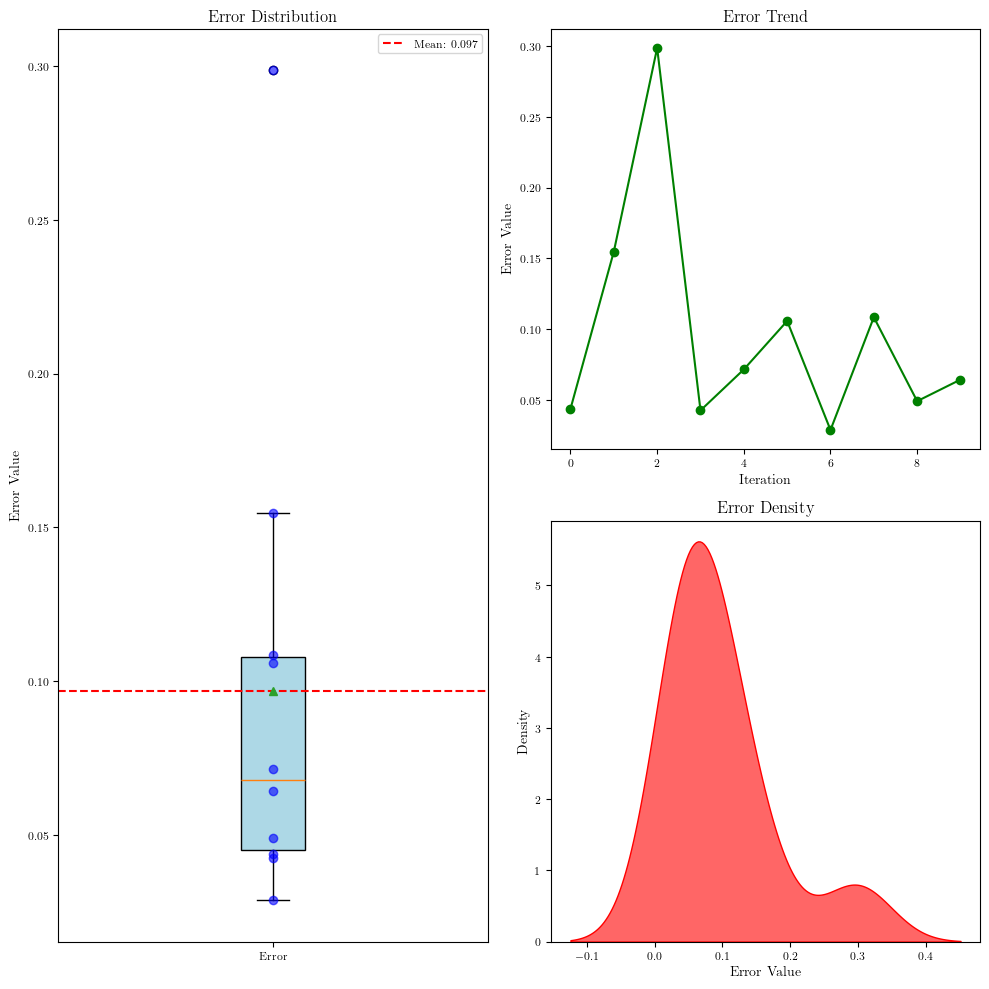

In [13]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns  # 导入seaborn库用于绘制密度图

# error = [0.5202765768338299, 0.5498189856925179, 0.8054262198745831, 0.2836623431751703, 0.7163985307835498, 0.8486951661259542, 0.45799139947295237, 1.0888879509613618, 0.18105234189218838, 0.5686642080465825]
error = error_u

plt.figure(figsize=(10, 10))  # 调整整体图表尺寸

# 左侧子图：箱形图，占据两张图的位置，箱的上下边界为上下四分位数，箱内的横线+三角点为中位数，虚线为均值
plt.subplot(1, 2, 1)  # 第一个子图，现在布局为1行2列
mean_error = np.mean(error)
plt.boxplot(error, patch_artist=True, showmeans=True, meanline=False, boxprops=dict(facecolor='lightblue')) #绘制箱型图，其中error是需要绘制的数据，patch_artist=True表示填充箱体，showmeans=True表示显示均值，meanline=True表示显示均值线，boxprops=dict(facecolor='lightblue')表示箱体的颜色为浅蓝色
plt.axhline(mean_error, color='r', linestyle='--', label=f'Mean: {mean_error:.3f}') #绘制一条水平线，位于mean_error处，颜色为红色，线型为虚线，标签为均值
for i, value in enumerate(error): #遍历error数组，i为索引，value为值
    plt.plot(1, value, 'bo', alpha=0.6) #绘制散点图，横坐标为1，纵坐标为value（即error数组中每个数），颜色为蓝色，点形状为圆圈，透明度为0.6
plt.title('Error Distribution')
plt.ylabel('Error Value')
plt.xticks([1], ['Error']) #设置x轴刻度标签
plt.legend() #显示图例

# 右侧上方子图：折线图
plt.subplot(2, 2, 2)  # 第二个子图，现在布局为2行2列的第二个位置
plt.plot(error, '-o', color='green') #绘制折线图，横坐标为error数组的索引，纵坐标为error数组的值，颜色为绿色，点形状为圆圈
plt.title('Error Trend')
plt.ylabel('Error Value')
plt.xlabel('Iteration')

# 右侧下方子图：密度图
plt.subplot(2, 2, 4)  # 第四个子图，现在布局为2行2列的第四个位置
sns.kdeplot(error, shade=True, color="r", alpha=0.6)
plt.title('Error Density')
plt.xlabel('Error Value')
plt.ylabel('Density')

plt.tight_layout()  # 自动调整子图参数，使之填充整个图表区域
plt.show()

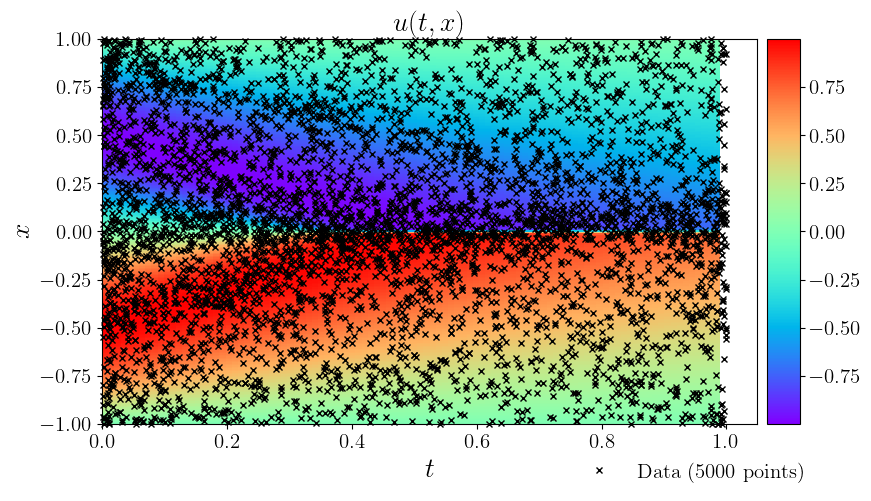

In [14]:
data = scipy.io.loadmat('../data/burgers_shock.mat')
#从data字典中取出变量tt和x的值，并转换为一维数组（flatten方法），最后tongg[:,None]将一维数组转换为二维数组
t = data['t'].flatten()[:,None]
x = data['x'].flatten()[:,None]
Exact = np.real(data['usol']).T #从data数据中取出usol的值，并取实部，最后转置，赋值给Exact
#生成一个二位网络，X和T是输出的二维数组
#这个点结果是X和T均为形状为[len(t),len(x)]的二维数组，X的每一行都是x，一共len(t)行，T的每一列都是t，一共len(x)列
X, T = np.meshgrid(x,t)

X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #按列堆叠数组，X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_star = Exact.flatten()[:,None]    #对Exact_u使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组   


#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_star = griddata(X_star, u_star.flatten(), (X, T), method='cubic')


###### Row 0: u(t,x) ##################    

fig = plt.figure(figsize=(9, 5)) #这里figure是一个figure对象，是一个图形窗口，代表整个图形，设置图形大小为宽9英寸高5 英寸
ax = fig.add_subplot(111) #在图形的1*1网格的第一个位置添加一个子图

#绘图的数据来源
h = ax.imshow(U_star.T, interpolation='nearest', cmap='rainbow', 
              extent=[t.min(), t.max(), x.min(), x.max()], 
              origin='lower', aspect='auto')   #imshow函数用于显示图像，接受一些参数，第一个参数是图像数据，这里是U_pred的转置；第二个参数是插值方法（用于在像素之间插入新的像素），这里是最邻近插值；
                                                   #第三个参数是颜色映射，这里是用彩虹色图；第四个参数是图像的范围；第五个参数是图像的原点位置，这里表示原点在右下角；第六个参数是图像的纵横比，这里表示调整横纵比以填充整个axes对象
                                                   #最后的结果返回一个axesimage对象，也就是h，可以通过这个对象进一步设置图像的属性


#添加颜色条
divider = make_axes_locatable(ax)  #使用 make_axes_locatable 函数创建了一个 AxesDivider 对象。这个函数接受一个 Axes 对象作为参数，返回一个 AxesDivider 对象。AxesDivider 对象可以用来管理子图的布局，特别是当你需要在一个图的旁边添加另一个图时。
cax = divider.append_axes("right", size="5%", pad=0.10) #使用append_axes方法在原始轴的右侧添加了一个新的轴。append_axes 方法接受三个参数：位置（"right"）、大小（"5%"）和间距（0.10）。在原始轴的右侧添加了一个新的轴，新轴的大小是原始轴的 5%，新轴与原始轴之间的间距是 0.05 英寸
   
cbar = fig.colorbar(h, cax=cax)#使用colorbar方法在新轴上添加了一个颜色条。colorbar 方法接受两个参数：axesimage 对象（h）和新轴（cax）。并记这个颜色条的名字是cbar
cbar.ax.tick_params(labelsize=15) #设置颜色条刻度标签大小，这里bar是之前定义的


#在图上绘制散点图
ax.plot(
    X_f_train[:,1], 
    X_f_train[:,0], 
    'kx', label = 'Data (%d points)' % (X_f_train.shape[0]), 
    markersize = 4,  # marker size doubled
    clip_on = False,
    alpha=1.0
) #在ax上绘制散点图，前两个参数是散点的x坐标和y坐标；kx表示黑色的x（散点形状是x），label是散点的标签，clip_on表示散点可以绘制在轴的边界外
  #新加了一个alpha=1.0用来设置标记的透明度，1.0表示完全不透明  




#设置图的标签、图例、标题和刻度标签
#设置ax子图的x轴的标签为t，y轴的标签为x。这里$t$和$x$是latex格式的文本，用于生成数学公式
ax.set_xlabel('$t$', size=20)
ax.set_ylabel('$x$', size=20)
#设置子图ax的图例，第一个参数用来设置图例的位置，这里表示图例放在上方中央;第二个参数用来设置图例的锚点，接受一个元组，表示x和y坐标，表示把图例的锚点设置在x坐标为0.9，y坐标为-0.05处;frameon=False表示不显示图例的边框;第三个参数设置图例的列数，分为5列；最后一个参数设置图例属性，接受字典，这里表示设置图例字体大小为15；最后返回的leg是一个legend对象，表示图形的图例
ax.legend(
    loc='upper center', 
    bbox_to_anchor=(0.9, -0.05), 
    ncol=5, 
    frameon=False, 
    prop={'size': 15}
)
#设置子图ax的标题为$u(t,x)$，表示latex格式的文本，用于生成数学公式，fontsize=10表示字体大小为20
ax.set_title('$u(t,x)$', fontsize = 20) # font size doubled，两倍化子图标题
ax.tick_params(labelsize=15)#用来设置刻度标签的大小。`tick_params`是`Axes`对象的一个方法，可以用来设置刻度线的属性。在这里，`labelsize=15` 是用来设置刻度标签的字体大小的。


#显示图片
plt.show() #显示所有打开的图形的函数

In [15]:
trainloss = torch.stack(model.loss_value).cpu().detach().numpy()

testerror = torch.stack(model.test_error).cpu().detach().numpy()

55006
[2.9413575e-01 2.7206767e-01 2.5473842e-01 ... 4.4442659e-05 4.4441331e-05
 4.4440851e-05]


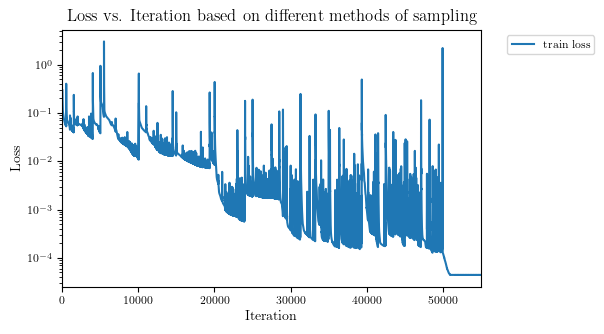

In [16]:
print(len(trainloss))
print(trainloss)
# 定义图例的标签
labels = ["Grid"]

# 创建一个新的图形
plt.figure()

# # 遍历所有的loss数据和标签
# for loss, label in zip(trainloss, labels):
#     # 绘制每个loss数据，并使用标签作为图例的条目
#     plt.plot(loss, label=label)

plt.plot(trainloss, label='train loss')

# 添加图例，放在图像外
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')


plt.xlim([0,55000]) # 设置x轴的范围
plt.yscale('log') #设置y轴为对数尺度，这样即使列表中有一些非常大的值，也不会影响其他值的可视化
plt.xlabel('Iteration') # 设置x轴的标签
plt.ylabel('Loss') # 设置y轴的标签
plt.title('Loss vs. Iteration based on different methods of sampling') # 设置图形的标题
# 显示图形
plt.show()
plt.show()

55006
[1.0124097  1.0024621  0.99440116 ... 0.06432869 0.06432871 0.06432872]


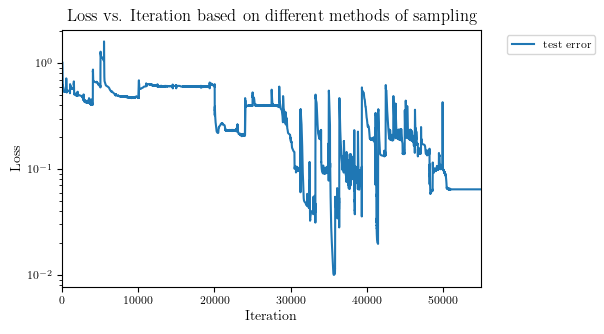

In [17]:
print(len(testerror))
print(testerror)
# 定义图例的标签
# labels = ["Grid"]

# 创建一个新的图形
plt.figure()

# # 遍历所有的loss数据和标签
# for loss, label in zip(trainloss, labels):
#     # 绘制每个loss数据，并使用标签作为图例的条目
#     plt.plot(loss, label=label)

plt.plot(testerror, label='test error')

# 添加图例，放在图像外
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')


plt.xlim([0,55000]) # 设置x轴的范围
plt.yscale('log') #设置y轴为对数尺度，这样即使列表中有一些非常大的值，也不会影响其他值的可视化
plt.xlabel('Iteration') # 设置x轴的标签
plt.ylabel('Loss') # 设置y轴的标签
plt.title('Loss vs. Iteration based on different methods of sampling') # 设置图形的标题
# 显示图形
plt.show()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


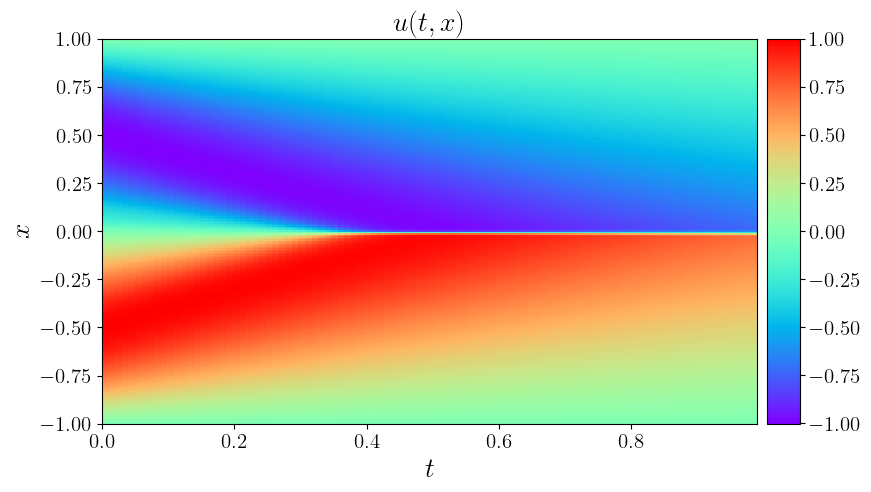

In [18]:
data = scipy.io.loadmat('../data/burgers_shock.mat')
#从data字典中取出变量tt和x的值，并转换为一维数组（flatten方法），最后tongg[:,None]将一维数组转换为二维数组
t = data['t'].flatten()[:,None]
x = data['x'].flatten()[:,None]
Exact = np.real(data['usol']).T #从data数据中取出usol的值，并取实部，最后转置，赋值给Exact
#生成一个二位网络，X和T是输出的二维数组
#这个点结果是X和T均为形状为[len(t),len(x)]的二维数组，X的每一行都是x，一共len(t)行，T的每一列都是t，一共len(x)列
X, T = np.meshgrid(x,t)

X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #按列堆叠数组，X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_pred, f_pred = model.predict(X_star)    #对Exact_u使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组   


#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_pred = griddata(X_star, u_pred.flatten(), (X, T), method='cubic')


###### Row 0: u(t,x) ##################    

fig = plt.figure(figsize=(9, 5)) #这里figure是一个figure对象，是一个图形窗口，代表整个图形，设置图形大小为宽9英寸高5 英寸
ax = fig.add_subplot(111) #在图形的1*1网格的第一个位置添加一个子图

#绘图的数据来源
h = ax.imshow(U_pred.T, interpolation='nearest', cmap='rainbow', 
              extent=[t.min(), t.max(), x.min(), x.max()], 
              origin='lower', aspect='auto')   #imshow函数用于显示图像，接受一些参数，第一个参数是图像数据，这里是U_pred的转置；第二个参数是插值方法（用于在像素之间插入新的像素），这里是最邻近插值；
                                                   #第三个参数是颜色映射，这里是用彩虹色图；第四个参数是图像的范围；第五个参数是图像的原点位置，这里表示原点在右下角；第六个参数是图像的纵横比，这里表示调整横纵比以填充整个axes对象
                                                   #最后的结果返回一个axesimage对象，也就是h，可以通过这个对象进一步设置图像的属性


#添加颜色条
divider = make_axes_locatable(ax)  #使用 make_axes_locatable 函数创建了一个 AxesDivider 对象。这个函数接受一个 Axes 对象作为参数，返回一个 AxesDivider 对象。AxesDivider 对象可以用来管理子图的布局，特别是当你需要在一个图的旁边添加另一个图时。
cax = divider.append_axes("right", size="5%", pad=0.10) #使用append_axes方法在原始轴的右侧添加了一个新的轴。append_axes 方法接受三个参数：位置（"right"）、大小（"5%"）和间距（0.10）。在原始轴的右侧添加了一个新的轴，新轴的大小是原始轴的 5%，新轴与原始轴之间的间距是 0.05 英寸
   
cbar = fig.colorbar(h, cax=cax)#使用colorbar方法在新轴上添加了一个颜色条。colorbar 方法接受两个参数：axesimage 对象（h）和新轴（cax）。并记这个颜色条的名字是cbar
cbar.ax.tick_params(labelsize=15) #设置颜色条刻度标签大小，这里bar是之前定义的


# #在图上绘制散点图
# ax.plot(
#     X_f_train[:,1], 
#     X_f_train[:,0], 
#     'kx', label = 'Data (%d points)' % (X_f_train.shape[0]), 
#     markersize = 4,  # marker size doubled
#     clip_on = False,
#     alpha=1.0
# ) #在ax上绘制散点图，前两个参数是散点的x坐标和y坐标；kx表示黑色的x（散点形状是x），label是散点的标签，clip_on表示散点可以绘制在轴的边界外
#   #新加了一个alpha=1.0用来设置标记的透明度，1.0表示完全不透明  




#设置图的标签、图例、标题和刻度标签
#设置ax子图的x轴的标签为t，y轴的标签为x。这里$t$和$x$是latex格式的文本，用于生成数学公式
ax.set_xlabel('$t$', size=20)
ax.set_ylabel('$x$', size=20)
#设置子图ax的图例，第一个参数用来设置图例的位置，这里表示图例放在上方中央;第二个参数用来设置图例的锚点，接受一个元组，表示x和y坐标，表示把图例的锚点设置在x坐标为0.9，y坐标为-0.05处;frameon=False表示不显示图例的边框;第三个参数设置图例的列数，分为5列；最后一个参数设置图例属性，接受字典，这里表示设置图例字体大小为15；最后返回的leg是一个legend对象，表示图形的图例
ax.legend(
    loc='upper center', 
    bbox_to_anchor=(0.9, -0.05), 
    ncol=5, 
    frameon=False, 
    prop={'size': 15}
)
#设置子图ax的标题为$u(t,x)$，表示latex格式的文本，用于生成数学公式，fontsize=10表示字体大小为20
ax.set_title('$u(t,x)$', fontsize = 20) # font size doubled，两倍化子图标题
ax.tick_params(labelsize=15)#用来设置刻度标签的大小。`tick_params`是`Axes`对象的一个方法，可以用来设置刻度线的属性。在这里，`labelsize=15` 是用来设置刻度标签的字体大小的。


#显示图片
plt.show() #显示所有打开的图形的函数

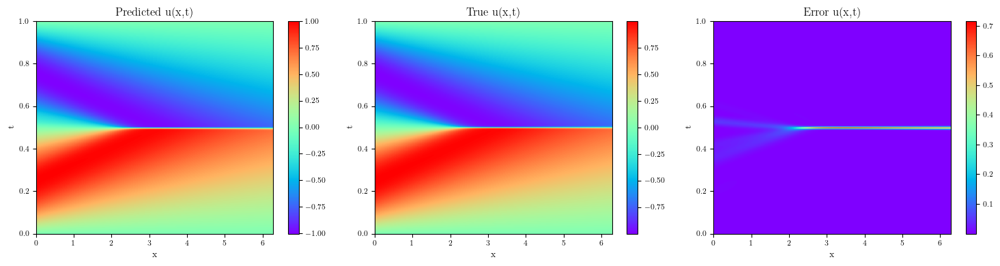

In [19]:

# 创建一个包含三幅子图的图像
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

# 绘制第一幅图像
axes[0].imshow(U_pred.T, extent=[0, np.pi*2, 1, 0], aspect='auto', cmap='rainbow')
axes[0].invert_yaxis()
axes[0].set_xlabel('x')
axes[0].set_ylabel('t')
axes[0].set_title('Predicted u(x,t)')
fig.colorbar(axes[0].images[0], ax=axes[0])

# 绘制第二幅图像
axes[1].imshow(U_star.T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[1].invert_yaxis()
axes[1].set_xlabel('x')
axes[1].set_ylabel('t')
axes[1].set_title('True u(x,t)')
fig.colorbar(axes[1].images[0], ax=axes[1])

# 绘制第三幅图像
axes[2].imshow(np.abs(U_pred - U_star).T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[2].invert_yaxis()
axes[2].set_xlabel('x')
axes[2].set_ylabel('t')
axes[2].set_title('Error u(x,t)')
fig.colorbar(axes[2].images[0], ax=axes[2])

# 自动调整子图参数，使得子图之间的间距适当
plt.tight_layout()
plt.show()

In [20]:

# # 创建一个包含三幅子图的图像
# fig, axes = plt.subplots(1, 2, figsize=(15, 4))

# # 绘制第一幅图像
# axes[0].imshow(U_var.T, extent=[0, np.pi*2, 1, 0], aspect='auto', cmap='rainbow')
# axes[0].invert_yaxis()
# axes[0].set_xlabel('x')
# axes[0].set_ylabel('t')
# axes[0].set_title('Predicted u(x,t)')
# fig.colorbar(axes[0].images[0], ax=axes[0])

# # 绘制第二幅图像
# axes[1].imshow(U_var_log.T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
# axes[1].invert_yaxis()
# axes[1].set_xlabel('x')
# axes[1].set_ylabel('t')
# axes[1].set_title('True u(x,t)')
# fig.colorbar(axes[1].images[0], ax=axes[1])

# # 自动调整子图参数，使得子图之间的间距适当
# plt.tight_layout()
# plt.show()

In [21]:
#计算训练好模型的chaos（最后一个seed）
u_chaos = calculate_chaos(model, X_star, num_iter=50)
u_chaos_log = np.log(u_chaos + 1e-10) #对u_var取对数，然后加上一个很小的数，避免取对数时出现错误

#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_chaos = griddata(X_star, u_chaos.flatten(), (X, T), method='cubic')
U_chaos_log = griddata(X_star, u_chaos_log.flatten(), (X, T), method='cubic')

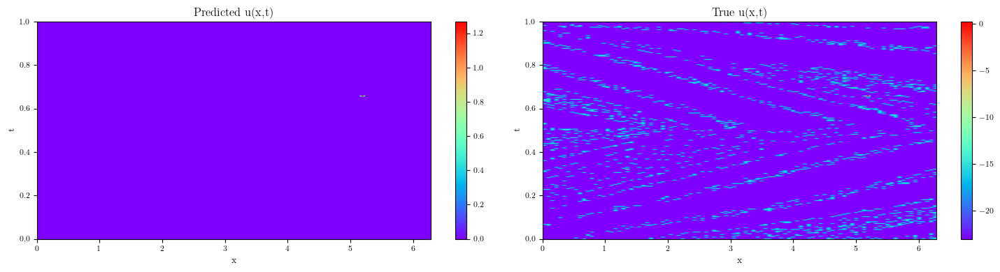

In [22]:

# 创建一个包含三幅子图的图像
fig, axes = plt.subplots(1, 2, figsize=(15, 4))

# 绘制第一幅图像
axes[0].imshow(U_chaos.T, extent=[0, np.pi*2, 1, 0], aspect='auto', cmap='rainbow')
axes[0].invert_yaxis()
axes[0].set_xlabel('x')
axes[0].set_ylabel('t')
axes[0].set_title('Predicted u(x,t)')
fig.colorbar(axes[0].images[0], ax=axes[0])

# 绘制第二幅图像
axes[1].imshow(U_chaos_log.T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[1].invert_yaxis()
axes[1].set_xlabel('x')
axes[1].set_ylabel('t')
axes[1].set_title('True u(x,t)')
fig.colorbar(axes[1].images[0], ax=axes[1])

# 自动调整子图参数，使得子图之间的间距适当
plt.tight_layout()
plt.show()